In [4]:
import pandas as pd
import numpy as np
import pandas_profiling
import warnings
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [1]:
from sklearn.linear_model import ElasticNet, Lasso,  BayesianRidge, LassoLarsIC

In [2]:
from sklearn.kernel_ridge import KernelRidge
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone

In [5]:
import lightgbm as lgb

In [6]:
data=pd.read_csv('Frogs_MFCCs.csv')

In [7]:
data.head()

,MFCCs_ 1,MFCCs_ 2,MFCCs_ 3,MFCCs_ 4,MFCCs_ 5,MFCCs_ 6,MFCCs_ 7,MFCCs_ 8,MFCCs_ 9,MFCCs_10,...,MFCCs_17,MFCCs_18,MFCCs_19,MFCCs_20,MFCCs_21,MFCCs_22,Family,Genus,Species,RecordID
0,1.0,0.152936,-0.105586,0.200722,0.317201,0.260764,0.100945,-0.150063,-0.171128,0.124676,...,-0.108351,-0.077623,-0.009568,0.057684,0.118680,0.014038,Leptodactylidae,Adenomera,AdenomeraAndre,1
1,1.0,0.171534,-0.098975,0.268425,0.338672,0.268353,0.060835,-0.222475,-0.207693,0.170883,...,-0.090974,-0.056510,-0.035303,0.020140,0.082263,0.029056,Leptodactylidae,Adenomera,AdenomeraAndre,1
2,1.0,0.152317,-0.082973,0.287128,0.276014,0.189867,0.008714,-0.242234,-0.219153,0.232538,...,-0.050691,-0.023590,-0.066722,-0.025083,0.099108,0.077162,Leptodactylidae,Adenomera,AdenomeraAndre,1
3,1.0,0.224392,0.118985,0.329432,0.372088,0.361005,0.015501,-0.194347,-0.098181,0.270375,...,-0.136009,-0.177037,-0.130498,-0.054766,-0.018691,0.023954,Leptodactylidae,Adenomera,AdenomeraAndre,1
4,1.0,0.087817,-0.068345,0.306967,0.330923,0.249144,0.006884,-0.265423,-0.172700,0.266434,...,-0.048885,-0.053074,-0.088550,-0.031346,0.108610,0.079244,Leptodactylidae,Adenomera,AdenomeraAndre,1


In [4]:
pd.set_option('display.max_rows', 50000)
pd.set_option('display.max_columns', 50000)
pd.set_option('display.width', 1000000)

In [5]:
pandas_profiling.ProfileReport(data)

Number of variables,26
Number of observations,7195
Total Missing (%),0.0%
Total size in memory,1.4 MiB
Average record size in memory,208.0 B
Numeric,23
Categorical,3
Boolean,0
Date,0
Text (Unique),0
Rejected,0


In [9]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier,BaggingClassifier,RandomForestClassifier,GradientBoostingClassifier
from sklearn.metrics import f1_score,confusion_matrix,classification_report
from sklearn.metrics import roc_auc_score,cohen_kappa_score,matthews_corrcoef,SCORERS,accuracy_score
from sklearn.svm import LinearSVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from xgboost import XGBClassifier

In [8]:
data_dum=pd.get_dummies(data[['Family','Genus']],drop_first=True)

In [9]:
data_dum.head()

,Family_Dendrobatidae,Family_Hylidae,Family_Leptodactylidae,Genus_Ameerega,Genus_Dendropsophus,Genus_Hypsiboas,Genus_Leptodactylus,Genus_Osteocephalus,Genus_Rhinella,Genus_Scinax
0,0,0,1,0,0,0,0,0,0,0
1,0,0,1,0,0,0,0,0,0,0
2,0,0,1,0,0,0,0,0,0,0
3,0,0,1,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0


In [10]:
data_num=data.drop(['Family','Genus','Species','RecordID'],axis=1)

In [11]:
data_num.head()

,MFCCs_ 1,MFCCs_ 2,MFCCs_ 3,MFCCs_ 4,MFCCs_ 5,MFCCs_ 6,MFCCs_ 7,MFCCs_ 8,MFCCs_ 9,MFCCs_10,...,MFCCs_13,MFCCs_14,MFCCs_15,MFCCs_16,MFCCs_17,MFCCs_18,MFCCs_19,MFCCs_20,MFCCs_21,MFCCs_22
0,1.0,0.152936,-0.105586,0.200722,0.317201,0.260764,0.100945,-0.150063,-0.171128,0.124676,...,-0.156436,0.082245,0.135752,-0.024017,-0.108351,-0.077623,-0.009568,0.057684,0.118680,0.014038
1,1.0,0.171534,-0.098975,0.268425,0.338672,0.268353,0.060835,-0.222475,-0.207693,0.170883,...,-0.254341,0.022786,0.163320,0.012022,-0.090974,-0.056510,-0.035303,0.020140,0.082263,0.029056
2,1.0,0.152317,-0.082973,0.287128,0.276014,0.189867,0.008714,-0.242234,-0.219153,0.232538,...,-0.237384,0.050791,0.207338,0.083536,-0.050691,-0.023590,-0.066722,-0.025083,0.099108,0.077162
3,1.0,0.224392,0.118985,0.329432,0.372088,0.361005,0.015501,-0.194347,-0.098181,0.270375,...,-0.317084,-0.011567,0.100413,-0.050224,-0.136009,-0.177037,-0.130498,-0.054766,-0.018691,0.023954
4,1.0,0.087817,-0.068345,0.306967,0.330923,0.249144,0.006884,-0.265423,-0.172700,0.266434,...,-0.298524,0.037439,0.219153,0.062837,-0.048885,-0.053074,-0.088550,-0.031346,0.108610,0.079244


In [12]:
data_concat=pd.concat([data_num,data_dum],axis=1)

In [13]:
data_concat.head()

,MFCCs_ 1,MFCCs_ 2,MFCCs_ 3,MFCCs_ 4,MFCCs_ 5,MFCCs_ 6,MFCCs_ 7,MFCCs_ 8,MFCCs_ 9,MFCCs_10,...,Family_Dendrobatidae,Family_Hylidae,Family_Leptodactylidae,Genus_Ameerega,Genus_Dendropsophus,Genus_Hypsiboas,Genus_Leptodactylus,Genus_Osteocephalus,Genus_Rhinella,Genus_Scinax
0,1.0,0.152936,-0.105586,0.200722,0.317201,0.260764,0.100945,-0.150063,-0.171128,0.124676,...,0,0,1,0,0,0,0,0,0,0
1,1.0,0.171534,-0.098975,0.268425,0.338672,0.268353,0.060835,-0.222475,-0.207693,0.170883,...,0,0,1,0,0,0,0,0,0,0
2,1.0,0.152317,-0.082973,0.287128,0.276014,0.189867,0.008714,-0.242234,-0.219153,0.232538,...,0,0,1,0,0,0,0,0,0,0
3,1.0,0.224392,0.118985,0.329432,0.372088,0.361005,0.015501,-0.194347,-0.098181,0.270375,...,0,0,1,0,0,0,0,0,0,0
4,1.0,0.087817,-0.068345,0.306967,0.330923,0.249144,0.006884,-0.265423,-0.172700,0.266434,...,0,0,1,0,0,0,0,0,0,0


In [14]:
from sklearn.preprocessing import LabelEncoder

In [15]:
le=LabelEncoder()

In [16]:
y=data['Species']

In [17]:
Species=le.fit_transform(y)

In [18]:
Species=pd.DataFrame(Species)

In [19]:
Species.nunique()

0    10
dtype: int64

In [20]:
from sklearn.model_selection import train_test_split

In [21]:
X_train,X_test,Y_train,Y_test=train_test_split(data_concat,Species,test_size=0.3,random_state=111)

In [46]:
Dt=DecisionTreeClassifier()
Rf=RandomForestClassifier()
Bagg=BaggingClassifier(base_estimator=Dt)
Boost=AdaBoostClassifier(base_estimator=Dt)
Knn=KNeighborsClassifier()
Svc=LinearSVC()
Lr=LogisticRegression()
Gbc=GradientBoostingClassifier()
Xgb=XGBClassifier()
Gnb=GaussianNB()
Bnb=BernoulliNB()

In [47]:
models=[Rf,Boost,Bagg,Svc,Knn,Dt,Lr,Gbc,Xgb,Gnb,Bnb]
model_names=['RandomForestClassifier','AdaBoostClassifier','BaggingClassifier','LinearSVC',
             'KNeighborsClassifier', 'DecisionTreeClassifier', 'LogisticRegression', 
             'GradientBoostingClassifier', 'XGBClassifier','GaussianNB','BernoulliNB']
#ROC_AUC_scores = []
F1_score=[]
mcc=[]
acc=[]

d={}

for model in range(len(models)):
    clf = models[model]
    clf.fit(X_train, Y_train)
    test_pred = clf.predict(X_test)
#    ROC_AUC_scores.append(roc_auc_score(Y_test1, test_pred))
    F1_score.append(f1_score(Y_test,test_pred,average='macro'))
    mcc.append(matthews_corrcoef(Y_test,test_pred))
    acc.append(accuracy_score(Y_test,test_pred))
    
d={'Modelling Algo':model_names,'F1_Score':F1_score,'MCC':mcc,'Accuracy':acc}   
df_models = pd.DataFrame(d)
df_models

C:\Users\Tejasvi.LAPTOP-8IC5PK11\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)
C:\Users\Tejasvi.LAPTOP-8IC5PK11\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  
C:\Users\Tejasvi.LAPTOP-8IC5PK11\Anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\Tejasvi.LAPTOP-8IC5PK11\Anaconda3\lib\site-packages\sklearn\ensemble\bagging.py:622: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), 

,Modelling Algo,F1_Score,MCC,Accuracy
0,RandomForestClassifier,0.997012,0.996235,0.997221
1,AdaBoostClassifier,0.993638,0.990584,0.993052
2,BaggingClassifier,0.995031,0.995608,0.996758
3,LinearSVC,0.999085,0.998745,0.999074
4,KNeighborsClassifier,0.997890,0.996867,0.997684
5,DecisionTreeClassifier,0.995334,0.993107,0.994905
6,LogisticRegression,0.996486,0.994984,0.996295
7,GradientBoostingClassifier,0.997777,0.996863,0.997684
8,XGBClassifier,0.998390,0.997491,0.998147
9,GaussianNB,0.989450,0.984399,0.988421


In [48]:
X_train,X_test,Y_train,Y_test=train_test_split(data_num,Species,test_size=0.3,random_state=111)

In [45]:
from sklearn.model_selection import train_test_split

In [46]:
Dt=DecisionTreeClassifier()
Rf=RandomForestClassifier()
Bagg=BaggingClassifier(base_estimator=Dt)
Boost=AdaBoostClassifier(base_estimator=Dt)
Knn=KNeighborsClassifier()
Svc=LinearSVC()
Lr=LogisticRegression()
Gbc=GradientBoostingClassifier()
Xgb=XGBClassifier()
Gnb=GaussianNB()
Bnb=BernoulliNB()

In [49]:
models=[Rf,Boost,Bagg,Svc,Knn,Dt,Lr,Gbc,Xgb,Gnb,Bnb]
model_names=['RandomForestClassifier','AdaBoostClassifier','BaggingClassifier','LinearSVC',
             'KNeighborsClassifier', 'DecisionTreeClassifier', 'LogisticRegression', 
             'GradientBoostingClassifier', 'XGBClassifier','GaussianNB','BernoulliNB']
#ROC_AUC_scores = []
F1_score=[]
mcc=[]
acc=[]

d={}

for model in range(len(models)):
    clf = models[model]
    clf.fit(X_train, Y_train)
    test_pred = clf.predict(X_test)
#    ROC_AUC_scores.append(roc_auc_score(Y_test1, test_pred))
    F1_score.append(f1_score(Y_test,test_pred,average='macro'))
    mcc.append(matthews_corrcoef(Y_test,test_pred))
    acc.append(accuracy_score(Y_test,test_pred))
    
d={'Modelling Algo':model_names,'F1_Score':F1_score,'MCC':mcc,'Accuracy':acc}   
df_models = pd.DataFrame(d)
df_models

C:\Users\Tejasvi.LAPTOP-8IC5PK11\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  
C:\Users\Tejasvi.LAPTOP-8IC5PK11\Anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\Tejasvi.LAPTOP-8IC5PK11\Anaconda3\lib\site-packages\sklearn\ensemble\bagging.py:622: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
C:\Users\Tejasvi.LAPTOP-8IC5PK11\Anaconda3\lib\site-packages\sklearn\utils\validation.py:761: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change

,Modelling Algo,F1_Score,MCC,Accuracy
0,RandomForestClassifier,0.930813,0.957187,0.968504
1,AdaBoostClassifier,0.852854,0.911977,0.935155
2,BaggingClassifier,0.911682,0.944642,0.959240
3,LinearSVC,0.876578,0.929676,0.948124
4,KNeighborsClassifier,0.948740,0.972998,0.980083
5,DecisionTreeClassifier,0.853782,0.912026,0.935155
6,LogisticRegression,0.716328,0.897165,0.924039
7,GradientBoostingClassifier,0.948663,0.970446,0.978231
8,XGBClassifier,0.952498,0.972966,0.980083
9,GaussianNB,0.841745,0.883796,0.912923


In [60]:
from sklearn.model_selection import cross_val_score, cross_val_predict

In [59]:
cross_val_score(Xgb,X_train,Y_train,cv=5)

array([0.98221344, 0.98313492, 0.97020854, 0.97810945, 0.98207171])

In [ ]:
cross_val_predict()

In [179]:
pd.DataFrame(Rf.feature_importances_,
                                   index = X_train.columns,
                                    columns=['importance']).sort_values('importance',ascending=False)

,importance
MFCCs_11,0.115101
MFCCs_13,0.103303
MFCCs_15,0.093348
MFCCs_ 9,0.076182
MFCCs_12,0.074100
MFCCs_22,0.054643
MFCCs_20,0.047008
MFCCs_17,0.044201
MFCCs_ 3,0.038714
MFCCs_ 5,0.035332


In [50]:
y_pred=Xgb.predict(X_test)

In [51]:
accuracy_score(Y_test,y_pred)

0.9800833719314498

#  Clustering 

# Kmeans

In [22]:
from sklearn.cluster import KMeans,DBSCAN

In [23]:
#list(range(0,len(x1.columns)))
#for i in list(range(0,11)):
kmeans=KMeans(n_clusters=10,random_state=121)
kmeans.fit(data_concat)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=10, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=121, tol=0.0001, verbose=0)

Text(0.5,1,'real')

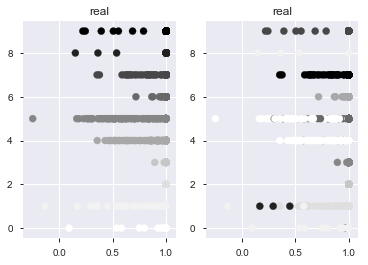

In [84]:
plt.subplot(1,2,1)
plt.scatter(x=data_concat['MFCCs_ 1'],y=Species,c=Species,s=50)
plt.title('real')

plt.subplot(1,2,2)
plt.scatter(x=data_concat['MFCCs_ 1'],y=Species,c=kmeans.labels_,s=50)
plt.title('real')

Text(0.5,1,'cluster')

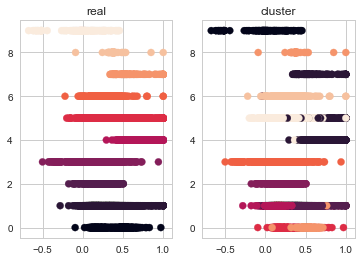

In [184]:
plt.subplot(1,2,1)
plt.scatter(x=data_concat['MFCCs_ 2'],y=Species,c=Species,s=50)
plt.title('real')

plt.subplot(1,2,2)
plt.scatter(x=data_concat['MFCCs_ 2'],y=Species,c=kmeans.labels_,s=50)
plt.title('cluster')

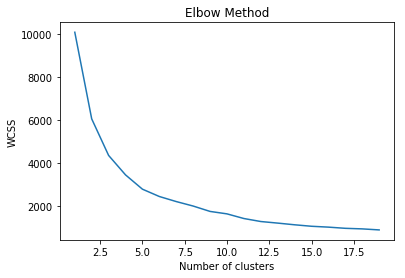

In [24]:
wcss = []

for i in range(1, 20):
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(data_concat)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 20), wcss)
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

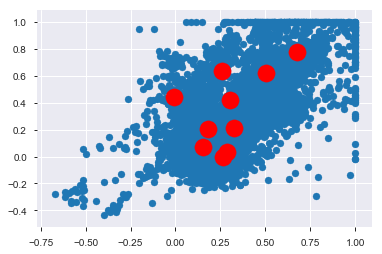

In [91]:
kmeans = KMeans(n_clusters=10, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(data_concat)
plt.scatter(data_concat.iloc[:,1], data_concat.iloc[:,2])
plt.scatter(kmeans.cluster_centers_[:, 1], kmeans.cluster_centers_[:, 2], s=300, c='red')
plt.show()

In [125]:
kmeans1=KMeans(n_clusters=10,random_state=121)
kmeans1.fit(data_concat)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=10, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=121, tol=0.0001, verbose=0)

In [126]:
from sklearn.metrics import silhouette_score

In [127]:
silhouette_score(data_concat,kmeans1.labels_)

0.5754042587915394

In [180]:
print(Counter(kmeans1.labels_))

Counter({2: 3473, 6: 1041, 0: 552, 3: 542, 1: 445, 5: 310, 8: 301, 4: 269, 7: 148, 9: 114})


In [181]:
data_concat['label']=kmeans1.labels_

In [182]:
data_concat.head()

,MFCCs_ 1,MFCCs_ 2,MFCCs_ 3,MFCCs_ 4,MFCCs_ 5,MFCCs_ 6,MFCCs_ 7,MFCCs_ 8,MFCCs_ 9,MFCCs_10,MFCCs_11,MFCCs_12,MFCCs_13,MFCCs_14,MFCCs_15,MFCCs_16,MFCCs_17,MFCCs_18,MFCCs_19,MFCCs_20,MFCCs_21,MFCCs_22,Family_Dendrobatidae,Family_Hylidae,Family_Leptodactylidae,Genus_Ameerega,Genus_Dendropsophus,Genus_Hypsiboas,Genus_Leptodactylus,Genus_Osteocephalus,Genus_Rhinella,Genus_Scinax,label
0,1.0,0.152936,-0.105586,0.200722,0.317201,0.260764,0.100945,-0.150063,-0.171128,0.124676,0.188654,-0.075622,-0.156436,0.082245,0.135752,-0.024017,-0.108351,-0.077623,-0.009568,0.057684,0.118680,0.014038,0,0,1,0,0,0,0,0,0,0,8
1,1.0,0.171534,-0.098975,0.268425,0.338672,0.268353,0.060835,-0.222475,-0.207693,0.170883,0.270958,-0.095004,-0.254341,0.022786,0.163320,0.012022,-0.090974,-0.056510,-0.035303,0.020140,0.082263,0.029056,0,0,1,0,0,0,0,0,0,0,8
2,1.0,0.152317,-0.082973,0.287128,0.276014,0.189867,0.008714,-0.242234,-0.219153,0.232538,0.266064,-0.072827,-0.237384,0.050791,0.207338,0.083536,-0.050691,-0.023590,-0.066722,-0.025083,0.099108,0.077162,0,0,1,0,0,0,0,0,0,0,8
3,1.0,0.224392,0.118985,0.329432,0.372088,0.361005,0.015501,-0.194347,-0.098181,0.270375,0.267279,-0.162258,-0.317084,-0.011567,0.100413,-0.050224,-0.136009,-0.177037,-0.130498,-0.054766,-0.018691,0.023954,0,0,1,0,0,0,0,0,0,0,8
4,1.0,0.087817,-0.068345,0.306967,0.330923,0.249144,0.006884,-0.265423,-0.172700,0.266434,0.332695,-0.100749,-0.298524,0.037439,0.219153,0.062837,-0.048885,-0.053074,-0.088550,-0.031346,0.108610,0.079244,0,0,1,0,0,0,0,0,0,0,8


In [183]:
data_concat['label'].value_counts()

2    3473
6    1041
0     552
3     542
1     445
5     310
8     301
4     269
7     148
9     114
Name: label, dtype: int64

Text(0.5,1,'cluster')

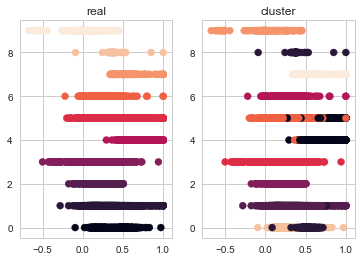

In [185]:
plt.subplot(1,2,1)
plt.scatter(x=data_concat['MFCCs_ 2'],y=Species,c=Species,s=50)
plt.title('real')

plt.subplot(1,2,2)
plt.scatter(x=data_concat['MFCCs_ 2'],y=Species,c=data_concat['label'],s=50)
plt.title('cluster')

In [205]:
centers.dtypes

AttributeError: 'numpy.ndarray' object has no attribute 'dtypes'

In [208]:
centers[:, 0]

array([0.9246818 , 0.98605275, 0.997965  , 1.        , 0.99721242,
       0.9995978 , 0.99526713, 0.97557203, 0.99294399, 0.94394482])

In [204]:
centers = kmeans1.cluster_centers_

In [210]:
kmeans1

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
    n_clusters=10, n_init=10, n_jobs=None, precompute_distances='auto',
    random_state=121, tol=0.0001, verbose=0)

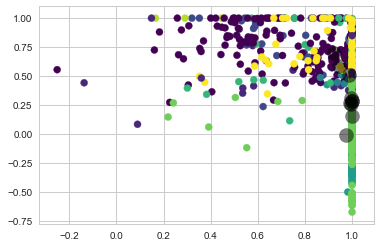

In [213]:
plt.scatter(data_concat.iloc[:, 0], data_concat.iloc[:, 1], c=kmeans1.labels_ , s=50, cmap='viridis')

centers = kmeans1.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5)

In [ ]:
#kmeans = KMeans(n_clusters=200, init='k-means++', max_iter=300, n_init=10, random_state=0)
#pred_y = kmeans.fit_predict(pincode_k_f)
#plt.scatter(pincode_k_f.iloc[:,0], pincode_k_f.iloc[:,1])
#plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], s=300, c='red')
#plt.show()

In [202]:
data_concat['MFCCs_ 1']#, data_concat.iloc[:, 1]

0       1.000000
1       1.000000
2       1.000000
3       1.000000
4       1.000000
5       1.000000
6       1.000000
7       1.000000
8       1.000000
9       1.000000
10      1.000000
11      1.000000
12      1.000000
13      1.000000
14      1.000000
15      1.000000
16      1.000000
17      1.000000
18      1.000000
19      1.000000
20      1.000000
21      1.000000
22      1.000000
23      1.000000
24      1.000000
25      1.000000
26      1.000000
27      1.000000
28      1.000000
29      1.000000
30      1.000000
31      1.000000
32      1.000000
33      1.000000
34      1.000000
35      1.000000
36      1.000000
37      1.000000
38      1.000000
39      1.000000
40      1.000000
41      1.000000
42      1.000000
43      1.000000
44      1.000000
45      1.000000
46      1.000000
47      1.000000
48      1.000000
49      1.000000
50      1.000000
51      1.000000
52      1.000000
53      1.000000
54      1.000000
55      1.000000
56      1.000000
57      1.000000
58      1.0000

In [201]:
data_concat.head()

,MFCCs_ 1,MFCCs_ 2,MFCCs_ 3,MFCCs_ 4,MFCCs_ 5,MFCCs_ 6,MFCCs_ 7,MFCCs_ 8,MFCCs_ 9,MFCCs_10,MFCCs_11,MFCCs_12,MFCCs_13,MFCCs_14,MFCCs_15,MFCCs_16,MFCCs_17,MFCCs_18,MFCCs_19,MFCCs_20,MFCCs_21,MFCCs_22,Family_Dendrobatidae,Family_Hylidae,Family_Leptodactylidae,Genus_Ameerega,Genus_Dendropsophus,Genus_Hypsiboas,Genus_Leptodactylus,Genus_Osteocephalus,Genus_Rhinella,Genus_Scinax,label
0,1.0,0.152936,-0.105586,0.200722,0.317201,0.260764,0.100945,-0.150063,-0.171128,0.124676,0.188654,-0.075622,-0.156436,0.082245,0.135752,-0.024017,-0.108351,-0.077623,-0.009568,0.057684,0.118680,0.014038,0,0,1,0,0,0,0,0,0,0,8
1,1.0,0.171534,-0.098975,0.268425,0.338672,0.268353,0.060835,-0.222475,-0.207693,0.170883,0.270958,-0.095004,-0.254341,0.022786,0.163320,0.012022,-0.090974,-0.056510,-0.035303,0.020140,0.082263,0.029056,0,0,1,0,0,0,0,0,0,0,8
2,1.0,0.152317,-0.082973,0.287128,0.276014,0.189867,0.008714,-0.242234,-0.219153,0.232538,0.266064,-0.072827,-0.237384,0.050791,0.207338,0.083536,-0.050691,-0.023590,-0.066722,-0.025083,0.099108,0.077162,0,0,1,0,0,0,0,0,0,0,8
3,1.0,0.224392,0.118985,0.329432,0.372088,0.361005,0.015501,-0.194347,-0.098181,0.270375,0.267279,-0.162258,-0.317084,-0.011567,0.100413,-0.050224,-0.136009,-0.177037,-0.130498,-0.054766,-0.018691,0.023954,0,0,1,0,0,0,0,0,0,0,8
4,1.0,0.087817,-0.068345,0.306967,0.330923,0.249144,0.006884,-0.265423,-0.172700,0.266434,0.332695,-0.100749,-0.298524,0.037439,0.219153,0.062837,-0.048885,-0.053074,-0.088550,-0.031346,0.108610,0.079244,0,0,1,0,0,0,0,0,0,0,8


In [197]:
data_concat.iloc[:, 1]

0       0.152936
1       0.171534
2       0.152317
3       0.224392
4       0.087817
5       0.099704
6       0.021676
7       0.145130
8       0.271326
9       0.120565
10      0.148539
11      0.277948
12      0.106109
13      0.126523
14      0.267687
15      0.137623
16      0.263944
17      0.146299
18      0.179298
19      0.273218
20      0.196429
21      0.230999
22      0.145109
23      0.235682
24      0.146944
25      0.233512
26      0.172672
27      0.198494
28      0.165998
29      0.155225
30      0.283707
31      0.150296
32      0.157652
33      0.127971
34      0.232171
35      0.097419
36      0.088716
37      0.199335
38      0.133759
39      0.208230
40      0.123719
41      0.353136
42      0.072467
43      0.196330
44      0.155126
45      0.142462
46      0.487171
47      0.606364
48      0.237880
49      0.244576
50      0.284436
51      0.193654
52      0.475406
53      0.452488
54      0.118913
55      0.389888
56      0.116799
57      0.250598
58      0.1834

# 2nd approach kmeans

In [28]:
X1=data_concat.copy()

In [29]:
inertia = []
for n in range(1 , 11):
    algorithm = (KMeans(n_clusters = n ,init='k-means++', n_init = 10 ,max_iter=300, 
                        tol=0.0001,  random_state= 111  , algorithm='elkan') )
    algorithm.fit(X1)
    inertia.append(algorithm.inertia_)

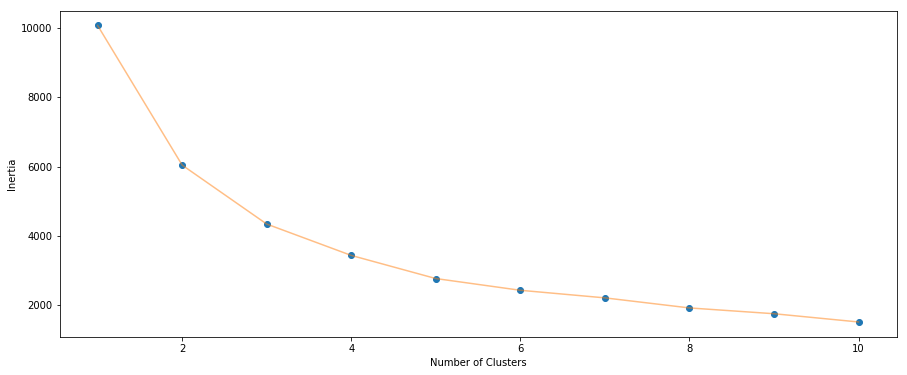

In [30]:
plt.figure(1 , figsize = (15 ,6))
plt.plot(np.arange(1 , 11) , inertia , 'o')
plt.plot(np.arange(1 , 11) , inertia , '-' , alpha = 0.5)
plt.xlabel('Number of Clusters') , plt.ylabel('Inertia')
plt.show()

In [32]:
algorithm = (KMeans(n_clusters = 4 ,init='k-means++', n_init = 10 ,max_iter=300, 
                        tol=0.0001,  random_state= 111  , algorithm='elkan') )
algorithm.fit(X1)
labels1 = algorithm.labels_
centroids1 = algorithm.cluster_centers_
centroids1

array([[ 1.00000000e+00,  2.85502677e-01,  3.18644930e-02,
         2.70047861e-01,  2.41340304e-01,  1.68098932e-01,
         5.54408811e-02, -3.94331601e-02, -3.66201141e-02,
         6.78358046e-02,  4.37825487e-02, -1.15524986e-01,
        -7.96576611e-02,  1.54352100e-01,  1.22344285e-01,
        -1.02358709e-01, -1.23901426e-01,  2.16603710e-02,
         4.23458066e-02, -1.74068354e-02, -1.34839176e-02,
         3.52837536e-03,  1.00000000e+00, -2.72004641e-15,
        -2.10942375e-15,  1.00000000e+00,  1.11022302e-16,
        -2.47024623e-15,  3.53883589e-16, -4.51028104e-17,
         2.42861287e-17,  5.20417043e-17],
       [ 9.90434509e-01,  3.70883979e-01,  4.37123181e-01,
         3.70160954e-01, -3.66787961e-02,  1.41540931e-01,
         2.55282664e-01, -6.52503588e-02, -1.19079634e-01,
         1.67186117e-01,  9.41656612e-02, -1.40665455e-01,
        -4.17089730e-02,  1.41823896e-01,  5.85744784e-02,
        -4.36434780e-02,  2.31976041e-03, -1.09640716e-02,
        -5.70

In [36]:
len(X1.columns)

32

In [48]:
x2=X1.values

In [49]:
x2

array([[ 1.        ,  0.1529363 , -0.1055859 , ...,  0.        ,
         0.        ,  0.        ],
       [ 1.        ,  0.17153426, -0.09897474, ...,  0.        ,
         0.        ,  0.        ],
       [ 1.        ,  0.15231709, -0.08297267, ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 1.        , -0.58255678, -0.34323739, ...,  0.        ,
         0.        ,  1.        ],
       [ 1.        , -0.51949716, -0.30755306, ...,  0.        ,
         0.        ,  1.        ],
       [ 1.        , -0.50883318, -0.32410584, ...,  0.        ,
         0.        ,  1.        ]])

In [44]:
h = 0.02
x_max=[]
x_min=[]
x_max=[]
x_min=[]

for i in range(0,32):
    x_min, x_max = x2[:,0].min() - 1, x2[:,0].max() + 1
    y_min, y_max = x2[:,1].min() - 1, x2[:,1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
Z = algorithm.predict(np.c_[xx.ravel(), yy.ravel()]) 

ValueError: Incorrect number of features. Got 2 features, expected 32

In [35]:
plt.figure(1 , figsize = (15 , 7) )
plt.clf()
Z = Z.reshape(xx.shape)
plt.imshow(Z , interpolation='nearest', 
           extent=(xx.min(), xx.max(), yy.min(), yy.max()),
           cmap = plt.cm.Pastel2, aspect = 'auto', origin='lower')

plt.scatter( x = 'Age' ,y = 'Spending Score (1-100)' , data = df , c = labels1 , 
            s = 200 )
plt.scatter(x = centroids1[: , 0] , y =  centroids1[: , 1] , s = 300 , c = 'red' , alpha = 0.5)
plt.ylabel('Spending Score (1-100)') , plt.xlabel('Age')
plt.show()

NameError: name 'Z' is not defined

<Figure size 1080x504 with 0 Axes>

In [ ]:
df['label3'] =  labels3
trace1 = go.Scatter3d(
    x= df['Age'],
    y= df['Spending Score (1-100)'],
    z= df['Annual Income (k$)'],
    mode='markers',
     marker=dict(
        color = df['label3'], 
        size= 20,
        line=dict(
            color= df['label3'],
            width= 12
        ),
        opacity=0.8
     )
)
data = [trace1]
layout = go.Layout(
#     margin=dict(
#         l=0,
#         r=0,
#         b=0,
#         t=0
#     )
    title= 'Clusters',
    scene = dict(
            xaxis = dict(title  = 'Age'),
            yaxis = dict(title  = 'Spending Score'),
            zaxis = dict(title  = 'Annual Income')
        )
)
fig = go.Figure(data=data, layout=layout)
py.offline.iplot(fig)


In [39]:
km = KMeans(n_clusters = 5, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
y_means = km.fit_predict(X1)

plt.scatter(X1[y_means == 0, 0], X1[y_means == 0, 1], s = 100, c = 'pink', label = 'miser')
plt.scatter(X1[y_means == 1, 0], X1[y_means == 1, 1], s = 100, c = 'yellow', label = 'general')
plt.scatter(X1[y_means == 2, 0], X1[y_means == 2, 1], s = 100, c = 'cyan', label = 'target')
plt.scatter(X1[y_means == 3, 0], X1[y_means == 3, 1], s = 100, c = 'magenta', label = 'spendthrift')
plt.scatter(X1[y_means == 4, 0], X1[y_means == 4, 1], s = 100, c = 'orange', label = 'careful')
plt.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:, 1], s = 50, c = 'blue' , label = 'centeroid')

plt.style.use('fivethirtyeight')
plt.title('K Means Clustering', fontsize = 20)
#plt.xlabel('Annual Income')
#plt.ylabel('Spending Score')
plt.legend()
plt.grid()
plt.show()

TypeError: '(array([ True,  True,  True, ..., False, False, False]), 0)' is an invalid key

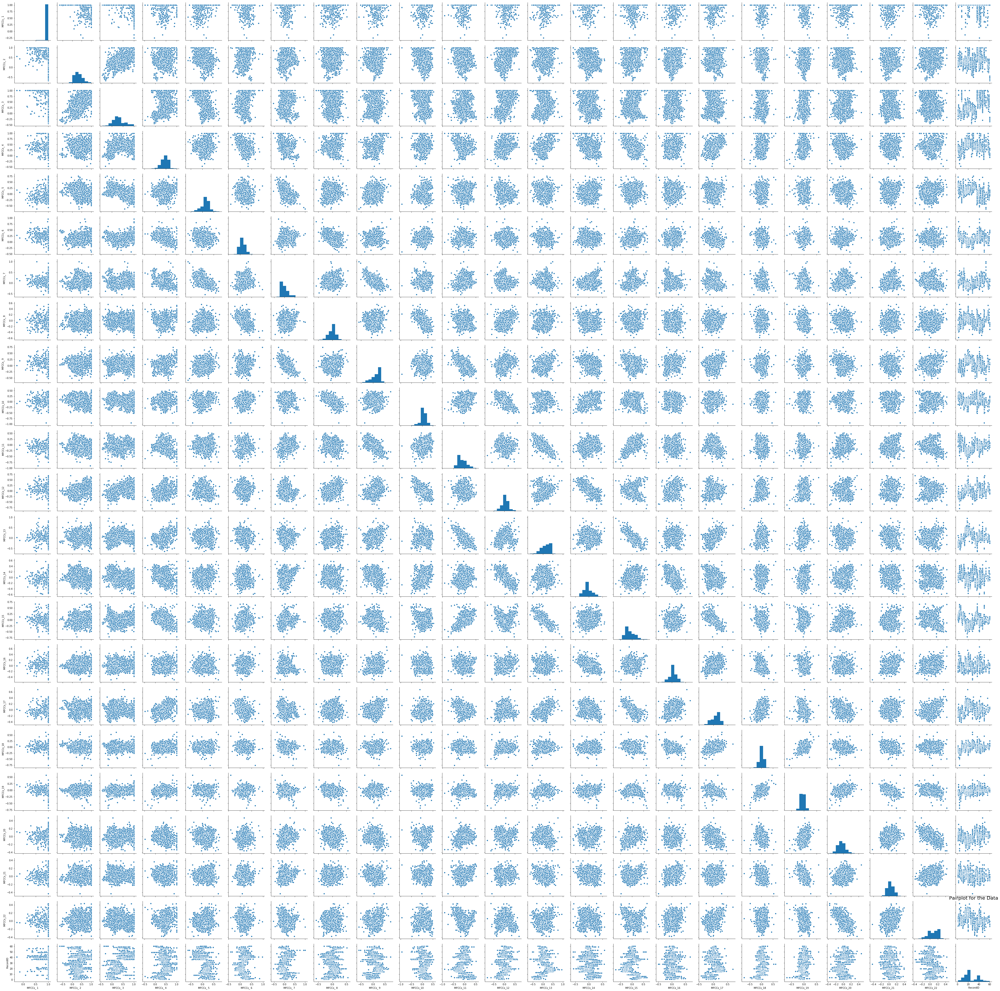

In [38]:
sns.pairplot(data)
plt.title('Pairplot for the Data', fontsize = 20)
plt.show()

# DBSCAN

In [175]:
from sklearn.cluster import DBSCAN
dbs=DBSCAN(eps=0.5
           ,min_samples=10,n_jobs=4)

In [176]:
clusters=dbs.fit(X=data_concat)

In [177]:
clusters

DBSCAN(algorithm='auto', eps=0.5, leaf_size=30, metric='euclidean',
    metric_params=None, min_samples=10, n_jobs=4, p=None)

In [178]:
silhouette_score(data_concat,clusters.labels_)

0.5886856417102031

In [142]:
from collections import Counter
from pylab import rcParams
import sklearn

In [148]:
a=pd.DataFrame(data_concat)

In [144]:
print(Counter(clusters.labels_))

Counter({4: 3447, 13: 1505, 3: 542, 2: 366, 0: 286, 8: 285, 16: 265, -1: 158, 21: 120, 17: 96, 19: 61, 23: 20, 9: 7, 18: 7, 11: 6, 1: 5, 14: 3, 5: 2, 6: 2, 7: 2, 10: 2, 12: 2, 15: 2, 20: 2, 22: 2})


In [149]:
print(a[clusters.labels_==22])

      MFCCs_ 1  MFCCs_ 2  MFCCs_ 3  MFCCs_ 4  MFCCs_ 5  MFCCs_ 6  MFCCs_ 7  MFCCs_ 8  MFCCs_ 9  MFCCs_10  MFCCs_11  MFCCs_12  MFCCs_13  MFCCs_14  MFCCs_15  MFCCs_16  MFCCs_17  MFCCs_18  MFCCs_19  MFCCs_20  MFCCs_21  MFCCs_22  Family_Dendrobatidae  Family_Hylidae  Family_Leptodactylidae  Genus_Ameerega  Genus_Dendropsophus  Genus_Hypsiboas  Genus_Leptodactylus  Genus_Osteocephalus  Genus_Rhinella  Genus_Scinax
7058  0.219529  0.146860       1.0  0.410800 -0.081024  0.397033 -0.030469  0.233683  0.398745 -0.182161 -0.147245  0.215534 -0.151492 -0.046631 -0.010703 -0.017191  0.171440  0.060472 -0.029837 -0.036895 -0.066103 -0.005145                     0               1                       0               0                    0                0                    0                    0               0             1
7081  0.241909  0.268867       1.0  0.448652 -0.111022  0.230973 -0.163583  0.016788  0.214082 -0.226066  0.028712  0.214462 -0.102477  0.057176  0.110916 -0.067456  0.012507

In [158]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [156]:
rcParams['figure.figsize']=5,4
sns.set_style('whitegrid')

TypeError: cannot do slice indexing on <class 'pandas.core.indexes.range.RangeIndex'> with these indexers [      MFCCs_ 1  MFCCs_ 2  MFCCs_ 3  MFCCs_ 4  MFCCs_ 5  MFCCs_ 6  MFCCs_ 7  MFCCs_ 8  MFCCs_ 9  MFCCs_10  MFCCs_11  MFCCs_12  MFCCs_13  MFCCs_14  MFCCs_15      MFCCs_16  MFCCs_17      MFCCs_18  MFCCs_19  MFCCs_20  MFCCs_21  MFCCs_22  Family_Dendrobatidae  Family_Hylidae  Family_Leptodactylidae  Genus_Ameerega  Genus_Dendropsophus  Genus_Hypsiboas  Genus_Leptodactylus  Genus_Osteocephalus  Genus_Rhinella  Genus_Scinax  label
0     1.000000  0.152936 -0.105586  0.200722  0.317201  0.260764  0.100945 -0.150063 -0.171128  0.124676  0.188654 -0.075622 -0.156436  0.082245  0.135752 -2.401665e-02 -0.108351 -7.762252e-02 -0.009568  0.057684  0.118680  0.014038                     0               0                       1               0                    0                0                    0                    0               0             0      8
1     1.000000  0.171534 -0.098975  0.268425  0.338672  0.268353  0.060835 -0.222475 -0.207693  0.170883  0.270958 -0.095004 -0.254341  0.022786  0.163320  1.202228e-02 -0.090974 -5.650952e-02 -0.035303  0.020140  0.082263  0.029056                     0               0                       1               0                    0                0                    0                    0               0             0      8
2     1.000000  0.152317 -0.082973  0.287128  0.276014  0.189867  0.008714 -0.242234 -0.219153  0.232538  0.266064 -0.072827 -0.237384  0.050791  0.207338  8.353570e-02 -0.050691 -2.359023e-02 -0.066722 -0.025083  0.099108  0.077162                     0               0                       1               0                    0                0                    0                    0               0             0      8
3     1.000000  0.224392  0.118985  0.329432  0.372088  0.361005  0.015501 -0.194347 -0.098181  0.270375  0.267279 -0.162258 -0.317084 -0.011567  0.100413 -5.022373e-02 -0.136009 -1.770370e-01 -0.130498 -0.054766 -0.018691  0.023954                     0               0                       1               0                    0                0                    0                    0               0             0      8
4     1.000000  0.087817 -0.068345  0.306967  0.330923  0.249144  0.006884 -0.265423 -0.172700  0.266434  0.332695 -0.100749 -0.298524  0.037439  0.219153  6.283723e-02 -0.048885 -5.307351e-02 -0.088550 -0.031346  0.108610  0.079244                     0               0                       1               0                    0                0                    0                    0               0             0      8
5     1.000000  0.099704 -0.033408  0.349895  0.344535  0.247569  0.022407 -0.213767 -0.127916  0.277353  0.309861 -0.134528 -0.295123  0.012486  0.180641  5.524178e-02 -0.080487 -1.300892e-01 -0.171478 -0.071569  0.077643  0.064903                     0               0                       1               0                    0                0                    0                    0               0             0      8
6     1.000000  0.021676 -0.062075  0.318229  0.380439  0.179043 -0.041667 -0.252300 -0.167117  0.220027  0.260326 -0.100379 -0.236428  0.027070  0.216923  6.485320e-02 -0.046620 -5.514612e-02 -0.085972 -0.009127  0.065630  0.044040                     0               0                       1               0                    0                0                    0                    0               0             0      8
7     1.000000  0.145130 -0.033660  0.284166  0.279537  0.175211  0.005791 -0.183329 -0.158483  0.192567  0.264184 -0.063748 -0.250981 -0.009015  0.184266  7.565414e-02 -0.055978 -4.821896e-02 -0.056637 -0.022419  0.070085  0.021419                     0               0                       1               0                    0                0                    0                    0               0             0      8
8     1.000000  0.271326  0.027777  0.375738  0.385432  0.272457  0.098192 -0.173730 -0.157857  0.207181  0.269932 -0.122893 -0.282427 -0.044984  0.064425 -3.216701e-02 -0.120723 -1.126074e-01 -0.156933 -0.118527 -0.002471  0.002304                     0               0                       1               0                    0                0                    0                    0               0             0      8
9     1.000000  0.120565 -0.107235  0.316555  0.364437  0.307757  0.025992 -0.294179 -0.223236  0.268435  0.367813 -0.091062 -0.328433  0.042678  0.236484  5.343626e-02 -0.051073 -5.256762e-02 -0.111338 -0.040014  0.090204  0.088025                     0               0                       1               0                    0                0                    0                    0               0             0      8
10    1.000000  0.148539 -0.096910  0.257523  0.260881  0.312603  0.134134 -0.216262 -0.189334  0.261960  0.219709 -0.151473 -0.265781  0.051362  0.221784  1.118836e-01 -0.034082 -1.207157e-01 -0.100800 -0.001992  0.111462  0.103637                     0               0                       1               0                    0                0                    0                    0               0             0      8
11    1.000000  0.277948  0.091657  0.331656  0.307372  0.257359  0.065702 -0.191860 -0.133537  0.220020  0.197528 -0.156835 -0.281642 -0.025145  0.119870 -1.826038e-02 -0.119167 -1.108996e-01 -0.112485 -0.053184  0.044291 -0.011456                     0               0                       1               0                    0                0                    0                    0               0             0      8
12    1.000000  0.106109 -0.025790  0.358875  0.297543  0.244335  0.016446 -0.288733 -0.146731  0.314207  0.321417 -0.133461 -0.284290  0.016204  0.198509  7.851045e-02 -0.062939 -7.118226e-02 -0.066827 -0.028048  0.058353  0.064368                     0               0                       1               0                    0                0                    0                    0               0             0      8
13    1.000000  0.126523 -0.040482  0.341129  0.381446  0.261154 -0.017049 -0.294064 -0.222278  0.282338  0.318772 -0.146821 -0.318072  0.039459  0.202870  2.933337e-02 -0.071544 -6.062972e-02 -0.067230 -0.038196  0.070127  0.048440                     0               0                       1               0                    0                0                    0                    0               0             0      8
14    1.000000  0.267687  0.099327  0.510454  0.511468  0.317788  0.067992 -0.202826 -0.142236  0.235510  0.255941 -0.160891 -0.342100 -0.025456  0.099738 -1.550046e-02 -0.138830 -1.399224e-01 -0.126448 -0.067570  0.057888 -0.011998                     0               0                       1               0                    0                0                    0                    0               0             0      8
15    1.000000  0.137623 -0.085808  0.322446  0.344695  0.285642  0.056517 -0.314418 -0.252324  0.288897  0.386242 -0.144621 -0.333589  0.041608  0.236627  7.143317e-02 -0.058694 -7.291328e-02 -0.064263  0.022455  0.130752  0.074132                     0               0                       1               0                    0                0                    0                    0               0             0      8
16    1.000000  0.263944  0.090358  0.368888  0.356645  0.252806  0.063921 -0.155007 -0.137743  0.200262  0.261345 -0.099377 -0.253766 -0.012428  0.094166 -1.323247e-02 -0.074168 -8.399548e-02 -0.104413 -0.071431  0.028842  0.019180                     0               0                       1               0                    0                0                    0                    0               0             0      8
17    1.000000  0.146299 -0.075174  0.291935  0.367094  0.268947  0.054049 -0.242952 -0.232617  0.235722  0.349374 -0.098744 -0.308638 -0.015118  0.151180  2.954659e-02 -0.051154 -3.858042e-02 -0.022396 -0.018891  0.051480  0.031871                     0               0                       1               0                    0                0                    0                    0               0             0      8
18    1.000000  0.179298 -0.038306  0.319636  0.383029  0.275313  0.099083 -0.207998 -0.219215  0.182845  0.291385 -0.163527 -0.344414 -0.037064  0.132052 -6.404619e-04 -0.110969 -1.058332e-01 -0.115237 -0.012819  0.083194  0.052101                     0               0                       1               0                    0                0                    0                    0               0             0      8
19    1.000000  0.273218 -0.234703 -0.079620  0.159811  0.416406  0.368838  0.016878 -0.171288 -0.115424 -0.071543 -0.008206  0.117091  0.150033 -0.030006 -2.311305e-01 -0.253103 -1.542443e-01 -0.002606  0.092999  0.091724  0.003595                     0               0                       1               0                    0                0                    0                    0               0             0      8
20    1.000000  0.196429  0.009021  0.317772  0.293484  0.185684  0.044063 -0.169936 -0.121461  0.237437  0.275900 -0.109106 -0.277138  0.007265  0.163426  4.706036e-02 -0.045409 -6.711826e-02 -0.047625 -0.005875  0.053107  0.030669                     0               0                       1               0                    0                0                    0                    0               0             0      8
21    1.000000  0.230999  0.135657  0.431966  0.403423  0.276571  0.060464 -0.192200 -0.187348  0.180486  0.249140 -0.160639 -0.380073 -0.092437  0.111833 -4.799283e-02 -0.163367 -1.707386e-01 -0.169508 -0.112446  0.065072  0.050254                     0               0                       1               0                    0                0                    0                    0               0             0      8
22    1.000000  0.145109 -0.035846  0.282707  0.291044  0.206862  0.048627 -0.172111 -0.115698  0.251256  0.257977 -0.126092 -0.248957  0.049506  0.205311  6.612260e-02 -0.044077 -6.721889e-02 -0.058514 -0.001358  0.082058  0.045492                     0               0                       1               0                    0                0                    0                    0               0             0      8
23    1.000000  0.235682  0.029241  0.349117  0.355932  0.290697  0.081008 -0.193793 -0.151462  0.212130  0.252582 -0.102615 -0.264575  0.008007  0.150663 -2.850599e-02 -0.158932 -9.856502e-02 -0.078413 -0.043410  0.033478 -0.006953                     0               0                       1               0                    0                0                    0                    0               0             0      8
24    1.000000  0.146944 -0.009583  0.352534  0.313435  0.197599  0.015352 -0.216492 -0.133865  0.278309  0.287410 -0.132486 -0.239947  0.060910  0.187107  3.089267e-02 -0.043595 -5.253611e-02 -0.024106  0.016081  0.062506  0.042285                     0               0                       1               0                    0                0                    0                    0               0             0      8
25    1.000000  0.233512  0.067249  0.352310  0.316899  0.220584  0.044433 -0.172653 -0.127641  0.190017  0.225126 -0.121853 -0.281291 -0.007142  0.124032 -3.992712e-02 -0.105466 -7.094081e-02 -0.085853 -0.025053  0.055194  0.003098                     0               0                       1               0                    0                0                    0                    0               0             0      8
26    1.000000  0.172672 -0.037870  0.301100  0.303533  0.203767  0.017798 -0.197260 -0.124021  0.256757  0.273688 -0.077824 -0.238636  0.017556  0.174776  3.337411e-02 -0.078277 -2.317240e-02  0.002809  0.009133  0.063916  0.047634                     0               0                       1               0                    0                0                    0                    0               0             0      8
27    1.000000  0.198494  0.078718  0.478231  0.425219  0.257916  0.049410 -0.146034 -0.127461  0.170725  0.166395 -0.197709 -0.379525 -0.100023  0.083705 -6.113294e-02 -0.172904 -1.648223e-01 -0.152341 -0.068851  0.024412 -0.009821                     0               0                       1               0                    0                0                    0                    0               0             0      8
28    1.000000  0.165998 -0.004175  0.289963  0.295084  0.224001  0.085586 -0.180608 -0.169064  0.221722  0.254203 -0.154851 -0.261363  0.041270  0.166617  9.967413e-03 -0.067536 -8.495341e-02 -0.116397 -0.008499  0.101151  0.022322                     0               0                       1               0                    0                0                    0                    0               0             0      8
29    1.000000  0.155225 -0.063337  0.231699  0.284514  0.219596  0.038581 -0.183926 -0.108442  0.245208  0.239504 -0.120094 -0.256123  0.008401  0.161657  2.501987e-02 -0.072937 -1.831563e-02 -0.034315 -0.029563  0.051715  0.023925                     0               0                       1               0                    0                0                    0                    0               0             0      8
30    1.000000  0.283707  0.144388  0.406154  0.328534  0.270899  0.098429 -0.184884 -0.171519  0.168140  0.197779 -0.184536 -0.332562 -0.073559  0.075854 -3.104279e-02 -0.156807 -1.884128e-01 -0.165102 -0.085767 -0.006934 -0.009702                     0               0                       1               0                    0                0                    0                    0               0             0      8
31    1.000000  0.150296 -0.043017  0.302373  0.313453  0.196161  0.031926 -0.203093 -0.139434  0.246116  0.317999 -0.119710 -0.298216  0.034685  0.177711  3.749159e-02 -0.041970 -3.028047e-02 -0.050915 -0.001238  0.089442  0.052657                     0               0                       1               0                    0                0                    0                    0               0             0      8
32    1.000000  0.157652 -0.103164  0.321554  0.336319  0.225719  0.059193 -0.187845 -0.160016  0.218773  0.279066 -0.121682 -0.272651  0.048417  0.193383  1.886521e-02 -0.096371 -7.023537e-02 -0.084291 -0.023178  0.080436  0.030252                     0               0                       1               0                    0                0                    0                    0               0             0      8
33    1.000000  0.127971 -0.049449  0.322823  0.263814  0.207646  0.014763 -0.258760 -0.169465  0.261597  0.321408 -0.116440 -0.267581  0.042262  0.232269  9.572621e-02 -0.035922 -5.815840e-02 -0.031928 -0.012667  0.093369  0.073608                     0               0                       1               0                    0                0                    0                    0               0             0      8
34    1.000000  0.232171  0.085860  0.375019  0.347218  0.220419 -0.016289 -0.215935 -0.131878  0.219243  0.208598 -0.140611 -0.279807 -0.029797  0.125960 -2.738503e-02 -0.103963 -5.882289e-02 -0.077370 -0.070445  0.015037  0.012613                     0               0                       1               0                    0                0                    0                    0               0             0      8
35    1.000000  0.097419  0.007545  0.386281  0.367269  0.278445  0.086086 -0.252614 -0.196418  0.297791  0.258758 -0.195436 -0.261408  0.013757  0.129785  3.613968e-02 -0.076383 -1.018782e-01 -0.071763 -0.016975  0.043939  0.044141                     0               0                       1               0                    0                0                    0                    0               0             0      8
36    1.000000  0.088716 -0.054486  0.300990  0.316968  0.216715  0.032184 -0.163509 -0.114157  0.218309  0.269824 -0.094662 -0.222535  0.043833  0.138008  3.725659e-02 -0.028719 -1.533314e-02 -0.053324 -0.019327  0.060277  0.036335                     0               0                       1               0                    0                0                    0                    0               0             0      8
37    1.000000  0.199335  0.037650  0.360736  0.371903  0.264931  0.080748 -0.153615 -0.138703  0.229809  0.280665 -0.156156 -0.334227 -0.037511  0.111169 -6.915544e-03 -0.111714 -1.012892e-01 -0.106471 -0.020109  0.078339  0.031255                     0               0                       1               0                    0                0                    0                    0               0             0      8
38    1.000000  0.133759  0.068884  0.333406  0.368343  0.217572 -0.028812 -0.271018 -0.148593  0.263541  0.271856 -0.146628 -0.303452  0.015560  0.200904  5.190825e-02 -0.058924 -5.183022e-02 -0.052707  0.038893  0.119514  0.029089                     0               0                       1               0                    0                0                    0                    0               0             0      8
39    1.000000  0.208230  0.041967  0.390908  0.362461  0.284770  0.079844 -0.178042 -0.153269  0.223139  0.255571 -0.118996 -0.285490 -0.040009  0.100222 -4.804950e-02 -0.122650 -7.964750e-02 -0.108214 -0.099974  0.032462  0.016676                     0               0                       1               0                    0                0                    0                    0               0             0      8
40    1.000000  0.123719 -0.009259  0.311523  0.275681  0.231305  0.038863 -0.270708 -0.173861  0.226366  0.229549 -0.119700 -0.235977 -0.004319  0.145553  5.755451e-02 -0.082222 -6.863024e-02 -0.023470  0.002472  0.054735  0.035993                     0               0                       1               0                    0                0                    0                    0               0             0      8
41    1.000000  0.353136  0.074767  0.637227  0.712662  0.385780  0.078220 -0.153058 -0.085435  0.398555  0.348814 -0.263220 -0.443804  0.021495  0.075637 -1.825794e-01 -0.245248 -1.190588e-01 -0.151543 -0.105370 -0.013944 -0.122337                     0               0                       1               0                    0                0                    0                    0               0             0      8
42    1.000000  0.072467 -0.122484  0.287449  0.364630  0.249728  0.077696 -0.235666 -0.203782  0.257359  0.289403 -0.133716 -0.311304  0.048169  0.202200 -2.436535e-03 -0.112919 -7.013002e-02 -0.074412  0.024477  0.163672  0.100309                     0               0                       1               0                    0                0                    0                    0               0             0      8
43    1.000000  0.196330  0.037460  0.374908  0.385882  0.286825  0.062483 -0.193165 -0.112965  0.268758  0.306098 -0.067455 -0.221033 -0.001745  0.132674  1.681289e-02 -0.087834 -9.979012e-02 -0.063139 -0.042141 -0.001058  0.015362                     0               0                       1               0                    0                0                    0                    0               0             0      8
44    1.000000  0.155126 -0.051693  0.323942  0.324314  0.246288  0.053852 -0.256307 -0.194291  0.264188  0.306213 -0.139673 -0.321285  0.053431  0.215954  4.161794e-02 -0.062585 -3.469431e-02 -0.050198  0.014715  0.112700  0.061356                     0               0                       1               0                    0                0                    0                    0               0             0      8
45    1.000000  0.142462 -0.034699  0.368098  0.298614  0.270442  0.035015 -0.289663 -0.184843  0.313898  0.318724 -0.110714 -0.288125 -0.006480  0.184048  9.039326e-02 -0.055232 -6.160468e-02 -0.056798 -0.019695  0.050312  0.074839                     0               0                       1               0                    0                0                    0                    0               0             0      8
46    1.000000  0.487171  0.059328  0.328836  0.324667  0.287642 -0.026230 -0.168570 -0.154281  0.178488  0.179175 -0.069134 -0.168838 -0.040125  0.040675  5.200027e-04  0.058826  4.825941e-02 -0.046201 -0.021702  0.028925  0.025356                     0               0                       1               0                    0                0                    0                    0               0             0      8
47    1.000000  0.606364  0.181102  0.397717  0.342623  0.266663  0.034233 -0.127741 -0.177352  0.177112  0.139634 -0.134154 -0.249846 -0.078513 -0.021505 -8.163345e-02 -0.089603 -6.242604e-02 -0.123945 -0.056053  0.002879  0.012637                     0               0                       1               0                    0                0                    0                    0               0             0      8
48    1.000000  0.237880  0.151525  0.455237  0.396763  0.309012  0.101054 -0.209149 -0.133798  0.201878  0.243817 -0.116869 -0.303820 -0.074154  0.061613 -4.685856e-02 -0.170683 -1.617216e-01 -0.129411 -0.087719 -0.023789 -0.014780                     0               0                       1               0                    0                0                    0                    0               0             0      8
49    1.000000  0.244576  0.094602  0.381683  0.339733  0.272716  0.133110 -0.145841 -0.122960  0.200734  0.218352 -0.158051 -0.254382 -0.015724  0.097917 -8.882798e-03 -0.099155 -1.399690e-01 -0.152899 -0.084809 -0.014204  0.003576                     0               0                       1               0                    0                0                    0                    0               0             0      8
50    1.000000  0.284436  0.138322  0.426601  0.458872  0.347446  0.125591 -0.151778 -0.160078  0.163730  0.194117 -0.183596 -0.324474 -0.080434  0.023809 -9.480635e-02 -0.169886 -1.500338e-01 -0.149711 -0.102743  0.001116 -0.010063                     0               0                       1               0                    0                0                    0                    0               0             0      8
51    1.000000  0.193654  0.062087  0.340211  0.294358  0.238592  0.065510 -0.202893 -0.117600  0.247405  0.232869 -0.095257 -0.217507  0.001178  0.099275 -2.743924e-02 -0.099456 -6.931954e-02 -0.051770 -0.030116  0.024279  0.013998                     0               0                       1               0                    0                0                    0                    0               0             0      8
52    1.000000  0.475406 -0.040281  0.305596  0.430772  0.270070 -0.055196 -0.173717  0.022278  0.369123  0.309727 -0.102547 -0.278307  0.026504  0.291908  1.644887e-01 -0.117329 -2.098515e-01 -0.072494  0.136260  0.182754  0.030253                     0               0                       1               0                    0                0                    0                    0               0             0      8
53    1.000000  0.452488 -0.043831  0.353139  0.538667  0.359466 -0.001296 -0.228167 -0.037475  0.270364  0.243581 -0.196096 -0.309501  0.034786  0.301340  1.386358e-01 -0.095178 -2.092966e-01 -0.088699  0.163409  0.279755  0.007899                     0               0                       1               0                    0                0                    0                    0               0             0      8
54    1.000000  0.118913  0.037952  0.302212  0.302761  0.253581  0.065870 -0.235305 -0.199270  0.198453  0.330914 -0.098973 -0.340158  0.006286  0.325005  1.903609e-01 -0.003047 -9.584300e-02 -0.152673 -0.029982  0.172679  0.143522                     0               0                       1               0                    0                0                    0                    0               0             0      8
55    1.000000  0.389888 -0.047781  0.254420  0.396853  0.256865 -0.071713 -0.237465 -0.065440  0.266537  0.246526 -0.109814 -0.218209  0.036777  0.228450  1.296739e-01 -0.064618 -1.624135e-01 -0.069076  0.092426  0.170543  0.036924                     0               0                       1               0                    0                0                    0                    0               0             0      8
56    1.000000  0.116799 -0.013496  0.336431  0.261031  0.164526  0.026956 -0.282847 -0.261808  0.244680  0.321067 -0.151789 -0.369565 -0.044951  0.235366  1.277022e-01 -0.022754 -1.113974e-01 -0.119128 -0.002573  0.083825  0.086306                     0               0                       1               0                    0                0                    0                    0               0             0      8
57    1.000000  0.250598 -0.053069  0.300612  0.359829  0.210241 -0.084328 -0.230499 -0.070118  0.283776  0.303231 -0.081179 -0.284527 -0.010250  0.222201  1.325340e-01 -0.079886 -1.401449e-01 -0.096841  0.006126  0.089063  0.022582                     0               0                       1               0                    0                0                    0                    0               0             0      8
58    1.000000  0.183458  0.012470  0.344820  0.363314  0.226251  0.041121 -0.206156 -0.151439  0.343145  0.389984 -0.128145 -0.368474  0.045424  0.247774  7.037913e-02 -0.055667 -5.858366e-02 -0.102126 -0.020094  0.158377  0.118608                     0               0                       1               0                    0                0                    0                    0               0             0      8
59    1.000000  0.435194 -0.016726  0.271876  0.424729  0.225949 -0.220608 -0.322517 -0.071885  0.345214  0.302397 -0.125352 -0.287032 -0.023926  0.221226  1.969355e-01 -0.023014 -1.246617e-01 -0.064429  0.100361  0.169601  0.009865                     0               0                       1               0                    0                0                    0                    0               0             0      8
60    1.000000  0.217362  0.060977  0.375252  0.270739  0.157075  0.052688 -0.155745 -0.226272  0.208419  0.383193 -0.099227 -0.359586 -0.038960  0.251726  1.425995e-01 -0.055799 -1.098756e-01 -0.106112 -0.028241  0.143578  0.119521                     0               0                       1               0                    0                0                    0                    0               0             0      8
61    1.000000  0.258113  0.038986  0.333276  0.322759  0.170175 -0.038727 -0.221641 -0.116876  0.289733  0.294158 -0.123567 -0.351409 -0.035036  0.245632  9.531737e-02 -0.083321 -8.090309e-02 -0.017221  0.065581  0.101634  0.015540                     0               0                       1               0                    0                0                    0                    0               0             0      8
62    1.000000  0.158186 -0.037601  0.347848  0.302563  0.228206  0.099331 -0.236794 -0.181581  0.286638  0.411045 -0.070385 -0.299022  0.037602  0.248732  1.186666e-01 -0.024789 -7.386083e-02 -0.126799 -0.035194  0.150599  0.131674                     0               0                       1               0                    0                0                    0                    0               0             0      8
63    1.000000  0.159917 -0.009608  0.410207  0.338973  0.241054  0.018509 -0.313027 -0.187982  0.328618  0.431758 -0.066775 -0.350958  0.029073  0.295805  1.938125e-01  0.037123 -6.415812e-02 -0.085798  0.006898  0.118501  0.042952                     0               0                       1               0                    0                0                    0                    0               0             0      8
64    1.000000  0.182571  0.005969  0.358875  0.353090  0.257352  0.033053 -0.259604 -0.247115  0.283945  0.393549 -0.150231 -0.402164  0.058481  0.322279  1.373343e-01 -0.060731 -5.663344e-02 -0.101887 -0.027657  0.217438  0.154770                     0               0                       1               0                    0                0                    0                    0               0             0      8
65    1.000000  0.314681 -0.048760  0.303519  0.385131  0.154947 -0.110830 -0.227659 -0.114132  0.281084  0.300820 -0.103960 -0.261747  0.012346  0.254618  1.370697e-01 -0.084822 -9.010681e-02 -0.035663  0.054775  0.098565  0.056222                     0               0                       1               0                    0                0                    0                    0               0             0      8
66    1.000000  0.192854  0.023357  0.348628  0.313122  0.169039  0.037339 -0.196318 -0.171311  0.210886  0.356357 -0.057613 -0.267691  0.025538  0.238688  9.415750e-02 -0.049695 -7.821883e-02 -0.056483  0.030795  0.153874  0.099709                     0               0                       1               0                    0                0                    0                    0               0             0      8
67    1.000000  0.368563 -0.005340  0.333893  0.453463  0.316286 -0.074837 -0.215943 -0.018311  0.301007  0.321238 -0.125489 -0.285031 -0.029037  0.249140  1.410840e-01 -0.078375 -1.541091e-01 -0.033729  0.113114  0.150609  0.007514                     0               0                       1               0                    0                0                    0                    0               0             0      8
68    1.000000  0.153920  0.030971  0.276994  0.347454  0.234510 -0.035419 -0.185010 -0.229123  0.201853  0.432828 -0.119153 -0.341542  0.064887  0.214073  1.082518e-01 -0.047105 -1.272710e-01 -0.133761 -0.036502  0.181833  0.175781                     0               0                       1               0                    0                0                    0                    0               0             0      8
69    1.000000  0.312788 -0.053556  0.346862  0.467567  0.212527 -0.047792 -0.212715 -0.108354  0.218172  0.300078 -0.071485 -0.264029 -0.052248  0.166422  1.006285e-01 -0.091917 -1.855793e-01 -0.048417  0.137365  0.119920 -0.012549                     0               0                       1               0                    0                0                    0                    0               0             0      8
70    1.000000  0.135528  0.032500  0.297100  0.330404  0.233885  0.034209 -0.186771 -0.168554  0.261826  0.329974 -0.159133 -0.301252  0.028140  0.252049  1.100827e-01 -0.116078 -1.162801e-01 -0.086458  0.023551  0.176218  0.075585                     0               0                       1               0                    0                0                    0                    0               0             0      8
71    0.971042  0.699554  1.000000  0.171875  0.180830  0.846513 -0.133350 -0.576506 -0.073720  0.262704  0.254294 -0.354686 -0.306969  0.092506  0.071259  4.274076e-01  0.188380 -8.769640e-02  0.125336  0.146906  0.135830  0.020021                     0               0                       1               0                    0                0                    0                    0               0             0      8
72    1.000000  0.715033  0.830005  0.044879  0.086902  0.579032 -0.147821 -0.320903 -0.007126  0.122796 -0.014247 -0.026764  0.024675  0.010438 -0.082700  1.672597e-01  0.097255 -7.789036e-02  0.141733  0.038079 -0.153807 -0.088295                     0               0                       1               0                    0                0                    0                    0               0             0      1
73    1.000000  0.211488  0.804311  0.497668  0.014733  0.441228 -0.216811 -0.275126 -0.073101  0.031498  0.226338  0.198128 -0.079008 -0.053414 -0.022109  4.936913e-01 -0.148094 -4.247656e-01  0.215075  0.306126  0.086444 -0.018785                     0               0                       1               0                    0                0                    0                    0               0             0      8
74    1.000000  0.161718  0.093320  0.333213  0.297476  0.252918  0.053939 -0.216771 -0.120053  0.263567  0.272379 -0.101777 -0.227212  0.057144  0.242693  1.374833e-01 -0.045824 -1.301805e-01 -0.059003  0.097782  0.170959  0.049985                     0               0                       1               0                    0                0                    0                    0               0             0      8
75    1.000000  0.344378  0.326894  0.133946  0.243332  0.544829 -0.154760 -0.389514  0.006301  0.295838  0.220288 -0.078256 -0.175990 -0.043138  0.112679  1.655009e-01 -0.019941 -2.208890e-01 -0.063003  0.084473  0.073341  0.031878                     0               0                       1               0                    0                0                    0                    0               0             0      8
76    1.000000  0.112624  0.265673  0.246649  0.177452  0.374103  0.012467 -0.343226 -0.109173  0.258444  0.258640 -0.139994 -0.272860  0.011456  0.222197  1.318938e-01 -0.050726 -1.331865e-01 -0.088581  0.031333  0.148906  0.118337                     0               0                       1               0                    0                0                    0                    0               0             0      8
77    0.923773  0.403507  1.000000  0.359223 -0.153945  0.264012  0.136607  0.086907  0.084307  0.057049  0.237297  0.098333 -0.097014 -0.161807  0.071799  3.527804e-01  0.010876 -2.344591e-01  0.103513  0.089961 -0.114543 -0.048744                     0               0                       1               0                    0                0                    0                    0               0             0      1
78    1.000000  0.093021  0.090471  0.456215  0.245900  0.097005  0.018555 -0.155099 -0.116781  0.227686  0.292406 -0.028086 -0.230822 -0.042028  0.241922  2.175490e-01 -0.054940 -1.946954e-01 -0.079703  0.109547  0.126531 -0.026728                     0               0                       1               0                    0                0                    0                    0               0             0      8
79    1.000000  0.166157 -0.005198  0.287195  0.349082  0.277743  0.037624 -0.227665 -0.245926  0.285660  0.417583 -0.122986 -0.330822  0.042850  0.268866  1.096982e-01 -0.059828 -1.059515e-01 -0.141878 -0.032691  0.210257  0.157671                     0               0                       1               0                    0                0                    0                    0               0             0      8
80    1.000000  0.173916  0.374039  0.227861  0.229876  0.475981 -0.045756 -0.346970 -0.096692  0.264808  0.371479 -0.069477 -0.293021 -0.030952  0.190202  2.140638e-01 -0.045951 -1.276482e-01 -0.049260  0.009283  0.082845  0.089288                     0               0                       1               0                    0                0                    0                    0               0             0      8
81    1.000000  0.105925  0.003836  0.333320  0.272479  0.270093  0.055076 -0.247113 -0.178402  0.329414  0.338355 -0.173807 -0.353573 -0.001298  0.231218  1.549632e-01 -0.032124 -1.488412e-01 -0.127402 -0.019088  0.183517  0.156720                     0               0                       1               0                    0                0                    0                    0               0             0      8
82    1.000000  0.300664  0.074501  0.381431  0.336861  0.184902  0.012945 -0.185325 -0.077044  0.292613  0.317647 -0.147143 -0.281565  0.088097  0.261336  9.077766e-02 -0.102924 -9.163768e-02 -0.028474  0.041390  0.177586  0.069311                     0               0                       1               0                    0                0                    0                    0               0             0      8
83    1.000000  0.142109 -0.055981  0.337502  0.334317  0.197188  0.002502 -0.233782 -0.167292  0.304794  0.336170 -0.181791 -0.354812  0.024880  0.281963  1.185830e-01 -0.066351 -9.829032e-02 -0.068001  0.019778  0.182968  0.124022                     0               0                       1               0                    0                0                    0                    0               0             0      8
84    1.000000  0.306244  0.024078  0.323455  0.398818  0.332589 -0.060490 -0.346180 -0.075888  0.417698  0.322882 -0.157812 -0.191144  0.062303  0.187437  1.737387e-01 -0.019558 -1.540089e-01 -0.061944  0.141764  0.137384  0.013688                     0               0                       1               0                    0                0                    0                    0               0             0      8
85    1.000000  0.098821 -0.027873  0.366567  0.282226  0.202531  0.092912 -0.184680 -0.229183  0.236332  0.385784 -0.176981 -0.428465 -0.023902  0.294203  1.552743e-01 -0.080103 -1.313980e-01 -0.114746 -0.038608  0.141710  0.110473                     0               0                       1               0                    0                0                    0                    0               0             0      8
86    1.000000  0.333366  0.024124  0.313916  0.438609  0.273291 -0.073067 -0.234221 -0.101874  0.259268  0.309557 -0.144741 -0.354100 -0.012819  0.239930  1.527489e-01 -0.053418 -1.327123e-01 -0.087336  0.030189  0.095867  0.050713                     0               0                       1               0                    0                0                    0                    0               0             0      8
87    1.000000  0.110148 -0.042807  0.363879  0.353938  0.188090  0.026445 -0.166377 -0.172099  0.246048  0.311419 -0.116892 -0.323074  0.026523  0.311375  1.298024e-01 -0.102772 -1.273724e-01 -0.068645  0.030390  0.156341  0.102660                     0               0                       1               0                    0                0                    0                    0               0             0      8
88    1.000000  0.385864 -0.043440  0.239698  0.423787  0.257849 -0.154344 -0.286415 -0.026306  0.303365  0.268369 -0.125670 -0.214319  0.020677  0.241824  1.525729e-01 -0.035312 -1.561621e-01 -0.077890  0.091187  0.160421  0.019359                     0               0                       1               0                    0                0                    0                    0               0             0      8
89    1.000000  0.160767 -0.028136  0.329112  0.325524  0.222707  0.049999 -0.255066 -0.220581  0.315605  0.424132 -0.112864 -0.361145 -0.009476  0.263228  9.744851e-02 -0.068099 -1.412809e-01 -0.206827 -0.089200  0.144651  0.139060                     0               0                       1               0                    0                0                    0                    0               0             0      8
90    1.000000  0.367821  0.049085  0.339151  0.427093  0.205291 -0.059465 -0.206362 -0.054471  0.292992  0.264218 -0.156958 -0.302267  0.063641  0.258154  1.489217e-01 -0.152478 -2.047301e-01 -0.021583  0.102277  0.115646 -0.103241                     0               0                       1               0                    0                0                    0                    0               0             0      8
91    1.000000  0.135966 -0.034522  0.303701  0.313964  0.181891  0.035838 -0.190626 -0.190843  0.205629  0.314332 -0.069288 -0.284511  0.024897  0.254749  1.274420e-01 -0.039061 -1.096993e-01 -0.146107 -0.036440  0.185463  0.150309                     0               0                       1               0                    0                0                    0                    0               0             0      8
92    1.000000  0.194474  0.041521  0.286964  0.254096  0.169136  0.081847 -0.135451 -0.130028  0.181389  0.246820 -0.070752 -0.209914  0.022904  0.190466  7.717576e-02 -0.053188 -9.194477e-02 -0.072559  0.023347  0.109027  0.062834                     0               0                       1               0                    0                0                    0                    0               0             0      8
93    1.000000  0.231774 -0.057503  0.394240  0.318496  0.109229 -0.125792 -0.212872 -0.122794  0.256415  0.323171 -0.117643 -0.321229  0.017210  0.321864  1.304471e-01 -0.161809 -1.649265e-01 -0.010400  0.074190  0.101975  0.023227                     0               0                       1               0                    0                0                    0                    0               0             0      8
94    1.000000  0.115913 -0.068087  0.315284  0.316532  0.213273  0.033724 -0.198277 -0.216580  0.252621  0.332295 -0.154943 -0.358900  0.014181  0.277743  1.224191e-01 -0.013399 -7.814320e-02 -0.125423 -0.032890  0.154825  0.147233                     0               0                       1               0                    0                0                    0                    0               0             0      8
95    1.000000  0.479601 -0.078664  0.183759  0.448350  0.322082 -0.133751 -0.335213 -0.101773  0.318913  0.219431 -0.069017 -0.224221  0.015781  0.255746  1.148411e-01 -0.103454 -1.565053e-01 -0.030422  0.116053  0.116429 -0.020608                     0               0                       1               0                    0                0                    0                    0               0             0      8
96    1.000000  0.095529 -0.008368  0.345501  0.336297  0.222049  0.047998 -0.205013 -0.209835  0.184543  0.303270 -0.063740 -0.280492  0.006028  0.240779  9.803982e-02 -0.080084 -9.629322e-02 -0.036465  0.008145  0.150540  0.125698                     0               0                       1               0                    0                0                    0                    0               0             0      8
97    1.000000  0.122330 -0.072323  0.229327  0.273417  0.249177  0.082283 -0.194115 -0.197991  0.216737  0.324211 -0.100459 -0.262628  0.054773  0.189084  8.442769e-02 -0.005165 -6.039557e-02 -0.059650  0.015424  0.170666  0.095243                     0               0                       1               0                    0                0                    0                    0               0             0      8
98    1.000000  0.308938  0.100127  0.499358  0.490374  0.312251  0.027813 -0.237436 -0.134481  0.314196  0.474573 -0.124737 -0.366089 -0.023292  0.247163  1.336805e-01 -0.187697 -2.409760e-01  0.011355  0.195467  0.192872  0.000745                     0               0                       1               0                    0                0                    0                    0               0             0      8
99    1.000000  0.213432 -0.026059  0.282978  0.321855  0.214953 -0.002082 -0.194374 -0.118342  0.238794  0.262419 -0.093754 -0.251629  0.032491  0.216559  1.098426e-01 -0.065960 -1.094293e-01 -0.050073  0.046573  0.149884  0.076486                     0               0                       1               0                    0                0                    0                    0               0             0      8
100   1.000000  0.143349 -0.005376  0.285394  0.310493  0.286941  0.038237 -0.257820 -0.148853  0.256720  0.255523 -0.108130 -0.280151  0.053985  0.278003  9.895337e-02 -0.060139 -6.812890e-02 -0.065641  0.043782  0.169915  0.082950                     0               0                       1               0                    0                0                    0                    0               0             0      8
101   1.000000  0.325238  0.024883  0.425766  0.390441  0.256638  0.013103 -0.207188 -0.168780  0.292301  0.318131 -0.146812 -0.369902  0.063552  0.312072  4.522700e-02 -0.170702 -1.335831e-01 -0.040774  0.095185  0.224195  0.052570                     0               0                       1               0                    0                0                    0                    0               0             0      8
102   1.000000  0.183600 -0.046892  0.274120  0.307086  0.196762  0.017690 -0.199373 -0.128692  0.213564  0.250791 -0.127612 -0.237932  0.089514  0.251242  7.724865e-02 -0.077243 -8.999011e-02 -0.051432  0.026194  0.120900  0.057318                     0               0                       1               0                    0                0                    0                    0               0             0      8
103   1.000000  0.061633 -0.071055  0.328824  0.290928  0.219209  0.117717 -0.217063 -0.262115  0.243761  0.412528 -0.094793 -0.356387 -0.015487  0.268306  1.413470e-01 -0.067751 -1.580244e-01 -0.110973  0.029577  0.150671  0.100553                     0               0                       1               0                    0                0                    0                    0               0             0      8
104   1.000000  0.226970  0.083695  0.384828  0.274766  0.252014  0.073182 -0.205707 -0.141419  0.277642  0.245493 -0.205122 -0.301873  0.047111  0.250581  9.498067e-02 -0.155944 -1.587068e-01 -0.025017  0.082877  0.161698  0.064383                     0               0                       1               0                    0                0                    0                    0               0             0      8
105   1.000000  0.154517 -0.044354  0.280593  0.323834  0.238805  0.031181 -0.210027 -0.117514  0.288142  0.298677 -0.137497 -0.317183 -0.001044  0.215647  7.139553e-02 -0.053323 -8.567997e-02 -0.078822 -0.000516  0.137467  0.120025                     0               0                       1               0                    0                0                    0                    0               0             0      8
106   1.000000  0.229500  0.007498  0.279435  0.349597  0.247341 -0.072000 -0.267980 -0.038044  0.365612  0.259732 -0.284924 -0.391213  0.092624  0.305886  7.139678e-02 -0.123918 -1.329453e-01 -0.074625  0.124045  0.210123 -0.007133                     0               0                       1               0                    0                0                    0                    0               0             0      8
107   1.000000  0.243255  0.040460  0.341595  0.343305  0.195141 -0.086279 -0.302710 -0.056840  0.375153  0.240874 -0.263402 -0.321201  0.085573  0.260820  6.224389e-02 -0.168022 -1.532094e-01 -0.061515  0.098580  0.150457 -0.009599                     0               0                       1               0                    0                0                    0                    0               0             0      8
108   1.000000  0.273392  0.045873  0.326355  0.395663  0.199402 -0.089264 -0.252845 -0.008987  0.382854  0.246223 -0.260959 -0.296917  0.129388  0.297204  5.708072e-02 -0.138418 -1.223584e-01 -0.040364  0.137722  0.190806 -0.037791                     0               0                       1               0                    0                0                    0                    0               0             0      8
109   1.000000  0.261617  0.050249  0.368280  0.411812  0.260813 -0.052358 -0.266545 -0.082652  0.385609  0.271871 -0.245752 -0.319709  0.153806  0.374305  1.019110e-01 -0.154634 -1.347174e-01 -0.065619  0.137002  0.220008  0.009936                     0               0                       1               0                    0                0                    0                    0               0             0      8
110   1.000000  0.170409 -0.044790  0.314554  0.358473  0.256143 -0.088275 -0.313240 -0.049935  0.396819  0.214571 -0.302503 -0.360143  0.093781  0.300882  1.435310e-01 -0.106922 -1.766782e-01 -0.087785  0.083356  0.125772 -0.004221                     0               0                       1               0                    0                0                    0                    0               0             0      8
111   1.000000  0.294549 -0.014181  0.264370  0.379760  0.229988 -0.081525 -0.230531  0.006989  0.345371  0.195781 -0.244545 -0.246211  0.130055  0.251868  7.961361e-02 -0.109058 -1.229903e-01 -0.031876  0.089294  0.140116  0.006385                     0               0                       1               0                    0                0                    0                    0               0             0      8
112   1.000000  0.261507  0.052275  0.328688  0.368434  0.214677 -0.046854 -0.233988 -0.065752  0.373115  0.271880 -0.219793 -0.315057  0.114856  0.324349  9.219769e-02 -0.109829 -1.033797e-01 -0.032826  0.084998  0.121603 -0.068301                     0               0                       1               0                    0                0                    0                    0               0             0      8
113   1.000000  0.220798 -0.048242  0.275358  0.378683  0.207682 -0.044425 -0.224700 -0.054330  0.334367  0.260842 -0.208270 -0.293233  0.141389  0.313753  8.291487e-02 -0.089909 -1.245382e-01 -0.051683  0.096879  0.164042 -0.002376                     0               0                       1               0                    0                0                    0                    0               0             0      8
114   1.000000  0.193315 -0.018605  0.303964  0.345672  0.239833 -0.045504 -0.201976 -0.050067  0.334214  0.210062 -0.277098 -0.350504  0.081601  0.278207  7.481556e-02 -0.139842 -1.432374e-01 -0.052598  0.051839  0.112501  0.018656                     0               0                       1               0                    0                0                    0                    0               0             0      8
115   1.000000  0.243613  0.023989  0.342175  0.382757  0.256472 -0.055687 -0.217469 -0.031373  0.354408  0.304850 -0.202012 -0.313191  0.074907  0.239426  5.913034e-02 -0.128837 -1.486882e-01 -0.067656  0.082952  0.141266 -0.051395                     0               0                       1               0                    0                0                    0                    0               0             0      8
116   1.000000  0.192137  0.032954  0.311237  0.331442  0.236633 -0.058177 -0.295677 -0.074039  0.377456  0.218626 -0.237079 -0.272759  0.074273  0.205284  1.138762e-01 -0.074860 -1.402513e-01 -0.075436  0.080664  0.127528 -0.011957                     0               0                       1               0                    0                0                    0                    0               0             0      8
117   1.000000  0.175622  0.022130  0.314060  0.348676  0.264115 -0.064114 -0.279526 -0.035120  0.377830  0.261722 -0.211961 -0.303096  0.100510  0.296662  7.913963e-02 -0.152321 -1.494042e-01 -0.054206  0.097288  0.136844 -0.031819                     0               0                       1               0                    0                0                    0                    0               0             0      8
118   1.000000  0.239974  0.047117  0.338911  0.363428  0.240237 -0.072850 -0.331818 -0.103590  0.349938  0.266548 -0.231647 -0.293388  0.076568  0.228251  8.059437e-02 -0.062456 -1.337472e-01 -0.066297  0.086592  0.152259  0.009629                     0               0                       1               0                    0                0                    0                    0               0             0      8
119   1.000000  0.233862  0.017279  0.344058  0.458382  0.293174 -0.085515 -0.282996 -0.066807  0.326631  0.240669 -0.227017 -0.353708  0.089650  0.298063  7.709563e-02 -0.114245 -1.069384e-01 -0.021976  0.136746  0.218626  0.017191                     0               0                       1               0                    0                0                    0                    0               0             0      8
120   1.000000  0.269579 -0.015811  0.276678  0.371323  0.206364 -0.035812 -0.263195 -0.086841  0.307358  0.215312 -0.234791 -0.301897  0.105096  0.251244  6.593509e-02 -0.062207 -8.941977e-02 -0.059396  0.069610  0.139050  0.011533                     0               0                       1               0                    0                0                    0                    0               0             0      8
121   1.000000  0.272261  0.060008  0.313203  0.339738  0.178189 -0.067770 -0.229993 -0.033125  0.350289  0.240963 -0.225178 -0.267119  0.129915  0.311188  6.781810e-02 -0.124355 -1.523404e-01 -0.085124  0.069948  0.156858 -0.027605                     0               0                       1               0                    0                0                    0                    0               0             0      8
122   1.000000  0.262640  0.030364  0.386784  0.400017  0.180938 -0.065494 -0.214802 -0.038131  0.358933  0.204960 -0.224623 -0.277196  0.154291  0.265813  2.449718e-02 -0.135754 -1.366476e-01 -0.051082  0.107458  0.166225 -0.016883                     0               0                       1               0                    0                0                    0                    0               0             0      8
123   1.000000  0.210461 -0.041219  0.287992  0.403179  0.288825 -0.020505 -0.283349 -0.082923  0.377614  0.300559 -0.284036 -0.362273  0.107538  0.319981  1.130445e-01 -0.112705 -1.346134e-01 -0.063801  0.102155  0.173715  0.015765                     0               0                       1               0                    0                0                    0                    0               0             0      8
124   1.000000  0.132804  0.019451  0.316271  0.338853  0.248190 -0.053401 -0.372575 -0.067338  0.449331  0.232919 -0.289536 -0.260294  0.109375  0.244848  1.180242e-01 -0.048894 -1.571034e-01 -0.071010  0.131624  0.157648 -0.014066                     0               0                       1               0                    0                0                    0                    0               0             0      8
125   1.000000  0.238189  0.043684  0.331381  0.394777  0.274865 -0.043372 -0.274621 -0.078122  0.349244  0.244707 -0.257698 -0.350685  0.066042  0.307164  1.308510e-01 -0.094068 -1.561196e-01 -0.091318  0.096722  0.203456  0.034690                     0               0                       1               0                    0                0                    0                    0               0             0      8
126   1.000000  0.265053  0.004472  0.317799  0.346451  0.244384 -0.027140 -0.234437 -0.044037  0.331320  0.215234 -0.300383 -0.346364  0.128954  0.364767  9.531173e-02 -0.157158 -2.186669e-01 -0.121299  0.141020  0.248673  0.010831                     0               0                       1               0                    0                0                    0                    0               0             0      8
127   1.000000  0.288745 -0.007093  0.283985  0.465486  0.221405 -0.066487 -0.298913 -0.162152  0.391503  0.336440 -0.257388 -0.374060  0.004455  0.259867  1.723935e-01 -0.083751 -1.165345e-01 -0.073956  0.120126  0.256758  0.013710                     0               0                       1               0                    0                0                    0                    0               0             0      8
128   1.000000  0.288323 -0.034932  0.191820  0.442891  0.236621  0.003951 -0.245535 -0.043709  0.354800  0.157492 -0.355206 -0.320442  0.369824  0.396556  5.534243e-02 -0.148351 -1.758658e-01 -0.014030  0.177725  0.207532 -0.052112                     0               0                       1               0                    0                0                    0                    0               0             0      8
129   1.000000  0.224753 -0.037144  0.207572  0.359838  0.294941  0.072472 -0.152382 -0.024535  0.247967  0.047390 -0.338845 -0.241773  0.247153  0.231800 -5.333280e-02 -0.186300 -1.715014e-01 -0.033031  0.086464  0.108974 -0.024103                     0               0                       1               0                    0                0                    0                    0               0             0      8
130   1.000000  0.664215  0.226892  0.219734  0.393954  0.309162  0.202598  0.144369  0.029861 -0.059992 -0.280444 -0.478985 -0.415320 -0.075232  0.020857 -1.098890e-01 -0.375070 -4.288293e-01 -0.274013 -0.094254  0.027576 -0.009587                     0               0                       1               0                    0                0                    0                    0               0             0      8
131   1.000000  0.372476  0.160626  0.216672  0.297387  0.234969  0.143306  0.004190  0.010526  0.101586 -0.114486 -0.380198 -0.226811  0.117199  0.102042 -1.152466e-01 -0.216667 -2.388652e-01 -0.136972 -0.032090  0.010857 -0.012183                     0               0                       1               0                    0                0                    0                    0               0             0      8
132   1.000000  0.122895 -0.130068  0.105658  0.312250  0.234201  0.126462 -0.002475  0.054311  0.212652 -0.019855 -0.390819 -0.165751  0.360627  0.377850  7.879669e-02 -0.123235 -1.735681e-01 -0.145973  0.033164  0.192025  0.050992                     0               0                       1               0                    0                0                    0                    0               0             0      8
133   1.000000  0.241815  0.018025  0.180732  0.344634  0.290353  0.094978 -0.098222  0.003693  0.260397  0.067849 -0.390834 -0.283318  0.315714  0.312418  1.417808e-02 -0.127957 -1.733883e-01 -0.072610  0.091836  0.120574 -0.007896                     0               0                       1               0                    0                0                    0                    0               0             0      8
134   1.000000  0.458180  0.243788  0.361995  0.404407  0.273730  0.120116 -0.108362 -0.033114  0.152129 -0.036557 -0.396113 -0.346698  0.043260  0.018367 -2.088378e-01 -0.261660 -2.507218e-01 -0.144280 -0.018267  0.008966 -0.076465                     0               0                       1               0                    0                0                    0                    0               0             0      8
135   1.000000  0.243292  0.055910  0.058965  0.139030  0.240792  0.174415  0.055620  0.106855  0.160198 -0.117664 -0.353744 -0.153129  0.239846  0.339095  1.376017e-01 -0.135558 -2.211015e-01 -0.068938  0.041539  0.110632  0.105591                     0               0                       1               0                    0                0                    0                    0               0             0      8
136   1.000000  0.287086  0.016839  0.128361  0.293594  0.209565  0.104090 -0.013552  0.126698  0.271884  0.006232 -0.421895 -0.257350  0.334235  0.394745  3.275628e-02 -0.144673 -2.020206e-01 -0.129792  0.023563  0.112081  0.030071                     0               0                       1               0                    0                0                    0                    0               0             0      8
137   1.000000  0.515444 -0.171602 -0.157664  0.342745  0.651292  0.410250  0.223564  0.240939 -0.085905 -0.454215 -0.799441 -0.537395  0.280596  0.618342  3.567245e-01 -0.289946 -7.593216e-01 -0.587375 -0.100663  0.073926  0.060229                     0               0                       1               0                    0                0                    0                    0               0             0      8
138   1.000000  0.406266  0.191396  0.304687  0.391194  0.271361  0.124771 -0.085306 -0.028377  0.096278 -0.102124 -0.442042 -0.361962  0.057427  0.099358 -1.328282e-01 -0.282090 -2.869197e-01 -0.205836 -0.072534  0.035868 -0.013941                     0               0                       1               0                    0                0                    0                    0               0             0      8
139   1.000000  0.345817  0.016719  0.065359  0.178636  0.219512  0.134746 -0.009038  0.069445  0.164905 -0.052116 -0.301273 -0.173716  0.242602  0.303180  9.189404e-02 -0.099520 -1.873219e-01 -0.114207  0.031308  0.121134  0.051638                     0               0                       1               0                    0                0                    0                    0               0             0      8
140   1.000000  0.415783  0.176927  0.312538  0.408270  0.347195  0.171448 -0.031479  0.002688  0.123292 -0.101422 -0.429326 -0.257492  0.123105  0.079130 -1.905511e-01 -0.328811 -3.233979e-01 -0.203373 -0.022768  0.021502 -0.062924                     0               0                       1               0                    0                0                    0                    0               0             0      8
141   1.000000  0.224898 -0.046980  0.092740  0.290709  0.332595  0.163808 -0.098628 -0.059565  0.187748 -0.000972 -0.378406 -0.226181  0.355649  0.331717 -9.206453e-03 -0.188542 -2.373121e-01 -0.121549  0.112017  0.219452  0.000794                     0               0                       1               0                    0                0                    0                    0               0             0      8
142   1.000000  0.162558 -0.115829  0.045608  0.226107  0.325952  0.157953 -0.124050 -0.009148  0.235613 -0.022792 -0.458382 -0.318516  0.312135  0.401665  1.202510e-01 -0.120102 -2.260431e-01 -0.161989  0.037390  0.185305  0.059824                     0               0                       1               0                    0                0                    0                    0               0             0      8
143   1.000000  0.401145  0.205828  0.341731  0.421399  0.354320  0.091422 -0.103087 -0.044633  0.092684 -0.116479 -0.399584 -0.259886  0.069730  0.034315 -2.036222e-01 -0.298719 -3.044244e-01 -0.157394  0.030879  0.076489 -0.060742                     0               0                       1               0                    0                0                    0                    0               0             0      8
144   1.000000  0.240538 -0.066858  0.025032  0.227992  0.308808  0.165683 -0.009400  0.015428  0.132954 -0.092508 -0.374370 -0.127711  0.372127  0.377156  1.279790e-02 -0.227048 -2.591364e-01 -0.074946  0.133570  0.216019  0.035333                     0               0                       1               0                    0                0                    0                    0               0             0      8
145   1.000000  0.318445 -0.023494  0.104412  0.206004  0.187933  0.111749  0.004473  0.086345  0.157766 -0.012079 -0.305243 -0.158090  0.283774  0.315496  1.014007e-01 -0.107725 -1.916538e-01 -0.142371  0.017577  0.094240  0.029730                     0               0                       1               0                    0                0                    0                    0               0             0      8
146   1.000000  0.249911 -0.051246  0.126811  0.224877  0.231338  0.143534 -0.067273  0.079077  0.267966 -0.040467 -0.436525 -0.215000  0.328836  0.356647  8.759082e-02 -0.094750 -1.957858e-01 -0.147179  0.003701  0.098691 -0.018752                     0               0                       1               0                    0                0                    0                    0               0             0      8
147   1.000000  0.239130 -0.096242  0.196279  0.303072  0.222533  0.062522 -0.097474  0.066672  0.296561 -0.021515 -0.424183 -0.225554  0.361583  0.406152  8.363499e-02 -0.166929 -2.264270e-01 -0.120150  0.079615  0.130616  0.011433                     0               0                       1               0                    0                0                    0                    0               0             0      8
148   1.000000  0.970546 -0.133524 -0.351358  0.098055  0.342164  0.427732  0.307122  0.261792  0.136129 -0.235530 -0.428237 -0.361902  0.275890  0.505315  4.385746e-01 -0.033030 -5.076028e-01 -0.560193 -0.306726 -0.023660  0.283155                     0               0                       1               0                    0                0                    0                    0               0             0      8
149   1.000000  0.359166  0.016131  0.076146  0.178700  0.198111  0.111096  0.004887  0.039826  0.099329 -0.031832 -0.233657 -0.127269  0.154881  0.263210  9.582560e-02 -0.072037 -1.434496e-01 -0.094944  0.047270  0.113372  0.050576                     0               0                       1               0                    0                0                    0                    0               0             0      8
150   1.000000  0.258766 -0.057081  0.040170  0.183607  0.203282  0.099744 -0.006745  0.033179  0.170795 -0.039773 -0.319541 -0.159579  0.248742  0.316111  1.177877e-01 -0.050414 -1.630965e-01 -0.135442  0.024000  0.121604  0.050082                     0               0                       1               0                    0                0                    0                    0               0             0      8
151   1.000000  0.296475  0.004680  0.333407  0.408535  0.287323  0.012139 -0.210625 -0.057419  0.268025  0.137143 -0.278067 -0.216644  0.209580  0.252385 -1.377048e-02 -0.157130 -1.968742e-01 -0.061881  0.121479  0.137256 -0.048132                     0               0                       1               0                    0                0                    0                    0               0             0      8
152   1.000000  0.467430  0.045512 -0.014488  0.101651  0.164432  0.191344  0.154606  0.112372  0.008661 -0.162197 -0.198319 -0.082631  0.170161  0.243120  1.160506e-01 -0.094103 -1.782179e-01 -0.134788 -0.042219  0.056718  0.065754                     0               0                       1               0                    0                0                    0                    0               0             0      8
153   1.000000  0.298085 -0.004303  0.112711  0.214773  0.212268  0.085509 -0.052362  0.012742  0.173353 -0.011939 -0.329275 -0.204265  0.257310  0.295883  6.524333e-02 -0.105194 -1.794412e-01 -0.102902  0.082985  0.151333  0.083478                     0               0                       1               0                    0                0                    0                    0               0             0      8
154   1.000000  0.530747  0.013488 -0.053654  0.068482  0.208089  0.206368  0.156461  0.097240  0.020230 -0.108447 -0.171503 -0.078271  0.165310  0.238259  1.519762e-01 -0.055449 -2.112012e-01 -0.210948 -0.072303  0.038330  0.086307                     0               0                       1               0                    0                0                    0                    0               0             0      8
155   1.000000  0.282825  0.063444  0.292994  0.360773  0.252794 -0.014167 -0.174088 -0.010051  0.369328  0.125196 -0.329241 -0.202801  0.266291  0.237802 -3.241960e-02 -0.141673 -1.425584e-01 -0.023134  0.192104  0.140990 -0.081899                     0               0                       1               0                    0                0                    0                    0               0             0      8
156   1.000000  0.394313  0.131638  0.288390  0.346806  0.230748  0.100047 -0.005043  0.049631  0.224073 -0.031020 -0.387257 -0.243609  0.138416  0.157804 -7.395810e-02 -0.202205 -2.291524e-01 -0.198412 -0.052725  0.004156 -0.078772                     0               0                       1               0                    0                0                    0                    0               0             0      8
157   1.000000  0.291991  0.015788  0.081283  0.135579  0.165834  0.140419  0.015853  0.082312  0.147751 -0.071305 -0.322362 -0.125984  0.267001  0.290370  5.783883e-02 -0.102301 -1.548630e-01 -0.121523  0.020184  0.058867 -0.002757                     0               0                       1               0                    0                0                    0                    0               0             0      8
158   1.000000  0.791943 -0.150240 -0.050390  0.039716  0.409123  0.381219  0.378712  0.201383 -0.019722 -0.248588 -0.401676 -0.172551  0.302407  0.541416  3.147145e-01 -0.005708 -2.406939e-01 -0.364705 -0.194160  0.143242  0.179201                     0               0                       1               0                    0                0                    0                    0               0             0      8
159   1.000000  0.310927  0.046763  0.263205  0.347436  0.217301 -0.025329 -0.159001  0.027567  0.383464  0.100454 -0.395598 -0.256454  0.259679  0.290886 -1.593354e-02 -0.158997 -1.294202e-01 -0.032202  0.111291  0.110042 -0.093643                     0               0                       1               0                    0                0                    0                    0               0             0      8
160   1.000000  0.550181  0.116074 -0.012733  0.123113  0.217830  0.170377  0.141399  0.071525 -0.022268 -0.132960 -0.193008 -0.092279  0.121476  0.238904  1.429375e-01 -0.026183 -1.727153e-01 -0.136976 -0.044971  0.064799  0.131152                     0               0                       1               0                    0                0                    0                    0               0             0      8
161   1.000000  0.278632 -0.009958  0.084983  0.158512  0.156760  0.116156  0.021485  0.061134  0.163791 -0.067832 -0.397547 -0.189029  0.267749  0.334606  6.644029e-02 -0.114231 -2.101123e-01 -0.142662  0.047327  0.092335  0.021937                     0               0                       1               0                    0                0                    0                    0               0             0      8
162   1.000000  0.268578 -0.036817  0.144875  0.207422  0.221171  0.131659 -0.050068  0.038554  0.223832 -0.055174 -0.396689 -0.200184  0.302265  0.352901  7.297184e-02 -0.095519 -1.857262e-01 -0.101327  0.085001  0.150337  0.025519                     0               0                       1               0                    0                0                    0                    0               0             0      8
163   1.000000  0.277519  0.030420  0.147664  0.185877  0.209432  0.132738 -0.001916  0.061720  0.178649 -0.040073 -0.328506 -0.189872  0.174688  0.219949  2.934976e-02 -0.094738 -1.708643e-01 -0.160278 -0.002070  0.077608  0.016862                     0               0                       1               0                    0                0                    0                    0               0             0      8
164   1.000000  0.415935  0.078603  0.066463  0.123000  0.167493  0.150442  0.108286  0.093594  0.076459 -0.054618 -0.230219 -0.104769  0.151827  0.213973  6.920737e-02 -0.027605 -1.209893e-01 -0.127997  0.004148  0.075168  0.049364                     0               0                       1               0                    0                0                    0                    0               0             0      8
165   1.000000  0.307165 -0.033272  0.155955  0.260915  0.230219  0.099875 -0.024768  0.034934  0.289328  0.011854 -0.438965 -0.264976  0.270051  0.364688  6.229451e-02 -0.171708 -2.050304e-01 -0.120784  0.082475  0.168497  0.017181                     0               0                       1               0                    0                0                    0                    0               0             0      8
166   1.000000  0.633918 -0.170481 -0.204842 -0.039305  0.278057  0.571626  0.551762  0.161459 -0.094505 -0.346783 -0.636147 -0.313610  0.279491  0.651663  3.458630e-01 -0.245152 -4.932773e-01 -0.680745 -0.360914  0.191991  0.432207                     0               0                       1               0                    0                0                    0                    0               0             0      8
167   1.000000  0.737594 -0.080068 -0.162850 -0.102484  0.099256  0.351056  0.207644 -0.020662 -0.151329 -0.309396 -0.482100 -0.321062  0.272276  0.553855  3.546041e-01  0.018594 -3.362702e-01 -0.341076 -0.099244  0.195097  0.302056                     0               0                       1               0                    0                0                    0                    0               0             0      8
168   1.000000  0.268123 -0.073954  0.095527  0.204330  0.192462  0.132393  0.011060  0.072720  0.209073 -0.037986 -0.365384 -0.233503  0.228436  0.347618  9.676672e-02 -0.077838 -1.776522e-01 -0.136029  0.028831  0.092214  0.005362                     0               0                       1               0                    0                0                    0                    0               0             0      8
169   1.000000  0.828310  0.243861  0.135409  0.166489  0.386477  0.435395  0.219620  0.026417 -0.152293 -0.284786 -0.364560 -0.275076 -0.034042  0.042109 -1.713475e-01 -0.301549 -4.759856e-01 -0.471597 -0.208141 -0.007926  0.030605                     0               0                       1               0                    0                0                    0                    0               0             0      8
170   1.000000  0.282864  0.098822  0.328725  0.354060  0.272792  0.053540 -0.165276  0.001626  0.340763  0.096845 -0.380326 -0.140477  0.345101  0.295591 -3.030987e-02 -0.171063 -1.518418e-01  0.004473  0.158859  0.133477 -0.102836                     0               0                       1               0                    0                0                    0                    0               0             0      8
171   1.000000  0.230170 -0.000720  0.267773  0.378618  0.177162 -0.062491 -0.247493 -0.071291  0.281457  0.150271 -0.297911 -0.278382  0.227918  0.348451  5.211369e-02 -0.126429 -1.485052e-01 -0.032389  0.130592  0.123734 -0.022292                     0               0                       1               0                    0                0                    0                    0               0             0      8
172   1.000000  0.503172  0.010211 -0.060068  0.081032  0.173921  0.155943  0.135911  0.083298 -0.011309 -0.161210 -0.222047 -0.083065  0.186217  0.231255  1.167554e-01 -0.040325 -1.687540e-01 -0.130262 -0.044059  0.032728  0.096579                     0               0                       1               0                    0                0                    0                    0               0             0      8
173   1.000000  0.173189 -0.039213  0.230704  0.295628  0.253413  0.039344 -0.176934 -0.015267  0.293515  0.120557 -0.321504 -0.203612  0.318182  0.330579  7.083238e-02 -0.098121 -1.316603e-01 -0.079350  0.075108  0.163364  0.019258                     0               0                       1               0                    0                0                    0                    0               0             0      8
174   1.000000  0.218617 -0.004104  0.123473  0.192745  0.207937  0.124591  0.013265  0.033217  0.191862 -0.019490 -0.369080 -0.165479  0.286939  0.296215  7.488490e-02 -0.068366 -1.747088e-01 -0.140187  0.030473  0.135511  0.052544                     0               0                       1               0                    0                0                    0                    0               0             0      8
175   1.000000  0.281758 -0.046646  0.051036  0.201188  0.230474  0.136473  0.026039  0.064877  0.206513 -0.074784 -0.361073 -0.173935  0.250681  0.368467  1.193889e-01 -0.078216 -1.845167e-01 -0.137792  0.056042  0.150900  0.051832                     0               0                       1               0                    0                0                    0                    0               0             0      8
176   1.000000  0.215869 -0.036714  0.183575  0.263824  0.213941  0.077085 -0.089851  0.072772  0.331219  0.030478 -0.436024 -0.287155  0.307475  0.380372  6.816949e-02 -0.096234 -2.052578e-01 -0.147603  0.094214  0.153977 -0.007564                     0               0                       1               0                    0                0                    0                    0               0             0      8
177   1.000000  0.343176  0.015805  0.046759  0.142866  0.204738  0.116629  0.026477  0.047439  0.130996 -0.056088 -0.289730 -0.103585  0.235312  0.309077  1.151489e-01 -0.073116 -1.612421e-01 -0.131779  0.042142  0.131582  0.050475                     0               0                       1               0                    0                0                    0                    0               0             0      8
178   1.000000  0.280720  0.009033  0.150850  0.227132  0.220314  0.085529 -0.038167  0.072700  0.224585  0.018968 -0.329841 -0.180726  0.272749  0.273315  4.988464e-02 -0.099253 -1.926716e-01 -0.113908  0.068138  0.119946 -0.007964                     0               0                       1               0                    0                0                    0                    0               0             0      8
179   1.000000  0.279992  0.041785  0.107481  0.144000  0.147488  0.100755  0.000578  0.085270  0.171151 -0.048752 -0.323352 -0.114564  0.270433  0.254403  6.246084e-02 -0.069002 -1.373759e-01 -0.093708  0.033709  0.068317 -0.007074                     0               0                       1               0                    0                0                    0                    0               0             0      8
180   1.000000  0.388222  0.042132  0.028261  0.109852  0.168816  0.123677  0.069543  0.092626  0.095376 -0.081604 -0.239149 -0.104081  0.164835  0.219386  9.719935e-02 -0.052684 -1.402829e-01 -0.082272  0.003323  0.040384  0.022104                     0               0                       1               0                    0                0                    0                    0               0             0      8
181   1.000000  0.168294 -0.069443  0.174347  0.266333  0.236824  0.034433 -0.112566  0.065735  0.310444 -0.007982 -0.464074 -0.180668  0.421653  0.414818  3.481031e-02 -0.134141 -1.906244e-01 -0.097819  0.132613  0.140744 -0.025324                     0               0                       1               0                    0                0                    0                    0               0             0      8
182   1.000000  0.398248 -0.020077 -0.023861  0.072042  0.221092  0.191376  0.118647  0.103519  0.078657 -0.084007 -0.217817 -0.105195  0.193124  0.275087  1.588260e-01 -0.077384 -1.941452e-01 -0.150203 -0.001211  0.116625  0.093070                     0               0                       1               0                    0                0                    0                    0               0             0      8
183   1.000000  0.233982 -0.047785  0.190025  0.291348  0.199810  0.097632 -0.088811  0.081470  0.348205 -0.038474 -0.477386 -0.215366  0.358728  0.350940  2.306981e-02 -0.127881 -1.658918e-01 -0.084744  0.131104  0.155290 -0.044698                     0               0                       1               0                    0                0                    0                    0               0             0      8
184   1.000000  0.174329 -0.039559  0.122348  0.215474  0.163601  0.090390  0.025010  0.074301  0.141414 -0.056785 -0.291073 -0.110544  0.229333  0.265047  9.522877e-02 -0.016313 -1.252157e-01 -0.124495  0.037722  0.096295 -0.006377                     0               0                       1               0                    0                0                    0                    0               0             0      8
185   1.000000  0.244061  0.105179  0.299703  0.330465  0.230882  0.006710 -0.114505  0.084422  0.366985  0.058795 -0.392475 -0.279052  0.302489  0.359840  5.472947e-02 -0.089350 -1.410823e-01 -0.109634  0.095800  0.088256 -0.120633                     0               0                       1               0                    0                0                    0                    0               0             0      8
186   1.000000  0.350846  0.010502  0.022311  0.113189  0.172313  0.176723  0.086543  0.070014  0.073935 -0.071380 -0.198739 -0.124672  0.176983  0.298868  1.679018e-01 -0.072665 -2.373715e-01 -0.180708 -0.026501  0.073003  0.045387                     0               0                       1               0                    0                0                    0                    0               0             0      8
187   1.000000  0.217649  0.045536  0.311814  0.311289  0.139386 -0.108625 -0.145954  0.075318  0.295501  0.081304 -0.306176 -0.161296  0.234568  0.199143 -3.287925e-02 -0.135706 -1.440267e-01  0.004922  0.198750  0.121672 -0.104902                     0               0                       1               0                    0                0                    0                    0               0             0      8
188   1.000000  0.334888  0.106897  0.384749  0.323405  0.236702 -0.025060 -0.236247 -0.000014  0.298978  0.085629 -0.375100 -0.163765  0.292392  0.254083 -3.524619e-02 -0.186649 -1.351770e-01 -0.018886  0.178668  0.117437 -0.100892                     0               0                       1               0                    0                0                    0                    0               0             0      8
189   1.000000  0.276273  0.048300  0.234863  0.273234  0.195775  0.022467 -0.087612  0.115742  0.327758  0.052462 -0.402558 -0.224237  0.277924  0.306892  6.725288e-02 -0.090298 -1.459749e-01 -0.067413  0.076834  0.117479 -0.027977                     0               0                       1               0                    0                0                    0                    0               0             0      8
190   1.000000  0.455048  0.007946  0.022748  0.147640  0.198603  0.108003  0.038313  0.077703  0.086005 -0.046222 -0.237863 -0.146748  0.129397  0.263883  1.430264e-01 -0.091529 -2.231073e-01 -0.192597 -0.030420  0.093853  0.071712                     0               0                       1               0                    0                0                    0                    0               0             0      8
191   1.000000  0.206004  0.034576  0.304339  0.334853  0.169202 -0.018033 -0.221494 -0.007028  0.365764  0.168500 -0.365193 -0.242849  0.284222  0.271562 -4.501976e-02 -0.125787 -1.063882e-01 -0.031870  0.095484  0.109264 -0.057499                     0               0                       1               0                    0                0                    0                    0               0             0      8
192   1.000000  0.462626 -0.026970 -0.021007  0.165730  0.233772  0.136834  0.052674  0.076816  0.098812 -0.059679 -0.258456 -0.184563  0.142237  0.328957  2.401585e-01 -0.036176 -2.071556e-01 -0.170768 -0.037345  0.089626  0.144521                     0               0                       1               0                    0                0                    0                    0               0             0      8
193   1.000000  0.177863 -0.004000  0.330567  0.368953  0.198942 -0.053281 -0.209009  0.033192  0.364065  0.061002 -0.396952 -0.234184  0.279213  0.311221  9.393067e-05 -0.140303 -1.291020e-01 -0.037015  0.143602  0.143887 -0.057268                     0               0                       1               0                    0                0                    0                    0               0             0      8
194   1.000000  0.400885 -0.046711  0.016626  0.249026  0.215358  0.048200 -0.027456  0.111209  0.178018 -0.036479 -0.244538 -0.204068  0.146012  0.335317  1.875483e-01 -0.065566 -1.539936e-01 -0.075444  0.090291  0.099940  0.023965                     0               0                       1               0                    0                0                    0                    0               0             0      8
195   1.000000  0.207405  0.029988  0.354595  0.394384  0.228332 -0.033177 -0.194132  0.076675  0.426458  0.090343 -0.396806 -0.230805  0.300521  0.249644 -3.090261e-02 -0.159817 -1.639509e-01 -0.013606  0.148283  0.071880 -0.072962                     0               0                       1               0                    0                0                    0                    0               0             0      8
196   1.000000  0.136538 -0.048077  0.121829  0.187836  0.177514  0.072466 -0.062445  0.023629  0.204484  0.034758 -0.360376 -0.214729  0.275941  0.358765  1.074047e-01 -0.080637 -1.421361e-01 -0.065246  0.047922  0.094341  0.022446                     0               0                       1               0                    0                0                    0                    0               0             0      8
197   1.000000  0.128751 -0.034758  0.182852  0.206957  0.171198  0.006851 -0.121250  0.066229  0.330996  0.065204 -0.430409 -0.240283  0.367656  0.374550  4.483832e-02 -0.138282 -1.791215e-01 -0.080003  0.109356  0.133349 -0.021325                     0               0                       1               0                    0                0                    0                    0               0             0      8
198   1.000000 -0.094606  0.016582  0.312595  0.351775  0.042976 -0.080347 -0.140123 -0.034950  0.173305  0.000721 -0.289915 -0.135213  0.254429  0.230957 -7.128981e-02 -0.169406 -1.850597e-01 -0.049836  0.137091  0.156349 -0.098010                     0               0                       1               0                    0                0                    0                    0               0             0      8
199   1.000000  0.106721 -0.055922  0.163530  0.240516  0.216590  0.127683 -0.071955  0.001379  0.230575  0.030557 -0.367156 -0.236674  0.274829  0.343664  6.372355e-02 -0.102343 -1.721964e-01 -0.130772  0.029156  0.106326  0.024964                     0               0                       1               0                    0                0                    0                    0               0             0      8
200   1.000000  0.229145  0.093167  0.352970  0.322795  0.182486  0.012234 -0.206336 -0.041685  0.360428  0.125588 -0.355145 -0.205303  0.287855  0.219712 -5.333789e-02 -0.091699 -7.972001e-02 -0.001570  0.131507  0.111659 -0.101809                     0               0                       1               0                    0                0                    0                    0               0             0      8
201   1.000000  0.223755  0.074161  0.273020  0.323068  0.265604  0.053389 -0.184179 -0.015414  0.357240  0.119345 -0.322183 -0.187439  0.309261  0.320997 -2.384870e-03 -0.147446 -1.626614e-01 -0.009761  0.155208  0.142903 -0.062299                     0               0                       1               0                    0                0                    0                    0               0             0      8
202   1.000000  0.169934  0.058313  0.276362  0.270104  0.209740  0.035767 -0.206273 -0.050851  0.359777  0.081790 -0.382306 -0.216366  0.343778  0.361163 -3.745269e-02 -0.158650 -1.795683e-01 -0.069817  0.149701  0.144329 -0.073274                     0               0                       1               0                    0                0                    0                    0               0             0      8
203   1.000000  0.141553 -0.000578  0.179664  0.219453  0.233313  0.083784 -0.127857  0.019461  0.260127  0.041046 -0.376117 -0.189133  0.378131  0.406736  5.167452e-02 -0.140465 -1.752516e-01 -0.102755  0.089881  0.161162 -0.001161                     0               0                       1               0                    0                0                    0                    0               0             0      8
204   1.000000  0.111480 -0.064041  0.150396  0.152588  0.181562  0.079413 -0.070516  0.072285  0.328682 -0.003507 -0.462360 -0.258865  0.321979  0.310080  2.465608e-02 -0.106762 -2.017507e-01 -0.141260  0.045340  0.125430  0.008710                     0               0                       1               0                    0                0                    0                    0               0             0      8
205   1.000000  0.119273 -0.012451  0.288601  0.308193  0.224964  0.039082 -0.233672 -0.035106  0.417588  0.170315 -0.393407 -0.257622  0.311665  0.313970 -8.344991e-03 -0.161938 -1.721757e-01 -0.041337  0.116396  0.179767 -0.017275                     0               0                       1               0                    0                0                    0                    0               0             0      8
206   1.000000  0.155178  0.025907  0.343511  0.366005  0.227406 -0.032551 -0.216412 -0.017861  0.402662  0.163710 -0.435836 -0.308192  0.285931  0.300231  2.939149e-03 -0.111264 -1.091034e-01 -0.018500  0.173083  0.194024 -0.043571                     0               0                       1               0                    0                0                    0                    0               0             0      8
207   1.000000  0.237284  0.105007  0.328562  0.348280  0.192477 -0.014945 -0.201100  0.021208  0.417754  0.244325 -0.288719 -0.238783  0.270530  0.281338 -1.547644e-02 -0.091415 -1.400118e-01 -0.057225  0.114641  0.131863 -0.062168                     0               0                       1               0                    0                0                    0                    0               0             0      8
208   1.000000  0.178618 -0.023863  0.175848  0.231126  0.215496  0.103057 -0.116422  0.003508  0.295622  0.074503 -0.411942 -0.259548  0.318109  0.385596  5.916007e-02 -0.103488 -1.888135e-01 -0.107264  0.115871  0.176876  0.034346                     0               0                       1               0                    0                0                    0                    0               0             0      8
209   1.000000  0.174925  0.008660  0.336113  0.339400  0.230172 -0.003982 -0.277000 -0.106622  0.360341  0.196881 -0.336004 -0.244509  0.306412  0.350845 -2.439004e-02 -0.191772 -1.660353e-01 -0.061955  0.110552  0.157785 -0.038987                     0               0                       1               0                    0                0                    0                    0               0             0      8
210   1.000000  0.140063  0.024609  0.299903  0.277224  0.182884  0.016357 -0.219096 -0.065059  0.356291  0.118776 -0.389953 -0.200810  0.343720  0.323533 -2.265112e-02 -0.161842 -1.799406e-01 -0.052002  0.188290  0.199573 -0.052445                     0               0                       1               0                    0                0                    0                    0               0             0      8
211   1.000000  0.422078 -0.087766 -0.063580  0.194509  0.269957  0.084097  0.052140  0.111211  0.119590 -0.056611 -0.267215 -0.238605  0.204184  0.350045  2.496004e-01 -0.013506 -2.632005e-01 -0.172274  0.008220  0.174484  0.164925                     0               0                       1               0                    0                0                    0                    0               0             0      8
212   1.000000  0.177941  0.056230  0.305815  0.372038  0.253424  0.071725 -0.227672 -0.095299  0.356714  0.150816 -0.385097 -0.280272  0.276969  0.320423 -2.057994e-02 -0.159833 -1.987841e-01 -0.075630  0.112755  0.110808 -0.058990                     0               0                       1               0                    0                0                    0                    0               0             0      8
213   1.000000  0.184202 -0.001220  0.234403  0.266158  0.192223  0.035672 -0.170296 -0.024369  0.285124  0.096156 -0.355228 -0.224290  0.294032  0.293826 -2.589196e-03 -0.111213 -1.606767e-01 -0.100404  0.100747  0.166165  0.015384                     0               0                       1               0                    0                0                    0                    0               0             0      8
214   1.000000  0.232552  0.056954  0.347641  0.366690  0.177256 -0.038643 -0.274274 -0.055843  0.326713  0.086670 -0.335431 -0.224484  0.299023  0.262780 -6.412902e-02 -0.162887 -1.319327e-01 -0.021823  0.180915  0.159666 -0.099499                     0               0                       1               0                    0                0                    0                    0               0             0      8
215   1.000000  0.180611  0.112409  0.441951  0.361061  0.163450 -0.084579 -0.300973 -0.053892  0.424200  0.198811 -0.350248 -0.244834  0.273491  0.288636 -1.197064e-02 -0.080048 -6.245726e-02  0.011919  0.156390  0.142709 -0.084860                     0               0                       1               0                    0                0                    0                    0               0             0      8
216   1.000000  0.231646 -0.062800  0.360740  0.383435  0.231631 -0.019113 -0.284785 -0.181144  0.347394  0.425337 -0.128288 -0.426678 -0.004305  0.395496  1.741203e-01 -0.179894 -2.644355e-01 -0.164877  0.064437  0.269066  0.152358                     0               0                       1               0                    0                0                    0                    0               0             0      8
217   1.000000  0.139992 -0.081452  0.330179  0.441204  0.219205  0.033303 -0.261856 -0.205901  0.392961  0.426721 -0.262228 -0.560001  0.039783  0.480668  2.195382e-01 -0.136252 -1.868594e-01 -0.134902  0.102778  0.287387  0.141948                     0               0                       1               0                    0                0                    0                    0               0             0      8
218   1.000000  0.151776 -0.193283  0.192636  0.320979  0.280439  0.067147 -0.164672 -0.161336  0.208988  0.229578 -0.253469 -0.460498  0.058149  0.475834  2.725784e-01 -0.104677 -2.388739e-01 -0.176549 -0.010833  0.225675  0.200238                     0               0                       1               0                    0                0                    0                    0               0             0      8
219   1.000000  0.156945 -0.134727  0.329091  0.424365  0.313012  0.055119 -0.209758 -0.194462  0.315520  0.417670 -0.192123 -0.509936  0.004244  0.444609  2.268317e-01 -0.161939 -2.748162e-01 -0.165900 -0.010100  0.243060  0.237201                     0               0                       1               0                    0                0                    0                    0               0             0      8
220   1.000000  0.126049 -0.091687  0.302100  0.354520  0.249972  0.019753 -0.257226 -0.214338  0.252259  0.402094 -0.158778 -0.458243  0.036466  0.445167  2.116014e-01 -0.102553 -2.110582e-01 -0.173678  0.001935  0.264553  0.227413                     0               0                       1               0                    0                0                    0                    0               0             0      8
221   1.000000  0.195971 -0.149736  0.226510  0.472100  0.369978  0.063248 -0.192072 -0.174972  0.187633  0.326374 -0.155620 -0.491789 -0.063811  0.409450  2.989529e-01 -0.083862 -2.171680e-01 -0.195658 -0.052225  0.229545  0.260053                     0               0                       1               0                    0                0                    0                    0               0             0      8
222   1.000000  0.129461 -0.191378  0.262648  0.419149  0.288121  0.034886 -0.244671 -0.170566  0.324578  0.427413 -0.200265 -0.506296 -0.047128  0.428756  2.890756e-01 -0.108739 -2.449393e-01 -0.215863  0.003664  0.248048  0.202311                     0               0                       1               0                    0                0                    0                    0               0             0      8
223   1.000000  0.191369 -0.052123  0.279296  0.365936  0.245872  0.040651 -0.224851 -0.184649  0.226960  0.337831 -0.142781 -0.432422 -0.034332  0.375716  2.223286e-01 -0.162596 -2.396334e-01 -0.157403  0.003170  0.247555  0.209833                     0               0                       1               0                    0                0                    0                    0               0             0      8
224   1.000000  0.207759 -0.079792  0.273773  0.413405  0.294310  0.050895 -0.274295 -0.220511  0.261121  0.366566 -0.163041 -0.468203 -0.009465  0.409554  2.523143e-01 -0.088317 -1.748241e-01 -0.179452 -0.036433  0.203861  0.202521                     0               0                       1               0                    0                0                    0                    0               0             0      8
225   1.000000  0.112490 -0.088204  0.255682  0.355984  0.248884  0.019749 -0.225455 -0.149411  0.296743  0.385190 -0.127552 -0.420323  0.020012  0.395927  2.429009e-01 -0.019639 -1.523275e-01 -0.141992  0.020404  0.218168  0.207723                     0               0                       1               0                    0                0                    0                    0               0             0      8
226   1.000000  0.122763 -0.140953  0.297088  0.410314  0.193841  0.024510 -0.246996 -0.206790  0.360423  0.523033 -0.062440 -0.444955 -0.038907  0.395516  2.507985e-01 -0.073001 -2.025294e-01 -0.142618  0.016903  0.248405  0.228147                     0               0                       1               0                    0                0                    0                    0               0             0      8
227   1.000000  0.223629 -0.069538  0.294749  0.371817  0.270736  0.106579 -0.215302 -0.202062  0.266151  0.403105 -0.122361 -0.461131 -0.082874  0.304027  2.523260e-01 -0.059933 -2.066250e-01 -0.211406 -0.025956  0.216860  0.213301                     0               0                       1               0                    0                0                    0                    0               0             0      8
228   1.000000  0.175192 -0.058917  0.352337  0.414914  0.296205  0.051296 -0.231220 -0.193321  0.268582  0.422861 -0.134585 -0.452333 -0.001513  0.333293  2.160430e-01 -0.130126 -1.812007e-01 -0.106366  0.004030  0.210947  0.135039                     0               0                       1               0                    0                0                    0                    0               0             0      8
229   1.000000  0.170257 -0.204591  0.232865  0.373922  0.364439  0.105865 -0.140065 -0.201746  0.289510  0.377695 -0.187819 -0.497135 -0.013098  0.472734  3.022872e-01 -0.093397 -2.436004e-01 -0.263654 -0.065857  0.294569  0.257657                     0               0                       1               0                    0                0                    0                    0               0             0      8
230   1.000000  0.104270 -0.166807  0.330710  0.406042  0.337200  0.046797 -0.258390 -0.250366  0.399773  0.512229 -0.136515 -0.563488 -0.083503  0.413628  2.931195e-01 -0.075098 -1.880333e-01 -0.173656 -0.017287  0.283772  0.221135                     0               0                       1               0                    0                0                    0                    0               0             0      8
231   1.000000  0.155876 -0.121553  0.266259  0.361875  0.322035  0.072488 -0.242663 -0.245295  0.220084  0.409184 -0.151360 -0.508865 -0.053792  0.426631  2.927767e-01 -0.069889 -2.260883e-01 -0.226252 -0.045129  0.224591  0.253192                     0               0                       1               0                    0                0                    0                    0               0             0      8
232   1.000000  0.124787 -0.151918  0.270763  0.367605  0.310633  0.063350 -0.289617 -0.290711  0.247160  0.356909 -0.184955 -0.495802  0.017644  0.439135  2.799773e-01 -0.065117 -1.968861e-01 -0.133725  0.050310  0.247556  0.184232                     0               0                       1               0                    0                0                    0                    0               0             0      8
233   1.000000  0.109062 -0.172995  0.348933  0.406838  0.315386  0.060135 -0.295093 -0.245729  0.299192  0.473904 -0.148876 -0.533182 -0.038437  0.396415  2.509558e-01 -0.037003 -2.285685e-01 -0.169748  0.083589  0.313850  0.229878                     0               0                       1               0                    0                0                    0                    0               0             0      8
234   1.000000  0.152024 -0.089929  0.293413  0.417213  0.308255  0.006421 -0.268885 -0.230314  0.337137  0.424360 -0.179434 -0.499513  0.059165  0.449258  2.764855e-01 -0.083914 -2.505680e-01 -0.178369  0.001343  0.245984  0.175627                     0               0                       1               0                    0                0                    0                    0               0             0      8
235   1.000000  0.085036 -0.148559  0.364666  0.477381  0.319431  0.017920 -0.283874 -0.232030  0.353031  0.479834 -0.161515 -0.515752 -0.030350  0.390604  2.178355e-01 -0.085957 -2.260172e-01 -0.218542 -0.015422  0.290553  0.232004                     0               0                       1               0                    0                0                    0                    0               0             0      8
236   1.000000  0.106869 -0.154366  0.266643  0.360449  0.240384 -0.005433 -0.290949 -0.177547  0.368498  0.447830 -0.132926 -0.530922 -0.008235  0.423127  2.308700e-01 -0.092152 -2.490702e-01 -0.261544 -0.061059  0.242342  0.233593                     0               0                       1               0                    0                0                    0                    0               0             0      8
237   1.000000  0.189395 -0.133341  0.306833  0.387633  0.299753  0.034514 -0.263380 -0.261847  0.303981  0.438883 -0.128970 -0.489593 -0.030230  0.363037  2.272287e-01 -0.059574 -2.254215e-01 -0.229746 -0.037305  0.245156  0.256430                     0               0                       1               0                    0                0                    0                    0               0             0      8
238   1.000000  0.112826 -0.193606  0.272079  0.363948  0.272352  0.042309 -0.238780 -0.206657  0.299723  0.410226 -0.147469 -0.404970  0.058329  0.388667  2.402519e-01 -0.033255 -1.470964e-01 -0.142951 -0.021127  0.225068  0.185373                     0               0                       1               0                    0                0                    0                    0               0             0      8
239   1.000000  0.274671 -0.005882  0.379843  0.446011  0.300892  0.041712 -0.244013 -0.155591  0.284076  0.349405 -0.190692 -0.498805 -0.069227  0.357998  1.850218e-01 -0.108655 -1.398719e-01 -0.138910  0.023572  0.245745  0.190913                     0               0                       1               0                    0                0                    0                    0               0             0      8
240   1.000000  0.263413 -0.015631  0.345247  0.319541  0.281105 -0.057362 -0.248135 -0.065514  0.356200  0.319472 -0.240975 -0.388927  0.144781  0.364338  1.400443e-01 -0.029198 -1.178281e-01 -0.141050  0.078228  0.258251  0.064930                     0               0                       1               0                    0                0                    0                    0               0             0      8
241   1.000000  0.524260  0.096270 -0.023662  0.012511  0.114881  0.182630  0.176989  0.151047  0.016498 -0.128868 -0.175064 -0.092417  0.085450  0.157064  1.327611e-01  0.025774 -5.753182e-02 -0.084156 -0.072220 -0.044621  0.018450                     0               0                       1               0                    0                0                    0                    0               0             0      8
242   1.000000  0.220102 -0.036747  0.253359  0.315462  0.282908  0.070560 -0.212450 -0.127305  0.280097  0.260705 -0.212505 -0.329589  0.102174  0.319901  8.918383e-02 -0.115836 -2.291466e-01 -0.207878  0.027260  0.220556  0.093751                     0               0                       1               0                    0                0                    0                    0               0             0      8
243   1.000000  0.515778  0.046059 -0.093646 -0.044722  0.138532  0.255818  0.243027  0.092363 -0.065391 -0.182328 -0.141915 -0.021879  0.106723  0.176627  1.266530e-01  0.014825 -9.503553e-02 -0.133081 -0.070291 -0.000633  0.083765                     0               0                       1               0                    0                0                    0                    0               0             0      8
244   1.000000  0.136401 -0.154628  0.092661  0.188333  0.200024  0.121315 -0.076984 -0.009034  0.341767  0.185958 -0.353749 -0.414657  0.073869  0.382023  2.524933e-01  0.031444 -1.268844e-01 -0.202143 -0.085772  0.097650  0.101566                     0               0                       1               0                    0                0                    0                    0               0             0      8
245   1.000000  0.279577  0.003050  0.098743  0.131210  0.146021  0.109476 -0.015777  0.036342  0.166185  0.041346 -0.237317 -0.213698  0.100129  0.241458  1.356257e-01 -0.007806 -1.147686e-01 -0.143254 -0.025240  0.082343  0.038334                     0               0                       1               0                    0                0                    0                    0               0             0      8
246   1.000000  0.362719 -0.039019 -0.022237  0.046047  0.163637  0.226664  0.140628  0.045990  0.035251 -0.059744 -0.207920 -0.170429  0.084629  0.225203  1.759488e-01  0.022480 -1.148847e-01 -0.184192 -0.097868  0.055479  0.092220                     0               0                       1               0                    0                0                    0                    0               0             0      8
247   1.000000  0.132897 -0.122854  0.086915  0.175564  0.223807  0.155245 -0.004843  0.041284  0.237982  0.058954 -0.319121 -0.274312  0.153911  0.335941  1.739385e-01 -0.021221 -1.494364e-01 -0.190099 -0.053437  0.117309  0.061103                     0               0                       1               0                    0                0                    0                    0               0             0      8
248   1.000000  0.508359  0.045101 -0.084949 -0.073772  0.158012  0.295500  0.267441  0.103778 -0.065787 -0.201536 -0.214727 -0.065309  0.169450  0.194939  1.291822e-01  0.031997 -1.169933e-01 -0.198616 -0.089757  0.069867  0.114477                     0               0                       1               0                    0                0                    0                    0               0             0      8
249   1.000000  0.369145  0.010368 -0.037672  0.025776  0.144060  0.181929  0.134464  0.071292  0.049453 -0.059811 -0.189700 -0.146241  0.088874  0.217187  1.621311e-01  0.024113 -1.125384e-01 -0.145832 -0.059596  0.055820  0.071487                     0               0                       1               0                    0                0                    0                    0               0             0      8
250   1.000000  0.195514 -0.044441  0.128801  0.189348  0.185709  0.095675 -0.051066 -0.007396  0.214558  0.121286 -0.235532 -0.244715  0.110675  0.258562  1.378711e-01 -0.020223 -1.286240e-01 -0.138986 -0.020662  0.095795  0.041489                     0               0                       1               0                    0                0                    0                    0               0             0      8
251   1.000000  0.582621  0.101524 -0.076702 -0.036297  0.133254  0.230501  0.265139  0.153917 -0.006077 -0.164573 -0.199720 -0.055914  0.111013  0.153530  1.690402e-01  0.077848 -8.698556e-02 -0.119692 -0.088512 -0.058175  0.042896                     0               0                       1               0                    0                0                    0                    0               0             0      8
252   1.000000  0.326595  0.067055  0.367409  0.451841  0.357778  0.226368 -0.210335 -0.147711  0.311870  0.335789 -0.176581 -0.367795  0.062723  0.323896  1.443720e-01 -0.028947 -1.910715e-01 -0.217604 -0.044167  0.249309  0.250198                     0               0                       1               0                    0                0                    0                    0               0             0      8
253   1.000000  0.349181  0.002736  0.030420  0.081135  0.131004  0.153688  0.092882  0.094995  0.083509 -0.057339 -0.202090 -0.153022  0.111478  0.218512  1.407283e-01  0.002616 -9.501530e-02 -0.103435 -0.046275  0.036085  0.038904                     0               0                       1               0                    0                0                    0                    0               0             0      8
254   1.000000  0.279709  0.011368  0.090497  0.117290  0.143759  0.120762  0.049876  0.073214  0.150797 -0.016346 -0.273586 -0.193147  0.119271  0.239592  1.375577e-01 -0.001756 -9.557217e-02 -0.116739 -0.034825  0.038910  0.015028                     0               0                       1               0                    0                0                    0                    0               0             0      8
255   1.000000  0.470927  0.029990 -0.124714 -0.046263  0.140063  0.276413  0.274409  0.145866 -0.049870 -0.179657 -0.166481 -0.042409  0.120999  0.209847  1.610851e-01  0.017306 -1.003001e-01 -0.129221 -0.080535 -0.003440  0.086774                     0               0                       1               0                    0                0                    0                    0               0             0      8
256   1.000000  0.375973  0.013050  0.357372  0.438795  0.261380  0.013453 -0.259888 -0.149032  0.389636  0.287505 -0.214526 -0.368332  0.060553  0.280345  7.583844e-02 -0.095349 -1.143029e-01 -0.210403 -0.041144  0.214345  0.132451                     0               0                       1               0                    0                0                    0                    0               0             0      8
257   1.000000  0.115038 -0.132238  0.069347  0.143967  0.139267  0.122075  0.026085  0.032650  0.200187  0.049002 -0.320845 -0.293138  0.143388  0.334967  1.446794e-01 -0.024209 -1.320051e-01 -0.158601 -0.012088  0.087314  0.033254                     0               0                       1               0                    0                0                    0                    0               0             0      8
258   1.000000  0.414176 -0.036857 -0.116733 -0.012829  0.208741  0.289758  0.197039  0.072785 -0.025644 -0.128743 -0.188143 -0.096403  0.118336  0.247922  1.877873e-01  0.007137 -1.183503e-01 -0.151976 -0.081065  0.055384  0.114031                     0               0                       1               0                    0                0                    0                    0               0             0      8
259   1.000000  0.779534 -0.291428 -0.472676 -0.008438  0.340610  0.468501  0.386624  0.047714 -0.278581 -0.594312 -0.289053  0.001877  0.352353  0.593678  3.422683e-01 -0.048827 -2.627940e-01 -0.410748 -0.069573  0.135169  0.338615                     0               0                       1               0                    0                0                    0                    0               0             0      8
260   1.000000  0.351474 -0.025315  0.007922  0.130052  0.153652  0.143461  0.087601  0.059364  0.091404 -0.031396 -0.208829 -0.183618  0.060749  0.234583  1.438159e-01  0.025206 -8.040331e-02 -0.129882 -0.057055  0.032057  0.035540                     0               0                       1               0                    0                0                    0                    0               0             0      8
261   1.000000  0.345657 -0.060392  0.398746  0.531732  0.258378  0.060031 -0.285854 -0.128752  0.324325  0.120607 -0.356926 -0.451645  0.006594  0.429469  2.762560e-01 -0.082671 -2.141012e-01 -0.078133  0.072814  0.245197  0.129332                     0               0                       1               0                    0                0                    0                    0               0             0      8
262   1.000000  0.481292  0.068092 -0.085106 -0.030182  0.109079  0.171105  0.182584  0.141371 -0.011662 -0.151166 -0.205570 -0.122769  0.107676  0.194724  1.267454e-01  0.033487 -7.179278e-02 -0.110658 -0.079711 -0.027362  0.024294                     0               0                       1               0                    0                0                    0                    0               0             0      8
263   1.000000  0.188656 -0.068514  0.308658  0.403474  0.195434 -0.012011 -0.268592 -0.062146  0.325661  0.220569 -0.262323 -0.294787  0.177335  0.365198  1.742897e-01 -0.087610 -1.731317e-01 -0.147500  0.044425  0.193440  0.023953                     0               0                       1               0                    0                0                    0                    0               0             0      8
264   1.000000  0.507893  0.032106 -0.051659  0.002916  0.113664  0.201415  0.168015  0.083475 -0.011009 -0.099711 -0.180895 -0.133667  0.064049  0.172885  1.618179e-01  0.030947 -7.508129e-02 -0.161491 -0.092027  0.036836  0.090418                     0               0                       1               0                    0                0                    0                    0               0             0      8
265   1.000000  0.157190 -0.136624  0.053162  0.139238  0.194622  0.138305 -0.013378  0.043395  0.175864  0.036782 -0.289628 -0.296037  0.129507  0.307578  1.794118e-01 -0.034689 -1.637761e-01 -0.170794 -0.046934  0.109520  0.065079                     0               0                       1               0                    0                0                    0                    0               0             0      8
266   1.000000  0.325559  0.027336  0.057683  0.104001  0.166163  0.119028  0.059721  0.053600  0.132842  0.020251 -0.228440 -0.192036  0.089055  0.207252  1.413571e-01 -0.000242 -1.199325e-01 -0.120368 -0.021557  0.061693  0.038867                     0               0                       1               0                    0                0                    0                    0               0             0      8
267   1.000000  0.365573  0.046083 -0.021139  0.006312  0.172280  0.187158  0.117750  0.096480  0.076879 -0.028856 -0.212082 -0.217986  0.083817  0.239452  1.575364e-01  0.036199 -6.871538e-02 -0.150753 -0.061818  0.073511  0.062544                     0               0                       1               0                    0                0                    0                    0               0             0      8
268   1.000000  0.206265 -0.103615  0.258284  0.330013  0.289727 -0.026272 -0.214285 -0.121478  0.304604  0.242736 -0.276695 -0.317686  0.159978  0.351074  1.665833e-01 -0.089554 -1.700028e-01 -0.113758  0.100662  0.271494  0.123457                     0               0                       1               0                    0                0                    0                    0               0             0      8
269   1.000000  0.381420  0.028506  0.015390  0.063586  0.169422  0.203646  0.100552  0.070073  0.089271  0.007410 -0.190732 -0.199454  0.027418  0.208914  1.717525e-01  0.045244 -8.804683e-02 -0.195183 -0.115311  0.063578  0.084526                     0               0                       1               0                    0                0                    0                    0               0             0      8
270   1.000000  0.191889 -0.001949  0.312427  0.370245  0.241302  0.020133 -0.202055 -0.076994  0.301124  0.254041 -0.281301 -0.295044  0.215587  0.338269  1.025689e-01 -0.122929 -2.213526e-01 -0.169395  0.102193  0.261192  0.063604                     0               0                       1               0                    0                0                    0                    0               0             0      8
271   1.000000  0.351535  0.046284  0.081637  0.095568  0.112107  0.171136  0.081357  0.045515  0.153798  0.021517 -0.244047 -0.233220  0.081869  0.231747  1.515332e-01  0.039803 -7.366873e-02 -0.121763 -0.089712  0.029145  0.053926                     0               0                       1               0                    0                0                    0                    0               0             0      8
272   1.000000  0.075861 -0.189718  0.049493  0.132029  0.206616  0.080125 -0.064039  0.026709  0.215738  0.020062 -0.434317 -0.424265  0.119993  0.471761  2.726913e-01 -0.113844 -2.452708e-01 -0.232203 -0.019817  0.206426  0.139751                     0               0                       1               0                    0                0                    0                    0               0             0      8
273   1.000000  0.406866  0.072045  0.025662  0.039591  0.107267  0.136063  0.098170  0.090673  0.071274 -0.068121 -0.181414 -0.114652  0.096720  0.179413  1.096003e-01  0.001929 -6.576174e-02 -0.091299 -0.037905  0.031859  0.037097                     0               0                       1               0                    0                0                    0                    0               0             0      8
274   1.000000  0.274859 -0.079442 -0.003831  0.108698  0.172929  0.156664  0.087893  0.079941  0.148801 -0.044633 -0.326794 -0.230060  0.132587  0.318246  2.022486e-01  0.005795 -1.495032e-01 -0.178908 -0.045114  0.083720  0.065931                     0               0                       1               0                    0                0                    0                    0               0             0      8
275   1.000000  0.416022 -0.022594  0.080304  0.222882  0.334475  0.188515 -0.038758 -0.110633  0.068189  0.059869 -0.250728 -0.370415  0.066957  0.350116  2.019689e-01 -0.044535 -2.424312e-01 -0.330621 -0.060663  0.261055  0.255227                     0               0                       1               0                    0                0                    0                    0               0             0      8
276   1.000000  0.248743 -0.019372  0.075657  0.121292  0.147235  0.116641  0.006831  0.055766  0.163774  0.004655 -0.309627 -0.219519  0.163877  0.278995  1.376757e-01 -0.027667 -1.222890e-01 -0.116788  0.016603  0.084452  0.014316                     0               0                       1               0                    0                0                    0                    0               0             0      8
277   1.000000  0.385091 -0.187682 -0.050144  0.052066  0.341990  0.353130  0.031460 -0.108489 -0.000664 -0.107164 -0.293023 -0.232216  0.255241  0.534311  2.217484e-01 -0.233663 -3.333633e-01 -0.260446  0.082540  0.361916  0.249730                     0               0                       1               0                    0                0                    0                    0               0             0      8
278   1.000000  0.634895 -0.024125 -0.138271 -0.028363  0.168484  0.237334  0.284337  0.178687 -0.100243 -0.241543 -0.325315 -0.132322  0.214826  0.269505  1.506854e-01 -0.075217 -1.724274e-01 -0.142774 -0.101301  0.016775  0.152032                     0               0                       1               0                    0                0                    0                    0               0             0      8
279   1.000000  0.426861  0.082525  0.055492  0.081432  0.107680  0.130787  0.076803  0.103886  0.097598 -0.023763 -0.190841 -0.161822  0.057636  0.189768  1.424058e-01  0.013295 -7.866899e-02 -0.103942 -0.034911  0.021814  0.026509                     0               0                       1               0                    0                0                    0                    0               0             0      8
280   1.000000  0.493417  0.018606  0.142534  0.340777  0.439393  0.225482 -0.082201 -0.150272  0.086446  0.168528 -0.156453 -0.245635  0.059022  0.323137  2.297845e-01 -0.052595 -2.729394e-01 -0.310646 -0.064485  0.242750  0.268968                     0               0                       1               0                    0                0                    0                    0               0             0      8
281   1.000000  0.367502 -0.038592 -0.077752  0.073990  0.172601  0.198507  0.113924  0.101756  0.075557 -0.077907 -0.237572 -0.180544  0.135473  0.275874  1.780887e-01 -0.013068 -1.413890e-01 -0.174249 -0.051254  0.086433  0.072770                     0               0                       1               0                    0                0                    0                    0               0             0      8
282   1.000000  0.427678  0.005656 -0.068013  0.013816  0.157049  0.195445  0.173675  0.157144  0.029688 -0.119799 -0.222054 -0.143849  0.063701  0.209226  1.868271e-01  0.020962 -9.980335e-02 -0.161336 -0.128871 -0.035414  0.056510                     0               0                       1               0                    0                0                    0                    0               0             0      8
283   1.000000  0.215561 -0.066610  0.118772  0.343612  0.231313 -0.058591 -0.007216  0.245824  0.181109 -0.137349 -0.269238  0.025680  0.378412  0.302043 -8.583715e-02 -0.326702 -1.641095e-01  0.138581  0.211524  0.099437 -0.068418                     0               0                       1               0                    0                0                    0                    0               0             0      8
284   1.000000  0.255951 -0.039376  0.123658  0.296829  0.220399 -0.059161 -0.127484  0.125649  0.128833 -0.052806 -0.204843 -0.006610  0.261859  0.329841  5.630507e-03 -0.260132 -1.518040e-01  0.118786  0.165851  0.030860 -0.067942                     0               0                       1               0                    0                0                    0                    0               0             0      8
285   1.000000  0.160053 -0.144839  0.024255  0.306650  0.252848  0.000615 -0.056458  0.155930  0.092456 -0.158367 -0.201494  0.059847  0.311921  0.333760 -4.768455e-02 -0.363782 -2.581878e-01  0.063312  0.180772  0.103029 -0.076843                     0               0                       1               0                    0                0                    0                    0               0             0      8
286   1.000000  0.189747 -0.176853  0.084418  0.359716  0.233503 -0.015246 -0.093873  0.094474  0.073690 -0.121235 -0.223580  0.007500  0.324172  0.334655 -8.170854e-02 -0.372211 -2.310070e-01  0.075331  0.118980  0.035639 -0.015292                     0               0                       1               0                    0                0                    0                    0               0             0      8
287   1.000000  0.157218 -0.197347  0.021491  0.349789  0.290534  0.052031  0.029480  0.153143  0.080720 -0.127558 -0.178798  0.135316  0.394831  0.234296 -1.231493e-01 -0.318834 -2.353762e-01  0.122666  0.245824  0.076997 -0.077917                     0               0                       1               0                    0                0                    0                    0               0             0      8
288   1.000000  0.217494 -0.120692  0.039543  0.320340  0.232810 -0.036872 -0.025046  0.161109  0.105668 -0.098916 -0.211376  0.019674  0.324797  0.270375 -7.609933e-02 -0.251631 -1.356286e-01  0.113581  0.149112  0.045041 -0.066653                     0               0                       1               0                    0                0                    0                    0               0             0      8
289   1.000000  0.186151 -0.104279  0.110313  0.359544  0.240316  0.000251 -0.021573  0.103022  0.012273 -0.162876 -0.209396  0.064846  0.331710  0.280686 -7.267867e-02 -0.284976 -1.824224e-01  0.121780  0.243282  0.060211 -0.107691                     0               0                       1               0                    0                0                    0                    0               0             0      8
290   1.000000  0.190290 -0.050980  0.126979  0.354816  0.277633 -0.013552 -0.065819  0.181632  0.092007 -0.289722 -0.310873  0.063440  0.293765  0.270724 -6.484045e-02 -0.358118 -1.979971e-01  0.111834  0.149074  0.067899  0.025664                     0               0                       1               0                    0                0                    0                    0               0             0      8
291   1.000000  0.302322 -0.049935  0.130236  0.272830  0.152960 -0.019197 -0.020210  0.178849  0.045026 -0.249839 -0.252257  0.099037  0.359634  0.277189 -1.689840e-01 -0.373748 -1.494088e-01  0.118091  0.101313 -0.005462  0.041843                     0               0                       1               0                    0                0                    0                    0               0             0      8
292   1.000000  0.199597 -0.213575 -0.034566  0.239043  0.235132  0.083913  0.082176  0.127702 -0.077267 -0.258221 -0.156937  0.170307  0.398544  0.246425 -1.772631e-01 -0.345132 -1.514580e-01  0.103021  0.142980  0.091161 -0.006748                     0               0                       1               0                    0                0                    0                    0               0             0      8
293   1.000000  0.339049 -0.001276  0.075088  0.298091  0.190639  0.022295  0.049216  0.175380 -0.007751 -0.252298 -0.198813  0.198647  0.445917  0.249543 -1.615979e-01 -0.299407 -1.215917e-01  0.108062  0.124870 -0.004888 -0.040086                     0               0                       1               0                    0                0                    0                    0               0             0      8
294   1.000000  0.288558 -0.103315  0.040814  0.288768  0.274987  0.096799 -0.048876  0.006034 -0.063002 -0.186291 -0.169555  0.140306  0.385879  0.274368 -1.624941e-01 -0.370085 -2.038014e-01  0.128534  0.197306  0.108008 -0.047697                     0               0                       1               0                    0                0                    0                    0               0             0      8
295   1.000000  0.254203 -0.023426  0.139407  0.300630  0.155400 -0.051744 -0.061616  0.132344  0.071651 -0.187997 -0.274098  0.024487  0.359194  0.316901 -7.928617e-02 -0.282875 -1.743916e-01  0.086992  0.155597  0.045681 -0.026279                     0               0                       1               0                    0                0                    0                    0               0             0      8
296   1.000000  0.232867 -0.123160  0.051842  0.251865  0.213494  0.110496  0.063588  0.065908 -0.068906 -0.230498 -0.221558  0.174827  0.447285  0.206934 -2.191202e-01 -0.405825 -2.142248e-01  0.135463  0.175999  0.039492 -0.017565                     0               0                       1               0                    0                0                    0                    0               0             0      8
297   1.000000  0.238308 -0.076911  0.074128  0.288283  0.199956  0.013965 -0.020650  0.228294  0.092122 -0.215207 -0.193600  0.078699  0.354701  0.273551 -1.034525e-01 -0.302999 -1.797287e-01  0.070292  0.104724  0.060487  0.011451                     0               0                       1               0                    0                0                    0                    0               0             0      8
298   1.000000  0.208968 -0.045533  0.125782  0.217039  0.115541  0.011443  0.068781  0.217652  0.040832 -0.187359 -0.185106  0.146799  0.418172  0.265401 -6.973474e-02 -0.270090 -1.400170e-01  0.079094  0.085715 -0.000053  0.005756                     0               0                       1               0                    0                0                    0                    0               0             0      8
299   1.000000  0.356625 -0.067596 -0.006675  0.228237  0.184826  0.117042  0.014856  0.132332 -0.034386 -0.251201 -0.234048  0.172924  0.389619  0.247204 -2.204710e-01 -0.421480 -2.030388e-01  0.078820  0.101805  0.049384  0.069119                     0               0                       1               0                    0                0                    0                    0               0             0      8
300   1.000000  0.499395  0.539486  0.526632 -0.123441 -0.070101  0.397246  0.153291 -0.276372  0.045853  0.259226 -0.151730 -0.159139  0.150307  0.057739 -1.111271e-01  0.061198  1.410167e-01 -0.029688 -0.008394  0.131769  0.021500                     0               0                       1               0                    0                0                    0                    0               0             0      1
301   1.000000  0.549328  0.604645  0.534693 -0.141051 -0.082672  0.354786  0.037094 -0.321226  0.091541  0.237945 -0.136686 -0.097733  0.224151  0.048490 -1.459852e-01 -0.025063  1.466373e-01 -0.021215 -0.096927  0.060364  0.010664                     0               0                       1               0                    0                0                    0                    0               0             0      1
302   1.000000  0.483155  0.774573  0.551650 -0.218114 -0.045548  0.341343 -0.007649 -0.182265  0.133757  0.207938 -0.063467 -0.197516  0.128562  0.062079 -1.982701e-01  0.023867  2.040633e-01 -0.036628 -0.031872  0.173618  0.022593                     0               0                       1               0                    0                0                    0                    0               0             0      1
303   1.000000  0.488813  0.521648  0.533229 -0.102275 -0.079412  0.392810  0.068847 -0.234254  0.076066  0.237930 -0.086336 -0.172401  0.150904  0.052079 -1.716333e-01 -0.026457  1.360552e-01 -0.039356 -0.097021  0.089409  0.055384                     0               0                       1               0                    0                0                    0                    0               0             0      1
304   1.000000  0.482165  0.761220  0.530721 -0.166128 -0.061048  0.408901  0.027514 -0.268362  0.103061  0.268188 -0.030614 -0.146681  0.158759  0.134285 -1.370944e-01 -0.014517  1.909181e-01 -0.058603 -0.034241  0.107727  0.036203                     0               0                       1               0                    0                0                    0                    0               0             0      1
305   0.985017  0.377547  1.000000  0.585264 -0.266840 -0.080823  0.411311  0.080691 -0.203988  0.104600  0.261650 -0.016813 -0.182524  0.035725  0.123433 -8.631318e-02 -0.018009  7.287726e-02 -0.001972 -0.035110  0.043488  0.037367                     0               0                       1               0                    0                0                    0                    0               0             0      1
306   1.000000  0.526132  0.613019  0.565689 -0.162711 -0.198454  0.403493  0.083641 -0.323773  0.156318  0.309567 -0.123991 -0.236124  0.130786  0.078674 -1.901921e-01  0.079524  2.159391e-01 -0.060715 -0.075678  0.076270  0.024543                     0               0                       1               0                    0                0                    0                    0               0             0      1
307   1.000000  0.540795  0.708208  0.615920 -0.124355 -0.073593  0.480369  0.091839 -0.312483  0.150873  0.281015 -0.112749 -0.134670  0.215413  0.092324 -2.502316e-01 -0.043130  1.324889e-01 -0.074711 -0.099827  0.068753  0.043940                     0               0                       1               0                    0                0                    0                    0               0             0      1
308   1.000000  0.556896  0.609182  0.540298 -0.092144 -0.025471  0.350447  0.071669 -0.284353  0.079359  0.262202 -0.111834 -0.123919  0.139689  0.043433 -1.306030e-01  0.074896  1.436388e-01 -0.094125 -0.059714  0.114569  0.001787                     0               0                       1               0                    0                0                    0                    0               0             0      1
309   1.000000  0.599692  0.641975  0.453061 -0.183010 -0.077291  0.424698  0.083243 -0.270322  0.254186  0.279196 -0.140052 -0.105467  0.189650  0.030391 -1.868727e-01  0.025829  1.178976e-01 -0.156728 -0.086774  0.082217 -0.036669                     0               0                       1               0                    0                0                    0                    0               0             0      1
310   1.000000  0.689666  0.729251  0.541920 -0.092077 -0.058815  0.498420  0.101393 -0.179378  0.209701  0.278022 -0.117679 -0.105992  0.272586  0.044969 -1.378610e-01 -0.001879  1.099583e-01 -0.103378 -0.092139  0.114222  0.021379                     0               0                       1               0                    0                0                    0                    0               0             0      1
311   1.000000  0.621482  0.625203  0.539003 -0.052413 -0.017548  0.386954  0.023835 -0.275919  0.112414  0.222316 -0.134842 -0.121867  0.136469 -0.006647 -1.290646e-01  0.033169  4.767292e-02 -0.100791  0.011072  0.137766  0.005774                     0               0                       1               0                    0                0                    0                    0               0             0      1
312   1.000000  0.662796  0.702150  0.571438 -0.176961 -0.036782  0.415259  0.106433 -0.196081  0.145708  0.200459 -0.199706 -0.089127  0.206938 -0.032562 -2.166011e-01  0.049110  9.879110e-02 -0.171081 -0.115187  0.064005 -0.025051                     0               0                       1               0                    0                0                    0                    0               0             0      1
313   1.000000  0.547779  0.628430  0.505341 -0.199144 -0.026277  0.377677  0.107286 -0.191238  0.099892  0.240637 -0.082547 -0.087552  0.188244  0.008971 -1.362671e-01  0.046281  3.743785e-02 -0.096346 -0.074626  0.111017  0.006305                     0               0                       1               0                    0                0                    0                    0               0             0      1
314   1.000000  0.689594  0.722022  0.630172 -0.152105 -0.041229  0.404513 -0.022016 -0.310620  0.106309  0.254746 -0.194247 -0.047257  0.328435  0.010410 -1.411424e-01  0.156997  1.805714e-01 -0.100927 -0.007450  0.080382 -0.027353                     0               0                       1               0                    0                0                    0                    0               0             0      1
315   1.000000  0.608908  0.672645  0.526884 -0.145449 -0.032006  0.419747  0.133899 -0.267825  0.108188  0.240293 -0.166760 -0.080585  0.202448 -0.026915 -1.232672e-01  0.101690  1.204708e-01 -0.046099  0.033360  0.120202 -0.043248                     0               0                       1               0                    0                0                    0                    0               0             0      1
316   1.000000  0.594897  0.613318  0.568649 -0.181465 -0.061483  0.472163  0.082389 -0.186337  0.157300  0.247315 -0.204483 -0.086807  0.210747  0.000466 -1.820037e-01  0.068412  9.918313e-02 -0.164188  0.001919  0.120302 -0.022505                     0               0                       1               0                    0                0                    0                    0               0             0      1
317   1.000000  0.553346  0.672577  0.630080 -0.220082 -0.137753  0.402069  0.012762 -0.323187  0.132365  0.261124 -0.157994 -0.119117  0.220285  0.049874 -1.252870e-01  0.018162  1.207559e-01 -0.046014  0.031932  0.115504  0.002777                     0               0                       1               0                    0                0                    0                    0               0             0      1
318   1.000000  0.575561  0.632680  0.565127 -0.122271 -0.009789  0.394912  0.056116 -0.253663  0.148959  0.127294 -0.252569 -0.114934  0.130789  0.000554 -1.163564e-01  0.107999  1.598533e-01 -0.086130  0.008020  0.096752 -0.011442                     0               0                       1               0                    0                0                    0                    0               0             0      1
319   1.000000  0.601145  0.572088  0.470945 -0.112055 -0.022906  0.365012  0.074050 -0.238149  0.091435  0.156137 -0.141468 -0.053998  0.190322  0.008388 -1.261886e-01  0.057313  5.730239e-02 -0.124625 -0.017639  0.139438 -0.034401                     0               0                       1               0                    0                0                    0                    0               0             0      1
320   1.000000  0.604259  0.641615  0.587330 -0.146471 -0.040151  0.412719  0.000546 -0.286003  0.126363  0.250048 -0.159014 -0.101171  0.206415  0.049173 -1.277563e-01  0.083290  1.409080e-01 -0.072208  0.050179  0.113338  0.030040                     0               0                       1               0                    0                0                    0                    0               0             0      1
321   1.000000  0.642588  0.669118  0.558608 -0.122930 -0.103457  0.460234  0.098024 -0.256393  0.185091  0.310525 -0.074872 -0.105706  0.247759  0.089336 -8.903003e-02  0.111772  1.764289e-01 -0.009430 -0.016466  0.106629  0.062686                     0               0                       1               0                    0                0                    0                    0               0             0      1
322   1.000000  0.568089  0.610013  0.594314 -0.106722 -0.021537  0.418374  0.093584 -0.294957  0.082015  0.190443 -0.224905 -0.148167  0.184658  0.000358 -1.441850e-01  0.067028  1.468295e-01 -0.065861 -0.099284  0.032839 -0.037306                     0               0                       1               0                    0                0                    0                    0               0             0      1
323   1.000000  0.620818  0.596784  0.485567 -0.182081 -0.058774  0.417703  0.093039 -0.225197  0.108918  0.180022 -0.184896 -0.086125  0.191008 -0.007080 -1.542946e-01  0.087176  5.638793e-02 -0.073064 -0.014499  0.093082 -0.010679                     0               0                       1               0                    0                0                    0                    0               0             0      1
324   1.000000  0.568089  0.598502  0.467904 -0.153314  0.034566  0.398666  0.075823 -0.247427  0.221010  0.235871 -0.138054 -0.015235  0.264109  0.036391 -1.245482e-01  0.138343  1.488852e-01 -0.084453 -0.068667  0.042780  0.002488                     0               0                       1               0                    0                0                    0                    0               0             0      1
325   1.000000  0.570229  0.705638  0.563798 -0.222780 -0.099329  0.348045 -0.015941 -0.401533  0.107441  0.279013 -0.133079 -0.096883  0.090069 -0.007563 -1.581550e-01  0.036249  1.879007e-01 -0.063562  0.050550  0.135900 -0.046352                     0               0                       1               0                    0                0                    0                    0               0             0      1
326   1.000000  0.562206  0.599526  0.574524 -0.214111 -0.139792  0.527159  0.083127 -0.340469  0.079833  0.265634 -0.087781 -0.204427  0.177470  0.075538 -1.734397e-01  0.095733  1.441919e-01 -0.015476 -0.042724  0.080417 -0.001305                     0               0                       1               0                    0                0                    0                    0               0             0      1
327   1.000000  0.560954  0.563507  0.564974 -0.156246 -0.090553  0.444713  0.110427 -0.230410  0.169904  0.245894 -0.179662 -0.172441  0.179377  0.010701 -1.725189e-01  0.080914  8.747499e-02 -0.159477 -0.058481  0.115102  0.000662                     0               0                       1               0                    0                0                    0                    0               0             0      1
328   1.000000  0.614280  0.682099  0.611045 -0.100626 -0.051028  0.481686  0.080515 -0.240213  0.161215  0.269307 -0.121317 -0.173041  0.192948  0.010219 -1.614563e-01  0.039613  1.147133e-01 -0.054485 -0.027647  0.076171 -0.026591                     0               0                       1               0                    0                0                    0                    0               0             0      1
329   1.000000  0.541234  0.519276  0.441712 -0.146024 -0.112038  0.301904  0.024854 -0.267633  0.081289  0.155915 -0.145544 -0.069659  0.143942  0.007658 -1.289315e-01  0.038670  6.545920e-02 -0.049597  0.032961  0.083831 -0.037774                     0               0                       1               0                    0                0                    0                    0               0             0      1
330   1.000000  0.658436  0.804517  0.586119 -0.204000 -0.024996  0.461336 -0.003992 -0.375960  0.161584  0.158032 -0.145454 -0.056899  0.190872  0.038895 -1.194734e-01  0.108904  3.507996e-02 -0.090440  0.027712  0.036935 -0.045481                     0               0                       1               0                    0                0                    0                    0               0             0      1
331   1.000000  0.603235  0.645297  0.600339 -0.151080 -0.067343  0.359080  0.055333 -0.287474  0.159765  0.246444 -0.177761 -0.120287  0.131676 -0.027505 -1.708682e-01  0.042850  8.622782e-02 -0.074131  0.039428  0.076002 -0.070465                     0               0                       1               0                    0                0                    0                    0               0             0      1
332   1.000000  0.583273  0.645393  0.619075 -0.102814 -0.040420  0.492979  0.132436 -0.284129  0.148619  0.269325 -0.167075 -0.145894  0.117421 -0.004648 -1.150595e-01  0.010454  7.585261e-02 -0.098338  0.003022  0.062180 -0.082625                     0               0                       1               0                    0                0                    0                    0               0             0      1
333   1.000000  0.603183  0.582660  0.545139 -0.130699 -0.008604  0.414064  0.060287 -0.245134  0.148539  0.184387 -0.186300 -0.111178  0.148627  0.042984 -8.876379e-02  0.066496  9.052129e-02 -0.125988  0.020015  0.118115 -0.005771                     0               0                       1               0                    0                0                    0                    0               0             0      1
334   1.000000  0.611662  0.623435  0.435339 -0.149788 -0.056173  0.284499 -0.027369 -0.253056  0.189023  0.251173 -0.163144 -0.057333  0.191545  0.042603 -1.380468e-01  0.093432  1.101269e-01 -0.070960  0.012922  0.084341 -0.000695                     0               0                       1               0                    0                0                    0                    0               0             0      1
335   1.000000  0.661031  0.760538  0.661579 -0.249669 -0.034947  0.412417  0.015286 -0.274275  0.253139  0.308107 -0.104083 -0.039092  0.285482  0.077704 -1.472830e-01  0.074831  1.114585e-01 -0.115048 -0.014223  0.167290 -0.076204                     0               0                       1               0                    0                0                    0                    0               0             0      1
336   1.000000  0.549796  0.511004  0.562034 -0.118869 -0.027004  0.435663  0.080295 -0.224901  0.093460  0.151776 -0.195271 -0.170503  0.138109  0.028301 -1.424217e-01  0.078286  9.539833e-02 -0.098730 -0.071793  0.015332  0.009940                     0               0                       1               0                    0                0                    0                    0               0             0      1
337   1.000000  0.603744  0.594099  0.480435 -0.192468 -0.010620  0.383168  0.041999 -0.272941  0.110794  0.237447 -0.097418 -0.028831  0.215005  0.068297 -7.534084e-02  0.079176  5.413857e-02 -0.116849 -0.044577  0.036773  0.022927                     0               0                       1               0                    0                0                    0                    0               0             0      1
338   1.000000  0.558955  0.662863  0.618934 -0.113113 -0.029692  0.419578  0.071853 -0.236778  0.119112  0.116172 -0.145217 -0.069986  0.158200  0.004508 -1.414124e-01  0.066253  8.433102e-02 -0.027308  0.040730  0.098199 -0.018026                     0               0                       1               0                    0                0                    0                    0               0             0      1
339   1.000000  0.609044  0.698087  0.611507 -0.073033 -0.032667  0.351662  0.024153 -0.261227  0.189701  0.253553 -0.142632 -0.089028  0.220050  0.069843 -1.373005e-01  0.019337  1.122442e-01 -0.128722 -0.020612  0.142710 -0.022536                     0               0                       1               0                    0                0                    0                    0               0             0      1
340   1.000000  0.651237  0.673548  0.585868 -0.197149 -0.051557  0.409180 -0.020261 -0.310626  0.099973  0.181462 -0.194047 -0.110429  0.163554  0.030501 -1.406748e-01  0.085028  6.034726e-02 -0.134562 -0.035903  0.028017 -0.070668                     0               0                       1               0                    0                0                    0                    0               0             0      1
341   1.000000  0.676758  0.677117  0.544767 -0.107709 -0.014416  0.391740  0.016294 -0.282929  0.172918  0.223730 -0.103694 -0.032367  0.166807 -0.000798 -1.939091e-01  0.031729  5.185543e-02 -0.132689  0.017381  0.114250 -0.043016                     0               0                       1               0                    0                0                    0                    0               0             0      1
342   1.000000  0.657299  0.675283  0.547813 -0.160639 -0.035131  0.379311  0.015541 -0.222984  0.232501  0.289225 -0.143081 -0.029812  0.308086  0.004493 -1.338275e-01  0.125249  1.603934e-01 -0.022773  0.052624  0.130755 -0.013599                     0               0                       1               0                    0                0                    0                    0               0             0      1
343   1.000000  0.625136  0.687237  0.583013 -0.137969 -0.079318  0.428873  0.093345 -0.290215  0.115262  0.161191 -0.117200 -0.056587  0.154197 -0.013495 -1.735069e-01  0.052333  1.272974e-01 -0.029843  0.031279  0.061858  0.020855                     0               0                       1               0                    0                0                    0                    0               0             0      1
344   1.000000  0.678819  0.662143  0.577362 -0.208781 -0.097501  0.465538  0.029693 -0.327060  0.083457  0.132388 -0.150303 -0.119912  0.133196 -0.032589 -1.676978e-01  0.110797  1.042832e-01 -0.081626 -0.008365  0.098109  0.009555                     0               0                       1               0                    0                0                    0                    0               0             0      1
345   1.000000  0.592093  0.582544  0.570498 -0.124845 -0.013181  0.424991  0.071260 -0.327813  0.053559  0.245871 -0.095859 -0.098687  0.194743  0.052983 -1.622964e-01  0.076817  1.455099e-01 -0.075148 -0.011456  0.086568 -0.049150                     0               0                       1               0                    0                0                    0                    0               0             0      1
346   1.000000  0.668390  0.730198  0.580968 -0.162741 -0.081930  0.432132  0.032331 -0.255920  0.185829  0.274414 -0.057278 -0.051825  0.216703  0.085594 -7.768479e-02  0.044806  5.803361e-02 -0.117957 -0.023452  0.061707 -0.061029                     0               0                       1               0                    0                0                    0                    0               0             0      1
347   1.000000  0.609989  0.583409  0.509726 -0.202647 -0.047254  0.402648  0.101775 -0.293661  0.092052  0.250953 -0.165276 -0.088038  0.252671  0.156006 -7.895321e-02  0.045888  1.381152e-01 -0.007334  0.025529  0.091208 -0.046042                     0               0                       1               0                    0                0                    0                    0               0             0      1
348   1.000000  0.665272  0.664969  0.565452 -0.198340 -0.037236  0.361707  0.034594 -0.251392  0.164376  0.261802 -0.196851 -0.087088  0.179732 -0.019236 -1.935185e-01  0.097071  1.813965e-01 -0.142626  0.019861  0.093510 -0.030942                     0               0                       1               0                    0                0                    0                    0               0             0      1
349   1.000000  0.605603  0.692556  0.561453 -0.253030 -0.081033  0.377865  0.050528 -0.231234  0.175286  0.168676 -0.127315 -0.014698  0.240739  0.006106 -9.498912e-02  0.123596  1.392147e-01 -0.078318  0.035262  0.137995 -0.041202                     0               0                       1               0                    0                0                    0                    0               0             0      1
350   1.000000  0.522009  0.624716  0.509909 -0.187198 -0.026620  0.363353  0.045080 -0.302537  0.113051  0.205784 -0.166557 -0.119541  0.158914  0.032175 -8.282244e-02  0.076992  5.897620e-02 -0.084634  0.036025  0.065353 -0.075048                     0               0                       1               0                    0                0                    0                    0               0             0      1
351   1.000000  0.598923  0.637270  0.513754 -0.181121  0.008473  0.480602  0.064893 -0.214586  0.265834  0.289946 -0.137265 -0.006503  0.233171  0.038391 -1.098064e-01  0.088745  6.086827e-02 -0.124117  0.019132  0.124973 -0.007774                     0               0                       1               0                    0                0                    0                    0               0             0      1
352   1.000000  0.647936  0.607569  0.486978 -0.160653 -0.063612  0.357920  0.074422 -0.258286  0.208425  0.200501 -0.136884 -0.079074  0.210509  0.058719 -1.557170e-01  0.038268  1.295160e-01 -0.112459 -0.021472  0.113867 -0.009404                     0               0                       1               0                    0                0                    0                    0               0             0      1
353   1.000000  0.564682  0.528807  0.419972 -0.152982 -0.029573  0.363430  0.048620 -0.215148  0.145883  0.208100 -0.166362 -0.089288  0.157645  0.043856 -8.448840e-02  0.066396  7.412201e-02 -0.099634 -0.070172  0.025653 -0.109227                     0               0                       1               0                    0                0                    0                    0               0             0      1
354   1.000000  0.588201  0.664302  0.515566 -0.088428  0.093941  0.424940  0.144299 -0.253907  0.136494  0.248982 -0.184646 -0.065914  0.231723 -0.031764 -1.849189e-01  0.069453  7.122950e-02 -0.196849 -0.109855  0.022430 -0.034451                     0               0                       1               0                    0                0                    0                    0               0             0      1
355   1.000000  0.529265  0.589317  0.544873 -0.231605 -0.103693  0.520960  0.080681 -0.254245  0.234947  0.254761 -0.127705 -0.034356  0.209783  0.015350 -1.876439e-01  0.018976  3.756188e-02 -0.088448  0.055573  0.034834 -0.073836                     0               0                       1               0                    0                0                    0                    0               0             0      1
356   1.000000  0.618774  0.674925  0.564547 -0.187268 -0.028974  0.509547  0.086252 -0.266585  0.180334  0.237534 -0.133149 -0.076202  0.139512  0.024253 -7.582011e-02  0.059986  2.950105e-02 -0.030409  0.024515  0.097357 -0.075564                     0               0                       1               0                    0                0                    0                    0               0             0      1
357   1.000000  0.551937  0.629797  0.524643 -0.191058 -0.013573  0.433120  0.110857 -0.212958  0.168208  0.206727 -0.126649 -0.111840  0.175544  0.025350 -1.151966e-01  0.051353  9.089764e-02 -0.049109 -0.008638  0.094809 -0.058120                     0               0                       1               0                    0                0                    0                    0               0             0      1
358   1.000000  0.539754  0.561840  0.485820 -0.146178  0.004778  0.339329  0.059313 -0.189063  0.128726  0.185210 -0.141275 -0.096947  0.149196  0.084024 -7.469400e-02  0.100696  1.161340e-01 -0.030100  0.015457  0.112999  0.006357                     0               0                       1               0                    0                0                    0                    0               0             0      1
359   1.000000  0.549290  0.590805  0.502778 -0.194483 -0.097110  0.359806  0.069399 -0.257892  0.126334  0.190601 -0.180726 -0.122532  0.162876  0.005116 -5.743137e-02  0.050065  3.010198e-03 -0.071560  0.028541  0.098461 -0.072706                     0               0                       1               0                    0                0                    0                    0               0             0      1
360   1.000000  0.655692  0.700776  0.589536 -0.158744 -0.048310  0.443467  0.087445 -0.326012  0.166532  0.233282 -0.162995 -0.091640  0.195652  0.004018 -9.522383e-02  0.169623  1.333170e-01 -0.052795 -0.002736  0.106609 -0.012949                     0               0                       1               0                    0                0                    0                    0               0             0      1
361   1.000000  0.632272  0.583786  0.500229 -0.148962 -0.047857  0.323603  0.043485 -0.264242  0.125259  0.243479 -0.086534 -0.073291  0.199802  0.063215 -1.173468e-01  0.036588  9.218642e-02 -0.027638 -0.029036  0.075680 -0.058364                     0               0                       1               0                    0                0                    0                    0               0             0      1
362   1.000000  0.671928  0.700187  0.629893 -0.115707 -0.054836  0.471121  0.061530 -0.266651  0.181469  0.254955 -0.131733 -0.103096  0.264542  0.123459 -4.197988e-02  0.118971  1.447798e-01 -0.097586 -0.039252  0.098773 -0.050237                     0               0                       1               0                    0                0                    0                    0               0             0      1
363   1.000000  0.647783  0.695816  0.575207 -0.139332 -0.065488  0.410144  0.039982 -0.210376  0.211507  0.168950 -0.178128 -0.126105  0.122023 -0.014081 -1.242647e-01  0.078628  5.286810e-02 -0.052335  0.001678  0.089012  0.002090                     0               0                       1               0                    0                0                    0                    0               0             0      1
364   1.000000  0.675086  0.760598  0.595568 -0.120323 -0.082668  0.425594  0.048207 -0.277741  0.120096  0.089671 -0.196001 -0.103634  0.153622  0.073649 -1.100716e-01  0.053920  5.790067e-02 -0.053057  0.004814  0.082563  0.009058                     0               0                       1               0                    0                0                    0                    0               0             0      1
365   1.000000  0.623578  0.627313  0.627713 -0.063182  0.028487  0.491346  0.075651 -0.291481  0.113276  0.184372 -0.214598 -0.041977  0.272452  0.068359 -9.121744e-02  0.066757  8.146965e-02 -0.106867  0.040992  0.118882  0.003024                     0               0                       1               0                    0                0                    0                    0               0             0      1
366   1.000000  0.528400  0.561160  0.518016 -0.208731 -0.065069  0.434040  0.016864 -0.269050  0.113952  0.168347 -0.144414 -0.082047  0.135315 -0.055210 -2.210595e-01  0.026871  4.983943e-02 -0.104456 -0.034077  0.067362 -0.082280                     0               0                       1               0                    0                0                    0                    0               0             0      1
367   1.000000  0.592463  0.594306  0.614234 -0.062790 -0.002779  0.406548  0.042052 -0.290214  0.121748  0.263442 -0.111536 -0.097734  0.186441  0.035633 -1.638251e-01  0.062933  3.403388e-02 -0.090153 -0.029221  0.156980  0.051274                     0               0                       1               0                    0                0                    0                    0               0             0      1
368   1.000000  0.715956  0.785944  0.589986 -0.270574 -0.113980  0.390652  0.001065 -0.313743  0.179741  0.299455 -0.119582 -0.102441  0.176439 -0.007314 -2.111394e-01  0.061798  1.373066e-01 -0.086471 -0.033771  0.059804 -0.029502                     0               0                       1               0                    0                0                    0                    0               0             0      1
369   1.000000  0.606206  0.629071  0.547503 -0.249339 -0.104988  0.480598  0.121654 -0.299378  0.235948  0.375609 -0.121765 -0.088527  0.216716  0.055076 -1.569521e-01  0.017274  7.103836e-02 -0.039996  0.045841  0.103336  0.014338                     0               0                       1               0                    0                0                    0                    0               0             0      1
370   1.000000  0.534882  0.617825  0.546435 -0.170693  0.052730  0.434435  0.062501 -0.258634  0.184674  0.245265 -0.186948 -0.039731  0.295491  0.044839 -1.874263e-01  0.066532  1.659241e-01 -0.005532  0.030766  0.080722 -0.029077                     0               0                       1               0                    0                0                    0                    0               0             0      1
371   1.000000  0.650860  0.736799  0.621185 -0.189862 -0.109210  0.498196  0.088548 -0.384275  0.058726  0.313215 -0.055686 -0.089382  0.298111  0.106935 -9.414173e-02  0.150571  2.283808e-01 -0.009685  0.028504  0.112987 -0.051955                     0               0                       1               0                    0                0                    0                    0               0             0      1
372   1.000000  0.545229  0.603198  0.533603 -0.160986 -0.105968  0.407974  0.128612 -0.220269  0.123654  0.245410 -0.122425 -0.167006  0.214397  0.096408 -1.471258e-01  0.021669  1.369256e-01 -0.046798 -0.095415  0.063379  0.011197                     0               0                       1               0                    0                0                    0                    0               0             0      1
373   1.000000  0.569287  0.674899  0.697600 -0.059882 -0.126921  0.412694  0.193376 -0.263330  0.083965  0.304328 -0.150263 -0.200776  0.075693  0.043663 -1.415897e-01 -0.021907  1.426810e-01 -0.015187 -0.048219  0.067355  0.010252                     0               0                       1               0                    0                0                    0                    0               0             0      1
374   1.000000  0.550342  0.573418  0.535469 -0.128666 -0.070176  0.416885  0.157721 -0.234259  0.064152  0.245330 -0.117641 -0.197640  0.157162  0.087609 -1.362629e-01 -0.027534  1.033457e-01  0.012726 -0.048325  0.047838  0.047401                     0               0                       1               0                    0                0                    0                    0               0             0      1
375   1.000000  0.525870  0.684236  0.543950 -0.145000  0.046553  0.385128  0.094273 -0.179893  0.070426  0.273334 -0.107228 -0.113041  0.180558  0.088717 -1.334325e-01  0.034547  9.245894e-02 -0.003769 -0.094176  0.009615  0.084430                     0               0                       1               0                    0                0                    0                    0               0             0      1
376   1.000000  0.531304  0.527801  0.507400 -0.154815 -0.120138  0.369776  0.115605 -0.240303  0.061768  0.291650 -0.081830 -0.131966  0.174562  0.135444 -1.109277e-01 -0.026663  1.368007e-01 -0.028606 -0.065761 -0.003877  0.054356                     0               0                       1               0                    0                0                    0                    0               0             0      1
377   1.000000  0.625779  0.553071  0.576831 -0.198285 -0.112201  0.340130  0.024658 -0.209096  0.047289  0.262211 -0.154204 -0.110860  0.158099  0.098742 -1.622865e-01  0.033283  9.116667e-02 -0.093659 -0.128739  0.058366  0.030077                     0               0                       1               0                    0                0                    0                    0               0             0      1
378   1.000000  0.683331  0.729137  0.644157 -0.032592  0.041196  0.483182  0.115420 -0.223053  0.196530  0.264633 -0.199556 -0.180447  0.175914  0.110387 -1.554454e-01  0.015321  2.165774e-01  0.030816 -0.025031  0.139690  0.006444                     0               0                       1               0                    0                0                    0                    0               0             0      1
379   1.000000  0.515391  0.599273  0.478254 -0.173281 -0.046631  0.395117  0.105450 -0.287209  0.121022  0.322504 -0.065595 -0.164586  0.138726  0.043100 -2.275141e-01 -0.005673  5.766357e-02 -0.121413 -0.033206  0.095498 -0.024947                     0               0                       1               0                    0                0                    0                    0               0             0      1
380   1.000000  0.544126  0.722236  0.550933 -0.237125 -0.068498  0.484347  0.066803 -0.280722  0.200240  0.244722 -0.092824 -0.068824  0.142697  0.104235 -1.204117e-01  0.057723  1.029146e-01 -0.106613 -0.077818  0.060502 -0.003207                     0               0                       1               0                    0                0                    0                    0               0             0      1
381   1.000000  0.618968  0.655210  0.576487 -0.147352 -0.075480  0.409183  0.071631 -0.294786  0.167165  0.197247 -0.218815 -0.092580  0.269086  0.101300 -1.881765e-01  0.083575  1.933181e-01 -0.125224 -0.083390  0.144137  0.050533                     0               0                       1               0                    0                0                    0                    0               0             0      1
382   1.000000  0.545743  0.717485  0.463614 -0.205846  0.012072  0.400155  0.012867 -0.356381  0.150169  0.289701 -0.160304 -0.111220  0.232018  0.150701 -1.687145e-01  0.096030  2.194223e-01 -0.039321 -0.060628  0.065026  0.004047                     0               0                       1               0                    0                0                    0                    0               0             0      1
383   1.000000  0.532053  0.642344  0.499829 -0.141575 -0.072582  0.416803  0.050320 -0.291182  0.307554  0.278904 -0.197602 -0.045547  0.252797  0.062005 -1.762220e-01  0.118499  2.211594e-01 -0.086882 -0.078398  0.082850  0.039333                     0               0                       1               0                    0                0                    0                    0               0             0      1
384   1.000000  0.543932  0.542505  0.435186 -0.132225 -0.024347  0.407159  0.084957 -0.218474  0.211561  0.246682 -0.224030 -0.114860  0.204743 -0.011902 -2.340953e-01  0.031805  1.179639e-01 -0.160235 -0.077616  0.115350 -0.012693                     0               0                       1               0                    0                0                    0                    0               0             0      1
385   1.000000  0.571779  0.719844  0.619514 -0.193881 -0.034542  0.464622 -0.026783 -0.392876  0.141344  0.292323 -0.156897 -0.078777  0.279594  0.086718 -2.111509e-01  0.038497  1.488067e-01 -0.114651 -0.097487  0.126040  0.076247                     0               0                       1               0                    0                0                    0                    0               0             0      1
386   1.000000  0.522074  0.630369  0.634025 -0.161250 -0.040897  0.483125  0.051972 -0.368198  0.142747  0.300267 -0.204489 -0.214308  0.186571  0.030236 -2.245309e-01  0.049784  1.489592e-01 -0.066069 -0.069136  0.094095  0.037868                     0               0                       1               0                    0                0                    0                    0               0             0      1
387   1.000000  0.537736  0.595259  0.511204 -0.174487 -0.059201  0.410439  0.114805 -0.244765  0.101445  0.274399 -0.163095 -0.120396  0.228621  0.070122 -1.896339e-01  0.011953  1.376427e-01 -0.096341 -0.063021  0.067385  0.012582                     0               0                       1               0                    0                0                    0                    0               0             0      1
388   1.000000  0.568713  0.607337  0.542484 -0.159646 -0.077522  0.365819  0.024421 -0.265034  0.117124  0.237157 -0.111601 -0.135699  0.156099  0.050860 -1.682342e-01  0.046456  1.660209e-01 -0.020823 -0.087657  0.089328  0.030699                     0               0                       1               0                    0                0                    0                    0               0             0      1
389   1.000000  0.518296  0.646226  0.560730 -0.148528 -0.025501  0.422764  0.036585 -0.362632  0.067475  0.194840 -0.197168 -0.124423  0.209122  0.065826 -1.443280e-01  0.068476  1.398260e-01 -0.087971 -0.087032  0.044814  0.006752                     0               0                       1               0                    0                0                    0                    0               0             0      1
390   1.000000  0.508669  0.595475  0.557148 -0.172728 -0.037166  0.409145  0.066117 -0.255125  0.192782  0.288185 -0.138827 -0.122852  0.208086  0.050036 -2.085643e-01  0.034941  1.255801e-01 -0.060987 -0.067592  0.060185  0.042053                     0               0                       1               0                    0                0                    0                    0               0             0      1
391   1.000000  0.489275  0.600218  0.565528 -0.116174 -0.013077  0.393010  0.069403 -0.227819  0.164097  0.289656 -0.082138 -0.101531  0.228831  0.087470 -1.337911e-01  0.043645  1.500681e-01 -0.037753 -0.040902  0.061709 -0.005870                     0               0                       1               0                    0                0                    0                    0               0             0      1
392   1.000000  0.518024  0.666760  0.556458 -0.219730 -0.103481  0.359989  0.000542 -0.339366  0.131569  0.307351 -0.197748 -0.189354  0.173928 -0.015405 -2.374495e-01 -0.000547  1.447968e-01 -0.118098 -0.077529  0.078134 -0.016718                     0               0                       1               0                    0                0                    0                    0               0             0      1
393   1.000000  0.536101  0.580806  0.514681 -0.120593 -0.055204  0.379561  0.073914 -0.227184  0.189242  0.321926 -0.104057 -0.078464  0.223481  0.040772 -1.847102e-01  0.020983  1.675889e-01 -0.040933 -0.039888  0.102176  0.016393                     0               0                       1               0                    0                0                    0                    0               0             0      1
394   1.000000  0.619824  0.686698  0.572528 -0.188415 -0.101377  0.418964  0.039862 -0.358025  0.069001  0.220113 -0.159329 -0.160801  0.270554  0.075462 -1.461612e-01  0.081047  1.459500e-01 -0.093476 -0.090430  0.054146 -0.044515                     0               0                       1               0                    0                0                    0                    0               0             0      1
395   1.000000  0.442375  0.637896  0.559005 -0.159632 -0.059750  0.426178  0.099509 -0.274268  0.160728  0.192096 -0.159084 -0.125429  0.165343  0.076404 -1.445626e-01  0.021080  1.376769e-01 -0.040142  0.030327  0.050857 -0.084914                     0               0                       1               0                    0                0                    0                    0               0             0      1
396   1.000000  0.616844  0.620216  0.503638 -0.210550 -0.031440  0.405387  0.056181 -0.263587  0.114065  0.167190 -0.179612 -0.121236  0.131818 -0.036804 -1.786729e-01  0.087034  2.018434e-01 -0.033749 -0.026954  0.109603  0.037193                     0               0                       1               0                    0                0                    0                    0               0             0      1
397   1.000000  0.592460  0.714311  0.547956 -0.176112 -0.079090  0.454704  0.154758 -0.229572  0.172721  0.251411 -0.100949 -0.071982  0.204314  0.017387 -1.576639e-01  0.076051  1.204766e-01 -0.073641  0.005509  0.123021 -0.004551                     0               0                       1               0                    0                0                    0                    0               0             0      1
398   1.000000  0.531916  0.673722  0.542549 -0.245217 -0.100031  0.480295  0.095906 -0.302235  0.186339  0.266306 -0.192130 -0.143324  0.245940  0.058735 -2.634085e-01 -0.004581  1.492438e-01 -0.052931  0.006268  0.143813 -0.017301                     0               0                       1               0                    0                0                    0                    0               0             0      1
399   1.000000  0.473255  0.520431  0.524264 -0.092071 -0.084951  0.460477  0.109357 -0.291420  0.147776  0.261198 -0.125730 -0.192218  0.180803  0.112299 -1.889522e-01 -0.026462  9.837864e-02 -0.036846 -0.110257  0.080697  0.067659                     0               0                       1               0                    0                0                    0                    0               0             0      1
400   1.000000  0.492425  0.550200  0.474945 -0.145349 -0.078127  0.443047  0.114855 -0.296397  0.132218  0.237365 -0.118958 -0.161300  0.131417  0.067301 -1.915445e-01 -0.018631  1.217737e-01 -0.049842 -0.079642  0.062296  0.062331                     0               0                       1               0                    0                0                    0                    0               0             0      1
401   1.000000  0.503526  0.666003  0.589488 -0.184683 -0.088786  0.472955  0.118121 -0.345258  0.065726  0.275163 -0.151556 -0.221484  0.175904  0.065528 -1.732588e-01 -0.027150  1.393860e-01 -0.027586 -0.028323  0.094995  0.042260                     0               0                       1               0                    0                0                    0                    0               0             0      1
402   1.000000  0.498110  0.616139  0.590098 -0.176367 -0.073601  0.448452  0.085734 -0.331341  0.133464  0.290093 -0.155330 -0.105648  0.287381  0.100675 -1.847014e-01  0.018756  1.102645e-01 -0.053236 -0.019198  0.091482  0.043478                     0               0                       1               0                    0                0                    0                    0               0             0      1
403   1.000000  0.319388  0.897644  0.537115 -0.367405  0.033145  0.390047  0.051306 -0.191471  0.066012  0.181918  0.019573 -0.056573  0.119212  0.156736 -3.474836e-02  0.015710  1.525753e-02 -0.055270  0.026204  0.015547 -0.094197                     0               0                       1               0                    0                0                    0                    0               0             0      1
404   1.000000  0.476026  0.607798  0.534561 -0.128567 -0.048605  0.375132  0.086813 -0.229895  0.146596  0.242472 -0.103426 -0.088058  0.182369  0.011176 -1.474560e-01  0.045734  9.542899e-02 -0.069876 -0.026363  0.107174  0.002994                     0               0                       1               0                    0                0                    0                    0               0             0      1
405   1.000000  0.493923  0.626276  0.471979 -0.107197 -0.044825  0.457254  0.105226 -0.299355  0.235705  0.239771 -0.163769 -0.093595  0.197254  0.009838 -1.609456e-01  0.127377  1.194286e-01 -0.116319 -0.025681  0.103732  0.005817                     0               0                       1               0                    0                0                    0                    0               0             0      1
406   1.000000  0.522091  0.623456  0.587100 -0.211003 -0.086561  0.450599  0.073180 -0.300836  0.146369  0.326751 -0.135788 -0.225763  0.146935  0.008648 -1.894853e-01  0.016127  9.660667e-02 -0.072546 -0.063734  0.075530  0.022016                     0               0                       1               0                    0                0                    0                    0               0             0      1
407   1.000000  0.476034  0.601095  0.506706 -0.183882 -0.053508  0.473278  0.166282 -0.177567  0.208056  0.332455 -0.096232 -0.193532  0.168678  0.135508 -1.004923e-01  0.040165  1.399299e-01  0.000630 -0.037539  0.030728  0.041943                     0               0                       1               0                    0                0                    0                    0               0             0      1
408   1.000000  0.508163  0.583975  0.470341 -0.266574 -0.083272  0.460308  0.122619 -0.252633  0.126017  0.249896 -0.111126 -0.150432  0.163781  0.089990 -1.649861e-01  0.049103  1.651865e-01 -0.030502 -0.044585  0.063756  0.035037                     0               0                       1               0                    0                0                    0                    0               0             0      1
409   1.000000  0.630343  0.588629  0.498684 -0.223161 -0.037134  0.416456  0.118246 -0.199484  0.142348  0.299555 -0.099536 -0.163346  0.175126  0.063921 -1.757356e-01 -0.031662  1.526850e-01 -0.034114 -0.111507  0.068632  0.099484                     0               0                       1               0                    0                0                    0                    0               0             0      1
410   1.000000  0.528599  0.561751  0.578519 -0.158896 -0.135198  0.327271  0.034952 -0.335178  0.070745  0.225896 -0.072253 -0.105331  0.209852  0.076285 -1.601175e-01 -0.012133  1.147955e-01 -0.134051 -0.150115  0.025805  0.079694                     0               0                       1               0                    0                0                    0                    0               0             0      1
411   1.000000  0.626619  0.651176  0.556644 -0.149167 -0.099186  0.426469  0.096041 -0.342386  0.078127  0.212781 -0.187788 -0.183546  0.184838  0.099754 -1.081032e-01 -0.013185  9.684365e-02 -0.081342 -0.110738 -0.003174 -0.011107                     0               0                       1               0                    0                0                    0                    0               0             0      1
412   1.000000  0.580617  0.653740  0.669106 -0.133451 -0.081333  0.497086  0.191514 -0.298785  0.063558  0.251867 -0.167975 -0.174688  0.256051  0.162174 -1.480255e-01 -0.021303  1.228409e-01 -0.037884 -0.129501  0.044224  0.061704                     0               0                       1               0                    0                0                    0                    0               0             0      1
413   1.000000  0.572587  0.539282  0.476909 -0.243166 -0.108996  0.344171  0.072216 -0.265662  0.077325  0.225315 -0.095812 -0.116099  0.144827  0.082353 -1.522146e-01  0.023732  1.164279e-01 -0.101515 -0.124685  0.046356  0.067601                     0               0                       1               0                    0                0                    0                    0               0             0      1
414   1.000000  0.502612  0.653868  0.542539 -0.239355 -0.129485  0.407512  0.074992 -0.328623  0.102238  0.243538 -0.196617 -0.129844  0.163595  0.065553 -9.492492e-02  0.018019  9.756300e-02 -0.047968 -0.046515 -0.016702  0.018651                     0               0                       1               0                    0                0                    0                    0               0             0      1
415   1.000000  0.470146  0.503076  0.470482 -0.128909  0.024304  0.356250  0.052179 -0.228890  0.183033  0.272236 -0.147561 -0.062847  0.244680  0.023409 -1.918569e-01  0.054742  1.172482e-01 -0.079092 -0.016881  0.061807 -0.016829                     0               0                       1               0                    0                0                    0                    0               0             0      1
416   1.000000  0.482277  0.678047  0.648136 -0.091281  0.011991  0.493676  0.139140 -0.238410  0.165280  0.278096 -0.177154 -0.166507  0.174056  0.075570 -1.354050e-01  0.001007  1.293777e-01 -0.020926 -0.032387  0.031042 -0.012940                     0               0                       1               0                    0                0                    0                    0               0             0      1
417   1.000000  0.528883  0.639535  0.537901 -0.183348 -0.030307  0.420989  0.050979 -0.213743  0.168394  0.185597 -0.177183 -0.078417  0.238816  0.049094 -1.222550e-01  0.080984  9.935139e-02 -0.077436 -0.075824  0.089477  0.019506                     0               0                       1               0                    0                0                    0                    0               0             0      1
418   1.000000  0.619824  0.629035  0.638207 -0.199326 -0.044500  0.537331  0.103181 -0.342817  0.178760  0.414820 -0.147659 -0.116402  0.279556  0.173521 -1.368934e-01  0.020304  1.226941e-01 -0.041597  0.103603  0.170816 -0.016840                     0               0                       1               0                    0                0                    0                    0               0             0      1
419   1.000000  0.536769  0.567899  0.527404 -0.145212 -0.070823  0.395728 -0.003123 -0.289558  0.164059  0.232612 -0.145087 -0.067804  0.180491 -0.025785 -1.363673e-01  0.081056  8.717911e-02 -0.100578 -0.026648  0.067888  0.003876                     0               0                       1               0                    0                0                    0                    0               0             0      1
420   1.000000  0.534090  0.701517  0.577062 -0.119247 -0.026399  0.432606  0.036777 -0.306759  0.141244  0.137520 -0.231170 -0.088175  0.176686 -0.001278 -1.585395e-01  0.052613  8.289765e-02 -0.100509 -0.023234  0.078871 -0.004000                     0               0                       1               0                    0                0                    0                    0               0             0      1
421   1.000000  0.554072  0.730201  0.576491 -0.149383 -0.067002  0.399107  0.016397 -0.278097  0.267248  0.249550 -0.162052 -0.033779  0.211605 -0.028643 -1.498447e-01  0.123555  1.152306e-01 -0.123637 -0.027145  0.094007 -0.006030                     0               0                       1               0                    0                0                    0                    0               0             0      1
422   1.000000  0.548756  0.669876  0.536601 -0.190185 -0.018860  0.495299  0.023328 -0.330451  0.187748  0.247587 -0.168127 -0.062170  0.191173 -0.008617 -1.804458e-01  0.089365  1.208520e-01 -0.116021 -0.026474  0.078751  0.005996                     0               0                       1               0                    0                0                    0                    0               0             0      1
423   1.000000  0.515359  0.587839  0.532504 -0.132626 -0.027736  0.401650  0.040801 -0.259071  0.077284  0.190130 -0.163177 -0.104165  0.144378 -0.028604 -1.981889e-01  0.004384  1.044980e-01 -0.038481 -0.028848  0.049041  0.039528                     0               0                       1               0                    0                0                    0                    0               0             0      1
424   1.000000  0.546294  0.508594  0.430515 -0.161305 -0.031026  0.339025  0.042329 -0.217117  0.177639  0.212480 -0.135331 -0.036814  0.172438 -0.051690 -1.669251e-01  0.027343  5.529403e-02 -0.106551 -0.031339  0.104696  0.019413                     0               0                       1               0                    0                0                    0                    0               0             0      1
425   1.000000  0.522359  0.622776  0.532668 -0.173464  0.022261  0.406138  0.021871 -0.322038  0.123531  0.153949 -0.219380 -0.106426  0.180293 -0.025185 -1.377218e-01  0.087815  1.336312e-01 -0.046984  0.038270  0.139502 -0.029170                     0               0                       1               0                    0                0                    0                    0               0             0      1
426   1.000000  0.562499  0.589908  0.543015 -0.212100 -0.083459  0.386715  0.110330 -0.190648  0.179195  0.300248 -0.090472 -0.141161  0.123944  0.039987 -1.628472e-01  0.028530  1.053904e-01 -0.081000 -0.103331  0.027512  0.016953                     0               0                       1               0                    0                0                    0                    0               0             0      1
427   1.000000  0.469626  0.639004  0.510226 -0.237725 -0.040954  0.427113  0.023830 -0.277522  0.136476  0.241767 -0.117728 -0.121966  0.196290  0.086634 -1.454150e-01  0.021196  1.586393e-01 -0.024141 -0.087377  0.035263  0.067816                     0               0                       1               0                    0                0                    0                    0               0             0      1
428   1.000000  0.484648  0.682236  0.534691 -0.129261 -0.033975  0.450560  0.067998 -0.318130  0.108191  0.074498 -0.232474 -0.080491  0.193294  0.039298 -1.557674e-01  0.079858  1.696785e-01 -0.056697 -0.011514  0.088616 -0.009728                     0               0                       1               0                    0                0                    0                    0               0             0      1
429   1.000000  0.585682  0.656101  0.552683 -0.119835 -0.091497  0.368669 -0.039134 -0.294192  0.165942  0.189399 -0.177465 -0.107798  0.227218 -0.000555 -1.956728e-01  0.051721  7.218310e-02 -0.091254 -0.025026  0.165733  0.042247                     0               0                       1               0                    0                0                    0                    0               0             0      1
430   1.000000  0.513331  0.657661  0.600609 -0.180899 -0.153009  0.385161  0.127365 -0.242307  0.152672  0.293348 -0.156368 -0.110666  0.164194  0.077243 -1.474756e-01 -0.002241  8.263771e-02 -0.094814 -0.073853 -0.007740  0.029476                     0               0                       1               0                    0                0                    0                    0               0             0      1
431   1.000000  0.529897  0.806994  0.531127 -0.217214 -0.047064  0.416521  0.043644 -0.199179  0.135980  0.207971 -0.036723 -0.165484  0.175070  0.104993 -2.271787e-01  0.048354  1.287472e-01 -0.143302 -0.101026  0.112725  0.020140                     0               0                       1               0                    0                0                    0                    0               0             0      1
432   1.000000  0.573719  0.621270  0.527377 -0.138373  0.017240  0.465995  0.147283 -0.233161  0.190483  0.328301 -0.089123 -0.123616  0.186218  0.008959 -2.223706e-01  0.030771  1.212915e-01 -0.088926 -0.026842  0.112404  0.006744                     0               0                       1               0                    0                0                    0                    0               0             0      1
433   1.000000  0.506475  0.575266  0.479266 -0.176838 -0.076800  0.362932  0.071288 -0.258566  0.077927  0.224294 -0.135925 -0.098729  0.200398  0.070453 -9.212402e-02  0.108447  1.289697e-01 -0.053358 -0.055803  0.071573  0.022343                     0               0                       1               0                    0                0                    0                    0               0             0      1
434   1.000000  0.541772  0.638890  0.550102 -0.109060 -0.034772  0.415918 -0.005959 -0.295314  0.172105  0.205996 -0.215598 -0.080329  0.272009  0.020420 -2.172798e-01  0.057897  1.214191e-01 -0.091272 -0.056651  0.114906  0.032036                     0               0                       1               0                    0                0                    0                    0               0             0      1
435   1.000000  0.486571  0.548222  0.449093 -0.153284 -0.088693  0.398290  0.105631 -0.235670  0.132884  0.190554 -0.144160 -0.079938  0.180950  0.046981 -1.398543e-01 -0.002083  4.164357e-02 -0.085675 -0.029772  0.119039  0.036348                     0               0                       1               0                    0                0                    0                    0               0             0      1
436   1.000000  0.434591  0.592396  0.543714 -0.133993 -0.105860  0.343019  0.123359 -0.224352  0.052577  0.227083 -0.073593 -0.116745  0.145202  0.075406 -1.084403e-01  0.040087  9.654715e-02 -0.047415  0.021464  0.122501  0.006756                     0               0                       1               0                    0                0                    0                    0               0             0      1
437   1.000000  0.569154  0.965944  0.272249 -0.065394  0.275298  0.016091  0.056119  0.069481 -0.083692  0.057088  0.081035 -0.048334 -0.092219  0.017545  8.041710e-02 -0.019028 -1.145143e-01  0.030830  0.099178 -0.106731 -0.107561                     0               0                       1               0                    0                0                    0                    0               0             0      1
438   1.000000  0.502689  0.724051  0.441004 -0.263003 -0.003691  0.396517  0.014801 -0.323763  0.034755  0.212971 -0.128257 -0.162978  0.179500  0.191730 -1.845206e-01  0.038754  1.561763e-01 -0.100433 -0.091057  0.084698 -0.082158                     0               0                       1               0                    0                0                    0                    0               0             0      1
439   0.536401  0.396518  1.000000  0.205195 -0.131750  0.165242 -0.020043  0.152572 -0.024056 -0.058954  0.107813 -0.020359 -0.053917 -0.114967 -0.070659  1.138032e-01  0.008842 -7.247987e-02  0.028563  0.145487  0.085876 -0.058899                     0               0                       1               0                    0                0                    0                    0               0             0      1
440   1.000000  0.490770  0.787199  0.364920 -0.136060 -0.027597  0.302045  0.039705 -0.207701  0.191382  0.095912 -0.110344  0.037739  0.117288 -0.013604 -7.455668e-02  0.112774  5.552493e-02 -0.091659 -0.008660  0.058495 -0.067715                     0               0                       1               0                    0                0                    0                    0               0             0      1
441   1.000000  0.501331  0.642578  0.585768 -0.145957 -0.113044  0.424690  0.052955 -0.370558  0.122429  0.207315 -0.172429 -0.148928  0.197013  0.063643 -1.869214e-01 -0.003657  9.204477e-02 -0.064907 -0.024784  0.021976 -0.000232                     0               0                       1               0                    0                0                    0                    0               0             0      1
442   1.000000  0.514049  0.586700  0.526605 -0.136000 -0.001179  0.441304  0.064142 -0.291533  0.108812  0.294229 -0.112888 -0.154393  0.151595  0.058816 -1.620094e-01 -0.017812  1.294663e-01 -0.027780 -0.043208  0.045035  0.012617                     0               0                       1               0                    0                0                    0                    0               0             0      1
443   1.000000  0.491031  0.747928  0.743062 -0.220653 -0.110136  0.500783  0.078705 -0.377164  0.179618  0.387756 -0.163103 -0.136000  0.283751  0.081266 -1.597818e-01  0.091069  2.559380e-01  0.038079  0.052203  0.129855 -0.015349                     0               0                       1               0                    0                0                    0                    0               0             0      1
444   1.000000  0.446901  0.642500  0.553650 -0.145897 -0.053724  0.417837  0.058393 -0.261142  0.166151  0.237729 -0.171176 -0.111824  0.145646  0.003249 -1.326922e-01 -0.012603  6.881774e-02 -0.064842 -0.014625  0.091189 -0.028690                     0               0                       1               0                    0                0                    0                    0               0             0      1
445   1.000000  0.503971  0.676038  0.589094 -0.188328 -0.088079  0.366909 -0.005045 -0.365927  0.139575  0.210693 -0.185477 -0.050450  0.225139  0.022845 -1.194827e-01  0.065769  3.965370e-02 -0.066564  0.010807  0.059502 -0.038383                     0               0                       1               0                    0                0                    0                    0               0             0      1
446   1.000000  0.452371  0.606722  0.473059 -0.253796 -0.101704  0.401613 -0.006291 -0.380777  0.151855  0.248049 -0.177554 -0.129576  0.153006  0.016985 -1.345193e-01  0.055765  1.608021e-01 -0.042538 -0.042821  0.075184  0.012622                     0               0                       1               0                    0                0                    0                    0               0             0      1
447   1.000000  0.509198  0.784356  0.673017 -0.234445 -0.148232  0.550392  0.097959 -0.343830  0.142128  0.296610 -0.208979 -0.145957  0.226809  0.131283 -1.078042e-01  0.096740  2.027035e-01 -0.042842 -0.008824  0.089001  0.049350                     0               0                       1               0                    0                0                    0                    0               0             0      1
448   1.000000  0.571716  0.653656  0.550347 -0.189052 -0.060406  0.340844 -0.036754 -0.344417  0.167701  0.236229 -0.215541 -0.129884  0.153137  0.021400 -1.535020e-01  0.045457  1.474354e-01 -0.058661 -0.052350  0.067781  0.005558                     0               0                       1               0                    0                0                    0                    0               0             0      1
449   1.000000  0.444713  0.621983  0.646390 -0.152853 -0.130903  0.424615  0.141044 -0.334527  0.080642  0.264223 -0.080091 -0.210837  0.086008  0.033496 -2.058185e-01 -0.036529  3.228871e-02 -0.085899 -0.015326  0.080017  0.014468                     0               0                       1               0                    0                0                    0                    0               0             0      1
450   1.000000  0.478773  0.571142  0.523642 -0.183074 -0.105779  0.452655  0.103952 -0.349397  0.120035  0.187672 -0.160885 -0.110672  0.174443  0.111247 -1.412837e-01 -0.015042  1.131085e-01 -0.010522 -0.008185  0.038778  0.011849                     0               0                       1               0                    0                0                    0                    0               0             0      1
451   1.000000  0.510801  0.624601  0.500239 -0.199506 -0.136458  0.380281 -0.021988 -0.359555  0.154103  0.264935 -0.084001 -0.042838  0.260728  0.112230 -1.307610e-01  0.060594  1.151455e-01 -0.077618 -0.026295  0.095453  0.070328                     0               0                       1               0                    0                0                    0                    0               0             0      1
452   1.000000  0.535009  0.664964  0.619822 -0.182455 -0.067573  0.514163  0.146520 -0.344284  0.112817  0.297152 -0.147300 -0.137194  0.202261  0.093208 -1.692256e-01  0.004130  1.560802e-01 -0.030324 -0.091697  0.060685  0.049598                     0               0                       1               0                    0                0                    0                    0               0             0      1
453   1.000000  0.478220  0.623244  0.597916 -0.080354 -0.049492  0.475275  0.054037 -0.318778  0.147600  0.313787 -0.104606 -0.123887  0.175502  0.085215 -1.497248e-01  0.023510  1.161371e-01 -0.072030 -0.035219  0.139237  0.051518                     0               0                       1               0                    0                0                    0                    0               0             0      1
454   1.000000  0.509845  0.653281  0.540366 -0.242250 -0.156556  0.409252  0.086875 -0.296439  0.130367  0.268234 -0.146789 -0.178384  0.154979  0.051963 -1.798308e-01  0.012871  1.814400e-01  0.013746 -0.076975  0.036776  0.072065                     0               0                       1               0                    0                0                    0                    0               0             0      1
455   1.000000  0.477422  0.710871  0.597459 -0.183669 -0.111607  0.422928  0.139247 -0.310391  0.127595  0.324785 -0.092787 -0.201102  0.165230  0.102107 -1.825908e-01 -0.033170  1.884773e-01 -0.015509 -0.120512  0.044836  0.106582                     0               0                       1               0                    0                0                    0                    0               0             0      1
456   1.000000  0.458765  0.635342  0.588337 -0.123890 -0.054485  0.400523  0.028818 -0.390019  0.090824  0.229515 -0.142029 -0.105408  0.215526  0.095770 -1.627512e-01  0.044905  1.133995e-01 -0.070522 -0.056037  0.051241  0.007755                     0               0                       1               0                    0                0                    0                    0               0             0      1
457   1.000000  0.470850  0.584443  0.534893 -0.183162 -0.112137  0.412166  0.125931 -0.326510  0.107711  0.275929 -0.157222 -0.149156  0.208622  0.118118 -1.156785e-01  0.050673  1.245501e-01 -0.042201 -0.030415  0.057368  0.044305                     0               0                       1               0                    0                0                    0                    0               0             0      1
458   1.000000  0.405296  0.528592  0.504005 -0.214471 -0.108032  0.401892  0.104276 -0.309697  0.107956  0.278571 -0.135542 -0.155179  0.156770  0.094492 -7.809569e-02  0.032572  1.327191e-01  0.003962 -0.048287  0.034229  0.045129                     0               0                       1               0                    0                0                    0                    0               0             0      1
459   1.000000  0.422569  0.574623  0.534101 -0.148745 -0.096273  0.351061  0.090527 -0.293472  0.091986  0.228350 -0.115199 -0.143324  0.182213  0.097112 -1.885186e-01 -0.077929  5.801496e-02 -0.028543 -0.079088  0.011755  0.042527                     0               0                       1               0                    0                0                    0                    0               0             0      1
460   1.000000  0.380594  0.584867  0.570002 -0.208997 -0.106667  0.465137  0.085978 -0.304292  0.099311  0.302870 -0.075273 -0.156068  0.195286  0.076070 -1.944496e-01 -0.036715  1.065304e-01 -0.052525 -0.105693  0.051383  0.039974                     0               0                       1               0                    0                0                    0                    0               0             0      1
461   1.000000  0.569552  0.639948  0.710661 -0.324338 -0.223474  0.407881  0.146620 -0.303493  0.092887  0.391468 -0.066650 -0.258501  0.159846  0.182052 -1.658043e-01 -0.018643  2.175626e-01  0.046649 -0.073297  0.049089  0.140440                     0               0                       1               0                    0                0                    0                    0               0             0      1
462   1.000000  0.567613  0.670468  0.543680 -0.174040 -0.002821  0.447596  0.115236 -0.313982  0.111431  0.214961 -0.192506 -0.123750  0.236419  0.091564 -2.037825e-01  0.042036  1.811259e-01 -0.072027 -0.118216  0.063438  0.028418                     0               0                       1               0                    0                0                    0                    0               0             0      1
463   0.796800  0.699854  1.000000  0.117611 -0.113183  0.254647 -0.012261  0.194779  0.187629 -0.138083  0.108343  0.232593 -0.154267  0.080874  0.121699  4.130744e-02 -0.058223 -8.593220e-02  0.100605  0.147958 -0.045762  0.002007                     0               0                       1               0                    0                0                    0                    0               0             0      1
464   1.000000  0.521512  0.600386  0.535682 -0.164617 -0.120999  0.408498  0.098080 -0.306971  0.102002  0.220630 -0.143251 -0.194706  0.165735  0.085897 -1.425255e-01  0.023554  1.147626e-01 -0.031039 -0.040633  0.086491  0.058058                     0               0                       1               0                    0                0                    0                    0               0             0      1
465   1.000000  0.446826  0.522677  0.499180 -0.164817 -0.137214  0.421645  0.090980 -0.296475  0.127927  0.296078 -0.123991 -0.188560  0.178256  0.085324 -1.729353e-01 -0.016222  1.468770e-01  0.003696 -0.055637  0.051704  0.081265                     0               0                       1               0                    0                0                    0                    0               0             0      1
466   1.000000  0.503533  0.593672  0.522647 -0.159722 -0.085822  0.463799  0.086553 -0.307571  0.143197  0.274446 -0.115289 -0.129695  0.198081  0.098585 -2.029161e-01  0.008317  1.683160e-01 -0.021958 -0.047178  0.028434  0.034596                     0               0                       1               0                    0                0                    0                    0               0             0      1
467   1.000000  0.527135  0.574111  0.572785 -0.128362 -0.102731  0.449502  0.109511 -0.280498  0.086533  0.262899 -0.132304 -0.207347  0.165264  0.054939 -1.918063e-01 -0.016520  1.148439e-01 -0.051857 -0.073296  0.096432  0.080191                     0               0                       1               0                    0                0                    0                    0               0             0      1
468   1.000000  0.497009  0.605041  0.520536 -0.168562 -0.085801  0.406189  0.062033 -0.320859  0.102065  0.229340 -0.138952 -0.171090  0.148902  0.087554 -1.836120e-01  0.033155  1.421008e-01 -0.065467 -0.058481  0.058066  0.000468                     0               0                       1               0                    0                0                    0                    0               0             0      1
469   1.000000  0.486849  0.560484  0.534203 -0.112075 -0.068081  0.389108  0.072643 -0.295813  0.148708  0.291267 -0.107856 -0.117059  0.188412  0.107603 -1.247546e-01  0.019391  1.171819e-01 -0.053873 -0.062177  0.045858  0.023533                     0               0                       1               0                    0                0                    0                    0               0             0      1
470   1.000000  0.503249  0.627705  0.515329 -0.159330 -0.058062  0.462889  0.080558 -0.327589  0.139372  0.231517 -0.127701 -0.154424  0.212785  0.112280 -1.706193e-01  0.024678  1.544625e-01 -0.026204 -0.072330  0.075366  0.066825                     0               0                       1               0                    0                0                    0                    0               0             0      1
471   1.000000  0.547428  0.572168  0.516620 -0.120053 -0.063374  0.370091  0.086709 -0.308334  0.101812  0.251274 -0.100388 -0.116712  0.185217  0.032586 -2.187724e-01  0.002850  1.258978e-01 -0.050982 -0.053769  0.121744  0.107584                     0               0                       1               0                    0                0                    0                    0               0             0      1
472   1.000000  0.501529  0.658385  0.586801 -0.116138 -0.089776  0.478249  0.137458 -0.336474  0.118524  0.263214 -0.077596 -0.160018  0.187047  0.107318 -1.687500e-01 -0.028838  1.113021e-01 -0.029844 -0.033498  0.059266  0.025930                     0               0                       1               0                    0                0                    0                    0               0             0      1
473   1.000000  0.595585  0.648510  0.559532 -0.155661 -0.090044  0.443623  0.136828 -0.288130  0.153676  0.292843 -0.179785 -0.194586  0.203981  0.089162 -2.370717e-01 -0.004391  1.530992e-01 -0.033928 -0.065633  0.096768  0.034563                     0               0                       1               0                    0                0                    0                    0               0             0      1
474   1.000000  0.505645  0.589429  0.457728 -0.194917 -0.107994  0.395857  0.044162 -0.352658  0.103578  0.233251 -0.145196 -0.125376  0.204084  0.042827 -2.060837e-01  0.042632  1.448072e-01 -0.067417 -0.076042  0.041810 -0.043267                     0               0                       1               0                    0                0                    0                    0               0             0      1
475   1.000000  0.465932  0.530766  0.511884 -0.126207 -0.054762  0.365198  0.084100 -0.280552  0.084428  0.238736 -0.087233 -0.099308  0.195292  0.107811 -1.576541e-01 -0.031071  1.459229e-01 -0.015415 -0.068228  0.024193  0.024051                     0               0                       1               0                    0                0                    0                    0               0             0      1
476   1.000000  0.517993  0.586177  0.496782 -0.161021 -0.091719  0.354278  0.078152 -0.292892  0.118869  0.286829 -0.093318 -0.113024  0.238757  0.127281 -1.545933e-01  0.012455  1.257637e-01 -0.021335 -0.072607  0.079402  0.046378                     0               0                       1               0                    0                0                    0                    0               0             0      1
477   1.000000  0.491705  0.610145  0.566286 -0.145106 -0.121701  0.424397  0.145142 -0.310715  0.074616  0.280622 -0.134525 -0.147514  0.190563  0.080204 -1.996103e-01 -0.043103  1.265750e-01 -0.056919 -0.089888  0.049897  0.027130                     0               0                       1               0                    0                0                    0                    0               0             0      1
478   1.000000  0.488066  0.632221  0.574409 -0.179585 -0.070793  0.451436  0.134438 -0.321341  0.120881  0.274285 -0.128347 -0.155460  0.221520  0.136876 -1.520142e-01 -0.016345  9.905841e-02 -0.045298 -0.061749  0.090537  0.064947                     0               0                       1               0                    0                0                    0                    0               0             0      1
479   1.000000  0.463454  0.662226  0.583774 -0.181201 -0.122389  0.465819  0.090756 -0.369464  0.136296  0.240555 -0.163726 -0.186955  0.172191  0.106057 -1.742113e-01  0.006304  1.424306e-01 -0.078227 -0.044589  0.077356  0.037030                     0               0                       1               0                    0                0                    0                    0               0             0      1
480   1.000000  0.453858  0.626527  0.615896 -0.200647 -0.146663  0.450525  0.127685 -0.351266  0.110188  0.296246 -0.134238 -0.204640  0.187418  0.139855 -1.920804e-01 -0.008070  9.604302e-02 -0.041311 -0.044624  0.025682 -0.031530                     0               0                       1               0                    0                0                    0                    0               0             0      1
481   1.000000  0.496807  0.685296  0.591063 -0.181237 -0.083632  0.515514  0.065518 -0.329226  0.141749  0.253309 -0.165622 -0.185982  0.201156  0.076523 -2.637837e-01 -0.011189  1.746225e-01 -0.058488 -0.060974  0.121261  0.100330                     0               0                       1               0                    0                0                    0                    0               0             0      1
482   1.000000  0.506112  0.606305  0.575547 -0.248013 -0.162654  0.482534  0.107952 -0.308671  0.143399  0.255557 -0.150581 -0.170208  0.188475  0.075275 -1.642933e-01  0.029573  1.433050e-01 -0.068071 -0.111946  0.035526  0.029169                     0               0                       1               0                    0                0                    0                    0               0             0      1
483   1.000000  0.551437  0.628385  0.581171 -0.168052 -0.135540  0.460843  0.037398 -0.312065  0.162125  0.305582 -0.145420 -0.129505  0.219177  0.051657 -1.745129e-01  0.050901  1.495707e-01 -0.051092 -0.059771  0.073845  0.039850                     0               0                       1               0                    0                0                    0                    0               0             0      1
484   1.000000  0.548520  0.634460  0.602612 -0.175604 -0.099421  0.478173  0.060233 -0.287107  0.156763  0.225935 -0.206908 -0.161857  0.242524  0.060183 -2.003697e-01  0.021304  8.576828e-02 -0.071545 -0.067279  0.064567  0.025868                     0               0                       1               0                    0                0                    0                    0               0             0      1
485   1.000000  0.493305  0.587323  0.516161 -0.180705 -0.060228  0.419461  0.069733 -0.300477  0.084861  0.230113 -0.168475 -0.140516  0.239644  0.116231 -1.597226e-01 -0.004608  9.786325e-02 -0.054370 -0.066460  0.108834  0.083942                     0               0                       1               0                    0                0                    0                    0               0             0      1
486   1.000000  0.480318  0.665125  0.606607 -0.248393 -0.129612  0.454972  0.122518 -0.340954  0.058118  0.307566 -0.133397 -0.205662  0.255904  0.142644 -1.881595e-01 -0.064811  9.538847e-02 -0.032157 -0.108807  0.067241  0.022098                     0               0                       1               0                    0                0                    0                    0               0             0      1
487   1.000000  0.461103  0.568697  0.536872 -0.207980 -0.044409  0.454739  0.113708 -0.277804  0.151997  0.279117 -0.151865 -0.075377  0.250404  0.087551 -1.430361e-01  0.011579  1.203074e-01 -0.065403 -0.055501  0.107476  0.052161                     0               0                       1               0                    0                0                    0                    0               0             0      1
488   1.000000  0.460461  0.715487  0.641872 -0.194380 -0.111401  0.447169  0.043990 -0.361416  0.145563  0.277315 -0.158261 -0.081550  0.204494  0.077900 -1.763340e-01  0.042604  1.142156e-01 -0.050804 -0.039992  0.060911  0.011197                     0               0                       1               0                    0                0                    0                    0               0             0      1
489   1.000000  0.516489  0.560199  0.478810 -0.124926 -0.026845  0.406056  0.063808 -0.251093  0.124204  0.219382 -0.138370 -0.078263  0.199819  0.043853 -1.395871e-01  0.073405  1.347545e-01 -0.055265 -0.050070  0.103260  0.029075                     0               0                       1               0                    0                0                    0                    0               0             0      1
490   1.000000  0.447906  0.588258  0.468338 -0.195168 -0.068826  0.477461  0.150157 -0.290225  0.158389  0.301344 -0.136699 -0.119008  0.178646  0.069516 -1.850973e-01 -0.015200  9.861845e-02 -0.057641 -0.023989  0.066706  0.072687                     0               0                       1               0                    0                0                    0                    0               0             0      1
491   1.000000  0.551762  0.718145  0.512648 -0.214054 -0.033060  0.444853  0.081867 -0.312846  0.196871  0.243503 -0.197073 -0.084544  0.239914  0.020496 -2.040126e-01  0.076298  1.121298e-01 -0.174369 -0.104454  0.018764 -0.028911                     0               0                       1               0                    0                0                    0                    0               0             0      1
492   1.000000  0.563171  0.633524  0.524429 -0.170726 -0.037816  0.437746  0.077305 -0.216333  0.245188  0.289509 -0.130119 -0.088078  0.208108 -0.046226 -2.283838e-01  0.099779  1.366597e-01 -0.117804 -0.133258  0.060587 -0.014970                     0               0                       1               0                    0                0                    0                    0               0             0      1
493   1.000000  0.518058  0.655439  0.618893 -0.185675 -0.129051  0.454070  0.104404 -0.296785  0.129853  0.323523 -0.147533 -0.172006  0.211845  0.118105 -1.670245e-01  0.003070  1.923729e-01  0.020148 -0.062047  0.070654  0.064226                     0               0                       1               0                    0                0                    0                    0               0             0      1
494   1.000000  0.495418  0.593735  0.545677 -0.149143 -0.058381  0.439639  0.095904 -0.325990  0.091217  0.263919 -0.081326 -0.110867  0.173933  0.092208 -1.754316e-01 -0.047887  1.180451e-01 -0.010037 -0.026250  0.033467  0.030778                     0               0                       1               0                    0                0                    0                    0               0             0      1
495   1.000000  0.576088  0.724628  0.611427 -0.202665 -0.158261  0.498547  0.037025 -0.357460  0.145946  0.304966 -0.093802 -0.069676  0.315358  0.133615 -1.790027e-01  0.044030  1.874106e-01 -0.089496 -0.084500  0.085116  0.078416                     0               0                       1               0                    0                0                    0                    0               0             0      1
496   1.000000  0.465623  0.588509  0.581929 -0.124547 -0.079521  0.418977  0.129769 -0.271209  0.109604  0.235433 -0.131754 -0.170786  0.202724  0.133565 -1.030372e-01  0.017925  1.245744e-01 -0.032986 -0.082500  0.069426  0.085473                     0               0                       1               0                    0                0                    0                    0               0             0      1
497   1.000000  0.401859  0.563219  0.578304 -0.126517 -0.058725  0.431806  0.066801 -0.321014  0.155569  0.259221 -0.161036 -0.132244  0.190753  0.126674 -1.480494e-01 -0.002891  1.570720e-01 -0.015251 -0.055428  0.086927  0.086006                     0               0                       1               0                    0                0                    0                    0               0             0      1
498   1.000000  0.521680  0.632525  0.541910 -0.135395  0.007128  0.408547  0.033395 -0.319985  0.101919  0.191294 -0.176981 -0.162442  0.205268  0.059476 -1.563852e-01  0.023979  1.076477e-01 -0.062675 -0.085751  0.038671  0.029799                     0               0                       1               0                    0                0                    0                    0               0             0      1
499   1.000000  0.503779  0.655070  0.525940 -0.227212 -0.143739  0.462593  0.142115 -0.343756  0.184960  0.254521 -0.206229 -0.200561  0.130801  0.033328 -2.081798e-01  0.024074  1.747449e-01 -0.092302 -0.106693  0.066060  0.015341                     0               0                       1               0                    0                0                    0                    0               0             0      1
500   1.000000  0.518886  0.671193  0.604016 -0.180209 -0.098150  0.444176  0.107257 -0.392896  0.043522  0.289358 -0.060136 -0.149203  0.181081  0.111703 -1.941411e-01 -0.047295  1.222166e-01 -0.055131 -0.126974  0.042858  0.022409                     0               0                       1               0                    0                0                    0                    0               0             0      1
501   1.000000  0.531242  0.642267  0.505966 -0.211204 -0.086762  0.399810  0.024480 -0.347404  0.133579  0.211497 -0.199940 -0.168905  0.153525  0.032048 -1.386256e-01  0.112597  1.971196e-01 -0.032409 -0.038851  0.101371  0.062819                     0               0                       1               0                    0                0                    0                    0               0             0      1
502   1.000000  0.511296  0.672651  0.626835 -0.213887 -0.178194  0.390235  0.090083 -0.303657  0.162502  0.309237 -0.127547 -0.098382  0.264528  0.077479 -1.737268e-01  0.042662  1.536085e-01 -0.073075 -0.073720  0.059746  0.052431                     0               0                       1               0                    0                0                    0                    0               0             0      1
503   1.000000  0.501173  0.619644  0.576084 -0.119531 -0.069875  0.408313  0.071273 -0.284847  0.148275  0.294423 -0.077167 -0.117836  0.207905  0.071089 -1.516189e-01  0.035216  1.387090e-01 -0.045457 -0.064880  0.042778  0.037974                     0               0                       1               0                    0                0                    0                    0               0             0      1
504   1.000000  0.525957  0.652169  0.605320 -0.172547 -0.110887  0.487448  0.120114 -0.262529  0.094059  0.282368 -0.063403 -0.117784  0.240489  0.078580 -1.596142e-01  0.079941  1.401677e-01 -0.073814 -0.073575  0.056547  0.009230                     0               0                       1               0                    0                0                    0                    0               0             0      1
505   1.000000  0.530382  0.616610  0.608730 -0.120335 -0.016784  0.467498  0.109767 -0.338609  0.090561  0.336957 -0.097609 -0.161660  0.165016  0.086154 -1.603231e-01  0.022647  1.595892e-01 -0.056293 -0.062159  0.066986  0.017538                     0               0                       1               0                    0                0                    0                    0               0             0      1
506   1.000000  0.573209  0.606167  0.534252 -0.222889 -0.121726  0.470107  0.059846 -0.385746  0.093954  0.260080 -0.164200 -0.198121  0.191655  0.102793 -1.976639e-01 -0.028409  8.321337e-02 -0.068000 -0.079207  0.090377  0.072022                     0               0                       1               0                    0                0                    0                    0               0             0      1
507   1.000000  0.478178  0.687712  0.600840 -0.222338 -0.149847  0.441022  0.071143 -0.346294  0.142127  0.336633 -0.111968 -0.164393  0.194708  0.108305 -1.396889e-01  0.057584  1.369739e-01 -0.046876 -0.099424  0.021916  0.021012                     0               0                       1               0                    0                0                    0                    0               0             0      1
508   1.000000  0.503665  0.578937  0.587194 -0.174708 -0.109204  0.402953  0.106413 -0.253925  0.102080  0.254502 -0.107955 -0.143033  0.165129  0.106982 -1.253720e-01  0.028569  1.352220e-01 -0.053538 -0.101292  0.025992  0.007474                     0               0                       1               0                    0                0                    0                    0               0             0      1
509   1.000000  0.482186  0.586921  0.507678 -0.231366 -0.127827  0.369996  0.085934 -0.323381  0.081978  0.287358 -0.099498 -0.108668  0.236650  0.106956 -1.852764e-01 -0.010953  1.150275e-01 -0.062387 -0.083012  0.038603  0.033675                     0               0                       1               0                    0                0                    0                    0               0             0      1
510   1.000000  0.467129  0.596001  0.557854 -0.195654 -0.115720  0.370249  0.074198 -0.268961  0.099090  0.252594 -0.113222 -0.136985  0.173711  0.066419 -1.409143e-01  0.022403  1.021478e-01 -0.029789 -0.027403  0.098303  0.064253                     0               0                       1               0                    0                0                    0                    0               0             0      1
511   1.000000  0.462629  0.593218  0.529705 -0.178309 -0.089390  0.366803  0.082422 -0.246350  0.168696  0.294661 -0.115115 -0.134197  0.159404  0.026124 -1.978888e-01 -0.026651  1.086417e-01 -0.092102 -0.108855  0.024403  0.034928                     0               0                       1               0                    0                0                    0                    0               0             0      1
512   1.000000  0.500448  0.589082  0.550702 -0.123912 -0.106362  0.330470  0.083348 -0.309665  0.062519  0.209599 -0.125533 -0.149331  0.146099  0.094697 -9.919666e-02  0.005333  1.406449e-01 -0.016447 -0.023504  0.036243  0.011226                     0               0                       1               0                    0                0                    0                    0               0             0      1
513   1.000000  0.466021  0.628180  0.528844 -0.216112 -0.083561  0.462993  0.138530 -0.278200  0.130307  0.246950 -0.191293 -0.144858  0.226202  0.089958 -9.122099e-02  0.047253  1.156482e-01 -0.048434 -0.058594  0.096517  0.055106                     0               0                       1               0                    0                0                    0                    0               0             0      1
514   1.000000  0.537100  0.883008  0.565461 -0.249655 -0.048735  0.510403  0.080701 -0.373014  0.259082  0.304347 -0.217583 -0.086130  0.201249  0.055648 -9.280780e-02  0.136005  1.287976e-01 -0.080148 -0.021124  0.071435  0.005059                     0               0                       1               0                    0                0                    0                    0               0             0      1
515   1.000000  0.523932  0.767858  0.592639 -0.199587 -0.060332  0.497267  0.032697 -0.441297  0.154862  0.313717 -0.171990 -0.103009  0.271246  0.083047 -1.856165e-01  0.101978  1.577196e-01 -0.104774 -0.078597  0.108118  0.034145                     0               0                       1               0                    0                0                    0                    0               0             0      1
516   1.000000  0.513622  0.716108  0.525610 -0.109972 -0.078364  0.461120  0.063236 -0.338052  0.250143  0.256188 -0.206779 -0.082176  0.256628 -0.004088 -1.509457e-01  0.131351  1.646850e-01 -0.115227 -0.022985  0.114225  0.019655                     0               0                       1               0                    0                0                    0                    0               0             0      1
517   1.000000  0.558717  0.761876  0.548620 -0.181061 -0.146593  0.527948  0.073689 -0.368386  0.190920  0.326990 -0.186876 -0.138436  0.206003  0.055057 -1.734767e-01  0.101607  1.812539e-01 -0.043923  0.000608  0.121826  0.027573                     0               0                       1               0                    0                0                    0                    0               0             0      1
518   1.000000  0.549544  0.628990  0.469123 -0.178067 -0.084767  0.460348 -0.006620 -0.345066  0.214803  0.290513 -0.217780 -0.059744  0.244718  0.021742 -2.180026e-01  0.082623  1.663704e-01 -0.096085 -0.015425  0.142646  0.039099                     0               0                       1               0                    0                0                    0                    0               0             0      1
519   1.000000  0.541897  0.662666  0.570009 -0.147398 -0.019217  0.527231  0.065018 -0.387517  0.082030  0.174898 -0.176990 -0.077815  0.202076 -0.014013 -2.401677e-01  0.037063  1.075147e-01 -0.080482 -0.063097  0.104082  0.051782                     0               0                       1               0                    0                0                    0                    0               0             0      1
520   1.000000  0.537462  0.751834  0.554047 -0.154875 -0.079950  0.499805  0.143510 -0.303687  0.190027  0.208376 -0.182126 -0.105602  0.229871  0.086919 -1.188604e-01  0.079183  1.506138e-01  0.009194  0.022871  0.086787  0.022035                     0               0                       1               0                    0                0                    0                    0               0             0      1
521   1.000000  0.522465  0.669402  0.464403 -0.164367 -0.077841  0.424997  0.052471 -0.314628  0.257293  0.246937 -0.201821 -0.110139  0.221788  0.001246 -1.531335e-01  0.088452  1.215573e-01 -0.123219 -0.067823  0.084498  0.036134                     0               0                       1               0                    0                0                    0                    0               0             0      1
522   1.000000  0.471011  0.637797  0.527719 -0.150463 -0.109034  0.487470  0.092295 -0.362064  0.150318  0.235048 -0.181809 -0.104300  0.232368  0.068725 -1.422011e-01  0.055983  8.518658e-02 -0.069006 -0.052281  0.061776  0.035052                     0               0                       1               0                    0                0                    0                    0               0             0      1
523   1.000000  0.497770  0.696648  0.561284 -0.156625 -0.151962  0.497169  0.051600 -0.369607  0.231537  0.334250 -0.143336 -0.089473  0.291407  0.093159 -1.414599e-01  0.077271  1.158776e-01 -0.112134 -0.059011  0.102684  0.035263                     0               0                       1               0                    0                0                    0                    0               0             0      1
524   1.000000  0.605110  0.717066  0.599412 -0.178034 -0.141914  0.501634  0.134659 -0.328154  0.154810  0.263970 -0.156138 -0.092802  0.237775  0.014140 -2.493497e-01  0.044442  1.643448e-01 -0.067082 -0.052828  0.149167  0.082676                     0               0                       1               0                    0                0                    0                    0               0             0      1
525   1.000000  0.429715  0.662778  0.493013 -0.255103 -0.113558  0.351755  0.096871 -0.277646  0.040760  0.247309 -0.102184 -0.211678  0.151900  0.053546 -2.076994e-01  0.009430  7.457475e-02 -0.055313  0.038053  0.074158 -0.008007                     0               0                       1               0                    0                0                    0                    0               0             0      1
526   1.000000  0.506751  0.673311  0.563994 -0.193637 -0.103326  0.525188  0.117627 -0.301529  0.160051  0.301504 -0.138629 -0.101934  0.239101  0.091672 -1.363900e-01  0.059961  9.938556e-02 -0.064013 -0.041426  0.130973  0.043217                     0               0                       1               0                    0                0                    0                    0               0             0      1
527   1.000000  0.507340  0.736248  0.567332 -0.179672 -0.045573  0.350629  0.013374 -0.323524  0.046716  0.186408 -0.090422 -0.163919  0.237045  0.134595 -1.609379e-01  0.048719  1.184114e-01 -0.096940 -0.024117  0.094320 -0.024578                     0               0                       1               0                    0                0                    0                    0               0             0      1
528   1.000000  0.461953  0.615768  0.533668 -0.217835 -0.090734  0.423554  0.044610 -0.278249  0.215705  0.249777 -0.170465 -0.163379  0.214086  0.084019 -1.815180e-01  0.034610  1.593554e-01 -0.079511 -0.069403  0.075470  0.010295                     0               0                       1               0                    0                0                    0                    0               0             0      1
529   1.000000  0.527948  0.664390  0.570442 -0.118434 -0.067331  0.502241  0.068657 -0.275576  0.178469  0.240652 -0.138233 -0.136343  0.157219  0.031689 -2.004763e-01  0.013586  8.717253e-02 -0.114616 -0.042538  0.093630  0.039587                     0               0                       1               0                    0                0                    0                    0               0             0      1
530   1.000000  0.535864  0.603445  0.542181 -0.219143 -0.137701  0.438265  0.071187 -0.274086  0.188288  0.303173 -0.114650 -0.158200  0.163224  0.013436 -2.652867e-01 -0.008201  1.341115e-01 -0.054934 -0.071732  0.085761  0.052035                     0               0                       1               0                    0                0                    0                    0               0             0      1
531   1.000000  0.516821  0.591048  0.517239 -0.201702 -0.136883  0.420861  0.023966 -0.315013  0.219707  0.321580 -0.115074 -0.091967  0.276422  0.117565 -2.068214e-01  0.039306  1.513397e-01 -0.071372 -0.030363  0.118753  0.012700                     0               0                       1               0                    0                0                    0                    0               0             0      1
532   1.000000  0.523367  0.631220  0.527269 -0.116156 -0.055174  0.431538  0.064446 -0.344358  0.155121  0.249298 -0.178523 -0.103205  0.212407  0.097807 -1.854129e-01  0.027519  1.623811e-01 -0.046196 -0.044553  0.122022  0.041092                     0               0                       1               0                    0                0                    0                    0               0             0      1
533   1.000000  0.533289  0.685676  0.583710 -0.127425 -0.017001  0.425560  0.040863 -0.287377  0.164286  0.209992 -0.156864 -0.065388  0.214584  0.064597 -1.537797e-01  0.076597  1.779484e-01 -0.049980 -0.031321  0.089217  0.043252                     0               0                       1               0                    0                0                    0                    0               0             0      1
534   1.000000  0.480485  0.734664  0.558328 -0.191705  0.074293  0.451654 -0.016278 -0.272935  0.171061  0.218409 -0.040595 -0.072074  0.178279  0.054932 -1.643008e-01  0.055419  1.563578e-01 -0.030375 -0.046597  0.106024  0.087399                     0               0                       1               0                    0                0                    0                    0               0             0      1
535   1.000000  0.565532  0.666501  0.589414 -0.208988 -0.085671  0.416112  0.029979 -0.316852  0.142265  0.279175 -0.169303 -0.158482  0.212112  0.091337 -1.616015e-01  0.019496  1.598860e-01 -0.034537 -0.057485  0.131646  0.057290                     0               0                       1               0                    0                0                    0                    0               0             0      1
536   1.000000  0.520144  0.624603  0.531165 -0.195493 -0.070568  0.416075  0.061615 -0.284069  0.121175  0.219553 -0.179421 -0.069152  0.237556  0.033761 -1.168849e-01  0.074397  1.441034e-01 -0.040775  0.006835  0.151171  0.010464                     0               0                       1               0                    0                0                    0                    0               0             0      1
537   1.000000  0.500723  0.646848  0.538545 -0.220942 -0.040400  0.372114  0.001150 -0.364454  0.109091  0.190261 -0.202839 -0.092170  0.206612  0.076456 -1.398927e-01  0.057140  1.295898e-01 -0.062458 -0.051662  0.081760  0.032928                     0               0                       1               0                    0                0                    0                    0               0             0      1
538   1.000000  0.476114  0.592925  0.509115 -0.199078 -0.063226  0.361740  0.002934 -0.249070  0.145396  0.245809 -0.118822 -0.084382  0.205110  0.081559 -1.104532e-01  0.071647  1.319373e-01 -0.053968 -0.075463  0.042506  0.008092                     0               0                       1               0                    0                0                    0                    0               0             0      1
539   1.000000  0.497662  0.708750  0.600491 -0.189187 -0.058031  0.432038  0.077418 -0.326539  0.102882  0.234720 -0.160489 -0.076228  0.212625  0.072803 -1.419743e-01  0.063308  1.392979e-01 -0.090233 -0.082448  0.068579 -0.010215                     0               0                       1               0                    0                0                    0                    0               0             0      1
540   1.000000  0.517881  0.706929  0.480710 -0.230907  0.009760  0.412065  0.064399 -0.209058  0.139040  0.191747 -0.113801 -0.095090  0.163189  0.027981 -1.593115e-01  0.045249  9.749132e-02 -0.112975 -0.052981  0.125712  0.033906                     0               0                       1               0                    0                0                    0                    0               0             0      1
541   1.000000  0.558634  0.642562  0.513402 -0.140335 -0.028121  0.349498  0.066452 -0.237587  0.145608  0.262257 -0.129420 -0.119104  0.186442  0.043182 -1.194458e-01  0.038707  1.630228e-01 -0.031444 -0.094308  0.056851 -0.007153                     0               0                       1               0                    0                0                    0                    0               0             0      1
542   1.000000  0.539583  0.612591  0.478037 -0.230609 -0.029576  0.354179  0.001343 -0.303287  0.138440  0.186968 -0.171388 -0.083861  0.197774  0.081614 -1.264336e-01  0.053032  1.607900e-01 -0.061225 -0.077996  0.079894  0.002947                     0               0                       1               0                    0                0                    0                    0               0             0      1
543   1.000000  0.476224  0.575721  0.478532 -0.180288 -0.054972  0.301801 -0.026525 -0.289414  0.111456  0.194536 -0.105220 -0.052304  0.166044 -0.013102 -1.327982e-01  0.014635  6.066643e-02 -0.067453 -0.042708  0.060525  0.016239                     0               0                       1               0                    0                0                    0                    0               0             0      1
544   1.000000  0.542532  0.575072  0.524829 -0.149997 -0.022086  0.328960  0.001119 -0.288897  0.076194  0.125582 -0.202464 -0.113039  0.179706  0.021548 -1.350770e-01  0.068740  8.815223e-02 -0.080451 -0.043477  0.075931  0.029512                     0               0                       1               0                    0                0                    0                    0               0             0      1
545   1.000000  0.487163  0.631781  0.553287 -0.166766 -0.037444  0.466964  0.010030 -0.266513  0.246827  0.297651 -0.169121 -0.118175  0.209504 -0.000425 -1.938879e-01  0.011752  1.290753e-01 -0.063263 -0.032251  0.073810 -0.013704                     0               0                       1               0                    0                0                    0                    0               0             0      1
546   1.000000  0.501766  0.600588  0.537088 -0.183251 -0.063878  0.428063  0.052473 -0.325805  0.173704  0.221362 -0.158588 -0.119806  0.180913  0.071130 -1.117821e-01  0.071547  1.508380e-01 -0.021864 -0.008929  0.058379 -0.004438                     0               0                       1               0                    0                0                    0                    0               0             0      1
547   1.000000  0.529517  0.655288  0.538699 -0.204287 -0.051138  0.370640 -0.016413 -0.285651  0.185040  0.212835 -0.234683 -0.129909  0.224730 -0.012970 -1.761365e-01 -0.001097  6.212805e-02 -0.095834 -0.001218  0.124731  0.013694                     0               0                       1               0                    0                0                    0                    0               0             0      1
548   1.000000  0.493054  0.613072  0.533885 -0.186222  0.016594  0.394709  0.010818 -0.297585  0.100912  0.199338 -0.155471 -0.066861  0.229043 -0.010037 -1.588967e-01  0.058525  7.955515e-02 -0.120030 -0.030636  0.054704 -0.031715                     0               0                       1               0                    0                0                    0                    0               0             0      1
549   1.000000  0.506183  0.710849  0.638431 -0.152501 -0.025995  0.460799  0.076197 -0.269299  0.190041  0.275523 -0.162430 -0.114699  0.217827  0.056220 -1.496776e-01  0.014216  8.253506e-02 -0.059609 -0.006323  0.036403 -0.046844                     0               0                       1               0                    0                0                    0                    0               0             0      1
550   1.000000  0.484480  0.621437  0.513136 -0.141208 -0.032515  0.453438  0.066374 -0.322727  0.153586  0.233194 -0.142345 -0.104974  0.187219  0.058579 -1.359568e-01  0.026649  1.436496e-01  0.001449 -0.028297  0.062767  0.041581                     0               0                       1               0                    0                0                    0                    0               0             0      1
551   1.000000  0.525846  0.563454  0.542588 -0.100539  0.036234  0.474511  0.114602 -0.231610  0.153457  0.292636 -0.092709 -0.128514  0.188920  0.047919 -1.815724e-01  0.013493  1.146426e-01 -0.085258 -0.086358  0.085963  0.071988                     0               0                       1               0                    0                0                    0                    0               0             0      1
552   1.000000  0.470385  0.688692  0.537746 -0.236105 -0.080203  0.433915  0.090451 -0.274190  0.252620  0.315144 -0.131184 -0.115393  0.171832  0.027211 -2.207897e-01 -0.004896  1.071276e-01 -0.105872 -0.054896  0.065689  0.063330                     0               0                       1               0                    0                0                    0                    0               0             0      1
553   1.000000  0.535086  0.678361  0.552249 -0.203927 -0.105486  0.348247  0.028822 -0.232454  0.171203  0.246986 -0.133028 -0.121979  0.182610  0.036182 -1.849888e-01  0.023627  1.005369e-01 -0.086659 -0.028287  0.128024  0.046031                     0               0                       1               0                    0                0                    0                    0               0             0      1
554   1.000000  0.497845  0.666983  0.550538 -0.150742 -0.026774  0.439289  0.024070 -0.357944  0.176921  0.240948 -0.153916 -0.004115  0.265523  0.054626 -1.529639e-01  0.019145  1.385863e-01 -0.036313 -0.057950  0.115345  0.070008                     0               0                       1               0                    0                0                    0                    0               0             0      1
555   0.089772  0.084173  1.000000  0.467786 -0.242732  0.139836  0.365537  0.064900 -0.174494 -0.037214  0.082183  0.049473 -0.139985 -0.041247  0.056951  1.626904e-03 -0.088793 -4.603908e-03  0.119784  0.127403 -0.054859 -0.050210                     0               0                       1               0                    0                0                    0                    0               0             0      1
556   1.000000  0.511490  0.765124  0.534557 -0.191724 -0.038950  0.363010  0.039594 -0.318968  0.122781  0.164876 -0.259728 -0.025621  0.236371 -0.012116 -1.915467e-01 -0.015428  1.018366e-02 -0.169521 -0.080149  0.044871 -0.038213                     0               0                       1               0                    0                0                    0                    0               0             0      1
557   0.582330  0.414791  1.000000  0.323133 -0.119163  0.106644  0.267296  0.095782 -0.174442  0.119242  0.144774  0.070746 -0.138630 -0.061992  0.114461 -6.454516e-02 -0.035278  7.371323e-02  0.133858  0.016632 -0.086666 -0.066206                     0               0                       1               0                    0                0                    0                    0               0             0      1
558   1.000000  0.588100  0.778164  0.658202 -0.190058 -0.057894  0.539068  0.038791 -0.329381  0.196649  0.333116 -0.137678 -0.118729  0.157421  0.077847 -9.377589e-02  0.046468  1.140005e-01 -0.075364 -0.129021 -0.024000  0.001956                     0               0                       1               0                    0                0                    0                    0               0             0      1
559   1.000000  0.505449  0.631620  0.487541 -0.198359 -0.115857  0.389743  0.051205 -0.336165  0.207085  0.240519 -0.182071 -0.130699  0.227696  0.097593 -1.977951e-01  0.030688  1.294543e-01 -0.113124 -0.058239  0.118150  0.045516                     0               0                       1               0                    0                0                    0                    0               0             0      1
560   1.000000  0.474306  0.715688  0.593947 -0.229358 -0.008323  0.465842  0.019076 -0.326313  0.139561  0.218961 -0.187375 -0.063142  0.244660  0.044725 -1.843803e-01  0.033233  9.851997e-02 -0.099571 -0.010584  0.075017  0.028101                     0               0                       1               0                    0                0                    0                    0               0             0      1
561   1.000000  0.531639  0.575564  0.448831 -0.173337 -0.030130  0.387447  0.033676 -0.266570  0.208906  0.206431 -0.191679 -0.025346  0.245281 -0.021116 -1.958736e-01  0.041271  1.112716e-01 -0.150179 -0.056041  0.099622  0.033349                     0               0                       1               0                    0                0                    0                    0               0             0      1
562   1.000000  0.458117  0.630829  0.528937 -0.244208 -0.016921  0.509495  0.055200 -0.372056  0.178799  0.277023 -0.173915 -0.115669  0.236416  0.021147 -2.269798e-01  0.028538  1.186680e-01 -0.069428 -0.079993  0.079893  0.033339                     0               0                       1               0                    0                0                    0                    0               0             0      1
563   1.000000  0.535926  0.669594  0.510150 -0.196863 -0.000894  0.421817  0.047873 -0.273275  0.214280  0.191699 -0.254820 -0.117018  0.211638 -0.030424 -1.369189e-01  0.112502  1.653544e-01 -0.051014 -0.004979  0.126829  0.058383                     0               0                       1               0                    0                0                    0                    0               0             0      1
564   0.749485  0.550797  1.000000  0.291709 -0.163161  0.147260  0.254705  0.135942 -0.097639 -0.084269  0.167241  0.064492 -0.047153 -0.018004  0.054206  2.585374e-03 -0.111426 -2.264619e-02  0.101178  0.015150 -0.050407 -0.007668                     0               0                       1               0                    0                0                    0                    0               0             0      1
565   1.000000  0.453882  0.776249  0.519264 -0.208849 -0.048564  0.474623  0.130423 -0.337659  0.197579  0.255174 -0.279986 -0.126751  0.221099 -0.032223 -1.991576e-01  0.066302  1.076727e-01 -0.122288 -0.067644  0.049113 -0.001111                     0               0                       1               0                    0                0                    0                    0               0             0      1
566   1.000000  0.506285  0.604849  0.409344 -0.198801  0.021632  0.406129  0.052771 -0.266324  0.227718  0.260273 -0.166693  0.004009  0.243824 -0.043735 -1.651345e-01  0.061056  8.467555e-02 -0.129722 -0.054497  0.071197 -0.006961                     0               0                       1               0                    0                0                    0                    0               0             0      1
567   1.000000  0.508586  0.654686  0.527816 -0.169736 -0.065555  0.426510  0.012192 -0.289789  0.181195  0.244888 -0.156112 -0.157815  0.203896  0.037331 -1.651365e-01  0.020584  1.215116e-01 -0.050324 -0.112997  0.019381  0.029472                     0               0                       1               0                    0                0                    0                    0               0             0      1
568   1.000000  0.459180  0.587295  0.474851 -0.185232 -0.007483  0.361223  0.022262 -0.257175  0.220895  0.265514 -0.143202  0.005149  0.259271  0.029616 -1.414791e-01  0.090093  9.783537e-02 -0.057859 -0.037824  0.075149 -0.000487                     0               0                       1               0                    0                0                    0                    0               0             0      1
569   1.000000  0.470954  0.645306  0.463862 -0.212341  0.021342  0.438166  0.041697 -0.320127  0.172071  0.219501 -0.250659 -0.076828  0.225062 -0.012551 -1.147597e-01  0.144699  1.150573e-01 -0.057005 -0.006653  0.063609  0.027403                     0               0                       1               0                    0                0                    0                    0               0             0      1
570   1.000000  0.493283  0.607024  0.520581 -0.163090 -0.024732  0.389597  0.048362 -0.221365  0.215895  0.266648 -0.154454 -0.074324  0.217218  0.064787 -1.049585e-01  0.054311  8.295752e-02 -0.094524 -0.055069  0.062671  0.004876                     0               0                       1               0                    0                0                    0                    0               0             0      1
571   1.000000  0.496012  0.749961  0.480056 -0.232996  0.015596  0.422848  0.023737 -0.288634  0.218348  0.173607 -0.247488 -0.015774  0.285594 -0.014387 -1.512229e-01  0.115988  5.681942e-02 -0.123734 -0.084339  0.005275 -0.024500                     0               0                       1               0                    0                0                    0                    0               0             0      1
572   1.000000  0.439256  0.688494  0.484137 -0.216425 -0.034066  0.387376  0.028148 -0.263920  0.246857  0.267655 -0.193960 -0.028459  0.299894  0.025087 -9.545377e-02  0.107658  6.570674e-02 -0.099252 -0.014957  0.065970  0.030789                     0               0                       1               0                    0                0                    0                    0               0             0      1
573   1.000000  0.472749  0.665158  0.555585 -0.227115 -0.038111  0.411873  0.001406 -0.360398  0.204005  0.339343 -0.154987 -0.097436  0.256171  0.088659 -1.325807e-01  0.043303  1.013269e-01 -0.064806 -0.004610  0.088149  0.035782                     0               0                       1               0                    0                0                    0                    0               0             0      1
574   1.000000  0.472744  0.644191  0.535813 -0.130816  0.037859  0.408212  0.054589 -0.257809  0.203143  0.248425 -0.165140 -0.052161  0.209218  0.018041 -1.102243e-01  0.091855  7.349247e-02 -0.081978 -0.033077  0.057161  0.001567                     0               0                       1               0                    0                0                    0                    0               0             0      1
575   1.000000  0.548363  0.641112  0.463094 -0.177837  0.016785  0.421294 -0.028175 -0.251436  0.214758  0.225696 -0.187327 -0.072682  0.230316 -0.019534 -1.208988e-01  0.144852  1.600012e-01 -0.105940 -0.049494  0.044525 -0.057884                     0               0                       1               0                    0                0                    0                    0               0             0      1
576   1.000000  0.555866  0.634609  0.455968 -0.168491  0.058181  0.447785  0.069927 -0.284211  0.162717  0.165140 -0.227475 -0.039438  0.251311 -0.011660 -1.724973e-01  0.054727  6.151910e-02 -0.104610 -0.025430  0.113999 -0.001807                     0               0                       1               0                    0                0                    0                    0               0             0      1
577   1.000000  0.502883  0.663227  0.425235 -0.228545  0.020527  0.415246 -0.007184 -0.253135  0.200879  0.180205 -0.246214 -0.024650  0.259459  0.001060 -1.247618e-01  0.123220  1.386476e-01 -0.061569 -0.027309  0.057004  0.011048                     0               0                       1               0                    0                0                    0                    0               0             0      1
578   1.000000  0.470510  0.736790  0.489075 -0.211368 -0.002030  0.458859  0.028112 -0.310796  0.199876  0.215597 -0.227304 -0.050849  0.295660  0.037718 -1.555281e-01  0.052538  8.205058e-02 -0.084481 -0.046505  0.051978  0.002822                     0               0                       1               0                    0                0                    0                    0               0             0      1
579   1.000000  0.520408  0.725045  0.465764 -0.215749  0.018328  0.363579  0.007986 -0.232257  0.231168  0.227932 -0.195644  0.000902  0.216088 -0.088812 -1.873219e-01  0.080790  8.854039e-02 -0.109665 -0.012166  0.091023 -0.021620                     0               0                       1               0                    0                0                    0                    0               0             0      1
580   1.000000  0.490017  0.694561  0.492880 -0.222131 -0.025928  0.380278 -0.019867 -0.293705  0.207390  0.233539 -0.224091 -0.062440  0.252928 -0.002762 -1.438655e-01  0.083972  3.873380e-02 -0.128779 -0.045906  0.091240  0.045551                     0               0                       1               0                    0                0                    0                    0               0             0      1
581   1.000000  0.563319  0.643054  0.450797 -0.156632  0.084663  0.389889 -0.049016 -0.293693  0.222864  0.211770 -0.216425 -0.034415  0.222408  0.006057 -1.514325e-01  0.092623  1.166634e-01 -0.076499 -0.040203  0.089280 -0.030448                     0               0                       1               0                    0                0                    0                    0               0             0      1
582   1.000000  0.487696  0.629314  0.501820 -0.193356 -0.032068  0.431687  0.054609 -0.244389  0.213548  0.273495 -0.181436 -0.130985  0.138914 -0.050206 -1.930367e-01  0.024907  1.182030e-01 -0.043932 -0.033102  0.085614  0.025652                     0               0                       1               0                    0                0                    0                    0               0             0      1
583   1.000000  0.450150  0.668207  0.471199 -0.232904 -0.007033  0.389695  0.024716 -0.338885  0.166679  0.253785 -0.207300 -0.084402  0.205469  0.013769 -1.277702e-01  0.115288  8.470974e-02 -0.089389 -0.049500  0.039367  0.010142                     0               0                       1               0                    0                0                    0                    0               0             0      1
584   1.000000  0.475922  0.647574  0.529295 -0.214628 -0.037671  0.465824 -0.016558 -0.358639  0.207652  0.267596 -0.225442 -0.058932  0.248362  0.009497 -1.624522e-01  0.081232  1.420211e-01 -0.035521 -0.008795  0.090419  0.053030                     0               0                       1               0                    0                0                    0                    0               0             0      1
585   1.000000  0.530006  0.667018  0.441414 -0.186895  0.084431  0.438452  0.017821 -0.197755  0.220711  0.176848 -0.225378 -0.010788  0.249244 -0.041776 -1.529730e-01  0.116215  7.966850e-02 -0.134631 -0.040696  0.087130 -0.033465                     0               0                       1               0                    0                0                    0                    0               0             0      1
586   1.000000  0.533145  0.657778  0.504155 -0.158252  0.034591  0.421341  0.040346 -0.246171  0.152563  0.253752 -0.155087 -0.033896  0.217261  0.009263 -1.428214e-01  0.046512  1.111361e-01 -0.092681 -0.051707  0.049301 -0.040174                     0               0                       1               0                    0                0                    0                    0               0             0      1
587   1.000000  0.494025  0.692335  0.488319 -0.213143 -0.007565  0.384166 -0.011575 -0.325636  0.166935  0.192874 -0.240238 -0.055792  0.237428 -0.018306 -1.143385e-01  0.123439  9.025357e-02 -0.074740  0.010146  0.082397 -0.012818                     0               0                       1               0                    0                0                    0                    0               0             0      1
588   1.000000  0.525469  0.738580  0.478055 -0.216800  0.008885  0.399175 -0.056847 -0.347755  0.193172  0.214303 -0.283199 -0.135736  0.163645 -0.052189 -1.651534e-01  0.084798  6.379922e-02 -0.108215 -0.029802  0.050705  0.017518                     0               0                       1               0                    0                0                    0                    0               0             0      1
589   1.000000  0.497597  0.693933  0.523277 -0.253505  0.029146  0.484133  0.047090 -0.316843  0.175526  0.222828 -0.208679 -0.050781  0.252619 -0.026874 -1.383689e-01  0.117336  1.455068e-01 -0.120368 -0.065515  0.121256  0.103516                     0               0                       1               0                    0                0                    0                    0               0             0      1
590   1.000000  0.469691  0.705975  0.450154 -0.261326 -0.012160  0.400190 -0.040071 -0.331618  0.185104  0.241658 -0.200072 -0.034080  0.227355 -0.039983 -1.507965e-01  0.110223  8.678871e-02 -0.095552  0.001573  0.069663 -0.021952                     0               0                       1               0                    0                0                    0                    0               0             0      1
591   1.000000  0.510204  0.708601  0.534749 -0.152102 -0.046115  0.367183  0.022255 -0.282012  0.161297  0.194984 -0.187406 -0.067911  0.203357 -0.040650 -1.639388e-01  0.047536  5.840365e-02 -0.082579 -0.017456  0.072607  0.023369                     0               0                       1               0                    0                0                    0                    0               0             0      1
592   1.000000  0.525617  0.630857  0.441829 -0.198300 -0.002468  0.429355  0.066235 -0.256770  0.205860  0.210652 -0.202350 -0.060644  0.233765 -0.006979 -1.524210e-01  0.102577  8.784978e-02 -0.077648 -0.037956  0.112328  0.020384                     0               0                       1               0                    0                0                    0                    0               0             0      1
593   1.000000  0.548076  0.713131  0.446205 -0.159506  0.052825  0.342585 -0.023351 -0.231253  0.221044  0.189082 -0.234318 -0.015722  0.240637 -0.037939 -1.228292e-01  0.140267  8.894623e-02 -0.124898 -0.029100  0.061111  0.009542                     0               0                       1               0                    0                0                    0                    0               0             0      1
594   1.000000  0.475128  0.646069  0.504186 -0.128441  0.075384  0.421731  0.024506 -0.233145  0.242258  0.224089 -0.192724  0.045369  0.219135 -0.061151 -1.880345e-01  0.089474  7.000540e-02 -0.127190 -0.037066  0.083154 -0.019577                     0               0                       1               0                    0                0                    0                    0               0             0      1
595   1.000000  0.511787  0.676052  0.510965 -0.230898  0.041020  0.463084  0.016003 -0.303250  0.171024  0.167252 -0.260918 -0.081974  0.219203 -0.023687 -1.703124e-01  0.082551  5.660251e-02 -0.146528 -0.116711  0.041367 -0.041464                     0               0                       1               0                    0                0                    0                    0               0             0      1
596   1.000000  0.512574  0.706735  0.471512 -0.192345  0.020143  0.387360 -0.030484 -0.268066  0.233863  0.248143 -0.170607 -0.040151  0.199005 -0.071798 -1.839701e-01  0.059165  1.263633e-01 -0.028238  0.041677  0.098742  0.023222                     0               0                       1               0                    0                0                    0                    0               0             0      1
597   1.000000  0.449755  0.746426  0.509815 -0.206257 -0.041829  0.409336  0.053295 -0.250098  0.188212  0.246119 -0.214163 -0.076310  0.238965 -0.027480 -1.217990e-01  0.087713  7.894403e-02 -0.087767 -0.025335  0.066624  0.001796                     0               0                       1               0                    0                0                    0                    0               0             0      1
598   1.000000  0.514469  0.618597  0.433244 -0.200366  0.002183  0.373787 -0.026750 -0.258059  0.225461  0.221012 -0.109789  0.026154  0.219374  0.002450 -1.044913e-01  0.138212  9.483930e-02 -0.087852 -0.049030  0.095912  0.006071                     0               0                       1               0                    0                0                    0                    0               0             0      1
599   1.000000  0.476833  0.700230  0.578835 -0.182729 -0.039389  0.400051  0.024910 -0.348020  0.140697  0.256282 -0.227458 -0.207175  0.154364  0.023310 -1.008683e-01  0.080509  1.134746e-01 -0.113212 -0.031845  0.093904  0.038193                     0               0                       1               0                    0                0                    0                    0               0             0      1
600   1.000000  0.492208  0.616289  0.500282 -0.255046 -0.096694  0.383871 -0.023994 -0.338138  0.183638  0.236818 -0.249849 -0.107660  0.253881  0.001722 -1.656167e-01  0.112561  1.430944e-01 -0.098434 -0.053101  0.083475 -0.005724                     0               0                       1               0                    0                0                    0                    0               0             0      1
601   1.000000  0.512733  0.665603  0.474225 -0.249657  0.005525  0.362288 -0.052444 -0.282290  0.222826  0.233413 -0.246745 -0.011047  0.302182  0.003191 -2.041512e-01  0.078698  9.724697e-02 -0.112260 -0.009725  0.139690  0.017727                     0               0                       1               0                    0                0                    0                    0               0             0      1
602   1.000000  0.478606  0.684729  0.486767 -0.194971  0.033380  0.421875  0.038126 -0.239669  0.193119  0.178694 -0.243514 -0.085370  0.248351  0.037334 -1.505089e-01  0.059787  8.708660e-02 -0.053651 -0.021451  0.066102  0.048631                     0               0                       1               0                    0                0                    0                    0               0             0      1
603   1.000000  0.459718  0.630437  0.480332 -0.168413 -0.041659  0.355355  0.041193 -0.270125  0.157074  0.223089 -0.204169 -0.060532  0.184390 -0.012008 -1.443134e-01  0.044746  7.619304e-02 -0.081264 -0.005453  0.072284 -0.012622                     0               0                       1               0                    0                0                    0                    0               0             0      1
604   1.000000  0.544099  0.630529  0.438407 -0.157839  0.048933  0.392816 -0.012803 -0.260140  0.218166  0.205563 -0.221504  0.016933  0.263462 -0.029269 -1.528278e-01  0.126433  1.356230e-01 -0.073438 -0.007043  0.101078  0.042626                     0               0                       1               0                    0                0                    0                    0               0             0      1
605   1.000000  0.522599  0.721970  0.477981 -0.242043  0.006933  0.411970  0.035821 -0.258832  0.220428  0.233548 -0.227251 -0.031906  0.224927 -0.016123 -7.970870e-02  0.149446  1.029078e-01 -0.076469 -0.011639  0.081463 -0.003819                     0               0                       1               0                    0                0                    0                    0               0             0      1
606   1.000000  0.521091  0.715173  0.535328 -0.146406  0.058063  0.422895  0.042813 -0.289371  0.153904  0.217437 -0.223772 -0.094436  0.197978 -0.018390 -1.578402e-01  0.112791  1.415598e-01 -0.026953 -0.024486  0.070160  0.024008                     0               0                       1               0                    0                0                    0                    0               0             0      1
607   1.000000  0.510492  0.694182  0.510218 -0.230061 -0.005901  0.406992 -0.040273 -0.229135  0.272159  0.247367 -0.216394 -0.083475  0.224306  0.014707 -1.286172e-01  0.068374  8.805319e-02 -0.101092 -0.061970  0.095318  0.062508                     0               0                       1               0                    0                0                    0                    0               0             0      1
608   1.000000  0.487824  0.646838  0.438102 -0.194651  0.017175  0.412293  0.020083 -0.285944  0.187845  0.210135 -0.193651 -0.081853  0.175968 -0.059527 -1.793077e-01  0.029474  4.958018e-02 -0.107892 -0.070933  0.047450  0.024805                     0               0                       1               0                    0                0                    0                    0               0             0      1
609   1.000000  0.457469  0.766895  0.488439 -0.238853  0.028518  0.384516 -0.001265 -0.270548  0.204008  0.211480 -0.214361 -0.032190  0.191501 -0.055504 -1.362968e-01  0.074736  1.059224e-02 -0.145063 -0.021209  0.035150 -0.048147                     0               0                       1               0                    0                0                    0                    0               0             0      1
610   1.000000  0.443877  0.667394  0.453781 -0.223661  0.014050  0.417202  0.038199 -0.258429  0.186127  0.251980 -0.141774 -0.005039  0.206285 -0.039170 -1.337009e-01  0.069194  5.172697e-02 -0.087843 -0.042465  0.058854  0.006733                     0               0                       1               0                    0                0                    0                    0               0             0      1
611   1.000000  0.525401  0.643142  0.455420 -0.200527  0.033231  0.381683  0.010164 -0.266619  0.219669  0.201276 -0.232663 -0.045719  0.261363  0.017434 -1.041942e-01  0.124815  1.104001e-01 -0.121281 -0.005977  0.145229  0.074962                     0               0                       1               0                    0                0                    0                    0               0             0      1
612   1.000000  0.531426  0.654499  0.435842 -0.171304  0.071845  0.395399 -0.027588 -0.225193  0.208944  0.204742 -0.181405 -0.006205  0.194990 -0.055703 -1.310833e-01  0.065168  5.822572e-02 -0.099640 -0.027576  0.071044  0.010163                     0               0                       1               0                    0                0                    0                    0               0             0      1
613   1.000000  0.517935  0.685946  0.507494 -0.203093  0.018952  0.437343  0.024371 -0.222825  0.230786  0.198315 -0.162948  0.003155  0.290358  0.007358 -1.447495e-01  0.107409  1.794875e-01 -0.015911 -0.001561  0.096044  0.026527                     0               0                       1               0                    0                0                    0                    0               0             0      1
614   1.000000  0.457780  0.636326  0.435656 -0.222011  0.022645  0.389682 -0.005472 -0.277706  0.183374  0.252247 -0.153682 -0.087102  0.210424  0.029692 -1.428079e-01  0.027723  7.412187e-02 -0.036194 -0.002002  0.077174  0.028537                     0               0                       1               0                    0                0                    0                    0               0             0      1
615   1.000000  0.466472  0.701118  0.451736 -0.213298  0.019740  0.390241  0.006246 -0.308305  0.178850  0.193186 -0.221537 -0.008920  0.284784  0.028053 -1.191019e-01  0.096140  8.306166e-02 -0.075297 -0.010580  0.039803 -0.010110                     0               0                       1               0                    0                0                    0                    0               0             0      1
616   1.000000  0.516456  0.655285  0.499931 -0.136496 -0.006880  0.339980 -0.011042 -0.307091  0.143422  0.169786 -0.207247 -0.060430  0.171425 -0.006207 -1.578047e-01  0.049162  7.728464e-02 -0.092127 -0.029593  0.052468 -0.026659                     0               0                       1               0                    0                0                    0                    0               0             0      1
617   1.000000  0.495147  0.673536  0.550469 -0.151435  0.054044  0.470058  0.064911 -0.275104  0.213834  0.226092 -0.205543 -0.068188  0.220830 -0.052390 -1.819538e-01  0.072503  8.323741e-02 -0.093672 -0.016335  0.094819  0.026690                     0               0                       1               0                    0                0                    0                    0               0             0      1
618   1.000000  0.467449  0.645496  0.481497 -0.270291 -0.072405  0.381532  0.021792 -0.267426  0.148321  0.191389 -0.228624 -0.097056  0.223795 -0.008555 -1.772304e-01  0.065281  1.040910e-01 -0.067053 -0.083302  0.047290  0.036921                     0               0                       1               0                    0                0                    0                    0               0             0      1
619   1.000000  0.555169  0.678598  0.459716 -0.277850  0.022039  0.431051 -0.051060 -0.311055  0.244827  0.218116 -0.282483 -0.080575  0.242189 -0.043576 -1.813405e-01  0.114194  1.076956e-01 -0.178064 -0.098891  0.109289  0.024265                     0               0                       1               0                    0                0                    0                    0               0             0      1
620   1.000000  0.503997  0.698907  0.455686 -0.186975  0.035923  0.384571  0.018112 -0.251935  0.239990  0.219612 -0.256609 -0.098152  0.192115 -0.026784 -1.294736e-01  0.089502  7.267388e-02 -0.121656 -0.024006  0.102453  0.012456                     0               0                       1               0                    0                0                    0                    0               0             0      1
621   1.000000  0.490084  0.747129  0.584496 -0.187593  0.047664  0.504225  0.053367 -0.257732  0.221550  0.206739 -0.243724 -0.100848  0.237156  0.045977 -7.609931e-02  0.098601  1.103966e-01 -0.078016 -0.071432  0.031804  0.012370                     0               0                       1               0                    0                0                    0                    0               0             0      1
622   1.000000  0.540820  0.610400  0.472430 -0.169010 -0.034476  0.347698 -0.009433 -0.236785  0.196120  0.218216 -0.178177 -0.127821  0.176949 -0.010551 -1.353665e-01  0.062347  6.685047e-02 -0.116451 -0.015357  0.095749  0.022260                     0               0                       1               0                    0                0                    0                    0               0             0      1
623   1.000000  0.516396  0.721813  0.535483 -0.140210  0.051844  0.385772 -0.052391 -0.315196  0.179181  0.232215 -0.183689 -0.011986  0.241578 -0.015364 -1.080938e-01  0.131623  1.166133e-01 -0.052496  0.009868  0.056244  0.013682                     0               0                       1               0                    0                0                    0                    0               0             0      1
624   1.000000  0.500615  0.626125  0.434743 -0.209042 -0.016753  0.391098  0.009850 -0.293097  0.180198  0.198717 -0.233564 -0.074878  0.199080 -0.014436 -1.376107e-01  0.056653  8.656336e-02 -0.095553 -0.035288  0.070515 -0.007539                     0               0                       1               0                    0                0                    0                    0               0             0      1
625   1.000000  0.493349  0.623135  0.470031 -0.201676 -0.012237  0.443218  0.061519 -0.254115  0.147963  0.198902 -0.141683  0.004411  0.233325 -0.000006 -9.415057e-02  0.124310  1.336535e-01 -0.040027 -0.018145  0.114994  0.036845                     0               0                       1               0                    0                0                    0                    0               0             0      1
626   1.000000  0.500804  0.722719  0.471095 -0.199552  0.038170  0.343056 -0.050048 -0.286340  0.187606  0.165953 -0.209426 -0.014241  0.269760 -0.001119 -1.495042e-01  0.052457  8.394039e-02 -0.060785  0.008911  0.081899 -0.003825                     0               0                       1               0                    0                0                    0                    0               0             0      1
627   1.000000  0.543969  0.739891  0.443856 -0.222651  0.032992  0.449020  0.017993 -0.213769  0.235570  0.245439 -0.176734 -0.024910  0.234751 -0.013653 -1.337018e-01  0.111436  9.445546e-02 -0.122620 -0.050674  0.057077 -0.016268                     0               0                       1               0                    0                0                    0                    0               0             0      1
628   1.000000  0.522620  0.700720  0.528453 -0.168852 -0.014639  0.373419  0.008040 -0.276580  0.172879  0.217136 -0.195911 -0.045727  0.182206 -0.067927 -1.661378e-01  0.075797  4.146981e-02 -0.111893 -0.038209  0.043791 -0.039271                     0               0                       1               0                    0                0                    0                    0               0             0      1
629   1.000000  0.497758  0.735186  0.556320 -0.209345  0.009780  0.470916  0.061630 -0.269925  0.206262  0.255794 -0.229127 -0.106286  0.225301 -0.011969 -1.810333e-01  0.057402  1.242894e-01 -0.048281  0.004006  0.116994  0.053554                     0               0                       1               0                    0                0                    0                    0               0             0      1
630   1.000000  0.509364  0.774898  0.503729 -0.232207 -0.001055  0.447678  0.043607 -0.261070  0.238134  0.266044 -0.251839 -0.061840  0.236155 -0.046538 -1.647973e-01  0.102588  8.925611e-02 -0.077398 -0.024513  0.033787 -0.007375                     0               0                       1               0                    0                0                    0                    0               0             0      1
631   1.000000  0.490175  0.706391  0.472544 -0.194827  0.018851  0.378093 -0.059255 -0.306330  0.190418  0.189057 -0.215624 -0.011241  0.218502 -0.081883 -1.483637e-01  0.092061  6.834795e-02 -0.089524  0.008203  0.085096 -0.024464                     0               0                       1               0                    0                0                    0                    0               0             0      1
632   1.000000  0.510506  0.701712  0.511667 -0.182069  0.062829  0.422114 -0.028620 -0.313732  0.183388  0.238044 -0.198688 -0.059209  0.187327 -0.030678 -9.463019e-02  0.117582  1.056911e-01 -0.070168 -0.042350  0.021863  0.006705                     0               0                       1               0                    0                0                    0                    0               0             0      1
633   1.000000  0.522348  0.718201  0.488126 -0.229501  0.056396  0.382184 -0.080178 -0.293744  0.237630  0.218500 -0.228240  0.014101  0.239533 -0.072434 -1.877377e-01  0.088997  1.211424e-01 -0.093441 -0.032848  0.066521 -0.034630                     0               0                       1               0                    0                0                    0                    0               0             0      1
634   1.000000  0.474457  0.641166  0.446004 -0.218949 -0.025629  0.382300 -0.018301 -0.307630  0.213696  0.240246 -0.196423 -0.080939  0.207414  0.024800 -1.113764e-01  0.082483  1.268718e-01 -0.056669  0.003824  0.049139  0.027306                     0               0                       1               0                    0                0                    0                    0               0             0      1
635   1.000000  0.433515  0.612499  0.450428 -0.242004 -0.010373  0.416032  0.000443 -0.286375  0.231798  0.256402 -0.219975 -0.079208  0.262333  0.017419 -1.377074e-01  0.093993  1.197127e-01 -0.084796 -0.064005  0.065262  0.038196                     0               0                       1               0                    0                0                    0                    0               0             0      1
636   1.000000  0.486233  0.653558  0.455060 -0.218967 -0.008908  0.452043  0.086608 -0.207253  0.210020  0.232371 -0.195605 -0.083088  0.195817 -0.006103 -1.216236e-01  0.056032  8.714291e-02 -0.065211  0.035579  0.110376  0.030775                     0               0                       1               0                    0                0                    0                    0               0             0      1
637   1.000000  0.487502  0.643349  0.392075 -0.250339  0.067093  0.393425 -0.006135 -0.246683  0.221677  0.213349 -0.197919  0.009271  0.213701 -0.065381 -1.270843e-01  0.121836  6.940105e-02 -0.060016  0.048791  0.140495  0.010453                     0               0                       1               0                    0                0                    0                    0               0             0      1
638   1.000000  0.508268  0.740198  0.526234 -0.270448 -0.048550  0.355432  0.017187 -0.276453  0.231014  0.269444 -0.174137 -0.023511  0.226433 -0.058459 -1.779315e-01  0.037449  8.548148e-02 -0.092593 -0.045572  0.047021 -0.039319                     0               0                       1               0                    0                0                    0                    0               0             0      1
639   1.000000  0.548399  0.791955  0.573650 -0.252752 -0.026908  0.428606  0.050783 -0.294125  0.182923  0.277017 -0.191079 -0.072388  0.254489  0.031466 -1.573854e-01  0.080198  1.110510e-01 -0.112696 -0.053045  0.097869  0.012903                     0               0                       1               0                    0                0                    0                    0               0             0      1
640   1.000000  0.502102  0.689651  0.537428 -0.230374 -0.018872  0.451541  0.011590 -0.328193  0.218632  0.241221 -0.205039 -0.052442  0.230107  0.018486 -1.075602e-01  0.078885  1.094713e-01 -0.045885 -0.005498  0.096683  0.076399                     0               0                       1               0                    0                0                    0                    0               0             0      1
641   1.000000  0.513695  0.649145  0.470564 -0.164090  0.022509  0.416509  0.034704 -0.235909  0.232002  0.245790 -0.200954 -0.010847  0.266755 -0.006543 -1.265977e-01  0.101156  7.959870e-02 -0.093778 -0.009495  0.118976  0.017501                     0               0                       1               0                    0                0                    0                    0               0             0      1
642   1.000000  0.500897  0.735547  0.503774 -0.235135 -0.015160  0.404552 -0.017338 -0.320766  0.226866  0.245954 -0.212073  0.007199  0.327740  0.007978 -1.442217e-01  0.122478  8.861496e-02 -0.162384 -0.049220  0.074510 -0.033252                     0               0                       1               0                    0                0                    0                    0               0             0      1
643   1.000000  0.551933  0.794330  0.513828 -0.184673  0.038798  0.417816  0.021740 -0.307160  0.217777  0.235270 -0.205287 -0.009734  0.230146 -0.020343 -1.007153e-01  0.108550  9.030009e-02 -0.097935 -0.047744  0.037770  0.003713                     0               0                       1               0                    0                0                    0                    0               0             0      1
644   1.000000  0.480028  0.683345  0.566583 -0.214463 -0.041264  0.434503  0.039322 -0.271632  0.198750  0.271816 -0.188764 -0.076900  0.286671  0.088224 -1.273571e-01  0.049200  1.381573e-01  0.002312 -0.001145  0.117367  0.062479                     0               0                       1               0                    0                0                    0                    0               0             0      1
645   1.000000  0.477607  0.700362  0.460582 -0.199480 -0.045455  0.374964  0.058573 -0.302143  0.201833  0.239845 -0.162220 -0.053348  0.222680  0.014748 -1.367700e-01  0.087226  7.589734e-02 -0.060606 -0.023264  0.091746  0.004251                     0               0                       1               0                    0                0                    0                    0               0             0      1
646   1.000000  0.471877  0.735577  0.548018 -0.284350 -0.059298  0.399856  0.011376 -0.347401  0.170630  0.209254 -0.346728 -0.146995  0.275872  0.067771 -1.681276e-01  0.054723  1.218450e-01 -0.035973 -0.039259  0.030752  0.035838                     0               0                       1               0                    0                0                    0                    0               0             0      1
647   1.000000  0.462994  0.738395  0.484556 -0.206705  0.011188  0.449389  0.082619 -0.243099  0.241918  0.230725 -0.211298 -0.085021  0.190095 -0.021369 -1.876643e-01  0.016266  7.883042e-02 -0.052141 -0.042590  0.024320  0.028849                     0               0                       1               0                    0                0                    0                    0               0             0      1
648   1.000000  0.489894  0.691616  0.499828 -0.169415 -0.019158  0.350995 -0.005326 -0.234484  0.226811  0.225769 -0.174287 -0.010454  0.252516  0.006263 -1.441494e-01  0.020515  6.784793e-02 -0.103244 -0.047205  0.085617  0.031450                     0               0                       1               0                    0                0                    0                    0               0             0      1
649   1.000000  0.527649  0.772171  0.514525 -0.240624 -0.025346  0.423697  0.002038 -0.325172  0.204793  0.228111 -0.250843 -0.064011  0.240353 -0.043452 -1.823276e-01  0.097645  1.076979e-01 -0.030961 -0.009236  0.049260  0.013653                     0               0                       1               0                    0                0                    0                    0               0             0      1
650   1.000000  0.488280  0.666496  0.461034 -0.174434 -0.030238  0.394012  0.049708 -0.191164  0.232551  0.212839 -0.218501 -0.076314  0.249486  0.026049 -1.231760e-01  0.046652  7.232619e-02 -0.058854 -0.009650  0.099060  0.037321                     0               0                       1               0                    0                0                    0                    0               0             0      1
651   1.000000  0.540717  0.690484  0.421698 -0.132507  0.065538  0.373235 -0.004167 -0.231239  0.268354  0.231482 -0.199098 -0.010844  0.210717 -0.095155 -1.668162e-01  0.088972  9.366903e-02 -0.077333 -0.017501  0.071276 -0.011834                     0               0                       1               0                    0                0                    0                    0               0             0      1
652   1.000000  0.499044  0.634384  0.520394 -0.218712 -0.075660  0.353179 -0.001497 -0.299714  0.214900  0.313781 -0.148737 -0.014512  0.329057  0.052678 -1.709692e-01  0.062368  1.257254e-01 -0.025956  0.020894  0.159090  0.073728                     0               0                       1               0                    0                0                    0                    0               0             0      1
653   1.000000  0.508534  0.766698  0.461636 -0.250654 -0.017807  0.390766  0.003442 -0.244723  0.223395  0.203249 -0.267968 -0.047877  0.253102 -0.034324 -1.429843e-01  0.158300  1.454654e-01 -0.036539  0.025993  0.094451  0.013399                     0               0                       1               0                    0                0                    0                    0               0             0      1
654   1.000000  0.498515  0.657355  0.538646 -0.247692 -0.057267  0.432238  0.060815 -0.272202  0.137951  0.253821 -0.158964 -0.094107  0.175826  0.039112 -1.078066e-01  0.060419  1.158809e-01 -0.071161 -0.020473  0.051039  0.017944                     0               0                       1               0                    0                0                    0                    0               0             0      1
655   1.000000  0.470655  0.734817  0.466577 -0.212118 -0.040201  0.360334 -0.053933 -0.308309  0.157524  0.219451 -0.182426 -0.050897  0.235358  0.015830 -1.205122e-01  0.073054  6.721400e-02 -0.061672 -0.033122  0.064229  0.042903                     0               0                       1               0                    0                0                    0                    0               0             0      1
656   1.000000  0.442500  0.710885  0.544235 -0.232933 -0.012643  0.439506  0.060953 -0.280359  0.235294  0.266354 -0.185210 -0.084632  0.227651 -0.008353 -1.573313e-01  0.120657  1.402273e-01 -0.076949 -0.078252  0.028994 -0.006169                     0               0                       1               0                    0                0                    0                    0               0             0      1
657   1.000000  0.562583  0.671212  0.455607 -0.156783 -0.018917  0.423963  0.028738 -0.385841  0.168801  0.196301 -0.193150 -0.017850  0.269757  0.069130 -1.815236e-01  0.063490  1.647639e-01 -0.106017 -0.037997  0.073925  0.013307                     0               0                       1               0                    0                0                    0                    0               0             0      1
658   1.000000  0.497774  0.714770  0.487491 -0.234131 -0.024652  0.502998  0.092477 -0.267183  0.231652  0.275175 -0.215497 -0.090104  0.216687 -0.002164 -1.481249e-01  0.061155  9.727444e-02 -0.074891 -0.023711  0.092708 -0.023046                     0               0                       1               0                    0                0                    0                    0               0             0      1
659   1.000000  0.548643  0.685697  0.528387 -0.214141 -0.046091  0.383482 -0.002302 -0.319578  0.164410  0.251287 -0.228702 -0.121107  0.192246  0.008446 -1.682527e-01  0.059003  1.281082e-01 -0.047568 -0.032007  0.079558  0.054788                     0               0                       1               0                    0                0                    0                    0               0             0      1
660   1.000000  0.487581  0.713817  0.482777 -0.270285 -0.033825  0.436043  0.049138 -0.273462  0.257344  0.250681 -0.193129 -0.061384  0.209634 -0.026655 -1.527921e-01  0.099639  1.119229e-01 -0.101641 -0.054715  0.063806  0.006923                     0               0                       1               0                    0                0                    0                    0               0             0      1
661   1.000000  0.570418  0.747778  0.477663 -0.201209  0.034440  0.398692 -0.019950 -0.272954  0.265211  0.219532 -0.254252 -0.033548  0.284351  0.005853 -1.168631e-01  0.153807  1.403354e-01 -0.094713 -0.028264  0.073190  0.000558                     0               0                       1               0                    0                0                    0                    0               0             0      1
662   1.000000  0.466832  0.723816  0.492553 -0.167611  0.017379  0.430280  0.012520 -0.291794  0.176892  0.161287 -0.234886 -0.047167  0.227417  0.000703 -1.256193e-01  0.116144  1.029046e-01 -0.064074 -0.019874  0.063751  0.015536                     0               0                       1               0                    0                0                    0                    0               0             0      1
663   1.000000  0.515811  0.614610  0.442136 -0.165091 -0.027560  0.364868  0.002621 -0.264446  0.161594  0.173333 -0.186263 -0.066130  0.213324  0.009706 -1.335067e-01  0.053350  8.035883e-02 -0.088006 -0.024791  0.090305  0.046777                     0               0                       1               0                    0                0                    0                    0               0             0      1
664   1.000000  0.488300  0.690444  0.407224 -0.237701  0.006724  0.363194 -0.019622 -0.269613  0.235703  0.214363 -0.186218 -0.015937  0.245747 -0.000761 -1.222791e-01  0.130141  7.980997e-02 -0.108020 -0.013932  0.100946  0.013201                     0               0                       1               0                    0                0                    0                    0               0             0      1
665   1.000000  0.550072  0.680368  0.526546 -0.227932 -0.048582  0.365809  0.003393 -0.299613  0.152431  0.210815 -0.189713 -0.073434  0.283805  0.027804 -1.791629e-01  0.004444  6.863581e-02 -0.098707 -0.058955  0.074105  0.013602                     0               0                       1               0                    0                0                    0                    0               0             0      1
666   1.000000  0.458037  0.654668  0.528653 -0.256128 -0.028698  0.461070  0.084144 -0.231819  0.201937  0.281370 -0.159409 -0.104801  0.190602 -0.023909 -1.714769e-01  0.066759  6.121325e-02 -0.094423 -0.041357  0.089459  0.029922                     0               0                       1               0                    0                0                    0                    0               0             0      1
667   1.000000  0.566387  0.694614  0.431462 -0.244358 -0.004977  0.371905 -0.069421 -0.309536  0.184606  0.104677 -0.290277 -0.081747  0.205883 -0.010173 -1.250959e-01  0.118149  8.550812e-02 -0.123849 -0.022831  0.159166  0.037377                     0               0                       1               0                    0                0                    0                    0               0             0      1
668   1.000000  0.490107  0.818904  0.496695 -0.231896  0.055210  0.431350  0.028877 -0.315459  0.241237  0.257444 -0.236043 -0.041020  0.281699 -0.001017 -1.110294e-01  0.108827  9.227437e-02 -0.144854 -0.008716  0.061991 -0.029922                     0               0                       1               0                    0                0                    0                    0               0             0      1
669   0.953379  0.416931  1.000000  0.566874 -0.287419 -0.061410  0.284436  0.159522 -0.272745  0.073879  0.275506 -0.089231 -0.021099  0.258738  0.084704 -6.087580e-02  0.041201  3.245055e-02 -0.057590  0.066122  0.079273 -0.024451                     0               0                       1               0                    0                0                    0                    0               0             0      1
670   1.000000  0.560851  0.652885  0.586209 -0.147056 -0.006936  0.382964 -0.017391 -0.281419  0.138872  0.216471 -0.154759 -0.096446  0.198462 -0.007806 -1.951406e-01  0.003789  3.880559e-02 -0.132427 -0.066560  0.054064 -0.043599                     0               0                       1               0                    0                0                    0                    0               0             0      1
671   1.000000  0.507268  0.611001  0.507228 -0.162458 -0.033692  0.389280  0.065336 -0.287846  0.148859  0.262116 -0.155867 -0.178330  0.186166  0.064015 -1.557879e-01  0.042959  1.643465e-01 -0.036396 -0.060865  0.081808  0.047493                     0               0                       1               0                    0                0                    0                    0               0             0      1
672   1.000000  0.192996 -0.103848  0.216192  0.120804  0.109504  0.154796  0.013647 -0.116241  0.067082  0.180402  0.023429 -0.137964 -0.134075 -0.214675 -2.305845e-01  0.033429  2.149526e-01  0.079759 -0.042802  0.044967  0.023167                     1               0                       0               1                    0                0                    0                    0               0             0      3
673   1.000000  0.265533 -0.112521  0.124217  0.149678  0.171732  0.104145 -0.134588 -0.220677  0.047092  0.223192 -0.016577 -0.126965 -0.082496 -0.165175 -1.112373e-01  0.144494  1.775661e-01 -0.088033 -0.119785  0.044567  0.026724                     1               0                       0               1                    0                0                    0                    0               0             0      3
674   1.000000  0.310865  0.005342  0.241530  0.207491  0.236536  0.194143 -0.088969 -0.227693  0.064032  0.230143 -0.039153 -0.083694 -0.054492 -0.183258 -1.971440e-01  0.074107  1.939846e-01 -0.020983 -0.086163  0.034122 -0.006974                     1               0                       0               1                    0                0                    0                    0               0             0      3
675   1.000000  0.233606 -0.144457  0.160421  0.173649  0.281706  0.231076 -0.088177 -0.178183  0.100693  0.295119  0.005188 -0.174462 -0.131823 -0.169291 -1.607676e-01  0.050480  1.490429e-01 -0.025132 -0.130774  0.009585  0.026356                     1               0                       0               1                    0                0                    0                    0               0             0      3
676   1.000000  0.314685  0.010631  0.154457  0.084394  0.144370  0.201578  0.023881 -0.184819 -0.007558  0.109341 -0.048281 -0.136813 -0.017361 -0.072734 -1.040386e-01  0.081803  1.676475e-01  0.000479 -0.069455 -0.021710 -0.087114                     1               0                       0               1                    0                0                    0                    0               0             0      3
677   1.000000  0.264550 -0.084085  0.112204  0.139036  0.224374  0.145963 -0.124122 -0.269739  0.032547  0.186887 -0.003880 -0.135185 -0.060615 -0.136058 -1.358939e-01  0.059543  1.140215e-01  0.003717 -0.047894  0.063850  0.053385                     1               0                       0               1                    0                0                    0                    0               0             0      3
678   1.000000  0.260796 -0.120709  0.089422  0.164753  0.262219  0.256494 -0.008153 -0.174466  0.055034  0.200101 -0.010998 -0.086899  0.033661 -0.070177 -1.750751e-01  0.041723  1.772542e-01 -0.017089 -0.040927  0.040256  0.004218                     1               0                       0               1                    0                0                    0                    0               0             0      3
679   1.000000  0.278152 -0.118952  0.116972  0.081883  0.235060  0.239820 -0.004214 -0.162263  0.036996  0.192785  0.011811 -0.063424 -0.000631 -0.104103 -1.893455e-01 -0.018016  1.480077e-01  0.025248 -0.068439  0.057523  0.014391                     1               0                       0               1                    0                0                    0                    0               0             0      3
680   1.000000  0.303730 -0.008379  0.134583  0.145481  0.222150  0.156766 -0.157534 -0.295585  0.057518  0.244649  0.066328 -0.149773 -0.124330 -0.106863 -1.236655e-01  0.052430  1.698637e-01 -0.011849 -0.112583  0.031999  0.097298                     1               0                       0               1                    0                0                    0                    0               0             0      3
681   1.000000  0.300511  0.040375  0.158880  0.167127  0.203308  0.168363 -0.034792 -0.206613 -0.000728  0.153298  0.067598  0.037931  0.096607 -0.079402 -1.819880e-01  0.012325  1.646418e-01  0.021566 -0.049274  0.003042 -0.050051                     1               0                       0               1                    0                0                    0                    0               0             0      3
682   1.000000  0.309965  0.034632  0.145401  0.187280  0.211080  0.121108 -0.075797 -0.149262 -0.001070  0.131668  0.029943 -0.027221  0.002424 -0.069730 -1.034389e-01  0.010542  9.876596e-02  0.016188 -0.050726 -0.016022 -0.014476                     1               0                       0               1                    0                0                    0                    0               0             0      3
683   1.000000  0.215172 -0.072980  0.159009  0.266140  0.259537  0.120535 -0.130075 -0.223940 -0.002575  0.165361  0.046116 -0.077709 -0.018543 -0.052305 -1.113934e-01  0.012893  1.463673e-01  0.051294 -0.078988 -0.012709 -0.014632                     1               0                       0               1                    0                0                    0                    0               0             0      3
684   1.000000  0.285383 -0.081378  0.201226  0.224778  0.230610  0.190338 -0.056055 -0.181761  0.016695  0.168143  0.033747 -0.015007 -0.004251 -0.102506 -1.846522e-01  0.008515  2.067097e-01  0.077353  0.000148  0.037578 -0.024691                     1               0                       0               1                    0                0                    0                    0               0             0      3
685   1.000000  0.309271  0.003793  0.159010  0.203634  0.225890  0.136147 -0.071328 -0.152950  0.030129  0.163641  0.035404 -0.038083 -0.008288 -0.071239 -9.975894e-02  0.023089  1.052891e-01  0.011742 -0.067810 -0.002031  0.029133                     1               0                       0               1                    0                0                    0                    0               0             0      3
686   1.000000  0.250006 -0.113730  0.112454  0.181387  0.272940  0.269596  0.030420 -0.143546 -0.049673  0.077615  0.027694  0.033344  0.142514  0.026799 -8.660987e-02 -0.005289  1.274483e-01  0.006455 -0.061051  0.059163  0.009582                     1               0                       0               1                    0                0                    0                    0               0             0      3
687   1.000000  0.275269 -0.041503  0.206648  0.252838  0.254763  0.123072 -0.145335 -0.284532  0.038325  0.163096 -0.054716 -0.132188 -0.050348 -0.091721 -1.410428e-01  0.036596  1.298487e-01 -0.030985 -0.104649  0.043009  0.050712                     1               0                       0               1                    0                0                    0                    0               0             0      3
688   1.000000  0.343710  0.093342  0.281804  0.242688  0.279857  0.186129 -0.152713 -0.366712 -0.016163  0.188629  0.012087 -0.111133 -0.060324 -0.064637 -1.224347e-01  0.044577  1.678603e-01 -0.056715 -0.154290 -0.002856  0.018099                     1               0                       0               1                    0                0                    0                    0               0             0      3
689   1.000000  0.320210  0.014860  0.245621  0.286828  0.262409  0.162385 -0.145961 -0.274478  0.049421  0.243442  0.003243 -0.061540 -0.014906 -0.120546 -1.580128e-01  0.066163  1.551326e-01 -0.039473 -0.132289  0.006449  0.044743                     1               0                       0               1                    0                0                    0                    0               0             0      3
690   1.000000  0.295821  0.092314  0.277354  0.244391  0.269368  0.128942 -0.163462 -0.251043  0.045557  0.211628  0.049062 -0.049377  0.011219 -0.080252 -1.417214e-01  0.025281  1.445180e-01 -0.011897 -0.083317  0.005429 -0.026163                     1               0                       0               1                    0                0                    0                    0               0             0      3
691   1.000000  0.319641  0.077528  0.233190  0.220300  0.291681  0.132742 -0.175903 -0.275014  0.012008  0.149386  0.012643 -0.093950 -0.007932 -0.076058 -1.461926e-01  0.040564  1.461581e-01 -0.070922 -0.173509 -0.010033  0.030307                     1               0                       0               1                    0                0                    0                    0               0             0      3
692   1.000000  0.366562  0.061681  0.256028  0.229922  0.228493  0.139403 -0.122571 -0.214682  0.021705  0.160571  0.032454 -0.082171 -0.044643 -0.064289 -1.224473e-01  0.041394  1.288023e-01 -0.009262 -0.117639  0.022108  0.089575                     1               0                       0               1                    0                0                    0                    0               0             0      3
693   1.000000  0.338774  0.006396  0.124220  0.152470  0.242562  0.218118 -0.029927 -0.212789 -0.081993  0.050244 -0.004749 -0.015690  0.035338 -0.099057 -1.897908e-01 -0.033817  1.074358e-01  0.044235 -0.038017  0.010075  0.005885                     1               0                       0               1                    0                0                    0                    0               0             0      3
694   1.000000  0.304443  0.015910  0.194272  0.235114  0.246906  0.078499 -0.203487 -0.279180 -0.013431  0.167999  0.005869 -0.113055  0.003877 -0.063876 -1.261384e-01  0.060872  1.605590e-01 -0.008660 -0.093301  0.028296  0.027092                     1               0                       0               1                    0                0                    0                    0               0             0      3
695   1.000000  0.348192  0.080865  0.221141  0.189814  0.262075  0.163362 -0.130279 -0.231710 -0.037018  0.113656  0.040514 -0.037712 -0.037915 -0.125607 -1.511315e-01  0.049676  1.698084e-01  0.013812 -0.066476  0.017843 -0.012883                     1               0                       0               1                    0                0                    0                    0               0             0      3
696   1.000000  0.305801  0.069561  0.196351  0.211099  0.262775  0.161891 -0.151280 -0.279215  0.008274  0.206715  0.048108 -0.094165 -0.043096 -0.066355 -8.676033e-02  0.075924  1.203148e-01 -0.043689 -0.100351 -0.033005 -0.020244                     1               0                       0               1                    0                0                    0                    0               0             0      3
697   1.000000  0.325576  0.032832  0.227551  0.206948  0.281973  0.187959 -0.134748 -0.308316 -0.055209  0.150470  0.045691 -0.023819 -0.002824 -0.148600 -2.024169e-01  0.025762  1.726866e-01  0.002310 -0.086829  0.003183  0.006009                     1               0                       0               1                    0                0                    0                    0               0             0      3
698   1.000000  0.329434 -0.014942  0.194568  0.219060  0.220882  0.162346 -0.156353 -0.275973  0.014976  0.157946  0.005441 -0.089142 -0.050911 -0.136745 -1.349931e-01  0.098712  1.669682e-01 -0.013209 -0.075200  0.028175  0.046717                     1               0                       0               1                    0                0                    0                    0               0             0      3
699   1.000000  0.246634 -0.083421  0.085749  0.162471  0.257727  0.203515 -0.095918 -0.289938 -0.060297  0.106538 -0.011262 -0.038184  0.016874 -0.076142 -1.154722e-01  0.010400  1.036850e-01 -0.000079 -0.050438  0.090459  0.077913                     1               0                       0               1                    0                0                    0                    0               0             0      3
700   1.000000  0.288328  0.011170  0.191419  0.209296  0.287009  0.224541 -0.152154 -0.349094 -0.077826  0.192185  0.096333  0.052560  0.042912 -0.097957 -1.837681e-01  0.022968  1.611943e-01 -0.039244 -0.124698  0.020059  0.039844                     1               0                       0               1                    0                0                    0                    0               0             0      3
701   1.000000  0.254209 -0.139699  0.097426  0.297116  0.345485  0.197640 -0.145259 -0.340542 -0.084480  0.127961  0.013638 -0.020120  0.017846 -0.098590 -1.259934e-01  0.055861  1.287629e-01 -0.012837 -0.087740  0.025899  0.056571                     1               0                       0               1                    0                0                    0                    0               0             0      3
702   1.000000  0.300323  0.005556  0.202735  0.223439  0.245841  0.161835 -0.094263 -0.204827  0.034180  0.171819  0.065085  0.015105  0.040616 -0.076659 -1.576900e-01  0.026777  1.527289e-01  0.029115 -0.075596 -0.011016  0.022395                     1               0                       0               1                    0                0                    0                    0               0             0      3
703   1.000000  0.280178 -0.074180  0.129363  0.252086  0.258720  0.104067 -0.140667 -0.213435  0.004108  0.178503  0.066416 -0.024754  0.004252 -0.053252 -9.046887e-02  0.071923  1.491243e-01  0.010331 -0.105604 -0.027319  0.046283                     1               0                       0               1                    0                0                    0                    0               0             0      3
704   1.000000  0.309360  0.047404  0.178580  0.204417  0.219038  0.141731 -0.093893 -0.182303  0.013186  0.135893  0.019682 -0.053944 -0.013740 -0.070289 -8.992292e-02  0.043992  1.041707e-01  0.001063 -0.071791 -0.021966 -0.009755                     1               0                       0               1                    0                0                    0                    0               0             0      3
705   1.000000  0.235306 -0.067987  0.166875  0.262280  0.255858  0.127852 -0.117821 -0.212474  0.010631  0.161329  0.070505 -0.002504 -0.008214 -0.071053 -1.123013e-01  0.066525  1.518007e-01 -0.013941 -0.114360 -0.046859  0.024097                     1               0                       0               1                    0                0                    0                    0               0             0      3
706   1.000000  0.240955 -0.057236  0.217252  0.322731  0.320479  0.129683 -0.191178 -0.306554 -0.035152  0.205191  0.138137  0.020672 -0.046568 -0.159843 -1.512259e-01  0.079588  2.434968e-01  0.084786 -0.127018 -0.068155 -0.000168                     1               0                       0               1                    0                0                    0                    0               0             0      3
707   1.000000  0.318962  0.087077  0.163800  0.181187  0.201932  0.114654 -0.078604 -0.146639  0.017869  0.111923  0.043206  0.010474  0.018804 -0.065452 -1.016067e-01  0.028645  1.078335e-01  0.012382 -0.054977 -0.003245  0.013734                     1               0                       0               1                    0                0                    0                    0               0             0      3
708   1.000000  0.321516 -0.061151  0.216452  0.188151  0.279956  0.212682 -0.125566 -0.316659  0.012643  0.323180  0.111891  0.060888  0.098503 -0.106317 -2.681097e-01 -0.046100  1.768352e-01  0.019467 -0.088019  0.054502  0.104571                     1               0                       0               1                    0                0                    0                    0               0             0      3
709   1.000000  0.275936  0.008872  0.181552  0.219394  0.207249  0.104692 -0.101948 -0.172652  0.027321  0.148578  0.033452 -0.047065 -0.015812 -0.081983 -1.117269e-01  0.049988  1.196302e-01 -0.022442 -0.098059  0.003408  0.059841                     1               0                       0               1                    0                0                    0                    0               0             0      3
710   1.000000  0.236402 -0.029000  0.225375  0.338815  0.297281  0.104134 -0.143543 -0.217322  0.033001  0.200432  0.064688 -0.050669 -0.023288 -0.122732 -1.198121e-01  0.086365  1.772983e-01 -0.015949 -0.134611 -0.034706  0.078219                     1               0                       0               1                    0                0                    0                    0               0             0      3
711   1.000000  0.216498 -0.074116  0.267182  0.311687  0.281469  0.140837 -0.155786 -0.232074  0.061379  0.204620  0.043456 -0.027129  0.000286 -0.163671 -2.114793e-01  0.026797  2.211413e-01  0.017332 -0.156536 -0.074069 -0.002228                     1               0                       0               1                    0                0                    0                    0               0             0      3
712   1.000000  0.304621  0.035752  0.179691  0.221128  0.191302  0.093187 -0.113969 -0.159358  0.024359  0.129001  0.051923 -0.040571 -0.012235 -0.073038 -1.141017e-01  0.021282  1.094901e-01 -0.025387 -0.118891 -0.031353  0.040514                     1               0                       0               1                    0                0                    0                    0               0             0      3
713   1.000000  0.258477 -0.056094  0.224979  0.249113  0.249083  0.108198 -0.168708 -0.243487  0.048986  0.220720  0.056193 -0.066964 -0.037557 -0.124202 -1.239091e-01  0.112153  2.061725e-01 -0.008196 -0.134709 -0.010082  0.041430                     1               0                       0               1                    0                0                    0                    0               0             0      3
714   1.000000  0.264936 -0.064358  0.192356  0.255912  0.247434  0.134738 -0.137201 -0.291605  0.009386  0.186135  0.003263 -0.062470  0.047813 -0.108900 -2.142734e-01  0.027084  1.352989e-01 -0.057231 -0.131637  0.005856  0.031685                     1               0                       0               1                    0                0                    0                    0               0             0      3
715   1.000000  0.294931  0.034527  0.167603  0.222338  0.216650  0.087908 -0.098219 -0.171656  0.015034  0.122893  0.020109 -0.047466 -0.022084 -0.057927 -8.590022e-02  0.026315  8.895878e-02 -0.029008 -0.106901 -0.036381  0.022574                     1               0                       0               1                    0                0                    0                    0               0             0      3
716   1.000000  0.274610  0.006190  0.156349  0.252769  0.225683  0.078024 -0.124724 -0.153069  0.044716  0.142754  0.037785 -0.039365 -0.006702 -0.042094 -8.703339e-02  0.025490  9.375034e-02 -0.014918 -0.078661 -0.009220  0.023000                     1               0                       0               1                    0                0                    0                    0               0             0      3
717   1.000000  0.238588  0.005924  0.197021  0.261641  0.228272  0.099474 -0.100981 -0.155420  0.042000  0.126577  0.004185 -0.024309 -0.006700 -0.074167 -1.145259e-01  0.014234  9.762925e-02 -0.017756 -0.086775 -0.025482  0.004753                     1               0                       0               1                    0                0                    0                    0               0             0      3
718   1.000000  0.259860 -0.003449  0.163212  0.236457  0.210550  0.080794 -0.104922 -0.160203  0.025566  0.134589  0.030873 -0.032448  0.007403 -0.070685 -1.063322e-01  0.041907  1.194475e-01 -0.011631 -0.086895 -0.011427  0.038782                     1               0                       0               1                    0                0                    0                    0               0             0      3
719   1.000000  0.273564 -0.011857  0.152055  0.237341  0.202808  0.094163 -0.102004 -0.153610  0.033948  0.139095  0.046620 -0.019668 -0.011371 -0.083139 -8.999127e-02  0.039077  1.179324e-01  0.007220 -0.075481 -0.014741  0.028240                     1               0                       0               1                    0                0                    0                    0               0             0      3
720   1.000000  0.285938 -0.002236  0.152827  0.222844  0.236630  0.128802 -0.098257 -0.158051  0.049535  0.170212  0.040708 -0.053227 -0.029109 -0.066658 -9.269823e-02  0.023603  7.908282e-02 -0.022417 -0.074988 -0.006394  0.029274                     1               0                       0               1                    0                0                    0                    0               0             0      3
721   1.000000  0.272939 -0.014610  0.136693  0.199540  0.204053  0.098961 -0.110471 -0.161177  0.035481  0.138852  0.024623 -0.043729 -0.012947 -0.068792 -1.032275e-01  0.015705  1.037327e-01 -0.005493 -0.078027 -0.008544  0.016784                     1               0                       0               1                    0                0                    0                    0               0             0      3
722   1.000000  0.282663  0.043738  0.161549  0.195475  0.189010  0.090588 -0.076825 -0.121958  0.034946  0.115439  0.031404 -0.013467  0.007699 -0.060810 -9.439021e-02  0.025947  7.341035e-02 -0.011134 -0.051483  0.001059  0.009337                     1               0                       0               1                    0                0                    0                    0               0             0      3
723   1.000000  0.184451 -0.126894  0.194306  0.309350  0.275966  0.143157 -0.188311 -0.276036  0.002468  0.155127 -0.007772 -0.069378 -0.038523 -0.133050 -2.366022e-01  0.012743  1.679524e-01  0.045986 -0.071974 -0.032195  0.004737                     1               0                       0               1                    0                0                    0                    0               0             0      3
724   1.000000  0.284867  0.026345  0.142047  0.187630  0.173091  0.080614 -0.061152 -0.107258  0.011339  0.093143  0.027595 -0.019671  0.001653 -0.040944 -7.870664e-02  0.008201  6.461467e-02 -0.012115 -0.069443 -0.010420  0.033247                     1               0                       0               1                    0                0                    0                    0               0             0      3
725   1.000000  0.166451 -0.053778  0.119859  0.200147  0.272229  0.123537 -0.149696 -0.177747  0.038858  0.136857  0.031075 -0.015013  0.000368 -0.079676 -1.063333e-01  0.028069  9.299176e-02 -0.037472 -0.083684 -0.020602  0.034493                     1               0                       0               1                    0                0                    0                    0               0             0      3
726   1.000000  0.219928 -0.005585  0.120762  0.173248  0.206716  0.125141 -0.082697 -0.144712  0.025290  0.098797 -0.004813 -0.008835  0.033546 -0.072030 -1.136748e-01  0.026403  8.769343e-02 -0.016722 -0.071413 -0.002839  0.024056                     1               0                       0               1                    0                0                    0                    0               0             0      3
727   1.000000  0.290999  0.095394  0.121650  0.127289  0.141974  0.092387 -0.024641 -0.064418  0.013918  0.056783  0.012108 -0.000849  0.020994 -0.023899 -4.782512e-02  0.024992  4.655908e-02 -0.018230 -0.038885 -0.000255  0.013664                     1               0                       0               1                    0                0                    0                    0               0             0      3
728   1.000000  0.257499  0.060574  0.139589  0.144776  0.173322  0.109520 -0.050459 -0.096231  0.023889  0.082930  0.007205 -0.021647  0.020529 -0.045969 -6.807378e-02  0.041406  6.508118e-02 -0.030185 -0.070284 -0.016758  0.011519                     1               0                       0               1                    0                0                    0                    0               0             0      3
729   1.000000  0.257567  0.074478  0.156370  0.159437  0.145180  0.072934 -0.061462 -0.086580  0.040530  0.099455  0.008291 -0.033709  0.012861 -0.022767 -4.949431e-02  0.037186  6.476084e-02 -0.029706 -0.077118 -0.023344  0.022463                     1               0                       0               1                    0                0                    0                    0               0             0      3
730   1.000000  0.284815  0.097906  0.146424  0.126879  0.139152  0.099480 -0.034895 -0.092215  0.019869  0.093091  0.010271 -0.038858  0.000373 -0.021262 -4.828477e-02  0.034025  6.555057e-02 -0.021070 -0.062331 -0.014233  0.022935                     1               0                       0               1                    0                0                    0                    0               0             0      3
731   1.000000  0.183655  0.001285  0.164296  0.188421  0.195947  0.088045 -0.090524 -0.137563  0.040103  0.138542  0.019092 -0.003847  0.048841 -0.045037 -1.031135e-01  0.039047  1.037272e-01 -0.025587 -0.090793 -0.028766  0.021445                     1               0                       0               1                    0                0                    0                    0               0             0      3
732   1.000000  0.183875 -0.004147  0.136533  0.105952  0.148560  0.146741 -0.022179 -0.120005  0.006283  0.073582 -0.015174 -0.004177  0.085480 -0.009452 -9.757680e-02  0.008150  5.808235e-02 -0.022958 -0.056031 -0.013966 -0.003480                     1               0                       0               1                    0                0                    0                    0               0             0      3
733   1.000000  0.262510  0.081470  0.180741  0.099110  0.161846  0.136645 -0.113823 -0.261242 -0.033374  0.143325 -0.005118 -0.036505  0.026764 -0.068199 -1.439129e-01  0.054296  1.223657e-01 -0.070539 -0.137624 -0.045755  0.018327                     1               0                       0               1                    0                0                    0                    0               0             0      3
734   1.000000  0.262783  0.051923  0.107994  0.080094  0.149047  0.138947 -0.026623 -0.109068  0.013211  0.087670 -0.027513 -0.030431  0.071519  0.003130 -4.294343e-02  0.056444  9.087129e-02 -0.042393 -0.108951 -0.035763  0.030880                     1               0                       0               1                    0                0                    0                    0               0             0      3
735   1.000000  0.159483 -0.046114  0.101027  0.103888  0.196717  0.147583 -0.112251 -0.174078  0.006276  0.122923 -0.015893  0.013201  0.122197 -0.025098 -1.355348e-01  0.017721  9.558220e-02 -0.101298 -0.155498 -0.014721  0.064367                     1               0                       0               1                    0                0                    0                    0               0             0      3
736   1.000000  0.240748 -0.000983  0.089792  0.085990  0.130586  0.105255 -0.080469 -0.146020  0.016637  0.103362  0.001941 -0.022720  0.069867  0.016449 -5.747811e-02  0.033361  5.606799e-02 -0.069066 -0.109234 -0.028745  0.024111                     1               0                       0               1                    0                0                    0                    0               0             0      3
737   1.000000  0.228805  0.039417  0.141628  0.111215  0.132706  0.078879 -0.146718 -0.217910  0.018483  0.137925 -0.022042 -0.058337  0.046466 -0.018381 -9.699636e-02  0.070514  1.550683e-01 -0.016755 -0.117586 -0.052493  0.007460                     1               0                       0               1                    0                0                    0                    0               0             0      3
738   1.000000  0.133356 -0.037712  0.113120  0.127626  0.198811  0.139244 -0.088189 -0.176288  0.084343  0.183595  0.007030 -0.044445  0.069357  0.013689 -6.416006e-02  0.077469  9.914605e-02 -0.083137 -0.173522 -0.060910  0.011193                     1               0                       0               1                    0                0                    0                    0               0             0      3
739   1.000000  0.242470  0.097548  0.110231  0.093293  0.121996  0.093401 -0.035764 -0.126752 -0.005657  0.122969  0.029748 -0.011359  0.055746  0.003848 -5.673228e-02  0.033400  6.707494e-02 -0.021510 -0.059928 -0.025750 -0.023151                     1               0                       0               1                    0                0                    0                    0               0             0      3
740   1.000000  0.290705 -0.122813  0.327735  0.564492  0.210259 -0.228875 -0.193447  0.161324  0.334455  0.084369 -0.189259 -0.124296  0.157167  0.189891 -4.059814e-02 -0.167983 -5.794347e-02  0.121884  0.129306 -0.014916 -0.075387                     1               0                       0               1                    0                0                    0                    0               0             0      3
741   1.000000  0.339092 -0.149134  0.292332  0.457066  0.175016 -0.197900 -0.179189  0.130650  0.233258  0.014982 -0.172117 -0.017630  0.165788  0.150499 -8.261592e-02 -0.168597 -5.519228e-02  0.132234  0.145161 -0.007735 -0.094328                     1               0                       0               1                    0                0                    0                    0               0             0      3
742   1.000000  0.264453 -0.157138  0.306873  0.526378  0.261617 -0.245869 -0.231954  0.106145  0.310312  0.117830 -0.174990 -0.063629  0.186199  0.178696  7.242400e-03 -0.107739 -6.898196e-02  0.093861  0.099103 -0.012456 -0.069298                     1               0                       0               1                    0                0                    0                    0               0             0      3
743   1.000000  0.287341 -0.073400  0.253707  0.503611  0.250159 -0.203275 -0.176800  0.101040  0.217176  0.031679 -0.191010 -0.130368  0.130507  0.148645 -4.134019e-03 -0.136403 -5.502412e-02  0.132975  0.138407 -0.002624 -0.102718                     1               0                       0               1                    0                0                    0                    0               0             0      3
744   1.000000  0.118607 -0.010077  0.389483  0.389123  0.170225 -0.115885 -0.158346  0.059380  0.261782  0.114705 -0.174242 -0.141672  0.123579  0.194275  2.105585e-03 -0.159066 -4.549758e-02  0.153811  0.095669 -0.062773 -0.080155                     1               0                       0               1                    0                0                    0                    0               0             0      3
745   1.000000  0.227984 -0.003090  0.288795  0.538192  0.273853 -0.259454 -0.198356  0.137284  0.213415  0.054042 -0.138953 -0.135615  0.202230  0.154737 -7.592814e-02 -0.173411 -6.652314e-02  0.131158  0.118450 -0.057338 -0.093908                     1               0                       0               1                    0                0                    0                    0               0             0      3
746   1.000000  0.331068 -0.119472  0.196743  0.598381  0.219907 -0.048204 -0.226273  0.153934  0.173460 -0.121912 -0.222240 -0.082553  0.253896  0.180920 -7.064620e-02 -0.179436 -9.543701e-02  0.116127  0.161183 -0.012622 -0.047949                     1               0                       0               1                    0                0                    0                    0               0             0      3
747   1.000000  0.150101 -0.036126  0.406656  0.398519  0.164001 -0.094970 -0.140267  0.096356  0.281148  0.061777 -0.205398 -0.105066  0.173158  0.181323  4.619857e-03 -0.165609 -6.761780e-02  0.128310  0.092307 -0.084237 -0.093251                     1               0                       0               1                    0                0                    0                    0               0             0      3
748   1.000000  0.010691  0.132160  0.489968  0.398074  0.023915 -0.098629 -0.069696  0.092263  0.153646  0.042424 -0.123063 -0.122764  0.041951  0.285436 -7.448666e-03 -0.280910 -5.192698e-02  0.137444  0.153215 -0.076824 -0.179124                     1               0                       0               1                    0                0                    0                    0               0             0      3
749   1.000000  0.028017 -0.133999  0.468342  0.409429  0.056080 -0.161954 -0.081305  0.025870  0.131521  0.036597 -0.138701 -0.159105  0.078474  0.183580 -1.442333e-02 -0.213013 -1.064485e-01  0.191862  0.159963 -0.065728 -0.119484                     1               0                       0               1                    0                0                    0                    0               0             0      3
750   1.000000  0.025389  0.007020  0.394756  0.364267  0.297478 -0.134433 -0.292976  0.020176  0.209432  0.016345 -0.146157 -0.169053  0.093644  0.251385 -2.270164e-02 -0.201505 -1.817719e-02  0.126085  0.117203 -0.019891 -0.092242                     1               0                       0               1                    0                0                    0                    0               0             0      3
751   1.000000  0.174381  0.068632  0.306350  0.401263  0.187340 -0.179895 -0.160168  0.081109  0.209226  0.133707 -0.122237 -0.176360  0.086405  0.227027  3.866673e-02 -0.224454 -1.001473e-01  0.130947  0.105057 -0.002812 -0.142588                     1               0                       0               1                    0                0                    0                    0               0             0      3
752   1.000000  0.118955  0.107814  0.403710  0.388972  0.242668 -0.173096 -0.218314  0.169487  0.285674  0.025845 -0.165856 -0.099428  0.098895  0.227243  7.990999e-03 -0.231928 -3.929558e-02  0.161781  0.088994 -0.004393 -0.113182                     1               0                       0               1                    0                0                    0                    0               0             0      3
753   1.000000  0.183235 -0.003801  0.332876  0.477273  0.262764 -0.216086 -0.255217  0.106314  0.272254  0.045322 -0.161027 -0.167445  0.095441  0.195758 -8.320960e-03 -0.156899 -1.272075e-02  0.108007  0.095935 -0.009763 -0.111879                     1               0                       0               1                    0                0                    0                    0               0             0      3
754   1.000000  0.225496 -0.124004  0.254554  0.458436  0.206948 -0.187966 -0.172622  0.125038  0.239017 -0.008966 -0.162363 -0.056058  0.168094  0.172351 -5.655093e-02 -0.155530 -1.923172e-02  0.126873  0.114605  0.005703 -0.053527                     1               0                       0               1                    0                0                    0                    0               0             0      3
755   1.000000  0.238588 -0.132179  0.267992  0.497536  0.237624 -0.175529 -0.215625  0.071511  0.250108  0.064681 -0.154752 -0.118090  0.115752  0.143441 -3.328483e-02 -0.150162 -6.439659e-02  0.070353  0.076379 -0.014067 -0.094913                     1               0                       0               1                    0                0                    0                    0               0             0      3
756   1.000000  0.270871 -0.102684  0.318016  0.495813  0.229769 -0.178545 -0.196310  0.101953  0.265814  0.056837 -0.161293 -0.104268  0.129300  0.172784 -3.756757e-02 -0.120767 -3.773888e-02  0.133418  0.088407 -0.015193 -0.085720                     1               0                       0               1                    0                0                    0                    0               0             0      3
757   1.000000  0.245258 -0.106950  0.277624  0.526668  0.228149 -0.210888 -0.239076  0.046581  0.290442  0.080636 -0.159254 -0.125084  0.116200  0.217021  5.876678e-03 -0.121770 -4.611939e-02  0.071997  0.079110 -0.016850 -0.079938                     1               0                       0               1                    0                0                    0                    0               0             0      3
758   1.000000  0.271409 -0.107048  0.273713  0.509831  0.232558 -0.247526 -0.202984  0.092783  0.252783  0.045651 -0.204963 -0.122809  0.160494  0.188973  1.619212e-02 -0.171627 -1.054177e-01  0.084791  0.126069  0.022716 -0.084530                     1               0                       0               1                    0                0                    0                    0               0             0      3
759   1.000000  0.274209 -0.087301  0.279479  0.474561  0.175541 -0.203603 -0.150914  0.094932  0.239774  0.084162 -0.196437 -0.045420  0.170028  0.182693  2.618884e-02 -0.155172 -5.997728e-02  0.090384  0.093143  0.041275 -0.064604                     1               0                       0               1                    0                0                    0                    0               0             0      3
760   1.000000 -0.041180  0.056876  0.589675  0.291824 -0.009353  0.011254 -0.035267  0.009462  0.167363  0.006610 -0.177799 -0.049733  0.194803  0.170789 -1.846046e-02 -0.142816 -7.987318e-02  0.133221  0.104925 -0.095806 -0.147217                     1               0                       0               1                    0                0                    0                    0               0             0      3
761   1.000000  0.059504 -0.102618  0.379248  0.336349  0.097540 -0.060468 -0.066384  0.050672  0.134632 -0.034300 -0.188167 -0.046298  0.203838  0.163978 -4.120194e-02 -0.158945 -7.901217e-02  0.059521  0.082872 -0.014208 -0.081876                     1               0                       0               1                    0                0                    0                    0               0             0      3
762   1.000000  0.238696 -0.143769  0.324917  0.515273  0.218270 -0.216571 -0.200746  0.143131  0.313053  0.033390 -0.206228 -0.088630  0.207079  0.207522 -1.580744e-02 -0.149112 -7.840654e-02  0.080334  0.097446  0.035768 -0.058564                     1               0                       0               1                    0                0                    0                    0               0             0      3
763   1.000000  0.188343 -0.040219  0.422022  0.410352  0.134524 -0.085337 -0.138408  0.081175  0.250022  0.065386 -0.179509 -0.105001  0.116523  0.150053 -2.475763e-02 -0.149668 -4.809220e-02  0.099619  0.087935 -0.049037 -0.093326                     1               0                       0               1                    0                0                    0                    0               0             0      3
764   1.000000  0.245783 -0.168499  0.296954  0.481044  0.175699 -0.218199 -0.191444  0.123080  0.263145  0.035090 -0.188216 -0.132482  0.158071  0.207349 -2.020847e-02 -0.148974 -4.826507e-02  0.108888  0.087453 -0.040531 -0.099119                     1               0                       0               1                    0                0                    0                    0               0             0      3
765   1.000000 -0.106669  0.185896  0.536278  0.163954  0.151132  0.021051 -0.211648  0.042466  0.256150 -0.017263 -0.155896 -0.078775  0.041087  0.153817  1.402339e-02 -0.189101 -7.803755e-02  0.122459  0.058026 -0.034281 -0.042492                     1               0                       0               1                    0                0                    0                    0               0             0      3
766   1.000000  0.013919 -0.045438  0.294108  0.290776  0.343046 -0.052119 -0.246553  0.016213  0.184631  0.046851 -0.083637 -0.102509  0.085582  0.188712 -5.246494e-02 -0.198464 -4.047331e-02  0.034708  0.074616  0.024565 -0.116615                     1               0                       0               1                    0                0                    0                    0               0             0      3
767   1.000000  0.242792 -0.064236  0.291362  0.396756  0.236761 -0.161674 -0.149316  0.137301  0.239218 -0.003196 -0.161586 -0.078135  0.108011  0.143832 -7.531523e-02 -0.224125 -7.935229e-02  0.084893  0.076665  0.012545 -0.061433                     1               0                       0               1                    0                0                    0                    0               0             0      3
768   1.000000  0.266511 -0.103073  0.257622  0.384835  0.173199 -0.172703 -0.175078  0.110582  0.214797 -0.001884 -0.212346 -0.096397  0.170175  0.229265 -1.652591e-02 -0.171540 -7.023515e-02  0.052046  0.044307 -0.016185 -0.073880                     1               0                       0               1                    0                0                    0                    0               0             0      3
769   1.000000  0.234008 -0.146721  0.218943  0.466229  0.255761 -0.199241 -0.166011  0.140068  0.269161  0.035319 -0.231888 -0.154495  0.164155  0.203693 -1.324447e-02 -0.164433 -1.358802e-01  0.061238  0.098983  0.013984 -0.018411                     1               0                       0               1                    0                0                    0                    0               0             0      3
770   1.000000  0.266411 -0.136130  0.190987  0.397783  0.178551 -0.146274 -0.112199  0.136169  0.221657  0.022882 -0.176541 -0.066072  0.179755  0.172145 -2.813953e-02 -0.151825 -9.179427e-02  0.060386  0.060372 -0.007493 -0.026087                     1               0                       0               1                    0                0                    0                    0               0             0      3
771   1.000000  0.235781 -0.158203  0.236782  0.461514  0.205910 -0.157345 -0.173247  0.130933  0.324524  0.078127 -0.232306 -0.129272  0.146702  0.202335  2.539019e-02 -0.176964 -1.015518e-01  0.063043  0.051819  0.027031 -0.021931                     1               0                       0               1                    0                0                    0                    0               0             0      3
772   1.000000  0.308743 -0.141457  0.189746  0.394543  0.228087 -0.106710 -0.128235  0.067491  0.202852  0.030671 -0.206425 -0.106402  0.143320  0.222332  2.831482e-02 -0.141997 -8.071873e-02  0.055396  0.086661  0.032856 -0.026014                     1               0                       0               1                    0                0                    0                    0               0             0      3
773   1.000000  0.248060 -0.114910  0.215416  0.393059  0.234968 -0.066552 -0.084852  0.076478  0.168671 -0.062279 -0.224518 -0.062920  0.149447  0.194693 -5.188427e-03 -0.163506 -8.372427e-02  0.059070  0.107049  0.021048 -0.033027                     1               0                       0               1                    0                0                    0                    0               0             0      3
774   1.000000  0.280494 -0.070215  0.253148  0.423169  0.173221 -0.149321 -0.105383  0.133209  0.229484  0.019022 -0.212208 -0.121986  0.176976  0.201644 -2.034482e-02 -0.148723 -7.979936e-02  0.032160  0.062514 -0.002442 -0.045870                     1               0                       0               1                    0                0                    0                    0               0             0      3
775   1.000000  0.214295 -0.103764  0.245016  0.481843  0.253871 -0.163378 -0.123176  0.126293  0.219144  0.025117 -0.245227 -0.159624  0.137220  0.194934  4.380631e-02 -0.102001 -1.438683e-01  0.031348  0.096863  0.015888 -0.006464                     1               0                       0               1                    0                0                    0                    0               0             0      3
776   1.000000  0.271551 -0.120691  0.196175  0.423969  0.219577 -0.194606 -0.148727  0.108154  0.244318  0.085259 -0.222902 -0.132942  0.142304  0.192565  3.818062e-02 -0.114351 -1.085917e-01  0.063179  0.083763  0.017369 -0.010712                     1               0                       0               1                    0                0                    0                    0               0             0      3
777   1.000000  0.268688 -0.076812  0.312960  0.408505  0.130624 -0.165942 -0.126757  0.091778  0.186038  0.014775 -0.185670 -0.090256  0.115308  0.067600 -5.620555e-02 -0.127008 -1.580037e-02  0.058971 -0.057646 -0.111842 -0.040353                     1               0                       0               1                    0                0                    0                    0               0             0      3
778   1.000000 -0.175499  0.143653  0.602973  0.136911 -0.066209  0.026864 -0.002143  0.059232  0.099365 -0.022467 -0.105902  0.004022  0.098255  0.077625 -3.173622e-02 -0.099357  1.035264e-02  0.108944 -0.004053 -0.089873 -0.001179                     1               0                       0               1                    0                0                    0                    0               0             0      3
779   1.000000 -0.045878 -0.055427  0.478982  0.277967  0.029632 -0.038547 -0.027533  0.019299  0.120992 -0.066922 -0.178375  0.009830  0.183836  0.138211 -3.030466e-02 -0.095476  1.546911e-02  0.098467  0.016579 -0.058225 -0.016609                     1               0                       0               1                    0                0                    0                    0               0             0      3
780   1.000000  0.139873 -0.193032  0.268290  0.398768  0.101704 -0.132520 -0.046482  0.140940  0.190033 -0.030269 -0.217877 -0.060622  0.182647  0.176521 -3.303294e-02 -0.146381 -3.851845e-02  0.064340  0.038046 -0.038542 -0.033197                     1               0                       0               1                    0                0                    0                    0               0             0      3
781   1.000000 -0.112504  0.143725  0.542726  0.160922  0.051446  0.059002 -0.078421  0.040967  0.211352 -0.008600 -0.185596 -0.076226  0.109848  0.152916 -4.677455e-03 -0.172248 -3.037122e-02  0.160838  0.061490 -0.059675 -0.023354                     1               0                       0               1                    0                0                    0                    0               0             0      3
782   1.000000 -0.096100 -0.039274  0.466894  0.321853  0.113572 -0.112985 -0.131729  0.154069  0.166076 -0.118414 -0.155302  0.007668  0.179893  0.142003 -6.748165e-02 -0.151053 -8.598884e-03  0.028349 -0.037566 -0.040113  0.043119                     1               0                       0               1                    0                0                    0                    0               0             0      3
783   1.000000 -0.056756  0.235194  0.426910  0.060989  0.099765  0.087175 -0.072885  0.024365  0.090672 -0.033006 -0.049427 -0.034756  0.046972  0.148040  3.203775e-02 -0.129611 -5.530620e-02  0.055984  0.030073 -0.013816 -0.035327                     1               0                       0               1                    0                0                    0                    0               0             0      3
784   1.000000  0.096090  0.049396  0.372665  0.316052  0.224246 -0.110088 -0.170532  0.110709  0.209299 -0.019779 -0.200568 -0.179154  0.147199  0.319538  1.779895e-02 -0.229211 -1.178478e-01  0.061621  0.064964  0.039030 -0.037281                     1               0                       0               1                    0                0                    0                    0               0             0      3
785   1.000000  0.167063 -0.137621  0.251235  0.469378  0.270674 -0.177220 -0.203042  0.101535  0.242531  0.007277 -0.204200 -0.183394  0.109989  0.239003 -1.180723e-02 -0.172277 -8.765439e-02  0.040809  0.072497  0.047999 -0.039445                     1               0                       0               1                    0                0                    0                    0               0             0      3
786   1.000000  0.223086 -0.140316  0.233911  0.441575  0.210288 -0.174223 -0.155424  0.109402  0.244972  0.016525 -0.231692 -0.118596  0.194249  0.266709  6.228303e-02 -0.140684 -1.240793e-01  0.008979  0.054116  0.018604 -0.037568                     1               0                       0               1                    0                0                    0                    0               0             0      3
787   1.000000  0.248453 -0.103898  0.278527  0.448372  0.199887 -0.181341 -0.143155  0.105068  0.180663 -0.007253 -0.205823 -0.071809  0.181450  0.152925 -4.911854e-02 -0.122505 -3.150497e-02  0.036553  0.038142 -0.029501 -0.057724                     1               0                       0               1                    0                0                    0                    0               0             0      3
788   1.000000 -0.085486 -0.022085  0.453221  0.272869  0.144688  0.027527 -0.131095  0.045274  0.230810  0.032870 -0.153073 -0.059714  0.130432  0.199856  8.561883e-02 -0.125680 -1.636114e-01  0.068651  0.142388  0.036877 -0.100745                     1               0                       0               1                    0                0                    0                    0               0             0      3
789   1.000000  0.066948 -0.099010  0.365150  0.355353  0.102143 -0.092452 -0.133014  0.020368  0.156471  0.035387 -0.145868 -0.077838  0.137655  0.192845  5.466812e-02 -0.123098 -9.046089e-02  0.057836  0.130343  0.023466 -0.050682                     1               0                       0               1                    0                0                    0                    0               0             0      3
790   1.000000  0.255655 -0.129827  0.241864  0.414839  0.206097 -0.116750 -0.131259  0.081240  0.249130  0.056857 -0.215075 -0.134602  0.186907  0.223607  3.701214e-02 -0.171172 -1.874095e-01  0.016142  0.092736  0.003576 -0.041156                     1               0                       0               1                    0                0                    0                    0               0             0      3
791   1.000000  0.193524 -0.060138  0.321784  0.443161  0.214927 -0.165411 -0.226225  0.084662  0.294953  0.037340 -0.224178 -0.126588  0.120501  0.167944  3.363896e-02 -0.121202 -1.126491e-01  0.039579  0.123790  0.065266 -0.035338                     1               0                       0               1                    0                0                    0                    0               0             0      3
792   1.000000  0.139366 -0.049041  0.344438  0.345542  0.196963 -0.052541 -0.170662  0.039874  0.289218  0.136918 -0.162247 -0.123395  0.115780  0.181581  3.608006e-02 -0.120311 -8.932814e-02  0.025565  0.071397  0.008030 -0.075036                     1               0                       0               1                    0                0                    0                    0               0             0      3
793   1.000000  0.060832 -0.183651  0.385011  0.488442  0.106549 -0.146407 -0.046342  0.107078  0.081453 -0.023957 -0.086007 -0.067311  0.022134  0.131491  7.156242e-02 -0.103398 -1.688853e-01 -0.007755  0.147975  0.064594 -0.089079                     1               0                       0               1                    0                0                    0                    0               0             0      3
794   1.000000 -0.128982  0.180755  0.476680  0.156823  0.147002 -0.000246 -0.206135  0.058846  0.233657  0.045755 -0.102922 -0.173137 -0.002110  0.237856  7.812869e-02 -0.160354 -6.847109e-02  0.088035  0.126918  0.061641 -0.102696                     1               0                       0               1                    0                0                    0                    0               0             0      3
795   1.000000  0.118203 -0.044549  0.296802  0.355344  0.252178 -0.132477 -0.255333  0.063751  0.230088  0.099750 -0.109251 -0.186343  0.106700  0.301914  3.835159e-02 -0.182827 -1.053744e-01  0.036962  0.125362  0.098198 -0.035085                     1               0                       0               1                    0                0                    0                    0               0             0      3
796   1.000000  0.234131 -0.111510  0.228646  0.380730  0.208984 -0.167422 -0.199939  0.092413  0.238028  0.087135 -0.122628 -0.143269  0.067025  0.176550  5.797389e-02 -0.110122 -1.156376e-01  0.000623  0.077541  0.074872 -0.073374                     1               0                       0               1                    0                0                    0                    0               0             0      3
797   1.000000  0.161626 -0.080514  0.249637  0.353262  0.271302 -0.132589 -0.265549  0.079878  0.280881  0.023647 -0.176911 -0.151302  0.088733  0.241073  7.348679e-02 -0.161140 -1.316770e-01  0.027202  0.086319  0.065995 -0.051028                     1               0                       0               1                    0                0                    0                    0               0             0      3
798   1.000000  0.256904 -0.102436  0.222439  0.399037  0.232671 -0.115206 -0.147608  0.107648  0.201299  0.024940 -0.167925 -0.141944  0.112483  0.198228 -9.752206e-04 -0.141538 -7.596389e-02  0.021313  0.057660  0.001640 -0.054763                     1               0                       0               1                    0                0                    0                    0               0             0      3
799   1.000000  0.218421 -0.171869  0.228288  0.434188  0.237385 -0.146441 -0.204766  0.079477  0.259756  0.059530 -0.206110 -0.160712  0.115502  0.267932  8.351719e-02 -0.147261 -1.709580e-01 -0.029793  0.106556  0.081868 -0.003275                     1               0                       0               1                    0                0                    0                    0               0             0      3
800   1.000000  0.256617 -0.120559  0.243049  0.417459  0.230228 -0.148474 -0.160152  0.124028  0.240646  0.073301 -0.166611 -0.135885  0.129185  0.231297  1.859985e-02 -0.119313 -7.988950e-02  0.053370  0.060566 -0.010106 -0.057940                     1               0                       0               1                    0                0                    0                    0               0             0      3
801   1.000000  0.261449 -0.151391  0.218486  0.440891  0.192689 -0.144261 -0.158996  0.085472  0.215318  0.026596 -0.213646 -0.159731  0.129350  0.209232  3.921753e-02 -0.134064 -1.193891e-01  0.038701  0.077499  0.025468 -0.033788                     1               0                       0               1                    0                0                    0                    0               0             0      3
802   1.000000  0.282452 -0.089040  0.256739  0.415028  0.202541 -0.124139 -0.135571  0.075690  0.219091  0.041520 -0.153088 -0.113172  0.121411  0.174326  2.110581e-02 -0.100541 -6.252829e-02  0.063510  0.093794  0.034906 -0.054128                     1               0                       0               1                    0                0                    0                    0               0             0      3
803   1.000000  0.246505 -0.142050  0.254929  0.452120  0.204005 -0.189141 -0.195534  0.092705  0.214839  0.005103 -0.208050 -0.113820  0.127341  0.219738  3.153716e-02 -0.136720 -1.088036e-01  0.020054  0.105256  0.046245 -0.038339                     1               0                       0               1                    0                0                    0                    0               0             0      3
804   1.000000  0.237011 -0.105749  0.285746  0.465799  0.239395 -0.174067 -0.225573  0.045890  0.225368  0.051344 -0.195562 -0.178019  0.056072  0.176795  5.316351e-02 -0.114170 -1.083034e-01  0.013849  0.093867  0.052018 -0.042304                     1               0                       0               1                    0                0                    0                    0               0             0      3
805   1.000000  0.242658 -0.122047  0.338298  0.490664  0.157738 -0.198580 -0.109748  0.169990  0.222589 -0.029368 -0.220974 -0.009697  0.191993  0.130678 -1.002453e-01 -0.136473  2.093768e-02  0.099840  0.022563 -0.061363 -0.058305                     1               0                       0               1                    0                0                    0                    0               0             0      3
806   1.000000  0.302790 -0.096356  0.295456  0.440423  0.172575 -0.177222 -0.151319  0.121120  0.232053  0.012335 -0.147516 -0.046972  0.137491  0.130612 -4.742462e-02 -0.119851 -2.200655e-02  0.088291  0.041803 -0.040729 -0.038960                     1               0                       0               1                    0                0                    0                    0               0             0      3
807   1.000000  0.296298 -0.110353  0.302154  0.473857  0.190238 -0.197109 -0.194979  0.106262  0.237868  0.045298 -0.153346 -0.058934  0.166643  0.178719 -4.999821e-02 -0.138124 -2.659174e-02  0.104052  0.072622 -0.052395 -0.051647                     1               0                       0               1                    0                0                    0                    0               0             0      3
808   1.000000  0.272415 -0.118620  0.285082  0.428387  0.180444 -0.135502 -0.111064  0.135095  0.238295  0.029334 -0.138018 -0.057789  0.154059  0.130848 -6.034942e-02 -0.104564 -1.981178e-02  0.039560  0.006546 -0.061491 -0.044607                     1               0                       0               1                    0                0                    0                    0               0             0      3
809   1.000000  0.275404 -0.128487  0.259646  0.397539  0.149286 -0.132495 -0.103539  0.149095  0.218145  0.001841 -0.184296 -0.084274  0.150224  0.193682 -2.725368e-03 -0.137247 -3.714297e-02  0.074864  0.066765  0.020530 -0.030391                     1               0                       0               1                    0                0                    0                    0               0             0      3
810   1.000000  0.239769 -0.114294  0.274827  0.424230  0.173509 -0.153161 -0.137944  0.125721  0.226308  0.031152 -0.185777 -0.085351  0.167496  0.204276  6.997083e-03 -0.125237 -8.255025e-02  0.076587  0.094104  0.009526 -0.051039                     1               0                       0               1                    0                0                    0                    0               0             0      3
811   1.000000  0.261911 -0.131943  0.261446  0.426311  0.172785 -0.180976 -0.175853  0.109421  0.276091  0.022077 -0.231049 -0.164292  0.105165  0.214133  2.573489e-02 -0.145750 -9.633010e-02  0.041843  0.062471  0.008192 -0.047804                     1               0                       0               1                    0                0                    0                    0               0             0      3
812   1.000000  0.213260 -0.147210  0.270387  0.429028  0.166711 -0.194783 -0.168272  0.112825  0.259651  0.018807 -0.174282 -0.092085  0.172815  0.211194 -1.186566e-02 -0.179672 -9.085746e-02  0.009714  0.027322 -0.006151 -0.039360                     1               0                       0               1                    0                0                    0                    0               0             0      3
813   1.000000  0.227448 -0.190675  0.206353  0.457856  0.262329 -0.120845 -0.153077  0.074456  0.200412  0.034112 -0.140206 -0.093588  0.132107  0.184313 -7.988075e-04 -0.144975 -9.995754e-02  0.049498  0.106536  0.047918 -0.054857                     1               0                       0               1                    0                0                    0                    0               0             0      3
814   1.000000  0.244203 -0.104689  0.266855  0.436039  0.217574 -0.168298 -0.182621  0.110599  0.243392  0.044349 -0.188255 -0.117583  0.099145  0.169084  1.722939e-02 -0.143428 -1.243479e-01  0.008397  0.066633  0.030945 -0.045195                     1               0                       0               1                    0                0                    0                    0               0             0      3
815   1.000000  0.191172 -0.208765  0.165732  0.429708  0.253214 -0.116198 -0.181079  0.046053  0.212482  0.041425 -0.173387 -0.104751  0.106351  0.195456  5.028737e-02 -0.127674 -8.849590e-02  0.026525  0.087120  0.049755 -0.035764                     1               0                       0               1                    0                0                    0                    0               0             0      3
816   1.000000  0.220233 -0.159729  0.237812  0.433519  0.234622 -0.142525 -0.214472  0.073194  0.240465  0.102476 -0.125760 -0.094202  0.110930  0.149826  3.877896e-02 -0.112433 -9.782954e-02  0.039234  0.097255  0.042203 -0.038475                     1               0                       0               1                    0                0                    0                    0               0             0      3
817   1.000000  0.213957 -0.169718  0.256532  0.485148  0.234842 -0.186338 -0.211467  0.061309  0.241778  0.090026 -0.146029 -0.159889  0.064467  0.188495  5.150629e-02 -0.110028 -7.680772e-02  0.051492  0.116652  0.063500 -0.076323                     1               0                       0               1                    0                0                    0                    0               0             0      3
818   1.000000  0.254096 -0.118297  0.225737  0.412579  0.204819 -0.195145 -0.226737  0.093992  0.239580  0.036845 -0.177459 -0.113342  0.102737  0.182828  1.975949e-02 -0.152993 -1.045419e-01  0.026682  0.090336  0.044898 -0.054446                     1               0                       0               1                    0                0                    0                    0               0             0      3
819   1.000000  0.232478 -0.152722  0.242759  0.418918  0.158298 -0.196664 -0.198611  0.080902  0.195780  0.038235 -0.161254 -0.098539  0.121758  0.211294  6.741742e-02 -0.125373 -1.159417e-01  0.017141  0.127204  0.061342 -0.039320                     1               0                       0               1                    0                0                    0                    0               0             0      3
820   1.000000  0.232442 -0.115159  0.252497  0.464608  0.250045 -0.154167 -0.220346  0.051480  0.243339  0.053360 -0.184575 -0.163153  0.093070  0.210260  8.591620e-02 -0.099398 -1.282572e-01 -0.002781  0.107549  0.065067 -0.045160                     1               0                       0               1                    0                0                    0                    0               0             0      3
821   1.000000  0.270094 -0.125535  0.211236  0.426238  0.229217 -0.127257 -0.148138  0.053741  0.214318  0.085313 -0.131938 -0.115133  0.051754  0.160971  9.207854e-02 -0.077063 -1.159120e-01 -0.020847  0.091539  0.085186 -0.015231                     1               0                       0               1                    0                0                    0                    0               0             0      3
822   1.000000  0.250506 -0.144124  0.206184  0.433314  0.271179 -0.087344 -0.144516  0.093336  0.200092  0.019852 -0.196078 -0.165100  0.079512  0.196181  6.009018e-02 -0.144806 -1.539166e-01  0.011551  0.091071  0.078482 -0.010909                     1               0                       0               1                    0                0                    0                    0               0             0      3
823   1.000000  0.269063 -0.176090  0.182324  0.421191  0.242762 -0.109361 -0.185123  0.046849  0.196787  0.073134 -0.160237 -0.139011  0.086418  0.178875  6.294883e-02 -0.130624 -1.458107e-01  0.000195  0.111186  0.067508 -0.028381                     1               0                       0               1                    0                0                    0                    0               0             0      3
824   1.000000  0.229963 -0.130574  0.218391  0.441684  0.202987 -0.215330 -0.205408  0.083936  0.234762  0.054893 -0.236907 -0.159316  0.096845  0.188564  4.735127e-02 -0.134709 -1.223535e-01  0.049182  0.112323  0.062839 -0.036622                     1               0                       0               1                    0                0                    0                    0               0             0      3
825   1.000000  0.294836 -0.091202  0.233860  0.443671  0.216026 -0.129089 -0.144243  0.052081  0.197789  0.061201 -0.178132 -0.134507  0.119927  0.193940  3.899228e-02 -0.111627 -1.022350e-01  0.069461  0.121068  0.048360 -0.043725                     1               0                       0               1                    0                0                    0                    0               0             0      3
826   1.000000  0.244012 -0.042304  0.304326  0.438729  0.164471 -0.173006 -0.133376  0.144071  0.226982 -0.016163 -0.233540 -0.111399  0.111506  0.083825 -3.495170e-02 -0.125127 -5.190586e-02  0.109659  0.070389 -0.034620 -0.043814                     1               0                       0               1                    0                0                    0                    0               0             0      3
827   1.000000  0.147261 -0.136288  0.351647  0.482959  0.262234 -0.108598 -0.104247  0.094021  0.242627  0.008963 -0.297871 -0.087185  0.216332  0.151151 -2.072766e-02 -0.097686 -9.183151e-02  0.075914  0.005386 -0.043554 -0.030772                     1               0                       0               1                    0                0                    0                    0               0             0      3
828   1.000000  0.161095 -0.168552  0.304980  0.462320  0.164207 -0.162987 -0.082872  0.204450  0.252090 -0.087276 -0.204423  0.054384  0.239355  0.108242 -1.194766e-01 -0.108644  6.503675e-02  0.109320 -0.070735 -0.102972  0.057748                     1               0                       0               1                    0                0                    0                    0               0             0      3
829   1.000000  0.126311 -0.137161  0.362635  0.359224  0.166322 -0.051209 -0.111920  0.060594  0.176591 -0.075817 -0.176609  0.057659  0.195719  0.051723 -6.420692e-02 -0.073099  3.090654e-02  0.089668 -0.034369 -0.113372  0.015232                     1               0                       0               1                    0                0                    0                    0               0             0      3
830   1.000000  0.190264 -0.139743  0.320458  0.476828  0.180418 -0.206440 -0.156775  0.140365  0.182416 -0.095915 -0.231144 -0.020064  0.191315  0.101829 -1.240465e-01 -0.129916  5.226099e-02  0.114902 -0.008238 -0.132813 -0.041896                     1               0                       0               1                    0                0                    0                    0               0             0      3
831   1.000000 -0.008566  0.035602  0.499542  0.288225  0.140263 -0.099688 -0.184067  0.131575  0.292819 -0.024810 -0.220147 -0.007237  0.160443  0.129082 -7.039976e-02 -0.143373 -1.283314e-02  0.121263  0.008745 -0.132613 -0.005345                     1               0                       0               1                    0                0                    0                    0               0             0      3
832   1.000000  0.135424 -0.014063  0.382333  0.370814  0.242788 -0.100313 -0.157096  0.174792  0.247236 -0.035518 -0.165963 -0.055075  0.139029  0.185578 -8.882870e-02 -0.225078 -2.595968e-02  0.080232  0.005330 -0.014262  0.018479                     1               0                       0               1                    0                0                    0                    0               0             0      3
833   1.000000  0.019747  0.119641  0.452171  0.303171  0.259589 -0.074390 -0.259218  0.075361  0.223768 -0.025625 -0.142802 -0.149142  0.071731  0.256062  6.255028e-03 -0.191481 -2.939115e-02  0.102829  0.053387  0.008209 -0.039383                     1               0                       0               1                    0                0                    0                    0               0             0      3
834   1.000000  0.187000 -0.055078  0.301032  0.414782  0.236580 -0.204445 -0.180241  0.189167  0.241540 -0.022661 -0.156649 -0.071251  0.101974  0.163062 -4.451448e-02 -0.124405  3.985721e-02  0.114045  0.038600 -0.005956 -0.068775                     1               0                       0               1                    0                0                    0                    0               0             0      3
835   1.000000  0.188488 -0.223335  0.168382  0.422540  0.250018 -0.063040 -0.098262  0.119129  0.171305 -0.022981 -0.127657 -0.015157  0.191813  0.153103 -9.386324e-02 -0.195195 -7.555869e-02  0.074357  0.100779  0.044725 -0.021235                     1               0                       0               1                    0                0                    0                    0               0             0      3
836   1.000000  0.408945 -0.010259  0.366052  0.402929  0.072347 -0.232132 -0.140870  0.165113  0.232846 -0.059412 -0.257387 -0.073334  0.210914  0.176819 -1.242652e-01 -0.154834  4.352065e-02  0.173223  0.083909 -0.083313 -0.075371                     1               0                       0               1                    0                0                    0                    0               0             0      3
837   1.000000  0.337121  0.048394  0.454285  0.489459  0.106338 -0.189712 -0.034943  0.183201  0.200845 -0.040798 -0.182837 -0.021784  0.250199  0.190156 -1.204831e-01 -0.155427  5.226962e-02  0.117011 -0.051658 -0.115879 -0.063397                     1               0                       0               1                    0                0                    0                    0               0             0      3
838   1.000000  0.331730  0.018946  0.398650  0.400487  0.104183 -0.227688 -0.090622  0.164318  0.255465 -0.018676 -0.239536 -0.030918  0.233090  0.108614 -1.682692e-01 -0.184352  6.988944e-02  0.165210  0.011003 -0.069136 -0.069716                     1               0                       0               1                    0                0                    0                    0               0             0      3
839   1.000000  0.371354  0.008014  0.386624  0.442606  0.152819 -0.177370 -0.079045  0.152806  0.280616 -0.022710 -0.241629 -0.033340  0.224784  0.118036 -1.394559e-01 -0.173010  3.485040e-02  0.144503 -0.002690 -0.098539 -0.097000                     1               0                       0               1                    0                0                    0                    0               0             0      3
840   1.000000  0.297752  0.026809  0.358414  0.324924  0.111050 -0.156584 -0.164891  0.167047  0.279762 -0.073309 -0.247523  0.003929  0.264555  0.150489 -9.727868e-02 -0.142905  3.970073e-02  0.180342  0.027934 -0.112649 -0.098772                     1               0                       0               1                    0                0                    0                    0               0             0      3
841   1.000000  0.345082  0.104122  0.452613  0.427876  0.109281 -0.176901 -0.120945  0.153627  0.246726 -0.033886 -0.182446  0.000153  0.249238  0.144403 -1.793864e-01 -0.189858  4.679852e-02  0.127345  0.003124 -0.062799 -0.027769                     1               0                       0               1                    0                0                    0                    0               0             0      3
842   1.000000  0.291890 -0.047423  0.323275  0.414482  0.104939 -0.246688 -0.165998  0.176420  0.254525 -0.049242 -0.204412 -0.031046  0.243187  0.184866 -8.495633e-02 -0.126793  4.463645e-02  0.158760  0.023746 -0.103599 -0.069293                     1               0                       0               1                    0                0                    0                    0               0             0      3
843   1.000000  0.385700  0.033398  0.331609  0.406916  0.107321 -0.277623 -0.135444  0.190979  0.281087  0.051633 -0.244381 -0.047232  0.229447  0.125855 -9.672426e-02 -0.129688  4.997341e-02  0.159030  0.024098 -0.088458 -0.057855                     1               0                       0               1                    0                0                    0                    0               0             0      3
844   1.000000  0.340521 -0.012831  0.304820  0.464371  0.093019 -0.232961 -0.139227  0.132199  0.228711 -0.023704 -0.228721 -0.017026  0.253388  0.167050 -7.888343e-02 -0.164706  5.197177e-04  0.151576  0.058052 -0.042934 -0.039188                     1               0                       0               1                    0                0                    0                    0               0             0      3
845   1.000000  0.389058  0.037045  0.313774  0.386731  0.095989 -0.169810 -0.044919  0.164913  0.208266 -0.051514 -0.226312 -0.034719  0.203811  0.144848 -1.005041e-01 -0.190135 -1.946495e-03  0.122734  0.022211 -0.085717 -0.104818                     1               0                       0               1                    0                0                    0                    0               0             0      3
846   1.000000  0.327014 -0.068036  0.300282  0.363716  0.085274 -0.209617 -0.056893  0.228941  0.243100 -0.078112 -0.252791 -0.033668  0.256693  0.191369 -9.481603e-02 -0.154503  2.117286e-02  0.115447  0.049919 -0.033229 -0.042960                     1               0                       0               1                    0                0                    0                    0               0             0      3
847   1.000000  0.361015  0.000513  0.326568  0.479372  0.198117 -0.192342 -0.014059  0.200456  0.229093 -0.035392 -0.301793 -0.038341  0.301417  0.159417 -5.202390e-02 -0.160879 -3.837987e-02  0.138775  0.020628 -0.115319 -0.050160                     1               0                       0               1                    0                0                    0                    0               0             0      3
848   1.000000  0.345413 -0.016911  0.245051  0.473007  0.201930 -0.236164 -0.073897  0.177355  0.212923 -0.015615 -0.299642 -0.087679  0.246067  0.139973 -7.329862e-02 -0.155311 -2.977426e-02  0.174209  0.039837 -0.118151 -0.060554                     1               0                       0               1                    0                0                    0                    0               0             0      3
849   1.000000 -0.000782  0.307176  0.605396  0.143933  0.054708  0.023828 -0.049229  0.066624  0.230481  0.000198 -0.191146 -0.048772  0.148731  0.165743 -9.601341e-03 -0.188779 -6.329511e-02  0.158041  0.057767 -0.099822 -0.064145                     1               0                       0               1                    0                0                    0                    0               0             0      3
850   1.000000  0.097375  0.118130  0.555319  0.331253  0.014164 -0.101193  0.018066  0.162971  0.182578 -0.094158 -0.275689 -0.040534  0.188010  0.119479 -1.019670e-01 -0.171118 -1.510577e-02  0.131189  0.012387 -0.149796 -0.057669                     1               0                       0               1                    0                0                    0                    0               0             0      3
851   1.000000  0.274159 -0.062108  0.336441  0.433134  0.174398 -0.191163 -0.093341  0.172207  0.252511 -0.017712 -0.226211 -0.079833  0.180618  0.191750 -4.300614e-02 -0.146612  2.796663e-03  0.100843  0.018687 -0.067054 -0.045177                     1               0                       0               1                    0                0                    0                    0               0             0      3
852   1.000000  0.105938  0.085997  0.505008  0.252126  0.059308 -0.009972 -0.114020  0.051562  0.276472  0.041668 -0.283315 -0.074835  0.297798  0.191272 -1.231421e-01 -0.214567 -3.375696e-02  0.117636  0.047919 -0.079881 -0.073574                     1               0                       0               1                    0                0                    0                    0               0             0      3
853   1.000000  0.245048 -0.019646  0.342213  0.376407  0.102749 -0.180909 -0.115713  0.177424  0.267922 -0.040606 -0.216296 -0.040001  0.196961  0.163760 -7.631050e-02 -0.113278  9.710696e-03  0.063481  0.002010 -0.081527 -0.023726                     1               0                       0               1                    0                0                    0                    0               0             0      3
854   1.000000 -0.110506  0.296575  0.572484  0.106014  0.071651  0.026353 -0.057816  0.152764  0.184266 -0.067091 -0.107971 -0.003411  0.122159  0.188889 -4.800198e-02 -0.197944  2.445896e-03  0.106280 -0.000289 -0.030885 -0.013138                     1               0                       0               1                    0                0                    0                    0               0             0      3
855   1.000000  0.071516  0.126245  0.384409  0.261404  0.183077 -0.157622 -0.156129  0.198483  0.251144  0.007521 -0.243836 -0.134972  0.183872  0.196451 -1.142285e-01 -0.230810 -7.230074e-03  0.133360  0.034786 -0.078269 -0.030804                     1               0                       0               1                    0                0                    0                    0               0             0      3
856   1.000000  0.296563 -0.017902  0.291209  0.412219  0.173119 -0.214713 -0.104772  0.217019  0.227971 -0.048862 -0.211120 -0.013999  0.229827  0.148165 -5.883178e-02 -0.166333  2.100056e-02  0.143443  0.019815 -0.088212 -0.072376                     1               0                       0               1                    0                0                    0                    0               0             0      3
857   1.000000  0.277799 -0.002507  0.375056  0.346137  0.104690 -0.161326 -0.127205  0.180625  0.277735 -0.059827 -0.256111 -0.038843  0.271998  0.208374 -1.149229e-01 -0.208056 -3.568362e-02  0.119964  0.016416 -0.095703 -0.049687                     1               0                       0               1                    0                0                    0                    0               0             0      3
858   1.000000  0.302184 -0.009935  0.336734  0.435379  0.152647 -0.167420 -0.070544  0.214718  0.233561 -0.046106 -0.247838 -0.059357  0.247304  0.191649 -5.924455e-02 -0.174147 -1.961415e-02  0.125560  0.054203 -0.079471 -0.046991                     1               0                       0               1                    0                0                    0                    0               0             0      3
859   1.000000  0.352947 -0.036358  0.348538  0.425775  0.118120 -0.192649 -0.072203  0.187103  0.233923 -0.039446 -0.235471 -0.005071  0.263124  0.171194 -1.286110e-01 -0.167530  3.600694e-03  0.147924  0.065000 -0.091943 -0.046189                     1               0                       0               1                    0                0                    0                    0               0             0      3
860   1.000000  0.332793 -0.056006  0.358653  0.508890  0.185081 -0.205522 -0.138280  0.204867  0.243058 -0.110659 -0.284013 -0.033355  0.255357  0.172043 -1.251211e-01 -0.183615  3.869596e-03  0.150144  0.040411 -0.103768 -0.066435                     1               0                       0               1                    0                0                    0                    0               0             0      3
861   1.000000  0.250386  0.034933  0.427386  0.423682  0.080405 -0.183744 -0.109234  0.143882  0.223063 -0.005623 -0.212544 -0.046124  0.203553  0.130173 -1.148525e-01 -0.165350  4.831943e-02  0.178482  0.056048 -0.113184 -0.077242                     1               0                       0               1                    0                0                    0                    0               0             0      3
862   1.000000  0.298231  0.046265  0.377440  0.420765  0.196800 -0.150039 -0.125151  0.197570  0.257867 -0.011269 -0.187008 -0.047699  0.173044  0.184980 -1.003658e-01 -0.208673  4.665648e-02  0.141161  0.006393 -0.071006 -0.042859                     1               0                       0               1                    0                0                    0                    0               0             0      3
863   1.000000  0.326361  0.058577  0.364577  0.495961  0.160078 -0.239793 -0.132480  0.170562  0.244682 -0.004083 -0.188568  0.032465  0.243251  0.116589 -5.820207e-02 -0.146622  3.920152e-02  0.141538 -0.038027 -0.112880 -0.064730                     1               0                       0               1                    0                0                    0                    0               0             0      3
864   1.000000  0.305369 -0.017768  0.310416  0.467584  0.161081 -0.222151 -0.115813  0.157928  0.269887  0.036514 -0.181671 -0.019739  0.206460  0.131176 -8.584821e-02 -0.157805  3.592842e-02  0.152639  0.051908 -0.048512 -0.042638                     1               0                       0               1                    0                0                    0                    0               0             0      3
865   1.000000  0.373801 -0.001997  0.367246  0.488974  0.152026 -0.231342 -0.117671  0.149775  0.209844 -0.064950 -0.294912 -0.090656  0.200489  0.139323 -1.014940e-01 -0.164173  1.678374e-02  0.135415  0.021460 -0.073968 -0.027728                     1               0                       0               1                    0                0                    0                    0               0             0      3
866   1.000000  0.333343 -0.072315  0.340973  0.505792  0.189248 -0.185233 -0.128725  0.162448  0.191822 -0.013764 -0.245156 -0.100024  0.212029  0.175051 -5.917937e-02 -0.194863 -3.442928e-02  0.096280  0.014680 -0.104475 -0.056663                     1               0                       0               1                    0                0                    0                    0               0             0      3
867   1.000000  0.353295 -0.035109  0.311692  0.481277  0.137695 -0.193712 -0.106262  0.142465  0.209026 -0.083844 -0.213968 -0.011716  0.222265  0.182951 -7.160129e-02 -0.198611 -1.163031e-02  0.112036  0.085599 -0.079081 -0.073288                     1               0                       0               1                    0                0                    0                    0               0             0      3
868   1.000000  0.384162 -0.019171  0.203555  0.452647  0.103679 -0.274393 -0.068557  0.145567  0.225269 -0.066082 -0.327718 -0.017449  0.251280  0.149323 -1.026308e-01 -0.224213 -3.684658e-02  0.089451  0.009180 -0.067934 -0.035371                     1               0                       0               1                    0                0                    0                    0               0             0      3
869   1.000000  0.336052 -0.038032  0.268865  0.507220  0.181038 -0.270409 -0.055195  0.209383  0.234424 -0.009183 -0.326684 -0.057323  0.284729  0.181568 -8.784774e-02 -0.184442 -3.185275e-02  0.156241 -0.019947 -0.094316 -0.024885                     1               0                       0               1                    0                0                    0                    0               0             0      3
870   1.000000  0.061203  0.216566  0.497476  0.241259  0.130339 -0.082930 -0.136076  0.112777  0.251032 -0.060338 -0.327946 -0.072981  0.211653  0.193960 -1.830408e-04 -0.168030 -2.458944e-02  0.206053  0.047072 -0.088493 -0.034143                     1               0                       0               1                    0                0                    0                    0               0             0      3
871   1.000000  0.148848 -0.031274  0.444323  0.414884  0.065497 -0.203292 -0.121497  0.165577  0.327204 -0.006838 -0.281150 -0.012036  0.295603  0.172092 -1.159429e-01 -0.202279 -5.451543e-02  0.096500  0.007358 -0.106428 -0.053841                     1               0                       0               1                    0                0                    0                    0               0             0      3
872   1.000000  0.299679  0.022214  0.384833  0.460752  0.147012 -0.156783 -0.080634  0.190056  0.260294 -0.054565 -0.246746 -0.019222  0.237965  0.169431 -7.792941e-02 -0.170677  3.688258e-02  0.174753  0.039606 -0.086155 -0.016776                     1               0                       0               1                    0                0                    0                    0               0             0      3
873   1.000000  0.197848  0.078198  0.474005  0.323248  0.121689 -0.112202 -0.203366  0.165407  0.356444 -0.023216 -0.317810 -0.036027  0.238059  0.110359 -1.003707e-01 -0.129072  3.146141e-02  0.145940  0.070179 -0.082697 -0.084187                     1               0                       0               1                    0                0                    0                    0               0             0      3
874   1.000000  0.277792  0.079748  0.449574  0.411921  0.138725 -0.138031 -0.138632  0.133907  0.294072 -0.020293 -0.275563 -0.042637  0.266870  0.177144 -1.415415e-01 -0.140055  5.090962e-02  0.161088  0.072764 -0.110441 -0.079708                     1               0                       0               1                    0                0                    0                    0               0             0      3
875   1.000000  0.129845  0.309305  0.388568  0.107689  0.115878 -0.019200 -0.093166  0.114672  0.137641 -0.031847 -0.051361 -0.017952  0.077976  0.132899 -3.610035e-02 -0.131000  4.728684e-02  0.106762 -0.011166 -0.043138 -0.030957                     1               0                       0               1                    0                0                    0                    0               0             0      3
876   1.000000  0.182975  0.142316  0.437844  0.344547  0.246546 -0.172535 -0.197867  0.257975  0.329689 -0.093219 -0.250621 -0.045981  0.231166  0.217970 -1.466644e-01 -0.282619  5.694012e-02  0.142834 -0.029084 -0.127493 -0.117979                     1               0                       0               1                    0                0                    0                    0               0             0      3
877   1.000000  0.334550  0.028773  0.392239  0.432827  0.145123 -0.228403 -0.098756  0.225823  0.233281 -0.058160 -0.255785 -0.032901  0.250833  0.198657 -1.259580e-01 -0.207750  2.463667e-02  0.137539  0.018328 -0.082471 -0.077671                     1               0                       0               1                    0                0                    0                    0               0             0      3
878   1.000000  0.335762 -0.058271  0.377213  0.495802  0.149703 -0.254682 -0.151008  0.180105  0.284244 -0.029514 -0.245787 -0.066675  0.225576  0.188490 -9.788558e-02 -0.165777  3.163122e-02  0.140322  0.019157 -0.093621 -0.029418                     1               0                       0               1                    0                0                    0                    0               0             0      3
879   1.000000  0.368041 -0.048713  0.366682  0.504316  0.191245 -0.224348 -0.141900  0.191142  0.209822 -0.055059 -0.241989 -0.025143  0.263452  0.149601 -1.292800e-01 -0.189649  3.496324e-02  0.147175  0.011628 -0.143807 -0.095153                     1               0                       0               1                    0                0                    0                    0               0             0      3
880   1.000000  0.324711 -0.028339  0.329435  0.430277  0.146106 -0.209438 -0.137803  0.187882  0.238504 -0.039374 -0.235135 -0.033107  0.177942  0.101419 -1.245023e-01 -0.127542  5.710088e-02  0.136897  0.020405 -0.106431 -0.055619                     1               0                       0               1                    0                0                    0                    0               0             0      3
881   1.000000  0.342287  0.003158  0.317386  0.474514  0.117423 -0.336168 -0.158254  0.172848  0.266070  0.022147 -0.258642 -0.018677  0.182489  0.108537 -5.631031e-02 -0.155461  7.778876e-02  0.197305  0.011965 -0.110940 -0.065608                     1               0                       0               1                    0                0                    0                    0               0             0      3
882   1.000000  0.389876  0.037066  0.380059  0.633897  0.180064 -0.268040 -0.118423  0.099750  0.241613 -0.020928 -0.247627 -0.011670  0.210336  0.110480 -1.358335e-01 -0.181016  4.608014e-02  0.154946 -0.012193 -0.137887 -0.063640                     1               0                       0               1                    0                0                    0                    0               0             0      3
883   1.000000  0.378618  0.000697  0.311209  0.519085  0.181175 -0.290182 -0.145380  0.169291  0.288047  0.027619 -0.220558 -0.021343  0.251221  0.120987 -1.218111e-01 -0.168056  2.942852e-03  0.171771  0.031887 -0.099028 -0.026645                     1               0                       0               1                    0                0                    0                    0               0             0      3
884   1.000000  0.362113  0.008683  0.349414  0.505781  0.135824 -0.255429 -0.146555  0.200416  0.255635 -0.034246 -0.202635 -0.011900  0.242616  0.156877 -1.116737e-01 -0.133976  9.430774e-02  0.181510  0.007715 -0.118248 -0.063234                     1               0                       0               1                    0                0                    0                    0               0             0      3
885   1.000000  0.308520  0.002549  0.406174  0.437315  0.140993 -0.209379 -0.127058  0.164717  0.279817  0.011872 -0.188924 -0.028709  0.192177  0.122235 -1.140018e-01 -0.122969  6.937262e-02  0.153042  0.029101 -0.101337 -0.029352                     1               0                       0               1                    0                0                    0                    0               0             0      3
886   1.000000  0.369604  0.009866  0.343041  0.434055  0.102936 -0.241648 -0.139708  0.162507  0.241006 -0.003737 -0.228946 -0.068657  0.174580  0.146466 -1.285820e-01 -0.144267  4.452019e-02  0.145893  0.050981 -0.065944 -0.034310                     1               0                       0               1                    0                0                    0                    0               0             0      3
887   1.000000  0.307530  0.026218  0.273954  0.478334  0.146217 -0.261789 -0.076910  0.134225  0.194854  0.032430 -0.221925 -0.048361  0.165875  0.036232 -1.118419e-01 -0.085988  4.897856e-02  0.160607 -0.017388 -0.141927 -0.015931                     1               0                       0               1                    0                0                    0                    0               0             0      3
888   1.000000  0.297817  0.017202  0.377411  0.506907  0.129774 -0.241822 -0.115505  0.164494  0.258851 -0.022421 -0.296847 -0.007747  0.282555  0.103365 -1.640867e-01 -0.193335  3.289571e-02  0.198094 -0.000890 -0.124103 -0.044837                     1               0                       0               1                    0                0                    0                    0               0             0      3
889   1.000000  0.364156 -0.045939  0.365387  0.511860  0.184964 -0.243208 -0.124521  0.204162  0.273298 -0.023349 -0.210646 -0.016102  0.183639  0.075980 -1.298160e-01 -0.131051  3.864898e-02  0.185206  0.034483 -0.117993 -0.064845                     1               0                       0               1                    0                0                    0                    0               0             0      3
890   1.000000  0.238553  0.105351  0.433241  0.355570  0.178332 -0.172042 -0.190890  0.170548  0.331020 -0.020590 -0.246703 -0.023609  0.224609  0.166310 -6.448688e-02 -0.161132  4.218233e-02  0.169207 -0.015932 -0.158352 -0.051951                     1               0                       0               1                    0                0                    0                    0               0             0      3
891   1.000000  0.264793  0.000276  0.401815  0.480250  0.234050 -0.197399 -0.249067  0.117561  0.242193 -0.016384 -0.150850 -0.009119  0.181912  0.121719 -1.004926e-01 -0.133644  4.119830e-02  0.128915 -0.019947 -0.119334 -0.076849                     1               0                       0               1                    0                0                    0                    0               0             0      3
892   1.000000  0.335495 -0.045069  0.340229  0.527355  0.197384 -0.293663 -0.144685  0.183069  0.257486 -0.005826 -0.226129 -0.025561  0.212060  0.137810 -8.636309e-02 -0.162772  6.990777e-02  0.199130  0.017775 -0.140796 -0.090650                     1               0                       0               1                    0                0                    0                    0               0             0      3
893   1.000000  0.309612 -0.066503  0.323569  0.491689  0.102101 -0.243809 -0.109115  0.192671  0.237298 -0.013409 -0.218608 -0.016235  0.249340  0.153516 -1.087601e-01 -0.140614  1.969118e-02  0.149352  0.035395 -0.129201 -0.074578                     1               0                       0               1                    0                0                    0                    0               0             0      3
894   1.000000  0.154431  0.048839  0.512515  0.365791  0.081709 -0.117362 -0.087027  0.135256  0.276206 -0.024610 -0.260759 -0.073552  0.214310  0.184548 -9.466955e-02 -0.167456 -4.144742e-02  0.073036  0.016909 -0.092216 -0.068800                     1               0                       0               1                    0                0                    0                    0               0             0      3
895   1.000000  0.302979  0.014700  0.408494  0.480251  0.127081 -0.213461 -0.093065  0.219050  0.256330 -0.103242 -0.312792 -0.101439  0.222279  0.171108 -7.660503e-02 -0.174599  6.962303e-03  0.101084  0.018909 -0.137708 -0.085724                     1               0                       0               1                    0                0                    0                    0               0             0      3
896   1.000000  0.326852 -0.050395  0.345027  0.451307  0.131274 -0.190202 -0.108495  0.176813  0.265461 -0.054657 -0.217746 -0.008199  0.283078  0.190711 -8.438518e-02 -0.152853  1.547692e-02  0.113774 -0.009986 -0.108783 -0.044228                     1               0                       0               1                    0                0                    0                    0               0             0      3
897   1.000000  0.306235 -0.015215  0.303069  0.383527  0.127587 -0.187626 -0.068381  0.155172  0.224909 -0.078806 -0.267996 -0.063780  0.215970  0.153509 -1.261533e-01 -0.184081 -9.801763e-03  0.095175  0.018698 -0.049011 -0.030571                     1               0                       0               1                    0                0                    0                    0               0             0      3
898   1.000000  0.351098 -0.018444  0.340685  0.418169  0.096766 -0.187900 -0.075833  0.177465  0.166226 -0.135049 -0.263912 -0.053900  0.240809  0.183777 -7.165120e-02 -0.151422 -2.659824e-02  0.083090  0.023680 -0.089202 -0.097608                     1               0                       0               1                    0                0                    0                    0               0             0      3
899   1.000000  0.016435  0.164486  0.509692  0.199591  0.240967 -0.009479 -0.170251  0.240374  0.387740 -0.083468 -0.263423  0.008788  0.264490  0.209121 -9.626728e-02 -0.287074 -1.422917e-03  0.142126 -0.072530 -0.131682 -0.014587                     1               0                       0               1                    0                0                    0                    0               0             0      3
900   1.000000  0.246486  0.013211  0.352711  0.328581  0.143154 -0.176575 -0.144685  0.187607  0.241731 -0.101701 -0.244584 -0.082780  0.186255  0.230348 -7.553525e-02 -0.197080  3.234804e-02  0.104839 -0.028980 -0.058602 -0.021840                     1               0                       0               1                    0                0                    0                    0               0             0      3
901   1.000000  0.340070 -0.034849  0.276098  0.381202  0.120241 -0.178103 -0.112767  0.179671  0.213636 -0.041574 -0.241138 -0.046962  0.223213  0.183285 -5.320246e-02 -0.139223  1.687433e-02  0.148800  0.036804 -0.025110 -0.000212                     1               0                       0               1                    0                0                    0                    0               0             0      3
902   1.000000  0.287402 -0.059819  0.293703  0.438774  0.182767 -0.225187 -0.091758  0.188233  0.227982 -0.003197 -0.223783 -0.039113  0.213070  0.130539 -6.469869e-02 -0.128969 -1.131715e-02  0.082978  0.000336 -0.090659 -0.027642                     1               0                       0               1                    0                0                    0                    0               0             0      3
903   1.000000  0.340796 -0.042273  0.302034  0.497399  0.173209 -0.215423 -0.109099  0.144210  0.225114 -0.028223 -0.262127 -0.054380  0.223713  0.146425 -2.720385e-02 -0.121295  2.458133e-03  0.099686 -0.016996 -0.080642 -0.040268                     1               0                       0               1                    0                0                    0                    0               0             0      3
904   1.000000  0.231914 -0.055785  0.353571  0.441865  0.149910 -0.191712 -0.108826  0.185803  0.267286  0.018549 -0.239075 -0.043951  0.256846  0.235219  3.316711e-03 -0.150537 -2.068741e-02  0.078879  0.009463 -0.078451 -0.063950                     1               0                       0               1                    0                0                    0                    0               0             0      3
905   1.000000  0.228594 -0.170298  0.292405  0.426078  0.176247 -0.207625 -0.146072  0.172735  0.255915 -0.027160 -0.261822 -0.061401  0.195825  0.162584 -9.311136e-02 -0.165995  2.784170e-02  0.114168  0.059058  0.001654  0.004676                     1               0                       0               1                    0                0                    0                    0               0             0      3
906   1.000000  0.312747 -0.065165  0.298574  0.431916  0.161805 -0.169839 -0.111116  0.141050  0.194889 -0.053752 -0.215273 -0.013618  0.203222  0.133777 -1.166724e-01 -0.138518  1.361539e-02  0.068446 -0.050731 -0.097374 -0.021445                     1               0                       0               1                    0                0                    0                    0               0             0      3
907   1.000000  0.310969 -0.024493  0.327104  0.436308  0.170523 -0.172643 -0.125047  0.175623  0.272203 -0.063164 -0.270316 -0.044234  0.253274  0.205709 -6.307811e-02 -0.152421  4.003323e-03  0.086895  0.030112 -0.066483 -0.051363                     1               0                       0               1                    0                0                    0                    0               0             0      3
908   1.000000  0.211392 -0.016243  0.395163  0.376088  0.077271 -0.156167 -0.091886  0.120859  0.235165  0.002791 -0.213203 -0.058699  0.209674  0.166376 -1.148518e-01 -0.178385 -6.939687e-03  0.121589  0.016389 -0.121189 -0.044141                     1               0                       0               1                    0                0                    0                    0               0             0      3
909   1.000000  0.230044  0.012983  0.326177  0.371036  0.223896 -0.195336 -0.135512  0.253532  0.222634 -0.046216 -0.199935 -0.050728  0.180003  0.159284 -9.618203e-02 -0.205201 -3.049299e-02  0.091992 -0.028163 -0.099330 -0.050341                     1               0                       0               1                    0                0                    0                    0               0             0      3
910   1.000000  0.287804 -0.065852  0.342696  0.418591  0.141388 -0.226451 -0.130663  0.173317  0.244273 -0.059429 -0.213286 -0.057002  0.190233  0.171228 -9.887846e-02 -0.161179  5.181912e-02  0.118824  0.008226 -0.088348 -0.079063                     1               0                       0               1                    0                0                    0                    0               0             0      3
911   1.000000  0.346608 -0.049908  0.336795  0.451724  0.133625 -0.175452 -0.097547  0.189997  0.214034 -0.066017 -0.217519 -0.048725  0.193485  0.158908 -7.661187e-02 -0.141753  3.611562e-02  0.105392  0.028971 -0.078321 -0.048692                     1               0                       0               1                    0                0                    0                    0               0             0      3
912   1.000000  0.302428 -0.096873  0.312898  0.464880  0.193222 -0.199470 -0.143830  0.130230  0.227070 -0.026993 -0.188299 -0.092866  0.122283  0.077061 -1.300115e-01 -0.165769  1.989163e-03  0.118213 -0.004964 -0.125261 -0.032170                     1               0                       0               1                    0                0                    0                    0               0             0      3
913   1.000000  0.318672 -0.103970  0.316887  0.497699  0.168506 -0.238033 -0.128426  0.193624  0.220290 -0.071478 -0.285837 -0.092245  0.213709  0.154980 -1.239699e-01 -0.196230  2.332462e-02  0.161353  0.031343 -0.080127 -0.069085                     1               0                       0               1                    0                0                    0                    0               0             0      3
914   1.000000  0.334017 -0.090078  0.352817  0.476356  0.150227 -0.236214 -0.160892  0.124027  0.207398 -0.046825 -0.224525 -0.042131  0.170539  0.097625 -1.084513e-01 -0.132058  6.623104e-02  0.143073  0.009142 -0.057282 -0.052242                     1               0                       0               1                    0                0                    0                    0               0             0      3
915   1.000000  0.317311 -0.082491  0.263624  0.422298  0.170419 -0.178521 -0.146209  0.164947  0.245426  0.008417 -0.181025 -0.052012  0.201401  0.148612 -6.641242e-02 -0.111033  5.768665e-02  0.118123  0.038669 -0.085919 -0.045299                     1               0                       0               1                    0                0                    0                    0               0             0      3
916   1.000000  0.348950 -0.077148  0.317297  0.456051  0.183051 -0.183806 -0.090437  0.186886  0.232634 -0.027487 -0.179929 -0.017877  0.205958  0.149228 -6.483534e-02 -0.117825  8.086065e-03  0.092331  0.019551 -0.077936 -0.060921                     1               0                       0               1                    0                0                    0                    0               0             0      3
917   1.000000  0.332169 -0.036646  0.347022  0.450212  0.151612 -0.235541 -0.163539  0.171050  0.231212 -0.056196 -0.225513 -0.032297  0.192794  0.144301 -5.614333e-02 -0.131905  4.643190e-02  0.137311  0.020010 -0.106513 -0.050748                     1               0                       0               1                    0                0                    0                    0               0             0      3
918   1.000000  0.344195 -0.053716  0.335287  0.486514  0.152247 -0.235592 -0.125458  0.203010  0.245618 -0.066296 -0.284900 -0.089403  0.210337  0.133293 -1.115585e-01 -0.190032 -7.745157e-04  0.103255  0.032174 -0.076639 -0.043300                     1               0                       0               1                    0                0                    0                    0               0             0      3
919   1.000000  0.299616 -0.116586  0.260703  0.397433  0.171079 -0.192409 -0.135862  0.130638  0.207510 -0.037799 -0.212282 -0.049735  0.190614  0.172320 -7.039303e-02 -0.144129 -3.915813e-02  0.063336  0.000190 -0.068545 -0.032798                     1               0                       0               1                    0                0                    0                    0               0             0      3
920   1.000000  0.325024 -0.068530  0.294436  0.422900  0.178560 -0.167746 -0.115207  0.165904  0.217670 -0.033182 -0.238241 -0.086761  0.169165  0.154087 -6.219285e-02 -0.138878 -8.019151e-03  0.097862  0.050844 -0.065584 -0.022338                     1               0                       0               1                    0                0                    0                    0               0             0      3
921   1.000000  0.311421 -0.076673  0.309602  0.454725  0.164377 -0.189599 -0.123069  0.197138  0.255049 -0.055342 -0.234506 -0.026814  0.218026  0.143301 -9.286587e-02 -0.125576  3.012989e-02  0.098100  0.014088 -0.076679 -0.001674                     1               0                       0               1                    0                0                    0                    0               0             0      3
922   1.000000  0.333533 -0.093482  0.348091  0.457334  0.193691 -0.145415 -0.119969  0.151008  0.228924 -0.048767 -0.247296 -0.086535  0.178068  0.125906 -9.694860e-02 -0.129780 -3.180945e-03  0.091315  0.044998 -0.047482 -0.009099                     1               0                       0               1                    0                0                    0                    0               0             0      3
923   1.000000  0.311108 -0.068019  0.285203  0.415108  0.157891 -0.191078 -0.147720  0.140503  0.200724 -0.019061 -0.183433 -0.038190  0.178449  0.117070 -5.509911e-02 -0.112297  5.161639e-02  0.110918  0.010030 -0.064283 -0.043471                     1               0                       0               1                    0                0                    0                    0               0             0      3
924   1.000000  0.092502 -0.189947  0.310286  0.421261  0.102333 -0.221291 -0.114561  0.089184  0.179056 -0.083386 -0.328762 -0.065326  0.179665  0.144425  3.931596e-02 -0.090678 -4.572172e-02 -0.045561 -0.084053 -0.028260  0.054127                     1               0                       0               1                    0                0                    0                    0               0             0      3
925   1.000000 -0.002113  0.179520  0.439663  0.083232  0.034393  0.105906 -0.017252 -0.029815  0.096717  0.041654 -0.072820 -0.028952  0.033959  0.102143  1.036318e-01 -0.027084 -1.241571e-01 -0.068188 -0.002453  0.056381  0.058857                     1               0                       0               1                    0                0                    0                    0               0             0      3
926   1.000000  0.034854  0.270807  0.359276  0.014377  0.051150  0.115466  0.072427  0.071179  0.001403 -0.084051 -0.010622  0.035990  0.024400  0.073711  3.223948e-02 -0.044142 -1.525586e-02 -0.020203 -0.047088  0.013303  0.048731                     1               0                       0               1                    0                0                    0                    0               0             0      3
927   1.000000  0.068770  0.373964  0.464037 -0.023129  0.090586  0.117504 -0.036820 -0.007719  0.060769 -0.003843  0.023426 -0.001291 -0.013128  0.092378  2.511659e-02 -0.090138 -2.399111e-02 -0.013649 -0.027857  0.026502  0.034971                     1               0                       0               1                    0                0                    0                    0               0             0      3
928   1.000000  0.286590  0.023640  0.281013  0.421283  0.188953 -0.139127  0.013298  0.200412  0.117618 -0.063614 -0.186087  0.025644  0.187997  0.067468 -1.334041e-01 -0.214898  2.731766e-02  0.058657 -0.065351 -0.087992 -0.028459                     1               0                       0               1                    0                0                    0                    0               0             0      3
929   1.000000  0.111091 -0.014491  0.456824  0.244093  0.000905 -0.041851  0.046288  0.117876  0.115401 -0.012200 -0.156806  0.006344  0.268742  0.176617 -9.712838e-02 -0.200993 -4.319521e-02  0.090696 -0.027484 -0.079302  0.079187                     1               0                       0               1                    0                0                    0                    0               0             0      3
930   1.000000  0.312874 -0.141600  0.306529  0.464158  0.191441 -0.212280 -0.151945  0.159110  0.192428 -0.156232 -0.278249 -0.070875  0.217139  0.130028 -1.582032e-01 -0.180885 -7.286892e-03  0.081684  0.041302 -0.064581 -0.047451                     1               0                       0               1                    0                0                    0                    0               0             0      3
931   1.000000  0.306351 -0.122893  0.342364  0.458594  0.162166 -0.174855 -0.049999  0.204244  0.149477 -0.148849 -0.221763  0.046928  0.202979  0.113708 -1.509918e-01 -0.106438  1.303755e-01  0.113160 -0.024601 -0.132369  0.008002                     1               0                       0               1                    0                0                    0                    0               0             0      3
932   1.000000  0.318411 -0.153733  0.278496  0.398149  0.170195 -0.127680 -0.108748  0.121569  0.098686 -0.128591 -0.161797  0.062054  0.252150  0.134274 -5.310334e-02 -0.120354 -2.732649e-02  0.047674 -0.056762 -0.105603  0.016541                     1               0                       0               1                    0                0                    0                    0               0             0      3
933   1.000000  0.360164 -0.215035  0.319523  0.508478  0.210438 -0.169046 -0.109763  0.133330  0.115055 -0.072392 -0.142939  0.012216  0.155205  0.074920 -9.842784e-02 -0.142607 -4.949048e-02  0.092663  0.017961 -0.108108 -0.002759                     1               0                       0               1                    0                0                    0                    0               0             0      3
934   1.000000  0.338594 -0.115491  0.316740  0.452654  0.136968 -0.168742 -0.100772  0.141050  0.181954 -0.111802 -0.272817 -0.034328  0.187843  0.140780 -8.730432e-02 -0.136829  6.256625e-03  0.076877 -0.050755 -0.081462  0.030316                     1               0                       0               1                    0                0                    0                    0               0             0      3
935   1.000000  0.360983 -0.210062  0.256672  0.464272  0.231586 -0.038888  0.048818  0.186468  0.107433 -0.145029 -0.299957 -0.055116  0.221333  0.210454  3.307944e-02 -0.086501 -5.575008e-02  0.041898  0.060497 -0.038492 -0.027058                     1               0                       0               1                    0                0                    0                    0               0             0      3
936   1.000000  0.337644 -0.186201  0.191848  0.392792  0.215569 -0.052520  0.019857  0.173490  0.084197 -0.151769 -0.201928 -0.026699  0.224454  0.222846  1.841847e-02 -0.053603 -2.217091e-02  0.002452 -0.079505 -0.096340  0.066829                     1               0                       0               1                    0                0                    0                    0               0             0      3
937   1.000000  0.392237 -0.072332  0.207301  0.427816  0.164512 -0.104198  0.085501  0.155681  0.099327 -0.093340 -0.195230  0.054478  0.249978  0.167268  1.173931e-02 -0.115606 -5.977248e-02  0.001012 -0.093514 -0.055246  0.049028                     1               0                       0               1                    0                0                    0                    0               0             0      3
938   1.000000  0.122491 -0.141505  0.327431  0.321163  0.171950  0.066450  0.073607  0.130205  0.079441 -0.160099 -0.288125 -0.072136  0.246208  0.182613  1.492546e-02 -0.040284 -1.072418e-02 -0.011017 -0.058909 -0.084198  0.031171                     1               0                       0               1                    0                0                    0                    0               0             0      3
939   1.000000  0.430296 -0.026154  0.145915  0.404013  0.213956 -0.110684  0.118782  0.163227  0.026184 -0.126559 -0.255594 -0.005093  0.271746  0.152214  1.995725e-02 -0.084014 -6.183669e-02  0.125522 -0.004474 -0.097571  0.066335                     1               0                       0               1                    0                0                    0                    0               0             0      3
940   1.000000  0.222777 -0.069955  0.299370  0.318585  0.094394 -0.019920  0.120537  0.192053  0.047852 -0.200612 -0.222788  0.043283  0.181593  0.129765  2.111197e-02 -0.094684 -1.046923e-01 -0.006204  0.023067 -0.044556  0.006679                     1               0                       0               1                    0                0                    0                    0               0             0      3
941   1.000000  0.090600  0.338069  0.316171 -0.098740  0.234037  0.267727 -0.010875  0.063605  0.068881 -0.117452 -0.043053  0.006811  0.053427  0.159628  2.810188e-02 -0.115706 -2.846004e-02 -0.031643 -0.088848  0.017797  0.073026                     1               0                       0               1                    0                0                    0                    0               0             0      3
942   1.000000  0.136970 -0.029710  0.181085  0.217403  0.215311 -0.080130  0.005088  0.284954  0.123762 -0.181123 -0.194793 -0.012888  0.271891  0.341294 -5.343587e-03 -0.143783  1.220543e-02  0.010600 -0.068001 -0.034738  0.052420                     1               0                       0               1                    0                0                    0                    0               0             0      3
943   1.000000  0.295514 -0.101203  0.254812  0.375996  0.184214 -0.059631  0.077239  0.190680  0.083868 -0.202572 -0.246533 -0.029261  0.264953  0.155582 -2.527017e-02 -0.052161  4.164323e-02  0.123020  0.024618 -0.030537  0.012502                     1               0                       0               1                    0                0                    0                    0               0             0      3
944   1.000000  0.212747  0.028101  0.232410  0.211646  0.236341 -0.022633 -0.085129  0.240879  0.168874 -0.218831 -0.192920  0.059245  0.254221  0.257555 -8.278374e-02 -0.183444  2.375560e-02  0.073528 -0.053548 -0.041984  0.071055                     1               0                       0               1                    0                0                    0                    0               0             0      3
945   1.000000  0.351348 -0.135079  0.145315  0.351153  0.175941 -0.074833 -0.017858  0.163005  0.111420 -0.127922 -0.215424 -0.036450  0.159842  0.143911 -2.464008e-02 -0.103110  4.534230e-03  0.075719 -0.061526 -0.073410  0.032405                     1               0                       0               1                    0                0                    0                    0               0             0      3
946   1.000000  0.392069 -0.082681  0.171240  0.364119  0.126608 -0.125866  0.053544  0.194613  0.160788 -0.100093 -0.277162 -0.043602  0.234709  0.198190  2.188181e-04 -0.114793  5.168761e-04  0.046259 -0.049700 -0.048605  0.024704                     1               0                       0               1                    0                0                    0                    0               0             0      3
947   1.000000  0.367402 -0.070079  0.233107  0.346243  0.129625 -0.119309 -0.024866  0.156026  0.101271 -0.142612 -0.222250 -0.009615  0.197709  0.114414 -1.148632e-01 -0.165493  2.630056e-02  0.107769 -0.003238 -0.102830 -0.030200                     1               0                       0               1                    0                0                    0                    0               0             0      3
948   1.000000  0.307627 -0.145646  0.147075  0.332023  0.191161 -0.089806  0.029674  0.182698  0.121499 -0.131217 -0.216568  0.007005  0.232038  0.147927 -5.715400e-02 -0.120024  8.137379e-03  0.052963 -0.050126 -0.092584  0.012438                     1               0                       0               1                    0                0                    0                    0               0             0      3
949   1.000000  0.176501 -0.118110  0.262950  0.242768  0.071629 -0.050304  0.005639  0.122420  0.087915 -0.139172 -0.301562 -0.006284  0.279332  0.179417 -9.300821e-02 -0.188559 -4.299589e-02  0.062674 -0.018801 -0.085252  0.087206                     1               0                       0               1                    0                0                    0                    0               0             0      3
950   1.000000  0.240312 -0.123881  0.178006  0.330466  0.142058 -0.084197  0.043129  0.189308  0.175469 -0.084780 -0.250724 -0.015653  0.265027  0.176156  8.286531e-04 -0.097877 -3.809237e-02  0.038420 -0.042654 -0.038719  0.103457                     1               0                       0               1                    0                0                    0                    0               0             0      3
951   1.000000  0.044849  0.106306  0.367564  0.097850  0.208238  0.162040 -0.027850  0.169212  0.206818 -0.203802 -0.274498  0.075975  0.182402  0.154764  1.223629e-02 -0.207770 -1.033404e-01  0.079204 -0.092749 -0.165016  0.081958                     1               0                       0               1                    0                0                    0                    0               0             0      3
952   1.000000  0.188707 -0.085527  0.271203  0.365933  0.211938 -0.157975 -0.098857  0.250611  0.169839 -0.178756 -0.227331  0.024335  0.217727  0.200310 -1.158886e-01 -0.190863  4.047244e-02  0.108956  0.016361 -0.044561  0.046340                     1               0                       0               1                    0                0                    0                    0               0             0      3
953   1.000000  0.309624 -0.062217  0.171741  0.362676  0.140210 -0.136280 -0.001870  0.180208  0.140502 -0.159931 -0.330785 -0.057038  0.276364  0.211695  8.532371e-03 -0.100384 -4.053322e-02  0.029027 -0.093147 -0.081436  0.058237                     1               0                       0               1                    0                0                    0                    0               0             0      3
954   1.000000  0.323382 -0.114629  0.220685  0.414051  0.201445 -0.138621 -0.024457  0.226089  0.155270 -0.180793 -0.325236  0.007798  0.291459  0.206045 -3.974347e-02 -0.137175 -7.890421e-03  0.060270 -0.066990 -0.064373  0.072981                     1               0                       0               1                    0                0                    0                    0               0             0      3
955   1.000000  0.331864 -0.127048  0.151166  0.353237  0.154796 -0.113095 -0.020795  0.165342  0.124538 -0.156105 -0.269805  0.012429  0.255206  0.167376 -3.687904e-02 -0.112113 -5.955112e-05  0.012309 -0.048583 -0.091919  0.007747                     1               0                       0               1                    0                0                    0                    0               0             0      3
956   1.000000  0.303707 -0.094780  0.140486  0.471451  0.231290 -0.157019  0.090348  0.218902  0.127484 -0.118629 -0.354640 -0.069900  0.248759  0.090390 -3.455666e-02 -0.089315 -7.188907e-03  0.042463 -0.125176 -0.136771  0.044315                     1               0                       0               1                    0                0                    0                    0               0             0      3
957   1.000000  0.270090 -0.092301  0.273851  0.444447  0.234584 -0.128364 -0.034586  0.217136  0.201352 -0.006813 -0.178033 -0.014336  0.227961  0.114617 -6.954160e-02 -0.152283 -4.946701e-02  0.059710 -0.020021 -0.078724  0.016165                     1               0                       0               1                    0                0                    0                    0               0             0      3
958   1.000000  0.386951 -0.130205  0.115289  0.310089  0.199697 -0.037015  0.018513  0.189317  0.138208 -0.105179 -0.231207 -0.026675  0.226548  0.205564  1.310172e-02 -0.105996 -8.266489e-02 -0.011153 -0.061556 -0.077157  0.038204                     1               0                       0               1                    0                0                    0                    0               0             0      3
959   1.000000  0.312300 -0.099811  0.195392  0.297652  0.119839 -0.101808 -0.029577  0.187974  0.142347 -0.135991 -0.225303 -0.000635  0.233673  0.195939 -2.569289e-02 -0.122536 -5.384414e-02  0.030164 -0.026434 -0.054082  0.040468                     1               0                       0               1                    0                0                    0                    0               0             0      3
960   1.000000  0.284515 -0.011206  0.202755  0.289945  0.216575 -0.073148 -0.068803  0.286961  0.135009 -0.265978 -0.251587  0.006863  0.260210  0.242928 -1.245698e-02 -0.146424 -3.050395e-02  0.016504 -0.068853 -0.019515  0.095833                     1               0                       0               1                    0                0                    0                    0               0             0      3
961   1.000000  0.382491 -0.062750  0.316782  0.461971  0.230282 -0.140422 -0.089715  0.207713  0.211802 -0.063298 -0.293696 -0.047900  0.235807  0.203751 -5.329246e-02 -0.117555 -2.259319e-02  0.060351  0.020391 -0.032013  0.010614                     1               0                       0               1                    0                0                    0                    0               0             0      3
962   1.000000  0.357618 -0.115030  0.271067  0.428584  0.224857 -0.089956 -0.087392  0.130096  0.211476 -0.076334 -0.263361 -0.049234  0.208144  0.181543 -6.085718e-02 -0.124353 -1.947858e-02  0.068109  0.010633 -0.079354 -0.015092                     1               0                       0               1                    0                0                    0                    0               0             0      3
963   1.000000  0.338445 -0.098687  0.225876  0.348693  0.118557 -0.154083 -0.054916  0.156438  0.139427 -0.160117 -0.233695 -0.018163  0.231421  0.143837 -7.722551e-02 -0.143377 -2.275751e-02  0.017314 -0.069386 -0.075061  0.027656                     1               0                       0               1                    0                0                    0                    0               0             0      3
964   1.000000  0.302706 -0.147947  0.217138  0.391015  0.166201 -0.116736 -0.036362  0.180003  0.135145 -0.159487 -0.243914 -0.008618  0.237187  0.138814 -1.066426e-01 -0.140343 -3.239482e-02  0.011922 -0.020185 -0.066584  0.017860                     1               0                       0               1                    0                0                    0                    0               0             0      3
965   1.000000  0.287884 -0.098140  0.336282  0.474660  0.177911 -0.224685 -0.102815  0.190020  0.201971 -0.083987 -0.204388  0.031309  0.239018  0.133691 -6.573563e-02 -0.106200  3.317547e-02  0.092508 -0.011731 -0.097018  0.015275                     1               0                       0               1                    0                0                    0                    0               0             0      3
966   1.000000  0.313421 -0.140222  0.219843  0.355701  0.154025 -0.142299 -0.035631  0.233301  0.165360 -0.165677 -0.264663 -0.036261  0.222004  0.200914  1.168322e-04 -0.077519 -2.662652e-02 -0.002226 -0.079334 -0.076019  0.054072                     1               0                       0               1                    0                0                    0                    0               0             0      3
967   1.000000  0.254498 -0.212036  0.143843  0.319534  0.141306 -0.111364  0.003609  0.239688  0.173630 -0.182820 -0.314026  0.006171  0.286026  0.195106 -5.908133e-02 -0.136948 -2.873678e-02  0.029568 -0.042318 -0.037566  0.069224                     1               0                       0               1                    0                0                    0                    0               0             0      3
968   1.000000  0.272186 -0.107789  0.227501  0.370173  0.200580 -0.071238  0.012070  0.226220  0.160911 -0.148971 -0.267658 -0.005644  0.242047  0.182959 -2.013515e-02 -0.117078 -2.573066e-02  0.039661 -0.054469 -0.073516  0.042825                     1               0                       0               1                    0                0                    0                    0               0             0      3
969   1.000000  0.278477 -0.158685  0.313600  0.449389  0.163105 -0.162446 -0.066535  0.199143  0.174307 -0.158572 -0.255314 -0.035787  0.221180  0.171367 -6.748876e-02 -0.114973 -3.525640e-02  0.015129 -0.074776 -0.104340  0.008425                     1               0                       0               1                    0                0                    0                    0               0             0      3
970   1.000000  0.293466 -0.123975  0.182066  0.312213  0.146607 -0.076345  0.012797  0.203395  0.158324 -0.138364 -0.283162 -0.032466  0.196243  0.166241 -1.901985e-02 -0.095162 -3.405593e-02 -0.010529 -0.054727 -0.060088  0.017394                     1               0                       0               1                    0                0                    0                    0               0             0      3
971   1.000000  0.308230 -0.154694  0.198446  0.429751  0.203588 -0.159118 -0.076690  0.215410  0.243842 -0.128977 -0.292243 -0.018349  0.204269  0.094448 -1.177624e-01 -0.133723  7.017331e-03  0.059073 -0.040962 -0.074183  0.000142                     1               0                       0               1                    0                0                    0                    0               0             0      3
972   1.000000  0.227007 -0.065559  0.231972  0.361776  0.303787 -0.066001 -0.102103  0.208579  0.133581 -0.188353 -0.214311  0.006952  0.228351  0.246449  5.091943e-02 -0.117043 -2.003292e-02  0.082268 -0.007747 -0.010736  0.117602                     1               0                       0               1                    0                0                    0                    0               0             0      3
973   1.000000  0.313922 -0.184700  0.169382  0.403357  0.169392 -0.144058 -0.055658  0.159912  0.153455 -0.163576 -0.274721 -0.029088  0.262014  0.216660 -5.638262e-02 -0.136606 -6.832843e-02  0.000097 -0.056046 -0.031455  0.077908                     1               0                       0               1                    0                0                    0                    0               0             0      3
974   1.000000  0.309737 -0.085708  0.206400  0.398444  0.154898 -0.157856 -0.034624  0.169698  0.135290 -0.152243 -0.282637 -0.026360  0.238628  0.134260 -2.858478e-02 -0.133477 -4.296564e-02  0.052332 -0.020238 -0.034623  0.051320                     1               0                       0               1                    0                0                    0                    0               0             0      3
975   1.000000  0.262282 -0.138702  0.152866  0.376564  0.170391 -0.125736  0.021182  0.203708  0.134288 -0.110808 -0.292048 -0.031897  0.278111  0.148441 -2.157931e-02 -0.089493 -4.795444e-02  0.029709 -0.059110 -0.089941  0.008346                     1               0                       0               1                    0                0                    0                    0               0             0      3
976   1.000000 -0.026918  0.106936  0.453871  0.146976  0.009137  0.043573  0.010667  0.079675  0.132435 -0.093547 -0.200648  0.008604  0.167071  0.134609  1.753742e-02 -0.104214 -5.811097e-02  0.015336 -0.056673 -0.083522  0.050775                     1               0                       0               1                    0                0                    0                    0               0             0      3
977   1.000000  0.051639  0.288962  0.368283 -0.042896  0.118380  0.241227 -0.034584  0.033428  0.032600 -0.055224 -0.037828 -0.034305  0.030801  0.151666  8.954591e-02 -0.087658 -4.417549e-02 -0.023474 -0.048363  0.040817  0.053208                     1               0                       0               1                    0                0                    0                    0               0             0      3
978   1.000000  0.172707 -0.064702  0.238363  0.422853  0.320008 -0.105415 -0.074898  0.218119  0.115147 -0.170622 -0.201307  0.025002  0.321564  0.247637 -4.182737e-02 -0.176688 -1.878033e-03  0.069480 -0.082740 -0.083756  0.055391                     1               0                       0               1                    0                0                    0                    0               0             0      3
979   1.000000  0.217304 -0.120726  0.260640  0.415997  0.208962 -0.110564 -0.070382  0.190508  0.191837 -0.089914 -0.205134  0.027582  0.221077  0.170498 -1.839192e-02 -0.102475 -1.904864e-02  0.012737 -0.055337 -0.089009  0.000863                     1               0                       0               1                    0                0                    0                    0               0             0      3
980   1.000000  0.203738 -0.156287  0.206742  0.459716  0.250659 -0.141230 -0.103194  0.156072  0.163321 -0.166705 -0.250334  0.012785  0.194885  0.150034 -6.795136e-02 -0.157486  5.470881e-02  0.018498 -0.097362 -0.070901  0.013378                     1               0                       0               1                    0                0                    0                    0               0             0      3
981   1.000000  0.182556 -0.039310  0.249581  0.258804  0.217762  0.000602 -0.059117  0.173070  0.200942 -0.140244 -0.264508 -0.004727  0.265810  0.252809 -1.740220e-02 -0.190211 -6.914384e-02  0.021591 -0.090805 -0.092815  0.063475                     1               0                       0               1                    0                0                    0                    0               0             0      3
982   1.000000  0.326163 -0.125327  0.223133  0.367826  0.160859 -0.064262  0.021297  0.204725  0.160061 -0.141804 -0.223039  0.016496  0.233408  0.177868 -2.823093e-02 -0.065350 -2.593980e-02  0.011460 -0.061208 -0.059477  0.061975                     1               0                       0               1                    0                0                    0                    0               0             0      3
983   1.000000  0.260158 -0.219960  0.227767  0.447591  0.208259 -0.114967 -0.037941  0.158212  0.169845 -0.121825 -0.245895 -0.007892  0.232683  0.173636 -2.603330e-02 -0.068959  4.799597e-02  0.057092 -0.028009 -0.038308  0.071485                     1               0                       0               1                    0                0                    0                    0               0             0      3
984   1.000000  0.258852 -0.148404  0.233049  0.435163  0.179803 -0.124946 -0.081451  0.146722  0.161053 -0.096638 -0.223689 -0.017320  0.229576  0.199832 -2.440115e-02 -0.091053 -2.142221e-02  0.036566 -0.009579 -0.041161  0.032938                     1               0                       0               1                    0                0                    0                    0               0             0      3
985   1.000000  0.301993 -0.103088  0.291010  0.437806  0.132205 -0.198342 -0.083409  0.182248  0.185454 -0.063179 -0.175989  0.016366  0.225506  0.135010 -6.015150e-02 -0.083112  1.125624e-02  0.014885 -0.040950 -0.059378  0.046549                     1               0                       0               1                    0                0                    0                    0               0             0      3
986   1.000000  0.212356 -0.224278  0.204488  0.438775  0.222113 -0.104532 -0.049926  0.190401  0.157804 -0.166954 -0.328138 -0.085956  0.247235  0.225332 -1.011363e-02 -0.134082 -4.143599e-02 -0.004996 -0.059530 -0.024915  0.073731                     1               0                       0               1                    0                0                    0                    0               0             0      3
987   1.000000  0.275758 -0.137687  0.196835  0.413904  0.222274 -0.094013 -0.037197  0.179175  0.134637 -0.144073 -0.242236  0.001762  0.237500  0.195039 -1.214570e-02 -0.056353 -1.241997e-02  0.002585 -0.062023 -0.075969  0.023511                     1               0                       0               1                    0                0                    0                    0               0             0      3
988   1.000000  0.230403 -0.162476  0.274020  0.448519  0.205993 -0.141899 -0.060296  0.203187  0.158130 -0.170171 -0.257634 -0.017864  0.214035  0.189294  9.355764e-04 -0.059406  1.270959e-02  0.028084 -0.049224 -0.069712  0.066156                     1               0                       0               1                    0                0                    0                    0               0             0      3
989   1.000000  0.240643 -0.184089  0.197910  0.441255  0.240420 -0.126521 -0.010345  0.144202  0.058243 -0.187747 -0.299654  0.010418  0.288371  0.193608  2.937674e-03 -0.067596 -1.754446e-02  0.005928 -0.095227 -0.070338  0.122360                     1               0                       0               1                    0                0                    0                    0               0             0      3
990   1.000000  0.204541 -0.127758  0.301413  0.366357  0.164619 -0.099643 -0.023839  0.157721  0.124738 -0.123598 -0.204274 -0.003399  0.189139  0.146974 -3.219900e-02 -0.082228 -7.558860e-03  0.006415 -0.079526 -0.087241  0.066983                     1               0                       0               1                    0                0                    0                    0               0             0      3
991   1.000000  0.183649 -0.227036  0.289031  0.463111  0.195813 -0.179634 -0.054703  0.235184  0.192562 -0.107873 -0.205412 -0.002146  0.235031  0.154452 -3.232390e-02 -0.095925  5.214623e-03  0.037760 -0.077446 -0.113997 -0.014147                     1               0                       0               1                    0                0                    0                    0               0             0      3
992   1.000000  0.225768 -0.190824  0.162806  0.354484  0.206784 -0.118292 -0.101514  0.164681  0.108822 -0.132061 -0.225636 -0.043606  0.243339  0.202222 -6.296999e-03 -0.088952  3.194037e-02  0.000367 -0.091145 -0.041735  0.055177                     1               0                       0               1                    0                0                    0                    0               0             0      3
993   1.000000  0.252239 -0.160836 -0.058246  0.037765  0.383177  0.523621  0.199850 -0.267732 -0.310356 -0.074956  0.034639  0.182180  0.258936  0.088990 -2.262521e-01 -0.218087  6.825499e-03  0.002231 -0.025406  0.113158  0.101155                     1               0                       0               1                    0                0                    0                    0               0             0      3
994   1.000000  0.233610 -0.111409  0.005552  0.005620  0.295100  0.560547  0.233252 -0.291090 -0.243560 -0.047752 -0.002355  0.131677  0.393325  0.190763 -2.668315e-01 -0.197819  4.105671e-02  0.000326  0.016405  0.170914  0.125383                     1               0                       0               1                    0                0                    0                    0               0             0      3
995   1.000000  0.135889 -0.145611 -0.085821  0.007221  0.428889  0.663664  0.278070 -0.421748 -0.364590 -0.024231  0.076192  0.206804  0.346848  0.024378 -2.576972e-01 -0.148335  5.445538e-02 -0.028078 -0.058336  0.123587  0.113629                     1               0                       0               1                    0                0                    0                    0               0             0      3
996   1.000000  0.171962 -0.100770 -0.020514 -0.061524  0.219010  0.586050  0.317236 -0.319352 -0.342663 -0.032705  0.049606  0.136614  0.275396  0.125021 -2.026997e-01 -0.255300 -3.419284e-02  0.050811  0.058898  0.096701  0.073671                     1               0                       0               1                    0                0                    0                    0               0             0      3
997   1.000000  0.164392  0.014933  0.039629 -0.068888  0.275924  0.590735  0.164564 -0.310309 -0.262444 -0.082030 -0.027364  0.148964  0.301003  0.078824 -1.834379e-01 -0.179637  8.442246e-03  0.074151  0.069973  0.099143  0.073421                     1               0                       0               1                    0                0                    0                    0               0             0      3
998   1.000000  0.156290 -0.050705  0.039369 -0.074270  0.327452  0.607676  0.220433 -0.271298 -0.237352 -0.111732 -0.105280  0.116029  0.347571  0.106573 -1.530525e-01 -0.175506 -7.535020e-02 -0.008566  0.039374  0.171908  0.155483                     1               0                       0               1                    0                0                    0                    0               0             0      3
999   1.000000  0.114426 -0.157251 -0.034237 -0.028755  0.395415  0.619818  0.136712 -0.393590 -0.287514 -0.061658  0.006726  0.228898  0.313719 -0.004297 -2.288100e-01 -0.092559  6.635090e-02  0.004213 -0.013452  0.047871  0.040249                     1               0                       0               1                    0                0                    0                    0               0             0      3
1000  1.000000  0.230359 -0.067829 -0.056944  0.014910  0.404468  0.617419  0.192527 -0.289884 -0.254454 -0.115239  0.050000  0.223045  0.362207  0.064862 -2.975395e-01 -0.183445  4.377581e-02  0.026456  0.044054  0.171377  0.098046                     1               0                       0               1                    0                0                    0                    0               0             0      3
1001  1.000000  0.269001 -0.097654 -0.075646 -0.055239  0.341145  0.581138  0.240182 -0.315433 -0.332040 -0.075885  0.045765  0.169461  0.343668  0.151220 -2.188452e-01 -0.219068 -1.980340e-03  0.015714  0.018210  0.164630  0.086223                     1               0                       0               1                    0                0                    0                    0               0             0      3
1002  1.000000  0.231047 -0.116326 -0.033618  0.020399  0.333309  0.559859  0.208857 -0.291773 -0.332564 -0.099320 -0.016445  0.133928  0.303758  0.106901 -2.300067e-01 -0.248342 -6.210755e-02  0.019731  0.037507  0.147796  0.106964                     1               0                       0               1                    0                0                    0                    0               0             0      3
1003  1.000000  0.223940 -0.159103 -0.027413  0.007649  0.348202  0.540033  0.150855 -0.328839 -0.332872 -0.049764  0.070207  0.142320  0.230518  0.046492 -2.184832e-01 -0.153573  4.709781e-02  0.055674  0.035246  0.124186  0.092399                     1               0                       0               1                    0                0                    0                    0               0             0      3
1004  1.000000  0.338689 -0.064142 -0.041990 -0.033732  0.269438  0.497481  0.205565 -0.204474 -0.243321 -0.081751 -0.017808  0.129518  0.341234  0.147532 -2.089985e-01 -0.193580 -2.124056e-02 -0.027304  0.007022  0.152431  0.128729                     1               0                       0               1                    0                0                    0                    0               0             0      3
1005  1.000000  0.319495 -0.075234 -0.037181 -0.013147  0.268863  0.477915  0.163850 -0.291840 -0.266127 -0.083882  0.008499  0.144161  0.282057  0.096026 -1.932058e-01 -0.178568 -3.618723e-03  0.004029  0.006348  0.114587  0.083597                     1               0                       0               1                    0                0                    0                    0               0             0      3
1006  1.000000  0.269768 -0.130454 -0.059589  0.014533  0.377946  0.542117  0.177513 -0.301236 -0.296551 -0.036900  0.119983  0.202461  0.257273  0.031974 -2.745459e-01 -0.193522  6.315056e-02  0.059987  0.037642  0.097760  0.037324                     1               0                       0               1                    0                0                    0                    0               0             0      3
1007  1.000000  0.311636 -0.031820 -0.037990 -0.026428  0.317562  0.471173  0.172165 -0.241929 -0.269993 -0.080869  0.029498  0.130405  0.248075  0.109804 -2.211949e-01 -0.201440  2.545211e-02  0.036025  0.012845  0.104449  0.067621                     1               0                       0               1                    0                0                    0                    0               0             0      3
1008  1.000000  0.305445 -0.022210 -0.027586  0.036466  0.251083  0.395167  0.132996 -0.199212 -0.222332 -0.058867  0.033679  0.131702  0.203020  0.050990 -1.601266e-01 -0.110231  2.207158e-02  0.003978  0.008567  0.082682  0.046373                     1               0                       0               1                    0                0                    0                    0               0             0      3
1009  1.000000  0.309286 -0.076083 -0.036950 -0.017738  0.370032  0.562586  0.191680 -0.345951 -0.343723 -0.071724 -0.031986  0.196336  0.380465  0.099156 -3.260993e-01 -0.230722 -3.599671e-02 -0.015390 -0.008444  0.152844  0.131876                     1               0                       0               1                    0                0                    0                    0               0             0      3
1010  1.000000  0.304168 -0.025725  0.003924 -0.046402  0.294031  0.634543  0.260362 -0.297232 -0.328512 -0.140109 -0.069078  0.088446  0.420009  0.181883 -2.314118e-01 -0.183109 -4.187624e-02 -0.083975 -0.016462  0.259574  0.218859                     1               0                       0               1                    0                0                    0                    0               0             0      3
1011  1.000000  0.245896 -0.143088 -0.060478  0.007135  0.423005  0.591508  0.194420 -0.339656 -0.358235 -0.043461  0.080355  0.211903  0.274962  0.048145 -2.630532e-01 -0.114159  1.068145e-01  0.041906 -0.006674  0.119652  0.069761                     1               0                       0               1                    0                0                    0                    0               0             0      3
1012  1.000000  0.303322 -0.029255 -0.001078 -0.038478  0.304066  0.541994  0.237739 -0.231975 -0.295328 -0.070730 -0.003642  0.155363  0.358438  0.111716 -1.927708e-01 -0.128070  2.967976e-02  0.012906  0.020715  0.157822  0.101882                     1               0                       0               1                    0                0                    0                    0               0             0      3
1013  1.000000  0.275510 -0.080990 -0.029002 -0.002654  0.304128  0.510640  0.187077 -0.282442 -0.272614 -0.088917 -0.023011  0.151211  0.312354  0.065479 -2.466249e-01 -0.179843  8.849102e-03  0.015008  0.030172  0.128387  0.063989                     1               0                       0               1                    0                0                    0                    0               0             0      3
1014  1.000000  0.337291 -0.110857 -0.057590 -0.043795  0.320566  0.545539  0.248578 -0.266548 -0.315225 -0.117188 -0.004425  0.157979  0.319189  0.103153 -2.045237e-01 -0.167530  3.580609e-02  0.013026 -0.010011  0.166377  0.114442                     1               0                       0               1                    0                0                    0                    0               0             0      3
1015  1.000000  0.325009 -0.099094 -0.121697  0.109937  0.380284  0.549400  0.189318 -0.318003 -0.239338 -0.052861  0.101015  0.225685  0.298650  0.117494 -2.495115e-01 -0.194377  5.998183e-02  0.012207  0.021436  0.155409  0.127697                     1               0                       0               1                    0                0                    0                    0               0             0      3
1016  1.000000  0.261562 -0.070129 -0.076748 -0.002039  0.339984  0.527872  0.132075 -0.300506 -0.239332 -0.080884  0.032332  0.201767  0.269268  0.047651 -2.147956e-01 -0.119814  5.511476e-02  0.034269 -0.003740  0.094025  0.090010                     1               0                       0               1                    0                0                    0                    0               0             0      3
1017  1.000000  0.348939 -0.047576 -0.060407 -0.009897  0.311909  0.536680  0.171086 -0.286263 -0.308593 -0.092690  0.021399  0.163378  0.331752  0.116002 -1.929977e-01 -0.183833  1.848726e-02  0.023137  0.028669  0.149373  0.098940                     1               0                       0               1                    0                0                    0                    0               0             0      3
1018  1.000000  0.335883 -0.023507 -0.054945 -0.045727  0.241561  0.481391  0.218036 -0.199950 -0.246962 -0.080227 -0.006719  0.153115  0.294586  0.120408 -1.697213e-01 -0.175692 -2.244328e-03  0.026172  0.023205  0.150892  0.092794                     1               0                       0               1                    0                0                    0                    0               0             0      3
1019  1.000000  0.293875 -0.069327  0.003445  0.020941  0.287196  0.504141  0.210221 -0.255690 -0.264278 -0.072008 -0.029317  0.113520  0.315635  0.107181 -2.292890e-01 -0.191640  4.329021e-03 -0.001633  0.018374  0.180467  0.146036                     1               0                       0               1                    0                0                    0                    0               0             0      3
1020  1.000000  0.273325 -0.112949 -0.041699  0.064153  0.374620  0.557895  0.186221 -0.298632 -0.284607 -0.019986  0.030388  0.129678  0.259045  0.014193 -2.263233e-01 -0.109378  6.290003e-02 -0.002902 -0.025502  0.099081  0.117136                     1               0                       0               1                    0                0                    0                    0               0             0      3
1021  1.000000  0.343915 -0.046222 -0.021187  0.036844  0.367964  0.534624  0.153479 -0.310036 -0.312524 -0.067681  0.012954  0.131351  0.293563  0.048229 -2.508043e-01 -0.208456  2.628614e-02  0.059582  0.051455  0.126936  0.113517                     1               0                       0               1                    0                0                    0                    0               0             0      3
1022  1.000000  0.325612 -0.051787 -0.022447 -0.062113  0.314721  0.653440  0.244504 -0.284392 -0.342254 -0.131952 -0.053097  0.176589  0.345215  0.104193 -2.292807e-01 -0.238697 -2.056989e-02 -0.025436 -0.016543  0.148690  0.103585                     1               0                       0               1                    0                0                    0                    0               0             0      3
1023  1.000000  0.308322 -0.130635 -0.054636 -0.066895  0.353856  0.696887  0.282572 -0.317131 -0.363544 -0.086238  0.023370  0.206283  0.411915  0.172126 -2.477937e-01 -0.219638  4.443385e-02  0.048758 -0.002058  0.130138  0.143912                     1               0                       0               1                    0                0                    0                    0               0             0      3
1024  1.000000  0.264661 -0.144207 -0.035626  0.070046  0.420539  0.577921  0.132684 -0.344939 -0.330111 -0.059378  0.040768  0.140017  0.245331  0.030875 -2.421790e-01 -0.127762  8.520762e-02  0.045794 -0.009993  0.057729  0.075425                     1               0                       0               1                    0                0                    0                    0               0             0      3
1025  1.000000  0.294989 -0.092436 -0.080628 -0.029241  0.290987  0.505606  0.198294 -0.232613 -0.290337 -0.093026 -0.007733  0.186207  0.365522  0.124020 -1.589289e-01 -0.150513 -1.001650e-02  0.029972  0.088304  0.177988  0.091095                     1               0                       0               1                    0                0                    0                    0               0             0      3
1026  1.000000  0.335804 -0.017264 -0.052430 -0.044498  0.301395  0.591517  0.284559 -0.235216 -0.299919 -0.167850 -0.037296  0.200860  0.463881  0.253768 -1.369825e-01 -0.204845 -4.146092e-02 -0.003643  0.020943  0.162101  0.114846                     1               0                       0               1                    0                0                    0                    0               0             0      3
1027  1.000000  0.243703 -0.076958 -0.023013 -0.031032  0.354008  0.527184  0.215613 -0.273259 -0.268049 -0.079834 -0.039367  0.140628  0.341506  0.119752 -2.257124e-01 -0.162755  1.740646e-02  0.003567 -0.003276  0.118820  0.067350                     1               0                       0               1                    0                0                    0                    0               0             0      3
1028  1.000000  0.175776 -0.127968  0.023459 -0.030304  0.309972  0.652277  0.298899 -0.308923 -0.359569 -0.008418  0.063947  0.051365  0.223478  0.103421 -1.552312e-01 -0.155021 -3.685751e-04  0.049759  0.005205  0.104427  0.120756                     1               0                       0               1                    0                0                    0                    0               0             0      3
1029  1.000000  0.232821 -0.080820  0.031273 -0.068853  0.221759  0.622927  0.190742 -0.423263 -0.365011 -0.050554  0.016293  0.101848  0.314565  0.160672 -1.768191e-01 -0.204732  2.939945e-02  0.068397  0.017110  0.090919  0.092321                     1               0                       0               1                    0                0                    0                    0               0             0      3
1030  1.000000  0.232467  0.026231  0.065221 -0.131751  0.282040  0.664746  0.235827 -0.270634 -0.233512 -0.083783 -0.075675  0.110815  0.314363  0.165338 -1.349129e-01 -0.163294 -2.828405e-02  0.009056  0.069852  0.126263  0.102370                     1               0                       0               1                    0                0                    0                    0               0             0      3
1031  1.000000  0.198442 -0.003093  0.013084 -0.146653  0.276861  0.642891  0.216747 -0.295440 -0.278522 -0.137263 -0.048167  0.200965  0.333641  0.079337 -1.807564e-01 -0.168497 -6.074824e-02 -0.032438  0.012819  0.095834  0.041885                     1               0                       0               1                    0                0                    0                    0               0             0      3
1032  1.000000  0.284103 -0.016289 -0.012784 -0.094135  0.268205  0.552711  0.255741 -0.225178 -0.197171 -0.055273 -0.064147  0.098948  0.282163  0.143324 -1.436150e-01 -0.164520 -2.199805e-02 -0.015630 -0.020089  0.076896  0.067278                     1               0                       0               1                    0                0                    0                    0               0             0      3
1033  1.000000  0.279143 -0.146276 -0.129495 -0.045453  0.328504  0.560572  0.179166 -0.309299 -0.308554 -0.071424 -0.030558  0.113087  0.277488  0.102368 -1.528444e-01 -0.107750  8.869530e-02  0.034133 -0.026663  0.090993  0.101194                     1               0                       0               1                    0                0                    0                    0               0             0      3
1034  1.000000  0.363337 -0.027789 -0.050900 -0.044360  0.312449  0.534460  0.183265 -0.372104 -0.327362 -0.079727 -0.014624  0.138208  0.292203  0.104596 -2.329451e-01 -0.219442 -2.341054e-02 -0.005674  0.041736  0.160606  0.145963                     1               0                       0               1                    0                0                    0                    0               0             0      3
1035  1.000000  0.283313 -0.052017  0.003506 -0.052410  0.298485  0.542093  0.194476 -0.281514 -0.280323 -0.068871  0.008036  0.116311  0.282953  0.132031 -1.745055e-01 -0.191798 -6.089144e-04 -0.008989 -0.019784  0.105863  0.069188                     1               0                       0               1                    0                0                    0                    0               0             0      3
1036  1.000000  0.340847 -0.028930  0.009582 -0.033168  0.280690  0.503928  0.222359 -0.266314 -0.296144 -0.144772 -0.091201  0.079101  0.273459  0.098983 -1.902412e-01 -0.200713 -5.300254e-02 -0.008058  0.044769  0.162164  0.150641                     1               0                       0               1                    0                0                    0                    0               0             0      3
1037  1.000000  0.303995 -0.161264 -0.090241 -0.000084  0.404827  0.560103  0.154247 -0.311155 -0.289888 -0.040839  0.054595  0.131632  0.266480  0.058958 -2.624276e-01 -0.160084  4.662106e-02  0.051564  0.022802  0.121851  0.115482                     1               0                       0               1                    0                0                    0                    0               0             0      3
1038  1.000000  0.436839 -0.099745 -0.121885 -0.054123  0.347142  0.617966  0.206731 -0.397133 -0.344321 -0.136299 -0.072304  0.123491  0.297670  0.029001 -3.000996e-01 -0.222824  2.324089e-02 -0.036979 -0.059721  0.099167  0.047021                     1               0                       0               1                    0                0                    0                    0               0             0      3
1039  1.000000  0.364443  0.009235 -0.026265 -0.074016  0.296421  0.517998  0.225985 -0.193044 -0.246222 -0.205823 -0.166990  0.082077  0.303256  0.133118 -1.775710e-01 -0.159396 -4.234870e-02 -0.099658 -0.015751  0.170885  0.111792                     1               0                       0               1                    0                0                    0                    0               0             0      3
1040  1.000000  0.322209 -0.183104 -0.116751  0.005836  0.373003  0.561436  0.203201 -0.261287 -0.318196 -0.111174  0.007987  0.177153  0.281016  0.025383 -3.084556e-01 -0.227900 -2.655947e-02 -0.015471  0.017576  0.172167  0.098252                     1               0                       0               1                    0                0                    0                    0               0             0      3
1041  1.000000  0.331708 -0.079700 -0.057891  0.024571  0.314028  0.464620  0.169659 -0.235979 -0.275046 -0.094768  0.005546  0.145234  0.245166  0.046763 -1.668646e-01 -0.127095  2.588080e-02  0.004611 -0.014490  0.097992  0.117157                     1               0                       0               1                    0                0                    0                    0               0             0      3
1042  1.000000  0.300304 -0.113523 -0.037044 -0.021725  0.278599  0.553132  0.226745 -0.268313 -0.321608 -0.087987 -0.027476  0.117236  0.366033  0.153525 -1.522291e-01 -0.157244 -2.610521e-02 -0.028429  0.016110  0.168189  0.143127                     1               0                       0               1                    0                0                    0                    0               0             0      3
1043  1.000000  0.321944 -0.083331 -0.040627 -0.027904  0.292010  0.513480  0.221027 -0.226876 -0.258851 -0.106423 -0.084815  0.127241  0.331538  0.111108 -1.819818e-01 -0.151140  2.264723e-02  0.014414  0.006245  0.122730  0.058979                     1               0                       0               1                    0                0                    0                    0               0             0      3
1044  1.000000  0.231316 -0.183919 -0.128526 -0.094037  0.246626  0.599835  0.263151 -0.288985 -0.305650 -0.163987 -0.076103  0.146941  0.368325  0.206683 -1.607400e-01 -0.124499  3.913751e-02 -0.018737 -0.002191  0.114411  0.079060                     1               0                       0               1                    0                0                    0                    0               0             0      3
1045  1.000000  0.255017 -0.099272  0.001040 -0.048987  0.280569  0.588405  0.209907 -0.239537 -0.232368 -0.150125 -0.043756  0.145754  0.390176  0.196638 -2.311090e-01 -0.168457 -5.778993e-03 -0.022987  0.008638  0.148238  0.142626                     1               0                       0               1                    0                0                    0                    0               0             0      3
1046  1.000000  0.337558 -0.031052 -0.061706 -0.060166  0.252707  0.506985  0.210533 -0.249369 -0.297768 -0.100213 -0.054475  0.105748  0.292040  0.120679 -1.725193e-01 -0.197836 -2.968236e-02  0.016174  0.029760  0.156638  0.108256                     1               0                       0               1                    0                0                    0                    0               0             0      3
1047  1.000000  0.271290 -0.159690 -0.086608 -0.012394  0.358089  0.586500  0.238533 -0.243866 -0.265968 -0.059373  0.026225  0.208512  0.323011  0.068879 -2.544205e-01 -0.191515  4.020082e-02  0.011067 -0.039406  0.063366  0.055835                     1               0                       0               1                    0                0                    0                    0               0             0      3
1048  1.000000  0.253249 -0.180683 -0.036845  0.044602  0.362719  0.558517  0.190698 -0.340495 -0.350818 -0.036496  0.055201  0.173535  0.290385  0.072548 -2.142827e-01 -0.147897  5.156158e-02  0.006459 -0.030536  0.078449  0.080510                     1               0                       0               1                    0                0                    0                    0               0             0      3
1049  1.000000  0.221057 -0.113947 -0.036485 -0.007862  0.233475  0.463857  0.296271 -0.154625 -0.255089 -0.157344 -0.082059  0.120431  0.349816  0.132566 -1.565305e-01 -0.133101 -3.907544e-02 -0.036339  0.030724  0.163927  0.119735                     1               0                       0               1                    0                0                    0                    0               0             0      3
1050  1.000000  0.155980 -0.247368 -0.059049  0.095180  0.451420  0.533453  0.090076 -0.395761 -0.265344  0.011745  0.054542  0.141024  0.307560  0.043087 -1.912325e-01 -0.067766  5.022443e-03 -0.057498 -0.014217  0.104244  0.043462                     1               0                       0               1                    0                0                    0                    0               0             0      3
1051  1.000000  0.451186  0.338635  0.458413  0.194861  0.139231  0.100142 -0.020859 -0.115088  0.080708  0.180754 -0.076511 -0.244424  0.091738  0.149408 -6.809512e-02 -0.077731  1.983975e-02 -0.036801  0.013006  0.074753 -0.000474                     1               0                       0               1                    0                0                    0                    0               0             0      3
1052  1.000000  0.120809  0.204131  0.415838  0.113902  0.059072  0.033450 -0.160150 -0.175745  0.014239  0.085644  0.141874  0.042747 -0.021757 -0.035412 -1.393529e-01 -0.138391  7.078590e-02  0.040059 -0.093455 -0.095817 -0.002407                     1               0                       0               1                    0                0                    0                    0               0             0      3
1053  1.000000  0.458291  0.182869  0.375214  0.180121  0.173907  0.297973  0.039489 -0.174848 -0.041659  0.144200 -0.045841 -0.162594  0.123330  0.121817 -1.550728e-01 -0.158934 -2.378819e-02 -0.032227 -0.092995 -0.021025 -0.007952                     1               0                       0               1                    0                0                    0                    0               0             0      3
1054  1.000000  0.363930  0.254085  0.369710  0.123690  0.141936  0.113365 -0.065587 -0.204131  0.045594  0.330364 -0.030533 -0.238671  0.078889  0.075483 -1.372568e-01 -0.102922  6.285358e-02 -0.006728 -0.081910  0.074739  0.133675                     1               0                       0               1                    0                0                    0                    0               0             0      3
1055  1.000000  0.340404  0.333388  0.285510 -0.043491  0.095357  0.164278 -0.097060 -0.245023 -0.063189  0.135561 -0.010614 -0.171781  0.088470  0.141435 -1.467552e-01 -0.156857  7.336450e-02  0.058137  0.007416  0.031689  0.045710                     1               0                       0               1                    0                0                    0                    0               0             0      3
1056  1.000000  0.400556  0.320366  0.371592  0.083503  0.093580  0.184769  0.053109 -0.232056 -0.082463  0.142326 -0.077068 -0.179589  0.169695  0.185612 -1.763097e-01 -0.254192 -8.602944e-03 -0.000914 -0.106471 -0.022860 -0.003599                     1               0                       0               1                    0                0                    0                    0               0             0      3
1057  1.000000  0.425450  0.274788  0.415512  0.067205  0.030241  0.149605  0.009003 -0.194746 -0.030639  0.282759  0.029214 -0.249847  0.091457  0.176124 -1.286354e-01 -0.144503  6.082852e-02 -0.043123 -0.096139  0.006780 -0.020837                     1               0                       0               1                    0                0                    0                    0               0             0      3
1058  1.000000  0.436007  0.288821  0.368782  0.148748  0.087481  0.090573 -0.044660 -0.138970  0.020012  0.201891 -0.063339 -0.165766  0.152949  0.111040 -2.343320e-01 -0.186145  6.416878e-02  0.014446 -0.069415  0.013033  0.016621                     1               0                       0               1                    0                0                    0                    0               0             0      3
1059  1.000000  0.360606  0.232092  0.399603  0.112256  0.116852  0.231335 -0.036110 -0.164491  0.018442  0.209598 -0.012795 -0.209235  0.109085  0.109692 -1.991834e-01 -0.137317  7.967305e-02  0.031538 -0.010966  0.018642 -0.017924                     1               0                       0               1                    0                0                    0                    0               0             0      3
1060  1.000000  0.408306  0.264014  0.435050  0.171421  0.127738  0.191343 -0.022585 -0.131846  0.047509  0.258623 -0.040103 -0.276959  0.153144  0.202171 -1.766249e-01 -0.234048 -2.275639e-02 -0.055081 -0.095792  0.009612  0.039744                     1               0                       0               1                    0                0                    0                    0               0             0      3
1061  1.000000  0.331239  0.164370  0.311484  0.155108  0.151221  0.162100 -0.064559 -0.157794 -0.033997  0.090112 -0.073457 -0.176563  0.131551  0.181698 -1.351693e-01 -0.214124 -9.175473e-03  0.032911  0.022799  0.023572 -0.008254                     1               0                       0               1                    0                0                    0                    0               0             0      3
1062  1.000000  0.410912  0.209519  0.351564  0.164886  0.173967  0.216847  0.016658 -0.097328  0.029840  0.180718 -0.150187 -0.205029  0.253592  0.155261 -2.185228e-01 -0.256325 -8.420636e-02 -0.038953  0.004831  0.028631 -0.045885                     1               0                       0               1                    0                0                    0                    0               0             0      3
1063  1.000000  0.357842  0.204237  0.437292  0.222581  0.186549  0.209139  0.004222 -0.143490 -0.002141  0.195854  0.023179 -0.136418  0.123404  0.135805 -1.489424e-01 -0.189167  3.579571e-02 -0.010814 -0.084733  0.003410  0.014673                     1               0                       0               1                    0                0                    0                    0               0             0      3
1064  1.000000  0.490648  0.304037  0.430846  0.156977  0.070864  0.112077 -0.056922 -0.243141 -0.047091  0.195717  0.006025 -0.155643  0.162223  0.180870 -1.302930e-01 -0.152223  7.232061e-02  0.061170 -0.016781  0.035989  0.023732                     1               0                       0               1                    0                0                    0                    0               0             0      3
1065  1.000000  0.454796  0.311379  0.420968  0.121761  0.091080  0.135735 -0.020564 -0.170632  0.003900  0.243553  0.028706 -0.217657  0.034961  0.101780 -1.410552e-01 -0.092382  9.899313e-02  0.024374 -0.056552 -0.003048  0.014290                     1               0                       0               1                    0                0                    0                    0               0             0      3
1066  1.000000  0.404587  0.263412  0.436071  0.153182  0.097988  0.112227 -0.042015 -0.209833  0.021065  0.232019 -0.133658 -0.348635  0.071958  0.135848 -1.439455e-01 -0.145605  7.854157e-02  0.043277 -0.028966  0.053368  0.037034                     1               0                       0               1                    0                0                    0                    0               0             0      3
1067  1.000000  0.358286  0.178984  0.315646  0.058655  0.062652  0.157903 -0.033227 -0.248051 -0.136577  0.106909 -0.050186 -0.218231  0.080999  0.158541 -1.312047e-01 -0.112278  9.164473e-02  0.054971 -0.008307 -0.034183 -0.041301                     1               0                       0               1                    0                0                    0                    0               0             0      3
1068  1.000000  0.449781  0.261929  0.394661  0.040138  0.069849  0.231279  0.099405 -0.092446  0.019408  0.215607 -0.042927 -0.286126  0.090769  0.174069 -1.521964e-01 -0.143276  7.111142e-02  0.013436 -0.080458 -0.017688  0.029366                     1               0                       0               1                    0                0                    0                    0               0             0      3
1069  1.000000  0.326784  0.202347  0.320484  0.043398  0.083529  0.202123  0.034438 -0.154558 -0.013029  0.127899 -0.040560 -0.160340  0.085377  0.105992 -1.448120e-01 -0.124640  3.345792e-02  0.005348 -0.075095 -0.011920 -0.001597                     1               0                       0               1                    0                0                    0                    0               0             0      3
1070  1.000000  0.392649  0.170042  0.310318  0.095763  0.123714  0.176678 -0.013838 -0.208060 -0.066237  0.090235 -0.061272 -0.180476  0.107914  0.128044 -1.673282e-01 -0.124373  7.605359e-02  0.029383 -0.071350 -0.072728 -0.065270                     1               0                       0               1                    0                0                    0                    0               0             0      3
1071  1.000000  0.345275  0.116546  0.243666  0.072802  0.150417  0.208793  0.011389 -0.134439 -0.004634  0.161813 -0.032786 -0.133562  0.149676  0.131109 -1.472159e-01 -0.158761  2.473030e-02  0.024423  0.000977  0.012754 -0.030925                     1               0                       0               1                    0                0                    0                    0               0             0      3
1072  1.000000  0.306503  0.110074  0.336904  0.149487  0.104022  0.164120  0.004267 -0.232875 -0.043176  0.211768 -0.042190 -0.143569  0.170982  0.178585 -1.021008e-01 -0.134076  1.251993e-01  0.099656  0.054849  0.059935  0.006323                     1               0                       0               1                    0                0                    0                    0               0             0      3
1073  1.000000  0.322379  0.129165  0.245782  0.038833  0.101395  0.204782  0.056238 -0.111271 -0.018149  0.159604 -0.039900 -0.162794  0.135282  0.108102 -1.958575e-01 -0.191624  4.888044e-02  0.053060  0.004476  0.027301  0.016226                     1               0                       0               1                    0                0                    0                    0               0             0      3
1074  1.000000  0.393722  0.163996  0.267532  0.033169  0.040998  0.164299  0.091948 -0.047901  0.032008  0.181623 -0.079401 -0.192069  0.197539  0.215504 -1.033388e-01 -0.113632  1.945294e-02  0.031681 -0.027855  0.010810 -0.007723                     1               0                       0               1                    0                0                    0                    0               0             0      3
1075  1.000000  0.345908  0.189223  0.294409  0.146998  0.179995  0.176232 -0.035348 -0.212383 -0.073901  0.179800 -0.055710 -0.230778  0.081468  0.091106 -1.974166e-01 -0.224763  2.099186e-02  0.049888 -0.060974 -0.043313 -0.036370                     1               0                       0               1                    0                0                    0                    0               0             0      3
1076  1.000000  0.428803  0.302423  0.396740  0.123792  0.118584  0.175773  0.027209 -0.134557  0.033449  0.204872 -0.041004 -0.234773  0.040670  0.109756 -7.106875e-02 -0.105830  8.924074e-02  0.040382 -0.056236  0.015589  0.027058                     1               0                       0               1                    0                0                    0                    0               0             0      3
1077  1.000000  0.323936  0.161757  0.362646  0.212734  0.193576  0.206381 -0.022602 -0.221416 -0.021896  0.198847 -0.019618 -0.217285  0.114698  0.137815 -1.561207e-01 -0.112186  1.083365e-01  0.052571 -0.075150 -0.039305 -0.016147                     1               0                       0               1                    0                0                    0                    0               0             0      3
1078  1.000000  0.425095  0.189391  0.298325  0.111025  0.113516  0.190567  0.017979 -0.161406 -0.029234  0.137914 -0.068671 -0.198002  0.061444  0.119490 -1.204235e-01 -0.130945  4.510726e-02  0.016869 -0.028853 -0.002964 -0.038415                     1               0                       0               1                    0                0                    0                    0               0             0      3
1079  1.000000  0.447321  0.197278  0.286575  0.110854  0.095240  0.187012  0.074285 -0.074362 -0.036815  0.146473  0.011859 -0.143610  0.090061  0.128302 -9.861846e-02 -0.083096  1.160660e-01  0.034636 -0.134287 -0.096548 -0.071643                     1               0                       0               1                    0                0                    0                    0               0             0      3
1080  1.000000  0.429504  0.187805  0.311943  0.082550  0.074162  0.188721  0.058465 -0.153685  0.001552  0.185149 -0.047979 -0.183258  0.190151  0.144706 -2.270034e-01 -0.219838  3.555589e-02  0.052481 -0.043248 -0.113814 -0.083345                     1               0                       0               1                    0                0                    0                    0               0             0      3
1081  1.000000  0.352418  0.141613  0.248477  0.082989  0.029742  0.135896  0.005558 -0.203470 -0.067216  0.163755 -0.066039 -0.182458  0.152001  0.156817 -1.505283e-01 -0.156280  6.664144e-02  0.025189 -0.048142 -0.034807 -0.044045                     1               0                       0               1                    0                0                    0                    0               0             0      3
1082  1.000000  0.428357  0.229270  0.345231  0.068945  0.075898  0.064693 -0.021297 -0.183742 -0.001098  0.147900 -0.131497 -0.262000  0.142265  0.128155 -1.670712e-01 -0.145724  3.329849e-02 -0.015820 -0.092007 -0.000314 -0.015009                     1               0                       0               1                    0                0                    0                    0               0             0      3
1083  1.000000  0.445136  0.243808  0.417907  0.093359  0.052345  0.173291 -0.008900 -0.233860  0.011062  0.223246 -0.065553 -0.136353  0.181426  0.173556 -1.677087e-01 -0.181143  7.096615e-02  0.082755 -0.008237 -0.006898 -0.035920                     1               0                       0               1                    0                0                    0                    0               0             0      3
1084  1.000000  0.394484  0.192680  0.306502  0.103093  0.070254  0.156703  0.009240 -0.148530 -0.053444  0.103608 -0.121568 -0.260022  0.079177  0.116223 -1.121203e-01 -0.116781  3.112804e-02 -0.016847 -0.082470 -0.043861 -0.030481                     1               0                       0               1                    0                0                    0                    0               0             0      3
1085  1.000000  0.375734  0.188926  0.336739  0.142579  0.121246  0.202317  0.035160 -0.133665 -0.016957  0.129734 -0.070928 -0.238581  0.096533  0.126136 -1.268021e-01 -0.125340  7.087741e-02  0.065248 -0.026469 -0.016488 -0.029568                     1               0                       0               1                    0                0                    0                    0               0             0      3
1086  1.000000  0.360300  0.153769  0.301223  0.112890  0.115783  0.174303 -0.030906 -0.137851 -0.016159  0.126173 -0.094108 -0.246339  0.091514  0.201659 -1.388092e-01 -0.146679  7.003936e-02  0.040459 -0.023083 -0.032811 -0.074982                     1               0                       0               1                    0                0                    0                    0               0             0      3
1087  1.000000  0.394210  0.215191  0.330178  0.070227  0.057570  0.142650  0.033247 -0.182314 -0.015615  0.209041 -0.016177 -0.213390  0.081752  0.132928 -1.656804e-01 -0.173409  9.729249e-03 -0.002031 -0.090028 -0.032145 -0.013583                     1               0                       0               1                    0                0                    0                    0               0             0      3
1088  1.000000  0.333581  0.191249  0.402038  0.153208  0.104439  0.140596 -0.022412 -0.255655 -0.089117  0.205849 -0.004454 -0.206819  0.095231  0.090690 -1.722455e-01 -0.132285  7.437259e-02  0.048760 -0.015173  0.054197  0.030061                     1               0                       0               1                    0                0                    0                    0               0             0      3
1089  1.000000  0.394100  0.226194  0.385203  0.182969  0.146964  0.204615  0.062940 -0.205525 -0.099522  0.166849  0.005352 -0.146566  0.084373  0.086497 -2.042743e-01 -0.177949  9.307888e-02  0.077753 -0.023201  0.005854  0.034397                     1               0                       0               1                    0                0                    0                    0               0             0      3
1090  1.000000  0.330321  0.044738  0.137533  0.083923  0.204756  0.336136  0.131812 -0.131525 -0.106266  0.061269 -0.018967 -0.126552  0.138859  0.130260 -1.670766e-01 -0.174846  5.824503e-02  0.002803 -0.073089 -0.004103 -0.010625                     1               0                       0               1                    0                0                    0                    0               0             0      3
1091  1.000000  0.357296  0.201509  0.281715 -0.000791  0.058219  0.243622  0.104863 -0.125921 -0.069229  0.110415 -0.051824 -0.138413  0.194914  0.159501 -2.031552e-01 -0.194661  2.127752e-02 -0.012302 -0.089918 -0.050596 -0.049029                     1               0                       0               1                    0                0                    0                    0               0             0      3
1092  1.000000  0.434804  0.241145  0.330178  0.069864  0.069830  0.202902  0.058479 -0.141618 -0.056114  0.100106 -0.045594 -0.175116  0.092775  0.109139 -1.993064e-01 -0.161365  8.487798e-02  0.043724 -0.047486 -0.051628 -0.034008                     1               0                       0               1                    0                0                    0                    0               0             0      3
1093  1.000000  0.416235  0.235942  0.348130  0.129442  0.127401  0.198064  0.011827 -0.189384 -0.016243  0.205927  0.040674 -0.128809  0.146806  0.170543 -1.364784e-01 -0.147777  6.389580e-02  0.042720 -0.028337  0.024563 -0.041797                     1               0                       0               1                    0                0                    0                    0               0             0      3
1094  1.000000  0.349637  0.146230  0.283105  0.156436  0.171589  0.197979  0.012627 -0.146928 -0.031246  0.147057 -0.061265 -0.184467  0.183238  0.143604 -2.188864e-01 -0.239820  7.572968e-03  0.031754 -0.030477 -0.012102 -0.015411                     1               0                       0               1                    0                0                    0                    0               0             0      3
1095  1.000000  0.356863  0.202517  0.329685  0.084517  0.081638  0.136695 -0.040688 -0.220540 -0.082772  0.160543 -0.002041 -0.151896  0.157771  0.159844 -1.860606e-01 -0.163230  5.724004e-02  0.077142  0.052889  0.070111  0.053629                     1               0                       0               1                    0                0                    0                    0               0             0      3
1096  1.000000  0.312340  0.111568  0.327194  0.144147  0.114018  0.154839 -0.044581 -0.182508  0.005017  0.211555 -0.049230 -0.222515  0.082946  0.146626 -1.486684e-01 -0.170946  2.489333e-02  0.031876 -0.019193 -0.048655 -0.081309                     1               0                       0               1                    0                0                    0                    0               0             0      3
1097  1.000000  0.367513  0.173673  0.316825  0.190372  0.153791  0.208796  0.039640 -0.162709 -0.029331  0.153620 -0.069025 -0.192084  0.102659  0.133017 -9.914172e-02 -0.094958  5.022070e-02  0.036908 -0.028406  0.003300 -0.014072                     1               0                       0               1                    0                0                    0                    0               0             0      3
1098  1.000000  0.360344  0.189737  0.296566  0.097838  0.186545  0.285811  0.066317 -0.116041  0.021873  0.224400 -0.053291 -0.208127  0.080570  0.125584 -8.790877e-02 -0.062257  6.551404e-02 -0.011652 -0.097800 -0.012626 -0.004800                     1               0                       0               1                    0                0                    0                    0               0             0      3
1099  1.000000  0.336522  0.221341  0.275906  0.011387  0.119274  0.244342 -0.064472 -0.234151  0.012290  0.148564 -0.003824 -0.089849  0.127244  0.105779 -1.129475e-01 -0.052504  1.080151e-01  0.010572 -0.090860 -0.078565 -0.029297                     1               0                       0               1                    0                0                    0                    0               0             0      3
1100  1.000000  0.290467  0.205574  0.353156  0.112515  0.121731  0.126101 -0.055090 -0.270748 -0.049982  0.184013 -0.108213 -0.244186  0.100666  0.108557 -1.749548e-01 -0.249173  9.216044e-03  0.075764 -0.007955  0.030397  0.000765                     1               0                       0               1                    0                0                    0                    0               0             0      3
1101  1.000000  0.462178  0.309973  0.381376  0.074386  0.000541  0.118222  0.071256 -0.146343 -0.072549  0.061520 -0.193834 -0.299768  0.147596  0.240889 -1.075022e-01 -0.195553  3.873208e-02 -0.032991 -0.113453 -0.028304  0.042228                     1               0                       0               1                    0                0                    0                    0               0             0      3
1102  1.000000  0.349557  0.194181  0.345179  0.142900  0.078149  0.121166  0.005213 -0.179070 -0.028270  0.207662 -0.029512 -0.248341  0.089102  0.128322 -1.167069e-01 -0.074419  1.261638e-01  0.004575 -0.104920 -0.017757  0.055852                     1               0                       0               1                    0                0                    0                    0               0             0      3
1103  1.000000  0.342514  0.169193  0.268284  0.054688  0.088118  0.244634  0.043530 -0.187802 -0.169229  0.041055 -0.069279 -0.151353  0.123936  0.153845 -1.370985e-01 -0.103179  1.342287e-01  0.010075 -0.120803 -0.070949  0.002042                     1               0                       0               1                    0                0                    0                    0               0             0      3
1104  1.000000  0.414947  0.226881  0.383086  0.091461  0.044433  0.131375  0.013703 -0.109446 -0.008784  0.129978 -0.091985 -0.279506  0.070010  0.182136 -1.710913e-01 -0.087612  1.125684e-01  0.016052 -0.056429  0.000724  0.022645                     1               0                       0               1                    0                0                    0                    0               0             0      3
1105  1.000000  0.409060  0.235443  0.397857  0.172686  0.107683  0.106983  0.047022 -0.142125  0.011843  0.241157 -0.116328 -0.333337  0.072316  0.163426 -1.489361e-01 -0.182061  1.005170e-01  0.024020 -0.070874 -0.050993 -0.025150                     1               0                       0               1                    0                0                    0                    0               0             0      3
1106  1.000000  0.398991  0.263939  0.423523  0.147470  0.038527  0.144558 -0.005683 -0.129480  0.060971  0.207223 -0.097750 -0.327447  0.064814  0.157037 -1.432632e-01 -0.122654  2.306971e-02 -0.026583 -0.034431 -0.004102 -0.035157                     1               0                       0               1                    0                0                    0                    0               0             0      3
1107  1.000000  0.366276  0.179889  0.399835  0.201200  0.220640  0.279348  0.078375 -0.107095  0.042102  0.223326  0.013232 -0.101362  0.159527  0.154405 -1.779463e-01 -0.211215 -1.546081e-02 -0.015915 -0.079819 -0.042596 -0.050173                     1               0                       0               1                    0                0                    0                    0               0             0      3
1108  1.000000  0.271116  0.085903  0.299010  0.089331  0.121719  0.255655  0.112551 -0.125651 -0.080977  0.112129 -0.148151 -0.258870  0.167555  0.227067 -1.441721e-01 -0.138246  1.762154e-02  0.006341 -0.012670  0.091385  0.106009                     1               0                       0               1                    0                0                    0                    0               0             0      3
1109  1.000000  0.294446  0.169960  0.366784  0.166680  0.082459  0.061230 -0.111209 -0.230629 -0.027027  0.172538 -0.061179 -0.283884  0.031414  0.119785 -1.205017e-01 -0.127666  3.287622e-02 -0.027623 -0.084968 -0.005460  0.013787                     1               0                       0               1                    0                0                    0                    0               0             0      3
1110  1.000000  0.310074  0.081411  0.278692  0.140224  0.084699  0.205516  0.066761 -0.096280  0.006871  0.124487 -0.106926 -0.271937  0.127275  0.222377 -6.355047e-02 -0.098510  3.843303e-02 -0.000422 -0.033801 -0.014255  0.029990                     1               0                       0               1                    0                0                    0                    0               0             0      3
1111  1.000000  0.339559  0.194531  0.380630  0.068137  0.092436  0.183722  0.054697 -0.138092  0.002431  0.233771 -0.044363 -0.257128  0.122804  0.178936 -1.711430e-01 -0.165396  7.653876e-02  0.061823 -0.114970 -0.085833  0.008605                     1               0                       0               1                    0                0                    0                    0               0             0      3
1112  1.000000  0.347203  0.217734  0.381939  0.135778  0.041630  0.059012 -0.026826 -0.139707  0.019353  0.163235 -0.092242 -0.231052  0.091520  0.127874 -1.614058e-01 -0.179253  5.200194e-02  0.063374 -0.025359 -0.008776 -0.017658                     1               0                       0               1                    0                0                    0                    0               0             0      3
1113  1.000000  0.200569  0.095741  0.448894  0.230522  0.217409  0.221775  0.028065 -0.189618  0.012266  0.232299 -0.065891 -0.233337  0.196953  0.210084 -2.487759e-01 -0.217431  7.362313e-02  0.125518  0.056264  0.052693  0.017678                     1               0                       0               1                    0                0                    0                    0               0             0      3
1114  1.000000  0.321448  0.199513  0.292439  0.079823  0.078428  0.172881  0.026224 -0.140014 -0.050260  0.111760 -0.158308 -0.256740  0.102895  0.167309 -1.701068e-01 -0.191018 -1.240308e-02 -0.002292 -0.018011  0.032395  0.044490                     1               0                       0               1                    0                0                    0                    0               0             0      3
1115  1.000000  0.376564  0.233515  0.346339  0.143550  0.108146  0.140479 -0.017836 -0.146322  0.004225  0.182637 -0.012342 -0.194318  0.062784  0.059485 -1.902446e-01 -0.147247  5.721383e-02  0.004207 -0.105140 -0.043852  0.032776                     1               0                       0               1                    0                0                    0                    0               0             0      3
1116  1.000000  0.439232  0.283838  0.373659  0.179488  0.115989  0.163232  0.045756 -0.151873 -0.038203  0.178582  0.010808 -0.197171  0.066493  0.081692 -1.333498e-01 -0.128333  4.719410e-02 -0.006595 -0.091692 -0.050103 -0.001287                     1               0                       0               1                    0                0                    0                    0               0             0      3
1117  1.000000  0.445827  0.293615  0.405580  0.078879  0.063783  0.125193  0.023249 -0.153560 -0.033756  0.173370 -0.045204 -0.199468  0.091628  0.079863 -1.735587e-01 -0.105378  4.356305e-02  0.016773 -0.072667 -0.010458  0.031258                     1               0                       0               1                    0                0                    0                    0               0             0      3
1118  1.000000  0.408650  0.299011  0.427176  0.116564  0.111989  0.066113 -0.007364 -0.209218 -0.038743  0.207069 -0.051542 -0.247253  0.074729  0.149472 -1.649194e-01 -0.134819  1.521553e-02 -0.018143 -0.085998  0.009651  0.068194                     1               0                       0               1                    0                0                    0                    0               0             0      3
1119  1.000000  0.431649  0.310235  0.437867  0.162970  0.142152  0.152643 -0.004968 -0.151756  0.002616  0.173378 -0.114820 -0.241914  0.062588  0.145078 -1.207228e-01 -0.159122 -3.412420e-02 -0.034185 -0.066194 -0.043926 -0.003230                     1               0                       0               1                    0                0                    0                    0               0             0      3
1120  1.000000  0.422983  0.260879  0.382686  0.136136  0.049935  0.098613  0.016389 -0.135466 -0.022238  0.157581 -0.064885 -0.209091  0.071259  0.144425 -1.046207e-01 -0.122821  7.126931e-02  0.041105 -0.034671 -0.007105  0.042935                     1               0                       0               1                    0                0                    0                    0               0             0      3
1121  1.000000  0.355669  0.170365  0.305531  0.121483  0.053745  0.102150 -0.007719 -0.114218 -0.001615  0.151150 -0.094505 -0.241127  0.054182  0.176219 -1.280357e-01 -0.168160  1.672814e-02  0.012296 -0.064532 -0.021795  0.012259                     1               0                       0               1                    0                0                    0                    0               0             0      3
1122  1.000000  0.321568  0.204850  0.354667  0.205719  0.120372  0.083056 -0.061482 -0.120453  0.055168  0.160789 -0.106153 -0.236964  0.092954  0.128701 -1.279584e-01 -0.166575 -1.276755e-02  0.013005 -0.027967  0.010437  0.002690                     1               0                       0               1                    0                0                    0                    0               0             0      3
1123  1.000000  0.331025  0.158508  0.305703  0.142419  0.092724  0.076666 -0.034303 -0.154457 -0.018225  0.149134 -0.076011 -0.223912  0.103158  0.113644 -2.140260e-01 -0.233879  6.799021e-02  0.105401  0.013293 -0.010795 -0.034423                     1               0                       0               1                    0                0                    0                    0               0             0      3
1124  1.000000  0.423888  0.283506  0.366176  0.111514  0.092389  0.125440 -0.018132 -0.126181 -0.071634  0.063576 -0.088759 -0.188387  0.139639  0.153167 -1.425548e-01 -0.115573  6.061759e-02  0.036018 -0.062492 -0.014556  0.040965                     1               0                       0               1                    0                0                    0                    0               0             0      3
1125  1.000000  0.457889  0.370561  0.401774  0.151978  0.151549  0.121647 -0.021217 -0.166135 -0.050529  0.123744 -0.127385 -0.268279 -0.036185  0.032951 -1.729740e-01 -0.106222  1.077132e-01  0.041021 -0.077843 -0.074082 -0.002325                     1               0                       0               1                    0                0                    0                    0               0             0      3
1126  1.000000  0.504760  0.339504  0.463268  0.270698  0.166029  0.174974  0.040321 -0.099944  0.043974  0.177666 -0.123134 -0.258641  0.047988  0.093386 -1.651443e-01 -0.172928  1.411401e-02  0.027756 -0.058485 -0.031883 -0.021453                     1               0                       0               1                    0                0                    0                    0               0             0      3
1127  1.000000  0.413415  0.308406  0.406347  0.155326  0.030727  0.089078 -0.007102 -0.139987 -0.017230  0.145493 -0.093839 -0.251482  0.061307  0.094719 -1.284906e-01 -0.107389  7.947575e-02  0.031059 -0.052039 -0.024741 -0.009605                     1               0                       0               1                    0                0                    0                    0               0             0      3
1128  1.000000  0.464278  0.355610  0.471496  0.204044  0.107364  0.176108  0.013638 -0.154969 -0.009043  0.199118 -0.073394 -0.322604  0.068490  0.126140 -1.531615e-01 -0.156243  3.494855e-02 -0.008984 -0.121560 -0.085381 -0.017288                     1               0                       0               1                    0                0                    0                    0               0             0      3
1129  1.000000  0.410665  0.216539  0.348363  0.203168  0.053121  0.012442 -0.069395 -0.152070  0.021975  0.146009 -0.104202 -0.240817  0.048054  0.096752 -1.307265e-01 -0.127029  2.479026e-02  0.001809 -0.081225 -0.058640 -0.010011                     1               0                       0               1                    0                0                    0                    0               0             0      3
1130  1.000000  0.393213  0.264807  0.400478  0.244672  0.144786  0.064478 -0.069933 -0.181582  0.011299  0.142010 -0.101766 -0.259990  0.059227  0.136484 -1.336852e-01 -0.175167  4.095113e-03  0.019531 -0.048075 -0.027934 -0.011227                     1               0                       0               1                    0                0                    0                    0               0             0      3
1131  1.000000  0.358895  0.218870  0.327520  0.155925  0.073172  0.076389 -0.056747 -0.142092  0.017143  0.139732 -0.068680 -0.243090  0.047431  0.133716 -6.147969e-02 -0.098166  4.149705e-02  0.042814  0.002582  0.011583  0.015493                     1               0                       0               1                    0                0                    0                    0               0             0      3
1132  1.000000  0.300816  0.099415  0.287988  0.141537  0.052014  0.097781 -0.005571 -0.145025  0.033039  0.179082 -0.095928 -0.249976  0.112693  0.185376 -1.444420e-01 -0.186383  5.873974e-02  0.073861 -0.006156 -0.005236 -0.011141                     1               0                       0               1                    0                0                    0                    0               0             0      3
1133  1.000000  0.357751  0.260387  0.338046  0.076118  0.072975  0.164390  0.064132 -0.093769  0.027609  0.162025 -0.021821 -0.128130  0.135910  0.115976 -1.433803e-01 -0.138334  3.880592e-02 -0.016725 -0.126863 -0.041615  0.055504                     1               0                       0               1                    0                0                    0                    0               0             0      3
1134  1.000000  0.340131  0.201005  0.390668  0.056348 -0.054634  0.038833 -0.018818 -0.138366  0.058016  0.226731 -0.046862 -0.193874  0.129745  0.132107 -1.599028e-01 -0.117338  9.365015e-02  0.039494 -0.071918 -0.037232  0.042822                     1               0                       0               1                    0                0                    0                    0               0             0      3
1135  1.000000  0.351383  0.243544  0.376987  0.051794  0.012192  0.102497 -0.034444 -0.134039  0.033280  0.148766 -0.097146 -0.224654  0.097131  0.133650 -1.206348e-01 -0.112849  8.989841e-02  0.050427 -0.048821 -0.057647  0.006119                     1               0                       0               1                    0                0                    0                    0               0             0      3
1136  1.000000  0.369253  0.272377  0.413009  0.185882  0.104434  0.134800  0.001430 -0.153281  0.054462  0.225082 -0.036879 -0.239250  0.090451  0.125220 -1.849548e-01 -0.160482  8.568522e-02 -0.005012 -0.131797 -0.085716 -0.009478                     1               0                       0               1                    0                0                    0                    0               0             0      3
1137  1.000000  0.343260  0.202723  0.353655  0.136097  0.083266  0.173309  0.071229 -0.111124 -0.026850  0.143348 -0.100082 -0.200325  0.146321  0.124296 -1.354804e-01 -0.136055  7.745918e-02  0.020713 -0.036473 -0.024133  0.028206                     1               0                       0               1                    0                0                    0                    0               0             0      3
1138  1.000000  0.278135  0.141024  0.332370  0.175054  0.147323  0.168258 -0.012587 -0.105108  0.047406  0.172722 -0.122328 -0.216536  0.219496  0.238862 -1.182286e-01 -0.164103  2.389741e-03  0.031735 -0.018531  0.003213  0.006236                     1               0                       0               1                    0                0                    0                    0               0             0      3
1139  1.000000  0.201517  0.082123  0.372437  0.237683  0.182204  0.124674 -0.070915 -0.163942  0.055795  0.283375 -0.101027 -0.295153  0.113407  0.205309 -1.191046e-01 -0.158882  7.876932e-02  0.048237 -0.035981 -0.023516  0.034314                     1               0                       0               1                    0                0                    0                    0               0             0      3
1140  1.000000  0.298794  0.093081  0.318137  0.208013  0.152917  0.133892 -0.030387 -0.151724  0.067365  0.198782 -0.119290 -0.271215  0.112542  0.190360 -1.670412e-01 -0.242229 -1.041768e-02  0.049329 -0.014213  0.014068 -0.004177                     1               0                       0               1                    0                0                    0                    0               0             0      3
1141  1.000000  0.304087  0.255311  0.420347  0.167245  0.052917  0.139896  0.014727 -0.139947  0.017725  0.202551 -0.018381 -0.225344  0.128164  0.186903 -9.688423e-02 -0.098842  7.409103e-02 -0.023076 -0.116042 -0.027224  0.047328                     1               0                       0               1                    0                0                    0                    0               0             0      3
1142  1.000000  0.418329  0.240387  0.368581  0.159425  0.063553  0.158758 -0.003772 -0.196548 -0.011318  0.162458 -0.035092 -0.205738  0.065129  0.134270 -7.684277e-02 -0.096558  6.232552e-02 -0.002560 -0.112977 -0.038440  0.023033                     1               0                       0               1                    0                0                    0                    0               0             0      3
1143  1.000000  0.304526  0.227797  0.460784  0.167404  0.048256  0.113819  0.026317 -0.149316  0.065725  0.245282 -0.055427 -0.292375  0.039469  0.207432 -1.309658e-01 -0.135198  5.731758e-02 -0.019608 -0.088963 -0.022663  0.028329                     1               0                       0               1                    0                0                    0                    0               0             0      3
1144  1.000000  0.435523  0.279848  0.396496  0.087012 -0.004070  0.108314 -0.013004 -0.111329 -0.002065  0.142977 -0.068449 -0.222349  0.087455  0.152775 -1.673106e-01 -0.126752  1.253864e-01  0.067403 -0.106858 -0.092623  0.026676                     1               0                       0               1                    0                0                    0                    0               0             0      3
1145  1.000000  0.378079  0.283914  0.399292  0.101939  0.017165  0.073598 -0.022913 -0.133051  0.019196  0.166168 -0.063471 -0.195464  0.140497  0.180468 -1.866070e-01 -0.141999  8.339646e-02  0.051941 -0.128570 -0.075258  0.076694                     1               0                       0               1                    0                0                    0                    0               0             0      3
1146  1.000000  0.243190  0.153377  0.407455  0.084953  0.060265  0.174865 -0.003996 -0.180572 -0.050142  0.156216 -0.095316 -0.191896  0.261491  0.224299 -2.148668e-01 -0.176531  1.517946e-01  0.136321  0.003250 -0.005916 -0.002866                     1               0                       0               1                    0                0                    0                    0               0             0      3
1147  1.000000  0.393515  0.208865  0.293994  0.115371  0.069891  0.083094 -0.027404 -0.095782  0.009769  0.090355 -0.140056 -0.229058  0.140760  0.158637 -1.295217e-01 -0.134071  4.169240e-03 -0.007663 -0.041321  0.006355 -0.008986                     1               0                       0               1                    0                0                    0                    0               0             0      3
1148  1.000000  0.282827  0.166941  0.393682  0.203844  0.071011  0.062778 -0.128652 -0.187252  0.090929  0.193606 -0.162886 -0.285866  0.120562  0.235861 -1.049058e-03 -0.115623 -2.981793e-02 -0.000127 -0.017857 -0.002471 -0.003824                     1               0                       0               1                    0                0                    0                    0               0             0      3
1149  1.000000  0.297563  0.147606  0.300054  0.178587  0.115565  0.078082 -0.058933 -0.117389  0.102920  0.193732 -0.111182 -0.244998  0.093953  0.200558 -6.699610e-02 -0.185336 -4.990384e-02 -0.022338  0.008004  0.082297 -0.004419                     1               0                       0               1                    0                0                    0                    0               0             0      3
1150  1.000000  0.371538  0.386104  0.370978  0.036107  0.029739  0.099247 -0.084402 -0.110465  0.001860  0.170275 -0.074465 -0.237248  0.022865  0.098083 -1.607173e-01 -0.178466  2.404537e-02 -0.036610 -0.129030 -0.052736  0.034417                     1               0                       0               1                    0                0                    0                    0               0             0      3
1151  1.000000  0.349200  0.202816  0.335118  0.131028  0.091738  0.105645 -0.024685 -0.103753  0.123115  0.225127 -0.097624 -0.242584  0.065352  0.165487 -1.240788e-01 -0.153207  4.915242e-02  0.027701 -0.073405  0.005121  0.024942                     1               0                       0               1                    0                0                    0                    0               0             0      3
1152  1.000000  0.386197  0.262501  0.392299  0.103007  0.032374  0.052388 -0.014601 -0.124523  0.022294  0.171654 -0.091037 -0.272441  0.041077  0.159970 -7.274774e-02 -0.094887  7.522061e-02  0.034036 -0.048375  0.023943  0.048916                     1               0                       0               1                    0                0                    0                    0               0             0      3
1153  1.000000  0.340481  0.234344  0.442294  0.150107  0.064269  0.107247  0.009066 -0.042517  0.165080  0.263391 -0.043532 -0.210760  0.134605  0.193753 -1.391082e-01 -0.157248  5.770690e-02  0.008186 -0.085626 -0.060987  0.010257                     1               0                       0               1                    0                0                    0                    0               0             0      3
1154  1.000000  0.327220  0.202482  0.417441  0.172241  0.083406  0.147351  0.052467 -0.135917  0.056258  0.226536 -0.078439 -0.279788  0.126326  0.209588 -1.255852e-01 -0.123479  6.525143e-02  0.045339 -0.054691 -0.018081  0.017215                     1               0                       0               1                    0                0                    0                    0               0             0      3
1155  1.000000  0.460586  0.326928  0.375406  0.107861  0.007153  0.105359  0.020043 -0.092422  0.039211  0.184582 -0.065561 -0.236865  0.099986  0.164425 -1.958658e-01 -0.184220  8.805882e-02  0.047840 -0.102025 -0.042204  0.026940                     1               0                       0               1                    0                0                    0                    0               0             0      3
1156  1.000000  0.421734  0.326657  0.328407  0.019784  0.027389  0.163440  0.015205 -0.128849  0.007443  0.158136 -0.052972 -0.178409  0.113831  0.165475 -9.856913e-02 -0.086922  7.099060e-02  0.025473 -0.120135 -0.015372  0.047160                     1               0                       0               1                    0                0                    0                    0               0             0      3
1157  1.000000  0.362366  0.174132  0.228056 -0.067992 -0.044878  0.162672  0.073472 -0.151432 -0.050095  0.136634 -0.107336 -0.263560  0.123664  0.197359 -1.023569e-01 -0.112155  6.617434e-02 -0.015691 -0.114416 -0.041460  0.011978                     1               0                       0               1                    0                0                    0                    0               0             0      3
1158  1.000000 -0.054339 -0.077888 -0.003788  0.097818  0.057290  0.045193 -0.009091 -0.100616 -0.093727  0.021112  0.032650 -0.032298  0.083844  0.048256 -4.592769e-02 -0.062448  5.451424e-02  0.031816 -0.077555 -0.013306  0.065511                     1               0                       0               1                    0                0                    0                    0               0             0      3
1159  1.000000  0.322205  0.299617  0.354474  0.127180  0.074133  0.088263  0.034008 -0.078343  0.034000  0.156967 -0.028770 -0.160083  0.087760  0.080447 -1.003836e-01 -0.102276  4.420368e-02  0.038391 -0.077523 -0.040623  0.036013                     1               0                       0               1                    0                0                    0                    0               0             0      3
1160  1.000000  0.360176  0.257812  0.449097  0.095380  0.012655  0.135027 -0.020389 -0.160883  0.078739  0.258883 -0.101285 -0.354576  0.075902  0.188491 -1.258376e-01 -0.125050  1.187138e-01  0.008151 -0.006724  0.067099  0.068713                     1               0                       0               1                    0                0                    0                    0               0             0      3
1161  1.000000  0.369313  0.220018  0.333231  0.097717  0.089831  0.194060  0.080043 -0.147690  0.052707  0.227551  0.010090 -0.232788  0.100795  0.143519 -1.225698e-01 -0.096662  7.797538e-02 -0.003276 -0.097872 -0.015581  0.013816                     1               0                       0               1                    0                0                    0                    0               0             0      3
1162  1.000000  0.349690  0.197413  0.349950  0.102561  0.081884  0.125943  0.022418 -0.082283  0.089176  0.186645 -0.112431 -0.256246  0.098647  0.177032 -8.244050e-02 -0.074585  5.240949e-02 -0.057179 -0.070207 -0.017208  0.003037                     1               0                       0               1                    0                0                    0                    0               0             0      3
1163  1.000000  0.332626  0.151965  0.348874  0.087642  0.019653  0.076256 -0.000327 -0.048015  0.066553  0.135761 -0.074380 -0.182271  0.138697  0.198772 -6.484012e-02 -0.066783  5.451304e-02 -0.030771 -0.098311 -0.014890 -0.018031                     1               0                       0               1                    0                0                    0                    0               0             0      3
1164  1.000000  0.359686  0.195022  0.373340  0.111176  0.046134  0.100572  0.019409 -0.071625  0.092045  0.194489 -0.111737 -0.258946  0.091599  0.121013 -1.313454e-01 -0.112136  6.212223e-02 -0.014677 -0.076395 -0.076332 -0.044848                     1               0                       0               1                    0                0                    0                    0               0             0      3
1165  1.000000  0.373753  0.246475  0.420087  0.078226  0.051154  0.098371 -0.038033 -0.217526 -0.026579  0.174278 -0.044305 -0.198032  0.142882  0.156534 -1.525619e-01 -0.142855  5.531187e-02 -0.023529 -0.102049 -0.018633  0.026146                     1               0                       0               1                    0                0                    0                    0               0             0      3
1166  1.000000  0.393538  0.227327  0.350340  0.098143  0.065215  0.073219 -0.063709 -0.140820  0.074134  0.165201 -0.089343 -0.219211  0.129119  0.167757 -1.291628e-01 -0.155243  1.787180e-02  0.009125 -0.044547 -0.000161 -0.013258                     1               0                       0               1                    0                0                    0                    0               0             0      3
1167  1.000000  0.430379  0.227348  0.374848  0.109992  0.072798  0.123929 -0.026736 -0.136311  0.071833  0.195125 -0.073712 -0.222852  0.133362  0.118327 -1.601620e-01 -0.117355  7.500868e-02 -0.004444 -0.080582  0.032123  0.044328                     1               0                       0               1                    0                0                    0                    0               0             0      3
1168  1.000000  0.362513  0.195581  0.348386  0.094544  0.044256  0.075552 -0.065763 -0.210007  0.023459  0.192674 -0.066922 -0.229631  0.106405  0.131591 -9.445512e-02 -0.080071  5.725682e-02 -0.022025 -0.084977  0.003825  0.090704                     1               0                       0               1                    0                0                    0                    0               0             0      3
1169  1.000000  0.455195  0.279005  0.383933  0.094720  0.048799  0.098324  0.005747 -0.118590  0.079612  0.240675 -0.061708 -0.261167  0.093562  0.139375 -1.211985e-01 -0.138472  8.067700e-02  0.032081 -0.049756  0.008853  0.041260                     1               0                       0               1                    0                0                    0                    0               0             0      3
1170  1.000000  0.428053  0.248230  0.389700  0.068150  0.054633  0.137425  0.040373 -0.089022  0.045260  0.147874 -0.078223 -0.220449  0.143160  0.161866 -1.667780e-01 -0.142561  9.103856e-02  0.037404 -0.071317 -0.025680  0.024837                     1               0                       0               1                    0                0                    0                    0               0             0      3
1171  1.000000  0.402639  0.255937  0.335705  0.070640  0.061650  0.149386  0.006945 -0.172527 -0.010876  0.105577 -0.065041 -0.183985  0.119484  0.096468 -1.633098e-01 -0.097903  7.767890e-02  0.014767 -0.077083 -0.029688  0.040698                     1               0                       0               1                    0                0                    0                    0               0             0      3
1172  1.000000  0.429707  0.250314  0.417041  0.047368  0.082018  0.105254  0.008311 -0.164079  0.012261  0.202170 -0.047996 -0.199485  0.130720  0.121423 -1.714012e-01 -0.143194  8.795592e-02  0.058910 -0.031799  0.008222  0.020675                     1               0                       0               1                    0                0                    0                    0               0             0      3
1173  1.000000  0.361157  0.201974  0.475562  0.128223  0.057652  0.079497 -0.035094 -0.124080  0.025970  0.072197 -0.124832 -0.202381  0.158914  0.115322 -2.213871e-01 -0.201459  5.225686e-02  0.031469 -0.044648 -0.016773  0.033334                     1               0                       0               1                    0                0                    0                    0               0             0      3
1174  1.000000  0.359273  0.219883  0.377021  0.136409  0.083416  0.098009  0.010575 -0.098484  0.061083  0.183746 -0.062266 -0.179222  0.158083  0.137096 -1.355470e-01 -0.099662  9.375454e-02  0.036198 -0.075220 -0.052375 -0.015604                     1               0                       0               1                    0                0                    0                    0               0             0      3
1175  1.000000  0.400585  0.337854  0.479878  0.159576  0.171234  0.233778  0.081139 -0.118674  0.050293  0.250023 -0.087685 -0.284296  0.075816  0.123804 -2.102568e-01 -0.127282  6.960006e-02 -0.030832 -0.098274 -0.034100  0.020197                     1               0                       0               1                    0                0                    0                    0               0             0      3
1176  1.000000  0.391641  0.238565  0.371974  0.048870  0.069392  0.151252 -0.004844 -0.168978  0.035311  0.204422 -0.022158 -0.227355  0.084081  0.109674 -1.539384e-01 -0.110119  4.962046e-02 -0.030202 -0.066833  0.045815  0.028646                     1               0                       0               1                    0                0                    0                    0               0             0      3
1177  1.000000  0.345941  0.155996  0.374991  0.150929  0.094420  0.126741 -0.037216 -0.180243  0.016750  0.156433 -0.110367 -0.240568  0.123342  0.163518 -8.332552e-02 -0.069230  7.017774e-02  0.002685 -0.007427  0.034941 -0.003021                     1               0                       0               1                    0                0                    0                    0               0             0      3
1178  1.000000  0.367271  0.221506  0.307667  0.076529  0.072643  0.171523  0.017319 -0.160828  0.017429  0.177453 -0.044511 -0.166322  0.162563  0.141512 -1.526634e-01 -0.137080  5.923014e-02  0.006468 -0.058520  0.015426  0.028149                     1               0                       0               1                    0                0                    0                    0               0             0      3
1179  1.000000  0.360445  0.204404  0.327001  0.070936  0.049622  0.151638  0.044513 -0.133733 -0.030034  0.126878 -0.043425 -0.136120  0.158543  0.153355 -1.071448e-01 -0.118983  6.580408e-02  0.016813 -0.051952 -0.010614  0.007346                     1               0                       0               1                    0                0                    0                    0               0             0      3
1180  1.000000  0.415863  0.285915  0.346599  0.071802  0.033360  0.129042  0.027382 -0.109775  0.023700  0.159938 -0.075657 -0.219985  0.100332  0.105571 -1.795402e-01 -0.135516  7.749247e-02  0.021404 -0.065884 -0.055288 -0.019018                     1               0                       0               1                    0                0                    0                    0               0             0      3
1181  1.000000  0.364408  0.211429  0.330198  0.069351  0.002981  0.082517 -0.007232 -0.136628  0.015944  0.169700 -0.040413 -0.187238  0.108497  0.141797 -1.292919e-01 -0.092347  9.771035e-02 -0.002151 -0.095974 -0.048002  0.021734                     1               0                       0               1                    0                0                    0                    0               0             0      3
1182  1.000000  0.369604  0.244297  0.367811  0.125979  0.017008  0.068207 -0.010902 -0.088036  0.055345  0.157258 -0.050488 -0.223294  0.076346  0.120934 -1.203711e-01 -0.093531  9.907016e-02  0.058483 -0.056739 -0.038908  0.008616                     1               0                       0               1                    0                0                    0                    0               0             0      3
1183  1.000000  0.404682  0.291788  0.414271  0.130975  0.059849  0.098006 -0.008570 -0.131765  0.022973  0.175786 -0.072589 -0.238317  0.094635  0.120864 -1.716178e-01 -0.134596  6.226880e-02  0.006084 -0.114236 -0.089581 -0.046049                     1               0                       0               1                    0                0                    0                    0               0             0      3
1184  1.000000  0.414315  0.274445  0.399073  0.094667  0.044919  0.115003  0.004487 -0.140676  0.015485  0.169606 -0.049158 -0.226537  0.136871  0.110162 -1.554108e-01 -0.096111  5.690768e-02 -0.018736 -0.094073 -0.024367  0.021566                     1               0                       0               1                    0                0                    0                    0               0             0      3
1185  1.000000  0.440098  0.330508  0.395820  0.054006  0.096392  0.175426  0.042890 -0.127656 -0.007307  0.180117 -0.000203 -0.156159  0.094257  0.072288 -1.413259e-01 -0.066628  1.194857e-01  0.015538 -0.078225 -0.037381  0.010788                     1               0                       0               1                    0                0                    0                    0               0             0      3
1186  1.000000  0.449089  0.349920  0.409727  0.070703  0.071601  0.183646  0.007897 -0.187422  0.015484  0.219078 -0.029154 -0.192593  0.080854  0.100391 -1.099126e-01 -0.049017  7.505577e-02 -0.074173 -0.102412 -0.000974  0.026084                     1               0                       0               1                    0                0                    0                    0               0             0      3
1187  1.000000  0.407094  0.288180  0.370374  0.133869  0.163239  0.179367  0.014309 -0.197462 -0.023572  0.165718 -0.052823 -0.191658  0.111675  0.054672 -1.979535e-01 -0.105497  8.001964e-02  0.008094 -0.066083  0.008987  0.004792                     1               0                       0               1                    0                0                    0                    0               0             0      3
1188  1.000000  0.434887  0.284087  0.367473  0.090580  0.096194  0.164470  0.012862 -0.149638  0.031325  0.162294 -0.051763 -0.169714  0.078333  0.082648 -1.294239e-01 -0.100828  9.579219e-02 -0.052418 -0.119900 -0.015981  0.036465                     1               0                       0               1                    0                0                    0                    0               0             0      3
1189  1.000000  0.413374  0.199244  0.344782  0.043329  0.076725  0.188786  0.065730 -0.152712  0.020306  0.137065 -0.056762 -0.190215  0.153418  0.103224 -1.828125e-01 -0.109426  5.760776e-02  0.013594 -0.047525  0.010297  0.040509                     1               0                       0               1                    0                0                    0                    0               0             0      3
1190  1.000000  0.387512  0.231986  0.391607  0.146256  0.075488  0.137514  0.019818 -0.211434  0.033513  0.188408 -0.019657 -0.192097  0.136219  0.056214 -1.943554e-01 -0.116086  1.409591e-01  0.014169 -0.110339 -0.071045  0.000508                     1               0                       0               1                    0                0                    0                    0               0             0      3
1191  1.000000  0.400473  0.265557  0.430724  0.067233  0.024196  0.119900  0.014809 -0.115622  0.062742  0.208525 -0.080114 -0.290061  0.089557  0.066111 -2.434048e-01 -0.135493  6.551658e-02 -0.013482 -0.096960 -0.031745  0.041117                     1               0                       0               1                    0                0                    0                    0               0             0      3
1192  1.000000  0.412251  0.203347  0.457880  0.222647  0.192064  0.114744 -0.085638 -0.195841  0.042649  0.202741 -0.059693 -0.225151  0.118218  0.104659 -2.278603e-01 -0.203580  8.587787e-02 -0.002722 -0.080994 -0.038192 -0.049170                     1               0                       0               1                    0                0                    0                    0               0             0      3
1193  1.000000  0.374609  0.134837  0.317741  0.105642  0.075624  0.158739  0.075226 -0.123655 -0.002919  0.094257 -0.095750 -0.161300  0.272122  0.214108 -2.463649e-01 -0.255364  2.893969e-02  0.022588 -0.004840  0.047002  0.084752                     1               0                       0               1                    0                0                    0                    0               0             0      3
1194  1.000000  0.232818 -0.144331 -0.078909 -0.072467  0.255380  0.450215  0.261033 -0.168462 -0.281445 -0.257410 -0.279071 -0.108483  0.329984  0.274031 -1.575787e-01 -0.291979 -4.293242e-02 -0.009021 -0.032679  0.023912  0.041407                     1               0                       0               1                    0                0                    0                    0               0             0      3
1195  1.000000  0.377191  0.114433  0.269011 -0.002980  0.053505  0.247969  0.040694 -0.229657 -0.063315  0.119693 -0.087351 -0.219799  0.181502  0.154707 -2.241635e-01 -0.221466  5.447613e-02  0.028983  0.002134  0.096393  0.088405                     1               0                       0               1                    0                0                    0                    0               0             0      3
1196  1.000000  0.426816  0.134613  0.271981  0.025715  0.099557  0.191157 -0.068621 -0.240031 -0.008885  0.183702 -0.008274 -0.221451  0.168874  0.182317 -1.321879e-01 -0.054032  8.633061e-02 -0.026912 -0.122184 -0.044915  0.039341                     1               0                       0               1                    0                0                    0                    0               0             0      3
1197  1.000000  0.504165  0.284961  0.377731  0.129161  0.134672  0.180931 -0.006618 -0.176127  0.043984  0.277765  0.014429 -0.232340  0.041059  0.125133 -1.435127e-01 -0.129393  7.733040e-02 -0.061675 -0.095500  0.010071  0.051298                     1               0                       0               1                    0                0                    0                    0               0             0      3
1198  1.000000  0.432710  0.262791  0.404835  0.043789  0.089653  0.193689 -0.028438 -0.231391 -0.049240  0.303447  0.079705 -0.266338  0.091284  0.094095 -1.479569e-01 -0.061843  9.016700e-02 -0.005514 -0.147011 -0.060786  0.020475                     1               0                       0               1                    0                0                    0                    0               0             0      3
1199  1.000000  0.470661  0.301141  0.384953  0.063172  0.029145  0.140112  0.021464 -0.170095 -0.010733  0.185600 -0.058667 -0.223039  0.104809  0.110101 -1.485157e-01 -0.121830  1.280666e-01  0.076941 -0.019640 -0.017236 -0.015215                     1               0                       0               1                    0                0                    0                    0               0             0      3
1200  1.000000  0.494443  0.286824  0.331260  0.003593  0.025895  0.227831  0.120160 -0.244492 -0.149266  0.183840 -0.034734 -0.175505  0.136610  0.145449 -2.041363e-01 -0.169007  7.763116e-02  0.005015 -0.061735  0.042542 -0.029728                     1               0                       0               1                    0                0                    0                    0               0             0      3
1201  1.000000  0.316985  0.188322  0.397542  0.172007  0.188020  0.273826  0.040058 -0.146551  0.055002  0.158376 -0.129955 -0.277273  0.116789  0.167231 -1.972394e-01 -0.243566 -3.496686e-02 -0.112944 -0.142499 -0.057628  0.004306                     1               0                       0               1                    0                0                    0                    0               0             0      3
1202  1.000000  0.208968  0.274671  0.394395  0.207402  0.126188  0.072919 -0.007942 -0.178355  0.098954  0.293387 -0.085686 -0.255911  0.176926  0.105978 -1.830784e-01 -0.130415  5.003628e-02  0.034888 -0.121793  0.002576  0.057695                     1               0                       0               1                    0                0                    0                    0               0             0      3
1203  1.000000  0.318623  0.235120  0.450074  0.168886  0.057054  0.133448 -0.045527 -0.171558  0.082584  0.171146 -0.103473 -0.188797  0.243726  0.205495 -2.578315e-01 -0.248907  5.327061e-02  0.013837 -0.055353 -0.011940 -0.033708                     1               0                       0               1                    0                0                    0                    0               0             0      3
1204  1.000000  0.259340  0.217903  0.426066  0.115453  0.026716  0.129698  0.032044 -0.158369  0.051584  0.173191 -0.167514 -0.216332  0.148791  0.150481 -1.711642e-01 -0.144010  4.074715e-02 -0.013509 -0.113525 -0.050454  0.016880                     1               0                       0               1                    0                0                    0                    0               0             0      3
1205  1.000000  0.349231  0.318637  0.392507 -0.018630  0.041450  0.125972  0.010807 -0.173223 -0.055810  0.117970 -0.075399 -0.190283  0.096629  0.047553 -2.243796e-01 -0.140266  8.081468e-02  0.030847 -0.075818 -0.011294  0.089639                     1               0                       0               1                    0                0                    0                    0               0             0      3
1206  1.000000  0.190314  0.344145  0.397928  0.046375 -0.033650  0.048035  0.049113 -0.165588 -0.039166  0.078616 -0.110636 -0.222721  0.062454  0.113997 -7.305628e-02 -0.076429  7.195839e-02 -0.015630 -0.157717 -0.076974  0.061404                     1               0                       0               1                    0                0                    0                    0               0             0      3
1207  1.000000  0.216999  0.086519  0.316236  0.151409  0.047236  0.051900  0.046852 -0.238387 -0.110133  0.168672  0.021092 -0.166895  0.148194  0.137004 -8.457344e-02 -0.136994  3.961450e-02  0.028170 -0.094413 -0.038526 -0.004261                     1               0                       0               1                    0                0                    0                    0               0             0      3
1208  1.000000  0.346776  0.207756  0.357325  0.116490  0.096012  0.125195 -0.028014 -0.188911  0.046506  0.196493 -0.057584 -0.244482  0.123167  0.165262 -1.478495e-01 -0.164454  4.412772e-04 -0.019468 -0.028956  0.036562  0.076330                     1               0                       0               1                    0                0                    0                    0               0             0      3
1209  1.000000  0.398811  0.267372  0.343272  0.046209  0.072079  0.149974  0.007306 -0.186771 -0.029076  0.144320 -0.048995 -0.169550  0.105962  0.080988 -1.449446e-01 -0.090638  4.930088e-02 -0.017994 -0.077135 -0.024946  0.010865                     1               0                       0               1                    0                0                    0                    0               0             0      3
1210  1.000000  0.392142  0.221507  0.330909  0.066336  0.056986  0.241803  0.065741 -0.171997 -0.071414  0.151171 -0.026315 -0.120050  0.177807  0.111332 -2.014528e-01 -0.172150  5.197656e-02  0.035629 -0.064600 -0.032673  0.000100                     1               0                       0               1                    0                0                    0                    0               0             0      3
1211  1.000000  0.430214  0.263022  0.349419  0.063606  0.042379  0.133248  0.048548 -0.119209  0.008912  0.128089 -0.042881 -0.168737  0.121394  0.100388 -1.761322e-01 -0.112804  7.295426e-02 -0.013552 -0.075509  0.001987  0.043320                     1               0                       0               1                    0                0                    0                    0               0             0      3
1212  1.000000  0.411596  0.298464  0.425783  0.117526  0.085654  0.144123 -0.024144 -0.185462  0.064410  0.236460 -0.041003 -0.199239  0.090231  0.121636 -1.090327e-01 -0.098644  7.115764e-02  0.049592  0.014749  0.031353  0.029396                     1               0                       0               1                    0                0                    0                    0               0             0      3
1213  1.000000  0.334547  0.352040  0.556834  0.021268 -0.008449  0.159930  0.007455 -0.186989  0.087007  0.216435 -0.126043 -0.313193  0.124471  0.164395 -2.491261e-01 -0.266276  2.483415e-02  0.064754  0.074520  0.031488 -0.016721                     1               0                       0               1                    0                0                    0                    0               0             0      3
1214  1.000000  0.461317  0.407730  0.489272  0.098209  0.015921 -0.112945  0.095078  0.265594 -0.012581 -0.307231  0.123226  0.284187 -0.168181 -0.206191  1.681611e-01  0.148957 -6.730741e-02 -0.057320 -0.012957  0.118732  0.146003                     0               0                       1               0                    0                0                    0                    0               0             0      2
1215  1.000000  0.404645  0.478935  0.493645  0.105694  0.082467 -0.053161  0.050255  0.257861  0.044083 -0.235172  0.144126  0.250817 -0.175794 -0.202866  1.661154e-01  0.073372 -8.433601e-02 -0.126775 -0.101473  0.080441  0.153619                     0               0                       1               0                    0                0                    0                    0               0             0      2
1216  1.000000  0.408481  0.337383  0.488870  0.128796  0.001818 -0.111624  0.072668  0.269881 -0.041100 -0.360778  0.079828  0.269869 -0.144781 -0.220532  9.416712e-02  0.118512 -1.030142e-02 -0.086128 -0.107690  0.087914  0.189873                     0               0                       1               0                    0                0                    0                    0               0             0      2
1217  1.000000  0.337023  0.334767  0.545618  0.116413  0.025515 -0.095044  0.087699  0.304693 -0.009133 -0.353583  0.111602  0.302851 -0.181601 -0.252663  1.716090e-01  0.193162 -1.211391e-02 -0.124160 -0.133665  0.085843  0.189560                     0               0                       1               0                    0                0                    0                    0               0             0      2
1218  1.000000  0.393774  0.352697  0.482178  0.099428  0.013791 -0.093356  0.063256  0.277365 -0.003052 -0.270430  0.175772  0.255552 -0.188409 -0.211277  1.046569e-01  0.117283 -3.917555e-02 -0.113529 -0.112040  0.086307  0.184358                     0               0                       1               0                    0                0                    0                    0               0             0      2
1219  1.000000  0.351120  0.326487  0.631748  0.226373  0.076387 -0.119199  0.081723  0.362904  0.010985 -0.315309  0.184557  0.365605 -0.163586 -0.315514  1.461768e-01  0.190453 -2.494860e-03 -0.124566 -0.154642  0.143411  0.242488                     0               0                       1               0                    0                0                    0                    0               0             0      2
1220  1.000000  0.375577  0.277341  0.489632  0.178746  0.006155 -0.117566  0.077477  0.298420  0.010922 -0.282646  0.130853  0.305972 -0.158347 -0.227045  1.576851e-01  0.178872  1.498915e-02 -0.071207 -0.106088  0.119511  0.221799                     0               0                       1               0                    0                0                    0                    0               0             0      2
1221  1.000000  0.492102  0.305427  0.625292  0.212340 -0.020014 -0.026980  0.077249  0.452079 -0.024419 -0.325259  0.161170  0.326134 -0.176784 -0.396869  1.755228e-01  0.184909 -3.443356e-02 -0.149433 -0.203046  0.043285  0.201363                     0               0                       1               0                    0                0                    0                    0               0             0      2
1222  1.000000  0.391920  0.308859  0.517624  0.134731  0.038698 -0.107527  0.012152  0.245900 -0.003906 -0.249180  0.181953  0.252402 -0.178302 -0.143768  2.441951e-01  0.154159 -8.014526e-02 -0.111660 -0.056898  0.184134  0.197495                     0               0                       1               0                    0                0                    0                    0               0             0      2
1223  1.000000  0.359385  0.256230  0.530842  0.189824  0.057831 -0.101513  0.105518  0.312472 -0.041027 -0.322550  0.157638  0.227158 -0.280454 -0.256662  1.886919e-01  0.117760 -1.095653e-01 -0.192348 -0.128936  0.166754  0.200102                     0               0                       1               0                    0                0                    0                    0               0             0      2
1224  1.000000  0.469993  0.342252  0.508362  0.184239  0.138370 -0.070231  0.034221  0.226367 -0.001120 -0.322770  0.158301  0.256172 -0.229460 -0.247905  1.794885e-01  0.186595 -8.067231e-02 -0.104266 -0.077342  0.159712  0.239398                     0               0                       1               0                    0                0                    0                    0               0             0      2
1225  1.000000  0.358313  0.251665  0.466641  0.181156 -0.015645 -0.174125  0.047328  0.295350  0.014146 -0.257069  0.194246  0.303425 -0.204960 -0.258994  1.381188e-01  0.190535  5.255568e-03 -0.144514 -0.177926  0.087072  0.227162                     0               0                       1               0                    0                0                    0                    0               0             0      2
1226  1.000000  0.396825  0.354198  0.582434  0.219465  0.055543 -0.106194  0.067647  0.264987 -0.009637 -0.245482  0.200397  0.283523 -0.221240 -0.223098  2.030165e-01  0.179552 -4.591253e-02 -0.147204 -0.135674  0.130128  0.221689                     0               0                       1               0                    0                0                    0                    0               0             0      2
1227  1.000000  0.333222  0.250706  0.522718  0.187898  0.086954 -0.084445  0.025131  0.227667 -0.015301 -0.303071  0.132161  0.245396 -0.216065 -0.206673  2.184436e-01  0.216197 -2.003692e-02 -0.155507 -0.116061  0.116878  0.182941                     0               0                       1               0                    0                0                    0                    0               0             0      2
1228  1.000000  0.284083  0.230241  0.486544  0.179321  0.055426 -0.115576  0.011463  0.273556  0.015748 -0.241697  0.186303  0.291794 -0.195741 -0.208750  2.270582e-01  0.247840 -1.970068e-03 -0.168173 -0.157601  0.089217  0.234760                     0               0                       1               0                    0                0                    0                    0               0             0      2
1229  1.000000  0.307692  0.275782  0.547097  0.200871  0.074008 -0.112275  0.050271  0.307202  0.071185 -0.235387  0.204977  0.289106 -0.194393 -0.237162  2.086216e-01  0.202501 -7.479680e-02 -0.156668 -0.082855  0.144947  0.220169                     0               0                       1               0                    0                0                    0                    0               0             0      2
1230  1.000000  0.337265  0.274656  0.578819  0.208767  0.073359 -0.116192  0.072732  0.297838  0.028999 -0.313608  0.175077  0.371755 -0.212377 -0.287961  2.006810e-01  0.206695 -3.535833e-02 -0.172021 -0.134642  0.119327  0.249634                     0               0                       1               0                    0                0                    0                    0               0             0      2
1231  1.000000  0.190594  0.387170  0.707107  0.168198  0.009813  0.025088  0.083855  0.281057  0.019832 -0.274677  0.306952  0.324581 -0.248035 -0.305678  1.561000e-01  0.217028  5.235734e-02 -0.118070 -0.184250  0.084914  0.171145                     0               0                       1               0                    0                0                    0                    0               0             0      2
1232  1.000000  0.335964  0.302068  0.559678  0.217716  0.067697 -0.126927  0.033395  0.297000  0.003123 -0.324026  0.194319  0.355806 -0.155777 -0.247058  1.939617e-01  0.197156 -3.639896e-02 -0.164045 -0.124872  0.141407  0.243885                     0               0                       1               0                    0                0                    0                    0               0             0      2
1233  1.000000  0.264570  0.368131  0.568941  0.167835  0.042123 -0.045042  0.046726  0.304240  0.112367 -0.290172  0.116288  0.300122 -0.180394 -0.215625  1.623192e-01  0.210409 -3.076260e-02 -0.169748 -0.144019  0.112392  0.208980                     0               0                       1               0                    0                0                    0                    0               0             0      2
1234  1.000000  0.422077  0.316771  0.543590  0.180965  0.091211 -0.072563  0.040514  0.221429 -0.045778 -0.297492  0.129672  0.265068 -0.182924 -0.270266  1.546107e-01  0.177605 -6.114365e-02 -0.128329 -0.108038  0.068286  0.210341                     0               0                       1               0                    0                0                    0                    0               0             0      2
1235  1.000000  0.377334  0.323749  0.607774  0.233375  0.143669 -0.087562  0.047631  0.328606  0.050406 -0.344906  0.128930  0.369573 -0.162116 -0.265060  1.862159e-01  0.229077 -2.339233e-02 -0.147504 -0.135478  0.054069  0.189073                     0               0                       1               0                    0                0                    0                    0               0             0      2
1236  1.000000  0.449584  0.363307  0.517264  0.135416  0.045658 -0.069983  0.035608  0.216209 -0.052021 -0.313944  0.096066  0.239165 -0.202134 -0.239891  1.486555e-01  0.147073 -6.973428e-02 -0.088924 -0.052936  0.119627  0.205469                     0               0                       1               0                    0                0                    0                    0               0             0      2
1237  1.000000  0.482724  0.338471  0.501617  0.190580  0.083270 -0.073321  0.006940  0.199655 -0.025296 -0.260127  0.148348  0.267733 -0.176414 -0.207162  1.382474e-01  0.186555  2.755217e-02 -0.081138 -0.099846  0.064897  0.106219                     0               0                       1               0                    0                0                    0                    0               0             0      2
1238  1.000000  0.373842  0.295990  0.553270  0.183580  0.059675 -0.120092  0.006094  0.238885  0.115926 -0.245686  0.065683  0.255810 -0.120622 -0.206574  1.450294e-01  0.181552 -1.435136e-02 -0.079757 -0.080365  0.120782  0.222799                     0               0                       1               0                    0                0                    0                    0               0             0      2
1239  1.000000  0.276009  0.228220  0.551974  0.114502 -0.022010 -0.168971  0.053384  0.330237 -0.003817 -0.323072  0.124216  0.373730 -0.110049 -0.219321  1.427547e-01  0.172152 -2.375025e-02 -0.136009 -0.181098  0.083915  0.251728                     0               0                       1               0                    0                0                    0                    0               0             0      2
1240  1.000000  0.468184  0.291117  0.460983  0.110738  0.066514 -0.071051  0.069243  0.260602 -0.020699 -0.272813  0.150675  0.288943 -0.161911 -0.169384  2.134962e-01  0.209352  1.313122e-03 -0.130212 -0.126752  0.084283  0.173725                     0               0                       1               0                    0                0                    0                    0               0             0      2
1241  1.000000  0.427729  0.342957  0.522131  0.124163  0.017763 -0.110804  0.016832  0.213953 -0.043608 -0.389550  0.097393  0.337658 -0.137165 -0.268672  1.697477e-01  0.201526  2.508471e-03 -0.070757 -0.075729  0.107474  0.196554                     0               0                       1               0                    0                0                    0                    0               0             0      2
1242  1.000000  0.411629  0.318173  0.532519  0.181145  0.039846 -0.065335  0.074894  0.248024 -0.020991 -0.320127  0.104267  0.304648 -0.136598 -0.240190  6.783188e-02  0.127299 -2.807212e-02 -0.069316 -0.069892  0.098817  0.232463                     0               0                       1               0                    0                0                    0                    0               0             0      2
1243  1.000000  0.397528  0.291275  0.554927  0.114616  0.050531 -0.043843  0.079190  0.341584  0.045525 -0.317381  0.135016  0.340085 -0.141257 -0.272279  1.829879e-01  0.251281  7.169353e-02 -0.035420 -0.129997  0.079459  0.218554                     0               0                       1               0                    0                0                    0                    0               0             0      2
1244  1.000000  0.382961  0.283886  0.507722  0.141019  0.011298 -0.095012  0.111592  0.267722  0.040023 -0.385541  0.103475  0.384590 -0.169380 -0.334003  1.384300e-01  0.256637  1.709885e-02 -0.120074 -0.133270  0.099501  0.229235                     0               0                       1               0                    0                0                    0                    0               0             0      2
1245  1.000000  0.372097  0.275669  0.533211  0.169402  0.052393 -0.151355 -0.034512  0.271624  0.012752 -0.294834  0.087088  0.265647 -0.190457 -0.170743  1.820854e-01  0.155200 -4.404086e-02 -0.099223 -0.078350  0.118328  0.199681                     0               0                       1               0                    0                0                    0                    0               0             0      2
1246  1.000000  0.391688  0.289525  0.538474  0.142981  0.053195 -0.110500  0.065478  0.333543  0.002400 -0.329275  0.143838  0.388262 -0.227403 -0.289844  1.333611e-01  0.235849  2.053215e-02 -0.127064 -0.131020  0.089652  0.197781                     0               0                       1               0                    0                0                    0                    0               0             0      2
1247  1.000000  0.482714  0.379812  0.595268  0.137581  0.026556 -0.113981  0.041754  0.267027 -0.068006 -0.365252  0.146994  0.315142 -0.171236 -0.260073  1.089735e-01  0.132647 -4.703584e-02 -0.137355 -0.072929  0.154125  0.203426                     0               0                       1               0                    0                0                    0                    0               0             0      2
1248  1.000000  0.461065  0.400046  0.528325  0.118452  0.021427 -0.072650  0.031221  0.208742 -0.018922 -0.242376  0.188474  0.287541 -0.153201 -0.185819  1.829184e-01  0.154834 -4.402216e-02 -0.136625 -0.041467  0.154170  0.129884                     0               0                       1               0                    0                0                    0                    0               0             0      2
1249  1.000000  0.526141  0.350465  0.524580  0.126741  0.078815 -0.039098  0.092784  0.291800  0.016728 -0.271302  0.161328  0.220410 -0.230870 -0.169569  2.142550e-01  0.178591 -5.967191e-02 -0.091813 -0.046254  0.151650  0.190655                     0               0                       1               0                    0                0                    0                    0               0             0      2
1250  1.000000  0.397913  0.275841  0.455123  0.092774  0.024469 -0.061071  0.092801  0.289208 -0.006060 -0.267877  0.165096  0.245293 -0.219664 -0.223549  1.791728e-01  0.182672 -2.742182e-03 -0.148895 -0.170784  0.100100  0.166811                     0               0                       1               0                    0                0                    0                    0               0             0      2
1251  1.000000  0.327772  0.303854  0.581571  0.155419 -0.014426 -0.180936  0.016169  0.375002  0.102164 -0.318523  0.094878  0.312414 -0.131889 -0.225110  1.996954e-01  0.180947 -5.599214e-02 -0.129769 -0.157783  0.059027  0.175911                     0               0                       1               0                    0                0                    0                    0               0             0      2
1252  1.000000  0.332887  0.258738  0.474777  0.177765  0.091526 -0.050770  0.083132  0.279190 -0.046177 -0.351123  0.116394  0.217605 -0.222702 -0.221986  1.630642e-01  0.157226 -2.487444e-02 -0.129873 -0.117431  0.101639  0.162889                     0               0                       1               0                    0                0                    0                    0               0             0      2
1253  1.000000  0.426309  0.311125  0.502274  0.109754  0.047610 -0.102033  0.097369  0.318972  0.022864 -0.295498  0.219581  0.349974 -0.193221 -0.276970  1.593612e-01  0.179054 -2.394056e-02 -0.128598 -0.114799  0.085661  0.136357                     0               0                       1               0                    0                0                    0                    0               0             0      2
1254  1.000000  0.458863  0.340995  0.550417  0.179946 -0.018296 -0.066328  0.127575  0.255560 -0.031203 -0.385783  0.169054  0.328993 -0.176984 -0.230021  2.235234e-01  0.220814 -3.161577e-03 -0.078843 -0.117480  0.108036  0.188775                     0               0                       1               0                    0                0                    0                    0               0             0      2
1255  1.000000  0.412087  0.265113  0.458928  0.135089  0.046663 -0.110262  0.022338  0.271150  0.024659 -0.250658  0.110292  0.266643 -0.144954 -0.221625  1.558083e-01  0.116058 -5.487166e-02 -0.116268 -0.095969  0.087360  0.159922                     0               0                       1               0                    0                0                    0                    0               0             0      2
1256  1.000000  0.409574  0.304362  0.533805  0.169765 -0.010084 -0.131905  0.023693  0.300855  0.035696 -0.342859  0.119573  0.346300 -0.097732 -0.219927  1.713993e-01  0.196869 -8.097729e-03 -0.060428 -0.100135  0.122504  0.230656                     0               0                       1               0                    0                0                    0                    0               0             0      2
1257  1.000000  0.423469  0.323297  0.498114  0.185622  0.103773 -0.040093  0.052520  0.234007 -0.008916 -0.285821  0.096931  0.270300 -0.151687 -0.202098  1.436115e-01  0.203058 -1.945737e-03 -0.105575 -0.105084  0.125842  0.213519                     0               0                       1               0                    0                0                    0                    0               0             0      2
1258  1.000000  0.380423  0.314365  0.525865  0.131487 -0.007209 -0.158606 -0.021246  0.254357  0.018807 -0.333171  0.106408  0.307306 -0.166179 -0.265568  1.578255e-01  0.216864  1.882009e-02 -0.078050 -0.081756  0.139122  0.193045                     0               0                       1               0                    0                0                    0                    0               0             0      2
1259  1.000000  0.375567  0.192230  0.395119  0.089051  0.040909 -0.027004  0.076896  0.300298  0.053411 -0.308711  0.046598  0.254092 -0.101675 -0.150018  1.956070e-01  0.221853 -2.104647e-02 -0.150322 -0.172607  0.038244  0.212702                     0               0                       1               0                    0                0                    0                    0               0             0      2
1260  1.000000  0.439177  0.319964  0.496672  0.163065  0.085264 -0.046027  0.048820  0.264964  0.009665 -0.268099  0.130764  0.305669 -0.120790 -0.167396  2.112587e-01  0.200008  1.410544e-02 -0.073882 -0.052231  0.094998  0.215197                     0               0                       1               0                    0                0                    0                    0               0             0      2
1261  1.000000  0.558872  0.389048  0.518184  0.041152  0.098257 -0.015182  0.155172  0.344846 -0.021919 -0.274160  0.223123  0.294300 -0.266673 -0.132424  1.658208e-01  0.119179  2.945016e-03 -0.032440 -0.011494  0.118706  0.095542                     0               0                       1               0                    0                0                    0                    0               0             0      2
1262  1.000000  0.599019  0.442712  0.525506  0.088893  0.077876 -0.013320  0.115061  0.298358 -0.047255 -0.308445  0.180819  0.251145 -0.208953 -0.168494  1.677542e-01  0.089668 -1.150166e-01 -0.072716 -0.040325  0.097225  0.078264                     0               0                       1               0                    0                0                    0                    0               0             0      2
1263  1.000000  0.573157  0.395898  0.527403  0.083302  0.060068 -0.058876  0.008983  0.190253 -0.058464 -0.321338  0.134670  0.272334 -0.214615 -0.153215  1.598285e-01  0.098147 -9.656866e-02 -0.041663 -0.029161  0.025044  0.055829                     0               0                       1               0                    0                0                    0                    0               0             0      2
1264  1.000000  0.566888  0.424087  0.557482  0.064011  0.035821 -0.085310  0.098368  0.306329 -0.020034 -0.348934  0.127221  0.352123 -0.134942 -0.198832  1.261231e-01  0.062870 -8.666547e-02 -0.051417 -0.035398  0.095084  0.122095                     0               0                       1               0                    0                0                    0                    0               0             0      2
1265  1.000000  0.419047  0.433002  0.566877  0.013420  0.067466 -0.068795  0.001519  0.268254 -0.013645 -0.386096  0.190985  0.427136 -0.183896 -0.256581  1.706606e-01  0.158753 -6.348406e-02 -0.049493  0.026132  0.136533  0.155483                     0               0                       1               0                    0                0                    0                    0               0             0      2
1266  1.000000  0.475712  0.441706  0.530012  0.028527  0.084681 -0.080850  0.041333  0.286474 -0.015946 -0.318287  0.162673  0.345353 -0.224890 -0.222483  1.490523e-01  0.107709 -6.323600e-02 -0.062815 -0.046279  0.077801  0.091922                     0               0                       1               0                    0                0                    0                    0               0             0      2
1267  1.000000  0.436375  0.420011  0.536771  0.058770  0.075170 -0.058133  0.021692  0.261619 -0.024741 -0.369448  0.168048  0.395017 -0.214153 -0.236714  1.724939e-01  0.173624 -6.150601e-02 -0.053192 -0.056669  0.121643  0.191225                     0               0                       1               0                    0                0                    0                    0               0             0      2
1268  1.000000  0.443759  0.428448  0.522535  0.019229  0.106603 -0.020781  0.052654  0.303357  0.031665 -0.337694  0.196839  0.379899 -0.219708 -0.215027  2.192029e-01  0.172353 -5.250009e-02 -0.076916 -0.022111  0.126475  0.170883                     0               0                       1               0                    0                0                    0                    0               0             0      2
1269  1.000000  0.430211  0.456479  0.588741  0.093384  0.046002 -0.103142 -0.043616  0.256393  0.018130 -0.350614  0.128790  0.362976 -0.172924 -0.223194  1.542699e-01  0.095286 -7.560924e-02 -0.057502 -0.076164  0.057651  0.127964                     0               0                       1               0                    0                0                    0                    0               0             0      2
1270  1.000000  0.278492  0.311663  0.561967  0.132506  0.146495 -0.056340 -0.004451  0.244903 -0.019752 -0.342796  0.160383  0.363024 -0.187934 -0.188236  2.022878e-01  0.192985  2.277560e-02 -0.032504 -0.068202  0.054738  0.131708                     0               0                       1               0                    0                0                    0                    0               0             0      2
1271  1.000000  0.517459  0.491618  0.523864  0.088053  0.087630 -0.018432  0.069757  0.286031 -0.027184 -0.253734  0.215903  0.288069 -0.224422 -0.154668  1.927013e-01  0.108629 -1.241665e-01 -0.120241 -0.047796  0.112157  0.148971                     0               0                       1               0                    0                0                    0                    0               0             0      2
1272  1.000000  0.377764  0.371519  0.495825  0.059843  0.123242 -0.041593  0.056037  0.358619  0.067065 -0.265136  0.219085  0.360004 -0.211936 -0.150594  2.471250e-01  0.127228 -8.284179e-02 -0.054836 -0.035366  0.080123  0.106235                     0               0                       1               0                    0                0                    0                    0               0             0      2
1273  1.000000  0.486583  0.430116  0.523118  0.082630  0.115019 -0.020961  0.035690  0.247149 -0.040835 -0.337243  0.133584  0.305749 -0.193778 -0.151339  2.149345e-01  0.197467 -4.949640e-02 -0.085694 -0.111171  0.048783  0.141322                     0               0                       1               0                    0                0                    0                    0               0             0      2
1274  1.000000  0.435678  0.354410  0.520931  0.057960  0.084165 -0.030224 -0.002862  0.261567 -0.025005 -0.304217  0.219997  0.365644 -0.274210 -0.214955  2.113331e-01  0.092733 -1.040689e-01 -0.095862 -0.062353  0.112010  0.171212                     0               0                       1               0                    0                0                    0                    0               0             0      2
1275  1.000000  0.465449  0.422440  0.525526  0.063381  0.101491 -0.046128  0.043040  0.317617  0.033377 -0.344428  0.127450  0.300374 -0.228838 -0.165172  1.953861e-01  0.121142 -6.057759e-02 -0.046150 -0.075451  0.063396  0.141803                     0               0                       1               0                    0                0                    0                    0               0             0      2
1276  1.000000  0.486424  0.501854  0.610323  0.014873  0.082806 -0.075334 -0.036801  0.276473  0.086832 -0.310983  0.131602  0.354346 -0.223606 -0.249375  2.570602e-01  0.151400 -8.774012e-02 -0.032868 -0.063264  0.098830  0.195193                     0               0                       1               0                    0                0                    0                    0               0             0      2
1277  1.000000  0.423135  0.458620  0.537225  0.051534  0.100427 -0.040252 -0.018673  0.302575  0.060618 -0.303248  0.163990  0.329230 -0.316891 -0.244581  2.985735e-01  0.172836 -8.604856e-02 -0.094760 -0.088741  0.087531  0.185082                     0               0                       1               0                    0                0                    0                    0               0             0      2
1278  1.000000  0.234342  0.642978  0.666200  0.021420  0.073727  0.029907  0.126439  0.257920 -0.066589 -0.235012  0.252475  0.201993 -0.192360 -0.128140  1.237126e-01  0.162696  1.225671e-02 -0.155255 -0.104247  0.086567  0.182743                     0               0                       1               0                    0                0                    0                    0               0             0      2
1279  1.000000  0.190114  0.496089  0.784331  0.025337  0.042480 -0.027782  0.056540  0.205317 -0.054975 -0.291578  0.191039  0.322674 -0.127715 -0.082786  2.567061e-01  0.196141 -5.003866e-02 -0.145041 -0.035515  0.219616  0.197676                     0               0                       1               0                    0                0                    0                    0               0             0      2
1280  1.000000  0.437612  0.337654  0.617525  0.159974  0.108224 -0.047651  0.048384  0.250839  0.037949 -0.308787  0.105748  0.308115 -0.221966 -0.277535  1.452411e-01  0.153384 -7.716266e-02 -0.100105 -0.035309  0.172635  0.201613                     0               0                       1               0                    0                0                    0                    0               0             0      2
1281  1.000000  0.477524  0.395977  0.592311  0.140795  0.095441 -0.032305  0.071193  0.254858  0.050204 -0.238099  0.244741  0.399889 -0.177770 -0.304246  1.973325e-01  0.163456 -1.078610e-01 -0.150726 -0.037881  0.171868  0.204688                     0               0                       1               0                    0                0                    0                    0               0             0      2
1282  1.000000  0.378860  0.387116  0.569694  0.093771  0.027793 -0.090390  0.048953  0.288106  0.007452 -0.346427  0.162408  0.362463 -0.254564 -0.331450  1.674893e-01  0.166813 -1.103834e-01 -0.110038 -0.034669  0.096723  0.179130                     0               0                       1               0                    0                0                    0                    0               0             0      2
1283  1.000000  0.311201  0.365988  0.559483  0.078156  0.024823 -0.070930  0.027430  0.260252  0.028279 -0.290171  0.179981  0.337375 -0.218494 -0.198050  2.302946e-01  0.146176 -1.250938e-01 -0.118938 -0.056290  0.107606  0.152514                     0               0                       1               0                    0                0                    0                    0               0             0      2
1284  1.000000  0.335499  0.328259  0.520753  0.060483 -0.006059 -0.092204  0.070942  0.248126 -0.002535 -0.261063  0.200376  0.315671 -0.263868 -0.223846  2.259176e-01  0.202163 -4.794846e-02 -0.056585  0.002938  0.129476  0.159446                     0               0                       1               0                    0                0                    0                    0               0             0      2
1285  1.000000  0.304544  0.387625  0.512724  0.044527  0.023108 -0.072870  0.077594  0.267562 -0.018355 -0.280516  0.153763  0.290088 -0.222965 -0.233569  1.994800e-01  0.143638 -6.477238e-02 -0.065675 -0.026797  0.127893  0.148041                     0               0                       1               0                    0                0                    0                    0               0             0      2
1286  1.000000  0.362378  0.429709  0.574141  0.108726  0.035793 -0.063279  0.104999  0.308828 -0.054348 -0.313983  0.261272  0.331749 -0.229788 -0.184566  2.594822e-01  0.125228 -1.125825e-01 -0.059833  0.023487  0.141959  0.142883                     0               0                       1               0                    0                0                    0                    0               0             0      2
1287  1.000000  0.323002  0.337509  0.529353  0.134281  0.038050 -0.082554  0.065291  0.286052 -0.004475 -0.299964  0.187814  0.315304 -0.250980 -0.240651  2.268896e-01  0.170825 -5.636596e-02 -0.107026 -0.098573  0.085210  0.128518                     0               0                       1               0                    0                0                    0                    0               0             0      2
1288  1.000000  0.321436  0.358678  0.543446  0.126582  0.035690 -0.118933  0.021843  0.254322 -0.018297 -0.312022  0.204935  0.300740 -0.247611 -0.203224  2.438174e-01  0.165731 -6.102382e-02 -0.084591  0.002233  0.154750  0.136839                     0               0                       1               0                    0                0                    0                    0               0             0      2
1289  1.000000  0.287573  0.296986  0.585183  0.099547 -0.043810 -0.145509  0.037608  0.344742  0.007667 -0.346896  0.224064  0.426971 -0.226189 -0.235065  2.654092e-01  0.222656 -7.903407e-02 -0.146950 -0.095326  0.117714  0.206570                     0               0                       1               0                    0                0                    0                    0               0             0      2
1290  1.000000  0.335533  0.339783  0.548541  0.143870  0.057690 -0.060364  0.028915  0.276692  0.020166 -0.311150  0.153604  0.308252 -0.195150 -0.228236  2.174715e-01  0.159373 -9.085225e-02 -0.098752 -0.047296  0.130800  0.132130                     0               0                       1               0                    0                0                    0                    0               0             0      2
1291  1.000000  0.312886  0.366296  0.559901  0.107345 -0.001367 -0.101072  0.098348  0.357129  0.013580 -0.316786  0.237647  0.335422 -0.231469 -0.162786  2.239449e-01  0.122962 -1.145460e-01 -0.091554 -0.025327  0.155902  0.148512                     0               0                       1               0                    0                0                    0                    0               0             0      2
1292  1.000000  0.358157  0.330053  0.446714  0.068284  0.039955 -0.038944  0.076341  0.255803 -0.057546 -0.299716  0.166043  0.269495 -0.259352 -0.217617  2.109147e-01  0.155979 -8.961222e-02 -0.127074 -0.082497  0.108005  0.161769                     0               0                       1               0                    0                0                    0                    0               0             0      2
1293  1.000000  0.401586  0.335983  0.467430  0.105630  0.017706 -0.105775  0.051663  0.280175  0.020895 -0.245326  0.198710  0.308338 -0.187871 -0.180817  2.323145e-01  0.176542 -5.129105e-02 -0.062944 -0.005951  0.141212  0.170799                     0               0                       1               0                    0                0                    0                    0               0             0      2
1294  1.000000  0.317282  0.408846  0.598660  0.070726  0.000066 -0.058517  0.091916  0.307306 -0.066738 -0.335812  0.249327  0.328201 -0.287151 -0.222617  2.024772e-01  0.136250 -1.131344e-01 -0.118057 -0.037163  0.159966  0.106869                     0               0                       1               0                    0                0                    0                    0               0             0      2
1295  1.000000  0.235179  0.373551  0.640191  0.157753  0.084785 -0.041809  0.073470  0.371939  0.033373 -0.346634  0.230698  0.460522 -0.218706 -0.284424  1.776223e-01  0.205156 -3.972833e-02 -0.102023 -0.120613  0.090262  0.199618                     0               0                       1               0                    0                0                    0                    0               0             0      2
1296  1.000000  0.307116  0.363305  0.540938  0.091704  0.033153 -0.051314  0.088004  0.285694 -0.059888 -0.294106  0.219906  0.296560 -0.216642 -0.128778  2.683709e-01  0.141861 -8.168331e-02 -0.088105 -0.043322  0.097012  0.061004                     0               0                       1               0                    0                0                    0                    0               0             0      2
1297  1.000000  0.360854  0.374545  0.514212  0.064681  0.042034 -0.053355  0.132582  0.308754 -0.099779 -0.344627  0.202719  0.253311 -0.247034 -0.140847  2.702225e-01  0.146754 -8.696159e-02 -0.078845 -0.009231  0.173616  0.150705                     0               0                       1               0                    0                0                    0                    0               0             0      2
1298  1.000000  0.339081  0.399603  0.536459  0.054126  0.016064 -0.061242  0.146524  0.307070 -0.101824 -0.381960  0.261870  0.310251 -0.325464 -0.199692  2.557675e-01  0.152603 -8.862320e-02 -0.096451 -0.028109  0.162470  0.088531                     0               0                       1               0                    0                0                    0                    0               0             0      2
1299  1.000000  0.306493  0.315413  0.507331  0.079211  0.030269 -0.044800  0.090278  0.297120  0.019231 -0.264961  0.254132  0.278412 -0.259706 -0.180711  2.291816e-01  0.122814 -1.202175e-01 -0.095392  0.014572  0.165110  0.114416                     0               0                       1               0                    0                0                    0                    0               0             0      2
1300  1.000000  0.289297  0.402719  0.582562  0.067575  0.023907 -0.077021  0.037128  0.286739 -0.047633 -0.393731  0.205365  0.361799 -0.271043 -0.255352  2.498178e-01  0.187745 -6.401287e-02 -0.119352 -0.063921  0.141316  0.202754                     0               0                       1               0                    0                0                    0                    0               0             0      2
1301  1.000000  0.277590  0.367655  0.565665  0.041694  0.022451 -0.049571  0.112937  0.320788 -0.037285 -0.389915  0.206927  0.309345 -0.304047 -0.253776  2.278936e-01  0.130075 -1.559937e-01 -0.124325 -0.057715  0.163522  0.196791                     0               0                       1               0                    0                0                    0                    0               0             0      2
1302  1.000000  0.338480  0.385288  0.518976  0.079309  0.054061 -0.041634  0.072698  0.237241 -0.050752 -0.273244  0.279943  0.381926 -0.233645 -0.281493  2.043081e-01  0.134649 -1.446905e-01 -0.137177 -0.045152  0.127989  0.164102                     0               0                       1               0                    0                0                    0                    0               0             0      2
1303  1.000000  0.323362  0.435959  0.649226  0.128421  0.075361 -0.045814  0.084244  0.308851 -0.074542 -0.335220  0.296481  0.378318 -0.293167 -0.193033  3.164866e-01  0.180845 -9.936281e-02 -0.113337 -0.079299  0.128296  0.131699                     0               0                       1               0                    0                0                    0                    0               0             0      2
1304  1.000000  0.336963  0.387835  0.534442  0.083444  0.061119 -0.003890  0.144947  0.309081 -0.061837 -0.293917  0.275053  0.293204 -0.324321 -0.184771  3.002058e-01  0.130464 -7.715858e-02 -0.036586  0.026992  0.175525  0.108251                     0               0                       1               0                    0                0                    0                    0               0             0      2
1305  1.000000  0.280493  0.316283  0.524415  0.073662  0.031213 -0.051446  0.086430  0.285340 -0.050589 -0.311937  0.167519  0.292949 -0.245914 -0.194835  2.046412e-01  0.129489 -9.311906e-02 -0.084835 -0.023209  0.155565  0.156258                     0               0                       1               0                    0                0                    0                    0               0             0      2
1306  1.000000  0.248971  0.369352  0.537700  0.051176  0.025992 -0.080111  0.056725  0.290312 -0.047084 -0.368759  0.222475  0.293501 -0.309546 -0.233719  2.318064e-01  0.161241 -8.380649e-02 -0.085221 -0.055592  0.128945  0.070283                     0               0                       1               0                    0                0                    0                    0               0             0      2
1307  1.000000  0.272885  0.356052  0.494655  0.106877  0.056529 -0.075681  0.029346  0.271076 -0.028918 -0.305319  0.223547  0.303345 -0.253132 -0.201313  2.581085e-01  0.184571 -5.439293e-02 -0.124572 -0.060101  0.141546  0.186774                     0               0                       1               0                    0                0                    0                    0               0             0      2
1308  1.000000  0.304934  0.366915  0.551810  0.138144  0.112984 -0.064888  0.047545  0.286490 -0.039880 -0.361558  0.190021  0.358340 -0.250588 -0.281702  2.086235e-01  0.188068 -1.115791e-01 -0.133545 -0.112002  0.116801  0.192387                     0               0                       1               0                    0                0                    0                    0               0             0      2
1309  1.000000  0.405523  0.408316  0.546767  0.096386  0.007550 -0.073355  0.029634  0.221791 -0.051803 -0.312113  0.164169  0.318072 -0.198928 -0.126071  2.471482e-01  0.161476 -8.557869e-02 -0.108984 -0.070438  0.135975  0.181658                     0               0                       1               0                    0                0                    0                    0               0             0      2
1310  1.000000  0.334246  0.374500  0.489186  0.047245  0.021611 -0.084292 -0.013183  0.210422 -0.042427 -0.314816  0.222372  0.312731 -0.239022 -0.217629  2.285086e-01  0.157373 -6.318219e-02 -0.082683 -0.044259  0.158048  0.207489                     0               0                       1               0                    0                0                    0                    0               0             0      2
1311  1.000000  0.289178  0.329861  0.552457  0.137560  0.101320 -0.036692  0.069204  0.321331 -0.022445 -0.355989  0.192056  0.338777 -0.238214 -0.244300  1.764295e-01  0.139768 -5.983512e-02 -0.090135 -0.036293  0.095711  0.160695                     0               0                       1               0                    0                0                    0                    0               0             0      2
1312  1.000000  0.262179  0.355172  0.498047  0.086103  0.059505 -0.064966  0.040177  0.258562 -0.039997 -0.297100  0.224044  0.311731 -0.233097 -0.179851  2.366563e-01  0.135521 -6.907284e-02 -0.099881 -0.048182  0.114602  0.152255                     0               0                       1               0                    0                0                    0                    0               0             0      2
1313  1.000000  0.332991  0.360707  0.553612  0.121090  0.067926 -0.088458  0.056728  0.280658 -0.068035 -0.376879  0.165966  0.370204 -0.227758 -0.208004  3.027972e-01  0.203529 -6.625246e-02 -0.119113 -0.074748  0.115893  0.173957                     0               0                       1               0                    0                0                    0                    0               0             0      2
1314  1.000000  0.282003  0.332935  0.485228  0.074955  0.013559 -0.098070  0.006729  0.230425 -0.061734 -0.296643  0.197618  0.316208 -0.227644 -0.196275  2.283752e-01  0.163331 -7.927181e-02 -0.088031 -0.051504  0.112698  0.134318                     0               0                       1               0                    0                0                    0                    0               0             0      2
1315  1.000000  0.279210  0.384371  0.553313  0.086825  0.082719 -0.021661  0.064815  0.256595 -0.055234 -0.329128  0.170804  0.248371 -0.296209 -0.179968  2.834853e-01  0.213419 -7.088262e-02 -0.114010 -0.061818  0.146157  0.150054                     0               0                       1               0                    0                0                    0                    0               0             0      2
1316  1.000000  0.309499  0.287621  0.466430  0.096863  0.071369 -0.090916 -0.009461  0.221592 -0.047186 -0.319102  0.164225  0.249516 -0.276902 -0.237558  2.176443e-01  0.147003 -1.183083e-01 -0.139880 -0.053051  0.149137  0.166606                     0               0                       1               0                    0                0                    0                    0               0             0      2
1317  1.000000  0.260000  0.311531  0.535966  0.084113  0.066284 -0.036878  0.046742  0.261694 -0.033226 -0.345595  0.246991  0.362710 -0.283485 -0.256940  2.769685e-01  0.154757 -1.296003e-01 -0.130261 -0.068645  0.122876  0.170886                     0               0                       1               0                    0                0                    0                    0               0             0      2
1318  1.000000  0.224324  0.261916  0.545881  0.058547 -0.033595 -0.119354  0.018393  0.254668 -0.020042 -0.346580  0.161911  0.327154 -0.217061 -0.210931  2.479294e-01  0.173373 -7.400319e-02 -0.063467 -0.026456  0.193278  0.212049                     0               0                       1               0                    0                0                    0                    0               0             0      2
1319  1.000000  0.320100  0.346840  0.501722  0.031942  0.083479 -0.010044  0.082590  0.301371  0.032611 -0.237287  0.181716  0.285252 -0.209701 -0.158701  2.328648e-01  0.145855 -1.259334e-01 -0.142814 -0.049233  0.115497  0.098311                     0               0                       1               0                    0                0                    0                    0               0             0      2
1320  1.000000  0.247523  0.376352  0.485562  0.075750  0.062815 -0.081455  0.054212  0.277196  0.017867 -0.276788  0.148583  0.247674 -0.266669 -0.216534  2.298782e-01  0.188352 -9.617953e-02 -0.100521 -0.011451  0.103837  0.142921                     0               0                       1               0                    0                0                    0                    0               0             0      2
1321  1.000000  0.263143  0.346406  0.528178  0.106028  0.066688 -0.043950  0.025491  0.251320 -0.014063 -0.254957  0.181329  0.244145 -0.275171 -0.147589  2.598917e-01  0.112118 -1.525475e-01 -0.160668 -0.046527  0.161754  0.119364                     0               0                       1               0                    0                0                    0                    0               0             0      2
1322  1.000000  0.279526  0.300747  0.482181  0.116710  0.107966 -0.032333  0.036971  0.269349 -0.002334 -0.281406  0.201050  0.259563 -0.283215 -0.172555  2.559732e-01  0.122708 -1.488865e-01 -0.142570 -0.011401  0.137050  0.120641                     0               0                       1               0                    0                0                    0                    0               0             0      2
1323  1.000000  0.354416  0.323447  0.504222  0.104489  0.055805 -0.024491  0.063497  0.283616 -0.013072 -0.327922  0.161768  0.319024 -0.218254 -0.218987  2.497289e-01  0.171189 -9.661549e-02 -0.099339 -0.038840  0.150461  0.208782                     0               0                       1               0                    0                0                    0                    0               0             0      2
1324  1.000000  0.372521  0.361840  0.560434  0.114298  0.091597 -0.027032  0.035578  0.273567  0.039489 -0.332796  0.110499  0.224507 -0.306949 -0.225473  2.430532e-01  0.116906 -1.427294e-01 -0.139665 -0.051876  0.154230  0.160344                     0               0                       1               0                    0                0                    0                    0               0             0      2
1325  1.000000  0.343435  0.344061  0.560894  0.168613  0.044448 -0.116409  0.000260  0.289329  0.028980 -0.304993  0.186284  0.341120 -0.264085 -0.238138  2.741957e-01  0.203376 -9.064012e-02 -0.100505 -0.054270  0.164607  0.172031                     0               0                       1               0                    0                0                    0                    0               0             0      2
1326  1.000000  0.266307  0.311964  0.509975  0.084427  0.063181 -0.059469  0.033155  0.274233  0.035861 -0.297880  0.155164  0.295910 -0.264737 -0.246108  2.421996e-01  0.136612 -1.540214e-01 -0.134169 -0.026176  0.169357  0.210707                     0               0                       1               0                    0                0                    0                    0               0             0      2
1327  1.000000  0.295076  0.303427  0.524608  0.084265  0.023880 -0.098282 -0.018343  0.227373 -0.030052 -0.371189  0.104831  0.256738 -0.234316 -0.218490  2.139531e-01  0.157583 -9.965499e-02 -0.120217 -0.084803  0.121288  0.168339                     0               0                       1               0                    0                0                    0                    0               0             0      2
1328  1.000000  0.226748  0.308840  0.516344  0.087916  0.007190 -0.134610  0.015068  0.302254 -0.043666 -0.384140  0.208359  0.336522 -0.283911 -0.241227  2.571185e-01  0.186177 -9.698444e-02 -0.128388 -0.074974  0.142878  0.212619                     0               0                       1               0                    0                0                    0                    0               0             0      2
1329  1.000000  0.265701  0.367003  0.538014  0.097492  0.012114 -0.112073  0.039415  0.284973 -0.047203 -0.368180  0.177351  0.287804 -0.259852 -0.182358  3.008739e-01  0.153939 -1.195636e-01 -0.140278 -0.035711  0.166608  0.169409                     0               0                       1               0                    0                0                    0                    0               0             0      2
1330  1.000000  0.320289  0.338052  0.507777  0.126308  0.047204 -0.078128  0.059197  0.317282 -0.016524 -0.289079  0.215866  0.270134 -0.275970 -0.179920  2.468443e-01  0.141720 -1.084406e-01 -0.091861 -0.004457  0.152616  0.112400                     0               0                       1               0                    0                0                    0                    0               0             0      2
1331 -0.136750  0.442110  1.000000  0.338598  0.067949  0.171287  0.114439  0.040407  0.195006  0.015555 -0.007619  0.089040 -0.111597  0.050869  0.124204  1.025241e-01 -0.018099  4.260792e-02  0.142475  0.102473  0.063288 -0.043285                     0               0                       1               0                    0                0                    0                    0               0             0      1
1332  1.000000  0.357981  0.346439  0.506426  0.088108  0.030308 -0.070965  0.082785  0.300255 -0.027072 -0.291991  0.237942  0.267118 -0.278758 -0.224236  2.065493e-01  0.105818 -1.181056e-01 -0.063160 -0.007875  0.194263  0.169475                     0               0                       1               0                    0                0                    0                    0               0             0      2
1333  1.000000  0.399095  0.342371  0.494586  0.122530  0.109647 -0.071879  0.011361  0.218723  0.015930 -0.281595  0.147849  0.292827 -0.224448 -0.194242  2.609885e-01  0.215716 -5.812133e-02 -0.097718 -0.048389  0.149933  0.186024                     0               0                       1               0                    0                0                    0                    0               0             0      2
1334  1.000000  0.257053  0.291846  0.502585  0.076040  0.040973 -0.113121  0.015381  0.230891 -0.152263 -0.369652  0.280470  0.315102 -0.280807 -0.196275  2.631865e-01  0.160211 -1.310195e-01 -0.144266 -0.064424  0.190435  0.223136                     0               0                       1               0                    0                0                    0                    0               0             0      2
1335  1.000000  0.243006  0.292073  0.546908  0.120065  0.017301 -0.159745  0.071277  0.316266 -0.043853 -0.334334  0.240398  0.353206 -0.252287 -0.188803  2.663452e-01  0.199034 -7.728713e-02 -0.156756 -0.090202  0.157925  0.199301                     0               0                       1               0                    0                0                    0                    0               0             0      2
1336  1.000000  0.253200  0.260921  0.525795  0.124754  0.025482 -0.127786  0.035400  0.316713 -0.006619 -0.302768  0.224335  0.334599 -0.248704 -0.226221  2.270127e-01  0.168867 -9.698586e-02 -0.152446 -0.084166  0.172156  0.187109                     0               0                       1               0                    0                0                    0                    0               0             0      2
1337  1.000000  0.266340  0.289693  0.500874  0.095342  0.049967 -0.057314  0.048231  0.255354 -0.038902 -0.254140  0.198067  0.250865 -0.292070 -0.182114  2.594641e-01  0.160233 -1.108291e-01 -0.132310 -0.064636  0.156050  0.172037                     0               0                       1               0                    0                0                    0                    0               0             0      2
1338  1.000000  0.258910  0.277150  0.544925  0.165562  0.084888 -0.092658  0.074078  0.309461 -0.014480 -0.313703  0.213896  0.325594 -0.272314 -0.240081  2.318620e-01  0.163357 -1.078408e-01 -0.172577 -0.081816  0.175623  0.172996                     0               0                       1               0                    0                0                    0                    0               0             0      2
1339  1.000000  0.278335  0.308166  0.574110  0.203476  0.122842 -0.039384  0.106500  0.320052 -0.019344 -0.241445  0.232068  0.266579 -0.282466 -0.213225  1.941175e-01  0.141466 -9.721127e-02 -0.155038 -0.068215  0.147145  0.160852                     0               0                       1               0                    0                0                    0                    0               0             0      2
1340  1.000000  0.253308  0.327095  0.550861  0.135670  0.044542 -0.077490  0.129906  0.322026 -0.055319 -0.301277  0.212940  0.245038 -0.329571 -0.255675  2.529508e-01  0.198251 -7.590171e-02 -0.150627 -0.098651  0.137075  0.176125                     0               0                       1               0                    0                0                    0                    0               0             0      2
1341  1.000000  0.254882  0.313489  0.495363  0.112486  0.017085 -0.109271  0.051475  0.287633 -0.053365 -0.305364  0.202542  0.320070 -0.226389 -0.186982  2.184088e-01  0.182127 -2.500503e-02 -0.093125 -0.066385  0.125349  0.174679                     0               0                       1               0                    0                0                    0                    0               0             0      2
1342  1.000000  0.220825  0.255842  0.432942  0.089357  0.002863 -0.068168  0.102503  0.334812  0.001575 -0.259823  0.232910  0.302684 -0.217519 -0.131866  2.478185e-01  0.137322 -5.201377e-02 -0.123376 -0.110684  0.099874  0.137811                     0               0                       1               0                    0                0                    0                    0               0             0      2
1343  1.000000  0.292189  0.296212  0.442084  0.096996  0.023874 -0.083090  0.079112  0.256303 -0.071991 -0.334970  0.195336  0.304219 -0.229702 -0.192698  2.207347e-01  0.192925 -2.947368e-02 -0.146571 -0.131774  0.106560  0.216518                     0               0                       1               0                    0                0                    0                    0               0             0      2
1344  1.000000  0.359250  0.342956  0.511060  0.160586  0.056924 -0.064668  0.059362  0.260192 -0.046488 -0.276453  0.183452  0.294491 -0.212374 -0.196484  1.431160e-01  0.125561 -1.844353e-02 -0.084507 -0.066781  0.116636  0.161030                     0               0                       1               0                    0                0                    0                    0               0             0      2
1345  1.000000  0.145699  0.342459  0.551628  0.101026  0.089922 -0.016130  0.141668  0.321813 -0.023642 -0.295206  0.239656  0.307594 -0.256464 -0.239086  2.312944e-01  0.243837 -3.044474e-04 -0.137481 -0.129997  0.102249  0.180622                     0               0                       1               0                    0                0                    0                    0               0             0      2
1346  1.000000  0.279427  0.324911  0.526811  0.149547  0.047793 -0.087175  0.013743  0.259534 -0.010001 -0.290134  0.134708  0.221255 -0.284981 -0.221124  2.559139e-01  0.208068 -4.092676e-02 -0.115384 -0.075856  0.153629  0.174398                     0               0                       1               0                    0                0                    0                    0               0             0      2
1347  1.000000  0.160790  0.255280  0.597453  0.181075  0.023408 -0.088683  0.111875  0.328089 -0.036882 -0.280624  0.244646  0.260992 -0.277126 -0.176206  3.167317e-01  0.240559 -5.235807e-02 -0.093175 -0.007190  0.222040  0.174587                     0               0                       1               0                    0                0                    0                    0               0             0      2
1348  1.000000  0.364691  0.285523  0.451882  0.081284  0.018592 -0.081678  0.109128  0.134462 -0.139585 -0.291410  0.239805  0.193413 -0.303355 -0.085400  3.165943e-01  0.062190 -2.192004e-01 -0.153422  0.033588  0.193112  0.051637                     0               0                       1               0                    0                0                    0                    0               0             0      2
1349  1.000000  0.358705  0.386500  0.532043  0.092903  0.062902 -0.008851  0.117882  0.267139 -0.122429 -0.278461  0.229955  0.195508 -0.310067 -0.113289  2.995753e-01  0.114494 -1.642319e-01 -0.118117  0.014831  0.152983  0.043829                     0               0                       1               0                    0                0                    0                    0               0             0      2
1350  1.000000  0.220679  0.347303  0.581366  0.107420  0.039034 -0.086325  0.047888  0.264788 -0.008083 -0.305450  0.252955  0.261977 -0.359840 -0.196007  2.887198e-01  0.148688 -1.012032e-01 -0.088633 -0.028412  0.152395  0.146244                     0               0                       1               0                    0                0                    0                    0               0             0      2
1351  1.000000  0.286735  0.288773  0.511390  0.115247  0.071179 -0.037137  0.064907  0.261330 -0.032983 -0.312696  0.230177  0.318276 -0.290519 -0.265073  2.586412e-01  0.178193 -8.072752e-02 -0.084903 -0.037666  0.126098  0.172900                     0               0                       1               0                    0                0                    0                    0               0             0      2
1352  1.000000  0.295310  0.275373  0.509446  0.074000  0.040830 -0.046743  0.126472  0.285535 -0.059201 -0.265685  0.204487  0.264709 -0.223422 -0.149310  2.526722e-01  0.100921 -1.375031e-01 -0.084405 -0.004381  0.139191  0.120718                     0               0                       1               0                    0                0                    0                    0               0             0      2
1353  1.000000  0.253966  0.261946  0.453527  0.099655  0.021735 -0.040969  0.097913  0.233735 -0.142819 -0.254386  0.204617  0.197806 -0.291041 -0.142312  3.230275e-01  0.159008 -8.588660e-02 -0.104563 -0.004564  0.190687  0.146769                     0               0                       1               0                    0                0                    0                    0               0             0      2
1354  1.000000  0.304085  0.266162  0.500123  0.140134  0.073820 -0.082505  0.074672  0.268382 -0.111020 -0.282685  0.234016  0.304556 -0.251720 -0.184332  2.427225e-01  0.123181 -8.197366e-02 -0.125151 -0.022989  0.192165  0.135848                     0               0                       1               0                    0                0                    0                    0               0             0      2
1355  1.000000  0.290878  0.253767  0.475522  0.114389  0.026172 -0.125630  0.035883  0.220421 -0.056103 -0.228937  0.189496  0.296840 -0.184309 -0.146150  2.056289e-01  0.102282 -1.302479e-01 -0.177993 -0.095664  0.151327  0.163707                     0               0                       1               0                    0                0                    0                    0               0             0      2
1356  1.000000  0.223834  0.295814  0.539316  0.160310  0.044582 -0.056582  0.118347  0.287377 -0.098179 -0.306816  0.208253  0.242043 -0.277711 -0.147520  2.265945e-01  0.136598 -7.750008e-02 -0.149337 -0.086458  0.122566  0.150102                     0               0                       1               0                    0                0                    0                    0               0             0      2
1357  1.000000  0.229363  0.280286  0.549166  0.202386  0.047466 -0.092414  0.097530  0.296038 -0.072374 -0.283614  0.231762  0.306126 -0.191172 -0.145277  2.503272e-01  0.208121 -1.936625e-02 -0.082301 -0.064778  0.141826  0.162095                     0               0                       1               0                    0                0                    0                    0               0             0      2
1358  1.000000  0.188041  0.240466  0.468719  0.133261 -0.016256 -0.085478  0.125478  0.289370 -0.067738 -0.287978  0.212726  0.249349 -0.271187 -0.189766  2.042248e-01  0.133760 -5.221712e-02 -0.144818 -0.095791  0.127286  0.163147                     0               0                       1               0                    0                0                    0                    0               0             0      2
1359  1.000000  0.214751  0.319839  0.563424  0.178161  0.016371 -0.120211  0.072527  0.304198 -0.064410 -0.342021  0.215704  0.345027 -0.266402 -0.272887  1.896610e-01  0.181568 -6.786106e-02 -0.178194 -0.155496  0.155930  0.242491                     0               0                       1               0                    0                0                    0                    0               0             0      2
1360  1.000000  0.213504  0.270196  0.498984  0.138769 -0.001015 -0.114710  0.075750  0.239891 -0.084869 -0.275285  0.204084  0.299839 -0.201315 -0.169640  1.754902e-01  0.117356 -4.440637e-02 -0.137196 -0.117280  0.123393  0.166512                     0               0                       1               0                    0                0                    0                    0               0             0      2
1361  1.000000  0.294918  0.296535  0.522838  0.135656 -0.000915 -0.134228  0.072498  0.231689 -0.097852 -0.256352  0.204908  0.257921 -0.219717 -0.147472  1.739340e-01  0.124280 -3.769539e-02 -0.081333 -0.031264  0.169270  0.111763                     0               0                       1               0                    0                0                    0                    0               0             0      2
1362  1.000000  0.318456  0.341038  0.543952  0.179675  0.058319 -0.067910  0.104726  0.227023 -0.153978 -0.263382  0.257833  0.286097 -0.239109 -0.160258  2.072383e-01  0.097403 -8.735727e-02 -0.146714 -0.090092  0.149427  0.136698                     0               0                       1               0                    0                0                    0                    0               0             0      2
1363  1.000000  0.263021  0.323003  0.507536  0.124812  0.053412 -0.051840  0.160119  0.307736 -0.081663 -0.241508  0.275004  0.243261 -0.257415 -0.131511  2.461403e-01  0.153660 -7.131677e-02 -0.155070 -0.058777  0.201149  0.114279                     0               0                       1               0                    0                0                    0                    0               0             0      2
1364  1.000000  0.284438  0.314401  0.545029  0.126284  0.005754 -0.078827  0.124407  0.254857 -0.105421 -0.304470  0.252343  0.289403 -0.226179 -0.171579  2.159872e-01  0.139029 -6.359136e-02 -0.096951 -0.043448  0.187376  0.169139                     0               0                       1               0                    0                0                    0                    0               0             0      2
1365  1.000000  0.316932  0.299947  0.488014  0.156573  0.015019 -0.083373  0.116587  0.259488 -0.120934 -0.280646  0.201172  0.214011 -0.224145 -0.111741  2.365312e-01  0.135735 -7.250687e-02 -0.173985 -0.098432  0.135114  0.109774                     0               0                       1               0                    0                0                    0                    0               0             0      2
1366  1.000000  0.283859  0.288030  0.422690  0.112623  0.080647 -0.053838  0.121078  0.275603 -0.112354 -0.315506  0.184088  0.232503 -0.247410 -0.170299  2.146823e-01  0.137322 -7.364596e-02 -0.131303 -0.063969  0.162595  0.151973                     0               0                       1               0                    0                0                    0                    0               0             0      2
1367  1.000000  0.202474  0.347975  0.517423  0.082973  0.011955 -0.097522  0.082391  0.289051 -0.100363 -0.303931  0.232987  0.267747 -0.215322 -0.149206  2.336818e-01  0.140244 -3.686732e-02 -0.109415 -0.053833  0.190820  0.177887                     0               0                       1               0                    0                0                    0                    0               0             0      2
1368  1.000000  0.257410  0.330435  0.488561  0.106959  0.060351 -0.075516  0.026544  0.233059 -0.027621 -0.191923  0.240117  0.235061 -0.282941 -0.143704  2.560932e-01  0.146201 -1.031353e-01 -0.175730 -0.082460  0.192018  0.141492                     0               0                       1               0                    0                0                    0                    0               0             0      2
1369  1.000000  0.236510  0.318337  0.525879  0.136239  0.064220 -0.084583 -0.023395  0.253456 -0.068133 -0.319247  0.218664  0.283551 -0.256586 -0.187662  2.343354e-01  0.176542 -4.026778e-02 -0.141801 -0.105641  0.155016  0.222747                     0               0                       1               0                    0                0                    0                    0               0             0      2
1370  1.000000  0.133951  0.253640  0.510455  0.117829  0.039194 -0.072371  0.023859  0.242805 -0.047466 -0.291177  0.187979  0.236750 -0.272109 -0.164802  2.213326e-01  0.151202 -2.745186e-02 -0.117872 -0.076124  0.195374  0.162933                     0               0                       1               0                    0                0                    0                    0               0             0      2
1371  1.000000  0.367176  0.384568  0.512954  0.137741  0.025385 -0.142105 -0.003327  0.243682 -0.019793 -0.225735  0.234871  0.216120 -0.233774 -0.098165  2.506656e-01  0.134804 -6.780948e-02 -0.079630  0.000971  0.178389  0.075215                     0               0                       1               0                    0                0                    0                    0               0             0      2
1372  1.000000  0.268117  0.309110  0.516325  0.136961  0.069335 -0.045646  0.089325  0.299773 -0.108402 -0.308783  0.288141  0.267760 -0.303248 -0.112591  3.041568e-01  0.160089 -7.320617e-02 -0.124199 -0.059571  0.233744  0.193658                     0               0                       1               0                    0                0                    0                    0               0             0      2
1373  1.000000  0.267431  0.304708  0.446411  0.136612  0.082297 -0.016132  0.104753  0.272145 -0.079295 -0.292128  0.220288  0.213812 -0.278162 -0.154953  2.428150e-01  0.158415 -4.961729e-02 -0.125315 -0.096013  0.143665  0.151894                     0               0                       1               0                    0                0                    0                    0               0             0      2
1374  1.000000  0.285171  0.292754  0.443452  0.119125  0.087040 -0.034024  0.070135  0.240420 -0.097006 -0.316523  0.215029  0.264688 -0.247464 -0.158933  1.772136e-01  0.090371 -1.144543e-01 -0.120901 -0.068703  0.165588  0.138882                     0               0                       1               0                    0                0                    0                    0               0             0      2
1375  1.000000  0.338728  0.308456  0.454817  0.124411  0.052374 -0.120768  0.054799  0.246971 -0.088787 -0.324030  0.220725  0.295372 -0.216467 -0.148221  2.293269e-01  0.136601 -4.829121e-02 -0.093284 -0.034091  0.194470  0.192905                     0               0                       1               0                    0                0                    0                    0               0             0      2
1376  1.000000  0.343635  0.324422  0.472852  0.107253  0.009700 -0.117071  0.074943  0.271154 -0.024176 -0.208142  0.247560  0.266951 -0.260650 -0.171454  2.151268e-01  0.172492 -4.341238e-02 -0.129855 -0.076402  0.199216  0.194106                     0               0                       1               0                    0                0                    0                    0               0             0      2
1377  1.000000  0.235443  0.299883  0.465417  0.113453  0.007664 -0.121246  0.047767  0.265058 -0.109534 -0.333482  0.226959  0.305137 -0.255478 -0.202485  2.198143e-01  0.158914 -4.596682e-02 -0.148206 -0.081202  0.149447  0.173821                     0               0                       1               0                    0                0                    0                    0               0             0      2
1378  1.000000  0.372679  0.352992  0.508136  0.096766  0.078727 -0.028008  0.076590  0.293318 -0.017651 -0.270068  0.225626  0.290123 -0.218315 -0.152103  2.357476e-01  0.129210 -4.802661e-02 -0.067877 -0.055904  0.107908  0.105938                     0               0                       1               0                    0                0                    0                    0               0             0      2
1379  1.000000  0.330404  0.468276  0.612808  0.076124 -0.017550 -0.099271  0.048812  0.287486 -0.065300 -0.352823  0.234402  0.374142 -0.246759 -0.252180  2.097238e-01  0.165290 -8.995006e-02 -0.099942 -0.084249  0.089398  0.132744                     0               0                       1               0                    0                0                    0                    0               0             0      2
1380  1.000000  0.282899  0.404787  0.578973  0.074259 -0.026062 -0.092013  0.080965  0.308314 -0.078201 -0.374617  0.173570  0.345538 -0.219641 -0.195948  2.371366e-01  0.149341 -4.644319e-02 -0.048931 -0.016293  0.105313  0.106830                     0               0                       1               0                    0                0                    0                    0               0             0      2
1381  1.000000  0.332705  0.425003  0.579710  0.081699  0.021968 -0.021406  0.119911  0.267187 -0.059201 -0.351908  0.178178  0.314715 -0.210607 -0.168982  2.230427e-01  0.168237 -3.950561e-02 -0.080548 -0.053261  0.118786  0.154529                     0               0                       1               0                    0                0                    0                    0               0             0      2
1382  1.000000  0.280807  0.345160  0.522334  0.059588 -0.015137 -0.083561  0.132679  0.386067 -0.019523 -0.357295  0.190595  0.373654 -0.153564 -0.208322  1.627958e-01  0.144087 -3.060602e-03 -0.088156 -0.108531  0.102921  0.188763                     0               0                       1               0                    0                0                    0                    0               0             0      2
1383  1.000000  0.313636  0.318321  0.519829  0.178031  0.060533 -0.066570  0.077705  0.283981 -0.032774 -0.310854  0.148215  0.283893 -0.245402 -0.239616  1.878854e-01  0.174574 -5.470659e-02 -0.138391 -0.091171  0.141457  0.154484                     0               0                       1               0                    0                0                    0                    0               0             0      2
1384  1.000000  0.211873  0.303067  0.504689  0.102183 -0.035537 -0.126869  0.022373  0.235860 -0.063209 -0.285694  0.199782  0.248204 -0.289148 -0.225278  2.352968e-01  0.185913 -5.403441e-02 -0.110750 -0.062317  0.166438  0.161334                     0               0                       1               0                    0                0                    0                    0               0             0      2
1385  1.000000  0.367794  0.220561  0.501907  0.194006 -0.038235  0.013397  0.089400  0.393468 -0.055584 -0.314795  0.184121  0.298044 -0.244755 -0.241807  2.569809e-01  0.223727 -1.396516e-02 -0.116557 -0.098068  0.141598  0.203827                     0               0                       1               0                    0                0                    0                    0               0             0      2
1386  1.000000  0.317032  0.300074  0.453420  0.115073  0.000798 -0.063741  0.121766  0.304150 -0.048553 -0.278915  0.205855  0.232606 -0.194043 -0.157001  2.078853e-01  0.193569  1.006852e-02 -0.085383 -0.059093  0.139269  0.116771                     0               0                       1               0                    0                0                    0                    0               0             0      2
1387  1.000000  0.222954  0.290705  0.505305  0.095140 -0.008347 -0.101838  0.108053  0.328448 -0.050764 -0.350650  0.179018  0.299291 -0.259267 -0.241270  2.748176e-01  0.226244 -3.937350e-02 -0.140412 -0.103496  0.131147  0.148505                     0               0                       1               0                    0                0                    0                    0               0             0      2
1388  1.000000  0.257393  0.318678  0.512749  0.133946  0.033230 -0.119878  0.025043  0.251931 -0.055070 -0.262522  0.261425  0.289493 -0.229820 -0.198766  2.760947e-01  0.247087 -2.344731e-02 -0.156679 -0.095468  0.156630  0.128712                     0               0                       1               0                    0                0                    0                    0               0             0      2
1389  1.000000  0.228942  0.252867  0.477178  0.158708  0.057505 -0.090558  0.031669  0.246823 -0.063898 -0.354838  0.174470  0.318133 -0.213784 -0.195558  1.824146e-01  0.180879 -3.029914e-02 -0.135345 -0.092676  0.133840  0.185167                     0               0                       1               0                    0                0                    0                    0               0             0      2
1390  1.000000  0.307842  0.357950  0.494888  0.059463  0.002777 -0.080173  0.099661  0.345668 -0.049301 -0.315821  0.234374  0.314127 -0.262956 -0.198122  2.342712e-01  0.163688 -8.558495e-02 -0.151726 -0.074899  0.159706  0.162012                     0               0                       1               0                    0                0                    0                    0               0             0      2
1391  1.000000  0.214877  0.383415  0.611197  0.130028  0.035727 -0.072776  0.106397  0.397103 -0.101606 -0.396010  0.240421  0.353606 -0.272567 -0.276371  1.828072e-01  0.179858 -4.312872e-02 -0.125353 -0.158162  0.085633  0.167186                     0               0                       1               0                    0                0                    0                    0               0             0      2
1392  1.000000  0.302711  0.407209  0.589203  0.162180  0.004775 -0.117800  0.079100  0.320940 -0.024142 -0.365818  0.199446  0.320012 -0.214001 -0.188409  1.847649e-01  0.142415 -5.703507e-02 -0.135082 -0.100599  0.140239  0.158373                     0               0                       1               0                    0                0                    0                    0               0             0      2
1393  1.000000  0.214317  0.343487  0.509362  0.085034  0.016905 -0.089079  0.102703  0.346186 -0.042757 -0.349330  0.214786  0.353061 -0.216525 -0.228540  1.948378e-01  0.160764 -4.893317e-02 -0.149174 -0.115633  0.145588  0.203971                     0               0                       1               0                    0                0                    0                    0               0             0      2
1394  1.000000  0.241901  0.286139  0.509034  0.111761 -0.034546 -0.086208  0.142224  0.264532 -0.132836 -0.247853  0.252287  0.156709 -0.294866 -0.068277  2.681443e-01  0.074263 -1.382344e-01 -0.149373 -0.023388  0.172370  0.048916                     0               0                       1               0                    0                0                    0                    0               0             0      2
1395  1.000000  0.307612  0.276848  0.458430  0.100395 -0.036946 -0.110333  0.099341  0.237189 -0.109538 -0.272954  0.229802  0.235060 -0.249088 -0.120771  2.173822e-01  0.139717 -7.356414e-02 -0.120245 -0.030226  0.159053  0.112756                     0               0                       1               0                    0                0                    0                    0               0             0      2
1396  1.000000  0.251562  0.281674  0.506494  0.146177 -0.001271 -0.090906  0.142184  0.290136 -0.111416 -0.255672  0.265622  0.293661 -0.226367 -0.159486  2.412412e-01  0.146370 -7.231020e-02 -0.131366 -0.057314  0.184822  0.128991                     0               0                       1               0                    0                0                    0                    0               0             0      2
1397  1.000000  0.126409  0.182044  0.442254  0.067631  0.005055 -0.029102  0.175661  0.295523 -0.048366 -0.266301  0.110517  0.180554 -0.258615 -0.179535  1.928095e-01  0.183196 -6.731172e-03 -0.117491 -0.105144  0.109596  0.117490                     0               0                       1               0                    0                0                    0                    0               0             0      2
1398  1.000000  0.179647  0.213876  0.432431  0.100875 -0.034663 -0.068956  0.145983  0.330465 -0.050637 -0.324874  0.139228  0.242027 -0.250110 -0.214529  2.010863e-01  0.195711  7.202302e-03 -0.118806 -0.120486  0.092201  0.149360                     0               0                       1               0                    0                0                    0                    0               0             0      2
1399  1.000000  0.216869  0.234065  0.450404  0.086755 -0.029481 -0.118197  0.109295  0.297659 -0.051632 -0.317642  0.123229  0.200760 -0.291706 -0.268261  1.994910e-01  0.240211 -2.227783e-03 -0.158080 -0.137880  0.119077  0.178715                     0               0                       1               0                    0                0                    0                    0               0             0      2
1400  1.000000  0.235817  0.199337  0.433961  0.070479 -0.029368 -0.123345  0.074797  0.281418 -0.024006 -0.276236  0.222848  0.296161 -0.214661 -0.201989  2.300239e-01  0.248457 -4.519982e-03 -0.149937 -0.100218  0.161846  0.156423                     0               0                       1               0                    0                0                    0                    0               0             0      2
1401  1.000000  0.238890  0.265769  0.438761  0.104286 -0.005070 -0.023185  0.126853  0.282474 -0.030141 -0.286503  0.111231  0.181210 -0.252395 -0.184534  2.156809e-01  0.219822 -6.785384e-03 -0.133425 -0.084909  0.136635  0.163077                     0               0                       1               0                    0                0                    0                    0               0             0      2
1402  1.000000  0.242295  0.230959  0.463035  0.106194 -0.001988 -0.107749  0.113477  0.219879 -0.071640 -0.248335  0.186731  0.196222 -0.263514 -0.212245  1.446484e-01  0.139302 -4.864116e-02 -0.123993 -0.069142  0.128297  0.091122                     0               0                       1               0                    0                0                    0                    0               0             0      2
1403  1.000000  0.242285  0.295114  0.573894  0.201598  0.097359 -0.111182  0.062457  0.354356  0.083193 -0.299359  0.128659  0.400332 -0.159704 -0.321198  1.406635e-01  0.227285  9.642539e-04 -0.100782 -0.153503  0.058805  0.213358                     0               0                       1               0                    0                0                    0                    0               0             0      2
1404  1.000000  0.293129  0.308066  0.550342  0.174332  0.098058 -0.076682  0.037579  0.257458  0.028094 -0.331389  0.142241  0.363475 -0.182658 -0.324542  1.556687e-01  0.238688 -2.381360e-02 -0.087860 -0.085666  0.112901  0.224937                     0               0                       1               0                    0                0                    0                    0               0             0      2
1405  1.000000  0.321205  0.281496  0.538400  0.128926  0.041377 -0.130133  0.038596  0.315437  0.008193 -0.315384  0.146603  0.337909 -0.159468 -0.205344  1.934675e-01  0.228775 -6.814828e-02 -0.109014 -0.058003  0.161542  0.206074                     0               0                       1               0                    0                0                    0                    0               0             0      2
1406  1.000000  0.276497  0.289603  0.555648  0.149766  0.016294 -0.097032  0.081556  0.286439 -0.050412 -0.345728  0.133932  0.307384 -0.212978 -0.228994  1.893344e-01  0.162471 -2.638545e-02 -0.093238 -0.051235  0.136786  0.177507                     0               0                       1               0                    0                0                    0                    0               0             0      2
1407  1.000000  0.248465  0.298744  0.567222  0.127959 -0.000206 -0.120104  0.080871  0.326643 -0.003541 -0.356585  0.160051  0.358771 -0.207498 -0.279060  1.907646e-01  0.218253 -2.307741e-02 -0.108902 -0.111692  0.095596  0.211908                     0               0                       1               0                    0                0                    0                    0               0             0      2
1408  1.000000  0.291056  0.338769  0.582858  0.173931  0.055803 -0.029364  0.054349  0.287378  0.016117 -0.333961  0.157709  0.369788 -0.151229 -0.272602  1.781533e-01  0.227459 -3.739109e-02 -0.123521 -0.099095  0.094115  0.197296                     0               0                       1               0                    0                0                    0                    0               0             0      2
1409  1.000000  0.170455  0.252445  0.595603  0.158109  0.005550 -0.140814  0.037066  0.330768  0.010678 -0.337370  0.223161  0.499481 -0.171249 -0.317636  1.902561e-01  0.289498 -1.256593e-02 -0.106444 -0.104203  0.076376  0.264860                     0               0                       1               0                    0                0                    0                    0               0             0      2
1410  1.000000  0.309895  0.294236  0.534573  0.169352 -0.009950 -0.176269  0.023710  0.286761 -0.066856 -0.369980  0.099799  0.316718 -0.209435 -0.286569  1.659354e-01  0.245725 -1.028451e-02 -0.137441 -0.100609  0.098605  0.197269                     0               0                       1               0                    0                0                    0                    0               0             0      2
1411  1.000000  0.289928  0.240749  0.581837  0.162132  0.060267 -0.148678 -0.006389  0.287695 -0.013841 -0.301189  0.174198  0.343464 -0.220271 -0.293112  1.766888e-01  0.213691 -6.500215e-02 -0.145033 -0.122763  0.131973  0.234377                     0               0                       1               0                    0                0                    0                    0               0             0      2
1412  1.000000  0.382625  0.369926  0.549047  0.091154 -0.009787 -0.064408  0.110415  0.269872 -0.052382 -0.256367  0.204929  0.273560 -0.236272 -0.205040  2.346445e-01  0.211629 -4.560602e-02 -0.114547 -0.066397  0.128750  0.130341                     0               0                       1               0                    0                0                    0                    0               0             0      2
1413  1.000000  0.189343  0.087610  0.646138  0.257643  0.150191 -0.093969 -0.042649  0.247183  0.097082 -0.257603  0.049129  0.353802 -0.055018 -0.313147  5.759607e-03  0.270496  1.245428e-01 -0.080760 -0.193269 -0.011946  0.214980                     0               0                       1               0                    0                0                    0                    0               0             0      2
1414  1.000000  0.150794  0.006475  0.589321  0.300640  0.233607 -0.080976 -0.001175  0.212970  0.052272 -0.312878  0.105144  0.452572 -0.101056 -0.415371  2.683341e-02  0.312138  7.969630e-02 -0.148785 -0.247425 -0.073339  0.163138                     0               0                       1               0                    0                0                    0                    0               0             0      2
1415  1.000000  0.207185 -0.020340  0.440531  0.193149  0.141034 -0.102877 -0.066009  0.150143  0.024582 -0.263083  0.093015  0.418305 -0.053161 -0.356128 -2.019732e-02  0.254859  1.350731e-01 -0.062826 -0.153144 -0.066734  0.165224                     0               0                       1               0                    0                0                    0                    0               0             0      2
1416  1.000000  0.144470  0.132552  0.635492  0.392518  0.073137 -0.077755  0.033925  0.250029  0.015471 -0.272553  0.181395  0.481832 -0.029493 -0.477649 -1.959723e-02  0.304048  1.367568e-01 -0.092536 -0.202079 -0.016359  0.236870                     0               0                       1               0                    0                0                    0                    0               0             0      2
1417  1.000000  0.248278  0.081354  0.630690  0.149049  0.044988 -0.143597  0.001255  0.237122  0.022281 -0.392651  0.119213  0.490855 -0.137207 -0.462698 -2.598213e-02  0.349858  1.890503e-01 -0.070381 -0.170022 -0.032339  0.212819                     0               0                       1               0                    0                0                    0                    0               0             0      2
1418  1.000000  0.282362  0.084926  0.680941  0.176060  0.044785 -0.138691  0.013969  0.225770  0.020877 -0.436068  0.065398  0.522802 -0.072094 -0.399029  6.810911e-02  0.316269  7.283892e-02 -0.134076 -0.169037  0.039876  0.227836                     0               0                       1               0                    0                0                    0                    0               0             0      2
1419  1.000000  0.236310  0.144314  0.637084  0.194742  0.052085 -0.200887 -0.038840  0.270876  0.065620 -0.322306  0.126223  0.475347 -0.095778 -0.360211  8.913480e-02  0.334389  4.181444e-02 -0.155133 -0.188809 -0.025302  0.224410                     0               0                       1               0                    0                0                    0                    0               0             0      2
1420  1.000000  0.265471  0.170986  0.643209  0.144865  0.034167 -0.172026 -0.026039  0.255874  0.028479 -0.365372  0.052182  0.425381 -0.120609 -0.384568  7.908868e-02  0.335563  4.469876e-02 -0.154857 -0.186353 -0.003416  0.201523                     0               0                       1               0                    0                0                    0                    0               0             0      2
1421  1.000000  0.329680  0.185332  0.542504  0.134651  0.033523 -0.143516  0.030047  0.244518  0.043282 -0.301064  0.077081  0.430764 -0.038745 -0.305012  4.853807e-02  0.247648  1.794381e-02 -0.091910 -0.110655  0.009514  0.164732                     0               0                       1               0                    0                0                    0                    0               0             0      2
1422  1.000000  0.336199  0.191074  0.617494  0.156229  0.045678 -0.118207  0.002556  0.255888  0.044265 -0.341266  0.052263  0.424066 -0.013767 -0.289933  1.012291e-01  0.320118  6.801190e-02 -0.122976 -0.197987 -0.035818  0.190222                     0               0                       1               0                    0                0                    0                    0               0             0      2
1423  1.000000 -0.060900  0.433589  0.716121  0.132531  0.040367 -0.036847  0.180206  0.119246  0.016579 -0.107713  0.000415  0.280842  0.023663 -0.282700 -5.820918e-02  0.181485  8.810765e-02 -0.127359 -0.281388 -0.066914  0.241650                     0               0                       1               0                    0                0                    0                    0               0             0      2
1424  1.000000  0.216213  0.272063  0.584101  0.140835  0.011858 -0.200512  0.005255  0.279126  0.040255 -0.350343  0.033134  0.390502 -0.098634 -0.344329  6.774267e-02  0.270386  3.688143e-02 -0.064518 -0.110286  0.016464  0.207942                     0               0                       1               0                    0                0                    0                    0               0             0      2
1425  1.000000  0.257489  0.311639  0.692773  0.112741  0.038286 -0.166199  0.013052  0.331544  0.123652 -0.426451 -0.030472  0.411078  0.001855 -0.299014  4.279760e-02  0.307268  8.350531e-02 -0.084760 -0.101366 -0.005518  0.206247                     0               0                       1               0                    0                0                    0                    0               0             0      2
1426  1.000000  0.273120  0.222352  0.640869  0.190311  0.095649 -0.135858  0.007839  0.321747  0.114443 -0.325486  0.042551  0.483888 -0.004869 -0.307415  5.692771e-02  0.221191  9.640667e-03 -0.187882 -0.200671 -0.006481  0.237104                     0               0                       1               0                    0                0                    0                    0               0             0      2
1427  1.000000  0.171111  0.130264  0.565899  0.161800  0.039115 -0.143889 -0.001642  0.315968  0.082612 -0.346141  0.041413  0.382094 -0.113775 -0.368315  1.224475e-02  0.251098  1.006263e-01 -0.042684 -0.184322  0.005080  0.259652                     0               0                       1               0                    0                0                    0                    0               0             0      2
1428  1.000000  0.146497  0.093444  0.565926  0.230986  0.088325 -0.123402 -0.010535  0.277344  0.100349 -0.284671  0.053309  0.414444 -0.065832 -0.314612  3.791058e-02  0.263972  1.060176e-01 -0.144082 -0.201180  0.040155  0.281683                     0               0                       1               0                    0                0                    0                    0               0             0      2
1429  1.000000  0.191174  0.139011  0.565118  0.227590  0.043624 -0.154617 -0.004805  0.297581  0.072132 -0.280934  0.067969  0.337255 -0.161571 -0.313982  7.415486e-02  0.253718  7.000789e-02 -0.116182 -0.220824 -0.037873  0.230248                     0               0                       1               0                    0                0                    0                    0               0             0      2
1430  1.000000  0.160816  0.160395  0.622408  0.222573  0.054577 -0.149620 -0.058766  0.259312  0.090548 -0.258263  0.090665  0.350644 -0.136575 -0.326488  6.718433e-02  0.240808 -3.263469e-02 -0.261846 -0.216593  0.054115  0.255951                     0               0                       1               0                    0                0                    0                    0               0             0      2
1431  1.000000  0.187995  0.212623  0.664212  0.249271  0.026984 -0.139997  0.034140  0.283605  0.083610 -0.249535  0.135514  0.365840 -0.152332 -0.352353  1.391317e-01  0.304458  2.125548e-02 -0.175797 -0.176280  0.074660  0.271640                     0               0                       1               0                    0                0                    0                    0               0             0      2
1432  1.000000  0.146508  0.173937  0.569872  0.208229  0.070380 -0.073455  0.017286  0.252762  0.078085 -0.255294  0.142559  0.387808 -0.104497 -0.312319  1.212293e-01  0.297914  3.733990e-02 -0.164069 -0.199743  0.014306  0.217677                     0               0                       1               0                    0                0                    0                    0               0             0      2
1433  1.000000  0.077193  0.144399  0.638442  0.246779  0.091898 -0.098607 -0.011380  0.278938  0.063800 -0.270239  0.135298  0.415981 -0.099453 -0.348324  6.565410e-02  0.251868  2.389746e-02 -0.183852 -0.208573  0.030053  0.239200                     0               0                       1               0                    0                0                    0                    0               0             0      2
1434  1.000000  0.128340  0.146134  0.591866  0.215846  0.039188 -0.162504 -0.002973  0.266670  0.025035 -0.283074  0.126237  0.393857 -0.096943 -0.343014  7.229951e-02  0.265335  5.679211e-02 -0.108069 -0.170495  0.036400  0.239177                     0               0                       1               0                    0                0                    0                    0               0             0      2
1435  1.000000  0.261040  0.229107  0.639483  0.220632  0.058752 -0.134443  0.003233  0.251800  0.005975 -0.304253  0.093719  0.385758 -0.132943 -0.377823  4.637893e-02  0.290607  1.955858e-02 -0.180413 -0.257572 -0.004083  0.210291                     0               0                       1               0                    0                0                    0                    0               0             0      2
1436  1.000000  0.143398  0.201848  0.604466  0.200308  0.029572 -0.214177 -0.032651  0.265778  0.078543 -0.277313  0.126373  0.419113 -0.031636 -0.295300  7.170908e-02  0.247308  2.510575e-02 -0.146159 -0.184073  0.026503  0.244564                     0               0                       1               0                    0                0                    0                    0               0             0      2
1437  1.000000  0.234912  0.163505  0.568169  0.182173  0.043768 -0.110761  0.032616  0.298854  0.047681 -0.308557  0.064125  0.337829 -0.103471 -0.330874  5.714979e-02  0.218638  1.296984e-02 -0.116182 -0.137483  0.068987  0.271355                     0               0                       1               0                    0                0                    0                    0               0             0      2
1438  1.000000  0.159558  0.192583  0.618560  0.167242  0.000993 -0.190186 -0.033527  0.332314  0.110792 -0.334484  0.068575  0.420826 -0.052124 -0.292220  9.777227e-02  0.258166  3.650412e-02 -0.129323 -0.179640  0.008600  0.231356                     0               0                       1               0                    0                0                    0                    0               0             0      2
1439  1.000000  0.190385  0.158339  0.553613  0.120930  0.002610 -0.190184 -0.025470  0.266249  0.055727 -0.346742  0.065697  0.395017 -0.069170 -0.310947  5.358647e-02  0.240209  6.342023e-02 -0.076484 -0.166043  0.034064  0.301910                     0               0                       1               0                    0                0                    0                    0               0             0      2
1440  1.000000  0.090942  0.096674  0.563652  0.189007  0.093151 -0.079877  0.025467  0.334982  0.088954 -0.281026  0.158682  0.406347 -0.130732 -0.344416  6.556603e-02  0.273006  6.098175e-02 -0.122970 -0.178210  0.018204  0.261805                     0               0                       1               0                    0                0                    0                    0               0             0      2
1441  1.000000  0.230595  0.160893  0.506326  0.183555  0.058542 -0.111526  0.025311  0.254840  0.073627 -0.269146  0.107751  0.406039 -0.028889 -0.263214  6.351637e-02  0.191815  1.750926e-02 -0.107966 -0.192058 -0.047998  0.151599                     0               0                       1               0                    0                0                    0                    0               0             0      2
1442  1.000000  0.190378  0.168078  0.533279  0.158308  0.032014 -0.125586  0.031769  0.277680  0.073812 -0.331225  0.034632  0.342145 -0.124754 -0.309822  4.830115e-02  0.158747 -9.163323e-03 -0.162442 -0.156454  0.059776  0.239506                     0               0                       1               0                    0                0                    0                    0               0             0      2
1443  1.000000  0.199187  0.178924  0.578917  0.197481 -0.009047 -0.155153  0.008910  0.283433  0.087411 -0.247306  0.109068  0.365123 -0.071255 -0.272745  9.284340e-02  0.183333 -2.948140e-02 -0.109669 -0.141210  0.012293  0.215596                     0               0                       1               0                    0                0                    0                    0               0             0      2
1444  1.000000  0.190421  0.219581  0.610626  0.196886  0.037638 -0.145008  0.034531  0.299597  0.085203 -0.304068  0.086356  0.349802 -0.085395 -0.208965  1.249646e-01  0.182419 -2.963883e-02 -0.150117 -0.158192  0.025760  0.181372                     0               0                       1               0                    0                0                    0                    0               0             0      2
1445  1.000000  0.192816  0.174687  0.595888  0.202615  0.030263 -0.193820 -0.022254  0.244334  0.054864 -0.317970  0.116831  0.389672 -0.094945 -0.257031  1.160018e-01  0.242526 -7.211024e-03 -0.135036 -0.144728  0.031423  0.194517                     0               0                       1               0                    0                0                    0                    0               0             0      2
1446  1.000000  0.140160  0.175206  0.599088  0.153753  0.028107 -0.122251  0.044153  0.316911  0.058973 -0.339828  0.099753  0.376103 -0.141273 -0.302743  1.068441e-01  0.234971  1.639630e-02 -0.167900 -0.161763  0.109684  0.256439                     0               0                       1               0                    0                0                    0                    0               0             0      2
1447  1.000000  0.161319  0.151635  0.567737  0.198043  0.014189 -0.180346 -0.043579  0.272893  0.045761 -0.324982  0.064820  0.342281 -0.078298 -0.295610  5.798750e-02  0.163456 -2.633805e-02 -0.153039 -0.146408  0.060066  0.212781                     0               0                       1               0                    0                0                    0                    0               0             0      2
1448  1.000000  0.179718  0.136111  0.532401  0.185519  0.023945 -0.174928 -0.013828  0.301292  0.029845 -0.329558  0.107730  0.386490 -0.158102 -0.280432  1.742335e-01  0.246308  2.688621e-02 -0.113360 -0.125592  0.074419  0.289226                     0               0                       1               0                    0                0                    0                    0               0             0      2
1449  1.000000  0.145400  0.107207  0.533107  0.180905  0.039163 -0.144702 -0.008075  0.233199  0.011859 -0.299983  0.099469  0.354263 -0.133211 -0.297691  8.834328e-02  0.209766  2.155399e-02 -0.142314 -0.157889  0.047016  0.204748                     0               0                       1               0                    0                0                    0                    0               0             0      2
1450  1.000000  0.220094  0.093327  0.511411  0.269290  0.135364 -0.129190 -0.030756  0.244130  0.053066 -0.303243  0.090537  0.379317 -0.156299 -0.374849  5.010458e-02  0.235648  4.306679e-02 -0.124126 -0.165889 -0.034137  0.134378                     0               0                       1               0                    0                0                    0                    0               0             0      2
1451  1.000000  0.205017  0.106626  0.531145  0.213574  0.061596 -0.131403 -0.045890  0.242964 -0.015071 -0.243396  0.142005  0.438690 -0.079815 -0.260233  1.032699e-01  0.213863  4.310637e-02 -0.120556 -0.138643  0.038553  0.233900                     0               0                       1               0                    0                0                    0                    0               0             0      2
1452  1.000000  0.146083  0.085457  0.535540  0.202721  0.059114 -0.074794 -0.038960  0.254487 -0.036276 -0.294930  0.138254  0.364681 -0.187773 -0.401803  4.422734e-02  0.192120  1.509068e-02 -0.175875 -0.210577  0.036650  0.214240                     0               0                       1               0                    0                0                    0                    0               0             0      2
1453  1.000000  0.149638  0.096699  0.619801  0.173329  0.000575 -0.172269 -0.076840  0.257852  0.051442 -0.243892  0.171161  0.447368 -0.127416 -0.370542  1.028445e-01  0.228552  3.684422e-02 -0.144786 -0.183222  0.022188  0.238047                     0               0                       1               0                    0                0                    0                    0               0             0      2
1454  1.000000  0.127638  0.025826  0.448965  0.214903  0.083566 -0.143371 -0.055718  0.204335  0.032800 -0.232604  0.158114  0.366717 -0.158070 -0.329046  8.433796e-02  0.225679  6.079416e-03 -0.159102 -0.157743  0.055368  0.239331                     0               0                       1               0                    0                0                    0                    0               0             0      2
1455  1.000000  0.163050  0.096854  0.493596  0.203894  0.083997 -0.116138 -0.018852  0.216672  0.039855 -0.224217  0.127008  0.339630 -0.093854 -0.293972  6.019781e-02  0.221079  2.166941e-02 -0.160356 -0.191692  0.030580  0.221919                     0               0                       1               0                    0                0                    0                    0               0             0      2
1456  1.000000  0.160549  0.054318  0.431942  0.177192  0.057865 -0.144125 -0.038171  0.208880  0.037120 -0.244351  0.098383  0.332434 -0.108982 -0.264792  8.664456e-02  0.164434  4.077595e-03 -0.118153 -0.153727  0.015223  0.175406                     0               0                       1               0                    0                0                    0                    0               0             0      2
1457  1.000000  0.096685  0.028069  0.452788  0.136523  0.023406 -0.126219 -0.021010  0.219930  0.071047 -0.231714  0.154245  0.369400 -0.153476 -0.307278  1.059353e-01  0.215222 -1.981232e-02 -0.182853 -0.183451  0.028107  0.246523                     0               0                       1               0                    0                0                    0                    0               0             0      2
1458  1.000000  0.152203  0.131762  0.520075  0.211904  0.068653 -0.130404 -0.060613  0.191312  0.041538 -0.233320  0.153120  0.380163 -0.143872 -0.330338  4.749130e-02  0.180900  1.194086e-02 -0.137086 -0.165664  0.013402  0.184138                     0               0                       1               0                    0                0                    0                    0               0             0      2
1459  1.000000  0.135259  0.057015  0.484895  0.193703  0.079238 -0.147513 -0.067653  0.187153  0.020034 -0.206678  0.188959  0.377116 -0.111704 -0.290395  9.069255e-02  0.217242  5.270400e-03 -0.158110 -0.164070  0.047589  0.220007                     0               0                       1               0                    0                0                    0                    0               0             0      2
1460  1.000000  0.168651  0.091465  0.488181  0.181547  0.014654 -0.155277 -0.052534  0.204356  0.054385 -0.219104  0.105785  0.376011 -0.087860 -0.297703  8.667106e-02  0.229273  4.904338e-02 -0.128071 -0.146037  0.043675  0.227288                     0               0                       1               0                    0                0                    0                    0               0             0      2
1461  1.000000  0.135954  0.051639  0.415862  0.169406  0.074836 -0.146576 -0.092515  0.186709  0.034926 -0.206299  0.185030  0.405009 -0.074523 -0.320869  3.725401e-02  0.160386 -1.769425e-03 -0.126962 -0.164231  0.028338  0.217846                     0               0                       1               0                    0                0                    0                    0               0             0      2
1462  1.000000  0.130009  0.063252  0.454662  0.167458  0.059728 -0.120938 -0.055293  0.206266  0.044194 -0.223813  0.201535  0.374691 -0.139635 -0.308930  1.115277e-01  0.240209 -1.401037e-02 -0.188370 -0.177529  0.061726  0.208785                     0               0                       1               0                    0                0                    0                    0               0             0      2
1463  1.000000  0.072702  0.072440  0.509807  0.193080  0.101511 -0.094207 -0.049036  0.246889  0.070612 -0.206095  0.138444  0.360210 -0.162479 -0.295868  8.350422e-02  0.193803 -2.154266e-03 -0.107619 -0.094636  0.087550  0.171291                     0               0                       1               0                    0                0                    0                    0               0             0      2
1464  1.000000  0.018293  0.025826  0.515302  0.163351  0.175154 -0.132638 -0.146223  0.171937  0.062515 -0.244385  0.258507  0.356190 -0.269832 -0.337373  2.748833e-01  0.269845 -1.195172e-01 -0.183571 -0.173254  0.118288  0.215188                     0               0                       1               0                    0                0                    0                    0               0             0      2
1465  1.000000  0.118886  0.083578  0.544523  0.254741  0.134090 -0.112183 -0.067922  0.206909  0.078183 -0.201115  0.214987  0.303549 -0.263550 -0.333494  1.721860e-01  0.277229 -1.381502e-02 -0.170259 -0.156523  0.072623  0.226680                     0               0                       1               0                    0                0                    0                    0               0             0      2
1466  1.000000  0.104331  0.038959  0.554907  0.183205  0.020096 -0.229694 -0.124541  0.223014  0.025938 -0.271787  0.234521  0.412354 -0.237000 -0.364257  1.768218e-01  0.318672 -1.178605e-02 -0.201746 -0.215437  0.037571  0.253058                     0               0                       1               0                    0                0                    0                    0               0             0      2
1467  1.000000  0.180714  0.072606  0.499906  0.197565  0.124128 -0.112494 -0.107438  0.146637 -0.001237 -0.256632  0.172923  0.422474 -0.112943 -0.303830  9.018072e-02  0.207503 -5.669304e-02 -0.223807 -0.157705  0.025291  0.211238                     0               0                       1               0                    0                0                    0                    0               0             0      2
1468  1.000000  0.154137  0.075075  0.552250  0.236252  0.055171 -0.145341 -0.019792  0.237648  0.116492 -0.210947  0.131105  0.450015 -0.046317 -0.321962  2.666118e-02  0.221286  4.751279e-02 -0.117517 -0.121444  0.066632  0.255009                     0               0                       1               0                    0                0                    0                    0               0             0      2
1469  1.000000  0.089517  0.045915  0.504211  0.162770  0.100710 -0.102286 -0.030443  0.245615  0.064606 -0.269934  0.135743  0.417660 -0.114093 -0.350190  1.119743e-01  0.261265  2.504555e-02 -0.197048 -0.215446  0.039386  0.272481                     0               0                       1               0                    0                0                    0                    0               0             0      2
1470  1.000000  0.102858  0.041623  0.519405  0.207597  0.084923 -0.143941 -0.070290  0.185789  0.077634 -0.232812  0.209332  0.466847 -0.114121 -0.330123  6.261140e-02  0.220630 -7.245820e-03 -0.175379 -0.199963  0.057037  0.250970                     0               0                       1               0                    0                0                    0                    0               0             0      2
1471  1.000000  0.252292  0.088578  0.532159  0.213301  0.129425 -0.050892 -0.000703  0.222795  0.078618 -0.249661  0.130220  0.442051 -0.084990 -0.320069  3.977593e-02  0.174734 -2.014619e-02 -0.175418 -0.187212  0.020442  0.205134                     0               0                       1               0                    0                0                    0                    0               0             0      2
1472  1.000000  0.146078  0.084658  0.524578  0.172645  0.045662 -0.157599 -0.052119  0.221237  0.049934 -0.257947  0.154796  0.396679 -0.084387 -0.289052  5.755613e-02  0.213922  3.230089e-02 -0.139221 -0.162994  0.025602  0.205285                     0               0                       1               0                    0                0                    0                    0               0             0      2
1473  1.000000  0.141205  0.067255  0.557302  0.179787  0.058001 -0.183314 -0.110097  0.259302  0.068376 -0.259108  0.128891  0.434415 -0.137132 -0.372512  4.319892e-02  0.216170  1.585947e-02 -0.162102 -0.201304 -0.021665  0.215214                     0               0                       1               0                    0                0                    0                    0               0             0      2
1474  1.000000  0.144373  0.077553  0.520182  0.166427  0.077257 -0.083134 -0.067763  0.218809  0.074772 -0.189229  0.179694  0.385925 -0.169196 -0.339533  8.029180e-02  0.194848 -5.116580e-03 -0.110606 -0.170206  0.044240  0.246442                     0               0                       1               0                    0                0                    0                    0               0             0      2
1475  1.000000  0.126662  0.086405  0.494121  0.199937  0.060537 -0.162139 -0.123866  0.192653  0.009403 -0.290394  0.141775  0.409323 -0.135512 -0.369719  3.976316e-02  0.166771  6.779275e-03 -0.131453 -0.169113  0.035942  0.245224                     0               0                       1               0                    0                0                    0                    0               0             0      2
1476  1.000000  0.156002  0.094301  0.529817  0.177093  0.081801 -0.087463  0.027413  0.239487  0.037965 -0.252272  0.126211  0.404700 -0.132000 -0.318966  2.509197e-02  0.171287  2.503628e-02 -0.111624 -0.185179  0.039627  0.219481                     0               0                       1               0                    0                0                    0                    0               0             0      2
1477  1.000000  0.160905  0.090873  0.540794  0.185194  0.093294 -0.114548 -0.019661  0.255814 -0.005617 -0.258027  0.138522  0.412961 -0.134376 -0.342660  5.386072e-02  0.246030  3.774969e-02 -0.116640 -0.164500  0.014988  0.179493                     0               0                       1               0                    0                0                    0                    0               0             0      2
1478  1.000000  0.196739  0.111694  0.496195  0.179594  0.059960 -0.081144  0.036820  0.228314  0.030081 -0.316320  0.073857  0.350340 -0.098702 -0.264754  3.794813e-02  0.207421  4.722619e-02 -0.106486 -0.141761 -0.001329  0.173800                     0               0                       1               0                    0                0                    0                    0               0             0      2
1479  1.000000  0.172867  0.142935  0.561657  0.262511  0.099777 -0.109750 -0.027117  0.231938  0.029986 -0.281985  0.083233  0.315731 -0.099294 -0.296484  4.685205e-02  0.190938  3.227325e-02 -0.075650 -0.108716  0.078289  0.204619                     0               0                       1               0                    0                0                    0                    0               0             0      2
1480  1.000000  0.227424  0.169969  0.537221  0.218041  0.096471 -0.102554 -0.020791  0.177588  0.013394 -0.243364  0.104494  0.397081 -0.058883 -0.275918  5.827568e-02  0.233235  7.480696e-02 -0.075816 -0.153739 -0.011585  0.207829                     0               0                       1               0                    0                0                    0                    0               0             0      2
1481  1.000000  0.292150  0.126836  0.482632  0.183103  0.068492 -0.125572  0.037028  0.250674 -0.019048 -0.347876  0.090351  0.414475 -0.033701 -0.355636 -6.776691e-03  0.217084  8.516641e-02 -0.065508 -0.183699 -0.049938  0.178394                     0               0                       1               0                    0                0                    0                    0               0             0      2
1482  1.000000  0.200466  0.124692  0.542945  0.203363  0.040043 -0.129339 -0.000448  0.256331  0.039176 -0.325173  0.078792  0.408408 -0.090457 -0.334887  4.775771e-02  0.258312  1.182481e-01 -0.109109 -0.180158  0.013295  0.183865                     0               0                       1               0                    0                0                    0                    0               0             0      2
1483  1.000000  0.137011  0.164223  0.596520  0.246838  0.091331 -0.131532  0.043609  0.275749  0.035654 -0.360588  0.040657  0.405387 -0.141303 -0.386067  3.665222e-02  0.197500  5.482642e-02 -0.128685 -0.202198 -0.014805  0.180684                     0               0                       1               0                    0                0                    0                    0               0             0      2
1484  1.000000  0.177793  0.174810  0.607324  0.274995  0.112679 -0.119812 -0.008971  0.263633  0.058709 -0.278339  0.080011  0.343239 -0.087047 -0.330864  2.826490e-02  0.237087  8.109274e-02 -0.077324 -0.116435  0.044275  0.198063                     0               0                       1               0                    0                0                    0                    0               0             0      2
1485  1.000000  0.165892  0.106227  0.537783  0.222355  0.032168 -0.167584  0.015562  0.271829  0.088476 -0.284380  0.085132  0.422765 -0.088976 -0.384022  3.128356e-02  0.275243  1.143529e-01 -0.047000 -0.148739  0.008119  0.193504                     0               0                       1               0                    0                0                    0                    0               0             0      2
1486  1.000000  0.166742  0.145083  0.528601  0.237354  0.081622 -0.122329  0.038260  0.279116  0.082941 -0.276207  0.076269  0.377259 -0.075473 -0.336803  2.654586e-02  0.211551  1.006125e-01 -0.059226 -0.145828 -0.000894  0.182710                     0               0                       1               0                    0                0                    0                    0               0             0      2
1487  1.000000  0.207934  0.127919  0.479212  0.162308  0.022113 -0.089746  0.028846  0.236726  0.061478 -0.286684  0.091283  0.376139 -0.050286 -0.283994  1.357348e-02  0.198594  8.608031e-02 -0.081826 -0.159334 -0.012442  0.142279                     0               0                       1               0                    0                0                    0                    0               0             0      2
1488  1.000000  0.203637  0.180884  0.594612  0.256042  0.111012 -0.105313  0.025160  0.290096  0.090729 -0.285201  0.110112  0.453922 -0.059723 -0.359045  2.951169e-03  0.248488  1.227287e-01 -0.051788 -0.130029  0.023811  0.233101                     0               0                       1               0                    0                0                    0                    0               0             0      2
1489  1.000000  0.199610  0.166509  0.528943  0.200361  0.084396 -0.141891 -0.018740  0.242988  0.047794 -0.308424  0.083069  0.401996 -0.054817 -0.348644  1.296216e-02  0.238717  9.116583e-02 -0.083489 -0.171149 -0.012035  0.221807                     0               0                       1               0                    0                0                    0                    0               0             0      2
1490  1.000000  0.160219  0.137078  0.599525  0.252240  0.077200 -0.132288 -0.001605  0.244840  0.081377 -0.305836  0.102304  0.443526 -0.090678 -0.323009  8.209102e-02  0.275059  4.685055e-02 -0.108847 -0.190397 -0.011276  0.217408                     0               0                       1               0                    0                0                    0                    0               0             0      2
1491  1.000000  0.196957  0.125367  0.534753  0.180339  0.065244 -0.158128 -0.052863  0.195716  0.037206 -0.312100  0.098942  0.385598 -0.104489 -0.327854  1.013487e-02  0.189538  4.553240e-02 -0.112895 -0.183478 -0.022188  0.144857                     0               0                       1               0                    0                0                    0                    0               0             0      2
1492  1.000000  0.186428  0.140540  0.559538  0.214892  0.078675 -0.139477 -0.013976  0.237077  0.057845 -0.304280  0.096485  0.391861 -0.066801 -0.312375  3.114934e-02  0.250087  1.069752e-01 -0.036310 -0.122227  0.005268  0.148129                     0               0                       1               0                    0                0                    0                    0               0             0      2
1493  1.000000  0.234716  0.176100  0.586820  0.219682  0.057020 -0.143022  0.007377  0.285908  0.141095 -0.252545  0.059727  0.407962 -0.010684 -0.265812  2.642712e-02  0.233051  1.218888e-01 -0.042097 -0.138368  0.001908  0.162440                     0               0                       1               0                    0                0                    0                    0               0             0      2
1494  1.000000  0.159195  0.124243  0.611641  0.197000  0.074208 -0.093118 -0.004308  0.252607  0.063404 -0.288748  0.104545  0.408259 -0.054858 -0.337904 -7.654206e-03  0.225213  7.364223e-02 -0.108303 -0.181399 -0.053522  0.163741                     0               0                       1               0                    0                0                    0                    0               0             0      2
1495  1.000000  0.215067  0.174268  0.630560  0.225238  0.087337 -0.092624  0.021020  0.237860  0.063973 -0.267162  0.107840  0.395537 -0.102803 -0.384840  3.110179e-04  0.238484  5.350818e-02 -0.096096 -0.205088 -0.016595  0.204462                     0               0                       1               0                    0                0                    0                    0               0             0      2
1496  1.000000  0.276227  0.142147  0.514038  0.135097  0.021149 -0.124472 -0.003899  0.208665 -0.001501 -0.286982  0.031779  0.327920 -0.070333 -0.282404  1.599368e-02  0.208096  8.903860e-02 -0.046135 -0.170766 -0.002162  0.191195                     0               0                       1               0                    0                0                    0                    0               0             0      2
1497  1.000000  0.232875  0.120018  0.545886  0.228254  0.088097 -0.150911  0.004032  0.246684  0.035838 -0.307571  0.038733  0.343932 -0.128110 -0.302959  4.071444e-02  0.235236  7.867736e-02 -0.105898 -0.177167 -0.015000  0.192702                     0               0                       1               0                    0                0                    0                    0               0             0      2
1498  1.000000  0.184998  0.092043  0.526471  0.153697  0.055488 -0.183029 -0.034881  0.231407 -0.003038 -0.278270  0.052146  0.315937 -0.153272 -0.321175  4.089784e-02  0.204014  4.575574e-02 -0.111139 -0.158715  0.061963  0.230602                     0               0                       1               0                    0                0                    0                    0               0             0      2
1499  1.000000  0.176064  0.155795  0.600810  0.188520  0.115509 -0.142664 -0.042890  0.208149 -0.013219 -0.355461  0.099371  0.402964 -0.129365 -0.412017  1.301072e-02  0.233300  7.554358e-02 -0.145239 -0.206507  0.004583  0.254064                     0               0                       1               0                    0                0                    0                    0               0             0      2
1500  1.000000  0.199204  0.075220  0.486757  0.183470  0.079229 -0.125544 -0.016990  0.242608  0.079754 -0.257182  0.072659  0.393166 -0.051605 -0.266404  5.730992e-02  0.263175  1.387291e-01 -0.032869 -0.101262  0.017343  0.169971                     0               0                       1               0                    0                0                    0                    0               0             0      2
1501  1.000000  0.146363  0.092533  0.573742  0.257050  0.124536 -0.096231 -0.032580  0.242133  0.080836 -0.286068  0.152081  0.417585 -0.107908 -0.362949  6.054713e-02  0.225313  7.531902e-02 -0.074743 -0.149084  0.030347  0.258382                     0               0                       1               0                    0                0                    0                    0               0             0      2
1502  1.000000  0.192086  0.125685  0.538116  0.188212  0.083218 -0.105342 -0.004969  0.250740  0.059143 -0.285028  0.097979  0.361827 -0.082155 -0.316854  5.921667e-02  0.251596  1.141365e-01 -0.075628 -0.155842 -0.000277  0.195804                     0               0                       1               0                    0                0                    0                    0               0             0      2
1503  1.000000  0.187011  0.161571  0.587573  0.232851  0.105414 -0.097789  0.000737  0.271012  0.074136 -0.298118  0.084509  0.411702 -0.051725 -0.347741  6.571626e-03  0.218106  8.681195e-02 -0.128233 -0.169872 -0.022783  0.212186                     0               0                       1               0                    0                0                    0                    0               0             0      2
1504  1.000000  0.180493  0.165264  0.536738  0.169749  0.038558 -0.171974 -0.043312  0.265031  0.078206 -0.263889  0.068233  0.363147 -0.074708 -0.275584  6.335867e-02  0.203599  6.009016e-02 -0.095583 -0.148337  0.024093  0.167959                     0               0                       1               0                    0                0                    0                    0               0             0      2
1505  1.000000  0.203175  0.177257  0.571546  0.197836  0.016380 -0.144808  0.014292  0.271131  0.104689 -0.281960  0.093603  0.395023 -0.044188 -0.303804  1.050208e-02  0.180316  4.280369e-02 -0.096386 -0.158647  0.047292  0.247484                     0               0                       1               0                    0                0                    0                    0               0             0      2
1506  1.000000  0.161924  0.173043  0.555684  0.197480  0.026545 -0.151633 -0.005407  0.261770  0.055809 -0.315757  0.073411  0.349263 -0.143931 -0.332344  6.979279e-02  0.213257  3.383442e-02 -0.105006 -0.136382  0.067614  0.226728                     0               0                       1               0                    0                0                    0                    0               0             0      2
1507  1.000000  0.222093  0.208651  0.632033  0.248149  0.062882 -0.154631  0.026731  0.356195  0.110161 -0.328587  0.117293  0.420859 -0.142213 -0.378604  3.714701e-02  0.259133  8.196494e-02 -0.123334 -0.216862  0.010878  0.244598                     0               0                       1               0                    0                0                    0                    0               0             0      2
1508  1.000000  0.102838  0.428572  0.657285  0.162957 -0.007316 -0.045468  0.055942  0.205823  0.086563 -0.188672  0.182717  0.296734 -0.066329 -0.206162  4.479442e-02  0.198930  8.162071e-02 -0.143252 -0.124661  0.080176  0.225011                     0               0                       1               0                    0                0                    0                    0               0             0      2
1509  1.000000  0.082000  0.089510  0.670825  0.267273  0.113130 -0.128362 -0.009285  0.320877  0.086041 -0.325458  0.165085  0.387363 -0.146788 -0.254321  2.455732e-01  0.292274 -1.017224e-02 -0.125980 -0.088474  0.152588  0.261685                     0               0                       1               0                    0                0                    0                    0               0             0      2
1510  1.000000  0.065921  0.071011  0.549658  0.228033  0.096832 -0.110562  0.018492  0.223292 -0.016367 -0.342718  0.125647  0.363979 -0.124223 -0.275786  1.262580e-01  0.224356  8.225267e-03 -0.168454 -0.133540  0.109068  0.270721                     0               0                       1               0                    0                0                    0                    0               0             0      2
1511  1.000000  0.171943  0.158775  0.688000  0.215599  0.023303 -0.204738  0.052223  0.374691  0.023769 -0.430989  0.107208  0.431300 -0.195297 -0.405724  7.129285e-02  0.247202 -2.885975e-02 -0.178767 -0.158891  0.113573  0.331097                     0               0                       1               0                    0                0                    0                    0               0             0      2
1512  1.000000  0.077629  0.055074  0.624571  0.213710  0.018332 -0.197005 -0.032786  0.318417  0.155737 -0.222741  0.113908  0.381742 -0.122867 -0.356027  6.659676e-02  0.246416  2.045864e-02 -0.168285 -0.195402  0.083986  0.264591                     0               0                       1               0                    0                0                    0                    0               0             0      2
1513  1.000000  0.201131  0.156154  0.605999  0.163865 -0.022600 -0.186564 -0.016247  0.214496  0.037238 -0.334734  0.094254  0.446379 -0.032982 -0.342539  5.724874e-03  0.265384  1.393647e-01 -0.073049 -0.199387 -0.026096  0.216243                     0               0                       1               0                    0                0                    0                    0               0             0      2
1514  1.000000  0.148928  0.152065  0.599300  0.189786  0.069959 -0.150256 -0.020037  0.319060  0.101928 -0.316383  0.080762  0.415527 -0.110407 -0.368008  8.006506e-02  0.287536  4.525283e-02 -0.130538 -0.176050  0.044032  0.248961                     0               0                       1               0                    0                0                    0                    0               0             0      2
1515  1.000000  0.121553  0.141254  0.572845  0.171611 -0.003586 -0.181467 -0.023866  0.279295  0.102737 -0.268975  0.103948  0.409343 -0.108393 -0.401401  3.480557e-03  0.189033  4.963797e-02 -0.138269 -0.197193 -0.032910  0.156439                     0               0                       1               0                    0                0                    0                    0               0             0      2
1516  1.000000  0.276599  0.195126  0.541566  0.186485  0.050164 -0.123758  0.024095  0.253060  0.075681 -0.361060 -0.005419  0.375881 -0.002554 -0.253641  4.813022e-02  0.212196  9.752390e-02 -0.027141 -0.125981  0.008939  0.180911                     0               0                       1               0                    0                0                    0                    0               0             0      2
1517  1.000000  0.117321  0.047942  0.459824  0.151819  0.090491 -0.148113 -0.068685  0.184875  0.068240 -0.205700  0.227497  0.431187 -0.159168 -0.349735  1.204985e-01  0.314909  6.414963e-02 -0.127600 -0.123768  0.078807  0.281626                     0               0                       1               0                    0                0                    0                    0               0             0      2
1518  1.000000  0.070774 -0.006459  0.443989  0.143722  0.025117 -0.207848 -0.136733  0.243306  0.158765 -0.244660  0.084875  0.297838 -0.206808 -0.341802  8.774055e-02  0.222323 -3.120240e-02 -0.160131 -0.118832  0.095675  0.234922                     0               0                       1               0                    0                0                    0                    0               0             0      2
1519  1.000000  0.107512  0.096382  0.522533  0.154911  0.078125 -0.119291 -0.053724  0.210390  0.042461 -0.274784  0.155760  0.364044 -0.166906 -0.340148  8.738863e-02  0.247440  6.565645e-03 -0.175251 -0.159751  0.075623  0.265877                     0               0                       1               0                    0                0                    0                    0               0             0      2
1520  1.000000  0.242586  0.129022  0.520005  0.183520  0.036589 -0.152606 -0.052747  0.204809  0.070394 -0.275209  0.082088  0.386632 -0.128595 -0.334531  3.521763e-02  0.210185  1.838211e-02 -0.157439 -0.213401 -0.019291  0.210490                     0               0                       1               0                    0                0                    0                    0               0             0      2
1521  1.000000  0.210061  0.132931  0.527246  0.184801  0.016609 -0.166408 -0.032586  0.298333  0.062479 -0.273495  0.097842  0.362271 -0.082268 -0.269823  8.361579e-02  0.230827 -1.205713e-04 -0.152588 -0.152686  0.054161  0.234673                     0               0                       1               0                    0                0                    0                    0               0             0      2
1522  1.000000  0.255501  0.226581  0.581966  0.169385  0.010242 -0.161855  0.024327  0.278672  0.060108 -0.272364  0.112438  0.381711 -0.045609 -0.260357  9.641390e-02  0.253032  6.155735e-02 -0.093839 -0.130557  0.012194  0.182801                     0               0                       1               0                    0                0                    0                    0               0             0      2
1523  1.000000  0.244746  0.183721  0.532635  0.209073  0.030067 -0.120317  0.069534  0.290455  0.069919 -0.297624  0.057694  0.342790 -0.049202 -0.277675  4.966145e-02  0.208016  6.265597e-02 -0.090232 -0.118224  0.046033  0.222658                     0               0                       1               0                    0                0                    0                    0               0             0      2
1524  1.000000  0.202128  0.173009  0.533959  0.185518  0.010043 -0.191574 -0.000007  0.286024  0.032500 -0.322964  0.106300  0.370404 -0.070097 -0.288982  4.445506e-02  0.195348  4.132376e-02 -0.086282 -0.141666  0.048044  0.201574                     0               0                       1               0                    0                0                    0                    0               0             0      2
1525  1.000000  0.156875  0.139780  0.531092  0.143701 -0.031595 -0.152256  0.031285  0.306993  0.066544 -0.319911  0.066787  0.372764 -0.052212 -0.297893  1.269777e-02  0.204551  7.129581e-02 -0.095856 -0.173362 -0.008312  0.182959                     0               0                       1               0                    0                0                    0                    0               0             0      2
1526  1.000000  0.210473  0.175907  0.615418  0.221161  0.064145 -0.149427  0.044057  0.298343  0.089306 -0.326614  0.068750  0.385738 -0.103014 -0.316979  6.461110e-02  0.302953  1.133101e-01 -0.076519 -0.169117  0.008679  0.240932                     0               0                       1               0                    0                0                    0                    0               0             0      2
1527  1.000000  0.169648  0.185358  0.625129  0.225922  0.038055 -0.178047 -0.038798  0.303857  0.141178 -0.228883  0.134499  0.395451 -0.060628 -0.236790  8.930211e-02  0.227435  1.653112e-02 -0.095454 -0.141202  0.121941  0.268331                     0               0                       1               0                    0                0                    0                    0               0             0      2
1528  1.000000  0.242786  0.130632  0.521485  0.192557  0.023228 -0.196764  0.016287  0.277657  0.052207 -0.262257  0.083976  0.363938 -0.058782 -0.257458  1.834215e-02  0.165920  9.427792e-03 -0.131635 -0.166666  0.043581  0.208960                     0               0                       1               0                    0                0                    0                    0               0             0      2
1529  1.000000  0.228974  0.113703  0.574994  0.182937  0.002695 -0.177712  0.016566  0.325915  0.086823 -0.233244  0.118537  0.419909 -0.063858 -0.321640  3.322292e-02  0.197391 -1.174907e-02 -0.151682 -0.190875  0.029668  0.262471                     0               0                       1               0                    0                0                    0                    0               0             0      2
1530  1.000000  0.240588  0.095906  0.620304  0.244607  0.078960 -0.153083  0.034226  0.328162  0.058006 -0.314619  0.092474  0.392372 -0.102121 -0.274027  7.671498e-02  0.228331  4.716391e-02 -0.125667 -0.219229  0.048932  0.236892                     0               0                       1               0                    0                0                    0                    0               0             0      2
1531  1.000000  0.173128  0.077883  0.569400  0.291628  0.133686 -0.144371 -0.006128  0.253824  0.098113 -0.260274  0.078239  0.360929 -0.097573 -0.289178  1.093367e-01  0.250593  4.357657e-03 -0.192906 -0.237829  0.026590  0.268156                     0               0                       1               0                    0                0                    0                    0               0             0      2
1532  1.000000  0.142468  0.071004  0.505675  0.241464  0.108164 -0.103883  0.035686  0.234220  0.007803 -0.303356  0.083274  0.332372 -0.123096 -0.307284  2.594001e-02  0.230053  4.508172e-02 -0.146260 -0.213334  0.027620  0.249716                     0               0                       1               0                    0                0                    0                    0               0             0      2
1533  1.000000  0.150755  0.060938  0.577510  0.238491  0.055338 -0.163043  0.009154  0.297109  0.033243 -0.312021  0.130191  0.380959 -0.135464 -0.335626  8.653138e-02  0.306975  9.951274e-02 -0.127610 -0.163351  0.059586  0.277378                     0               0                       1               0                    0                0                    0                    0               0             0      2
1534  1.000000  0.123257  0.100954  0.588302  0.253269  0.070379 -0.119352  0.032105  0.281332  0.041234 -0.286399  0.101998  0.420688 -0.055674 -0.277269  7.281141e-02  0.256975  4.170290e-02 -0.181011 -0.186065  0.030814  0.245121                     0               0                       1               0                    0                0                    0                    0               0             0      2
1535  1.000000  0.182521  0.086669  0.557942  0.236088  0.061759 -0.132207  0.065233  0.294634  0.075914 -0.263703  0.084119  0.383648 -0.081487 -0.308433  8.090353e-02  0.232316  1.739832e-02 -0.145449 -0.191038  0.051706  0.245758                     0               0                       1               0                    0                0                    0                    0               0             0      2
1536  1.000000  0.160764  0.060648  0.563194  0.219335  0.079643 -0.156547  0.003960  0.284562  0.077731 -0.288160  0.085986  0.359383 -0.096382 -0.300300  7.956623e-02  0.277590  1.200873e-02 -0.167305 -0.242733  0.006465  0.204149                     0               0                       1               0                    0                0                    0                    0               0             0      2
1537  1.000000  0.162450  0.036829  0.539748  0.238134  0.030664 -0.197646  0.008426  0.244766  0.001574 -0.326543  0.016891  0.301911 -0.112974 -0.319118  6.368919e-02  0.260143  4.257791e-02 -0.118931 -0.171084  0.067274  0.288019                     0               0                       1               0                    0                0                    0                    0               0             0      2
1538  1.000000  0.121804  0.019202  0.502389  0.197376  0.065495 -0.140474  0.016905  0.273032  0.109529 -0.282933  0.086938  0.371109 -0.067087 -0.304141  3.651813e-02  0.231250  3.891876e-02 -0.118554 -0.154205  0.038502  0.212841                     0               0                       1               0                    0                0                    0                    0               0             0      2
1539  1.000000  0.159722  0.053138  0.541411  0.206653  0.060881 -0.158221  0.028664  0.276544  0.075262 -0.269924  0.062801  0.372662 -0.088684 -0.297479  4.410038e-02  0.275352  5.709050e-02 -0.138019 -0.194254  0.052986  0.256764                     0               0                       1               0                    0                0                    0                    0               0             0      2
1540  1.000000  0.210964  0.097301  0.525059  0.220411  0.098469 -0.106713  0.053768  0.240418  0.029370 -0.290910  0.020794  0.318625 -0.056035 -0.300934 -2.592065e-02  0.169373  3.941027e-02 -0.106065 -0.167312  0.016802  0.212330                     0               0                       1               0                    0                0                    0                    0               0             0      2
1541  1.000000  0.197158  0.109252  0.534035  0.216550  0.043755 -0.182505 -0.036472  0.229472  0.046321 -0.237553  0.143188  0.398981 -0.064334 -0.320277  4.606903e-02  0.255727  8.438893e-02 -0.139307 -0.200712  0.004270  0.235568                     0               0                       1               0                    0                0                    0                    0               0             0      2
1542  1.000000  0.201787  0.100935  0.559472  0.241641  0.059355 -0.164899 -0.025573  0.223860  0.059144 -0.288056  0.060650  0.411170 -0.015089 -0.300477  4.857526e-02  0.280993  1.270304e-01 -0.100191 -0.189403  0.023710  0.269933                     0               0                       1               0                    0                0                    0                    0               0             0      2
1543  1.000000  0.328548  0.162046  0.593247  0.213766  0.032330 -0.222129 -0.025599  0.232765  0.005571 -0.339522  0.097474  0.448281 -0.074671 -0.328143  4.775567e-02  0.299729  1.191228e-01 -0.126370 -0.256032  0.022803  0.304698                     0               0                       1               0                    0                0                    0                    0               0             0      2
1544  1.000000  0.262661  0.079240  0.593460  0.264370  0.092089 -0.156280  0.044316  0.293723  0.120960 -0.261711  0.071989  0.364377 -0.065490 -0.245027  3.073181e-02  0.261057  6.794450e-02 -0.133135 -0.219763  0.021406  0.232687                     0               0                       1               0                    0                0                    0                    0               0             0      2
1545  1.000000  0.315426  0.101283  0.549204  0.202320 -0.011653 -0.177268  0.021155  0.255061  0.064053 -0.261399  0.079544  0.353940 -0.058883 -0.263062  6.387134e-02  0.236431  5.693445e-02 -0.164049 -0.205334  0.056968  0.227881                     0               0                       1               0                    0                0                    0                    0               0             0      2
1546  1.000000  0.266190  0.112314  0.566806  0.173483  0.041660 -0.161999  0.037856  0.267096  0.060809 -0.266022  0.073803  0.369987 -0.054753 -0.301057  6.555099e-02  0.254076  4.018613e-02 -0.107801 -0.143003  0.064013  0.197885                     0               0                       1               0                    0                0                    0                    0               0             0      2
1547  1.000000  0.219926  0.084827  0.556966  0.221878  0.016882 -0.208492  0.030874  0.296598  0.048372 -0.338288  0.028830  0.318480 -0.096427 -0.313208  3.357533e-02  0.227369  6.669625e-02 -0.114916 -0.170998  0.067898  0.252491                     0               0                       1               0                    0                0                    0                    0               0             0      2
1548  1.000000  0.229599  0.108311  0.579072  0.242782  0.033606 -0.138469  0.034440  0.274584  0.099766 -0.247743  0.123719  0.417944 -0.062622 -0.307530  2.738687e-02  0.224849  5.814909e-02 -0.140967 -0.184594  0.050053  0.249493                     0               0                       1               0                    0                0                    0                    0               0             0      2
1549  1.000000  0.288157  0.114648  0.610545  0.214625  0.016952 -0.212232  0.021796  0.264099  0.037009 -0.307161  0.062492  0.404276 -0.042139 -0.281493  8.148317e-02  0.280918  1.007403e-01 -0.120398 -0.204770  0.066709  0.263707                     0               0                       1               0                    0                0                    0                    0               0             0      2
1550  1.000000  0.219151  0.072511  0.504947  0.191123  0.011254 -0.149801  0.049985  0.240280  0.046750 -0.245326  0.095581  0.366973 -0.038056 -0.275852  1.293568e-02  0.209356  9.723564e-02 -0.115274 -0.186389  0.021847  0.227634                     0               0                       1               0                    0                0                    0                    0               0             0      2
1551  1.000000  0.181313  0.146015  0.531897  0.257530  0.050874 -0.095759  0.040489  0.273070  0.073980 -0.275189  0.069722  0.314120 -0.045188 -0.270360  3.092001e-02  0.217871  8.578435e-02 -0.091763 -0.144278  0.059958  0.227600                     0               0                       1               0                    0                0                    0                    0               0             0      2
1552  1.000000  0.188741  0.109598  0.525181  0.196946  0.011194 -0.143499  0.003404  0.272845  0.057011 -0.278123  0.088617  0.347542 -0.084890 -0.312733  4.015024e-02  0.266851  1.225654e-01 -0.107745 -0.161726  0.067673  0.273659                     0               0                       1               0                    0                0                    0                    0               0             0      2
1553  1.000000  0.262719  0.139090  0.518523  0.234241  0.055734 -0.113532  0.049897  0.258885  0.030068 -0.286131  0.089105  0.363085 -0.077189 -0.337692  1.920432e-02  0.190577  2.480961e-02 -0.164457 -0.200303  0.068164  0.249621                     0               0                       1               0                    0                0                    0                    0               0             0      2
1554  1.000000  0.227526  0.140948  0.568898  0.245314  0.053699 -0.147510  0.064443  0.274948  0.064288 -0.294112  0.034964  0.354793 -0.053448 -0.292193  3.158116e-02  0.238141  6.291497e-02 -0.121021 -0.170472  0.069058  0.243843                     0               0                       1               0                    0                0                    0                    0               0             0      2
1555  1.000000  0.182197  0.152127  0.593357  0.239246  0.030833 -0.183602  0.060758  0.347682  0.095361 -0.255490  0.084558  0.372976 -0.027402 -0.279637  6.783534e-02  0.269265  6.008924e-02 -0.183449 -0.250747  0.006686  0.185282                     0               0                       1               0                    0                0                    0                    0               0             0      2
1556  1.000000  0.228086  0.104314  0.533024  0.233792 -0.009189 -0.192863 -0.014520  0.266852  0.058220 -0.296391  0.025634  0.335605 -0.068875 -0.240220  3.427975e-02  0.223797  2.891236e-02 -0.138411 -0.153563  0.066046  0.207152                     0               0                       1               0                    0                0                    0                    0               0             0      2
1557  1.000000  0.187148  0.137295  0.583014  0.253518 -0.016845 -0.163832  0.002865  0.290747  0.077127 -0.236864  0.061917  0.315806 -0.077280 -0.243551  9.254788e-02  0.247810  5.347355e-02 -0.172019 -0.187614  0.080317  0.220550                     0               0                       1               0                    0                0                    0                    0               0             0      2
1558  1.000000  0.195264  0.104908  0.563284  0.247945  0.089652 -0.236882 -0.067228  0.268791  0.053845 -0.355316  0.012885  0.348639 -0.030372 -0.282705  6.294651e-02  0.278699  4.004020e-02 -0.127312 -0.146007  0.105791  0.308265                     0               0                       1               0                    0                0                    0                    0               0             0      2
1559  1.000000  0.218082  0.130896  0.444771  0.134487 -0.010564 -0.165710 -0.002713  0.249948  0.068096 -0.217010  0.139143  0.273832 -0.174158 -0.255068  7.379859e-02  0.141325 -4.796412e-04 -0.147733 -0.156063  0.035674  0.190176                     0               0                       1               0                    0                0                    0                    0               0             0      2
1560  1.000000  0.118328  0.161401  0.593324  0.210926  0.033456 -0.154113 -0.033916  0.308592  0.138927 -0.225818  0.080897  0.333516 -0.111533 -0.259024  7.994327e-02  0.203740  3.306954e-02 -0.076913 -0.136391  0.018238  0.178659                     0               0                       1               0                    0                0                    0                    0               0             0      2
1561  1.000000  0.043914  0.088863  0.560704  0.185664  0.033768 -0.214781 -0.075136  0.274991  0.156585 -0.213606  0.146606  0.385573 -0.140089 -0.282105  7.409809e-02  0.238717  5.368135e-04 -0.155724 -0.158804  0.047937  0.228071                     0               0                       1               0                    0                0                    0                    0               0             0      2
1562  1.000000  0.179374  0.147876  0.564028  0.156983  0.029932 -0.172284 -0.007698  0.316892  0.174161 -0.175643  0.117918  0.322998 -0.131532 -0.326839  2.388211e-02  0.158251 -2.652726e-02 -0.142985 -0.157678  0.011437  0.190547                     0               0                       1               0                    0                0                    0                    0               0             0      2
1563  1.000000  0.173934  0.161130  0.538990  0.171717  0.034109 -0.127118 -0.016797  0.248861  0.079700 -0.242429  0.064525  0.315278 -0.139585 -0.307088  6.447163e-02  0.192322 -2.435464e-02 -0.178679 -0.214515 -0.001301  0.219803                     0               0                       1               0                    0                0                    0                    0               0             0      2
1564  1.000000  0.102661  0.090910  0.483879  0.207594  0.060470 -0.124350  0.005855  0.264680  0.085769 -0.268906  0.132957  0.367125 -0.103259 -0.315180  8.110006e-02  0.260540  5.576736e-02 -0.138732 -0.175816  0.048743  0.257445                     0               0                       1               0                    0                0                    0                    0               0             0      2
1565  1.000000  0.089747  0.113368  0.540341  0.154403 -0.020822 -0.195690 -0.031866  0.288055  0.114137 -0.215291  0.127301  0.317696 -0.129859 -0.312719  2.527878e-02  0.179939 -4.946508e-02 -0.193021 -0.212541  0.021417  0.223606                     0               0                       1               0                    0                0                    0                    0               0             0      2
1566  1.000000  0.198517  0.158430  0.513846  0.173431  0.031674 -0.176334  0.005376  0.289579  0.116893 -0.244220  0.055549  0.338782 -0.048304 -0.319289  1.015988e-02  0.229870  7.640522e-02 -0.098541 -0.185672 -0.010407  0.194618                     0               0                       1               0                    0                0                    0                    0               0             0      2
1567  1.000000  0.114564  0.126117  0.522833  0.144380  0.062617 -0.131767  0.045967  0.340361  0.093632 -0.288352  0.098457  0.329257 -0.124331 -0.234846  1.145542e-01  0.200878 -2.972516e-02 -0.132805 -0.173135  0.071471  0.260414                     0               0                       1               0                    0                0                    0                    0               0             0      2
1568  1.000000  0.123842  0.102846  0.588680  0.169436  0.088130 -0.096101  0.047173  0.279636 -0.021247 -0.410265  0.122743  0.412709 -0.096531 -0.234275  1.272469e-01  0.216272 -4.690405e-02 -0.166938 -0.174303  0.077968  0.204770                     0               0                       1               0                    0                0                    0                    0               0             0      2
1569  1.000000  0.106572  0.099226  0.509297  0.126223  0.050632 -0.089152  0.054045  0.305640  0.044278 -0.298591  0.088751  0.376364 -0.128407 -0.276265  5.324075e-02  0.167759  4.802732e-03 -0.139154 -0.154497  0.055088  0.244292                     0               0                       1               0                    0                0                    0                    0               0             0      2
1570  1.000000  0.107203  0.046819  0.518567  0.205509  0.101573 -0.129449 -0.044216  0.261025  0.102870 -0.177860  0.130759  0.374940 -0.114354 -0.354154  6.753089e-03  0.200912  5.801688e-02 -0.093147 -0.177561 -0.002371  0.254876                     0               0                       1               0                    0                0                    0                    0               0             0      2
1571  1.000000  0.274710  0.189219  0.629433  0.217866  0.067537 -0.159500  0.019138  0.314216  0.074980 -0.219286  0.090555  0.341037 -0.087128 -0.260138  3.288044e-02  0.147341 -2.194619e-02 -0.114568 -0.178388  0.032368  0.229784                     0               0                       1               0                    0                0                    0                    0               0             0      2
1572  1.000000  0.102833  0.096590  0.537876  0.198631  0.026120 -0.146571  0.014614  0.298468  0.096989 -0.288341  0.036008  0.350873 -0.077385 -0.330015  9.310196e-03  0.221652  8.408066e-02 -0.099643 -0.173263  0.005201  0.221067                     0               0                       1               0                    0                0                    0                    0               0             0      2
1573  1.000000  0.122664  0.139990  0.519672  0.175316  0.003194 -0.192423 -0.003412  0.294115  0.143334 -0.168832  0.127711  0.345473 -0.134690 -0.314650  6.983453e-02  0.242793  4.353326e-02 -0.167968 -0.194842  0.033352  0.227229                     0               0                       1               0                    0                0                    0                    0               0             0      2
1574  1.000000  0.170276  0.121587  0.466776  0.138293  0.017572 -0.151016 -0.024613  0.222144  0.063264 -0.246111  0.065823  0.352200 -0.113585 -0.301032  4.158088e-02  0.217364  2.319489e-02 -0.150795 -0.150298  0.041638  0.260052                     0               0                       1               0                    0                0                    0                    0               0             0      2
1575  1.000000  0.114197  0.081041  0.506059  0.204907  0.030426 -0.154371 -0.046819  0.212538  0.038791 -0.249773  0.055008  0.308021 -0.120686 -0.289913  7.917036e-02  0.210744  2.702906e-02 -0.124019 -0.167618  0.028196  0.239507                     0               0                       1               0                    0                0                    0                    0               0             0      2
1576  1.000000  0.144101  0.086647  0.476742  0.166010  0.050815 -0.098781  0.022730  0.215022  0.060904 -0.188287  0.121206  0.364573 -0.087076 -0.294147  4.940456e-02  0.196495  4.917829e-02 -0.134119 -0.169813  0.042758  0.259049                     0               0                       1               0                    0                0                    0                    0               0             0      2
1577  1.000000  0.185429  0.073929  0.457321  0.182840  0.051168 -0.176265 -0.021135  0.259347  0.096268 -0.204034  0.128848  0.346247 -0.099832 -0.301404  1.037688e-01  0.267760  7.965514e-02 -0.116428 -0.150679  0.054406  0.259710                     0               0                       1               0                    0                0                    0                    0               0             0      2
1578  1.000000  0.206582  0.157782  0.564680  0.169740 -0.007699 -0.163594 -0.031742  0.224202  0.064386 -0.226764  0.130079  0.449492 -0.052609 -0.291147  7.958872e-02  0.273837  4.319943e-02 -0.118563 -0.171869  0.044659  0.289179                     0               0                       1               0                    0                0                    0                    0               0             0      2
1579  1.000000  0.087761  0.084456  0.534588  0.175159  0.035060 -0.153795 -0.017207  0.331960  0.130061 -0.229650  0.071114  0.303887 -0.145898 -0.275106  7.401537e-02  0.246150  5.501487e-02 -0.135520 -0.199917 -0.016054  0.193365                     0               0                       1               0                    0                0                    0                    0               0             0      2
1580  1.000000  0.196738  0.069507  0.502346  0.184203  0.010160 -0.179529 -0.054796  0.212460  0.036797 -0.265521  0.042414  0.291286 -0.116498 -0.301327  6.343199e-03  0.209823  3.899436e-02 -0.105336 -0.150903  0.011815  0.205404                     0               0                       1               0                    0                0                    0                    0               0             0      2
1581  1.000000  0.096742  0.058136  0.531154  0.154126 -0.013253 -0.186236 -0.031279  0.262090  0.126166 -0.181370  0.138090  0.383524 -0.096528 -0.285836  6.931511e-02  0.279976  8.428865e-02 -0.112640 -0.182417 -0.012228  0.211094                     0               0                       1               0                    0                0                    0                    0               0             0      2
1582  1.000000  0.172581  0.086694  0.525824  0.134180 -0.008138 -0.178689 -0.015904  0.270486  0.123431 -0.193420  0.076266  0.313033 -0.147819 -0.280626  1.206477e-02  0.191051  2.609694e-02 -0.133211 -0.149904  0.048547  0.197307                     0               0                       1               0                    0                0                    0                    0               0             0      2
1583  1.000000  0.226641  0.111033  0.614113  0.208468  0.118614 -0.093910  0.019483  0.277046  0.068242 -0.242294  0.152088  0.440439 -0.091872 -0.348085  1.754257e-02  0.253558  7.648119e-02 -0.110268 -0.214691  0.016978  0.246727                     0               0                       1               0                    0                0                    0                    0               0             0      2
1584  1.000000  0.154207  0.043166  0.528329  0.175173  0.040218 -0.140818  0.000974  0.279904  0.086426 -0.254367  0.086337  0.355005 -0.151125 -0.329474  2.332772e-02  0.209633  4.712565e-02 -0.180927 -0.216833 -0.018619  0.204393                     0               0                       1               0                    0                0                    0                    0               0             0      2
1585  1.000000  0.198236  0.087719  0.542390  0.170195  0.006503 -0.151688 -0.024211  0.222285  0.052557 -0.242913  0.060685  0.334087 -0.120250 -0.303339  3.198450e-02  0.179932  1.702900e-02 -0.182962 -0.234706 -0.006958  0.245347                     0               0                       1               0                    0                0                    0                    0               0             0      2
1586  1.000000  0.082617  0.039585  0.482647  0.144072  0.024041 -0.179276 -0.027683  0.253476  0.091530 -0.216891  0.086427  0.299075 -0.161582 -0.314310  6.052090e-02  0.270978  7.686642e-02 -0.125080 -0.195173  0.016971  0.242939                     0               0                       1               0                    0                0                    0                    0               0             0      2
1587  1.000000  0.161899  0.055097  0.532344  0.153751  0.038912 -0.199959 -0.062128  0.231903  0.062480 -0.245904  0.142088  0.394535 -0.090245 -0.304619  3.866080e-02  0.233265  5.727847e-02 -0.118224 -0.200734  0.015283  0.213167                     0               0                       1               0                    0                0                    0                    0               0             0      2
1588  1.000000  0.103412  0.069648  0.542872  0.187564  0.006455 -0.207772 -0.056308  0.247590  0.127407 -0.208711  0.093956  0.332444 -0.088250 -0.289344  2.878883e-02  0.185996 -2.618879e-02 -0.165464 -0.190540  0.020517  0.199543                     0               0                       1               0                    0                0                    0                    0               0             0      2
1589  1.000000  0.164541  0.083420  0.531550  0.167409  0.023603 -0.176244 -0.007030  0.276204  0.114335 -0.223658  0.060863  0.346958 -0.124680 -0.299070  2.821680e-02  0.203711  3.731071e-02 -0.134599 -0.185808  0.061299  0.269509                     0               0                       1               0                    0                0                    0                    0               0             0      2
1590  1.000000  0.199245  0.089810  0.517243  0.193065  0.051594 -0.147644  0.011742  0.307511  0.109813 -0.215505  0.132923  0.405028 -0.086104 -0.289709  5.650714e-02  0.209071  1.277933e-02 -0.169009 -0.195710  0.029585  0.255642                     0               0                       1               0                    0                0                    0                    0               0             0      2
1591  1.000000  0.240147  0.152245  0.543985  0.175715  0.039430 -0.149092 -0.005043  0.251228  0.055097 -0.230872  0.135662  0.422987 -0.111628 -0.342194  2.738813e-02  0.234733  3.822142e-02 -0.182090 -0.245114 -0.020768  0.207285                     0               0                       1               0                    0                0                    0                    0               0             0      2
1592  1.000000  0.070822  0.038746  0.475940  0.134513 -0.027450 -0.201822 -0.048051  0.260911  0.150332 -0.186172  0.082964  0.366379 -0.102524 -0.312529  4.669498e-02  0.206087  5.222256e-02 -0.144902 -0.191817  0.024196  0.232634                     0               0                       1               0                    0                0                    0                    0               0             0      2
1593  1.000000  0.211356  0.132368  0.530019  0.181015  0.047415 -0.142114  0.000687  0.249328  0.032000 -0.234407  0.075249  0.339505 -0.132554 -0.300390  3.369868e-02  0.207694  2.630191e-02 -0.167216 -0.160102  0.084770  0.276008                     0               0                       1               0                    0                0                    0                    0               0             0      2
1594  1.000000  0.242331  0.146697  0.530190  0.195451  0.052919 -0.152105 -0.033311  0.288654  0.085349 -0.251279  0.035553  0.364533 -0.086756 -0.272462  4.780329e-02  0.188824 -1.172822e-02 -0.194863 -0.194092  0.007602  0.232758                     0               0                       1               0                    0                0                    0                    0               0             0      2
1595  1.000000  0.133756  0.098697  0.463811  0.115982 -0.005115 -0.166786 -0.020961  0.293045  0.126092 -0.165357  0.127661  0.355657 -0.090713 -0.272498  4.179380e-02  0.205867  1.714774e-02 -0.165381 -0.190250  0.025432  0.210464                     0               0                       1               0                    0                0                    0                    0               0             0      2
1596  1.000000  0.125438  0.067462  0.492509  0.120750 -0.030359 -0.197490 -0.083698  0.273797  0.190338 -0.192730  0.142126  0.418553 -0.101484 -0.343879  1.580668e-02  0.223140  3.589908e-02 -0.131549 -0.193379  0.032662  0.279804                     0               0                       1               0                    0                0                    0                    0               0             0      2
1597  1.000000  0.144087  0.102375  0.495134  0.155631 -0.020840 -0.162233 -0.008443  0.282637  0.129684 -0.196979  0.099316  0.365177 -0.062874 -0.268839  7.080665e-02  0.180083 -1.525054e-03 -0.120784 -0.124614  0.049945  0.229232                     0               0                       1               0                    0                0                    0                    0               0             0      2
1598  1.000000  0.226149  0.126990  0.460202  0.106616 -0.005376 -0.175872 -0.012446  0.310912  0.145270 -0.170843  0.106926  0.365061 -0.105596 -0.296852  3.210049e-02  0.168643  2.180833e-02 -0.147542 -0.135674  0.074346  0.259942                     0               0                       1               0                    0                0                    0                    0               0             0      2
1599  1.000000  0.150517  0.103871  0.500444  0.123650 -0.023012 -0.172844 -0.043438  0.274070  0.112488 -0.194439  0.159405  0.350929 -0.117646 -0.287245  5.835572e-02  0.191092  1.601193e-02 -0.149637 -0.182266  0.052079  0.240051                     0               0                       1               0                    0                0                    0                    0               0             0      2
1600  1.000000  0.196907  0.093637  0.519797  0.159734  0.007385 -0.163265  0.004632  0.299464  0.065081 -0.224392  0.090714  0.360267 -0.077962 -0.267618  4.122797e-02  0.214187  4.447785e-02 -0.150408 -0.154424  0.050151  0.264733                     0               0                       1               0                    0                0                    0                    0               0             0      2
1601  1.000000  0.215078  0.146024  0.527702  0.249055  0.075094 -0.127131  0.053427  0.297588  0.088592 -0.198668  0.151713  0.376353 -0.085176 -0.273791  5.153821e-02  0.217542  5.630886e-02 -0.119579 -0.178626  0.027492  0.220232                     0               0                       1               0                    0                0                    0                    0               0             0      2
1602  1.000000  0.197354  0.103515  0.532884  0.186800  0.054097 -0.170461 -0.032760  0.217216  0.063059 -0.253616  0.099060  0.381940 -0.086865 -0.289697  8.769957e-02  0.258676  5.341028e-02 -0.178713 -0.204563  0.021827  0.222961                     0               0                       1               0                    0                0                    0                    0               0             0      2
1603  1.000000  0.228234  0.117300  0.595410  0.228890  0.041861 -0.189828 -0.011224  0.280808  0.060535 -0.299934  0.067335  0.383459 -0.125502 -0.362058  1.338111e-02  0.216056  3.613699e-02 -0.163935 -0.197673  0.024701  0.258563                     0               0                       1               0                    0                0                    0                    0               0             0      2
1604  1.000000  0.233388  0.103549  0.530886  0.217056  0.065886 -0.197504 -0.036410  0.254133  0.036944 -0.274661  0.079282  0.372935 -0.106409 -0.323199  3.658478e-02  0.239799  6.129151e-02 -0.130875 -0.213640 -0.010807  0.217415                     0               0                       1               0                    0                0                    0                    0               0             0      2
1605  1.000000  0.159133  0.123066  0.571488  0.215832  0.045730 -0.135156  0.057095  0.343336  0.101469 -0.206579  0.111742  0.337028 -0.108963 -0.305706  6.671425e-02  0.204223  2.264679e-02 -0.143301 -0.166229  0.034974  0.210373                     0               0                       1               0                    0                0                    0                    0               0             0      2
1606  1.000000  0.140276  0.044974  0.547443  0.188967  0.026188 -0.175410 -0.006289  0.250634  0.069625 -0.262327  0.079045  0.353432 -0.080748 -0.309386  4.469446e-02  0.253801  8.961464e-02 -0.108152 -0.171679  0.023505  0.223218                     0               0                       1               0                    0                0                    0                    0               0             0      2
1607  1.000000  0.267884  0.101487  0.619694  0.266227  0.108599 -0.094188  0.080641  0.324629  0.080474 -0.235625  0.116294  0.341005 -0.101131 -0.312062  4.445162e-02  0.267706  6.785170e-02 -0.157732 -0.177233  0.052163  0.254576                     0               0                       1               0                    0                0                    0                    0               0             0      2
1608  1.000000  0.313418  0.106370  0.458355  0.187517  0.037429 -0.140720 -0.018885  0.243563  0.032536 -0.228578  0.069660  0.359833 -0.056291 -0.281694  5.908427e-02  0.271287  1.015268e-01 -0.106451 -0.151024  0.033955  0.267652                     0               0                       1               0                    0                0                    0                    0               0             0      2
1609  1.000000  0.244744  0.132735  0.520712  0.209020  0.034567 -0.168467 -0.006234  0.250744  0.064246 -0.215813  0.086941  0.356768 -0.058288 -0.286550  4.586320e-02  0.251438  9.710401e-02 -0.091395 -0.159357  0.037320  0.214967                     0               0                       1               0                    0                0                    0                    0               0             0      2
1610  1.000000  0.120751  0.134006  0.572668  0.185292  0.015950 -0.163661  0.055720  0.324939  0.078738 -0.232058  0.124885  0.345274 -0.123316 -0.342084  2.311041e-02  0.264081  9.570076e-02 -0.142921 -0.210228 -0.021357  0.247549                     0               0                       1               0                    0                0                    0                    0               0             0      2
1611  1.000000  0.279149  0.119418  0.565084  0.209516  0.033203 -0.132144  0.048727  0.299906  0.070385 -0.236908  0.088139  0.349770 -0.061578 -0.304397  4.472682e-02  0.240136  7.285486e-02 -0.105887 -0.169623  0.024785  0.257284                     0               0                       1               0                    0                0                    0                    0               0             0      2
1612  1.000000  0.149851  0.112563  0.549952  0.194901 -0.002523 -0.145913  0.043579  0.312533  0.089307 -0.262359  0.107436  0.320943 -0.079721 -0.263959  4.960533e-02  0.226256  8.121026e-02 -0.109910 -0.170192  0.041451  0.212499                     0               0                       1               0                    0                0                    0                    0               0             0      2
1613  1.000000  0.146287  0.091377  0.577699  0.203609  0.043072 -0.120492  0.037345  0.314351  0.117963 -0.208994  0.100742  0.322229 -0.126645 -0.339313  2.498002e-02  0.234671  6.945713e-02 -0.127242 -0.176113  0.051924  0.254462                     0               0                       1               0                    0                0                    0                    0               0             0      2
1614  1.000000  0.169302  0.084919  0.518515  0.215978  0.050659 -0.119933  0.027055  0.272965  0.058591 -0.230591  0.061724  0.323694 -0.084311 -0.304094  4.099932e-02  0.211211  3.953788e-02 -0.134525 -0.191424  0.010953  0.198774                     0               0                       1               0                    0                0                    0                    0               0             0      2
1615  1.000000  0.194410  0.123113  0.518145  0.195366 -0.021515 -0.196906 -0.032497  0.281498  0.097129 -0.222380  0.071754  0.335535 -0.141424 -0.348495  3.668474e-02  0.227116  6.048390e-02 -0.173629 -0.220424  0.030681  0.221948                     0               0                       1               0                    0                0                    0                    0               0             0      2
1616  1.000000  0.219692  0.088594  0.534475  0.203989  0.032235 -0.139998  0.022908  0.297573  0.107930 -0.238954  0.115644  0.340151 -0.117702 -0.334826  6.603299e-02  0.294838  7.951116e-02 -0.106626 -0.182494  0.023810  0.225918                     0               0                       1               0                    0                0                    0                    0               0             0      2
1617  1.000000  0.190599  0.062234  0.617262  0.208825  0.027108 -0.214441  0.009654  0.299053  0.039013 -0.263079  0.131931  0.402628 -0.110486 -0.306343  8.218188e-02  0.321598  1.287422e-01 -0.152977 -0.223482  0.016131  0.250754                     0               0                       1               0                    0                0                    0                    0               0             0      2
1618  1.000000  0.155257  0.044539  0.568895  0.184197  0.021994 -0.154799  0.023726  0.238922  0.047364 -0.302514  0.043755  0.307455 -0.134936 -0.353103  1.169997e-02  0.315013  1.207482e-01 -0.088652 -0.212264 -0.013657  0.223476                     0               0                       1               0                    0                0                    0                    0               0             0      2
1619  1.000000  0.189694  0.062878  0.646770  0.272254  0.046872 -0.209922  0.019417  0.271282  0.066265 -0.266717  0.091486  0.370881 -0.090532 -0.332404  9.973763e-02  0.375177  1.599075e-01 -0.075488 -0.181683  0.043864  0.265748                     0               0                       1               0                    0                0                    0                    0               0             0      2
1620  1.000000  0.225611  0.107826  0.607495  0.239260  0.016599 -0.192763  0.017506  0.298676  0.071912 -0.270890  0.111570  0.380389 -0.095775 -0.320524  4.934374e-02  0.295272  1.158535e-01 -0.132785 -0.215420  0.048618  0.303471                     0               0                       1               0                    0                0                    0                    0               0             0      2
1621  1.000000  0.262388  0.142951  0.524805  0.191026  0.021054 -0.156779  0.048295  0.281667  0.081959 -0.230065  0.113428  0.351749 -0.090050 -0.294377  4.101934e-02  0.229629  4.846537e-02 -0.113316 -0.192151 -0.010379  0.180095                     0               0                       1               0                    0                0                    0                    0               0             0      2
1622  1.000000  0.210227  0.093310  0.587176  0.243850  0.031545 -0.190443  0.033226  0.334534  0.087226 -0.277612  0.113412  0.356599 -0.157309 -0.350040  1.767225e-02  0.270309  1.076473e-01 -0.136664 -0.194038  0.034719  0.276852                     0               0                       1               0                    0                0                    0                    0               0             0      2
1623  1.000000  0.070856  0.084267  0.575616  0.178926 -0.001883 -0.172165  0.001472  0.287535  0.129797 -0.254099  0.069271  0.309370 -0.127770 -0.279372  8.825122e-02  0.285999  9.129175e-02 -0.109234 -0.145058  0.065892  0.256874                     0               0                       1               0                    0                0                    0                    0               0             0      2
1624  1.000000  0.132158  0.126765  0.529944  0.200876 -0.010562 -0.233428 -0.004701  0.323231  0.138021 -0.215931  0.076924  0.258871 -0.169700 -0.318878  6.285628e-02  0.265631  6.013304e-02 -0.141280 -0.189947  0.065682  0.253283                     0               0                       1               0                    0                0                    0                    0               0             0      2
1625  1.000000  0.175776  0.031849  0.597932  0.251883  0.040251 -0.153212  0.068763  0.286320  0.051077 -0.359194  0.054545  0.412862 -0.069736 -0.426429 -1.876849e-02  0.289111  1.452622e-01 -0.098445 -0.272961 -0.023121  0.266395                     0               0                       1               0                    0                0                    0                    0               0             0      2
1626  1.000000  0.246187  0.118188  0.517180  0.215451  0.063021 -0.170136  0.033529  0.290202  0.084899 -0.225323  0.089301  0.300545 -0.093165 -0.281288  6.439180e-02  0.273081  9.645683e-02 -0.108462 -0.157191  0.050284  0.221032                     0               0                       1               0                    0                0                    0                    0               0             0      2
1627  1.000000  0.141655  0.062590  0.494401  0.189052  0.045508 -0.149588  0.056621  0.326838  0.141755 -0.235781  0.050803  0.308836 -0.125241 -0.329521  6.569140e-03  0.232268  7.380380e-02 -0.132867 -0.207190  0.020291  0.243943                     0               0                       1               0                    0                0                    0                    0               0             0      2
1628  1.000000  0.176852  0.085978  0.508244  0.195013  0.058151 -0.109521  0.048624  0.292978  0.075721 -0.224099  0.092871  0.349725 -0.076391 -0.282756  4.746046e-02  0.267969  7.878060e-02 -0.112015 -0.167885  0.049614  0.233545                     0               0                       1               0                    0                0                    0                    0               0             0      2
1629  1.000000  0.245551  0.077344  0.577381  0.197612  0.042311 -0.188338 -0.000426  0.285883  0.060295 -0.291514  0.053579  0.397221 -0.100961 -0.333558  1.784782e-02  0.289538  9.950682e-02 -0.119038 -0.206708 -0.020861  0.216603                     0               0                       1               0                    0                0                    0                    0               0             0      2
1630  1.000000  0.182848  0.097770  0.562421  0.175937  0.017160 -0.190333  0.031418  0.296379  0.082030 -0.234982  0.060684  0.322297 -0.120317 -0.295108  4.586305e-02  0.248519  6.309632e-02 -0.116177 -0.190900  0.007863  0.193297                     0               0                       1               0                    0                0                    0                    0               0             0      2
1631  1.000000  0.173439  0.104791  0.557922  0.195889  0.015882 -0.190025 -0.002027  0.272958  0.067136 -0.267452  0.049711  0.273614 -0.119196 -0.295583  6.917099e-02  0.282637  1.179125e-01 -0.074671 -0.185921  0.025370  0.219716                     0               0                       1               0                    0                0                    0                    0               0             0      2
1632  1.000000  0.221609  0.109228  0.708139  0.321270  0.077487 -0.194304 -0.001115  0.289503  0.048831 -0.332493  0.054588  0.404076 -0.107623 -0.351360  3.863050e-02  0.310381  1.206028e-01 -0.114857 -0.215769 -0.002920  0.242186                     0               0                       1               0                    0                0                    0                    0               0             0      2
1633  1.000000  0.241768  0.124052  0.555169  0.230028  0.075275 -0.170446 -0.020646  0.260622  0.068870 -0.275200  0.049805  0.331501 -0.079632 -0.292931  4.243065e-02  0.232738  6.251509e-02 -0.151808 -0.204992  0.020962  0.263836                     0               0                       1               0                    0                0                    0                    0               0             0      2
1634  1.000000  0.197013  0.113174  0.552072  0.155723  0.025826 -0.194494 -0.032211  0.261538  0.080373 -0.256286  0.092218  0.328997 -0.120250 -0.345599 -2.429942e-03  0.233993  8.149344e-02 -0.122220 -0.191546  0.039135  0.272898                     0               0                       1               0                    0                0                    0                    0               0             0      2
1635  1.000000  0.200485  0.127135  0.589163  0.224910  0.054656 -0.187551  0.047756  0.299871  0.102540 -0.267873  0.039565  0.322986 -0.070709 -0.305367  7.613322e-03  0.213345  4.887886e-02 -0.097979 -0.141107  0.096668  0.230208                     0               0                       1               0                    0                0                    0                    0               0             0      2
1636  0.447688  1.000000  0.025604  0.275647 -0.094225 -0.003478 -0.016021  0.091354 -0.001657 -0.084027 -0.049495 -0.113453  0.032832  0.052189  0.145282  6.689499e-02  0.038513  1.120110e-02  0.086779  0.079567  0.182331  0.098093                     0               0                       1               0                    0                0                    0                    0               0             0      8
1637  1.000000  0.295460  0.127770  0.585146  0.199065  0.045556 -0.186474  0.015132  0.257724 -0.016764 -0.329368  0.063573  0.374318 -0.021913 -0.291980 -1.034903e-03  0.201322  7.268391e-02 -0.135096 -0.189124  0.054507  0.252939                     0               0                       1               0                    0                0                    0                    0               0             0      2
1638  1.000000  0.236365  0.112598  0.559653  0.183725  0.017780 -0.149893  0.055183  0.300009  0.081949 -0.232773  0.072054  0.324040 -0.107194 -0.314388  1.802970e-03  0.215680  7.778398e-02 -0.112929 -0.165768  0.062059  0.232111                     0               0                       1               0                    0                0                    0                    0               0             0      2
1639  1.000000  0.307713  0.140831  0.610007  0.166351 -0.016127 -0.215199  0.018853  0.266503  0.078874 -0.290011  0.093631  0.392562 -0.050383 -0.305301 -3.903616e-03  0.243543  6.696880e-02 -0.110667 -0.223466  0.021218  0.220158                     0               0                       1               0                    0                0                    0                    0               0             0      2
1640  1.000000  0.284503  0.088910  0.550086  0.210946  0.042500 -0.185083  0.061805  0.252025 -0.019030 -0.361401  0.062795  0.434747 -0.006361 -0.295520 -1.701467e-03  0.262612  9.750500e-02 -0.105561 -0.172795  0.085796  0.251684                     0               0                       1               0                    0                0                    0                    0               0             0      2
1641  1.000000  0.331512  0.126071  0.541207  0.166147  0.015503 -0.183006  0.054632  0.270987  0.054110 -0.264364  0.080441  0.380599 -0.059449 -0.252737  2.913308e-02  0.213889  4.264660e-02 -0.131225 -0.177320  0.061479  0.211138                     0               0                       1               0                    0                0                    0                    0               0             0      2
1642  1.000000  0.262700  0.138963  0.588729  0.178728  0.017180 -0.233177  0.018036  0.289339  0.078692 -0.272339  0.079859  0.364849 -0.019759 -0.240413  6.208712e-02  0.265621  8.935540e-02 -0.114796 -0.184244  0.065211  0.202884                     0               0                       1               0                    0                0                    0                    0               0             0      2
1643  1.000000  0.273730  0.135183  0.584606  0.160014  0.027912 -0.216369  0.028895  0.289411  0.050621 -0.275150  0.094829  0.379646 -0.068561 -0.329954 -3.574150e-02  0.253718  1.138486e-01 -0.072040 -0.149172  0.068290  0.232772                     0               0                       1               0                    0                0                    0                    0               0             0      2
1644  1.000000  0.324826  0.135695  0.633245  0.255944  0.075231 -0.079324  0.098344  0.263089  0.020629 -0.284848  0.059812  0.354187 -0.052797 -0.306923  4.379832e-03  0.213533  9.746402e-02 -0.126973 -0.218361  0.020850  0.225501                     0               0                       1               0                    0                0                    0                    0               0             0      2
1645  0.352140  1.000000  0.096300  0.353792  0.115758  0.212001  0.007617  0.161417  0.037026 -0.079328 -0.099531  0.050807  0.159723  0.150247  0.010417 -4.261046e-02  0.011124 -5.749990e-02 -0.055178 -0.077077  0.081723 -0.026384                     0               0                       1               0                    0                0                    0                    0               0             0      2
1646  1.000000  0.190211  0.048608  0.505022  0.122554 -0.026653 -0.140978  0.078877  0.262379  0.060487 -0.309894  0.082088  0.395314 -0.034591 -0.282941  5.823585e-03  0.202994  6.777383e-02 -0.120366 -0.217910  0.029597  0.173036                     0               0                       1               0                    0                0                    0                    0               0             0      2
1647  1.000000  0.109443  0.142855  0.684525  0.210547  0.059586 -0.169997  0.025007  0.313022  0.092484 -0.228865  0.093470  0.310896 -0.129505 -0.273758  5.794879e-02  0.185519  3.885910e-02 -0.105503 -0.137686  0.084373  0.272573                     0               0                       1               0                    0                0                    0                    0               0             0      2
1648  1.000000  0.231224  0.156850  0.616145  0.257460  0.061344 -0.214392  0.015740  0.339620  0.064790 -0.288494  0.055123  0.388524 -0.087643 -0.357798 -3.501122e-02  0.219120  1.059492e-01 -0.065660 -0.166806  0.051485  0.257548                     0               0                       1               0                    0                0                    0                    0               0             0      2
1649  1.000000  0.304390  0.117397  0.612358  0.242280  0.043747 -0.166465  0.060461  0.320509  0.047977 -0.354025  0.064393  0.404481 -0.071576 -0.291056  3.249371e-02  0.204761  4.878173e-02 -0.101965 -0.162755  0.035310  0.202562                     0               0                       1               0                    0                0                    0                    0               0             0      2
1650  1.000000  0.353757  0.122059  0.466871  0.154974  0.120996 -0.097036  0.007264  0.182801  0.009625 -0.201977  0.112289  0.300608 -0.114094 -0.218932  7.842277e-02  0.187411  2.235911e-02 -0.121215 -0.142847  0.030824  0.202994                     0               0                       1               0                    0                0                    0                    0               0             0      2
1651  1.000000  0.257316  0.083330  0.574261  0.215796  0.100057 -0.131304  0.017197  0.238357  0.016200 -0.272629  0.120752  0.427286 -0.085748 -0.282371  8.724626e-02  0.287403  2.569259e-02 -0.137478 -0.193115  0.064853  0.260487                     0               0                       1               0                    0                0                    0                    0               0             0      2
1652  1.000000  0.136766  0.126250  0.531414  0.158397  0.056468 -0.118182  0.003974  0.206624  0.053762 -0.192419  0.102754  0.247846 -0.116718 -0.194607  1.101661e-01  0.166073 -3.501926e-03 -0.132279 -0.129219  0.080572  0.216540                     0               0                       1               0                    0                0                    0                    0               0             0      2
1653  0.689976  1.000000  0.303498  0.320465  0.206091  0.334999  0.091622  0.184121  0.004056  0.002416 -0.022144  0.024609  0.084504  0.019744 -0.110357 -9.747552e-02 -0.036028 -6.684457e-02 -0.007471 -0.004674  0.035157  0.028860                     0               0                       1               0                    0                0                    0                    0               0             0      1
1654  0.166129  1.000000  0.283552  0.314783  0.231626  0.392235 -0.060842  0.121567  0.039342  0.028745 -0.054993 -0.178445  0.043786  0.033236 -0.065589 -2.815800e-01 -0.215809 -1.056350e-01 -0.017392  0.071156  0.140456  0.006232                     0               0                       1               0                    0                0                    0                    0               0             0      8
1655  1.000000  0.197056  0.152701  0.626250  0.260090  0.111227 -0.165383  0.027959  0.301286  0.117720 -0.261078  0.056294  0.368473 -0.104322 -0.294656  7.318968e-02  0.250512  5.929429e-02 -0.124607 -0.182009  0.034942  0.237105                     0               0                       1               0                    0                0                    0                    0               0             0      2
1656  1.000000  0.202247  0.221164  0.598234  0.250312  0.038571 -0.244387  0.028734  0.329556  0.090281 -0.278204  0.109101  0.424905 -0.024296 -0.295086 -2.438733e-02  0.192569  4.203354e-02 -0.106306 -0.179680  0.033762  0.260032                     0               0                       1               0                    0                0                    0                    0               0             0      2
1657  1.000000  0.245194  0.184447  0.611551  0.235232  0.105500 -0.215849 -0.005167  0.348862  0.119310 -0.332724  0.025759  0.408059 -0.118793 -0.403119  1.690941e-02  0.274448  6.853223e-02 -0.134319 -0.178394  0.008633  0.229221                     0               0                       1               0                    0                0                    0                    0               0             0      2
1658  1.000000  0.102948  0.145918  0.544413  0.168218  0.046116 -0.194226  0.003868  0.314005  0.083537 -0.280740  0.064722  0.338428 -0.114250 -0.349691  4.131386e-02  0.224610  3.087778e-02 -0.141944 -0.195906  0.007246  0.234947                     0               0                       1               0                    0                0                    0                    0               0             0      2
1659  1.000000  0.166494  0.153533  0.563012  0.148245  0.016552 -0.245712 -0.007599  0.292686  0.053423 -0.313840  0.137271  0.440485 -0.120779 -0.403051  6.048069e-03  0.263930  1.036227e-01 -0.147170 -0.228687 -0.046982  0.231415                     0               0                       1               0                    0                0                    0                    0               0             0      2
1660  1.000000  0.093286  0.175022  0.528135  0.173740  0.043485 -0.162643  0.063159  0.312601  0.112557 -0.276363  0.077215  0.410101 -0.065534 -0.336191  3.499851e-03  0.251001  1.505808e-01 -0.076379 -0.181540 -0.017592  0.193815                     0               0                       1               0                    0                0                    0                    0               0             0      2
1661  1.000000  0.247527  0.247658  0.563337  0.196772  0.106314 -0.145406  0.048898  0.249218  0.047237 -0.316250  0.057919  0.415468 -0.024922 -0.313927  1.285981e-02  0.252847  1.535409e-01 -0.046908 -0.159416  0.023591  0.266159                     0               0                       1               0                    0                0                    0                    0               0             0      2
1662  1.000000  0.137381  0.126082  0.549006  0.167093  0.017765 -0.203525  0.003232  0.302443  0.108356 -0.272436  0.012384  0.306526 -0.073728 -0.335138 -1.088786e-02  0.197994  8.567808e-02 -0.079855 -0.175104 -0.021158  0.213588                     0               0                       1               0                    0                0                    0                    0               0             0      2
1663  1.000000  0.167601  0.193732  0.589656  0.193615  0.035930 -0.121729  0.037282  0.298422  0.073664 -0.258582  0.053988  0.348392 -0.058103 -0.289793  3.817733e-02  0.230852  8.106690e-02 -0.106100 -0.188476  0.001092  0.228569                     0               0                       1               0                    0                0                    0                    0               0             0      2
1664  1.000000  0.191507  0.182563  0.645715  0.161340  0.081983 -0.195539  0.045498  0.321292  0.058422 -0.367510  0.065727  0.488154  0.035360 -0.328310 -1.965297e-02  0.245608  8.278950e-02 -0.122995 -0.253267 -0.025999  0.240860                     0               0                       1               0                    0                0                    0                    0               0             0      2
1665  1.000000  0.179201  0.183438  0.545162  0.213945  0.045863 -0.169907 -0.001025  0.272949  0.091327 -0.292078  0.034482  0.392709 -0.043865 -0.315460  1.685565e-03  0.234798  9.687316e-02 -0.110063 -0.209966 -0.024069  0.223128                     0               0                       1               0                    0                0                    0                    0               0             0      2
1666  1.000000  0.176859  0.124471  0.556200  0.195062  0.052780 -0.195684 -0.030157  0.304190  0.103471 -0.301967  0.063879  0.416388 -0.063867 -0.364731 -3.233256e-02  0.204885  1.140934e-01 -0.075823 -0.216898 -0.017367  0.230366                     0               0                       1               0                    0                0                    0                    0               0             0      2
1667  1.000000  0.190018  0.180089  0.585878  0.221815  0.058481 -0.138104  0.041684  0.281247  0.094187 -0.261901  0.055628  0.397111 -0.012068 -0.284709 -2.061183e-03  0.245340  1.159856e-01 -0.059046 -0.175761 -0.000953  0.189663                     0               0                       1               0                    0                0                    0                    0               0             0      2
1668  0.320531  1.000000 -0.017415  0.266678 -0.098221  0.146363 -0.147767  0.085621  0.129106 -0.187643 -0.240298  0.108644  0.390556  0.049826 -0.073676 -7.934453e-02 -0.175125 -1.625562e-01 -0.114647 -0.123167  0.096974  0.146232                     0               0                       1               0                    0                0                    0                    0               0             0      2
1669  1.000000  0.200285  0.140360  0.564089  0.209492  0.056567 -0.128334  0.015753  0.264846  0.068886 -0.285660  0.045271  0.378871 -0.031088 -0.304394 -2.123902e-02  0.209353  9.457400e-02 -0.071215 -0.208500 -0.007416  0.240730                     0               0                       1               0                    0                0                    0                    0               0             0      2
1670  1.000000  0.291677  0.218437  0.596543  0.204966  0.020704 -0.187097 -0.016906  0.250238  0.084926 -0.303433  0.024323  0.364667 -0.029587 -0.301559 -3.511402e-02  0.244364  1.511471e-01 -0.027869 -0.159332  0.010540  0.239774                     0               0                       1               0                    0                0                    0                    0               0             0      2
1671  1.000000  0.270479  0.132210  0.528901  0.152529  0.037440 -0.146668  0.012777  0.285169  0.078648 -0.280822  0.072062  0.383136 -0.050606 -0.347015 -4.496598e-02  0.207256  1.294371e-01 -0.092721 -0.242276 -0.042224  0.205506                     0               0                       1               0                    0                0                    0                    0               0             0      2
1672  1.000000  0.204675  0.108049  0.458584  0.118635  0.009476 -0.181922 -0.024584  0.222850  0.078211 -0.274479 -0.008316  0.265787 -0.043663 -0.290680 -3.444027e-02  0.182337  1.206988e-01 -0.043044 -0.186630  0.001607  0.197822                     0               0                       1               0                    0                0                    0                    0               0             0      2
1673  1.000000  0.177160  0.105655  0.534560  0.174941  0.018684 -0.234626 -0.025856  0.280322  0.125794 -0.235291  0.083907  0.353820 -0.056925 -0.364399 -7.517058e-02  0.187606  1.073983e-01 -0.065956 -0.172169  0.003273  0.211168                     0               0                       1               0                    0                0                    0                    0               0             0      2
1674  1.000000  0.222841  0.124870  0.538781  0.198879  0.062832 -0.136344  0.013634  0.267089  0.076896 -0.267497  0.051860  0.373172  0.012614 -0.313740 -3.454344e-02  0.182757  8.263982e-02 -0.061288 -0.177844 -0.015137  0.232737                     0               0                       1               0                    0                0                    0                    0               0             0      2
1675  1.000000  0.135944  0.105959  0.552142  0.202186  0.017784 -0.184182 -0.002974  0.366555  0.121598 -0.285215  0.053349  0.396645 -0.048156 -0.362381 -1.923662e-02  0.219736  1.277117e-01 -0.108206 -0.255539 -0.024290  0.246224                     0               0                       1               0                    0                0                    0                    0               0             0      2
1676  1.000000  0.228489  0.121218  0.501238  0.139381 -0.016816 -0.185044  0.036793  0.285200  0.079853 -0.300990  0.057691  0.414266  0.005564 -0.329563 -1.457212e-02  0.223118  1.239797e-01 -0.095792 -0.244618 -0.044883  0.194221                     0               0                       1               0                    0                0                    0                    0               0             0      2
1677  1.000000  0.228735  0.176568  0.529525  0.158320 -0.003735 -0.185505  0.000543  0.242059  0.043323 -0.264615  0.017900  0.293037 -0.094515 -0.319347 -1.177090e-02  0.202703  1.109646e-01 -0.041928 -0.171672 -0.019956  0.174371                     0               0                       1               0                    0                0                    0                    0               0             0      2
1678  1.000000  0.273700  0.109575  0.516113  0.230847  0.044894 -0.134564  0.008302  0.290704  0.090790 -0.320207  0.038105  0.405745 -0.010421 -0.328821 -4.444888e-02  0.242853  1.489376e-01 -0.096288 -0.256926 -0.039630  0.243528                     0               0                       1               0                    0                0                    0                    0               0             0      2
1679  1.000000  0.218469  0.154634  0.460167  0.102191 -0.020361 -0.195652 -0.017261  0.269536  0.123515 -0.252246  0.029118  0.304404 -0.072059 -0.309498 -4.190910e-02  0.205422  1.083831e-01 -0.085939 -0.202686 -0.031676  0.174953                     0               0                       1               0                    0                0                    0                    0               0             0      2
1680  1.000000  0.235578  0.150980  0.544132  0.172222 -0.000511 -0.201507 -0.002219  0.328669  0.114075 -0.296999  0.066994  0.413973 -0.046969 -0.307454  3.751031e-02  0.256425  1.312110e-01 -0.095855 -0.199151  0.012509  0.221572                     0               0                       1               0                    0                0                    0                    0               0             0      2
1681  1.000000  0.248219  0.204025  0.597719  0.191603  0.004193 -0.166930  0.023480  0.288958  0.076708 -0.309908  0.070356  0.375001 -0.100207 -0.355467  1.117906e-02  0.245246  1.257736e-01 -0.096842 -0.202580 -0.029004  0.230710                     0               0                       1               0                    0                0                    0                    0               0             0      2
1682  1.000000  0.268208  0.167614  0.526752  0.125439  0.030039 -0.143303  0.034778  0.301030  0.089976 -0.251785  0.034513  0.329634 -0.096681 -0.306004  6.806036e-02  0.234677  8.090674e-02 -0.127689 -0.227218 -0.020482  0.188939                     0               0                       1               0                    0                0                    0                    0               0             0      2
1683  1.000000  0.174836  0.086254  0.532577  0.131377  0.021521 -0.183447  0.008209  0.311991  0.113595 -0.306054  0.092414  0.411821 -0.096169 -0.389643  6.588112e-04  0.256650  1.062202e-01 -0.096906 -0.229674 -0.002819  0.246784                     0               0                       1               0                    0                0                    0                    0               0             0      2
1684  1.000000  0.185597  0.079524  0.548195  0.223795  0.058598 -0.151258 -0.027537  0.311961  0.144897 -0.239143  0.052447  0.338456 -0.103560 -0.333212  2.344043e-02  0.187925  6.929252e-02 -0.101817 -0.186233  0.013543  0.238359                     0               0                       1               0                    0                0                    0                    0               0             0      2
1685  1.000000  0.190195  0.130941  0.591655  0.240020  0.118168 -0.088436  0.025891  0.287817  0.060874 -0.318131  0.016803  0.351890 -0.102902 -0.317388  3.836215e-02  0.236767  8.784839e-02 -0.113880 -0.188649 -0.015869  0.201553                     0               0                       1               0                    0                0                    0                    0               0             0      2
1686  1.000000  0.179361  0.085654  0.639225  0.232698  0.077575 -0.203028 -0.044330  0.261535  0.068736 -0.346456  0.027195  0.440271 -0.109365 -0.388960  2.611941e-02  0.322576  1.915902e-01 -0.099935 -0.213237 -0.006920  0.301160                     0               0                       1               0                    0                0                    0                    0               0             0      2
1687  1.000000  0.247413  0.162576  0.620335  0.203921  0.047497 -0.178019 -0.008970  0.252971  0.102713 -0.272565  0.084788  0.399064 -0.077477 -0.342717  4.130579e-03  0.227250  4.765439e-02 -0.121255 -0.200469  0.008944  0.236505                     0               0                       1               0                    0                0                    0                    0               0             0      2
1688  1.000000  0.195754  0.121225  0.470636  0.152509  0.013014 -0.139381  0.016849  0.260717  0.092614 -0.247667  0.067153  0.316103 -0.058766 -0.322194 -2.140662e-02  0.178767  4.120032e-02 -0.128621 -0.166542 -0.002733  0.208167                     0               0                       1               0                    0                0                    0                    0               0             0      2
1689  1.000000  0.256701  0.099877  0.563052  0.178929  0.026707 -0.170572 -0.004793  0.286976  0.097489 -0.255567  0.076405  0.402926 -0.041368 -0.310503 -1.955763e-02  0.240943  9.468543e-02 -0.076610 -0.176861 -0.005261  0.216808                     0               0                       1               0                    0                0                    0                    0               0             0      2
1690  1.000000  0.290147  0.174548  0.619521  0.273649  0.039655 -0.271784 -0.053880  0.276465  0.068541 -0.336476  0.062928  0.448643 -0.013247 -0.349799 -7.493599e-02  0.175635  1.094096e-01 -0.032860 -0.208730 -0.003087  0.293917                     0               0                       1               0                    0                0                    0                    0               0             0      2
1691  1.000000  0.273018  0.095934  0.537603  0.218356  0.057406 -0.157057  0.024780  0.294963  0.092942 -0.266537  0.092110  0.400344 -0.013743 -0.292000 -3.694831e-02  0.221767  1.257390e-01 -0.072952 -0.183656  0.024941  0.255239                     0               0                       1               0                    0                0                    0                    0               0             0      2
1692  1.000000  0.207985  0.109207  0.494509  0.178596  0.023402 -0.131222  0.020247  0.254089  0.092327 -0.212030  0.097744  0.359668 -0.108559 -0.328838  2.961609e-02  0.203116  3.378226e-02 -0.097760 -0.209267 -0.021214  0.197740                     0               0                       1               0                    0                0                    0                    0               0             0      2
1693  1.000000  0.202430  0.061622  0.515333  0.180437 -0.003177 -0.182913 -0.006768  0.290085  0.177935 -0.200211  0.051110  0.318716 -0.094949 -0.351119 -4.119847e-02  0.169032  8.582136e-02 -0.071393 -0.182234 -0.046870  0.180884                     0               0                       1               0                    0                0                    0                    0               0             0      2
1694  1.000000  0.256910  0.096719  0.483066  0.153689  0.012823 -0.141039  0.005980  0.233715  0.041339 -0.265845  0.080947  0.362147 -0.072882 -0.339986 -6.321928e-02  0.190047  8.327619e-02 -0.066446 -0.210228 -0.016470  0.233460                     0               0                       1               0                    0                0                    0                    0               0             0      2
1695  1.000000  0.190872  0.099554  0.598114  0.220191  0.052623 -0.200532 -0.012330  0.247138  0.057505 -0.293140  0.082203  0.421952 -0.108890 -0.438884 -1.318314e-02  0.246141  1.064184e-01 -0.117360 -0.250592 -0.030847  0.278954                     0               0                       1               0                    0                0                    0                    0               0             0      2
1696  1.000000  0.236153  0.136464  0.563185  0.208066  0.036574 -0.117272  0.017797  0.285431  0.158326 -0.216872  0.035306  0.329049 -0.085712 -0.312959  4.552616e-02  0.186210  1.218926e-02 -0.119118 -0.202149 -0.028965  0.195938                     0               0                       1               0                    0                0                    0                    0               0             0      2
1697  1.000000  0.216739  0.092531  0.477500  0.174453  0.030320 -0.136236  0.005983  0.252942  0.096441 -0.257155  0.087142  0.321213 -0.089326 -0.274376  7.791808e-03  0.224712  8.186982e-02 -0.064952 -0.174963 -0.030176  0.194798                     0               0                       1               0                    0                0                    0                    0               0             0      2
1698  1.000000  0.215618  0.095547  0.527312  0.220191  0.079193 -0.125151 -0.021834  0.228004  0.084833 -0.274780  0.065254  0.347824 -0.076317 -0.331811 -3.759186e-03  0.188961  3.683860e-02 -0.116800 -0.204926 -0.064271  0.180827                     0               0                       1               0                    0                0                    0                    0               0             0      2
1699  1.000000  0.300780  0.123603  0.498898  0.200461  0.085635 -0.096236  0.002938  0.210729  0.029000 -0.240803  0.077380  0.316917 -0.097492 -0.323090 -1.626754e-03  0.201098  6.081670e-02 -0.093844 -0.201646 -0.062782  0.167837                     0               0                       1               0                    0                0                    0                    0               0             0      2
1700  1.000000  0.213781  0.094640  0.443273  0.101354  0.012957 -0.157872 -0.034422  0.256332  0.088140 -0.245052  0.071546  0.342870 -0.058231 -0.312101  2.166265e-03  0.192170  7.808821e-02 -0.075566 -0.180516 -0.046673  0.197666                     0               0                       1               0                    0                0                    0                    0               0             0      2
1701  1.000000  0.286636  0.081918  0.555118  0.247951  0.109042 -0.096193  0.026740  0.301715  0.093694 -0.270943  0.121803  0.441830 -0.033344 -0.370414 -4.887955e-02  0.185452  2.066776e-02 -0.108480 -0.200350 -0.027571  0.209627                     0               0                       1               0                    0                0                    0                    0               0             0      2
1702  1.000000  0.255154  0.081415  0.482217  0.136812  0.053528 -0.139078  0.030030  0.296588  0.115097 -0.230725  0.092120  0.351542 -0.091440 -0.322184 -3.041154e-03  0.191414  7.619239e-02 -0.080669 -0.200262 -0.020000  0.207021                     0               0                       1               0                    0                0                    0                    0               0             0      2
1703  1.000000  0.278469  0.081754  0.501304  0.166008  0.036357 -0.154356  0.017542  0.245990  0.066928 -0.237111  0.091324  0.376230 -0.054653 -0.273871  1.082574e-02  0.210105  6.512719e-02 -0.084991 -0.212908 -0.024530  0.183564                     0               0                       1               0                    0                0                    0                    0               0             0      2
1704  1.000000  0.177698  0.072501  0.455949  0.161533  0.054146 -0.116325  0.011599  0.267500  0.112955 -0.233770  0.054300  0.323894 -0.092787 -0.321417 -4.725159e-02  0.189957  8.001310e-02 -0.080372 -0.171513  0.003753  0.232395                     0               0                       1               0                    0                0                    0                    0               0             0      2
1705  1.000000  0.246345  0.126499  0.538363  0.155923  0.015663 -0.137379 -0.006006  0.263007  0.099911 -0.213515  0.060144  0.317121 -0.091650 -0.313983  1.703674e-02  0.232160  1.167986e-01 -0.057027 -0.194305 -0.058673  0.173172                     0               0                       1               0                    0                0                    0                    0               0             0      2
1706  1.000000  0.264015  0.103518  0.558752  0.237474  0.133820 -0.141718 -0.040560  0.200562  0.064745 -0.247056  0.054122  0.353272 -0.049337 -0.287562  1.955513e-02  0.236875  7.136444e-02 -0.078546 -0.174420 -0.029079  0.225232                     0               0                       1               0                    0                0                    0                    0               0             0      2
1707  1.000000  0.315981  0.121212  0.503735  0.197827  0.080303 -0.113653 -0.033881  0.219794  0.080862 -0.216592  0.083791  0.373723 -0.039809 -0.275465  5.617835e-02  0.284007  1.182820e-01 -0.070489 -0.193746 -0.010392  0.225953                     0               0                       1               0                    0                0                    0                    0               0             0      2
1708  1.000000  0.273419  0.123486  0.480196  0.165520  0.029283 -0.172347 -0.024958  0.195693  0.040460 -0.251083  0.082492  0.376677 -0.083643 -0.329126 -4.441438e-03  0.199339  7.317089e-02 -0.080171 -0.170493 -0.017118  0.217453                     0               0                       1               0                    0                0                    0                    0               0             0      2
1709  1.000000  0.349102  0.107070  0.496108  0.184571  0.072375 -0.106480  0.007410  0.287992  0.125176 -0.231513  0.059830  0.364574 -0.047698 -0.300594 -3.188895e-03  0.244007  9.166045e-02 -0.080556 -0.182847  0.000624  0.262876                     0               0                       1               0                    0                0                    0                    0               0             0      2
1710  1.000000  0.224552  0.085209  0.491699  0.137758  0.026079 -0.133311 -0.025628  0.252535  0.074465 -0.245756  0.060902  0.315289 -0.119910 -0.341184  1.579594e-02  0.213051  8.380705e-02 -0.077316 -0.166308 -0.046942  0.206527                     0               0                       1               0                    0                0                    0                    0               0             0      2
1711  1.000000  0.189249  0.106387  0.501611  0.180217  0.028120 -0.136099 -0.021898  0.270570  0.134330 -0.199713  0.093316  0.364111 -0.061303 -0.305363  1.030355e-03  0.204679  9.798851e-02 -0.062864 -0.148664  0.011319  0.233617                     0               0                       1               0                    0                0                    0                    0               0             0      2
1712  1.000000  0.194515  0.074648  0.530330  0.162781  0.035593 -0.180930 -0.053033  0.201945  0.065085 -0.220465  0.077698  0.353504 -0.080153 -0.335596  1.499043e-02  0.206349  7.906236e-02 -0.092000 -0.192838 -0.038119  0.141357                     0               0                       1               0                    0                0                    0                    0               0             0      2
1713  1.000000  0.257419  0.135187  0.598369  0.236980  0.047753 -0.123617  0.013193  0.279406  0.086206 -0.239453  0.073524  0.382991 -0.072684 -0.292693  5.022109e-02  0.268773  1.185017e-01 -0.072261 -0.164894  0.023713  0.188621                     0               0                       1               0                    0                0                    0                    0               0             0      2
1714  1.000000  0.158410  0.053377  0.599808  0.262744  0.070541 -0.131815  0.019001  0.256268  0.104214 -0.280487  0.039677  0.369212 -0.100548 -0.375202  5.559176e-02  0.305303  1.121430e-01 -0.098465 -0.211153 -0.013196  0.202537                     0               0                       1               0                    0                0                    0                    0               0             0      2
1715  1.000000  0.295937  0.114834  0.588624  0.181034  0.006092 -0.171593  0.048328  0.310919  0.102902 -0.282359  0.098008  0.444663 -0.037336 -0.374471 -1.652777e-02  0.298897  1.270611e-01 -0.116652 -0.242900 -0.010447  0.273664                     0               0                       1               0                    0                0                    0                    0               0             0      2
1716  1.000000  0.125243  0.097273  0.571353  0.172741 -0.002279 -0.175280 -0.011887  0.271596  0.077326 -0.299081  0.022585  0.386437 -0.042358 -0.311205 -4.720258e-03  0.232388  5.510292e-02 -0.123698 -0.173174  0.004183  0.231479                     0               0                       1               0                    0                0                    0                    0               0             0      2
1717  1.000000  0.110550  0.040587  0.682954  0.285228  0.046470 -0.214943 -0.007518  0.326839  0.129930 -0.286543  0.053914  0.465309 -0.019887 -0.331759  6.316866e-02  0.353972  1.303914e-01 -0.121180 -0.223440 -0.007815  0.255262                     0               0                       1               0                    0                0                    0                    0               0             0      2
1718  1.000000  0.185215  0.105051  0.649682  0.268233  0.064203 -0.169087  0.009678  0.284287  0.099544 -0.269487  0.016343  0.376612 -0.061942 -0.352853 -1.150889e-02  0.280479  1.404616e-01 -0.097158 -0.199689  0.013728  0.233465                     0               0                       1               0                    0                0                    0                    0               0             0      2
1719  1.000000  0.205478  0.092469  0.613709  0.262997  0.098611 -0.149113 -0.016445  0.267092  0.072377 -0.329913  0.024949  0.438327 -0.038065 -0.363587 -4.879933e-02  0.258411  8.621802e-02 -0.152115 -0.262452 -0.018889  0.260108                     0               0                       1               0                    0                0                    0                    0               0             0      2
1720  1.000000  0.089986  0.043659  0.519961  0.174994  0.018095 -0.174131 -0.029999  0.240291  0.131221 -0.218265  0.023573  0.311381 -0.060305 -0.238478  2.086634e-02  0.195089  5.144856e-02 -0.132556 -0.210263  0.023877  0.220223                     0               0                       1               0                    0                0                    0                    0               0             0      2
1721  1.000000  0.803806  0.217036  0.278716  0.083630  0.163296  0.050710  0.062337  0.059590 -0.006928 -0.077266  0.004020  0.102888  0.041788 -0.004750 -3.858224e-04 -0.022500 -4.600010e-02 -0.013768 -0.022753  0.005194  0.035422                     0               0                       1               0                    0                0                    0                    0               0             0      2
1722  1.000000  0.283002  0.071732  0.521714  0.203001  0.015942 -0.126507 -0.018905  0.280302  0.057698 -0.255050  0.064117  0.381153 -0.083523 -0.338113 -4.054446e-04  0.244524  5.419089e-02 -0.142053 -0.155714  0.045954  0.222983                     0               0                       1               0                    0                0                    0                    0               0             0      2
1723  1.000000  0.140859  0.103530  0.637645  0.272953  0.021246 -0.179581 -0.048853  0.294152  0.104923 -0.252118  0.094753  0.396115 -0.087898 -0.374125 -1.485434e-02  0.267025  6.057176e-02 -0.153515 -0.200314  0.032393  0.221455                     0               0                       1               0                    0                0                    0                    0               0             0      2
1724  1.000000  0.143270  0.123313  0.643560  0.195319 -0.049359 -0.228466 -0.058307  0.273692  0.073645 -0.315574  0.057867  0.397744 -0.065506 -0.373689 -1.565534e-02  0.253760  8.395983e-02 -0.117848 -0.201781  0.038515  0.260278                     0               0                       1               0                    0                0                    0                    0               0             0      2
1725  1.000000  0.165154  0.067084  0.627415  0.257952  0.006669 -0.187432 -0.034079  0.286669  0.102466 -0.261038  0.079637  0.425304 -0.075017 -0.383959  1.080214e-02  0.274397  4.666459e-02 -0.186019 -0.232748  0.042756  0.265097                     0               0                       1               0                    0                0                    0                    0               0             0      2
1726  1.000000  0.147998  0.100945  0.595501  0.260298  0.018423 -0.182841 -0.006306  0.295717  0.089913 -0.277561  0.064239  0.347571 -0.064758 -0.311011  2.029529e-02  0.233182  7.074815e-02 -0.129584 -0.170307  0.059259  0.248591                     0               0                       1               0                    0                0                    0                    0               0             0      2
1727  1.000000  0.177345  0.021361  0.591013  0.241141 -0.022545 -0.139830 -0.040433  0.368914  0.129189 -0.205062  0.048536  0.396620 -0.081590 -0.352294  1.448197e-02  0.236941  7.868473e-02 -0.148126 -0.178317  0.019327  0.220908                     0               0                       1               0                    0                0                    0                    0               0             0      2
1728  1.000000  0.211188  0.125896  0.630428  0.249309  0.015868 -0.221863 -0.045451  0.283967  0.072716 -0.268278  0.074694  0.411058 -0.051916 -0.347487  2.403398e-02  0.283788  7.375292e-02 -0.140122 -0.195771  0.001973  0.214975                     0               0                       1               0                    0                0                    0                    0               0             0      2
1729  1.000000  0.168377  0.130413  0.590361  0.204640  0.025299 -0.181341 -0.011382  0.301271  0.110907 -0.265833  0.030615  0.350856 -0.074834 -0.311916  2.782380e-02  0.251788  3.247100e-02 -0.193314 -0.182382  0.070789  0.271562                     0               0                       1               0                    0                0                    0                    0               0             0      2
1730  1.000000  0.206158  0.118496  0.618442  0.191101  0.026234 -0.150526  0.055680  0.347603  0.108521 -0.308587  0.074747  0.430910 -0.036466 -0.328716  2.342915e-02  0.233269  5.906628e-02 -0.171052 -0.207257  0.018882  0.224604                     0               0                       1               0                    0                0                    0                    0               0             0      2
1731  1.000000  0.178764  0.108186  0.615191  0.276842  0.099290 -0.162411 -0.002510  0.282848  0.100044 -0.243046  0.092202  0.385164 -0.102637 -0.378030  1.721874e-02  0.281960  8.566981e-02 -0.130899 -0.190590  0.020703  0.211816                     0               0                       1               0                    0                0                    0                    0               0             0      2
1732  1.000000  0.175045  0.131383  0.635207  0.289862  0.077571 -0.177168 -0.024482  0.298481  0.133225 -0.208399  0.082903  0.390329 -0.059722 -0.323671  1.221264e-02  0.267544  7.842766e-02 -0.110539 -0.144074  0.032138  0.200938                     0               0                       1               0                    0                0                    0                    0               0             0      2
1733  1.000000  0.195165  0.116085  0.507107  0.166512  0.058909 -0.146723 -0.008584  0.203960  0.075730 -0.231375  0.105690  0.418813 -0.003527 -0.256230  4.010309e-02  0.286811  7.745322e-02 -0.121368 -0.145329  0.077449  0.240597                     0               0                       1               0                    0                0                    0                    0               0             0      2
1734  1.000000  0.194966  0.131242  0.682133  0.214690  0.043066 -0.179517  0.033383  0.319468  0.093357 -0.257607  0.120005  0.475045 -0.086333 -0.414773 -2.181023e-02  0.239784  5.539216e-02 -0.159581 -0.211442  0.019033  0.189588                     0               0                       1               0                    0                0                    0                    0               0             0      2
1735  1.000000  0.257218  0.118354  0.536220  0.188259  0.074254 -0.158290 -0.022169  0.208853  0.040193 -0.294259  0.048737  0.380168 -0.060557 -0.329432  2.491541e-02  0.238656  5.866074e-02 -0.130336 -0.135469  0.090449  0.251024                     0               0                       1               0                    0                0                    0                    0               0             0      2
1736  1.000000  0.118382  0.078914  0.564628  0.186074 -0.007296 -0.219781 -0.039842  0.300200  0.077333 -0.305592  0.086721  0.424944 -0.040889 -0.339304  5.744143e-02  0.275024  6.423024e-02 -0.139468 -0.151155  0.060013  0.254578                     0               0                       1               0                    0                0                    0                    0               0             0      2
1737  1.000000  0.185016  0.099452  0.556220  0.142439  0.003316 -0.192812 -0.052564  0.242132  0.085815 -0.257515  0.089222  0.412594 -0.033520 -0.321215  1.145016e-02  0.261202  1.542739e-02 -0.121401 -0.113468  0.107147  0.241566                     0               0                       1               0                    0                0                    0                    0               0             0      2
1738  1.000000  0.084653  0.041345  0.525832  0.211329  0.044456 -0.149037 -0.034314  0.237008  0.068289 -0.258249  0.044535  0.348303 -0.076343 -0.357300 -4.742640e-03  0.208778  2.480777e-02 -0.150024 -0.149620  0.060891  0.226190                     0               0                       1               0                    0                0                    0                    0               0             0      2
1739  1.000000  0.177284  0.111172  0.592967  0.173408  0.059305 -0.161496 -0.007252  0.256081  0.070418 -0.245255  0.060828  0.366476 -0.069312 -0.335732  3.460657e-02  0.254294  3.789933e-02 -0.158348 -0.197342  0.026927  0.230289                     0               0                       1               0                    0                0                    0                    0               0             0      2
1740  1.000000  0.200545  0.040068  0.554907  0.204934  0.032694 -0.216340  0.002779  0.262262  0.061340 -0.226380  0.151947  0.442959 -0.075133 -0.382554  7.637018e-03  0.220403  6.996468e-03 -0.143599 -0.176058  0.033527  0.229847                     0               0                       1               0                    0                0                    0                    0               0             0      2
1741  1.000000  0.096526  0.018138  0.714836  0.299324  0.071489 -0.208016 -0.035063  0.303946  0.130580 -0.305762  0.052572  0.430144 -0.076062 -0.363693  5.702770e-02  0.284246  5.969237e-02 -0.121079 -0.204421  0.002338  0.236210                     0               0                       1               0                    0                0                    0                    0               0             0      2
1742  1.000000  0.170941  0.059904  0.524452  0.195280  0.033862 -0.179339 -0.017185  0.277300  0.117866 -0.251866  0.106407  0.420154 -0.073033 -0.334205  3.098444e-02  0.251639  5.461801e-02 -0.171744 -0.230964 -0.007659  0.197339                     0               0                       1               0                    0                0                    0                    0               0             0      2
1743  1.000000  0.155349  0.099612  0.584760  0.218401  0.061197 -0.168460 -0.033033  0.252946  0.065522 -0.270386  0.078582  0.416452 -0.047713 -0.358267  1.440345e-02  0.240373  7.544279e-02 -0.103871 -0.129285  0.067540  0.273210                     0               0                       1               0                    0                0                    0                    0               0             0      2
1744  1.000000  0.218595  0.082649  0.598551  0.191481  0.052866 -0.124150 -0.000879  0.288222  0.093022 -0.277170  0.091759  0.388352 -0.111569 -0.350962  1.838172e-02  0.227729  4.737932e-02 -0.063036 -0.107120  0.088201  0.257845                     0               0                       1               0                    0                0                    0                    0               0             0      2
1745  1.000000  0.161087  0.060833  0.515446  0.210890  0.057879 -0.166579  0.010334  0.254978  0.083598 -0.235301  0.092515  0.356063 -0.120556 -0.348553  3.511922e-02  0.256661  4.819989e-02 -0.178958 -0.182078  0.031237  0.213955                     0               0                       1               0                    0                0                    0                    0               0             0      2
1746  1.000000  0.154336  0.136402  0.615478  0.229771  0.025321 -0.188673 -0.006247  0.253717  0.084467 -0.293467  0.062346  0.422448 -0.065317 -0.371976  4.438622e-02  0.296784  9.256253e-02 -0.155586 -0.204966  0.020160  0.229966                     0               0                       1               0                    0                0                    0                    0               0             0      2
1747  1.000000  0.134086  0.112694  0.611513  0.264470  0.064739 -0.143951 -0.009725  0.257785  0.043945 -0.333478  0.088895  0.429139 -0.082745 -0.392329  1.531202e-02  0.263185  5.684968e-02 -0.130797 -0.171584  0.037065  0.271840                     0               0                       1               0                    0                0                    0                    0               0             0      2
1748  1.000000  0.166493  0.095233  0.561209  0.171559  0.026625 -0.174924  0.019398  0.310425  0.099719 -0.259546  0.139926  0.460212 -0.039670 -0.336098  6.190346e-02  0.286613  6.005395e-02 -0.146129 -0.225846 -0.006371  0.224713                     0               0                       1               0                    0                0                    0                    0               0             0      2
1749  1.000000  0.148749  0.102817  0.542367  0.192901  0.045947 -0.145886 -0.010645  0.253508  0.083499 -0.296006  0.075488  0.439860 -0.028680 -0.310737  1.285000e-02  0.261666  8.146330e-02 -0.106840 -0.184775  0.012181  0.244130                     0               0                       1               0                    0                0                    0                    0               0             0      2
1750  1.000000  0.163594  0.091282  0.600307  0.263635  0.076812 -0.160499 -0.033077  0.249910  0.066508 -0.305289  0.105272  0.430125 -0.042535 -0.346915  2.404657e-02  0.256401  7.116443e-02 -0.144710 -0.199193 -0.000004  0.243479                     0               0                       1               0                    0                0                    0                    0               0             0      2
1751  1.000000  0.112691  0.067212  0.609576  0.223947  0.015312 -0.240752 -0.092250  0.242391  0.100974 -0.287621  0.091046  0.440000 -0.091932 -0.384493 -3.091511e-02  0.226513  5.373944e-02 -0.122134 -0.175865  0.048313  0.270369                     0               0                       1               0                    0                0                    0                    0               0             0      2
1752  1.000000  0.273706  0.107449  0.587062  0.208518  0.077015 -0.157903  0.024239  0.319051  0.128073 -0.231094  0.114676  0.438676 -0.051583 -0.320660  7.601374e-02  0.276659  9.117315e-02 -0.091287 -0.216119  0.004578  0.238404                     0               0                       1               0                    0                0                    0                    0               0             0      2
1753  1.000000  0.162927  0.124302  0.593112  0.202261  0.057189 -0.207131  0.003029  0.269967  0.114953 -0.248619  0.116247  0.421928 -0.038530 -0.306914  2.550984e-02  0.233271  3.719079e-02 -0.162447 -0.211132  0.013413  0.219803                     0               0                       1               0                    0                0                    0                    0               0             0      2
1754  1.000000  0.052994  0.026622  0.592568  0.198449  0.011894 -0.217068 -0.038573  0.290066  0.110914 -0.284162  0.091118  0.451821 -0.061181 -0.333051  9.203728e-02  0.296896  5.231855e-02 -0.180512 -0.230418  0.048064  0.282714                     0               0                       1               0                    0                0                    0                    0               0             0      2
1755  1.000000  0.101047  0.039422  0.604953  0.256222  0.055556 -0.216873 -0.035615  0.243879  0.038170 -0.317821  0.098899  0.456362 -0.081731 -0.415911 -2.541309e-02  0.273047  5.238973e-02 -0.133524 -0.200104  0.044347  0.252806                     0               0                       1               0                    0                0                    0                    0               0             0      2
1756  1.000000  0.257873  0.112807  0.527614  0.186094  0.043683 -0.163682 -0.014125  0.196527  0.018839 -0.266569  0.110957  0.404813 -0.075488 -0.320882  2.480615e-02  0.226971  3.496937e-02 -0.106029 -0.147124  0.042627  0.250249                     0               0                       1               0                    0                0                    0                    0               0             0      2
1757  1.000000  0.165171  0.108683  0.603817  0.212982  0.085709 -0.131965 -0.003637  0.254500  0.040089 -0.344459  0.076023  0.385474 -0.070618 -0.309470  5.741156e-02  0.317657  1.012491e-01 -0.103872 -0.166446  0.052440  0.252068                     0               0                       1               0                    0                0                    0                    0               0             0      2
1758  1.000000  0.118016  0.079786  0.565753  0.171558  0.013336 -0.189114 -0.036338  0.212642  0.063651 -0.228651  0.107755  0.360795 -0.080878 -0.296660  2.014751e-02  0.218040  5.056388e-02 -0.130692 -0.171039  0.011514  0.221717                     0               0                       1               0                    0                0                    0                    0               0             0      2
1759  1.000000  0.228946  0.114643  0.553516  0.216670  0.049819 -0.201263 -0.020444  0.248226  0.073550 -0.294459  0.058391  0.371070 -0.108091 -0.378523 -3.381724e-02  0.234746  5.387021e-02 -0.110749 -0.207270  0.013440  0.224025                     0               0                       1               0                    0                0                    0                    0               0             0      2
1760  1.000000  0.191609  0.115035  0.586627  0.227554  0.067329 -0.177653  0.022557  0.263814  0.128716 -0.275284  0.022472  0.322315 -0.108242 -0.292084 -8.885013e-04  0.198960  8.680925e-02 -0.056787 -0.141019  0.040778  0.220782                     0               0                       1               0                    0                0                    0                    0               0             0      2
1761  1.000000  0.118620  0.049713  0.530591  0.204256  0.024656 -0.217968 -0.058336  0.242862  0.049402 -0.277454  0.104625  0.399933 -0.071144 -0.347415 -9.061680e-03  0.232276  8.886951e-02 -0.112549 -0.196327 -0.024780  0.226769                     0               0                       1               0                    0                0                    0                    0               0             0      2
1762  1.000000  0.157927  0.083606  0.587326  0.206794  0.005157 -0.173140 -0.037334  0.235800  0.077021 -0.294604  0.059643  0.380160 -0.072238 -0.341784  1.738671e-02  0.253100  9.916264e-02 -0.072976 -0.166849  0.004453  0.249049                     0               0                       1               0                    0                0                    0                    0               0             0      2
1763  1.000000  0.184699  0.131920  0.683511  0.264010  0.073624 -0.182359 -0.020058  0.293783  0.104978 -0.293094  0.104380  0.455471 -0.059343 -0.359794  4.140021e-02  0.258553  8.223831e-02 -0.099105 -0.184226  0.038104  0.263062                     0               0                       1               0                    0                0                    0                    0               0             0      2
1764  1.000000  0.199755  0.174408  0.587967  0.190174  0.027842 -0.196911  0.025904  0.350048  0.146789 -0.261653  0.076827  0.371893 -0.043718 -0.282524  4.862436e-02  0.228748  8.512072e-02 -0.106599 -0.166625  0.031425  0.193631                     0               0                       1               0                    0                0                    0                    0               0             0      2
1765  1.000000  0.211765  0.084316  0.573187  0.261730  0.102893 -0.115707  0.037801  0.285874  0.090679 -0.262510  0.081167  0.359312 -0.074022 -0.299422  7.032704e-02  0.261305  6.521719e-02 -0.139482 -0.207811  0.023611  0.264734                     0               0                       1               0                    0                0                    0                    0               0             0      2
1766  1.000000  0.178122  0.139820  0.591505  0.207455  0.027516 -0.186326  0.000760  0.281484  0.055752 -0.328934  0.046858  0.374019 -0.063008 -0.311197  5.881521e-02  0.278843  6.169385e-02 -0.146798 -0.239381  0.005282  0.278245                     0               0                       1               0                    0                0                    0                    0               0             0      2
1767  1.000000  0.276404  0.119743  0.531842  0.142511  0.003711 -0.180941  0.045619  0.262550  0.032398 -0.359515  0.028728  0.396328 -0.061891 -0.286641  1.370191e-02  0.255685  1.073812e-01 -0.069584 -0.175042  0.039597  0.252103                     0               0                       1               0                    0                0                    0                    0               0             0      2
1768  1.000000  0.211409  0.138468  0.565401  0.191286  0.081900 -0.148434  0.042278  0.263279  0.061089 -0.294724  0.075382  0.330553 -0.166171 -0.286158  8.780830e-02  0.226400  4.546922e-02 -0.126612 -0.200506  0.053802  0.241841                     0               0                       1               0                    0                0                    0                    0               0             0      2
1769  1.000000  0.090940  0.084095  0.594843  0.204772  0.062137 -0.141201 -0.006066  0.289240  0.093064 -0.298040  0.083494  0.352541 -0.130284 -0.322129  6.723648e-02  0.258525  5.568293e-02 -0.077533 -0.163766  0.052263  0.264233                     0               0                       1               0                    0                0                    0                    0               0             0      2
1770  1.000000  0.121323  0.102701  0.415867  0.114722  0.034508 -0.119415 -0.001281  0.200682  0.077268 -0.183749  0.062705  0.244591 -0.076097 -0.164696  8.232457e-02  0.124545  3.313444e-03 -0.063882 -0.080115  0.067822  0.168197                     0               0                       1               0                    0                0                    0                    0               0             0      2
1771  1.000000  0.231138  0.106633  0.520472  0.134192  0.064327 -0.156654  0.023483  0.291106  0.071423 -0.286342  0.058608  0.387727 -0.047546 -0.308754  5.928753e-04  0.189082  1.173735e-02 -0.119322 -0.196113 -0.014615  0.227997                     0               0                       1               0                    0                0                    0                    0               0             0      2
1772  1.000000  0.315262  0.204063  0.508230  0.168261  0.060893 -0.141641  0.071105  0.267415  0.067848 -0.300047  0.063862  0.350825 -0.054623 -0.239328  6.293232e-02  0.207322  7.673515e-02 -0.060686 -0.155519 -0.002102  0.205664                     0               0                       1               0                    0                0                    0                    0               0             0      2
1773  1.000000  0.257627  0.161325  0.482476  0.151538  0.012055 -0.181592  0.030486  0.294644  0.071880 -0.266777  0.064941  0.298589 -0.070035 -0.252377  2.966392e-02  0.152931 -1.837406e-02 -0.102172 -0.150719  0.002481  0.188640                     0               0                       1               0                    0                0                    0                    0               0             0      2
1774  1.000000  0.208397  0.108584  0.502952  0.132303  0.043672 -0.119846  0.030768  0.264226  0.084353 -0.274947  0.097551  0.389493 -0.060397 -0.319769 -9.553893e-03  0.203437  4.989381e-02 -0.094808 -0.163015 -0.001712  0.232673                     0               0                       1               0                    0                0                    0                    0               0             0      2
1775  1.000000  0.139350  0.128648  0.526072  0.142701  0.004368 -0.174818 -0.020196  0.229175  0.056320 -0.312252  0.126007  0.457094  0.023613 -0.301766  1.036807e-02  0.202870  3.309296e-02 -0.116491 -0.180439 -0.002671  0.240552                     0               0                       1               0                    0                0                    0                    0               0             0      2
1776  1.000000  0.169687  0.150778  0.594392  0.192489  0.041209 -0.144130  0.060127  0.360950  0.129095 -0.293605  0.092508  0.435992 -0.015075 -0.298826  8.614432e-05  0.122551 -1.409171e-02 -0.133430 -0.169461  0.036442  0.212451                     0               0                       1               0                    0                0                    0                    0               0             0      2
1777  1.000000  0.173026  0.076681  0.532344  0.159635 -0.007530 -0.191528 -0.010377  0.306029  0.109449 -0.297582  0.072532  0.423272 -0.090503 -0.363630  7.334530e-02  0.306664  8.104007e-02 -0.121273 -0.213709 -0.014182  0.209082                     0               0                       1               0                    0                0                    0                    0               0             0      2
1778  1.000000  0.232899  0.117684  0.534448  0.169475  0.036453 -0.172292  0.043098  0.283584  0.045783 -0.348221  0.070410  0.397506 -0.072540 -0.321046 -3.440124e-03  0.247702  4.737687e-02 -0.092293 -0.161817  0.024456  0.232211                     0               0                       1               0                    0                0                    0                    0               0             0      2
1779  1.000000  0.190996  0.143161  0.556244  0.161394  0.027988 -0.152212  0.021196  0.305619  0.106722 -0.286287  0.082337  0.472391  0.034029 -0.241576  5.033509e-02  0.200542  1.846723e-03 -0.135463 -0.204740 -0.028700  0.221831                     0               0                       1               0                    0                0                    0                    0               0             0      2
1780  1.000000  0.210438  0.180556  0.557488  0.140639 -0.016724 -0.147939  0.012750  0.282641  0.123539 -0.257375  0.052626  0.340122 -0.050228 -0.273554  2.536011e-02  0.161815  3.273924e-03 -0.118509 -0.163558  0.003309  0.184462                     0               0                       1               0                    0                0                    0                    0               0             0      2
1781  1.000000  0.207716  0.155718  0.567094  0.168210  0.012188 -0.158449  0.072187  0.302191  0.096289 -0.333111  0.041835  0.399716 -0.056592 -0.296509  2.828951e-02  0.192646  2.771409e-02 -0.071767 -0.112656  0.065046  0.228744                     0               0                       1               0                    0                0                    0                    0               0             0      2
1782  1.000000  0.169351  0.121639  0.534430  0.126359 -0.021030 -0.160147  0.040068  0.319298  0.087881 -0.328290  0.029478  0.394012 -0.024311 -0.284715  3.953004e-02  0.200023  2.358441e-02 -0.108654 -0.150642  0.074797  0.260675                     0               0                       1               0                    0                0                    0                    0               0             0      2
1783  1.000000  0.189656  0.178030  0.589401  0.211481 -0.003408 -0.183656  0.051492  0.332101  0.113199 -0.280467  0.053148  0.411297 -0.006196 -0.265094  4.345490e-02  0.211522  1.475026e-02 -0.127719 -0.173420  0.050006  0.225519                     0               0                       1               0                    0                0                    0                    0               0             0      2
1784  1.000000  0.248568  0.155973  0.516549  0.145320  0.003388 -0.139573  0.036834  0.295150  0.077758 -0.283843  0.091400  0.399148 -0.003789 -0.245756  2.013616e-02  0.164948  6.204564e-03 -0.095582 -0.097178  0.091121  0.223784                     0               0                       1               0                    0                0                    0                    0               0             0      2
1785  1.000000  0.201916  0.106253  0.468549  0.136528 -0.007770 -0.168269 -0.020838  0.275509  0.121632 -0.257098  0.062144  0.329576 -0.027245 -0.246167  5.244199e-02  0.198860  6.851771e-02 -0.080472 -0.137612  0.037541  0.153155                     0               0                       1               0                    0                0                    0                    0               0             0      2
1786  1.000000  0.219399  0.143001  0.524792  0.139793  0.047033 -0.158959  0.023631  0.311610  0.075101 -0.312564  0.046175  0.372042 -0.016112 -0.268817  4.627127e-02  0.193449  3.500223e-02 -0.145096 -0.173623  0.018747  0.205439                     0               0                       1               0                    0                0                    0                    0               0             0      2
1787  1.000000  0.145803  0.112265  0.535839  0.169509  0.037798 -0.179304  0.024605  0.344249  0.162291 -0.253339  0.083250  0.366986 -0.038948 -0.296771  4.686153e-02  0.216569  4.882042e-02 -0.091617 -0.128027  0.061234  0.242721                     0               0                       1               0                    0                0                    0                    0               0             0      2
1788  1.000000  0.218293  0.166665  0.522055  0.166586  0.014558 -0.151957  0.054304  0.324599  0.119859 -0.275622  0.025764  0.311968 -0.048260 -0.263055  3.510898e-02  0.202619  6.002744e-02 -0.097640 -0.146195  0.009890  0.176220                     0               0                       1               0                    0                0                    0                    0               0             0      2
1789  1.000000  0.194719  0.193069  0.564810  0.141818 -0.044414 -0.195567  0.056918  0.329610  0.090057 -0.320786  0.021390  0.336176 -0.052068 -0.297562  3.643776e-02  0.176212  1.282292e-02 -0.084505 -0.096904  0.037561  0.217429                     0               0                       1               0                    0                0                    0                    0               0             0      2
1790  1.000000  0.202147  0.165106  0.624800  0.187183  0.025935 -0.192779 -0.000460  0.318682  0.106723 -0.329816  0.084290  0.481613  0.017878 -0.335596 -1.193727e-02  0.234082  9.331528e-02 -0.067766 -0.156637  0.058430  0.280715                     0               0                       1               0                    0                0                    0                    0               0             0      2
1791  1.000000  0.177083  0.136648  0.559523  0.132348  0.010335 -0.162990  0.027768  0.259377  0.095244 -0.279288  0.068553  0.336248 -0.077584 -0.297413  2.344695e-02  0.179844  2.766783e-02 -0.118512 -0.192411  0.004612  0.198464                     0               0                       1               0                    0                0                    0                    0               0             0      2
1792  1.000000  0.299430  0.205311  0.590564  0.174769  0.013744 -0.139228  0.003150  0.273798  0.092782 -0.323737  0.066667  0.438382  0.022074 -0.261175  2.043707e-02  0.197870  4.268470e-02 -0.099221 -0.134869 -0.023347  0.146671                     0               0                       1               0                    0                0                    0                    0               0             0      2
1793  1.000000  0.182669  0.120928  0.563336  0.137703 -0.050151 -0.176450  0.064469  0.319261  0.108616 -0.305381  0.043798  0.418518 -0.027762 -0.330480  1.528305e-02  0.214414  5.523421e-02 -0.093495 -0.165132  0.060690  0.269878                     0               0                       1               0                    0                0                    0                    0               0             0      2
1794  1.000000  0.228925  0.191893  0.589012  0.185755 -0.001928 -0.188273  0.013877  0.308589  0.095343 -0.340914  0.002546  0.397841  0.021174 -0.248111  1.290663e-02  0.164356  1.709843e-02 -0.047096 -0.067041  0.056242  0.170434                     0               0                       1               0                    0                0                    0                    0               0             0      2
1795  1.000000  0.176138  0.142551  0.498954  0.137167 -0.021338 -0.145122  0.074875  0.312753  0.062415 -0.334438  0.013519  0.324597 -0.066369 -0.287704  3.968224e-02  0.181121  1.403665e-02 -0.079405 -0.148809  0.045458  0.198974                     0               0                       1               0                    0                0                    0                    0               0             0      2
1796  1.000000  0.279135  0.181512  0.501106  0.128500  0.012983 -0.141681  0.047066  0.279589  0.075742 -0.332803  0.051111  0.418761  0.031337 -0.258423  4.972387e-02  0.225056  7.174369e-02 -0.067895 -0.101908  0.070623  0.231056                     0               0                       1               0                    0                0                    0                    0               0             0      2
1797  1.000000  0.149852  0.173495  0.599528  0.147530 -0.034070 -0.212117 -0.005276  0.308061  0.111068 -0.331916  0.020234  0.376877 -0.008063 -0.267930  3.994830e-02  0.200960  4.026002e-02 -0.094217 -0.154744  0.035151  0.194412                     0               0                       1               0                    0                0                    0                    0               0             0      2
1798  1.000000  0.205752  0.176965  0.525672  0.157799 -0.018439 -0.165063  0.017451  0.258419  0.079405 -0.318134  0.026634  0.357096 -0.031479 -0.303387 -9.626324e-03  0.207004  5.206013e-02 -0.085030 -0.136084  0.053924  0.201332                     0               0                       1               0                    0                0                    0                    0               0             0      2
1799  1.000000  0.240304  0.188726  0.536533  0.163789 -0.023483 -0.193055  0.022778  0.265087  0.063834 -0.293188  0.054199  0.377565 -0.028327 -0.264243  5.867406e-02  0.217446  3.160995e-02 -0.102163 -0.138804  0.049466  0.219148                     0               0                       1               0                    0                0                    0                    0               0             0      2
1800  1.000000  0.231368  0.174197  0.523613  0.154130  0.009507 -0.103849  0.050190  0.313361  0.096690 -0.302033  0.053146  0.401023  0.020144 -0.302056  1.383288e-02  0.199648  3.801136e-02 -0.082160 -0.153920  0.029861  0.217222                     0               0                       1               0                    0                0                    0                    0               0             0      2
1801  1.000000  0.194427  0.159279  0.558886  0.133673 -0.016926 -0.189796 -0.023154  0.260964  0.084018 -0.297035  0.050050  0.341233 -0.075501 -0.319904  8.304329e-03  0.203517  8.968255e-02 -0.032375 -0.111309  0.056174  0.213205                     0               0                       1               0                    0                0                    0                    0               0             0      2
1802  1.000000  0.206846  0.218715  0.518814  0.130742 -0.006396 -0.115769  0.069658  0.284301  0.117094 -0.238060  0.043275  0.295003 -0.051626 -0.275534  3.261324e-02  0.193230  6.480608e-02 -0.072499 -0.142691  0.028492  0.199332                     0               0                       1               0                    0                0                    0                    0               0             0      2
1803  1.000000  0.172990  0.220046  0.579074  0.192899  0.017904 -0.167807  0.038872  0.304163  0.111624 -0.329685  0.061254  0.422293 -0.054344 -0.336820  1.690124e-02  0.244130  8.988170e-02 -0.077908 -0.124886  0.043399  0.217485                     0               0                       1               0                    0                0                    0                    0               0             0      2
1804  1.000000  0.164695  0.192329  0.604053  0.193759  0.037034 -0.180068  0.027911  0.314988  0.094081 -0.288294  0.067481  0.318341 -0.153037 -0.341939  2.653618e-02  0.210876  2.932174e-02 -0.134728 -0.162461  0.025438  0.194067                     0               0                       1               0                    0                0                    0                    0               0             0      2
1805  1.000000  0.191334  0.205305  0.593642  0.232490  0.038363 -0.103308  0.029716  0.278101  0.109028 -0.229630  0.096629  0.394006 -0.019801 -0.308517  1.286202e-03  0.183155  1.999160e-02 -0.136420 -0.186090  0.038358  0.213371                     0               0                       1               0                    0                0                    0                    0               0             0      2
1806  1.000000  0.265664  0.207137  0.516790  0.123192 -0.009266 -0.153161  0.052497  0.309086  0.104693 -0.262707  0.050313  0.340936 -0.060043 -0.318269 -1.404538e-02  0.205755  3.257418e-02 -0.131972 -0.141562  0.036443  0.190679                     0               0                       1               0                    0                0                    0                    0               0             0      2
1807  1.000000  0.233325  0.139859  0.518744  0.179724  0.028758 -0.166981  0.007210  0.252589  0.075841 -0.283752  0.042803  0.344144 -0.037288 -0.317318 -2.581916e-02  0.203572  5.030305e-02 -0.097963 -0.111786  0.028439  0.195782                     0               0                       1               0                    0                0                    0                    0               0             0      2
1808  1.000000  0.088564  0.072510  0.546998  0.145805 -0.045317 -0.188963 -0.005506  0.303574  0.149515 -0.275078  0.064288  0.386388 -0.056740 -0.335599 -1.406807e-02  0.229837  5.737306e-02 -0.093718 -0.134541  0.010521  0.210205                     0               0                       1               0                    0                0                    0                    0               0             0      2
1809  1.000000  0.226368  0.113944  0.568726  0.225760  0.041045 -0.203281 -0.006531  0.268064  0.117710 -0.318993  0.002189  0.393314  0.010118 -0.294262 -3.218056e-02  0.202493  4.254727e-02 -0.074472 -0.152309  0.003834  0.194027                     0               0                       1               0                    0                0                    0                    0               0             0      2
1810  1.000000  0.191723  0.163140  0.556231  0.146133 -0.034951 -0.177949  0.011351  0.310954  0.162899 -0.259489  0.040075  0.374424  0.005461 -0.309097  4.930315e-02  0.243282  3.363218e-02 -0.151802 -0.178545 -0.018187  0.157069                     0               0                       1               0                    0                0                    0                    0               0             0      2
1811  1.000000  0.143553  0.147894  0.551708  0.172489 -0.016378 -0.174653 -0.001423  0.287646  0.139990 -0.233563  0.086546  0.420508 -0.020630 -0.343364  3.326975e-02  0.246816  5.382829e-02 -0.121971 -0.174320 -0.008926  0.185029                     0               0                       1               0                    0                0                    0                    0               0             0      2
1812  1.000000  0.093000  0.106136  0.551417  0.187392  0.018934 -0.176980  0.023158  0.327518  0.136110 -0.276682  0.051508  0.392570 -0.008553 -0.299767  4.302503e-02  0.239692  5.361033e-02 -0.125726 -0.170153  0.018954  0.217720                     0               0                       1               0                    0                0                    0                    0               0             0      2
1813  1.000000  0.204508  0.144793  0.502755  0.154530 -0.043432 -0.150957  0.031281  0.319921  0.134445 -0.253795  0.028426  0.355126  0.008892 -0.293975  1.642152e-02  0.238201  7.394240e-02 -0.108251 -0.181785 -0.013024  0.188383                     0               0                       1               0                    0                0                    0                    0               0             0      2
1814  1.000000  0.212546  0.136444  0.529309  0.179676  0.004193 -0.157935 -0.007991  0.240380  0.089429 -0.264510  0.058856  0.402079 -0.021706 -0.331076  2.356390e-02  0.239962  8.998748e-02 -0.086302 -0.132159  0.003646  0.198628                     0               0                       1               0                    0                0                    0                    0               0             0      2
1815  1.000000  0.189732  0.123789  0.555214  0.176551 -0.027763 -0.161499  0.020091  0.273585  0.077481 -0.290284  0.058469  0.380574 -0.060362 -0.361606 -8.415677e-03  0.217680  6.751337e-02 -0.140900 -0.217161 -0.012177  0.233221                     0               0                       1               0                    0                0                    0                    0               0             0      2
1816  1.000000  0.160328  0.145385  0.513928  0.172911 -0.021766 -0.210845 -0.023759  0.267170  0.076556 -0.300437  0.043043  0.368182 -0.030260 -0.296445  3.613759e-02  0.191376  3.720754e-02 -0.125127 -0.138893  0.041175  0.203117                     0               0                       1               0                    0                0                    0                    0               0             0      2
1817  1.000000  0.154299  0.110254  0.494504  0.155608 -0.041343 -0.172626 -0.006603  0.254159  0.095337 -0.280071  0.051708  0.394159  0.001662 -0.310424  2.216346e-02  0.223768  3.655636e-02 -0.110783 -0.165652 -0.012732  0.169414                     0               0                       1               0                    0                0                    0                    0               0             0      2
1818  1.000000  0.191909  0.142890  0.549125  0.164868 -0.031248 -0.209585  0.011656  0.279329  0.116283 -0.243427  0.078846  0.422761  0.028333 -0.280288 -9.473740e-03  0.216348  9.151552e-02 -0.058038 -0.137571  0.012843  0.192080                     0               0                       1               0                    0                0                    0                    0               0             0      2
1819  1.000000  0.183187  0.116582  0.525438  0.158112 -0.001621 -0.188873 -0.026177  0.292664  0.118915 -0.243866  0.058076  0.402158 -0.025099 -0.351872 -1.237876e-02  0.190445  3.675009e-02 -0.133311 -0.210402 -0.032326  0.156096                     0               0                       1               0                    0                0                    0                    0               0             0      2
1820  1.000000  0.172477  0.144841  0.539269  0.174470  0.010267 -0.161210  0.001004  0.275359  0.147212 -0.231307  0.071612  0.332429 -0.056773 -0.343081 -4.408755e-02  0.182701  2.992672e-02 -0.140201 -0.215453 -0.063589  0.155489                     0               0                       1               0                    0                0                    0                    0               0             0      2
1821  1.000000  0.183171  0.199219  0.584763  0.183970 -0.010696 -0.186665  0.014475  0.248376  0.069579 -0.330923 -0.003734  0.328595 -0.048732 -0.361275 -1.223915e-02  0.239069  6.412287e-02 -0.109497 -0.161705  0.005021  0.226080                     0               0                       1               0                    0                0                    0                    0               0             0      2
1822  1.000000  0.132799  0.117397  0.566934  0.186728 -0.034576 -0.144225  0.051810  0.328416  0.142019 -0.239665  0.092421  0.403703 -0.042636 -0.324575  1.141296e-02  0.217624  6.968638e-02 -0.109530 -0.167074  0.014222  0.190758                     0               0                       1               0                    0                0                    0                    0               0             0      2
1823  1.000000  0.224162  0.112273  0.491365  0.153043  0.021905 -0.148971 -0.032812  0.208426  0.047131 -0.281115  0.060422  0.382635 -0.050502 -0.336418 -2.045818e-02  0.216940  7.437259e-02 -0.119323 -0.188882 -0.010282  0.194598                     0               0                       1               0                    0                0                    0                    0               0             0      2
1824  1.000000  0.255640  0.179148  0.539819  0.194601 -0.005029 -0.230488 -0.032701  0.255512  0.075590 -0.265344  0.093391  0.420819  0.007738 -0.337648 -9.416981e-03  0.230750  9.085446e-02 -0.098070 -0.145912 -0.002817  0.211502                     0               0                       1               0                    0                0                    0                    0               0             0      2
1825  1.000000  0.185088  0.145930  0.526774  0.147191 -0.032427 -0.179248  0.009116  0.284529  0.096454 -0.225063  0.079645  0.346416 -0.021172 -0.291829  1.611142e-02  0.204362  4.564782e-02 -0.105718 -0.149077  0.011398  0.195153                     0               0                       1               0                    0                0                    0                    0               0             0      2
1826  1.000000  0.180751  0.114774  0.503968  0.196054  0.027565 -0.119407  0.063962  0.256240  0.048094 -0.293416  0.039629  0.340008 -0.088449 -0.352118  2.431281e-02  0.233952  1.045871e-02 -0.169966 -0.173324  0.039369  0.216671                     0               0                       1               0                    0                0                    0                    0               0             0      2
1827  1.000000  0.177411  0.179885  0.622299  0.218252  0.010440 -0.132970  0.022877  0.285369  0.078047 -0.235187  0.079829  0.323407 -0.083299 -0.335703  1.446098e-02  0.250396  1.836552e-02 -0.150922 -0.180198  0.042816  0.226559                     0               0                       1               0                    0                0                    0                    0               0             0      2
1828  1.000000  0.241032  0.148850  0.512905  0.160091 -0.033395 -0.150500  0.009425  0.224148  0.088327 -0.267653  0.031391  0.343818 -0.050269 -0.329989 -4.731864e-03  0.223334  7.113498e-02 -0.107021 -0.159695  0.064540  0.219372                     0               0                       1               0                    0                0                    0                    0               0             0      2
1829  1.000000  0.196791  0.130674  0.577023  0.247118  0.051424 -0.161368  0.028657  0.257454  0.037413 -0.299944  0.087627  0.403750 -0.060422 -0.326965  4.797567e-02  0.256398  2.727553e-02 -0.173121 -0.193152 -0.008251  0.178436                     0               0                       1               0                    0                0                    0                    0               0             0      2
1830  1.000000  0.131547  0.092494  0.563624  0.209723  0.042170 -0.139437  0.026021  0.324415  0.084208 -0.301679  0.062990  0.360720 -0.057602 -0.323320  1.914791e-02  0.267524  8.978977e-02 -0.126331 -0.146881  0.071389  0.249720                     0               0                       1               0                    0                0                    0                    0               0             0      2
1831  1.000000  0.167363  0.112942  0.536069  0.165284 -0.030804 -0.176608 -0.001846  0.247747  0.105839 -0.243002  0.106560  0.394495 -0.073484 -0.317224  2.434029e-02  0.245522  7.074912e-02 -0.129027 -0.235882  0.010747  0.198839                     0               0                       1               0                    0                0                    0                    0               0             0      2
1832  1.000000  0.175981  0.082489  0.543628  0.149909  0.005275 -0.148641 -0.010619  0.255910  0.086487 -0.261449  0.087205  0.364543 -0.076009 -0.322594  2.906586e-03  0.189986  2.149082e-02 -0.164697 -0.173306  0.044108  0.204100                     0               0                       1               0                    0                0                    0                    0               0             0      2
1833  1.000000  0.166909  0.119919  0.559621  0.222890  0.030643 -0.165488  0.042791  0.280585  0.086604 -0.293050  0.071679  0.391894 -0.003251 -0.283903  3.616784e-02  0.253482  5.953339e-02 -0.130370 -0.155627  0.022505  0.196472                     0               0                       1               0                    0                0                    0                    0               0             0      2
1834  1.000000  0.186814  0.122605  0.515481  0.170023 -0.011497 -0.190879  0.027788  0.276397  0.105493 -0.260038  0.049373  0.344289  0.005060 -0.257084  1.725021e-02  0.196692  6.189665e-02 -0.103853 -0.144567  0.016556  0.159669                     0               0                       1               0                    0                0                    0                    0               0             0      2
1835  1.000000  0.095172  0.065373  0.546355  0.195120  0.017954 -0.152771  0.061014  0.242100  0.061410 -0.310075  0.080585  0.371892 -0.066228 -0.365393 -2.392952e-02  0.224547  3.538890e-02 -0.139665 -0.179235  0.031944  0.206825                     0               0                       1               0                    0                0                    0                    0               0             0      2
1836  1.000000  0.246378  0.139666  0.538817  0.156124  0.018260 -0.137394  0.041766  0.217920  0.009537 -0.297202  0.050879  0.395530  0.010286 -0.347380  2.305470e-04  0.214936  4.489928e-02 -0.103272 -0.174689  0.030448  0.221057                     0               0                       1               0                    0                0                    0                    0               0             0      2
1837  1.000000  0.120230  0.103782  0.625907  0.245612  0.033076 -0.156331 -0.001814  0.302525  0.115718 -0.317063  0.045403  0.375567 -0.050465 -0.361702  3.145966e-02  0.260721  5.608286e-02 -0.156299 -0.215874  0.006998  0.221340                     0               0                       1               0                    0                0                    0                    0               0             0      2
1838  1.000000  0.213435  0.163013  0.504034  0.201768 -0.002102 -0.136973  0.028405  0.239091  0.049215 -0.267858  0.088488  0.370076 -0.018792 -0.292597 -1.146181e-02  0.181442  1.991805e-02 -0.130350 -0.142420  0.040422  0.204445                     0               0                       1               0                    0                0                    0                    0               0             0      2
1839  1.000000  0.167991  0.144368  0.526760  0.104841 -0.052773 -0.186677  0.011097  0.316360  0.100421 -0.259222  0.087654  0.397690 -0.018253 -0.312651  1.028747e-02  0.214403  5.111938e-02 -0.089308 -0.130954  0.017758  0.215149                     0               0                       1               0                    0                0                    0                    0               0             0      2
1840  1.000000  0.135156  0.087915  0.503861  0.183790  0.007813 -0.218702 -0.040810  0.254529  0.106922 -0.302382  0.021330  0.393227  0.006220 -0.301809  4.768498e-02  0.242039  1.847383e-02 -0.141923 -0.184376  0.021142  0.215149                     0               0                       1               0                    0                0                    0                    0               0             0      2
1841  1.000000  0.242996  0.323968  0.572298  0.197913  0.006096 -0.209922  0.084777  0.319212  0.029024 -0.306791  0.095238  0.413177 -0.027160 -0.272048  6.534970e-02  0.217957  4.580077e-03 -0.097702 -0.085959  0.064632  0.226894                     0               0                       1               0                    0                0                    0                    0               0             0      2
1842  1.000000  0.265186  0.175695  0.595731  0.244647  0.136988 -0.093683  0.042319  0.236735  0.000185 -0.320260  0.079316  0.399501 -0.048015 -0.271748  7.716155e-02  0.267881  9.639048e-02 -0.066827 -0.158403  0.004990  0.215799                     0               0                       1               0                    0                0                    0                    0               0             0      2
1843  1.000000  0.119856  0.587033  0.492385  0.581124  0.170087 -0.237205  0.248314  0.376387  0.028795 -0.369700  0.220844  0.480418  0.003224 -0.470718 -1.079501e-01  0.451186  1.444423e-01 -0.333379 -0.361649  0.059520  0.393843                     0               0                       1               0                    0                0                    0                    0               0             0      2
1844  1.000000  0.171415  0.072838  0.545732  0.225146  0.070793 -0.147577  0.026737  0.328763  0.109909 -0.259847  0.104469  0.374283 -0.053530 -0.235168  4.926859e-02  0.195878  6.412204e-02 -0.084657 -0.190472  0.016459  0.209117                     0               0                       1               0                    0                0                    0                    0               0             0      2
1845  1.000000  0.064190  0.213111  0.547673  0.125690  0.132118 -0.078106  0.051400  0.250918 -0.030117 -0.288126  0.120147  0.298641 -0.056338 -0.266773 -3.814369e-02  0.194266  9.044879e-02 -0.111841 -0.153216  0.053877  0.208515                     0               0                       1               0                    0                0                    0                    0               0             0      2
1846  1.000000  0.137519  0.177482  0.539311  0.104593  0.084058 -0.077631 -0.000469  0.198432 -0.007006 -0.339223  0.059020  0.353599 -0.054806 -0.302708  4.960096e-02  0.239983  7.860836e-02 -0.107517 -0.174839 -0.018414  0.222744                     0               0                       1               0                    0                0                    0                    0               0             0      2
1847  1.000000  0.199672  0.069295  0.524268  0.234916  0.148635 -0.066694 -0.003102  0.179649  0.011009 -0.336805  0.035720  0.386038 -0.044856 -0.322086 -7.468301e-03  0.175604  4.872406e-02 -0.057555 -0.144886 -0.002129  0.198177                     0               0                       1               0                    0                0                    0                    0               0             0      2
1848  1.000000  0.142911  0.102267  0.536597  0.240880  0.139162 -0.092989  0.032327  0.298963  0.052180 -0.366548  0.060592  0.414150 -0.097679 -0.355924  5.180768e-02  0.258157  6.090845e-02 -0.144454 -0.179770  0.002055  0.282878                     0               0                       1               0                    0                0                    0                    0               0             0      2
1849  1.000000  0.173870  0.081399  0.514366  0.178133  0.084433 -0.096258  0.031801  0.276153  0.018766 -0.346411  0.049048  0.428042 -0.039345 -0.304948  4.262921e-02  0.224714  4.809870e-02 -0.120163 -0.201208 -0.013911  0.263879                     0               0                       1               0                    0                0                    0                    0               0             0      2
1850  1.000000  0.139814  0.081345  0.625956  0.179475  0.042289 -0.226063 -0.060048  0.245491  0.041037 -0.398564  0.065382  0.467975 -0.083840 -0.342066  5.434182e-02  0.248904  8.888105e-02 -0.063378 -0.209906 -0.024520  0.264749                     0               0                       1               0                    0                0                    0                    0               0             0      2
1851  1.000000 -0.005504  0.055685  0.644492  0.175369  0.034203 -0.108050 -0.008966  0.202129  0.077795 -0.250374  0.061566  0.346200 -0.031816 -0.274806  1.806004e-02  0.206440  6.798585e-02 -0.097570 -0.203876 -0.012868  0.271277                     0               0                       1               0                    0                0                    0                    0               0             0      2
1852  1.000000  0.207005  0.155540  0.587726  0.193410  0.112068 -0.146982  0.064566  0.365455  0.076601 -0.324465  0.092106  0.426762 -0.038708 -0.284892  1.701749e-02  0.238929  8.127160e-02 -0.115039 -0.192011  0.006240  0.240193                     0               0                       1               0                    0                0                    0                    0               0             0      2
1853  1.000000  0.090799  0.065399  0.585309  0.237189  0.058319 -0.184215  0.017405  0.350946  0.121919 -0.305308  0.075837  0.418836 -0.019060 -0.268192  4.495311e-02  0.221700  6.411058e-03 -0.127722 -0.203468 -0.000981  0.247961                     0               0                       1               0                    0                0                    0                    0               0             0      2
1854  1.000000  0.213766  0.166456  0.627193  0.184169  0.031350 -0.167596  0.054814  0.342647  0.072104 -0.304653  0.052088  0.451026 -0.065825 -0.350562  3.406213e-02  0.279300  1.242194e-01 -0.127766 -0.209574 -0.031128  0.215959                     0               0                       1               0                    0                0                    0                    0               0             0      2
1855  1.000000  0.133042  0.098392  0.577935  0.209440  0.101582 -0.145205  0.027771  0.342152  0.092315 -0.371419  0.050814  0.438161 -0.056573 -0.316608  4.077551e-02  0.246552  8.256790e-02 -0.085507 -0.203899 -0.022683  0.223486                     0               0                       1               0                    0                0                    0                    0               0             0      2
1856  1.000000  0.157360  0.137715  0.654842  0.238947  0.059509 -0.162242 -0.005066  0.259182  0.028721 -0.381880  0.060962  0.457486 -0.092704 -0.417588 -2.076586e-02  0.241745  6.721347e-02 -0.120239 -0.245238 -0.064461  0.214141                     0               0                       1               0                    0                0                    0                    0               0             0      2
1857  1.000000  0.135519  0.078522  0.495020  0.130876  0.031182 -0.155027  0.032201  0.331556  0.043176 -0.352316  0.034423  0.359089 -0.082270 -0.330339  3.716874e-02  0.196611  5.390763e-02 -0.071857 -0.160600  0.013194  0.244663                     0               0                       1               0                    0                0                    0                    0               0             0      2
1858  1.000000  0.171711  0.167562  0.587539  0.245882  0.069966 -0.130481 -0.000369  0.285731  0.024833 -0.353484  0.072258  0.473828 -0.037751 -0.325890  1.529781e-02  0.210275  3.150289e-02 -0.161368 -0.224047 -0.027236  0.220767                     0               0                       1               0                    0                0                    0                    0               0             0      2
1859  1.000000  0.168000  0.104408  0.535837  0.241210  0.033685 -0.197967 -0.007724  0.287099  0.020295 -0.368178  0.028030  0.370724 -0.068353 -0.328465  8.787258e-03  0.213699  1.075916e-01 -0.036497 -0.142742  0.030436  0.306902                     0               0                       1               0                    0                0                    0                    0               0             0      2
1860  1.000000  0.128334  0.134605  0.598174  0.231234 -0.020345 -0.193043  0.044207  0.337376  0.055042 -0.370526  0.088057  0.441892 -0.080772 -0.352128  3.574093e-02  0.239873  7.877722e-02 -0.126415 -0.215270  0.019389  0.269182                     0               0                       1               0                    0                0                    0                    0               0             0      2
1861  1.000000  0.218592  0.136591  0.543713  0.224173  0.065121 -0.151302  0.039748  0.271521  0.057891 -0.366140  0.043701  0.414736 -0.035920 -0.293759  3.116209e-02  0.274112  8.988888e-02 -0.080253 -0.146583  0.032604  0.253540                     0               0                       1               0                    0                0                    0                    0               0             0      2
1862  1.000000  0.393378  0.211089  0.564605  0.201271  0.061247 -0.074156  0.069646  0.237285  0.079792 -0.259846  0.002557  0.325930 -0.008493 -0.332304 -8.397765e-02  0.224646  1.633475e-01 -0.030130 -0.115958  0.058545  0.236086                     0               0                       1               0                    0                0                    0                    0               0             0      2
1863  1.000000  0.236719  0.262753  0.549541  0.065389  0.052166 -0.016933  0.013582  0.152437  0.079925 -0.216286 -0.064354  0.282604  0.041267 -0.263173 -5.263067e-02  0.283721  1.997077e-01 -0.111052 -0.162460  0.034499  0.207308                     0               0                       1               0                    0                0                    0                    0               0             0      2
1864  1.000000  0.263433  0.326246  0.621914  0.091557  0.012285  0.050485  0.115640  0.170090  0.086115 -0.220632  0.014474  0.402088  0.104822 -0.314867 -1.745691e-01  0.195108  1.414024e-01 -0.094309 -0.173903  0.023621  0.213228                     0               0                       1               0                    0                0                    0                    0               0             0      2
1865  1.000000  0.200114  0.262858  0.673686  0.049205 -0.006261  0.074972  0.053079  0.093039  0.068098 -0.232754 -0.059074  0.298894  0.085989 -0.311222 -1.435710e-01  0.195176  1.687639e-01 -0.130406 -0.253948  0.021832  0.273345                     0               0                       1               0                    0                0                    0                    0               0             0      2
1866  1.000000  0.059633  0.457868  0.374376  0.050772 -0.056701 -0.189288  0.217060  0.166545 -0.118094 -0.207981  0.062017  0.198725  0.060266 -0.157253 -1.758661e-01  0.101051  1.775358e-01 -0.074784 -0.164770 -0.063502  0.106001                     0               0                       1               0                    0                0                    0                    0               0             0      2
1867  1.000000  0.285945  0.235710  0.572414  0.171869  0.022535  0.039048  0.091029  0.201505  0.059510 -0.262673 -0.009478  0.323304  0.121232 -0.259546 -1.505224e-01  0.173327  1.012969e-01 -0.103829 -0.172062  0.066938  0.171620                     0               0                       1               0                    0                0                    0                    0               0             0      2
1868  1.000000  0.464368  0.334728  0.687159  0.155838 -0.076365  0.062992  0.066539  0.158973  0.022725 -0.269750  0.000582  0.341641  0.143798 -0.254778 -2.482943e-01  0.077508  1.719358e-01  0.002614 -0.181045 -0.037512  0.192634                     0               0                       1               0                    0                0                    0                    0               0             0      2
1869  1.000000  0.257956  0.113139  0.633736  0.245178  0.084688 -0.057382  0.122301  0.160053  0.046943 -0.202707  0.010553  0.355432  0.063982 -0.311320 -1.241275e-01  0.276772  1.819321e-01 -0.095568 -0.163700  0.023334  0.225995                     0               0                       1               0                    0                0                    0                    0               0             0      2
1870  1.000000  0.305565  0.154589  0.559745  0.270372  0.089070 -0.100612  0.016115  0.127480 -0.008879 -0.307765  0.014624  0.359582  0.070270 -0.277818 -7.254820e-02  0.217640  1.512486e-01 -0.086251 -0.220688  0.032645  0.215848                     0               0                       1               0                    0                0                    0                    0               0             0      2
1871  1.000000  0.304700  0.151377  0.526586  0.168809  0.052115 -0.065473  0.115893  0.199518  0.037418 -0.246969 -0.040667  0.301356  0.057199 -0.266862 -9.554558e-02  0.154666  6.067864e-02 -0.112933 -0.125385  0.094361  0.203632                     0               0                       1               0                    0                0                    0                    0               0             0      2
1872  1.000000  0.393345  0.177917  0.461581  0.254222  0.117162 -0.107121  0.024104  0.258704 -0.012838 -0.369007  0.054789  0.404841 -0.007778 -0.320332 -5.350328e-02  0.181604  1.360889e-01 -0.092070 -0.258112  0.023574  0.305111                     0               0                       1               0                    0                0                    0                    0               0             0      2
1873  1.000000  0.409986  0.091396  0.514632  0.338989  0.097675 -0.168641  0.020555  0.243867  0.056376 -0.210738  0.099060  0.301272 -0.033774 -0.304449 -1.049297e-01  0.166409  9.374043e-02 -0.099895 -0.176279  0.033436  0.256026                     0               0                       1               0                    0                0                    0                    0               0             0      2
1874  1.000000  0.528867  0.177182  0.480349  0.235936  0.058119 -0.113591  0.109672  0.269437  0.018172 -0.277426  0.075040  0.304922  0.031393 -0.283915 -1.330118e-01  0.144055  1.043214e-01 -0.034758 -0.149859  0.041324  0.173693                     0               0                       1               0                    0                0                    0                    0               0             0      2
1875  1.000000  0.421665  0.109860  0.503122  0.292010  0.071352 -0.077676  0.132756  0.262469  0.014380 -0.255776  0.069156  0.330163  0.002235 -0.248481 -8.321282e-02  0.151609  1.112391e-01 -0.105131 -0.144383  0.073097  0.205995                     0               0                       1               0                    0                0                    0                    0               0             0      2
1876  1.000000  0.398726  0.062524  0.395893  0.293669  0.092047 -0.112005  0.033879  0.144308 -0.007179 -0.251801  0.012797  0.278933  0.007997 -0.308028 -5.627939e-02  0.205991  6.414841e-02 -0.085633 -0.118873  0.014189  0.178430                     0               0                       1               0                    0                0                    0                    0               0             0      2
1877  1.000000  0.467977  0.345817  0.488960  0.285706  0.145364 -0.220097  0.111904  0.379393 -0.007309 -0.371201  0.061714  0.481144  0.050372 -0.361729 -8.126835e-02  0.265668  2.360615e-01 -0.115198 -0.200996  0.044159  0.157286                     0               0                       1               0                    0                0                    0                    0               0             0      2
1878  1.000000  0.269150  0.102222  0.503740  0.272817  0.063769 -0.123867 -0.019812  0.181359  0.015874 -0.332927 -0.078337  0.338998 -0.023626 -0.377590 -6.753439e-02  0.222491  3.010383e-02 -0.104199 -0.132358  0.067642  0.192305                     0               0                       1               0                    0                0                    0                    0               0             0      2
1879  1.000000  0.282717  0.076195  0.467206  0.226170  0.105139 -0.115326 -0.039473  0.118252  0.050544 -0.233246  0.033369  0.323901  0.033583 -0.223332  2.113271e-02  0.218533  6.314656e-02 -0.093326 -0.126223  0.084460  0.214523                     0               0                       1               0                    0                0                    0                    0               0             0      2
1880  1.000000  0.386246  0.174268  0.508234  0.169316  0.061601 -0.055983  0.068478  0.178254  0.054373 -0.240140  0.007422  0.364821  0.066943 -0.314601 -9.436728e-02  0.161687  7.578649e-02 -0.104884 -0.156214  0.001281  0.164022                     0               0                       1               0                    0                0                    0                    0               0             0      2
1881  1.000000  0.187303  0.492365  0.600574  0.071566  0.105150 -0.027843  0.088117  0.211853  0.068800 -0.226375 -0.083146  0.288758  0.168553 -0.306167 -1.139588e-01  0.384923  2.812839e-01 -0.147578 -0.190104  0.134554  0.271540                     0               0                       1               0                    0                0                    0                    0               0             0      2
1882  1.000000  0.177253  0.195455  0.596352  0.186297  0.074816 -0.050610 -0.003835  0.119317  0.130702 -0.195330 -0.093558  0.245809  0.052347 -0.253123 -5.324920e-02  0.319483  2.205983e-01 -0.081939 -0.120186  0.101508  0.214873                     0               0                       1               0                    0                0                    0                    0               0             0      2
1883  1.000000  0.327903  0.269003  0.648447  0.097046  0.030657  0.015180  0.063315  0.081850  0.051307 -0.195406 -0.027314  0.322446  0.051649 -0.281054 -1.086550e-01  0.214010  1.025486e-01 -0.127144 -0.144091  0.121000  0.247740                     0               0                       1               0                    0                0                    0                    0               0             0      2
1884  1.000000  0.294734  0.199285  0.550898  0.082541  0.030987  0.035103  0.055275  0.038713  0.011004 -0.161838  0.083922  0.367213  0.032794 -0.302003 -5.137056e-02  0.285816  1.545741e-01 -0.141468 -0.199792  0.020693  0.174438                     0               0                       1               0                    0                0                    0                    0               0             0      2
1885  1.000000  0.279626  0.198776  0.613131  0.219883  0.040665 -0.009912  0.046903  0.117817  0.060556 -0.209739 -0.021511  0.287528  0.033529 -0.314922 -1.371958e-01  0.212914  1.711541e-01 -0.034884 -0.147983  0.032778  0.239335                     0               0                       1               0                    0                0                    0                    0               0             0      2
1886  1.000000  0.299857  0.239971  0.562983  0.078826 -0.043901 -0.018098  0.117960  0.198022  0.033963 -0.257283  0.087763  0.373375  0.067101 -0.257006 -5.229967e-02  0.222070  9.357589e-02 -0.150056 -0.219657  0.013567  0.234720                     0               0                       1               0                    0                0                    0                    0               0             0      2
1887  1.000000  0.297387  0.082156  0.486590  0.205675  0.074397 -0.076610  0.047536  0.164904  0.044309 -0.176940  0.075469  0.290327 -0.031429 -0.267051 -1.596766e-02  0.249781  8.196877e-02 -0.133571 -0.179057  0.032257  0.226270                     0               0                       1               0                    0                0                    0                    0               0             0      2
1888  1.000000  0.345276  0.065579  0.429586  0.198761  0.071143 -0.106404  0.052185  0.209727 -0.039411 -0.216682  0.150573  0.349114 -0.118662 -0.365261  3.010139e-02  0.297445  1.354411e-01 -0.080798 -0.183194  0.028830  0.264485                     0               0                       1               0                    0                0                    0                    0               0             0      2
1889  1.000000  0.353268  0.130876  0.437301  0.256418  0.095844 -0.087543  0.084462  0.228729  0.067887 -0.217197  0.059841  0.287480 -0.109129 -0.338206 -7.653428e-03  0.245855  1.445362e-01 -0.074687 -0.167438 -0.012622  0.198019                     0               0                       1               0                    0                0                    0                    0               0             0      2
1890  1.000000  0.264944  0.150272  0.530619  0.157957  0.081245  0.036577  0.034820  0.106322  0.062267 -0.133874  0.054803  0.296017  0.011307 -0.259589  9.974154e-03  0.245435  8.669435e-02 -0.130700 -0.240544  0.008856  0.242620                     0               0                       1               0                    0                0                    0                    0               0             0      2
1891  1.000000  0.282017  0.175524  0.553760  0.142184  0.075520  0.010301  0.116700  0.192931  0.084691 -0.187896  0.148273  0.379188 -0.003803 -0.259519 -6.645204e-03  0.248258  1.329225e-01 -0.085529 -0.176131  0.052579  0.246340                     0               0                       1               0                    0                0                    0                    0               0             0      2
1892  1.000000  0.291060  0.241076  0.568971  0.129449 -0.034350 -0.094332  0.071097  0.204354  0.111362 -0.200320  0.035852  0.272981 -0.026385 -0.298166 -4.013755e-02  0.183465  6.013588e-02 -0.118191 -0.192323  0.039770  0.207004                     0               0                       1               0                    0                0                    0                    0               0             0      2
1893  1.000000  0.170328  0.150813  0.547351  0.130557  0.005033 -0.013233  0.030616  0.120113  0.052409 -0.156239  0.111415  0.384255 -0.001195 -0.276018 -1.853000e-02  0.290108  2.040970e-01 -0.082843 -0.249958 -0.015061  0.244657                     0               0                       1               0                    0                0                    0                    0               0             0      2
1894  1.000000  0.176364  0.148626  0.518418  0.136397  0.014201 -0.017479  0.049483  0.106617  0.044787 -0.100381  0.083350  0.332393  0.017039 -0.278081 -5.398466e-02  0.230515  1.709502e-01 -0.066275 -0.185735  0.028063  0.258443                     0               0                       1               0                    0                0                    0                    0               0             0      2
1895  1.000000  0.226809  0.185563  0.523099  0.095233  0.010562 -0.043702  0.071179  0.146766  0.038235 -0.174840  0.037508  0.316309 -0.019915 -0.322847 -1.139161e-01  0.173576  1.081874e-01 -0.048166 -0.174628 -0.034955  0.185488                     0               0                       1               0                    0                0                    0                    0               0             0      2
1896  1.000000  0.236754  0.157897  0.509000  0.054095 -0.053292 -0.048469  0.091022  0.179390  0.088805 -0.240601  0.007313  0.276629 -0.002603 -0.275900 -8.252650e-02  0.177834  1.478891e-01 -0.032626 -0.109892  0.091585  0.274133                     0               0                       1               0                    0                0                    0                    0               0             0      2
1897  1.000000  0.232331  0.113880  0.571749  0.168436  0.094430 -0.007404  0.068169  0.147417  0.050634 -0.168126  0.060750  0.277604 -0.080094 -0.309018 -6.571444e-02  0.239643  1.364553e-01 -0.106258 -0.289243 -0.005691  0.281883                     0               0                       1               0                    0                0                    0                    0               0             0      2
1898  1.000000  0.364065  0.149327  0.489617  0.146743  0.042828 -0.091749  0.024787  0.196319  0.070213 -0.268560  0.001120  0.327788 -0.032256 -0.281083 -4.352993e-02  0.180897  5.961500e-02 -0.123537 -0.214201  0.058359  0.265501                     0               0                       1               0                    0                0                    0                    0               0             0      2
1899  1.000000  0.310958  0.093778  0.486106  0.211170  0.067214 -0.053820  0.076430  0.240873  0.108742 -0.184755  0.111864  0.354904 -0.036253 -0.337316 -4.203214e-02  0.236943  9.719400e-02 -0.123823 -0.193289  0.039428  0.274146                     0               0                       1               0                    0                0                    0                    0               0             0      2
1900  1.000000  0.292615  0.193736  0.537986  0.238592  0.065680 -0.106060  0.039509  0.160519  0.050521 -0.176779  0.144339  0.330574 -0.045094 -0.313891 -2.496528e-03  0.251694  1.022927e-01 -0.088343 -0.206318 -0.005007  0.191499                     0               0                       1               0                    0                0                    0                    0               0             0      2
1901  1.000000  0.378711  0.241997  0.571587  0.139475 -0.022913 -0.115759  0.096872  0.289625  0.083260 -0.269155 -0.005235  0.324061 -0.050812 -0.314642 -6.984026e-02  0.200953  8.696269e-02 -0.072899 -0.081631  0.126733  0.255782                     0               0                       1               0                    0                0                    0                    0               0             0      2
1902  1.000000  0.391951  0.231502  0.581537  0.194801  0.059513 -0.066362  0.113676  0.261814  0.019787 -0.280780  0.023656  0.342617 -0.026747 -0.287633 -1.928394e-02  0.241429  1.454987e-01 -0.064021 -0.173876  0.037269  0.215730                     0               0                       1               0                    0                0                    0                    0               0             0      2
1903  1.000000  0.293773  0.112238  0.478636  0.219149  0.070957 -0.094091  0.010424  0.161121  0.034617 -0.226986  0.048442  0.287370 -0.077612 -0.293370  3.793886e-03  0.226473  8.149046e-02 -0.155856 -0.210122  0.036058  0.236241                     0               0                       1               0                    0                0                    0                    0               0             0      2
1904  1.000000  0.322292  0.180336  0.580629  0.237464  0.078999 -0.079922  0.060753  0.181100 -0.061723 -0.303503  0.043419  0.347745 -0.104233 -0.390874 -5.982835e-02  0.237564  1.180917e-01 -0.046190 -0.134330  0.067706  0.211642                     0               0                       1               0                    0                0                    0                    0               0             0      2
1905  1.000000  0.179402  0.222143  0.610689  0.080936 -0.070319 -0.031439  0.171643  0.221967  0.058149 -0.270540  0.038047  0.378063  0.051176 -0.297234 -8.219574e-02  0.185423  1.961881e-01 -0.035550 -0.196600 -0.005103  0.224262                     0               0                       1               0                    0                0                    0                    0               0             0      2
1906  1.000000  0.259135  0.182366  0.504985  0.162855  0.036501 -0.028502  0.096514  0.185960  0.101455 -0.131471  0.064316  0.288183 -0.003821 -0.196290 -1.356429e-02  0.204168  1.465087e-01 -0.054743 -0.176234 -0.012084  0.180401                     0               0                       1               0                    0                0                    0                    0               0             0      2
1907  1.000000  0.286454  0.246733  0.533834  0.150601 -0.054623 -0.062092  0.118928  0.207802  0.036992 -0.205925  0.039967  0.265739  0.006027 -0.220884 -2.889080e-02  0.157844  1.115705e-01 -0.053565 -0.150379  0.037561  0.218077                     0               0                       1               0                    0                0                    0                    0               0             0      2
1908  1.000000  0.261753  0.197067  0.577764  0.098521 -0.072889 -0.097934  0.055572  0.201450  0.027100 -0.312443 -0.022231  0.294018 -0.058423 -0.308844 -4.502197e-02  0.225214  1.022678e-01 -0.106825 -0.194271  0.050559  0.251266                     0               0                       1               0                    0                0                    0                    0               0             0      2
1909  1.000000  0.263625  0.110679  0.507073  0.171007  0.055635 -0.010036  0.067334  0.128337  0.023498 -0.173729  0.068232  0.328201  0.013213 -0.265842 -5.370876e-02  0.216807  1.569611e-01 -0.098556 -0.217070 -0.017991  0.228467                     0               0                       1               0                    0                0                    0                    0               0             0      2
1910  1.000000  0.278141  0.139595  0.520812  0.193374  0.013454 -0.056117 -0.013852  0.110503  0.048090 -0.178434  0.069007  0.283115 -0.068327 -0.309854 -4.522064e-02  0.213146  1.233910e-01 -0.126178 -0.260789 -0.060606  0.197720                     0               0                       1               0                    0                0                    0                    0               0             0      2
1911  1.000000  0.307756  0.227199  0.549266  0.118674 -0.018306 -0.091016  0.080001  0.211588  0.025948 -0.267913  0.037180  0.345709  0.037068 -0.284765 -4.358482e-02  0.179751  1.176750e-01 -0.095437 -0.208345  0.030829  0.244109                     0               0                       1               0                    0                0                    0                    0               0             0      2
1912  1.000000  0.305187  0.241034  0.570405  0.166041  0.014332 -0.098857  0.068263  0.202284  0.119406 -0.186153  0.067209  0.291501 -0.038779 -0.305718 -5.702945e-02  0.213721  1.026440e-01 -0.072374 -0.146656  0.063591  0.254827                     0               0                       1               0                    0                0                    0                    0               0             0      2
1913  1.000000  0.232736  0.119703  0.515964  0.199564  0.058395 -0.048453  0.066049  0.138493  0.050581 -0.152364  0.059384  0.289236 -0.027176 -0.285420 -3.918105e-03  0.247842  1.332065e-01 -0.135011 -0.242859 -0.017768  0.254189                     0               0                       1               0                    0                0                    0                    0               0             0      2
1914  1.000000  0.348635  0.203277  0.607746  0.235936  0.024057 -0.072428  0.032920  0.145029  0.070954 -0.196169  0.058440  0.330566  0.002950 -0.354171 -1.424254e-01  0.181541  1.479799e-01 -0.048630 -0.187922  0.026945  0.276316                     0               0                       1               0                    0                0                    0                    0               0             0      2
1915  1.000000  0.277513  0.238585  0.540698  0.178200 -0.007237 -0.074869  0.080549  0.236074  0.119068 -0.208686  0.018479  0.279586 -0.010316 -0.250913 -4.566762e-02  0.209381  1.334606e-01 -0.067822 -0.163480  0.040134  0.225342                     0               0                       1               0                    0                0                    0                    0               0             0      2
1916  1.000000  0.274645  0.162683  0.519958  0.212792  0.042205 -0.100989 -0.009271  0.169472  0.071729 -0.159732  0.069550  0.275341 -0.078674 -0.312151  1.668142e-02  0.242806  1.386000e-01 -0.061158 -0.191403  0.000521  0.224086                     0               0                       1               0                    0                0                    0                    0               0             0      2
1917  1.000000  0.325888  0.144905  0.470953  0.194800  0.020914 -0.162720  0.016909  0.225851  0.058390 -0.255084  0.097221  0.370701 -0.052904 -0.324404  7.638192e-03  0.246135  1.254068e-01 -0.073096 -0.189778 -0.019165  0.207754                     0               0                       1               0                    0                0                    0                    0               0             0      2
1918  1.000000  0.348617  0.121201  0.473141  0.229444  0.051394 -0.151807  0.037723  0.248952  0.018679 -0.313745  0.041482  0.374951  0.010252 -0.254674 -5.248482e-03  0.203911  8.785350e-02 -0.065387 -0.135435 -0.014331  0.231761                     0               0                       1               0                    0                0                    0                    0               0             0      2
1919  1.000000  0.301681  0.232185  0.549759  0.187669 -0.050333 -0.168022  0.117037  0.328187  0.039378 -0.272917  0.044469  0.360174 -0.037437 -0.300625  1.936712e-02  0.193078  9.280087e-04 -0.159606 -0.188765  0.058563  0.242569                     0               0                       1               0                    0                0                    0                    0               0             0      2
1920  1.000000  0.300351  0.138594  0.462643  0.217518  0.018763 -0.164773  0.036331  0.222003  0.020226 -0.212123  0.130139  0.353852 -0.077052 -0.279208 -2.025683e-03  0.205447  1.049531e-01 -0.076612 -0.159874 -0.003731  0.186346                     0               0                       1               0                    0                0                    0                    0               0             0      2
1921  1.000000  0.290883  0.058565  0.486773  0.227362  0.055445 -0.138025  0.011582  0.260758  0.064984 -0.259696  0.067319  0.347360 -0.084327 -0.348253 -3.967721e-02  0.229838  1.178675e-01 -0.115183 -0.189006  0.008764  0.245465                     0               0                       1               0                    0                0                    0                    0               0             0      2
1922  1.000000  0.279379  0.094384  0.454827  0.203460  0.051056 -0.131280  0.120466  0.327494  0.066252 -0.263131  0.061685  0.354756 -0.068545 -0.281385  1.718057e-02  0.198649  7.996613e-02 -0.101911 -0.159276  0.020509  0.200686                     0               0                       1               0                    0                0                    0                    0               0             0      2
1923  1.000000  0.399324  0.183797  0.554878  0.191868  0.010696 -0.131127  0.088472  0.273664  0.012428 -0.302528  0.056464  0.315243 -0.121975 -0.330399  3.242068e-02  0.264702  5.137807e-02 -0.104251 -0.132069  0.083455  0.211761                     0               0                       1               0                    0                0                    0                    0               0             0      2
1924  1.000000  0.362788  0.149116  0.582731  0.290677  0.030388 -0.161440  0.057179  0.217536 -0.048422 -0.244604  0.138885  0.343346 -0.095705 -0.308276  1.784080e-02  0.260823  2.756154e-02 -0.129738 -0.134012  0.062494  0.209019                     0               0                       1               0                    0                0                    0                    0               0             0      2
1925  1.000000  0.384855  0.127904  0.571287  0.258785  0.018826 -0.203317  0.076343  0.250875  0.000666 -0.303169  0.136581  0.429431 -0.078121 -0.309967  4.141232e-02  0.273091  4.992371e-02 -0.148087 -0.153704  0.088016  0.207961                     0               0                       1               0                    0                0                    0                    0               0             0      2
1926  1.000000  0.303753  0.140927  0.536417  0.216087 -0.000319 -0.120920  0.086681  0.274563  0.015642 -0.280865  0.101783  0.421249 -0.010804 -0.270545  1.708238e-02  0.173229 -2.280108e-02 -0.148422 -0.088603  0.088285  0.224479                     0               0                       1               0                    0                0                    0                    0               0             0      2
1927  1.000000  0.350539  0.120233  0.558818  0.202348  0.010739 -0.083993  0.129474  0.274357  0.002836 -0.248509  0.108850  0.398330 -0.016802 -0.280249  1.068097e-02  0.248748  3.718925e-02 -0.117721 -0.116789  0.100224  0.189040                     0               0                       1               0                    0                0                    0                    0               0             0      2
1928  1.000000  0.281128  0.161761  0.529190  0.203763  0.005033 -0.106835  0.106022  0.258554  0.003857 -0.231339  0.102842  0.366554 -0.078249 -0.303677  2.451060e-02  0.261571  8.881955e-02 -0.155662 -0.183565  0.037235  0.199142                     0               0                       1               0                    0                0                    0                    0               0             0      2
1929  1.000000  0.281538  0.166718  0.592041  0.172527 -0.042729 -0.133611  0.106955  0.222168 -0.027628 -0.334207  0.019680  0.358513 -0.033044 -0.301603  1.062340e-02  0.249848  7.151449e-02 -0.098266 -0.143062  0.120100  0.247681                     0               0                       1               0                    0                0                    0                    0               0             0      2
1930  1.000000  0.216774  0.174492  0.592080  0.240581  0.039769 -0.111037  0.064631  0.242383  0.045444 -0.313493  0.098189  0.387787 -0.044189 -0.321372  4.016092e-02  0.315891  5.053364e-02 -0.155570 -0.121457  0.114122  0.189653                     0               0                       1               0                    0                0                    0                    0               0             0      2
1931  1.000000  0.265233  0.116787  0.524958  0.214135  0.015620 -0.124958  0.019247  0.236035  0.039976 -0.232346  0.052158  0.319929 -0.157594 -0.358980  4.318436e-02  0.331443  8.549464e-02 -0.158258 -0.158517  0.056176  0.216470                     0               0                       1               0                    0                0                    0                    0               0             0      2
1932  1.000000  0.244494  0.167778  0.586563  0.165380  0.049701 -0.076319 -0.006504  0.129902  0.076677 -0.188731  0.056575  0.344302 -0.075357 -0.334269  6.202491e-02  0.340934  1.236285e-01 -0.123016 -0.153521  0.073371  0.236759                     0               0                       1               0                    0                0                    0                    0               0             0      2
1933  1.000000  0.212072  0.242118  0.529228  0.137731 -0.012548 -0.137065  0.105493  0.296997  0.069813 -0.303054  0.001912  0.362826 -0.010876 -0.243121 -3.517319e-03  0.221922  6.264898e-02 -0.114173 -0.131757  0.066964  0.202245                     0               0                       1               0                    0                0                    0                    0               0             0      2
1934  1.000000  0.169308  0.247714  0.625077  0.190316  0.054262 -0.126458  0.068369  0.256491  0.054327 -0.249533  0.104561  0.382829 -0.076879 -0.378322  3.069738e-02  0.321436  1.275189e-01 -0.141187 -0.195623  0.059989  0.246238                     0               0                       1               0                    0                0                    0                    0               0             0      2
1935  1.000000  0.243731  0.167933  0.431369  0.214437  0.084395 -0.131911  0.005365  0.197346  0.005728 -0.248986  0.114130  0.317549 -0.114487 -0.360882 -3.055696e-02  0.224531  1.186660e-01 -0.114923 -0.216542  0.029359  0.245785                     0               0                       1               0                    0                0                    0                    0               0             0      2
1936  1.000000  0.279058  0.202650  0.493002  0.152735 -0.011781 -0.177914  0.055069  0.312524  0.017088 -0.340035  0.035349  0.349738 -0.132602 -0.367870 -2.165931e-02  0.225263  1.053651e-01 -0.135776 -0.220247  0.039747  0.239913                     0               0                       1               0                    0                0                    0                    0               0             0      2
1937  1.000000  0.253794  0.253918  0.553476  0.131041 -0.038150 -0.134564  0.039259  0.238192 -0.004879 -0.309205  0.048631  0.353947  0.008832 -0.251231  2.092830e-02  0.176661  5.482071e-02 -0.100029 -0.124960  0.031274  0.157588                     0               0                       1               0                    0                0                    0                    0               0             0      2
1938  1.000000  0.212585  0.151791  0.465400  0.155511 -0.026112 -0.126523  0.072135  0.261433  0.038115 -0.287565  0.028792  0.283970 -0.099310 -0.309916  1.751503e-02  0.209814  9.598984e-02 -0.057371 -0.126627  0.034131  0.192223                     0               0                       1               0                    0                0                    0                    0               0             0      2
1939  1.000000  0.198420  0.128803  0.467834  0.210645  0.005037 -0.102573  0.008319  0.239802  0.051062 -0.267385  0.073961  0.347345 -0.069101 -0.315396  2.147673e-02  0.241326  1.044504e-01 -0.110478 -0.197425  0.025096  0.258036                     0               0                       1               0                    0                0                    0                    0               0             0      2
1940  1.000000  0.317677  0.265767  0.559344  0.212549 -0.026034 -0.116631  0.048262  0.255235 -0.020592 -0.320857  0.092007  0.372659 -0.067719 -0.302859  2.596547e-03  0.240385  1.286386e-01 -0.099073 -0.192420  0.055822  0.253574                     0               0                       1               0                    0                0                    0                    0               0             0      2
1941  1.000000  0.244721  0.271382  0.617619  0.223260 -0.028791 -0.148453  0.072989  0.301918 -0.024230 -0.364951  0.093287  0.440027  0.010736 -0.330865 -1.912399e-02  0.209483  7.512371e-02 -0.147365 -0.229905  0.019489  0.217903                     0               0                       1               0                    0                0                    0                    0               0             0      2
1942  1.000000  0.201803  0.177285  0.556001  0.211109  0.077275 -0.104420 -0.000979  0.170208  0.005739 -0.241769  0.081947  0.373586 -0.073392 -0.331570 -3.137923e-03  0.279262  1.221227e-01 -0.103602 -0.200140  0.001018  0.208298                     0               0                       1               0                    0                0                    0                    0               0             0      2
1943  1.000000  0.202650  0.143126  0.514337  0.210715  0.051945 -0.129845 -0.021634  0.206101  0.019852 -0.242086  0.138537  0.419019 -0.060665 -0.297327 -2.284544e-02  0.218563  9.663739e-02 -0.128033 -0.206245  0.016843  0.218825                     0               0                       1               0                    0                0                    0                    0               0             0      2
1944  1.000000  0.297573  0.188019  0.506391  0.183786 -0.037573 -0.208095  0.052727  0.312816  0.011359 -0.351329  0.081843  0.379158 -0.070367 -0.306628 -7.762827e-03  0.202174  8.570420e-02 -0.096489 -0.235466 -0.015378  0.220067                     0               0                       1               0                    0                0                    0                    0               0             0      2
1945  1.000000  0.255018  0.207038  0.575357  0.209641  0.007058 -0.117719  0.126150  0.347900  0.025489 -0.313450  0.093057  0.366108 -0.053985 -0.267370  5.614180e-02  0.211804  6.930858e-02 -0.076338 -0.176723 -0.007661  0.213461                     0               0                       1               0                    0                0                    0                    0               0             0      2
1946  1.000000  0.261589  0.144991  0.479875  0.238218  0.025334 -0.157437  0.000266  0.226752  0.028604 -0.251363  0.083376  0.310525 -0.083999 -0.259705  3.017395e-02  0.236324  9.697805e-02 -0.091287 -0.210326 -0.030583  0.204179                     0               0                       1               0                    0                0                    0                    0               0             0      2
1947  1.000000  0.265303  0.132528  0.515492  0.234474  0.049647 -0.177899 -0.018870  0.205127 -0.015902 -0.320639  0.095886  0.357484 -0.074226 -0.318213  4.676391e-03  0.240290  9.449021e-02 -0.123404 -0.216077 -0.010910  0.248011                     0               0                       1               0                    0                0                    0                    0               0             0      2
1948  1.000000  0.248396  0.194144  0.517001  0.248613  0.029071 -0.173868  0.026211  0.297132  0.024865 -0.287840  0.119548  0.420138 -0.021747 -0.291375  3.016628e-02  0.227559  8.158593e-02 -0.076785 -0.183160  0.000330  0.214333                     0               0                       1               0                    0                0                    0                    0               0             0      2
1949  1.000000  0.319891  0.376048  0.458076  0.307508  0.067530 -0.240594  0.097093  0.381482 -0.076788 -0.325365  0.131576  0.377063 -0.036865 -0.296745  1.387913e-02  0.243522  1.304712e-01 -0.091885 -0.157947  0.032432  0.167446                     0               0                       1               0                    0                0                    0                    0               0             0      2
1950  1.000000  0.408933  0.297522  0.544503  0.134810 -0.031906 -0.083954  0.128760  0.219866 -0.004412 -0.301922  0.069884  0.372341 -0.025995 -0.215593  7.352835e-02  0.211005  2.116807e-02 -0.085747 -0.107342  0.008920  0.170055                     0               0                       1               0                    0                0                    0                    0               0             0      2
1951  1.000000  0.149711  0.302417  0.764540  0.096368 -0.050401 -0.018130  0.216200  0.283557  0.027895 -0.192877  0.106975  0.365563 -0.004613 -0.205061  4.201046e-02  0.159520 -2.085677e-02 -0.054841 -0.075578  0.043269  0.135085                     0               0                       1               0                    0                0                    0                    0               0             0      2
1952  1.000000  0.380027  0.226201  0.538251  0.149285 -0.100230 -0.158150  0.049421  0.193048 -0.011659 -0.349735 -0.034654  0.239530 -0.043407 -0.242301  3.816398e-02  0.172224  2.738094e-02 -0.075374 -0.111945  0.007199  0.068124                     0               0                       1               0                    0                0                    0                    0               0             0      2
1953  1.000000  0.443313  0.183996  0.627171  0.215558  0.056666 -0.137877  0.104041  0.248475  0.011819 -0.270840  0.154817  0.400557 -0.097934 -0.326956  1.024102e-02  0.212756  1.213002e-02 -0.070729 -0.102151  0.030532  0.167363                     0               0                       1               0                    0                0                    0                    0               0             0      2
1954  1.000000  0.372183  0.218307  0.540828  0.147685 -0.032693 -0.088155  0.146340  0.301705  0.034553 -0.273738  0.152332  0.424033 -0.027583 -0.264940  6.282928e-03  0.194246  3.744040e-02 -0.100838 -0.133160 -0.016096  0.130044                     0               0                       1               0                    0                0                    0                    0               0             0      2
1955  1.000000  0.409218  0.284724  0.620392  0.260258  0.023661 -0.084230  0.190612  0.346493 -0.019914 -0.334999  0.118036  0.426687 -0.071778 -0.374861  3.416917e-02  0.252192  1.018258e-01 -0.040055 -0.139939 -0.016875  0.158051                     0               0                       1               0                    0                0                    0                    0               0             0      2
1956  1.000000  0.466677  0.299709  0.641844  0.214893 -0.018833 -0.083082  0.202319  0.337600 -0.018039 -0.370763  0.122254  0.380550 -0.095816 -0.326760  6.581800e-02  0.232518  2.101151e-02 -0.062733 -0.086537  0.079289  0.198649                     0               0                       1               0                    0                0                    0                    0               0             0      2
1957  1.000000  0.523763  0.312842  0.641030  0.130073 -0.056040 -0.125987  0.136509  0.262649 -0.037006 -0.358573  0.167160  0.431615 -0.011549 -0.266508  6.306501e-02  0.236045  3.540321e-02 -0.050994 -0.138909 -0.006350  0.133417                     0               0                       1               0                    0                0                    0                    0               0             0      2
1958  1.000000  0.464966  0.261986  0.596775  0.187179  0.015857 -0.085341  0.152085  0.296202 -0.076797 -0.461897  0.095889  0.392887 -0.027422 -0.299289  6.875678e-02  0.292877  1.386448e-01  0.028039 -0.067353 -0.016088  0.122149                     0               0                       1               0                    0                0                    0                    0               0             0      2
1959  1.000000  0.438462  0.250123  0.558455  0.144762  0.028918 -0.079514  0.116721  0.260142  0.057467 -0.295321  0.082673  0.310514 -0.054757 -0.359903 -3.875017e-02  0.168036 -1.187367e-02 -0.054044 -0.041166  0.113868  0.220272                     0               0                       1               0                    0                0                    0                    0               0             0      2
1960  1.000000  0.462887  0.287342  0.541845  0.114669  0.032099 -0.049556  0.171844  0.297443 -0.011180 -0.315147  0.117021  0.338251 -0.114164 -0.342200  2.020064e-02  0.191044 -1.934852e-02 -0.086515 -0.091691  0.039433  0.164900                     0               0                       1               0                    0                0                    0                    0               0             0      2
1961  1.000000  0.422523  0.320318  0.699624  0.214233 -0.013751 -0.116390  0.121277  0.334973  0.016280 -0.403689  0.063806  0.439058  0.015278 -0.287631  3.898263e-02  0.165549 -1.339838e-03 -0.068877 -0.068654  0.027708  0.143605                     0               0                       1               0                    0                0                    0                    0               0             0      2
1962  1.000000  0.403853  0.194577  0.500498  0.156350 -0.032824 -0.100378  0.142783  0.324931 -0.006401 -0.377610  0.101759  0.416584 -0.028118 -0.260120  1.357044e-02  0.182786  6.612489e-02  0.007530 -0.006838  0.035020  0.096389                     0               0                       1               0                    0                0                    0                    0               0             0      2
1963  1.000000  0.423302  0.254987  0.549429  0.189469  0.044956 -0.075157  0.133345  0.233457 -0.069308 -0.372697  0.095854  0.439994  0.007900 -0.231285  2.570932e-02  0.141310  1.561642e-02 -0.024586 -0.073187 -0.023899  0.082990                     0               0                       1               0                    0                0                    0                    0               0             0      2
1964  1.000000  0.381503  0.221891  0.550209  0.148792  0.001905 -0.073128  0.158531  0.246775 -0.015143 -0.252877  0.146651  0.396101 -0.014474 -0.213899  8.738037e-02  0.189453  3.516614e-02 -0.011368 -0.091298  0.012751  0.103602                     0               0                       1               0                    0                0                    0                    0               0             0      2
1965  1.000000  0.443386  0.219431  0.564186  0.163212  0.007209 -0.099541  0.088718  0.267101 -0.018125 -0.382968  0.111055  0.412123 -0.021768 -0.244440  8.595261e-03  0.169705  2.039670e-02  0.024090 -0.057944 -0.027067  0.089114                     0               0                       1               0                    0                0                    0                    0               0             0      2
1966  1.000000  0.357961  0.225028  0.573936  0.208892  0.079525 -0.125070  0.057599  0.202437 -0.077631 -0.418075  0.084697  0.446363 -0.013929 -0.287115  1.941891e-02  0.216544  6.733658e-02 -0.034092 -0.141752 -0.035493  0.117480                     0               0                       1               0                    0                0                    0                    0               0             0      2
1967  1.000000  0.453420  0.295360  0.710856  0.159572 -0.017942 -0.075481  0.177072  0.342412 -0.015786 -0.446506  0.110903  0.602573 -0.067066 -0.377403  2.499834e-02  0.239149  3.921214e-02 -0.102162 -0.154541  0.013245  0.214340                     0               0                       1               0                    0                0                    0                    0               0             0      2
1968  1.000000  0.486356  0.188141  0.563486  0.099735  0.076923 -0.030918  0.165087  0.256357 -0.028117 -0.344024  0.074673  0.396882 -0.070348 -0.280938  5.425912e-02  0.270725  4.120776e-02 -0.033362 -0.091698  0.049677  0.161738                     0               0                       1               0                    0                0                    0                    0               0             0      2
1969  1.000000  0.419418  0.334549  0.445306  0.171491  0.047191 -0.145632  0.174165  0.241699 -0.024766 -0.251698  0.051084  0.373771 -0.038197 -0.313167  6.305150e-02  0.224800  1.855551e-02 -0.035090 -0.053428  0.046105  0.171206                     0               0                       1               0                    0                0                    0                    0               0             0      2
1970  1.000000  0.434611  0.261690  0.563413  0.115015 -0.000381 -0.068449  0.168177  0.306342 -0.022322 -0.394444  0.031242  0.331558 -0.081763 -0.267893  6.416890e-02  0.197073  6.313359e-03 -0.091523 -0.100702  0.007738  0.107187                     0               0                       1               0                    0                0                    0                    0               0             0      2
1971  1.000000  0.371353  0.197578  0.533475  0.165579  0.076481 -0.118441  0.058230  0.229607 -0.014063 -0.326134  0.099978  0.402269 -0.097417 -0.314465  5.736560e-02  0.190186  6.050624e-02 -0.035296 -0.086703  0.017521  0.131693                     0               0                       1               0                    0                0                    0                    0               0             0      2
1972  1.000000  0.324665  0.231543  0.658007  0.202736 -0.012427 -0.089231  0.157379  0.335455 -0.070202 -0.366875  0.195585  0.440156 -0.174006 -0.306348  1.572416e-01  0.202260 -3.279671e-02 -0.127551 -0.093905  0.025605  0.157339                     0               0                       1               0                    0                0                    0                    0               0             0      2
1973  1.000000  0.396802  0.268893  0.608454  0.167319 -0.003176 -0.139204  0.099413  0.262008 -0.047239 -0.327106  0.165568  0.442370 -0.103189 -0.297687  1.389209e-01  0.254750 -3.240622e-03 -0.123459 -0.096846  0.042894  0.116974                     0               0                       1               0                    0                0                    0                    0               0             0      2
1974  1.000000  0.317640  0.223974  0.542151  0.124506 -0.009899 -0.080575  0.106767  0.250249  0.000500 -0.272287  0.187504  0.449418 -0.096849 -0.297996  1.075147e-01  0.210004 -9.756793e-03 -0.132061 -0.099303  0.079460  0.181699                     0               0                       1               0                    0                0                    0                    0               0             0      2
1975  1.000000  0.308478  0.202328  0.533468  0.173573  0.100609 -0.000159  0.105943  0.247277  0.002327 -0.296965  0.147029  0.422094 -0.096329 -0.354996  6.968662e-02  0.258586  5.261262e-02 -0.060118 -0.109833 -0.004550  0.137073                     0               0                       1               0                    0                0                    0                    0               0             0      2
1976  1.000000  0.197700  0.185459  0.606144  0.132360  0.015104 -0.154119  0.078079  0.308325  0.001182 -0.367933  0.085234  0.408053 -0.220520 -0.398863  5.149848e-02  0.262821  3.807060e-02 -0.072725 -0.149152 -0.009329  0.193525                     0               0                       1               0                    0                0                    0                    0               0             0      2
1977  1.000000  0.288686  0.257334  0.580794  0.150552  0.022468 -0.041250  0.139735  0.294945 -0.029576 -0.410918  0.072982  0.393556 -0.121716 -0.345044  5.675277e-02  0.182342 -4.559190e-02 -0.118013 -0.094401  0.010279  0.137074                     0               0                       1               0                    0                0                    0                    0               0             0      2
1978  1.000000  0.339775  0.254662  0.565073  0.145414 -0.013169 -0.112380  0.111134  0.293909 -0.056441 -0.341737  0.117510  0.374188 -0.091882 -0.297348  7.938052e-02  0.227900  3.293032e-02 -0.096095 -0.077824  0.029820  0.172232                     0               0                       1               0                    0                0                    0                    0               0             0      2
1979  1.000000  0.422113  0.282751  0.740955  0.074552 -0.100534 -0.197843  0.088914  0.315867  0.050817 -0.405282  0.062978  0.479678 -0.079591 -0.411376  1.627642e-01  0.356712  2.852368e-02 -0.036957 -0.094451 -0.029351  0.190786                     0               0                       1               0                    0                0                    0                    0               0             0      2
1980  1.000000  0.316132  0.333164  0.888919  0.167875 -0.021800 -0.087144  0.198497  0.398109  0.011655 -0.367409  0.011518  0.367125 -0.126583 -0.330770  8.933866e-02  0.168500 -3.670016e-02 -0.097702 -0.026164  0.009906  0.244976                     0               0                       1               0                    0                0                    0                    0               0             0      2
1981  1.000000  0.425161  0.256091  0.640862  0.129550 -0.007477 -0.055508  0.152260  0.335346  0.029032 -0.378781  0.107200  0.552593  0.016218 -0.337875  8.327628e-02  0.295410  1.014132e-01 -0.032647 -0.048882  0.005770  0.117674                     0               0                       1               0                    0                0                    0                    0               0             0      2
1982  1.000000  0.420429  0.255991  0.597946  0.113895 -0.021294 -0.108391  0.082451  0.253973  0.001227 -0.314949  0.132485  0.447261 -0.038632 -0.264888  1.240480e-01  0.220366  1.397954e-02 -0.083435 -0.127419 -0.026406  0.125213                     0               0                       1               0                    0                0                    0                    0               0             0      2
1983  1.000000  0.397933  0.243485  0.625360  0.140523  0.031701 -0.094293  0.076003  0.182352 -0.077937 -0.322455  0.114143  0.395453 -0.046980 -0.321694  3.706463e-02  0.189304 -1.460936e-02 -0.122961 -0.116000 -0.029158  0.087011                     0               0                       1               0                    0                0                    0                    0               0             0      2
1984  1.000000  0.351331  0.263205  0.632087  0.130895 -0.039088 -0.100349  0.124843  0.325910 -0.002586 -0.340230  0.128361  0.456189 -0.058181 -0.351605  7.750971e-02  0.246725 -7.422458e-03 -0.152996 -0.129292 -0.011069  0.160012                     0               0                       1               0                    0                0                    0                    0               0             0      2
1985  1.000000  0.392560  0.219548  0.607542  0.205195  0.007595 -0.071540  0.171834  0.274663 -0.016873 -0.332514  0.095797  0.373137 -0.063744 -0.274793  6.043577e-02  0.196376  1.155347e-02 -0.103898 -0.083743  0.023271  0.170922                     0               0                       1               0                    0                0                    0                    0               0             0      2
1986  1.000000  0.351794  0.184922  0.601685  0.198356  0.037405 -0.087456  0.074969  0.265206  0.035452 -0.272544  0.121169  0.390354 -0.112063 -0.294052  8.535547e-02  0.246249  4.595414e-02 -0.070413 -0.092836  0.003737  0.131872                     0               0                       1               0                    0                0                    0                    0               0             0      2
1987  1.000000  0.342574  0.195938  0.546967  0.103532 -0.035157 -0.129923  0.070236  0.221326 -0.042743 -0.320862  0.064425  0.314631 -0.136010 -0.288450  1.109893e-01  0.272116  5.851320e-02 -0.111594 -0.125858  0.007567  0.173418                     0               0                       1               0                    0                0                    0                    0               0             0      2
1988  1.000000  0.454516  0.222192  0.596982  0.161146  0.055609  0.018456  0.184297  0.231736 -0.060887 -0.355687  0.120277  0.424459 -0.032783 -0.240467  9.571231e-02  0.174969 -8.353584e-02 -0.165378 -0.121263  0.048685  0.135811                     0               0                       1               0                    0                0                    0                    0               0             0      2
1989  1.000000  0.353502  0.263928  0.720494  0.187048 -0.015736 -0.117139  0.122413  0.293763 -0.104843 -0.424694  0.075161  0.428833 -0.142714 -0.416834  8.019214e-02  0.238298  3.107532e-03 -0.118476 -0.159930  0.005103  0.168797                     0               0                       1               0                    0                0                    0                    0               0             0      2
1990  1.000000  0.319116  0.238606  0.626783  0.189168  0.039888 -0.087956  0.110205  0.288224 -0.019405 -0.348251  0.052860  0.375670 -0.100547 -0.302649  1.074496e-01  0.244767  1.494719e-02 -0.121045 -0.097554  0.104652  0.227846                     0               0                       1               0                    0                0                    0                    0               0             0      2
1991  1.000000  0.338753  0.164531  0.596055  0.124127 -0.040919 -0.082498  0.078849  0.277837  0.034818 -0.291112  0.161460  0.423904 -0.082463 -0.319049  8.211144e-02  0.269617  8.251853e-02 -0.075286 -0.086135  0.049404  0.203334                     0               0                       1               0                    0                0                    0                    0               0             0      2
1992  1.000000  0.364538  0.272465  0.723570  0.263093  0.034548 -0.101113  0.151657  0.329818 -0.009064 -0.322705  0.120722  0.432064 -0.068739 -0.337473  1.513798e-02  0.232444  5.833860e-02 -0.052210 -0.120011 -0.006144  0.140124                     0               0                       1               0                    0                0                    0                    0               0             0      2
1993  1.000000  0.345619  0.206042  0.588731  0.166802  0.010900 -0.098533  0.049630  0.195415 -0.001416 -0.316496  0.092277  0.442229 -0.013120 -0.256246  7.018080e-02  0.195513  3.831478e-02 -0.096581 -0.122496  0.058584  0.223751                     0               0                       1               0                    0                0                    0                    0               0             0      2
1994  1.000000  0.284394  0.257137  0.607197  0.116922 -0.077190 -0.143922  0.076731  0.287288 -0.000944 -0.388435  0.074043  0.377004 -0.145700 -0.421410  2.924828e-02  0.199620 -4.064688e-03 -0.133235 -0.123729  0.040270  0.153404                     0               0                       1               0                    0                0                    0                    0               0             0      2
1995  1.000000  0.303361  0.313139  0.588134  0.122323 -0.035642 -0.083799  0.171809  0.284455 -0.017357 -0.251981  0.192523  0.358772 -0.112737 -0.221940  1.608558e-01  0.160468 -8.341137e-02 -0.141089 -0.086851  0.069044  0.129550                     0               0                       1               0                    0                0                    0                    0               0             0      2
1996  1.000000  0.355985  0.236588  0.589063  0.156117 -0.018208 -0.105157  0.189456  0.339828 -0.014571 -0.310671  0.183077  0.440169 -0.144407 -0.308903  1.395904e-01  0.260011  7.147334e-03 -0.092930 -0.103932  0.067273  0.164952                     0               0                       1               0                    0                0                    0                    0               0             0      2
1997  1.000000  0.310621  0.238053  0.579582  0.159809 -0.059634 -0.135870  0.095859  0.272149 -0.003265 -0.339997  0.101767  0.384888 -0.143610 -0.322113  1.055884e-01  0.231541  3.279286e-02 -0.066892 -0.100758  0.062571  0.222260                     0               0                       1               0                    0                0                    0                    0               0             0      2
1998  1.000000  0.278384  0.255029  0.629427  0.170516 -0.005402 -0.108690  0.147657  0.269766 -0.038058 -0.354939  0.114229  0.400423 -0.094352 -0.287106  8.182606e-02  0.216200  2.322243e-02 -0.049776 -0.075050  0.055597  0.148457                     0               0                       1               0                    0                0                    0                    0               0             0      2
1999  1.000000  0.300532  0.259906  0.607010  0.153048 -0.064740 -0.141629  0.078802  0.252198 -0.059811 -0.366943  0.113907  0.363242 -0.101128 -0.247891  1.486604e-01  0.218576 -2.882690e-02 -0.122269 -0.097897  0.033834  0.124764                     0               0                       1               0                    0                0                    0                    0               0             0      2
2000  1.000000  0.212486  0.207450  0.595296  0.163848 -0.060838 -0.136306  0.116895  0.305670 -0.020715 -0.361493  0.097110  0.408840 -0.119799 -0.285759  1.377120e-01  0.224508 -1.760326e-02 -0.154199 -0.131056  0.070068  0.178438                     0               0                       1               0                    0                0                    0                    0               0             0      2
2001  1.000000  0.357559  0.256039  0.549731  0.133637 -0.039698 -0.114572  0.132633  0.255436 -0.063062 -0.333783  0.145854  0.437482 -0.037217 -0.210377  1.209286e-01  0.204267  1.162400e-02 -0.119719 -0.108644  0.055052  0.125940                     0               0                       1               0                    0                0                    0                    0               0             0      2
2002  1.000000  0.197530  0.285418  0.570772  0.008305 -0.018329  0.016647  0.094795  0.211858 -0.047355 -0.261854  0.180417  0.342389 -0.143518 -0.250647  7.634615e-02  0.152835  4.718562e-03 -0.162967 -0.178836  0.035256  0.163215                     0               0                       1               0                    0                0                    0                    0               0             0      2
2003  1.000000  0.300031  0.343987  0.632946  0.132258  0.020859 -0.052146  0.157455  0.333089 -0.090368 -0.409682  0.130589  0.396391 -0.136048 -0.280157  1.420813e-01  0.170305 -6.557094e-02 -0.142399 -0.153202  0.058290  0.178383                     0               0                       1               0                    0                0                    0                    0               0             0      2
2004  1.000000  0.327476  0.282440  0.572211  0.096509 -0.036705 -0.082174  0.146604  0.297338 -0.120902 -0.418892  0.182091  0.438532 -0.148451 -0.260375  1.786283e-01  0.218024 -4.208265e-02 -0.126511 -0.090279  0.096176  0.191697                     0               0                       1               0                    0                0                    0                    0               0             0      2
2005  1.000000  0.229708  0.248404  0.528232  0.060332 -0.029869 -0.112859  0.090433  0.247987 -0.038637 -0.313450  0.132693  0.351597 -0.200656 -0.309149  1.185097e-01  0.208951  3.599480e-03 -0.140396 -0.152574  0.030228  0.166935                     0               0                       1               0                    0                0                    0                    0               0             0      2
2006  1.000000  0.268782  0.186254  0.624953  0.059830 -0.015509 -0.086149  0.132132  0.346681 -0.083248 -0.360603  0.191871  0.355461 -0.232134 -0.227078  2.473448e-01  0.160044 -4.914887e-02 -0.058905 -0.018200  0.112028  0.148936                     0               0                       1               0                    0                0                    0                    0               0             0      2
2007  1.000000  0.330950  0.210468  0.504834  0.093491  0.033791 -0.025629  0.144696  0.272789 -0.122434 -0.316412  0.145661  0.362578 -0.128292 -0.204282  1.441680e-01  0.126237 -1.561225e-02 -0.075811 -0.074764  0.036436  0.137577                     0               0                       1               0                    0                0                    0                    0               0             0      2
2008  1.000000  0.380872  0.270907  0.582492  0.082207  0.071069 -0.076037  0.148575  0.330411 -0.010911 -0.353842  0.151430  0.421295 -0.116227 -0.212018  1.524707e-01  0.209910 -3.200293e-02 -0.057037 -0.078094  0.065395  0.163313                     0               0                       1               0                    0                0                    0                    0               0             0      2
2009  1.000000  0.228380  0.146165  0.633195  0.156177  0.022852 -0.057491  0.136326  0.312102 -0.048478 -0.392105  0.148109  0.425551 -0.195147 -0.345044  1.741055e-01  0.290276  5.802594e-02 -0.010649 -0.081893  0.050316  0.191011                     0               0                       1               0                    0                0                    0                    0               0             0      2
2010  1.000000  0.243661  0.225241  0.595305  0.118425  0.021197 -0.043318  0.091577  0.255746  0.003463 -0.248793  0.145046  0.322906 -0.188096 -0.229661  1.410960e-01  0.160429 -1.289194e-02 -0.101989 -0.136732  0.035245  0.192766                     0               0                       1               0                    0                0                    0                    0               0             0      2
2011  1.000000  0.266288  0.246339  0.609574  0.100232  0.044603 -0.023508  0.116914  0.324555  0.031925 -0.312510  0.111177  0.366316 -0.164910 -0.284705  1.337664e-01  0.238855  1.381189e-02 -0.067271 -0.107860  0.025002  0.140722                     0               0                       1               0                    0                0                    0                    0               0             0      2
2012  1.000000  0.335953  0.248985  0.529736  0.076324  0.029602 -0.022325  0.123923  0.284811  0.036944 -0.285065  0.093276  0.329086 -0.125013 -0.255340  8.159255e-02  0.158800 -1.416632e-02 -0.065387 -0.073502  0.015814  0.148968                     0               0                       1               0                    0                0                    0                    0               0             0      2
2013  1.000000  0.307974  0.300263  0.609167  0.121555  0.064280 -0.022095  0.097114  0.294210 -0.006138 -0.293235  0.179827  0.424163 -0.126847 -0.279767  1.720109e-01  0.221302 -3.567120e-02 -0.086136 -0.096416  0.031828  0.167757                     0               0                       1               0                    0                0                    0                    0               0             0      2
2014  1.000000  0.327039  0.244118  0.473790  0.063800  0.034342 -0.015280  0.077954  0.265440 -0.020705 -0.296062  0.111327  0.338684 -0.068648 -0.210969  1.460400e-01  0.180482  2.561620e-02 -0.069519 -0.067918  0.046922  0.169544                     0               0                       1               0                    0                0                    0                    0               0             0      2
2015  1.000000  0.329946  0.281946  0.611832  0.123404  0.036021 -0.019633  0.124159  0.266547 -0.020803 -0.407927  0.063749  0.396721 -0.122332 -0.308304  9.289139e-02  0.189155 -4.186912e-02 -0.105710 -0.075131  0.064538  0.242434                     0               0                       1               0                    0                0                    0                    0               0             0      2
2016  1.000000  0.263049  0.277859  0.576650  0.126458  0.047599 -0.065889  0.038031  0.229517  0.020574 -0.279918  0.139797  0.368986 -0.151966 -0.293895  1.413177e-01  0.232743  1.165415e-02 -0.058708 -0.076689  0.027074  0.137757                     0               0                       1               0                    0                0                    0                    0               0             0      2
2017  1.000000  0.280565  0.258644  0.609924  0.079257  0.025119 -0.025100  0.117378  0.280486 -0.021822 -0.284340  0.142051  0.425198 -0.136997 -0.259343  1.391095e-01  0.210257 -2.113958e-02 -0.101767 -0.070778  0.044098  0.157262                     0               0                       1               0                    0                0                    0                    0               0             0      2
2018  1.000000  0.314594  0.241528  0.560796  0.074928  0.011107 -0.070645  0.025048  0.229302 -0.003729 -0.263758  0.135077  0.372443 -0.147509 -0.310412  1.239220e-01  0.237572  2.537149e-02 -0.045924 -0.084609  0.007578  0.123176                     0               0                       1               0                    0                0                    0                    0               0             0      2
2019  1.000000  0.344617  0.262891  0.563476  0.116912  0.081908 -0.029330  0.110072  0.234263 -0.062868 -0.338946  0.157655  0.408551 -0.139928 -0.290758  2.000216e-01  0.229889 -5.341682e-02 -0.095573 -0.063678  0.055999  0.160212                     0               0                       1               0                    0                0                    0                    0               0             0      2
2020  1.000000  0.276850  0.168550  0.480733  0.067040  0.065976  0.011708  0.093142  0.186428 -0.028885 -0.335186  0.140036  0.414554 -0.121225 -0.339118  5.541722e-02  0.211892  1.742945e-02 -0.023390 -0.044897  0.102945  0.209194                     0               0                       1               0                    0                0                    0                    0               0             0      2
2021  1.000000  0.187151  0.113788  0.504471  0.133796  0.088959 -0.006427  0.061441  0.222729 -0.027610 -0.353011  0.091008  0.336824 -0.158031 -0.268450  1.474830e-01  0.203204  4.545035e-03 -0.070375 -0.081133  0.035039  0.171580                     0               0                       1               0                    0                0                    0                    0               0             0      2
2022  1.000000  0.285696  0.184928  0.465950  0.069288  0.039911 -0.016280  0.072806  0.213511 -0.039276 -0.313397  0.134010  0.356882 -0.116383 -0.249634  1.278442e-01  0.181191 -1.265521e-02 -0.066672 -0.082147  0.032328  0.144861                     0               0                       1               0                    0                0                    0                    0               0             0      2
2023  1.000000  0.282081  0.178352  0.556558  0.101090  0.063029 -0.019040  0.100662  0.212990 -0.072755 -0.393062  0.075308  0.360129 -0.134047 -0.282971  1.331761e-01  0.246134  6.594379e-03 -0.030222 -0.084557  0.004969  0.112720                     0               0                       1               0                    0                0                    0                    0               0             0      2
2024  1.000000  0.366771  0.272806  0.506097  0.057568 -0.020556 -0.036225  0.095840  0.245749 -0.026284 -0.232690  0.149216  0.335257 -0.143558 -0.251899  1.358083e-01  0.199336 -2.691343e-02 -0.073535 -0.076099  0.044739  0.106281                     0               0                       1               0                    0                0                    0                    0               0             0      2
2025  1.000000  0.280879  0.214204  0.583446  0.115547  0.070653  0.021009  0.112335  0.289394 -0.015895 -0.349810  0.123010  0.403244 -0.141602 -0.246224  1.358251e-01  0.201863  1.448387e-03 -0.059005 -0.077669  0.026407  0.125235                     0               0                       1               0                    0                0                    0                    0               0             0      2
2026  1.000000  0.250597  0.245558  0.650933  0.141648  0.039934 -0.034045  0.103649  0.323669  0.044551 -0.332747  0.105454  0.374954 -0.138282 -0.247177  1.281956e-01  0.239158 -3.807549e-02 -0.146960 -0.150803  0.043787  0.211567                     0               0                       1               0                    0                0                    0                    0               0             0      2
2027  1.000000  0.126541  0.311937  0.678424  0.081351 -0.068774 -0.032253  0.109554  0.154755  0.090008 -0.306336  0.049113  0.423941 -0.060455 -0.211021  1.205417e-01  0.205565  8.699093e-02 -0.066559 -0.054882  0.153972  0.200980                     0               0                       1               0                    0                0                    0                    0               0             0      2
2028  1.000000 -0.280930  0.068202  0.400805 -0.062806 -0.038304  0.071804  0.246279  0.225324  0.122879 -0.120325 -0.091450  0.071748 -0.072785 -0.000966  1.709435e-01  0.162084 -1.941836e-02 -0.217226 -0.132768  0.052188  0.078420                     0               0                       1               0                    0                0                    0                    0               0             0      2
2029  1.000000  0.269094  0.264034  0.616452  0.187575 -0.035767 -0.135172  0.103880  0.308136  0.022075 -0.296213  0.132042  0.386287 -0.077690 -0.259314  5.976035e-02  0.179404  4.303456e-02 -0.054118 -0.067328  0.123267  0.226308                     0               0                       1               0                    0                0                    0                    0               0             0      2
2030  1.000000  0.255089  0.235017  0.623926  0.170498 -0.042017 -0.184503  0.107005  0.301880 -0.006478 -0.338392  0.144310  0.379321 -0.162259 -0.321124  1.040490e-01  0.212253 -9.483265e-03 -0.090245 -0.101138  0.108797  0.215162                     0               0                       1               0                    0                0                    0                    0               0             0      2
2031  1.000000  0.233689  0.234166  0.658152  0.141686 -0.008842 -0.098386  0.123241  0.285306 -0.020550 -0.357740  0.181061  0.454597 -0.158709 -0.299762  1.281531e-01  0.277518  4.081000e-02 -0.084141 -0.072101  0.066526  0.161920                     0               0                       1               0                    0                0                    0                    0               0             0      2
2032  1.000000  0.299533  0.261139  0.621984  0.194106  0.050403 -0.064371  0.116457  0.286601 -0.023110 -0.321192  0.147448  0.382637 -0.094372 -0.286789  6.583575e-02  0.192849 -1.024488e-03 -0.088459 -0.064491  0.081756  0.189463                     0               0                       1               0                    0                0                    0                    0               0             0      2
2033  1.000000  0.240150  0.218455  0.609994  0.170540  0.017959 -0.045601  0.191699  0.307895 -0.061460 -0.345850  0.134527  0.411888 -0.122924 -0.375249  5.879598e-02  0.237753  2.358541e-02 -0.065636 -0.112329  0.068222  0.211409                     0               0                       1               0                    0                0                    0                    0               0             0      2
2034  1.000000  0.318284  0.284684  0.604298  0.150615 -0.022306 -0.128035  0.137326  0.276216 -0.033994 -0.323380  0.149619  0.356453 -0.115376 -0.281196  1.334007e-01  0.225871  2.576665e-02 -0.088486 -0.100053  0.017913  0.170120                     0               0                       1               0                    0                0                    0                    0               0             0      2
2035  1.000000  0.234381  0.185827  0.628950  0.220636  0.047807 -0.093035  0.104859  0.266377 -0.040619 -0.356950  0.088046  0.362453 -0.121686 -0.276831  1.013746e-01  0.250235  7.499711e-02 -0.037663 -0.063461  0.052128  0.135975                     0               0                       1               0                    0                0                    0                    0               0             0      2
2036  1.000000  0.237693  0.213370  0.607788  0.171907  0.006702 -0.098084  0.105668  0.283764 -0.007235 -0.309502  0.170866  0.372098 -0.177155 -0.318951  8.602015e-02  0.226903 -7.247721e-03 -0.082300 -0.050961  0.077632  0.179874                     0               0                       1               0                    0                0                    0                    0               0             0      2
2037  1.000000  0.239732  0.213136  0.572709  0.148551 -0.035677 -0.090390  0.107509  0.288267  0.024416 -0.297224  0.138452  0.393526 -0.124748 -0.291072  9.491599e-02  0.223232  4.571411e-02 -0.091796 -0.119390  0.059235  0.172516                     0               0                       1               0                    0                0                    0                    0               0             0      2
2038  1.000000  0.237160  0.182161  0.551036  0.158845 -0.020254 -0.102238  0.057339  0.253267 -0.029100 -0.283532  0.143725  0.368356 -0.084434 -0.242901  6.660006e-02  0.181003  1.790887e-02 -0.083796 -0.097396  0.050237  0.145258                     0               0                       1               0                    0                0                    0                    0               0             0      2
2039  1.000000  0.313514  0.203245  0.546099  0.156737 -0.107476 -0.161686  0.134362  0.306482 -0.027333 -0.378673  0.103774  0.344597 -0.167580 -0.257963  1.067131e-01  0.212373 -4.382833e-03 -0.100952 -0.102690  0.096244  0.164904                     0               0                       1               0                    0                0                    0                    0               0             0      2
2040  1.000000  0.199638  0.280876  0.619584  0.119798 -0.079748 -0.137212  0.202490  0.274014 -0.099767 -0.329765  0.153986  0.376456 -0.128722 -0.257579  1.325944e-01  0.224613  1.560929e-02 -0.096444 -0.072714  0.131131  0.159495                     0               0                       1               0                    0                0                    0                    0               0             0      2
2041  1.000000  0.176087  0.296379  0.656676  0.142015 -0.030003 -0.164990  0.036905  0.241979 -0.008142 -0.309969  0.156426  0.368483 -0.137868 -0.284896  6.505145e-02  0.260916  5.747307e-02 -0.168482 -0.138357  0.109262  0.260228                     0               0                       1               0                    0                0                    0                    0               0             0      2
2042  1.000000  0.246132  0.241763  0.685112  0.107885 -0.050609 -0.112871  0.054539  0.238443 -0.036992 -0.335725  0.111738  0.296676 -0.195933 -0.362237  6.030777e-02  0.255720  1.367392e-02 -0.094948 -0.088601  0.117395  0.208025                     0               0                       1               0                    0                0                    0                    0               0             0      2
2043  1.000000  0.258409  0.275598  0.654033  0.153478 -0.023099 -0.123365  0.060849  0.233730 -0.011619 -0.290815  0.118894  0.361686 -0.155427 -0.334675  1.172697e-01  0.245999  2.689751e-02 -0.099240 -0.095375  0.070485  0.137738                     0               0                       1               0                    0                0                    0                    0               0             0      2
2044  1.000000  0.232269  0.223278  0.646150  0.125398 -0.056292 -0.124914  0.049887  0.210689 -0.015893 -0.246618  0.185328  0.371791 -0.120379 -0.276664  1.206918e-01  0.240276 -2.210552e-02 -0.166570 -0.145820  0.029121  0.139001                     0               0                       1               0                    0                0                    0                    0               0             0      2
2045  1.000000  0.282380  0.267615  0.680110  0.192936  0.001392 -0.115090  0.133743  0.279979  0.013138 -0.320397  0.153235  0.428471 -0.141248 -0.332486  1.301427e-01  0.223037 -2.926898e-02 -0.138418 -0.129531  0.073462  0.167104                     0               0                       1               0                    0                0                    0                    0               0             0      2
2046  1.000000  0.269340  0.181261  0.651894  0.232370  0.038751 -0.048521  0.137669  0.299615  0.025284 -0.309270  0.120014  0.370145 -0.155714 -0.284962  1.297261e-01  0.272275  4.546298e-02 -0.079814 -0.103348  0.068595  0.135644                     0               0                       1               0                    0                0                    0                    0               0             0      2
2047  1.000000  0.271651  0.261829  0.667077  0.167459 -0.058633 -0.186859  0.053464  0.201781 -0.066896 -0.338583  0.111284  0.381983 -0.088629 -0.266847  1.022719e-01  0.273904  5.280656e-02 -0.089970 -0.130308  0.045464  0.154475                     0               0                       1               0                    0                0                    0                    0               0             0      2
2048  1.000000  0.038266  0.046130  0.272292 -0.043626 -0.215966 -0.073630  0.119657  0.181032  0.191114  0.016972  0.062737  0.149700 -0.043907 -0.108863  8.375946e-02  0.151863 -2.552420e-02 -0.086158 -0.108064 -0.001269  0.054265                     0               0                       1               0                    0                0                    0                    0               0             0      2
2049  1.000000  0.389316  0.417306  0.689393  0.206585 -0.144905 -0.071138  0.213657  0.319383 -0.051890 -0.477426  0.104242  0.445802 -0.083336 -0.347907  3.932261e-02  0.223815 -3.470598e-02 -0.089391 -0.108582  0.095679  0.150643                     0               0                       1               0                    0                0                    0                    0               0             0      2
2050  1.000000  0.302151  0.265983  0.628253  0.094242 -0.056934 -0.087119  0.171943  0.311458 -0.018585 -0.317885  0.135042  0.362330 -0.153704 -0.311094  6.952296e-02  0.237014  2.781133e-02 -0.066581 -0.048813  0.084114  0.163088                     0               0                       1               0                    0                0                    0                    0               0             0      2
2051  1.000000  0.245723  0.311510  0.701515  0.143854 -0.079133 -0.097594  0.126657  0.327376  0.027910 -0.348910  0.070354  0.336708 -0.093031 -0.286022  1.051160e-01  0.251179 -6.971578e-03 -0.141070 -0.113904  0.045899  0.145391                     0               0                       1               0                    0                0                    0                    0               0             0      2
2052  1.000000  0.157973  0.210944  0.626878  0.136032 -0.037420 -0.107027  0.120908  0.289665  0.006281 -0.324376  0.090419  0.400030 -0.091543 -0.286483  4.721882e-02  0.202338 -1.766497e-02 -0.173089 -0.167265  0.017357  0.150297                     0               0                       1               0                    0                0                    0                    0               0             0      2
2053  1.000000  0.113703  0.223307  0.694075  0.218707 -0.037654 -0.106690  0.111022  0.304244  0.025577 -0.300056  0.091824  0.332968 -0.149054 -0.288244  1.308356e-01  0.285445  2.170204e-02 -0.110782 -0.100935  0.093353  0.199056                     0               0                       1               0                    0                0                    0                    0               0             0      2
2054  1.000000  0.172280  0.201503  0.619802  0.222745  0.000263 -0.110391  0.084389  0.245632  0.008998 -0.255493  0.100744  0.335889 -0.134978 -0.301515  9.960545e-02  0.253310  4.451540e-02 -0.119031 -0.125073  0.025500  0.135520                     0               0                       1               0                    0                0                    0                    0               0             0      2
2055  1.000000  0.169425  0.223941  0.661650  0.203910  0.017071 -0.088693  0.106252  0.303148  0.027280 -0.307088  0.137340  0.323679 -0.167376 -0.315133  1.355837e-01  0.303302  5.014723e-02 -0.128952 -0.122819  0.089936  0.172427                     0               0                       1               0                    0                0                    0                    0               0             0      2
2056  1.000000  0.169405  0.175901  0.605533  0.203888  0.000024 -0.149000  0.093632  0.271427  0.016437 -0.308564  0.125961  0.410344 -0.072513 -0.260378  9.418447e-02  0.249611  3.184083e-03 -0.161387 -0.127481  0.066911  0.178554                     0               0                       1               0                    0                0                    0                    0               0             0      2
2057  1.000000  0.224611  0.241589  0.633779  0.198398 -0.042900 -0.143336  0.125233  0.282555  0.011254 -0.300248  0.085317  0.330753 -0.154803 -0.313425  5.822416e-02  0.185364  2.487471e-02 -0.101631 -0.079606  0.083013  0.150108                     0               0                       1               0                    0                0                    0                    0               0             0      2
2058  1.000000  0.156843  0.228245  0.635796  0.179560 -0.040953 -0.164912  0.096254  0.306700 -0.007164 -0.328772  0.063420  0.325265 -0.204105 -0.344152  1.196633e-01  0.290747  5.924398e-03 -0.174560 -0.122149  0.069238  0.198467                     0               0                       1               0                    0                0                    0                    0               0             0      2
2059  1.000000  0.143022  0.220950  0.667955  0.173662 -0.021658 -0.121360  0.103090  0.286916  0.009173 -0.311498  0.143218  0.371333 -0.125159 -0.323567  1.006409e-01  0.265586  2.363402e-02 -0.112174 -0.092944  0.083692  0.184192                     0               0                       1               0                    0                0                    0                    0               0             0      2
2060  1.000000  0.147420  0.185410  0.666312  0.184899 -0.026659 -0.103736  0.150142  0.295837  0.016915 -0.288221  0.123590  0.369993 -0.175009 -0.347069  1.006926e-01  0.238592  5.799898e-03 -0.122790 -0.131656  0.048730  0.175969                     0               0                       1               0                    0                0                    0                    0               0             0      2
2061  1.000000  0.122115  0.193021  0.782386  0.289629 -0.009023 -0.125407  0.096887  0.265468 -0.072596 -0.408697  0.136966  0.454124 -0.154031 -0.349773  1.578135e-01  0.320262  2.123666e-02 -0.143490 -0.160224  0.069486  0.213528                     0               0                       1               0                    0                0                    0                    0               0             0      2
2062  1.000000  0.280467  0.268339  0.612849  0.168969 -0.033122 -0.125140  0.104878  0.258896 -0.014380 -0.321208  0.152393  0.427909 -0.091623 -0.331614  9.795325e-02  0.284231  1.847858e-02 -0.136230 -0.117453  0.096697  0.172237                     0               0                       1               0                    0                0                    0                    0               0             0      2
2063  1.000000  0.220232  0.215356  0.668570  0.197266 -0.008780 -0.122954  0.087523  0.262240 -0.026831 -0.338788  0.092339  0.318525 -0.175451 -0.323294  7.959734e-02  0.231423  2.605649e-02 -0.077593 -0.059163  0.116045  0.181831                     0               0                       1               0                    0                0                    0                    0               0             0      2
2064  1.000000  0.236266  0.163709  0.614629  0.187416 -0.030749 -0.108112  0.125634  0.302845  0.008468 -0.289630  0.133313  0.374167 -0.136875 -0.321133  1.363761e-01  0.271275  1.944203e-02 -0.104366 -0.108576  0.068720  0.153596                     0               0                       1               0                    0                0                    0                    0               0             0      2
2065  1.000000  0.198643  0.255311  0.645488  0.192472 -0.034833 -0.136179  0.123166  0.326062  0.058262 -0.255851  0.168591  0.405746 -0.175512 -0.354309  8.563574e-02  0.238367  2.309345e-02 -0.107147 -0.088132  0.062434  0.147671                     0               0                       1               0                    0                0                    0                    0               0             0      2
2066  1.000000  0.177419  0.211685  0.662322  0.206626 -0.029316 -0.136143  0.080586  0.238496 -0.021336 -0.331129  0.149066  0.389017 -0.141571 -0.335729  1.378067e-01  0.277134  5.917567e-03 -0.104381 -0.106202  0.048979  0.151961                     0               0                       1               0                    0                0                    0                    0               0             0      2
2067  1.000000  0.216237  0.195517  0.629069  0.199780  0.016927 -0.103307  0.114062  0.264966 -0.053508 -0.317682  0.086071  0.321949 -0.139204 -0.287606  1.350927e-01  0.247036 -6.786521e-03 -0.152094 -0.137210  0.067879  0.181611                     0               0                       1               0                    0                0                    0                    0               0             0      2
2068  1.000000  0.228626  0.203535  0.591089  0.220455  0.028440 -0.112996  0.106731  0.280444  0.041491 -0.254966  0.176514  0.352667 -0.158293 -0.337321  1.030765e-01  0.284432  6.211044e-02 -0.106399 -0.097483  0.112847  0.171912                     0               0                       1               0                    0                0                    0                    0               0             0      2
2069  1.000000  0.216606  0.200561  0.578961  0.156858 -0.051990 -0.126349  0.112408  0.258222  0.024094 -0.269672  0.082543  0.321206 -0.106866 -0.284854  9.148475e-02  0.244864  5.400252e-02 -0.127314 -0.162729  0.059816  0.176932                     0               0                       1               0                    0                0                    0                    0               0             0      2
2070  1.000000  0.170500  0.195910  0.579239  0.162545 -0.029568 -0.130586  0.158080  0.343525  0.041150 -0.315809  0.123236  0.395000 -0.123548 -0.293803  1.054843e-01  0.240141  4.535336e-03 -0.127958 -0.116599  0.091300  0.163625                     0               0                       1               0                    0                0                    0                    0               0             0      2
2071  1.000000  0.278467  0.216397  0.606768  0.162737 -0.020453 -0.106034  0.150030  0.266623 -0.008049 -0.267947  0.163044  0.344244 -0.157435 -0.260297  1.231017e-01  0.207088  1.433173e-02 -0.101268 -0.110177  0.068402  0.109967                     0               0                       1               0                    0                0                    0                    0               0             0      2
2072  1.000000  0.232413  0.179284  0.603244  0.136745 -0.055213 -0.128522  0.119643  0.318229  0.025209 -0.312464  0.126985  0.368184 -0.165165 -0.339365  9.084201e-02  0.251065  5.263313e-03 -0.160884 -0.133086  0.115280  0.204091                     0               0                       1               0                    0                0                    0                    0               0             0      2
2073  1.000000  0.324141  0.258103  0.641937  0.157167 -0.026226 -0.105308  0.145052  0.271310 -0.001120 -0.300800  0.095697  0.366193 -0.130005 -0.282330  7.727322e-02  0.228849 -2.402763e-03 -0.128614 -0.091865  0.059889  0.164180                     0               0                       1               0                    0                0                    0                    0               0             0      2
2074  1.000000  0.297710  0.151629  0.606580  0.180105  0.005353 -0.130058  0.097698  0.269845 -0.037983 -0.337039  0.146073  0.412402 -0.146055 -0.325330  4.567038e-02  0.190135 -2.194190e-02 -0.103850 -0.098306  0.107195  0.166609                     0               0                       1               0                    0                0                    0                    0               0             0      2
2075  1.000000  0.291384  0.197107  0.660704  0.110087 -0.041644 -0.137990  0.132583  0.299166 -0.023630 -0.343850  0.197185  0.450314 -0.152615 -0.342697  8.717554e-02  0.279858  2.276691e-02 -0.117887 -0.095049  0.083934  0.133824                     0               0                       1               0                    0                0                    0                    0               0             0      2
2076  1.000000  0.288379  0.162410  0.606055  0.195352 -0.003954 -0.084685  0.105074  0.254096 -0.040124 -0.314097  0.138447  0.366625 -0.137174 -0.281424  1.149190e-01  0.249921  6.858721e-03 -0.108317 -0.094754  0.095896  0.182246                     0               0                       1               0                    0                0                    0                    0               0             0      2
2077  1.000000  0.265067  0.276758  0.746183  0.158281 -0.007087 -0.133374  0.137208  0.320613 -0.038989 -0.315518  0.192404  0.477103 -0.173594 -0.325300  1.274457e-01  0.313825  6.149386e-02 -0.110494 -0.078687  0.115947  0.162969                     0               0                       1               0                    0                0                    0                    0               0             0      2
2078  1.000000  0.233518  0.203549  0.613942  0.136761 -0.053425 -0.150023  0.099235  0.249617 -0.046168 -0.319106  0.120933  0.391008 -0.120241 -0.310013  1.014373e-01  0.252156  1.831380e-02 -0.091535 -0.052313  0.138529  0.230787                     0               0                       1               0                    0                0                    0                    0               0             0      2
2079  1.000000  0.318295  0.269486  0.600890  0.161855 -0.042602 -0.086322  0.146490  0.289850 -0.009317 -0.329964  0.122575  0.386887 -0.080633 -0.268434  9.651772e-02  0.232557  1.485086e-02 -0.119730 -0.114196  0.089447  0.168805                     0               0                       1               0                    0                0                    0                    0               0             0      2
2080  1.000000  0.370398  0.308427  0.685286  0.215230  0.002526 -0.102433  0.138855  0.311609 -0.042218 -0.341746  0.212168  0.417485 -0.163643 -0.253806  1.624070e-01  0.225341 -4.558448e-02 -0.120442 -0.085864  0.119694  0.167721                     0               0                       1               0                    0                0                    0                    0               0             0      2
2081  1.000000  0.219145  0.199771  0.712990  0.250977  0.042683 -0.115419  0.098830  0.249581 -0.037385 -0.310628  0.157542  0.325753 -0.230313 -0.339812  1.397989e-01  0.238451 -6.485751e-02 -0.178617 -0.111350  0.119864  0.205544                     0               0                       1               0                    0                0                    0                    0               0             0      2
2082  1.000000  0.195126  0.116416  0.540709  0.148462  0.036254 -0.055675  0.099503  0.258674 -0.034988 -0.295063  0.137909  0.341778 -0.200908 -0.343109  1.264739e-01  0.195954 -6.186991e-02 -0.142462 -0.079476  0.076143  0.190804                     0               0                       1               0                    0                0                    0                    0               0             0      2
2083  1.000000  0.288375  0.278461  0.694975  0.250213  0.032088 -0.084656  0.152721  0.263619 -0.039330 -0.355169  0.130646  0.395022 -0.115894 -0.326714  1.366312e-01  0.245914 -1.703307e-02 -0.145632 -0.190256  0.040822  0.208714                     0               0                       1               0                    0                0                    0                    0               0             0      2
2084  1.000000  0.280485  0.231441  0.638687  0.163631 -0.000236 -0.091621  0.124069  0.299814 -0.045796 -0.314567  0.128111  0.344483 -0.140172 -0.307447  1.017165e-01  0.248617  3.222355e-02 -0.066813 -0.109439  0.066477  0.149706                     0               0                       1               0                    0                0                    0                    0               0             0      2
2085  1.000000  0.300987  0.208733  0.644914  0.240734  0.089262 -0.107636  0.064008  0.269082  0.000829 -0.290641  0.185936  0.373228 -0.197750 -0.332356  1.466564e-01  0.278670 -1.788277e-02 -0.181418 -0.114426  0.149441  0.234944                     0               0                       1               0                    0                0                    0                    0               0             0      2
2086  1.000000  0.189618  0.209892  0.641138  0.210784  0.017180 -0.101966  0.108804  0.309787  0.049064 -0.243517  0.147678  0.358051 -0.197196 -0.351831  9.814293e-02  0.294725  1.309407e-02 -0.160096 -0.139600  0.058865  0.176879                     0               0                       1               0                    0                0                    0                    0               0             0      2
2087  1.000000  0.348802  0.040377  0.381380  0.166392  0.195562  0.001176  0.083522  0.048805 -0.259621 -0.265100  0.241213  0.329423 -0.017399 -0.250379 -5.864338e-02  0.137835  4.614059e-02 -0.033688 -0.080258  0.099989  0.124097                     0               0                       1               0                    0                0                    0                    0               0             0      2
2088  1.000000  0.224477 -0.048027  0.460108  0.219221  0.141040 -0.073289  0.102767  0.126161 -0.154554 -0.278689  0.188623  0.365293 -0.077208 -0.231226  5.250889e-02  0.126964  3.125341e-02 -0.023911 -0.060392  0.036911  0.133016                     0               0                       1               0                    0                0                    0                    0               0             0      2
2089  1.000000  0.330732  0.103805  0.442383  0.172698  0.110279  0.046838  0.032923  0.069250 -0.177338 -0.320168  0.251444  0.392730 -0.150888 -0.291716 -2.397761e-02  0.125411  2.676072e-02 -0.016086 -0.019395  0.085366  0.107769                     0               0                       1               0                    0                0                    0                    0               0             0      2
2090  1.000000  0.369136  0.067348  0.423625  0.247464  0.183089  0.061473  0.147004  0.128610 -0.170372 -0.278951  0.254082  0.448666 -0.057142 -0.296528 -2.806751e-02  0.088165 -1.059493e-02 -0.017820 -0.077008  0.053551  0.087205                     0               0                       1               0                    0                0                    0                    0               0             0      2
2091  1.000000  0.390290  0.139374  0.582933  0.223258  0.127533 -0.017571  0.083199  0.154861 -0.122362 -0.288590  0.246705  0.449786 -0.129203 -0.303404  3.837750e-02  0.114397 -3.629390e-03 -0.050810 -0.093660  0.037534  0.132789                     0               0                       1               0                    0                0                    0                    0               0             0      2
2092  1.000000  0.327576  0.012021  0.484504  0.273372  0.148195  0.038583  0.159848  0.148513 -0.182565 -0.320285  0.222397  0.334849 -0.081487 -0.201676  1.031800e-01  0.141849  9.572777e-03 -0.047405 -0.046772  0.084874  0.152549                     0               0                       1               0                    0                0                    0                    0               0             0      2
2093  1.000000  0.385585  0.128299  0.535693  0.243586  0.122950  0.015977  0.087587  0.124172 -0.151100 -0.241406  0.229660  0.387759 -0.053483 -0.234540  5.792979e-02  0.116020  4.151045e-02  0.010190 -0.050622  0.022179  0.137801                     0               0                       1               0                    0                0                    0                    0               0             0      2
2094  1.000000  0.335231  0.021844  0.426703  0.164615  0.123443  0.016149  0.124420  0.130176 -0.202630 -0.356585  0.201030  0.436382 -0.006130 -0.195411  2.537552e-02  0.127081  6.047674e-02 -0.004021 -0.081523  0.014443  0.145191                     0               0                       1               0                    0                0                    0                    0               0             0      2
2095  1.000000  0.326436  0.075400  0.510670  0.169775  0.156223  0.043571  0.145365  0.155377 -0.173972 -0.316553  0.283328  0.459692 -0.026543 -0.225213  3.765728e-02  0.112648 -7.396040e-02 -0.123413 -0.124503  0.053773  0.202045                     0               0                       1               0                    0                0                    0                    0               0             0      2
2096  1.000000  0.325296  0.093617  0.506846  0.262855  0.062762 -0.078898  0.039198  0.093422 -0.165937 -0.275422  0.174571  0.311454 -0.065710 -0.247420  1.315501e-02  0.073476 -1.561444e-02 -0.023295 -0.071511  0.047297  0.117528                     0               0                       1               0                    0                0                    0                    0               0             0      2
2097  1.000000  0.306417  0.091391  0.566277  0.234966  0.060221 -0.043801  0.117246  0.115605 -0.128372 -0.232186  0.280866  0.399306 -0.107669 -0.285638  4.533042e-02  0.134260  1.237953e-02  0.014913 -0.064312  0.047249  0.158817                     0               0                       1               0                    0                0                    0                    0               0             0      2
2098  1.000000  0.329284  0.052145  0.433163  0.246375  0.136647  0.020448  0.110497  0.177321 -0.111051 -0.301261  0.141338  0.368050 -0.011651 -0.147187  6.235252e-02  0.134335  2.823625e-02 -0.023485 -0.032885  0.077432  0.121063                     0               0                       1               0                    0                0                    0                    0               0             0      2
2099  1.000000  0.284695  0.067301  0.523534  0.264867  0.128917  0.014577  0.111159  0.119062 -0.181759 -0.332187  0.164085  0.362344 -0.052947 -0.265757 -7.478233e-03  0.058242  1.683151e-02  0.015932 -0.040591  0.111179  0.167359                     0               0                       1               0                    0                0                    0                    0               0             0      2
2100  1.000000  0.348361  0.144921  0.586570  0.285884  0.165835  0.034809  0.156084  0.269632 -0.033321 -0.300529  0.139771  0.356106 -0.085819 -0.215209  6.895671e-02  0.119197  5.167814e-02  0.028568  0.000064  0.098957  0.135892                     0               0                       1               0                    0                0                    0                    0               0             0      2
2101  1.000000  0.356372  0.146173  0.545910  0.267490  0.184258  0.038749  0.168329  0.152540 -0.167693 -0.299687  0.170418  0.354974 -0.044551 -0.260790  4.543418e-03  0.119990  2.295040e-02 -0.065993 -0.052161  0.122215  0.181339                     0               0                       1               0                    0                0                    0                    0               0             0      2
2102  1.000000  0.493951  0.141637  0.439138  0.168985  0.071982 -0.040581  0.086402  0.143626 -0.144515 -0.249683  0.168034  0.398635 -0.012167 -0.244460  1.697636e-02  0.173544  4.590080e-02 -0.076293 -0.085992  0.059917  0.138188                     0               0                       1               0                    0                0                    0                    0               0             0      2
2103  1.000000  0.365544  0.022525  0.470898  0.243860  0.147731  0.037720  0.135210  0.109534 -0.246554 -0.298188  0.187372  0.421712 -0.014856 -0.268061 -4.827057e-02  0.105795  4.466984e-02 -0.013884 -0.085028  0.064141  0.138229                     0               0                       1               0                    0                0                    0                    0               0             0      2
2104  1.000000  0.366367  0.033930  0.464850  0.261546  0.176294  0.040238  0.100213  0.081082 -0.182893 -0.322845  0.200446  0.424088 -0.009453 -0.265078 -5.711631e-02  0.102672  5.258208e-02 -0.049290 -0.117344  0.041340  0.044980                     0               0                       1               0                    0                0                    0                    0               0             0      2
2105  1.000000  0.474533  0.079354  0.639471  0.289683  0.155814  0.006529  0.213749  0.197638 -0.195557 -0.394835  0.337200  0.747361  0.089655 -0.325917  1.989383e-03  0.203267  4.553012e-02 -0.058276 -0.033242  0.263891  0.346986                     0               0                       1               0                    0                0                    0                    0               0             0      2
2106  1.000000  0.342192  0.005953  0.532812  0.219145  0.168147  0.048755  0.310847  0.133083 -0.442322 -0.509746  0.211088  0.504366 -0.172090 -0.414892  4.816274e-02  0.134413 -3.901945e-02 -0.069768  0.013338  0.259444  0.290344                     0               0                       1               0                    0                0                    0                    0               0             0      2
2107  1.000000  0.323070  0.053499  0.495799  0.216213  0.046493 -0.075820  0.063207  0.104705 -0.101984 -0.190678  0.284826  0.385576 -0.097293 -0.307771  2.766882e-02  0.177468  2.688122e-02 -0.031034 -0.069293  0.088785  0.110298                     0               0                       1               0                    0                0                    0                    0               0             0      2
2108  1.000000  0.375306  0.089347  0.544926  0.249395  0.085637 -0.017255  0.154983  0.193099 -0.192338 -0.280775  0.185187  0.398128 -0.077806 -0.339449  9.614819e-03  0.103266  4.111508e-04 -0.023968  0.010456  0.160777  0.132305                     0               0                       1               0                    0                0                    0                    0               0             0      2
2109  1.000000  0.308466  0.082213  0.516971  0.259366  0.114170 -0.028378  0.145110  0.165198 -0.109213 -0.260650  0.193079  0.348987 -0.080119 -0.264341  1.142378e-01  0.183898 -9.904614e-03 -0.087896 -0.082960  0.124492  0.155079                     0               0                       1               0                    0                0                    0                    0               0             0      2
2110  1.000000  0.258220  0.000172  0.519816  0.335578  0.115592 -0.128739  0.097208  0.129689 -0.166829 -0.428109  0.158727  0.466974 -0.135156 -0.358577  4.128988e-02  0.117469  3.950896e-02 -0.058680 -0.055968  0.161603  0.212551                     0               0                       1               0                    0                0                    0                    0               0             0      2
2111  1.000000  0.260307  0.035717  0.501440  0.233357  0.067810  0.003520  0.180402  0.194989 -0.119935 -0.286744  0.176404  0.365881 -0.103327 -0.263453  2.393594e-02  0.076339 -4.829023e-02 -0.083449 -0.038581  0.121879  0.148894                     0               0                       1               0                    0                0                    0                    0               0             0      2
2112  1.000000  0.190539 -0.170762  0.712204  0.286674  0.194678  0.114263  0.154990  0.018748 -0.348643 -0.608251  0.448760  0.825393 -0.108317 -0.578354 -2.102659e-01  0.127214 -3.240854e-02 -0.002742  0.125013  0.227624  0.163549                     0               0                       1               0                    0                0                    0                    0               0             0      2
2113  0.622661  0.237026 -0.128317  1.000000  0.371273  0.342664 -0.034104 -0.049523  0.118374 -0.369704 -0.728736  0.462256  0.945710 -0.225196 -0.717156 -1.818932e-01 -0.027636  5.771002e-04 -0.035264 -0.014565  0.041685  0.164609                     0               0                       1               0                    0                0                    0                    0               0             0      2
2114  1.000000  0.165537  0.115117  0.609395  0.026838  0.018295  0.064187  0.108765  0.023513 -0.133501 -0.191031  0.210808  0.399737 -0.040793 -0.249788 -8.697295e-03  0.085819 -5.553653e-02  0.003316 -0.020709  0.045430  0.109327                     0               0                       1               0                    0                0                    0                    0               0             0      2
2115  1.000000  0.333827  0.048692  0.486363  0.239983  0.080994 -0.091573  0.026095  0.149935 -0.145801 -0.331625  0.170341  0.415943 -0.078472 -0.278819 -7.055327e-03  0.093277  3.588583e-02 -0.059619 -0.134923  0.033463  0.126578                     0               0                       1               0                    0                0                    0                    0               0             0      2
2116  1.000000  0.326554  0.069419  0.512003  0.310673  0.122220 -0.059789  0.107065  0.218509 -0.069855 -0.286462  0.169787  0.398408 -0.031241 -0.260255  8.251031e-03  0.118287  6.463652e-03 -0.040526 -0.068846  0.068560  0.141270                     0               0                       1               0                    0                0                    0                    0               0             0      2
2117  1.000000  0.164686 -0.051812  0.432617  0.233241  0.149462 -0.001935  0.105806  0.154128 -0.161158 -0.332497  0.159820  0.403304 -0.098849 -0.318148 -1.920637e-02  0.101463  4.274467e-02 -0.027784 -0.051610  0.046657  0.127160                     0               0                       1               0                    0                0                    0                    0               0             0      2
2118  1.000000  0.219623  0.060625  0.547867  0.323608  0.136117  0.002943  0.126968  0.112379 -0.187048 -0.307620  0.162631  0.363384 -0.072909 -0.220748  6.865575e-02  0.113661 -1.439012e-02 -0.095311 -0.052333  0.142810  0.138638                     0               0                       1               0                    0                0                    0                    0               0             0      2
2119  1.000000  0.122979  0.124738  0.544787  0.193254  0.074694 -0.136166  0.026902  0.207245 -0.079564 -0.331710  0.165249  0.363225 -0.166772 -0.322465  6.698221e-02  0.178116  4.642993e-02 -0.041277 -0.091661  0.047535  0.143678                     0               0                       1               0                    0                0                    0                    0               0             0      2
2120  1.000000  0.119769  0.151297  0.631366  0.169001  0.017854 -0.122362  0.082839  0.244330 -0.050897 -0.348548  0.257932  0.394417 -0.227377 -0.303473  9.916281e-02  0.170387 -5.765688e-02 -0.113522 -0.077130  0.095132  0.198599                     0               0                       1               0                    0                0                    0                    0               0             0      2
2121  1.000000  0.227173  0.250214  0.719933  0.161260  0.047448 -0.111821  0.107676  0.208338 -0.131439 -0.311167  0.328022  0.416488 -0.205132 -0.209058  1.629075e-01  0.184262  2.506803e-02 -0.021103 -0.063486  0.092043  0.085642                     0               0                       1               0                    0                0                    0                    0               0             0      2
2122  1.000000  0.176031  0.262535  0.544467  0.084619  0.067503 -0.057855  0.134968  0.218178 -0.082921 -0.272975  0.237871  0.384211 -0.156403 -0.280790  7.060526e-02  0.092770 -7.570222e-02 -0.079270 -0.049472  0.117430  0.107927                     0               0                       1               0                    0                0                    0                    0               0             0      2
2123  1.000000  0.131971  0.187784  0.505625  0.102131  0.072733 -0.044348  0.060781  0.152290 -0.066450 -0.246048  0.242486  0.356173 -0.144422 -0.232201  9.280256e-02  0.094152 -5.881665e-02 -0.056247 -0.092134  0.045621  0.096459                     0               0                       1               0                    0                0                    0                    0               0             0      2
2124  1.000000  0.169173  0.246157  0.669065  0.175022  0.095222 -0.055713  0.091131  0.282191  0.000499 -0.282479  0.224187  0.313557 -0.225243 -0.286931  1.455680e-01  0.154482 -6.297723e-02 -0.085928 -0.106756  0.130996  0.185533                     0               0                       1               0                    0                0                    0                    0               0             0      2
2125  1.000000  0.134950  0.212067  0.593952  0.150832  0.036661 -0.069576  0.061263  0.238802  0.005181 -0.265872  0.132647  0.309174 -0.147062 -0.265588  5.836968e-02  0.127289 -2.140453e-02 -0.052343 -0.121409  0.039161  0.136979                     0               0                       1               0                    0                0                    0                    0               0             0      2
2126  1.000000  0.035566  0.110997  0.595566  0.162884  0.037686 -0.096213  0.052109  0.256043  0.009950 -0.300333  0.203251  0.420293 -0.077083 -0.189413  7.470451e-02  0.043348 -2.316442e-02 -0.005447 -0.080875  0.036343  0.133005                     0               0                       1               0                    0                0                    0                    0               0             0      2
2127  1.000000  0.223156  0.233508  0.648368  0.173663  0.069157 -0.120772  0.102282  0.266053 -0.061645 -0.378157  0.114618  0.346046 -0.134567 -0.250094  5.275581e-02  0.039908 -3.205384e-02 -0.006724 -0.069001  0.029308  0.128100                     0               0                       1               0                    0                0                    0                    0               0             0      2
2128  1.000000  0.059431  0.085113  0.512943  0.085661  0.074235 -0.056637  0.054953  0.160003 -0.034677 -0.247149  0.178772  0.340667 -0.141504 -0.234942 -1.411204e-02  0.027082  1.015790e-02  0.044023 -0.055773 -0.002123  0.102153                     0               0                       1               0                    0                0                    0                    0               0             0      2
2129  1.000000  0.128064  0.166648  0.527003  0.078692  0.001384 -0.093941  0.081118  0.231453 -0.039196 -0.290232  0.221171  0.349435 -0.155823 -0.209164  1.104039e-01  0.092764 -5.403694e-02 -0.042969 -0.083319  0.064865  0.128658                     0               0                       1               0                    0                0                    0                    0               0             0      2
2130  1.000000  0.017102  0.163576  0.716448  0.175524 -0.001939 -0.066731  0.178899  0.347763 -0.049998 -0.344104  0.193166  0.429548 -0.092780 -0.229386  9.444239e-02  0.115842 -7.327287e-03  0.019693 -0.047077  0.070203  0.160901                     0               0                       1               0                    0                0                    0                    0               0             0      2
2131  1.000000  0.139377  0.232030  0.591604  0.136263  0.018335 -0.066023  0.092366  0.210186 -0.059572 -0.310341  0.183719  0.349602 -0.117667 -0.216187  8.043533e-02  0.124464 -2.869243e-02 -0.007668 -0.032908  0.082263  0.138298                     0               0                       1               0                    0                0                    0                    0               0             0      2
2132  1.000000  0.039797  0.182892  0.617984  0.099917 -0.010692 -0.011448  0.124956  0.239229 -0.069295 -0.272338  0.218667  0.343789 -0.113991 -0.228830 -7.351971e-03  0.024475 -5.671663e-02 -0.034158 -0.063107  0.079963  0.127118                     0               0                       1               0                    0                0                    0                    0               0             0      2
2133  1.000000  0.137500  0.221670  0.638154  0.175203 -0.014909 -0.135690  0.082586  0.262996  0.000666 -0.255563  0.215071  0.372173 -0.119527 -0.188619  9.292090e-02  0.095946 -1.561301e-02 -0.042816 -0.049373  0.092019  0.111189                     0               0                       1               0                    0                0                    0                    0               0             0      2
2134  1.000000  0.044525  0.158291  0.664822  0.163525 -0.021187 -0.131642  0.073262  0.243054 -0.055955 -0.302121  0.192079  0.342316 -0.150672 -0.242119  6.357576e-02  0.067942  3.202110e-03  0.035810 -0.039632  0.082628  0.071624                     0               0                       1               0                    0                0                    0                    0               0             0      2
2135  1.000000  0.105988  0.265259  0.725896  0.133375 -0.053839 -0.075920  0.151456  0.258659 -0.066584 -0.300502  0.194273  0.339357 -0.125442 -0.217455  5.897603e-02  0.092991 -1.719054e-02 -0.014368 -0.077157  0.083322  0.126380                     0               0                       1               0                    0                0                    0                    0               0             0      2
2136  1.000000  0.111275  0.311330  0.634260  0.104419  0.042758 -0.068994  0.104443  0.290180 -0.038009 -0.224318  0.320279  0.301199 -0.260127 -0.153290  1.894142e-01  0.082842 -1.187794e-01 -0.080450 -0.014039  0.121246  0.066867                     0               0                       1               0                    0                0                    0                    0               0             0      2
2137  1.000000  0.049556  0.265052  0.677491  0.094376  0.013266 -0.025753  0.086389  0.247625 -0.009386 -0.244050  0.273892  0.355830 -0.214028 -0.210396  1.427145e-01  0.079823 -4.471798e-02 -0.019676 -0.062070  0.069552  0.130201                     0               0                       1               0                    0                0                    0                    0               0             0      2
2138  1.000000 -0.176617  0.307574  0.641382  0.217457 -0.005695 -0.240127  0.043857  0.223391  0.018177 -0.147628  0.164201  0.299936 -0.138777 -0.119883  1.975715e-01  0.036770 -5.404321e-02 -0.053111  0.017789  0.213270  0.162310                     0               0                       1               0                    0                0                    0                    0               0             0      2
2139  1.000000  0.009896  0.235495  0.574396  0.111012  0.060112 -0.039428  0.031709  0.246421 -0.002964 -0.254959  0.151418  0.258970 -0.231295 -0.183734  1.731538e-01  0.109877 -6.831718e-02 -0.043764 -0.053803  0.040639  0.085224                     0               0                       1               0                    0                0                    0                    0               0             0      2
2140  1.000000  0.114896  0.316560  0.635649  0.133479  0.014848 -0.062651  0.045045  0.284976 -0.019547 -0.320450  0.176030  0.343698 -0.185971 -0.228777  7.832714e-02  0.073464  8.847357e-03 -0.006077 -0.085445  0.055375  0.128986                     0               0                       1               0                    0                0                    0                    0               0             0      2
2141  1.000000  0.003547  0.207452  0.538393  0.080530  0.041937 -0.092426  0.028645  0.247987 -0.033075 -0.362363  0.112143  0.322633 -0.134339 -0.126806  1.451911e-01  0.074660 -4.361953e-02 -0.013037 -0.012308  0.086435  0.129924                     0               0                       1               0                    0                0                    0                    0               0             0      2
2142  1.000000  0.148312  0.233671  0.558629  0.136758  0.008128 -0.144526  0.064960  0.337050  0.018329 -0.314849  0.116694  0.338660 -0.160445 -0.217396  9.785283e-02  0.117819 -3.788666e-02 -0.071667 -0.076810  0.106093  0.127782                     0               0                       1               0                    0                0                    0                    0               0             0      2
2143  1.000000  0.016961  0.236951  0.640562  0.135393 -0.013794 -0.137061  0.036408  0.311941  0.035448 -0.308363  0.099864  0.291687 -0.141167 -0.184708  1.420647e-01  0.116548 -9.397137e-03 -0.024939 -0.110685  0.039321  0.186854                     0               0                       1               0                    0                0                    0                    0               0             0      2
2144  1.000000  0.128403  0.253197  0.503409  0.063679  0.032606 -0.058743  0.064286  0.286783  0.056564 -0.265397  0.072830  0.231252 -0.131638 -0.178338  1.066282e-01  0.132187  4.576678e-02 -0.030591 -0.085166  0.068580  0.113218                     0               0                       1               0                    0                0                    0                    0               0             0      2
2145  1.000000  0.091040  0.170819  0.601004  0.190604 -0.049954 -0.186942  0.023824  0.246760  0.018452 -0.196130  0.156427  0.214210 -0.198806 -0.198212  1.570642e-01  0.142480 -2.676328e-02 -0.109805 -0.104359  0.061648  0.143180                     0               0                       1               0                    0                0                    0                    0               0             0      2
2146  1.000000  0.118921  0.134981  0.533508  0.154768 -0.133552 -0.202854  0.090998  0.339455  0.064105 -0.193662  0.137124  0.287411 -0.105233 -0.178138  5.865819e-02  0.081723 -1.515022e-02 -0.059416 -0.034204  0.158490  0.146031                     0               0                       1               0                    0                0                    0                    0               0             0      2
2147  1.000000  0.010245  0.122003  0.610483  0.162029 -0.182600 -0.283626  0.045369  0.347076  0.088542 -0.229170  0.119733  0.232723 -0.101624 -0.158614  4.854743e-02  0.017532 -9.496633e-02 -0.095486 -0.082713  0.103352  0.125416                     0               0                       1               0                    0                0                    0                    0               0             0      2
2148  1.000000  0.052527  0.120870  0.576730  0.165417 -0.195379 -0.255792  0.081744  0.285033  0.092289 -0.184772  0.069366  0.175439 -0.114129 -0.155948  3.777628e-02 -0.000978 -4.199157e-02 -0.005214 -0.050412  0.055513  0.105394                     0               0                       1               0                    0                0                    0                    0               0             0      2
2149  1.000000  0.112666  0.153675  0.616493  0.180022 -0.127811 -0.198186  0.113615  0.360471  0.024842 -0.281078  0.105437  0.294455 -0.102589 -0.203582  2.703048e-02  0.060526 -2.928938e-02 -0.058681 -0.026749  0.124923  0.131921                     0               0                       1               0                    0                0                    0                    0               0             0      2
2150  1.000000  0.158560  0.175864  0.553134  0.143840 -0.076565 -0.144802  0.116558  0.322576  0.052251 -0.191280  0.177877  0.294815 -0.108978 -0.175221  6.257311e-02  0.085990 -2.066489e-02 -0.070220 -0.058205  0.100076  0.121232                     0               0                       1               0                    0                0                    0                    0               0             0      2
2151  1.000000  0.131951  0.139159  0.494346  0.063192 -0.119216 -0.185852  0.068310  0.318395  0.050467 -0.170998  0.162254  0.243093 -0.147901 -0.173228  7.650072e-02  0.074830 -9.077509e-02 -0.145454 -0.082635  0.090117  0.127439                     0               0                       1               0                    0                0                    0                    0               0             0      2
2152  1.000000  0.139646  0.170527  0.474298  0.031967 -0.170480 -0.198728  0.090508  0.346571  0.108762 -0.159046  0.124617  0.200180 -0.181476 -0.198755  6.630800e-02  0.075867 -4.006916e-02 -0.096513 -0.061309  0.100360  0.125264                     0               0                       1               0                    0                0                    0                    0               0             0      2
2153  1.000000 -0.050012  0.132579  0.590787  0.124029  0.011046 -0.132771 -0.014248  0.277236  0.061511 -0.185762  0.124730  0.146090 -0.250278 -0.143519  1.968703e-01  0.144337 -5.666170e-02 -0.147169 -0.113321  0.165998  0.216861                     0               0                       1               0                    0                0                    0                    0               0             0      2
2154  1.000000 -0.061749  0.176485  0.674119  0.126396  0.030237 -0.015285  0.070697  0.241666  0.028088 -0.192369  0.118354  0.179262 -0.189985 -0.049680  2.317675e-01  0.098481 -4.056296e-02  0.020969  0.028759  0.150677  0.151232                     0               0                       1               0                    0                0                    0                    0               0             0      2
2155  1.000000  0.153659  0.300300  0.592347  0.116646  0.049746 -0.058287  0.021983  0.213560 -0.012815 -0.268561  0.160264  0.273210 -0.191929 -0.181631  1.173381e-01  0.026115 -1.089957e-01 -0.030864 -0.030248  0.053452  0.078179                     0               0                       1               0                    0                0                    0                    0               0             0      2
2156  1.000000  0.045062  0.208760  0.613575  0.089694  0.054010 -0.020238  0.068358  0.203274 -0.006392 -0.159846  0.273691  0.246701 -0.268893 -0.117902  2.655355e-01  0.084133 -1.337711e-01 -0.040681  0.036902  0.135954  0.155985                     0               0                       1               0                    0                0                    0                    0               0             0      2
2157  1.000000 -0.005530  0.251615  0.674399  0.081978  0.014762 -0.039506  0.073984  0.219583  0.010194 -0.180208  0.259188  0.248508 -0.269459 -0.183642  2.105644e-01  0.098021 -1.070417e-01 -0.023053  0.028098  0.154907  0.165042                     0               0                       1               0                    0                0                    0                    0               0             0      2
2158  1.000000  0.087950  0.321433  0.630288  0.114466  0.008008 -0.071519  0.060162  0.218620 -0.037732 -0.204797  0.223209  0.191304 -0.279952 -0.136156  2.210928e-01  0.037510 -1.729676e-01 -0.017761  0.066282  0.147085  0.093360                     0               0                       1               0                    0                0                    0                    0               0             0      2
2159  1.000000  0.153382  0.317235  0.589121  0.082916  0.050571  0.006805  0.091880  0.189242 -0.053931 -0.186793  0.266413  0.249421 -0.255221 -0.157336  2.003814e-01  0.097487 -9.066203e-02 -0.024877  0.024663  0.088708  0.077792                     0               0                       1               0                    0                0                    0                    0               0             0      2
2160  1.000000 -0.016150  0.260923  0.754257  0.126306 -0.015021 -0.068645  0.091320  0.232954 -0.074157 -0.318071  0.207875  0.334602 -0.120645 -0.121739  1.780872e-01  0.099576 -6.109319e-03 -0.004114 -0.031428  0.097674  0.126157                     0               0                       1               0                    0                0                    0                    0               0             0      2
2161  1.000000 -0.056359  0.173728  0.683169  0.185076  0.024883 -0.072548  0.058707  0.184037 -0.024403 -0.215853  0.174295  0.197264 -0.253421 -0.156693  1.485792e-01  0.078969 -1.859217e-02 -0.008365 -0.064597  0.070944  0.140704                     0               0                       1               0                    0                0                    0                    0               0             0      2
2162  1.000000  0.042720  0.162333  0.630693  0.187065  0.140945 -0.045995  0.080127  0.269391 -0.011382 -0.246332  0.171430  0.382913 -0.091024 -0.189001  7.341608e-02  0.110567 -4.346627e-02 -0.058569 -0.042154  0.119636  0.072615                     0               0                       1               0                    0                0                    0                    0               0             0      2
2163  1.000000  0.024757  0.058893  0.653633  0.345012  0.036526 -0.183545  0.012644  0.231999  0.016206 -0.191256  0.112693  0.223293 -0.090660 -0.122739  1.370610e-01  0.097136 -8.567228e-02 -0.086123 -0.007586  0.180116  0.134508                     0               0                       1               0                    0                0                    0                    0               0             0      2
2164  1.000000 -0.016866 -0.035038  0.605695  0.311385  0.049024 -0.159782 -0.013409  0.233172  0.073888 -0.154504  0.129493  0.233820 -0.130857 -0.110158  1.312216e-01  0.100584 -4.163366e-02 -0.069085 -0.072550  0.098235  0.105311                     0               0                       1               0                    0                0                    0                    0               0             0      2
2165  1.000000  0.021454  0.052395  0.657941  0.316657  0.030847 -0.230644 -0.080967  0.262931  0.075163 -0.215571  0.120669  0.229121 -0.130372 -0.146794  1.416570e-01  0.120013 -7.354511e-02 -0.064542 -0.022730  0.139249  0.127236                     0               0                       1               0                    0                0                    0                    0               0             0      2
2166  1.000000  0.076389  0.103737  0.612841  0.318076  0.094450 -0.147919  0.009015  0.270738  0.045987 -0.217025  0.105619  0.233188 -0.144309 -0.148405  1.040799e-01  0.051505 -8.583136e-02 -0.034574 -0.005535  0.129797  0.121369                     0               0                       1               0                    0                0                    0                    0               0             0      2
2167  1.000000  0.108657  0.073697  0.603730  0.295704  0.084691 -0.128478  0.064916  0.258074  0.021601 -0.274538  0.067147  0.233193 -0.102168 -0.133841  6.946903e-02  0.064254 -1.626668e-02 -0.018526 -0.030215  0.071563  0.071571                     0               0                       1               0                    0                0                    0                    0               0             0      2
2168  1.000000 -0.081825  0.062411  0.765385  0.330296  0.019499 -0.269638 -0.034447  0.308140  0.088136 -0.231787  0.062175  0.222896 -0.141215 -0.154712  1.284153e-01  0.083214 -8.899327e-02 -0.034628 -0.005263  0.147032  0.113004                     0               0                       1               0                    0                0                    0                    0               0             0      2
2169  1.000000 -0.003564  0.069049  0.656322  0.282083  0.030999 -0.176689 -0.009055  0.338277  0.127190 -0.226996  0.086889  0.249877 -0.108731 -0.100457  1.382708e-01  0.109265 -8.072178e-02 -0.083947 -0.046327  0.105115  0.096763                     0               0                       1               0                    0                0                    0                    0               0             0      2
2170  1.000000 -0.033292  0.053920  0.663606  0.327994  0.045605 -0.148721  0.010602  0.276262  0.103799 -0.194788  0.054322  0.195567 -0.124958 -0.123915  1.207362e-01  0.052413 -4.565828e-02 -0.061277 -0.065002  0.114244  0.144160                     0               0                       1               0                    0                0                    0                    0               0             0      2
2171  1.000000 -0.032751  0.024366  0.589666  0.295225  0.050234 -0.188181 -0.041355  0.238052  0.076135 -0.168740  0.127396  0.226726 -0.153966 -0.172209  8.718187e-02  0.077800 -8.146105e-02 -0.057253 -0.010102  0.100363  0.107544                     0               0                       1               0                    0                0                    0                    0               0             0      2
2172  1.000000 -0.040596  0.065438  0.728786  0.329366  0.020304 -0.172176  0.057920  0.270543  0.032760 -0.182255  0.144178  0.263376 -0.100311 -0.105152  1.100650e-01  0.053552 -6.505956e-02 -0.027781 -0.047019  0.079309  0.118609                     0               0                       1               0                    0                0                    0                    0               0             0      2
2173  1.000000  0.067815  0.098233  0.706735  0.305983  0.011805 -0.208409 -0.036774  0.222729  0.071665 -0.197429  0.133860  0.288272 -0.138499 -0.148074  1.536805e-01  0.192047  3.591214e-02 -0.036649 -0.063856  0.118649  0.127218                     0               0                       1               0                    0                0                    0                    0               0             0      2
2174  1.000000  0.090764  0.151859  0.748913  0.293202 -0.001789 -0.210331  0.061108  0.318363  0.021137 -0.290550  0.133105  0.269850 -0.210246 -0.233327  7.791321e-02  0.103300 -2.634390e-02 -0.036314 -0.075042  0.088710  0.122043                     0               0                       1               0                    0                0                    0                    0               0             0      2
2175  1.000000 -0.123972  0.179981  0.691161  0.256725 -0.034217 -0.335241  0.041766  0.267894  0.022003 -0.084979  0.186432  0.166305 -0.183855 -0.153688  1.556395e-01  0.147889 -6.684085e-02 -0.126541 -0.107215  0.105626  0.161424                     0               0                       1               0                    0                0                    0                    0               0             0      2
2176  1.000000  0.075165  0.110694  0.477620  0.082002 -0.138888 -0.201142  0.105301  0.311937  0.017651 -0.246543  0.116374  0.271851 -0.143804 -0.232676  3.297368e-02  0.072890 -3.432368e-02 -0.105251 -0.071246  0.096556  0.139488                     0               0                       1               0                    0                0                    0                    0               0             0      2
2177  1.000000  0.015721  0.283409  0.664801  0.092413  0.010284 -0.127338  0.007191  0.231789  0.035682 -0.204797  0.258948  0.287106 -0.300731 -0.233609  2.241237e-01  0.199838 -6.481950e-02 -0.109177 -0.078000  0.102367  0.123942                     0               0                       1               0                    0                0                    0                    0               0             0      2
2178  1.000000  0.019311  0.148065  0.501334  0.093861 -0.023264 -0.176005  0.019775  0.315431  0.083902 -0.232262  0.091129  0.165077 -0.217233 -0.150003  2.245602e-01  0.143060 -2.669011e-02 -0.038228 -0.007990  0.097698  0.071839                     0               0                       1               0                    0                0                    0                    0               0             0      2
2179  1.000000  0.108514  0.264696  0.680858  0.155566 -0.047081 -0.150056  0.071433  0.354185  0.043816 -0.282636  0.116286  0.243748 -0.187077 -0.195812  1.508485e-01  0.119682 -5.486796e-02 -0.074093 -0.077761  0.046339  0.078074                     0               0                       1               0                    0                0                    0                    0               0             0      2
2180  1.000000  0.116474  0.232055  0.581756  0.105525 -0.039431 -0.150123  0.068792  0.331136  0.069454 -0.317762  0.122094  0.321505 -0.188148 -0.252229  1.502853e-01  0.185490  2.990835e-03 -0.057749 -0.059991  0.092853  0.134625                     0               0                       1               0                    0                0                    0                    0               0             0      2
2181  1.000000  0.108329  0.178004  0.502183  0.069912 -0.068796 -0.124019  0.070708  0.327129  0.095681 -0.238597  0.112659  0.241487 -0.167342 -0.162867  1.426323e-01  0.132835  1.522163e-03 -0.041845 -0.079638  0.041076  0.073257                     0               0                       1               0                    0                0                    0                    0               0             0      2
2182  1.000000  0.093773  0.173471  0.474015  0.031103 -0.089631 -0.138538  0.075102  0.343748  0.103933 -0.240219  0.047917  0.152124 -0.224262 -0.195740  1.544863e-01  0.148397  1.004628e-02 -0.043008 -0.075816  0.037544  0.094279                     0               0                       1               0                    0                0                    0                    0               0             0      2
2183  1.000000  0.083743  0.192117  0.509677  0.057667 -0.070217 -0.136127  0.080169  0.333881  0.085481 -0.261441  0.053923  0.178247 -0.196109 -0.221418  1.222011e-01  0.146854 -1.217735e-02 -0.104451 -0.127071  0.043939  0.098640                     0               0                       1               0                    0                0                    0                    0               0             0      2
2184  1.000000  0.083291  0.134335  0.394477  0.013998 -0.079011 -0.115626  0.065576  0.273932  0.042495 -0.232121  0.079714  0.201448 -0.180190 -0.192065  1.086521e-01  0.149622  6.363369e-03 -0.038928 -0.050979  0.067820  0.116578                     0               0                       1               0                    0                0                    0                    0               0             0      2
2185  1.000000  0.104868  0.175176  0.514892  0.081554 -0.055546 -0.058472  0.110047  0.276337  0.068601 -0.247929  0.076958  0.249517 -0.130738 -0.194504  8.850681e-02  0.078931 -5.756036e-03 -0.028967 -0.088469  0.047385  0.106852                     0               0                       1               0                    0                0                    0                    0               0             0      2
2186  1.000000  0.164155  0.240342  0.603025  0.163849  0.006236 -0.101984  0.094291  0.311779  0.033328 -0.258547  0.110206  0.281446 -0.175565 -0.220382  1.236366e-01  0.195625  2.187911e-02 -0.069427 -0.089395  0.067826  0.112058                     0               0                       1               0                    0                0                    0                    0               0             0      2
2187  1.000000  0.136053  0.164854  0.432752  0.034931 -0.083222 -0.143507  0.071353  0.317194  0.090648 -0.198016  0.092276  0.188913 -0.197975 -0.196273  1.212905e-01  0.157459 -1.017503e-02 -0.069252 -0.083903  0.056422  0.085145                     0               0                       1               0                    0                0                    0                    0               0             0      2
2188  1.000000  0.107990  0.171225  0.430853  0.023554 -0.103499 -0.175016  0.044058  0.277199  0.066705 -0.182678  0.103935  0.173736 -0.199289 -0.210210  7.284319e-02  0.134688  5.337314e-03 -0.052259 -0.074573  0.049384  0.108130                     0               0                       1               0                    0                0                    0                    0               0             0      2
2189  1.000000  0.205508  0.168312  0.403037  0.059865 -0.059033 -0.139000  0.027613  0.276124  0.075763 -0.212305  0.116240  0.239666 -0.197324 -0.252028  7.559615e-02  0.153493 -1.777540e-02 -0.096486 -0.087106  0.076405  0.120579                     0               0                       1               0                    0                0                    0                    0               0             0      2
2190  1.000000  0.193493  0.197039  0.449861  0.079893 -0.080991 -0.135165  0.065690  0.297792  0.084803 -0.196001  0.121945  0.226341 -0.188924 -0.204604  1.038382e-01  0.135620 -1.996044e-02 -0.056946 -0.052754  0.076869  0.103101                     0               0                       1               0                    0                0                    0                    0               0             0      2
2191  1.000000  0.117075  0.143353  0.409342  0.027359 -0.091742 -0.147524  0.069752  0.295931  0.081447 -0.201978  0.078785  0.193689 -0.163727 -0.186907  9.016450e-02  0.123516 -3.615866e-02 -0.083212 -0.071371  0.069156  0.122219                     0               0                       1               0                    0                0                    0                    0               0             0      2
2192  1.000000  0.099048  0.150874  0.493737  0.086245 -0.070711 -0.162436  0.071841  0.370281  0.115259 -0.212198  0.122119  0.225997 -0.174961 -0.206703  1.006633e-01  0.122084 -1.714553e-02 -0.068531 -0.084452  0.047526  0.114391                     0               0                       1               0                    0                0                    0                    0               0             0      2
2193  1.000000  0.146534  0.146396  0.409744  0.061596 -0.086786 -0.157892  0.043099  0.258656  0.061649 -0.206046  0.082597  0.204647 -0.172731 -0.204324  1.042340e-01  0.133830  3.096805e-02 -0.025933 -0.065983  0.061620  0.102335                     0               0                       1               0                    0                0                    0                    0               0             0      2
2194  1.000000  0.135737  0.160092  0.445425  0.042345 -0.092572 -0.141188  0.070597  0.275121  0.058137 -0.185436  0.087921  0.181106 -0.185863 -0.217834  5.342505e-02  0.104042  3.936382e-03 -0.050496 -0.078824  0.056110  0.102570                     0               0                       1               0                    0                0                    0                    0               0             0      2
2195  1.000000  0.139569  0.201479  0.601050  0.100922 -0.024035 -0.115591  0.101160  0.277005  0.035317 -0.289580  0.121960  0.327765 -0.141730 -0.180935  1.167645e-01  0.158916  2.324688e-02 -0.018659 -0.066996  0.058889  0.134994                     0               0                       1               0                    0                0                    0                    0               0             0      2
2196  1.000000  0.114736  0.194739  0.578858  0.119862 -0.030320 -0.122713  0.085391  0.288186  0.048346 -0.252714  0.121539  0.308817 -0.165308 -0.260250  3.971199e-02  0.095301 -1.673763e-02 -0.081125 -0.108104  0.066369  0.106623                     0               0                       1               0                    0                0                    0                    0               0             0      2
2197  1.000000  0.125396  0.206768  0.561905  0.074068 -0.085398 -0.155842  0.103333  0.327526  0.084326 -0.226790  0.100075  0.241478 -0.151640 -0.187966  8.021732e-02  0.126391  1.982372e-02 -0.030626 -0.066304  0.091515  0.130678                     0               0                       1               0                    0                0                    0                    0               0             0      2
2198  1.000000  0.127237  0.165899  0.509925  0.097367 -0.041739 -0.131044  0.098584  0.296659  0.059663 -0.236760  0.074834  0.220983 -0.189312 -0.238793  5.451895e-02  0.122379  1.895567e-02  0.017328 -0.040006  0.086779  0.110980                     0               0                       1               0                    0                0                    0                    0               0             0      2
2199  1.000000  0.129186  0.161626  0.420093  0.031657 -0.066564 -0.111180  0.063210  0.272397  0.058170 -0.188676  0.100098  0.221113 -0.163209 -0.194952  8.487124e-02  0.103530 -2.749250e-02 -0.049618 -0.075465  0.022356  0.087485                     0               0                       1               0                    0                0                    0                    0               0             0      2
2200  1.000000  0.077219  0.187044  0.566891  0.082347 -0.067985 -0.143371  0.067908  0.311763  0.072591 -0.225134  0.107400  0.274877 -0.146158 -0.220952  9.167016e-02  0.152741  3.344163e-02  0.007652 -0.044393  0.058720  0.125436                     0               0                       1               0                    0                0                    0                    0               0             0      2
2201  1.000000  0.137246  0.145170  0.553448  0.094031 -0.022911 -0.086598  0.114768  0.336459  0.051806 -0.330936  0.067838  0.296193 -0.173305 -0.256026  9.806188e-02  0.145330 -3.559350e-03 -0.011153 -0.056638  0.067514  0.181781                     0               0                       1               0                    0                0                    0                    0               0             0      2
2202  1.000000  0.076123  0.124052  0.415311  0.058236 -0.047065 -0.114241  0.052518  0.250506  0.062218 -0.196009  0.100802  0.190107 -0.189797 -0.205383  7.481440e-02  0.142359  3.147301e-02 -0.001897 -0.093859  0.035332  0.102104                     0               0                       1               0                    0                0                    0                    0               0             0      2
2203  1.000000  0.166494  0.179128  0.481789  0.095256 -0.048213 -0.104565  0.093991  0.281267  0.082648 -0.183443  0.115875  0.216441 -0.154015 -0.205078  6.691330e-02  0.082840  3.626450e-03 -0.032796 -0.067765  0.040078  0.095903                     0               0                       1               0                    0                0                    0                    0               0             0      2
2204  1.000000  0.035915  0.154951  0.535447  0.088395 -0.080375 -0.137835  0.075421  0.319056  0.092408 -0.230171  0.049406  0.159304 -0.183414 -0.167576  7.303517e-02  0.074240 -1.460612e-03 -0.021081 -0.074436  0.029294  0.115455                     0               0                       1               0                    0                0                    0                    0               0             0      2
2205  1.000000  0.116157  0.141627  0.519113  0.110322 -0.006399 -0.092824  0.104550  0.338436  0.065561 -0.250879  0.082953  0.267014 -0.185164 -0.246966  7.031078e-02  0.144672  2.759346e-02 -0.029043 -0.098750  0.072970  0.131370                     0               0                       1               0                    0                0                    0                    0               0             0      2
2206  1.000000  0.065616  0.178551  0.556534  0.063284 -0.073183 -0.122231  0.106699  0.340084  0.063709 -0.297609  0.046063  0.225778 -0.191287 -0.204023  9.838900e-02  0.120361 -3.912526e-03 -0.031354 -0.104250  0.050028  0.147463                     0               0                       1               0                    0                0                    0                    0               0             0      2
2207  1.000000  0.113462  0.223568  0.583102  0.087736 -0.032765 -0.147483  0.076835  0.308648  0.054219 -0.280805  0.116560  0.295892 -0.144069 -0.216122  5.852201e-02  0.143183  1.074876e-02 -0.034850 -0.067138  0.050683  0.103733                     0               0                       1               0                    0                0                    0                    0               0             0      2
2208  1.000000  0.129278  0.210447  0.476954  0.048780 -0.040653 -0.104950  0.084108  0.327788  0.073794 -0.227441  0.108414  0.248735 -0.187658 -0.238630  9.741815e-02  0.163342  6.428712e-03 -0.059306 -0.097641  0.045342  0.093612                     0               0                       1               0                    0                0                    0                    0               0             0      2
2209  1.000000  0.155348  0.150116  0.493070  0.136731  0.003752 -0.097690  0.080754  0.305975  0.009027 -0.278911  0.110320  0.291145 -0.150424 -0.212975  6.982189e-02  0.092964 -3.369204e-02 -0.068325 -0.076965  0.075927  0.088907                     0               0                       1               0                    0                0                    0                    0               0             0      2
2210  1.000000  0.142665  0.182539  0.466349  0.088505 -0.011861 -0.066383  0.105979  0.305904  0.048669 -0.239450  0.093916  0.245476 -0.164588 -0.180686  1.253074e-01  0.111628 -1.773058e-02 -0.050419 -0.067309  0.057707  0.121706                     0               0                       1               0                    0                0                    0                    0               0             0      2
2211  1.000000 -0.055097  0.184458  0.649489  0.077467 -0.066026 -0.112715  0.093927  0.368681  0.067593 -0.290201  0.073416  0.245181 -0.147325 -0.205686  6.580067e-02  0.076399  3.040578e-02  0.028726 -0.104331 -0.015755  0.099927                     0               0                       1               0                    0                0                    0                    0               0             0      2
2212  1.000000  0.051845  0.211771  0.533657  0.042500 -0.047167 -0.085221  0.124632  0.360233  0.052328 -0.256202  0.086952  0.211287 -0.159689 -0.167252  1.143408e-01  0.076502  6.171569e-03 -0.015584 -0.075402  0.010245  0.125714                     0               0                       1               0                    0                0                    0                    0               0             0      2
2213  1.000000  0.034751  0.204751  0.500324  0.108237  0.009976 -0.067862  0.124821  0.356784  0.081874 -0.288143  0.106256  0.311928 -0.128109 -0.222507  8.322451e-02  0.096977 -9.869141e-03 -0.009186 -0.071966  0.036229  0.132930                     0               0                       1               0                    0                0                    0                    0               0             0      2
2214  1.000000 -0.062863  0.225280  0.663881  0.129951 -0.035563 -0.108953  0.100422  0.315319  0.016692 -0.298551  0.118564  0.274806 -0.147741 -0.174450  2.997787e-02  0.006244  2.998940e-02  0.011964 -0.105528  0.044952  0.106603                     0               0                       1               0                    0                0                    0                    0               0             0      2
2215  1.000000 -0.043341  0.125430  0.477853  0.038223 -0.046869 -0.102913  0.088976  0.305993  0.054582 -0.260714  0.104375  0.252132 -0.145744 -0.164075  1.076897e-01  0.101809  2.153684e-02 -0.003238 -0.089118  0.021176  0.115117                     0               0                       1               0                    0                0                    0                    0               0             0      2
2216  1.000000  0.003264  0.207400  0.612354  0.109184  0.035843 -0.079951  0.066554  0.364556  0.042893 -0.363988  0.095034  0.357203 -0.156729 -0.286431  4.196374e-02  0.119899 -3.986825e-04 -0.008293 -0.062451  0.057340  0.125910                     0               0                       1               0                    0                0                    0                    0               0             0      2
2217  1.000000 -0.031143  0.235306  0.625981  0.035455 -0.104495 -0.135750  0.060800  0.278648  0.051930 -0.258437  0.060869  0.216847 -0.134390 -0.156913  6.369734e-02  0.097561  6.114142e-02  0.031871 -0.101204  0.019491  0.118466                     0               0                       1               0                    0                0                    0                    0               0             0      2
2218  1.000000  0.059942  0.187858  0.529358  0.074542  0.012942 -0.109158  0.001857  0.283265  0.081355 -0.254923  0.105714  0.261626 -0.153987 -0.162419  1.495968e-01  0.140693  7.918119e-03 -0.033242 -0.070716  0.091041  0.129269                     0               0                       1               0                    0                0                    0                    0               0             0      2
2219  1.000000 -0.037893  0.175977  0.526031  0.067215 -0.022303 -0.089106  0.050101  0.332822  0.144033 -0.208923  0.127977  0.258814 -0.160036 -0.188336  7.777357e-02  0.114138  4.747341e-02  0.017260 -0.074218  0.036018  0.111913                     0               0                       1               0                    0                0                    0                    0               0             0      2
2220  1.000000  0.015939  0.121945  0.479598  0.053737 -0.005948 -0.078343  0.044297  0.289690  0.084880 -0.189261  0.100594  0.199034 -0.174799 -0.165752  1.266569e-01  0.127599  4.550289e-02  0.004640 -0.071200  0.067910  0.152645                     0               0                       1               0                    0                0                    0                    0               0             0      2
2221  1.000000  0.061514  0.178567  0.465458  0.098521  0.019297 -0.128612  0.013339  0.309484  0.094512 -0.242053  0.112536  0.225134 -0.193910 -0.186525  1.534689e-01  0.154837 -1.732744e-02 -0.081185 -0.096681  0.085687  0.144714                     0               0                       1               0                    0                0                    0                    0               0             0      2
2222  1.000000  0.057382  0.190249  0.538383  0.092533 -0.030746 -0.151134  0.009646  0.291110  0.127091 -0.189759  0.132806  0.196931 -0.186965 -0.169177  1.485580e-01  0.126764  9.861266e-03 -0.039409 -0.119940  0.031631  0.164187                     0               0                       1               0                    0                0                    0                    0               0             0      2
2223  1.000000 -0.014782  0.171265  0.534815  0.133923 -0.008279 -0.147142 -0.036359  0.266350  0.119683 -0.237045  0.114274  0.234665 -0.157513 -0.189793  1.834791e-01  0.167362 -6.835659e-03 -0.063199 -0.089116  0.106850  0.184800                     0               0                       1               0                    0                0                    0                    0               0             0      2
2224  1.000000  0.067326  0.084995  0.411035  0.106564 -0.042545 -0.178068 -0.012968  0.270587  0.086072 -0.225450  0.110074  0.201913 -0.233356 -0.261065  1.283175e-01  0.169776 -1.600249e-02 -0.100754 -0.069528  0.120109  0.151031                     0               0                       1               0                    0                0                    0                    0               0             0      2
2225  1.000000  0.062590  0.130510  0.460425  0.085099 -0.033405 -0.112546  0.052770  0.291180  0.074378 -0.169587  0.121704  0.159767 -0.214529 -0.181058  1.641139e-01  0.176763 -1.680859e-02 -0.095981 -0.101811  0.101536  0.165841                     0               0                       1               0                    0                0                    0                    0               0             0      2
2226  1.000000  0.071289  0.062578  0.561920  0.304563  0.024255 -0.224809 -0.011713  0.309382  0.038361 -0.262069  0.075124  0.241571 -0.070728 -0.150139  8.513113e-02  0.116503 -1.983267e-02 -0.056155 -0.033320  0.145527  0.107238                     0               0                       1               0                    0                0                    0                    0               0             0      2
2227  1.000000 -0.033579 -0.005589  0.586547  0.304399  0.015213 -0.185810 -0.047604  0.215442  0.037878 -0.250615  0.082972  0.260024 -0.123076 -0.180962  1.308910e-01  0.110557 -4.401853e-02 -0.085399 -0.024160  0.134673  0.135949                     0               0                       1               0                    0                0                    0                    0               0             0      2
2228  1.000000  0.079405 -0.002055  0.488068  0.273370  0.032320 -0.160960 -0.008825  0.239983  0.077681 -0.167602  0.145851  0.266849 -0.168599 -0.236461  1.470605e-01  0.189307 -2.342730e-02 -0.127415 -0.087631  0.126984  0.170197                     0               0                       1               0                    0                0                    0                    0               0             0      2
2229  1.000000  0.168176  0.060274  0.558889  0.271487  0.019886 -0.194265  0.011858  0.250519  0.034386 -0.232962  0.091675  0.293333 -0.098089 -0.209776  1.582300e-01  0.278537  5.272632e-02 -0.096643 -0.095780  0.101523  0.210569                     0               0                       1               0                    0                0                    0                    0               0             0      2
2230  1.000000  0.135697  0.036606  0.526300  0.247424  0.032861 -0.148690  0.048226  0.235400  0.026696 -0.223604  0.111831  0.295265 -0.089107 -0.223804  9.055514e-02  0.151637 -2.206914e-02 -0.145582 -0.102486  0.108118  0.191686                     0               0                       1               0                    0                0                    0                    0               0             0      2
2231  1.000000  0.154863  0.128223  0.563628  0.235638  0.003426 -0.190740  0.043073  0.242373 -0.031848 -0.309427  0.115935  0.268913 -0.126274 -0.167301  7.967273e-02  0.114251 -4.549791e-02 -0.115278 -0.079205  0.142784  0.149073                     0               0                       1               0                    0                0                    0                    0               0             0      2
2232  1.000000  0.215926  0.127928  0.554648  0.259014  0.045086 -0.139544  0.077681  0.281264  0.015123 -0.248860  0.090077  0.301301 -0.116988 -0.282756  6.203442e-02  0.176754 -1.836598e-03 -0.133032 -0.163663  0.061043  0.183732                     0               0                       1               0                    0                0                    0                    0               0             0      2
2233  1.000000  0.238438  0.072859  0.510868  0.215658 -0.033099 -0.189144  0.074684  0.330586  0.023667 -0.292373  0.112905  0.338354 -0.102723 -0.275901  1.904186e-02  0.184486  2.117141e-02 -0.133369 -0.139276  0.061012  0.218487                     0               0                       1               0                    0                0                    0                    0               0             0      2
2234  1.000000  0.265379  0.126711  0.534771  0.261155 -0.004195 -0.174479  0.051404  0.251932 -0.009693 -0.308560  0.105398  0.360390 -0.024186 -0.280185  9.485725e-03  0.186712 -1.434822e-02 -0.147902 -0.183350  0.091311  0.229931                     0               0                       1               0                    0                0                    0                    0               0             0      2
2235  1.000000  0.153054  0.076494  0.497333  0.190312 -0.015145 -0.186299  0.050604  0.296011  0.086760 -0.187426  0.165142  0.275646 -0.114080 -0.244927  7.267712e-02  0.154396 -1.857016e-02 -0.133704 -0.143862  0.094077  0.207787                     0               0                       1               0                    0                0                    0                    0               0             0      2
2236  1.000000  0.094683  0.067860  0.563828  0.328299  0.058155 -0.154100  0.091656  0.272891  0.040643 -0.255833  0.110667  0.304865 -0.150847 -0.225203  9.742477e-02  0.169221  1.368620e-02 -0.097680 -0.106076  0.143804  0.256531                     0               0                       1               0                    0                0                    0                    0               0             0      2
2237  1.000000  0.234792  0.094121  0.471766  0.215810 -0.012293 -0.166575  0.027065  0.212956 -0.006380 -0.204548  0.163590  0.336887 -0.067626 -0.233836  3.213031e-02  0.140456  6.158777e-03 -0.142197 -0.125544  0.109423  0.209485                     0               0                       1               0                    0                0                    0                    0               0             0      2
2238  1.000000  0.143167  0.040916  0.513769  0.291525  0.053840 -0.154888 -0.005839  0.217276 -0.023555 -0.258843  0.135326  0.320437 -0.154078 -0.283178  7.564814e-02  0.210063  2.091633e-02 -0.117130 -0.096605  0.117908  0.227447                     0               0                       1               0                    0                0                    0                    0               0             0      2
2239  1.000000  0.034997  0.027237  0.603021  0.355189  0.066318 -0.131112  0.026917  0.262271  0.080709 -0.206055  0.172762  0.304346 -0.173441 -0.252291  1.155567e-01  0.191343 -3.975912e-02 -0.110894 -0.068468  0.108576  0.182587                     0               0                       1               0                    0                0                    0                    0               0             0      2
2240  1.000000  0.016685  0.008810  0.539080  0.259724  0.025148 -0.155439  0.024567  0.235129  0.020328 -0.222445  0.126879  0.297663 -0.128645 -0.230738  1.112328e-01  0.143564 -4.801822e-02 -0.127712 -0.095607  0.099036  0.174650                     0               0                       1               0                    0                0                    0                    0               0             0      2
2241  1.000000  0.095109  0.040087  0.513056  0.324949  0.071182 -0.131278  0.044880  0.244310  0.053799 -0.125695  0.160837  0.240826 -0.147524 -0.184616  1.751487e-01  0.170773 -4.110729e-02 -0.124609 -0.078837  0.129029  0.191558                     0               0                       1               0                    0                0                    0                    0               0             0      2
2242  1.000000  0.067466  0.055153  0.507571  0.257519 -0.008284 -0.169267 -0.002539  0.245630  0.073004 -0.173057  0.120236  0.245945 -0.133824 -0.188756  1.318866e-01  0.136364 -5.254294e-02 -0.121225 -0.084054  0.103925  0.159533                     0               0                       1               0                    0                0                    0                    0               0             0      2
2243  1.000000  0.065987  0.007596  0.579470  0.304514  0.051769 -0.171773  0.036509  0.253926  0.020012 -0.202167  0.108643  0.225989 -0.150071 -0.225119  1.045548e-01  0.158568 -2.976033e-02 -0.128468 -0.106034  0.115928  0.208840                     0               0                       1               0                    0                0                    0                    0               0             0      2
2244  1.000000  0.077917  0.049393  0.563348  0.313294  0.038886 -0.146581 -0.004872  0.212505  0.031195 -0.161409  0.153096  0.207398 -0.144962 -0.189881  1.202378e-01  0.151705 -1.733841e-02 -0.116815 -0.089764  0.126218  0.162869                     0               0                       1               0                    0                0                    0                    0               0             0      2
2245  1.000000  0.082865  0.074839  0.600412  0.300946  0.012674 -0.150089  0.042996  0.254706  0.032474 -0.230743  0.113908  0.236596 -0.162419 -0.235552  1.208799e-01  0.184505 -3.989055e-02 -0.120477 -0.064959  0.121259  0.185896                     0               0                       1               0                    0                0                    0                    0               0             0      2
2246  1.000000  0.120947  0.059996  0.474642  0.248917  0.028935 -0.166447  0.004570  0.229701  0.071905 -0.131034  0.124168  0.222885 -0.183849 -0.244694  8.376463e-02  0.165193 -2.206652e-02 -0.135453 -0.085012  0.093156  0.182495                     0               0                       1               0                    0                0                    0                    0               0             0      2
2247  1.000000  0.064980  0.003988  0.495409  0.238750 -0.014491 -0.194081 -0.003631  0.215064  0.016990 -0.227046  0.099737  0.221703 -0.156521 -0.199019  6.547698e-02  0.112245 -3.128091e-02 -0.146914 -0.125221  0.092735  0.190928                     0               0                       1               0                    0                0                    0                    0               0             0      2
2248  1.000000  0.059415  0.048680  0.572792  0.280453  0.028975 -0.189033  0.016602  0.269117  0.074656 -0.210090  0.136792  0.272255 -0.180828 -0.275150  1.012559e-01  0.193298 -7.427623e-03 -0.158326 -0.113850  0.102478  0.240754                     0               0                       1               0                    0                0                    0                    0               0             0      2
2249  1.000000  0.117289  0.043499  0.528336  0.289865  0.026439 -0.216862 -0.015217  0.225230  0.042360 -0.162019  0.124218  0.225120 -0.157985 -0.194631  1.279829e-01  0.160533 -3.377526e-02 -0.135895 -0.101843  0.106908  0.152280                     0               0                       1               0                    0                0                    0                    0               0             0      2
2250  1.000000  0.092863 -0.018956  0.560453  0.290817 -0.000679 -0.221941 -0.042183  0.169779  0.011086 -0.185676  0.230065  0.325045 -0.161246 -0.220251  1.686183e-01  0.216190 -6.378553e-02 -0.132757 -0.064920  0.155838  0.173501                     0               0                       1               0                    0                0                    0                    0               0             0      2
2251  1.000000  0.083876  0.066799  0.605038  0.313635  0.038910 -0.183799 -0.001971  0.219286  0.025557 -0.182201  0.161115  0.243759 -0.213769 -0.225747  1.473182e-01  0.161563 -8.077784e-02 -0.185781 -0.096069  0.146328  0.200009                     0               0                       1               0                    0                0                    0                    0               0             0      2
2252  1.000000  0.097559  0.027939  0.544094  0.274577  0.020016 -0.155414  0.025546  0.207386  0.030549 -0.154551  0.142634  0.231477 -0.159667 -0.155391  1.222077e-01  0.136991 -6.190855e-02 -0.108929 -0.066333  0.110051  0.161158                     0               0                       1               0                    0                0                    0                    0               0             0      2
2253  1.000000  0.062790  0.032083  0.545266  0.282275  0.024039 -0.138473  0.031016  0.214397  0.022112 -0.178335  0.138044  0.226843 -0.150012 -0.209381  1.001936e-01  0.087570 -8.498789e-02 -0.118299 -0.075951  0.105730  0.149437                     0               0                       1               0                    0                0                    0                    0               0             0      2
2254  1.000000  0.098974  0.025495  0.524609  0.254173 -0.011764 -0.187556  0.021022  0.233355  0.054330 -0.185969  0.120033  0.275567 -0.140792 -0.217078  1.335366e-01  0.203373 -9.458508e-03 -0.104049 -0.113272  0.084190  0.207290                     0               0                       1               0                    0                0                    0                    0               0             0      2
2255  1.000000  0.155902  0.079649  0.471838  0.207662 -0.035241 -0.211640 -0.002833  0.244902  0.073758 -0.148948  0.153580  0.232297 -0.168873 -0.240266  9.147565e-02  0.171969 -3.933580e-02 -0.158641 -0.128409  0.097266  0.185358                     0               0                       1               0                    0                0                    0                    0               0             0      2
2256  1.000000  0.084143  0.066588  0.525973  0.223255 -0.026825 -0.207705  0.014146  0.252152  0.103130 -0.143411  0.127081  0.225306 -0.172803 -0.250373  5.803787e-02  0.122707 -8.896645e-02 -0.171441 -0.124294  0.124335  0.190269                     0               0                       1               0                    0                0                    0                    0               0             0      2
2257  1.000000  0.182949  0.058500  0.448869  0.198367 -0.002782 -0.189794  0.031847  0.289150  0.134930 -0.094193  0.194472  0.257543 -0.151027 -0.219121  1.024715e-01  0.163026 -3.697367e-02 -0.153853 -0.102250  0.115667  0.177542                     0               0                       1               0                    0                0                    0                    0               0             0      2
2258  1.000000  0.116353  0.087286  0.576105  0.258098 -0.046906 -0.216696 -0.016531  0.237399  0.091169 -0.149356  0.121893  0.203413 -0.167616 -0.262705  9.635443e-02  0.162438 -5.844261e-02 -0.166619 -0.105289  0.107002  0.218220                     0               0                       1               0                    0                0                    0                    0               0             0      2
2259  1.000000  0.127113  0.042896  0.441778  0.189547 -0.047595 -0.203516 -0.010031  0.198815  0.071572 -0.130598  0.126113  0.247310 -0.123674 -0.229894  7.148533e-02  0.156672 -1.466561e-02 -0.138009 -0.118990  0.101835  0.186854                     0               0                       1               0                    0                0                    0                    0               0             0      2
2260  1.000000  0.076789  0.042282  0.531811  0.240277 -0.054054 -0.211368 -0.021012  0.251320  0.042646 -0.185873  0.136709  0.260032 -0.135838 -0.235782  1.290951e-01  0.186089 -1.685391e-02 -0.149847 -0.123256  0.114188  0.212434                     0               0                       1               0                    0                0                    0                    0               0             0      2
2261  1.000000  0.059101 -0.001316  0.490389  0.228691 -0.009093 -0.185194  0.011523  0.241486  0.054748 -0.151304  0.144020  0.242998 -0.132455 -0.211336  8.290205e-02  0.117850 -6.171180e-02 -0.109647 -0.066547  0.132171  0.204895                     0               0                       1               0                    0                0                    0                    0               0             0      2
2262  1.000000  0.016250 -0.011812  0.572882  0.306576 -0.007300 -0.190508  0.001176  0.217192  0.041224 -0.171838  0.142530  0.234438 -0.166668 -0.220796  1.149222e-01  0.160599 -2.170540e-02 -0.106254 -0.084672  0.124458  0.189079                     0               0                       1               0                    0                0                    0                    0               0             0      2
2263  1.000000  0.088756  0.038741  0.609527  0.324233  0.078376 -0.176391 -0.013475  0.196390  0.020678 -0.188317  0.186358  0.289201 -0.184283 -0.187644  1.541037e-01  0.202333 -3.619992e-02 -0.137913 -0.069084  0.136362  0.201355                     0               0                       1               0                    0                0                    0                    0               0             0      2
2264  1.000000  0.124437  0.032847  0.540856  0.254194  0.018280 -0.189502  0.037291  0.266699  0.071715 -0.183781  0.183721  0.309265 -0.119579 -0.210000  1.677961e-01  0.243236 -3.382666e-02 -0.160681 -0.099884  0.138668  0.203821                     0               0                       1               0                    0                0                    0                    0               0             0      2
2265  1.000000  0.067440  0.021622  0.538275  0.263515  0.013948 -0.197660  0.007912  0.278077  0.056012 -0.234044  0.134232  0.304286 -0.171415 -0.256767  1.544374e-01  0.261150 -2.280204e-02 -0.162848 -0.119267  0.120689  0.210394                     0               0                       1               0                    0                0                    0                    0               0             0      2
2266  1.000000  0.061257  0.016765  0.540296  0.295392  0.075967 -0.142388 -0.013406  0.193353  0.030417 -0.195115  0.155331  0.325162 -0.163612 -0.249101  1.320512e-01  0.219555 -2.382771e-02 -0.159048 -0.108148  0.109936  0.194164                     0               0                       1               0                    0                0                    0                    0               0             0      2
2267  1.000000  0.147470  0.086513  0.517711  0.215219 -0.037364 -0.200407 -0.001139  0.232927  0.087417 -0.118328  0.138696  0.203639 -0.181959 -0.199595  1.328139e-01  0.180244 -3.853665e-02 -0.121520 -0.080279  0.142302  0.213047                     0               0                       1               0                    0                0                    0                    0               0             0      2
2268  1.000000  0.098226  0.023383  0.482930  0.222461  0.022885 -0.161942  0.016834  0.235482  0.079561 -0.128382  0.149051  0.224783 -0.158633 -0.227676  8.683928e-02  0.156789 -4.732550e-02 -0.167866 -0.130270  0.078444  0.182219                     0               0                       1               0                    0                0                    0                    0               0             0      2
2269  1.000000  0.169789  0.073282  0.517044  0.271545  0.038296 -0.175384  0.006841  0.236321  0.072435 -0.158521  0.155345  0.267371 -0.137828 -0.256199  5.945702e-02  0.164641 -4.949908e-02 -0.132687 -0.085056  0.143496  0.189876                     0               0                       1               0                    0                0                    0                    0               0             0      2
2270  1.000000  0.143499  0.103214  0.563316  0.279656 -0.008860 -0.181718  0.009293  0.221134  0.047660 -0.162689  0.158972  0.282195 -0.139443 -0.232238  9.302849e-02  0.162388 -4.335612e-02 -0.161870 -0.123219  0.135287  0.214272                     0               0                       1               0                    0                0                    0                    0               0             0      2
2271  1.000000  0.078615  0.055472  0.574267  0.293873  0.000987 -0.221992  0.007932  0.248832  0.038755 -0.170165  0.148620  0.283091 -0.165633 -0.233335  1.564399e-01  0.220937 -2.181633e-02 -0.161248 -0.120239  0.142949  0.278546                     0               0                       1               0                    0                0                    0                    0               0             0      2
2272  1.000000  0.114527  0.048106  0.475947  0.220609 -0.033166 -0.217028 -0.036408  0.196728  0.066067 -0.134749  0.158102  0.220457 -0.147305 -0.228344  8.017725e-02  0.145465 -4.883453e-02 -0.167525 -0.137310  0.095916  0.188748                     0               0                       1               0                    0                0                    0                    0               0             0      2
2273  1.000000  0.101041  0.041508  0.480085  0.220961 -0.003798 -0.185066  0.025141  0.271625  0.108741 -0.100851  0.161900  0.247126 -0.176861 -0.225412  7.998210e-02  0.152974 -5.586072e-02 -0.182624 -0.129032  0.131798  0.198929                     0               0                       1               0                    0                0                    0                    0               0             0      2
2274  1.000000  0.168569  0.033319  0.564424  0.256204  0.011916 -0.207474  0.041061  0.307010  0.067526 -0.191181  0.147854  0.265983 -0.183118 -0.229241  9.699362e-02  0.201426 -3.052193e-02 -0.184042 -0.161763  0.108960  0.234937                     0               0                       1               0                    0                0                    0                    0               0             0      2
2275  1.000000  0.113658  0.038610  0.605620  0.311789  0.048732 -0.200639  0.024986  0.263737  0.079699 -0.185328  0.149204  0.285927 -0.174341 -0.225154  1.432376e-01  0.240859  2.900884e-03 -0.198941 -0.173001  0.098248  0.224784                     0               0                       1               0                    0                0                    0                    0               0             0      2
2276  1.000000  0.112500  0.063517  0.572086  0.266137 -0.017957 -0.168702  0.032826  0.212874  0.027128 -0.180086  0.134586  0.244455 -0.150744 -0.211535  1.037589e-01  0.174196 -5.005960e-02 -0.176852 -0.133086  0.132855  0.227377                     0               0                       1               0                    0                0                    0                    0               0             0      2
2277  1.000000  0.143287  0.081125  0.464114  0.224730 -0.053169 -0.230037 -0.017115  0.247299  0.084183 -0.142626  0.116025  0.201406 -0.145684 -0.186327  7.905104e-02  0.143208 -5.003632e-02 -0.172224 -0.116000  0.117914  0.180496                     0               0                       1               0                    0                0                    0                    0               0             0      2
2278  1.000000  0.225144  0.097739  0.469883  0.233394  0.002993 -0.183910  0.023760  0.242684  0.071953 -0.136108  0.159644  0.283966 -0.109016 -0.224707  6.130705e-02  0.167509  4.042317e-04 -0.128413 -0.074463  0.150338  0.211743                     0               0                       1               0                    0                0                    0                    0               0             0      2
2279  1.000000  0.172422  0.085408  0.402757  0.150354 -0.051121 -0.210899 -0.009251  0.234104  0.106758 -0.103069  0.161933  0.291644 -0.097614 -0.239610  4.390007e-02  0.147785 -1.743772e-02 -0.140036 -0.118752  0.089365  0.188437                     0               0                       1               0                    0                0                    0                    0               0             0      2
2280  1.000000  0.090906  0.051344  0.516275  0.270638  0.010228 -0.201848  0.030259  0.270261  0.056406 -0.155406  0.210271  0.318118 -0.102763 -0.242511  5.269540e-02  0.122688 -7.658216e-02 -0.190214 -0.152686  0.114053  0.247165                     0               0                       1               0                    0                0                    0                    0               0             0      2
2281  1.000000  0.149982  0.078515  0.464646  0.200213 -0.040314 -0.212244 -0.005604  0.248192  0.073982 -0.143850  0.170687  0.279366 -0.123288 -0.236611  7.959023e-02  0.148196 -5.457528e-02 -0.175294 -0.145387  0.109635  0.212679                     0               0                       1               0                    0                0                    0                    0               0             0      2
2282  1.000000  0.060544  0.050649  0.532331  0.257793 -0.051120 -0.234498  0.006788  0.243114  0.074171 -0.154827  0.158874  0.248599 -0.137220 -0.198378  1.311154e-01  0.155469 -3.885240e-02 -0.137538 -0.100394  0.148535  0.221750                     0               0                       1               0                    0                0                    0                    0               0             0      2
2283  1.000000  0.159103  0.080975  0.483174  0.216925 -0.008766 -0.166998  0.023918  0.248549  0.060326 -0.151269  0.132382  0.240577 -0.130965 -0.219071  8.983085e-02  0.166324 -3.600659e-02 -0.162101 -0.131657  0.097131  0.184532                     0               0                       1               0                    0                0                    0                    0               0             0      2
2284  1.000000  0.154386  0.096969  0.496726  0.206594 -0.032263 -0.189061  0.020084  0.237950  0.068961 -0.162745  0.140062  0.281649 -0.111195 -0.265759  4.473807e-02  0.153279 -1.845549e-02 -0.161247 -0.128054  0.098607  0.248579                     0               0                       1               0                    0                0                    0                    0               0             0      2
2285  1.000000  0.172345  0.079350  0.489462  0.252347  0.000907 -0.192019 -0.004540  0.247977  0.042647 -0.199078  0.169000  0.285581 -0.158363 -0.302792  3.373683e-02  0.158339 -3.540859e-02 -0.185892 -0.141969  0.098038  0.227622                     0               0                       1               0                    0                0                    0                    0               0             0      2
2286  1.000000  0.131437  0.087141  0.570296  0.269047 -0.020740 -0.228402  0.019645  0.275983  0.054729 -0.151022  0.123314  0.245200 -0.167986 -0.280186  7.886557e-02  0.177687  8.853877e-04 -0.161762 -0.142323  0.106196  0.230915                     0               0                       1               0                    0                0                    0                    0               0             0      2
2287  1.000000  0.090140  0.073012  0.533195  0.265549 -0.005933 -0.180389  0.025399  0.245829  0.055693 -0.164929  0.168771  0.265275 -0.160166 -0.264878  1.134426e-01  0.189403 -5.231733e-02 -0.171364 -0.133838  0.108469  0.225563                     0               0                       1               0                    0                0                    0                    0               0             0      2
2288  1.000000  0.056469  0.035216  0.566320  0.270660  0.016799 -0.191920 -0.022380  0.238209  0.081902 -0.174086  0.140204  0.231586 -0.153493 -0.214201  1.165541e-01  0.174043 -2.643805e-02 -0.147649 -0.080984  0.142526  0.219320                     0               0                       1               0                    0                0                    0                    0               0             0      2
2289  1.000000  0.088577  0.056222  0.598145  0.327216  0.071075 -0.152543  0.022498  0.215261  0.020985 -0.158932  0.149544  0.247678 -0.159086 -0.274544  6.863961e-02  0.169673 -1.277573e-02 -0.138944 -0.162683  0.066473  0.165499                     0               0                       1               0                    0                0                    0                    0               0             0      2
2290  1.000000  0.088416  0.052783  0.504888  0.191950 -0.079921 -0.214519  0.005329  0.262362  0.090254 -0.148491  0.168744  0.286874 -0.140992 -0.235441  7.616295e-02  0.182486 -1.054326e-02 -0.130703 -0.130461  0.091781  0.213717                     0               0                       1               0                    0                0                    0                    0               0             0      2
2291  1.000000  0.158996  0.051412  0.444340  0.187838 -0.044646 -0.190111  0.022224  0.237797  0.098919 -0.128730  0.150383  0.262036 -0.139650 -0.212224  7.551498e-02  0.140946 -7.076851e-02 -0.157801 -0.097470  0.141041  0.213570                     0               0                       1               0                    0                0                    0                    0               0             0      2
2292  1.000000  0.053211  0.023168  0.564388  0.277555 -0.014813 -0.251973 -0.011704  0.225531  0.069873 -0.240786  0.139850  0.336403 -0.110932 -0.207788  1.344720e-01  0.239956 -2.556525e-02 -0.151613 -0.128685  0.138554  0.203218                     0               0                       1               0                    0                0                    0                    0               0             0      2
2293  1.000000  0.120150  0.051280  0.499994  0.220611  0.017918 -0.126610  0.049088  0.252136  0.082022 -0.147255  0.151459  0.258452 -0.127795 -0.207708  7.612812e-02  0.148616 -2.761110e-02 -0.147518 -0.095211  0.122369  0.174574                     0               0                       1               0                    0                0                    0                    0               0             0      2
2294  1.000000  0.183517  0.078300  0.440872  0.175630 -0.047668 -0.200249  0.011770  0.224507  0.031493 -0.158017  0.158997  0.274567 -0.142648 -0.253475  6.419663e-02  0.157997  7.930192e-03 -0.117662 -0.108859  0.131516  0.232180                     0               0                       1               0                    0                0                    0                    0               0             0      2
2295  1.000000  0.217484  0.079660  0.401171  0.104837 -0.116860 -0.213924  0.026653  0.240266  0.095234 -0.114563  0.145170  0.249501 -0.104746 -0.215795  2.313170e-02  0.089752 -7.324064e-02 -0.172363 -0.126768  0.133460  0.248418                     0               0                       1               0                    0                0                    0                    0               0             0      2
2296  1.000000  0.225268  0.051342  0.444802  0.244130 -0.003115 -0.178951  0.074123  0.264499  0.052880 -0.178893  0.147543  0.316026 -0.107019 -0.263538  3.225073e-02  0.154645 -5.208172e-02 -0.172987 -0.146756  0.108679  0.240524                     0               0                       1               0                    0                0                    0                    0               0             0      2
2297  1.000000  0.231222  0.060272  0.474235  0.214972 -0.016644 -0.175745  0.050639  0.255028  0.076444 -0.143947  0.222625  0.342478 -0.057762 -0.204583  4.439391e-02  0.168302 -1.422364e-02 -0.145391 -0.104062  0.115421  0.209586                     0               0                       1               0                    0                0                    0                    0               0             0      2
2298  1.000000  0.228212  0.108553  0.510239  0.226806 -0.007022 -0.163521  0.076848  0.232292  0.051411 -0.155080  0.133013  0.279270 -0.078048 -0.217339  3.334676e-02  0.136759  1.812056e-02 -0.127573 -0.134497  0.114836  0.217492                     0               0                       1               0                    0                0                    0                    0               0             0      2
2299  1.000000  0.262842  0.146890  0.522531  0.233845 -0.083319 -0.223990  0.077370  0.320773  0.090026 -0.187144  0.139101  0.333971 -0.088838 -0.245738  3.409919e-02  0.125678 -2.940047e-02 -0.173135 -0.177113  0.082832  0.205803                     0               0                       1               0                    0                0                    0                    0               0             0      2
2300  1.000000  0.232100  0.085447  0.434996  0.207489 -0.078381 -0.237003  0.036629  0.261986  0.060543 -0.190150  0.135219  0.314699 -0.039908 -0.249313  1.102077e-02  0.144156 -8.067841e-03 -0.150531 -0.130338  0.080794  0.185178                     0               0                       1               0                    0                0                    0                    0               0             0      2
2301  1.000000  0.241822  0.117373  0.437490  0.177591 -0.090796 -0.196947  0.040869  0.242521  0.072228 -0.119595  0.167214  0.280144 -0.085051 -0.264647 -2.014649e-02  0.069328 -5.180467e-02 -0.155835 -0.130459  0.076310  0.187058                     0               0                       1               0                    0                0                    0                    0               0             0      2
2302  1.000000  0.155516  0.086657  0.625500  0.311717  0.002835 -0.185673  0.096335  0.331702  0.039550 -0.230153  0.148919  0.272184 -0.112741 -0.197906  9.143418e-02  0.148775  1.187897e-03 -0.095802 -0.082140  0.166302  0.172727                     0               0                       1               0                    0                0                    0                    0               0             0      2
2303  1.000000  0.195002  0.076185  0.515869  0.211926 -0.060954 -0.208852  0.023422  0.223551 -0.010088 -0.204233  0.147694  0.292776 -0.110577 -0.240305  3.983284e-02  0.128028 -1.775860e-02 -0.134912 -0.107171  0.158595  0.223172                     0               0                       1               0                    0                0                    0                    0               0             0      2
2304  1.000000  0.257627  0.124438  0.495008  0.196342 -0.026471 -0.166500  0.092803  0.281792  0.058211 -0.165534  0.138691  0.297981 -0.101379 -0.254014  2.213371e-03  0.126200 -3.615608e-02 -0.167020 -0.149857  0.075888  0.194607                     0               0                       1               0                    0                0                    0                    0               0             0      2
2305  1.000000  0.230406  0.117879  0.542693  0.241594 -0.034052 -0.224391  0.044685  0.248235  0.016775 -0.238201  0.142116  0.329375 -0.079572 -0.261708 -3.978050e-02  0.111516 -2.188648e-02 -0.120133 -0.129581  0.099105  0.202313                     0               0                       1               0                    0                0                    0                    0               0             0      2
2306  1.000000  0.202664  0.089517  0.468366  0.135227 -0.105330 -0.246871  0.024394  0.267190  0.075649 -0.139160  0.144846  0.281054 -0.080742 -0.194957 -1.488219e-02  0.059178 -5.813745e-02 -0.128141 -0.106724  0.121970  0.192784                     0               0                       1               0                    0                0                    0                    0               0             0      2
2307  1.000000  0.252590  0.081366  0.466464  0.175121 -0.052887 -0.193949  0.048902  0.268662  0.048182 -0.181797  0.140815  0.308176 -0.040797 -0.192845  2.014242e-02  0.146761 -2.984833e-02 -0.140919 -0.111512  0.102726  0.205242                     0               0                       1               0                    0                0                    0                    0               0             0      2
2308  1.000000  0.213673  0.108763  0.463630  0.178100 -0.097410 -0.212368  0.068226  0.275670  0.066361 -0.154503  0.164317  0.306263 -0.094750 -0.246204 -4.824629e-02  0.040365 -9.446587e-02 -0.144862 -0.097990  0.131174  0.204046                     0               0                       1               0                    0                0                    0                    0               0             0      2
2309  1.000000  0.254585  0.059208  0.410936  0.159943 -0.073143 -0.202678  0.079385  0.262999  0.030957 -0.166708  0.153362  0.314619 -0.060037 -0.192673  2.756588e-02  0.089245 -7.126175e-02 -0.131611 -0.128227  0.089818  0.174237                     0               0                       1               0                    0                0                    0                    0               0             0      2
2310  1.000000  0.253735  0.064908  0.457978  0.192789 -0.041906 -0.191313  0.050271  0.248663  0.058219 -0.167022  0.131533  0.302657 -0.107845 -0.254057 -3.197468e-04  0.116912 -6.313950e-03 -0.115663 -0.120581  0.120981  0.233408                     0               0                       1               0                    0                0                    0                    0               0             0      2
2311  1.000000  0.226737  0.072251  0.536830  0.221086 -0.051111 -0.246259  0.038548  0.280802  0.067128 -0.189571  0.125196  0.330264 -0.077283 -0.268415  1.399552e-02  0.195595  3.387372e-02 -0.130057 -0.160730  0.105892  0.229092                     0               0                       1               0                    0                0                    0                    0               0             0      2
2312  1.000000  0.217247  0.097857  0.479586  0.180110 -0.102969 -0.260322  0.026918  0.279912  0.100382 -0.161926  0.137913  0.342246 -0.054268 -0.209002  1.166006e-02  0.109801 -6.010847e-02 -0.186814 -0.146227  0.091694  0.231487                     0               0                       1               0                    0                0                    0                    0               0             0      2
2313  0.291282  1.000000 -0.017527  0.267218  0.084380  0.332713  0.185540  0.059085 -0.191964 -0.181257 -0.153465 -0.048868  0.188803  0.048133  0.051937 -1.963076e-01 -0.157702 -1.414646e-01 -0.076053  0.028807  0.112783 -0.047712                     0               0                       1               0                    0                0                    0                    0               0             0      8
2314  1.000000  0.253123  0.115636  0.528995  0.237019 -0.028162 -0.209163  0.068994  0.251703  0.023827 -0.229799  0.090294  0.313151 -0.065042 -0.256438  1.092628e-02  0.173103 -1.113154e-02 -0.143431 -0.139900  0.108443  0.220206                     0               0                       1               0                    0                0                    0                    0               0             0      2
2315  1.000000  0.278176  0.092186  0.405078  0.164015 -0.084157 -0.226260  0.028969  0.271348  0.098083 -0.122109  0.165502  0.309052 -0.054263 -0.215122 -1.310297e-02  0.068678 -6.669084e-02 -0.180794 -0.143701  0.107806  0.213739                     0               0                       1               0                    0                0                    0                    0               0             0      2
2316  1.000000  0.172623  0.097289  0.658697  0.336865  0.022786 -0.189793  0.098356  0.305164  0.031024 -0.258234  0.096939  0.273359 -0.093859 -0.163504  7.247619e-02  0.107964 -1.809444e-02 -0.104231 -0.104352  0.128881  0.174759                     0               0                       1               0                    0                0                    0                    0               0             0      2
2317  1.000000  0.193407  0.129437  0.511591  0.187934 -0.099332 -0.226598  0.056354  0.271460  0.064885 -0.170834  0.177377  0.341160 -0.050405 -0.219983 -1.293773e-03  0.097396 -4.419505e-02 -0.127685 -0.122530  0.095012  0.192262                     0               0                       1               0                    0                0                    0                    0               0             0      2
2318  1.000000  0.232398  0.088593  0.458394  0.185710 -0.082637 -0.204470  0.026733  0.259875  0.059165 -0.196747  0.139103  0.350514 -0.058505 -0.263394 -3.869795e-02  0.122382  8.875145e-03 -0.120362 -0.124277  0.106595  0.186587                     0               0                       1               0                    0                0                    0                    0               0             0      2
2319  1.000000  0.271006  0.156636  0.524634  0.209795 -0.071607 -0.211966  0.040635  0.271987  0.037580 -0.251716  0.074238  0.310956 -0.021801 -0.232769 -4.695777e-03  0.122227 -3.336378e-02 -0.146723 -0.161766  0.090884  0.207433                     0               0                       1               0                    0                0                    0                    0               0             0      2
2320  1.000000  0.252468  0.105445  0.499382  0.235983 -0.007720 -0.134013  0.091765  0.227564 -0.077396 -0.271343  0.155538  0.349887 -0.098518 -0.262659  3.458940e-02  0.156081  1.820718e-02 -0.115713 -0.129848  0.065013  0.111784                     0               0                       1               0                    0                0                    0                    0               0             0      2
2321  1.000000  0.152200  0.164022  0.637010  0.286885 -0.015587 -0.111647  0.143718  0.265451 -0.050445 -0.229860  0.187644  0.323974 -0.103287 -0.185107  8.145120e-02  0.139969  4.109727e-02 -0.052955 -0.115576  0.044196  0.119610                     0               0                       1               0                    0                0                    0                    0               0             0      2
2322  1.000000  0.206410  0.118646  0.504493  0.217793 -0.007881 -0.131000  0.101369  0.239274 -0.063863 -0.257050  0.119452  0.294068 -0.131468 -0.264193  1.653126e-02  0.167447  2.075742e-02 -0.114666 -0.099120  0.073200  0.166292                     0               0                       1               0                    0                0                    0                    0               0             0      2
2323  1.000000  0.142815  0.171142  0.624306  0.271444 -0.026780 -0.195272  0.067241  0.236500 -0.106937 -0.289807  0.195353  0.319925 -0.124731 -0.234246  3.828904e-02  0.186444  3.523241e-02 -0.122311 -0.076455  0.098350  0.142198                     0               0                       1               0                    0                0                    0                    0               0             0      2
2324  1.000000  0.127081  0.117566  0.555386  0.256371 -0.040974 -0.133994  0.091313  0.183291 -0.100058 -0.244210  0.131889  0.261449 -0.129954 -0.207746  1.276167e-01  0.190319 -2.818413e-02 -0.141634 -0.096846  0.099167  0.153231                     0               0                       1               0                    0                0                    0                    0               0             0      2
2325  1.000000  0.237288  0.117879  0.545074  0.245753  0.013136 -0.088287  0.123225  0.194049 -0.078946 -0.217643  0.162433  0.317561 -0.120761 -0.247175  8.426544e-02  0.212052  3.534398e-02 -0.105755 -0.114377  0.071358  0.133678                     0               0                       1               0                    0                0                    0                    0               0             0      2
2326  1.000000  0.191059  0.092624  0.480958  0.238810 -0.014758 -0.127245  0.107190  0.220174 -0.079726 -0.246488  0.139187  0.279237 -0.086274 -0.187290  1.115036e-01  0.189825 -1.742415e-03 -0.099879 -0.072128  0.108330  0.152878                     0               0                       1               0                    0                0                    0                    0               0             0      2
2327  1.000000  0.137765  0.297643  0.541336  0.170882 -0.006842 -0.134807  0.123882  0.228133 -0.084306 -0.223024  0.124681  0.292332 -0.083592 -0.261624  1.947023e-02  0.203488  5.419570e-02 -0.101772 -0.059865  0.090109  0.117159                     0               0                       1               0                    0                0                    0                    0               0             0      2
2328  1.000000  0.177790  0.140488  0.525766  0.193925 -0.078526 -0.182234  0.120085  0.280281 -0.007977 -0.187772  0.156756  0.255650 -0.134378 -0.178376  9.708927e-02  0.123520 -3.974822e-02 -0.080865  0.004102  0.190498  0.160136                     0               0                       1               0                    0                0                    0                    0               0             0      2
2329  1.000000  0.191745  0.135228  0.506686  0.178426 -0.098238 -0.138515  0.140413  0.278782 -0.001865 -0.221165  0.114868  0.238514 -0.155432 -0.198950  7.217115e-02  0.099190 -6.444419e-02 -0.117738 -0.023699  0.170985  0.147047                     0               0                       1               0                    0                0                    0                    0               0             0      2
2330  1.000000  0.225282  0.149862  0.571132  0.238495 -0.051466 -0.155255  0.120312  0.280154 -0.018905 -0.219389  0.119399  0.264001 -0.104723 -0.176070  6.903487e-02  0.103144 -3.199300e-02 -0.054922  0.001155  0.155708  0.121133                     0               0                       1               0                    0                0                    0                    0               0             0      2
2331  1.000000  0.221139  0.124947  0.528172  0.211451 -0.073055 -0.154812  0.117570  0.290410  0.024093 -0.196705  0.139701  0.274036 -0.105758 -0.189646  6.684833e-02  0.075600 -7.440328e-02 -0.093451 -0.015384  0.142146  0.117365                     0               0                       1               0                    0                0                    0                    0               0             0      2
2332  1.000000  0.197186  0.090263  0.531075  0.243320 -0.036971 -0.157756  0.114944  0.279070 -0.029283 -0.252417  0.118553  0.268120 -0.118198 -0.196497  8.853509e-02  0.138104 -2.775325e-02 -0.059052 -0.027009  0.141262  0.115122                     0               0                       1               0                    0                0                    0                    0               0             0      2
2333  1.000000  0.204010  0.110666  0.468998  0.177757 -0.092083 -0.197911  0.101285  0.252290 -0.031569 -0.212040  0.104018  0.208802 -0.152320 -0.192502  6.867194e-02  0.086262 -5.480890e-02 -0.084379 -0.004508  0.182743  0.146338                     0               0                       1               0                    0                0                    0                    0               0             0      2
2334  1.000000  0.181101  0.158867  0.531500  0.217274 -0.079538 -0.208938  0.087960  0.310543  0.029657 -0.186280  0.136646  0.238856 -0.158668 -0.212936  6.720897e-02  0.091371 -7.009656e-02 -0.089420 -0.014869  0.158335  0.161996                     0               0                       1               0                    0                0                    0                    0               0             0      2
2335  1.000000  0.172725  0.127895  0.513654  0.200689 -0.090028 -0.164491  0.107868  0.287062  0.013667 -0.211545  0.134603  0.209630 -0.173040 -0.193957  1.125972e-01  0.120383 -7.304304e-02 -0.096030 -0.012968  0.163545  0.148675                     0               0                       1               0                    0                0                    0                    0               0             0      2
2336  1.000000  0.179605  0.121092  0.494362  0.184049 -0.125286 -0.204798  0.079410  0.275808  0.016794 -0.179736  0.199902  0.281241 -0.135225 -0.233676  9.173664e-02  0.100318 -9.155129e-02 -0.106740 -0.027455  0.170192  0.135424                     0               0                       1               0                    0                0                    0                    0               0             0      2
2337  1.000000  0.218557  0.178016  0.511516  0.211941 -0.077130 -0.178175  0.128607  0.282155  0.034959 -0.177619  0.160077  0.287312 -0.082389 -0.168533  9.202625e-02  0.085569 -8.625128e-02 -0.118987 -0.051094  0.131641  0.132789                     0               0                       1               0                    0                0                    0                    0               0             0      2
2338  1.000000  0.204662  0.152655  0.503887  0.222615 -0.068887 -0.171379  0.113450  0.247064 -0.003478 -0.179705  0.155094  0.229908 -0.141960 -0.206165  7.946327e-02  0.095265 -6.126729e-02 -0.097011 -0.035708  0.124381  0.114767                     0               0                       1               0                    0                0                    0                    0               0             0      2
2339  1.000000  0.195995  0.160424  0.542741  0.204620 -0.109120 -0.198260  0.070913  0.252548  0.015238 -0.179541  0.125590  0.216782 -0.159288 -0.159078  1.250647e-01  0.123072 -7.038656e-02 -0.085607 -0.038753  0.135795  0.121848                     0               0                       1               0                    0                0                    0                    0               0             0      2
2340  1.000000  0.250991  0.134122  0.527299  0.200414 -0.106447 -0.183612  0.091922  0.254215 -0.007348 -0.190570  0.151097  0.256630 -0.119986 -0.173275  7.995374e-02  0.100914 -5.837001e-02 -0.100236 -0.027893  0.128143  0.111946                     0               0                       1               0                    0                0                    0                    0               0             0      2
2341  1.000000  0.174143  0.137745  0.554470  0.259529 -0.055075 -0.157743  0.105353  0.266367 -0.006542 -0.209154  0.128498  0.220720 -0.095816 -0.141732  7.581340e-02  0.039915 -7.520211e-02 -0.101389 -0.050985  0.118648  0.136716                     0               0                       1               0                    0                0                    0                    0               0             0      2
2342  1.000000  0.140180  0.080034  0.458592  0.139196 -0.138573 -0.167760  0.087755  0.279121  0.049386 -0.151236  0.146995  0.235252 -0.135578 -0.198025  5.106315e-02  0.033634 -8.081967e-02 -0.065302  0.008510  0.157395  0.111439                     0               0                       1               0                    0                0                    0                    0               0             0      2
2343  1.000000  0.130596  0.104502  0.589153  0.222240 -0.113519 -0.211617  0.077449  0.262810  0.001301 -0.208850  0.144222  0.249637 -0.127433 -0.185058  9.069573e-02  0.065815 -9.208433e-02 -0.155150 -0.046495  0.167210  0.179894                     0               0                       1               0                    0                0                    0                    0               0             0      2
2344  1.000000  0.123999  0.115301  0.566722  0.205164 -0.136259 -0.239594  0.082399  0.300208  0.073985 -0.165891  0.118318  0.260049 -0.136282 -0.187943  1.133986e-01  0.097941 -6.607783e-02 -0.078716 -0.006117  0.165456  0.121657                     0               0                       1               0                    0                0                    0                    0               0             0      2
2345  1.000000  0.144040  0.090409  0.499400  0.185946 -0.120930 -0.201373  0.089959  0.305575  0.095080 -0.112753  0.183296  0.243547 -0.127165 -0.197985  6.289179e-02  0.075446 -9.778076e-02 -0.124002 -0.050223  0.133547  0.106627                     0               0                       1               0                    0                0                    0                    0               0             0      2
2346  1.000000  0.230019  0.164318  0.479433  0.165297 -0.092707 -0.173428  0.080900  0.279332  0.048511 -0.151887  0.132103  0.227972 -0.137478 -0.176787  8.466829e-02  0.095733 -9.705014e-02 -0.096222  0.017155  0.164477  0.120304                     0               0                       1               0                    0                0                    0                    0               0             0      2
2347  1.000000  0.181833  0.113020  0.598277  0.274579 -0.096928 -0.220293  0.079932  0.285909  0.051113 -0.204557  0.122418  0.240060 -0.139549 -0.172023  8.923157e-02  0.069046 -7.208753e-02 -0.051051 -0.001798  0.156543  0.101044                     0               0                       1               0                    0                0                    0                    0               0             0      2
2348  1.000000  0.170761  0.089000  0.517383  0.210632 -0.049497 -0.146912  0.089433  0.241190  0.009662 -0.177587  0.113464  0.185853 -0.149787 -0.198125  6.859334e-02  0.117868 -1.861805e-02 -0.082285 -0.043960  0.109066  0.091216                     0               0                       1               0                    0                0                    0                    0               0             0      2
2349  1.000000  0.214615  0.104570  0.501239  0.250879 -0.047146 -0.197286  0.062225  0.238863 -0.018899 -0.225809  0.126565  0.217794 -0.184220 -0.266291  4.997018e-02  0.142594 -3.506917e-02 -0.087212 -0.006156  0.168829  0.138188                     0               0                       1               0                    0                0                    0                    0               0             0      2
2350  1.000000  0.113983  0.065422  0.486115  0.179961 -0.121410 -0.241324  0.077127  0.289675  0.061432 -0.130410  0.143759  0.224640 -0.125858 -0.176977  8.205834e-02  0.052948 -8.348946e-02 -0.074364 -0.006387  0.132562  0.095340                     0               0                       1               0                    0                0                    0                    0               0             0      2
2351  1.000000  0.101777  0.062578  0.546571  0.204178 -0.108328 -0.169631  0.086513  0.280661  0.048193 -0.186125  0.122781  0.220578 -0.123567 -0.188002  4.630164e-02  0.032673 -9.596723e-02 -0.082662 -0.010673  0.126107  0.121809                     0               0                       1               0                    0                0                    0                    0               0             0      2
2352  1.000000  0.135366  0.081817  0.596780  0.223540 -0.129703 -0.200770  0.063515  0.280873  0.027279 -0.177479  0.163523  0.277164 -0.087795 -0.138546  1.225111e-01  0.119064 -5.809181e-02 -0.094309 -0.046361  0.110622  0.128581                     0               0                       1               0                    0                0                    0                    0               0             0      2
2353  1.000000  0.142308  0.065055  0.533248  0.220349 -0.082061 -0.197389  0.071749  0.267864 -0.042864 -0.236918  0.133006  0.285218 -0.109719 -0.200429  1.061266e-01  0.126446 -6.177917e-02 -0.092497 -0.013295  0.162529  0.113436                     0               0                       1               0                    0                0                    0                    0               0             0      2
2354  1.000000  0.144158  0.115565  0.547671  0.232536 -0.085961 -0.188493  0.086121  0.273117  0.024221 -0.148420  0.154144  0.254750 -0.118810 -0.157356  8.253726e-02  0.056067 -5.926420e-02 -0.058634 -0.011732  0.126673  0.123805                     0               0                       1               0                    0                0                    0                    0               0             0      2
2355  1.000000  0.104939  0.079582  0.593977  0.256604 -0.064458 -0.201437  0.066549  0.257688  0.007130 -0.189144  0.152549  0.278243 -0.127820 -0.209449  7.832869e-02  0.093664 -5.695576e-02 -0.072742 -0.009382  0.074541  0.104590                     0               0                       1               0                    0                0                    0                    0               0             0      2
2356  1.000000  0.163049  0.148034  0.547341  0.222415 -0.051954 -0.153605  0.106623  0.268728  0.033979 -0.173320  0.142113  0.221791 -0.145545 -0.164296  6.510263e-02  0.063280 -1.008168e-01 -0.094602 -0.013419  0.141306  0.118285                     0               0                       1               0                    0                0                    0                    0               0             0      2
2357  1.000000  0.133977  0.117970  0.528343  0.212236 -0.109903 -0.197385  0.070444  0.255922  0.065481 -0.144031  0.107222  0.179610 -0.150378 -0.158000  1.082309e-01  0.053733 -1.035258e-01 -0.080209 -0.021872  0.112185  0.099573                     0               0                       1               0                    0                0                    0                    0               0             0      2
2358  1.000000  0.134519  0.086051  0.510956  0.226083 -0.069003 -0.151444  0.068225  0.205585  0.013619 -0.157024  0.159620  0.213304 -0.125839 -0.124647  8.479102e-02  0.041978 -6.634052e-02 -0.062878 -0.052205  0.100845  0.088444                     0               0                       1               0                    0                0                    0                    0               0             0      2
2359  1.000000  0.123054  0.119488  0.595482  0.286216 -0.030869 -0.120047  0.119097  0.267841  0.031499 -0.178796  0.107500  0.191219 -0.136244 -0.155103  7.808413e-02  0.058915 -1.045080e-01 -0.111381 -0.033609  0.119624  0.106298                     0               0                       1               0                    0                0                    0                    0               0             0      2
2360  1.000000  0.108077  0.140959  0.592297  0.267467 -0.067592 -0.192272  0.081524  0.286087  0.013466 -0.238417  0.123205  0.251416 -0.143427 -0.163538  1.080190e-01  0.113488 -1.119432e-01 -0.129898 -0.012890  0.152395  0.131616                     0               0                       1               0                    0                0                    0                    0               0             0      2
2361  1.000000  0.130869  0.079292  0.572261  0.276915 -0.015675 -0.172581  0.090720  0.224686 -0.040488 -0.227437  0.168287  0.249367 -0.132122 -0.146356  1.093040e-01  0.098120 -6.969196e-02 -0.089949 -0.024505  0.119895  0.071235                     0               0                       1               0                    0                0                    0                    0               0             0      2
2362  1.000000  0.084105  0.098961  0.595890  0.238541 -0.092122 -0.213387  0.109039  0.326310  0.024745 -0.176161  0.183018  0.240533 -0.171946 -0.165255  1.591627e-01  0.123503 -4.689609e-02 -0.087967 -0.000600  0.141738  0.112490                     0               0                       1               0                    0                0                    0                    0               0             0      2
2363  1.000000  0.154713  0.127864  0.588307  0.268080 -0.004269 -0.117376  0.136099  0.250138 -0.029540 -0.209184  0.158675  0.245576 -0.158825 -0.189636  6.136966e-02  0.089143 -6.992645e-02 -0.079712 -0.005897  0.135837  0.087556                     0               0                       1               0                    0                0                    0                    0               0             0      2
2364  1.000000  0.142523  0.055510  0.577307  0.282122 -0.059563 -0.201925  0.089529  0.271465 -0.026724 -0.244853  0.169754  0.263590 -0.159979 -0.184162  1.227637e-01  0.114034 -9.560960e-02 -0.099965  0.013221  0.210215  0.110401                     0               0                       1               0                    0                0                    0                    0               0             0      2
2365  1.000000  0.188331  0.129170  0.555004  0.254651 -0.049270 -0.113402  0.109602  0.212008 -0.037427 -0.217489  0.147632  0.262619 -0.097750 -0.143138  9.778242e-02  0.082667 -5.067945e-02 -0.086233 -0.014260  0.128203  0.095290                     0               0                       1               0                    0                0                    0                    0               0             0      2
2366  1.000000  0.151378  0.092607  0.560406  0.253681 -0.067382 -0.155365  0.138661  0.279432  0.023142 -0.148547  0.131917  0.181393 -0.157697 -0.189993  7.994236e-02  0.077878 -5.609204e-02 -0.054308 -0.009268  0.089783  0.066903                     0               0                       1               0                    0                0                    0                    0               0             0      2
2367  1.000000  0.124058  0.114009  0.557505  0.232406 -0.067412 -0.130254  0.095365  0.251530 -0.018291 -0.174450  0.168139  0.228790 -0.121040 -0.167944  7.094254e-02  0.062188 -6.086514e-02 -0.065491  0.003033  0.092174  0.056448                     0               0                       1               0                    0                0                    0                    0               0             0      2
2368  1.000000  0.113697  0.069683  0.531637  0.201875 -0.107971 -0.186037  0.120668  0.292621 -0.004164 -0.148767  0.234674  0.224709 -0.202259 -0.209602  1.277925e-01  0.106466 -8.222771e-02 -0.116439 -0.015736  0.181898  0.106481                     0               0                       1               0                    0                0                    0                    0               0             0      2
2369  1.000000  0.169462  0.137012  0.654665  0.248141 -0.110055 -0.150108  0.166767  0.293996 -0.029173 -0.237346  0.151851  0.284267 -0.130715 -0.139927  1.924823e-01  0.173628 -5.658826e-02 -0.106347 -0.012211  0.154322  0.107880                     0               0                       1               0                    0                0                    0                    0               0             0      2
2370  1.000000  0.187939  0.129238  0.513947  0.173136 -0.105928 -0.160451  0.140682  0.282613 -0.003009 -0.180029  0.159850  0.229044 -0.121377 -0.179730  7.747375e-02  0.089049 -8.955344e-02 -0.126195 -0.039565  0.114205  0.055593                     0               0                       1               0                    0                0                    0                    0               0             0      2
2371  1.000000  0.176844  0.064955  0.443387  0.123255 -0.101175 -0.148219  0.153857  0.283427 -0.003231 -0.157880  0.233140  0.273992 -0.161930 -0.236339  6.143348e-02  0.093488 -9.726734e-02 -0.101748  0.020772  0.188832  0.117297                     0               0                       1               0                    0                0                    0                    0               0             0      2
2372  1.000000  0.251759  0.202236  0.527676  0.177078 -0.104585 -0.129046  0.202622  0.317355  0.045866 -0.170232  0.175569  0.244319 -0.184484 -0.232325  6.462036e-02  0.094572 -1.151263e-01 -0.170870 -0.034731  0.200532  0.119655                     0               0                       1               0                    0                0                    0                    0               0             0      2
2373  1.000000  0.050285  0.037126  0.621669  0.324260  0.009979 -0.186588  0.000247  0.223278  0.039985 -0.195230  0.107731  0.220507 -0.142658 -0.160618  1.236960e-01  0.100328 -7.556937e-02 -0.108139 -0.058073  0.121313  0.069928                     0               0                       1               0                    0                0                    0                    0               0             0      2
2374  1.000000  0.128722  0.084416  0.550174  0.268281  0.042221 -0.150204  0.024013  0.186001 -0.056802 -0.207849  0.156165  0.192524 -0.193093 -0.124447  1.714101e-01  0.121324 -6.818515e-02 -0.112429 -0.023042  0.186712  0.116324                     0               0                       1               0                    0                0                    0                    0               0             0      2
2375  1.000000  0.047306  0.074223  0.585382  0.287683  0.013084 -0.176812  0.044153  0.221003 -0.014900 -0.210836  0.117436  0.185315 -0.138299 -0.095528  1.523606e-01  0.136956 -3.982396e-02 -0.080802 -0.025144  0.182022  0.139975                     0               0                       1               0                    0                0                    0                    0               0             0      2
2376  1.000000  0.085629  0.194640  0.558177  0.288138  0.013115 -0.084558  0.256094  0.278833 -0.065600 -0.229278  0.136163  0.299832 -0.060055 -0.170615  9.557861e-02  0.101606 -3.712106e-02 -0.009066 -0.029094  0.140035  0.108224                     0               0                       1               0                    0                0                    0                    0               0             0      2
2377  1.000000  0.155850  0.171929  0.562431  0.217769  0.059782 -0.090883  0.090754  0.195963 -0.100501 -0.244686  0.182041  0.298244 -0.108457 -0.170766  9.444646e-02  0.111580 -2.789950e-02 -0.081601 -0.042625  0.160915  0.142904                     0               0                       1               0                    0                0                    0                    0               0             0      2
2378  1.000000  0.099034  0.099907  0.528075  0.245634  0.042397 -0.122692  0.061821  0.226051 -0.132529 -0.336724  0.178627  0.315453 -0.148100 -0.177312  1.625737e-01  0.111849 -7.549293e-02 -0.095036 -0.036373  0.153914  0.116520                     0               0                       1               0                    0                0                    0                    0               0             0      2
2379  1.000000  0.117644  0.191880  0.651757  0.274489 -0.050154 -0.154305  0.127018  0.276360 -0.089876 -0.286964  0.202107  0.282273 -0.167462 -0.174349  1.133569e-01  0.094794 -4.034835e-02 -0.074012 -0.040076  0.099972  0.094060                     0               0                       1               0                    0                0                    0                    0               0             0      2
2380  1.000000  0.219812  0.178262  0.609191  0.251380  0.024972 -0.061620  0.133725  0.230291 -0.105734 -0.393473  0.102978  0.316207 -0.124241 -0.228289  1.421082e-02  0.066810  1.053802e-02 -0.018830 -0.046405  0.058406  0.090821                     0               0                       1               0                    0                0                    0                    0               0             0      2
2381  1.000000  0.101349  0.200862  0.646143  0.231751 -0.070312 -0.210501  0.061913  0.262303 -0.102264 -0.326692  0.201653  0.355070 -0.121335 -0.181071  1.189311e-01  0.070707 -3.464465e-02 -0.014254 -0.006854  0.108994  0.085996                     0               0                       1               0                    0                0                    0                    0               0             0      2
2382  1.000000  0.111218  0.208837  0.660101  0.212625 -0.079316 -0.153615  0.149435  0.341726 -0.038033 -0.287524  0.170047  0.307394 -0.132556 -0.126150  1.165707e-01  0.082279 -1.612700e-02 -0.059731 -0.096238  0.088775  0.111652                     0               0                       1               0                    0                0                    0                    0               0             0      2
2383  1.000000  0.124330  0.191102  0.656896  0.224297 -0.026327 -0.137947  0.153215  0.306572 -0.085018 -0.356147  0.153819  0.331933 -0.164930 -0.222499  4.454374e-02  0.120489  1.427550e-02 -0.040122 -0.079154  0.061049  0.114557                     0               0                       1               0                    0                0                    0                    0               0             0      2
2384  1.000000  0.226497  0.214644  0.596858  0.217932 -0.003693 -0.120287  0.184880  0.318929 -0.099917 -0.353796  0.165477  0.343655 -0.101706 -0.175570  7.822387e-02  0.094245 -7.386607e-02 -0.116424 -0.089887  0.118691  0.113352                     0               0                       1               0                    0                0                    0                    0               0             0      2
2385  1.000000  0.202437  0.207184  0.657407  0.285562 -0.008828 -0.167654  0.209393  0.350650 -0.058778 -0.319125  0.232565  0.370678 -0.165435 -0.207865  1.363138e-01  0.167872 -3.064396e-02 -0.065702 -0.071067  0.127220  0.094500                     0               0                       1               0                    0                0                    0                    0               0             0      2
2386  1.000000  0.225500  0.198937  0.606544  0.208845 -0.006793 -0.173998  0.126645  0.240075 -0.132352 -0.311095  0.190924  0.343519 -0.137409 -0.224662  1.269416e-01  0.154667 -3.545097e-02 -0.109480 -0.116960  0.089747  0.099498                     0               0                       1               0                    0                0                    0                    0               0             0      2
2387  1.000000  0.241394  0.173976  0.570468  0.215932  0.008344 -0.099170  0.157934  0.231463 -0.147645 -0.327610  0.173239  0.301829 -0.145615 -0.200027  4.810861e-02  0.094328 -1.887374e-02 -0.021537 -0.039335  0.120731  0.117181                     0               0                       1               0                    0                0                    0                    0               0             0      2
2388  1.000000  0.181695  0.154234  0.614661  0.173204 -0.057844 -0.110519  0.193532  0.303026 -0.099625 -0.322315  0.169615  0.349013 -0.127715 -0.203918  9.001780e-02  0.102875 -1.252881e-02 -0.039772 -0.040356  0.174521  0.148741                     0               0                       1               0                    0                0                    0                    0               0             0      2
2389  1.000000  0.280914  0.231478  0.584456  0.137062 -0.070243 -0.143349  0.119274  0.229760 -0.070580 -0.290586  0.190914  0.346842 -0.106552 -0.170631  1.020600e-01  0.111489 -3.471585e-02 -0.068125 -0.080083  0.146918  0.140657                     0               0                       1               0                    0                0                    0                    0               0             0      2
2390  1.000000  0.233383  0.278020  0.621685  0.271988 -0.097721 -0.123081  0.192775  0.284846 -0.084413 -0.311867  0.222571  0.354858 -0.181230 -0.204768  5.860574e-02  0.126601  6.537893e-02  0.004633 -0.053329  0.055085  0.071476                     0               0                       1               0                    0                0                    0                    0               0             0      2
2391  1.000000  0.215833  0.219146  0.557480  0.159004 -0.056338 -0.169671  0.108672  0.249082 -0.121256 -0.323374  0.178756  0.295155 -0.145426 -0.204528  6.028603e-02  0.107277 -1.096545e-02 -0.046611 -0.052163  0.097650  0.088575                     0               0                       1               0                    0                0                    0                    0               0             0      2
2392  1.000000  0.185915  0.234852  0.661970  0.241409 -0.061044 -0.121993  0.188929  0.384096 -0.058707 -0.367397  0.193162  0.364434 -0.150168 -0.242727  7.005362e-02  0.127983 -4.386303e-03 -0.099154 -0.112459  0.089613  0.084666                     0               0                       1               0                    0                0                    0                    0               0             0      2
2393  1.000000  0.259026  0.214373  0.598559  0.187796 -0.015486 -0.165401  0.166812  0.306627 -0.103812 -0.362411  0.142121  0.349236 -0.138307 -0.238531  9.329170e-02  0.144292 -4.353708e-02 -0.132972 -0.120230  0.110869  0.127765                     0               0                       1               0                    0                0                    0                    0               0             0      2
2394  1.000000  0.231191  0.192175  0.539476  0.175173 -0.025591 -0.098955  0.147215  0.288600 -0.093572 -0.285470  0.167762  0.273186 -0.132440 -0.187169  9.140439e-02  0.123237  6.290299e-03 -0.053674 -0.085337  0.087196  0.105284                     0               0                       1               0                    0                0                    0                    0               0             0      2
2395  1.000000  0.212362  0.191271  0.626540  0.209594 -0.063707 -0.144088  0.134855  0.268518 -0.099895 -0.354209  0.118008  0.261927 -0.177488 -0.243590  9.159301e-02  0.135401 -1.369882e-02 -0.073428 -0.078679  0.137014  0.126085                     0               0                       1               0                    0                0                    0                    0               0             0      2
2396  1.000000  0.210000  0.201043  0.616072  0.217106 -0.080095 -0.171672  0.150348  0.324494 -0.057348 -0.293455  0.153828  0.292302 -0.146661 -0.194015  9.193875e-02  0.105374 -5.469763e-02 -0.077289 -0.073183  0.114994  0.123005                     0               0                       1               0                    0                0                    0                    0               0             0      2
2397  1.000000  0.164962  0.131208  0.573942  0.243056 -0.001881 -0.110324  0.114075  0.250223 -0.060425 -0.257890  0.194835  0.280778 -0.147323 -0.206527  1.156184e-01  0.142312 -3.870514e-02 -0.097853 -0.057799  0.140764  0.119264                     0               0                       1               0                    0                0                    0                    0               0             0      2
2398  1.000000  0.170717  0.144414  0.549158  0.211581 -0.024628 -0.114756  0.123335  0.253060 -0.055609 -0.254717  0.191899  0.281685 -0.150869 -0.198365  1.070825e-01  0.134105  1.140425e-02 -0.058421 -0.061842  0.097548  0.120786                     0               0                       1               0                    0                0                    0                    0               0             0      2
2399  1.000000  0.157730  0.129206  0.591634  0.275526 -0.006178 -0.153495  0.082747  0.206555 -0.110400 -0.327040  0.140836  0.324661 -0.203326 -0.268547  1.138163e-01  0.179313 -3.745733e-02 -0.141004 -0.094309  0.106879  0.186066                     0               0                       1               0                    0                0                    0                    0               0             0      2
2400  1.000000  0.129158  0.114993  0.612742  0.278457 -0.019609 -0.144842  0.134225  0.285286 -0.043155 -0.231595  0.221265  0.348231 -0.101703 -0.215489  8.363556e-02  0.094125 -4.660192e-02 -0.080190 -0.056625  0.092117  0.083377                     0               0                       1               0                    0                0                    0                    0               0             0      2
2401  1.000000  0.115235  0.115445  0.593874  0.266435 -0.047523 -0.160175  0.133416  0.275436 -0.064833 -0.326552  0.128873  0.322623 -0.097491 -0.195560  6.979336e-02  0.109623 -3.052503e-02 -0.055221 -0.056939  0.102744  0.135976                     0               0                       1               0                    0                0                    0                    0               0             0      2
2402  1.000000  0.149631  0.086373  0.568044  0.288413  0.004457 -0.107112  0.167633  0.284786 -0.065270 -0.292420  0.140897  0.303523 -0.072068 -0.176869  4.294398e-02  0.094871 -2.509728e-03 -0.036633 -0.060600  0.087199  0.149015                     0               0                       1               0                    0                0                    0                    0               0             0      2
2403  1.000000  0.059570  0.098093  0.648711  0.261571 -0.022655 -0.170052  0.129547  0.310457 -0.051517 -0.344547  0.127942  0.283926 -0.135942 -0.228360  2.217228e-02  0.118076 -4.103072e-03 -0.033146 -0.050698  0.090682  0.124005                     0               0                       1               0                    0                0                    0                    0               0             0      2
2404  1.000000  0.074902  0.086771  0.645151  0.253539 -0.077566 -0.184391  0.126431  0.277493 -0.072643 -0.342503  0.145020  0.303556 -0.124935 -0.220736  6.045754e-02  0.133300 -3.690009e-02 -0.094993 -0.076717  0.115177  0.171474                     0               0                       1               0                    0                0                    0                    0               0             0      2
2405  1.000000  0.075730  0.107840  0.673138  0.271259 -0.036852 -0.199477  0.087872  0.264180 -0.060641 -0.304434  0.145342  0.328668 -0.093021 -0.186571  5.249112e-02  0.080379 -4.336740e-02 -0.048134 -0.065691  0.082372  0.110907                     0               0                       1               0                    0                0                    0                    0               0             0      2
2406  1.000000  0.080789  0.099692  0.609882  0.299750 -0.019717 -0.178433  0.089336  0.247034 -0.093424 -0.286252  0.147114  0.293318 -0.121843 -0.192000  1.005415e-01  0.135428 -3.534015e-02 -0.085868 -0.066103  0.089611  0.137454                     0               0                       1               0                    0                0                    0                    0               0             0      2
2407  1.000000  0.044123  0.100693  0.682761  0.277572 -0.038040 -0.154251  0.134412  0.336302 -0.059487 -0.319670  0.125937  0.289591 -0.105559 -0.174523  8.887263e-02  0.159385  2.948726e-03 -0.068646 -0.058871  0.111659  0.130697                     0               0                       1               0                    0                0                    0                    0               0             0      2
2408  1.000000  0.029720  0.054490  0.605499  0.250235 -0.082537 -0.208607  0.070675  0.258582 -0.069767 -0.290783  0.141199  0.299528 -0.100014 -0.185799  5.033940e-02  0.119139 -1.587161e-02 -0.052678 -0.090079  0.105676  0.142848                     0               0                       1               0                    0                0                    0                    0               0             0      2
2409  1.000000  0.042647  0.080655  0.675173  0.309834 -0.057589 -0.211568  0.080432  0.272242 -0.024225 -0.269184  0.110954  0.235529 -0.123663 -0.184043  7.039536e-02  0.105568 -1.568508e-02 -0.074109 -0.077247  0.123460  0.153006                     0               0                       1               0                    0                0                    0                    0               0             0      2
2410  1.000000  0.102829  0.082649  0.602956  0.290833 -0.042399 -0.163250  0.078590  0.214476 -0.049498 -0.216492  0.174319  0.293204 -0.094799 -0.142606  8.607611e-02  0.074987 -1.037491e-02 -0.057192 -0.049628  0.099718  0.126466                     0               0                       1               0                    0                0                    0                    0               0             0      2
2411  1.000000  0.147027  0.137001  0.622013  0.247403 -0.029137 -0.114690  0.093093  0.221163 -0.071305 -0.268256  0.110549  0.234202 -0.117368 -0.197897  5.264772e-02  0.076035 -3.729567e-02 -0.078538 -0.083929  0.119513  0.157491                     0               0                       1               0                    0                0                    0                    0               0             0      2
2412  1.000000  0.155049  0.125537  0.576056  0.232781 -0.047139 -0.089704  0.156122  0.200915 -0.064862 -0.246440  0.106035  0.282804 -0.059398 -0.152069  4.993102e-02  0.088486  6.328192e-03 -0.062312 -0.074370  0.078301  0.128258                     0               0                       1               0                    0                0                    0                    0               0             0      2
2413  1.000000  0.081024  0.141568  0.655212  0.259695 -0.033956 -0.090631  0.126983  0.216714 -0.053578 -0.241867  0.102597  0.231437 -0.113415 -0.153294  9.093631e-02  0.114042 -1.995588e-02 -0.103374 -0.109335  0.128256  0.171616                     0               0                       1               0                    0                0                    0                    0               0             0      2
2414  1.000000  0.038136  0.136431  0.705167  0.268157 -0.094470 -0.123271  0.153962  0.232915 -0.021664 -0.226669  0.118609  0.212685 -0.161126 -0.173146  1.035537e-01  0.099060 -4.897499e-02 -0.068907 -0.041226  0.152439  0.158926                     0               0                       1               0                    0                0                    0                    0               0             0      2
2415  1.000000  0.045903  0.090677  0.588713  0.178970 -0.096377 -0.143359  0.104639  0.225867 -0.041775 -0.246550  0.091227  0.268940 -0.089014 -0.201275  6.588182e-02  0.105995 -4.379506e-02 -0.094332 -0.090193  0.102053  0.135816                     0               0                       1               0                    0                0                    0                    0               0             0      2
2416  1.000000  0.123355  0.133215  0.605747  0.198396 -0.069887 -0.109618  0.124885  0.247411 -0.019370 -0.219593  0.141691  0.310760 -0.044752 -0.185759  7.704414e-02  0.137642  2.446678e-02 -0.080258 -0.063315  0.109951  0.160260                     0               0                       1               0                    0                0                    0                    0               0             0      2
2417  1.000000  0.101960  0.114709  0.651596  0.293691 -0.061459 -0.194340  0.106331  0.312474  0.011560 -0.207785  0.179646  0.318232 -0.064017 -0.180120  7.407258e-02  0.089958  1.983046e-02 -0.014180 -0.055536  0.122964  0.154525                     0               0                       1               0                    0                0                    0                    0               0             0      2
2418  1.000000  0.069875  0.074076  0.551352  0.232799 -0.067029 -0.176626  0.101474  0.291789  0.020531 -0.196056  0.136726  0.248062 -0.103378 -0.165429  7.125089e-02  0.080826 -2.537719e-02 -0.046303 -0.053499  0.090523  0.119082                     0               0                       1               0                    0                0                    0                    0               0             0      2
2419  1.000000  0.105639  0.105108  0.582489  0.256285 -0.038056 -0.160845  0.133765  0.291493 -0.023808 -0.273086  0.121277  0.271344 -0.086479 -0.176247  7.704264e-02  0.096112 -9.722474e-03 -0.044457 -0.027119  0.097578  0.117155                     0               0                       1               0                    0                0                    0                    0               0             0      2
2420  1.000000  0.080135  0.051257  0.580946  0.249427 -0.062379 -0.158757  0.109942  0.285449 -0.000115 -0.204910  0.166380  0.315781 -0.120034 -0.203626  7.456756e-02  0.084903 -2.404394e-02 -0.027816 -0.041095  0.103501  0.140507                     0               0                       1               0                    0                0                    0                    0               0             0      2
2421  1.000000  0.000381  0.043030  0.649497  0.310223 -0.034057 -0.164038  0.097521  0.285725 -0.058235 -0.300140  0.125010  0.335087 -0.073885 -0.183251  1.044445e-01  0.148890 -7.163873e-03 -0.048409 -0.082605  0.069313  0.110572                     0               0                       1               0                    0                0                    0                    0               0             0      2
2422  1.000000  0.221018  0.165575  0.554159  0.231766 -0.072998 -0.122372  0.146946  0.258493 -0.078892 -0.273107  0.167111  0.310509 -0.048786 -0.191027  6.612559e-03  0.057499  1.539087e-02 -0.073600 -0.084256  0.120461  0.125963                     0               0                       1               0                    0                0                    0                    0               0             0      2
2423  1.000000  0.218622  0.138434  0.480547  0.170169 -0.104422 -0.174976  0.100045  0.246456  0.001966 -0.213317  0.145313  0.280991 -0.093398 -0.189143  6.686446e-02  0.114040 -1.498373e-02 -0.074899 -0.066878  0.108254  0.126453                     0               0                       1               0                    0                0                    0                    0               0             0      2
2424  1.000000  0.198037  0.116427  0.486902  0.167243 -0.057739 -0.111507  0.086941  0.227942 -0.035434 -0.232883  0.129674  0.284309 -0.086142 -0.218024  9.062417e-02  0.177638 -1.117033e-03 -0.081624 -0.069985  0.099215  0.150157                     0               0                       1               0                    0                0                    0                    0               0             0      2
2425  1.000000  0.240819  0.238079  0.482881  0.358248  0.038322 -0.196091  0.213646  0.291488 -0.074102 -0.354710  0.135419  0.383556 -0.091037 -0.230749  7.861874e-02  0.186492  4.164662e-02 -0.103579 -0.091820  0.097505  0.118978                     0               0                       1               0                    0                0                    0                    0               0             0      2
2426  1.000000  0.571819  0.399292  0.782561  0.277250 -0.068717 -0.178122  0.154895  0.336311 -0.070764 -0.286151  0.303007  0.291016 -0.235261 -0.123534  1.692480e-01  0.067332 -1.239934e-01 -0.110730  0.008272  0.230326  0.057705                     0               0                       1               0                    0                0                    0                    0               0             0      2
2427  0.905496  0.874995  0.400301  1.000000  0.275528  0.060072 -0.121038  0.210535  0.570043  0.083420 -0.550545  0.129911  0.444589 -0.221550 -0.344189  1.379283e-01  0.324764  1.490101e-01  0.083437  0.061469  0.387363  0.327623                     0               0                       1               0                    0                0                    0                    0               0             0      2
2428  1.000000  0.478029  0.377991  0.621096  0.175501 -0.012166 -0.119098  0.125902  0.331281 -0.003243 -0.270840  0.183367  0.247483 -0.222835 -0.182560  1.744372e-01  0.121327 -1.101459e-01 -0.114739 -0.027750  0.122665  0.065630                     0               0                       1               0                    0                0                    0                    0               0             0      2
2429  1.000000  0.442982  0.358467  0.510106  0.064225 -0.045646 -0.087543  0.096182  0.268699  0.024329 -0.207123  0.167828  0.280170 -0.108920 -0.149654  1.365245e-01  0.085000 -8.452679e-02 -0.083671 -0.062246  0.102315  0.051490                     0               0                       1               0                    0                0                    0                    0               0             0      2
2430  1.000000  0.464664  0.360023  0.583356  0.138460 -0.037881 -0.134222  0.097587  0.277695 -0.030349 -0.226438  0.207992  0.253818 -0.207477 -0.148304  2.110874e-01  0.107380 -1.397138e-01 -0.096322  0.004431  0.136269  0.030414                     0               0                       1               0                    0                0                    0                    0               0             0      2
2431  0.951841  1.000000  0.502967  0.826836  0.083146 -0.057823 -0.197854  0.305456  0.626835  0.011139 -0.570698  0.172271  0.517282 -0.211108 -0.390685  1.746328e-01  0.172653 -7.849731e-02 -0.194609 -0.183070  0.223668  0.292614                     0               0                       1               0                    0                0                    0                    0               0             0      2
2432  1.000000  0.520093  0.307647  0.624243  0.220171 -0.013311 -0.113547  0.186119  0.365794 -0.053144 -0.228835  0.247966  0.259688 -0.232036 -0.140043  2.414359e-01  0.112986 -1.536420e-01 -0.129637  0.040921  0.232732 -0.003904                     0               0                       1               0                    0                0                    0                    0               0             0      2
2433  1.000000  0.851157  0.493268  0.733229  0.093659 -0.049993 -0.154139  0.031811  0.276047 -0.099586 -0.476789  0.092430  0.372922 -0.195735 -0.325402  8.420768e-02  0.213577 -2.012415e-03 -0.011055 -0.005846  0.144982  0.167712                     0               0                       1               0                    0                0                    0                    0               0             0      2
2434  1.000000  0.338002  0.354738  0.723616  0.220806  0.010150 -0.149912  0.132100  0.279013 -0.118594 -0.316368  0.246556  0.320609 -0.229763 -0.120277  2.226138e-01  0.058098 -1.985135e-01 -0.105071  0.050408  0.151266 -0.007688                     0               0                       1               0                    0                0                    0                    0               0             0      2
2435  0.590645  0.955701  0.418602  1.000000  0.107920 -0.009094 -0.235536  0.186496  0.412626 -0.314135 -0.901989  0.179627  0.751285 -0.200425 -0.412393  2.885417e-01  0.319573 -5.365152e-02 -0.113245 -0.326972  0.096694  0.209796                     0               0                       1               0                    0                0                    0                    0               0             0      2
2436  1.000000  0.538477  0.475837  0.808235  0.173784 -0.100485 -0.213795  0.112695  0.322620 -0.082186 -0.299803  0.330032  0.193495 -0.307410 -0.093294  3.016489e-01  0.123430 -2.089271e-01 -0.109991  0.055137  0.234406 -0.022624                     0               0                       1               0                    0                0                    0                    0               0             0      2
2437  1.000000  0.943671  0.678327  0.908218  0.118609 -0.018841 -0.178909  0.202005  0.474071 -0.011398 -0.520431  0.091067  0.422044 -0.130909 -0.313701  1.589123e-01  0.342404 -6.194411e-03 -0.050460 -0.101861  0.129920  0.306724                     0               0                       1               0                    0                0                    0                    0               0             0      2
2438  1.000000  0.382382  0.247070  0.640930  0.192343 -0.051130 -0.169802  0.111787  0.268771 -0.019533 -0.238568  0.248786  0.239768 -0.232695 -0.086650  2.472092e-01  0.118418 -1.432719e-01 -0.058561  0.082473  0.219995  0.019474                     0               0                       1               0                    0                0                    0                    0               0             0      2
2439  1.000000  0.834087  0.427727  0.616637  0.113297  0.021705 -0.128042  0.110389  0.323224  0.025657 -0.316695  0.058356  0.287123 -0.138892 -0.293892  9.792850e-02  0.192473 -7.198152e-03 -0.013364 -0.126278  0.058673  0.129698                     0               0                       1               0                    0                0                    0                    0               0             0      2
2440  1.000000  0.400126  0.370983  0.652954  0.146097 -0.066093 -0.207223  0.066647  0.322749  0.016139 -0.280773  0.184813  0.300386 -0.212219 -0.155153  2.086221e-01  0.146273 -1.214426e-01 -0.110543  0.010001  0.134518  0.050542                     0               0                       1               0                    0                0                    0                    0               0             0      2
2441  1.000000  0.389334  0.345885  0.651227  0.176172 -0.028066 -0.106517  0.123913  0.282388 -0.036332 -0.231280  0.193336  0.220844 -0.213741 -0.094053  2.033855e-01  0.085881 -1.186368e-01 -0.036130  0.059161  0.185837  0.033986                     0               0                       1               0                    0                0                    0                    0               0             0      2
2442  1.000000  0.372316  0.347424  0.617006  0.188130 -0.044939 -0.162535  0.126492  0.309887  0.002397 -0.241255  0.239818  0.251285 -0.216963 -0.106232  1.917999e-01  0.077507 -1.772570e-01 -0.106576  0.038910  0.213930  0.033208                     0               0                       1               0                    0                0                    0                    0               0             0      2
2443  0.877359  1.000000  0.400218  0.859197  0.125493 -0.098102 -0.163762  0.208254  0.383036 -0.035716 -0.480457  0.064200  0.513418 -0.047621 -0.173903  1.353130e-01  0.243662  7.561466e-02 -0.064652 -0.086124  0.273906  0.344599                     0               0                       1               0                    0                0                    0                    0               0             0      2
2444  1.000000  0.876784  0.446553  0.599968  0.204649  0.066097 -0.131734  0.192051  0.333356 -0.025075 -0.336887  0.181774  0.388754 -0.196180 -0.203805  1.520017e-01  0.236328  1.509913e-02 -0.055044 -0.059082  0.136626  0.220789                     0               0                       1               0                    0                0                    0                    0               0             0      2
2445  1.000000  0.854975  0.515583  0.685310  0.107187  0.104203 -0.040660  0.143541  0.243236 -0.134531 -0.582448  0.090411  0.460570 -0.184659 -0.277910  3.314168e-01  0.394156  4.324724e-02 -0.101470 -0.082889  0.145121  0.121322                     0               0                       1               0                    0                0                    0                    0               0             0      2
2446  1.000000  0.744862  0.389135  0.615997  0.116331  0.040381 -0.075533  0.195875  0.340151 -0.035877 -0.414943  0.208679  0.369445 -0.183903 -0.299980  2.071691e-01  0.335938  5.284194e-03 -0.099383 -0.075325  0.085012  0.122662                     0               0                       1               0                    0                0                    0                    0               0             0      2
2447  1.000000  0.557263  0.345354  0.546383  0.182277 -0.020524 -0.095370  0.130114  0.228059 -0.043539 -0.219776  0.265522  0.200911 -0.247089 -0.041967  2.500216e-01  0.055670 -1.458781e-01 -0.122785  0.046152  0.222362 -0.005785                     0               0                       1               0                    0                0                    0                    0               0             0      2
2448  0.581896  0.910936  0.560393  1.000000  0.308711  0.006889 -0.080362  0.240760  0.587178 -0.113293 -0.613416  0.289353  0.614134 -0.337626 -0.514204  5.485841e-01  0.681157  1.264496e-01  0.019833 -0.092180  0.262203  0.342929                     0               0                       1               0                    0                0                    0                    0               0             0      2
2449  1.000000  0.552046  0.378914  0.666965  0.246114 -0.027745 -0.099271  0.232669  0.363338  0.047152 -0.154997  0.333377  0.131911 -0.300188 -0.138946  1.692261e-01  0.086049 -1.848088e-01 -0.176984  0.026919  0.283693  0.060438                     0               0                       1               0                    0                0                    0                    0               0             0      2
2450  1.000000  0.947326  0.533546  0.874234  0.240702  0.049815 -0.145794  0.140122  0.400792  0.013731 -0.363588  0.285362  0.563928 -0.135078 -0.322777  1.568206e-01  0.261726 -6.001337e-02 -0.103522 -0.131655  0.105340  0.218104                     0               0                       1               0                    0                0                    0                    0               0             0      2
2451  1.000000  0.428506  0.407368  0.716662  0.210061 -0.011634 -0.167343  0.108664  0.299843 -0.030665 -0.313600  0.225650  0.264350 -0.234725 -0.098614  2.687091e-01  0.133825 -1.717727e-01 -0.197686 -0.015165  0.231210  0.133947                     0               0                       1               0                    0                0                    0                    0               0             0      2
2452  1.000000  0.339072  0.273046  0.607264  0.183323 -0.034753 -0.202662  0.049300  0.292590 -0.013891 -0.273148  0.206514  0.275933 -0.176539 -0.076593  2.738109e-01  0.140746 -1.261597e-01 -0.067750  0.052447  0.201796  0.060893                     0               0                       1               0                    0                0                    0                    0               0             0      2
2453  1.000000  0.711732  0.436415  0.587598  0.128482  0.103630 -0.092779  0.108697  0.292692  0.034390 -0.264191  0.109642  0.287188 -0.161577 -0.226045  2.406430e-02  0.117375 -4.995461e-02 -0.144373 -0.178928 -0.023493  0.074464                     0               0                       1               0                    0                0                    0                    0               0             0      2
2454  1.000000  0.408709  0.269375  0.641432  0.195552 -0.021472 -0.150461  0.118316  0.273677 -0.034451 -0.235286  0.186275  0.198482 -0.192427 -0.047798  2.417841e-01  0.094261 -1.630807e-01 -0.119172  0.042952  0.238470  0.042783                     0               0                       1               0                    0                0                    0                    0               0             0      2
2455  1.000000  0.740813  0.466009  0.598773  0.213558  0.072044 -0.092653  0.099048  0.312443 -0.057311 -0.380083  0.149769  0.409793 -0.149411 -0.234635  1.458321e-01  0.194319 -3.860898e-02 -0.090184 -0.134285  0.053826  0.189472                     0               0                       1               0                    0                0                    0                    0               0             0      2
2456  1.000000  0.956821  0.558547  0.758312  0.082666 -0.005165 -0.199102  0.093035  0.356810 -0.038198 -0.518136  0.186234  0.467748 -0.192083 -0.298398  1.545690e-01  0.234845 -9.368292e-02 -0.084677 -0.090742  0.138820  0.236606                     0               0                       1               0                    0                0                    0                    0               0             0      2
2457  1.000000  0.509973  0.306481  0.632615  0.214477 -0.040690 -0.202107  0.137100  0.306522 -0.057596 -0.195519  0.265812  0.113867 -0.321181 -0.118680  1.886106e-01  0.041588 -1.461410e-01 -0.112151  0.008304  0.219754  0.008948                     0               0                       1               0                    0                0                    0                    0               0             0      2
2458  1.000000  0.972809  0.495720  0.764116  0.138357  0.025454 -0.014710  0.239205  0.369642  0.033506 -0.576309  0.154692  0.585660 -0.169320 -0.322688  2.427190e-01  0.244828 -1.258350e-01 -0.153587 -0.326755 -0.017074  0.137961                     0               0                       1               0                    0                0                    0                    0               0             0      2
2459  1.000000  0.429429  0.361253  0.571158  0.189112  0.048485 -0.101802  0.009997  0.283359 -0.001690 -0.388591  0.051552  0.328149 -0.111374 -0.263559  1.173240e-01  0.197198  1.136579e-02 -0.116698 -0.125384  0.041567  0.216935                     0               0                       1               0                    0                0                    0                    0               0             0      2
2460  1.000000  0.437608  0.378797  0.541890  0.113813  0.046333 -0.083185  0.036680  0.270843  0.074408 -0.250332  0.134945  0.338393 -0.145047 -0.271510  7.063149e-02  0.158994 -4.399165e-02 -0.101396 -0.157625  0.015366  0.168859                     0               0                       1               0                    0                0                    0                    0               0             0      2
2461  1.000000  0.339708  0.391352  0.477196  0.025549  0.027909 -0.126795  0.056526  0.296427 -0.028749 -0.255173  0.127229  0.276841 -0.078418 -0.216212  1.068028e-01  0.140957  2.495460e-02 -0.121213 -0.106452  0.067869  0.147464                     0               0                       1               0                    0                0                    0                    0               0             0      2
2462  1.000000  0.384205  0.310838  0.516865  0.062194 -0.004860 -0.059198  0.018822  0.176777  0.012090 -0.231426  0.125619  0.319777 -0.055194 -0.220283  7.493858e-02  0.220129 -1.810889e-02 -0.135390 -0.152421  0.066469  0.146373                     0               0                       1               0                    0                0                    0                    0               0             0      2
2463  1.000000 -0.029182  0.309603  0.578740  0.040360 -0.053429 -0.210103  0.074607  0.317464  0.027634 -0.252549  0.042608  0.212635 -0.001095 -0.088874  8.348457e-02  0.129178 -6.249134e-03 -0.124064 -0.125568  0.018554  0.181190                     0               0                       1               0                    0                0                    0                    0               0             0      2
2464  1.000000  0.467256  0.351585  0.659946  0.249734  0.051742 -0.119968  0.050235  0.316864  0.046873 -0.293188  0.113279  0.399586 -0.149699 -0.378482  1.032102e-01  0.226603  1.390543e-02 -0.149513 -0.164812  0.054179  0.209602                     0               0                       1               0                    0                0                    0                    0               0             0      2
2465  1.000000  0.434049  0.334273  0.568105  0.179583  0.028395 -0.139465 -0.019017  0.248138  0.021865 -0.368789  0.016539  0.291280 -0.152569 -0.316328  9.251668e-02  0.230203  2.165808e-02 -0.131418 -0.146253  0.051209  0.165828                     0               0                       1               0                    0                0                    0                    0               0             0      2
2466  1.000000  0.429103  0.335624  0.654643  0.220267  0.015563 -0.140575  0.003592  0.350829  0.036431 -0.364944  0.069718  0.388118 -0.153267 -0.348820  8.540084e-02  0.187730 -1.202824e-02 -0.103440 -0.132044  0.068654  0.263874                     0               0                       1               0                    0                0                    0                    0               0             0      2
2467  1.000000  0.487841  0.415787  0.550826  0.156462 -0.008354 -0.146137  0.030368  0.267507  0.051987 -0.272503  0.065023  0.303296 -0.082837 -0.284377  5.116042e-02  0.149205 -7.268356e-03 -0.121318 -0.141059  0.056442  0.171016                     0               0                       1               0                    0                0                    0                    0               0             0      2
2468  1.000000  0.475948  0.408842  0.673695  0.168722  0.059548 -0.112753 -0.002669  0.308555  0.051384 -0.312509  0.119601  0.362541 -0.138477 -0.317928  8.701379e-02  0.261919  3.942959e-02 -0.112866 -0.172274  0.054297  0.191517                     0               0                       1               0                    0                0                    0                    0               0             0      2
2469  1.000000  0.440300  0.366589  0.612201  0.240606  0.027891 -0.147191  0.043051  0.318800  0.070930 -0.316329  0.062801  0.394138 -0.099358 -0.327095  8.822438e-02  0.250869  5.091260e-02 -0.109508 -0.105629  0.049509  0.215122                     0               0                       1               0                    0                0                    0                    0               0             0      2
2470  1.000000  0.439033  0.303931  0.540113  0.161893 -0.010664 -0.112699 -0.030188  0.261084 -0.004027 -0.311690  0.077197  0.348180 -0.064759 -0.266692  7.130915e-02  0.181280  2.938061e-02 -0.103489 -0.175654 -0.006830  0.125576                     0               0                       1               0                    0                0                    0                    0               0             0      2
2471  1.000000  0.440508  0.323957  0.529313  0.163938  0.054881 -0.110655  0.044822  0.293704  0.027985 -0.328768  0.099781  0.364922 -0.083866 -0.269149  4.493115e-02  0.203186  1.333550e-02 -0.109448 -0.133912  0.046936  0.210191                     0               0                       1               0                    0                0                    0                    0               0             0      2
2472  1.000000  0.355703  0.324317  0.577332  0.143018  0.055782 -0.147284  0.027447  0.338295  0.029711 -0.316533  0.087484  0.308381 -0.156252 -0.315919  7.259812e-02  0.172642  2.704668e-03 -0.120455 -0.122689  0.070593  0.189954                     0               0                       1               0                    0                0                    0                    0               0             0      2
2473  1.000000  0.403476  0.348985  0.681360  0.259609  0.007379 -0.155052  0.047990  0.365710  0.081548 -0.284234  0.139209  0.405195 -0.082038 -0.330727  9.751840e-02  0.227700  7.745287e-03 -0.187521 -0.185538  0.034012  0.186162                     0               0                       1               0                    0                0                    0                    0               0             0      2
2474  1.000000  0.368958  0.315557  0.580991  0.202376 -0.030797 -0.172178  0.000563  0.264854  0.058076 -0.344282  0.059703  0.335770 -0.107600 -0.283146  7.298130e-02  0.237020  3.780545e-02 -0.104337 -0.151592  0.029231  0.214981                     0               0                       1               0                    0                0                    0                    0               0             0      2
2475  1.000000  0.406427  0.328006  0.630088  0.211623  0.059573 -0.091490  0.057726  0.334053  0.095180 -0.275596  0.060433  0.332281 -0.096462 -0.319832  4.632348e-02  0.155507 -9.164103e-03 -0.107594 -0.101607  0.086789  0.222879                     0               0                       1               0                    0                0                    0                    0               0             0      2
2476  1.000000  0.429866  0.345582  0.540876  0.217687  0.036325 -0.108770  0.036047  0.241302  0.021184 -0.315118  0.103841  0.344170 -0.079333 -0.244404  1.067492e-01  0.248101  6.051211e-02 -0.089834 -0.111953  0.074527  0.205478                     0               0                       1               0                    0                0                    0                    0               0             0      2
2477  1.000000  0.368357  0.301284  0.556387  0.206065  0.015347 -0.166495  0.019434  0.278245  0.047231 -0.292625  0.104134  0.374015 -0.089275 -0.276869  1.321170e-01  0.235587  2.184002e-02 -0.114097 -0.117130  0.082910  0.225660                     0               0                       1               0                    0                0                    0                    0               0             0      2
2478  1.000000  0.426339  0.313316  0.564709  0.204522  0.054862 -0.097602  0.031523  0.265360  0.038076 -0.284962  0.087793  0.330514 -0.091686 -0.242443  1.280627e-01  0.232862  4.881341e-02 -0.119279 -0.139853  0.044189  0.209034                     0               0                       1               0                    0                0                    0                    0               0             0      2
2479  1.000000  0.361448  0.305156  0.570363  0.160349  0.014355 -0.143655 -0.033508  0.303458  0.087496 -0.331575  0.159218  0.494616 -0.043182 -0.240861  1.363584e-01  0.244633  1.422748e-02 -0.128149 -0.174927  0.084177  0.225853                     0               0                       1               0                    0                0                    0                    0               0             0      2
2480  1.000000  0.428058  0.303998  0.557536  0.172843  0.046310 -0.101412  0.052697  0.262069  0.041435 -0.305113  0.062792  0.324845 -0.127853 -0.261642  1.106372e-01  0.198110 -1.111279e-02 -0.131052 -0.113280  0.074392  0.212732                     0               0                       1               0                    0                0                    0                    0               0             0      2
2481  1.000000  0.455377  0.373715  0.603452  0.219826  0.102836 -0.101419  0.027005  0.314095  0.073623 -0.280440  0.086137  0.380026 -0.054626 -0.230708  1.445473e-01  0.229157  2.014790e-02 -0.157303 -0.174255  0.008005  0.165376                     0               0                       1               0                    0                0                    0                    0               0             0      2
2482  1.000000  0.411093  0.361243  0.599813  0.228860  0.046402 -0.122935  0.048862  0.297221  0.062370 -0.272849  0.102684  0.392131 -0.130987 -0.300936  1.394673e-01  0.261435  5.700342e-02 -0.095145 -0.161296  0.025276  0.146362                     0               0                       1               0                    0                0                    0                    0               0             0      2
2483  1.000000  0.371197  0.312453  0.549911  0.221202  0.052219 -0.093863 -0.006454  0.232243  0.024300 -0.307580  0.106738  0.341682 -0.094615 -0.252266  1.109505e-01  0.260289  5.824510e-02 -0.107015 -0.130629  0.072166  0.231044                     0               0                       1               0                    0                0                    0                    0               0             0      2
2484  1.000000  0.360472  0.319893  0.615999  0.257486  0.024327 -0.167004  0.014719  0.294492  0.029936 -0.349409  0.060328  0.338667 -0.164201 -0.265170  1.109689e-01  0.217020  4.385153e-02 -0.074516 -0.123766  0.069472  0.227170                     0               0                       1               0                    0                0                    0                    0               0             0      2
2485  1.000000  0.325399  0.292333  0.652030  0.185421  0.024776 -0.103648  0.057770  0.336832  0.076919 -0.282826  0.098658  0.338627 -0.145125 -0.326972  7.611702e-02  0.207349 -2.622672e-02 -0.122649 -0.168542  0.026188  0.175540                     0               0                       1               0                    0                0                    0                    0               0             0      2
2486  1.000000  0.378115  0.303957  0.594208  0.182674  0.039678 -0.087378  0.043905  0.305400  0.018757 -0.273366  0.114140  0.354663 -0.110265 -0.279915  1.500243e-01  0.237367  3.980814e-02 -0.135040 -0.166045  0.063398  0.206537                     0               0                       1               0                    0                0                    0                    0               0             0      2
2487  1.000000  0.314157  0.314226  0.563561  0.161958 -0.053054 -0.134209  0.061029  0.328290  0.043740 -0.340051  0.058745  0.350412 -0.080511 -0.258783  1.105275e-01  0.178236 -1.980435e-02 -0.118524 -0.130792  0.062260  0.193537                     0               0                       1               0                    0                0                    0                    0               0             0      2
2488  1.000000  0.478837  0.371607  0.633899  0.150630  0.008206 -0.103514  0.039749  0.312989  0.044111 -0.299826  0.150760  0.359774 -0.142388 -0.264092  1.561897e-01  0.239993  3.247475e-02 -0.105923 -0.133232  0.073928  0.230446                     0               0                       1               0                    0                0                    0                    0               0             0      2
2489  1.000000  0.423335  0.301366  0.563129  0.215778  0.033988 -0.136404 -0.005477  0.262816  0.012956 -0.330150  0.051904  0.318296 -0.096091 -0.254747  5.486201e-02  0.170172 -2.439742e-02 -0.136067 -0.124181  0.057364  0.160652                     0               0                       1               0                    0                0                    0                    0               0             0      2
2490  1.000000  0.449248  0.319378  0.596528  0.226209 -0.012801 -0.179358  0.034145  0.337430  0.023163 -0.361560  0.082616  0.355201 -0.096106 -0.289054  6.968723e-02  0.189402  1.425075e-02 -0.074459 -0.121436  0.022453  0.198188                     0               0                       1               0                    0                0                    0                    0               0             0      2
2491  1.000000  0.303454  0.292814  0.594593  0.227495  0.012051 -0.128156  0.055445  0.352383  0.049462 -0.421857  0.052503  0.387397 -0.090538 -0.276391  6.990611e-02  0.220415 -2.808098e-03 -0.098841 -0.133541  0.034412  0.201603                     0               0                       1               0                    0                0                    0                    0               0             0      2
2492  1.000000  0.437962  0.351330  0.637228  0.191725  0.018585 -0.067444  0.088327  0.324800  0.057296 -0.359223  0.052584  0.341230 -0.103192 -0.290472  4.896318e-02  0.168314 -2.004182e-03 -0.097518 -0.133158  0.043209  0.148517                     0               0                       1               0                    0                0                    0                    0               0             0      2
2493  1.000000  0.442177  0.305423  0.582521  0.149841 -0.022158 -0.102364  0.057868  0.308379  0.050156 -0.321208  0.068536  0.301078 -0.083896 -0.232824  1.001442e-01  0.225212  2.783470e-02 -0.082303 -0.074707  0.039460  0.159630                     0               0                       1               0                    0                0                    0                    0               0             0      2
2494  1.000000  0.424762  0.356837  0.592257  0.237433  0.076765 -0.103766  0.005138  0.315383  0.037768 -0.337705  0.047555  0.390007 -0.072742 -0.241846  8.108592e-02  0.144094  2.280809e-02 -0.133471 -0.129910  0.042323  0.191483                     0               0                       1               0                    0                0                    0                    0               0             0      2
2495  1.000000  0.467357  0.331863  0.603379  0.184108 -0.003049 -0.197015 -0.045460  0.322532  0.014060 -0.328314  0.106735  0.331739 -0.125640 -0.293400  7.764252e-02  0.166894 -4.260144e-02 -0.120735 -0.138134  0.078551  0.192092                     0               0                       1               0                    0                0                    0                    0               0             0      2
2496  1.000000  0.386020  0.359853  0.653932  0.179401  0.018673 -0.061833  0.037935  0.290579  0.046514 -0.306345  0.045390  0.327609 -0.067965 -0.262757  1.293467e-01  0.198804  4.079409e-03 -0.094299 -0.120060  0.034718  0.147983                     0               0                       1               0                    0                0                    0                    0               0             0      2
2497  1.000000  0.356162  0.328267  0.595644  0.160218  0.036578 -0.083151  0.030457  0.257712  0.042332 -0.334651  0.068505  0.316512 -0.100024 -0.260679  9.580628e-02  0.203950  4.788671e-02 -0.095979 -0.133848  0.021795  0.147335                     0               0                       1               0                    0                0                    0                    0               0             0      2
2498  1.000000  0.420341  0.299871  0.512342  0.148507 -0.004755 -0.105994 -0.010304  0.228263  0.028076 -0.299735  0.056276  0.301664 -0.072832 -0.221673  1.067638e-01  0.175986  3.824908e-02 -0.061282 -0.090722  0.065671  0.194290                     0               0                       1               0                    0                0                    0                    0               0             0      2
2499  1.000000  0.427968  0.290752  0.512849  0.140395 -0.014623 -0.136982  0.006002  0.271651  0.053126 -0.305050  0.135851  0.370212 -0.137801 -0.278396  1.186730e-01  0.199401 -2.055475e-03 -0.115782 -0.127179  0.054996  0.203166                     0               0                       1               0                    0                0                    0                    0               0             0      2
2500  1.000000  0.432727  0.341785  0.605029  0.196371  0.025806 -0.148657 -0.020347  0.372630  0.122609 -0.317794  0.108346  0.345722 -0.096628 -0.286234  1.025401e-01  0.203187 -6.325347e-03 -0.165896 -0.164122 -0.007863  0.172726                     0               0                       1               0                    0                0                    0                    0               0             0      2
2501  1.000000  0.391330  0.336001  0.594975  0.175612  0.019631 -0.121799  0.032908  0.296326  0.104225 -0.323041  0.053342  0.372220 -0.077907 -0.265784  7.440409e-02  0.174997 -3.550131e-02 -0.120978 -0.159496  0.020315  0.194369                     0               0                       1               0                    0                0                    0                    0               0             0      2
2502  1.000000  0.474700  0.316098  0.540661  0.161825  0.012021 -0.099301  0.027874  0.307002  0.074865 -0.305098  0.101748  0.393022 -0.024527 -0.144189  1.700449e-01  0.191589  2.761938e-02 -0.080515 -0.097846  0.075860  0.152236                     0               0                       1               0                    0                0                    0                    0               0             0      2
2503  1.000000  0.435167  0.317102  0.551521  0.148992 -0.006546 -0.172775  0.006450  0.314055  0.047188 -0.309134  0.061763  0.307864 -0.096585 -0.248356  9.803298e-02  0.207640  5.906243e-02 -0.097968 -0.119307  0.086491  0.201557                     0               0                       1               0                    0                0                    0                    0               0             0      2
2504  1.000000  0.471500  0.336141  0.549922  0.147688 -0.030319 -0.114591  0.080971  0.343027  0.065856 -0.297822  0.079414  0.315439 -0.088931 -0.235663  9.523183e-02  0.171208  5.496512e-02 -0.069149 -0.103071  0.082186  0.181171                     0               0                       1               0                    0                0                    0                    0               0             0      2
2505  1.000000  0.443028  0.331754  0.613789  0.155499 -0.035218 -0.164774  0.017626  0.286916  0.005385 -0.346210  0.058871  0.334517 -0.067545 -0.290259  4.423102e-02  0.148764  7.669033e-05 -0.069795 -0.179947  0.051101  0.211731                     0               0                       1               0                    0                0                    0                    0               0             0      2
2506  1.000000  0.400723  0.341832  0.629206  0.156249 -0.007180 -0.129362  0.055884  0.298720  0.034567 -0.320324  0.120669  0.367589 -0.085800 -0.205726  7.117040e-02  0.204808  1.731797e-02 -0.082639 -0.112563  0.075286  0.198691                     0               0                       1               0                    0                0                    0                    0               0             0      2
2507  1.000000  0.405537  0.294699  0.575907  0.178393 -0.004225 -0.156244  0.039275  0.342309  0.026385 -0.362504  0.089655  0.381827 -0.062249 -0.246831  1.153989e-01  0.191494 -1.178855e-02 -0.079924 -0.128696  0.091193  0.239895                     0               0                       1               0                    0                0                    0                    0               0             0      2
2508  1.000000  0.404413  0.344131  0.568740  0.217004  0.085875 -0.088723  0.032044  0.332196  0.088048 -0.327870  0.085841  0.359858 -0.119312 -0.247932  1.172687e-01  0.211119  5.608813e-02 -0.069690 -0.102828  0.062027  0.175786                     0               0                       1               0                    0                0                    0                    0               0             0      2
2509  1.000000  0.404803  0.359170  0.545911  0.154396  0.023862 -0.078767  0.031611  0.306724  0.042013 -0.303139  0.115107  0.320995 -0.034405 -0.182337  1.180795e-01  0.213005  3.259067e-02 -0.058493 -0.103317  0.062203  0.221357                     0               0                       1               0                    0                0                    0                    0               0             0      2
2510  1.000000  0.377673  0.346054  0.543796  0.176666  0.013522 -0.148380  0.004514  0.282802  0.048790 -0.292822  0.100617  0.389889 -0.059831 -0.230597  9.057976e-02  0.151591 -1.773398e-02 -0.090932 -0.109862  0.067654  0.203218                     0               0                       1               0                    0                0                    0                    0               0             0      2
2511  1.000000  0.453879  0.413665  0.646147  0.205698  0.027687 -0.113396  0.002506  0.311893  0.007323 -0.403097  0.049990  0.331725 -0.083357 -0.260012  5.613766e-02  0.172384 -1.983021e-03 -0.098694 -0.109550  0.062223  0.189941                     0               0                       1               0                    0                0                    0                    0               0             0      2
2512  1.000000  0.439628  0.377422  0.581440  0.153678  0.033047 -0.095888 -0.000966  0.285497  0.007301 -0.353290  0.053021  0.304512 -0.122520 -0.277164  9.775875e-02  0.203996  3.906424e-02 -0.061961 -0.076765  0.051057  0.176680                     0               0                       1               0                    0                0                    0                    0               0             0      2
2513  1.000000  0.441471  0.336630  0.564782  0.150093  0.050328 -0.090226  0.002980  0.215631  0.045341 -0.278493  0.112389  0.330391 -0.106193 -0.242307  1.158026e-01  0.178619 -4.617905e-02 -0.096674 -0.103404  0.027347  0.143967                     0               0                       1               0                    0                0                    0                    0               0             0      2
2514  1.000000  0.401612  0.291216  0.520675  0.179656  0.022336 -0.164689 -0.014409  0.292428  0.063337 -0.296530  0.145903  0.403067 -0.132771 -0.272712  1.141438e-01  0.226109  4.115494e-02 -0.087686 -0.085030  0.119859  0.206006                     0               0                       1               0                    0                0                    0                    0               0             0      2
2515  1.000000  0.377844  0.270310  0.555532  0.162384 -0.030320 -0.124811 -0.016250  0.227925 -0.020513 -0.323718  0.106007  0.295643 -0.178612 -0.282433  6.511938e-02  0.128195 -1.659396e-02 -0.109848 -0.113221  0.088763  0.212073                     0               0                       1               0                    0                0                    0                    0               0             0      2
2516  1.000000  0.386709  0.357376  0.598540  0.181737  0.040230 -0.038110  0.066994  0.282170  0.042676 -0.261832  0.154783  0.325879 -0.114650 -0.203055  1.233095e-01  0.184666 -2.122902e-02 -0.119216 -0.135491  0.091206  0.184319                     0               0                       1               0                    0                0                    0                    0               0             0      2
2517  1.000000  0.379857  0.312223  0.584431  0.209019  0.075960 -0.037017  0.051072  0.302866  0.068951 -0.279979  0.119005  0.305042 -0.115121 -0.204893  1.467975e-01  0.187668 -8.852032e-03 -0.100049 -0.116317  0.083979  0.171551                     0               0                       1               0                    0                0                    0                    0               0             0      2
2518  1.000000  0.415640  0.335848  0.554343  0.139234  0.049678 -0.108730  0.006886  0.262958  0.024439 -0.307213  0.135707  0.322911 -0.172698 -0.288214  9.610407e-02  0.210366 -1.153916e-02 -0.098905 -0.067135  0.140201  0.209300                     0               0                       1               0                    0                0                    0                    0               0             0      2
2519  1.000000  0.330418  0.308354  0.545901  0.164899  0.068737 -0.060510  0.019327  0.230866  0.050039 -0.270672  0.099517  0.294847 -0.122887 -0.309051  6.289578e-02  0.174328  2.691996e-02 -0.076967 -0.102719  0.028354  0.168464                     0               0                       1               0                    0                0                    0                    0               0             0      2
2520  1.000000  0.368272  0.303253  0.514853  0.177621  0.012508 -0.119172  0.004810  0.272645  0.024771 -0.324513  0.035810  0.299441 -0.126011 -0.269624  8.916111e-02  0.205210 -1.568548e-03 -0.058651 -0.115110  0.027263  0.155777                     0               0                       1               0                    0                0                    0                    0               0             0      2
2521  1.000000  0.366964  0.335193  0.597511  0.187555  0.025768 -0.121457  0.011950  0.282006 -0.000083 -0.330964  0.068081  0.317519 -0.164696 -0.276052  9.654691e-02  0.167750 -6.735323e-03 -0.106608 -0.135542  0.043581  0.219137                     0               0                       1               0                    0                0                    0                    0               0             0      2
2522  1.000000  0.415280  0.329929  0.551633  0.173347  0.029482 -0.112646  0.025155  0.347512  0.083640 -0.307112  0.154052  0.373531 -0.122906 -0.239472  1.656754e-01  0.243234  4.457363e-02 -0.087469 -0.150268  0.067410  0.212649                     0               0                       1               0                    0                0                    0                    0               0             0      2
2523  1.000000  0.339106  0.304732  0.572020  0.200951  0.066552 -0.056229  0.021149  0.294507  0.102948 -0.258356  0.143579  0.379318 -0.112369 -0.263782  1.485973e-01  0.207155 -2.965868e-02 -0.127517 -0.149553  0.038708  0.159912                     0               0                       1               0                    0                0                    0                    0               0             0      2
2524  1.000000  0.376661  0.297245  0.588123  0.227613  0.094577 -0.098985  0.008639  0.373806  0.101042 -0.288112  0.123145  0.337842 -0.154014 -0.288141  1.371461e-01  0.213549 -2.183381e-02 -0.148601 -0.131619  0.106738  0.210576                     0               0                       1               0                    0                0                    0                    0               0             0      2
2525  1.000000  0.451553  0.370940  0.578028  0.153662  0.053950 -0.020917  0.035347  0.294180  0.022601 -0.274824  0.162907  0.385182 -0.153600 -0.272326  1.375278e-01  0.233016 -4.624010e-02 -0.121123 -0.074673  0.116662  0.200787                     0               0                       1               0                    0                0                    0                    0               0             0      2
2526  1.000000  0.476010  0.343621  0.562622  0.209660  0.038425 -0.126692  0.010190  0.254253  0.019980 -0.324574  0.126930  0.339886 -0.090524 -0.220766  1.688026e-01  0.247356 -2.039316e-02 -0.124508 -0.126017  0.068103  0.156763                     0               0                       1               0                    0                0                    0                    0               0             0      2
2527  1.000000  0.513176  0.335548  0.583143  0.115386  0.057404 -0.056953  0.046845  0.292883  0.066042 -0.267280  0.179639  0.380428 -0.097210 -0.188446  1.658964e-01  0.228722 -1.517742e-02 -0.117926 -0.099872  0.098364  0.202070                     0               0                       1               0                    0                0                    0                    0               0             0      2
2528  1.000000  0.412908  0.338097  0.535766  0.139160  0.073820 -0.063106  0.046332  0.291581  0.078390 -0.253261  0.174244  0.380649 -0.086612 -0.242642  1.103193e-01  0.198592  6.544116e-03 -0.098675 -0.120933  0.085539  0.240166                     0               0                       1               0                    0                0                    0                    0               0             0      2
2529  1.000000  0.349414  0.290916  0.593363  0.189781  0.104612 -0.043173  0.032852  0.277410  0.042460 -0.278645  0.113238  0.358370 -0.152768 -0.306514  6.316075e-02  0.148396  3.374983e-03 -0.079458 -0.129418  0.056595  0.219262                     0               0                       1               0                    0                0                    0                    0               0             0      2
2530  1.000000  0.387800  0.316742  0.519116  0.173153  0.054830 -0.091248  0.001981  0.265179  0.028998 -0.242257  0.149675  0.328897 -0.133223 -0.260424  1.041242e-01  0.181442 -5.784599e-03 -0.060594 -0.107828  0.068939  0.164338                     0               0                       1               0                    0                0                    0                    0               0             0      2
2531  1.000000  0.330378  0.273086  0.559242  0.172551  0.043417 -0.113879  0.021355  0.272850  0.059160 -0.321724  0.075438  0.301838 -0.136197 -0.262904  1.002012e-01  0.166439 -1.573391e-02 -0.095173 -0.149401  0.064017  0.194320                     0               0                       1               0                    0                0                    0                    0               0             0      2
2532  1.000000  0.397269  0.332733  0.559091  0.129532  0.025530 -0.088510  0.030870  0.303418  0.081631 -0.274257  0.124733  0.385893 -0.127728 -0.232067  1.093848e-01  0.212753  2.076257e-02 -0.048882 -0.068427  0.134185  0.219843                     0               0                       1               0                    0                0                    0                    0               0             0      2
2533  1.000000  0.431576  0.407803  0.555366  0.068821 -0.010217 -0.116507  0.023503  0.293732  0.059065 -0.276720  0.184751  0.382971 -0.121057 -0.220201  1.708251e-01  0.239876  2.169523e-02 -0.106429 -0.111859  0.102283  0.240993                     0               0                       1               0                    0                0                    0                    0               0             0      2
2534  1.000000  0.387265  0.308029  0.553619  0.156914  0.025988 -0.124989  0.011544  0.313583  0.084650 -0.296345  0.128655  0.348315 -0.124185 -0.262977  1.295283e-01  0.230102  1.494997e-02 -0.093458 -0.141358  0.034230  0.226066                     0               0                       1               0                    0                0                    0                    0               0             0      2
2535  1.000000  0.341621  0.286810  0.587068  0.198991  0.069517 -0.036577 -0.030336  0.288626  0.030387 -0.308763  0.160167  0.324660 -0.165988 -0.276470  1.770250e-01  0.239447  1.018489e-02 -0.121736 -0.114445  0.104834  0.205685                     0               0                       1               0                    0                0                    0                    0               0             0      2
2536  1.000000  0.422820  0.311759  0.487897  0.128850  0.082758 -0.032413  0.022911  0.245884 -0.008916 -0.240005  0.135267  0.264678 -0.124419 -0.159861  1.663464e-01  0.195710 -9.488307e-03 -0.093272 -0.078408  0.078399  0.144843                     0               0                       1               0                    0                0                    0                    0               0             0      2
2537  1.000000  0.406128  0.310636  0.538599  0.189488  0.006769 -0.116694 -0.027264  0.245601  0.075679 -0.240952  0.131375  0.305326 -0.155664 -0.210484  1.527368e-01  0.193347 -1.013795e-02 -0.080974 -0.079899  0.047766  0.169922                     0               0                       1               0                    0                0                    0                    0               0             0      2
2538  1.000000  0.325908  0.265596  0.552305  0.199091  0.088418 -0.075107 -0.024439  0.266548  0.040560 -0.326948  0.088588  0.322709 -0.186109 -0.271507  1.627674e-01  0.168678 -7.877764e-03 -0.086694 -0.103152  0.061926  0.185164                     0               0                       1               0                    0                0                    0                    0               0             0      2
2539  1.000000  0.410049  0.316517  0.540772  0.132438 -0.006226 -0.110763 -0.041321  0.265971  0.032182 -0.287602  0.104876  0.311267 -0.083886 -0.239383  1.004323e-01  0.203213 -3.134748e-02 -0.036642 -0.110830  0.066663  0.233548                     0               0                       1               0                    0                0                    0                    0               0             0      2
2540  1.000000  0.402680  0.312256  0.561206  0.148668  0.041832 -0.064930  0.009558  0.246443  0.042258 -0.337604  0.079704  0.366257 -0.131344 -0.225781  1.037409e-01  0.151167 -2.385524e-02 -0.072482 -0.096379  0.018675  0.168554                     0               0                       1               0                    0                0                    0                    0               0             0      2
2541  1.000000  0.459917  0.369665  0.559770  0.121754  0.045383 -0.054406  0.045264  0.302876  0.067614 -0.244446  0.135892  0.287640 -0.119727 -0.230846  1.184345e-01  0.174371 -1.965446e-03 -0.077894 -0.107306  0.081664  0.214830                     0               0                       1               0                    0                0                    0                    0               0             0      2
2542  1.000000  0.387884  0.329417  0.603999  0.203607  0.087245  0.001807  0.011827  0.285308  0.007785 -0.328543  0.122052  0.321550 -0.134382 -0.162612  1.809857e-01  0.225847  1.088513e-02 -0.126020 -0.109675  0.072247  0.153133                     0               0                       1               0                    0                0                    0                    0               0             0      2
2543  1.000000  0.325595  0.294408  0.540664  0.206186  0.091528 -0.108474 -0.036493  0.240575  0.026767 -0.274245  0.095125  0.269457 -0.143130 -0.196679  1.453177e-01  0.243355  8.702481e-03 -0.114873 -0.115073  0.056092  0.230983                     0               0                       1               0                    0                0                    0                    0               0             0      2
2544  1.000000  0.402851  0.330963  0.517769  0.105507  0.001947 -0.124964  0.010205  0.254134  0.007672 -0.274512  0.154645  0.316439 -0.132561 -0.208512  9.727473e-02  0.162173 -9.475064e-03 -0.088801 -0.089613  0.095200  0.159126                     0               0                       1               0                    0                0                    0                    0               0             0      2
2545  1.000000  0.456516  0.325508  0.508627  0.163576  0.085414 -0.027346  0.107620  0.300572  0.006259 -0.265373  0.119268  0.312355 -0.121021 -0.161636  1.759525e-01  0.190747 -7.862658e-02 -0.161205 -0.118130  0.104194  0.139548                     0               0                       1               0                    0                0                    0                    0               0             0      2
2546  1.000000  0.397150  0.349929  0.638430  0.224345  0.040090 -0.153544  0.001108  0.291309 -0.000126 -0.314797  0.129366  0.348229 -0.167676 -0.274915  1.677162e-01  0.241517  3.660558e-02 -0.068103 -0.060693  0.096727  0.174371                     0               0                       1               0                    0                0                    0                    0               0             0      2
2547  1.000000  0.397420  0.323206  0.613351  0.170516 -0.004838 -0.043202  0.049993  0.269192  0.066856 -0.333194  0.114915  0.411015 -0.081437 -0.236383  1.161197e-01  0.210885 -2.561717e-02 -0.078068 -0.108987  0.045390  0.210936                     0               0                       1               0                    0                0                    0                    0               0             0      2
2548  1.000000  0.325115  0.382062  0.619943  0.147176  0.000898 -0.081627  0.052521  0.274435 -0.026086 -0.264327  0.139188  0.360610 -0.106977 -0.202485  1.317275e-01  0.205575 -3.010013e-02 -0.175431 -0.086168  0.093433  0.196850                     0               0                       1               0                    0                0                    0                    0               0             0      2
2549  1.000000  0.333829  0.318022  0.531041  0.147347 -0.032684 -0.092197  0.057832  0.336288  0.041351 -0.358320  0.130409  0.399779 -0.147319 -0.293402  1.821426e-01  0.259784 -9.752016e-03 -0.157551 -0.149990  0.073709  0.218409                     0               0                       1               0                    0                0                    0                    0               0             0      2
2550  1.000000  0.370688  0.358694  0.628506  0.146684 -0.012692 -0.074335  0.066564  0.320577  0.080052 -0.258507  0.117979  0.376473 -0.162488 -0.312606  1.451930e-01  0.240159 -4.278229e-02 -0.136650 -0.096295  0.074899  0.173226                     0               0                       1               0                    0                0                    0                    0               0             0      2
2551  1.000000  0.331370  0.335226  0.611391  0.175445 -0.006794 -0.070507  0.045229  0.257152  0.054474 -0.281614  0.090663  0.320229 -0.140933 -0.255833  1.268453e-01  0.210971 -5.035994e-02 -0.171591 -0.125543  0.076119  0.179642                     0               0                       1               0                    0                0                    0                    0               0             0      2
2552  1.000000  0.346086  0.292305  0.541676  0.107434 -0.031741 -0.101840  0.079560  0.268095  0.037558 -0.227783  0.116977  0.303143 -0.185603 -0.282666  1.258343e-01  0.213423 -9.774739e-03 -0.100776 -0.059325  0.122316  0.187978                     0               0                       1               0                    0                0                    0                    0               0             0      2
2553  1.000000  0.324808  0.384417  0.641722  0.178320  0.009149 -0.047163  0.073380  0.258285  0.005909 -0.250578  0.132175  0.335719 -0.112803 -0.236038  1.362141e-01  0.181551 -4.253137e-02 -0.141449 -0.101466  0.116308  0.181031                     0               0                       1               0                    0                0                    0                    0               0             0      2
2554  1.000000  0.310222  0.298420  0.602112  0.112522 -0.021467 -0.065159  0.056280  0.324921  0.066187 -0.312198  0.147244  0.384880 -0.149163 -0.305723  1.176615e-01  0.213195 -1.851742e-02 -0.142006 -0.129175  0.052357  0.123893                     0               0                       1               0                    0                0                    0                    0               0             0      2
2555  1.000000  0.214492  0.324504  0.636141  0.163757  0.006697 -0.096291  0.051234  0.297999  0.033597 -0.356564  0.072456  0.351147 -0.162841 -0.279649  1.525895e-01  0.213566 -4.305816e-02 -0.133683 -0.089910  0.103548  0.199895                     0               0                       1               0                    0                0                    0                    0               0             0      2
2556  1.000000  0.253037  0.342502  0.678997  0.135079 -0.061742 -0.111890  0.027274  0.287027 -0.027092 -0.368396  0.082130  0.320141 -0.205904 -0.292310  1.463534e-01  0.219439 -5.370538e-02 -0.147252 -0.064740  0.093740  0.210921                     0               0                       1               0                    0                0                    0                    0               0             0      2
2557  1.000000  0.367543  0.339446  0.589831  0.125308  0.021676 -0.088394  0.066273  0.298191  0.006120 -0.320835  0.173564  0.362009 -0.202733 -0.269619  1.521248e-01  0.211801 -5.444314e-02 -0.118607 -0.077094  0.103387  0.210051                     0               0                       1               0                    0                0                    0                    0               0             0      2
2558  1.000000  0.399382  0.346104  0.590513  0.114146  0.004345 -0.028712  0.068272  0.255550 -0.015462 -0.308067  0.152583  0.402122 -0.135043 -0.311664  1.045859e-01  0.164834 -4.505698e-02 -0.062726 -0.013379  0.111577  0.134951                     0               0                       1               0                    0                0                    0                    0               0             0      2
2559  1.000000  0.348671  0.350475  0.549837  0.156569  0.024549 -0.055113  0.059980  0.318097  0.022994 -0.328925  0.143820  0.358531 -0.145166 -0.256082  1.462004e-01  0.220901 -6.886064e-02 -0.135460 -0.089004  0.106862  0.157240                     0               0                       1               0                    0                0                    0                    0               0             0      2
2560  1.000000  0.374114  0.317847  0.554832  0.134070 -0.002799 -0.063371  0.054121  0.251022 -0.019164 -0.302891  0.095118  0.335604 -0.180190 -0.279296  1.444137e-01  0.178773 -7.422617e-02 -0.107104 -0.035265  0.119330  0.118044                     0               0                       1               0                    0                0                    0                    0               0             0      2
2561  1.000000  0.314081  0.335764  0.592136  0.138861  0.019829 -0.120117  0.016094  0.265545 -0.004805 -0.379821  0.138580  0.402539 -0.208407 -0.334053  1.556221e-01  0.225637 -3.595904e-02 -0.139184 -0.067700  0.079746  0.182759                     0               0                       1               0                    0                0                    0                    0               0             0      2
2562  1.000000  0.385839  0.330422  0.539425  0.140317  0.020884 -0.034958  0.084232  0.255779  0.034747 -0.296104  0.108360  0.368089 -0.149877 -0.258214  1.225274e-01  0.172025 -7.279618e-02 -0.100684 -0.047059  0.091411  0.166210                     0               0                       1               0                    0                0                    0                    0               0             0      2
2563  1.000000  0.261498  0.362547  0.682253  0.187352  0.017292 -0.041175  0.041200  0.211798 -0.028390 -0.347154  0.125829  0.356462 -0.148810 -0.270325  1.031628e-01  0.184964 -3.349009e-02 -0.114376 -0.061718  0.125340  0.182053                     0               0                       1               0                    0                0                    0                    0               0             0      2
2564  1.000000  0.348149  0.300444  0.617962  0.131555  0.035358  0.000588  0.081758  0.270461 -0.012916 -0.326829  0.185374  0.415109 -0.125608 -0.284996  9.579911e-02  0.147572 -5.847364e-02 -0.163547 -0.099477  0.097321  0.157739                     0               0                       1               0                    0                0                    0                    0               0             0      2
2565  1.000000  0.384779  0.289439  0.592592  0.150102 -0.004804 -0.119411  0.002319  0.245648 -0.014272 -0.382400  0.086566  0.362444 -0.124449 -0.263489  1.417504e-01  0.174301 -3.637348e-02 -0.119688 -0.058401  0.135995  0.191190                     0               0                       1               0                    0                0                    0                    0               0             0      2
2566  1.000000  0.328842  0.302115  0.557985  0.186923  0.019691 -0.112866  0.074354  0.275818  0.013009 -0.254507  0.108681  0.289747 -0.175191 -0.274234  1.378995e-01  0.202730 -3.372551e-02 -0.145466 -0.103530  0.080650  0.152418                     0               0                       1               0                    0                0                    0                    0               0             0      2
2567  1.000000  0.329774  0.345547  0.618082  0.142069  0.010699 -0.078077  0.058859  0.178129  0.006756 -0.221140  0.180563  0.348654 -0.169315 -0.216124  1.973425e-01  0.253573  2.586640e-03 -0.159201 -0.136369  0.122892  0.216348                     0               0                       1               0                    0                0                    0                    0               0             0      2
2568  1.000000  0.331017  0.248696  0.492639  0.131050 -0.002473 -0.059411  0.042801  0.223880 -0.002014 -0.269033  0.112796  0.291812 -0.159635 -0.234304  1.253652e-01  0.186331 -3.283951e-02 -0.168648 -0.108461  0.108344  0.179900                     0               0                       1               0                    0                0                    0                    0               0             0      2
2569  1.000000  0.395938  0.332405  0.533584  0.179917  0.014130 -0.108260  0.010924  0.223340 -0.051254 -0.274972  0.162821  0.337333 -0.170163 -0.235075  1.558067e-01  0.216502 -1.135535e-02 -0.128684 -0.075426  0.104560  0.166370                     0               0                       1               0                    0                0                    0                    0               0             0      2
2570  1.000000  0.318266  0.331090  0.582045  0.168515  0.004192 -0.105598  0.088642  0.265000 -0.026160 -0.271297  0.139252  0.338348 -0.139014 -0.265711  1.695318e-01  0.230161 -2.697902e-02 -0.117264 -0.075657  0.101667  0.146862                     0               0                       1               0                    0                0                    0                    0               0             0      2
2571  1.000000  0.318748  0.311368  0.611032  0.193504  0.035326 -0.088090  0.054692  0.260971 -0.006487 -0.298531  0.130808  0.337795 -0.176239 -0.266585  1.605235e-01  0.211914 -7.343135e-02 -0.135566 -0.046332  0.147778  0.142318                     0               0                       1               0                    0                0                    0                    0               0             0      2
2572  1.000000  0.332842  0.303034  0.618347  0.185495  0.022190 -0.084613  0.099074  0.313992  0.055901 -0.326690  0.073593  0.293154 -0.098997 -0.254807  1.183654e-01  0.200213 -3.487978e-02 -0.084613 -0.098232  0.082128  0.153405                     0               0                       1               0                    0                0                    0                    0               0             0      2
2573  1.000000  0.387768  0.286796  0.604482  0.186218 -0.029394 -0.097888  0.022046  0.281876  0.049315 -0.272318  0.214602  0.372428 -0.149231 -0.274914  1.243980e-01  0.230431 -4.493120e-03 -0.094844 -0.049699  0.157425  0.188186                     0               0                       1               0                    0                0                    0                    0               0             0      2
2574  1.000000  0.523548  0.387887  0.539775  0.087532  0.028962 -0.025403  0.064718  0.215919 -0.005312 -0.260944  0.190460  0.342035 -0.160502 -0.156745  1.756127e-01  0.120708 -1.339826e-01 -0.092651  0.011379  0.109798  0.100649                     0               0                       1               0                    0                0                    0                    0               0             0      2
2575  1.000000  0.517859  0.446593  0.685404  0.097737 -0.065938 -0.072010  0.122352  0.332699 -0.043512 -0.401146  0.143797  0.400609 -0.235022 -0.262411  2.264834e-01  0.214949 -1.262163e-01 -0.084688 -0.014125  0.147746  0.141645                     0               0                       1               0                    0                0                    0                    0               0             0      2
2576  1.000000  0.392505  0.406282  0.553496  0.071403 -0.069688 -0.071074  0.088565  0.298020 -0.013640 -0.390721  0.106877  0.330048 -0.199394 -0.287259  1.570006e-01  0.200930 -8.587354e-02 -0.129631 -0.037361  0.069560  0.095889                     0               0                       1               0                    0                0                    0                    0               0             0      2
2577  1.000000  0.453291  0.436329  0.604977  0.015944 -0.038978 -0.041440  0.110560  0.283017 -0.030467 -0.339851  0.116644  0.370836 -0.175978 -0.251961  2.012383e-01  0.252102 -4.631116e-02 -0.095329 -0.014885  0.086728  0.128639                     0               0                       1               0                    0                0                    0                    0               0             0      2
2578  1.000000  0.361728  0.414629  0.606386  0.098900 -0.015710 -0.095518  0.068762  0.340649  0.038673 -0.331398  0.154106  0.406641 -0.171971 -0.291786  1.774086e-01  0.238065 -5.734948e-02 -0.136130 -0.062485  0.084016  0.128807                     0               0                       1               0                    0                0                    0                    0               0             0      2
2579  1.000000  0.338104  0.351693  0.563023  0.053566 -0.044384 -0.086081  0.105594  0.300063 -0.052615 -0.395219  0.119037  0.368530 -0.154352 -0.278850  1.531275e-01  0.198204 -5.998970e-02 -0.090952 -0.055926  0.042637  0.164380                     0               0                       1               0                    0                0                    0                    0               0             0      2
2580  1.000000  0.394682  0.353134  0.579802  0.113652 -0.034370 -0.064749  0.057294  0.275831 -0.011718 -0.355497  0.168863  0.427114 -0.147415 -0.302143  1.645845e-01  0.221522 -5.734082e-02 -0.096666 -0.046173  0.103952  0.165642                     0               0                       1               0                    0                0                    0                    0               0             0      2
2581  1.000000  0.360592  0.360128  0.633371  0.159501  0.011577 -0.072792 -0.006174  0.263198  0.022895 -0.319906  0.140945  0.423399 -0.170886 -0.335257  1.887714e-01  0.278482 -4.921340e-02 -0.134487 -0.082917  0.117761  0.227999                     0               0                       1               0                    0                0                    0                    0               0             0      2
2582  1.000000  0.303967  0.320735  0.556389  0.190635  0.121574 -0.037879  0.034268  0.206355  0.015270 -0.282931  0.181551  0.409732 -0.204758 -0.284102  2.558856e-01  0.306928 -5.290946e-02 -0.196917 -0.122131  0.129906  0.181724                     0               0                       1               0                    0                0                    0                    0               0             0      2
2583  1.000000  0.243845  0.312944  0.572075  0.115336  0.079781 -0.014684  0.077627  0.249680  0.082982 -0.196766  0.203554  0.349376 -0.264828 -0.337351  1.667710e-01  0.274621 -5.420254e-02 -0.200773 -0.135793  0.112355  0.184967                     0               0                       1               0                    0                0                    0                    0               0             0      2
2584  1.000000  0.274021  0.320585  0.549623  0.109669  0.027338 -0.092148 -0.012590  0.187718 -0.025445 -0.274623  0.119962  0.242921 -0.230831 -0.304809  1.541072e-01  0.210866 -7.050476e-02 -0.159710 -0.078442  0.142300  0.190540                     0               0                       1               0                    0                0                    0                    0               0             0      2
2585  1.000000  0.262412  0.396050  0.603154  0.096235  0.026881 -0.062207  0.140830  0.335770  0.007148 -0.297906  0.183905  0.402494 -0.087004 -0.213922  1.847966e-01  0.233025 -1.321227e-02 -0.109071 -0.049245  0.167077  0.214167                     0               0                       1               0                    0                0                    0                    0               0             0      2
2586  1.000000  0.360653  0.473920  0.643333  0.094877 -0.008933 -0.076670  0.106483  0.295409 -0.052974 -0.287270  0.176028  0.422684 -0.087159 -0.271809  1.389410e-01  0.181073 -7.290801e-02 -0.155870 -0.102665  0.047917  0.153487                     0               0                       1               0                    0                0                    0                    0               0             0      2
2587  1.000000  0.360023  0.426826  0.588307  0.069942  0.019082 -0.011769  0.135350  0.273647 -0.000238 -0.297744  0.106654  0.301843 -0.135370 -0.272702  1.039764e-01  0.147035 -6.157221e-02 -0.095775 -0.062225  0.073893  0.197001                     0               0                       1               0                    0                0                    0                    0               0             0      2
2588  1.000000  0.372691  0.446664  0.626035  0.160902  0.036363 -0.052630  0.091217  0.248777 -0.057428 -0.394513  0.072298  0.368444 -0.149275 -0.339629  1.018241e-01  0.206148 -2.481620e-02 -0.120218 -0.133575  0.041586  0.191383                     0               0                       1               0                    0                0                    0                    0               0             0      2
2589  1.000000  0.292388  0.404286  0.651450  0.144011  0.031560 -0.087340  0.029262  0.270553 -0.028698 -0.341408  0.142094  0.398468 -0.186117 -0.356188  1.377806e-01  0.245891 -3.287964e-02 -0.128101 -0.088783  0.174039  0.242102                     0               0                       1               0                    0                0                    0                    0               0             0      2
2590  1.000000  0.338028  0.354497  0.530717  0.109942  0.014237 -0.111019  0.037581  0.260263 -0.043006 -0.293137  0.110874  0.355310 -0.115686 -0.277599  1.173269e-01  0.207760 -3.501280e-02 -0.102734 -0.063321  0.123559  0.188292                     0               0                       1               0                    0                0                    0                    0               0             0      2
2591  1.000000  0.327444  0.387062  0.581563  0.128911 -0.008718 -0.044793  0.095029  0.255689 -0.047842 -0.274837  0.142169  0.366796 -0.139361 -0.266936  1.709130e-01  0.190761 -8.126659e-02 -0.126349 -0.063904  0.187758  0.224913                     0               0                       1               0                    0                0                    0                    0               0             0      2
2592  1.000000  0.328505  0.421559  0.574858  0.145776  0.002060 -0.062057  0.137722  0.357155  0.004368 -0.331871  0.128513  0.374715 -0.162658 -0.323151  1.319398e-01  0.217219 -7.548905e-02 -0.142830 -0.073255  0.155446  0.232071                     0               0                       1               0                    0                0                    0                    0               0             0      2
2593  1.000000  0.386187  0.457926  0.559557  0.075103 -0.035143 -0.142047  0.094458  0.320286 -0.019375 -0.355230  0.123436  0.432235 -0.102756 -0.310623  1.068378e-01  0.190241 -5.468923e-02 -0.130990 -0.124137  0.089814  0.153202                     0               0                       1               0                    0                0                    0                    0               0             0      2
2594  1.000000  0.343154  0.429959  0.660600  0.113417 -0.011574 -0.094865  0.134755  0.338074 -0.035797 -0.348317  0.134564  0.375403 -0.106889 -0.296539  7.432473e-02  0.166503 -5.523339e-02 -0.061501 -0.058598  0.099251  0.201890                     0               0                       1               0                    0                0                    0                    0               0             0      2
2595  1.000000  0.292251  0.395835  0.623186  0.191466  0.003960 -0.065085  0.099521  0.249396  0.028838 -0.292438  0.114826  0.394710 -0.113983 -0.266386  8.218419e-02  0.190281 -1.251418e-02 -0.103338 -0.096969  0.047932  0.162719                     0               0                       1               0                    0                0                    0                    0               0             0      2
2596  1.000000  0.346046  0.457128  0.684331  0.109281 -0.018892 -0.059522  0.095720  0.342099 -0.002088 -0.320668  0.116887  0.357736 -0.169238 -0.352810  1.345448e-01  0.229101 -5.242809e-02 -0.141647 -0.144519  0.075389  0.206909                     0               0                       1               0                    0                0                    0                    0               0             0      2
2597  1.000000  0.383509  0.484222  0.705471  0.083006  0.023549 -0.023650  0.128092  0.348304 -0.029075 -0.357772  0.161304  0.435434 -0.122811 -0.324179  1.804015e-01  0.241314 -2.307124e-02 -0.099106 -0.065474  0.118682  0.180690                     0               0                       1               0                    0                0                    0                    0               0             0      2
2598  1.000000  0.376041  0.428897  0.607613  0.088828 -0.046408 -0.107151  0.058707  0.302529 -0.065615 -0.331934  0.118978  0.387804 -0.059310 -0.203943  1.468993e-01  0.180702 -1.201956e-03 -0.033808 -0.052044  0.103671  0.138317                     0               0                       1               0                    0                0                    0                    0               0             0      2
2599  1.000000  0.348866  0.428769  0.662567  0.161041  0.031640 -0.065532  0.113431  0.362731 -0.000209 -0.321837  0.122118  0.400681 -0.116941 -0.260630  1.552938e-01  0.220411 -3.867621e-02 -0.079553 -0.084417  0.069968  0.178395                     0               0                       1               0                    0                0                    0                    0               0             0      2
2600  1.000000  0.284761  0.399840  0.656148  0.099761 -0.030267 -0.105408  0.129301  0.286518 -0.069920 -0.429146  0.109308  0.453487 -0.060990 -0.216095  1.177400e-01  0.164450 -1.645519e-02 -0.060951 -0.048399  0.089220  0.197091                     0               0                       1               0                    0                0                    0                    0               0             0      2
2601  1.000000  0.316264  0.394164  0.628516  0.095057  0.007754 -0.084210  0.126981  0.290604 -0.040059 -0.391175  0.159493  0.402666 -0.061334 -0.183506  1.160232e-01  0.169410 -7.870469e-02 -0.148260 -0.081295  0.079356  0.178144                     0               0                       1               0                    0                0                    0                    0               0             0      2
2602  1.000000  0.375067  0.389461  0.635485  0.098575  0.011830 -0.009856  0.132481  0.345947  0.008401 -0.307766  0.075328  0.346510 -0.139438 -0.239012  6.281570e-02  0.145510 -3.009489e-02 -0.080334 -0.083480  0.066877  0.141816                     0               0                       1               0                    0                0                    0                    0               0             0      2
2603  1.000000  0.307180  0.363609  0.573089  0.095509 -0.044500 -0.094092  0.041949  0.242806 -0.070916 -0.422924  0.126807  0.426533 -0.175993 -0.327357  1.061306e-01  0.172549 -5.488697e-02 -0.093406 -0.063275  0.120507  0.169034                     0               0                       1               0                    0                0                    0                    0               0             0      2
2604  1.000000  0.319673  0.412507  0.566079  0.100264 -0.014228 -0.094954  0.117148  0.240334 -0.072714 -0.393658  0.100231  0.384295 -0.110873 -0.282296  8.329030e-02  0.147170 -3.468794e-02 -0.121932 -0.082003  0.075123  0.156861                     0               0                       1               0                    0                0                    0                    0               0             0      2
2605  1.000000  0.399231  0.473613  0.616274  0.096152 -0.002900 -0.068979  0.113783  0.296799 -0.112273 -0.376859  0.148312  0.394781 -0.115396 -0.287984  1.004963e-01  0.173842 -5.020536e-02 -0.123690 -0.095645  0.090841  0.169252                     0               0                       1               0                    0                0                    0                    0               0             0      2
2606  1.000000  0.392410  0.389205  0.641334  0.101108 -0.028358 -0.069652  0.098699  0.294628 -0.026752 -0.387857  0.100839  0.382750 -0.105907 -0.230408  1.092295e-01  0.146255 -3.550442e-02 -0.081042 -0.102654  0.087182  0.191627                     0               0                       1               0                    0                0                    0                    0               0             0      2
2607  1.000000  0.378678  0.430880  0.618243  0.075128 -0.008888 -0.106768  0.067784  0.266808 -0.084165 -0.345475  0.180943  0.366652 -0.177005 -0.321548  1.126324e-01  0.199011 -3.037438e-02 -0.083440 -0.081388  0.101548  0.165429                     0               0                       1               0                    0                0                    0                    0               0             0      2
2608  1.000000  0.360035  0.362937  0.590537  0.088747 -0.078894 -0.117416  0.083935  0.284028 -0.037130 -0.321481  0.168411  0.397547 -0.127579 -0.277644  1.157542e-01  0.163838 -2.473918e-02 -0.090625 -0.057091  0.086785  0.144992                     0               0                       1               0                    0                0                    0                    0               0             0      2
2609  1.000000  0.311773  0.374469  0.663071  0.142994 -0.004504 -0.147176 -0.006194  0.296972 -0.033704 -0.358747  0.126517  0.399374 -0.173391 -0.314051  1.439958e-01  0.261504  1.222147e-02 -0.115115 -0.098756  0.126890  0.199459                     0               0                       1               0                    0                0                    0                    0               0             0      2
2610  1.000000  0.386418  0.379906  0.613172  0.164394 -0.017655 -0.029617  0.107008  0.268713 -0.014125 -0.360431  0.167002  0.367510 -0.159391 -0.289412  1.238306e-01  0.207317 -2.962995e-03 -0.084150 -0.080822  0.073412  0.168509                     0               0                       1               0                    0                0                    0                    0               0             0      2
2611  1.000000  0.397593  0.448169  0.609125  0.131994 -0.019015 -0.109701  0.118531  0.331177 -0.026247 -0.362252  0.064021  0.344821 -0.128585 -0.331818  1.396677e-01  0.225658 -5.978925e-02 -0.156000 -0.063313  0.121444  0.202824                     0               0                       1               0                    0                0                    0                    0               0             0      2
2612  1.000000  0.394407  0.405673  0.577608  0.157468  0.007133 -0.034241  0.146051  0.274096 -0.029805 -0.273298  0.106836  0.346029 -0.134905 -0.285471  1.430696e-01  0.152836 -7.743067e-02 -0.100587 -0.062423  0.122045  0.196240                     0               0                       1               0                    0                0                    0                    0               0             0      2
2613  1.000000  0.304426  0.304139  0.674812  0.191441  0.018591 -0.097385  0.097065  0.351683  0.009397 -0.372708  0.153868  0.414791 -0.108365 -0.295275  1.112203e-01  0.215834  3.295051e-03 -0.069153 -0.070540  0.103678  0.158023                     0               0                       1               0                    0                0                    0                    0               0             0      2
2614  1.000000  0.354158  0.362663  0.644490  0.178138  0.004143 -0.103178  0.028099  0.272783 -0.000832 -0.381172  0.094223  0.392809 -0.107716 -0.239830  1.242705e-01  0.192411 -6.405566e-03 -0.117344 -0.078233  0.078620  0.139809                     0               0                       1               0                    0                0                    0                    0               0             0      2
2615  1.000000  0.313996  0.377793  0.628441  0.160334 -0.010556 -0.078086  0.153553  0.343719 -0.046243 -0.377128  0.091922  0.356689 -0.137094 -0.267209  1.502115e-01  0.202246 -5.567183e-02 -0.123095 -0.095983  0.054126  0.152370                     0               0                       1               0                    0                0                    0                    0               0             0      2
2616  1.000000  0.344192  0.367846  0.577687  0.222220  0.013687 -0.057659  0.108572  0.316731  0.014036 -0.350246  0.101534  0.383196 -0.098373 -0.258230  8.388322e-02  0.194340 -1.981303e-02 -0.081552 -0.072099  0.090038  0.163989                     0               0                       1               0                    0                0                    0                    0               0             0      2
2617  1.000000  0.361884  0.334285  0.620735  0.194037 -0.004882 -0.116632  0.080352  0.348589 -0.007906 -0.400965  0.092388  0.356435 -0.145291 -0.294487  6.899752e-02  0.134048 -3.566229e-02 -0.114449 -0.100105  0.037199  0.136250                     0               0                       1               0                    0                0                    0                    0               0             0      2
2618  1.000000  0.391841  0.413024  0.644654  0.156617 -0.048581 -0.117709  0.084354  0.311447 -0.040998 -0.379680  0.149141  0.384532 -0.128090 -0.183451  1.962763e-01  0.189181 -1.366649e-02 -0.105990 -0.076596  0.112608  0.149693                     0               0                       1               0                    0                0                    0                    0               0             0      2
2619  1.000000  0.392658  0.373178  0.606646  0.142542 -0.007694 -0.088640  0.071336  0.279041 -0.036078 -0.364796  0.122105  0.380852 -0.101709 -0.242074  1.209801e-01  0.158875 -4.696631e-02 -0.115139 -0.095174  0.080198  0.121292                     0               0                       1               0                    0                0                    0                    0               0             0      2
2620  1.000000  0.337494  0.369606  0.587598  0.163950 -0.000590 -0.137690  0.042574  0.291643 -0.014950 -0.322118  0.163907  0.366422 -0.136434 -0.263407  1.520527e-01  0.226312  1.447229e-02 -0.044538 -0.028835  0.147763  0.168829                     0               0                       1               0                    0                0                    0                    0               0             0      2
2621  1.000000  0.348110  0.373807  0.576241  0.121168 -0.020844 -0.098323  0.057893  0.245406 -0.009941 -0.359887  0.137753  0.368652 -0.125069 -0.209988  1.477292e-01  0.193054 -1.570148e-02 -0.120147 -0.093121  0.124236  0.154309                     0               0                       1               0                    0                0                    0                    0               0             0      2
2622  1.000000  0.376574  0.345207  0.563958  0.158618  0.012432 -0.081977  0.058568  0.242754  0.016478 -0.268576  0.117751  0.345209 -0.148742 -0.300523  1.399391e-01  0.201828 -5.591014e-02 -0.106752 -0.078448  0.066643  0.172854                     0               0                       1               0                    0                0                    0                    0               0             0      2
2623  1.000000  0.447066  0.398681  0.512818  0.064754  0.001957 -0.033550  0.078006  0.232600 -0.001685 -0.360071  0.068164  0.422254 -0.075473 -0.228063  1.478626e-01  0.196299 -4.332803e-02 -0.045204 -0.019360  0.087126  0.160549                     0               0                       1               0                    0                0                    0                    0               0             0      2
2624  1.000000  0.415084  0.405383  0.587831  0.058891 -0.026755 -0.033692  0.086214  0.260815  0.061464 -0.310624  0.124958  0.464075 -0.150962 -0.282574  9.911892e-02  0.184129 -1.091996e-01 -0.153145 -0.050650  0.080307  0.138290                     0               0                       1               0                    0                0                    0                    0               0             0      2
2625  1.000000  0.464957  0.454678  0.550342  0.042318 -0.008014 -0.102708  0.065624  0.254651  0.002944 -0.321636  0.129683  0.383047 -0.189465 -0.307297  9.188657e-02  0.196295 -4.931150e-02 -0.107032 -0.056285  0.070202  0.099078                     0               0                       1               0                    0                0                    0                    0               0             0      2
2626  1.000000  0.378848  0.387384  0.633599  0.090542 -0.016543 -0.104513  0.025503  0.241211  0.042320 -0.289321  0.117829  0.428908 -0.082383 -0.288693  1.109725e-01  0.153132 -6.749126e-02 -0.080729 -0.074138  0.107298  0.200068                     0               0                       1               0                    0                0                    0                    0               0             0      2
2627  1.000000  0.230407  0.448832  0.599867  0.076521 -0.023593 -0.135755  0.144281  0.325694 -0.031479 -0.314385  0.121790  0.361726 -0.025654 -0.230330  8.388739e-02  0.222756  1.238926e-02 -0.079069 -0.100352  0.029063  0.120259                     0               0                       1               0                    0                0                    0                    0               0             0      2
2628  1.000000  0.344351  0.326928  0.565267  0.120963  0.058589 -0.102641  0.101089  0.301174 -0.013267 -0.348445  0.102044  0.428337 -0.092505 -0.261768  1.512515e-01  0.246738  2.037742e-02 -0.045336 -0.056604  0.097719  0.153909                     0               0                       1               0                    0                0                    0                    0               0             0      2
2629  1.000000  0.353990  0.479477  0.708453  0.103508 -0.005991 -0.113047  0.094134  0.295549 -0.061579 -0.415101  0.123010  0.419651 -0.152694 -0.380687  1.050400e-01  0.213526 -7.782379e-02 -0.057885 -0.029942  0.164951  0.251610                     0               0                       1               0                    0                0                    0                    0               0             0      2
2630  1.000000  0.342927  0.365706  0.630354  0.132667 -0.063574 -0.109142  0.118062  0.345949  0.040458 -0.338083  0.147642  0.396807 -0.131029 -0.305096  4.968315e-02  0.120068 -6.184058e-02 -0.059352 -0.072934  0.045944  0.144721                     0               0                       1               0                    0                0                    0                    0               0             0      2
2631  1.000000  0.318381  0.393542  0.622822  0.112884 -0.030336 -0.106561  0.058737  0.263551 -0.013088 -0.321562  0.144337  0.448709 -0.115867 -0.330787  1.236285e-01  0.233735 -6.938501e-03 -0.078473 -0.025542  0.170768  0.223395                     0               0                       1               0                    0                0                    0                    0               0             0      2
2632  1.000000  0.353226  0.356757  0.627341  0.146981  0.011608 -0.101547  0.128892  0.347025 -0.029799 -0.354031  0.135333  0.392708 -0.098161 -0.236860  1.224326e-01  0.217362 -6.252222e-03 -0.046075 -0.059410  0.096280  0.218312                     0               0                       1               0                    0                0                    0                    0               0             0      2
2633  1.000000  0.332371  0.336313  0.584495  0.161087 -0.024678 -0.101436  0.063771  0.232975 -0.017655 -0.357352  0.095735  0.374482 -0.147169 -0.303116  1.199373e-01  0.190556  1.042989e-02 -0.089549 -0.106694  0.079101  0.207535                     0               0                       1               0                    0                0                    0                    0               0             0      2
2634  1.000000  0.320027  0.423062  0.597445  0.136425 -0.008921 -0.141972  0.098949  0.296470  0.021040 -0.296851  0.160419  0.429880 -0.116350 -0.306114  1.177327e-01  0.219737  1.954401e-04 -0.079947 -0.093568  0.083499  0.191629                     0               0                       1               0                    0                0                    0                    0               0             0      2
2635  1.000000  0.404761  0.379346  0.591002  0.120408  0.055689 -0.083908  0.147829  0.344266 -0.031352 -0.420786  0.123879  0.459817 -0.080793 -0.299051  6.166457e-02  0.086612 -1.017622e-01 -0.107297 -0.095761  0.047770  0.134359                     0               0                       1               0                    0                0                    0                    0               0             0      2
2636  1.000000  0.359522  0.397920  0.631208  0.195753  0.084100 -0.082606  0.054164  0.299261 -0.013962 -0.414660  0.058298  0.429102 -0.096391 -0.265167  1.155650e-01  0.227078 -2.874232e-03 -0.100442 -0.103032  0.021923  0.150412                     0               0                       1               0                    0                0                    0                    0               0             0      2
2637  1.000000  0.378526  0.287362  0.490694  0.112638  0.024615 -0.093858  0.046002  0.284749  0.040840 -0.308687  0.090562  0.361616 -0.137785 -0.251162  1.460506e-01  0.194443  6.006867e-03 -0.069771 -0.077057  0.080846  0.184599                     0               0                       1               0                    0                0                    0                    0               0             0      2
2638  1.000000  0.324796  0.312712  0.571277  0.117794  0.051736 -0.108748  0.021625  0.270109  0.056149 -0.320409  0.094960  0.376238 -0.166292 -0.287838  9.375459e-02  0.231317  9.848715e-03 -0.128929 -0.151440  0.032300  0.211260                     0               0                       1               0                    0                0                    0                    0               0             0      2
2639  1.000000  0.279457  0.317278  0.581886  0.160850  0.082324 -0.090889 -0.014428  0.280436  0.073522 -0.311389  0.076701  0.357838 -0.093801 -0.277150  1.435488e-01  0.215506 -1.401850e-02 -0.137587 -0.151606  0.084154  0.222242                     0               0                       1               0                    0                0                    0                    0               0             0      2
2640  1.000000  0.250856  0.319663  0.610663  0.142006  0.090151 -0.109558  0.040404  0.328080  0.127028 -0.292526  0.089746  0.394122 -0.140935 -0.292287  1.648711e-01  0.261302 -1.416587e-03 -0.137826 -0.130806  0.103225  0.210036                     0               0                       1               0                    0                0                    0                    0               0             0      2
2641  1.000000  0.301820  0.299521  0.570954  0.183203  0.072869 -0.076704  0.004918  0.207186  0.002290 -0.260925  0.127553  0.381763 -0.122591 -0.245886  1.466481e-01  0.205198 -3.244845e-02 -0.098426 -0.109385  0.071605  0.183288                     0               0                       1               0                    0                0                    0                    0               0             0      2
2642  1.000000  0.370076  0.323803  0.602302  0.148355  0.054029 -0.137566  0.003493  0.250981 -0.009978 -0.358545  0.204424  0.440155 -0.149405 -0.243338  1.486592e-01  0.252804  2.443195e-02 -0.089558 -0.108236  0.084138  0.195646                     0               0                       1               0                    0                0                    0                    0               0             0      2
2643  1.000000  0.400581  0.410439  0.526383  0.120188  0.022142 -0.078677  0.063123  0.295190 -0.008192 -0.311394  0.153871  0.386684 -0.102009 -0.263618  8.785768e-02  0.150274 -5.210298e-02 -0.126843 -0.135503  0.021722  0.172098                     0               0                       1               0                    0                0                    0                    0               0             0      2
2644  1.000000  0.324877  0.353908  0.617655  0.151940  0.029827 -0.046499  0.120258  0.354747  0.058963 -0.311341  0.133608  0.376741 -0.132847 -0.312348  7.445915e-02  0.160701 -2.998848e-02 -0.089959 -0.153769  0.064499  0.200633                     0               0                       1               0                    0                0                    0                    0               0             0      2
2645  1.000000  0.386845  0.392729  0.588093  0.205492  0.031893 -0.087807  0.047114  0.297204  0.026981 -0.352111  0.170227  0.404805 -0.204304 -0.321127  1.218933e-01  0.212182 -3.992358e-02 -0.107948 -0.070945  0.078414  0.153413                     0               0                       1               0                    0                0                    0                    0               0             0      2
2646  1.000000  0.283706  0.302151  0.508506  0.153219  0.055061 -0.070921  0.013868  0.227419 -0.020975 -0.356239  0.115117  0.423739 -0.093079 -0.272453  1.330473e-01  0.163844 -2.942555e-02 -0.067690 -0.043840  0.065514  0.159100                     0               0                       1               0                    0                0                    0                    0               0             0      2
2647  1.000000  0.377944  0.429383  0.601528  0.099087  0.000388 -0.062059  0.113173  0.358851  0.034239 -0.391423  0.155334  0.400357 -0.157761 -0.287083  1.266161e-01  0.165731 -6.599308e-02 -0.095989 -0.056341  0.082675  0.169519                     0               0                       1               0                    0                0                    0                    0               0             0      2
2648  1.000000  0.387984  0.457877  0.637169  0.099129  0.026788 -0.045219  0.039099  0.350177 -0.086194 -0.450192  0.089423  0.460170 -0.122080 -0.292029  1.389234e-01  0.200252 -4.119058e-02 -0.140941 -0.050276  0.083983  0.176955                     0               0                       1               0                    0                0                    0                    0               0             0      2
2649  1.000000  0.340502  0.376815  0.548787  0.097215 -0.024784 -0.039330  0.089816  0.282974 -0.002933 -0.366674  0.092003  0.359083 -0.121816 -0.205921  1.091203e-01  0.128919 -6.198157e-02 -0.110996 -0.054829  0.051207  0.110998                     0               0                       1               0                    0                0                    0                    0               0             0      2
2650  1.000000  0.397510  0.442523  0.575140  0.086942 -0.005266 -0.041036  0.062934  0.265289 -0.044601 -0.415966  0.079734  0.371235 -0.142831 -0.244806  1.362708e-01  0.183041 -5.210130e-02 -0.101227 -0.077749  0.044334  0.186313                     0               0                       1               0                    0                0                    0                    0               0             0      2
2651  1.000000  0.392891  0.429131  0.548950  0.120441  0.012668 -0.091372  0.092574  0.261211 -0.057120 -0.352241  0.109589  0.332916 -0.141762 -0.204829  1.072886e-01  0.156518 -9.894771e-03 -0.073654 -0.067688  0.049540  0.131124                     0               0                       1               0                    0                0                    0                    0               0             0      2
2652  1.000000  0.428569  0.435713  0.581027  0.103295  0.087759  0.027428  0.116874  0.259758 -0.038442 -0.359758  0.146100  0.418879 -0.117200 -0.267731  8.890782e-02  0.123934 -4.331541e-02 -0.067228 -0.066952  0.082456  0.127001                     0               0                       1               0                    0                0                    0                    0               0             0      2
2653  1.000000  0.368922  0.463250  0.569104  0.137126  0.074284 -0.015858  0.066424  0.277405  0.054899 -0.328269  0.131918  0.362272 -0.080797 -0.197053  1.765979e-01  0.200341 -4.027389e-02 -0.113475 -0.055959  0.086084  0.169870                     0               0                       1               0                    0                0                    0                    0               0             0      2
2654  1.000000  0.257100  0.403988  0.654411  0.138440  0.005848 -0.065647  0.061647  0.331343  0.017062 -0.321200  0.186871  0.425411 -0.226681 -0.313521  1.842151e-01  0.211039 -4.669722e-02 -0.134460 -0.101495  0.124580  0.271957                     0               0                       1               0                    0                0                    0                    0               0             0      2
2655  1.000000  0.347139  0.381465  0.538759  0.134316 -0.000815 -0.034167  0.083649  0.288394  0.018967 -0.279817  0.205650  0.358248 -0.172389 -0.258070  1.310077e-01  0.133632 -8.710391e-02 -0.122463 -0.055540  0.085973  0.193022                     0               0                       1               0                    0                0                    0                    0               0             0      2
2656  1.000000  0.333896  0.351190  0.578311  0.127754  0.018322 -0.070966  0.039840  0.256204 -0.035297 -0.375232  0.132002  0.395181 -0.165735 -0.308210  1.554140e-01  0.201524 -5.632272e-03 -0.071066 -0.054258  0.061683  0.196776                     0               0                       1               0                    0                0                    0                    0               0             0      2
2657  1.000000  0.354544  0.440481  0.617135  0.102891 -0.018002 -0.065842  0.130735  0.345647 -0.000458 -0.343531  0.155383  0.492531 -0.054702 -0.240109  1.260634e-01  0.188646 -2.348904e-02 -0.038014 -0.038977  0.088930  0.184671                     0               0                       1               0                    0                0                    0                    0               0             0      2
2658  1.000000  0.399882  0.406436  0.587541  0.154718  0.024086 -0.024568  0.132034  0.292154  0.047418 -0.351822  0.148009  0.396604 -0.080585 -0.260101  1.374032e-01  0.165382 -4.380098e-02 -0.062773 -0.073238  0.026116  0.162515                     0               0                       1               0                    0                0                    0                    0               0             0      2
2659  1.000000  0.360696  0.371230  0.596229  0.134509 -0.005760 -0.038147  0.064505  0.299755  0.020639 -0.353658  0.163862  0.394582 -0.200583 -0.292855  1.070090e-01  0.176449 -3.108275e-02 -0.085608 -0.062024  0.057574  0.209950                     0               0                       1               0                    0                0                    0                    0               0             0      2
2660  1.000000  0.354896  0.409865  0.628224  0.111785 -0.009870 -0.040597  0.068203  0.354815  0.004739 -0.394700  0.165514  0.444195 -0.118317 -0.277561  1.333594e-01  0.235464  4.322548e-03 -0.074760 -0.108620  0.058626  0.214223                     0               0                       1               0                    0                0                    0                    0               0             0      2
2661  1.000000  0.382110  0.397774  0.660381  0.091616 -0.005674 -0.002526  0.058480  0.294509  0.031597 -0.375856  0.101453  0.382268 -0.204208 -0.299568  1.403384e-01  0.222387 -4.069798e-03 -0.085571 -0.071625  0.059115  0.176469                     0               0                       1               0                    0                0                    0                    0               0             0      2
2662  1.000000  0.359518  0.342226  0.550509  0.105751 -0.006722 -0.043505  0.143020  0.327972 -0.030358 -0.297653  0.167436  0.307295 -0.179156 -0.230796  1.605501e-01  0.126830 -5.295132e-02 -0.096415 -0.059636  0.106492  0.146629                     0               0                       1               0                    0                0                    0                    0               0             0      2
2663  1.000000  0.372893  0.402228  0.594479  0.116866 -0.011950 -0.043212  0.109561  0.299267 -0.065367 -0.301733  0.138020  0.325972 -0.143242 -0.237237  1.890933e-01  0.222720 -1.680284e-02 -0.072257 -0.007346  0.126843  0.188868                     0               0                       1               0                    0                0                    0                    0               0             0      2
2664  1.000000  0.338641  0.329200  0.607218  0.115238 -0.006809 -0.104235  0.057819  0.274081 -0.072455 -0.347013  0.153333  0.382602 -0.140884 -0.270841  1.069905e-01  0.189326 -5.512849e-02 -0.068223 -0.053810  0.107988  0.182400                     0               0                       1               0                    0                0                    0                    0               0             0      2
2665  1.000000  0.400719  0.322320  0.582076  0.146920  0.062439 -0.015165  0.087796  0.303756 -0.003579 -0.320320  0.099738  0.323020 -0.155718 -0.279402  7.551771e-02  0.171198 -2.294864e-02 -0.066059 -0.089912  0.062401  0.185647                     0               0                       1               0                    0                0                    0                    0               0             0      2
2666  1.000000  0.292150  0.424704  0.695892  0.116485 -0.015258 -0.070769  0.127738  0.335804 -0.030880 -0.340297  0.192788  0.406996 -0.145744 -0.267021  2.063852e-01  0.240086  4.809560e-04 -0.094577 -0.074941  0.136899  0.213746                     0               0                       1               0                    0                0                    0                    0               0             0      2
2667  1.000000  0.295803  0.329753  0.649504  0.132752  0.024020 -0.076448  0.112225  0.369458 -0.019840 -0.398143  0.128311  0.401449 -0.211261 -0.316730  9.238489e-02  0.191466 -7.830640e-02 -0.134426 -0.089855  0.115735  0.254727                     0               0                       1               0                    0                0                    0                    0               0             0      2
2668  1.000000  0.347460  0.425747  0.704323  0.137275  0.052714 -0.046325  0.076570  0.296096 -0.006139 -0.353372  0.163278  0.394942 -0.153489 -0.266559  1.903380e-01  0.219326 -3.352421e-02 -0.057869 -0.029650  0.149307  0.200814                     0               0                       1               0                    0                0                    0                    0               0             0      2
2669  1.000000  0.382525  0.410723  0.605186  0.039502 -0.008144 -0.039934  0.077469  0.207669 -0.109485 -0.371398  0.145853  0.425185 -0.152402 -0.317353  1.171399e-01  0.151652 -1.035333e-01 -0.114622 -0.063130  0.082923  0.148746                     0               0                       1               0                    0                0                    0                    0               0             0      2
2670  1.000000  0.292623  0.352645  0.615344  0.114586 -0.016443 -0.059394  0.091034  0.275694 -0.018628 -0.324939  0.138898  0.354889 -0.155855 -0.277060  1.021859e-01  0.119116 -6.588158e-02 -0.061726 -0.051168  0.057135  0.157020                     0               0                       1               0                    0                0                    0                    0               0             0      2
2671  1.000000  0.367073  0.426100  0.574096  0.105751  0.046219 -0.047177  0.084554  0.267716 -0.028041 -0.297825  0.135126  0.334791 -0.159460 -0.221088  1.294652e-01  0.165224 -3.781747e-02 -0.102752 -0.048537  0.092613  0.146346                     0               0                       1               0                    0                0                    0                    0               0             0      2
2672  1.000000  0.336998  0.397816  0.587566  0.082392 -0.034895 -0.017332  0.118156  0.225652 -0.053026 -0.359005  0.107074  0.355703 -0.116268 -0.218280  1.262128e-01  0.169267 -4.685326e-02 -0.033487 -0.043680  0.062334  0.191323                     0               0                       1               0                    0                0                    0                    0               0             0      2
2673  1.000000  0.283272  0.382297  0.605635  0.096310  0.024754 -0.047379  0.172834  0.315498 -0.082684 -0.386263  0.147913  0.383290 -0.149701 -0.218523  2.090327e-01  0.218368 -3.321119e-02 -0.053551 -0.023250  0.144315  0.155171                     0               0                       1               0                    0                0                    0                    0               0             0      2
2674  1.000000  0.345731  0.408343  0.602629  0.129198  0.077423  0.026425  0.102597  0.278419 -0.044747 -0.351756  0.139925  0.358565 -0.141659 -0.238768  1.454848e-01  0.208933 -6.955700e-02 -0.082241 -0.072169  0.096942  0.177689                     0               0                       1               0                    0                0                    0                    0               0             0      2
2675  1.000000  0.178535  0.438040  0.603074  0.054873 -0.056241 -0.022452  0.182816  0.271222 -0.017642 -0.263014  0.094259  0.235157 -0.190118 -0.232447  4.576381e-02  0.104409 -5.977455e-02 -0.103114 -0.043278  0.095416  0.161462                     0               0                       1               0                    0                0                    0                    0               0             0      2
2676  1.000000  0.375262  0.438156  0.619168  0.136696  0.041758 -0.011222  0.066980  0.311960 -0.042620 -0.377537  0.077846  0.372779 -0.096699 -0.282179  8.821866e-02  0.116923 -4.202618e-02 -0.083353 -0.111757  0.003886  0.154177                     0               0                       1               0                    0                0                    0                    0               0             0      2
2677  1.000000  0.426760  0.443837  0.555740  0.122483  0.048058 -0.021947  0.052946  0.300071 -0.042423 -0.367296  0.102556  0.379420 -0.064286 -0.275505  8.794569e-02  0.204810 -4.161297e-03 -0.088948 -0.087003  0.038429  0.090418                     0               0                       1               0                    0                0                    0                    0               0             0      2
2678  1.000000  0.356057  0.414934  0.564690  0.073603 -0.034934 -0.064505  0.067986  0.245101 -0.038986 -0.313510  0.113228  0.344298 -0.004421 -0.171613  8.280770e-02  0.125527  1.853393e-02 -0.003147 -0.047359  0.075656  0.152467                     0               0                       1               0                    0                0                    0                    0               0             0      2
2679  1.000000  0.351437  0.374431  0.569174  0.159095  0.030017 -0.068100  0.091818  0.292666 -0.025680 -0.330298  0.098517  0.401746 -0.037591 -0.279706  4.519695e-02  0.163127 -4.145347e-02 -0.124578 -0.113956  0.036796  0.138387                     0               0                       1               0                    0                0                    0                    0               0             0      2
2680  1.000000  0.380926  0.392689  0.574943  0.139299  0.065413 -0.026448  0.039825  0.329569 -0.026812 -0.321534  0.126356  0.338709 -0.138282 -0.256030  1.679379e-01  0.208106 -3.005746e-02 -0.108523 -0.044609  0.123551  0.149005                     0               0                       1               0                    0                0                    0                    0               0             0      2
2681  1.000000  0.357384  0.353458  0.582712  0.079108 -0.056870 -0.053050  0.030147  0.294547 -0.030451 -0.302626  0.175419  0.389316 -0.074907 -0.230067  1.383549e-01  0.133926 -2.818264e-02 -0.076537 -0.068793  0.100088  0.131670                     0               0                       1               0                    0                0                    0                    0               0             0      2
2682  1.000000  0.351477  0.348395  0.595445  0.179103  0.074859 -0.013323  0.072606  0.234745 -0.085552 -0.298971  0.172160  0.367382 -0.146936 -0.320559  1.250189e-01  0.218221 -5.581548e-03 -0.100594 -0.099893  0.086527  0.216196                     0               0                       1               0                    0                0                    0                    0               0             0      2
2683  1.000000  0.415183  0.335966  0.475031  0.090405  0.005044 -0.039698  0.084663  0.240898 -0.051561 -0.326613  0.143170  0.380234 -0.107244 -0.230384  1.381686e-01  0.173223 -7.997028e-02 -0.115304 -0.044019  0.123564  0.165076                     0               0                       1               0                    0                0                    0                    0               0             0      2
2684  1.000000  0.314678  0.315638  0.541321  0.158405  0.121661 -0.026030  0.060645  0.238621 -0.079624 -0.281663  0.131572  0.339944 -0.141562 -0.268761  1.502748e-01  0.199530 -6.182111e-02 -0.142231 -0.084032  0.120304  0.157487                     0               0                       1               0                    0                0                    0                    0               0             0      2
2685  1.000000  0.394305  0.306962  0.540557  0.159666  0.122541 -0.032252  0.072691  0.245307 -0.030075 -0.290772  0.152748  0.360621 -0.149997 -0.263586  1.231032e-01  0.171751 -9.064475e-02 -0.103126 -0.069618  0.085320  0.132995                     0               0                       1               0                    0                0                    0                    0               0             0      2
2686  1.000000  0.338860  0.309535  0.582442  0.157825  0.049077 -0.039977  0.050002  0.275698 -0.059131 -0.269527  0.188400  0.369374 -0.201676 -0.338155  1.560906e-01  0.184673 -5.524245e-02 -0.094960 -0.092892  0.083881  0.181156                     0               0                       1               0                    0                0                    0                    0               0             0      2
2687  1.000000  0.420005  0.343440  0.527450  0.073200  0.054343 -0.053419 -0.016341  0.154075 -0.090498 -0.227647  0.183985  0.338067 -0.215067 -0.263475  2.451385e-01  0.214724 -9.430998e-02 -0.074924 -0.046023  0.106600  0.164917                     0               0                       1               0                    0                0                    0                    0               0             0      2
2688  1.000000  0.417344  0.360658  0.548504  0.180753  0.074074 -0.026803  0.075965  0.245589 -0.040984 -0.199263  0.224809  0.319347 -0.175426 -0.220863  1.928908e-01  0.156283 -7.505694e-02 -0.113033 -0.047462  0.130756  0.153356                     0               0                       1               0                    0                0                    0                    0               0             0      2
2689  1.000000  0.488344  0.362884  0.543120  0.130423  0.135939  0.041781  0.090357  0.196004 -0.127141 -0.281007  0.174922  0.322724 -0.224986 -0.271692  1.261585e-01  0.153575 -1.041308e-01 -0.119947 -0.011805  0.171508  0.182848                     0               0                       1               0                    0                0                    0                    0               0             0      2
2690  1.000000  0.359388  0.304818  0.527928  0.121126  0.028805 -0.073711  0.056154  0.208330 -0.073785 -0.275354  0.128282  0.300981 -0.142251 -0.239809  1.742470e-01  0.199602 -4.532260e-02 -0.086602 -0.041256  0.087431  0.166738                     0               0                       1               0                    0                0                    0                    0               0             0      2
2691  1.000000  0.443796  0.366429  0.536854  0.108379  0.011783 -0.083307  0.071633  0.195494 -0.060985 -0.244166  0.172780  0.321464 -0.185088 -0.290727  1.383930e-01  0.183306 -8.355052e-02 -0.106342 -0.068376  0.106026  0.162209                     0               0                       1               0                    0                0                    0                    0               0             0      2
2692  1.000000  0.329535  0.453062  0.683357  0.186269  0.109731  0.003935  0.104827  0.326816 -0.021253 -0.280357  0.174279  0.355291 -0.120386 -0.219909  1.481995e-01  0.217084 -6.656225e-02 -0.153734 -0.077517  0.094720  0.150642                     0               0                       1               0                    0                0                    0                    0               0             0      2
2693  1.000000  0.410054  0.436126  0.639599  0.137605  0.065087 -0.016409  0.086511  0.215603 -0.106431 -0.281827  0.155603  0.361312 -0.179220 -0.270483  1.871148e-01  0.222957 -7.717051e-02 -0.146911 -0.091072  0.059550  0.167615                     0               0                       1               0                    0                0                    0                    0               0             0      2
2694  1.000000  0.470612  0.424600  0.547714  0.118206 -0.015509 -0.037079  0.119966  0.300097  0.008732 -0.257204  0.188455  0.400962 -0.077353 -0.209694  1.042831e-01  0.156194  4.762227e-04 -0.046538 -0.069629  0.042318  0.156566                     0               0                       1               0                    0                0                    0                    0               0             0      2
2695  1.000000  0.439495  0.388456  0.523794  0.098149  0.027779  0.017908  0.099956  0.206227 -0.066366 -0.323817  0.123886  0.322479 -0.114478 -0.155022  2.013592e-01  0.112699 -1.543965e-01 -0.046751  0.041853  0.146050  0.079188                     0               0                       1               0                    0                0                    0                    0               0             0      2
2696  1.000000  0.454506  0.405577  0.504808  0.072430  0.045238 -0.052826  0.087412  0.204072 -0.056413 -0.329486  0.121628  0.359593 -0.095512 -0.203155  1.318559e-01  0.129255 -7.608655e-02 -0.061025  0.033282  0.103827  0.075710                     0               0                       1               0                    0                0                    0                    0               0             0      2
2697  1.000000  0.374260  0.363454  0.582102  0.097355  0.016786 -0.106566  0.068538  0.250943 -0.121010 -0.370351  0.095141  0.387055 -0.108716 -0.296466  8.944308e-02  0.144258 -2.526095e-02 -0.025546 -0.030155  0.067530  0.119267                     0               0                       1               0                    0                0                    0                    0               0             0      2
2698  1.000000  0.454318  0.436679  0.556175  0.111145  0.037675 -0.027626  0.116959  0.252761 -0.037814 -0.310499  0.156440  0.357908 -0.199588 -0.274742  1.467308e-01  0.210567 -3.968209e-02 -0.041377 -0.007193  0.100249  0.126650                     0               0                       1               0                    0                0                    0                    0               0             0      2
2699  1.000000  0.372090  0.381721  0.544988  0.081119 -0.001580 -0.069429  0.078469  0.252022 -0.049710 -0.297472  0.120018  0.393043 -0.088501 -0.248224  1.565062e-01  0.182090 -9.111208e-02 -0.105791 -0.053551  0.070819  0.092933                     0               0                       1               0                    0                0                    0                    0               0             0      2
2700  1.000000  0.402835  0.420568  0.549610  0.065426  0.034898 -0.004706  0.152268  0.296420 -0.062931 -0.353986  0.161067  0.429097 -0.118304 -0.297293  1.158475e-01  0.166904 -9.090975e-02 -0.121260 -0.009835  0.142652  0.194402                     0               0                       1               0                    0                0                    0                    0               0             0      2
2701  1.000000  0.325309  0.389564  0.582787  0.088150 -0.018878 -0.069234  0.138464  0.302313 -0.041054 -0.402627  0.071334  0.411584 -0.167630 -0.338506  1.037216e-01  0.151635 -9.508056e-02 -0.102632 -0.053450  0.075186  0.137929                     0               0                       1               0                    0                0                    0                    0               0             0      2
2702  1.000000  0.267870  0.417160  0.641551  0.117013 -0.033668 -0.051120  0.167081  0.340263  0.014681 -0.368636  0.133344  0.443018 -0.133017 -0.283084  1.598356e-01  0.213753 -6.922564e-02 -0.058366 -0.022239  0.084313  0.156699                     0               0                       1               0                    0                0                    0                    0               0             0      2
2703  1.000000  0.309172  0.370698  0.579728  0.074551  0.005253 -0.002115  0.114905  0.266104  0.025862 -0.259095  0.150156  0.371618 -0.133409 -0.313430  1.133404e-01  0.188980 -3.712370e-02 -0.047266 -0.050218  0.045674  0.104632                     0               0                       1               0                    0                0                    0                    0               0             0      2
2704  1.000000  0.309643  0.429057  0.652841  0.117844 -0.028595 -0.127668  0.086100  0.256276 -0.091080 -0.401505  0.127383  0.418992 -0.150641 -0.336249  1.505796e-01  0.271815 -1.450457e-02 -0.089051 -0.028946  0.111748  0.191311                     0               0                       1               0                    0                0                    0                    0               0             0      2
2705  1.000000  0.366305  0.381524  0.567989  0.155643 -0.011397 -0.028166  0.105581  0.245823 -0.039093 -0.345575  0.159702  0.397469 -0.138421 -0.275186  1.357347e-01  0.207461 -3.773613e-02 -0.081542 -0.077337  0.041750  0.108059                     0               0                       1               0                    0                0                    0                    0               0             0      2
2706  1.000000  0.374904  0.344956  0.568702  0.160554  0.082590 -0.014895  0.120605  0.266910 -0.060785 -0.333915  0.140156  0.414209 -0.106238 -0.302171  7.300893e-02  0.202401 -5.581023e-02 -0.072852 -0.073181  0.119827  0.200831                     0               0                       1               0                    0                0                    0                    0               0             0      2
2707  1.000000  0.337547  0.376771  0.567914  0.118192  0.047041 -0.028408  0.135408  0.307485 -0.026350 -0.392722  0.144482  0.474017 -0.091835 -0.322235  4.047766e-02  0.136995 -6.609775e-02 -0.100661 -0.067968  0.045983  0.120783                     0               0                       1               0                    0                0                    0                    0               0             0      2
2708  1.000000  0.348169  0.361122  0.563090  0.122009  0.023332 -0.055133  0.114721  0.287866  0.001201 -0.345082  0.093526  0.403499 -0.043249 -0.208246  8.639381e-02  0.167501 -4.162844e-02 -0.061758 -0.089028  0.007104  0.142397                     0               0                       1               0                    0                0                    0                    0               0             0      2
2709  1.000000  0.409179  0.357812  0.574757  0.193831  0.067456 -0.003187  0.089621  0.299662 -0.033094 -0.353178  0.104355  0.406945 -0.071945 -0.272501  1.286990e-01  0.150593 -2.445971e-02 -0.035586 -0.060651  0.059583  0.164578                     0               0                       1               0                    0                0                    0                    0               0             0      2
2710  1.000000  0.381674  0.298746  0.539838  0.110549  0.033360 -0.030966  0.138411  0.319580 -0.024767 -0.303025  0.143037  0.375358 -0.080047 -0.158168  1.443170e-01  0.121929 -2.823760e-02 -0.040369 -0.033743  0.082937  0.125569                     0               0                       1               0                    0                0                    0                    0               0             0      2
2711  1.000000  0.522748  0.418008  0.555188  0.132292  0.033251 -0.023820  0.130386  0.217456 -0.066521 -0.309338  0.124624  0.319245 -0.204208 -0.196149  1.659611e-01  0.177682 -3.023726e-02 -0.088488 -0.047606  0.142390  0.151188                     0               0                       1               0                    0                0                    0                    0               0             0      2
2712  1.000000  0.374235  0.369671  0.582656  0.146925  0.067212 -0.044000  0.097745  0.234109 -0.102442 -0.371454  0.140616  0.394557 -0.090811 -0.285139  1.074131e-01  0.153218 -7.225470e-02 -0.087352 -0.043967  0.099774  0.131197                     0               0                       1               0                    0                0                    0                    0               0             0      2
2713  1.000000  0.385495  0.365826  0.557332  0.178295  0.027440 -0.042082  0.087659  0.278348 -0.092683 -0.345049  0.124917  0.311366 -0.185139 -0.247584  1.261129e-01  0.191957 -2.462338e-02 -0.041969 -0.036277  0.047539  0.118081                     0               0                       1               0                    0                0                    0                    0               0             0      2
2714  1.000000  0.373900  0.418835  0.703118  0.137848  0.032452 -0.048695  0.093771  0.281103 -0.040590 -0.304795  0.233063  0.446391 -0.166202 -0.283727  1.755457e-01  0.179023 -8.202593e-02 -0.122191 -0.100669  0.142209  0.243593                     0               0                       1               0                    0                0                    0                    0               0             0      2
2715  1.000000  0.337009  0.375213  0.623902  0.146013  0.012425 -0.103289  0.065276  0.223226 -0.099464 -0.348596  0.150823  0.377793 -0.177019 -0.246669  2.200699e-01  0.167956 -8.059937e-02 -0.091649 -0.070999  0.116085  0.197312                     0               0                       1               0                    0                0                    0                    0               0             0      2
2716  1.000000  0.381732  0.366190  0.525807  0.074245 -0.005009 -0.025841  0.130560  0.237344 -0.082424 -0.315949  0.135315  0.323537 -0.162186 -0.226403  1.351513e-01  0.149752 -7.365959e-02 -0.080422 -0.059361  0.083578  0.099538                     0               0                       1               0                    0                0                    0                    0               0             0      2
2717  1.000000  0.379967  0.358531  0.634291  0.171856  0.018631 -0.094744  0.038405  0.239545 -0.061527 -0.338487  0.159709  0.420531 -0.113982 -0.238398  1.412688e-01  0.142640 -3.430883e-02 -0.087408 -0.081687  0.082987  0.143594                     0               0                       1               0                    0                0                    0                    0               0             0      2
2718  1.000000  0.312986  0.324908  0.570577  0.149006  0.033647 -0.072592  0.106289  0.223490 -0.080236 -0.295772  0.219067  0.436744 -0.129146 -0.201562  1.630449e-01  0.171207 -6.937673e-02 -0.056738 -0.058322  0.078170  0.137892                     0               0                       1               0                    0                0                    0                    0               0             0      2
2719  1.000000  0.401288  0.403501  0.552443  0.107481  0.021760 -0.094115  0.069671  0.271144 -0.080610 -0.331154  0.184990  0.368513 -0.189921 -0.242205  1.836011e-01  0.164769 -7.704717e-02 -0.084755 -0.044271  0.144030  0.136050                     0               0                       1               0                    0                0                    0                    0               0             0      2
2720  1.000000  0.466661  0.397545  0.539106  0.078021 -0.029432 -0.088679  0.110793  0.241557 -0.055277 -0.301842  0.159713  0.364098 -0.160732 -0.253631  1.315434e-01  0.171851 -3.379584e-02 -0.016762 -0.016795  0.097397  0.131456                     0               0                       1               0                    0                0                    0                    0               0             0      2
2721  1.000000  0.432637  0.416477  0.576955  0.114137  0.050596 -0.014629  0.126979  0.217759 -0.083856 -0.299386  0.172948  0.356588 -0.191358 -0.157143  2.331883e-01  0.131231 -7.121187e-02 -0.085647 -0.029035  0.124888  0.115507                     0               0                       1               0                    0                0                    0                    0               0             0      2
2722  1.000000  0.361639  0.366201  0.579047  0.084351 -0.020375 -0.064647  0.088262  0.263542 -0.120287 -0.334590  0.278291  0.427994 -0.190829 -0.218450  2.384476e-01  0.203565 -1.235007e-01 -0.134539  0.002417  0.157795  0.143439                     0               0                       1               0                    0                0                    0                    0               0             0      2
2723  1.000000  0.343553  0.310648  0.546094  0.076442  0.046349 -0.049017  0.120238  0.241604 -0.110979 -0.303125  0.224281  0.403524 -0.189031 -0.215808  2.087489e-01  0.186088 -9.192231e-02 -0.044115 -0.006583  0.092589  0.117892                     0               0                       1               0                    0                0                    0                    0               0             0      2
2724  1.000000  0.397063  0.399198  0.612222  0.056195 -0.030902 -0.091939  0.084430  0.207906 -0.063413 -0.359460  0.188898  0.375110 -0.207281 -0.196379  2.426935e-01  0.240195 -7.882532e-02 -0.082832 -0.020162  0.140703  0.195088                     0               0                       1               0                    0                0                    0                    0               0             0      2
2725  1.000000  0.274217  0.345092  0.628744  0.064357  0.000483 -0.036794  0.110901  0.265110 -0.086628 -0.337970  0.170516  0.403922 -0.193522 -0.251755  1.625378e-01  0.173904 -9.124399e-02 -0.065338 -0.032846  0.128487  0.152688                     0               0                       1               0                    0                0                    0                    0               0             0      2
2726  1.000000  0.428919  0.410216  0.620704  0.117413 -0.021363 -0.094364  0.026636  0.253463 -0.015718 -0.269403  0.173418  0.334517 -0.161242 -0.242135  1.724024e-01  0.228953 -3.975433e-02 -0.088035 -0.038089  0.038559  0.095746                     0               0                       1               0                    0                0                    0                    0               0             0      2
2727  1.000000  0.527546  0.395422  0.523105  0.117324  0.016142 -0.062915  0.075515  0.291261  0.030233 -0.298107  0.092215  0.390615 -0.051106 -0.239823  1.057501e-02  0.139837  6.424190e-02 -0.019600 -0.062382  0.103832  0.205111                     0               0                       1               0                    0                0                    0                    0               0             0      2
2728  1.000000  0.625070  0.302334  0.550547  0.136755  0.036460 -0.142226  0.111185  0.344007  0.003871 -0.321740  0.116164  0.346293 -0.072968 -0.228745  4.950551e-02  0.113317 -6.459706e-03 -0.087602 -0.095101  0.059679  0.164353                     0               0                       1               0                    0                0                    0                    0               0             0      2
2729  1.000000  0.484997  0.368258  0.521958  0.111915  0.015761 -0.097101  0.115024  0.284241 -0.038893 -0.384210  0.086128  0.382832 -0.044938 -0.307315 -6.594741e-03  0.117988 -8.585351e-03 -0.048620 -0.052000  0.077461  0.148659                     0               0                       1               0                    0                0                    0                    0               0             0      2
2730  1.000000  0.482677  0.368595  0.537339  0.154084  0.032249 -0.080922  0.127702  0.349660  0.037809 -0.339175  0.036902  0.364396 -0.071900 -0.262809  1.188810e-01  0.177623  6.139130e-03 -0.046560 -0.095989  0.088298  0.178332                     0               0                       1               0                    0                0                    0                    0               0             0      2
2731  1.000000  0.449807  0.314989  0.506025  0.133688  0.031605 -0.055371  0.075761  0.325830  0.075580 -0.287547  0.086640  0.357001 -0.085331 -0.257609  3.635009e-02  0.179963  2.620998e-02 -0.114483 -0.105689  0.083699  0.197024                     0               0                       1               0                    0                0                    0                    0               0             0      2
2732  1.000000  0.234852  0.521376  0.604825 -0.005588 -0.019032 -0.105843  0.021297  0.223438  0.036097 -0.215880  0.033230  0.245400 -0.033537 -0.222563 -5.953393e-03  0.164287  7.041214e-02 -0.103183 -0.154838 -0.001597  0.121950                     0               0                       1               0                    0                0                    0                    0               0             0      2
2733  1.000000  0.304295  0.526468  0.624763  0.066428  0.002660 -0.052569  0.038714  0.311943  0.063794 -0.252599  0.053386  0.232626 -0.099857 -0.241694 -1.480216e-02  0.158379  3.898605e-02 -0.064989 -0.049653  0.115815  0.187749                     0               0                       1               0                    0                0                    0                    0               0             0      2
2734  1.000000  0.272169  0.601816  0.636019 -0.009626  0.053017 -0.056377  0.078059  0.306839 -0.012154 -0.253956 -0.002668  0.204069 -0.011055 -0.105716  6.692063e-04  0.120018  8.035801e-02 -0.044914 -0.103012  0.068106  0.122555                     0               0                       1               0                    0                0                    0                    0               0             0      2
2735  1.000000  0.439320  0.415366  0.613083  0.082995 -0.011207 -0.048723  0.074690  0.245932 -0.014333 -0.233161  0.058150  0.264805 -0.064465 -0.145198  1.241647e-01  0.154570 -1.155143e-02 -0.072136 -0.107175  0.042397  0.209168                     0               0                       1               0                    0                0                    0                    0               0             0      2
2736  1.000000  0.547488  0.401684  0.593665  0.208361  0.134524 -0.125714 -0.045298  0.287695 -0.053194 -0.354939  0.046197  0.359893 -0.119502 -0.293937  9.562507e-02  0.192239 -3.509635e-02 -0.121801 -0.083628  0.106799  0.249809                     0               0                       1               0                    0                0                    0                    0               0             0      2
2737  1.000000  0.497723  0.356988  0.559130  0.187801  0.084016 -0.077756 -0.008322  0.321877  0.115644 -0.190061  0.110540  0.382535 -0.104880 -0.228993  6.927945e-02  0.145742 -3.594848e-02 -0.048239 -0.063082  0.028935  0.141211                     0               0                       1               0                    0                0                    0                    0               0             0      2
2738  1.000000  0.557118  0.484450  0.555548  0.068586  0.066770 -0.054104  0.050328  0.324400  0.040257 -0.305215  0.110044  0.374008 -0.115199 -0.209012  1.210504e-01  0.141055 -6.472744e-02 -0.128499 -0.097342  0.069219  0.150815                     0               0                       1               0                    0                0                    0                    0               0             0      2
2739  1.000000  0.591976  0.424386  0.553255  0.060813 -0.004648 -0.087406 -0.025415  0.301362  0.007577 -0.347083  0.140335  0.420158 -0.103562 -0.322177  8.640921e-02  0.142496 -2.632378e-02 -0.071817 -0.060044  0.065028  0.189829                     0               0                       1               0                    0                0                    0                    0               0             0      2
2740  1.000000  0.720288  0.604604  0.626153  0.071983  0.097164 -0.145358 -0.061994  0.241092 -0.058867 -0.366955  0.228015  0.440698 -0.248902 -0.197467  3.171094e-01  0.158066 -3.752308e-02 -0.081598 -0.099735  0.043283  0.158201                     0               0                       1               0                    0                0                    0                    0               0             0      2
2741  1.000000  0.768224  0.557387  0.681753  0.112900  0.056854 -0.079017 -0.018855  0.326283 -0.083495 -0.468531  0.198927  0.496962 -0.260408 -0.435859  2.356518e-01  0.257062 -9.071672e-02 -0.132706 -0.091789  0.118319  0.210281                     0               0                       1               0                    0                0                    0                    0               0             0      2
2742  1.000000  0.670810  0.530315  0.646294  0.200422  0.101456  0.015932  0.005616  0.353862  0.052927 -0.312404  0.154546  0.421554 -0.133659 -0.308219  2.063014e-01  0.230147 -1.279480e-01 -0.046311 -0.010548  0.136017  0.258867                     0               0                       1               0                    0                0                    0                    0               0             0      2
2743  1.000000  0.462260  0.424213  0.644216  0.118112  0.089531 -0.042695 -0.019917  0.285807  0.041392 -0.310003  0.104259  0.389180 -0.140960 -0.269212  1.499178e-01  0.187437 -6.778215e-02 -0.126739 -0.123137  0.007814  0.195200                     0               0                       1               0                    0                0                    0                    0               0             0      2
2744  1.000000  0.576047  0.444104  0.529319  0.053155  0.014041 -0.087690 -0.013598  0.365897  0.063558 -0.376651  0.019291  0.386571 -0.127032 -0.319102  1.531467e-01  0.209004 -5.454151e-02 -0.073978 -0.080170  0.063944  0.262682                     0               0                       1               0                    0                0                    0                    0               0             0      2
2745  1.000000  0.435932  0.388728  0.600941  0.142246  0.100352 -0.050390 -0.011576  0.288459  0.033707 -0.337027  0.101397  0.362741 -0.144596 -0.318543  1.410243e-01  0.224464 -5.012462e-02 -0.128476 -0.135179  0.022363  0.233708                     0               0                       1               0                    0                0                    0                    0               0             0      2
2746  1.000000  0.474910  0.327201  0.530439  0.188680  0.122937 -0.073240  0.001803  0.246538  0.004011 -0.315634  0.100031  0.284475 -0.157556 -0.324179  1.060045e-01  0.182798 -4.841497e-03 -0.017572 -0.037254  0.057618  0.182701                     0               0                       1               0                    0                0                    0                    0               0             0      2
2747  1.000000  0.539254  0.425884  0.637316  0.212903  0.185241 -0.035431  0.043171  0.325040 -0.022038 -0.338146  0.143302  0.362621 -0.168863 -0.354842  1.607595e-01  0.273278  2.362847e-02 -0.114194 -0.175036  0.054713  0.200996                     0               0                       1               0                    0                0                    0                    0               0             0      2
2748  1.000000  0.591100  0.428546  0.607629  0.158063  0.017545 -0.141228 -0.002415  0.370881  0.100646 -0.273546  0.118983  0.413364 -0.061957 -0.284965  1.235798e-01  0.211513  5.880056e-02 -0.050861 -0.074624  0.061515  0.213313                     0               0                       1               0                    0                0                    0                    0               0             0      2
2749  1.000000  0.608734  0.423777  0.565146  0.190357  0.145850 -0.053842 -0.028213  0.237119  0.006436 -0.259138  0.103779  0.403279 -0.097400 -0.313029  5.185751e-02  0.140570  3.256155e-02 -0.049817 -0.099666  0.011573  0.130196                     0               0                       1               0                    0                0                    0                    0               0             0      2
2750  1.000000  0.558152  0.429221  0.514291  0.155262  0.122186 -0.041240  0.064232  0.303630  0.037657 -0.361742 -0.010298  0.255325 -0.156873 -0.292544  6.630867e-02  0.164434 -2.929806e-02 -0.103155 -0.114263  0.043645  0.158982                     0               0                       1               0                    0                0                    0                    0               0             0      2
2751  1.000000  0.584742  0.443043  0.588871  0.098182  0.093294 -0.054357  0.018541  0.299888  0.057832 -0.288331  0.153532  0.365984 -0.072306 -0.223520  7.957283e-02  0.145409 -4.826754e-02 -0.090930 -0.093617  0.009646  0.180303                     0               0                       1               0                    0                0                    0                    0               0             0      2
2752  1.000000  0.541802  0.390708  0.570585  0.120178  0.079005 -0.052904  0.004835  0.352239  0.013954 -0.335996  0.070364  0.415882 -0.069887 -0.227648  1.856110e-01  0.184177 -2.023871e-02 -0.082496 -0.102263  0.059304  0.143829                     0               0                       1               0                    0                0                    0                    0               0             0      2
2753  1.000000  0.593053  0.355859  0.534474  0.179573  0.056362 -0.039198  0.063381  0.344435  0.017719 -0.315749  0.086896  0.381316 -0.075445 -0.214337  1.332365e-01  0.198371  4.674211e-03 -0.075389 -0.099701  0.060292  0.209811                     0               0                       1               0                    0                0                    0                    0               0             0      2
2754  1.000000  0.480106  0.424891  0.709733  0.217857  0.019800 -0.106159  0.048537  0.346361  0.008855 -0.365373  0.122108  0.454523 -0.076341 -0.276817  1.155857e-01  0.179715  1.182017e-02 -0.113072 -0.134698 -0.025637  0.134075                     0               0                       1               0                    0                0                    0                    0               0             0      2
2755  1.000000  0.586148  0.365411  0.558116  0.107631  0.077220 -0.028680  0.073769  0.341686  0.039069 -0.303331  0.127502  0.321715 -0.165879 -0.264588  9.605150e-02  0.197996  7.155317e-02 -0.030938 -0.078010  0.116973  0.186068                     0               0                       1               0                    0                0                    0                    0               0             0      2
2756  1.000000  0.506535  0.390300  0.580511  0.133408  0.046931 -0.069445  0.037507  0.348416  0.075666 -0.327356  0.122596  0.409904 -0.093872 -0.261899  1.143820e-01  0.233989  1.307602e-02 -0.057122 -0.066708  0.105660  0.269942                     0               0                       1               0                    0                0                    0                    0               0             0      2
2757  1.000000  0.459952  0.372595  0.653730  0.110152  0.018984 -0.013224  0.081624  0.304266  0.028807 -0.323163  0.121200  0.362427 -0.105223 -0.246226  1.560416e-01  0.142718 -5.995169e-02 -0.108648 -0.139816  0.041257  0.210492                     0               0                       1               0                    0                0                    0                    0               0             0      2
2758  1.000000  0.514315  0.356038  0.511776  0.110899  0.043402 -0.082907  0.004148  0.240505 -0.017797 -0.378647  0.041314  0.332733 -0.090501 -0.273297  9.369772e-02  0.177897 -3.466536e-02 -0.090317 -0.100891  0.038449  0.175947                     0               0                       1               0                    0                0                    0                    0               0             0      2
2759  1.000000  0.496280  0.353875  0.569092  0.118105  0.027414 -0.046762  0.012319  0.287828  0.012970 -0.330413  0.089416  0.411139 -0.057467 -0.268115  7.938123e-02  0.141817 -2.419973e-02 -0.121397 -0.111091  0.060717  0.178039                     0               0                       1               0                    0                0                    0                    0               0             0      2
2760  1.000000  0.467955  0.436384  0.627761  0.139889  0.083583 -0.089135  0.042047  0.317919  0.067984 -0.314827  0.108226  0.425916 -0.049306 -0.227248  1.351528e-01  0.226633  3.679322e-02 -0.044995 -0.112039  0.018246  0.189597                     0               0                       1               0                    0                0                    0                    0               0             0      2
2761  1.000000  0.482671  0.373323  0.509211  0.137993  0.103735 -0.073613  0.008592  0.298258  0.055785 -0.335717  0.011932  0.267844 -0.087018 -0.250638  6.145982e-02  0.139804  2.205036e-03 -0.070473 -0.089449  0.047341  0.166596                     0               0                       1               0                    0                0                    0                    0               0             0      2
2762  1.000000  0.477299  0.413095  0.576185  0.086948  0.052360 -0.139242 -0.029591  0.287227  0.047143 -0.312927  0.098006  0.398462 -0.079202 -0.286539  7.535439e-02  0.190937 -1.566883e-02 -0.073555 -0.085898  0.078636  0.220403                     0               0                       1               0                    0                0                    0                    0               0             0      2
2763  1.000000  0.608679  0.408583  0.580930  0.092431  0.052121 -0.114519 -0.007923  0.281001  0.005863 -0.280400  0.198625  0.390373 -0.133747 -0.207499  1.322721e-01  0.161935 -2.300553e-02 -0.081842 -0.052100  0.115763  0.189274                     0               0                       1               0                    0                0                    0                    0               0             0      2
2764  1.000000  0.450774  0.372557  0.489105  0.066279  0.058407 -0.039087  0.046996  0.299252  0.078259 -0.261493  0.111189  0.355153 -0.070015 -0.241237  7.879580e-02  0.183440  1.063943e-02 -0.061346 -0.089929  0.055048  0.142594                     0               0                       1               0                    0                0                    0                    0               0             0      2
2765  1.000000  0.425653  0.307549  0.530685  0.084668  0.005726 -0.058566 -0.024617  0.270748  0.036732 -0.321967  0.135846  0.379525 -0.129570 -0.305695  8.010129e-02  0.156469 -5.792596e-03 -0.082059 -0.093357  0.061294  0.186467                     0               0                       1               0                    0                0                    0                    0               0             0      2
2766  1.000000  0.494481  0.389504  0.582118  0.204059  0.067717 -0.068557  0.036242  0.327424  0.063015 -0.266284  0.083926  0.333960 -0.080474 -0.226639  9.959554e-02  0.204353  4.984560e-02 -0.011201 -0.051850  0.010732  0.175787                     0               0                       1               0                    0                0                    0                    0               0             0      2
2767  1.000000  0.451891  0.386446  0.513775  0.213085  0.070571 -0.137103  0.028508  0.267094  0.025445 -0.302913  0.121276  0.376954 -0.065649 -0.265510  1.180650e-01  0.213447 -1.782819e-02 -0.091020 -0.111069  0.038882  0.178702                     0               0                       1               0                    0                0                    0                    0               0             0      2
2768  1.000000  0.529151  0.359178  0.539514  0.123671  0.088717 -0.037381  0.002031  0.266738  0.045621 -0.225285  0.108035  0.338080 -0.113799 -0.284241  1.167383e-01  0.206862 -3.773426e-02 -0.105690 -0.070856  0.059199  0.174340                     0               0                       1               0                    0                0                    0                    0               0             0      2
2769  1.000000  0.556104  0.372624  0.540194  0.153336  0.073654 -0.052537 -0.014555  0.194012  0.073503 -0.282669  0.066820  0.356348 -0.119387 -0.258145  1.362952e-01  0.220724  2.660522e-02 -0.029554 -0.021879  0.050602  0.220845                     0               0                       1               0                    0                0                    0                    0               0             0      2
2770  1.000000  0.569506  0.479701  0.690328  0.194432  0.060575 -0.100442 -0.043370  0.235737  0.027580 -0.398763  0.101214  0.416038 -0.097108 -0.301412  1.379039e-01  0.278139  2.974234e-02 -0.037508 -0.158277 -0.045889  0.205543                     0               0                       1               0                    0                0                    0                    0               0             0      2
2771  1.000000  0.523323  0.431949  0.645611  0.143067 -0.083031 -0.166072  0.005464  0.337640  0.022374 -0.544190  0.058595  0.436811 -0.136721 -0.365795  6.600804e-02  0.207400 -2.136369e-02 -0.164528 -0.208784 -0.022904  0.202933                     0               0                       1               0                    0                0                    0                    0               0             0      2
2772  1.000000  0.452246  0.317302  0.592919  0.243742  0.087794 -0.064889  0.006397  0.310570  0.023922 -0.309177  0.082326  0.335028 -0.143827 -0.289169  1.106370e-01  0.205370  5.800887e-03 -0.104983 -0.159248  0.032095  0.180980                     0               0                       1               0                    0                0                    0                    0               0             0      2
2773  1.000000  0.435561  0.315041  0.523422  0.210531  0.092978 -0.079414  0.049131  0.316478  0.057628 -0.317905  0.047533  0.337830 -0.108344 -0.289232  1.001652e-01  0.211904  3.877477e-02 -0.109970 -0.189782 -0.014183  0.176583                     0               0                       1               0                    0                0                    0                    0               0             0      2
2774  1.000000  0.499747  0.400405  0.576897  0.157372 -0.007010 -0.142648  0.003431  0.278923 -0.005727 -0.349720  0.064251  0.358249 -0.072059 -0.236623  8.184701e-02  0.153062  1.975380e-02 -0.094602 -0.126970  0.050492  0.196171                     0               0                       1               0                    0                0                    0                    0               0             0      2
2775  1.000000  0.517285  0.351766  0.574533  0.150324  0.041291 -0.083474  0.058343  0.332671  0.059376 -0.331127  0.122392  0.406321 -0.156641 -0.343736  1.021375e-01  0.217509  3.195452e-02 -0.096736 -0.161574 -0.001073  0.161118                     0               0                       1               0                    0                0                    0                    0               0             0      2
2776  1.000000  0.457205  0.396251  0.550274  0.154511  0.046186 -0.092618  0.043480  0.328590  0.152046 -0.298617  0.080606  0.341808 -0.149343 -0.264536  1.368090e-01  0.233019  4.809311e-02 -0.066077 -0.125150  0.046065  0.170333                     0               0                       1               0                    0                0                    0                    0               0             0      2
2777  1.000000  0.459925  0.395538  0.604363  0.218835  0.030887 -0.182306 -0.016012  0.250145 -0.044577 -0.397866  0.126698  0.394581 -0.170941 -0.314614  1.109120e-01  0.235556  8.749091e-03 -0.134979 -0.156795  0.007018  0.177734                     0               0                       1               0                    0                0                    0                    0               0             0      2
2778  1.000000  0.425247  0.380626  0.641154  0.183676  0.062214 -0.128605 -0.060718  0.275527  0.008306 -0.319920  0.138338  0.373512 -0.135555 -0.278159  1.349128e-01  0.207163 -4.989138e-02 -0.084492 -0.086618  0.100660  0.178932                     0               0                       1               0                    0                0                    0                    0               0             0      2
2779  1.000000  0.394086  0.276526  0.373127  0.124579  0.105886 -0.019640  0.035803  0.195245 -0.088232 -0.330414  0.164981  0.452265 -0.034559 -0.253025  1.004675e-01  0.171570 -2.978026e-02 -0.104369 -0.094476  0.084628  0.176280                     0               0                       1               0                    0                0                    0                    0               0             0      2
2780  1.000000  0.379176  0.220969  0.405101  0.142240  0.103372 -0.028436 -0.008908  0.178626 -0.049037 -0.323150  0.109400  0.378469 -0.047777 -0.223207  9.236725e-02  0.101452 -4.563285e-02 -0.066161 -0.066453  0.088980  0.196173                     0               0                       1               0                    0                0                    0                    0               0             0      2
2781  1.000000  0.422945  0.272683  0.476650  0.168024  0.069201 -0.067070 -0.005387  0.238374 -0.050436 -0.346012  0.077430  0.384250 -0.046939 -0.280167  7.189997e-02  0.120008  1.230062e-02 -0.062782 -0.040433  0.067753  0.171108                     0               0                       1               0                    0                0                    0                    0               0             0      2
2782  1.000000  0.449717  0.285711  0.477382  0.159491  0.083050 -0.041344  0.012638  0.237544 -0.066008 -0.353026  0.136872  0.393612 -0.008685 -0.208008  7.481137e-02  0.131966  2.458601e-02  0.030247  0.021157  0.090837  0.181188                     0               0                       1               0                    0                0                    0                    0               0             0      2
2783  1.000000  0.506580  0.360206  0.609694  0.244868  0.159902 -0.026536  0.005916  0.283635 -0.029274 -0.427087  0.196061  0.531844 -0.020320 -0.245107  8.662359e-02  0.167648 -9.510908e-03 -0.058239 -0.083437  0.069464  0.138975                     0               0                       1               0                    0                0                    0                    0               0             0      2
2784  1.000000  0.479081  0.300731  0.500486  0.147742  0.114331 -0.011582  0.079364  0.277068  0.023107 -0.309011  0.086973  0.374987 -0.060416 -0.262519  6.302378e-02  0.111208 -2.723239e-02 -0.047488 -0.102538  0.038652  0.171132                     0               0                       1               0                    0                0                    0                    0               0             0      2
2785  1.000000  0.458777  0.303481  0.538376  0.229477  0.124765 -0.031720  0.035857  0.293128  0.022968 -0.298109  0.125739  0.365739 -0.077818 -0.257893  3.359988e-02  0.104584  1.116357e-02 -0.059942 -0.075219  0.048306  0.181716                     0               0                       1               0                    0                0                    0                    0               0             0      2
2786  1.000000  0.372842  0.261510  0.529363  0.108712  0.037775 -0.132873 -0.034562  0.304446  0.007121 -0.346006  0.113946  0.393341 -0.084104 -0.297555  1.091560e-01  0.196144 -1.781279e-02 -0.063384 -0.061435  0.011384  0.078437                     0               0                       1               0                    0                0                    0                    0               0             0      2
2787  1.000000  0.369821  0.275779  0.521558  0.175178  0.130124 -0.045242  0.012117  0.240498 -0.010141 -0.292939  0.089341  0.370816 -0.075750 -0.257605  8.955102e-02  0.161512 -2.244056e-03 -0.068610 -0.083563  0.044223  0.173714                     0               0                       1               0                    0                0                    0                    0               0             0      2
2788  1.000000  0.359744  0.259037  0.528865  0.183931  0.178457 -0.029981  0.023994  0.253009 -0.014695 -0.321718  0.136806  0.433225 -0.091831 -0.259745  8.488238e-02  0.190102 -2.180920e-03 -0.072215 -0.067364  0.043889  0.196910                     0               0                       1               0                    0                0                    0                    0               0             0      2
2789  1.000000  0.446230  0.293763  0.521786  0.165828  0.064217 -0.067240  0.040621  0.282114  0.011836 -0.320092  0.146427  0.423472 -0.027754 -0.253478  1.530138e-01  0.240175  5.999425e-02  0.007772 -0.060229 -0.014213  0.165095                     0               0                       1               0                    0                0                    0                    0               0             0      2
2790  1.000000  0.314291  0.277928  0.556397  0.174763  0.077684 -0.027480  0.027747  0.275623  0.005240 -0.321022  0.131085  0.407925 -0.094679 -0.269607  1.106428e-01  0.190800  1.880483e-02 -0.064549 -0.126460  0.041090  0.155352                     0               0                       1               0                    0                0                    0                    0               0             0      2
2791  1.000000  0.462067  0.251515  0.453987  0.200470  0.141518 -0.013686 -0.004679  0.219214 -0.099171 -0.336498  0.131008  0.417909 -0.052425 -0.268633  6.573564e-02  0.143039  2.595577e-02 -0.047743 -0.052197  0.039087  0.116532                     0               0                       1               0                    0                0                    0                    0               0             0      2
2792  1.000000  0.461257  0.335865  0.502372  0.170990  0.154001 -0.024286  0.005323  0.204054 -0.046077 -0.258652  0.161295  0.341651 -0.172325 -0.256918  1.875164e-01  0.234374 -4.712909e-02 -0.075669 -0.058766  0.035924  0.128657                     0               0                       1               0                    0                0                    0                    0               0             0      2
2793  1.000000  0.301851  0.251113  0.521005  0.207875  0.188435 -0.090052 -0.064887  0.169501 -0.050759 -0.369434  0.120704  0.408540 -0.142526 -0.277716  1.789826e-01  0.195275 -6.221875e-02 -0.062185 -0.061390  0.076945  0.144903                     0               0                       1               0                    0                0                    0                    0               0             0      2
2794  1.000000  0.504274  0.421035  0.609337  0.208872  0.095371 -0.038049  0.019494  0.194460 -0.083336 -0.435606  0.107188  0.363355 -0.225171 -0.301625  1.012876e-01  0.245424 -3.663192e-02 -0.097330 -0.002715  0.118045  0.213491                     0               0                       1               0                    0                0                    0                    0               0             0      2
2795  1.000000  0.535430  0.352544  0.538578  0.174840  0.061436 -0.073746  0.024188  0.251320 -0.088848 -0.412172  0.074625  0.363188 -0.153540 -0.305882  1.287734e-01  0.200567 -2.093221e-02 -0.111050 -0.051451  0.077692  0.157832                     0               0                       1               0                    0                0                    0                    0               0             0      2
2796  1.000000  0.488668  0.300977  0.506851  0.177675  0.113348 -0.054620 -0.002175  0.278806 -0.109099 -0.377945  0.219170  0.494967 -0.061930 -0.348028  2.474045e-02  0.110031 -4.799954e-02 -0.080400 -0.054633  0.074748  0.185410                     0               0                       1               0                    0                0                    0                    0               0             0      2
2797  1.000000  0.403642  0.369393  0.612728  0.220194  0.098107 -0.151808 -0.025085  0.338832  0.080602 -0.322713  0.086791  0.425382 -0.091758 -0.262118  2.094232e-01  0.296705 -1.963744e-02 -0.126266 -0.235229 -0.035416  0.177674                     0               0                       1               0                    0                0                    0                    0               0             0      2
2798  1.000000  0.471027  0.405083  0.672516  0.232720  0.060841 -0.132812  0.005297  0.303766  0.026690 -0.311099  0.151168  0.474234 -0.124603 -0.414132  1.118219e-01  0.249477  2.235933e-02 -0.105995 -0.088944  0.064870  0.206408                     0               0                       1               0                    0                0                    0                    0               0             0      2
2799  1.000000  0.452600  0.258394  0.503018  0.195330  0.131576  0.007700  0.026236  0.242519 -0.038146 -0.363865  0.132359  0.422433 -0.013197 -0.265722  6.870133e-02  0.113067 -2.536705e-02 -0.026143 -0.028795  0.059309  0.137289                     0               0                       1               0                    0                0                    0                    0               0             0      2
2800  1.000000  0.267702  0.205765  0.510294  0.226231  0.073033 -0.095450 -0.032070  0.228957  0.051269 -0.338694 -0.015391  0.381104 -0.011283 -0.339799 -3.183683e-02  0.227344  9.206178e-02 -0.022254 -0.158631 -0.097571  0.187855                     0               0                       1               0                    0                0                    0                    0               0             0      2
2801  1.000000  0.258502  0.250416  0.632849  0.263744  0.059933 -0.155701 -0.019965  0.346297  0.159098 -0.271843 -0.007775  0.440439 -0.014564 -0.371969 -3.629124e-02  0.241698  3.619983e-02 -0.008805 -0.136633 -0.110279  0.189714                     0               0                       1               0                    0                0                    0                    0               0             0      2
2802  1.000000  0.752272  0.500271  0.680326  0.243887  0.097738 -0.060101  0.128900  0.272986  0.034907 -0.198683  0.042564  0.408182 -0.066675 -0.244489  1.406690e-01  0.211813 -6.393750e-04 -0.064509 -0.014808  0.063292  0.157848                     0               0                       1               0                    0                0                    0                    0               0             0      2
2803  1.000000  0.276093  0.261332  0.575915  0.267802  0.077501 -0.120758 -0.024865  0.304386  0.112029 -0.311678  0.006471  0.394036 -0.025225 -0.321864  3.284216e-02  0.272341  9.403762e-02 -0.074206 -0.205711 -0.093780  0.187506                     0               0                       1               0                    0                0                    0                    0               0             0      2
2804  1.000000  0.740840  0.436423  0.598536  0.172872  0.081816 -0.041184  0.092660  0.294527  0.051349 -0.237330  0.053690  0.404631 -0.010172 -0.179303  1.606163e-01  0.251390  2.404108e-02 -0.023284 -0.093202  0.039199  0.196026                     0               0                       1               0                    0                0                    0                    0               0             0      2
2805  1.000000  0.303243  0.262314  0.523966  0.254391  0.055937 -0.146919 -0.054645  0.274416  0.112598 -0.315697 -0.036865  0.426140  0.039995 -0.369553 -3.721850e-02  0.285449  8.927162e-02 -0.038681 -0.158186 -0.143106  0.133844                     0               0                       1               0                    0                0                    0                    0               0             0      2
2806  1.000000  0.696795  0.416526  0.646021  0.090810  0.021808 -0.045845  0.127068  0.278309 -0.021295 -0.285492  0.043743  0.442138 -0.040965 -0.221276  6.572091e-02  0.178051  3.329040e-02 -0.054320 -0.116384 -0.004286  0.177293                     0               0                       1               0                    0                0                    0                    0               0             0      2
2807  1.000000  0.336819  0.305087  0.538595  0.240616  0.081359 -0.059957  0.016913  0.233318  0.066472 -0.264849 -0.043407  0.357283  0.000810 -0.304128  4.282987e-03  0.211906  7.982637e-02 -0.016242 -0.132036 -0.045976  0.198316                     0               0                       1               0                    0                0                    0                    0               0             0      2
2808  1.000000  0.560443  0.380641  0.569630  0.264401  0.011066 -0.088968  0.078091  0.276168  0.062633 -0.254116  0.069136  0.346969 -0.056949 -0.215462  7.463449e-02  0.181460 -1.268343e-02 -0.107279 -0.118034  0.006137  0.214107                     0               0                       1               0                    0                0                    0                    0               0             0      2
2809  1.000000  0.217090  0.164505  0.483081  0.222995  0.068417 -0.102949 -0.061642  0.295117  0.158223 -0.276002  0.019285  0.435780  0.045246 -0.339718 -1.548368e-02  0.238017  8.508558e-02  0.008046 -0.165667 -0.103507  0.180575                     0               0                       1               0                    0                0                    0                    0               0             0      2
2810  1.000000  0.542569  0.385214  0.631077  0.145262 -0.007957 -0.038820  0.132988  0.335710  0.060151 -0.249015  0.038369  0.394485 -0.044775 -0.245326  9.042238e-02  0.257945  7.058016e-02 -0.016754 -0.072238 -0.047067  0.175458                     0               0                       1               0                    0                0                    0                    0               0             0      2
2811  1.000000  0.278127  0.268244  0.540109  0.222603  0.088709 -0.090083 -0.052869  0.247788  0.125729 -0.296204 -0.098140  0.331776 -0.009410 -0.361617 -3.598499e-02  0.231221  1.145218e-01 -0.041411 -0.175533 -0.112008  0.124244                     0               0                       1               0                    0                0                    0                    0               0             0      2
2812  1.000000  0.570587  0.379373  0.517271  0.168723  0.018287 -0.069884 -0.000016  0.200765  0.051540 -0.264803  0.010720  0.280218 -0.059815 -0.241894  5.402962e-02  0.177012  1.136189e-02 -0.048322 -0.127439 -0.001812  0.126622                     0               0                       1               0                    0                0                    0                    0               0             0      2
2813  1.000000  0.268609  0.243753  0.540845  0.279630  0.155336 -0.095962 -0.068305  0.221803  0.070174 -0.324574 -0.051035  0.408516  0.021886 -0.333396 -6.931439e-03  0.253586  1.134331e-01 -0.037909 -0.154389 -0.077434  0.135859                     0               0                       1               0                    0                0                    0                    0               0             0      2
2814  1.000000  0.624748  0.372913  0.483673  0.134369  0.041459 -0.036370  0.091812  0.210622 -0.004594 -0.243119  0.039219  0.368966 -0.032775 -0.141226  8.284731e-02  0.155293  1.864374e-02 -0.054682 -0.060519  0.017578  0.128343                     0               0                       1               0                    0                0                    0                    0               0             0      2
2815  1.000000  0.265785  0.153857  0.502208  0.232655  0.088785 -0.065862 -0.019630  0.235092  0.055206 -0.333467 -0.059328  0.358095  0.005957 -0.317940  1.509941e-02  0.256393  8.921741e-02 -0.047683 -0.160582 -0.109802  0.111028                     0               0                       1               0                    0                0                    0                    0               0             0      2
2816  1.000000  0.334923  0.250346  0.530691  0.213694  0.068699 -0.017036  0.066742  0.254933  0.053529 -0.297454 -0.006514  0.384202 -0.002011 -0.320436 -1.754577e-03  0.219171  4.782573e-02 -0.042618 -0.116364 -0.086343  0.164200                     0               0                       1               0                    0                0                    0                    0               0             0      2
2817  1.000000  0.500950  0.153336  0.526243  0.257551  0.043241 -0.220541  0.029577  0.248622  0.072155 -0.302645 -0.066680  0.312110  0.092681 -0.191395 -5.451033e-02  0.216137  1.586830e-01  0.045185 -0.146792 -0.045279  0.132326                     0               0                       1               0                    0                0                    0                    0               0             0      2
2818  1.000000  0.499761  0.212528  0.716144  0.342199  0.046830 -0.190134  0.125637  0.312065  0.085762 -0.310737 -0.039742  0.315706  0.024730 -0.272484 -1.482314e-01  0.147463  5.960236e-02 -0.078746 -0.266074 -0.129100  0.171260                     0               0                       1               0                    0                0                    0                    0               0             0      2
2819  1.000000  0.453482  0.234711  0.660042  0.222252  0.070837 -0.107096  0.145087  0.311033  0.049203 -0.349137 -0.018308  0.371843  0.038665 -0.273860 -5.461777e-02  0.119715  5.541285e-02  0.034878 -0.167133 -0.051502  0.171287                     0               0                       1               0                    0                0                    0                    0               0             0      2
2820  1.000000  0.450804  0.132671  0.659732  0.326169  0.035496 -0.226366  0.129201  0.358248 -0.010927 -0.492128 -0.125729  0.356690  0.017022 -0.277289  1.874676e-02  0.292392  1.366739e-01 -0.017482 -0.141149 -0.062989  0.218856                     0               0                       1               0                    0                0                    0                    0               0             0      2
2821  1.000000  0.378825  0.184346  0.653031  0.233400 -0.012964 -0.215700  0.076427  0.385251  0.141384 -0.286035 -0.010009  0.336146  0.003516 -0.294299 -5.367509e-02  0.202044  1.250301e-01 -0.000926 -0.154197 -0.059197  0.206414                     0               0                       1               0                    0                0                    0                    0               0             0      2
2822  1.000000  0.395204  0.214755  0.768010  0.333835  0.002804 -0.178010  0.098704  0.358101  0.134780 -0.266112  0.118069  0.431242  0.056872 -0.306840 -9.511448e-03  0.187715  1.309428e-01  0.016772 -0.200043 -0.075752  0.161798                     0               0                       1               0                    0                0                    0                    0               0             0      2
2823  1.000000  0.417443  0.147221  0.629560  0.235630 -0.001428 -0.175122  0.106281  0.221465  0.036701 -0.252346  0.008377  0.375497  0.090834 -0.211264 -9.276525e-02  0.104622  9.061749e-02 -0.123438 -0.280721 -0.122608  0.167633                     0               0                       1               0                    0                0                    0                    0               0             0      2
2824  1.000000  0.556767  0.227798  0.644265  0.313154  0.020664 -0.165433  0.153987  0.280800  0.062070 -0.264608 -0.048920  0.369108  0.056944 -0.241108 -1.024905e-01  0.142776  1.367316e-01  0.016233 -0.118761 -0.021504  0.217317                     0               0                       1               0                    0                0                    0                    0               0             0      2
2825  1.000000  0.376366  0.186578  0.704748  0.354129  0.037594 -0.258755  0.035887  0.317806  0.154039 -0.301377 -0.010585  0.362965  0.081623 -0.216045 -1.038880e-01  0.095530  5.663390e-02 -0.005075 -0.120230  0.001882  0.169984                     0               0                       1               0                    0                0                    0                    0               0             0      2
2826  1.000000  0.498974  0.286959  0.675310  0.234476  0.021684 -0.144713  0.141664  0.331127  0.077048 -0.263597  0.056304  0.330818  0.086411 -0.182191  5.118332e-03  0.156255  5.181363e-02 -0.026112 -0.175437 -0.051815  0.169198                     0               0                       1               0                    0                0                    0                    0               0             0      2
2827  1.000000  0.462024  0.192013  0.576175  0.291672  0.001831 -0.173697  0.109502  0.278563  0.112925 -0.244770  0.040356  0.333084  0.007733 -0.226566 -3.966374e-02  0.156155  9.033279e-02 -0.039157 -0.184186 -0.026066  0.172578                     0               0                       1               0                    0                0                    0                    0               0             0      2
2828  1.000000  0.357020  0.157404  0.717120  0.255365 -0.057786 -0.344937  0.065410  0.384276  0.070015 -0.343891 -0.003504  0.457885  0.047466 -0.266683 -1.859875e-02  0.199939  1.134333e-01 -0.071521 -0.232297 -0.054518  0.249608                     0               0                       1               0                    0                0                    0                    0               0             0      2
2829  1.000000  0.450778  0.179596  0.536880  0.237089 -0.002735 -0.197700  0.040483  0.217061 -0.014972 -0.363689 -0.013921  0.280372  0.022395 -0.240217 -5.389330e-02  0.166933  1.223286e-01 -0.016720 -0.139801  0.016193  0.202066                     0               0                       1               0                    0                0                    0                    0               0             0      2
2830  1.000000  0.465560  0.151991  0.658288  0.274821 -0.033183 -0.234699  0.063749  0.254754 -0.001264 -0.334333  0.014677  0.321880 -0.013290 -0.315832 -9.411346e-02  0.168621  7.554743e-02 -0.064359 -0.173007 -0.059522  0.152118                     0               0                       1               0                    0                0                    0                    0               0             0      2
2831  1.000000  0.397211  0.163994  0.584108  0.279910  0.033418 -0.095794  0.094814  0.261387  0.075518 -0.273539  0.078566  0.372986 -0.002270 -0.293323 -1.276627e-02  0.218951  1.307651e-01 -0.043685 -0.177138 -0.031583  0.165278                     0               0                       1               0                    0                0                    0                    0               0             0      2
2832  1.000000  0.443806  0.237531  0.608939  0.235458 -0.008258 -0.126404  0.108148  0.288564  0.057929 -0.328546 -0.016308  0.348273 -0.004451 -0.249545 -4.818018e-02  0.186584  1.413494e-01 -0.009495 -0.190988 -0.045314  0.211011                     0               0                       1               0                    0                0                    0                    0               0             0      2
2833  1.000000  0.465460  0.212107  0.610792  0.255149  0.020671 -0.131163  0.072814  0.302734  0.092352 -0.278033  0.032198  0.387155  0.058021 -0.276720 -2.692569e-02  0.202852  1.052695e-01 -0.036319 -0.164669 -0.041830  0.187272                     0               0                       1               0                    0                0                    0                    0               0             0      2
2834  1.000000  0.431702  0.173810  0.655625  0.233875 -0.046550 -0.153300  0.092619  0.262187  0.040660 -0.339643  0.018848  0.416755  0.089862 -0.311222 -1.855887e-01  0.118901  4.979711e-02 -0.105728 -0.161848 -0.026371  0.214242                     0               0                       1               0                    0                0                    0                    0               0             0      2
2835  1.000000  0.335742  0.207133  0.666411  0.248919 -0.033909 -0.177118  0.054374  0.261116  0.032268 -0.296414  0.026252  0.395498  0.018676 -0.258960  1.790890e-02  0.220554  9.796580e-02 -0.028731 -0.162761 -0.030267  0.168722                     0               0                       1               0                    0                0                    0                    0               0             0      2
2836  1.000000  0.406479  0.211632  0.602880  0.207562  0.027997 -0.123257  0.100747  0.279101  0.082895 -0.271434  0.072673  0.341084 -0.021217 -0.270127 -5.211032e-02  0.142535  4.276021e-02 -0.031643 -0.147322 -0.027878  0.161545                     0               0                       1               0                    0                0                    0                    0               0             0      2
2837  1.000000  0.491189  0.262740  0.642069  0.208097  0.024612 -0.163344  0.120028  0.274017  0.065590 -0.327283 -0.052775  0.397274  0.062257 -0.310250 -9.311932e-02  0.182620  1.059693e-01 -0.048297 -0.214425 -0.079820  0.196211                     0               0                       1               0                    0                0                    0                    0               0             0      2
2838  1.000000  0.448428  0.193492  0.563995  0.259693  0.067070 -0.122421  0.073501  0.285377  0.090109 -0.263271  0.007826  0.326695  0.018250 -0.287829 -8.962041e-02  0.200033  1.326482e-01 -0.016712 -0.181986 -0.052044  0.162005                     0               0                       1               0                    0                0                    0                    0               0             0      2
2839  1.000000  0.439841  0.232597  0.587250  0.196442 -0.015459 -0.130301  0.064495  0.247006  0.044962 -0.279721 -0.009462  0.284789  0.007519 -0.251368 -5.613115e-02  0.158461  5.724064e-02 -0.055153 -0.141276 -0.032340  0.122710                     0               0                       1               0                    0                0                    0                    0               0             0      2
2840  1.000000  0.387962  0.236728  0.598525  0.194455 -0.006762 -0.148997  0.039066  0.291481  0.070114 -0.247879  0.057554  0.359091  0.003984 -0.229997  4.481256e-02  0.265939  1.376475e-01 -0.004937 -0.103747  0.039443  0.193755                     0               0                       1               0                    0                0                    0                    0               0             0      2
2841  1.000000  0.416203  0.219750  0.518340  0.222254  0.002715 -0.199967  0.043750  0.273239  0.050376 -0.304617  0.019050  0.333128 -0.017628 -0.240248 -3.560826e-02  0.161677  3.637509e-02 -0.067900 -0.158580  0.013314  0.205951                     0               0                       1               0                    0                0                    0                    0               0             0      2
2842  1.000000  0.499019  0.226745  0.552454  0.201137  0.000348 -0.182260  0.053633  0.287948  0.056344 -0.271318  0.069974  0.311612 -0.011617 -0.222963 -4.143190e-02  0.128401  3.558945e-02 -0.076688 -0.160122 -0.024317  0.165045                     0               0                       1               0                    0                0                    0                    0               0             0      2
2843  1.000000  0.432269  0.236857  0.636654  0.229575 -0.059952 -0.131627  0.082219  0.216922  0.006693 -0.284622  0.011961  0.280077 -0.055095 -0.271917 -4.864911e-02  0.128287  5.578985e-02 -0.047412 -0.187442 -0.033960  0.224716                     0               0                       1               0                    0                0                    0                    0               0             0      2
2844  1.000000  0.530597  0.216649  0.605321  0.267641  0.008664 -0.160256  0.078896  0.277104  0.041014 -0.287588 -0.013982  0.273527 -0.010202 -0.176447 -4.796137e-03  0.159955  4.650813e-02 -0.055314 -0.117094  0.005583  0.132955                     0               0                       1               0                    0                0                    0                    0               0             0      2
2845  1.000000  0.481330  0.245391  0.572159  0.240883  0.050198 -0.183674  0.053518  0.282753  0.108227 -0.226975  0.022775  0.349038  0.063562 -0.236268 -5.182613e-02  0.199363  1.120519e-01 -0.070821 -0.153576 -0.032921  0.165951                     0               0                       1               0                    0                0                    0                    0               0             0      2
2846  1.000000  0.413031  0.158723  0.624378  0.230356  0.014536 -0.136604  0.074216  0.315948  0.137511 -0.263484  0.011094  0.342181 -0.037697 -0.353768 -7.293973e-02  0.095201  1.210289e-02 -0.058846 -0.152657  0.001406  0.245350                     0               0                       1               0                    0                0                    0                    0               0             0      2
2847  1.000000  0.437144  0.198604  0.517405  0.206063 -0.022019 -0.141724  0.107974  0.237854  0.055468 -0.276770 -0.019088  0.261415  0.024812 -0.221349 -6.186829e-03  0.165119  1.120371e-01  0.024736 -0.088403  0.028053  0.190925                     0               0                       1               0                    0                0                    0                    0               0             0      2
2848  1.000000  0.375503  0.194810  0.496886  0.190839 -0.013268 -0.173652  0.071971  0.227354  0.055960 -0.243593 -0.042756  0.230854 -0.074790 -0.258174 -6.928033e-02  0.144154  7.262068e-02 -0.051932 -0.158751 -0.012164  0.165009                     0               0                       1               0                    0                0                    0                    0               0             0      2
2849  1.000000  0.427336  0.259256  0.566474  0.213056  0.009584 -0.146234  0.087943  0.325763  0.070633 -0.322184 -0.047139  0.322685  0.007587 -0.239809 -2.879714e-02  0.162817  6.137537e-02 -0.022426 -0.147935 -0.027738  0.169884                     0               0                       1               0                    0                0                    0                    0               0             0      2
2850  1.000000  0.394072  0.177074  0.534442  0.198512  0.019128 -0.167748  0.030164  0.245271  0.037293 -0.278811 -0.012894  0.324817  0.020336 -0.254627 -6.522645e-02  0.144987  4.108058e-02 -0.082022 -0.170403 -0.042279  0.137917                     0               0                       1               0                    0                0                    0                    0               0             0      2
2851  1.000000  0.374393  0.144925  0.602956  0.272902  0.085541 -0.166566  0.039283  0.354527  0.139203 -0.332795  0.008108  0.383291  0.006023 -0.301064 -8.970822e-03  0.256567  1.610785e-01  0.029476 -0.197048 -0.085423  0.222428                     0               0                       1               0                    0                0                    0                    0               0             0      2
2852  1.000000  0.403260  0.138465  0.481704  0.166667 -0.067648 -0.247493 -0.010911  0.251530  0.057830 -0.367580 -0.050939  0.384267  0.092104 -0.212558  4.570869e-02  0.300996  1.232882e-01 -0.060487 -0.130626 -0.005826  0.244293                     0               0                       1               0                    0                0                    0                    0               0             0      2
2853  1.000000  0.415220  0.184241  0.673854  0.291574  0.017695 -0.181320  0.107066  0.355297  0.122074 -0.297225 -0.007572  0.383820  0.025350 -0.309913 -5.409199e-02  0.175392  7.512309e-02 -0.070473 -0.143786 -0.013448  0.205743                     0               0                       1               0                    0                0                    0                    0               0             0      2
2854  1.000000  0.512243  0.312263  0.642656  0.383855 -0.080049 -0.244342  0.047692  0.287530  0.102541 -0.428385 -0.017015  0.406370 -0.018136 -0.285489 -1.067039e-01  0.128436  1.535373e-01 -0.044726 -0.243754 -0.107257  0.139302                     0               0                       1               0                    0                0                    0                    0               0             0      2
2855  1.000000  0.329967  0.223054  0.657544  0.353172  0.055912 -0.157360  0.065086  0.355155  0.173197 -0.259710  0.009076  0.319506  0.020958 -0.217456 -1.536006e-02  0.141288  5.495563e-02 -0.042954 -0.134103 -0.003103  0.170328                     0               0                       1               0                    0                0                    0                    0               0             0      2
2856  1.000000  0.339646  0.211251  0.588429  0.239736 -0.004622 -0.221927 -0.002998  0.235510  0.038649 -0.263432  0.068532  0.380162  0.043654 -0.220829 -1.208733e-02  0.137999  6.695437e-02 -0.033982 -0.126006  0.008968  0.173546                     0               0                       1               0                    0                0                    0                    0               0             0      2
2857  1.000000  0.353883  0.204162  0.542747  0.234174  0.042617 -0.164924  0.005218  0.177332 -0.002968 -0.263748  0.026699  0.280117 -0.055459 -0.250635 -4.562117e-03  0.154444  8.701130e-02 -0.007888 -0.181021 -0.068768  0.172916                     0               0                       1               0                    0                0                    0                    0               0             0      2
2858  1.000000  0.359253  0.184376  0.551780  0.161344 -0.038295 -0.154099  0.091402  0.286419  0.069743 -0.232136  0.071596  0.355019  0.008875 -0.254938  1.309450e-02  0.141007  4.912840e-02 -0.055475 -0.166848 -0.018739  0.173153                     0               0                       1               0                    0                0                    0                    0               0             0      2
2859  1.000000  0.421329  0.181928  0.537808  0.249481  0.040287 -0.141142  0.040577  0.251105  0.058158 -0.311163  0.007935  0.334788  0.002001 -0.256968  7.210703e-03  0.211165  6.790321e-02 -0.106245 -0.158009 -0.032383  0.126322                     0               0                       1               0                    0                0                    0                    0               0             0      2
2860  1.000000  0.372846  0.208395  0.523806  0.215120  0.029952 -0.132342  0.041710  0.268974  0.104378 -0.280723 -0.055805  0.292640  0.028752 -0.218350 -1.083017e-02  0.154577  6.573888e-02 -0.027702 -0.058834  0.044859  0.158082                     0               0                       1               0                    0                0                    0                    0               0             0      2
2861  1.000000  0.340854  0.184433  0.532311  0.200298 -0.028447 -0.183620 -0.003755  0.259951  0.100190 -0.312293 -0.080398  0.259732  0.019490 -0.198598 -2.481299e-02  0.145439  1.103157e-01  0.007174 -0.099984 -0.045914  0.150751                     0               0                       1               0                    0                0                    0                    0               0             0      2
2862  1.000000  0.354437  0.213996  0.564054  0.245654  0.090303 -0.112759  0.052277  0.274951  0.097799 -0.290351 -0.006823  0.319084 -0.021528 -0.269985 -9.204071e-03  0.182454  1.009953e-01 -0.033061 -0.155312 -0.038900  0.182758                     0               0                       1               0                    0                0                    0                    0               0             0      2
2863  1.000000  0.306316  0.236751  0.580537  0.178731  0.000591 -0.196975  0.033851  0.354138  0.098587 -0.330091  0.040484  0.389992 -0.037910 -0.282607  2.844962e-02  0.189099  5.299378e-02 -0.077159 -0.170189 -0.018314  0.203682                     0               0                       1               0                    0                0                    0                    0               0             0      2
2864  1.000000  0.351743  0.230358  0.581665  0.267272  0.038299 -0.168442  0.026037  0.253593  0.060838 -0.332931 -0.025925  0.331197 -0.011003 -0.253249  1.085443e-02  0.240454  8.867687e-02 -0.054659 -0.164188  0.019641  0.203548                     0               0                       1               0                    0                0                    0                    0               0             0      2
2865  1.000000  0.248811  0.159555  0.552463  0.209875  0.025655 -0.123095  0.142751  0.334100  0.127697 -0.289002  0.010193  0.371015 -0.013446 -0.326224 -1.094177e-02  0.184097  8.263213e-02 -0.034692 -0.136018 -0.009739  0.189373                     0               0                       1               0                    0                0                    0                    0               0             0      2
2866  1.000000  0.294628  0.188838  0.509159  0.240478  0.068142 -0.129314 -0.006540  0.260868  0.075513 -0.322341 -0.036725  0.347443  0.021462 -0.251619 -1.383566e-02  0.193233  9.121965e-02 -0.059981 -0.151648 -0.016991  0.177048                     0               0                       1               0                    0                0                    0                    0               0             0      2
2867  1.000000  0.288477  0.241671  0.619868  0.182824  0.009149 -0.136766  0.052328  0.354246  0.152502 -0.307651 -0.040860  0.339881 -0.060010 -0.360747 -2.285927e-02  0.203518  7.495216e-02 -0.035063 -0.099286 -0.017278  0.190891                     0               0                       1               0                    0                0                    0                    0               0             0      2
2868  1.000000  0.189363  0.100978  0.522776  0.252891  0.073458 -0.159094  0.004424  0.294193  0.150048 -0.304060 -0.002074  0.336272 -0.008327 -0.312833 -3.437356e-02  0.188247  8.073957e-02 -0.033308 -0.125001 -0.026837  0.198115                     0               0                       1               0                    0                0                    0                    0               0             0      2
2869  1.000000  0.290962  0.155604  0.512464  0.174986 -0.068001 -0.241432  0.000465  0.280409  0.091341 -0.308628 -0.031795  0.326834  0.018251 -0.199413  1.071903e-02  0.189429  5.826724e-02 -0.040861 -0.108663  0.026216  0.186630                     0               0                       1               0                    0                0                    0                    0               0             0      2
2870  1.000000  0.295537  0.173996  0.594743  0.249391  0.028085 -0.164312  0.061913  0.298343  0.113178 -0.272446 -0.047209  0.339091  0.036152 -0.286440 -9.189572e-02  0.113062  1.958432e-02 -0.087856 -0.147397 -0.057848  0.143378                     0               0                       1               0                    0                0                    0                    0               0             0      2
2871  1.000000  0.266074  0.102564  0.567752  0.210505 -0.030426 -0.206854  0.052220  0.338283  0.142758 -0.293029 -0.019142  0.341271 -0.016600 -0.286169 -1.263659e-02  0.191862  2.650159e-02 -0.114431 -0.223286 -0.060982  0.226650                     0               0                       1               0                    0                0                    0                    0               0             0      2
2872  1.000000  0.189701  0.059237  0.519680  0.239506  0.033777 -0.207454  0.000570  0.298864  0.101675 -0.294499 -0.026067  0.335454 -0.004420 -0.245449  2.738606e-03  0.208761  5.617538e-02 -0.146644 -0.187972  0.024421  0.256217                     0               0                       1               0                    0                0                    0                    0               0             0      2
2873  1.000000  0.274515  0.103953  0.495951  0.234938  0.046058 -0.093976  0.031401  0.265334  0.115515 -0.250050  0.005386  0.306348 -0.016601 -0.258108 -6.107780e-03  0.173885  6.586236e-02 -0.059170 -0.115418 -0.013464  0.196935                     0               0                       1               0                    0                0                    0                    0               0             0      2
2874  1.000000  0.229949  0.081290  0.492126  0.193617 -0.014791 -0.186973  0.015165  0.252198  0.085325 -0.289461 -0.022608  0.359699 -0.014030 -0.295900 -1.650513e-02  0.187331  4.351794e-02 -0.077376 -0.149923 -0.030951  0.235244                     0               0                       1               0                    0                0                    0                    0               0             0      2
2875  1.000000  0.204721  0.088500  0.473744  0.184679  0.015349 -0.134023  0.041685  0.279787  0.051039 -0.277595  0.040847  0.312790 -0.037664 -0.242618  5.213643e-02  0.230418  7.215673e-02 -0.052356 -0.100669  0.006781  0.218558                     0               0                       1               0                    0                0                    0                    0               0             0      2
2876  1.000000  0.236085  0.102667  0.483113  0.162605  0.025087 -0.145069  0.008688  0.278890  0.105458 -0.313271 -0.040128  0.350186  0.001837 -0.285143 -2.640212e-02  0.187519  7.743481e-02 -0.098437 -0.184413  0.006981  0.227131                     0               0                       1               0                    0                0                    0                    0               0             0      2
2877  1.000000  0.169637  0.143434  0.512110  0.198898  0.025907 -0.175575  0.036206  0.293412  0.084439 -0.274651  0.087649  0.354367 -0.054377 -0.201939  6.778048e-02  0.193281  4.671265e-02 -0.096119 -0.142403  0.000553  0.156574                     0               0                       1               0                    0                0                    0                    0               0             0      2
2878  1.000000  0.183669  0.054972  0.493708  0.189868  0.022227 -0.177860  0.010915  0.310659  0.131756 -0.226759  0.021236  0.379953  0.020095 -0.281413  2.037352e-02  0.200901  5.125697e-02 -0.086699 -0.165321 -0.016865  0.214273                     0               0                       1               0                    0                0                    0                    0               0             0      2
2879  1.000000  0.126233  0.118223  0.594457  0.250784 -0.002823 -0.217457  0.054535  0.375869  0.056808 -0.341130  0.142092  0.410589 -0.075795 -0.199509  1.391531e-01  0.173625 -5.441096e-02 -0.080641 -0.117621  0.071283  0.176115                     0               0                       1               0                    0                0                    0                    0               0             0      2
2880  1.000000  0.255445  0.146323  0.487658  0.168947 -0.041739 -0.133829  0.056649  0.282953  0.084287 -0.317334 -0.029194  0.289025 -0.034478 -0.260203 -5.743550e-03  0.167984  4.619343e-02 -0.079626 -0.154663 -0.004814  0.185361                     0               0                       1               0                    0                0                    0                    0               0             0      2
2881  1.000000  0.092244  0.064485  0.566585  0.226868  0.030886 -0.195852  0.081387  0.382481  0.072078 -0.321992  0.063071  0.325586 -0.106077 -0.235301  1.382758e-01  0.198696  6.678166e-03 -0.061088 -0.124882  0.049396  0.180708                     0               0                       1               0                    0                0                    0                    0               0             0      2
2882  1.000000  0.202829  0.092564  0.475423  0.224790  0.007450 -0.184721  0.050470  0.298196  0.087038 -0.320226 -0.000251  0.308930 -0.075703 -0.292575  9.800406e-03  0.145401  2.198561e-02 -0.065370 -0.138025  0.025361  0.221436                     0               0                       1               0                    0                0                    0                    0               0             0      2
2883  1.000000  0.244870  0.113144  0.496550  0.175245 -0.006974 -0.136418  0.065733  0.300734  0.071032 -0.294416 -0.038560  0.280830 -0.021985 -0.210702  4.844248e-02  0.198877  3.298856e-02 -0.074607 -0.105595 -0.010721  0.177306                     0               0                       1               0                    0                0                    0                    0               0             0      2
2884  1.000000  0.174041  0.092637  0.529815  0.173479 -0.052236 -0.155775  0.064671  0.290566  0.020010 -0.326302  0.088135  0.365277 -0.030117 -0.206905  1.029346e-01  0.219533  6.055950e-02 -0.031803 -0.116991  0.034305  0.205712                     0               0                       1               0                    0                0                    0                    0               0             0      2
2885  1.000000  0.635207  0.318430  0.682038  0.148172 -0.154778 -0.262747  0.283573  0.267045 -0.189724 -0.174469  0.263344  0.187997 -0.260087 -0.053123  2.933685e-01  0.107640 -5.061122e-02 -0.061606  0.032625  0.192434  0.059872                     0               0                       1               0                    0                0                    0                    0               0             0      2
2886  0.816743  0.662585  0.237930  1.000000  0.348352 -0.231343 -0.146147  0.488108  0.493494 -0.208586 -0.266878  0.484740  0.406785 -0.279945 -0.090891  4.030549e-01  0.304163 -1.427362e-01 -0.201801 -0.043585  0.043459 -0.245831                     0               0                       1               0                    0                0                    0                    0               0             0      2
2887  1.000000  0.190221  0.075202  0.471082  0.189766 -0.035875 -0.198579 -0.005283  0.317802  0.132986 -0.265806 -0.003626  0.324321 -0.029445 -0.261317  1.162015e-02  0.158936  3.367526e-03 -0.083062 -0.099297  0.051103  0.261432                     0               0                       1               0                    0                0                    0                    0               0             0      2
2888  1.000000  0.137060  0.159258  0.596674  0.186876 -0.080594 -0.221499  0.113232  0.393659  0.005911 -0.348390  0.119505  0.322815 -0.138254 -0.200191  1.191716e-01  0.170315 -2.194084e-03 -0.121937 -0.093223  0.057142  0.114792                     0               0                       1               0                    0                0                    0                    0               0             0      2
2889  0.552041  0.768062  0.361940  1.000000  0.392607 -0.018268 -0.213335  0.250791  0.328253 -0.307757 -0.276066  0.422724  0.185029 -0.488332 -0.312748  2.055049e-01  0.075697 -1.247903e-01 -0.082361 -0.000888  0.106820 -0.096826                     0               0                       1               0                    0                0                    0                    0               0             0      2
2890  0.986365  0.822027  0.480858  1.000000  0.269105  0.065624 -0.030403  0.311011  0.294976 -0.098184 -0.265985  0.246497  0.196714 -0.454649 -0.089184  2.249853e-01  0.013488 -2.526144e-01 -0.126491  0.029355  0.195064 -0.030498                     0               0                       1               0                    0                0                    0                    0               0             0      2
2891  1.000000  0.634438  0.458211  0.852686  0.212998  0.027279 -0.144686  0.161297  0.216452 -0.140455 -0.228360  0.409127  0.198983 -0.412967 -0.088680  2.305845e-01  0.072498  3.077206e-02  0.072164  0.086059  0.188135  0.072484                     0               0                       1               0                    0                0                    0                    0               0             0      2
2892  0.803269  0.851596  0.441913  1.000000  0.113445 -0.123042 -0.538982  0.176062  0.282934 -0.271290 -0.180529  0.527137  0.394065 -0.410091 -0.252201  2.358458e-01 -0.124820 -3.371750e-01 -0.079864  0.072173  0.242400 -0.005986                     0               0                       1               0                    0                0                    0                    0               0             0      2
2893  1.000000  0.725058  0.411548  0.881384  0.090878 -0.040575 -0.167982  0.146717  0.312433 -0.138646 -0.246977  0.268584  0.182744 -0.334382 -0.040222  2.892463e-01 -0.010339 -2.386770e-01 -0.015989  0.030413  0.052349  0.031587                     0               0                       1               0                    0                0                    0                    0               0             0      2
2894  0.617112  0.777597  0.554214  1.000000  0.155098  0.024853  0.024517  0.217806  0.200117 -0.437656 -0.348891  0.669470  0.545543 -0.184726 -0.066599  2.056454e-01 -0.034623 -1.856901e-01 -0.151258 -0.101773 -0.032032 -0.227252                     0               0                       1               0                    0                0                    0                    0               0             0      2
2895  1.000000  0.207498  0.111584  0.440155  0.088168 -0.040059 -0.131302  0.087686  0.338816  0.107529 -0.225234  0.115958  0.247618 -0.210104 -0.246564  1.231397e-01  0.164514  3.393748e-03 -0.096914 -0.111027  0.099437  0.194174                     0               0                       1               0                    0                0                    0                    0               0             0      2
2896  0.680358  0.676962  0.449084  1.000000  0.088304 -0.005143 -0.056345  0.396607  0.295821 -0.372259 -0.164408  0.532267  0.179602 -0.565970 -0.162175  3.258386e-01  0.155405  8.712826e-02 -0.094133 -0.090750  0.124754 -0.160705                     0               0                       1               0                    0                0                    0                    0               0             0      2
2897  1.000000  0.911240  0.524185  0.746059  0.033140 -0.019817 -0.020242  0.319261  0.322168 -0.114438 -0.195366  0.460722  0.320299 -0.395488 -0.126974  1.892096e-01 -0.069870 -3.026915e-01 -0.124308 -0.019018  0.096298 -0.130128                     0               0                       1               0                    0                0                    0                    0               0             0      2
2898  1.000000  0.754109  0.394611  0.721678  0.027572  0.004278  0.069152  0.457007  0.362288 -0.105014 -0.281930  0.391718  0.189680 -0.471267 -0.017432  2.258439e-01 -0.174593 -2.246134e-01  0.030557  0.029054  0.245499 -0.127065                     0               0                       1               0                    0                0                    0                    0               0             0      2
2899  1.000000  0.268281  0.173623  0.621844  0.261322 -0.006134 -0.123024  0.098240  0.274687 -0.018425 -0.244397  0.163077  0.279701 -0.241253 -0.255747  1.626417e-01  0.251990 -8.388042e-03 -0.152930 -0.116765  0.072014  0.170660                     0               0                       1               0                    0                0                    0                    0               0             0      2
2900  1.000000  0.254877  0.337369  0.703613  0.236994 -0.033537 -0.181462  0.095707  0.229057 -0.110881 -0.281706  0.173033  0.301946 -0.250199 -0.297938  2.070917e-01  0.254968 -3.391721e-02 -0.170444 -0.121138  0.132919  0.191720                     0               0                       1               0                    0                0                    0                    0               0             0      2
2901  1.000000  0.323307  0.247565  0.647659  0.253953  0.041859 -0.154015  0.115808  0.267378 -0.080728 -0.320781  0.184364  0.373160 -0.198188 -0.259914  1.807646e-01  0.216362 -5.748435e-03 -0.092899 -0.056821  0.111332  0.168372                     0               0                       1               0                    0                0                    0                    0               0             0      2
2902  1.000000  0.307423  0.234376  0.559753  0.173901 -0.036300 -0.127670  0.135038  0.256989 -0.082895 -0.313128  0.204061  0.347391 -0.212463 -0.286519  1.968285e-01  0.241709 -5.460157e-02 -0.157734 -0.091544  0.121988  0.170363                     0               0                       1               0                    0                0                    0                    0               0             0      2
2903  1.000000  0.216601  0.229545  0.678112  0.216562 -0.035024 -0.122515  0.148130  0.307617 -0.049891 -0.346089  0.189721  0.433575 -0.184909 -0.298329  1.449979e-01  0.239659 -4.398143e-02 -0.137665 -0.096423  0.083896  0.208167                     0               0                       1               0                    0                0                    0                    0               0             0      2
2904  1.000000  0.302353  0.237135  0.632084  0.225148  0.031892 -0.090160  0.086954  0.198798 -0.059011 -0.268966  0.212611  0.326811 -0.230907 -0.256879  1.878291e-01  0.215243 -3.140078e-02 -0.140265 -0.119584  0.115902  0.180236                     0               0                       1               0                    0                0                    0                    0               0             0      2
2905  1.000000  0.300055  0.219948  0.580092  0.198555  0.015781 -0.115075  0.130364  0.299245 -0.076746 -0.320658  0.176317  0.306750 -0.243481 -0.286803  1.477321e-01  0.233717 -5.784270e-03 -0.100606 -0.101236  0.079359  0.143711                     0               0                       1               0                    0                0                    0                    0               0             0      2
2906  1.000000  0.336450  0.214489  0.575018  0.167025  0.004325 -0.108320  0.102399  0.218156 -0.047724 -0.222790  0.273687  0.421765 -0.191376 -0.336698  1.132940e-01  0.208443 -1.759411e-02 -0.083380 -0.094317  0.037775  0.148682                     0               0                       1               0                    0                0                    0                    0               0             0      2
2907  1.000000  0.294641  0.220550  0.612166  0.195774 -0.041140 -0.162701  0.112957  0.269392 -0.084308 -0.344782  0.185884  0.349532 -0.185896 -0.257678  1.516557e-01  0.171522 -7.531217e-02 -0.142304 -0.095226  0.105894  0.170627                     0               0                       1               0                    0                0                    0                    0               0             0      2
2908  1.000000  0.352136  0.211491  0.628964  0.264079  0.030535 -0.114758  0.127241  0.301397 -0.045416 -0.270082  0.185017  0.325450 -0.231966 -0.258279  1.546234e-01  0.175437 -5.414795e-02 -0.070341 -0.072671  0.073273  0.084264                     0               0                       1               0                    0                0                    0                    0               0             0      2
2909  1.000000  0.361500  0.273348  0.617556  0.202468 -0.082505 -0.157195  0.137003  0.260376 -0.047088 -0.314599  0.142907  0.306879 -0.215637 -0.281583  1.313469e-01  0.218781 -7.320673e-03 -0.085010 -0.113857  0.059177  0.141883                     0               0                       1               0                    0                0                    0                    0               0             0      2
2910  1.000000  0.384677  0.233812  0.626018  0.192384 -0.086549 -0.131335  0.203880  0.357655  0.011915 -0.262220  0.193202  0.385570 -0.161196 -0.299765  1.253697e-01  0.197083 -5.518473e-02 -0.106357 -0.100222  0.062350  0.132452                     0               0                       1               0                    0                0                    0                    0               0             0      2
2911  1.000000  0.347056  0.222983  0.629259  0.225419 -0.015678 -0.097293  0.136044  0.276487 -0.066558 -0.305615  0.229059  0.377109 -0.139733 -0.308680  1.127810e-01  0.255593  5.177056e-03 -0.078513 -0.086572  0.039931  0.102711                     0               0                       1               0                    0                0                    0                    0               0             0      2
2912  1.000000  0.284217  0.170375  0.695936  0.278094 -0.019510 -0.128701  0.149791  0.290484 -0.057806 -0.317475  0.187075  0.429841 -0.122520 -0.271773  1.606095e-01  0.251577 -1.293040e-02 -0.082625 -0.073799  0.103687  0.176239                     0               0                       1               0                    0                0                    0                    0               0             0      2
2913  1.000000  0.344547  0.168489  0.648841  0.249916 -0.028729 -0.142482  0.129014  0.292240 -0.068116 -0.374017  0.141252  0.335590 -0.230968 -0.330098  1.300435e-01  0.222038 -6.518315e-02 -0.138012 -0.113134  0.061369  0.151554                     0               0                       1               0                    0                0                    0                    0               0             0      2
2914  1.000000  0.302751  0.227937  0.617035  0.218344 -0.054149 -0.133109  0.212742  0.322204 -0.026875 -0.282719  0.182432  0.380748 -0.167729 -0.243018  1.431970e-01  0.230867 -5.599043e-03 -0.065322 -0.064562  0.078526  0.149118                     0               0                       1               0                    0                0                    0                    0               0             0      2
2915  1.000000  0.238669  0.212542  0.686454  0.229259 -0.064419 -0.161925  0.158926  0.324217 -0.113464 -0.358991  0.172154  0.370688 -0.186421 -0.278216  1.989044e-01  0.221579 -4.574998e-02 -0.109893 -0.043647  0.137946  0.175989                     0               0                       1               0                    0                0                    0                    0               0             0      2
2916  1.000000  0.296611  0.224751  0.595862  0.213862 -0.015145 -0.107887  0.134112  0.250841 -0.049090 -0.245936  0.144441  0.269733 -0.169541 -0.219842  1.753057e-01  0.192759 -2.653735e-02 -0.090882 -0.069548  0.105994  0.173186                     0               0                       1               0                    0                0                    0                    0               0             0      2
2917  1.000000  0.311416  0.281432  0.675762  0.237389 -0.044630 -0.180756  0.145738  0.330949 -0.079304 -0.397328  0.161675  0.404466 -0.197065 -0.372069  7.110050e-02  0.177585  2.768152e-03 -0.106805 -0.151455  0.010763  0.132430                     0               0                       1               0                    0                0                    0                    0               0             0      2
2918  1.000000  0.287689  0.220380  0.564692  0.178529 -0.018954 -0.103004  0.146403  0.318273 -0.045441 -0.359975  0.124086  0.418729 -0.100463 -0.275283  1.187586e-01  0.205115 -3.098247e-02 -0.096065 -0.108226  0.062222  0.157911                     0               0                       1               0                    0                0                    0                    0               0             0      2
2919  1.000000  0.318110  0.182205  0.448625  0.163490  0.031944 -0.047549  0.107480  0.206355 -0.020864 -0.288971  0.133345  0.325765 -0.132533 -0.237011  1.197166e-01  0.176342 -4.361546e-02 -0.060888 -0.096575  0.045115  0.186587                     0               0                       1               0                    0                0                    0                    0               0             0      2
2920  1.000000  0.290938  0.204431  0.540228  0.167556  0.062985 -0.036107  0.094257  0.218919  0.005717 -0.257513  0.165298  0.360975 -0.134590 -0.221053  1.726485e-01  0.154616 -1.283100e-01 -0.122252 -0.098615  0.107067  0.203092                     0               0                       1               0                    0                0                    0                    0               0             0      2
2921  1.000000  0.285080  0.171041  0.463364  0.142782  0.125211  0.010776  0.030908  0.181098 -0.014658 -0.242215  0.199632  0.326991 -0.148717 -0.217740  1.776011e-01  0.189814 -7.441316e-02 -0.102560 -0.067636  0.074569  0.171591                     0               0                       1               0                    0                0                    0                    0               0             0      2
2922  1.000000  0.294331  0.253178  0.612950  0.167113  0.091432 -0.076873  0.019328  0.303515  0.025875 -0.381885  0.061651  0.408733 -0.109438 -0.284010  8.746203e-02  0.182727  1.081788e-02 -0.095619 -0.174840 -0.004693  0.206252                     0               0                       1               0                    0                0                    0                    0               0             0      2
2923  1.000000  0.268585  0.175187  0.525560  0.238091  0.163960 -0.086832 -0.034567  0.248371  0.056567 -0.282075  0.121537  0.391949 -0.165565 -0.372647  8.264144e-02  0.250472  3.200228e-02 -0.111655 -0.157401  0.075856  0.271373                     0               0                       1               0                    0                0                    0                    0               0             0      2
2924  1.000000  0.292303  0.232731  0.579877  0.211311  0.130697 -0.065215  0.039102  0.308482  0.070559 -0.322361  0.097540  0.400730 -0.101105 -0.234549  1.472766e-01  0.180610 -5.274233e-02 -0.110074 -0.123816  0.051166  0.196154                     0               0                       1               0                    0                0                    0                    0               0             0      2
2925  1.000000  0.325952  0.247831  0.562510  0.205482  0.067549 -0.061510  0.075961  0.281938  0.020449 -0.331291  0.085870  0.409839 -0.140733 -0.298072  1.107519e-01  0.246471  6.032905e-02 -0.013590 -0.091814  0.022113  0.163872                     0               0                       1               0                    0                0                    0                    0               0             0      2
2926  1.000000  0.268342  0.211316  0.563844  0.183257  0.050328 -0.104509  0.021473  0.273090  0.013637 -0.354755  0.110121  0.350941 -0.213998 -0.313752  1.611955e-01  0.180157 -7.430381e-02 -0.143881 -0.127935  0.088523  0.241485                     0               0                       1               0                    0                0                    0                    0               0             0      2
2927  1.000000  0.328437  0.232147  0.485563  0.125993  0.051573 -0.069885  0.037444  0.282200  0.030654 -0.321855  0.110439  0.353329 -0.098643 -0.207486  1.345372e-01  0.190168 -4.401511e-02 -0.137695 -0.127986  0.053238  0.187182                     0               0                       1               0                    0                0                    0                    0               0             0      2
2928  1.000000  0.298836  0.248292  0.543452  0.168648  0.074394 -0.063312  0.075835  0.320798  0.011334 -0.333222  0.107688  0.382835 -0.166506 -0.331061  9.224232e-02  0.177445 -3.386448e-02 -0.121435 -0.126118  0.069974  0.234257                     0               0                       1               0                    0                0                    0                    0               0             0      2
2929  1.000000  0.232900  0.212858  0.527615  0.148104  0.061082 -0.046121  0.049468  0.325431  0.072443 -0.349828  0.059213  0.404099 -0.077815 -0.259768  1.248990e-01  0.163374 -6.583670e-02 -0.117566 -0.065872  0.086441  0.182685                     0               0                       1               0                    0                0                    0                    0               0             0      2
2930  1.000000  0.279038  0.172584  0.432208  0.191610  0.094811 -0.075189  0.090705  0.304987  0.033423 -0.268092  0.096950  0.299414 -0.172620 -0.238847  1.535709e-01  0.108910 -1.245037e-01 -0.109365 -0.026869  0.120951  0.155045                     0               0                       1               0                    0                0                    0                    0               0             0      2
2931  1.000000  0.308487  0.268393  0.493783  0.130333  0.079666 -0.047894  0.022593  0.207026 -0.021000 -0.353054  0.046532  0.312294 -0.149363 -0.187655  1.951660e-01  0.197582 -3.523147e-02 -0.109640 -0.043432  0.102876  0.154881                     0               0                       1               0                    0                0                    0                    0               0             0      2
2932  1.000000  0.339094  0.239743  0.503561  0.103530  0.041774 -0.139618 -0.027421  0.215095  0.024627 -0.305590  0.142277  0.421588 -0.132488 -0.296032  1.153108e-01  0.167510 -5.891164e-02 -0.084605 -0.045807  0.066780  0.168924                     0               0                       1               0                    0                0                    0                    0               0             0      2
2933  1.000000  0.251380  0.216083  0.556081  0.159532  0.098090 -0.067860  0.021326  0.271163  0.102541 -0.281719  0.104403  0.399472 -0.137104 -0.261332  2.093562e-01  0.259244 -6.332654e-03 -0.061217 -0.072738  0.109412  0.254989                     0               0                       1               0                    0                0                    0                    0               0             0      2
2934  1.000000  0.230584  0.254845  0.606575  0.210451  0.132253 -0.083135  0.002686  0.325879  0.109897 -0.367251  0.034329  0.436422 -0.100801 -0.324340  9.493758e-02  0.222284 -2.803565e-02 -0.068078 -0.082868  0.064578  0.248584                     0               0                       1               0                    0                0                    0                    0               0             0      2
2935  1.000000  0.265913  0.202048  0.516891  0.185119  0.139817 -0.057262 -0.022149  0.250106  0.029170 -0.295586  0.099779  0.373554 -0.096127 -0.247245  1.298839e-01  0.226843 -1.366009e-03 -0.052135 -0.095604  0.014565  0.163312                     0               0                       1               0                    0                0                    0                    0               0             0      2
2936  1.000000  0.211814  0.209641  0.573122  0.201788  0.097497 -0.096716  0.019928  0.320576  0.041297 -0.410697  0.053720  0.301453 -0.208225 -0.296127  1.631070e-01  0.205350 -6.666232e-02 -0.110358 -0.118836  0.114609  0.282253                     0               0                       1               0                    0                0                    0                    0               0             0      2
2937  1.000000  0.233710  0.179117  0.548397  0.209281  0.091994 -0.115707 -0.023096  0.235322  0.011486 -0.359842  0.043817  0.349904 -0.137608 -0.252062  1.666310e-01  0.242642  1.250999e-02 -0.060396 -0.087013  0.103284  0.250659                     0               0                       1               0                    0                0                    0                    0               0             0      2
2938  1.000000  0.310794  0.253740  0.551778  0.199679  0.055702 -0.109358 -0.037015  0.233779  0.065610 -0.266609  0.115527  0.333840 -0.125633 -0.220762  1.622876e-01  0.171010 -5.796715e-02 -0.092141 -0.122151  0.049944  0.207370                     0               0                       1               0                    0                0                    0                    0               0             0      2
2939  1.000000  0.342469  0.232638  0.550708  0.217550  0.109725 -0.053971  0.097164  0.282345 -0.001145 -0.345148  0.147537  0.393054 -0.142414 -0.258485  1.329408e-01  0.151345 -5.060667e-02 -0.100662 -0.114148  0.072429  0.225099                     0               0                       1               0                    0                0                    0                    0               0             0      2
2940  1.000000  0.380203  0.308330  0.547880  0.141485  0.059148 -0.051044  0.084045  0.240478 -0.015177 -0.371425  0.051689  0.379497 -0.044934 -0.191090  9.677079e-02  0.185554  1.038082e-02 -0.030473 -0.123115  0.017401  0.194789                     0               0                       1               0                    0                0                    0                    0               0             0      2
2941  1.000000  0.352284  0.272289  0.499603  0.142293  0.069776 -0.066427  0.081904  0.294577  0.048323 -0.382363  0.048408  0.429103  0.007428 -0.207934  6.558980e-02  0.155302 -4.722347e-03 -0.052262 -0.130376  0.025795  0.216000                     0               0                       1               0                    0                0                    0                    0               0             0      2
2942  1.000000  0.216973  0.174443  0.533723  0.202788  0.105712 -0.078687  0.075461  0.326899 -0.015089 -0.465973  0.045887  0.399917 -0.023286 -0.166132  1.322506e-01  0.112900 -8.007367e-02 -0.062260 -0.097108  0.117124  0.246233                     0               0                       1               0                    0                0                    0                    0               0             0      2
2943  1.000000  0.283994  0.176226  0.512543  0.131038  0.052635 -0.084059  0.040594  0.303001 -0.018265 -0.381890  0.082313  0.431148 -0.065310 -0.287079  5.755392e-02  0.136976 -1.124585e-02 -0.030171 -0.111902  0.051684  0.234526                     0               0                       1               0                    0                0                    0                    0               0             0      2
2944  1.000000  0.280871  0.192445  0.499990  0.199118  0.095296 -0.006780  0.133727  0.305991 -0.033424 -0.376339  0.089800  0.329503 -0.120379 -0.253924  1.169499e-01  0.153233 -8.101161e-02 -0.137007 -0.092069  0.151890  0.251524                     0               0                       1               0                    0                0                    0                    0               0             0      2
2945  1.000000  0.182828  0.139688  0.530646  0.125075  0.005340 -0.092474  0.122475  0.342352 -0.036500 -0.448627  0.109551  0.430845 -0.118013 -0.285867  1.031743e-01  0.166895 -6.889537e-02 -0.111359 -0.106692  0.107447  0.198915                     0               0                       1               0                    0                0                    0                    0               0             0      2
2946  1.000000  0.211604  0.165684  0.501232  0.154165  0.000106 -0.122848  0.066240  0.265541 -0.082061 -0.375209  0.113087  0.354608 -0.114506 -0.224864  1.114784e-01  0.171253 -3.587453e-02 -0.107713 -0.091827  0.088218  0.195525                     0               0                       1               0                    0                0                    0                    0               0             0      2
2947  1.000000  0.299367  0.177151  0.460325  0.185348 -0.036191 -0.104815  0.120988  0.246181 -0.094244 -0.440497  0.205479  0.423662 -0.138904 -0.258334  1.584407e-01  0.286793  1.523238e-02 -0.084818 -0.064221  0.087598  0.200567                     0               0                       1               0                    0                0                    0                    0               0             0      2
2948  1.000000  0.243408  0.309361  0.676148  0.118238  0.007137 -0.113780  0.067595  0.312789 -0.045078 -0.356132  0.164105  0.407115 -0.234336 -0.310150  2.508291e-01  0.335519 -6.272634e-02 -0.093245 -0.053578  0.114566  0.178793                     0               0                       1               0                    0                0                    0                    0               0             0      2
2949  1.000000  0.250177  0.305058  0.740447  0.183472  0.034219 -0.057226  0.139320  0.309036  0.020917 -0.378811  0.099441  0.447118 -0.071588 -0.276701  1.780974e-01  0.276079 -9.298502e-02 -0.102524 -0.037832  0.053125  0.170051                     0               0                       1               0                    0                0                    0                    0               0             0      2
2950  1.000000  0.158034  0.286307  0.656552  0.148023  0.035411 -0.079766  0.072384  0.307637 -0.039292 -0.383014  0.131146  0.376580 -0.132973 -0.182923  1.791475e-01  0.233103 -6.194374e-02 -0.105259 -0.012541  0.148289  0.193451                     0               0                       1               0                    0                0                    0                    0               0             0      2
2951  1.000000  0.365859  0.325920  0.567910  0.142810 -0.003332 -0.026057  0.192071  0.332870 -0.059614 -0.349672  0.142843  0.445191 -0.116768 -0.243084  1.555961e-01  0.265283 -2.218637e-02 -0.080467 -0.029101  0.121109  0.173792                     0               0                       1               0                    0                0                    0                    0               0             0      2
2952  1.000000  0.250440  0.253637  0.591872  0.113789 -0.055990 -0.124275  0.106255  0.318404 -0.017451 -0.375757  0.096187  0.410844 -0.090162 -0.215072  1.690686e-01  0.193290 -3.984000e-02 -0.073458 -0.063965  0.143737  0.199647                     0               0                       1               0                    0                0                    0                    0               0             0      2
2953  1.000000  0.224568  0.290138  0.637287  0.137143 -0.027085 -0.081877  0.087745  0.280805 -0.050529 -0.414115  0.117939  0.438734 -0.128832 -0.315224  1.252617e-01  0.214076 -5.195790e-02 -0.114644 -0.051197  0.090190  0.151548                     0               0                       1               0                    0                0                    0                    0               0             0      2
2954  1.000000  0.237128  0.239368  0.592549  0.206698  0.030492 -0.087218  0.120428  0.303948 -0.066887 -0.381459  0.151338  0.430462 -0.152524 -0.281860  1.775830e-01  0.213361 -5.971330e-02 -0.080416 -0.026579  0.160547  0.235144                     0               0                       1               0                    0                0                    0                    0               0             0      2
2955  1.000000  0.230322  0.250093  0.662759  0.222762  0.020725 -0.105920  0.118222  0.380716  0.043375 -0.399361  0.036208  0.445356 -0.080671 -0.308929  1.037447e-01  0.201055 -3.409249e-02 -0.100041 -0.087926  0.073472  0.205390                     0               0                       1               0                    0                0                    0                    0               0             0      2
2956  1.000000  0.255737  0.247613  0.610460  0.167373  0.007768 -0.112388  0.055346  0.302649 -0.024919 -0.464114  0.047018  0.476008 -0.097116 -0.335509  1.790231e-01  0.234918 -1.062113e-01 -0.155132 -0.101933  0.098769  0.225852                     0               0                       1               0                    0                0                    0                    0               0             0      2
2957  1.000000  0.185125  0.252908  0.658492  0.184527 -0.002749 -0.188081  0.040576  0.308110  0.067160 -0.370621  0.057156  0.504895  0.005682 -0.241949  1.353555e-01  0.267641  1.389160e-02 -0.040564 -0.045614  0.063047  0.166878                     0               0                       1               0                    0                0                    0                    0               0             0      2
2958  1.000000  0.230590  0.199481  0.601404  0.153043 -0.007197 -0.104281  0.141182  0.382069  0.061696 -0.404093  0.069550  0.479319 -0.089775 -0.317761  9.765014e-02  0.256529 -4.463904e-02 -0.121716 -0.149735  0.053037  0.208685                     0               0                       1               0                    0                0                    0                    0               0             0      2
2959  1.000000  0.226877  0.269082  0.649222  0.168359 -0.035973 -0.147974  0.098876  0.327313 -0.014112 -0.473440  0.041096  0.445116 -0.106097 -0.320523  1.321820e-01  0.262142 -2.921012e-02 -0.112781 -0.088824  0.101272  0.215594                     0               0                       1               0                    0                0                    0                    0               0             0      2
2960  1.000000  0.198695  0.190018  0.532380  0.141853 -0.048667 -0.142997  0.077152  0.288775 -0.025203 -0.351278  0.096248  0.380538 -0.116414 -0.264830  1.359377e-01  0.249205 -2.992963e-03 -0.087939 -0.079067  0.071368  0.169331                     0               0                       1               0                    0                0                    0                    0               0             0      2
2961  1.000000  0.195836  0.226713  0.647762  0.098097 -0.066543 -0.111043  0.111813  0.362405  0.010995 -0.421230  0.063068  0.428511 -0.056629 -0.302561  1.776090e-01  0.223803 -4.125984e-02 -0.116096 -0.103646  0.071725  0.207479                     0               0                       1               0                    0                0                    0                    0               0             0      2
2962  1.000000  0.206598  0.237392  0.612449  0.152273 -0.031339 -0.126547  0.118066  0.383664  0.028620 -0.414939  0.089469  0.433611 -0.073438 -0.271768  1.346140e-01  0.220981 -2.764469e-02 -0.079450 -0.072384  0.081398  0.243856                     0               0                       1               0                    0                0                    0                    0               0             0      2
2963  1.000000  0.316859  0.246274  0.589761  0.167957  0.043749 -0.067409  0.144766  0.394146  0.034393 -0.311199  0.179500  0.443017 -0.111756 -0.287536  1.260348e-01  0.236109  2.636921e-03 -0.091593 -0.062132  0.131764  0.182731                     0               0                       1               0                    0                0                    0                    0               0             0      2
2964  1.000000  0.251354  0.224436  0.537869  0.142845 -0.027371 -0.137744  0.113967  0.308416 -0.022999 -0.315454  0.121102  0.367267 -0.144038 -0.282438  1.205988e-01  0.174921 -5.619550e-02 -0.107587 -0.083420  0.102140  0.174785                     0               0                       1               0                    0                0                    0                    0               0             0      2
2965  1.000000  0.363558  0.230704  0.597119  0.158684 -0.051642 -0.205909  0.033021  0.258898  0.018359 -0.297236  0.067625  0.309223 -0.113746 -0.242316  1.065708e-02  0.144327  3.041613e-02 -0.039317 -0.101426  0.057076  0.176051                     0               0                       1               0                    0                0                    0                    0               0             0      2
2966  1.000000  0.551468  0.154870  0.677179  0.405205  0.053296 -0.177318  0.061410  0.147486 -0.006496 -0.292763 -0.128292  0.153832  0.150109 -0.110491 -1.614617e-01  0.107517  2.940799e-01  0.122493 -0.205655 -0.104022  0.213870                     0               0                       1               0                    0                0                    0                    0               0             0      2
2967  1.000000  0.309427  0.229032  0.652221  0.201761 -0.039520 -0.199843  0.041266  0.330157  0.087397 -0.294879  0.073763  0.307819 -0.070860 -0.274284  3.831782e-02  0.211451  1.062910e-01  0.001292 -0.138985  0.035038  0.200964                     0               0                       1               0                    0                0                    0                    0               0             0      2
2968  1.000000  0.521445  0.103094  0.625990  0.336388  0.028419 -0.156973  0.172546  0.273087  0.102993 -0.243154 -0.053637  0.232396  0.183909 -0.070826 -1.685513e-01 -0.026948  1.347406e-01  0.042386 -0.192646 -0.158500  0.138812                     0               0                       1               0                    0                0                    0                    0               0             0      2
2969  1.000000  0.426308  0.204590  0.568743  0.225959 -0.019942 -0.141461  0.097488  0.260596  0.032384 -0.288578 -0.021521  0.254101 -0.037850 -0.177978  2.799371e-02  0.115601  7.078623e-02 -0.040299 -0.188948 -0.001100  0.206528                     0               0                       1               0                    0                0                    0                    0               0             0      2
2970  1.000000  0.379501  0.128494  0.768611  0.373980  0.013767 -0.213201  0.069020  0.268577  0.108703 -0.221638  0.041467  0.304019  0.100361 -0.162382 -1.972579e-01  0.048995  1.437738e-01  0.006194 -0.192198 -0.124440  0.196393                     0               0                       1               0                    0                0                    0                    0               0             0      2
2971  1.000000  0.346917  0.235484  0.673319  0.205493 -0.060240 -0.193560  0.114913  0.347959  0.074500 -0.373823 -0.017208  0.349738 -0.049859 -0.348060 -7.113790e-02  0.180252  1.315565e-01  0.026042 -0.154498 -0.026866  0.226086                     0               0                       1               0                    0                0                    0                    0               0             0      2
2972  1.000000  0.408549  0.148004  0.568608  0.184508 -0.087741 -0.177374  0.150527  0.316814  0.051804 -0.275058 -0.013583  0.230979  0.026620 -0.154616 -1.465940e-01  0.045500  1.202031e-01 -0.043496 -0.172664 -0.034343  0.146513                     0               0                       1               0                    0                0                    0                    0               0             0      2
2973  1.000000  0.161123  0.142756  0.437172  0.007395 -0.063043 -0.117853  0.017218  0.089835 -0.080550 -0.202879  0.072845  0.213726 -0.017600 -0.099322 -1.050837e-02  0.024775  2.563364e-02 -0.049139 -0.138987  0.001895  0.122555                     0               0                       1               0                    0                0                    0                    0               0             0      2
2974  1.000000  0.443669  0.213279  0.676759  0.332828  0.111023 -0.218391  0.078029  0.337138  0.153635 -0.209756 -0.094634  0.286479  0.181793 -0.047780 -8.724766e-02  0.111436  1.553725e-01  0.023084 -0.141044 -0.061873  0.200628                     0               0                       1               0                    0                0                    0                    0               0             0      2
2975  1.000000  0.374580  0.209034  0.595502  0.179645 -0.026160 -0.149628  0.107815  0.281117  0.056162 -0.286612  0.024336  0.308322 -0.035831 -0.257291 -3.486429e-02  0.162684  7.302210e-02 -0.057562 -0.163813 -0.011106  0.204872                     0               0                       1               0                    0                0                    0                    0               0             0      2
2976  1.000000  0.290456  0.181725  0.451879  0.159659  0.010680 -0.084813  0.076816  0.209844 -0.001975 -0.255660  0.038640  0.214809 -0.099943 -0.224911  1.960223e-02  0.158006  5.140805e-02 -0.040586 -0.117669  0.010854  0.166780                     0               0                       1               0                    0                0                    0                    0               0             0      2
2977  1.000000  0.349404  0.208733  0.461983  0.154490  0.009566 -0.083446  0.067739  0.223561  0.008975 -0.238136  0.029434  0.222809 -0.071238 -0.181826  2.023750e-02  0.127492  4.772475e-02 -0.064186 -0.118340  0.024384  0.165971                     0               0                       1               0                    0                0                    0                    0               0             0      2
2978  1.000000  0.293992  0.187427  0.500166  0.200912  0.023583 -0.151165  0.024036  0.247372  0.035635 -0.273945  0.001851  0.300397 -0.018514 -0.228667  2.542858e-02  0.162791  6.746130e-02 -0.056081 -0.154953  0.002000  0.186635                     0               0                       1               0                    0                0                    0                    0               0             0      2
2979  1.000000  0.331930  0.195744  0.482287  0.178273 -0.023686 -0.153361  0.071218  0.279280  0.082161 -0.243289  0.026834  0.306853  0.045588 -0.206258 -3.536014e-02  0.133051  8.169928e-02 -0.014594 -0.100953 -0.000548  0.134472                     0               0                       1               0                    0                0                    0                    0               0             0      2
2980  1.000000  0.262764  0.193490  0.581637  0.234923 -0.000112 -0.126080  0.024495  0.245064  0.052401 -0.303948  0.047976  0.343079 -0.067210 -0.254135  4.429017e-02  0.186486  7.733066e-02 -0.064922 -0.134615  0.039854  0.181471                     0               0                       1               0                    0                0                    0                    0               0             0      2
2981  1.000000  0.621077  0.159022  0.603514  0.288894  0.001194 -0.194942  0.164641  0.356980  0.171650 -0.176759 -0.056753  0.297772  0.133978 -0.176137 -1.613409e-01  0.170431  2.542369e-01  0.087609 -0.135813 -0.022909  0.097907                     0               0                       1               0                    0                0                    0                    0               0             0      2
2982  1.000000  0.347775  0.220091  0.592134  0.201328 -0.035724 -0.172866  0.034300  0.225761  0.003420 -0.291318  0.056993  0.315397 -0.046305 -0.244279  1.309842e-02  0.157825  4.566330e-02 -0.054340 -0.126688  0.065986  0.239828                     0               0                       1               0                    0                0                    0                    0               0             0      2
2983  1.000000  0.615693  0.154524  0.646961  0.313141  0.017464 -0.165703  0.136534  0.170738  0.042143 -0.180993  0.037186  0.355719  0.195782 -0.088791 -1.343954e-01  0.071723  1.379866e-01  0.071866 -0.181298 -0.152929  0.100902                     0               0                       1               0                    0                0                    0                    0               0             0      2
2984  1.000000  0.357666  0.194520  0.529290  0.166154 -0.001247 -0.139005  0.111462  0.282081  0.017309 -0.354367  0.071723  0.325987 -0.126676 -0.353189 -1.589967e-03  0.246649  8.310418e-02 -0.053361 -0.159217  0.055635  0.227045                     0               0                       1               0                    0                0                    0                    0               0             0      2
2985  1.000000  0.682452  0.086998  0.871441  0.353611  0.003893 -0.316010  0.116184  0.363774  0.017550 -0.440834 -0.104730  0.324508  0.115215 -0.342198 -2.886599e-01  0.206713  2.802867e-01  0.075600 -0.219198 -0.067830  0.252876                     0               0                       1               0                    0                0                    0                    0               0             0      2
2986  1.000000  0.374347  0.232123  0.571378  0.198925 -0.027914 -0.173489  0.114955  0.270036  0.008578 -0.286708  0.121731  0.335646 -0.104942 -0.256902  2.026167e-02  0.177779  9.303816e-02 -0.067528 -0.207618 -0.014709  0.204859                     0               0                       1               0                    0                0                    0                    0               0             0      2
2987  0.796366  0.664830 -0.124973  1.000000  0.409394  0.050366 -0.128782  0.350987  0.642738  0.227196 -0.281509 -0.018984  0.563596  0.348552 -0.097076 -9.300570e-02  0.087306  1.691898e-01  0.109325 -0.247144 -0.197606  0.130920                     0               0                       1               0                    0                0                    0                    0               0             0      2
2988  1.000000  0.306559  0.163119  0.550451  0.176127 -0.022368 -0.151804  0.096507  0.264273  0.005767 -0.301094  0.044262  0.313411 -0.021566 -0.207872  7.303615e-02  0.194062  1.128516e-01  0.017476 -0.109826  0.056296  0.208016                     0               0                       1               0                    0                0                    0                    0               0             0      2
2989  1.000000  0.334414  0.196646  0.575217  0.236864  0.011710 -0.126015  0.078749  0.288308  0.047942 -0.257993  0.044280  0.277819 -0.027424 -0.216412  3.242184e-03  0.112971  7.958172e-02 -0.009991 -0.115581 -0.001734  0.145237                     0               0                       1               0                    0                0                    0                    0               0             0      2
2990  1.000000  0.304953  0.202005  0.578052  0.211407 -0.030880 -0.179547  0.072902  0.283372  0.045931 -0.299373  0.064686  0.330560 -0.006811 -0.226555  3.498202e-02  0.136339  7.277430e-02 -0.042535 -0.160170 -0.007206  0.193256                     0               0                       1               0                    0                0                    0                    0               0             0      2
2991  0.876677  0.508666  0.002720  1.000000  0.629015  0.105164 -0.332435  0.028931  0.512354  0.221270 -0.516956 -0.207735  0.259669  0.139927 -0.183146 -1.475145e-01  0.068139  2.557786e-01  0.031199 -0.276644 -0.064703  0.197310                     0               0                       1               0                    0                0                    0                    0               0             0      2
2992  1.000000  0.340344  0.167676  0.518025  0.233741  0.042699 -0.169924  0.027482  0.259289  0.009500 -0.258746  0.090539  0.355033 -0.058829 -0.237599  6.144733e-02  0.186170  4.425598e-02 -0.103409 -0.164528  0.020832  0.152737                     0               0                       1               0                    0                0                    0                    0               0             0      2
2993  0.981064  0.606103  0.176967  1.000000  0.480269 -0.095092 -0.298701  0.113210  0.280621  0.128439 -0.240391 -0.095321  0.189006  0.191162 -0.089833 -2.509033e-01  0.036806  1.219933e-01 -0.046694 -0.284079 -0.212667  0.150678                     0               0                       1               0                    0                0                    0                    0               0             0      2
2994  1.000000  0.289429  0.133359  0.557776  0.236917 -0.023817 -0.200844  0.060683  0.295435  0.058989 -0.294839  0.087716  0.310127 -0.067126 -0.223869  2.276471e-02  0.194745  9.019145e-02 -0.033965 -0.187526 -0.005202  0.235133                     0               0                       1               0                    0                0                    0                    0               0             0      2
2995  1.000000  0.320990  0.152010  0.569719  0.202734  0.002460 -0.176123  0.111676  0.393690  0.115416 -0.290316  0.106892  0.373947 -0.049326 -0.256674 -1.528095e-02  0.137856  6.834905e-02 -0.021511 -0.106497  0.063647  0.194796                     0               0                       1               0                    0                0                    0                    0               0             0      2
2996  1.000000  0.382367  0.241625  0.585985  0.244509  0.028931 -0.147553  0.072533  0.301670  0.048037 -0.326505 -0.051804  0.292014  0.021728 -0.255142 -5.999940e-02  0.131957  6.051321e-02 -0.046113 -0.134887  0.007737  0.192782                     0               0                       1               0                    0                0                    0                    0               0             0      2
2997  1.000000  0.352886  0.187394  0.519517  0.217517  0.054189 -0.059493  0.137818  0.279164  0.044763 -0.271143  0.047509  0.238389 -0.022627 -0.186428  4.551976e-03  0.149234  7.697576e-02 -0.002282 -0.114999  0.027059  0.182464                     0               0                       1               0                    0                0                    0                    0               0             0      2
2998  0.707035  0.848729  0.134967  1.000000  0.401060 -0.044967 -0.382661  0.239487  0.297492  0.038904 -0.173067 -0.014341  0.352171  0.313757  0.019896 -7.310206e-02  0.112156  1.147396e-01 -0.138947 -0.204662  0.089527  0.339923                     0               0                       1               0                    0                0                    0                    0               0             0      2
2999  1.000000  0.379621  0.197893  0.585564  0.222884 -0.002105 -0.147206  0.033467  0.253259  0.013047 -0.257661  0.067598  0.252028 -0.105694 -0.259379  2.863306e-02  0.157674  7.348420e-02 -0.048253 -0.156324  0.077180  0.210605                     0               0                       1               0                    0                0                    0                    0               0             0      2
3000  1.000000  0.329068  0.241044  0.652043  0.216344 -0.011263 -0.188060  0.062261  0.309103 -0.044933 -0.383237  0.049254  0.386306 -0.089771 -0.318212 -3.260239e-02  0.171973  1.129136e-01 -0.030860 -0.173038  0.030560  0.234978                     0               0                       1               0                    0                0                    0                    0               0             0      2
3001  1.000000  0.402101  0.200540  0.551320  0.206046  0.027804 -0.134046  0.078212  0.262902  0.007440 -0.308621  0.100635  0.376516 -0.013968 -0.256524  2.877283e-02  0.175515  6.856256e-02 -0.031144 -0.152202  0.024378  0.233754                     0               0                       1               0                    0                0                    0                    0               0             0      2
3002  1.000000  0.305720  0.161712  0.521877  0.148562 -0.035945 -0.138314  0.042936  0.228264 -0.002935 -0.331286  0.020750  0.336542 -0.045743 -0.260697  1.277198e-02  0.204895  1.162308e-01 -0.028744 -0.184980  0.000807  0.250984                     0               0                       1               0                    0                0                    0                    0               0             0      2
3003  1.000000  0.388265  0.204133  0.587835  0.224542  0.002145 -0.179352  0.053520  0.321430  0.087460 -0.352955 -0.017656  0.345687  0.027414 -0.192685  7.195526e-03  0.113353  4.851258e-02  0.002847 -0.143675 -0.010347  0.169450                     0               0                       1               0                    0                0                    0                    0               0             0      2
3004  1.000000  0.367636  0.238577  0.633898  0.216382  0.041578 -0.094491  0.060595  0.314858  0.065803 -0.294468  0.139179  0.403221 -0.021035 -0.254794  2.703349e-02  0.195898  5.172806e-02 -0.046705 -0.130887  0.065164  0.230401                     0               0                       1               0                    0                0                    0                    0               0             0      2
3005  1.000000  0.336641  0.182177  0.498144  0.165257  0.018344 -0.111008  0.105295  0.300845  0.014429 -0.326779  0.040012  0.333176 -0.060339 -0.239116  3.928447e-02  0.175769  7.424215e-02 -0.031355 -0.151639  0.009371  0.237298                     0               0                       1               0                    0                0                    0                    0               0             0      2
3006  1.000000  0.322691  0.187665  0.609210  0.230935  0.000651 -0.162105  0.120590  0.316215 -0.039192 -0.366821  0.059331  0.368797 -0.035633 -0.162315  9.750295e-02  0.163344  7.160229e-02 -0.030164 -0.163163 -0.009302  0.206957                     0               0                       1               0                    0                0                    0                    0               0             0      2
3007  1.000000  0.290769  0.165973  0.640615  0.280382  0.076256 -0.136206  0.121365  0.392112  0.049471 -0.319980  0.078618  0.382678 -0.045409 -0.284883  1.671270e-02  0.189367  5.514444e-02 -0.055250 -0.202058 -0.004237  0.228062                     0               0                       1               0                    0                0                    0                    0               0             0      2
3008  1.000000  0.359536  0.203636  0.584867  0.230611  0.001447 -0.159316  0.093091  0.331663  0.056567 -0.274248  0.048052  0.317591 -0.013768 -0.202084  1.770946e-02  0.134675  4.446099e-02 -0.009804 -0.161502 -0.029705  0.177086                     0               0                       1               0                    0                0                    0                    0               0             0      2
3009  1.000000  0.335501  0.164138  0.560515  0.297807  0.113645 -0.106333  0.075807  0.257659  0.037462 -0.283717  0.097126  0.356507 -0.072439 -0.257144  6.543463e-02  0.176824  5.384887e-02 -0.060265 -0.164749  0.041606  0.202004                     0               0                       1               0                    0                0                    0                    0               0             0      2
3010  1.000000  0.325779  0.143199  0.536251  0.186494 -0.020902 -0.189027  0.093348  0.322222  0.050338 -0.347343 -0.019824  0.291727 -0.053724 -0.277861 -9.179039e-03  0.133155  8.422340e-02 -0.020461 -0.159063 -0.003108  0.147127                     0               0                       1               0                    0                0                    0                    0               0             0      2
3011  1.000000  0.345682  0.233488  0.584887  0.193462 -0.059492 -0.182248  0.076460  0.247947  0.007290 -0.276774  0.011146  0.248513 -0.012604 -0.161218 -7.858961e-03  0.097882  8.868814e-03 -0.078515 -0.147930  0.023199  0.216786                     0               0                       1               0                    0                0                    0                    0               0             0      2
3012  1.000000  0.316003  0.188996  0.561122  0.205934 -0.023724 -0.125893  0.132043  0.263343  0.027058 -0.273394  0.068489  0.272874 -0.057610 -0.184969 -4.727887e-03  0.080560  4.050954e-02 -0.022372 -0.174847 -0.011992  0.180301                     0               0                       1               0                    0                0                    0                    0               0             0      2
3013  1.000000  0.298047  0.230048  0.600939  0.203063 -0.007437 -0.225211  0.054270  0.383832  0.076140 -0.424504 -0.022427  0.397369 -0.044382 -0.317052 -6.614384e-03  0.136626  5.808208e-02 -0.062150 -0.152122  0.013113  0.268237                     0               0                       1               0                    0                0                    0                    0               0             0      2
3014  1.000000  0.305505  0.231058  0.651652  0.243543  0.015410 -0.103089  0.106936  0.307252 -0.009457 -0.371892  0.044354  0.373270 -0.009775 -0.265949  1.103979e-02  0.188149  9.119947e-02 -0.010164 -0.128956  0.023276  0.245674                     0               0                       1               0                    0                0                    0                    0               0             0      2
3015  1.000000  0.313395  0.234650  0.579711  0.192517  0.031037 -0.138519  0.064463  0.265209 -0.032469 -0.313636  0.070247  0.265280 -0.069322 -0.214701  7.063595e-02  0.136458  3.340724e-02 -0.021487 -0.111980  0.057532  0.205154                     0               0                       1               0                    0                0                    0                    0               0             0      2
3016  1.000000  0.280151  0.219693  0.617174  0.245273  0.017308 -0.171038  0.076438  0.273575  0.015912 -0.339208  0.031374  0.307543 -0.073718 -0.267981  2.088814e-03  0.146787  1.292290e-01 -0.035585 -0.192190 -0.013728  0.240807                     0               0                       1               0                    0                0                    0                    0               0             0      2
3017  1.000000  0.299440  0.123191  0.554253  0.259303  0.017938 -0.215074  0.016152  0.360656  0.082490 -0.340875 -0.017587  0.387878  0.027512 -0.251704 -5.562894e-02  0.107130  8.414716e-02 -0.026429 -0.135061 -0.013841  0.191669                     0               0                       1               0                    0                0                    0                    0               0             0      2
3018  1.000000  0.428690  0.258569  0.625518  0.241323 -0.055812 -0.225218  0.081902  0.378725  0.086771 -0.367437  0.016356  0.350096  0.001826 -0.259999 -3.977456e-02  0.173173  1.179240e-01 -0.007046 -0.173431 -0.044657  0.185920                     0               0                       1               0                    0                0                    0                    0               0             0      2
3019  1.000000  0.436710  0.231365  0.495960  0.188773  0.007407 -0.121913  0.114656  0.262463  0.019378 -0.308867  0.072552  0.344001 -0.006312 -0.184242  4.813130e-02  0.190325  7.349180e-02 -0.043966 -0.142464  0.055376  0.215265                     0               0                       1               0                    0                0                    0                    0               0             0      2
3020  1.000000  0.393104  0.285631  0.606086  0.209211 -0.023175 -0.173866  0.085588  0.360713  0.043765 -0.344916  0.048272  0.360826 -0.059597 -0.264562  2.522518e-02  0.177115  7.170517e-02 -0.135472 -0.183685  0.015464  0.202829                     0               0                       1               0                    0                0                    0                    0               0             0      2
3021  1.000000  0.399421  0.246764  0.517395  0.196025 -0.038472 -0.166953  0.107130  0.325445  0.069268 -0.268025  0.060990  0.363294  0.039055 -0.193171  2.384656e-02  0.141931  2.852932e-02 -0.080010 -0.110272  0.024035  0.170694                     0               0                       1               0                    0                0                    0                    0               0             0      2
3022  1.000000  0.312054  0.212863  0.535535  0.194018 -0.016926 -0.146996  0.092492  0.316044  0.042493 -0.282517  0.062253  0.275030 -0.048195 -0.207708  3.889807e-02  0.180632  6.536430e-02 -0.052757 -0.123686  0.064215  0.194957                     0               0                       1               0                    0                0                    0                    0               0             0      2
3023  1.000000  0.346985  0.212308  0.558604  0.253780  0.029146 -0.148871  0.078218  0.309054  0.015914 -0.354004  0.015984  0.330800 -0.005453 -0.284969 -4.526794e-02  0.170586  9.484595e-02 -0.020468 -0.095489  0.055644  0.232825                     0               0                       1               0                    0                0                    0                    0               0             0      2
3024  1.000000  0.358222  0.258123  0.556772  0.233557 -0.035188 -0.174640  0.080815  0.357622  0.062271 -0.363546  0.000417  0.355255  0.011037 -0.241811 -1.771208e-02  0.166302  7.698718e-02 -0.037613 -0.191337 -0.002626  0.218323                     0               0                       1               0                    0                0                    0                    0               0             0      2
3025  1.000000  0.307730  0.246639  0.588025  0.241362  0.012904 -0.155477  0.143714  0.335874  0.042994 -0.331936  0.059096  0.359184 -0.090735 -0.313980  2.310560e-02  0.163577  4.979526e-02 -0.063595 -0.175040  0.045807  0.255442                     0               0                       1               0                    0                0                    0                    0               0             0      2
3026  1.000000  0.392222  0.264137  0.592655  0.212209 -0.060285 -0.163705  0.166664  0.367301  0.050980 -0.361430  0.055527  0.408959  0.019386 -0.258632 -1.513045e-02  0.193563  1.306309e-01  0.002705 -0.145039  0.014494  0.215977                     0               0                       1               0                    0                0                    0                    0               0             0      2
3027  1.000000  0.520392  0.209895  0.494871  0.152776 -0.000549 -0.085781  0.093673  0.225514 -0.033997 -0.143692  0.054663  0.248568 -0.043289 -0.116069 -9.616710e-03  0.098160  2.696361e-02 -0.037234 -0.124494  0.022475  0.135480                     0               0                       1               0                    0                0                    0                    0               0             0      2
3028  1.000000  0.408332  0.278032  0.602054  0.233861 -0.035581 -0.168387  0.131651  0.351647  0.009410 -0.316576  0.045751  0.316336 -0.103033 -0.262108  2.569893e-02  0.162972  3.987369e-02 -0.044330 -0.096264  0.061519  0.173392                     0               0                       1               0                    0                0                    0                    0               0             0      2
3029  1.000000  0.386526  0.239317  0.564096  0.201698 -0.039909 -0.131666  0.117019  0.294479 -0.002726 -0.301898  0.052881  0.328148  0.005421 -0.185592  5.908490e-03  0.164362  9.446668e-02 -0.050174 -0.160457  0.028190  0.181564                     0               0                       1               0                    0                0                    0                    0               0             0      2
3030  1.000000  0.329905  0.228677  0.588182  0.199967 -0.091267 -0.162835  0.128214  0.375097  0.069705 -0.315047  0.005955  0.348975  0.028452 -0.218289  2.584117e-02  0.177753  1.029399e-01  0.025452 -0.110245  0.027300  0.187302                     0               0                       1               0                    0                0                    0                    0               0             0      2
3031  1.000000  0.404359  0.294005  0.557297  0.191456 -0.076732 -0.156711  0.141079  0.298995 -0.017138 -0.303784  0.053941  0.303597 -0.039700 -0.215407  1.871909e-02  0.170316  8.768872e-02 -0.014119 -0.108711  0.050138  0.195725                     0               0                       1               0                    0                0                    0                    0               0             0      2
3032  1.000000  0.409087  0.308596  0.576868  0.198851 -0.052479 -0.180833  0.149776  0.356116  0.038375 -0.348366  0.049085  0.316883 -0.054323 -0.267308 -6.186196e-02  0.085382  4.643492e-02 -0.069751 -0.154136  0.040318  0.201497                     0               0                       1               0                    0                0                    0                    0               0             0      2
3033  1.000000  0.334314  0.284201  0.632208  0.201439 -0.082277 -0.136982  0.137985  0.281768 -0.038630 -0.307040  0.050602  0.268020 -0.024362 -0.206668  5.274337e-03  0.135721  8.267304e-02 -0.015414 -0.174460  0.022793  0.239540                     0               0                       1               0                    0                0                    0                    0               0             0      2
3034  1.000000  0.436585  0.257779  0.561244  0.185179 -0.083559 -0.174726  0.117238  0.291313 -0.068075 -0.378847  0.089312  0.327225 -0.064980 -0.245155  3.267132e-02  0.189263  1.035761e-01 -0.038493 -0.157250  0.055482  0.181584                     0               0                       1               0                    0                0                    0                    0               0             0      2
3035  1.000000  0.331285  0.258390  0.623086  0.237558 -0.001809 -0.160787  0.095558  0.301994  0.028594 -0.286733  0.126823  0.354036 -0.065433 -0.293587 -3.592965e-02  0.134854  6.084937e-02 -0.044166 -0.157328  0.033483  0.187296                     0               0                       1               0                    0                0                    0                    0               0             0      2
3036  1.000000  0.324550  0.294609  0.632133  0.151115 -0.108887 -0.156914  0.173521  0.363386  0.057959 -0.284977  0.129655  0.384414  0.013302 -0.219328 -1.962290e-02  0.125729  1.064287e-01 -0.067703 -0.218495  0.014815  0.240697                     0               0                       1               0                    0                0                    0                    0               0             0      2
3037  1.000000  0.367374  0.233880  0.569427  0.177615 -0.087260 -0.205502  0.112466  0.336018  0.032752 -0.283325  0.053056  0.331455 -0.035256 -0.226989 -7.775829e-04  0.125583  5.657937e-02 -0.037137 -0.134226  0.028580  0.184178                     0               0                       1               0                    0                0                    0                    0               0             0      2
3038  1.000000  0.314094  0.238467  0.633521  0.267374  0.010479 -0.199332  0.086021  0.419776  0.017645 -0.516371 -0.036817  0.376885 -0.001568 -0.244369  2.084877e-02  0.189154  6.527056e-02 -0.039870 -0.151943  0.049508  0.267342                     0               0                       1               0                    0                0                    0                    0               0             0      2
3039  1.000000  0.316033  0.294313  0.535624  0.254184 -0.026007 -0.197961  0.116282  0.329902  0.016475 -0.371795  0.124882  0.410369 -0.065692 -0.229564  1.474727e-02  0.216408  1.258070e-01 -0.071496 -0.154952  0.011098  0.192901                     0               0                       1               0                    0                0                    0                    0               0             0      2
3040  1.000000  0.114392  0.480697  0.716849  0.325049 -0.203600 -0.083935  0.253219  0.225500  0.061602 -0.283687  0.029503  0.245478 -0.048743 -0.100668  2.347022e-03  0.120676  1.111026e-01 -0.073306 -0.132494  0.040293  0.189063                     0               0                       1               0                    0                0                    0                    0               0             0      2
3041  1.000000  0.296840  0.225279  0.637661  0.286926 -0.008125 -0.201885  0.100669  0.315348  0.045734 -0.347701  0.007681  0.371918  0.035929 -0.224703 -6.044941e-02  0.153700  1.656528e-01  0.012316 -0.201780 -0.033816  0.253255                     0               0                       1               0                    0                0                    0                    0               0             0      2
3042  1.000000  0.356586  0.207545  0.540100  0.265017  0.026714 -0.189383  0.063845  0.373009  0.102267 -0.277712  0.028907  0.366343  0.041120 -0.195420 -1.443271e-02  0.170464  1.209916e-01 -0.018838 -0.171521 -0.017553  0.233010                     0               0                       1               0                    0                0                    0                    0               0             0      2
3043  1.000000  0.218352  0.251754  0.485732  0.090521  0.029359 -0.120048  0.104640  0.276952  0.001129 -0.237576  0.076842  0.239108 -0.056094 -0.187240 -3.695971e-02  0.142407  1.336341e-01 -0.082343 -0.233482 -0.001235  0.202166                     0               0                       1               0                    0                0                    0                    0               0             0      2
3044  1.000000  0.155080  0.370050  0.546958  0.087773  0.017910 -0.126214  0.121172  0.329142  0.027734 -0.255449  0.027897  0.285387  0.039356 -0.179375 -5.078392e-02  0.127006  1.057879e-01 -0.067518 -0.141401  0.077529  0.190826                     0               0                       1               0                    0                0                    0                    0               0             0      2
3045  1.000000  0.356595  0.215635  0.533494  0.208536  0.004738 -0.147501  0.092375  0.299407  0.070789 -0.282725  0.031555  0.297888 -0.055911 -0.233934 -1.383837e-02  0.185957  1.279928e-01 -0.023173 -0.205025 -0.028991  0.219912                     0               0                       1               0                    0                0                    0                    0               0             0      2
3046  1.000000  0.278070  0.156756  0.538654  0.224777 -0.004706 -0.192570  0.056240  0.343750  0.103951 -0.261498  0.051940  0.288120 -0.082589 -0.228010  6.993821e-02  0.215997  1.070998e-01 -0.015072 -0.215737  0.014916  0.281646                     0               0                       1               0                    0                0                    0                    0               0             0      2
3047  1.000000  0.259492  0.117449  0.508631  0.182558 -0.013127 -0.173145  0.061647  0.314710  0.034420 -0.340917  0.068133  0.326436 -0.050074 -0.179100  5.048247e-02  0.202461  1.047099e-01 -0.021403 -0.212846 -0.018298  0.259532                     0               0                       1               0                    0                0                    0                    0               0             0      2
3048  1.000000  0.332935  0.179323  0.517042  0.257156  0.069639 -0.125639 -0.011832  0.221436  0.032065 -0.296513  0.048447  0.279250 -0.115197 -0.226836  3.891156e-02  0.159823  4.840614e-02 -0.052259 -0.177984 -0.002564  0.207622                     0               0                       1               0                    0                0                    0                    0               0             0      2
3049  1.000000  0.363214  0.206183  0.598422  0.259498  0.007313 -0.145452  0.097192  0.336936  0.078539 -0.331264  0.013021  0.292675 -0.067157 -0.265670 -3.724813e-02  0.116194  6.465408e-02  0.003308 -0.221724  0.027684  0.288491                     0               0                       1               0                    0                0                    0                    0               0             0      2
3050  1.000000  0.361293  0.215928  0.557668  0.248318  0.026798 -0.139950  0.105260  0.340621  0.091828 -0.264172  0.066217  0.306612 -0.033915 -0.183970 -1.839783e-03  0.119363  3.939602e-02 -0.012817 -0.175053 -0.011844  0.255921                     0               0                       1               0                    0                0                    0                    0               0             0      2
3051  1.000000  0.362747  0.158282  0.564440  0.281676  0.043875 -0.157501  0.064520  0.299237  0.018656 -0.309725  0.071461  0.322622 -0.021595 -0.174530  3.928584e-03  0.135395  8.053904e-02 -0.049937 -0.216706  0.003785  0.277090                     0               0                       1               0                    0                0                    0                    0               0             0      2
3052  1.000000  0.334713  0.185670  0.555378  0.266538  0.032757 -0.202080  0.045257  0.334994  0.067727 -0.263369  0.123573  0.390558 -0.017502 -0.195887  4.565088e-02  0.174888  8.503734e-02 -0.073475 -0.213019 -0.000367  0.260880                     0               0                       1               0                    0                0                    0                    0               0             0      2
3053  1.000000  0.353921  0.194050  0.509605  0.217959  0.036433 -0.138166  0.047118  0.282802  0.059033 -0.247645  0.081450  0.317420 -0.064148 -0.184616  4.662405e-02  0.137501  1.319467e-02 -0.109271 -0.193075  0.048294  0.262957                     0               0                       1               0                    0                0                    0                    0               0             0      2
3054  1.000000  0.346321  0.227570  0.589832  0.256789  0.046985 -0.169194  0.037941  0.316540  0.081125 -0.237778  0.049584  0.310972 -0.006734 -0.223829  1.120157e-02  0.141972  9.864830e-02 -0.028202 -0.198110 -0.021873  0.241135                     0               0                       1               0                    0                0                    0                    0               0             0      2
3055  1.000000  0.363765  0.203557  0.509634  0.175551  0.039739 -0.146344  0.013849  0.208522  0.031392 -0.254474  0.035823  0.245215 -0.066626 -0.203094  8.492711e-03  0.132169  1.043333e-01  0.019121 -0.166253  0.009445  0.226524                     0               0                       1               0                    0                0                    0                    0               0             0      2
3056  1.000000  0.348400  0.181651  0.579039  0.282643  0.027074 -0.200698  0.057846  0.314532  0.047249 -0.332488 -0.019236  0.318316 -0.004458 -0.238755 -2.375656e-02  0.134695  6.286056e-02 -0.080987 -0.230918 -0.021592  0.261222                     0               0                       1               0                    0                0                    0                    0               0             0      2
3057  1.000000  0.391667  0.222128  0.487788  0.189473  0.072898 -0.106114  0.061206  0.280081  0.085708 -0.230093  0.033674  0.304057 -0.063467 -0.264439 -7.523810e-03  0.152827  7.884403e-02 -0.015345 -0.159704  0.022493  0.234193                     0               0                       1               0                    0                0                    0                    0               0             0      2
3058  1.000000  0.344603  0.182892  0.588174  0.217310  0.016476 -0.164811  0.074997  0.332886  0.106929 -0.267669  0.041992  0.311828 -0.097583 -0.252336  4.478300e-02  0.171197  8.629000e-02 -0.071943 -0.196913  0.055164  0.254478                     0               0                       1               0                    0                0                    0                    0               0             0      2
3059  1.000000  0.337766  0.178009  0.558540  0.287845  0.055831 -0.209008 -0.037089  0.292918  0.109124 -0.257352  0.070855  0.349317 -0.065535 -0.240907  3.150718e-02  0.184439  6.270483e-02 -0.117442 -0.213679  0.049935  0.295811                     0               0                       1               0                    0                0                    0                    0               0             0      2
3060  1.000000  0.391890  0.203262  0.546585  0.250007  0.087774 -0.156537  0.034437  0.311030  0.096062 -0.295142  0.113173  0.356835 -0.116173 -0.311931  9.689098e-02  0.262652  5.218570e-02 -0.115602 -0.211440  0.045089  0.295749                     0               0                       1               0                    0                0                    0                    0               0             0      2
3061  1.000000  0.376269  0.208355  0.525697  0.198467  0.044133 -0.127557  0.048739  0.248205  0.013432 -0.287749  0.073557  0.298493 -0.124844 -0.270929  4.573687e-02  0.181279  5.524771e-02 -0.103728 -0.210281  0.021779  0.264831                     0               0                       1               0                    0                0                    0                    0               0             0      2
3062  1.000000  0.352209  0.151781  0.494840  0.224640  0.049487 -0.194213  0.017426  0.292167  0.063318 -0.294941  0.043016  0.261390 -0.110241 -0.212218  7.807132e-02  0.199312  7.262786e-02 -0.073248 -0.176049  0.032805  0.254199                     0               0                       1               0                    0                0                    0                    0               0             0      2
3063  1.000000  0.382500  0.188005  0.513885  0.258257  0.044842 -0.137592  0.073494  0.300498  0.058725 -0.254819  0.064287  0.323785 -0.049580 -0.287499  1.754564e-02  0.210033  9.982177e-02 -0.063358 -0.186763  0.033450  0.247341                     0               0                       1               0                    0                0                    0                    0               0             0      2
3064  1.000000  0.337011  0.213986  0.569066  0.215353 -0.009206 -0.157668  0.039253  0.268453 -0.012155 -0.284109  0.144954  0.382379 -0.087508 -0.283206  3.977484e-02  0.227684  1.196450e-01 -0.066295 -0.191083  0.050863  0.266019                     0               0                       1               0                    0                0                    0                    0               0             0      2
3065  1.000000  0.366897  0.222750  0.544647  0.233416 -0.004763 -0.143722  0.096995  0.287386  0.013023 -0.232402  0.075511  0.282470 -0.114646 -0.243692  5.515104e-02  0.191839  1.171785e-01 -0.024223 -0.126660  0.072533  0.215378                     0               0                       1               0                    0                0                    0                    0               0             0      2
3066  1.000000  0.315949  0.201116  0.580657  0.220089 -0.028730 -0.188494  0.061722  0.289855  0.044383 -0.287935  0.099562  0.372958 -0.056540 -0.304913  3.670396e-02  0.214138  7.735375e-02 -0.055575 -0.187716  0.044483  0.274693                     0               0                       1               0                    0                0                    0                    0               0             0      2
3067  1.000000  0.312842  0.194521  0.570317  0.214401 -0.009016 -0.122292  0.041238  0.247058  0.056806 -0.248968  0.083145  0.299068 -0.109765 -0.246062  5.627462e-02  0.171830  1.506243e-02 -0.117691 -0.209786  0.064032  0.262950                     0               0                       1               0                    0                0                    0                    0               0             0      2
3068  1.000000  0.322782  0.233611  0.617416  0.215394  0.010843 -0.099423  0.108998  0.350091  0.081285 -0.302916  0.061550  0.327163 -0.113627 -0.275699  2.253449e-02  0.180223  1.016302e-01 -0.071347 -0.195922  0.047293  0.255539                     0               0                       1               0                    0                0                    0                    0               0             0      2
3069  1.000000  0.402083  0.257825  0.521900  0.168022 -0.002587 -0.094102  0.126507  0.279547  0.035139 -0.253053  0.049200  0.321236 -0.049774 -0.248888  4.521974e-03  0.185792  1.001789e-01 -0.037887 -0.154449  0.022429  0.223392                     0               0                       1               0                    0                0                    0                    0               0             0      2
3070  1.000000  0.373049  0.232476  0.549896  0.164536 -0.014254 -0.106002  0.163040  0.354937  0.047914 -0.294234  0.054271  0.351280 -0.041210 -0.251910  6.117132e-02  0.166525  9.176368e-02 -0.047830 -0.162073  0.071756  0.250045                     0               0                       1               0                    0                0                    0                    0               0             0      2
3071  1.000000  0.353173  0.212188  0.507539  0.207489  0.069187 -0.089432  0.074719  0.228788  0.015066 -0.300268  0.040631  0.308187 -0.047083 -0.186834  1.191372e-01  0.235517  7.678135e-02 -0.072876 -0.160272  0.053227  0.250280                     0               0                       1               0                    0                0                    0                    0               0             0      2
3072  1.000000  0.406464  0.277494  0.583557  0.176675 -0.036703 -0.180017  0.037929  0.301534  0.021446 -0.335359  0.028122  0.328104 -0.053664 -0.267700  3.083313e-02  0.194536  4.141309e-02 -0.101986 -0.167503  0.016804  0.224682                     0               0                       1               0                    0                0                    0                    0               0             0      2
3073  1.000000  0.391903  0.271964  0.558068  0.186701 -0.013199 -0.148577  0.066289  0.259484  0.027624 -0.266133  0.070030  0.287809 -0.105425 -0.229491  4.592206e-02  0.163865  1.943690e-02 -0.116035 -0.191117  0.000261  0.195720                     0               0                       1               0                    0                0                    0                    0               0             0      2
3074  1.000000  0.395970  0.196958  0.549344  0.166034 -0.024240 -0.125363  0.057225  0.265939  0.088411 -0.246184  0.028290  0.346991 -0.034235 -0.268363  4.413854e-02  0.229204  1.037804e-01 -0.087746 -0.191887  0.006951  0.213996                     0               0                       1               0                    0                0                    0                    0               0             0      2
3075  1.000000  0.360269  0.265580  0.572853  0.177930  0.011052 -0.146942  0.032530  0.172323 -0.090089 -0.378703  0.004371  0.302680 -0.051584 -0.202870  1.059876e-01  0.210666  8.004425e-02 -0.081711 -0.185217  0.027607  0.259958                     0               0                       1               0                    0                0                    0                    0               0             0      2
3076  1.000000  0.403206  0.222413  0.512318  0.206189  0.037023 -0.116940  0.054359  0.246820  0.022903 -0.262686  0.047021  0.284850 -0.073353 -0.231279  8.505394e-02  0.219157  3.461809e-02 -0.086268 -0.153596  0.100991  0.234332                     0               0                       1               0                    0                0                    0                    0               0             0      2
3077  1.000000  0.447152  0.264629  0.534263  0.155512 -0.019702 -0.162363  0.099783  0.316419  0.023775 -0.282271  0.066598  0.328410 -0.097469 -0.275258  1.268929e-02  0.194232  7.789019e-02 -0.067562 -0.173619  0.015711  0.204330                     0               0                       1               0                    0                0                    0                    0               0             0      2
3078  1.000000  0.430220  0.253845  0.533344  0.262682  0.065270 -0.080015  0.099611  0.256772 -0.018326 -0.279809  0.082275  0.342621 -0.020237 -0.229032  6.837687e-02  0.222630  9.251192e-02 -0.073181 -0.165549  0.049682  0.241972                     0               0                       1               0                    0                0                    0                    0               0             0      2
3079  1.000000  0.361280  0.217215  0.558946  0.162264 -0.041602 -0.155383  0.118825  0.277875 -0.015165 -0.309546  0.028791  0.323135 -0.059003 -0.295419  3.197755e-02  0.207383  7.690825e-02 -0.039280 -0.155611  0.051628  0.263207                     0               0                       1               0                    0                0                    0                    0               0             0      2
3080  1.000000  0.386405  0.213065  0.485407  0.142225 -0.007898 -0.126775  0.099940  0.214080 -0.008252 -0.228987  0.069238  0.235532 -0.133425 -0.275522  3.231751e-02  0.181973  7.296945e-02 -0.092419 -0.141638  0.056289  0.219990                     0               0                       1               0                    0                0                    0                    0               0             0      2
3081  1.000000  0.370372  0.180097  0.474768  0.161395 -0.009129 -0.139137  0.063951  0.274642  0.010521 -0.270145  0.112666  0.331533 -0.086113 -0.256964  8.051525e-02  0.226320  6.024004e-02 -0.097222 -0.163748  0.067767  0.208310                     0               0                       1               0                    0                0                    0                    0               0             0      2
3082  1.000000  0.396045  0.239448  0.552700  0.216121  0.038421 -0.101042  0.072527  0.227158  0.014102 -0.239353  0.107273  0.279824 -0.139594 -0.204131  8.842609e-02  0.183704  3.922896e-02 -0.091447 -0.140571  0.068310  0.231345                     0               0                       1               0                    0                0                    0                    0               0             0      2
3083  1.000000  0.424845  0.260716  0.571191  0.177599 -0.010791 -0.168814  0.109850  0.324147  0.060682 -0.249064  0.078346  0.301643 -0.084125 -0.233546  3.367312e-02  0.229904  8.827899e-02 -0.085665 -0.153165  0.076188  0.226170                     0               0                       1               0                    0                0                    0                    0               0             0      2
3084  1.000000  0.411887  0.265391  0.615967  0.257046  0.026244 -0.095193  0.111531  0.318430  0.055310 -0.315875  0.109693  0.350701 -0.146235 -0.304949  1.122216e-02  0.194133  7.254711e-02 -0.084817 -0.191310  0.050724  0.277954                     0               0                       1               0                    0                0                    0                    0               0             0      2
3085  1.000000  0.373050  0.251766  0.623694  0.262457  0.051882 -0.180784  0.083028  0.267924 -0.024723 -0.338429  0.054108  0.290169 -0.136755 -0.288072  6.122159e-02  0.189392  5.191599e-02 -0.068742 -0.194739  0.051650  0.202252                     0               0                       1               0                    0                0                    0                    0               0             0      2
3086  1.000000  0.354690  0.244092  0.629188  0.293561  0.098229 -0.106763  0.094060  0.248883 -0.009426 -0.338843  0.079554  0.339810 -0.080945 -0.279161  4.038897e-02  0.205972  7.462782e-02 -0.115108 -0.162576  0.115308  0.256241                     0               0                       1               0                    0                0                    0                    0               0             0      2
3087  1.000000  0.337122  0.215999  0.613376  0.236260  0.010473 -0.138301  0.099891  0.358397  0.081841 -0.255044  0.109083  0.361385 -0.077842 -0.246578  9.497450e-02  0.230171  6.351049e-02 -0.083721 -0.168542  0.044850  0.230890                     0               0                       1               0                    0                0                    0                    0               0             0      2
3088  1.000000  0.358197  0.200904  0.507374  0.223462  0.058162 -0.139109  0.088999  0.311971 -0.014686 -0.343098  0.054388  0.289406 -0.115008 -0.264198  1.804592e-02  0.156232  1.530160e-02 -0.117941 -0.187783  0.038534  0.191348                     0               0                       1               0                    0                0                    0                    0               0             0      2
3089  1.000000  0.419813  0.212209  0.526250  0.203139  0.007452 -0.145982  0.081938  0.283632 -0.017493 -0.290946  0.126697  0.336202 -0.086143 -0.262694  5.229066e-02  0.221912  2.249792e-02 -0.134775 -0.232927  0.015244  0.231132                     0               0                       1               0                    0                0                    0                    0               0             0      2
3090  1.000000  0.383916  0.230600  0.551844  0.205769 -0.001402 -0.190681  0.043058  0.256453  0.004248 -0.310596  0.077624  0.314880 -0.116492 -0.255615  9.968573e-02  0.212202  6.435403e-02 -0.117524 -0.199070  0.073021  0.255216                     0               0                       1               0                    0                0                    0                    0               0             0      2
3091  1.000000  0.376497  0.191092  0.517054  0.166554  0.017939 -0.098010  0.050014  0.257305  0.007268 -0.268700  0.090255  0.265302 -0.093830 -0.212041  5.398468e-02  0.228482  9.027743e-02 -0.055118 -0.147525  0.073293  0.216278                     0               0                       1               0                    0                0                    0                    0               0             0      2
3092  1.000000  0.351382  0.149316  0.527368  0.214654  0.032102 -0.151144  0.039460  0.240362 -0.039993 -0.304813  0.125718  0.383645 -0.094829 -0.303318 -2.300899e-03  0.221317  8.591220e-02 -0.109305 -0.202985  0.034622  0.214396                     0               0                       1               0                    0                0                    0                    0               0             0      2
3093  1.000000  0.411009  0.223225  0.555360  0.195028  0.026284 -0.167016  0.062530  0.281979  0.008282 -0.253403  0.119930  0.371845 -0.026791 -0.192545  8.630981e-02  0.192428  5.710581e-02 -0.085981 -0.164276  0.044946  0.199286                     0               0                       1               0                    0                0                    0                    0               0             0      2
3094  1.000000  0.444197  0.275993  0.558707  0.198574  0.002224 -0.102806  0.061726  0.258814  0.029777 -0.277332  0.076848  0.312050 -0.034794 -0.218943  3.201395e-02  0.195836  7.544257e-02 -0.054337 -0.161335  0.021834  0.233672                     0               0                       1               0                    0                0                    0                    0               0             0      2
3095  1.000000  0.356765  0.154668  0.534441  0.176671  0.016798 -0.164369  0.085401  0.285954  0.023453 -0.221342  0.146413  0.316343 -0.144103 -0.281818 -3.370578e-02  0.173164  6.758680e-02 -0.108740 -0.220159  0.038369  0.207027                     0               0                       1               0                    0                0                    0                    0               0             0      2
3096  1.000000  0.432483  0.253904  0.567930  0.164125 -0.026424 -0.143277  0.079585  0.279207  0.022437 -0.306389  0.046166  0.373194 -0.076130 -0.303843 -9.967707e-03  0.189584  6.694186e-02 -0.073615 -0.162105  0.038861  0.216582                     0               0                       1               0                    0                0                    0                    0               0             0      2
3097  1.000000  0.350325  0.211257  0.505762  0.187849  0.014669 -0.105259  0.054178  0.224057  0.006341 -0.274675  0.050132  0.317088 -0.061885 -0.225717  4.114293e-02  0.185675  8.631231e-02 -0.091742 -0.181902  0.071070  0.249930                     0               0                       1               0                    0                0                    0                    0               0             0      2
3098  1.000000  0.372196  0.231253  0.595135  0.210841 -0.012861 -0.092488  0.093295  0.198055 -0.054653 -0.306045  0.067087  0.295764 -0.076007 -0.231213  7.072269e-02  0.196886  3.584911e-02 -0.096450 -0.187988 -0.003954  0.218993                     0               0                       1               0                    0                0                    0                    0               0             0      2
3099  1.000000  0.372789  0.220350  0.599725  0.187194  0.001102 -0.113886  0.105974  0.307993  0.055552 -0.305466  0.070120  0.367253 -0.034582 -0.261562  2.824014e-02  0.204735  3.640777e-02 -0.105727 -0.204879  0.036558  0.292813                     0               0                       1               0                    0                0                    0                    0               0             0      2
3100  1.000000  0.397376  0.227195  0.598978  0.311872  0.065923 -0.164436  0.073452  0.291485  0.015626 -0.330553  0.051841  0.351246 -0.077218 -0.318170 -5.752611e-03  0.237203  1.141741e-01 -0.068226 -0.162715  0.072230  0.238114                     0               0                       1               0                    0                0                    0                    0               0             0      2
3101  1.000000  0.383487  0.227857  0.577085  0.235600  0.010068 -0.132482  0.031942  0.216311 -0.009220 -0.276900  0.077849  0.319793 -0.067674 -0.205628  5.213050e-02  0.186187  7.985879e-02 -0.039677 -0.147744  0.045986  0.249734                     0               0                       1               0                    0                0                    0                    0               0             0      2
3102  1.000000  0.365369  0.257634  0.585005  0.188855  0.019133 -0.127172  0.106085  0.304435  0.003642 -0.320833  0.017815  0.249798 -0.134242 -0.218297  6.460291e-02  0.194844  6.806886e-02 -0.079679 -0.148283  0.090912  0.252121                     0               0                       1               0                    0                0                    0                    0               0             0      2
3103  1.000000  0.384373  0.173332  0.517074  0.211658 -0.014056 -0.165234  0.013722  0.215532 -0.009936 -0.312251  0.071339  0.372628 -0.062850 -0.246854  3.752587e-02  0.186254  6.419426e-02 -0.096354 -0.174159  0.066317  0.269725                     0               0                       1               0                    0                0                    0                    0               0             0      2
3104  1.000000  0.371782  0.240603  0.534096  0.208611  0.041428 -0.119128  0.102490  0.270523  0.010490 -0.256085  0.059167  0.284035 -0.091713 -0.245910  1.065458e-02  0.168912  9.899335e-02 -0.026099 -0.142945  0.059504  0.201450                     0               0                       1               0                    0                0                    0                    0               0             0      2
3105  1.000000  0.326543  0.228822  0.537954  0.192756 -0.014372 -0.184123  0.064358  0.270430  0.025529 -0.288229  0.042398  0.292388 -0.049147 -0.208716  3.527504e-02  0.170326  5.584208e-02 -0.080789 -0.171112  0.045542  0.238152                     0               0                       1               0                    0                0                    0                    0               0             0      2
3106  1.000000  0.368571  0.214204  0.604333  0.306961  0.080369 -0.146984  0.083417  0.274124  0.014785 -0.337162  0.039473  0.373516 -0.075793 -0.274684  4.728262e-02  0.220052  5.901408e-02 -0.112421 -0.192755  0.050490  0.250415                     0               0                       1               0                    0                0                    0                    0               0             0      2
3107  1.000000  0.370414  0.239750  0.572910  0.216764  0.021267 -0.119500  0.073534  0.276262  0.035397 -0.236450  0.100138  0.282841 -0.102900 -0.200987  1.237163e-01  0.210116  5.861631e-02 -0.078512 -0.162122  0.045082  0.215980                     0               0                       1               0                    0                0                    0                    0               0             0      2
3108  1.000000  0.406415  0.239116  0.567642  0.220875 -0.026993 -0.154547  0.081954  0.356598  0.125487 -0.234979  0.092841  0.349894 -0.054202 -0.222470  5.217926e-02  0.205338  9.613152e-02 -0.038051 -0.142033  0.074947  0.261817                     0               0                       1               0                    0                0                    0                    0               0             0      2
3109  1.000000  0.323558  0.179321  0.528037  0.214694 -0.005443 -0.182696  0.013613  0.261645 -0.022375 -0.341054 -0.000916  0.256750 -0.078529 -0.204801  1.034445e-01  0.191475  6.661711e-02 -0.064929 -0.116868  0.053760  0.219283                     0               0                       1               0                    0                0                    0                    0               0             0      2
3110  1.000000  0.335411  0.207392  0.603929  0.268246  0.070763 -0.076293  0.126548  0.339943  0.060374 -0.294665  0.020098  0.272885 -0.055786 -0.238041 -1.399632e-02  0.135914  7.671857e-02 -0.039915 -0.165701 -0.018174  0.215849                     0               0                       1               0                    0                0                    0                    0               0             0      2
3111  1.000000  0.304142  0.165501  0.462486  0.195522  0.004869 -0.153070  0.014472  0.265231  0.053968 -0.261446  0.083005  0.275386 -0.107568 -0.224843  6.726592e-02  0.194787  8.232329e-02 -0.046966 -0.117329  0.081563  0.233135                     0               0                       1               0                    0                0                    0                    0               0             0      2
3112  1.000000  0.362716  0.184357  0.533189  0.182637 -0.038446 -0.167358  0.092237  0.277712  0.039081 -0.251395  0.122391  0.307532 -0.094917 -0.234938  3.635141e-02  0.193800  8.001972e-02 -0.074070 -0.189358  0.034515  0.236474                     0               0                       1               0                    0                0                    0                    0               0             0      2
3113  1.000000  0.404933  0.216983  0.574710  0.263126  0.058850 -0.094700  0.116705  0.303610  0.047961 -0.206654  0.080005  0.308807 -0.059160 -0.206014  1.079218e-01  0.216921  1.057109e-01 -0.032120 -0.131777  0.074981  0.239572                     0               0                       1               0                    0                0                    0                    0               0             0      2
3114  1.000000  0.360270  0.204020  0.524339  0.220897  0.032259 -0.110533  0.062134  0.282355  0.037443 -0.248213  0.058298  0.281385 -0.083931 -0.272540 -1.035612e-02  0.152052  7.948471e-02 -0.072685 -0.164457  0.003385  0.200651                     0               0                       1               0                    0                0                    0                    0               0             0      2
3115  1.000000  0.413158  0.220178  0.523355  0.194695  0.000961 -0.127689  0.073189  0.246759  0.003520 -0.238319  0.101517  0.278780 -0.105869 -0.211935  6.743506e-02  0.180867  7.047667e-02 -0.073862 -0.155764  0.041724  0.209260                     0               0                       1               0                    0                0                    0                    0               0             0      2
3116  1.000000  0.375977  0.177261  0.530082  0.202814  0.012265 -0.141163  0.036472  0.274168  0.022652 -0.199641  0.146120  0.316151 -0.136133 -0.275915  4.278626e-02  0.198112  6.560627e-02 -0.080105 -0.170458  0.063178  0.253083                     0               0                       1               0                    0                0                    0                    0               0             0      2
3117  1.000000  0.432114  0.249393  0.587171  0.224445 -0.009892 -0.103972  0.056262  0.257280 -0.047013 -0.344219  0.048166  0.327747 -0.055179 -0.213071  8.452319e-02  0.226061  9.820457e-02 -0.063566 -0.131132  0.052733  0.230106                     0               0                       1               0                    0                0                    0                    0               0             0      2
3118  1.000000  0.354787  0.177677  0.527186  0.176982 -0.043774 -0.144121  0.075834  0.272556  0.034740 -0.184296  0.160699  0.270604 -0.129288 -0.214944  6.221209e-02  0.173883  7.632047e-02 -0.085031 -0.219998  0.040587  0.268665                     0               0                       1               0                    0                0                    0                    0               0             0      2
3119  1.000000  0.425692  0.231156  0.541795  0.219706  0.030405 -0.139019  0.108911  0.302673  0.013935 -0.282134  0.066605  0.300993 -0.091912 -0.218292  6.539755e-02  0.155698  4.715273e-02 -0.038049 -0.083356  0.075785  0.210563                     0               0                       1               0                    0                0                    0                    0               0             0      2
3120  1.000000  0.390251  0.212491  0.572280  0.253828  0.032498 -0.150252  0.064254  0.312660  0.045301 -0.261308  0.014530  0.262887 -0.073653 -0.252653  2.549607e-02  0.189241  8.465596e-02 -0.048603 -0.133344  0.072034  0.207592                     0               0                       1               0                    0                0                    0                    0               0             0      2
3121  1.000000  0.166519  0.066422  0.517327  0.217019  0.029763 -0.079071  0.007736  0.181805  0.056441 -0.271137  0.009594  0.266072 -0.070187 -0.303079  6.371348e-03  0.236276  1.028842e-01 -0.076911 -0.156818 -0.023217  0.224221                     0               0                       1               0                    0                0                    0                    0               0             0      2
3122  1.000000  0.103692  0.042615  0.521872  0.188035 -0.003757 -0.112990  0.020972  0.229473  0.054480 -0.273284  0.011413  0.319342  0.000120 -0.279822  3.245248e-02  0.220968  5.419549e-02 -0.097932 -0.135338 -0.027103  0.196164                     0               0                       1               0                    0                0                    0                    0               0             0      2
3123  1.000000  0.178943  0.119043  0.480883  0.179737  0.034139 -0.118080  0.043580  0.231445  0.072344 -0.280922 -0.056443  0.308919  0.051871 -0.213692  2.089463e-02  0.170546  1.878182e-02 -0.129977 -0.185747 -0.051692  0.172638                     0               0                       1               0                    0                0                    0                    0               0             0      2
3124  1.000000  0.180022  0.075793  0.456252  0.199193  0.064976 -0.112429  0.030214  0.231020  0.061759 -0.259914 -0.019293  0.282928 -0.045838 -0.306166 -2.989797e-02  0.190335  8.945047e-02 -0.047632 -0.142642 -0.055946  0.187775                     0               0                       1               0                    0                0                    0                    0               0             0      2
3125  1.000000  0.167546  0.049634  0.435513  0.148528  0.023748 -0.125050  0.006731  0.255386  0.121918 -0.222059 -0.037192  0.265639 -0.019983 -0.283414  3.847056e-03  0.181963  7.051393e-02 -0.066387 -0.145531 -0.028507  0.214504                     0               0                       1               0                    0                0                    0                    0               0             0      2
3126  1.000000  0.121643  0.029991  0.437687  0.150536  0.046092 -0.072574  0.008377  0.223386  0.096036 -0.302543 -0.067926  0.301254 -0.020891 -0.266262  4.297309e-02  0.262274  1.280783e-01 -0.068024 -0.146141 -0.022671  0.220165                     0               0                       1               0                    0                0                    0                    0               0             0      2
3127  1.000000  0.205068  0.102238  0.448495  0.183089  0.034423 -0.134965 -0.045123  0.215725  0.099403 -0.255368 -0.051536  0.260855  0.010533 -0.282540 -3.932777e-02  0.238919  1.164785e-01 -0.045278 -0.121002 -0.035277  0.169055                     0               0                       1               0                    0                0                    0                    0               0             0      2
3128  1.000000  0.142571  0.082260  0.492200  0.197250  0.023786 -0.142348 -0.035426  0.224528  0.166126 -0.209473 -0.006519  0.283586 -0.085524 -0.342398 -3.528229e-02  0.250397  1.294824e-01 -0.070846 -0.148269 -0.036286  0.161385                     0               0                       1               0                    0                0                    0                    0               0             0      2
3129  1.000000  0.133660  0.053297  0.514925  0.237917  0.067509 -0.070276  0.008178  0.247160  0.160689 -0.205501 -0.037257  0.253796 -0.063834 -0.292360  2.767458e-02  0.266588  8.967421e-02 -0.081384 -0.120940  0.006113  0.189105                     0               0                       1               0                    0                0                    0                    0               0             0      2
3130  1.000000  0.176789  0.012973  0.443672  0.224775  0.053733 -0.135096 -0.026426  0.272481  0.158263 -0.247772 -0.020419  0.312679 -0.047348 -0.311322  5.113239e-02  0.282846  8.147839e-02 -0.106262 -0.161255 -0.042846  0.173852                     0               0                       1               0                    0                0                    0                    0               0             0      2
3131  1.000000  0.121027  0.074430  0.534322  0.199950  0.010639 -0.146110  0.003570  0.240977  0.089487 -0.291419 -0.041530  0.346977  0.069558 -0.281082 -4.796640e-02  0.244306  1.467728e-01 -0.059880 -0.173045 -0.071141  0.236796                     0               0                       1               0                    0                0                    0                    0               0             0      2
3132  1.000000  0.246755  0.109717  0.463197  0.200309  0.023559 -0.086335  0.034096  0.236198  0.087378 -0.244562 -0.021384  0.285962  0.033677 -0.277943 -3.185480e-02  0.201552  9.776534e-02 -0.065616 -0.150244 -0.035406  0.219954                     0               0                       1               0                    0                0                    0                    0               0             0      2
3133  1.000000  0.165394  0.036068  0.455977  0.185471  0.038941 -0.114446  0.029304  0.245842  0.135707 -0.222231 -0.011200  0.297027 -0.001975 -0.272370  7.825862e-03  0.239520  1.025610e-01 -0.075213 -0.161319 -0.019977  0.222824                     0               0                       1               0                    0                0                    0                    0               0             0      2
3134  1.000000  0.222561  0.156470  0.472775  0.262005  0.060547 -0.127890  0.044889  0.235969  0.110793 -0.238361 -0.061334  0.332785  0.036134 -0.263416 -4.293687e-02  0.235977  1.394799e-01 -0.050517 -0.127214 -0.056772  0.197905                     0               0                       1               0                    0                0                    0                    0               0             0      2
3135  1.000000  0.173470  0.055022  0.437573  0.198227  0.052816 -0.140745  0.004678  0.262660  0.077804 -0.315235 -0.013046  0.273682 -0.054194 -0.269272  1.959795e-02  0.241709  1.133762e-01 -0.076811 -0.149715 -0.013793  0.190337                     0               0                       1               0                    0                0                    0                    0               0             0      2
3136  1.000000  0.195084  0.088403  0.449411  0.212652  0.075394 -0.086851  0.078467  0.296646  0.141549 -0.234993 -0.017396  0.338736 -0.014965 -0.314809 -3.629179e-02  0.197361  1.028669e-01 -0.076932 -0.152272 -0.013623  0.211943                     0               0                       1               0                    0                0                    0                    0               0             0      2
3137  1.000000  0.204213  0.162944  0.398550  0.237494  0.011874 -0.229038  0.020603  0.239535  0.101843 -0.266281 -0.007849  0.335126 -0.052414 -0.302051 -5.359481e-02  0.202797  9.564022e-02 -0.142041 -0.168370 -0.003067  0.205727                     0               0                       1               0                    0                0                    0                    0               0             0      2
3138  1.000000  0.207802  0.135825  0.514853  0.236810  0.046105 -0.112059  0.041532  0.263285  0.120874 -0.216032 -0.003196  0.243963 -0.085869 -0.334534 -2.417604e-02  0.232677  8.245820e-02 -0.074059 -0.124196 -0.010503  0.166339                     0               0                       1               0                    0                0                    0                    0               0             0      2
3139  1.000000  0.132630  0.062904  0.473955  0.217154  0.058421 -0.104835  0.011841  0.248991  0.097856 -0.273770 -0.024922  0.271255 -0.035845 -0.272772 -3.667716e-02  0.187068  7.645004e-02 -0.075849 -0.140741 -0.007992  0.237968                     0               0                       1               0                    0                0                    0                    0               0             0      2
3140  1.000000  0.158990  0.087765  0.463709  0.168890  0.003515 -0.112970  0.004405  0.206437  0.074932 -0.251843 -0.010089  0.272296 -0.049841 -0.276440  2.559817e-03  0.218879  7.765359e-02 -0.076385 -0.149185  0.006713  0.222082                     0               0                       1               0                    0                0                    0                    0               0             0      2
3141  1.000000  0.122584  0.051147  0.492570  0.184513  0.019300 -0.138708 -0.025069  0.224178  0.129380 -0.200012  0.015048  0.303346 -0.036820 -0.333814 -2.479468e-02  0.226442  1.151904e-01 -0.077513 -0.152263 -0.010372  0.200588                     0               0                       1               0                    0                0                    0                    0               0             0      2
3142  1.000000  0.128788  0.043533  0.488277  0.244376  0.094711 -0.038153  0.028719  0.214710  0.090432 -0.194913 -0.006812  0.253971 -0.009991 -0.236227  1.391341e-02  0.203258  8.915032e-02 -0.061349 -0.136801 -0.020098  0.179551                     0               0                       1               0                    0                0                    0                    0               0             0      2
3143  1.000000  0.195421  0.128271  0.560218  0.237579  0.066631 -0.146378 -0.048254  0.287884  0.225988 -0.195397  0.011079  0.337737 -0.035457 -0.362347 -1.661487e-02  0.305710  1.496020e-01 -0.092553 -0.167082  0.016017  0.219850                     0               0                       1               0                    0                0                    0                    0               0             0      2
3144  1.000000  0.189396  0.092949  0.451609  0.240609  0.077989 -0.130487 -0.041751  0.221878  0.154715 -0.143388  0.014679  0.228104 -0.098120 -0.301596 -1.105448e-02  0.225429  1.015607e-01 -0.046364 -0.133650 -0.029002  0.189888                     0               0                       1               0                    0                0                    0                    0               0             0      2
3145  1.000000  0.196562  0.083538  0.476926  0.207192 -0.006010 -0.157327 -0.065747  0.213945  0.185551 -0.169394 -0.005844  0.265500 -0.032457 -0.317455 -3.794049e-02  0.217366  7.909846e-02 -0.066342 -0.127458 -0.012416  0.209832                     0               0                       1               0                    0                0                    0                    0               0             0      2
3146  1.000000  0.169524  0.067331  0.442117  0.187157  0.014386 -0.139894 -0.021481  0.272405  0.162651 -0.195667  0.012213  0.292386 -0.057922 -0.319443 -2.164329e-02  0.227816  8.820375e-02 -0.084494 -0.121863 -0.003752  0.183130                     0               0                       1               0                    0                0                    0                    0               0             0      2
3147  1.000000  0.156783  0.022801  0.445276  0.252360  0.105452 -0.096027  0.007497  0.226748  0.152078 -0.215960 -0.057887  0.273521 -0.006791 -0.296642 -2.990403e-02  0.263817  1.130379e-01 -0.069177 -0.181505 -0.105142  0.140396                     0               0                       1               0                    0                0                    0                    0               0             0      2
3148  1.000000  0.145001  0.037296  0.504717  0.246026  0.065710 -0.104363 -0.040579  0.249496  0.134626 -0.162536  0.035640  0.288208 -0.121268 -0.364882 -2.710115e-02  0.196529  7.810991e-02 -0.063848 -0.141702 -0.047080  0.171253                     0               0                       1               0                    0                0                    0                    0               0             0      2
3149  1.000000  0.086207 -0.021572  0.478303  0.285100  0.071457 -0.147351 -0.034299  0.270718  0.122538 -0.347566 -0.073417  0.351418 -0.036479 -0.378071 -7.485947e-02  0.219160  7.118178e-02 -0.117480 -0.198626 -0.010206  0.289959                     0               0                       1               0                    0                0                    0                    0               0             0      2
3150  1.000000  0.188037  0.020721  0.410077  0.253594  0.108574 -0.091598  0.003764  0.233804  0.114610 -0.228256 -0.037789  0.268045  0.003022 -0.237493  1.218850e-03  0.227074  8.114442e-02 -0.109395 -0.207671 -0.068623  0.205077                     0               0                       1               0                    0                0                    0                    0               0             0      2
3151  1.000000  0.115495 -0.041875  0.393712  0.263379  0.089452 -0.125535 -0.056173  0.222615  0.133734 -0.228006 -0.033318  0.240143 -0.026927 -0.252746  6.013134e-02  0.271101  1.043711e-01 -0.135662 -0.238869 -0.029682  0.244420                     0               0                       1               0                    0                0                    0                    0               0             0      2
3152  1.000000  0.104544 -0.044609  0.412019  0.263721  0.104450 -0.119333 -0.031539  0.263566  0.192331 -0.204076 -0.043736  0.231445 -0.032472 -0.285169 -4.306903e-03  0.263973  1.290438e-01 -0.097316 -0.220605 -0.037062  0.252957                     0               0                       1               0                    0                0                    0                    0               0             0      2
3153  1.000000  0.119673  0.032019  0.482388  0.225084  0.043117 -0.154668 -0.022765  0.280806  0.186474 -0.183054  0.003969  0.308119  0.009773 -0.274224 -1.047438e-02  0.256637  1.318216e-01 -0.053567 -0.116408  0.007271  0.185949                     0               0                       1               0                    0                0                    0                    0               0             0      2
3154  1.000000  0.120935  0.073294  0.491017  0.224093  0.009115 -0.156934 -0.003209  0.318704  0.214578 -0.185520 -0.018577  0.266890 -0.036049 -0.314586 -3.326288e-03  0.261911  1.262762e-01 -0.067665 -0.095695  0.044080  0.230189                     0               0                       1               0                    0                0                    0                    0               0             0      2
3155  1.000000  0.136251  0.004522  0.352918  0.165916  0.046937 -0.109367  0.025899  0.235996  0.132026 -0.191702 -0.002200  0.226314 -0.083554 -0.269486 -2.182886e-02  0.165609  6.106258e-02 -0.064206 -0.123378 -0.007825  0.181915                     0               0                       1               0                    0                0                    0                    0               0             0      2
3156  1.000000  0.086947 -0.003722  0.423530  0.144707  0.070539 -0.106477 -0.020224  0.308414  0.187802 -0.218722 -0.044942  0.265366 -0.062396 -0.327825 -1.238265e-02  0.228194  5.498550e-02 -0.160837 -0.211601 -0.007673  0.249992                     0               0                       1               0                    0                0                    0                    0               0             0      2
3157  1.000000  0.148401  0.059740  0.457503  0.184578  0.030980 -0.125972 -0.009625  0.267401  0.246360 -0.131343 -0.011563  0.271396 -0.075167 -0.322521 -4.431620e-02  0.211806  9.610432e-02 -0.069002 -0.126134  0.006574  0.211736                     0               0                       1               0                    0                0                    0                    0               0             0      2
3158  1.000000  0.151480  0.058784  0.443626  0.243508  0.123164 -0.067465 -0.019238  0.222616  0.124830 -0.212104 -0.020862  0.260900 -0.055107 -0.306038 -2.148849e-02  0.229881  1.408102e-01 -0.052044 -0.178657 -0.045070  0.205065                     0               0                       1               0                    0                0                    0                    0               0             0      2
3159  1.000000  0.075996 -0.011359  0.422379  0.231107  0.123999 -0.099434 -0.063029  0.202522  0.119322 -0.252056  0.001158  0.316518 -0.086287 -0.340703  1.624826e-02  0.307931  1.440955e-01 -0.109243 -0.193019 -0.014076  0.249396                     0               0                       1               0                    0                0                    0                    0               0             0      2
3160  1.000000  0.045227 -0.013044  0.472362  0.215389  0.096013 -0.073281 -0.031975  0.206168  0.124634 -0.232669 -0.017804  0.271158 -0.074617 -0.299493  3.310193e-02  0.262637  7.766323e-02 -0.103802 -0.147269 -0.014951  0.234471                     0               0                       1               0                    0                0                    0                    0               0             0      2
3161  1.000000  0.108741  0.051197  0.541608  0.286651  0.104861 -0.110802 -0.024030  0.232541  0.121427 -0.263246 -0.035524  0.318822 -0.024466 -0.321596 -1.332381e-02  0.237762  9.156136e-02 -0.070544 -0.157960 -0.036447  0.204443                     0               0                       1               0                    0                0                    0                    0               0             0      2
3162  1.000000  0.114798  0.015981  0.525823  0.311428  0.167434 -0.075315 -0.047293  0.223193  0.128055 -0.266370 -0.032734  0.304401 -0.044148 -0.370080 -5.127077e-02  0.285919  1.212616e-01 -0.073920 -0.184634 -0.077286  0.175404                     0               0                       1               0                    0                0                    0                    0               0             0      2
3163  1.000000  0.017307 -0.001150  0.451407  0.263967  0.103866 -0.103720 -0.074888  0.203453  0.139746 -0.247675 -0.000491  0.298866 -0.079190 -0.332492  2.822879e-02  0.268636  1.027291e-01 -0.092891 -0.196381 -0.037426  0.232715                     0               0                       1               0                    0                0                    0                    0               0             0      2
3164  1.000000  0.027841 -0.006517  0.507738  0.259581  0.086568 -0.113199 -0.064937  0.168599  0.132652 -0.184929  0.033996  0.352073 -0.039313 -0.338938  7.505216e-04  0.273939  1.394339e-01 -0.061048 -0.184939 -0.057632  0.236397                     0               0                       1               0                    0                0                    0                    0               0             0      2
3165  1.000000  0.114210  0.029525  0.457120  0.236283  0.112997 -0.092027 -0.025505  0.207192  0.092602 -0.238176 -0.009715  0.303605 -0.037371 -0.289288  4.340175e-02  0.291636  1.072451e-01 -0.123310 -0.196906 -0.046518  0.188651                     0               0                       1               0                    0                0                    0                    0               0             0      2
3166  1.000000  0.095501 -0.007685  0.461413  0.247347  0.086023 -0.075297 -0.049474  0.182181  0.132749 -0.252222 -0.032447  0.256297 -0.056315 -0.324185 -3.577524e-02  0.233181  9.120028e-02 -0.083969 -0.156283 -0.035764  0.214797                     0               0                       1               0                    0                0                    0                    0               0             0      2
3167  1.000000  0.123768  0.032897  0.429020  0.165992  0.034508 -0.101945  0.007384  0.278345  0.150814 -0.220054 -0.011553  0.306653 -0.025593 -0.276613  4.016556e-02  0.282532  9.375662e-02 -0.083552 -0.138778  0.010718  0.257403                     0               0                       1               0                    0                0                    0                    0               0             0      2
3168  1.000000  0.060580 -0.019270  0.461455  0.190859  0.068429 -0.073487  0.063446  0.326131  0.181340 -0.255296 -0.005437  0.339114 -0.054648 -0.354325 -1.899668e-03  0.272643  1.243916e-01 -0.076520 -0.215010 -0.088766  0.230555                     0               0                       1               0                    0                0                    0                    0               0             0      2
3169  1.000000  0.112292  0.050704  0.476865  0.248314  0.094749 -0.112520 -0.021859  0.232633  0.110537 -0.277941 -0.040873  0.291137 -0.039826 -0.313372  1.331545e-02  0.242249  9.200967e-02 -0.091825 -0.188521 -0.062863  0.212638                     0               0                       1               0                    0                0                    0                    0               0             0      2
3170  1.000000  0.023617 -0.095108  0.356132  0.181238  0.122241 -0.082943  0.006777  0.261715  0.126468 -0.258599 -0.027764  0.324230 -0.019188 -0.301321  3.165822e-02  0.304947  1.102057e-01 -0.119333 -0.198787 -0.048524  0.214798                     0               0                       1               0                    0                0                    0                    0               0             0      2
3171  1.000000  0.030659  0.007514  0.449408  0.223445  0.108002 -0.085460 -0.032202  0.223066  0.117466 -0.214385  0.031557  0.301850 -0.092059 -0.354384 -8.830402e-03  0.279853  1.365267e-01 -0.064965 -0.173219 -0.019857  0.209770                     0               0                       1               0                    0                0                    0                    0               0             0      2
3172  1.000000  0.138648  0.056740  0.462616  0.223729  0.079802 -0.123752 -0.040365  0.217122  0.132623 -0.267735 -0.006148  0.352712  0.002404 -0.277445 -7.852826e-03  0.237476  1.408792e-01 -0.065806 -0.196150 -0.056908  0.234162                     0               0                       1               0                    0                0                    0                    0               0             0      2
3173  1.000000  0.129873  0.053202  0.475192  0.237653  0.103258 -0.052365  0.021813  0.205568  0.081000 -0.273519 -0.017918  0.371591  0.036891 -0.291273 -5.903526e-02  0.211666  1.215652e-01 -0.096318 -0.242516 -0.074739  0.201391                     0               0                       1               0                    0                0                    0                    0               0             0      2
3174  1.000000  0.053284  0.000200  0.497656  0.260823  0.099703 -0.085039  0.029117  0.265092  0.117435 -0.305082 -0.057219  0.308647 -0.019300 -0.290725 -2.804784e-02  0.262414  1.132202e-01 -0.096204 -0.193210 -0.027260  0.238370                     0               0                       1               0                    0                0                    0                    0               0             0      2
3175  1.000000  0.108263 -0.009813  0.415428  0.205876  0.040117 -0.095972  0.030760  0.285106  0.123707 -0.325432 -0.079934  0.296787 -0.011156 -0.314821 -3.694382e-02  0.246692  9.931544e-02 -0.112147 -0.173576 -0.008197  0.205613                     0               0                       1               0                    0                0                    0                    0               0             0      2
3176  1.000000  0.072435 -0.024597  0.377419  0.174338  0.072524 -0.056549  0.032839  0.262477  0.113671 -0.279084 -0.046443  0.279925 -0.031670 -0.291742 -2.123769e-03  0.242885  8.948682e-02 -0.096407 -0.154752  0.019304  0.235132                     0               0                       1               0                    0                0                    0                    0               0             0      2
3177  1.000000  0.057275  0.000756  0.458518  0.217470  0.091216 -0.055090  0.014044  0.259953  0.108505 -0.319305 -0.085140  0.293441 -0.042121 -0.318517 -3.565590e-02  0.228542  5.701860e-02 -0.154582 -0.182062  0.015546  0.246162                     0               0                       1               0                    0                0                    0                    0               0             0      2
3178  1.000000  0.163100  0.057218  0.486634  0.240656  0.080563 -0.107312  0.010126  0.250261  0.147111 -0.239555 -0.042911  0.308651 -0.019998 -0.299532 -3.365669e-02  0.240486  1.286217e-01 -0.072066 -0.181911 -0.031057  0.218370                     0               0                       1               0                    0                0                    0                    0               0             0      2
3179  1.000000  0.124383  0.054914  0.552100  0.270683  0.058224 -0.113629 -0.021184  0.196549  0.096336 -0.245698  0.026349  0.367655  0.025977 -0.299994 -5.593738e-03  0.261983  1.057665e-01 -0.124015 -0.253520 -0.077376  0.183173                     0               0                       1               0                    0                0                    0                    0               0             0      2
3180  1.000000  0.093981  0.021053  0.424996  0.207676  0.080170 -0.055362  0.009325  0.209517  0.089654 -0.252696 -0.056037  0.235616 -0.070157 -0.291132 -2.878904e-02  0.225139  1.158556e-01 -0.060397 -0.160895 -0.010663  0.232053                     0               0                       1               0                    0                0                    0                    0               0             0      2
3181  1.000000  0.072391  0.026422  0.471995  0.264357  0.122880 -0.091609 -0.016893  0.256688  0.145662 -0.249173  0.006702  0.335023 -0.033948 -0.297006  1.397074e-02  0.267852  1.019185e-01 -0.101949 -0.203783  0.001484  0.265936                     0               0                       1               0                    0                0                    0                    0               0             0      2
3182  1.000000  0.118719  0.030100  0.464200  0.231862  0.105147 -0.075534  0.050783  0.214071  0.099534 -0.267785 -0.008025  0.270599 -0.030451 -0.294419 -3.634860e-02  0.256020  1.223875e-01 -0.108825 -0.222092 -0.006501  0.277271                     0               0                       1               0                    0                0                    0                    0               0             0      2
3183  1.000000  0.051076 -0.018624  0.445699  0.252177  0.081916 -0.126436 -0.056687  0.189557  0.091028 -0.256490 -0.028287  0.211167 -0.077313 -0.282792  1.631270e-02  0.230094  7.975437e-02 -0.141384 -0.207482 -0.023919  0.229824                     0               0                       1               0                    0                0                    0                    0               0             0      2
3184  1.000000  0.123081  0.005561  0.413929  0.221739  0.114452 -0.039277  0.055048  0.266105  0.126260 -0.215990  0.008648  0.359762  0.012359 -0.289271 -1.470212e-02  0.283626  1.505023e-01 -0.109196 -0.228831 -0.065497  0.225522                     0               0                       1               0                    0                0                    0                    0               0             0      2
3185  1.000000  0.080079 -0.038028  0.382312  0.160747  0.040068 -0.069203  0.057062  0.281006  0.102181 -0.283564 -0.053646  0.279575 -0.028484 -0.301285  1.757038e-02  0.291286  1.280015e-01 -0.127769 -0.233168 -0.015575  0.225174                     0               0                       1               0                    0                0                    0                    0               0             0      2
3186  1.000000  0.121020  0.006939  0.403134  0.148637  0.019226 -0.111599  0.023174  0.250210  0.101197 -0.228513 -0.006819  0.298897 -0.025982 -0.312359  3.910914e-03  0.252192  1.226267e-01 -0.078197 -0.159483  0.027229  0.240265                     0               0                       1               0                    0                0                    0                    0               0             0      2
3187  1.000000  0.115324 -0.005924  0.440375  0.149358  0.011458 -0.127487  0.019052  0.265651  0.117535 -0.254701 -0.047921  0.264005 -0.067388 -0.295654 -3.258565e-02  0.207205  9.125766e-02 -0.112467 -0.147168  0.011533  0.222270                     0               0                       1               0                    0                0                    0                    0               0             0      2
3188  1.000000  0.162840  0.066834  0.405178  0.159861 -0.007228 -0.099520  0.077380  0.269083  0.143763 -0.206069  0.000839  0.303749 -0.003268 -0.290526 -4.233218e-02  0.209342  1.106674e-01 -0.085684 -0.144855 -0.004331  0.241270                     0               0                       1               0                    0                0                    0                    0               0             0      2
3189  1.000000  0.149338  0.031548  0.406553  0.121516 -0.008381 -0.109187  0.039674  0.243267  0.124746 -0.211285 -0.003317  0.283157 -0.004905 -0.262391 -4.282734e-02  0.209846  8.776556e-02 -0.080872 -0.148188 -0.001705  0.188691                     0               0                       1               0                    0                0                    0                    0               0             0      2
3190  1.000000  0.115639 -0.013712  0.377090  0.168943  0.047080 -0.105442  0.029700  0.290242  0.143592 -0.270525 -0.029965  0.307081  0.005313 -0.268526 -6.055468e-02  0.200152  1.162688e-01 -0.065931 -0.134817 -0.008949  0.165006                     0               0                       1               0                    0                0                    0                    0               0             0      2
3191  1.000000  0.118204  0.025393  0.413527  0.182643  0.045399 -0.066142  0.060309  0.261113  0.105023 -0.252942 -0.026306  0.316412  0.013180 -0.251275 -8.053026e-04  0.213102  8.795931e-02 -0.103778 -0.156364  0.023984  0.244981                     0               0                       1               0                    0                0                    0                    0               0             0      2
3192  1.000000  0.091503 -0.056292  0.386809  0.171301  0.043740 -0.067597  0.038313  0.257887  0.117594 -0.261272 -0.044715  0.289118  0.011490 -0.242707 -1.429700e-02  0.214362  7.268414e-02 -0.124877 -0.216640 -0.023786  0.203684                     0               0                       1               0                    0                0                    0                    0               0             0      2
3193  1.000000  0.076185 -0.032423  0.414901  0.184540  0.067419 -0.086330  0.045768  0.259233  0.102965 -0.284756 -0.051397  0.283521 -0.048984 -0.295902 -1.672955e-02  0.242098  1.265162e-01 -0.098465 -0.173224  0.016767  0.231757                     0               0                       1               0                    0                0                    0                    0               0             0      2
3194  1.000000  0.056889 -0.025829  0.363827  0.161162  0.059761 -0.077462  0.061313  0.302905  0.120914 -0.273043 -0.029471  0.290356 -0.037398 -0.278006 -2.757840e-02  0.225078  1.282322e-01 -0.059755 -0.172953 -0.025918  0.208272                     0               0                       1               0                    0                0                    0                    0               0             0      2
3195  1.000000  0.113262  0.016257  0.368759  0.183185  0.097983 -0.029948  0.082136  0.280319  0.111343 -0.269653 -0.073748  0.259564 -0.016591 -0.284325 -7.539377e-03  0.253532  1.168898e-01 -0.099136 -0.161343  0.040641  0.238738                     0               0                       1               0                    0                0                    0                    0               0             0      2
3196  1.000000  0.099985 -0.048752  0.420582  0.211123  0.069708 -0.065316  0.074026  0.327846  0.137529 -0.329901 -0.120351  0.255557 -0.054848 -0.317535  1.092501e-02  0.272311  1.585872e-01 -0.069248 -0.191575 -0.002584  0.237368                     0               0                       1               0                    0                0                    0                    0               0             0      2
3197  1.000000  0.058235 -0.016108  0.393563  0.159534  0.053924 -0.073172  0.080617  0.275618  0.110777 -0.300288 -0.075750  0.301903  0.000458 -0.289449 -1.173050e-02  0.257312  1.098936e-01 -0.095812 -0.199850 -0.016736  0.222735                     0               0                       1               0                    0                0                    0                    0               0             0      2
3198  1.000000  0.118045 -0.007464  0.450366  0.194251  0.030487 -0.108342  0.057171  0.300949  0.133162 -0.280539 -0.074324  0.304040  0.020871 -0.317574 -5.498227e-02  0.217211  1.256797e-01 -0.064562 -0.146473  0.003941  0.215738                     0               0                       1               0                    0                0                    0                    0               0             0      2
3199  1.000000  0.207312  0.068227  0.418632  0.197351  0.099638 -0.079696  0.034426  0.262759  0.097126 -0.238051  0.014394  0.281843 -0.091646 -0.336560 -1.126794e-02  0.232948  7.872933e-02 -0.096684 -0.189497 -0.031734  0.177213                     0               0                       1               0                    0                0                    0                    0               0             0      2
3200  1.000000  0.148728 -0.023345  0.398453  0.227422  0.129479 -0.073460  0.002612  0.251424  0.148687 -0.257803 -0.052645  0.255510 -0.052086 -0.298943  2.066402e-02  0.288812  1.356698e-01 -0.085302 -0.207124  0.014325  0.266905                     0               0                       1               0                    0                0                    0                    0               0             0      2
3201  1.000000  0.129407  0.010026  0.357693  0.139478  0.102191 -0.041510  0.006463  0.227449  0.093290 -0.246241  0.002129  0.282577 -0.071499 -0.341623  2.716510e-02  0.284476  9.352973e-02 -0.106170 -0.155316  0.023413  0.265333                     0               0                       1               0                    0                0                    0                    0               0             0      2
3202  1.000000  0.222127  0.085351  0.306815  0.089583  0.039403 -0.056584  0.072797  0.285556  0.165755 -0.197099  0.022787  0.246776 -0.075016 -0.285376  1.192291e-02  0.247844  1.042371e-01 -0.074955 -0.125984  0.004517  0.177618                     0               0                       1               0                    0                0                    0                    0               0             0      2
3203  1.000000  0.183441  0.070104  0.359956  0.117356  0.061951 -0.059117  0.059701  0.273653  0.144451 -0.222407  0.001410  0.280170 -0.036157 -0.273038  2.433450e-02  0.260484  1.031954e-01 -0.066703 -0.144920  0.016396  0.226615                     0               0                       1               0                    0                0                    0                    0               0             0      2
3204  1.000000  0.179965  0.024100  0.340467  0.135790  0.083291 -0.051381  0.016730  0.254132  0.133891 -0.191266  0.010939  0.276759 -0.016105 -0.284941  1.998762e-02  0.293171  1.421788e-01 -0.080789 -0.154897  0.005813  0.233167                     0               0                       1               0                    0                0                    0                    0               0             0      2
3205  1.000000  0.113484  0.004490  0.439264  0.224282  0.090105 -0.100370  0.010373  0.228100  0.080774 -0.280929 -0.009967  0.303855 -0.056852 -0.347369  1.939753e-02  0.274659  1.027852e-01 -0.109459 -0.216505 -0.001124  0.270844                     0               0                       1               0                    0                0                    0                    0               0             0      2
3206  1.000000  0.079616  0.009374  0.495555  0.203553  0.003475 -0.158755  0.014506  0.276420  0.119814 -0.258732 -0.058242  0.273990 -0.024240 -0.333041 -3.946829e-02  0.245328  1.010174e-01 -0.079464 -0.156604 -0.032906  0.209600                     0               0                       1               0                    0                0                    0                    0               0             0      2
3207  1.000000  0.109374 -0.006612  0.414262  0.174119  0.063848 -0.044144  0.104264  0.250718  0.075304 -0.297102 -0.058570  0.294783 -0.025492 -0.276033  1.310392e-02  0.234409  7.368443e-02 -0.114417 -0.145256  0.026663  0.241644                     0               0                       1               0                    0                0                    0                    0               0             0      2
3208  1.000000  0.140927  0.036104  0.503250  0.245348  0.045923 -0.092228  0.024809  0.245836  0.138759 -0.241629 -0.047545  0.279183 -0.002000 -0.310516 -8.224097e-02  0.197722  1.107641e-01 -0.071353 -0.137242 -0.002140  0.193029                     0               0                       1               0                    0                0                    0                    0               0             0      2
3209  1.000000  0.144693  0.044775  0.454707  0.226820  0.038034 -0.129013 -0.012758  0.255887  0.137720 -0.258873 -0.052392  0.303914  0.010750 -0.281626  2.160156e-03  0.279120  1.419090e-01 -0.073191 -0.185776 -0.029134  0.215164                     0               0                       1               0                    0                0                    0                    0               0             0      2
3210  1.000000  0.046755 -0.034257  0.543767  0.285790  0.061300 -0.151166 -0.039208  0.251577  0.126293 -0.312788 -0.062918  0.329865 -0.032234 -0.330038 -1.182432e-02  0.323184  1.348084e-01 -0.156729 -0.241180 -0.015565  0.223779                     0               0                       1               0                    0                0                    0                    0               0             0      2
3211  1.000000  0.108654  0.019783  0.441659  0.225385  0.049191 -0.172138  0.028230  0.301115  0.176769 -0.233779 -0.058322  0.281370 -0.017279 -0.258648  2.133309e-02  0.248089  8.484765e-02 -0.105766 -0.166206  0.012906  0.226803                     0               0                       1               0                    0                0                    0                    0               0             0      2
3212  1.000000  0.040605 -0.023806  0.381798  0.187245  0.058223 -0.082345  0.018226  0.265057  0.121927 -0.245508 -0.027356  0.291831 -0.031803 -0.277027 -4.467474e-03  0.259789  1.111304e-01 -0.068568 -0.156375 -0.015511  0.192882                     0               0                       1               0                    0                0                    0                    0               0             0      2
3213  1.000000  0.112705 -0.047663  0.405705  0.184809  0.038797 -0.152120 -0.050844  0.229677  0.116777 -0.269797 -0.013569  0.281010 -0.024994 -0.287077  1.631720e-02  0.300360  1.276676e-01 -0.037825 -0.134248 -0.016194  0.197945                     0               0                       1               0                    0                0                    0                    0               0             0      2
3214  1.000000  0.101116  0.014884  0.483039  0.195759  0.068947 -0.133984 -0.039318  0.216351  0.113028 -0.233459 -0.066132  0.261595  0.028821 -0.238855  1.772211e-02  0.299554  1.308958e-01 -0.117073 -0.197314 -0.047106  0.175955                     0               0                       1               0                    0                0                    0                    0               0             0      2
3215  1.000000  0.125048  0.003481  0.397026  0.204984  0.064701 -0.114962  0.020305  0.248872  0.081398 -0.270433 -0.029217  0.284015  0.022825 -0.247782  5.264341e-03  0.244039  8.047296e-02 -0.109960 -0.166940 -0.004933  0.223243                     0               0                       1               0                    0                0                    0                    0               0             0      2
3216  1.000000  0.091244  0.031576  0.470191  0.258325  0.095474 -0.121791  0.049330  0.250612  0.097171 -0.273010 -0.031967  0.310592  0.010778 -0.281425 -2.625561e-02  0.220152  5.457441e-02 -0.113688 -0.165417  0.007059  0.235009                     0               0                       1               0                    0                0                    0                    0               0             0      2
3217  1.000000  0.131916  0.023567  0.456024  0.224392  0.072901 -0.117813  0.031139  0.284925  0.137594 -0.239375 -0.024591  0.302650  0.015796 -0.226842  3.905703e-02  0.235959  7.982176e-02 -0.116574 -0.169346  0.021020  0.257098                     0               0                       1               0                    0                0                    0                    0               0             0      2
3218  1.000000  0.153909  0.050514  0.388771  0.129629  0.006824 -0.067592  0.078524  0.232993  0.054755 -0.284895 -0.014146  0.303080 -0.000024 -0.248044 -3.932432e-03  0.208071  5.124341e-02 -0.105245 -0.166754  0.015768  0.218950                     0               0                       1               0                    0                0                    0                    0               0             0      2
3219  1.000000  0.104357 -0.004314  0.416401  0.212041  0.072724 -0.075677  0.050728  0.281500  0.096990 -0.297761 -0.032367  0.290560  0.004686 -0.273108 -1.510790e-02  0.217459  7.622636e-02 -0.097319 -0.189015  0.008991  0.233575                     0               0                       1               0                    0                0                    0                    0               0             0      2
3220  1.000000  0.153346  0.063460  0.446422  0.197300  0.042730 -0.091573  0.069520  0.269055  0.079040 -0.280064 -0.056363  0.292540  0.024426 -0.261304 -1.904215e-02  0.190302  4.498750e-02 -0.139264 -0.203284 -0.039919  0.212735                     0               0                       1               0                    0                0                    0                    0               0             0      2
3221  1.000000  0.089185 -0.008482  0.384174  0.180018  0.064502 -0.052999  0.058792  0.246193  0.063496 -0.287665 -0.033280  0.300443  0.000279 -0.293658 -3.236954e-02  0.177082  4.311151e-02 -0.136535 -0.184235 -0.001406  0.193676                     0               0                       1               0                    0                0                    0                    0               0             0      2
3222  1.000000  0.110049 -0.047173  0.378876  0.141580  0.022317 -0.113656  0.084741  0.302412  0.095030 -0.301151 -0.065836  0.288654  0.005523 -0.248934  4.543773e-02  0.263429  8.914760e-02 -0.122164 -0.195448 -0.042072  0.187387                     0               0                       1               0                    0                0                    0                    0               0             0      2
3223  1.000000  0.092190  0.002296  0.393950  0.181875  0.035389 -0.092792  0.075556  0.320874  0.119999 -0.290621 -0.015461  0.348129  0.048191 -0.259765 -3.135585e-02  0.168195  4.882069e-02 -0.111457 -0.162839  0.008440  0.209612                     0               0                       1               0                    0                0                    0                    0               0             0      2
3224  1.000000  0.056111 -0.034227  0.376132  0.187226  0.067371 -0.079107  0.015482  0.254736  0.140090 -0.260089 -0.014308  0.282526 -0.008983 -0.255293 -4.118906e-02  0.196519  8.170933e-02 -0.110574 -0.154137 -0.004394  0.191872                     0               0                       1               0                    0                0                    0                    0               0             0      2
3225  1.000000  0.093211 -0.014894  0.444653  0.218826  0.083361 -0.081022  0.023475  0.219545  0.079246 -0.237055 -0.017814  0.287147 -0.027801 -0.268830  1.138151e-02  0.225342  6.211059e-02 -0.123209 -0.188078 -0.022648  0.183467                     0               0                       1               0                    0                0                    0                    0               0             0      2
3226  1.000000  0.128516  0.021846  0.447223  0.243211  0.058120 -0.083319  0.060133  0.293757  0.140207 -0.295288 -0.052773  0.276822 -0.013984 -0.222258  2.040912e-02  0.186805  5.260318e-02 -0.105700 -0.192559 -0.023180  0.213157                     0               0                       1               0                    0                0                    0                    0               0             0      2
3227  1.000000  0.143661  0.049447  0.440656  0.193431  0.015783 -0.112754  0.021612  0.218960  0.071879 -0.260991 -0.058813  0.257839 -0.011944 -0.261238 -3.904725e-02  0.218735  1.076909e-01 -0.088527 -0.196042 -0.045762  0.190749                     0               0                       1               0                    0                0                    0                    0               0             0      2
3228  1.000000  0.085555  0.005877  0.441905  0.225135  0.064193 -0.093288  0.025779  0.257895  0.145161 -0.248534 -0.030888  0.271835 -0.049377 -0.316908 -3.361901e-03  0.261040  1.264423e-01 -0.068639 -0.180237 -0.013535  0.208457                     0               0                       1               0                    0                0                    0                    0               0             0      2
3229  1.000000  0.149417  0.071860  0.423634  0.150495 -0.011270 -0.128462  0.033856  0.304256  0.173589 -0.223956 -0.020411  0.276292 -0.023831 -0.276795  4.380269e-03  0.224749  9.094565e-02 -0.086619 -0.133085 -0.015206  0.190724                     0               0                       1               0                    0                0                    0                    0               0             0      2
3230  1.000000  0.112925  0.034153  0.399424  0.169544  0.045856 -0.059941  0.058475  0.274930  0.159123 -0.204663 -0.016848  0.266555 -0.017255 -0.262870 -3.463197e-02  0.213441  1.096383e-01 -0.077373 -0.178924 -0.029327  0.200044                     0               0                       1               0                    0                0                    0                    0               0             0      2
3231  1.000000  0.113716 -0.015927  0.376962  0.135392  0.005283 -0.100974  0.041727  0.232187  0.130596 -0.223421  0.001831  0.277144 -0.019820 -0.265540  1.289161e-03  0.233474  9.068054e-02 -0.064996 -0.129545 -0.001503  0.184440                     0               0                       1               0                    0                0                    0                    0               0             0      2
3232  1.000000  0.177373  0.055612  0.431138  0.192895  0.021336 -0.115877  0.080950  0.274071  0.118459 -0.232409  0.008281  0.290826 -0.025956 -0.283180 -1.763919e-02  0.225317  1.067940e-01 -0.050372 -0.116220 -0.002493  0.182946                     0               0                       1               0                    0                0                    0                    0               0             0      2
3233  1.000000  0.120704  0.030131  0.432885  0.174898  0.016078 -0.085029  0.070431  0.286349  0.140188 -0.278627 -0.005479  0.350949  0.025378 -0.318521 -2.527606e-02  0.228843  6.882757e-02 -0.122391 -0.188300 -0.034566  0.217925                     0               0                       1               0                    0                0                    0                    0               0             0      2
3234  1.000000  0.181006  0.052639  0.427048  0.191032  0.001465 -0.145269  0.027523  0.257751  0.168121 -0.219094 -0.028261  0.273326 -0.002531 -0.282759 -5.409013e-02  0.223674  1.096235e-01 -0.078047 -0.188627 -0.045460  0.209731                     0               0                       1               0                    0                0                    0                    0               0             0      2
3235  1.000000  0.111052  0.004539  0.441958  0.158619 -0.022823 -0.128244  0.050793  0.278166  0.175046 -0.179532  0.057512  0.309736 -0.037685 -0.304602 -2.700104e-02  0.179076  5.670732e-02 -0.079723 -0.145411  0.000797  0.229686                     0               0                       1               0                    0                0                    0                    0               0             0      2
3236  1.000000  0.133273  0.040705  0.418735  0.170330  0.039272 -0.136745  0.005640  0.236772  0.104717 -0.228534  0.025857  0.288271 -0.029899 -0.289909 -3.799978e-02  0.216884  1.109659e-01 -0.052808 -0.156081 -0.009864  0.209490                     0               0                       1               0                    0                0                    0                    0               0             0      2
3237  1.000000  0.139229  0.057072  0.443638  0.194124  0.017811 -0.118211  0.010191  0.239752  0.122654 -0.241947 -0.020159  0.282684 -0.041959 -0.321188 -1.745881e-02  0.220290  9.489261e-02 -0.081914 -0.165472  0.011649  0.256361                     0               0                       1               0                    0                0                    0                    0               0             0      2
3238  1.000000  0.101911  0.026017  0.458694  0.220435  0.028331 -0.166907  0.014223  0.261132  0.168979 -0.158649  0.070586  0.352072 -0.023808 -0.346177 -5.638798e-02  0.239189  8.918672e-02 -0.081079 -0.165797  0.005025  0.234384                     0               0                       1               0                    0                0                    0                    0               0             0      2
3239  1.000000  0.103921  0.010549  0.428758  0.183954  0.020997 -0.110003  0.046382  0.304208  0.201153 -0.146528  0.053129  0.290499 -0.081782 -0.353637 -1.246396e-02  0.244369  1.183578e-01 -0.060169 -0.185434 -0.004729  0.228266                     0               0                       1               0                    0                0                    0                    0               0             0      2
3240  1.000000  0.123552  0.022616  0.403281  0.187272  0.049981 -0.099014  0.030407  0.240352  0.148153 -0.194570  0.009592  0.241600 -0.108834 -0.313565 -4.785516e-03  0.202181  6.299182e-02 -0.097449 -0.178003 -0.018758  0.195607                     0               0                       1               0                    0                0                    0                    0               0             0      2
3241  1.000000  0.115200 -0.009852  0.381054  0.175959  0.029751 -0.076310  0.097796  0.286674  0.100555 -0.255335 -0.027177  0.246353 -0.004499 -0.224483  1.199399e-02  0.201019  3.722396e-02 -0.098095 -0.179434 -0.012269  0.171527                     0               0                       1               0                    0                0                    0                    0               0             0      2
3242  1.000000  0.133850 -0.009182  0.385116  0.164256  0.034696 -0.076833  0.057469  0.267276  0.148948 -0.233427 -0.037624  0.271467 -0.007828 -0.269086 -2.901012e-02  0.226365  1.301389e-01 -0.088770 -0.193284 -0.040926  0.163376                     0               0                       1               0                    0                0                    0                    0               0             0      2
3243  1.000000  0.207285  0.085583  0.479530  0.183978  0.010622 -0.089712  0.096250  0.275927  0.098966 -0.277019 -0.023773  0.277760 -0.032012 -0.277366 -1.933019e-02  0.221416  6.987494e-02 -0.108022 -0.165527 -0.026279  0.195072                     0               0                       1               0                    0                0                    0                    0               0             0      2
3244  1.000000  0.137138  0.023468  0.449341  0.181889  0.044411 -0.097628  0.076887  0.288678  0.111262 -0.270028 -0.057629  0.269756 -0.013931 -0.249028 -1.078901e-02  0.233975  1.058944e-01 -0.126081 -0.195791 -0.042994  0.226574                     0               0                       1               0                    0                0                    0                    0               0             0      2
3245  1.000000  0.217794  0.083049  0.410470  0.196130  0.075045 -0.066397  0.007376  0.203176  0.080309 -0.243651 -0.029795  0.262509 -0.004308 -0.276110  4.784800e-03  0.215655  1.015414e-01 -0.117708 -0.193933  0.003375  0.227470                     0               0                       1               0                    0                0                    0                    0               0             0      2
3246  1.000000  0.134201  0.000843  0.405501  0.204273  0.045117 -0.089354  0.061387  0.231811  0.081306 -0.305383 -0.057042  0.281173  0.024734 -0.229438  7.181582e-02  0.275282  1.002686e-01 -0.100168 -0.206706 -0.019703  0.232374                     0               0                       1               0                    0                0                    0                    0               0             0      2
3247  1.000000  0.135712 -0.003949  0.437512  0.189108  0.014808 -0.072016  0.079616  0.232776  0.082638 -0.261475 -0.040171  0.293310  0.022376 -0.257598  2.387356e-02  0.226152  8.490162e-02 -0.095055 -0.206996 -0.031724  0.226922                     0               0                       1               0                    0                0                    0                    0               0             0      2
3248  1.000000  0.133937  0.039228  0.418549  0.154707 -0.052580 -0.150876  0.049998  0.251484  0.092368 -0.268337 -0.024962  0.297305  0.009230 -0.293675 -5.217868e-02  0.176913  6.294942e-02 -0.067082 -0.144618 -0.006721  0.208445                     0               0                       1               0                    0                0                    0                    0               0             0      2
3249  1.000000  0.079928 -0.029048  0.345633  0.131537  0.024383 -0.093116  0.034316  0.261262  0.090409 -0.282135 -0.046540  0.298029  0.004453 -0.240370 -1.737567e-02  0.181441  7.297475e-02 -0.099247 -0.167739  0.010725  0.231802                     0               0                       1               0                    0                0                    0                    0               0             0      2
3250  1.000000  0.113813 -0.001342  0.380093  0.159255  0.026482 -0.075842  0.044686  0.259042  0.131168 -0.270351 -0.061089  0.256182 -0.022695 -0.270991 -1.241402e-02  0.227293  1.115976e-01 -0.092660 -0.152281  0.029086  0.235611                     0               0                       1               0                    0                0                    0                    0               0             0      2
3251  1.000000  0.124234  0.033886  0.449013  0.161361  0.035179 -0.048705  0.049599  0.201156  0.036856 -0.304562 -0.051013  0.270079  0.033416 -0.246123  5.289954e-03  0.232684  1.104441e-01 -0.106709 -0.192431 -0.014424  0.225253                     0               0                       1               0                    0                0                    0                    0               0             0      2
3252  1.000000  0.101362 -0.043446  0.358672  0.191372  0.043116 -0.113051  0.037922  0.242505  0.121482 -0.271687 -0.063691  0.265689 -0.049919 -0.323334 -2.828663e-02  0.211943  7.390799e-02 -0.093192 -0.180474 -0.024889  0.186778                     0               0                       1               0                    0                0                    0                    0               0             0      2
3253  1.000000  0.076276 -0.003940  0.460142  0.218282  0.083128 -0.101930  0.020276  0.275001  0.105842 -0.309716 -0.027150  0.294742 -0.051890 -0.342273 -1.491156e-02  0.284011  1.652981e-01 -0.071015 -0.203383 -0.037232  0.232871                     0               0                       1               0                    0                0                    0                    0               0             0      2
3254  1.000000  0.100313  0.022347  0.439007  0.138260 -0.011775 -0.091564  0.050928  0.263898  0.124306 -0.253438 -0.019216  0.303661  0.002841 -0.243432  5.084199e-04  0.214899  1.265859e-01 -0.059999 -0.150837  0.004348  0.217940                     0               0                       1               0                    0                0                    0                    0               0             0      2
3255  1.000000  0.161918  0.055468  0.493654  0.184804  0.013452 -0.155773  0.058017  0.294459  0.127110 -0.282793 -0.037451  0.338664  0.042511 -0.283197 -4.431594e-02  0.170778  6.768864e-02 -0.055311 -0.140393 -0.032286  0.200260                     0               0                       1               0                    0                0                    0                    0               0             0      2
3256  1.000000  0.150259  0.099270  0.479850  0.196138  0.031635 -0.113110  0.081530  0.284279  0.131645 -0.246343 -0.011059  0.290485  0.013472 -0.211903  2.228571e-03  0.205442  8.681679e-02 -0.091407 -0.170321 -0.000554  0.229477                     0               0                       1               0                    0                0                    0                    0               0             0      2
3257  1.000000  0.185027  0.071419  0.411609  0.191034  0.090973 -0.103341  0.012529  0.249777  0.145977 -0.178139  0.072374  0.347349 -0.065879 -0.367249  7.896088e-04  0.247762  9.658162e-02 -0.068377 -0.184100 -0.054633  0.195815                     0               0                       1               0                    0                0                    0                    0               0             0      2
3258  1.000000  0.197578  0.055296  0.415189  0.198368  0.036501 -0.121541  0.007008  0.291503  0.179601 -0.147270  0.108938  0.281904 -0.091422 -0.331642  3.465402e-02  0.289100  9.603122e-02 -0.104276 -0.141303  0.013578  0.214905                     0               0                       1               0                    0                0                    0                    0               0             0      2
3259  1.000000  0.139430  0.043991  0.463294  0.217382  0.027162 -0.124017  0.006942  0.195590  0.100477 -0.240348 -0.008074  0.316268 -0.020506 -0.287828  1.212576e-03  0.222682  1.134499e-01 -0.066484 -0.201655 -0.028903  0.204290                     0               0                       1               0                    0                0                    0                    0               0             0      2
3260  1.000000  0.240786  0.200903  0.455368  0.330396  0.046645 -0.133936  0.037744  0.159365  0.090878 -0.338984 -0.074993  0.343103 -0.048195 -0.338816  1.398399e-02  0.303542  1.149075e-01 -0.149335 -0.234788 -0.047812  0.288335                     0               0                       1               0                    0                0                    0                    0               0             0      2
3261  1.000000  0.131866 -0.001502  0.429444  0.177264  0.082543 -0.040532  0.041566  0.239120  0.076509 -0.282849 -0.051592  0.225596 -0.067045 -0.284460  4.049558e-03  0.196391  5.468306e-02 -0.116516 -0.176763 -0.018084  0.184998                     0               0                       1               0                    0                0                    0                    0               0             0      2
3262  1.000000 -0.087672  0.157097  0.428506  0.122577  0.124174 -0.062767  0.109531  0.219579  0.026816 -0.194226 -0.042003  0.156896  0.000946 -0.181700 -3.118481e-03  0.181860  5.800713e-02 -0.109328 -0.124084  0.071864  0.255170                     0               0                       1               0                    0                0                    0                    0               0             0      2
3263  1.000000  0.201748  0.025812  0.379291  0.140910  0.034198 -0.066503  0.063920  0.274578  0.140658 -0.245455 -0.022335  0.279173 -0.001053 -0.218291 -7.512927e-03  0.189518  5.048973e-02 -0.104221 -0.177429 -0.017471  0.213718                     0               0                       1               0                    0                0                    0                    0               0             0      2
3264  1.000000  0.176691  0.010582  0.426816  0.159823  0.082286 -0.081110  0.071147  0.316694  0.125304 -0.291447 -0.095026  0.285737  0.008472 -0.254754  2.017160e-02  0.245519  1.355073e-01 -0.092764 -0.155646  0.041699  0.261644                     0               0                       1               0                    0                0                    0                    0               0             0      2
3265  1.000000  0.205131  0.046044  0.379810  0.139352  0.057401 -0.005266  0.132411  0.269221  0.104053 -0.253405 -0.037585  0.286611  0.034521 -0.212117  3.613057e-02  0.212278  5.043163e-02 -0.094418 -0.135536  0.027317  0.214223                     0               0                       1               0                    0                0                    0                    0               0             0      2
3266  1.000000  0.166592 -0.004718  0.414316  0.173085  0.100116 -0.038562  0.033147  0.258460  0.154740 -0.233287  0.003295  0.311990  0.030791 -0.241817 -3.644398e-02  0.198615  7.791830e-02 -0.072528 -0.161106 -0.024437  0.229863                     0               0                       1               0                    0                0                    0                    0               0             0      2
3267  1.000000  0.181999  0.026424  0.483372  0.232665  0.102142 -0.106451 -0.019675  0.199915  0.101350 -0.263195 -0.032032  0.276645 -0.029822 -0.295603 -2.543029e-02  0.188446  3.675902e-02 -0.143379 -0.220041 -0.008039  0.260902                     0               0                       1               0                    0                0                    0                    0               0             0      2
3268  1.000000  0.084833 -0.048548  0.388859  0.126854  0.100688 -0.081406  0.021060  0.226385  0.096282 -0.244858  0.004699  0.284821 -0.053723 -0.312316 -2.969901e-02  0.229219  8.221439e-03 -0.129925 -0.183217  0.018882  0.281909                     0               0                       1               0                    0                0                    0                    0               0             0      2
3269  1.000000  0.130323 -0.013731  0.403368  0.155607  0.061356 -0.116826  0.054334  0.328905  0.183520 -0.250930 -0.016139  0.321237 -0.026767 -0.324925  4.615866e-04  0.268917  1.667679e-01 -0.080514 -0.207896 -0.047648  0.198205                     0               0                       1               0                    0                0                    0                    0               0             0      2
3270  1.000000  0.141582 -0.021467  0.402821  0.229784  0.084766 -0.106937 -0.017654  0.220917  0.162997 -0.179458 -0.003204  0.214591 -0.077744 -0.327148 -6.645432e-03  0.246630  9.458199e-02 -0.104665 -0.183318 -0.025546  0.212463                     0               0                       1               0                    0                0                    0                    0               0             0      2
3271  1.000000  0.067950 -0.004033  0.481697  0.232017  0.077238 -0.074099  0.014949  0.195748  0.122311 -0.180784  0.009712  0.282667 -0.037214 -0.271151  3.078396e-02  0.236182  1.001499e-01 -0.112846 -0.212849 -0.038438  0.193417                     0               0                       1               0                    0                0                    0                    0               0             0      2
3272  1.000000  0.047305 -0.090668  0.406943  0.204386  0.071735 -0.105830 -0.027916  0.202952  0.120943 -0.218175 -0.012581  0.255433 -0.039069 -0.277946 -5.672715e-04  0.276612  1.497445e-01 -0.059426 -0.164549 -0.019778  0.199295                     0               0                       1               0                    0                0                    0                    0               0             0      2
3273  1.000000  0.116367 -0.001048  0.439963  0.190085  0.078118 -0.078676  0.026881  0.269758  0.153439 -0.137543  0.073310  0.267487 -0.050460 -0.271357  2.703005e-02  0.264725  1.031121e-01 -0.130184 -0.216523 -0.020006  0.225289                     0               0                       1               0                    0                0                    0                    0               0             0      2
3274  1.000000  0.153174  0.037483  0.471094  0.230579  0.060324 -0.127371 -0.006605  0.199144  0.122835 -0.192051  0.000390  0.240770 -0.067647 -0.299531  1.754203e-02  0.276674  9.483974e-02 -0.110030 -0.208892 -0.040187  0.196601                     0               0                       1               0                    0                0                    0                    0               0             0      2
3275  1.000000  0.027248 -0.069555  0.419929  0.219522  0.112192 -0.044529  0.022555  0.241746  0.125653 -0.204681  0.014494  0.304772 -0.057077 -0.327997 -1.090315e-02  0.258329  1.064740e-01 -0.118225 -0.229622 -0.062635  0.224175                     0               0                       1               0                    0                0                    0                    0               0             0      2
3276  1.000000  0.113519 -0.027441  0.394245  0.216591  0.076355 -0.080230 -0.006437  0.244941  0.168226 -0.147060  0.043670  0.234926 -0.113005 -0.349004  1.125853e-02  0.293682  1.398766e-01 -0.085210 -0.194582 -0.072365  0.137760                     0               0                       1               0                    0                0                    0                    0               0             0      2
3277  1.000000  0.073687 -0.064266  0.352227  0.151766  0.049585 -0.092659 -0.006361  0.236464  0.198544 -0.160971 -0.008955  0.225123 -0.099304 -0.335788  1.090441e-02  0.286185  1.331128e-01 -0.082932 -0.177318 -0.017250  0.198054                     0               0                       1               0                    0                0                    0                    0               0             0      2
3278  1.000000  0.062668 -0.032088  0.396744  0.178873  0.066153 -0.155059 -0.044149  0.216845  0.145296 -0.156600  0.045059  0.279776 -0.121484 -0.332001  4.163448e-02  0.331393  1.309239e-01 -0.112714 -0.185035  0.016997  0.248250                     0               0                       1               0                    0                0                    0                    0               0             0      2
3279  1.000000  0.088252 -0.034413  0.394255  0.182951  0.089301 -0.098153 -0.030629  0.220769  0.155754 -0.149291  0.007558  0.251456 -0.089845 -0.333213  1.319900e-03  0.284821  1.348390e-01 -0.092967 -0.163144  0.010254  0.223610                     0               0                       1               0                    0                0                    0                    0               0             0      2
3280  1.000000  0.001381 -0.114359  0.338054  0.179703  0.070904 -0.115408 -0.025708  0.221097  0.198901 -0.138618 -0.007501  0.230101 -0.099110 -0.307333  2.294737e-02  0.286210  1.323649e-01 -0.095375 -0.175624 -0.004581  0.226083                     0               0                       1               0                    0                0                    0                    0               0             0      2
3281  1.000000  0.097166 -0.041483  0.379775  0.212495  0.099999 -0.082469 -0.011668  0.200517  0.110321 -0.159827  0.000905  0.230033 -0.073186 -0.318588 -2.735243e-02  0.254478  1.446359e-01 -0.082005 -0.177413 -0.045917  0.202241                     0               0                       1               0                    0                0                    0                    0               0             0      2
3282  1.000000  0.058322 -0.050956  0.389077  0.202380  0.066229 -0.109476  0.018975  0.250868  0.170866 -0.148985  0.027559  0.214930 -0.132987 -0.304874  3.726549e-02  0.281696  9.172697e-02 -0.142062 -0.190437 -0.030154  0.181169                     0               0                       1               0                    0                0                    0                    0               0             0      2
3283  1.000000  0.010432 -0.120972  0.344872  0.163039  0.071977 -0.074222  0.017228  0.234441  0.175975 -0.135993  0.055193  0.235889 -0.122761 -0.324450  4.376507e-03  0.251648  9.322893e-02 -0.125022 -0.217510 -0.019082  0.241818                     0               0                       1               0                    0                0                    0                    0               0             0      2
3284  1.000000  0.061433 -0.085042  0.346137  0.167198  0.077874 -0.078448  0.028236  0.233054  0.177382 -0.129828  0.064130  0.268772 -0.105379 -0.281855  6.512417e-02  0.293455  1.160501e-01 -0.113288 -0.211905 -0.048296  0.216609                     0               0                       1               0                    0                0                    0                    0               0             0      2
3285  1.000000  0.101870 -0.033672  0.441559  0.219914  0.070044 -0.096614 -0.003962  0.187214  0.148987 -0.121697  0.050714  0.250099 -0.078144 -0.321555 -1.064466e-02  0.259034  1.247454e-01 -0.079898 -0.175891 -0.029128  0.194363                     0               0                       1               0                    0                0                    0                    0               0             0      2
3286  1.000000  0.042261 -0.075536  0.325327  0.180314  0.085976 -0.095285 -0.008665  0.222213  0.186708 -0.106866  0.084717  0.270746 -0.119131 -0.321280  1.410919e-02  0.295286  1.145465e-01 -0.076646 -0.145071 -0.002490  0.213521                     0               0                       1               0                    0                0                    0                    0               0             0      2
3287  1.000000  0.085459 -0.040411  0.352562  0.197387  0.113117 -0.049336  0.030062  0.267630  0.159151 -0.183180  0.037264  0.265681 -0.148428 -0.423621 -7.197366e-03  0.295418  1.417007e-01 -0.100766 -0.213976 -0.052785  0.215608                     0               0                       1               0                    0                0                    0                    0               0             0      2
3288  1.000000  0.136437 -0.009392  0.409699  0.209899  0.085601 -0.108688 -0.024985  0.205191  0.138114 -0.148959  0.018482  0.240205 -0.066431 -0.326344 -2.523243e-02  0.268284  1.640898e-01 -0.063837 -0.176262 -0.031328  0.198994                     0               0                       1               0                    0                0                    0                    0               0             0      2
3289  1.000000  0.115474 -0.064084  0.353760  0.135129  0.050543 -0.099164 -0.006671  0.207983  0.137568 -0.154804  0.068534  0.291984 -0.081408 -0.310772  1.787579e-02  0.279890  1.039373e-01 -0.090640 -0.186163 -0.003327  0.242948                     0               0                       1               0                    0                0                    0                    0               0             0      2
3290  1.000000  0.081763 -0.052574  0.407904  0.151750  0.014525 -0.151761 -0.025625  0.214310  0.163362 -0.158797  0.015876  0.245553 -0.081837 -0.317759  1.106697e-02  0.289598  1.351075e-01 -0.103364 -0.153115  0.022205  0.229331                     0               0                       1               0                    0                0                    0                    0               0             0      2
3291  1.000000  0.051118 -0.101447  0.344321  0.171798  0.066733 -0.121078 -0.029156  0.195040  0.160187 -0.126416  0.038328  0.271120 -0.090286 -0.337940  2.891282e-02  0.289219  1.376964e-01 -0.069294 -0.140448 -0.001903  0.218246                     0               0                       1               0                    0                0                    0                    0               0             0      2
3292  1.000000  0.116042 -0.014922  0.384872  0.199961  0.088742 -0.085626  0.006918  0.228893  0.163820 -0.140608  0.023532  0.217894 -0.099474 -0.303844 -4.522361e-03  0.233066  9.405524e-02 -0.108778 -0.177032  0.014121  0.218242                     0               0                       1               0                    0                0                    0                    0               0             0      2
3293  1.000000  0.011519 -0.101881  0.343052  0.153911  0.046736 -0.114886 -0.013167  0.219561  0.147518 -0.154897  0.006059  0.224537 -0.124441 -0.339801  1.436952e-02  0.257568  9.597250e-02 -0.111016 -0.188994 -0.015842  0.194255                     0               0                       1               0                    0                0                    0                    0               0             0      2
3294  1.000000  0.077176 -0.012907  0.439828  0.209517  0.062715 -0.082306  0.004764  0.203620  0.134752 -0.138745  0.043654  0.253690 -0.105163 -0.323062  6.627680e-03  0.295305  1.291039e-01 -0.107744 -0.177385 -0.008864  0.202037                     0               0                       1               0                    0                0                    0                    0               0             0      2
3295  1.000000  0.083623 -0.092454  0.395607  0.210209  0.099317 -0.105401  0.024303  0.274157  0.188399 -0.173513  0.008899  0.235367 -0.102421 -0.341542  1.268953e-02  0.309905  1.365906e-01 -0.101439 -0.182327 -0.041692  0.215091                     0               0                       1               0                    0                0                    0                    0               0             0      2
3296  1.000000  0.039162 -0.041858  0.418728  0.175561  0.055192 -0.080450 -0.002826  0.238493  0.167934 -0.150891  0.045750  0.247154 -0.080142 -0.316406 -2.011313e-03  0.255779  8.303826e-02 -0.100516 -0.194676 -0.018240  0.240675                     0               0                       1               0                    0                0                    0                    0               0             0      2
3297  1.000000  0.049744 -0.076127  0.373309  0.179441  0.066993 -0.040824  0.008295  0.190601  0.118179 -0.122552  0.085693  0.269315 -0.114434 -0.341840 -4.058652e-03  0.255889  1.029011e-01 -0.073504 -0.178575 -0.040857  0.182245                     0               0                       1               0                    0                0                    0                    0               0             0      2
3298  1.000000  0.079975 -0.083522  0.371129  0.191752  0.079360 -0.111258 -0.009089  0.229011  0.143839 -0.170590  0.020983  0.244840 -0.098437 -0.309275  1.344636e-02  0.256165  1.018484e-01 -0.102954 -0.217131 -0.058884  0.187016                     0               0                       1               0                    0                0                    0                    0               0             0      2
3299  1.000000  0.018925 -0.099998  0.321457  0.144026  0.115017 -0.070619  0.001931  0.235899  0.188892 -0.122424  0.028118  0.243747 -0.095020 -0.331875  4.016023e-03  0.271836  9.463664e-02 -0.126628 -0.191610 -0.006159  0.236073                     0               0                       1               0                    0                0                    0                    0               0             0      2
3300  1.000000  0.164765  0.010921  0.391572  0.235278  0.102230 -0.109917 -0.009298  0.204412  0.133516 -0.169465  0.035564  0.250312 -0.078063 -0.306249 -1.380759e-03  0.232934  9.194572e-02 -0.111040 -0.169079 -0.019391  0.171440                     0               0                       1               0                    0                0                    0                    0               0             0      2
3301  1.000000  0.113168 -0.021746  0.414428  0.209530  0.104016 -0.076542 -0.014609  0.174322  0.121864 -0.169882 -0.000693  0.275253 -0.041333 -0.269085  2.884951e-04  0.239827  1.108673e-01 -0.088198 -0.189257 -0.018471  0.237187                     0               0                       1               0                    0                0                    0                    0               0             0      2
3302  1.000000  0.080184 -0.036928  0.353322  0.192442  0.158930 -0.034996  0.025930  0.225936  0.096668 -0.173473  0.029168  0.278573 -0.034724 -0.328225 -2.542680e-02  0.224614  8.187595e-02 -0.103288 -0.196681 -0.011040  0.273772                     0               0                       1               0                    0                0                    0                    0               0             0      2
3303  1.000000  0.096773 -0.063699  0.393131  0.202181  0.135172 -0.034462  0.023668  0.248978  0.139072 -0.234808  0.011032  0.295736 -0.075228 -0.319544  2.934172e-02  0.259344  7.720096e-02 -0.129870 -0.190398  0.029472  0.279094                     0               0                       1               0                    0                0                    0                    0               0             0      2
3304  1.000000  0.146105  0.008254  0.428492  0.225114  0.114720 -0.078182 -0.018613  0.213059  0.120246 -0.230261  0.005059  0.296771 -0.002876 -0.255079  1.671768e-02  0.252334  1.168648e-01 -0.058305 -0.172146 -0.000949  0.246418                     0               0                       1               0                    0                0                    0                    0               0             0      2
3305  1.000000  0.206865  0.023033  0.354916  0.123827 -0.000234 -0.125549  0.045145  0.250871  0.115383 -0.269685 -0.057877  0.282889 -0.011943 -0.295461 -5.922441e-02  0.155388  7.201341e-02 -0.103736 -0.165473 -0.008031  0.173786                     0               0                       1               0                    0                0                    0                    0               0             0      2
3306  1.000000  0.113443  0.052451  0.498211  0.198305  0.057847 -0.095113  0.014777  0.235336  0.131838 -0.257709 -0.068161  0.281534  0.005922 -0.245174 -1.340807e-02  0.214077  1.152679e-01 -0.074659 -0.212199 -0.087015  0.203497                     0               0                       1               0                    0                0                    0                    0               0             0      2
3307  1.000000  0.113584  0.009490  0.471313  0.189207  0.068525 -0.175644 -0.095495  0.221155  0.166164 -0.299630 -0.063903  0.331795 -0.020441 -0.316025 -2.604212e-02  0.271916  1.525136e-01 -0.074828 -0.208826 -0.024056  0.228912                     0               0                       1               0                    0                0                    0                    0               0             0      2
3308  1.000000  0.159563  0.099331  0.583389  0.238885  0.113887 -0.086597 -0.017567  0.251699  0.138391 -0.319762 -0.014544  0.356962 -0.020601 -0.291135 -1.752078e-02  0.210175  7.051165e-02 -0.094993 -0.222183 -0.079619  0.201147                     0               0                       1               0                    0                0                    0                    0               0             0      2
3309  1.000000  0.167136  0.159835  0.647546  0.293333  0.077520 -0.158646 -0.057163  0.263477  0.155858 -0.329000 -0.050106  0.366311 -0.022819 -0.304322 -1.729939e-02  0.262271  1.530347e-01 -0.036498 -0.219520 -0.096812  0.222854                     0               0                       1               0                    0                0                    0                    0               0             0      2
3310  1.000000  0.103583  0.129080  0.583224  0.206758  0.031541 -0.169279 -0.039727  0.256127  0.114791 -0.307370  0.000310  0.360906 -0.071609 -0.313749 -2.506481e-03  0.226637  7.803524e-02 -0.074785 -0.186000 -0.055969  0.179046                     0               0                       1               0                    0                0                    0                    0               0             0      2
3311  1.000000  0.085910  0.111406  0.665573  0.276899  0.050165 -0.149894 -0.047557  0.249264  0.122545 -0.300832 -0.022224  0.342176 -0.045542 -0.330775 -9.488641e-03  0.258858  1.087799e-01 -0.028696 -0.200460 -0.121648  0.153845                     0               0                       1               0                    0                0                    0                    0               0             0      2
3312  1.000000  0.004360  0.065583  0.575553  0.242024  0.100766 -0.124468 -0.027568  0.289694  0.159294 -0.300712  0.037042  0.396823  0.010431 -0.314600  7.053574e-03  0.276145  1.030217e-01 -0.071504 -0.199662 -0.069456  0.190871                     0               0                       1               0                    0                0                    0                    0               0             0      2
3313  1.000000  0.104954  0.080131  0.597549  0.227238  0.065377 -0.151308 -0.011453  0.275728  0.115864 -0.346792 -0.019207  0.395957 -0.017010 -0.296226  2.990659e-02  0.249174  6.637605e-02 -0.113087 -0.214612 -0.023995  0.212790                     0               0                       1               0                    0                0                    0                    0               0             0      2
3314  1.000000  0.136470  0.091920  0.535302  0.202128  0.056497 -0.136864  0.006433  0.266875  0.126807 -0.311131 -0.069202  0.331254  0.022522 -0.271328 -1.274785e-02  0.249620  1.001868e-01 -0.042582 -0.172480 -0.056940  0.186767                     0               0                       1               0                    0                0                    0                    0               0             0      2
3315  1.000000  0.110102  0.096822  0.541733  0.260065  0.097892 -0.108482 -0.002391  0.283991  0.105503 -0.352380 -0.040737  0.380496  0.002294 -0.291863  9.277062e-03  0.263402  8.825200e-02 -0.122835 -0.186884 -0.040413  0.215708                     0               0                       1               0                    0                0                    0                    0               0             0      2
3316  1.000000  0.114618  0.074066  0.536344  0.270046  0.147413 -0.061493  0.016069  0.271790  0.115968 -0.310156 -0.009402  0.391922  0.060344 -0.271054  1.220678e-02  0.265593  1.023711e-01 -0.065483 -0.186950 -0.077378  0.192211                     0               0                       1               0                    0                0                    0                    0               0             0      2
3317  1.000000  0.074457  0.062113  0.568427  0.243091  0.111485 -0.103657 -0.019694  0.242206  0.117756 -0.298853 -0.046679  0.361714  0.031213 -0.304988 -6.864818e-02  0.254261  1.844164e-01 -0.018337 -0.204144 -0.114954  0.207814                     0               0                       1               0                    0                0                    0                    0               0             0      2
3318  1.000000  0.106628  0.139516  0.624212  0.232692  0.008690 -0.200926 -0.076752  0.229172  0.133952 -0.289006 -0.040770  0.377179  0.015005 -0.305599 -7.064219e-03  0.246306  1.132690e-01 -0.072694 -0.205917 -0.057613  0.206252                     0               0                       1               0                    0                0                    0                    0               0             0      2
3319  1.000000  0.111731  0.085089  0.582180  0.250685  0.056163 -0.158488 -0.020697  0.327111  0.145828 -0.346285 -0.067680  0.407797  0.063721 -0.325528 -5.348366e-02  0.217764  1.131773e-01 -0.054084 -0.176410 -0.047265  0.206392                     0               0                       1               0                    0                0                    0                    0               0             0      2
3320  1.000000  0.077991  0.142118  0.650718  0.219643  0.025444 -0.157726  0.011443  0.310437  0.171013 -0.342999 -0.074076  0.397638  0.013425 -0.307294 -3.619734e-02  0.232485  1.217363e-01 -0.058472 -0.189010 -0.071898  0.201360                     0               0                       1               0                    0                0                    0                    0               0             0      2
3321  1.000000  0.114875  0.101845  0.524173  0.244369  0.059244 -0.151361 -0.028798  0.239646  0.145440 -0.261220 -0.041688  0.345176  0.027897 -0.327694 -2.323779e-02  0.229329  1.375615e-01 -0.048395 -0.182026 -0.047139  0.218939                     0               0                       1               0                    0                0                    0                    0               0             0      2
3322  1.000000  0.084021  0.079929  0.559748  0.208885  0.070217 -0.134704 -0.034332  0.225830  0.139635 -0.284228 -0.021472  0.321793 -0.016392 -0.311945 -3.295809e-02  0.287032  1.476708e-01 -0.078243 -0.224582 -0.113111  0.180474                     0               0                       1               0                    0                0                    0                    0               0             0      2
3323  1.000000  0.126749  0.044409  0.453061  0.204736  0.081737 -0.140740 -0.078002  0.160660  0.106554 -0.203574 -0.041147  0.273821 -0.022959 -0.288109 -2.210567e-02  0.257821  1.351909e-01 -0.094821 -0.219111 -0.103238  0.200278                     0               0                       1               0                    0                0                    0                    0               0             0      2
3324  1.000000  0.139479  0.118070  0.474437  0.236076  0.110268 -0.108574 -0.045850  0.176645  0.084306 -0.275699  0.000744  0.306522 -0.042481 -0.316778 -1.180269e-02  0.267391  1.362883e-01 -0.107671 -0.239474 -0.098685  0.189329                     0               0                       1               0                    0                0                    0                    0               0             0      2
3325  1.000000  0.098304  0.052780  0.512203  0.265254  0.128383 -0.085816 -0.027507  0.237082  0.129864 -0.240422 -0.023908  0.306019 -0.066949 -0.317812  1.027517e-02  0.269197  1.533643e-01 -0.088249 -0.229162 -0.063929  0.218396                     0               0                       1               0                    0                0                    0                    0               0             0      2
3326  1.000000  0.112032  0.068141  0.493463  0.250006  0.112271 -0.085639 -0.004695  0.240835  0.127903 -0.253731  0.009890  0.313385 -0.067272 -0.289082  2.879026e-02  0.250636  9.101658e-02 -0.102046 -0.176424 -0.026082  0.196124                     0               0                       1               0                    0                0                    0                    0               0             0      2
3327  1.000000  0.128133  0.041090  0.481668  0.231944  0.095193 -0.090105 -0.024800  0.182104  0.113375 -0.253142 -0.006838  0.331553 -0.028386 -0.308414  7.156687e-05  0.239416  9.960832e-02 -0.048822 -0.194887 -0.069848  0.226018                     0               0                       1               0                    0                0                    0                    0               0             0      2
3328  1.000000  0.131629  0.047663  0.480232  0.215297  0.069859 -0.132246 -0.048976  0.247039  0.126959 -0.273320 -0.018764  0.299308 -0.013169 -0.293605 -1.694732e-02  0.211494  8.850712e-02 -0.102188 -0.253180 -0.061778  0.213314                     0               0                       1               0                    0                0                    0                    0               0             0      2
3329  1.000000  0.121196  0.066990  0.557160  0.271352  0.080985 -0.115018 -0.029556  0.262840  0.180359 -0.251306 -0.024394  0.318227  0.011703 -0.267109 -1.811755e-02  0.228234  1.040013e-01 -0.077894 -0.196132 -0.072890  0.210857                     0               0                       1               0                    0                0                    0                    0               0             0      2
3330  1.000000  0.185048  0.109900  0.469384  0.221360  0.108694 -0.097124 -0.054515  0.192062  0.109527 -0.229269  0.010236  0.303620 -0.022936 -0.269374 -7.453460e-03  0.213810  1.006748e-01 -0.080407 -0.178347 -0.056673  0.164536                     0               0                       1               0                    0                0                    0                    0               0             0      2
3331  1.000000  0.139451  0.034024  0.463944  0.260684  0.072685 -0.161608 -0.079183  0.224769  0.181086 -0.227925 -0.003088  0.309491 -0.033077 -0.304279 -1.273538e-02  0.229925  1.150900e-01 -0.076077 -0.223846 -0.106653  0.175608                     0               0                       1               0                    0                0                    0                    0               0             0      2
3332  1.000000  0.107533  0.094128  0.480059  0.192544  0.082910 -0.105857 -0.038107  0.199315  0.113708 -0.245600  0.025307  0.310782 -0.042884 -0.279159  1.317835e-02  0.259709  1.207327e-01 -0.100468 -0.240843 -0.086371  0.201524                     0               0                       1               0                    0                0                    0                    0               0             0      2
3333  1.000000  0.135231  0.059825  0.436562  0.197050  0.088696 -0.136465 -0.033965  0.233984  0.127437 -0.224316  0.009344  0.267861 -0.064403 -0.274307  2.866298e-02  0.233086  1.129333e-01 -0.084516 -0.191131 -0.012197  0.257066                     0               0                       1               0                    0                0                    0                    0               0             0      2
3334  1.000000  0.129413  0.060044  0.507304  0.229924  0.110015 -0.092097 -0.035438  0.196726  0.122498 -0.192627 -0.023473  0.244541  0.015256 -0.221954  2.241189e-03  0.219601  1.117020e-01 -0.018434 -0.146040 -0.045081  0.197450                     0               0                       1               0                    0                0                    0                    0               0             0      2
3335  1.000000  0.131561  0.022432  0.460785  0.220307  0.127964 -0.054393 -0.042783  0.210177  0.141570 -0.211614  0.021599  0.309684 -0.039429 -0.327407 -2.440752e-02  0.260480  1.388817e-01 -0.022145 -0.152530 -0.039714  0.196652                     0               0                       1               0                    0                0                    0                    0               0             0      2
3336  1.000000  0.051892 -0.011486  0.471796  0.252316  0.140863 -0.073924 -0.021872  0.215224  0.114761 -0.258898 -0.030776  0.268448 -0.046265 -0.256193  3.478081e-04  0.226305  1.237263e-01 -0.045453 -0.174173 -0.057315  0.249139                     0               0                       1               0                    0                0                    0                    0               0             0      2
3337  1.000000  0.100720  0.033155  0.487081  0.293002  0.099856 -0.099565 -0.043511  0.219732  0.201131 -0.229428 -0.029453  0.327803  0.011044 -0.281754  3.054859e-02  0.307729  1.544273e-01 -0.076128 -0.211750 -0.087198  0.188885                     0               0                       1               0                    0                0                    0                    0               0             0      2
3338  1.000000  0.132753  0.057674  0.529953  0.226053  0.083144 -0.113977 -0.021534  0.244192  0.192913 -0.170891  0.014436  0.259011 -0.061449 -0.288790 -4.468569e-03  0.243834  1.528813e-01 -0.013567 -0.188326 -0.076350  0.202842                     0               0                       1               0                    0                0                    0                    0               0             0      2
3339  1.000000  0.018255 -0.002040  0.458912  0.232759  0.085936 -0.111259 -0.041985  0.241880  0.168926 -0.233269 -0.042449  0.279685 -0.078055 -0.344989 -3.376956e-02  0.186860  1.111117e-01 -0.069096 -0.217558 -0.055974  0.209589                     0               0                       1               0                    0                0                    0                    0               0             0      2
3340  1.000000  0.147506  0.014843  0.433466  0.169581  0.053135 -0.152020 -0.102427  0.153061  0.128628 -0.276826 -0.044588  0.341701  0.008463 -0.290680  1.630972e-02  0.285756  1.662462e-01 -0.061206 -0.191878  0.003221  0.255371                     0               0                       1               0                    0                0                    0                    0               0             0      2
3341  1.000000  0.056081 -0.007294  0.454111  0.226144  0.096318 -0.122562 -0.034231  0.226907  0.130571 -0.233381 -0.074348  0.224802 -0.013559 -0.249933  2.317069e-02  0.246491  1.354902e-01 -0.012306 -0.175107 -0.062160  0.189983                     0               0                       1               0                    0                0                    0                    0               0             0      2
3342  1.000000  0.113475  0.032579  0.463290  0.211631  0.081486 -0.152086 -0.058708  0.220123  0.128633 -0.246042 -0.044915  0.296489  0.026884 -0.264914 -1.082764e-03  0.268925  1.532964e-01 -0.023326 -0.179276 -0.046776  0.235545                     0               0                       1               0                    0                0                    0                    0               0             0      2
3343  1.000000  0.103139  0.006430  0.441938  0.245467  0.123485 -0.047744  0.027237  0.230378  0.167976 -0.237978 -0.064931  0.239891 -0.048315 -0.288397 -4.290741e-02  0.208136  1.210258e-01 -0.069641 -0.210309 -0.071978  0.210148                     0               0                       1               0                    0                0                    0                    0               0             0      2
3344  1.000000  0.061737  0.005288  0.437456  0.250876  0.119869 -0.136049 -0.040288  0.232269  0.142715 -0.251012 -0.043689  0.227028 -0.076026 -0.325749 -4.398840e-02  0.203070  9.863668e-02 -0.080771 -0.180423 -0.046647  0.213885                     0               0                       1               0                    0                0                    0                    0               0             0      2
3345  1.000000  0.093909  0.000696  0.463288  0.252458  0.140357 -0.086458 -0.030642  0.240079  0.171556 -0.212547 -0.008089  0.318165 -0.011899 -0.303247 -1.352639e-02  0.241788  1.198609e-01 -0.064133 -0.194060 -0.005915  0.266989                     0               0                       1               0                    0                0                    0                    0               0             0      2
3346  1.000000  0.067820  0.059319  0.574935  0.268946  0.081220 -0.180755 -0.059363  0.219509  0.110699 -0.274824  0.026840  0.299643 -0.105277 -0.326669  3.472908e-02  0.284686  1.236056e-01 -0.130931 -0.263592 -0.046589  0.257420                     0               0                       1               0                    0                0                    0                    0               0             0      2
3347  1.000000  0.095331  0.047208  0.499984  0.251352  0.068878 -0.097094  0.012929  0.197677  0.090369 -0.271918 -0.025547  0.282889 -0.001926 -0.228943  4.950811e-02  0.250919  1.162120e-01 -0.055962 -0.164838 -0.018721  0.218267                     0               0                       1               0                    0                0                    0                    0               0             0      2
3348  1.000000  0.002942 -0.003079  0.519991  0.245295  0.121427 -0.117714 -0.018462  0.190774  0.104579 -0.204570 -0.000531  0.352714  0.008119 -0.300910  6.692710e-03  0.269771  1.779993e-01 -0.059156 -0.222096 -0.067559  0.250161                     0               0                       1               0                    0                0                    0                    0               0             0      2
3349  1.000000 -0.019806 -0.067177  0.469105  0.248443  0.092502 -0.133307 -0.045359  0.243410  0.144069 -0.198194  0.020339  0.312656 -0.020636 -0.313684  4.149445e-03  0.273910  1.281808e-01 -0.096657 -0.227643 -0.055904  0.252785                     0               0                       1               0                    0                0                    0                    0               0             0      2
3350  1.000000  0.049221 -0.000414  0.445043  0.194402  0.036804 -0.151333 -0.028250  0.200446  0.098418 -0.203708  0.005027  0.256023 -0.037751 -0.291274  1.346290e-02  0.218059  1.117002e-01 -0.080969 -0.208455 -0.068301  0.185214                     0               0                       1               0                    0                0                    0                    0               0             0      2
3351  1.000000  0.069835 -0.012037  0.504925  0.249003  0.076071 -0.133633 -0.025059  0.203192  0.118747 -0.253305  0.006294  0.332009 -0.027319 -0.321043 -2.111834e-02  0.301805  2.008540e-01 -0.069037 -0.222253 -0.050014  0.278367                     0               0                       1               0                    0                0                    0                    0               0             0      2
3352  1.000000  0.075602  0.018546  0.489561  0.238036  0.093345 -0.138040 -0.089321  0.194561  0.126450 -0.206221 -0.007011  0.275660 -0.022963 -0.268989 -2.949631e-02  0.232039  9.282868e-02 -0.136067 -0.204732 -0.012500  0.225519                     0               0                       1               0                    0                0                    0                    0               0             0      2
3353  1.000000  0.145325  0.058627  0.480577  0.270284  0.119942 -0.104743 -0.006233  0.212516  0.122303 -0.224064 -0.016809  0.254908 -0.026820 -0.261486  3.462487e-02  0.274792  1.346877e-01 -0.089785 -0.206049 -0.029790  0.220584                     0               0                       1               0                    0                0                    0                    0               0             0      2
3354  1.000000  0.014037  0.003289  0.489808  0.258137  0.110264 -0.108194 -0.014051  0.230210  0.152573 -0.164177  0.043827  0.276284 -0.011905 -0.279246 -4.838982e-02  0.237769  1.443713e-01 -0.056745 -0.211772 -0.082778  0.189308                     0               0                       1               0                    0                0                    0                    0               0             0      2
3355  1.000000  0.089070  0.031690  0.505459  0.260849  0.089068 -0.105638 -0.023565  0.166004  0.097982 -0.255295 -0.026210  0.324628  0.006788 -0.278717 -3.029276e-02  0.212870  9.491415e-02 -0.114251 -0.261027 -0.066672  0.238741                     0               0                       1               0                    0                0                    0                    0               0             0      2
3356  1.000000  0.167978  0.181108  0.665179  0.278859  0.045920 -0.175598  0.039302  0.329892  0.143902 -0.311671 -0.009383  0.329191 -0.011103 -0.355394 -9.040892e-02  0.234421  1.517625e-01 -0.029836 -0.206683 -0.120758  0.221242                     0               0                       1               0                    0                0                    0                    0               0             0      2
3357  1.000000  0.185523  0.179059  0.523200  0.200452  0.057565 -0.104303  0.023049  0.252887  0.086114 -0.284614  0.000697  0.326757 -0.048675 -0.311386 -1.628509e-02  0.199725  8.826431e-02 -0.058703 -0.158469 -0.034263  0.190965                     0               0                       1               0                    0                0                    0                    0               0             0      2
3358  1.000000  0.157728  0.199659  0.570903  0.232029  0.062226 -0.147108 -0.022087  0.266719  0.112689 -0.275662  0.047908  0.398510 -0.037046 -0.356072 -7.101436e-02  0.203630  1.320277e-01 -0.070921 -0.220264 -0.071649  0.196610                     0               0                       1               0                    0                0                    0                    0               0             0      2
3359  1.000000  0.157770  0.123564  0.518031  0.216295  0.048151 -0.099028  0.022988  0.235824  0.071091 -0.293362  0.008352  0.350292  0.035715 -0.250754 -2.044883e-02  0.223493  1.574056e-01 -0.009409 -0.181462 -0.101058  0.158452                     0               0                       1               0                    0                0                    0                    0               0             0      2
3360  1.000000  0.158865  0.148718  0.610558  0.271827  0.049597 -0.127419 -0.001940  0.223254  0.083355 -0.280389 -0.031241  0.308260  0.016337 -0.296117 -7.671157e-02  0.198026  1.230261e-01 -0.017630 -0.235086 -0.141951  0.171543                     0               0                       1               0                    0                0                    0                    0               0             0      2
3361  1.000000  0.124010  0.060179  0.509219  0.218775  0.049218 -0.129416 -0.024754  0.228797  0.116943 -0.233560  0.040275  0.327578  0.013271 -0.276149 -3.575670e-02  0.189587  1.339686e-01 -0.030192 -0.190602 -0.135993  0.140605                     0               0                       1               0                    0                0                    0                    0               0             0      2
3362  1.000000  0.089155  0.102963  0.600572  0.258920  0.066663 -0.121203 -0.006028  0.226227  0.148302 -0.231658  0.014814  0.372294  0.077201 -0.271903 -5.419777e-02  0.240632  2.074523e-01 -0.001067 -0.194567 -0.095652  0.207563                     0               0                       1               0                    0                0                    0                    0               0             0      2
3363  1.000000  0.146719  0.095681  0.538941  0.239499  0.070335 -0.097211  0.026681  0.230757  0.102062 -0.287481 -0.015930  0.338225  0.000734 -0.258316 -8.064814e-03  0.197527  1.370479e-01 -0.082615 -0.208104 -0.081422  0.211790                     0               0                       1               0                    0                0                    0                    0               0             0      2
3364  1.000000  0.170375  0.109007  0.506066  0.229532  0.051766 -0.107725  0.029029  0.302679  0.160092 -0.230284 -0.033411  0.310092 -0.004286 -0.296779 -5.050279e-02  0.202339  1.088075e-01 -0.082582 -0.197170 -0.050730  0.235947                     0               0                       1               0                    0                0                    0                    0               0             0      2
3365  1.000000  0.114886  0.079400  0.555770  0.268325  0.103295 -0.127901  0.007789  0.295798  0.158705 -0.265801  0.000719  0.343887 -0.027741 -0.312065  9.404020e-03  0.287538  1.334419e-01 -0.085411 -0.214140 -0.045417  0.189854                     0               0                       1               0                    0                0                    0                    0               0             0      2
3366  1.000000  0.161088  0.068481  0.437898  0.208804  0.069605 -0.082461  0.011045  0.212347  0.125326 -0.184756  0.029111  0.281482 -0.006982 -0.233618  2.167005e-02  0.226029  8.408306e-02 -0.081415 -0.179849 -0.033804  0.229792                     0               0                       1               0                    0                0                    0                    0               0             0      2
3367  1.000000  0.035664 -0.020589  0.481677  0.203913  0.107837 -0.072252 -0.013965  0.178226  0.059062 -0.271000 -0.005424  0.330811  0.011434 -0.288410 -3.898843e-03  0.271537  1.469535e-01 -0.062211 -0.229611 -0.078972  0.241784                     0               0                       1               0                    0                0                    0                    0               0             0      2
3368  1.000000  0.138833  0.067475  0.480685  0.217294  0.115913 -0.085682  0.024635  0.221923  0.072629 -0.266557 -0.002349  0.344630  0.015893 -0.301227 -5.047767e-03  0.266469  1.404465e-01 -0.084182 -0.224688 -0.052555  0.236703                     0               0                       1               0                    0                0                    0                    0               0             0      2
3369  1.000000  0.142377  0.053974  0.457333  0.221475  0.104235 -0.082529 -0.002557  0.226140  0.115317 -0.249497 -0.010074  0.346116 -0.013386 -0.318534 -3.078550e-03  0.262235  1.244044e-01 -0.134825 -0.238430 -0.036060  0.231299                     0               0                       1               0                    0                0                    0                    0               0             0      2
3370  1.000000  0.070506  0.015034  0.494763  0.205651  0.126036 -0.086162  0.013214  0.248208  0.102065 -0.259691  0.047647  0.342711 -0.076528 -0.357598  5.345899e-03  0.232826  1.102817e-01 -0.140153 -0.293647 -0.045872  0.258944                     0               0                       1               0                    0                0                    0                    0               0             0      2
3371  1.000000  0.091771  0.041375  0.448048  0.243377  0.099482 -0.109031 -0.004205  0.263656  0.150525 -0.257240  0.005115  0.279312 -0.097454 -0.342532 -9.793437e-03  0.261365  1.086433e-01 -0.105580 -0.235147 -0.044878  0.246087                     0               0                       1               0                    0                0                    0                    0               0             0      2
3372  1.000000  0.092404  0.006366  0.410822  0.163913  0.139216 -0.054532  0.015312  0.240978  0.106969 -0.240608  0.006030  0.322630 -0.086370 -0.344353  3.802287e-02  0.340560  1.295669e-01 -0.138008 -0.248781 -0.008377  0.255744                     0               0                       1               0                    0                0                    0                    0               0             0      2
3373  1.000000  0.126453  0.076152  0.461639  0.182348  0.082691 -0.071630 -0.012406  0.207491  0.112419 -0.200400  0.011779  0.275042 -0.066640 -0.261463  6.197653e-02  0.279019  8.869502e-02 -0.098252 -0.187422 -0.004603  0.223333                     0               0                       1               0                    0                0                    0                    0               0             0      2
3374  1.000000  0.167757  0.051628  0.468118  0.280675  0.122074 -0.107903 -0.031503  0.203081  0.141474 -0.233110 -0.030743  0.336342  0.032547 -0.268614  1.675080e-02  0.271644  1.144881e-01 -0.113192 -0.217857 -0.054016  0.253270                     0               0                       1               0                    0                0                    0                    0               0             0      2
3375  1.000000  0.033730  0.063162  0.534508  0.219952  0.115509 -0.069607 -0.020182  0.184350  0.062611 -0.285449 -0.001153  0.289377 -0.058355 -0.273909  6.374862e-02  0.350944  1.540154e-01 -0.152705 -0.260903 -0.032739  0.272839                     0               0                       1               0                    0                0                    0                    0               0             0      2
3376  1.000000  0.135742  0.063980  0.534974  0.258059  0.098206 -0.105549 -0.073808  0.176338  0.096399 -0.255729  0.000198  0.315139 -0.030651 -0.318295  8.732400e-03  0.253083  8.710183e-02 -0.139753 -0.219260 -0.034459  0.235194                     0               0                       1               0                    0                0                    0                    0               0             0      2
3377  1.000000  0.076466  0.035438  0.450925  0.186949  0.053101 -0.107204 -0.012412  0.174271  0.074385 -0.248520  0.008894  0.300366 -0.025396 -0.255656  3.558318e-02  0.237291  9.175117e-02 -0.118417 -0.227617 -0.026552  0.219437                     0               0                       1               0                    0                0                    0                    0               0             0      2
3378  1.000000  0.043494  0.027706  0.477665  0.232387  0.072568 -0.074659 -0.012997  0.199191  0.078064 -0.229162  0.002437  0.317069 -0.030684 -0.262778  5.174344e-02  0.280240  1.142150e-01 -0.101956 -0.200996 -0.059051  0.222313                     0               0                       1               0                    0                0                    0                    0               0             0      2
3379  1.000000  0.072699  0.048208  0.521677  0.260661  0.094903 -0.066805 -0.018830  0.212834  0.109839 -0.270611  0.006184  0.320112 -0.077148 -0.330720  3.440612e-02  0.270860  1.098235e-01 -0.107568 -0.217054 -0.010301  0.238838                     0               0                       1               0                    0                0                    0                    0               0             0      2
3380  1.000000  0.082542  0.005923  0.439523  0.238679  0.127919 -0.079037 -0.019404  0.213999  0.089468 -0.258085 -0.015100  0.300302 -0.014543 -0.312881  5.221589e-02  0.277301  1.025941e-01 -0.123904 -0.210845 -0.005522  0.223888                     0               0                       1               0                    0                0                    0                    0               0             0      2
3381  1.000000  0.090969 -0.026757  0.466491  0.302390  0.092110 -0.073616 -0.099041  0.267518  0.118355 -0.243346  0.018830  0.276590 -0.024169 -0.320093  7.940467e-02  0.313210  1.112533e-01 -0.106094 -0.233299 -0.034188  0.220619                     0               0                       1               0                    0                0                    0                    0               0             0      2
3382  1.000000  0.084470 -0.008525  0.448762  0.216891  0.111327 -0.105502 -0.034757  0.225975  0.147078 -0.240038  0.003863  0.320509 -0.057145 -0.306399  3.336672e-02  0.316092  1.204134e-01 -0.136803 -0.233249 -0.028545  0.259110                     0               0                       1               0                    0                0                    0                    0               0             0      2
3383  1.000000  0.083628  0.027712  0.480124  0.261009  0.108868 -0.085247 -0.044968  0.164338  0.088290 -0.215925  0.008349  0.288254 -0.038609 -0.274359  4.804735e-02  0.268443  1.073428e-01 -0.084720 -0.194798 -0.044624  0.222016                     0               0                       1               0                    0                0                    0                    0               0             0      2
3384  1.000000  0.085450  0.019648  0.401733  0.188314  0.116388 -0.109587 -0.075125  0.179640  0.119214 -0.258481 -0.026254  0.260093 -0.101653 -0.327558  2.741351e-02  0.273917  1.284428e-01 -0.126271 -0.200343  0.002791  0.233516                     0               0                       1               0                    0                0                    0                    0               0             0      2
3385  1.000000  0.042434  0.033296  0.475566  0.308671  0.142419 -0.080688 -0.013097  0.203351  0.083716 -0.265957 -0.022331  0.287320 -0.013215 -0.286512 -1.027186e-02  0.245138  8.872382e-02 -0.138538 -0.265223 -0.076924  0.220360                     0               0                       1               0                    0                0                    0                    0               0             0      2
3386  1.000000  0.205831  0.160355  0.566622  0.282171  0.072992 -0.150492 -0.021695  0.249506  0.147382 -0.274640 -0.040539  0.334309  0.024869 -0.319592 -8.492221e-02  0.196754  1.785964e-01  0.019247 -0.170732 -0.101856  0.157005                     0               0                       1               0                    0                0                    0                    0               0             0      2
3387  1.000000  0.135630  0.123262  0.565274  0.259908  0.092177 -0.105860 -0.000568  0.259086  0.107446 -0.286386  0.028663  0.399834  0.025086 -0.301442  4.840331e-03  0.271326  1.700289e-01 -0.070538 -0.233795 -0.080459  0.224480                     0               0                       1               0                    0                0                    0                    0               0             0      2
3388  1.000000  0.163939  0.096056  0.513367  0.236897  0.067304 -0.119411  0.015516  0.228380  0.083844 -0.289283 -0.009240  0.292400 -0.031496 -0.318976 -1.872612e-02  0.266208  1.375242e-01 -0.056241 -0.192929 -0.060608  0.198876                     0               0                       1               0                    0                0                    0                    0               0             0      2
3389  1.000000  0.141197  0.034381  0.488721  0.270525  0.095071 -0.132420 -0.009380  0.247782  0.117731 -0.239642  0.035255  0.332931 -0.020529 -0.287480 -1.299616e-02  0.257440  1.250540e-01 -0.100404 -0.224178 -0.078883  0.200265                     0               0                       1               0                    0                0                    0                    0               0             0      2
3390  1.000000  0.123593  0.045288  0.448890  0.166660  0.037606 -0.105666 -0.000904  0.220659  0.126117 -0.246571 -0.015749  0.343084 -0.022025 -0.289372 -4.784567e-04  0.218980  1.049798e-01 -0.071859 -0.186487 -0.021751  0.223996                     0               0                       1               0                    0                0                    0                    0               0             0      2
3391  1.000000  0.103155  0.026039  0.458767  0.247670  0.117213 -0.086352  0.007860  0.258554  0.139865 -0.251463  0.002169  0.345709 -0.047215 -0.312684  6.611018e-03  0.299998  1.658485e-01 -0.084197 -0.222463 -0.072487  0.230372                     0               0                       1               0                    0                0                    0                    0               0             0      2
3392  1.000000  0.088278  0.040227  0.452768  0.230798  0.092593 -0.120504 -0.015187  0.239874  0.096095 -0.281301 -0.021351  0.295092 -0.044891 -0.300729  3.856178e-02  0.255086  8.083723e-02 -0.127455 -0.256067 -0.064100  0.217187                     0               0                       1               0                    0                0                    0                    0               0             0      2
3393  1.000000  0.157525  0.060378  0.461844  0.233671  0.078334 -0.115679  0.049805  0.265430  0.159471 -0.204918  0.039798  0.300983 -0.044205 -0.304785 -2.393563e-03  0.236842  7.019811e-02 -0.110265 -0.256196 -0.068314  0.248589                     0               0                       1               0                    0                0                    0                    0               0             0      2
3394  1.000000  0.073374  0.033889  0.432707  0.193146  0.080171 -0.110927 -0.044907  0.178570  0.072622 -0.248680  0.011112  0.306962 -0.042050 -0.283994 -2.724765e-02  0.202101  7.754794e-02 -0.120512 -0.193640 -0.015746  0.218996                     0               0                       1               0                    0                0                    0                    0               0             0      2
3395  1.000000  0.115603  0.112364  0.547948  0.268035  0.101012 -0.108937 -0.025124  0.215499  0.087168 -0.295971  0.009942  0.338242 -0.082057 -0.343063  7.410471e-03  0.278283  1.108675e-01 -0.132185 -0.240588 -0.028716  0.264309                     0               0                       1               0                    0                0                    0                    0               0             0      2
3396  1.000000  0.094215  0.062479  0.498905  0.162872  0.028900 -0.076068  0.006006  0.236414  0.102709 -0.246928 -0.032443  0.296598 -0.011397 -0.239075  3.081972e-02  0.194461  5.149587e-02 -0.103406 -0.151634  0.017575  0.247304                     0               0                       1               0                    0                0                    0                    0               0             0      2
3397  1.000000 -0.026694 -0.010585  0.494426  0.200122  0.058117 -0.097925 -0.037213  0.182304  0.134925 -0.233143 -0.036089  0.291368 -0.068108 -0.381423 -3.283890e-02  0.287647  1.149283e-01 -0.107243 -0.171816 -0.030917  0.264080                     0               0                       1               0                    0                0                    0                    0               0             0      2
3398  1.000000  0.100068  0.037681  0.483351  0.214042  0.076680 -0.113718 -0.018478  0.245478  0.148076 -0.220551  0.010504  0.325149 -0.006158 -0.295247 -1.840366e-04  0.238229  1.161208e-01 -0.069863 -0.179574 -0.064534  0.221514                     0               0                       1               0                    0                0                    0                    0               0             0      2
3399  1.000000  0.072040  0.014968  0.424995  0.186217  0.138088 -0.042511  0.043313  0.256479  0.095686 -0.287132  0.011310  0.364102  0.003972 -0.264015  1.547752e-02  0.225383  8.608118e-02 -0.098031 -0.170851  0.011014  0.235460                     0               0                       1               0                    0                0                    0                    0               0             0      2
3400  1.000000  0.115073  0.021669  0.422082  0.167270  0.070056 -0.076083 -0.040745  0.199772  0.087377 -0.303483 -0.055106  0.286340 -0.051199 -0.297744 -1.629140e-02  0.258838  1.398418e-01 -0.129905 -0.205653 -0.027938  0.241475                     0               0                       1               0                    0                0                    0                    0               0             0      2
3401  1.000000  0.011335 -0.124341  0.296202  0.122151  0.074736  0.006696  0.052122  0.262498  0.167792 -0.224828 -0.023330  0.264469 -0.045425 -0.276949  7.776303e-03  0.199462  8.654785e-02 -0.122710 -0.186576  0.002982  0.235526                     0               0                       1               0                    0                0                    0                    0               0             0      2
3402  1.000000  0.056845  0.019346  0.421529  0.129068  0.027890 -0.112667 -0.027961  0.275969  0.212571 -0.183934  0.003196  0.246355 -0.111309 -0.347481 -5.271534e-02  0.208278  8.525831e-02 -0.111684 -0.175251 -0.000866  0.240119                     0               0                       1               0                    0                0                    0                    0               0             0      2
3403  1.000000  0.080006 -0.037255  0.390284  0.209517  0.154178 -0.056313 -0.069808  0.162971  0.132019 -0.213305  0.020453  0.316466 -0.030694 -0.328183 -3.800493e-03  0.286094  1.121954e-01 -0.107950 -0.211691 -0.033610  0.193344                     0               0                       1               0                    0                0                    0                    0               0             0      2
3404  1.000000  0.085141 -0.030495  0.349244  0.189262  0.148274 -0.000612  0.003679  0.185691  0.104700 -0.199176  0.021092  0.267744 -0.057266 -0.253439  7.173986e-02  0.266211  8.139704e-02 -0.145171 -0.215970 -0.010587  0.249299                     0               0                       1               0                    0                0                    0                    0               0             0      2
3405  1.000000  0.067949 -0.078125  0.335011  0.194212  0.148473 -0.053788 -0.054357  0.185433  0.119392 -0.221978 -0.056214  0.248225 -0.033938 -0.266647  4.944027e-02  0.243759  6.704738e-02 -0.147343 -0.195297 -0.036981  0.220383                     0               0                       1               0                    0                0                    0                    0               0             0      2
3406  1.000000 -0.020893 -0.124191  0.328848  0.149970  0.107316 -0.037994 -0.009967  0.222747  0.145993 -0.188698  0.017788  0.269173 -0.054066 -0.269319  9.627773e-02  0.282862  9.869983e-02 -0.133978 -0.209917 -0.004772  0.251196                     0               0                       1               0                    0                0                    0                    0               0             0      2
3407  1.000000  0.007269 -0.114846  0.316723  0.211948  0.125539 -0.075830 -0.025424  0.240092  0.162228 -0.201922 -0.021501  0.283698 -0.025072 -0.256306  4.214157e-02  0.255533  4.902892e-02 -0.166960 -0.219754 -0.031324  0.246589                     0               0                       1               0                    0                0                    0                    0               0             0      2
3408  1.000000  0.047398 -0.092297  0.306432  0.187889  0.142037 -0.008598 -0.000652  0.241254  0.139864 -0.246902 -0.033376  0.254828 -0.046601 -0.237308  7.437581e-02  0.263229  7.400874e-02 -0.159680 -0.215522  0.029748  0.282484                     0               0                       1               0                    0                0                    0                    0               0             0      2
3409  1.000000  0.079061 -0.044073  0.374230  0.200714  0.133508 -0.060159 -0.060999  0.184007  0.104711 -0.261372 -0.062905  0.214073 -0.048256 -0.275682  6.359850e-02  0.270289  7.381417e-02 -0.135160 -0.195967 -0.006092  0.239452                     0               0                       1               0                    0                0                    0                    0               0             0      2
3410  1.000000  0.101832 -0.022687  0.313947  0.182461  0.163775 -0.000061 -0.000208  0.182162  0.100069 -0.238560 -0.043839  0.233756 -0.044910 -0.267681  2.409658e-02  0.244390  9.148958e-02 -0.131556 -0.192138 -0.017360  0.224850                     0               0                       1               0                    0                0                    0                    0               0             0      2
3411  1.000000  0.105749  0.015630  0.427192  0.223872  0.147588 -0.045209 -0.006252  0.186151  0.132859 -0.177902 -0.024655  0.246341  0.000494 -0.219461  6.131959e-02  0.269046  1.034327e-01 -0.113647 -0.217916 -0.015415  0.252985                     0               0                       1               0                    0                0                    0                    0               0             0      2
3412  1.000000  0.067550 -0.035732  0.375177  0.230428  0.131411 -0.075210 -0.060838  0.135254  0.122717 -0.231673 -0.027742  0.268086  0.005074 -0.225650  2.609901e-02  0.234024  9.766181e-02 -0.110573 -0.198371 -0.030773  0.259409                     0               0                       1               0                    0                0                    0                    0               0             0      2
3413  1.000000  0.062713 -0.021822  0.374041  0.162571  0.062527 -0.106832 -0.033835  0.202455  0.150124 -0.193179  0.016448  0.273321 -0.093185 -0.367131 -5.257442e-02  0.236381  1.375458e-01 -0.052626 -0.142670  0.011075  0.216938                     0               0                       1               0                    0                0                    0                    0               0             0      2
3414  1.000000  0.096073 -0.019411  0.357017  0.151706  0.069457 -0.085260  0.001025  0.234887  0.171377 -0.184531 -0.012584  0.318271  0.024669 -0.303935 -4.482003e-02  0.242676  1.511462e-01 -0.075520 -0.179604 -0.047866  0.209740                     0               0                       1               0                    0                0                    0                    0               0             0      2
3415  1.000000  0.101450 -0.048418  0.347393  0.169319  0.066318 -0.062398  0.006213  0.267340  0.186538 -0.174434  0.014172  0.251961 -0.076046 -0.311690 -3.443490e-02  0.228051  1.384958e-01 -0.044503 -0.141054 -0.038845  0.210085                     0               0                       1               0                    0                0                    0                    0               0             0      2
3416  1.000000  0.419638  0.199531  0.573505  0.270477  0.012100 -0.164546  0.019420  0.202533  0.075094 -0.079047  0.209453  0.176142 -0.208418 -0.118165  2.114252e-01  0.131458 -6.633229e-02 -0.092596  0.003571  0.216835  0.167557                     0               0                       1               0                    0                0                    0                    0               0             0      2
3417  1.000000  0.442064  0.293245  0.726089  0.254030  0.178914 -0.018987  0.023813  0.196568  0.072080 -0.266706  0.211349  0.205802 -0.318534 -0.054271  3.154130e-01  0.078837 -2.205449e-01 -0.184062 -0.169232  0.083541  0.176017                     0               0                       1               0                    0                0                    0                    0               0             0      2
3418  1.000000  0.303651  0.255740  0.638072  0.167308  0.032999 -0.085184  0.044507  0.181753  0.011778 -0.195735  0.148045  0.183243 -0.147089 -0.093742  2.606341e-01  0.133627 -8.407714e-02 -0.039711  0.005471  0.104608  0.137368                     0               0                       1               0                    0                0                    0                    0               0             0      2
3419  1.000000  0.496188  0.311747  0.497632  0.132913  0.016229 -0.090450  0.040054  0.206084  0.032545 -0.221635  0.127552  0.185471 -0.207109 -0.118496  1.839937e-01  0.087050 -7.842033e-02 -0.044592  0.007176  0.140743  0.161771                     0               0                       1               0                    0                0                    0                    0               0             0      2
3420  1.000000  0.444519  0.306922  0.548221  0.097164  0.098624 -0.061704  0.025409  0.190199  0.037311 -0.139985  0.218221  0.197414 -0.205943 -0.083444  1.943269e-01  0.062163 -9.893300e-02 -0.085121 -0.078926  0.057762  0.106660                     0               0                       1               0                    0                0                    0                    0               0             0      2
3421  1.000000  0.338251  0.167972  0.617410  0.237629  0.006590 -0.094590  0.121928  0.208488  0.017164 -0.152601  0.122269  0.154001 -0.153352 -0.126136  1.468885e-01  0.099790 -5.007958e-02 -0.069976 -0.120265  0.045109  0.160139                     0               0                       1               0                    0                0                    0                    0               0             0      2
3422  1.000000  0.408089  0.179656  0.654513  0.279235  0.145453 -0.116273 -0.026980  0.161967  0.016737 -0.168166  0.166911  0.210275 -0.208552 -0.161546  1.843888e-01  0.113880 -1.221077e-01 -0.103285 -0.056387  0.121477  0.242918                     0               0                       1               0                    0                0                    0                    0               0             0      2
3423  1.000000  0.522794  0.183944  0.855506  0.481441  0.142149 -0.321533 -0.066259  0.370472  0.199566 -0.255341  0.294429  0.152585 -0.404372 -0.062943  4.548650e-01  0.226930 -1.623117e-01 -0.085720  0.029851  0.389797  0.326187                     0               0                       1               0                    0                0                    0                    0               0             0      2
3424  1.000000  0.291452  0.207224  0.559968  0.169627  0.045791 -0.094385  0.034502  0.164827  0.022748 -0.134040  0.180252  0.180796 -0.218152 -0.116705  2.486123e-01  0.153855 -1.149705e-01 -0.135315 -0.017550  0.180307  0.183025                     0               0                       1               0                    0                0                    0                    0               0             0      2
3425  1.000000  0.251102  0.116712  0.632898  0.338071  0.106538 -0.111474  0.007464  0.188250  0.064736 -0.143304  0.088640  0.136472 -0.180667 -0.092987  1.578556e-01  0.059599 -5.247040e-02 -0.036343 -0.039305  0.082446  0.190624                     0               0                       1               0                    0                0                    0                    0               0             0      2
3426  1.000000  0.275320  0.350493  0.589082  0.172725  0.044553 -0.082591  0.063372  0.187687 -0.030429 -0.175878  0.134249  0.168613 -0.202370 -0.104927  2.102429e-01  0.188510 -4.412260e-02 -0.127106 -0.008987  0.176403  0.125819                     0               0                       1               0                    0                0                    0                    0               0             0      2
3427  1.000000  0.261969  0.256620  0.579912  0.169191  0.000873 -0.035315  0.070504  0.151574 -0.010936 -0.110583  0.154591  0.123762 -0.190171 -0.075588  1.616195e-01  0.077485 -8.915027e-02 -0.048535 -0.036704  0.089174  0.112586                     0               0                       1               0                    0                0                    0                    0               0             0      2
3428  1.000000  0.277126  0.242260  0.591136  0.169905  0.018873 -0.099631  0.038534  0.170178 -0.019350 -0.197503  0.161858  0.189792 -0.208936 -0.158208  1.862981e-01  0.156290 -5.503289e-02 -0.168371 -0.108142  0.143484  0.203281                     0               0                       1               0                    0                0                    0                    0               0             0      2
3429  1.000000  0.302794  0.221036  0.558121  0.159983  0.016083 -0.072643  0.102722  0.210471 -0.028489 -0.209076  0.133291  0.180793 -0.221451 -0.150984  2.288118e-01  0.180418 -4.672733e-02 -0.106327 -0.039669  0.114026  0.142538                     0               0                       1               0                    0                0                    0                    0               0             0      2
3430  1.000000  0.305204  0.190731  0.558272  0.215945 -0.000901 -0.101995  0.109486  0.144222 -0.071909 -0.172643  0.169466  0.177151 -0.182834 -0.093829  2.135358e-01  0.095392 -6.713883e-02 -0.081108 -0.061822  0.136853  0.188093                     0               0                       1               0                    0                0                    0                    0               0             0      2
3431  1.000000  0.281948  0.199164  0.544618  0.191214 -0.009638 -0.176079  0.031751  0.181745 -0.006387 -0.175509  0.217479  0.196713 -0.190543 -0.092673  2.097886e-01  0.142746 -8.731768e-02 -0.164193 -0.108103  0.111733  0.155976                     0               0                       1               0                    0                0                    0                    0               0             0      2
3432  1.000000  0.245423  0.257658  0.679210  0.214261  0.009861 -0.055832  0.158858  0.217570 -0.044395 -0.172480  0.179126  0.185198 -0.233357 -0.050234  2.993498e-01  0.133912 -6.610701e-02 -0.102982 -0.004508  0.188877  0.170769                     0               0                       1               0                    0                0                    0                    0               0             0      2
3433  1.000000  0.274109  0.194965  0.607531  0.195232 -0.023337 -0.090335  0.073341  0.188987 -0.070187 -0.176654  0.199742  0.161177 -0.231984 -0.118101  2.474452e-01  0.126681 -1.242107e-01 -0.124345 -0.086444  0.101926  0.132194                     0               0                       1               0                    0                0                    0                    0               0             0      2
3434  1.000000  0.287921  0.220623  0.657943  0.269236  0.027522 -0.134501  0.120902  0.279241 -0.034119 -0.249804  0.180031  0.226468 -0.148249 -0.058726  2.083491e-01  0.109829 -9.433514e-02 -0.098674 -0.004579  0.144069  0.126289                     0               0                       1               0                    0                0                    0                    0               0             0      2
3435  1.000000  0.290192  0.223692  0.577994  0.258529  0.012110 -0.126663  0.090272  0.206397 -0.009395 -0.135397  0.200212  0.192377 -0.195723 -0.148692  2.293657e-01  0.141544 -1.177687e-01 -0.135431 -0.037543  0.169227  0.160588                     0               0                       1               0                    0                0                    0                    0               0             0      2
3436  1.000000  0.248281  0.227145  0.611145  0.192622 -0.023543 -0.126326  0.073384  0.182481 -0.051807 -0.172719  0.141003  0.129127 -0.186948 -0.054976  2.069915e-01  0.100802 -8.238204e-02 -0.098189 -0.069079  0.086010  0.150079                     0               0                       1               0                    0                0                    0                    0               0             0      2
3437  1.000000  0.291810  0.258100  0.664794  0.225468 -0.019615 -0.093088  0.044096  0.123574 -0.054995 -0.133854  0.125732  0.088359 -0.226574 -0.040815  2.639097e-01  0.175336 -1.636230e-02 -0.033782 -0.033327  0.135971  0.152089                     0               0                       1               0                    0                0                    0                    0               0             0      2
3438  1.000000  0.344414  0.253235  0.581125  0.213842  0.002220 -0.126581  0.049488  0.188367  0.010703 -0.167238  0.137996  0.196634 -0.209830 -0.152844  2.022578e-01  0.120644 -9.418389e-02 -0.103143 -0.020346  0.163616  0.134353                     0               0                       1               0                    0                0                    0                    0               0             0      2
3439  1.000000  0.353207  0.302890  0.579244  0.141956 -0.028801 -0.082287  0.135918  0.158700 -0.087327 -0.169654  0.177270  0.132038 -0.286634 -0.170742  1.630030e-01  0.093361 -1.260069e-01 -0.155440 -0.063492  0.168825  0.173062                     0               0                       1               0                    0                0                    0                    0               0             0      2
3440  1.000000  0.360856  0.264024  0.569513  0.195681  0.016087 -0.066727  0.081383  0.175073 -0.004307 -0.131082  0.201633  0.181087 -0.189344 -0.132792  1.607783e-01  0.172971 -3.656846e-02 -0.113495 -0.045246  0.156573  0.175874                     0               0                       1               0                    0                0                    0                    0               0             0      2
3441  1.000000  0.254747  0.327222  0.636711  0.190223  0.061359 -0.082341  0.143511  0.254481 -0.067493 -0.261035  0.172182  0.183781 -0.185923 -0.145266  8.959354e-02  0.184809  4.819274e-02 -0.162544 -0.056421  0.232245  0.153875                     0               0                       1               0                    0                0                    0                    0               0             0      2
3442  1.000000  0.155000  0.251808  0.596096  0.211331  0.111883 -0.126230  0.059021  0.232159 -0.051463 -0.235951  0.109428  0.156894 -0.146984 -0.143785  1.438211e-01  0.143706 -7.572426e-02 -0.198730 -0.115662  0.153099  0.133533                     0               0                       1               0                    0                0                    0                    0               0             0      2
3443  1.000000  0.243261  0.177008  0.544606  0.219681  0.007088 -0.163596  0.013646  0.187798  0.015770 -0.177993  0.182146  0.189695 -0.136862 -0.095507  2.147149e-01  0.162645 -4.758415e-02 -0.112445 -0.065312  0.114839  0.124976                     0               0                       1               0                    0                0                    0                    0               0             0      2
3444  1.000000  0.221785  0.241741  0.635253  0.188756  0.019279 -0.053562  0.086525  0.114728 -0.073745 -0.154400  0.174939  0.162677 -0.198800 -0.096527  1.945815e-01  0.127157 -4.563989e-02 -0.100734 -0.056334  0.129930  0.236172                     0               0                       1               0                    0                0                    0                    0               0             0      2
3445  1.000000  0.277378  0.246774  0.556291  0.118219 -0.041182 -0.044169  0.083033  0.125618 -0.062271 -0.108045  0.214366  0.154936 -0.217281 -0.107873  2.325556e-01  0.126713 -1.331762e-01 -0.144480 -0.074993  0.160138  0.180006                     0               0                       1               0                    0                0                    0                    0               0             0      2
3446  1.000000  0.261544  0.235724  0.591300  0.182430 -0.023574 -0.058943  0.133610  0.196590  0.011447 -0.100835  0.231552  0.197849 -0.188622 -0.097585  2.651131e-01  0.155096 -9.079940e-02 -0.127387 -0.072670  0.120284  0.184525                     0               0                       1               0                    0                0                    0                    0               0             0      2
3447  1.000000  0.284377  0.249676  0.546099  0.186105 -0.018944 -0.086431  0.092351  0.118872 -0.062064 -0.126201  0.186169  0.150375 -0.208210 -0.104500  1.948116e-01  0.106457 -7.843219e-02 -0.134936 -0.111802  0.094224  0.149375                     0               0                       1               0                    0                0                    0                    0               0             0      2
3448  1.000000  0.272455  0.228967  0.594656  0.190532 -0.006735 -0.089596  0.048841  0.145851 -0.032227 -0.151054  0.215559  0.177163 -0.263459 -0.129235  2.731202e-01  0.224939 -7.455997e-02 -0.156819 -0.072335  0.149421  0.165739                     0               0                       1               0                    0                0                    0                    0               0             0      2
3449  1.000000  0.342198  0.248714  0.519221  0.130412  0.004865 -0.032725  0.129368  0.064426 -0.082359 -0.110266  0.178876  0.135421 -0.159830 -0.066266  1.589916e-01  0.103205 -6.216008e-02 -0.100515 -0.048360  0.138367  0.152062                     0               0                       1               0                    0                0                    0                    0               0             0      2
3450  1.000000  0.321955  0.209468  0.548649  0.218935  0.038324 -0.070174  0.100908  0.189304 -0.032945 -0.152339  0.173525  0.181014 -0.233557 -0.133176  2.279698e-01  0.167957 -1.086382e-01 -0.151951 -0.030556  0.174340  0.176632                     0               0                       1               0                    0                0                    0                    0               0             0      2
3451  1.000000  0.296574  0.214048  0.529168  0.187009  0.037954 -0.090504  0.077637  0.151065 -0.031393 -0.125269  0.179250  0.155369 -0.237356 -0.146686  2.140134e-01  0.170093 -9.138179e-02 -0.170585 -0.087291  0.131174  0.191840                     0               0                       1               0                    0                0                    0                    0               0             0      2
3452  1.000000  0.335571  0.234202  0.557536  0.144745 -0.071248 -0.138485  0.058440  0.141258 -0.057828 -0.210315  0.136966  0.175843 -0.267871 -0.191064  2.060416e-01  0.138246 -1.030098e-01 -0.090907 -0.025948  0.206016  0.194785                     0               0                       1               0                    0                0                    0                    0               0             0      2
3453  1.000000  0.448832  0.322590  0.566809  0.188570  0.041427 -0.055999  0.099356  0.219473 -0.003430 -0.172277  0.151366  0.240722 -0.148494 -0.143480  1.918397e-01  0.152226 -4.700378e-02 -0.072194 -0.004720  0.147447  0.108355                     0               0                       1               0                    0                0                    0                    0               0             0      2
3454  1.000000  0.349924  0.247431  0.583246  0.187158  0.039531 -0.073374  0.073030  0.193880 -0.017188 -0.184262  0.134170  0.115266 -0.261950 -0.157678  1.978130e-01  0.126869 -1.183234e-01 -0.148790 -0.038006  0.219688  0.168267                     0               0                       1               0                    0                0                    0                    0               0             0      2
3455  1.000000  0.211110  0.182769  0.577851  0.187532 -0.097518 -0.146410  0.053073  0.201440 -0.031611 -0.189522  0.101405  0.127597 -0.219987 -0.129509  1.606560e-01  0.098433 -4.171666e-02 -0.047266 -0.033330  0.117492  0.153219                     0               0                       1               0                    0                0                    0                    0               0             0      2
3456  1.000000  0.268066  0.271885  0.538191  0.123558  0.024098 -0.107165  0.019450  0.133119 -0.052276 -0.150946  0.212864  0.150604 -0.243833 -0.090707  2.172870e-01  0.113614 -1.083785e-01 -0.110838 -0.051923  0.160778  0.152998                     0               0                       1               0                    0                0                    0                    0               0             0      2
3457  1.000000  0.222907  0.157809  0.545350  0.240314  0.057503 -0.159654 -0.019394  0.197978  0.044429 -0.211438  0.083267  0.113535 -0.242332 -0.124347  2.275326e-01  0.105968 -9.083824e-02 -0.126490 -0.047690  0.198779  0.213940                     0               0                       1               0                    0                0                    0                    0               0             0      2
3458  1.000000  0.274031  0.266382  0.669600  0.229641 -0.008669 -0.141747  0.021149  0.177598 -0.006472 -0.168746  0.132810  0.114585 -0.242716 -0.048785  2.627546e-01  0.122587 -7.819435e-02 -0.127437 -0.109618  0.099408  0.167154                     0               0                       1               0                    0                0                    0                    0               0             0      2
3459  1.000000  0.257655  0.283064  0.645625  0.273732  0.085605 -0.095822  0.029941  0.218392  0.018356 -0.159938  0.187873  0.177935 -0.282816 -0.163026  2.560158e-01  0.171634 -8.967918e-02 -0.109690 -0.046136  0.141634  0.159258                     0               0                       1               0                    0                0                    0                    0               0             0      2
3460  1.000000  0.269314  0.209664  0.543104  0.231500  0.100363 -0.078584  0.047205  0.203631 -0.007854 -0.150261  0.231107  0.204695 -0.214503 -0.099613  2.440462e-01  0.104945 -1.381396e-01 -0.148247 -0.081946  0.133801  0.190885                     0               0                       1               0                    0                0                    0                    0               0             0      2
3461  1.000000  0.240187  0.213123  0.592994  0.230395  0.123047 -0.018886  0.002701  0.142025 -0.010253 -0.170686  0.166278  0.118337 -0.258961 -0.057350  2.821891e-01  0.130435 -1.105452e-01 -0.122560 -0.053313  0.211940  0.232186                     0               0                       1               0                    0                0                    0                    0               0             0      2
3462  1.000000  0.139834  0.220553  0.657921  0.161316 -0.011289 -0.157903 -0.046166  0.128546 -0.032960 -0.161051  0.210398  0.135134 -0.326169 -0.092270  3.517715e-01  0.192442 -1.271592e-01 -0.175179 -0.129677  0.149506  0.235091                     0               0                       1               0                    0                0                    0                    0               0             0      2
3463  1.000000  0.167891  0.185879  0.546299  0.184312  0.058415 -0.098446 -0.032581  0.097713 -0.016290 -0.166839  0.135955  0.082480 -0.322127 -0.150888  2.220244e-01  0.069935 -1.296394e-01 -0.117241 -0.043075  0.117741  0.178809                     0               0                       1               0                    0                0                    0                    0               0             0      2
3464  1.000000  0.102331  0.140085  0.609563  0.228540  0.054960 -0.127683 -0.038596  0.120767  0.025537 -0.107255  0.190500  0.123650 -0.289400 -0.032276  3.491865e-01  0.096733 -1.558458e-01 -0.121138 -0.086096  0.127623  0.190729                     0               0                       1               0                    0                0                    0                    0               0             0      2
3465  1.000000  0.170261  0.168753  0.580470  0.200691  0.095508 -0.092742 -0.034580  0.217910  0.117506 -0.126110  0.148812  0.104375 -0.317209 -0.115796  3.254209e-01  0.155349 -1.835270e-01 -0.156752 -0.104870  0.131290  0.168262                     0               0                       1               0                    0                0                    0                    0               0             0      2
3466  1.000000  0.252541  0.230917  0.599260  0.277588  0.161485 -0.048101 -0.035340  0.165611  0.023934 -0.154727  0.184112  0.156401 -0.286844 -0.141232  2.626781e-01  0.125349 -1.072830e-01 -0.116931 -0.076689  0.121754  0.163271                     0               0                       1               0                    0                0                    0                    0               0             0      2
3467  1.000000  0.323196  0.205727  0.523500  0.243593  0.122941 -0.051936  0.004273  0.131105  0.070069 -0.031401  0.217550  0.157460 -0.220908 -0.089742  2.517404e-01  0.126040 -9.140664e-02 -0.108510 -0.039842  0.146002  0.135223                     0               0                       1               0                    0                0                    0                    0               0             0      2
3468  1.000000  0.228404  0.171016  0.547707  0.244747  0.128172 -0.083801 -0.050749  0.131272  0.063478 -0.115302  0.166482  0.184355 -0.242096 -0.150176  3.055790e-01  0.203056 -4.553520e-02 -0.132323 -0.090406  0.147310  0.173247                     0               0                       1               0                    0                0                    0                    0               0             0      2
3469  1.000000  0.274470  0.225192  0.597088  0.281093  0.142532 -0.060945 -0.108048  0.035325 -0.022574 -0.165088  0.183236  0.106649 -0.332570 -0.132366  3.279025e-01  0.176472 -1.288662e-01 -0.086300  0.008262  0.195678  0.171346                     0               0                       1               0                    0                0                    0                    0               0             0      2
3470  1.000000  0.196000  0.231234  0.588632  0.250418  0.172399 -0.054068 -0.021299  0.134472  0.058376 -0.081585  0.153661  0.112198 -0.314966 -0.105737  2.955532e-01  0.160473 -7.639132e-02 -0.124564 -0.077334  0.118922  0.184967                     0               0                       1               0                    0                0                    0                    0               0             0      2
3471  1.000000  0.276461  0.179392  0.514099  0.290088  0.158423 -0.090052 -0.068040  0.137509  0.071366 -0.102784  0.211779  0.166255 -0.233669 -0.083279  3.425676e-01  0.189567 -9.256532e-02 -0.082434 -0.006488  0.146984  0.164888                     0               0                       1               0                    0                0                    0                    0               0             0      2
3472  1.000000  0.145519  0.169828  0.534828  0.224228  0.114300 -0.072839 -0.021669  0.156088  0.043742 -0.124034  0.179081  0.167618 -0.207311 -0.074916  2.675474e-01  0.130673 -1.325771e-01 -0.122274 -0.054093  0.146455  0.202346                     0               0                       1               0                    0                0                    0                    0               0             0      2
3473  1.000000  0.147163  0.137098  0.549401  0.231500  0.091207 -0.120746 -0.048764  0.160876  0.060389 -0.133944  0.137983  0.125495 -0.319333 -0.115943  2.660198e-01  0.104313 -1.393693e-01 -0.116357 -0.016016  0.151868  0.175410                     0               0                       1               0                    0                0                    0                    0               0             0      2
3474  1.000000  0.280413  0.210681  0.531922  0.241688  0.081170 -0.095574 -0.054837  0.120810  0.021672 -0.117609  0.168215  0.164286 -0.242237 -0.094103  3.082697e-01  0.155070 -1.348235e-01 -0.127750 -0.036641  0.133182  0.162294                     0               0                       1               0                    0                0                    0                    0               0             0      2
3475  1.000000  0.267061  0.218453  0.507186  0.197824  0.103342 -0.078768 -0.053164  0.089461  0.012812 -0.155618  0.174220  0.172759 -0.248916 -0.141633  2.054876e-01  0.117397 -1.145184e-01 -0.114267 -0.046915  0.154251  0.213026                     0               0                       1               0                    0                0                    0                    0               0             0      2
3476  1.000000  0.150474  0.151849  0.539404  0.191914  0.098939 -0.046201 -0.034026  0.087280  0.006155 -0.104328  0.202632  0.115423 -0.302627 -0.211068  1.930672e-01  0.128882 -8.687489e-02 -0.087823 -0.036707  0.180749  0.219544                     0               0                       1               0                    0                0                    0                    0               0             0      2
3477  1.000000  0.209965  0.182704  0.489998  0.188119  0.026828 -0.169870 -0.061964  0.167579  0.028104 -0.137965  0.199597  0.175303 -0.258737 -0.129613  2.504934e-01  0.183597 -5.025060e-02 -0.152343 -0.126881  0.115494  0.193023                     0               0                       1               0                    0                0                    0                    0               0             0      2
3478  1.000000  0.253383  0.234692  0.519385  0.232171  0.048341 -0.103805  0.004341  0.178151 -0.008515 -0.159580  0.162649  0.131963 -0.278828 -0.161936  2.007325e-01  0.134058 -9.604034e-02 -0.155693 -0.062249  0.143997  0.157843                     0               0                       1               0                    0                0                    0                    0               0             0      2
3479  1.000000  0.196131  0.202180  0.550193  0.179432 -0.013219 -0.094361  0.038457  0.168497  0.044903 -0.051491  0.226621  0.139384 -0.251590 -0.093920  2.486653e-01  0.092844 -6.476949e-02 -0.067942 -0.092245  0.113341  0.208057                     0               0                       1               0                    0                0                    0                    0               0             0      2
3480  1.000000  0.200103  0.277518  0.693291  0.260893  0.091266 -0.029345  0.060281  0.195540  0.011612 -0.129918  0.259261  0.148177 -0.326279 -0.120911  3.493446e-01  0.207422 -9.393315e-02 -0.127274 -0.109883  0.128836  0.184768                     0               0                       1               0                    0                0                    0                    0               0             0      2
3481  1.000000  0.197638  0.245527  0.625229  0.205077 -0.008439 -0.159073 -0.058787  0.060934 -0.088259 -0.120391  0.237591  0.158355 -0.244091 -0.053966  2.800857e-01  0.118499 -6.928470e-02 -0.085078 -0.059000  0.168400  0.221714                     0               0                       1               0                    0                0                    0                    0               0             0      2
3482  1.000000  0.136619  0.225023  0.624850  0.212799  0.048624 -0.097476  0.009075  0.131842 -0.038396 -0.142365  0.216544  0.160199 -0.295200 -0.102007  3.316387e-01  0.172285 -9.627571e-02 -0.120576 -0.066499  0.158781  0.226599                     0               0                       1               0                    0                0                    0                    0               0             0      2
3483  1.000000  0.138334  0.252086  0.593471  0.206879  0.040109 -0.075705  0.003379  0.121594 -0.007228 -0.138841  0.200104  0.149585 -0.284673 -0.142472  2.413691e-01  0.116415 -1.260640e-01 -0.115672 -0.074484  0.133327  0.210513                     0               0                       1               0                    0                0                    0                    0               0             0      2
3484  1.000000  0.296800  0.276993  0.533163  0.207521  0.088253 -0.061761  0.039469  0.141141 -0.043224 -0.156244  0.189612  0.141898 -0.254636 -0.121490  2.340068e-01  0.140516 -1.079527e-01 -0.160893 -0.077494  0.190506  0.214731                     0               0                       1               0                    0                0                    0                    0               0             0      2
3485  1.000000  0.191881  0.230018  0.574909  0.200739  0.074610 -0.042165  0.061078  0.196772 -0.009267 -0.117600  0.224934  0.200837 -0.244059 -0.092361  2.566136e-01  0.105271 -1.344966e-01 -0.160736 -0.096992  0.127754  0.204414                     0               0                       1               0                    0                0                    0                    0               0             0      2
3486  1.000000  0.327069  0.248192  0.529813  0.189669  0.062565 -0.086250 -0.012025  0.180157  0.028830 -0.129600  0.175719  0.142710 -0.266602 -0.131763  2.418423e-01  0.166056 -1.514878e-01 -0.181036 -0.111392  0.112485  0.177710                     0               0                       1               0                    0                0                    0                    0               0             0      2
3487  1.000000  0.307157  0.236607  0.511362  0.194509  0.093001 -0.079661  0.050272  0.203834 -0.015189 -0.159740  0.206825  0.162533 -0.249140 -0.137313  2.230666e-01  0.090652 -1.143373e-01 -0.105192 -0.058868  0.144337  0.161491                     0               0                       1               0                    0                0                    0                    0               0             0      2
3488  1.000000  0.200096  0.185195  0.532696  0.224098  0.117945 -0.085963  0.042195  0.198091 -0.033822 -0.184300  0.190813  0.208118 -0.258374 -0.114047  2.982446e-01  0.171278 -1.068888e-01 -0.157007 -0.068567  0.173008  0.183327                     0               0                       1               0                    0                0                    0                    0               0             0      2
3489  1.000000  0.381221  0.274513  0.539921  0.204740  0.039002 -0.083109  0.005346  0.245332  0.045742 -0.342321  0.005550  0.421856 -0.011780 -0.340991 -4.392222e-03  0.268191  8.692115e-02 -0.045356 -0.148937 -0.045951  0.191638                     0               0                       1               0                    0                0                    0                    0               0             0      2
3490  0.544283  1.000000  0.423189  0.890478  0.259212 -0.040848 -0.165760  0.217735  0.560902  0.085748 -0.377523  0.064335  0.470488 -0.089960 -0.365787  1.129259e-01  0.372487  1.282691e-01 -0.081859 -0.173324 -0.035122  0.147292                     0               0                       1               0                    0                0                    0                    0               0             0      2
3491  0.976115  1.000000  0.458933  0.804959  0.402872  0.026917 -0.112893  0.072643  0.420943 -0.019048 -0.521078 -0.033207  0.433930 -0.126946 -0.488376 -3.279556e-02  0.354994  1.298356e-01 -0.063991 -0.177730  0.050296  0.420309                     0               0                       1               0                    0                0                    0                    0               0             0      2
3492  0.889751  1.000000  0.485823  0.750848  0.377647  0.107692 -0.163170  0.166959  0.469820  0.166660 -0.369393  0.059954  0.464858  0.004699 -0.291291  6.357723e-02  0.378481  1.737875e-01  0.039683 -0.233909 -0.108422  0.131408                     0               0                       1               0                    0                0                    0                    0               0             0      2
3493  0.530821  0.976790  0.649288  1.000000  0.282808  0.004318 -0.149087  0.094580  0.458785  0.039400 -0.298247  0.211065  0.687580  0.119278 -0.234380 -2.650677e-02  0.274805 -3.743451e-03  0.007941 -0.130581 -0.055631  0.122238                     0               0                       1               0                    0                0                    0                    0               0             0      2
3494  1.000000  0.817167  0.343871  0.500351  0.238206  0.016817 -0.096342  0.081870  0.199889 -0.085836 -0.209773  0.019568  0.228592 -0.076972 -0.232681  2.186369e-02  0.186832  9.072493e-02 -0.054178 -0.088928  0.101350  0.197556                     0               0                       1               0                    0                0                    0                    0               0             0      2
3495  0.588447  0.929753  0.393124  1.000000  0.571067  0.080345 -0.121579  0.142777  0.308601 -0.054067 -0.418191 -0.102572  0.390456 -0.125741 -0.455524 -6.533869e-02  0.323771  1.876850e-01 -0.020697 -0.155869  0.137658  0.261551                     0               0                       1               0                    0                0                    0                    0               0             0      2
3496  1.000000  0.454386  0.391047  0.598148  0.117907  0.095300 -0.045603  0.086455  0.316202  0.053326 -0.432209 -0.013849  0.509468 -0.054444 -0.390238  8.590782e-03  0.232184  5.250466e-03 -0.048652 -0.090034 -0.032845  0.145576                     0               0                       1               0                    0                0                    0                    0               0             0      2
3497  1.000000  0.399069  0.264114  0.560622  0.124696  0.035487 -0.066182 -0.000204  0.299700  0.068834 -0.378579 -0.030193  0.500913 -0.009395 -0.382592  1.930504e-02  0.255362  4.185415e-02 -0.067907 -0.105754 -0.076161  0.168364                     0               0                       1               0                    0                0                    0                    0               0             0      2
3498  1.000000  0.380458  0.274132  0.502483  0.135653  0.021160 -0.087010 -0.036444  0.276849  0.109377 -0.348595 -0.062814  0.411016 -0.019679 -0.345805  9.215368e-04  0.238207  7.440921e-02 -0.019488 -0.088191 -0.095920  0.144922                     0               0                       1               0                    0                0                    0                    0               0             0      2
3499  1.000000  0.377738  0.315667  0.594539  0.240466  0.070769 -0.092915  0.018946  0.277804  0.079764 -0.336569  0.008989  0.441120 -0.008139 -0.332858 -1.807544e-02  0.228044  8.413916e-02 -0.020392 -0.097806 -0.070797  0.157074                     0               0                       1               0                    0                0                    0                    0               0             0      2
3500  1.000000  0.317014  0.215008  0.584952  0.213529  0.094974 -0.015405 -0.019528  0.298922  0.108219 -0.384438 -0.013232  0.485081 -0.010835 -0.412216 -3.109032e-02  0.222563  6.940329e-02 -0.025208 -0.163029 -0.126927  0.157129                     0               0                       1               0                    0                0                    0                    0               0             0      2
3501  1.000000  0.262363  0.205288  0.555988  0.218750  0.052213 -0.080821 -0.015240  0.248872  0.051179 -0.367249 -0.017078  0.411832 -0.047789 -0.372056  3.313653e-02  0.311156  1.350198e-01 -0.037291 -0.173262 -0.097202  0.177742                     0               0                       1               0                    0                0                    0                    0               0             0      2
3502  1.000000  0.679026  0.320477  0.480375  0.181822 -0.002311 -0.078285  0.152420  0.216119 -0.071082 -0.250389  0.021778  0.261639 -0.065686 -0.193242  2.860283e-02  0.105385  1.857900e-02 -0.062185 -0.059709  0.069679  0.198429                     0               0                       1               0                    0                0                    0                    0               0             0      2
3503  1.000000  0.944643  0.429395  0.629352  0.124468  0.001930 -0.049399  0.233606  0.387244  0.060414 -0.363746  0.085129  0.540303  0.018027 -0.206930  8.426808e-02  0.205455 -4.216225e-02 -0.116885 -0.242888 -0.087135  0.089245                     0               0                       1               0                    0                0                    0                    0               0             0      2
3504  1.000000  0.668083  0.296053  0.481094  0.212226  0.019397 -0.103887  0.046335  0.199325  0.067891 -0.167599  0.046750  0.271841 -0.054973 -0.165048  9.929558e-02  0.199774  2.643624e-04 -0.100930 -0.121024  0.058107  0.214245                     0               0                       1               0                    0                0                    0                    0               0             0      2
3505  1.000000  0.425585  0.445110  0.623789  0.195329  0.122326 -0.097851  0.057718  0.320456 -0.008988 -0.236436  0.143173  0.329750 -0.086726 -0.277748  3.726435e-02  0.176675  4.391914e-03 -0.053785 -0.096828  0.027831  0.151934                     0               0                       1               0                    0                0                    0                    0               0             0      2
3506  1.000000  0.550716  0.292798  0.486776  0.209396  0.068452 -0.065846  0.054003  0.270020  0.041268 -0.174506  0.072449  0.259518 -0.096254 -0.227767  3.277148e-02  0.224020  6.697985e-02 -0.060156 -0.137350  0.023747  0.174096                     0               0                       1               0                    0                0                    0                    0               0             0      2
3507  1.000000  0.336325  0.252208  0.532583  0.145827  0.114028 -0.089134  0.071541  0.285732  0.043420 -0.236478  0.045167  0.290984  0.033281 -0.195470 -5.240353e-02  0.211456  1.095592e-01 -0.079836 -0.159712  0.046636  0.206794                     0               0                       1               0                    0                0                    0                    0               0             0      2
3508  1.000000  0.719230  0.328246  0.547914  0.230710  0.058848 -0.087395  0.043249  0.305211  0.039531 -0.252070  0.051040  0.299464 -0.064002 -0.262143  3.362141e-03  0.189977  6.890388e-03 -0.101140 -0.181226 -0.010998  0.165653                     0               0                       1               0                    0                0                    0                    0               0             0      2
3509  1.000000  0.713326  0.386898  0.478786  0.126294  0.001281 -0.019061  0.081164  0.230161  0.059517 -0.194185  0.097367  0.320900 -0.048222 -0.176954  3.214826e-02  0.162731  3.950574e-02 -0.017147 -0.045201  0.061611  0.189305                     0               0                       1               0                    0                0                    0                    0               0             0      2
3510  1.000000  0.860351  0.377660  0.481463  0.071724 -0.032995 -0.057695  0.104056  0.268782 -0.011913 -0.211107  0.144787  0.284204 -0.101386 -0.226911  8.366743e-02  0.144186 -4.125823e-02 -0.061799 -0.125990  0.058731  0.176277                     0               0                       1               0                    0                0                    0                    0               0             0      2
3511  1.000000  0.905298  0.512046  0.640983  0.189659  0.023216 -0.069481  0.119327  0.348657  0.051199 -0.245512 -0.020746  0.322292 -0.130062 -0.284555  1.123815e-01  0.227827  3.141090e-02 -0.084436 -0.085551  0.055402  0.199553                     0               0                       1               0                    0                0                    0                    0               0             0      2
3512  1.000000  0.724805  0.384247  0.500180  0.131447  0.012812 -0.006051  0.139657  0.230670  0.051821 -0.248052  0.095137  0.317380 -0.130729 -0.229533  5.405239e-02  0.116377 -1.119031e-01 -0.116317 -0.101777 -0.006872  0.162395                     0               0                       1               0                    0                0                    0                    0               0             0      2
3513  1.000000  0.787021  0.423054  0.523027  0.137793 -0.022906  0.004369  0.070702  0.188595  0.061609 -0.229278  0.057656  0.345772 -0.091548 -0.201199  8.410299e-02  0.168076  9.639624e-03 -0.064537 -0.101114  0.035134  0.195169                     0               0                       1               0                    0                0                    0                    0               0             0      2
3514  1.000000  0.609854  0.295565  0.454202  0.147670  0.029156 -0.018821  0.031949  0.214774  0.074728 -0.227246  0.038629  0.279813 -0.113828 -0.271652  1.976813e-02  0.158823  1.259439e-02 -0.057758 -0.126129 -0.017320  0.171472                     0               0                       1               0                    0                0                    0                    0               0             0      2
3515  1.000000  0.652776  0.371304  0.590354  0.190400  0.009359 -0.008448  0.071265  0.261352  0.013945 -0.292617  0.087640  0.347837 -0.122006 -0.299430  1.116905e-01  0.251950  3.500841e-02 -0.095583 -0.114707  0.011453  0.255397                     0               0                       1               0                    0                0                    0                    0               0             0      2
3516  1.000000  0.555033  0.243481  0.463464  0.183559  0.088116 -0.075016 -0.008522  0.180087  0.020576 -0.224484  0.048366  0.283216 -0.100095 -0.275095  3.310549e-02  0.214728  7.637289e-02 -0.040369 -0.104961  0.017973  0.212713                     0               0                       1               0                    0                0                    0                    0               0             0      2
3517  1.000000  0.641463  0.303768  0.448870  0.172138  0.067307 -0.012283  0.042196  0.234721  0.110690 -0.116057  0.114510  0.281824 -0.086696 -0.199624  4.750973e-02  0.086947 -3.849465e-02 -0.062721 -0.083005 -0.001285  0.148153                     0               0                       1               0                    0                0                    0                    0               0             0      2
3518  1.000000  0.717230  0.354821  0.545108  0.161488 -0.013851 -0.066092  0.032829  0.349048  0.088364 -0.262012  0.071795  0.318330 -0.166889 -0.314764  7.505734e-02  0.230013  4.562951e-02 -0.047853 -0.079310  0.103564  0.302819                     0               0                       1               0                    0                0                    0                    0               0             0      2
3519  1.000000  0.596846  0.293731  0.543387  0.214427  0.033802 -0.058669  0.026305  0.232907  0.050532 -0.209507  0.073184  0.333193 -0.039042 -0.274025  1.099011e-02  0.175242 -4.225987e-04 -0.101525 -0.173495 -0.023730  0.154159                     0               0                       1               0                    0                0                    0                    0               0             0      2
3520  1.000000  0.589933  0.267771  0.434755  0.155847  0.035232 -0.060994  0.018363  0.196889  0.063679 -0.179501  0.075984  0.269915 -0.072030 -0.227648  3.981169e-02  0.181591  1.998479e-02 -0.042704 -0.085819  0.045329  0.167408                     0               0                       1               0                    0                0                    0                    0               0             0      2
3521  1.000000  0.563409  0.311995  0.505892  0.158366  0.046538 -0.078537 -0.008513  0.168889  0.027393 -0.187538  0.071122  0.315982 -0.067517 -0.228381  6.416951e-02  0.201379  1.502203e-02 -0.105646 -0.138373  0.026735  0.233766                     0               0                       1               0                    0                0                    0                    0               0             0      2
3522  1.000000  0.563064  0.233671  0.523241  0.199332  0.097591 -0.122667 -0.030885  0.184140  0.042324 -0.257421  0.000679  0.310118 -0.127333 -0.291018  1.859536e-02  0.218277  4.542365e-02 -0.119021 -0.204980 -0.008083  0.242090                     0               0                       1               0                    0                0                    0                    0               0             0      2
3523  1.000000  0.647042  0.294094  0.507794  0.276855  0.116487 -0.031077  0.026807  0.262280  0.089025 -0.206561  0.064946  0.339624 -0.069990 -0.241599  3.121483e-02  0.209294 -1.278669e-02 -0.151066 -0.157759 -0.001782  0.206350                     0               0                       1               0                    0                0                    0                    0               0             0      2
3524  1.000000  0.657458  0.336830  0.614167  0.264011  0.122441 -0.091635  0.007016  0.211310  0.001940 -0.209725  0.105626  0.281300 -0.113358 -0.242253  1.191119e-01  0.214025  4.910841e-02 -0.084087 -0.145078  0.065158  0.229449                     0               0                       1               0                    0                0                    0                    0               0             0      2
3525  1.000000  0.548452  0.238204  0.405856  0.194301  0.081050 -0.043413  0.013378  0.184717  0.055603 -0.198060  0.085415  0.323652 -0.038548 -0.206227  6.555204e-02  0.161943  2.121437e-02 -0.099467 -0.152899  0.026194  0.243741                     0               0                       1               0                    0                0                    0                    0               0             0      2
3526  1.000000  0.569265  0.275692  0.516724  0.168719  0.033891 -0.056741  0.055042  0.238083  0.079408 -0.122209  0.131198  0.335373 -0.086375 -0.221199  6.095179e-02  0.166385  3.461386e-03 -0.095888 -0.142755  0.003912  0.190530                     0               0                       1               0                    0                0                    0                    0               0             0      2
3527  1.000000  0.708238  0.316171  0.461256  0.166793  0.058864  0.012079  0.031298  0.243251  0.069247 -0.218347  0.103053  0.316885 -0.080048 -0.176065  1.088681e-01  0.145367 -3.030447e-02 -0.074249 -0.086093  0.006919  0.138426                     0               0                       1               0                    0                0                    0                    0               0             0      2
3528  1.000000  0.621239  0.318997  0.544238  0.187380  0.091459 -0.094825 -0.010444  0.236903  0.024941 -0.245836  0.023902  0.321108 -0.158213 -0.310194  5.903982e-02  0.233893 -1.302448e-02 -0.156081 -0.182625 -0.032487  0.219772                     0               0                       1               0                    0                0                    0                    0               0             0      2
3529  1.000000  0.674783  0.314017  0.502765  0.229530  0.097645 -0.065464  0.044617  0.267579  0.093564 -0.205201  0.044897  0.318283 -0.110306 -0.223813  1.205325e-01  0.239784  3.330355e-02 -0.071571 -0.172259  0.030331  0.208549                     0               0                       1               0                    0                0                    0                    0               0             0      2
3530  1.000000  0.671698  0.362327  0.507866  0.159861  0.067451 -0.031929  0.054385  0.223103  0.038475 -0.231469  0.079328  0.337427 -0.046529 -0.185719  6.397919e-02  0.207480  5.483358e-02 -0.059564 -0.124640  0.006900  0.219964                     0               0                       1               0                    0                0                    0                    0               0             0      2
3531  1.000000  0.629814  0.333025  0.476880  0.139419  0.070171 -0.039859 -0.003318  0.243454  0.091756 -0.280695  0.016151  0.331219 -0.076706 -0.241056  2.645159e-02  0.210299  4.250520e-02  0.002878 -0.051543  0.005155  0.207838                     0               0                       1               0                    0                0                    0                    0               0             0      2
3532  1.000000  0.693988  0.392885  0.459198  0.141506  0.041645 -0.019936  0.047280  0.229414  0.051230 -0.224267  0.011408  0.243152 -0.105614 -0.218834  2.025694e-05  0.124662  3.144840e-02 -0.010592 -0.071879  0.016912  0.188115                     0               0                       1               0                    0                0                    0                    0               0             0      2
3533  1.000000  0.655020  0.406261  0.559128  0.196363  0.032804 -0.089322  0.061243  0.270835  0.018548 -0.278933 -0.003633  0.289981 -0.064282 -0.212579  6.067255e-02  0.152380  5.015166e-04 -0.036216 -0.094185  0.011547  0.162331                     0               0                       1               0                    0                0                    0                    0               0             0      2
3534  1.000000  0.686324  0.391235  0.487413  0.151997  0.026915 -0.053370  0.085132  0.212062  0.021155 -0.262378  0.050202  0.356710 -0.031402 -0.224766  5.868177e-02  0.150149 -1.298010e-02 -0.069972 -0.104479  0.001349  0.192995                     0               0                       1               0                    0                0                    0                    0               0             0      2
3535  0.755123  1.000000  0.407039  0.655361  0.229355  0.134200 -0.068379 -0.022170  0.346663  0.091965 -0.294580  0.066994  0.505849  0.034560 -0.044371  2.519017e-01  0.311521  5.835380e-02  0.007884 -0.145586 -0.159565  0.226011                     0               0                       1               0                    0                0                    0                    0               0             0      2
3536  1.000000  0.739316  0.469648  0.553371  0.068881 -0.047417 -0.143570  0.048436  0.280702  0.024303 -0.321618  0.011642  0.398938 -0.028960 -0.280070  2.974016e-02  0.194198  5.109163e-02  0.018501 -0.106202 -0.062328  0.149429                     0               0                       1               0                    0                0                    0                    0               0             0      2
3537  0.887249  1.000000  0.443201  0.548020  0.047927 -0.059987 -0.148536 -0.065880  0.242840  0.047650 -0.224982  0.038435  0.347658 -0.127534 -0.217784  1.668189e-01  0.190654 -3.587497e-02 -0.069213 -0.114263  0.052202  0.176837                     0               0                       1               0                    0                0                    0                    0               0             0      2
3538  1.000000  0.665284  0.332481  0.462016  0.156315  0.079513  0.032601  0.100669  0.324469  0.135508 -0.235815  0.060014  0.379613 -0.041105 -0.200245  5.443114e-02  0.168533 -2.687929e-02 -0.071691 -0.102658 -0.012401  0.229601                     0               0                       1               0                    0                0                    0                    0               0             0      2
3539  1.000000  0.588836  0.303504  0.497570  0.194829  0.019807 -0.126275 -0.022953  0.215867  0.010014 -0.342218 -0.067557  0.317672  0.021394 -0.212348  7.263861e-03  0.172629  4.124837e-02 -0.051177 -0.163822 -0.072842  0.166060                     0               0                       1               0                    0                0                    0                    0               0             0      2
3540  1.000000  0.657327  0.276159  0.466472  0.164187  0.002949 -0.084537 -0.012962  0.240007  0.002402 -0.290586  0.014102  0.330793 -0.046221 -0.230505  6.122754e-02  0.181692  6.826669e-02 -0.003826 -0.099102 -0.008368  0.160634                     0               0                       1               0                    0                0                    0                    0               0             0      2
3541  1.000000  0.624577  0.334670  0.523017  0.224554  0.032705 -0.032169  0.108895  0.299990  0.033325 -0.258980  0.008442  0.329926 -0.012822 -0.220526  2.287286e-02  0.175104 -4.905136e-03 -0.082608 -0.114198  0.017802  0.217912                     0               0                       1               0                    0                0                    0                    0               0             0      2
3542  1.000000  0.577690  0.278776  0.469915  0.170787 -0.059063 -0.118407  0.020962  0.270747  0.061006 -0.334350 -0.026537  0.305714 -0.062299 -0.308327 -2.690802e-02  0.156329  8.017718e-03 -0.047270 -0.151576  0.003372  0.251519                     0               0                       1               0                    0                0                    0                    0               0             0      2
3543  1.000000  0.635096  0.308222  0.507518  0.156464  0.055431 -0.007874  0.101802  0.328092  0.100977 -0.230331  0.006797  0.288961 -0.069123 -0.252578  3.129770e-02  0.152288  4.854431e-03 -0.049337 -0.123330 -0.001922  0.174745                     0               0                       1               0                    0                0                    0                    0               0             0      2
3544  1.000000  0.687875  0.370192  0.553397  0.180540 -0.016023 -0.011643  0.080280  0.250478  0.009265 -0.343911 -0.015435  0.336333 -0.034052 -0.181373  3.232690e-02  0.236790  3.090227e-02 -0.087727 -0.140544  0.002232  0.212746                     0               0                       1               0                    0                0                    0                    0               0             0      2
3545  1.000000  0.478180  0.265612  0.527527  0.224099  0.018298 -0.096932  0.060489  0.255938 -0.016071 -0.290228  0.023967  0.295096 -0.015488 -0.199287  2.398291e-02  0.139811  1.463715e-02 -0.102694 -0.141932  0.038724  0.174259                     0               0                       1               0                    0                0                    0                    0               0             0      2
3546  1.000000  0.659688  0.416599  0.705797  0.261526  0.045425  0.018863  0.216472  0.328804  0.041836 -0.308535  0.035376  0.329189 -0.072252 -0.278995  8.415204e-03  0.156563  2.247580e-02 -0.009579 -0.087730  0.001606  0.182844                     0               0                       1               0                    0                0                    0                    0               0             0      2
3547  1.000000  0.637775  0.280619  0.570133  0.197458  0.010817 -0.065645  0.091658  0.161179  0.014325 -0.154004  0.069831  0.277735 -0.106783 -0.212603  5.837087e-02  0.268295  6.574696e-02 -0.084779 -0.142335  0.014156  0.265421                     0               0                       1               0                    0                0                    0                    0               0             0      2
3548  1.000000  0.525317  0.244311  0.558280  0.244937  0.031551 -0.144559  0.057886  0.256855  0.003910 -0.283263  0.024425  0.293786 -0.014311 -0.239289  2.845245e-02  0.217260  6.015039e-02 -0.092745 -0.185144 -0.033672  0.185064                     0               0                       1               0                    0                0                    0                    0               0             0      2
3549  1.000000  0.442222  0.191553  0.507200  0.259843 -0.010548 -0.132319  0.013044  0.182201 -0.047464 -0.333262  0.004650  0.320868 -0.042861 -0.302277 -7.380111e-03  0.243787  6.667525e-02 -0.098754 -0.205601 -0.053739  0.263478                     0               0                       1               0                    0                0                    0                    0               0             0      2
3550  1.000000  0.712128  0.321660  0.554945  0.184697 -0.053018 -0.058813  0.127301  0.225410 -0.037377 -0.296828  0.009746  0.339348  0.014700 -0.252602  8.153192e-03  0.215503  7.398413e-02 -0.067046 -0.060878  0.079208  0.182921                     0               0                       1               0                    0                0                    0                    0               0             0      2
3551  1.000000  0.746121  0.286926  0.450223  0.172307  0.037065 -0.104456  0.079456  0.244073 -0.026915 -0.249482 -0.003488  0.300086  0.011099 -0.212704 -7.681390e-02  0.134668  1.401323e-02 -0.131068 -0.130903  0.038897  0.200011                     0               0                       1               0                    0                0                    0                    0               0             0      2
3552  1.000000  0.694764  0.296477  0.559821  0.173529  0.025235 -0.116181  0.049510  0.292260  0.012481 -0.372518 -0.033561  0.400643 -0.002322 -0.299207 -5.333041e-02  0.181449  1.113447e-01 -0.045857 -0.095216  0.061330  0.252985                     0               0                       1               0                    0                0                    0                    0               0             0      2
3553  1.000000  0.710767  0.296919  0.621012  0.243357 -0.086325 -0.268837 -0.007498  0.209815 -0.048685 -0.333486 -0.030037  0.353227  0.016953 -0.278437 -4.379212e-02  0.177431  4.199706e-02 -0.143814 -0.151274  0.043177  0.283030                     0               0                       1               0                    0                0                    0                    0               0             0      2
3554  1.000000  0.617159  0.293838  0.500826  0.137448  0.002918 -0.028913  0.146285  0.214446 -0.057138 -0.309742  0.032670  0.331596 -0.004954 -0.279836 -2.706905e-02  0.184588  6.557622e-02 -0.087285 -0.139861  0.039990  0.218003                     0               0                       1               0                    0                0                    0                    0               0             0      2
3555  1.000000  0.538345  0.262272  0.472672  0.186921  0.004366 -0.100137  0.076893  0.342484  0.074311 -0.344549 -0.021994  0.373818  0.000599 -0.316828 -5.052813e-02  0.182038  6.166840e-02 -0.095773 -0.182770 -0.013386  0.261082                     0               0                       1               0                    0                0                    0                    0               0             0      2
3556  1.000000  0.494118  0.214854  0.471629  0.196244 -0.008466 -0.111825  0.077649  0.344146  0.088022 -0.313797 -0.044450  0.345904  0.020257 -0.262112 -3.343384e-02  0.186620  8.188208e-02 -0.114653 -0.213776 -0.027043  0.227087                     0               0                       1               0                    0                0                    0                    0               0             0      2
3557  1.000000  0.405876  0.479911  0.573010  0.116245 -0.053416 -0.289440  0.118282  0.348172 -0.062230 -0.288296 -0.047530  0.311588  0.168682 -0.326873 -2.062715e-01  0.291357  2.129922e-01 -0.025623 -0.214201 -0.002949  0.299248                     0               0                       1               0                    0                0                    0                    0               0             0      2
3558  1.000000  0.700240  0.351305  0.467631  0.097745 -0.016380 -0.044494  0.097958  0.295969  0.090916 -0.253180 -0.028140  0.436488  0.055008 -0.181265  6.483260e-02  0.180316  7.673013e-02  0.020425 -0.119586 -0.037405  0.161210                     0               0                       1               0                    0                0                    0                    0               0             0      2
3559  1.000000  0.692863  0.336955  0.643079  0.233178 -0.009520 -0.108085 -0.002751  0.280280  0.148642 -0.244783  0.018070  0.438636 -0.039610 -0.378551  4.059157e-02  0.234591  2.916068e-03 -0.086924 -0.156679 -0.017569  0.254180                     0               0                       1               0                    0                0                    0                    0               0             0      2
3560  1.000000  0.899611  0.385151  0.497633  0.102742  0.019115 -0.083766  0.119677  0.282598  0.083958 -0.278516  0.010524  0.386703 -0.033536 -0.209579  6.539272e-02  0.220541  3.012690e-02 -0.000336 -0.100595 -0.012412  0.171063                     0               0                       1               0                    0                0                    0                    0               0             0      2
3561  0.827332  1.000000  0.455849  0.627253  0.083871  0.022732 -0.081881 -0.025423  0.292198  0.040969 -0.259258  0.066441  0.434779 -0.024204 -0.332282 -4.544533e-03  0.230333  9.316181e-02  0.019433 -0.082743 -0.058311  0.181430                     0               0                       1               0                    0                0                    0                    0               0             0      2
3562  1.000000  0.818715  0.466420  0.722540  0.139942  0.038481 -0.098216 -0.023924  0.300063  0.028199 -0.413875  0.057557  0.565738  0.008635 -0.296615  2.667052e-02  0.133676 -1.289431e-01 -0.164089 -0.172738 -0.118851  0.213412                     0               0                       1               0                    0                0                    0                    0               0             0      2
3563  1.000000  0.658732  0.375406  0.468061  0.128884  0.064813  0.013095  0.050034  0.226374  0.049260 -0.254798 -0.005396  0.353129  0.026288 -0.243588 -1.478053e-02  0.127167 -1.669808e-02 -0.050821 -0.131210 -0.045532  0.184343                     0               0                       1               0                    0                0                    0                    0               0             0      2
3564  1.000000  0.764908  0.391597  0.548079  0.115012  0.086913 -0.026646  0.080104  0.275687  0.049053 -0.275964 -0.012409  0.443344 -0.068636 -0.292861  5.852018e-02  0.203062  4.603282e-02  0.057329 -0.078520 -0.029040  0.187925                     0               0                       1               0                    0                0                    0                    0               0             0      2
3565  1.000000  0.730548  0.389238  0.641505  0.101977 -0.015021 -0.132982  0.001930  0.329522  0.108690 -0.409277 -0.038989  0.479227  0.019819 -0.289290 -6.040290e-02  0.162553  3.090610e-02 -0.076807 -0.173149  0.010187  0.310042                     0               0                       1               0                    0                0                    0                    0               0             0      2
3566  1.000000  0.520661  0.251252  0.480515  0.154614 -0.021105 -0.088073  0.115135  0.322805  0.047940 -0.295439 -0.045273  0.313826  0.003076 -0.223322 -2.291230e-02  0.154807  5.351671e-02 -0.012278 -0.098439 -0.009932  0.228988                     0               0                       1               0                    0                0                    0                    0               0             0      2
3567  1.000000  0.569259  0.233355  0.468705  0.243007  0.066111 -0.050446  0.025475  0.216396  0.024359 -0.247164  0.052558  0.308246 -0.040887 -0.247905 -1.872427e-02  0.217330  6.866397e-02 -0.108864 -0.147386  0.036488  0.226858                     0               0                       1               0                    0                0                    0                    0               0             0      2
3568  1.000000  0.483912  0.184536  0.448581  0.199610  0.056106 -0.072803 -0.009699  0.173560  0.036889 -0.260116  0.002386  0.286711 -0.085065 -0.314070  1.438576e-02  0.226315  7.832560e-02 -0.086863 -0.192848 -0.043383  0.216155                     0               0                       1               0                    0                0                    0                    0               0             0      2
3569  1.000000  0.361800  0.134732  0.443257  0.217306  0.080759 -0.079839 -0.001074  0.256964  0.115213 -0.218744  0.070882  0.425984 -0.024366 -0.296162  3.930447e-02  0.288877  9.632392e-02 -0.101417 -0.211017 -0.077367  0.264954                     0               0                       1               0                    0                0                    0                    0               0             0      2
3570  1.000000  0.525847  0.234376  0.452105  0.187795  0.022069 -0.065152  0.061278  0.242344  0.046668 -0.208914  0.025123  0.295949 -0.150980 -0.274580  2.815006e-02  0.165070  3.148308e-02 -0.060794 -0.097555  0.049155  0.244872                     0               0                       1               0                    0                0                    0                    0               0             0      2
3571  1.000000  0.433245  0.219238  0.462907  0.175267  0.013458 -0.098808  0.029101  0.260205  0.069064 -0.188017  0.077057  0.255605 -0.134274 -0.302998  6.035761e-02  0.245910  4.706015e-02 -0.102882 -0.169499  0.007925  0.206775                     0               0                       1               0                    0                0                    0                    0               0             0      2
3572  1.000000  0.494169  0.226368  0.477493  0.215010  0.066995 -0.062663  0.016831  0.214858  0.054424 -0.213965  0.042083  0.317926 -0.098869 -0.251886  9.038388e-02  0.272568  8.499832e-02 -0.086116 -0.164575 -0.010535  0.223044                     0               0                       1               0                    0                0                    0                    0               0             0      2
3573  1.000000  0.427199  0.261243  0.517013  0.226326  0.052108 -0.069283  0.018207  0.210166  0.055192 -0.211268  0.073796  0.285763 -0.120834 -0.275844  4.220302e-02  0.219463  7.524642e-02 -0.105714 -0.165879 -0.022057  0.210343                     0               0                       1               0                    0                0                    0                    0               0             0      2
3574  1.000000  0.365304  0.151270  0.397555  0.195930  0.057838 -0.111437 -0.024391  0.238476  0.101745 -0.219783  0.010907  0.274120 -0.101517 -0.277009  3.402719e-02  0.248159  1.062447e-01 -0.060332 -0.176868 -0.037961  0.201260                     0               0                       1               0                    0                0                    0                    0               0             0      2
3575  1.000000  0.393479  0.166029  0.405644  0.190584  0.090997 -0.062791 -0.024452  0.201707  0.067230 -0.225831  0.019743  0.293466 -0.116873 -0.301731  3.338701e-02  0.234799  6.433095e-02 -0.107623 -0.180122 -0.034800  0.212125                     0               0                       1               0                    0                0                    0                    0               0             0      2
3576  1.000000  0.481228  0.239863  0.448740  0.161933  0.044706 -0.053641  0.060531  0.235985  0.033535 -0.234760  0.063265  0.288286 -0.070641 -0.234939  6.393749e-02  0.226373  1.405456e-03 -0.100069 -0.132069  0.033955  0.228560                     0               0                       1               0                    0                0                    0                    0               0             0      2
3577  1.000000  0.421632  0.238726  0.451250  0.186968  0.051033 -0.118434 -0.052168  0.236949  0.091085 -0.205723  0.038117  0.290194 -0.084601 -0.267366  5.168476e-02  0.219316  8.996491e-02 -0.034084 -0.143954  0.000275  0.212656                     0               0                       1               0                    0                0                    0                    0               0             0      2
3578  1.000000  0.433280  0.197599  0.426698  0.179692  0.036751 -0.089995  0.024730  0.236743  0.076298 -0.261538  0.014399  0.321743 -0.086791 -0.296140  3.081183e-02  0.238955  1.048761e-01 -0.033597 -0.154938  0.000013  0.241232                     0               0                       1               0                    0                0                    0                    0               0             0      2
3579  1.000000  0.429995  0.179537  0.453424  0.203420  0.062545 -0.059323  0.045033  0.275433  0.089785 -0.263658 -0.030875  0.298804 -0.045294 -0.259121  5.122308e-02  0.262155  1.112773e-01 -0.050751 -0.166447 -0.027030  0.260138                     0               0                       1               0                    0                0                    0                    0               0             0      2
3580  1.000000  0.422624  0.213181  0.457924  0.182157  0.026529 -0.157794 -0.069072  0.187416  0.047194 -0.248370  0.034533  0.315317 -0.121124 -0.322044  4.005970e-02  0.291535  1.055685e-01 -0.062945 -0.147115 -0.010529  0.207415                     0               0                       1               0                    0                0                    0                    0               0             0      2
3581  1.000000  0.443626  0.257361  0.526939  0.269449  0.075285 -0.112497 -0.055800  0.197231  0.045559 -0.253880  0.049196  0.276051 -0.122442 -0.303125  4.200145e-02  0.278676  7.790899e-02 -0.087848 -0.191535 -0.013069  0.215126                     0               0                       1               0                    0                0                    0                    0               0             0      2
3582  1.000000  0.509552  0.216775  0.432045  0.214472  0.078724 -0.041302  0.021260  0.237272  0.074414 -0.159730  0.085170  0.325296 -0.072590 -0.195210  8.201107e-02  0.205843  2.188146e-02 -0.112268 -0.163620  0.023773  0.201737                     0               0                       1               0                    0                0                    0                    0               0             0      2
3583  1.000000  0.515607  0.270238  0.476227  0.214851  0.083099 -0.054546  0.021111  0.200255  0.049368 -0.193872  0.059464  0.258333 -0.099742 -0.200490  9.303717e-02  0.220142  3.906291e-02 -0.079469 -0.114745  0.054040  0.188169                     0               0                       1               0                    0                0                    0                    0               0             0      2
3584  1.000000  0.513849  0.246119  0.489543  0.249918  0.084077 -0.105303  0.024356  0.270617  0.094886 -0.248558  0.047777  0.349405 -0.106211 -0.338186  5.813780e-02  0.257676  4.711860e-02 -0.151568 -0.264115 -0.003763  0.215617                     0               0                       1               0                    0                0                    0                    0               0             0      2
3585  1.000000  0.691509  0.274963  0.500974  0.172260  0.080924  0.025924  0.103204  0.286219  0.039553 -0.234743  0.050808  0.266385 -0.130154 -0.247791  3.472906e-02  0.188188  2.155575e-02 -0.080053 -0.127917  0.006357  0.238158                     0               0                       1               0                    0                0                    0                    0               0             0      2
3586  1.000000  0.618583  0.290291  0.471091  0.156691  0.037333 -0.038943  0.029789  0.172128  0.060905 -0.227335  0.045038  0.297378 -0.044631 -0.185372  5.902527e-02  0.190168  4.608549e-02 -0.065440 -0.139974  0.010104  0.204274                     0               0                       1               0                    0                0                    0                    0               0             0      2
3587  1.000000  0.601077  0.262866  0.536670  0.245124  0.045028 -0.008228  0.070646  0.251988  0.041488 -0.305899 -0.027055  0.314622 -0.050398 -0.229750  1.240453e-02  0.157726 -2.903592e-02 -0.167079 -0.188583 -0.017446  0.245415                     0               0                       1               0                    0                0                    0                    0               0             0      2
3588  1.000000  0.510621  0.267962  0.409750  0.122590  0.037972 -0.056860  0.037547  0.240546  0.083166 -0.243766  0.002410  0.358487  0.020914 -0.241371  3.086563e-02  0.215656  9.577940e-02 -0.033359 -0.093358 -0.044415  0.201019                     0               0                       1               0                    0                0                    0                    0               0             0      2
3589  1.000000  0.587651  0.287803  0.457324  0.172222 -0.010497 -0.110498 -0.029237  0.196555  0.051006 -0.278134 -0.059624  0.258497 -0.053713 -0.248037 -1.941665e-03  0.180064  3.698792e-02 -0.059015 -0.166163 -0.057883  0.196343                     0               0                       1               0                    0                0                    0                    0               0             0      2
3590  1.000000  0.613454  0.283613  0.454040  0.135282 -0.004350 -0.070599  0.039147  0.165784  0.039168 -0.202781  0.002887  0.255322 -0.075523 -0.208218  7.869078e-02  0.253530  9.602880e-02 -0.036040 -0.082071  0.029695  0.151538                     0               0                       1               0                    0                0                    0                    0               0             0      2
3591  1.000000  0.544392  0.288188  0.473724  0.176953  0.023905 -0.081337  0.059315  0.226502  0.029296 -0.239179  0.020645  0.306992 -0.036009 -0.230227  5.182334e-02  0.161126  4.226774e-03 -0.065695 -0.102812  0.019684  0.196614                     0               0                       1               0                    0                0                    0                    0               0             0      2
3592  1.000000  0.472145  0.300016  0.561836  0.182517  0.019783 -0.058151  0.092073  0.292179  0.040028 -0.285968 -0.016069  0.333282 -0.045236 -0.242519  3.911549e-02  0.191313  8.481019e-02  0.014699 -0.069550  0.012758  0.246265                     0               0                       1               0                    0                0                    0                    0               0             0      2
3593  1.000000  0.535610  0.267187  0.532530  0.225672  0.038852 -0.135847  0.012278  0.256890  0.014362 -0.276225 -0.018142  0.282248 -0.134146 -0.290419  8.276686e-02  0.260582  7.934117e-02 -0.038247 -0.173422 -0.041061  0.178009                     0               0                       1               0                    0                0                    0                    0               0             0      2
3594  1.000000  0.580515  0.291322  0.457082  0.124730 -0.011652 -0.063719  0.034470  0.224937  0.039946 -0.218797  0.047610  0.289927 -0.042313 -0.155570  5.022462e-02  0.145445  3.756489e-02 -0.017385 -0.098262 -0.014104  0.156852                     0               0                       1               0                    0                0                    0                    0               0             0      2
3595  1.000000  0.470429  0.233447  0.509193  0.183024  0.029368 -0.071764  0.074879  0.319462  0.074793 -0.334348  0.002156  0.398393 -0.030192 -0.287815  5.897788e-02  0.264635  7.543768e-02 -0.037091 -0.140098 -0.018701  0.235196                     0               0                       1               0                    0                0                    0                    0               0             0      2
3596  1.000000  0.482065  0.233510  0.402232  0.130194  0.026370 -0.026495  0.026686  0.220180  0.066428 -0.195686  0.015706  0.229278 -0.034097 -0.209224  5.013828e-02  0.148188  3.640220e-02 -0.032481 -0.122511 -0.027985  0.158455                     0               0                       1               0                    0                0                    0                    0               0             0      2
3597  1.000000  0.641113  0.328058  0.493393  0.151049  0.081993 -0.007498  0.052502  0.229649  0.004825 -0.298834  0.042666  0.288265 -0.167846 -0.292182  3.650628e-02  0.190234 -8.941937e-04 -0.089062 -0.140453 -0.013788  0.201493                     0               0                       1               0                    0                0                    0                    0               0             0      2
3598  1.000000  0.558339  0.293866  0.497875  0.157443  0.027279 -0.079224  0.023415  0.228968  0.057635 -0.274802  0.005990  0.362915 -0.006846 -0.232478  6.283494e-02  0.206320  3.072311e-02 -0.067292 -0.148783  0.002122  0.216840                     0               0                       1               0                    0                0                    0                    0               0             0      2
3599  1.000000  0.531590  0.291405  0.503293  0.206606  0.084103 -0.036746  0.068220  0.269608  0.101023 -0.215920  0.046323  0.343597 -0.048146 -0.264541  2.949341e-02  0.224430  6.277585e-02 -0.064335 -0.149883 -0.009254  0.221093                     0               0                       1               0                    0                0                    0                    0               0             0      2
3600  1.000000  0.543972  0.310702  0.548572  0.211581  0.009756 -0.088190 -0.008438  0.237542  0.055029 -0.256395 -0.008934  0.318052 -0.039743 -0.247438  2.473213e-02  0.155854  3.689827e-02 -0.026100 -0.093411  0.002101  0.186150                     0               0                       1               0                    0                0                    0                    0               0             0      2
3601  1.000000  0.506530  0.297409  0.459038  0.111597 -0.002736 -0.056701  0.067212  0.244967  0.011003 -0.347243 -0.053060  0.322112 -0.036344 -0.231132  3.398464e-02  0.183793  7.147149e-02 -0.042043 -0.092140 -0.037877  0.192781                     0               0                       1               0                    0                0                    0                    0               0             0      2
3602  1.000000  0.533323  0.276118  0.469194  0.155438  0.098326 -0.024866  0.083622  0.288264  0.071312 -0.277679 -0.035804  0.296456 -0.084581 -0.265481  3.506542e-03  0.159577  6.265105e-02 -0.035049 -0.108595  0.011458  0.222751                     0               0                       1               0                    0                0                    0                    0               0             0      2
3603  1.000000  0.466800  0.279910  0.499474  0.168688  0.070061 -0.024938  0.031170  0.218398  0.071549 -0.242062 -0.013348  0.257884 -0.046308 -0.245635  2.751608e-02  0.207484  8.154841e-02 -0.053907 -0.131399 -0.000820  0.213094                     0               0                       1               0                    0                0                    0                    0               0             0      2
3604  1.000000  0.571841  0.316300  0.541263  0.183462  0.049180 -0.086532 -0.026854  0.281777  0.115906 -0.254347 -0.012913  0.327887 -0.085973 -0.259448  6.675641e-02  0.253848  9.457016e-02 -0.075815 -0.171498 -0.020001  0.218932                     0               0                       1               0                    0                0                    0                    0               0             0      2
3605  1.000000  0.446770  0.234634  0.553940  0.140898  0.058070 -0.047225  0.072990  0.364250  0.181401 -0.289459  0.016298  0.465386  0.016019 -0.334908  3.486701e-02  0.204316  2.677224e-02 -0.074137 -0.143632 -0.008115  0.225270                     0               0                       1               0                    0                0                    0                    0               0             0      2
3606  1.000000  0.501064  0.258124  0.427285  0.125129  0.013487 -0.111474 -0.018938  0.225816  0.084331 -0.200716  0.061228  0.289076 -0.093731 -0.259227  4.691736e-02  0.190558  3.018758e-02 -0.056848 -0.142361 -0.049473  0.194341                     0               0                       1               0                    0                0                    0                    0               0             0      2
3607  1.000000  0.512904  0.204443  0.461766  0.194312  0.094238 -0.054278  0.057738  0.268012  0.106944 -0.211252  0.047965  0.307595 -0.072453 -0.243473  3.761088e-02  0.224677  1.362147e-01  0.002961 -0.176308 -0.080263  0.199828                     0               0                       1               0                    0                0                    0                    0               0             0      2
3608  1.000000  0.544260  0.306274  0.417366  0.149484  0.061433 -0.015127  0.033058  0.214344  0.102649 -0.211078  0.057173  0.294813 -0.002874 -0.172123  5.681311e-02  0.114986 -3.923064e-03 -0.016209 -0.092861  0.000463  0.176495                     0               0                       1               0                    0                0                    0                    0               0             0      2
3609  1.000000  0.586223  0.355505  0.497408  0.091125 -0.053944 -0.091307  0.057818  0.299402  0.124070 -0.261726  0.016826  0.337980  0.033597 -0.184413  3.945519e-02  0.180592  7.506293e-02  0.046933 -0.079310 -0.027608  0.186274                     0               0                       1               0                    0                0                    0                    0               0             0      2
3610  1.000000  0.527666  0.388641  0.526864  0.120646  0.003213 -0.045290  0.018173  0.223625  0.092493 -0.279175 -0.024493  0.364986  0.026627 -0.252905  2.053862e-02  0.165814  1.727185e-03 -0.020073 -0.109382 -0.073613  0.122590                     0               0                       1               0                    0                0                    0                    0               0             0      2
3611  1.000000  0.489794  0.350122  0.533660  0.114228 -0.044775 -0.018923  0.090835  0.304733  0.083258 -0.273034 -0.016644  0.338693 -0.040933 -0.276153  2.204084e-02  0.104343 -5.289065e-02 -0.073743 -0.041581 -0.031587  0.136142                     0               0                       1               0                    0                0                    0                    0               0             0      2
3612  1.000000  0.525747  0.433475  0.613673  0.132079 -0.006561 -0.082869  0.039138  0.284764  0.077339 -0.247462  0.059042  0.386792  0.028510 -0.189121  1.041278e-01  0.197219 -1.978980e-02 -0.035347 -0.033532  0.058705  0.196624                     0               0                       1               0                    0                0                    0                    0               0             0      2
3613  1.000000  0.493374  0.286725  0.482501  0.145196  0.023599 -0.085699  0.040457  0.290795  0.072721 -0.255287  0.013157  0.393351  0.003481 -0.239327  5.813864e-02  0.168778 -4.595998e-02 -0.082155 -0.068716  0.014037  0.162759                     0               0                       1               0                    0                0                    0                    0               0             0      2
3614  1.000000  0.508983  0.315075  0.514308  0.151739 -0.009594 -0.122264 -0.005734  0.222248  0.055839 -0.305371  0.025433  0.364717 -0.022746 -0.246071  6.207365e-02  0.167461 -2.793451e-02 -0.122220 -0.097581  0.002660  0.181101                     0               0                       1               0                    0                0                    0                    0               0             0      2
3615  1.000000  0.445972  0.309011  0.491221  0.131657 -0.007393 -0.075859  0.018831  0.278868  0.103361 -0.274979 -0.012892  0.397362  0.005676 -0.279366  3.010110e-02  0.238769  2.712203e-02 -0.049234 -0.079914 -0.025659  0.153894                     0               0                       1               0                    0                0                    0                    0               0             0      2
3616  1.000000  0.533795  0.350736  0.504796  0.113563 -0.004678 -0.044187  0.040361  0.259573  0.088563 -0.227238  0.034406  0.326224 -0.048490 -0.268442  1.194671e-01  0.242729  3.658267e-03 -0.067473 -0.077631  0.056372  0.138600                     0               0                       1               0                    0                0                    0                    0               0             0      2
3617  1.000000  0.495449  0.366040  0.485016  0.083492 -0.047862 -0.084906  0.036777  0.267346  0.046913 -0.258384  0.048075  0.390680 -0.057132 -0.223604  1.242541e-01  0.251043  9.473895e-03 -0.047220 -0.040434  0.007069  0.184254                     0               0                       1               0                    0                0                    0                    0               0             0      2
3618  1.000000  0.485982  0.338670  0.564193  0.166085 -0.012093 -0.057660  0.033480  0.330054  0.136032 -0.307479  0.013741  0.397899 -0.051168 -0.272938  4.458609e-02  0.201861 -3.568730e-02 -0.096921 -0.051347  0.038881  0.184983                     0               0                       1               0                    0                0                    0                    0               0             0      2
3619  1.000000  0.436962  0.346017  0.493868  0.152000  0.041072 -0.044637  0.030144  0.284428  0.108062 -0.285001 -0.006606  0.328950 -0.041989 -0.294416  1.550490e-02  0.196776  2.418406e-02 -0.009935 -0.059448 -0.025611  0.132138                     0               0                       1               0                    0                0                    0                    0               0             0      2
3620  1.000000  0.533018  0.335743  0.507989  0.114043  0.025935 -0.092369  0.031654  0.259942  0.114076 -0.244398  0.027207  0.292926 -0.118955 -0.279930  3.166165e-02  0.172906  1.245221e-02 -0.026789 -0.038541  0.031840  0.176350                     0               0                       1               0                    0                0                    0                    0               0             0      2
3621  1.000000  0.433451  0.358684  0.547863  0.153740  0.058896 -0.052376  0.017306  0.283132  0.114822 -0.338466 -0.000046  0.396925 -0.029544 -0.294898  6.575560e-02  0.219776  1.737602e-02 -0.094652 -0.121825 -0.022511  0.129618                     0               0                       1               0                    0                0                    0                    0               0             0      2
3622  1.000000  0.418630  0.278573  0.568914  0.168296  0.000401 -0.095315  0.025760  0.242157  0.027264 -0.331320 -0.023402  0.357904 -0.087599 -0.333839  5.435720e-02  0.250080 -8.236434e-03 -0.105809 -0.115676 -0.024861  0.232119                     0               0                       1               0                    0                0                    0                    0               0             0      2
3623  1.000000  0.387316  0.252205  0.481361  0.189367  0.045436 -0.106742 -0.035819  0.244568  0.114410 -0.326172 -0.078980  0.349476 -0.068102 -0.381340  3.784724e-02  0.296395  2.992979e-02 -0.081200 -0.124979 -0.039323  0.184565                     0               0                       1               0                    0                0                    0                    0               0             0      2
3624  1.000000  0.374827  0.241327  0.568737  0.253272  0.053684 -0.087833 -0.007275  0.237433  0.104521 -0.217797  0.080107  0.328381 -0.083195 -0.286305  6.220832e-02  0.293549  6.194489e-02 -0.094010 -0.105772  0.021179  0.212759                     0               0                       1               0                    0                0                    0                    0               0             0      2
3625  0.913723  1.000000  0.510011  0.785831 -0.037507 -0.188137 -0.177911  0.015141  0.308134 -0.029615 -0.533826 -0.106808  0.455591 -0.119158 -0.482796  1.849930e-01  0.357664 -3.537449e-02 -0.118000 -0.110507  0.105066  0.332853                     0               0                       1               0                    0                0                    0                    0               0             0      2
3626  1.000000  0.857238  0.491487  0.768390  0.196358 -0.021404 -0.082548  0.050638  0.284102  0.062331 -0.398015 -0.042614  0.421029  0.068726 -0.237204 -3.816353e-02  0.164443  1.260472e-01  0.073376 -0.012855  0.002616  0.220800                     0               0                       1               0                    0                0                    0                    0               0             0      2
3627  1.000000  0.687587  0.344193  0.525968  0.152937  0.036198 -0.063721  0.046665  0.157946 -0.041937 -0.371661 -0.080838  0.375884  0.004354 -0.269813 -1.829759e-02  0.163504  3.378785e-02 -0.005774 -0.052323 -0.001127  0.181899                     0               0                       1               0                    0                0                    0                    0               0             0      2
3628  1.000000  0.675630  0.405948  0.548814  0.167778 -0.005480 -0.105035  0.071607  0.212835  0.051012 -0.306092 -0.068669  0.332003  0.040274 -0.234099  1.531640e-02  0.182563  5.747359e-02 -0.030974 -0.132319 -0.039567  0.175661                     0               0                       1               0                    0                0                    0                    0               0             0      2
3629  1.000000  0.618035  0.353387  0.502873  0.192915 -0.003322 -0.105648  0.150999  0.309488  0.077066 -0.235964  0.000300  0.344743  0.064308 -0.264816 -5.645557e-02  0.206486  1.301833e-01 -0.066890 -0.172962 -0.032302  0.189687                     0               0                       1               0                    0                0                    0                    0               0             0      2
3630  1.000000  0.544919  0.267134  0.584301  0.245562 -0.001586 -0.157017  0.055411  0.319132  0.183590 -0.247362 -0.005107  0.370219  0.087535 -0.304473 -1.680765e-01  0.127007  1.030916e-01 -0.027656 -0.103304 -0.003826  0.218168                     0               0                       1               0                    0                0                    0                    0               0             0      2
3631  1.000000  0.600111  0.267604  0.619419  0.262168 -0.052802 -0.261616  0.096807  0.433185  0.065423 -0.437475 -0.064205  0.468066  0.134492 -0.287286 -8.215643e-02  0.109010  1.100221e-01 -0.015690 -0.198389 -0.057350  0.237745                     0               0                       1               0                    0                0                    0                    0               0             0      2
3632  1.000000  0.673621  0.397843  0.553276  0.233576  0.012849 -0.108458  0.111149  0.300171  0.017197 -0.308647  0.044038  0.369656  0.018600 -0.180796  2.021757e-02  0.143714  6.647090e-02 -0.134211 -0.200595 -0.008475  0.218899                     0               0                       1               0                    0                0                    0                    0               0             0      2
3633  1.000000  0.594051  0.263007  0.510269  0.173500 -0.033600 -0.078872  0.167988  0.320971  0.051447 -0.273922 -0.012222  0.363147  0.082070 -0.245821 -6.200448e-02  0.142579  2.920887e-02 -0.049579 -0.104817  0.036239  0.198271                     0               0                       1               0                    0                0                    0                    0               0             0      2
3634  1.000000  0.512280  0.268165  0.526632  0.189753  0.002864 -0.118079  0.060963  0.290167  0.077318 -0.298396 -0.062045  0.346511  0.083413 -0.240933 -4.098441e-02  0.193348  5.182990e-02 -0.101317 -0.205207 -0.089234  0.189704                     0               0                       1               0                    0                0                    0                    0               0             0      2
3635  1.000000  0.464257  0.270220  0.547064  0.174495 -0.077463 -0.181663  0.067573  0.372401  0.128009 -0.320871 -0.078590  0.347935  0.039087 -0.280089 -5.508543e-02  0.224910  1.189994e-01 -0.053420 -0.150898 -0.054209  0.175484                     0               0                       1               0                    0                0                    0                    0               0             0      2
3636  1.000000  0.493965  0.283790  0.562158  0.204989 -0.061185 -0.181473  0.083915  0.281106  0.011682 -0.368446  0.003313  0.363419 -0.005332 -0.241923  2.250091e-04  0.193904  1.091318e-01 -0.016690 -0.145259 -0.039143  0.184590                     0               0                       1               0                    0                0                    0                    0               0             0      2
3637  1.000000  0.472019  0.268260  0.522944  0.160224 -0.058994 -0.114757  0.122853  0.344404  0.071400 -0.321091 -0.012082  0.365263  0.074463 -0.268714 -2.312492e-02  0.198666  1.361230e-01 -0.011841 -0.150932 -0.062030  0.199363                     0               0                       1               0                    0                0                    0                    0               0             0      2
3638  1.000000  0.500345  0.313601  0.537359  0.159977 -0.047721 -0.122106  0.098519  0.238133 -0.000577 -0.310925  0.008651  0.284903 -0.004300 -0.192949 -2.664920e-03  0.119458  2.636637e-02 -0.049774 -0.118369  0.044102  0.208079                     0               0                       1               0                    0                0                    0                    0               0             0      2
3639  1.000000  0.499761  0.261430  0.519005  0.265621 -0.041787 -0.209852  0.033413  0.293884  0.088974 -0.292556 -0.017727  0.361916  0.017534 -0.296316 -1.212959e-02  0.231041  1.205969e-01 -0.044899 -0.153656 -0.018103  0.235064                     0               0                       1               0                    0                0                    0                    0               0             0      2
3640  1.000000  0.439191  0.289035  0.545414  0.263943 -0.012266 -0.117051  0.075278  0.299075  0.117522 -0.267740 -0.002617  0.351557  0.013950 -0.303090 -4.669422e-02  0.200929  8.897713e-02 -0.035205 -0.175221 -0.062850  0.208694                     0               0                       1               0                    0                0                    0                    0               0             0      2
3641  1.000000  0.448472  0.265981  0.540806  0.202150 -0.048556 -0.152606  0.069475  0.236245 -0.002893 -0.285875  0.024108  0.297854  0.011651 -0.214143 -1.994070e-02  0.161902  7.436000e-02 -0.043098 -0.168733 -0.027956  0.204579                     0               0                       1               0                    0                0                    0                    0               0             0      2
3642  1.000000  0.412460  0.310097  0.611188  0.252528 -0.035042 -0.126771  0.090462  0.281661  0.042399 -0.262947  0.010052  0.317841  0.046114 -0.258441 -3.013121e-02  0.164299  7.794814e-02 -0.033180 -0.117173 -0.001605  0.198795                     0               0                       1               0                    0                0                    0                    0               0             0      2
3643  1.000000  0.525957  0.315042  0.575549  0.196999 -0.100804 -0.138344  0.117305  0.228408 -0.046606 -0.309176  0.011689  0.245656 -0.064067 -0.214989  4.457635e-02  0.167116  6.422396e-02 -0.046030 -0.115155 -0.006522  0.160735                     0               0                       1               0                    0                0                    0                    0               0             0      2
3644  1.000000  0.442500  0.252558  0.554829  0.174217 -0.095590 -0.185985  0.092367  0.300727  0.058640 -0.334781 -0.050585  0.297023 -0.050365 -0.293333 -2.138606e-02  0.193756  4.424209e-02 -0.080582 -0.130518  0.034544  0.254022                     0               0                       1               0                    0                0                    0                    0               0             0      2
3645  1.000000  0.445127  0.270962  0.521075  0.207792  0.008056 -0.052399  0.120988  0.304572  0.046796 -0.272814  0.019550  0.299055  0.004050 -0.223774 -4.109219e-03  0.176279  8.341343e-02 -0.051787 -0.147814  0.006762  0.210075                     0               0                       1               0                    0                0                    0                    0               0             0      2
3646  1.000000  0.506761  0.308219  0.525239  0.226914 -0.009467 -0.115907  0.100494  0.287370  0.011215 -0.320424  0.019198  0.338583 -0.002977 -0.255217 -1.202452e-02  0.224129  9.179356e-02 -0.092408 -0.135075  0.028544  0.174629                     0               0                       1               0                    0                0                    0                    0               0             0      2
3647  1.000000  0.521004  0.284739  0.549952  0.167088 -0.052923 -0.061285  0.152452  0.273945  0.025066 -0.245713  0.098633  0.361500  0.023389 -0.199804  7.631867e-02  0.203655  4.876108e-02 -0.109700 -0.148078  0.029155  0.249321                     0               0                       1               0                    0                0                    0                    0               0             0      2
3648  1.000000  0.487137  0.235625  0.572800  0.301803  0.025699 -0.111565  0.128172  0.336559  0.040361 -0.306027  0.006126  0.333438 -0.030435 -0.350299 -4.372781e-02  0.200865  7.402366e-02 -0.111520 -0.154460  0.075145  0.255878                     0               0                       1               0                    0                0                    0                    0               0             0      2
3649  1.000000  0.429359  0.297881  0.609120  0.263991 -0.030414 -0.160778  0.076217  0.285909  0.052029 -0.328434 -0.026311  0.374639  0.012647 -0.317314 -2.362065e-02  0.230330  6.901517e-02 -0.101196 -0.152351  0.039065  0.233823                     0               0                       1               0                    0                0                    0                    0               0             0      2
3650  1.000000  0.426697  0.253883  0.624408  0.251452 -0.047887 -0.145886  0.111083  0.257127 -0.001049 -0.231893  0.083920  0.346300  0.017457 -0.207034  4.744021e-02  0.234277  7.634657e-02 -0.035470 -0.099677  0.032955  0.149949                     0               0                       1               0                    0                0                    0                    0               0             0      2
3651  1.000000  0.440234  0.291132  0.592108  0.249553 -0.030394 -0.131766  0.083245  0.274747  0.055825 -0.268971  0.074585  0.381850 -0.043968 -0.290115 -9.455495e-03  0.214974  9.680999e-02 -0.062673 -0.125217  0.063449  0.202026                     0               0                       1               0                    0                0                    0                    0               0             0      2
3652  1.000000  0.496407  0.298494  0.583670  0.198095 -0.095928 -0.102441  0.194226  0.281866 -0.039528 -0.245448  0.080065  0.279103 -0.030279 -0.233007  1.976831e-02  0.178558  1.017221e-01 -0.027102 -0.182351 -0.039078  0.154662                     0               0                       1               0                    0                0                    0                    0               0             0      2
3653  1.000000  0.372413  0.281785  0.595653  0.261065 -0.034528 -0.149504  0.113422  0.346958  0.065882 -0.305030  0.026785  0.358701 -0.021639 -0.299100 -2.274610e-03  0.183258  5.988522e-02 -0.064478 -0.125347  0.000491  0.193436                     0               0                       1               0                    0                0                    0                    0               0             0      2
3654  1.000000  0.518296  0.266864  0.503193  0.139943 -0.153088 -0.143751  0.152576  0.268274 -0.014549 -0.272484  0.013611  0.294777 -0.019441 -0.253737  3.551458e-03  0.203610  1.020559e-01 -0.074740 -0.098607  0.106456  0.144275                     0               0                       1               0                    0                0                    0                    0               0             0      2
3655  1.000000  0.448919  0.270213  0.600679  0.169923 -0.088092 -0.131981  0.133858  0.333963  0.037771 -0.325701  0.043873  0.398856 -0.009917 -0.279367  1.121611e-02  0.227243  8.829539e-02 -0.104099 -0.177562 -0.016145  0.174603                     0               0                       1               0                    0                0                    0                    0               0             0      2
3656  1.000000  0.457366  0.249754  0.511415  0.168494 -0.110349 -0.137434  0.116279  0.301073  0.057948 -0.211458  0.063237  0.323112 -0.024678 -0.256679  1.681195e-02  0.196730  4.904166e-02 -0.085968 -0.149020 -0.002352  0.170883                     0               0                       1               0                    0                0                    0                    0               0             0      2
3657  1.000000  0.428656  0.328473  0.633548  0.171678 -0.119363 -0.081671  0.153732  0.268040 -0.031121 -0.282066  0.042593  0.312056 -0.045432 -0.240061  2.721724e-02  0.177453  5.877312e-02 -0.012592 -0.092494 -0.005627  0.189846                     0               0                       1               0                    0                0                    0                    0               0             0      2
3658  1.000000  0.449174  0.263165  0.558411  0.223472 -0.008111 -0.073612  0.145397  0.275324  0.019290 -0.271236 -0.005854  0.266275 -0.113610 -0.273603  3.110399e-02  0.172605  2.733263e-02 -0.114583 -0.130250  0.061770  0.197948                     0               0                       1               0                    0                0                    0                    0               0             0      2
3659  1.000000  0.368463  0.290481  0.606580  0.183698 -0.049492 -0.080237  0.131439  0.296404  0.052441 -0.298606  0.033570  0.340084 -0.045279 -0.291224  1.796456e-02  0.213470  5.608466e-02 -0.077967 -0.177557 -0.049341  0.191101                     0               0                       1               0                    0                0                    0                    0               0             0      2
3660  1.000000  0.484580  0.296152  0.602170  0.222415 -0.011045 -0.091651  0.072196  0.244710  0.012830 -0.239279  0.078489  0.304566 -0.055921 -0.277567  5.346560e-02  0.262220  9.209721e-02 -0.070055 -0.134891  0.034666  0.229545                     0               0                       1               0                    0                0                    0                    0               0             0      2
3661  1.000000  0.384238  0.207652  0.524232  0.165005 -0.054465 -0.166447  0.042521  0.282094  0.073852 -0.277644  0.048209  0.351987 -0.044007 -0.313327  2.573061e-02  0.280855  9.807344e-02 -0.066382 -0.160663  0.003191  0.234334                     0               0                       1               0                    0                0                    0                    0               0             0      2
3662  1.000000  0.424205  0.251533  0.562377  0.226352 -0.017389 -0.094594  0.117991  0.284853  0.048278 -0.216253  0.066427  0.290916 -0.056064 -0.259499  3.118162e-02  0.201894  5.946669e-02 -0.065739 -0.153938 -0.005538  0.159555                     0               0                       1               0                    0                0                    0                    0               0             0      2
3663  1.000000  0.459769  0.221651  0.529770  0.212461 -0.008764 -0.110764  0.180527  0.334918  0.019435 -0.259852  0.048823  0.340565 -0.053093 -0.297954 -3.250228e-02  0.186880  6.500175e-02 -0.120899 -0.198668  0.024294  0.204151                     0               0                       1               0                    0                0                    0                    0               0             0      2
3664  1.000000  0.444691  0.257785  0.564989  0.236372 -0.018513 -0.179348  0.052757  0.298047  0.049878 -0.284801  0.046921  0.372387  0.068676 -0.237027 -1.626548e-02  0.191103  5.410399e-02 -0.039031 -0.140963  0.016315  0.211330                     0               0                       1               0                    0                0                    0                    0               0             0      2
3665  1.000000  0.416075  0.276753  0.536832  0.206801 -0.061566 -0.143793  0.082939  0.332275  0.051308 -0.302143  0.006944  0.358873  0.017034 -0.300609 -2.522219e-02  0.171334  3.599416e-02 -0.078485 -0.154935  0.006015  0.218475                     0               0                       1               0                    0                0                    0                    0               0             0      2
3666  1.000000  0.497472  0.316889  0.599332  0.237413 -0.030123 -0.134290  0.135765  0.334319  0.014705 -0.339342 -0.011942  0.328424 -0.099814 -0.296281  2.925693e-02  0.215799  3.666934e-02 -0.080864 -0.126832  0.034366  0.199878                     0               0                       1               0                    0                0                    0                    0               0             0      2
3667  1.000000  0.378785  0.273629  0.678323  0.201972 -0.059838 -0.156145  0.044358  0.341011  0.088141 -0.323366  0.004555  0.416406  0.040338 -0.297222  1.046776e-02  0.206282  7.059695e-02 -0.074928 -0.167462 -0.009576  0.184619                     0               0                       1               0                    0                0                    0                    0               0             0      2
3668  1.000000  0.464022  0.263027  0.524535  0.211798 -0.020820 -0.137522  0.067342  0.296569  0.002986 -0.290234  0.040965  0.355523  0.017365 -0.240516  3.769579e-03  0.194958  6.613639e-02 -0.051952 -0.119628  0.030034  0.222132                     0               0                       1               0                    0                0                    0                    0               0             0      2
3669  1.000000  0.452614  0.260760  0.583846  0.191350 -0.081865 -0.142569  0.125371  0.360158  0.058234 -0.351093 -0.028624  0.347875  0.020398 -0.275311  2.548655e-02  0.192696  7.280436e-02 -0.022018 -0.108279  0.009483  0.210855                     0               0                       1               0                    0                0                    0                    0               0             0      2
3670  1.000000  0.552763  0.343232  0.519534  0.154923 -0.023919 -0.091042  0.106807  0.261632  0.008956 -0.271864  0.044673  0.303248 -0.046761 -0.190141  6.385476e-02  0.171407 -4.121732e-03 -0.105878 -0.107002  0.001743  0.119637                     0               0                       1               0                    0                0                    0                    0               0             0      2
3671  1.000000  0.529220  0.309602  0.558750  0.179078 -0.029656 -0.070992  0.086511  0.329435  0.045072 -0.236442  0.065324  0.348678 -0.055638 -0.263141  2.058437e-03  0.119086 -1.890094e-02 -0.131159 -0.148081  0.014912  0.159292                     0               0                       1               0                    0                0                    0                    0               0             0      2
3672  1.000000  0.417433  0.275748  0.529660  0.183174 -0.033606 -0.147823  0.061710  0.331083  0.096096 -0.283947  0.052325  0.350714 -0.089434 -0.308513 -1.960736e-02  0.209001  1.414880e-01 -0.030425 -0.149779 -0.026846  0.187512                     0               0                       1               0                    0                0                    0                    0               0             0      2
3673  1.000000  0.456294  0.259146  0.533666  0.217615 -0.000500 -0.108559  0.085266  0.274854  0.074715 -0.271718 -0.021378  0.321885 -0.029081 -0.283902  2.563993e-02  0.249153  8.431858e-02 -0.022928 -0.169206 -0.011825  0.221006                     0               0                       1               0                    0                0                    0                    0               0             0      2
3674  1.000000  0.550120  0.342266  0.589273  0.169239 -0.035474 -0.108216  0.102928  0.278655  0.083591 -0.209809  0.061835  0.311151 -0.024294 -0.194441  3.169944e-02  0.168251  4.925362e-02 -0.050000 -0.121360  0.036578  0.210406                     0               0                       1               0                    0                0                    0                    0               0             0      2
3675  1.000000  0.457125  0.288175  0.552371  0.178720 -0.036236 -0.090004  0.087585  0.302784  0.043723 -0.254660  0.088371  0.347709 -0.015658 -0.208663  8.080107e-02  0.218199  8.359048e-02 -0.067698 -0.142611  0.048773  0.197005                     0               0                       1               0                    0                0                    0                    0               0             0      2
3676  1.000000  0.547006  0.319603  0.516088  0.125722  0.019969 -0.103296  0.068421  0.274780  0.040082 -0.304149  0.019679  0.314848 -0.102183 -0.303820  4.824395e-02  0.200523 -8.221127e-03 -0.057275 -0.057892  0.044136  0.171647                     0               0                       1               0                    0                0                    0                    0               0             0      2
3677  1.000000  0.582134  0.455552  0.567639  0.085050  0.060778  0.006443  0.108377  0.271921  0.000856 -0.382338  0.030173  0.369524 -0.077717 -0.274749  1.062538e-01  0.237679  1.249933e-02 -0.018999 -0.114005  0.009835  0.244985                     0               0                       1               0                    0                0                    0                    0               0             0      2
3678  1.000000  0.685262  0.451085  0.576247  0.175987  0.072816 -0.047641  0.084940  0.265433 -0.001330 -0.344657  0.039062  0.347414 -0.043535 -0.196616  6.816385e-02  0.141688  3.629385e-02  0.007489 -0.126188  0.041193  0.212872                     0               0                       1               0                    0                0                    0                    0               0             0      2
3679  1.000000  0.567303  0.465918  0.727612  0.067621 -0.019526 -0.005669  0.090636  0.253735  0.024542 -0.316308  0.129292  0.416485 -0.087700 -0.277609  1.384236e-01  0.200617  2.387421e-02  0.150727 -0.116632 -0.083409  0.259587                     0               0                       1               0                    0                0                    0                    0               0             0      2
3680  1.000000  0.599229  0.368936  0.403608  0.072895  0.064160 -0.059714  0.039057  0.167485  0.004165 -0.267398  0.029257  0.296496 -0.106076 -0.261526  4.355250e-02  0.170714  9.905457e-03 -0.064502 -0.089717  0.024841  0.131814                     0               0                       1               0                    0                0                    0                    0               0             0      2
3681  1.000000  0.611870  0.370163  0.594411  0.182280  0.066290 -0.008061  0.105933  0.209738  0.058689 -0.169383  0.116059  0.292154 -0.147968 -0.208598  1.230131e-01  0.161114 -2.097534e-02  0.020497 -0.061399  0.030400  0.187794                     0               0                       1               0                    0                0                    0                    0               0             0      2
3682  1.000000  0.523258  0.348303  0.526241  0.117268 -0.020784 -0.045880  0.013560  0.211792  0.077339 -0.209113  0.047885  0.266028 -0.127937 -0.264097  7.705720e-02  0.202538  1.715307e-02 -0.022145 -0.090847 -0.014604  0.153448                     0               0                       1               0                    0                0                    0                    0               0             0      2
3683  1.000000  0.529392  0.292281  0.460404  0.179739  0.082404 -0.074054 -0.025102  0.151138  0.046694 -0.274625  0.062816  0.384615 -0.008543 -0.249588  5.856708e-02  0.181757  7.153683e-02 -0.011166 -0.072525  0.056972  0.238343                     0               0                       1               0                    0                0                    0                    0               0             0      2
3684  1.000000  0.582112  0.322989  0.507162  0.112388 -0.008557 -0.092812  0.082045  0.271946  0.050756 -0.217358  0.091728  0.315524 -0.109584 -0.253257  1.195233e-01  0.200096 -5.110158e-02 -0.090492 -0.183277 -0.080213  0.173560                     0               0                       1               0                    0                0                    0                    0               0             0      2
3685  1.000000  0.558097  0.246345  0.475650  0.164136  0.041518 -0.054505  0.030449  0.237512  0.076564 -0.201627  0.058030  0.335283 -0.140548 -0.304144  8.019051e-02  0.197446 -4.137959e-03 -0.089880 -0.132740 -0.003322  0.202557                     0               0                       1               0                    0                0                    0                    0               0             0      2
3686  1.000000  0.526606  0.292527  0.510942  0.157442  0.093397 -0.047018  0.050367  0.215747  0.052843 -0.240927  0.112680  0.400721 -0.083493 -0.284417  1.136066e-01  0.209595 -6.386395e-03 -0.093831 -0.143383 -0.000029  0.195031                     0               0                       1               0                    0                0                    0                    0               0             0      2
3687  1.000000  0.455788  0.266005  0.453091  0.133281  0.039227 -0.067088 -0.020738  0.159228  0.070951 -0.222909  0.059022  0.275961 -0.073174 -0.258571  7.358773e-02  0.230523  3.663160e-02 -0.100659 -0.103979 -0.013520  0.195576                     0               0                       1               0                    0                0                    0                    0               0             0      2
3688  1.000000  0.628296  0.377058  0.515620  0.131392  0.066543 -0.039004  0.002342  0.217324  0.037865 -0.209948  0.085381  0.382091  0.025806 -0.196897  1.029165e-01  0.192051 -3.564267e-02 -0.114682 -0.153187 -0.036092  0.129575                     0               0                       1               0                    0                0                    0                    0               0             0      2
3689  1.000000  0.575623  0.316158  0.479566  0.145704  0.079715 -0.048178  0.007832  0.201628 -0.013267 -0.312779  0.059781  0.277638 -0.134903 -0.313995  1.014558e-01  0.222988 -2.876585e-03 -0.084207 -0.132700  0.034294  0.218050                     0               0                       1               0                    0                0                    0                    0               0             0      2
3690  1.000000  0.470035  0.255875  0.572840  0.197954  0.076120 -0.063266  0.023381  0.221648  0.016742 -0.344443  0.024224  0.403655 -0.008643 -0.253246  1.178223e-01  0.261763  1.832162e-02 -0.066864 -0.116924 -0.008382  0.209844                     0               0                       1               0                    0                0                    0                    0               0             0      2
3691  1.000000  0.472668  0.240389  0.420830  0.122023  0.031151 -0.070542 -0.005660  0.212225  0.080443 -0.226796  0.032096  0.286356 -0.060676 -0.221506  8.031581e-02  0.202897  4.763764e-02 -0.067220 -0.135831  0.006104  0.208189                     0               0                       1               0                    0                0                    0                    0               0             0      2
3692  1.000000  0.517332  0.300013  0.511708  0.154294  0.017019 -0.026421  0.080569  0.204322  0.009726 -0.243099  0.089013  0.328621 -0.136003 -0.237743  1.274529e-01  0.229661  5.968918e-02 -0.020383 -0.078471  0.043458  0.244566                     0               0                       1               0                    0                0                    0                    0               0             0      2
3693  1.000000  0.498961  0.287083  0.435953  0.098691  0.050893 -0.014085  0.085856  0.237669  0.007818 -0.232801  0.095030  0.339978 -0.075880 -0.240695  1.428926e-01  0.246494  1.968803e-02 -0.064902 -0.087873  0.042145  0.197120                     0               0                       1               0                    0                0                    0                    0               0             0      2
3694  1.000000  0.491418  0.370777  0.500582  0.135299  0.051884 -0.015497  0.052983  0.203417  0.079935 -0.164686  0.062487  0.265726 -0.104373 -0.265190  8.850733e-02  0.198720  3.707769e-02 -0.046412 -0.101481 -0.005041  0.188064                     0               0                       1               0                    0                0                    0                    0               0             0      2
3695  1.000000  0.516099  0.238678  0.453337  0.164121  0.099088 -0.051083 -0.022682  0.170490  0.031340 -0.202576  0.103994  0.309979 -0.160304 -0.292709  6.336844e-02  0.191682 -4.193034e-03 -0.116977 -0.158046  0.002892  0.212649                     0               0                       1               0                    0                0                    0                    0               0             0      2
3696  1.000000  0.459741  0.323827  0.532020  0.139615  0.064629 -0.044520 -0.002642  0.185885  0.070004 -0.238790  0.050505  0.354913 -0.047873 -0.325148  3.264484e-02  0.207590  2.842093e-02 -0.050225 -0.137998 -0.008122  0.249496                     0               0                       1               0                    0                0                    0                    0               0             0      2
3697  1.000000  0.553762  0.295158  0.507138  0.220417  0.096208 -0.008154  0.083875  0.217942  0.057447 -0.257151  0.063989  0.255516 -0.109585 -0.265425  1.316239e-01  0.225410 -4.683935e-02 -0.115260 -0.122339  0.005256  0.142069                     0               0                       1               0                    0                0                    0                    0               0             0      2
3698  1.000000  0.538509  0.320038  0.459165  0.147157  0.024552 -0.002445  0.031573  0.180143  0.026127 -0.203299  0.145968  0.310774 -0.103359 -0.228930  1.405166e-01  0.211073 -4.655966e-02 -0.085449 -0.082996  0.046380  0.197234                     0               0                       1               0                    0                0                    0                    0               0             0      2
3699  1.000000  0.518395  0.308327  0.508555  0.137453  0.008121 -0.135130 -0.004752  0.196130  0.045172 -0.235485  0.063014  0.304068 -0.123293 -0.259967  6.800960e-02  0.217527  2.501781e-02 -0.063043 -0.107907  0.015940  0.206442                     0               0                       1               0                    0                0                    0                    0               0             0      2
3700  1.000000  0.463403  0.287221  0.462636  0.151024  0.061669 -0.038403  0.041887  0.236221  0.050003 -0.248050  0.018550  0.294691 -0.095282 -0.277289  5.496705e-02  0.145402 -1.798636e-02 -0.116088 -0.109538 -0.010655  0.144735                     0               0                       1               0                    0                0                    0                    0               0             0      2
3701  1.000000  0.549408  0.363728  0.503002  0.157875  0.033001 -0.035835  0.072249  0.225087  0.034833 -0.258983  0.013182  0.283004 -0.078255 -0.224969  1.145233e-01  0.190839  2.413532e-02 -0.021705 -0.054630  0.045253  0.172981                     0               0                       1               0                    0                0                    0                    0               0             0      2
3702  1.000000  0.516542  0.347731  0.508866  0.126858  0.037669 -0.036751  0.059474  0.261480  0.088748 -0.253770  0.050568  0.356751 -0.046562 -0.263078  4.775803e-02  0.151908 -3.284922e-02 -0.068872 -0.116399 -0.021013  0.186655                     0               0                       1               0                    0                0                    0                    0               0             0      2
3703  1.000000  0.532939  0.343844  0.483192  0.089896 -0.010182 -0.090383  0.052662  0.228403  0.016845 -0.288113  0.024950  0.342950 -0.055704 -0.257032  4.690750e-02  0.160148 -2.192017e-02 -0.080790 -0.104040  0.012724  0.193089                     0               0                       1               0                    0                0                    0                    0               0             0      2
3704  1.000000  0.497860  0.287088  0.474885  0.117834  0.055810 -0.062639  0.056873  0.279198  0.059420 -0.297781  0.018678  0.279085 -0.108860 -0.260261  7.058965e-02  0.177867 -2.358579e-02 -0.064688 -0.108585  0.020300  0.187028                     0               0                       1               0                    0                0                    0                    0               0             0      2
3705  1.000000  0.581059  0.404756  0.557223  0.115245 -0.007526 -0.095698 -0.001023  0.235453  0.011652 -0.235305  0.104723  0.345329 -0.131528 -0.281167  6.125642e-02  0.170201 -1.000600e-01 -0.112770 -0.074663  0.049811  0.204492                     0               0                       1               0                    0                0                    0                    0               0             0      2
3706  1.000000  0.444398  0.305291  0.510156  0.192278  0.048918 -0.081347 -0.031222  0.193584  0.073234 -0.229129  0.083611  0.358267 -0.046613 -0.217000  1.715879e-01  0.269359  3.177950e-02 -0.078306 -0.130818  0.041607  0.249800                     0               0                       1               0                    0                0                    0                    0               0             0      2
3707  1.000000  0.607022  0.352650  0.484079  0.137902  0.045730 -0.055146  0.033229  0.226027  0.036364 -0.256280  0.107144  0.309443 -0.093391 -0.192172  1.201838e-01  0.174219 -4.771421e-02 -0.075597 -0.080506  0.014453  0.136273                     0               0                       1               0                    0                0                    0                    0               0             0      2
3708  1.000000  0.470186  0.291553  0.503231  0.192809  0.089623 -0.081718  0.002110  0.184310  0.093598 -0.195745  0.081075  0.348421 -0.104569 -0.273412  8.041373e-02  0.210707  8.680610e-03 -0.057381 -0.140977 -0.020793  0.204022                     0               0                       1               0                    0                0                    0                    0               0             0      2
3709  1.000000  0.500269  0.301050  0.495431  0.224366  0.093837 -0.075960 -0.033155  0.188891  0.010828 -0.279836  0.055737  0.287626 -0.107785 -0.264762  1.168646e-01  0.241140  2.590598e-02 -0.065686 -0.183409 -0.023916  0.279240                     0               0                       1               0                    0                0                    0                    0               0             0      2
3710  1.000000  0.384505  0.281076  0.485779  0.156330  0.000983 -0.093839  0.029417  0.252293  0.107382 -0.240706  0.048266  0.365321 -0.110911 -0.334095  6.367199e-02  0.250977  4.012493e-02 -0.088433 -0.105848  0.019423  0.214978                     0               0                       1               0                    0                0                    0                    0               0             0      2
3711  1.000000  0.429860  0.383268  0.617321  0.133746 -0.020480 -0.125142  0.019671  0.328765  0.094853 -0.318472 -0.001085  0.448113  0.003265 -0.357967  1.663691e-02  0.233340  9.240944e-03 -0.041454 -0.148800 -0.025895  0.179646                     0               0                       1               0                    0                0                    0                    0               0             0      2
3712  1.000000  0.485095  0.300019  0.550517  0.156076 -0.004699 -0.056164  0.024397  0.262131  0.022010 -0.332800  0.080942  0.430375 -0.063497 -0.317516  9.758582e-02  0.235900  4.807258e-02 -0.019223 -0.115272 -0.010907  0.181056                     0               0                       1               0                    0                0                    0                    0               0             0      2
3713  1.000000  0.424956  0.343047  0.557537  0.150793  0.001239 -0.069084  0.047115  0.280288  0.083052 -0.272905  0.017918  0.370326 -0.087542 -0.348152 -1.993940e-07  0.175424  3.921269e-02 -0.057509 -0.076519 -0.004233  0.182503                     0               0                       1               0                    0                0                    0                    0               0             0      2
3714  1.000000  0.416013  0.298329  0.514494  0.173986  0.032190 -0.053177  0.025545  0.273940  0.106267 -0.313152  0.020137  0.382821 -0.044892 -0.315963  1.779671e-02  0.256314  7.172416e-02 -0.043748 -0.116414 -0.030178  0.166817                     0               0                       1               0                    0                0                    0                    0               0             0      2
3715  1.000000  0.406442  0.324626  0.558390  0.165072 -0.011562 -0.118710  0.017590  0.245876  0.043811 -0.302847  0.023710  0.337884 -0.072030 -0.291722  4.147111e-02  0.199506 -3.036079e-03 -0.023369 -0.102672 -0.014734  0.188416                     0               0                       1               0                    0                0                    0                    0               0             0      2
3716  1.000000  0.494194  0.334657  0.543500  0.130154 -0.010909 -0.114959  0.017800  0.279559  0.097062 -0.296357  0.037641  0.442429  0.002745 -0.288711  6.491455e-02  0.222545 -1.415444e-02 -0.118526 -0.137113 -0.011232  0.187035                     0               0                       1               0                    0                0                    0                    0               0             0      2
3717  1.000000  0.468020  0.349481  0.574141  0.183107 -0.019446 -0.070225  0.089548  0.349086  0.134533 -0.287137  0.031033  0.414884 -0.019993 -0.315664  3.226123e-02  0.210197  8.055266e-03 -0.061906 -0.124380 -0.012518  0.175612                     0               0                       1               0                    0                0                    0                    0               0             0      2
3718  1.000000  0.518071  0.369598  0.524940  0.151147 -0.012433 -0.053220  0.085717  0.288391  0.087395 -0.265366  0.026535  0.427794  0.007309 -0.284787  4.621351e-02  0.188538  1.883327e-02 -0.058296 -0.091241 -0.013757  0.160894                     0               0                       1               0                    0                0                    0                    0               0             0      2
3719  1.000000  0.406298  0.274626  0.513663  0.105671  0.007582 -0.044924  0.086681  0.310897  0.082477 -0.294949  0.040913  0.372147 -0.054589 -0.332517  2.043381e-02  0.193477  2.110547e-02 -0.039146 -0.100954  0.003061  0.176483                     0               0                       1               0                    0                0                    0                    0               0             0      2
3720  1.000000  0.440611  0.339907  0.518165  0.121875 -0.007890 -0.080846  0.048177  0.308885  0.100345 -0.319430  0.056670  0.421593 -0.023005 -0.302729  7.087650e-02  0.219744 -1.585058e-02 -0.103737 -0.110946 -0.016167  0.190549                     0               0                       1               0                    0                0                    0                    0               0             0      2
3721  1.000000  0.380157  0.285745  0.522948  0.127272 -0.029412 -0.078686  0.029489  0.316200  0.111910 -0.316181 -0.010220  0.397537 -0.006147 -0.292763  7.242475e-02  0.209731  3.987316e-03 -0.069977 -0.137754 -0.033889  0.170846                     0               0                       1               0                    0                0                    0                    0               0             0      2
3722  1.000000  0.413793  0.326181  0.573242  0.183603  0.031265 -0.127431 -0.015662  0.279715  0.122799 -0.275889  0.001135  0.374635 -0.055561 -0.341092  3.655310e-02  0.182599  2.291726e-02 -0.043316 -0.122236 -0.046498  0.156595                     0               0                       1               0                    0                0                    0                    0               0             0      2
3723  1.000000  0.452889  0.303520  0.532552  0.162076  0.027161 -0.052067  0.012126  0.240957  0.072579 -0.288088  0.040911  0.358249 -0.054615 -0.293719  5.113838e-02  0.203417  4.332687e-02 -0.022271 -0.090049  0.038700  0.197949                     0               0                       1               0                    0                0                    0                    0               0             0      2
3724  1.000000  0.473837  0.304285  0.506751  0.140264  0.032645 -0.080680  0.020839  0.226316  0.058968 -0.288756  0.054038  0.334108 -0.055627 -0.294802  8.008934e-02  0.185161 -4.310670e-02 -0.093896 -0.135805  0.012695  0.162731                     0               0                       1               0                    0                0                    0                    0               0             0      2
3725  1.000000  0.410315  0.318318  0.525771  0.154043 -0.023343 -0.086452  0.045712  0.254735  0.070883 -0.272585  0.065139  0.339979 -0.074725 -0.244316  1.035813e-01  0.228506  4.732417e-02 -0.035265 -0.104120 -0.043933  0.140086                     0               0                       1               0                    0                0                    0                    0               0             0      2
3726  1.000000  0.428804  0.303557  0.510345  0.091825 -0.058283 -0.108403  0.004086  0.230651  0.052366 -0.276622  0.018014  0.372015 -0.033292 -0.286815  3.152034e-02  0.157522 -1.420995e-02 -0.028362 -0.054420  0.011806  0.181511                     0               0                       1               0                    0                0                    0                    0               0             0      2
3727  1.000000  0.360613  0.276497  0.508723  0.158514  0.068847 -0.039742  0.073935  0.306667  0.077962 -0.301777  0.027499  0.353676 -0.015854 -0.287058  3.738827e-02  0.216225  4.128870e-02 -0.024708 -0.109553 -0.041444  0.146975                     0               0                       1               0                    0                0                    0                    0               0             0      2
3728  1.000000  0.569492  0.353155  0.560414  0.111574 -0.048956 -0.150771 -0.017611  0.239765  0.071754 -0.270069  0.072006  0.328708 -0.066838 -0.241754  1.312571e-01  0.258580  7.744131e-03 -0.020462 -0.038695  0.036980  0.176214                     0               0                       1               0                    0                0                    0                    0               0             0      2
3729  1.000000  0.326040  0.288083  0.575216  0.128878 -0.021779 -0.104446  0.079279  0.321785  0.090522 -0.382795 -0.028788  0.423335 -0.040467 -0.357626  3.166056e-02  0.243197  5.499764e-02 -0.024319 -0.074644 -0.046199  0.135812                     0               0                       1               0                    0                0                    0                    0               0             0      2
3730  1.000000  0.492419  0.369154  0.613653  0.157799  0.048599 -0.027054  0.089113  0.328505  0.062034 -0.313841  0.052525  0.326043 -0.122723 -0.275031  9.079429e-02  0.214211 -2.784661e-02 -0.074888 -0.060669  0.009760  0.167992                     0               0                       1               0                    0                0                    0                    0               0             0      2
3731  1.000000  0.474459  0.367800  0.525934  0.143185  0.029094 -0.065869  0.063567  0.267681  0.062218 -0.299149  0.005932  0.303631 -0.072198 -0.248358  6.927675e-02  0.193542 -2.088985e-02 -0.080555 -0.074734  0.031980  0.187097                     0               0                       1               0                    0                0                    0                    0               0             0      2
3732  1.000000  0.370955  0.291934  0.560294  0.107991 -0.053572 -0.099826  0.052063  0.300150  0.084525 -0.332068  0.053454  0.422894 -0.001828 -0.278608  1.182355e-01  0.285067  2.903208e-02 -0.076069 -0.126373 -0.008736  0.216071                     0               0                       1               0                    0                0                    0                    0               0             0      2
3733  1.000000  0.360480  0.320679  0.541639  0.122677  0.002299 -0.079456  0.024337  0.299991  0.109800 -0.330866 -0.000419  0.413404 -0.006099 -0.322599  4.319801e-02  0.237314  2.517138e-02 -0.039503 -0.099031 -0.035745  0.190457                     0               0                       1               0                    0                0                    0                    0               0             0      2
3734  1.000000  0.485412  0.255786  0.456406  0.041401 -0.042293 -0.115862  0.024629  0.213489 -0.006595 -0.334386  0.091907  0.387499 -0.096222 -0.255424  9.212608e-02  0.214042 -1.973254e-02 -0.042908 -0.100085  0.002920  0.194245                     0               0                       1               0                    0                0                    0                    0               0             0      2
3735  1.000000  0.367953  0.305234  0.607703  0.185310 -0.014638 -0.130549  0.048542  0.352237  0.127484 -0.325535  0.039734  0.396786 -0.070540 -0.315251  8.119177e-02  0.224925 -3.482636e-02 -0.119625 -0.146038 -0.055570  0.182296                     0               0                       1               0                    0                0                    0                    0               0             0      2
3736  1.000000  0.387731  0.341161  0.528573  0.125103 -0.026118 -0.102036  0.053327  0.275411  0.114935 -0.246083  0.035715  0.323765 -0.068981 -0.302836  3.881829e-02  0.174097  3.258002e-02  0.001844 -0.080822 -0.029100  0.147649                     0               0                       1               0                    0                0                    0                    0               0             0      2
3737  1.000000  0.552925  0.415614  0.602408  0.155703  0.013004 -0.051973  0.049220  0.267318  0.072010 -0.244820  0.075534  0.334272 -0.090405 -0.245072  8.870127e-02  0.173632 -1.366433e-02 -0.045307 -0.085246  0.024480  0.185078                     0               0                       1               0                    0                0                    0                    0               0             0      2
3738  1.000000  0.399171  0.323402  0.538573  0.121416 -0.006432 -0.106764  0.046914  0.289839  0.056864 -0.331542  0.029041  0.418913 -0.029474 -0.259886  7.996616e-02  0.219630  2.323167e-02 -0.040489 -0.074036  0.028236  0.170325                     0               0                       1               0                    0                0                    0                    0               0             0      2
3739  1.000000  0.515715  0.294099  0.474785  0.165319  0.017988 -0.073928  0.051374  0.252100  0.059257 -0.257781  0.038541  0.324858 -0.044943 -0.184501  8.885757e-02  0.151022  1.642905e-02 -0.030060 -0.069561  0.018170  0.146222                     0               0                       1               0                    0                0                    0                    0               0             0      2
3740  1.000000  0.396438  0.307308  0.555405  0.156836 -0.007244 -0.072741  0.031975  0.227615  0.083697 -0.306391  0.033475  0.361689 -0.082522 -0.313462  3.557676e-02  0.181875  1.254862e-02 -0.025501 -0.099632 -0.005808  0.169958                     0               0                       1               0                    0                0                    0                    0               0             0      2
3741  1.000000  0.493305  0.339343  0.535049  0.180804  0.029789 -0.062451  0.041616  0.282183  0.076557 -0.312595  0.017990  0.331411 -0.039095 -0.300291  2.208863e-02  0.185328 -2.464658e-03 -0.052091 -0.134911 -0.033442  0.187222                     0               0                       1               0                    0                0                    0                    0               0             0      2
3742  1.000000  0.529558  0.357683  0.498635  0.152304  0.018747 -0.079604  0.026513  0.243797  0.061142 -0.249142  0.068248  0.351443 -0.031125 -0.206313  9.964680e-02  0.192900 -3.406641e-03 -0.066553 -0.098750  0.012315  0.167279                     0               0                       1               0                    0                0                    0                    0               0             0      2
3743  1.000000  0.439076  0.296459  0.509072  0.174818  0.022238 -0.043417  0.047216  0.233263  0.056305 -0.256593  0.030326  0.304909 -0.064129 -0.260914  6.756380e-02  0.187884 -1.642950e-02 -0.087990 -0.136502 -0.046594  0.128728                     0               0                       1               0                    0                0                    0                    0               0             0      2
3744  1.000000  0.244236  0.160672  0.520993  0.167192  0.057515 -0.099084 -0.063625  0.239159  0.126864 -0.316317  0.020750  0.415533 -0.076271 -0.365405  3.621983e-02  0.272674  8.769867e-02 -0.032896 -0.132107 -0.059430  0.189627                     0               0                       1               0                    0                0                    0                    0               0             0      2
3745  1.000000  0.415627  0.321975  0.590710  0.155740 -0.002582 -0.107908  0.032477  0.256671  0.031839 -0.310875  0.023920  0.335615 -0.135795 -0.330088  9.459114e-02  0.225862  1.196386e-02 -0.048038 -0.042107  0.037762  0.181333                     0               0                       1               0                    0                0                    0                    0               0             0      2
3746  1.000000  0.451827  0.307303  0.510726  0.179438  0.030984 -0.078279  0.039344  0.335979  0.109348 -0.246992  0.044958  0.318800 -0.099729 -0.296587  4.709165e-02  0.190835  1.304961e-02 -0.069682 -0.117555 -0.040098  0.175097                     0               0                       1               0                    0                0                    0                    0               0             0      2
3747  1.000000  0.329697  0.217387  0.518954  0.200897  0.042074 -0.107322 -0.023165  0.232008  0.047079 -0.270499  0.041084  0.362154 -0.067345 -0.323287  6.135599e-02  0.232006  4.430555e-02 -0.068821 -0.157462 -0.033414  0.160398                     0               0                       1               0                    0                0                    0                    0               0             0      2
3748  1.000000  0.345565  0.251749  0.526289  0.155640  0.018520 -0.129005 -0.034093  0.265130  0.143869 -0.268380  0.077954  0.464221 -0.034927 -0.351838  4.938897e-02  0.269758  3.952180e-02 -0.078354 -0.139583 -0.025012  0.209191                     0               0                       1               0                    0                0                    0                    0               0             0      2
3749  1.000000  0.425284  0.234357  0.501013  0.151335  0.041379 -0.117583  0.001690  0.282214  0.105758 -0.265511  0.048506  0.382188 -0.125956 -0.340664  1.043323e-01  0.252801  9.371121e-03 -0.114743 -0.200194 -0.025123  0.218556                     0               0                       1               0                    0                0                    0                    0               0             0      2
3750  1.000000  0.469559  0.302615  0.546113  0.166736  0.010696 -0.119208 -0.065819  0.191785  0.084416 -0.262988 -0.009388  0.296984 -0.099634 -0.286083  8.897240e-02  0.202745 -1.422169e-02 -0.083474 -0.087348 -0.006007  0.165041                     0               0                       1               0                    0                0                    0                    0               0             0      2
3751  1.000000  0.294769  0.203982  0.495175  0.199336  0.042166 -0.104267 -0.055417  0.220245  0.081195 -0.249518  0.010013  0.384389 -0.004687 -0.296266  5.902714e-02  0.238684  1.256698e-02 -0.113397 -0.166176 -0.088394  0.134157                     0               0                       1               0                    0                0                    0                    0               0             0      2
3752  1.000000  0.411617  0.286052  0.574779  0.226691  0.086403 -0.052085  0.055210  0.302303  0.092405 -0.275810  0.035609  0.351842 -0.065663 -0.278259  5.501286e-02  0.193009  8.231167e-04 -0.044463 -0.109997 -0.021152  0.167772                     0               0                       1               0                    0                0                    0                    0               0             0      2
3753  1.000000  0.347605  0.230171  0.566042  0.224162  0.063061 -0.099069 -0.008789  0.240917  0.093989 -0.272886  0.060469  0.358438 -0.068856 -0.294517  8.341829e-02  0.225966  1.168777e-02 -0.097010 -0.140839 -0.038339  0.196684                     0               0                       1               0                    0                0                    0                    0               0             0      2
3754  1.000000  0.435724  0.257857  0.523211  0.152036  0.017480 -0.076331  0.024067  0.278474  0.085967 -0.250258  0.070906  0.397806 -0.052714 -0.284494  5.488137e-02  0.247328  6.523878e-03 -0.084099 -0.084448  0.014880  0.172422                     0               0                       1               0                    0                0                    0                    0               0             0      2
3755  1.000000  0.540219  0.324137  0.458549  0.120119  0.003658 -0.079387  0.053581  0.257840  0.068892 -0.230853  0.093759  0.313279 -0.083075 -0.231034  7.811014e-02  0.191090  3.714745e-03 -0.044848 -0.077086  0.029795  0.145610                     0               0                       1               0                    0                0                    0                    0               0             0      2
3756  1.000000  0.444669  0.245988  0.474308  0.142327 -0.003027 -0.087379  0.000416  0.223367  0.042758 -0.265699  0.026647  0.312822 -0.110813 -0.249414  1.101188e-01  0.225110  2.429602e-03 -0.070271 -0.098024  0.007053  0.170683                     0               0                       1               0                    0                0                    0                    0               0             0      2
3757  1.000000  0.433927  0.315558  0.588133  0.184704  0.017906 -0.091870  0.039819  0.255701  0.089702 -0.253119  0.055854  0.394140 -0.002122 -0.233487  1.219965e-01  0.268593  6.783831e-03 -0.086914 -0.141296 -0.026163  0.192205                     0               0                       1               0                    0                0                    0                    0               0             0      2
3758  1.000000  0.393650  0.257930  0.519917  0.155417  0.028098 -0.083127  0.004508  0.250509  0.061668 -0.242632  0.086999  0.340198 -0.112089 -0.287286  8.784422e-02  0.191904 -3.207586e-03 -0.095434 -0.093243  0.009605  0.182035                     0               0                       1               0                    0                0                    0                    0               0             0      2
3759  1.000000  0.354256  0.246750  0.497950  0.195017  0.020811 -0.099407 -0.015537  0.197453  0.046962 -0.219539  0.078117  0.347332 -0.084659 -0.344067  4.985252e-02  0.220707  3.110177e-02 -0.064402 -0.143990 -0.050165  0.189581                     0               0                       1               0                    0                0                    0                    0               0             0      2
3760  1.000000  0.417194  0.358817  0.545095  0.088285 -0.051688 -0.098743  0.099739  0.323059  0.106099 -0.245697  0.048853  0.331508 -0.067188 -0.208795  1.313730e-01  0.175795 -6.493730e-02 -0.064113 -0.038228  0.026749  0.189416                     0               0                       1               0                    0                0                    0                    0               0             0      2
3761  1.000000  0.383141  0.261645  0.543578  0.176280  0.005855 -0.147894  0.038569  0.288323  0.055563 -0.281015  0.027732  0.356881 -0.079799 -0.294157  4.037363e-02  0.211128  3.235424e-02 -0.046351 -0.102429 -0.034550  0.181868                     0               0                       1               0                    0                0                    0                    0               0             0      2
3762  1.000000  0.385777  0.258622  0.525852  0.147104  0.013220 -0.122570  0.027949  0.240817  0.122415 -0.229389  0.039378  0.300219 -0.134921 -0.333211  5.963272e-02  0.255089  2.638483e-02 -0.091622 -0.110208  0.021730  0.191273                     0               0                       1               0                    0                0                    0                    0               0             0      2
3763  1.000000  0.292268  0.208724  0.518992  0.234238  0.073970 -0.090883 -0.005896  0.284068  0.085917 -0.285001  0.069867  0.405602 -0.075984 -0.375457  6.132742e-02  0.293084  8.917325e-02 -0.050340 -0.180355 -0.084272  0.205444                     0               0                       1               0                    0                0                    0                    0               0             0      2
3764  1.000000  0.543116  0.321120  0.505136  0.157786  0.035803 -0.031532  0.056058  0.217656  0.053408 -0.236997  0.020353  0.306358 -0.075431 -0.228834  6.462407e-02  0.172476  3.541333e-03 -0.091615 -0.092753  0.013452  0.156767                     0               0                       1               0                    0                0                    0                    0               0             0      2
3765  1.000000  0.384105  0.248448  0.514106  0.204597  0.071515 -0.090872  0.038904  0.272857  0.045293 -0.289192  0.022523  0.285100 -0.124300 -0.301946  6.181176e-02  0.220814  4.003773e-02 -0.065459 -0.113411  0.042586  0.198531                     0               0                       1               0                    0                0                    0                    0               0             0      2
3766  1.000000  0.453686  0.343019  0.567800  0.146650 -0.000173 -0.093087  0.100460  0.340822  0.052703 -0.347526  0.050300  0.412442 -0.055409 -0.278483  1.028683e-01  0.222113 -1.052916e-02 -0.105167 -0.145468  0.003047  0.182670                     0               0                       1               0                    0                0                    0                    0               0             0      2
3767  1.000000  0.503339  0.368688  0.600984  0.193249  0.087725 -0.001486  0.116404  0.287461  0.095179 -0.237320  0.056436  0.401758 -0.101478 -0.322854  8.197616e-02  0.263421  6.064759e-03 -0.119085 -0.088098  0.056719  0.226982                     0               0                       1               0                    0                0                    0                    0               0             0      2
3768  1.000000  0.753994  0.404047  0.793275  0.285512  0.003758 -0.092670  0.123028  0.114886 -0.103965 -0.319523  0.004184  0.312236 -0.011468 -0.293750  7.717413e-02  0.204149  1.285196e-02 -0.101960 -0.154044 -0.026071  0.139190                     0               0                       1               0                    0                0                    0                    0               0             0      2
3769  1.000000  0.567127  0.292966  0.550244  0.209109 -0.030627 -0.162103  0.031088  0.318231  0.061265 -0.348622 -0.068364  0.331831  0.027576 -0.317788 -4.507140e-02  0.237215  1.027172e-01 -0.078623 -0.145701 -0.005672  0.156236                     0               0                       1               0                    0                0                    0                    0               0             0      2
3770  1.000000  0.643991  0.348716  0.731969  0.388414  0.024846 -0.204296 -0.028418  0.285609  0.135013 -0.294094 -0.074926  0.237749  0.022402 -0.247753 -3.116871e-02  0.140671  2.380666e-02 -0.068344 -0.060774  0.077452  0.197575                     0               0                       1               0                    0                0                    0                    0               0             0      2
3771  1.000000  0.472436  0.296416  0.607866  0.214699 -0.012543 -0.094738  0.053123  0.194188  0.060188 -0.294277 -0.013401  0.329710  0.000800 -0.293035  2.392092e-02  0.261763  2.358950e-03 -0.079043 -0.071195 -0.002560  0.147478                     0               0                       1               0                    0                0                    0                    0               0             0      2
3772  1.000000  0.406366  0.268684  0.704863  0.358415  0.055376 -0.159812  0.065813  0.345068  0.175460 -0.300301 -0.049788  0.378497 -0.014091 -0.352985  1.518259e-02  0.220504  5.424617e-02 -0.069108 -0.174583 -0.032202  0.188263                     0               0                       1               0                    0                0                    0                    0               0             0      2
3773  1.000000  0.453843  0.312653  0.713789  0.261700 -0.023345 -0.112240  0.051913  0.296790  0.120184 -0.304651 -0.040349  0.405549  0.027462 -0.358084 -4.966567e-02  0.262459  8.950883e-02 -0.059050 -0.147088 -0.015699  0.275736                     0               0                       1               0                    0                0                    0                    0               0             0      2
3774  1.000000  0.487307  0.325519  0.587413  0.199981 -0.046306 -0.142563  0.069363  0.276423  0.045736 -0.307535  0.033516  0.326308 -0.056259 -0.267717  8.833209e-02  0.321082  8.448365e-02 -0.106409 -0.160302  0.029682  0.212510                     0               0                       1               0                    0                0                    0                    0               0             0      2
3775  1.000000  0.393972  0.242345  0.647357  0.268705 -0.069198 -0.164017  0.098608  0.289121  0.032941 -0.264949  0.021155  0.317094 -0.094927 -0.333724 -3.138207e-02  0.163266 -1.061716e-02 -0.078982 -0.132047 -0.020177  0.166497                     0               0                       1               0                    0                0                    0                    0               0             0      2
3776  1.000000  0.314234  0.386824  0.532151  0.217859  0.052881 -0.217189  0.058936  0.326704 -0.035774 -0.343042  0.090468  0.360166 -0.061522 -0.261369  1.731796e-02  0.228541  1.212826e-01 -0.074092 -0.164541  0.017051  0.208634                     0               0                       1               0                    0                0                    0                    0               0             0      2
3777  1.000000  0.353925  0.320596  0.541692  0.273290  0.052302 -0.219973  0.066963  0.310091  0.056966 -0.335792 -0.010920  0.416305 -0.132766 -0.379393  2.889150e-02  0.269340  8.225655e-02 -0.114639 -0.166629 -0.016329  0.196686                     0               0                       1               0                    0                0                    0                    0               0             0      2
3778  1.000000  0.240077  0.219120  0.574663  0.235800  0.003970 -0.101245  0.079260  0.292515  0.118585 -0.223065  0.002165  0.339387 -0.032373 -0.288385  4.794132e-02  0.232252  3.682494e-02 -0.046847 -0.126784 -0.086751  0.181513                     0               0                       1               0                    0                0                    0                    0               0             0      2
3779  1.000000  0.440187  0.297409  0.678689  0.237287 -0.037125 -0.062611  0.163134  0.278086 -0.010152 -0.235935  0.160187  0.339868 -0.104284 -0.223412  1.259208e-01  0.202009  3.229819e-02 -0.024724 -0.155779  0.009990  0.179696                     0               0                       1               0                    0                0                    0                    0               0             0      2
3780  1.000000  0.403517  0.251328  0.555090  0.202856 -0.060089 -0.147158  0.089691  0.281005  0.011497 -0.242074  0.082063  0.319497 -0.079567 -0.260520  9.563836e-02  0.255686  7.566598e-02 -0.055050 -0.101619  0.030767  0.189878                     0               0                       1               0                    0                0                    0                    0               0             0      2
3781  1.000000  0.408439  0.265168  0.572063  0.220141 -0.080377 -0.146056  0.096479  0.245537 -0.020485 -0.268806  0.102856  0.298871 -0.130071 -0.233637  1.178717e-01  0.189212  4.351523e-02 -0.035880 -0.113656 -0.024223  0.149263                     0               0                       1               0                    0                0                    0                    0               0             0      2
3782  1.000000  0.314590  0.283474  0.646297  0.153599 -0.064105 -0.053994  0.149589  0.320973  0.105212 -0.238144  0.077419  0.322872 -0.097587 -0.307311  1.030959e-01  0.251089  3.434944e-02  0.020465 -0.096866 -0.096326  0.164631                     0               0                       1               0                    0                0                    0                    0               0             0      2
3783  1.000000  0.429816  0.188748  0.556776  0.275281 -0.031870 -0.171721 -0.007056  0.254719  0.111237 -0.242802 -0.026432  0.332262  0.003319 -0.331826 -3.097017e-02  0.289524  1.844982e-01 -0.068995 -0.221124 -0.043275  0.275690                     0               0                       1               0                    0                0                    0                    0               0             0      2
3784  1.000000  0.490893  0.242296  0.488039  0.188932 -0.012793 -0.122312  0.044769  0.271431  0.018817 -0.276891  0.034785  0.318525 -0.007250 -0.276883 -2.467354e-02  0.247932  1.109093e-01 -0.067285 -0.168906  0.010642  0.229821                     0               0                       1               0                    0                0                    0                    0               0             0      2
3785  1.000000  0.470306  0.293445  0.619352  0.259099 -0.015611 -0.179714  0.019493  0.335762  0.122495 -0.365402 -0.060149  0.451067  0.058580 -0.351812 -6.539331e-02  0.249371  1.029125e-01 -0.081221 -0.199200 -0.051485  0.238378                     0               0                       1               0                    0                0                    0                    0               0             0      2
3786  1.000000  0.428623  0.256577  0.483418  0.145782  0.057143 -0.041824 -0.005018  0.197178  0.067120 -0.265950 -0.030441  0.347104 -0.027602 -0.248212  3.801015e-02  0.226073  1.944947e-02 -0.100469 -0.136140 -0.031438  0.163203                     0               0                       1               0                    0                0                    0                    0               0             0      2
3787  1.000000  0.392600  0.331238  0.544056  0.144553  0.062954 -0.067258 -0.060673  0.213612  0.155041 -0.261830 -0.051389  0.374332  0.018702 -0.252099  8.272115e-02  0.246351 -3.085972e-02 -0.079079 -0.038339 -0.014148  0.128197                     0               0                       1               0                    0                0                    0                    0               0             0      2
3788  1.000000  0.611586  0.362518  0.502355  0.141361  0.058394 -0.036833  0.020569  0.256513  0.114710 -0.306135 -0.034627  0.373636  0.008756 -0.225397  1.256333e-01  0.197437  3.869744e-03 -0.047605 -0.045430  0.028596  0.173159                     0               0                       1               0                    0                0                    0                    0               0             0      2
3789  1.000000  0.571184  0.366754  0.519792  0.119094  0.031532 -0.024533  0.070229  0.262570  0.143286 -0.291571 -0.034675  0.360743 -0.012086 -0.324752  4.706198e-02  0.200971 -2.630272e-02 -0.053625 -0.071241 -0.000071  0.144477                     0               0                       1               0                    0                0                    0                    0               0             0      2
3790  1.000000  0.484387  0.311378  0.496459  0.135927  0.018673 -0.101530 -0.069067  0.210057  0.151129 -0.340197 -0.072154  0.415678  0.020157 -0.278000  3.936959e-02  0.255994  6.055489e-02 -0.034571 -0.077492  0.011143  0.203752                     0               0                       1               0                    0                0                    0                    0               0             0      2
3791  1.000000  0.589576  0.340850  0.480762  0.146594  0.009962 -0.087789 -0.022501  0.245502  0.089459 -0.309575  0.061246  0.372520  0.002348 -0.273160  4.228119e-02  0.196417 -3.175167e-04 -0.071987 -0.078631  0.023169  0.154423                     0               0                       1               0                    0                0                    0                    0               0             0      2
3792  1.000000  0.573732  0.389827  0.550378  0.188997  0.096848 -0.026875 -0.040371  0.245342  0.079729 -0.334612 -0.016221  0.408094 -0.024454 -0.335057  9.465966e-02  0.298435 -5.725917e-03 -0.061613 -0.076759 -0.015327  0.144073                     0               0                       1               0                    0                0                    0                    0               0             0      2
3793  1.000000  0.498286  0.374763  0.550510  0.219376  0.112951  0.000839  0.033405  0.283389  0.157655 -0.268363 -0.032851  0.371576 -0.019524 -0.285216  8.972856e-02  0.239875 -3.168274e-02 -0.082806 -0.081019  0.002846  0.192447                     0               0                       1               0                    0                0                    0                    0               0             0      2
3794  1.000000  0.471871  0.354428  0.525232  0.099262  0.040757 -0.013129  0.016950  0.248749  0.149059 -0.303398 -0.028748  0.339865 -0.062039 -0.303798  9.629366e-02  0.210552 -3.456802e-02 -0.077387 -0.095738 -0.049050  0.149395                     0               0                       1               0                    0                0                    0                    0               0             0      2
3795  1.000000  0.479572  0.345864  0.504299  0.121470  0.068007 -0.015815 -0.026230  0.239466  0.120016 -0.241869 -0.003774  0.307149 -0.059574 -0.274171  1.266717e-01  0.187235 -9.137275e-02 -0.101740 -0.040037 -0.002917  0.117670                     0               0                       1               0                    0                0                    0                    0               0             0      2
3796  1.000000  0.375187  0.315066  0.515434  0.174355  0.130346 -0.033962 -0.042566  0.256100  0.187516 -0.270701 -0.055082  0.317275 -0.031067 -0.253310  1.027708e-01  0.235592 -8.337719e-03 -0.014509 -0.028152 -0.024470  0.179721                     0               0                       1               0                    0                0                    0                    0               0             0      2
3797  1.000000  0.530521  0.379067  0.514024  0.065884  0.090505  0.017605 -0.072847  0.197151  0.148565 -0.202067  0.009017  0.248710 -0.148335 -0.288023  5.436918e-02  0.181317 -6.725866e-02 -0.041974 -0.051178  0.008737  0.161561                     0               0                       1               0                    0                0                    0                    0               0             0      2
3798  1.000000  0.447263  0.355026  0.530274  0.154564  0.086566 -0.000393  0.022741  0.240567  0.143608 -0.247678  0.031640  0.434518  0.012877 -0.294825  5.436996e-02  0.196585  3.134852e-02 -0.018639 -0.061877 -0.023282  0.156521                     0               0                       1               0                    0                0                    0                    0               0             0      2
3799  1.000000  0.342525  0.280654  0.484264  0.118962  0.063502 -0.026740 -0.041789  0.255227  0.145205 -0.273059  0.020927  0.368347 -0.032773 -0.335397  2.699298e-02  0.225719  4.935858e-03 -0.077907 -0.135501 -0.102147  0.162191                     0               0                       1               0                    0                0                    0                    0               0             0      2
3800  1.000000  0.342723  0.298711  0.541009  0.148177  0.073581 -0.074192 -0.005673  0.278223  0.129686 -0.304947  0.002217  0.378535 -0.081633 -0.331564  4.963074e-02  0.202678 -5.267168e-02 -0.079439 -0.088049  0.018647  0.203351                     0               0                       1               0                    0                0                    0                    0               0             0      2
3801  1.000000  0.363512  0.370345  0.622475  0.139395  0.023245 -0.095104 -0.049577  0.259344  0.151971 -0.341353 -0.031855  0.451498 -0.044967 -0.361475  5.835036e-02  0.274568 -1.166100e-02 -0.050479 -0.138809 -0.090513  0.153304                     0               0                       1               0                    0                0                    0                    0               0             0      2
3802  1.000000  0.452711  0.373368  0.533947  0.153231  0.038791 -0.044031  0.029771  0.225627  0.117001 -0.233665  0.036896  0.343185 -0.098109 -0.270886  1.329916e-01  0.234045 -6.399182e-02 -0.085865 -0.101087  0.000560  0.118617                     0               0                       1               0                    0                0                    0                    0               0             0      2
3803  1.000000  0.416357  0.324159  0.515833  0.141004  0.056765 -0.018914  0.054184  0.268075  0.093854 -0.260582  0.046255  0.354479 -0.087197 -0.292544  1.347313e-01  0.232879 -5.188346e-02 -0.115455 -0.116216 -0.009687  0.162146                     0               0                       1               0                    0                0                    0                    0               0             0      2
3804  1.000000  0.591688  0.380305  0.490935  0.046207  0.007330 -0.027248  0.039512  0.193941  0.079029 -0.215595  0.076659  0.312457 -0.134411 -0.284893  1.323998e-01  0.191135 -7.106084e-02 -0.084871 -0.050148  0.063640  0.151893                     0               0                       1               0                    0                0                    0                    0               0             0      2
3805  1.000000  0.410729  0.338289  0.555329  0.113677  0.073606 -0.045684  0.008008  0.292798  0.135552 -0.356466 -0.042036  0.430769 -0.011309 -0.313089  9.765106e-02  0.272420 -5.000520e-02 -0.104284 -0.093068 -0.019390  0.200459                     0               0                       1               0                    0                0                    0                    0               0             0      2
3806  1.000000  0.421129  0.384946  0.577403  0.164125  0.058570 -0.030305  0.031067  0.271620  0.114706 -0.325326  0.003309  0.396965 -0.028835 -0.301598  6.696610e-02  0.209176 -1.106021e-02 -0.061955 -0.088864  0.008700  0.210909                     0               0                       1               0                    0                0                    0                    0               0             0      2
3807  1.000000  0.342492  0.301107  0.528670  0.127573  0.029981 -0.086120 -0.077087  0.151985  0.088734 -0.266010  0.025114  0.384941 -0.087136 -0.355723  9.131393e-02  0.276198  2.444582e-02 -0.100317 -0.146026 -0.063027  0.134906                     0               0                       1               0                    0                0                    0                    0               0             0      2
3808  1.000000  0.530911  0.440018  0.675872  0.102580 -0.037009 -0.021671  0.035239  0.255782  0.105193 -0.359271 -0.030090  0.418206 -0.088153 -0.371008  1.035629e-02  0.245981 -3.616422e-03 -0.102779 -0.086312 -0.006105  0.155045                     0               0                       1               0                    0                0                    0                    0               0             0      2
3809  1.000000  0.421158  0.328306  0.485283  0.118957 -0.006943 -0.098581  0.005514  0.283005  0.148436 -0.258550 -0.010488  0.366047 -0.029826 -0.320554  3.424187e-02  0.237382 -3.849023e-02 -0.101843 -0.079317 -0.017369  0.165744                     0               0                       1               0                    0                0                    0                    0               0             0      2
3810  1.000000  0.320229  0.290895  0.596039  0.179264  0.009332 -0.064432  0.051714  0.305334  0.139920 -0.241960  0.026922  0.372067 -0.043810 -0.340938  2.834559e-02  0.217966 -1.339812e-02 -0.093562 -0.119211 -0.028313  0.153819                     0               0                       1               0                    0                0                    0                    0               0             0      2
3811  1.000000  0.405585  0.280795  0.510484  0.104587 -0.008430 -0.069948  0.081113  0.286580  0.101994 -0.260575  0.028173  0.368399 -0.032305 -0.328973  4.567992e-02  0.255068  3.164323e-02 -0.052754 -0.077018  0.008657  0.132387                     0               0                       1               0                    0                0                    0                    0               0             0      2
3812  1.000000  0.429005  0.295906  0.496771  0.121045  0.013602 -0.073877  0.013313  0.249914  0.068185 -0.290291  0.015610  0.372411  0.021631 -0.276278  3.993105e-02  0.213121  7.888596e-03 -0.090327 -0.084850  0.061166  0.193565                     0               0                       1               0                    0                0                    0                    0               0             0      2
3813  1.000000  0.494910  0.367038  0.557450  0.147826  0.044863 -0.024474  0.080058  0.228740  0.066720 -0.278318 -0.015581  0.322958 -0.036565 -0.270110  5.408924e-02  0.201969 -8.719888e-04 -0.080800 -0.059123  0.055448  0.166473                     0               0                       1               0                    0                0                    0                    0               0             0      2
3814  1.000000  0.440249  0.364981  0.575526  0.176013  0.024657 -0.016497  0.061958  0.277812  0.121279 -0.229641  0.038874  0.349402 -0.074243 -0.348998  3.455112e-02  0.203937 -1.690541e-02 -0.066123 -0.053524  0.016835  0.162060                     0               0                       1               0                    0                0                    0                    0               0             0      2
3815  1.000000  0.450615  0.345240  0.557371  0.154804  0.025670 -0.014502  0.024833  0.241709  0.091349 -0.291303  0.005824  0.326465 -0.063502 -0.338399  4.455572e-02  0.250562  1.411776e-02 -0.047305 -0.067492 -0.020743  0.118341                     0               0                       1               0                    0                0                    0                    0               0             0      2
3816  1.000000  0.374841  0.284145  0.533769  0.178845  0.001888 -0.137184 -0.039959  0.269358  0.086703 -0.392194 -0.056716  0.334106 -0.057160 -0.316423  8.171846e-02  0.292730  6.908623e-02 -0.076686 -0.097523  0.007959  0.181391                     0               0                       1               0                    0                0                    0                    0               0             0      2
3817  1.000000  0.454402  0.340891  0.632390  0.203182 -0.027110 -0.140141  0.052369  0.257352 -0.009485 -0.348711  0.026585  0.398773 -0.009198 -0.247506  1.043336e-01  0.291465  2.432732e-02 -0.053617 -0.073850 -0.003078  0.206865                     0               0                       1               0                    0                0                    0                    0               0             0      2
3818  1.000000  0.445418  0.337813  0.542821  0.150331  0.012443 -0.091595  0.060640  0.260098  0.072640 -0.264731  0.081907  0.417046 -0.072574 -0.286669  1.286832e-01  0.209969 -4.630097e-02 -0.107831 -0.098863  0.005663  0.186506                     0               0                       1               0                    0                0                    0                    0               0             0      2
3819  1.000000  0.556699  0.392401  0.595303  0.132695 -0.094312 -0.092681  0.081916  0.267991  0.022146 -0.314706  0.062582  0.367604 -0.052529 -0.250969  1.241024e-01  0.232662 -1.372083e-02 -0.072795 -0.068816  0.003015  0.138658                     0               0                       1               0                    0                0                    0                    0               0             0      2
3820  1.000000  0.297491  0.282756  0.551746  0.131181  0.013105  0.025312  0.121960  0.252474  0.095205 -0.243105  0.061406  0.391858 -0.047934 -0.276646  6.709261e-02  0.181014  2.702071e-02 -0.030134 -0.110529 -0.065127  0.194920                     0               0                       1               0                    0                0                    0                    0               0             0      2
3821  1.000000  0.416721  0.295829  0.497997  0.129174 -0.013649 -0.056789  0.023823  0.236356  0.060510 -0.317478  0.021551  0.410870 -0.012336 -0.317525  3.721226e-02  0.227914  3.229081e-02 -0.039902 -0.079717 -0.030031  0.156628                     0               0                       1               0                    0                0                    0                    0               0             0      2
3822  1.000000  0.353141  0.262241  0.543880  0.140388  0.026797  0.003434  0.076389  0.255710  0.041379 -0.335381  0.031116  0.441866 -0.081569 -0.323146  8.754781e-02  0.234091  4.737721e-03 -0.094580 -0.085363 -0.031956  0.173719                     0               0                       1               0                    0                0                    0                    0               0             0      2
3823  1.000000  0.419828  0.323046  0.641849  0.173224 -0.014387 -0.124021 -0.057042  0.220745  0.068511 -0.300933  0.031212  0.455950  0.010267 -0.329300 -1.141101e-02  0.181638 -1.411534e-02 -0.056313 -0.096879 -0.057505  0.177654                     0               0                       1               0                    0                0                    0                    0               0             0      2
3824  1.000000  0.371823  0.258611  0.491862  0.156370  0.024763 -0.043831  0.047600  0.277434  0.103562 -0.262098  0.026661  0.376737 -0.067935 -0.328194  5.624442e-02  0.240361  2.522802e-02 -0.074881 -0.096447 -0.040487  0.132061                     0               0                       1               0                    0                0                    0                    0               0             0      2
3825  1.000000  0.483697  0.383267  0.547589  0.120015  0.030975 -0.063191  0.067872  0.293092  0.084776 -0.288468  0.024892  0.356031 -0.028161 -0.224146  1.281104e-01  0.250111  6.531903e-03 -0.016428 -0.043065  0.020816  0.150233                     0               0                       1               0                    0                0                    0                    0               0             0      2
3826  1.000000  0.349979  0.313367  0.619903  0.067130 -0.114795 -0.074866  0.109376  0.264965  0.048841 -0.275800  0.043552  0.387378 -0.075095 -0.271089  1.076061e-01  0.174979 -4.021605e-02  0.002555 -0.024124 -0.092029  0.086881                     0               0                       1               0                    0                0                    0                    0               0             0      2
3827  1.000000  0.401593  0.321745  0.536850  0.145396  0.046579 -0.032409  0.008638  0.205191  0.066436 -0.279991  0.002639  0.371901 -0.021094 -0.297598  1.400718e-02  0.236017  6.280617e-02 -0.042019 -0.083729 -0.037445  0.173135                     0               0                       1               0                    0                0                    0                    0               0             0      2
3828  1.000000  0.437486  0.328434  0.539518  0.129088  0.008162 -0.077626  0.035275  0.217189  0.043407 -0.269935  0.048776  0.302256 -0.022630 -0.224981  1.265518e-01  0.210859  8.523810e-03 -0.053631 -0.048495  0.027148  0.160932                     0               0                       1               0                    0                0                    0                    0               0             0      2
3829  1.000000  0.358580  0.277559  0.559731  0.197161  0.043488 -0.064646  0.000932  0.230539  0.086876 -0.287679  0.034502  0.454906  0.013570 -0.320343  3.200896e-02  0.266321  5.867774e-02 -0.041092 -0.101443 -0.041549  0.166932                     0               0                       1               0                    0                0                    0                    0               0             0      2
3830  1.000000  0.408947  0.297662  0.565026  0.248383  0.040574 -0.084405  0.037733  0.256913  0.119610 -0.268304  0.063428  0.443149  0.009209 -0.304306  5.040345e-02  0.247374 -1.242302e-02 -0.093587 -0.079189  0.030325  0.172155                     0               0                       1               0                    0                0                    0                    0               0             0      2
3831  1.000000  0.570303  0.544428  0.623172  0.028938  0.079848 -0.102565  0.007435  0.311318  0.056573 -0.384992  0.004306  0.332283 -0.089249 -0.250020  1.703342e-02  0.189307 -6.227725e-03 -0.110681 -0.113973  0.051730  0.138336                     0               0                       1               0                    0                0                    0                    0               0             0      2
3832  1.000000  0.568475  0.385864  0.542426  0.064776 -0.026306 -0.061185  0.060628  0.204754  0.078671 -0.343571 -0.057380  0.302313 -0.072029 -0.270468 -1.556996e-04  0.131027 -2.886436e-02 -0.085794 -0.130950 -0.055331  0.147901                     0               0                       1               0                    0                0                    0                    0               0             0      2
3833  1.000000  0.588058  0.370226  0.667444  0.139324 -0.016846 -0.039176  0.123212  0.314656  0.076562 -0.296904  0.028779  0.394577  0.002271 -0.310191  4.815189e-02  0.173688 -3.157146e-02  0.001355 -0.089463 -0.071010  0.207509                     0               0                       1               0                    0                0                    0                    0               0             0      2
3834  1.000000  0.454923  0.319352  0.623300  0.181190 -0.011000 -0.071845 -0.020336  0.262378  0.164712 -0.305260 -0.050173  0.430410  0.066335 -0.288339 -3.314148e-02  0.198297  2.628546e-02 -0.055682 -0.129891 -0.092742  0.131674                     0               0                       1               0                    0                0                    0                    0               0             0      2
3835  1.000000  0.556000  0.378336  0.590376  0.108588  0.007373 -0.092625  0.035092  0.317998  0.142544 -0.324510 -0.046243  0.418853  0.010080 -0.303599 -6.490859e-03  0.218573  6.337878e-03 -0.057620 -0.088230  0.007782  0.232352                     0               0                       1               0                    0                0                    0                    0               0             0      2
3836  1.000000  0.416058  0.317929  0.520830  0.113914  0.010211 -0.048675  0.020884  0.262216  0.116934 -0.323411 -0.069255  0.358866  0.013310 -0.286834  1.118360e-02  0.179663  4.751360e-03 -0.043358 -0.095461 -0.047404  0.157691                     0               0                       1               0                    0                0                    0                    0               0             0      2
3837  1.000000  0.430900  0.374136  0.556588  0.122782  0.005625 -0.087333  0.040697  0.241201  0.111598 -0.264467  0.004119  0.346844  0.009050 -0.274432 -3.991410e-02  0.192463  1.347267e-02 -0.073581 -0.107065 -0.011416  0.129819                     0               0                       1               0                    0                0                    0                    0               0             0      2
3838  1.000000  0.389057  0.283855  0.558597  0.142120  0.006777 -0.100356  0.015060  0.277700  0.062747 -0.338581 -0.016266  0.408405  0.019184 -0.254338  4.038235e-02  0.221304  3.751091e-02 -0.019166 -0.042803  0.024793  0.177462                     0               0                       1               0                    0                0                    0                    0               0             0      2
3839  1.000000  0.508795  0.321659  0.540137  0.120548 -0.036063 -0.087857  0.075688  0.285572  0.105135 -0.263980  0.016326  0.400143  0.004348 -0.254049  3.963029e-02  0.150806 -5.154572e-02 -0.097560 -0.122970 -0.000077  0.162693                     0               0                       1               0                    0                0                    0                    0               0             0      2
3840  1.000000  0.452059  0.378490  0.652959  0.114208 -0.018109 -0.102688  0.057831  0.313399  0.102964 -0.302542  0.001724  0.448654  0.056152 -0.275570 -2.205227e-02  0.167413  2.153954e-02 -0.026641 -0.045647  0.012190  0.212939                     0               0                       1               0                    0                0                    0                    0               0             0      2
3841  1.000000  0.321726  0.332003  0.497875  0.099470  0.167882 -0.089254 -0.050498  0.356177  0.140627 -0.318951  0.008047  0.328776 -0.027988 -0.221077 -3.352706e-02  0.120347  6.257148e-02 -0.047593 -0.152815  0.009829  0.209893                     0               0                       1               0                    0                0                    0                    0               0             0      2
3842  1.000000  0.410225  0.268408  0.541126  0.161414  0.007497 -0.076391  0.029746  0.300051  0.168326 -0.278836 -0.033849  0.402088  0.037912 -0.275200  7.677757e-03  0.207552  5.884949e-02 -0.047939 -0.175439 -0.099848  0.171338                     0               0                       1               0                    0                0                    0                    0               0             0      2
3843  1.000000  0.448622  0.260403  0.493840  0.178340  0.014075 -0.076953  0.070920  0.272427  0.067950 -0.310235 -0.006444  0.297734 -0.063607 -0.268163  8.360283e-02  0.216538  6.178971e-03 -0.094653 -0.097152  0.007164  0.216525                     0               0                       1               0                    0                0                    0                    0               0             0      2
3844  1.000000  0.410588  0.274293  0.543619  0.235290  0.051267 -0.066834  0.043561  0.261017  0.077907 -0.267125  0.004671  0.319628 -0.043984 -0.230909  3.193636e-02  0.155667 -2.878496e-03 -0.071636 -0.105691  0.001804  0.170237                     0               0                       1               0                    0                0                    0                    0               0             0      2
3845  1.000000  0.482223  0.318628  0.535764  0.178222  0.000617 -0.050735  0.092419  0.283047  0.089193 -0.339127 -0.030780  0.317717 -0.009901 -0.258901  6.366798e-02  0.246525  4.033471e-02 -0.065484 -0.093784  0.035941  0.207903                     0               0                       1               0                    0                0                    0                    0               0             0      2
3846  1.000000  0.497790  0.333782  0.591179  0.206807 -0.037931 -0.112332  0.093178  0.351794  0.033957 -0.299501  0.031896  0.388641 -0.014635 -0.284730  2.811474e-02  0.154076  1.487781e-02 -0.067883 -0.120408  0.026406  0.230481                     0               0                       1               0                    0                0                    0                    0               0             0      2
3847  1.000000  0.477473  0.308421  0.526643  0.202786  0.012408 -0.106140  0.062152  0.296669  0.064270 -0.303742  0.030660  0.364258 -0.021568 -0.275626  2.130190e-02  0.196298 -7.776172e-03 -0.104565 -0.112575  0.058455  0.217573                     0               0                       1               0                    0                0                    0                    0               0             0      2
3848  1.000000  0.447534  0.350531  0.556100  0.141624  0.014489 -0.052946  0.009864  0.248922  0.097627 -0.244998  0.040876  0.369332 -0.047794 -0.281011  5.180563e-02  0.235226  1.345776e-03 -0.100391 -0.094013 -0.016059  0.146082                     0               0                       1               0                    0                0                    0                    0               0             0      2
3849  1.000000  0.445120  0.334722  0.575984  0.131134 -0.037083 -0.086539  0.058093  0.229017  0.053894 -0.234013  0.080695  0.365486 -0.017898 -0.263989  5.316295e-02  0.182457 -1.832445e-02 -0.078183 -0.039376  0.010288  0.133648                     0               0                       1               0                    0                0                    0                    0               0             0      2
3850  1.000000  0.382021  0.322049  0.655998  0.170447 -0.021655 -0.044008  0.070372  0.224075  0.051587 -0.275737  0.092352  0.375943 -0.055144 -0.269803  7.952901e-02  0.256370 -2.922368e-02 -0.129084 -0.096118 -0.006811  0.162290                     0               0                       1               0                    0                0                    0                    0               0             0      2
3851  1.000000  0.410958  0.318694  0.625227  0.176490  0.026955 -0.047412  0.026416  0.300712  0.093253 -0.288041  0.045014  0.406345 -0.008345 -0.313981  3.171168e-02  0.261521  2.321314e-02 -0.120136 -0.136373 -0.061363  0.174117                     0               0                       1               0                    0                0                    0                    0               0             0      2
3852  1.000000  0.422159  0.271272  0.538210  0.191848  0.010717 -0.086726  0.049366  0.274748  0.070943 -0.232985  0.044734  0.382528 -0.025552 -0.307185  7.669022e-03  0.200461  4.820209e-03 -0.106286 -0.099101  0.022998  0.195195                     0               0                       1               0                    0                0                    0                    0               0             0      2
3853  0.578223  0.762292  1.000000  0.543667 -0.025104  0.635072  0.137230 -0.309562  0.171941  0.179842  0.098812  0.188741 -0.166552 -0.134082  0.262871 -3.878740e-02 -0.067189  1.277749e-01 -0.190396 -0.293899  0.139619  0.099541                     0               0                       1               0                    0                0                    0                    0               0             0      1
3854  1.000000  0.394780  0.314253  0.571587  0.169774 -0.017893 -0.135065  0.050649  0.224881  0.036048 -0.307253  0.010037  0.280576 -0.071123 -0.306417  1.025331e-02  0.225913  6.260221e-02 -0.067036 -0.123869 -0.046946  0.127126                     0               0                       1               0                    0                0                    0                    0               0             0      2
3855  1.000000  0.208916  0.214381  0.528076  0.177962  0.027795 -0.143063 -0.007352  0.264521  0.066120 -0.283551  0.043931  0.399995 -0.020080 -0.348362  1.765673e-02  0.314139  7.473505e-02 -0.124466 -0.134086 -0.033589  0.174705                     0               0                       1               0                    0                0                    0                    0               0             0      2
3856  1.000000  0.432689  0.299022  0.636283  0.245213  0.017042 -0.116703  0.024592  0.288527  0.106931 -0.286800  0.025055  0.374835 -0.056112 -0.350279  7.522774e-02  0.296611 -1.164203e-02 -0.123474 -0.093535  0.022192  0.177437                     0               0                       1               0                    0                0                    0                    0               0             0      2
3857  1.000000  0.375078  0.248437  0.528001  0.178535 -0.008238 -0.148919  0.026072  0.277156  0.096527 -0.264051  0.033608  0.409032 -0.010405 -0.321582  2.358130e-02  0.252433  7.538877e-02 -0.021242 -0.140160 -0.053359  0.169658                     0               0                       1               0                    0                0                    0                    0               0             0      2
3858  1.000000  0.386571  0.334918  0.592812  0.186942 -0.020198 -0.096990 -0.038162  0.261978  0.122300 -0.299234 -0.023828  0.397995 -0.030894 -0.354535  1.381539e-02  0.254729  4.961435e-02 -0.075454 -0.142313 -0.058316  0.188545                     0               0                       1               0                    0                0                    0                    0               0             0      2
3859  1.000000  0.429332  0.267419  0.548649  0.182327  0.011043 -0.121822  0.035073  0.309948  0.053875 -0.253491  0.053925  0.377954 -0.042594 -0.351228  4.735883e-02  0.246901  3.591108e-02 -0.051386 -0.077069  0.009025  0.178174                     0               0                       1               0                    0                0                    0                    0               0             0      2
3860  1.000000  0.500751  0.356327  0.565987  0.167075  0.000750 -0.126288  0.012786  0.245340  0.037915 -0.329892  0.005535  0.366469 -0.014341 -0.291992  7.359183e-02  0.232759  4.075860e-02 -0.051091 -0.100320  0.014663  0.204984                     0               0                       1               0                    0                0                    0                    0               0             0      2
3861  1.000000  0.428562  0.331280  0.568821  0.160348 -0.030634 -0.093677  0.034811  0.259071  0.033621 -0.335220  0.032100  0.392241 -0.061975 -0.346645  7.965398e-02  0.266436  4.026519e-02 -0.043846 -0.068752  0.014414  0.169081                     0               0                       1               0                    0                0                    0                    0               0             0      2
3862  1.000000  0.442623  0.333749  0.596972  0.177396  0.000715 -0.040857  0.110862  0.264433  0.070920 -0.296915  0.024165  0.376303 -0.054924 -0.322220  5.071121e-02  0.221285  2.511308e-02 -0.054070 -0.099716 -0.024294  0.160789                     0               0                       1               0                    0                0                    0                    0               0             0      2
3863  1.000000  0.476989  0.289186  0.487533  0.152837  0.007202 -0.063995  0.037176  0.212282  0.067037 -0.242266  0.063968  0.383665 -0.030010 -0.285160  5.628885e-02  0.208484 -1.311348e-02 -0.064405 -0.062075  0.017364  0.180999                     0               0                       1               0                    0                0                    0                    0               0             0      2
3864  1.000000  0.329865  0.193692  0.452161  0.130772  0.019570 -0.097616 -0.054547  0.237332  0.103482 -0.280499  0.028303  0.351429 -0.071481 -0.341594  5.446231e-02  0.291246  4.345729e-02 -0.102838 -0.143086 -0.033628  0.165699                     0               0                       1               0                    0                0                    0                    0               0             0      2
3865  1.000000  0.534955  0.350171  0.607938  0.170576 -0.002270 -0.048133  0.150461  0.321796  0.055525 -0.261066  0.073999  0.348981 -0.055136 -0.290080  7.951581e-02  0.228433  2.453880e-03 -0.089517 -0.087316  0.052507  0.151649                     0               0                       1               0                    0                0                    0                    0               0             0      2
3866  1.000000  0.406430  0.229384  0.551461  0.227854 -0.019469 -0.091908  0.039312  0.323062  0.024180 -0.362819  0.007009  0.378412 -0.086877 -0.354998  5.762439e-02  0.264568  2.954567e-02 -0.128165 -0.120402  0.015387  0.208457                     0               0                       1               0                    0                0                    0                    0               0             0      2
3867  1.000000  0.423916  0.270388  0.629889  0.220081 -0.006471 -0.082020  0.113190  0.344378  0.089682 -0.301182  0.101711  0.448339 -0.021209 -0.359527  2.666026e-02  0.255457  2.731940e-02 -0.083075 -0.110517  0.054865  0.213218                     0               0                       1               0                    0                0                    0                    0               0             0      2
3868  1.000000  0.554321  0.323410  0.571261  0.232634 -0.068448 -0.088677  0.139448  0.319109  0.024637 -0.311928  0.048771  0.358866 -0.049086 -0.293077  5.030284e-02  0.223698 -4.204294e-02 -0.105702 -0.094670  0.042866  0.210915                     0               0                       1               0                    0                0                    0                    0               0             0      2
3869  1.000000  0.416659  0.273733  0.602616  0.212376 -0.033754 -0.101438  0.147848  0.302640 -0.010968 -0.344651  0.041039  0.417743 -0.022550 -0.319883  4.120908e-02  0.204705 -1.653372e-02 -0.111205 -0.076092  0.076376  0.178040                     0               0                       1               0                    0                0                    0                    0               0             0      2
3870  1.000000  0.445734  0.275718  0.599344  0.232970 -0.009806 -0.060589  0.146376  0.296925  0.021800 -0.326692  0.082560  0.409026 -0.032595 -0.303386  8.105750e-02  0.275181  1.198220e-02 -0.143098 -0.117576  0.011953  0.167764                     0               0                       1               0                    0                0                    0                    0               0             0      2
3871  1.000000  0.371866  0.284457  0.619772  0.209785 -0.032579 -0.076264  0.105253  0.324063  0.050876 -0.370564  0.010879  0.385681 -0.074655 -0.371890  1.924121e-02  0.257748  1.996058e-02 -0.143270 -0.172450 -0.016051  0.186818                     0               0                       1               0                    0                0                    0                    0               0             0      2
3872  1.000000  0.501778  0.329257  0.613549  0.195135 -0.048596 -0.101000  0.092851  0.306253  0.030861 -0.340657  0.040416  0.386940  0.001558 -0.281130  4.243740e-02  0.230642  1.660755e-02 -0.088193 -0.106935  0.032691  0.187657                     0               0                       1               0                    0                0                    0                    0               0             0      2
3873  1.000000  0.505836  0.313607  0.616556  0.217143 -0.068496 -0.114534  0.162902  0.332643 -0.016823 -0.379751  0.038830  0.344502 -0.094718 -0.321829  5.166631e-02  0.231559 -4.016152e-02 -0.149272 -0.129216  0.074696  0.196051                     0               0                       1               0                    0                0                    0                    0               0             0      2
3874  1.000000  0.448170  0.345165  0.651784  0.154347 -0.070643 -0.105934  0.155399  0.292956  0.014991 -0.279947  0.104636  0.406115 -0.060323 -0.278565  9.510675e-02  0.271121  2.955827e-02 -0.088335 -0.115681  0.057468  0.165354                     0               0                       1               0                    0                0                    0                    0               0             0      2
3875  1.000000  0.334182  0.224923  0.568410  0.203229  0.002437 -0.114655  0.036899  0.263353  0.026215 -0.299197  0.045316  0.442898 -0.055967 -0.403467 -1.838444e-02  0.283905  2.899193e-02 -0.121575 -0.149529 -0.047229  0.194840                     0               0                       1               0                    0                0                    0                    0               0             0      2
3876  1.000000  0.469822  0.292837  0.597876  0.191825 -0.043935 -0.132389  0.071483  0.268365  0.040341 -0.267378  0.038275  0.378178 -0.050362 -0.287129  4.108950e-02  0.220816  3.482967e-02 -0.100121 -0.147556  0.023070  0.186451                     0               0                       1               0                    0                0                    0                    0               0             0      2
3877  1.000000  0.363466  0.243702  0.532984  0.152147 -0.057023 -0.107852  0.104496  0.326969  0.093374 -0.280186  0.034147  0.371058 -0.110431 -0.370283  3.662511e-02  0.225698  1.366747e-02 -0.111886 -0.115088  0.051765  0.180510                     0               0                       1               0                    0                0                    0                    0               0             0      2
3878  1.000000  0.407970  0.333429  0.578145  0.140142 -0.001900 -0.082458  0.029638  0.264748  0.045204 -0.292539  0.068413  0.376632 -0.047221 -0.252610  8.490909e-02  0.219650 -4.182554e-02 -0.127804 -0.108735  0.020142  0.191891                     0               0                       1               0                    0                0                    0                    0               0             0      2
3879  1.000000  0.392197  0.260214  0.577737  0.195088 -0.044096 -0.089451  0.067386  0.250155 -0.026084 -0.320274  0.041056  0.327169 -0.064365 -0.290330  5.460310e-03  0.191107  8.667330e-03 -0.058040 -0.073548  0.030745  0.176488                     0               0                       1               0                    0                0                    0                    0               0             0      2
3880  1.000000  0.486638  0.334294  0.539119  0.161416  0.037976 -0.077001  0.031606  0.265186  0.110720 -0.261231  0.025077  0.325755 -0.071078 -0.277611  4.004901e-02  0.173710 -3.329382e-02 -0.113485 -0.161209 -0.003876  0.249961                     0               0                       1               0                    0                0                    0                    0               0             0      2
3881  1.000000  0.256446  0.244795  0.478184  0.126539  0.033350 -0.049866 -0.005930  0.203101  0.073049 -0.303705 -0.010524  0.291678 -0.051779 -0.245966  2.805479e-02  0.149298  9.998765e-03 -0.061772 -0.098710  0.004489  0.190895                     0               0                       1               0                    0                0                    0                    0               0             0      2
3882  1.000000  0.409050  0.305806  0.490266  0.144760  0.076672 -0.131847 -0.007375  0.295948  0.092534 -0.294681  0.062960  0.342221 -0.033799 -0.264096  5.298976e-02  0.244482  1.097608e-01 -0.066091 -0.162616 -0.033587  0.186825                     0               0                       1               0                    0                0                    0                    0               0             0      2
3883  1.000000  0.563462  0.324681  0.573649  0.144443  0.012146 -0.083435  0.038632  0.270108  0.076620 -0.289013  0.045198  0.365612 -0.084229 -0.271957  1.171922e-01  0.246433  4.625823e-02 -0.019974 -0.102185  0.059338  0.268397                     0               0                       1               0                    0                0                    0                    0               0             0      2
3884  1.000000  0.464791  0.295595  0.558178  0.179734  0.052721 -0.070419  0.011832  0.252868  0.082100 -0.308314  0.031124  0.376823 -0.081824 -0.299022  7.532256e-02  0.270373  4.666981e-02 -0.101558 -0.166684 -0.040400  0.202184                     0               0                       1               0                    0                0                    0                    0               0             0      2
3885  1.000000  0.448304  0.289767  0.508851  0.164367  0.050866 -0.094255  0.001652  0.214277  0.051331 -0.245811  0.051459  0.291033 -0.122148 -0.275275  5.713459e-02  0.185507 -4.730370e-03 -0.111310 -0.108328  0.016740  0.211009                     0               0                       1               0                    0                0                    0                    0               0             0      2
3886  1.000000  0.509572  0.337948  0.535282  0.199424  0.018894 -0.083398  0.039198  0.210648  0.047168 -0.309943  0.031702  0.405255 -0.049987 -0.310535  7.453323e-02  0.207805 -2.962063e-03 -0.112997 -0.166550 -0.025317  0.145991                     0               0                       1               0                    0                0                    0                    0               0             0      2
3887  1.000000  0.482490  0.328073  0.544321  0.209083  0.092368 -0.060673  0.031572  0.266752  0.060998 -0.300476  0.009756  0.366299 -0.048400 -0.315693  6.973484e-02  0.241950  3.449748e-02 -0.061198 -0.143728 -0.009197  0.206558                     0               0                       1               0                    0                0                    0                    0               0             0      2
3888  1.000000  0.398766  0.326338  0.549468  0.193768  0.042016 -0.101376 -0.015729  0.265918  0.085678 -0.325896  0.009823  0.369796 -0.004653 -0.267867  2.388308e-02  0.187777  1.299983e-03 -0.040882 -0.146669 -0.054793  0.202333                     0               0                       1               0                    0                0                    0                    0               0             0      2
3889  1.000000  0.508254  0.361739  0.548539  0.174178  0.002744 -0.073792  0.045397  0.292168  0.127753 -0.285120  0.033306  0.383753 -0.024174 -0.303345  4.440134e-02  0.219261  4.828981e-02 -0.049951 -0.154809 -0.049796  0.222245                     0               0                       1               0                    0                0                    0                    0               0             0      2
3890  1.000000  0.474989  0.297446  0.594949  0.180651  0.021928 -0.130159  0.038614  0.276994  0.044506 -0.355965 -0.022812  0.407780 -0.026889 -0.275309  1.029757e-01  0.258626  4.987339e-02 -0.095877 -0.169231 -0.004933  0.207981                     0               0                       1               0                    0                0                    0                    0               0             0      2
3891  1.000000  0.578343  0.387529  0.567998  0.190552  0.004060 -0.107670  0.014123  0.208031  0.044684 -0.258032  0.072007  0.372578 -0.017669 -0.257154  4.103086e-02  0.167365  4.988410e-03 -0.053840 -0.093363  0.023864  0.205664                     0               0                       1               0                    0                0                    0                    0               0             0      2
3892  1.000000  0.379861  0.441856  0.737766  0.210825 -0.080922 -0.186441  0.030215  0.355587  0.163495 -0.400774 -0.066668  0.438370 -0.053751 -0.329969 -5.799012e-02  0.089094  5.893980e-02 -0.033928 -0.230106 -0.154688  0.214130                     0               0                       1               0                    0                0                    0                    0               0             0      2
3893  1.000000  0.303501  0.298641  0.531741  0.125925 -0.041490 -0.129524  0.031185  0.255693  0.054478 -0.203599  0.046522  0.255382 -0.061529 -0.151406  5.734444e-02  0.111164  1.602969e-02 -0.037300 -0.116796 -0.024654  0.138227                     0               0                       1               0                    0                0                    0                    0               0             0      2
3894  1.000000  0.518919  0.337216  0.575068  0.225212  0.000322 -0.120237  0.090111  0.318404  0.094247 -0.250734  0.057396  0.337392 -0.022330 -0.241792  4.663593e-03  0.178461  1.348907e-01 -0.016159 -0.141631  0.008111  0.191406                     0               0                       1               0                    0                0                    0                    0               0             0      2
3895  1.000000  0.279369  0.213042  0.569571  0.179256 -0.085011 -0.136483  0.069149  0.250262  0.041538 -0.282467  0.000490  0.321602  0.024104 -0.242682  4.225758e-03  0.194516  4.777364e-02 -0.087204 -0.147467 -0.023773  0.172418                     0               0                       1               0                    0                0                    0                    0               0             0      2
3896  1.000000  0.426477  0.248537  0.520857  0.203517 -0.026323 -0.174471  0.020580  0.227267  0.010810 -0.324989  0.009282  0.312491 -0.034954 -0.310858  3.247422e-02  0.275362  7.521995e-02 -0.104858 -0.125529  0.066315  0.159897                     0               0                       1               0                    0                0                    0                    0               0             0      2
3897  1.000000  0.454277  0.219952  0.493036  0.262781  0.038712 -0.143381  0.028267  0.257051  0.076658 -0.259168 -0.002898  0.263651 -0.103104 -0.307125 -1.038621e-02  0.196909  3.764812e-02 -0.107504 -0.123348  0.065443  0.176484                     0               0                       1               0                    0                0                    0                    0               0             0      2
3898  1.000000  0.388989  0.220987  0.515028  0.269032  0.141863 -0.110565  0.010480  0.266212  0.113578 -0.271852 -0.003573  0.305347 -0.036206 -0.301142 -4.933195e-02  0.226394  1.349170e-01 -0.095105 -0.236865  0.008401  0.247205                     0               0                       1               0                    0                0                    0                    0               0             0      2
3899  1.000000  0.418847  0.321894  0.517234  0.166307  0.045693 -0.047951  0.022037  0.235976  0.075264 -0.241089  0.056273  0.324674 -0.098858 -0.293773  7.558541e-02  0.237236  1.424258e-02 -0.026876 -0.082015 -0.006451  0.174374                     0               0                       1               0                    0                0                    0                    0               0             0      2
3900  1.000000  0.423364  0.285734  0.617325  0.204100  0.012216 -0.106135 -0.043046  0.195602  0.032839 -0.354484 -0.011848  0.356301 -0.047312 -0.336007 -6.590539e-03  0.316351  1.248757e-01 -0.033000 -0.121199  0.004697  0.257116                     0               0                       1               0                    0                0                    0                    0               0             0      2
3901  1.000000  0.458312  0.317701  0.543716  0.177386  0.019911 -0.107196  0.015292  0.293403  0.107523 -0.289959  0.101272  0.354902 -0.069687 -0.306946  9.099281e-02  0.237113  6.341352e-03 -0.109330 -0.120503  0.017161  0.198413                     0               0                       1               0                    0                0                    0                    0               0             0      2
3902  1.000000  0.482558  0.258617  0.489210  0.149583  0.065501 -0.039516  0.081484  0.241450  0.030694 -0.317895  0.046981  0.428118 -0.028019 -0.281312  6.313623e-02  0.192016 -1.126368e-02 -0.115195 -0.097221  0.028562  0.253037                     0               0                       1               0                    0                0                    0                    0               0             0      2
3903  1.000000  0.513914  0.310416  0.484653  0.118076  0.021559 -0.087905  0.015783  0.229560  0.101129 -0.258623  0.049477  0.371939 -0.040173 -0.258038  2.014681e-02  0.181692  5.994766e-02 -0.022623 -0.120523 -0.070060  0.188819                     0               0                       1               0                    0                0                    0                    0               0             0      2
3904  1.000000  0.595779  0.369039  0.599808  0.103479  0.062812  0.021413  0.069957  0.248353  0.087674 -0.319795 -0.004509  0.376688 -0.031738 -0.347424 -3.933248e-02  0.074498 -3.205320e-02 -0.042193 -0.131873  0.011194  0.231704                     0               0                       1               0                    0                0                    0                    0               0             0      2
3905  1.000000  0.471281  0.216023  0.478356  0.205272  0.147113 -0.046153 -0.013551  0.296589  0.162581 -0.331025 -0.099516  0.335891 -0.055299 -0.290258  6.133535e-02  0.315282  6.808139e-02 -0.073317 -0.178016 -0.066311  0.316133                     0               0                       1               0                    0                0                    0                    0               0             0      2
3906  1.000000  0.689811  0.408619  0.539722  0.168304  0.045319 -0.051021  0.129722  0.250857  0.089355 -0.186042  0.070652  0.344686 -0.018481 -0.218740  2.274819e-03  0.144877 -9.923879e-03 -0.100310 -0.121318  0.028429  0.157641                     0               0                       1               0                    0                0                    0                    0               0             0      2
3907  1.000000  0.672225  0.245210  0.520395  0.163773  0.007445 -0.146772  0.085799  0.329690  0.063946 -0.263250  0.078604  0.422002 -0.013134 -0.233375  4.262069e-02  0.217742 -3.043944e-02 -0.091215 -0.184621 -0.072720  0.189081                     0               0                       1               0                    0                0                    0                    0               0             0      2
3908  1.000000  0.658018  0.331015  0.464152  0.137281 -0.039064 -0.093739  0.110858  0.317921  0.086191 -0.189800  0.085244  0.320193 -0.063796 -0.234941  3.588747e-02  0.164561 -9.201250e-03 -0.083668 -0.122174  0.040157  0.167108                     0               0                       1               0                    0                0                    0                    0               0             0      2
3909  1.000000  0.605302  0.325635  0.528304  0.163923  0.015337 -0.021954  0.123601  0.327652  0.032914 -0.264980  0.101315  0.394655 -0.017777 -0.266917  2.523170e-02  0.197698  1.834501e-02 -0.073945 -0.150575  0.009490  0.226977                     0               0                       1               0                    0                0                    0                    0               0             0      2
3910  1.000000  0.603427  0.319706  0.461725  0.152016 -0.028494 -0.085605  0.123925  0.297416  0.026108 -0.260555  0.043612  0.314299 -0.062993 -0.265586  3.070657e-02  0.166205  1.985089e-02 -0.042130 -0.129407 -0.000438  0.138889                     0               0                       1               0                    0                0                    0                    0               0             0      2
3911  1.000000  0.608044  0.299680  0.513034  0.152258  0.038602 -0.059592  0.138463  0.331316  0.060151 -0.295791 -0.024426  0.366716 -0.035466 -0.285719 -5.655723e-03  0.160008  8.369415e-03 -0.078291 -0.132410  0.023558  0.218095                     0               0                       1               0                    0                0                    0                    0               0             0      2
3912  1.000000  0.708893  0.353253  0.552730  0.138949 -0.036667 -0.098082  0.121676  0.297028  0.028603 -0.359538 -0.077136  0.353424 -0.022648 -0.314055 -1.092833e-02  0.214570  3.440124e-02 -0.048782 -0.108728  0.062304  0.195654                     0               0                       1               0                    0                0                    0                    0               0             0      2
3913  1.000000  0.672664  0.348597  0.548854  0.155464  0.037170 -0.034290  0.193833  0.270923  0.014290 -0.232030  0.038485  0.252337 -0.095321 -0.207415  2.906045e-02  0.109358 -3.146178e-02 -0.072160 -0.095934  0.035678  0.186428                     0               0                       1               0                    0                0                    0                    0               0             0      2
3914  1.000000  0.507924  0.281428  0.564799  0.147636 -0.044585 -0.073061  0.144094  0.354422  0.025385 -0.400672  0.026745  0.438508 -0.018916 -0.308978  5.440192e-02  0.284444  5.002628e-02 -0.037973 -0.132530  0.007032  0.176398                     0               0                       1               0                    0                0                    0                    0               0             0      2
3915  1.000000  0.541008  0.357416  0.535268  0.204338  0.057266 -0.011476  0.152831  0.318110  0.033664 -0.361330 -0.015482  0.363656  0.009575 -0.302974 -2.005976e-03  0.224733  2.224401e-02 -0.075267 -0.127111  0.027952  0.251250                     0               0                       1               0                    0                0                    0                    0               0             0      2
3916  1.000000  0.587872  0.296857  0.484030  0.107179 -0.086514 -0.139599  0.081557  0.256702 -0.014134 -0.350789 -0.032049  0.332465 -0.072069 -0.283064  2.105567e-02  0.217488  3.759038e-02 -0.108034 -0.131521  0.031539  0.216979                     0               0                       1               0                    0                0                    0                    0               0             0      2
3917  1.000000  0.630996  0.264738  0.495058  0.161741 -0.023412 -0.103008  0.098506  0.298816 -0.024448 -0.326628 -0.000931  0.316216 -0.055477 -0.253843  1.853207e-03  0.147938  4.292898e-02 -0.024270 -0.089464  0.080191  0.212061                     0               0                       1               0                    0                0                    0                    0               0             0      2
3918  1.000000  0.663352  0.326951  0.558559  0.185526 -0.055677 -0.123149  0.150263  0.300231  0.032892 -0.249316  0.074641  0.359452 -0.081023 -0.280490 -2.022225e-02  0.241413  7.536710e-02 -0.130040 -0.160732  0.013241  0.179805                     0               0                       1               0                    0                0                    0                    0               0             0      2
3919  1.000000  0.698846  0.380554  0.551734  0.110256 -0.055288 -0.128017  0.141400  0.257946  0.011109 -0.257066  0.057770  0.320111 -0.033929 -0.224883  4.115785e-02  0.203675 -5.220589e-03 -0.085709 -0.093956  0.085195  0.221153                     0               0                       1               0                    0                0                    0                    0               0             0      2
3920  1.000000  0.579845  0.313070  0.495705  0.163219 -0.069286 -0.074338  0.157671  0.287856  0.014849 -0.265115  0.078414  0.342667  0.006429 -0.196595  2.354040e-02  0.166831 -2.080052e-02 -0.093026 -0.100209  0.037942  0.175322                     0               0                       1               0                    0                0                    0                    0               0             0      2
3921  1.000000  0.528098  0.311187  0.548443  0.192874 -0.000965 -0.127218  0.080849  0.278052  0.062584 -0.313137  0.020048  0.389410  0.008690 -0.252673 -2.861105e-02  0.198578  2.492600e-02 -0.108005 -0.131305 -0.012627  0.198003                     0               0                       1               0                    0                0                    0                    0               0             0      2
3922  1.000000  0.600505  0.376899  0.598416  0.177019 -0.109931 -0.100120  0.182632  0.331544  0.062092 -0.312694  0.037828  0.355454 -0.071031 -0.246795  5.208616e-02  0.247294  8.998616e-02 -0.012992 -0.086208  0.042924  0.252371                     0               0                       1               0                    0                0                    0                    0               0             0      2
3923  1.000000  0.499275  0.295859  0.555787  0.196173 -0.025651 -0.114093  0.118516  0.322047  0.071258 -0.272709  0.039479  0.360658  0.008901 -0.249021 -6.190357e-03  0.183361  4.387072e-02 -0.072323 -0.106102  0.035438  0.190355                     0               0                       1               0                    0                0                    0                    0               0             0      2
3924  1.000000  0.575260  0.340088  0.596754  0.179365 -0.061269 -0.118819  0.078420  0.265585  0.061059 -0.342275 -0.023701  0.366893 -0.057374 -0.316081 -1.593518e-02  0.182882  1.435935e-02 -0.101904 -0.177530  0.003442  0.181574                     0               0                       1               0                    0                0                    0                    0               0             0      2
3925  1.000000  0.575109  0.383089  0.670114  0.195614 -0.103105 -0.115192  0.154739  0.336597  0.082842 -0.256325  0.033072  0.297687 -0.042666 -0.292720  9.303838e-03  0.232672  1.047049e-01 -0.040281 -0.148267  0.005209  0.191611                     0               0                       1               0                    0                0                    0                    0               0             0      2
3926  1.000000  0.479147  0.302078  0.599931  0.178168 -0.076968 -0.111032  0.111283  0.320095  0.032923 -0.330813  0.002246  0.355862 -0.041500 -0.276712 -2.809763e-02  0.188943  5.144639e-02 -0.028578 -0.098859 -0.027320  0.166300                     0               0                       1               0                    0                0                    0                    0               0             0      2
3927  1.000000  0.576020  0.323427  0.539257  0.184375 -0.033217 -0.081970  0.098405  0.219115  0.010042 -0.255691  0.028516  0.310242 -0.013216 -0.180121  3.609497e-02  0.193854  3.984681e-02 -0.088976 -0.130484  0.041910  0.203208                     0               0                       1               0                    0                0                    0                    0               0             0      2
3928  1.000000  0.527600  0.245655  0.479410  0.185733 -0.034837 -0.100899  0.092039  0.273299  0.063503 -0.319260 -0.029859  0.324274 -0.017499 -0.224962  2.247222e-02  0.221418  7.228145e-02 -0.065179 -0.158300 -0.013488  0.165955                     0               0                       1               0                    0                0                    0                    0               0             0      2
3929  1.000000  0.527816  0.274353  0.523439  0.135409 -0.081930 -0.109057  0.157911  0.296299  0.073450 -0.225215  0.092138  0.366700  0.012521 -0.181122  6.714684e-02  0.207016  3.708924e-02 -0.021379 -0.102009  0.042717  0.210954                     0               0                       1               0                    0                0                    0                    0               0             0      2
3930  1.000000  0.555886  0.284265  0.568410  0.155476 -0.077302 -0.082972  0.163388  0.357501  0.061498 -0.226303  0.057005  0.371592 -0.015458 -0.180495  4.665400e-02  0.163804  1.667287e-02 -0.097018 -0.158502  0.005048  0.196079                     0               0                       1               0                    0                0                    0                    0               0             0      2
3931  1.000000  0.445345  0.244508  0.479685  0.167064  0.010474 -0.110463  0.041512  0.230932 -0.010071 -0.362231 -0.003152  0.340001 -0.006600 -0.214726  1.064569e-03  0.191798  6.020215e-02 -0.073510 -0.133291  0.023047  0.233926                     0               0                       1               0                    0                0                    0                    0               0             0      2
3932  1.000000  0.572000  0.317222  0.527274  0.151436 -0.104943 -0.094916  0.126390  0.298449  0.012203 -0.275164  0.011150  0.299412 -0.050218 -0.231200  1.278999e-02  0.225761  4.044528e-02 -0.064637 -0.111209  0.036488  0.197143                     0               0                       1               0                    0                0                    0                    0               0             0      2
3933  1.000000  0.575768  0.293060  0.506933  0.199403 -0.006689 -0.098856  0.105255  0.261055  0.019702 -0.210924  0.067722  0.260963 -0.073678 -0.201321  2.182134e-02  0.215709  5.497868e-02 -0.039325 -0.063960  0.081134  0.183067                     0               0                       1               0                    0                0                    0                    0               0             0      2
3934  1.000000  0.532946  0.253833  0.481880  0.186331 -0.014265 -0.118477  0.137112  0.305183  0.034751 -0.319153 -0.010375  0.298858 -0.048176 -0.236947  1.254904e-02  0.171125  1.121253e-02 -0.098632 -0.142977  0.018945  0.183299                     0               0                       1               0                    0                0                    0                    0               0             0      2
3935  1.000000  0.616248  0.332114  0.523704  0.138190  0.011960 -0.093274  0.166290  0.325232  0.019797 -0.305717  0.001226  0.293016  0.026947 -0.242749  2.516582e-03  0.235486  6.700331e-02 -0.041007 -0.092489  0.051413  0.263913                     0               0                       1               0                    0                0                    0                    0               0             0      2
3936  1.000000  0.496274  0.287512  0.531306  0.155094 -0.050044 -0.086238  0.145416  0.291583  0.075978 -0.305364  0.004917  0.378681 -0.002902 -0.293953 -2.009551e-02  0.236371  1.027618e-01 -0.071199 -0.156607  0.014735  0.242844                     0               0                       1               0                    0                0                    0                    0               0             0      2
3937  1.000000  0.527909  0.274392  0.572742  0.188609 -0.017728 -0.163782  0.107239  0.339614  0.075592 -0.311944  0.061880  0.424052  0.069900 -0.297751 -8.151179e-03  0.193353  8.701559e-02 -0.050459 -0.167506 -0.011407  0.172519                     0               0                       1               0                    0                0                    0                    0               0             0      2
3938  1.000000  0.607159  0.370604  0.539238  0.223896  0.037147 -0.064021  0.170860  0.309617  0.029301 -0.267170  0.112731  0.381865 -0.053749 -0.258561  3.414079e-02  0.211085  2.399103e-02 -0.070349 -0.146227  0.057771  0.188347                     0               0                       1               0                    0                0                    0                    0               0             0      2
3939  1.000000  0.553548  0.348167  0.621393  0.225112 -0.015585 -0.094427  0.228668  0.354462 -0.049083 -0.338577  0.021861  0.314078 -0.050900 -0.256988  3.545382e-02  0.183611  2.704188e-02 -0.051430 -0.121862  0.050859  0.201050                     0               0                       1               0                    0                0                    0                    0               0             0      2
3940  1.000000  0.515273  0.259243  0.500059  0.190452 -0.000870 -0.093842  0.132566  0.286598  0.036849 -0.271156  0.002165  0.289812 -0.040382 -0.225077  3.344638e-02  0.206098  7.262461e-02 -0.027386 -0.100410  0.066336  0.178155                     0               0                       1               0                    0                0                    0                    0               0             0      2
3941  1.000000  0.529988  0.268080  0.554514  0.226812 -0.029268 -0.103357  0.126617  0.360784 -0.011049 -0.395523  0.034431  0.417969  0.025926 -0.275171  2.106105e-03  0.200178  2.969253e-02 -0.080553 -0.127719  0.072300  0.294113                     0               0                       1               0                    0                0                    0                    0               0             0      2
3942  1.000000  0.568887  0.346321  0.630574  0.253199 -0.073730 -0.127926  0.163888  0.292450 -0.014970 -0.277244  0.035274  0.325719 -0.031762 -0.195919  4.091751e-02  0.219557  5.544005e-02 -0.048753 -0.089109  0.125819  0.243906                     0               0                       1               0                    0                0                    0                    0               0             0      2
3943  1.000000  0.550478  0.233544  0.530467  0.276084 -0.025667 -0.145670  0.138746  0.334069  0.001666 -0.342863  0.058889  0.366102  0.017273 -0.260177 -2.671098e-02  0.208364  4.759803e-02 -0.114504 -0.119769  0.066819  0.235785                     0               0                       1               0                    0                0                    0                    0               0             0      2
3944  1.000000  0.510708  0.190294  0.485924  0.205332  0.001904 -0.159706  0.077670  0.223442 -0.026183 -0.310245  0.011694  0.342591  0.008426 -0.276362 -9.857478e-03  0.201689  4.401506e-02 -0.133976 -0.180783  0.046053  0.268779                     0               0                       1               0                    0                0                    0                    0               0             0      2
3945  1.000000  0.538350  0.247391  0.468612  0.201768  0.069696 -0.048186  0.103554  0.231230  0.022198 -0.288126  0.014683  0.362073 -0.018502 -0.229585  6.727976e-02  0.224943  7.049783e-02 -0.069857 -0.168637  0.003254  0.202077                     0               0                       1               0                    0                0                    0                    0               0             0      2
3946  1.000000  0.510214  0.186818  0.426114  0.197533  0.082084 -0.021570  0.077102  0.222654  0.003182 -0.240278  0.027025  0.351623 -0.006541 -0.238250  4.843495e-02  0.187094  3.757453e-02 -0.084713 -0.158385  0.021737  0.225039                     0               0                       1               0                    0                0                    0                    0               0             0      2
3947  1.000000  0.361566  0.191155  0.520879  0.176485  0.040378 -0.125636  0.037971  0.280907  0.023099 -0.290785  0.050964  0.321908 -0.095674 -0.252291  7.167175e-02  0.188067  2.062181e-02 -0.088781 -0.143042  0.056061  0.211430                     0               0                       1               0                    0                0                    0                    0               0             0      2
3948  1.000000  0.387777  0.182444  0.555179  0.262556  0.081629 -0.109989  0.068251  0.292146 -0.013750 -0.289459  0.128486  0.343213 -0.166389 -0.285771  1.045963e-01  0.237211  6.880791e-02 -0.073531 -0.137883  0.055582  0.216615                     0               0                       1               0                    0                0                    0                    0               0             0      2
3949  1.000000  0.332060  0.122112  0.490411  0.180546  0.077936 -0.090823  0.081475  0.287083  0.042593 -0.258639  0.101302  0.313867 -0.142589 -0.225721  5.667020e-02  0.168549  3.899304e-02 -0.062755 -0.105340  0.049310  0.237436                     0               0                       1               0                    0                0                    0                    0               0             0      2
3950  1.000000  0.301373  0.265659  0.564876  0.147873  0.045891 -0.145927  0.020119  0.320676  0.078021 -0.263555  0.032260  0.305437 -0.120409 -0.258541  1.633955e-02  0.188441  7.133893e-02 -0.128131 -0.156409  0.049747  0.191926                     0               0                       1               0                    0                0                    0                    0               0             0      2
3951  1.000000  0.403275  0.279865  0.631919  0.264936  0.031800 -0.149978  0.072895  0.371788  0.075910 -0.320256  0.043246  0.373163 -0.133475 -0.332301  2.235518e-02  0.179913  2.813170e-02 -0.055326 -0.144750  0.044622  0.255044                     0               0                       1               0                    0                0                    0                    0               0             0      2
3952  1.000000  0.278131  0.337854  0.581548  0.189553  0.103610 -0.131531  0.057587  0.301312  0.063045 -0.266790 -0.032124  0.303709 -0.018173 -0.252094  8.906290e-03  0.239001  8.389451e-02 -0.105487 -0.143305  0.096241  0.241102                     0               0                       1               0                    0                0                    0                    0               0             0      2
3953  1.000000  0.092910  0.270169  0.496887  0.120767 -0.032078 -0.165986  0.173599  0.249692 -0.097233 -0.270483  0.053270  0.284442  0.006272 -0.098696  2.057291e-02  0.060863  2.553456e-03 -0.139451 -0.141846  0.123222  0.159700                     0               0                       1               0                    0                0                    0                    0               0             0      2
3954  1.000000  0.288461  0.150158  0.530224  0.220423  0.038920 -0.148359  0.022106  0.230050 -0.003944 -0.273360  0.154072  0.347990 -0.176529 -0.260400  9.360569e-02  0.244046  8.547835e-02 -0.136546 -0.170832  0.070885  0.210716                     0               0                       1               0                    0                0                    0                    0               0             0      2
3955  1.000000  0.353029  0.213321  0.560194  0.203425  0.064857 -0.147042  0.006584  0.252316  0.001838 -0.266030  0.072161  0.260288 -0.178773 -0.250885  1.094307e-01  0.178901 -2.837439e-02 -0.107302 -0.138719  0.093363  0.245591                     0               0                       1               0                    0                0                    0                    0               0             0      2
3956  1.000000  0.320583  0.142739  0.482081  0.167443  0.102924 -0.121962  0.000294  0.252372  0.017594 -0.276988  0.063238  0.288131 -0.114833 -0.222698  1.023672e-01  0.184978  2.518672e-03 -0.085850 -0.129241  0.086672  0.186084                     0               0                       1               0                    0                0                    0                    0               0             0      2
3957  1.000000  0.314235  0.287231  0.583888  0.114749  0.014506 -0.079661  0.025677  0.198084  0.031469 -0.214593  0.090678  0.286636 -0.061880 -0.212864  4.711731e-02  0.146305 -2.860873e-02 -0.125402 -0.150883  0.104261  0.212232                     0               0                       1               0                    0                0                    0                    0               0             0      2
3958  1.000000  0.294658  0.351443  0.613817  0.250652  0.113532 -0.140930  0.065756  0.287138  0.059489 -0.249300  0.041358  0.212170 -0.168208 -0.323002  5.884479e-02  0.161079 -3.448808e-02 -0.152453 -0.146925  0.089246  0.202659                     0               0                       1               0                    0                0                    0                    0               0             0      2
3959  1.000000  0.346938  0.227455  0.504723  0.244023  0.079634 -0.210468 -0.024109  0.282501  0.101984 -0.257744  0.095467  0.335080 -0.069270 -0.220888  1.025551e-01  0.161222  3.145103e-02 -0.091169 -0.144646  0.048825  0.172373                     0               0                       1               0                    0                0                    0                    0               0             0      2
3960  1.000000  0.418371  0.224820  0.460979  0.124450  0.005735 -0.184923 -0.013177  0.217401  0.036606 -0.271953  0.056295  0.265945 -0.130197 -0.233103  7.340106e-02  0.188849  7.079593e-02 -0.072305 -0.157484  0.030162  0.216902                     0               0                       1               0                    0                0                    0                    0               0             0      2
3961  1.000000  0.396759  0.175480  0.538795  0.259008  0.099889 -0.113355  0.013458  0.245264  0.020286 -0.332533  0.033159  0.299744 -0.103451 -0.230997  1.027174e-01  0.191449  2.930306e-02 -0.083681 -0.116165  0.096228  0.253611                     0               0                       1               0                    0                0                    0                    0               0             0      2
3962  1.000000  0.422226  0.243456  0.582506  0.200612  0.053654 -0.192929 -0.001085  0.340740  0.096451 -0.240172  0.119375  0.353655 -0.143574 -0.265288  1.281031e-01  0.211126  7.205774e-02 -0.056723 -0.177910  0.101010  0.278178                     0               0                       1               0                    0                0                    0                    0               0             0      2
3963  1.000000  0.342244  0.192974  0.481867  0.184542  0.010361 -0.191163 -0.016874  0.247288  0.072545 -0.308508  0.052856  0.273687 -0.140065 -0.220976  8.607261e-02  0.178265  3.153757e-02 -0.089750 -0.150200  0.084043  0.281372                     0               0                       1               0                    0                0                    0                    0               0             0      2
3964  1.000000  0.314727  0.215804  0.564315  0.258725  0.044104 -0.193643  0.010627  0.320064  0.092596 -0.217534  0.122580  0.305398 -0.097222 -0.239567  5.514007e-02  0.189701 -3.370421e-07 -0.148027 -0.198818  0.033302  0.274706                     0               0                       1               0                    0                0                    0                    0               0             0      2
3965  1.000000  0.389471  0.201666  0.494803  0.198173  0.075926 -0.081583  0.024544  0.267323  0.074478 -0.249362  0.046570  0.259392 -0.137827 -0.226239  7.663131e-02  0.171512  1.805880e-02 -0.085508 -0.146773  0.060165  0.194519                     0               0                       1               0                    0                0                    0                    0               0             0      2
3966  1.000000  0.319825  0.310930  0.459724  0.180139  0.077860 -0.128676 -0.027445  0.192414 -0.009774 -0.256764  0.085051  0.250828 -0.074599 -0.197588  7.570107e-02  0.193442 -1.681763e-02 -0.107087 -0.098584  0.064724  0.198162                     0               0                       1               0                    0                0                    0                    0               0             0      2
3967  1.000000  0.424442  0.191516  0.488703  0.184391  0.040055 -0.131017  0.006372  0.254903  0.057455 -0.188464  0.050443  0.262789 -0.108766 -0.189903  1.382712e-01  0.228318  4.421478e-02 -0.060129 -0.094440  0.042724  0.219427                     0               0                       1               0                    0                0                    0                    0               0             0      2
3968  1.000000  0.374934  0.199865  0.532263  0.217702  0.077856 -0.115576  0.009261  0.325316  0.084509 -0.217097  0.118166  0.326395 -0.080529 -0.173729  1.104295e-01  0.186424  6.200473e-02 -0.086651 -0.138247  0.072543  0.236904                     0               0                       1               0                    0                0                    0                    0               0             0      2
3969  1.000000  0.399284  0.232710  0.529622  0.171014  0.059234 -0.100535  0.054802  0.251214  0.031196 -0.279542  0.036219  0.271344 -0.105431 -0.249934  4.405769e-02  0.161414  5.136915e-02 -0.047394 -0.138951  0.056385  0.181568                     0               0                       1               0                    0                0                    0                    0               0             0      2
3970  1.000000  0.385353  0.234704  0.608636  0.256314  0.107268 -0.057565  0.037363  0.290925  0.051276 -0.217554  0.072157  0.237386 -0.137173 -0.195096  1.079310e-01  0.201767  6.013293e-02 -0.100871 -0.167305  0.031522  0.246146                     0               0                       1               0                    0                0                    0                    0               0             0      2
3971  1.000000  0.378564  0.190511  0.500376  0.207278  0.059288 -0.120454  0.022224  0.234664  0.033341 -0.231575  0.080918  0.291369 -0.092096 -0.194096  7.210954e-02  0.167933  7.199547e-02 -0.056786 -0.107387  0.023211  0.138339                     0               0                       1               0                    0                0                    0                    0               0             0      2
3972  1.000000  0.423368  0.212620  0.530161  0.192195  0.060585 -0.118519  0.021876  0.282402  0.072611 -0.214425  0.076771  0.257862 -0.150518 -0.212487  1.682016e-01  0.225021  4.184791e-02 -0.054502 -0.113074  0.088959  0.268585                     0               0                       1               0                    0                0                    0                    0               0             0      2
3973  1.000000  0.381305  0.198942  0.576919  0.302017  0.091495 -0.167742  0.000753  0.257946  0.051130 -0.238887  0.095205  0.283076 -0.153748 -0.254316  8.115122e-02  0.224358  7.672590e-02 -0.093403 -0.193472  0.095816  0.249111                     0               0                       1               0                    0                0                    0                    0               0             0      2
3974  1.000000  0.395081  0.224736  0.600798  0.218813  0.044455 -0.212503 -0.020471  0.266638  0.074734 -0.250143  0.112299  0.353551 -0.104349 -0.281614  3.337530e-02  0.214835  7.919328e-02 -0.018707 -0.143980  0.067489  0.245913                     0               0                       1               0                    0                0                    0                    0               0             0      2
3975  1.000000  0.439234  0.180046  0.513669  0.071863  0.033051 -0.096263 -0.073786  0.202717  0.016256 -0.258255  0.052926  0.286697 -0.156668 -0.183860  1.280851e-01  0.113693 -3.261470e-02 -0.074054 -0.116183  0.065055  0.179867                     0               0                       1               0                    0                0                    0                    0               0             0      2
3976  1.000000  0.417977  0.243278  0.565791  0.246683  0.063695 -0.126102  0.085958  0.342358  0.041458 -0.256612  0.132700  0.316736 -0.141771 -0.226435  1.410412e-01  0.198110  2.956008e-02 -0.071190 -0.166289  0.077699  0.179711                     0               0                       1               0                    0                0                    0                    0               0             0      2
3977  1.000000  0.413756  0.240040  0.578637  0.164488  0.001394 -0.140435  0.076156  0.271853  0.033805 -0.242342  0.157066  0.346186 -0.113924 -0.227203  1.154176e-01  0.172544  2.278372e-02 -0.078318 -0.138853  0.067296  0.237882                     0               0                       1               0                    0                0                    0                    0               0             0      2
3978  1.000000  0.405387  0.217123  0.528990  0.147973 -0.007810 -0.131189  0.079378  0.314072  0.077256 -0.245163  0.074291  0.328287 -0.054199 -0.187500  6.339472e-02  0.169376  3.541971e-02 -0.054359 -0.122642  0.040216  0.171547                     0               0                       1               0                    0                0                    0                    0               0             0      2
3979  1.000000  0.403904  0.212506  0.547110  0.201622 -0.016412 -0.182641  0.037202  0.272639  0.007717 -0.317266  0.041375  0.323692 -0.090271 -0.281398 -2.508435e-02  0.170589  8.774428e-02  0.006778 -0.164047 -0.004717  0.220391                     0               0                       1               0                    0                0                    0                    0               0             0      2
3980  1.000000  0.401941  0.234870  0.562362  0.182516 -0.020071 -0.198039  0.061250  0.327347 -0.015062 -0.365581  0.027468  0.326499 -0.071687 -0.210599  8.236543e-02  0.171359  5.895675e-03 -0.067407 -0.123305  0.086175  0.270507                     0               0                       1               0                    0                0                    0                    0               0             0      2
3981  1.000000  0.398835  0.242768  0.579290  0.185286  0.003617 -0.130161  0.072779  0.286479 -0.045744 -0.372181  0.030929  0.321684 -0.083331 -0.259367  5.664085e-02  0.192277  9.777174e-02 -0.034091 -0.124531  0.015519  0.198019                     0               0                       1               0                    0                0                    0                    0               0             0      2
3982  1.000000  0.356675  0.216599  0.596287  0.173342 -0.027146 -0.223332  0.068584  0.313766  0.045517 -0.261493  0.087943  0.349576 -0.113952 -0.249151  9.830693e-02  0.191250  2.832926e-02 -0.085333 -0.154956  0.065643  0.201222                     0               0                       1               0                    0                0                    0                    0               0             0      2
3983  1.000000  0.394386  0.240214  0.532195  0.173704  0.009487 -0.100812  0.063662  0.228273  0.028723 -0.256849  0.095661  0.275598 -0.101612 -0.198182  7.573859e-02  0.137799 -6.389746e-03 -0.077559 -0.104988  0.064422  0.182605                     0               0                       1               0                    0                0                    0                    0               0             0      2
3984  1.000000  0.388791  0.217398  0.612498  0.127262 -0.023546 -0.184019  0.045284  0.300002  0.043725 -0.362870  0.051847  0.344168 -0.095145 -0.236847  6.002062e-02  0.195554  4.543314e-02 -0.029258 -0.092411  0.084040  0.220533                     0               0                       1               0                    0                0                    0                    0               0             0      2
3985  1.000000  0.395255  0.229339  0.560835  0.181810  0.008401 -0.124665  0.050624  0.303750  0.019572 -0.304768  0.095919  0.324283 -0.106687 -0.211489  6.812151e-02  0.113412 -1.420018e-02 -0.074395 -0.138208  0.052859  0.184442                     0               0                       1               0                    0                0                    0                    0               0             0      2
3986  1.000000  0.394152  0.237072  0.603653  0.165909  0.002347 -0.124516  0.088980  0.313053  0.018651 -0.311705  0.077129  0.406495 -0.065880 -0.277507  5.855222e-03  0.154763  5.926939e-02 -0.071388 -0.196555 -0.028756  0.190261                     0               0                       1               0                    0                0                    0                    0               0             0      2
3987  1.000000  0.415758  0.178917  0.553336  0.138361  0.008008 -0.145428  0.066375  0.229418 -0.007226 -0.317222  0.075875  0.356305 -0.061834 -0.247931  2.004004e-02  0.190961  6.179945e-02 -0.071221 -0.211887  0.020901  0.231286                     0               0                       1               0                    0                0                    0                    0               0             0      2
3988  1.000000  0.501099  0.280176  0.547568  0.181935  0.053835 -0.140110  0.057529  0.266069 -0.004784 -0.330163  0.061025  0.349403 -0.097807 -0.224703  4.756478e-02  0.147734 -4.294221e-03 -0.103786 -0.135383  0.110598  0.198036                     0               0                       1               0                    0                0                    0                    0               0             0      2
3989  1.000000  0.350590  0.181369  0.579329  0.193418 -0.001845 -0.119789  0.062583  0.305114  0.070468 -0.318795  0.051353  0.399984 -0.049683 -0.250087  6.913280e-02  0.191627  3.473506e-02 -0.071394 -0.150001  0.042230  0.207755                     0               0                       1               0                    0                0                    0                    0               0             0      2
3990  1.000000  0.333705  0.234463  0.602968  0.174691 -0.004093 -0.123564  0.034285  0.259764 -0.014366 -0.316465  0.049313  0.364014 -0.104140 -0.243692  5.924973e-02  0.179907  3.277555e-02 -0.116993 -0.196526  0.019065  0.198449                     0               0                       1               0                    0                0                    0                    0               0             0      2
3991  1.000000  0.489303  0.388912  0.672572  0.233927  0.069344 -0.082198  0.076786  0.268886 -0.006460 -0.272385  0.122729  0.378079 -0.088586 -0.213257  1.179798e-01  0.186646  3.014450e-02 -0.097818 -0.134752  0.053362  0.177183                     0               0                       1               0                    0                0                    0                    0               0             0      2
3992  1.000000  0.390778  0.273234  0.532277  0.174741  0.031219 -0.107194  0.091336  0.289931 -0.050624 -0.293511  0.107491  0.328489 -0.142031 -0.303776  4.969552e-02  0.147120  4.319272e-02 -0.046636 -0.129656  0.068484  0.184944                     0               0                       1               0                    0                0                    0                    0               0             0      2
3993  1.000000  0.453839  0.266472  0.558356  0.128925  0.005054 -0.116500  0.091153  0.319647  0.081138 -0.341614  0.025442  0.344057 -0.075646 -0.283418  1.107434e-02  0.210437  8.543703e-02 -0.025144 -0.087480  0.076972  0.233930                     0               0                       1               0                    0                0                    0                    0               0             0      2
3994  1.000000  0.363158  0.267294  0.590652  0.210238  0.063435 -0.086643  0.139316  0.338669  0.054687 -0.300792  0.095556  0.345877 -0.101998 -0.284278  5.601682e-02  0.187849  5.812836e-02 -0.075295 -0.138895  0.049519  0.182193                     0               0                       1               0                    0                0                    0                    0               0             0      2
3995  1.000000  0.372555  0.232150  0.540448  0.167014  0.053601 -0.090172  0.104898  0.339270  0.013483 -0.333277  0.041358  0.310612 -0.068928 -0.210958  7.719553e-02  0.188402  4.181983e-02 -0.053967 -0.104953  0.088926  0.221057                     0               0                       1               0                    0                0                    0                    0               0             0      2
3996  1.000000  0.479186  0.302237  0.556166  0.166441  0.037920 -0.127928  0.064262  0.251015 -0.049378 -0.329086  0.040108  0.273411 -0.114232 -0.198949  8.834502e-02  0.173123  2.764875e-02 -0.083811 -0.158811  0.031179  0.226092                     0               0                       1               0                    0                0                    0                    0               0             0      2
3997  1.000000  0.450353  0.270286  0.496120  0.204923  0.056572 -0.093567  0.115981  0.333107  0.045186 -0.230870  0.130695  0.346746 -0.107387 -0.305286  5.229327e-03  0.082619 -9.240408e-03 -0.131485 -0.162011  0.022279  0.141503                     0               0                       1               0                    0                0                    0                    0               0             0      2
3998  1.000000  0.372486  0.253809  0.518698  0.195383  0.036009 -0.086275  0.106294  0.308778  0.051636 -0.294766  0.073593  0.337946 -0.054158 -0.226664  5.941371e-02  0.186101  4.462040e-02 -0.086922 -0.155584  0.016603  0.174322                     0               0                       1               0                    0                0                    0                    0               0             0      2
3999  1.000000  0.479054  0.387744  0.552742  0.175384 -0.038633 -0.204457  0.101847  0.285874  0.030697 -0.287856  0.066603  0.412538 -0.105862 -0.372920  3.714057e-02  0.150435  6.724108e-02 -0.051638 -0.194128  0.106744  0.252665                     0               0                       1               0                    0                0                    0                    0               0             0      2
4000  1.000000  0.451634  0.375499  0.508555  0.214354  0.000799 -0.110988  0.183913  0.259467 -0.083739 -0.362742 -0.005137  0.383971 -0.023614 -0.303611  5.244401e-02  0.074715  4.610221e-02 -0.004077 -0.185979  0.083553  0.214143                     0               0                       1               0                    0                0                    0                    0               0             0      2
4001  1.000000  0.412651  0.258050  0.536293  0.141176 -0.010855 -0.093861  0.065201  0.271772  0.016285 -0.284295  0.096230  0.362662 -0.053051 -0.245355  4.339370e-02  0.195561  6.561527e-02 -0.041287 -0.126647  0.029275  0.198906                     0               0                       1               0                    0                0                    0                    0               0             0      2
4002  1.000000  0.436775  0.290452  0.582707  0.151380  0.000139 -0.145080  0.080229  0.292180  0.007001 -0.337588  0.034537  0.349136 -0.120689 -0.228393  7.901365e-02  0.219721  1.021923e-01 -0.041079 -0.144267  0.047870  0.222136                     0               0                       1               0                    0                0                    0                    0               0             0      2
4003  1.000000  0.358647  0.212431  0.597920  0.225786  0.086549 -0.136929  0.066118  0.322909  0.003496 -0.258556  0.144789  0.331134 -0.169617 -0.235707  1.067836e-01  0.158418  3.869790e-02 -0.096413 -0.128245  0.115660  0.212746                     0               0                       1               0                    0                0                    0                    0               0             0      2
4004  1.000000  0.392265  0.253810  0.550875  0.190601  0.052021 -0.116864  0.115349  0.317026  0.005950 -0.297720  0.078983  0.351678 -0.046329 -0.213200  4.475778e-02  0.157914  2.106407e-02 -0.079284 -0.190738  0.021556  0.212969                     0               0                       1               0                    0                0                    0                    0               0             0      2
4005  1.000000  0.405530  0.263320  0.597333  0.184875  0.004077 -0.083886  0.094130  0.294181 -0.002619 -0.289771  0.065839  0.318052 -0.091231 -0.227750  6.803189e-02  0.182889  1.476187e-02 -0.094337 -0.181733 -0.024827  0.185341                     0               0                       1               0                    0                0                    0                    0               0             0      2
4006  1.000000  0.404712  0.251814  0.550466  0.108433 -0.003027 -0.139019  0.050406  0.224055 -0.043811 -0.367738  0.051060  0.343116 -0.100266 -0.247675  7.105572e-02  0.183416  1.258342e-02 -0.053097 -0.084649  0.138143  0.238980                     0               0                       1               0                    0                0                    0                    0               0             0      2
4007  1.000000  0.454390  0.244410  0.666118  0.233672  0.035709 -0.104597  0.071233  0.281770  0.002494 -0.317281  0.094687  0.409706 -0.036029 -0.193904  9.701279e-02  0.185802  5.583820e-02 -0.059801 -0.111929  0.063124  0.222630                     0               0                       1               0                    0                0                    0                    0               0             0      2
4008  1.000000  0.448245  0.265682  0.575346  0.194668  0.063253 -0.062132  0.075856  0.241269  0.043420 -0.244757  0.077071  0.332418 -0.079210 -0.217767  1.912051e-02  0.161288  1.644291e-02 -0.072386 -0.153759  0.010702  0.164989                     0               0                       1               0                    0                0                    0                    0               0             0      2
4009  1.000000  0.394535  0.215789  0.516494  0.142428  0.006047 -0.122273  0.042397  0.245327  0.010102 -0.279021  0.058487  0.323266 -0.083544 -0.196983  7.296652e-02  0.160435  2.401109e-02 -0.069898 -0.098911  0.065254  0.202710                     0               0                       1               0                    0                0                    0                    0               0             0      2
4010  1.000000  0.477256  0.269657  0.535027  0.118810  0.041932 -0.059735  0.112809  0.260551  0.012844 -0.324496  0.044523  0.347531 -0.075822 -0.266023  3.291687e-02  0.217571  1.310298e-01 -0.051100 -0.173570  0.037983  0.219569                     0               0                       1               0                    0                0                    0                    0               0             0      2
4011  1.000000  0.412758  0.284958  0.590299  0.182816 -0.020608 -0.097203  0.132835  0.295032  0.001360 -0.310500  0.056979  0.371445 -0.069018 -0.252429  2.224318e-02  0.158127 -3.775489e-03 -0.084528 -0.172696 -0.004612  0.226103                     0               0                       1               0                    0                0                    0                    0               0             0      2
4012  1.000000  0.497236  0.232258  0.507129  0.147941 -0.011221 -0.137436  0.048249  0.216347  0.001061 -0.259154  0.092593  0.285292 -0.115979 -0.239798  2.730384e-02  0.089730 -1.502107e-02 -0.076304 -0.135409  0.046354  0.209751                     0               0                       1               0                    0                0                    0                    0               0             0      2
4013  1.000000  0.383970  0.264622  0.547517  0.166190  0.051365 -0.074106  0.094992  0.248384 -0.045824 -0.290905  0.057099  0.280369 -0.104622 -0.187522  1.020936e-01  0.175704  1.662038e-02 -0.116590 -0.131944  0.079054  0.204545                     0               0                       1               0                    0                0                    0                    0               0             0      2
4014  1.000000  0.333996  0.307319  0.675111  0.180623  0.066494 -0.095533  0.123799  0.286287 -0.007817 -0.358339  0.039161  0.357481 -0.108395 -0.237748  9.112678e-02  0.205662  5.326615e-02 -0.087577 -0.148601  0.099385  0.259072                     0               0                       1               0                    0                0                    0                    0               0             0      2
4015  1.000000  0.133417  0.235886  0.583721  0.075612  0.033448 -0.086785  0.027734  0.253750 -0.003532 -0.225509  0.077860  0.295780 -0.141719 -0.268955  3.329168e-02  0.175951 -3.091823e-02 -0.176267 -0.099206  0.083553  0.214293                     0               0                       1               0                    0                0                    0                    0               0             0      2
4016  1.000000  0.382063  0.365478  0.634154  0.231540  0.056521 -0.139603  0.095359  0.287422  0.002506 -0.343033  0.080164  0.363561 -0.127996 -0.268959  6.504698e-02  0.236742  5.869526e-02 -0.106567 -0.191245  0.026256  0.259892                     0               0                       1               0                    0                0                    0                    0               0             0      2
4017  1.000000  0.455104  0.244828  0.576971  0.206179  0.094633 -0.116150  0.017073  0.242263  0.028922 -0.231875  0.150263  0.336851 -0.119412 -0.255821  1.277409e-02  0.181672  8.076013e-02 -0.080431 -0.194474  0.026767  0.238837                     0               0                       1               0                    0                0                    0                    0               0             0      2
4018  1.000000  0.365011  0.216829  0.540299  0.199964  0.095690 -0.066114  0.075774  0.293496  0.049826 -0.257740  0.142915  0.341488 -0.158879 -0.282488  6.494225e-02  0.195618  2.907427e-02 -0.102627 -0.152870  0.078097  0.238956                     0               0                       1               0                    0                0                    0                    0               0             0      2
4019  1.000000  0.409758  0.242245  0.525627  0.150055  0.056364 -0.124587  0.014531  0.260640  0.044032 -0.241831  0.122242  0.282992 -0.106441 -0.206646  1.126022e-01  0.208613  4.251146e-02 -0.047308 -0.130803  0.054664  0.186481                     0               0                       1               0                    0                0                    0                    0               0             0      2
4020  1.000000  0.486021  0.273426  0.603197  0.195641  0.043365 -0.120485  0.058577  0.266877  0.002138 -0.254447  0.108138  0.339752 -0.152725 -0.297785  6.829496e-02  0.213222  5.702124e-02 -0.090378 -0.169300  0.070954  0.213790                     0               0                       1               0                    0                0                    0                    0               0             0      2
4021  1.000000  0.419216  0.217469  0.539250  0.191847  0.067481 -0.077460  0.061896  0.307603  0.046442 -0.230007  0.143421  0.349704 -0.101955 -0.240398  5.216544e-02  0.144071  1.144740e-03 -0.143156 -0.163941  0.067184  0.159281                     0               0                       1               0                    0                0                    0                    0               0             0      2
4022  1.000000  0.348309  0.169264  0.475881  0.172685  0.071862 -0.108460 -0.021760  0.175336 -0.003556 -0.201236  0.140664  0.262246 -0.146873 -0.201152  1.067129e-01  0.219235  1.941467e-02 -0.095018 -0.167871  0.080215  0.230360                     0               0                       1               0                    0                0                    0                    0               0             0      2
4023  1.000000  0.340916  0.216999  0.517365  0.179572  0.025449 -0.165555  0.010507  0.266346  0.049862 -0.289336  0.003296  0.246283 -0.110419 -0.189347  1.157811e-01  0.193437  1.397895e-02 -0.091540 -0.134034  0.067194  0.239478                     0               0                       1               0                    0                0                    0                    0               0             0      2
4024  1.000000  0.457554  0.269933  0.531783  0.186173  0.065686 -0.106618  0.078825  0.257844  0.062899 -0.232990  0.077207  0.297903 -0.097830 -0.237631  2.139927e-02  0.105614 -1.348306e-02 -0.064503 -0.098186  0.104482  0.207109                     0               0                       1               0                    0                0                    0                    0               0             0      2
4025  1.000000  0.409614  0.189652  0.488512  0.153108  0.044635 -0.160591  0.047693  0.336279  0.074517 -0.229675  0.101258  0.308671 -0.117773 -0.269971  5.612764e-02  0.177379  3.772461e-04 -0.119107 -0.150723  0.041190  0.203909                     0               0                       1               0                    0                0                    0                    0               0             0      2
4026  1.000000  0.394838  0.220668  0.551612  0.215336  0.073673 -0.086392  0.099176  0.335603  0.094994 -0.236102  0.091244  0.321224 -0.083118 -0.156505  1.325371e-01  0.157662 -1.407452e-02 -0.116308 -0.140930  0.082859  0.209779                     0               0                       1               0                    0                0                    0                    0               0             0      2
4027  1.000000  0.447914  0.260533  0.517101  0.178883  0.066677 -0.076456  0.132948  0.401996  0.112443 -0.245546  0.116843  0.355647 -0.106309 -0.273223  4.529505e-02  0.185359 -1.982097e-02 -0.142132 -0.137554  0.078902  0.236008                     0               0                       1               0                    0                0                    0                    0               0             0      2
4028  1.000000  0.335724  0.190039  0.546160  0.210281  0.073451 -0.088052  0.044462  0.251340 -0.000490 -0.308846  0.128123  0.367234 -0.107262 -0.256802  1.224842e-01  0.234915  2.172785e-02 -0.111556 -0.153112  0.113939  0.257970                     0               0                       1               0                    0                0                    0                    0               0             0      2
4029  1.000000  0.343922  0.202815  0.554668  0.189612 -0.032036 -0.214515 -0.022074  0.275364  0.010725 -0.323135  0.074055  0.337136 -0.082354 -0.243919  7.811298e-02  0.168210 -4.025212e-02 -0.158168 -0.178164  0.047615  0.240486                     0               0                       1               0                    0                0                    0                    0               0             0      2
4030  1.000000  0.363661  0.233312  0.523772  0.225801  0.044060 -0.131358  0.003947  0.278242  0.046874 -0.226553  0.079724  0.299704 -0.081084 -0.217681  1.207493e-01  0.191507  6.972598e-03 -0.102841 -0.104413  0.112583  0.231652                     0               0                       1               0                    0                0                    0                    0               0             0      2
4031  1.000000  0.323777  0.204847  0.561817  0.237305  0.061542 -0.125125  0.039755  0.247786  0.050758 -0.285445  0.077533  0.306786 -0.108797 -0.277971  3.557453e-02  0.162566  4.783186e-02 -0.084682 -0.155963  0.060069  0.213229                     0               0                       1               0                    0                0                    0                    0               0             0      2
4032  1.000000  0.348823  0.209560  0.563652  0.254606  0.091753 -0.127377  0.045228  0.315526  0.047032 -0.261935  0.098954  0.293888 -0.161016 -0.242048  9.297583e-02  0.172285  3.272351e-02 -0.081663 -0.134781  0.057337  0.208144                     0               0                       1               0                    0                0                    0                    0               0             0      2
4033  1.000000  0.418217  0.240380  0.526642  0.191372 -0.011417 -0.142913  0.027399  0.242464  0.008487 -0.234428  0.068940  0.255595 -0.119868 -0.197050  6.091019e-02  0.120152  1.220818e-02 -0.081513 -0.140966  0.049231  0.182802                     0               0                       1               0                    0                0                    0                    0               0             0      2
4034  1.000000  0.427119  0.220125  0.562979  0.244256  0.076368 -0.071603  0.065820  0.259136  0.067629 -0.207109  0.105256  0.295001 -0.092311 -0.222549  6.704251e-02  0.140408  1.615021e-03 -0.126533 -0.169823  0.065475  0.178421                     0               0                       1               0                    0                0                    0                    0               0             0      2
4035  1.000000  0.427585  0.198585  0.533437  0.135093 -0.049075 -0.167400  0.009470  0.279032  0.008434 -0.271079  0.090536  0.358958 -0.058196 -0.193529  7.681285e-02  0.190463  8.671408e-02 -0.025356 -0.158159  0.080761  0.239091                     0               0                       1               0                    0                0                    0                    0               0             0      2
4036  1.000000  0.388116  0.292315  0.605698  0.210887  0.040419 -0.153990  0.042698  0.312830 -0.068922 -0.360777  0.114081  0.353709 -0.143153 -0.258925  6.545178e-02  0.134867  3.362487e-02 -0.089362 -0.124717  0.139746  0.270228                     0               0                       1               0                    0                0                    0                    0               0             0      2
4037  1.000000  0.338446  0.237425  0.571599  0.215706  0.040967 -0.176829  0.058518  0.324743  0.021290 -0.313899  0.085959  0.312012 -0.108059 -0.222583  1.270907e-01  0.187238 -8.829573e-03 -0.111891 -0.145146  0.055762  0.160420                     0               0                       1               0                    0                0                    0                    0               0             0      2
4038  1.000000  0.299643  0.130864  0.490327  0.195784  0.053480 -0.180818  0.027273  0.358659  0.036884 -0.337967  0.059245  0.282736 -0.094429 -0.245864  3.817014e-02  0.191305  4.313730e-02 -0.074855 -0.146245  0.041754  0.248838                     0               0                       1               0                    0                0                    0                    0               0             0      2
4039  1.000000  0.375026  0.268534  0.628381  0.245561  0.089190 -0.147393  0.033702  0.262729  0.053519 -0.283869  0.060382  0.334207 -0.065333 -0.263285  7.418386e-02  0.238745  4.838266e-02 -0.111525 -0.192640 -0.000631  0.219785                     0               0                       1               0                    0                0                    0                    0               0             0      2
4040  1.000000  0.413084  0.194559  0.575701  0.213672  0.079985 -0.158836  0.025235  0.297536  0.076550 -0.263304  0.090303  0.338720 -0.128414 -0.245373  7.990603e-02  0.256430  1.277336e-01 -0.018905 -0.132472  0.070090  0.265004                     0               0                       1               0                    0                0                    0                    0               0             0      2
4041  1.000000  0.345736  0.183644  0.555800  0.155716  0.091527 -0.145671  0.011305  0.307451  0.077557 -0.255110  0.100685  0.290060 -0.148596 -0.253735  6.604178e-02  0.205625  8.314689e-02 -0.056394 -0.187950  0.074626  0.275443                     0               0                       1               0                    0                0                    0                    0               0             0      2
4042  1.000000  0.397503  0.191909  0.523974  0.235430  0.125830 -0.146974  0.015604  0.229026 -0.001244 -0.256192  0.097328  0.296804 -0.127816 -0.202049  7.429251e-02  0.172531  8.546207e-02 -0.035119 -0.148468  0.060959  0.212466                     0               0                       1               0                    0                0                    0                    0               0             0      2
4043  1.000000  0.456380  0.236333  0.627201  0.239549  0.085613 -0.116111  0.093006  0.305732  0.077216 -0.234428  0.087739  0.232965 -0.172037 -0.236796  3.450433e-02  0.186263  4.139443e-02 -0.095220 -0.155551  0.122117  0.256456                     0               0                       1               0                    0                0                    0                    0               0             0      2
4044  1.000000  0.390029  0.214202  0.598590  0.247795  0.070456 -0.161894  0.069990  0.281743  0.042360 -0.272518  0.040949  0.289659 -0.118219 -0.245198  6.583887e-02  0.243514  6.839647e-02 -0.061918 -0.188621  0.017854  0.188410                     0               0                       1               0                    0                0                    0                    0               0             0      2
4045  1.000000  0.360881  0.185586  0.509134  0.173646 -0.000768 -0.238608 -0.016814  0.281312  0.077219 -0.249364  0.081689  0.265031 -0.133921 -0.257258  1.000334e-01  0.257318  5.511380e-02 -0.111245 -0.174207  0.091660  0.260216                     0               0                       1               0                    0                0                    0                    0               0             0      2
4046  1.000000  0.275849  0.220663  0.588553  0.225661  0.062933 -0.193653 -0.025998  0.232451  0.080713 -0.282416 -0.008213  0.279771 -0.048664 -0.198911  3.572248e-02  0.195293  6.962027e-02 -0.084731 -0.196394  0.056393  0.241722                     0               0                       1               0                    0                0                    0                    0               0             0      2
4047  1.000000  0.364597  0.207375  0.522100  0.198362  0.012387 -0.108095  0.066776  0.269752  0.066780 -0.230931  0.054165  0.261413 -0.118393 -0.198319  8.487984e-02  0.177429  4.245750e-02 -0.059907 -0.098857  0.082054  0.190788                     0               0                       1               0                    0                0                    0                    0               0             0      2
4048  1.000000  0.307028  0.357564  0.435267  0.171254  0.171002 -0.136994  0.072957  0.324630 -0.032101 -0.250074  0.107010  0.268915 -0.023371 -0.213810 -2.312949e-03  0.163778  4.129603e-02 -0.082115 -0.109964  0.092366  0.201777                     0               0                       1               0                    0                0                    0                    0               0             0      2
4049  1.000000  0.356979  0.223725  0.495744  0.172933  0.018038 -0.175475 -0.027712  0.255323  0.043840 -0.244228  0.103183  0.325442 -0.108535 -0.244096  7.010548e-02  0.237157  8.081725e-02 -0.055061 -0.143633  0.046908  0.202477                     0               0                       1               0                    0                0                    0                    0               0             0      2
4050  1.000000  0.235819  0.196251  0.516052  0.268726  0.103909 -0.124106  0.001389  0.268112  0.025779 -0.275463  0.111840  0.321180 -0.070475 -0.185506  7.152732e-02  0.212838  3.802438e-02 -0.101902 -0.140378  0.055119  0.213144                     0               0                       1               0                    0                0                    0                    0               0             0      2
4051  1.000000  0.300393  0.189706  0.601863  0.234061  0.066165 -0.122466  0.061332  0.273276  0.015143 -0.306646  0.125044  0.391350 -0.133106 -0.266660  6.948431e-02  0.220785  4.820221e-02 -0.091089 -0.153419  0.093319  0.220635                     0               0                       1               0                    0                0                    0                    0               0             0      2
4052  1.000000  0.371652  0.201527  0.481121  0.172755  0.049958 -0.153152  0.025186  0.279172  0.053076 -0.230164  0.092538  0.292832 -0.110002 -0.213300  9.125851e-02  0.209372  3.491934e-02 -0.087103 -0.131992  0.106008  0.221458                     0               0                       1               0                    0                0                    0                    0               0             0      2
4053  1.000000  0.322989  0.185793  0.530923  0.169743 -0.031510 -0.171633  0.043349  0.258455  0.049461 -0.263313  0.067543  0.282384 -0.135719 -0.183082  1.296137e-01  0.213956  6.255844e-02 -0.104506 -0.152581  0.100645  0.271182                     0               0                       1               0                    0                0                    0                    0               0             0      2
4054  1.000000  0.348314  0.227157  0.490343  0.153719  0.044261 -0.162544  0.015118  0.254400  0.041602 -0.192071  0.129290  0.264707 -0.171331 -0.216446  1.220088e-01  0.179313  2.524086e-02 -0.128698 -0.165782  0.072015  0.175918                     0               0                       1               0                    0                0                    0                    0               0             0      2
4055  1.000000  0.329141  0.171561  0.570958  0.236656  0.055707 -0.140986  0.020768  0.240540  0.011416 -0.261066  0.089237  0.312392 -0.081965 -0.211198  7.370892e-02  0.179488  1.194454e-02 -0.103187 -0.168761  0.055458  0.224579                     0               0                       1               0                    0                0                    0                    0               0             0      2
4056  1.000000  0.297113  0.197400  0.515105  0.208957  0.039803 -0.122171  0.022820  0.240886  0.036463 -0.285431  0.105490  0.351284 -0.135185 -0.308957  7.900026e-02  0.240653  7.971835e-02 -0.124121 -0.198050  0.057837  0.256147                     0               0                       1               0                    0                0                    0                    0               0             0      2
4057  1.000000  0.339955  0.195621  0.504800  0.214469  0.097149 -0.082271  0.063519  0.231920 -0.007107 -0.249700  0.086865  0.278182 -0.126730 -0.234639  4.723657e-02  0.195175  6.425365e-02 -0.036185 -0.108944  0.080761  0.253675                     0               0                       1               0                    0                0                    0                    0               0             0      2
4058  1.000000  0.241705  0.227440  0.650725  0.274409  0.043028 -0.121953  0.041312  0.262783  0.030240 -0.245516  0.111850  0.331354 -0.093940 -0.236421  1.013703e-01  0.247850  1.111525e-01 -0.041664 -0.127010  0.056932  0.237912                     0               0                       1               0                    0                0                    0                    0               0             0      2
4059  1.000000  0.234759  0.090039  0.503478  0.263604  0.087261 -0.139700  0.001191  0.269408  0.067368 -0.258150  0.055591  0.345862 -0.022876 -0.215696  5.239744e-02  0.184699  6.271846e-02 -0.089648 -0.146660  0.021961  0.261014                     0               0                       1               0                    0                0                    0                    0               0             0      2
4060  1.000000  0.273054  0.124047  0.498163  0.223001  0.054231 -0.100227  0.062572  0.277583  0.066322 -0.187534  0.115311  0.274773 -0.132990 -0.246750  7.991565e-02  0.196039  7.891477e-02 -0.089534 -0.201481  0.027479  0.203893                     0               0                       1               0                    0                0                    0                    0               0             0      2
4061  1.000000  0.361795  0.245615  0.521656  0.210697  0.033312 -0.130996  0.063519  0.269093  0.016137 -0.206741  0.135380  0.296527 -0.049458 -0.195853  5.573263e-02  0.166949  7.190474e-02 -0.103508 -0.156051  0.094668  0.250844                     0               0                       1               0                    0                0                    0                    0               0             0      2
4062  1.000000  0.329910  0.250152  0.544906  0.210733  0.063054 -0.103010  0.124553  0.316743  0.040889 -0.281173  0.109411  0.320453 -0.104742 -0.282028  6.057758e-03  0.178900  8.702656e-02 -0.088956 -0.186883  0.057415  0.227939                     0               0                       1               0                    0                0                    0                    0               0             0      2
4063  1.000000  0.418408  0.292673  0.549800  0.217381  0.022157 -0.118732  0.063763  0.244407 -0.029216 -0.322263  0.053170  0.275841 -0.103059 -0.236814  8.568547e-02  0.207042  4.362876e-02 -0.078655 -0.111078  0.109316  0.239666                     0               0                       1               0                    0                0                    0                    0               0             0      2
4064  1.000000  0.370762  0.272086  0.592128  0.164990  0.016964 -0.130382  0.084233  0.279343 -0.023248 -0.339705  0.093756  0.364639 -0.123345 -0.308899  2.565653e-02  0.225140  8.471356e-02 -0.113486 -0.182188  0.041511  0.169183                     0               0                       1               0                    0                0                    0                    0               0             0      2
4065  1.000000  0.340049  0.297720  0.584856  0.158005 -0.027148 -0.118489  0.105524  0.295770 -0.021365 -0.321429  0.041444  0.313289 -0.062478 -0.253321  4.102429e-02  0.184671  7.429308e-02 -0.106604 -0.158538  0.104031  0.240357                     0               0                       1               0                    0                0                    0                    0               0             0      2
4066  1.000000  0.311702  0.194340  0.519049  0.140848 -0.016534 -0.140006  0.058551  0.297899  0.008405 -0.315733  0.086367  0.290868 -0.113782 -0.264788  1.798983e-02  0.212657  2.522804e-02 -0.125263 -0.146309  0.084092  0.218056                     0               0                       1               0                    0                0                    0                    0               0             0      2
4067  1.000000  0.332828  0.257374  0.553674  0.186983 -0.012696 -0.151069  0.047029  0.269753  0.026022 -0.289154  0.057820  0.285899 -0.072772 -0.230875  6.674217e-02  0.202715  4.381188e-02 -0.076848 -0.137394  0.055657  0.188710                     0               0                       1               0                    0                0                    0                    0               0             0      2
4068  1.000000  0.228591  0.111495  0.550238  0.285265  0.016647 -0.206558  0.025633  0.318623  0.039675 -0.352392  0.045682  0.313772 -0.062696 -0.230412  2.451402e-02  0.156011  2.554691e-02 -0.090672 -0.157607  0.061493  0.235785                     0               0                       1               0                    0                0                    0                    0               0             0      2
4069  1.000000  0.247897  0.141615  0.572188  0.255402  0.024484 -0.158329  0.057103  0.304075  0.061519 -0.279570  0.059136  0.277030 -0.102319 -0.275100  3.760911e-02  0.171876  6.887563e-02 -0.054516 -0.127143  0.097139  0.213716                     0               0                       1               0                    0                0                    0                    0               0             0      2
4070  1.000000  0.197318  0.117072  0.607102  0.222196  0.018817 -0.162821  0.034855  0.317599  0.095322 -0.272944  0.040334  0.304036 -0.074615 -0.232854  1.194186e-01  0.271724  1.044376e-01 -0.054621 -0.162468  0.027414  0.267102                     0               0                       1               0                    0                0                    0                    0               0             0      2
4071  1.000000  0.256570  0.144704  0.532505  0.258190  0.083399 -0.116295  0.066071  0.287077  0.064377 -0.245334  0.076504  0.275355 -0.069184 -0.171013  1.052151e-01  0.149375  5.165422e-02 -0.049774 -0.153127  0.039382  0.151969                     0               0                       1               0                    0                0                    0                    0               0             0      2
4072  1.000000  0.333923  0.216225  0.509228  0.211284  0.070577 -0.113656  0.079134  0.312146  0.076173 -0.256598  0.058177  0.255861 -0.091298 -0.206744  1.161332e-01  0.219086  4.050563e-02 -0.089365 -0.138478  0.105493  0.231232                     0               0                       1               0                    0                0                    0                    0               0             0      2
4073  1.000000  0.297782  0.212751  0.576189  0.258727  0.053934 -0.148220  0.039241  0.241889  0.032184 -0.301431  0.000569  0.243064 -0.108873 -0.245191  4.076711e-02  0.194517  7.114940e-02 -0.056495 -0.143125  0.083503  0.267595                     0               0                       1               0                    0                0                    0                    0               0             0      2
4074  1.000000  0.313514  0.209069  0.520324  0.173630 -0.001611 -0.139995  0.042878  0.259091  0.020280 -0.207972  0.113750  0.227872 -0.136038 -0.174409  1.120345e-01  0.176619  2.928243e-03 -0.141076 -0.168102  0.103484  0.270041                     0               0                       1               0                    0                0                    0                    0               0             0      2
4075  1.000000  0.369120  0.215107  0.563168  0.226532  0.076425 -0.108050  0.038484  0.226164  0.005462 -0.211595  0.113146  0.294231 -0.091507 -0.241858  2.762345e-02  0.172108  5.610221e-02 -0.114422 -0.178992  0.102233  0.253555                     0               0                       1               0                    0                0                    0                    0               0             0      2
4076  1.000000  0.314483  0.235584  0.571024  0.221063  0.039405 -0.148149  0.008171  0.304738  0.043015 -0.289344  0.082269  0.312013 -0.139803 -0.293745  9.118132e-02  0.241387  3.254028e-02 -0.108148 -0.152710  0.087052  0.248590                     0               0                       1               0                    0                0                    0                    0               0             0      2
4077  1.000000  0.339909  0.208814  0.476443  0.209351  0.046824 -0.128800  0.067606  0.338472  0.073178 -0.276908  0.118570  0.308158 -0.112739 -0.216191  1.066205e-01  0.203536  5.369628e-02 -0.106606 -0.168023  0.082466  0.208437                     0               0                       1               0                    0                0                    0                    0               0             0      2
4078  1.000000  0.355538  0.265763  0.592074  0.266021  0.058226 -0.114066  0.059208  0.320396  0.048102 -0.264887  0.144633  0.394482 -0.087520 -0.281726  1.471864e-02  0.189554  8.736308e-02 -0.126651 -0.199444  0.028315  0.213887                     0               0                       1               0                    0                0                    0                    0               0             0      2
4079  1.000000  0.309685  0.198653  0.514568  0.161506  0.049307 -0.110348  0.063537  0.272334  0.038525 -0.291835  0.061279  0.292014 -0.111988 -0.228845  4.893832e-02  0.176305  5.944390e-02 -0.070283 -0.163680  0.036940  0.206866                     0               0                       1               0                    0                0                    0                    0               0             0      2
4080  1.000000  0.328710  0.156680  0.596431  0.259642  0.059833 -0.158640  0.034189  0.255289 -0.023763 -0.299261  0.050238  0.259937 -0.101686 -0.257625  2.814079e-02  0.210340  1.045916e-01 -0.061576 -0.157095  0.029191  0.202846                     0               0                       1               0                    0                0                    0                    0               0             0      2
4081  1.000000  0.326966  0.230245  0.501421  0.247182  0.068699 -0.089601  0.091647  0.295627  0.011198 -0.243487  0.092229  0.266156 -0.112953 -0.251622  2.073955e-02  0.154627  2.850637e-02 -0.125989 -0.182167  0.051239  0.203470                     0               0                       1               0                    0                0                    0                    0               0             0      2
4082  1.000000  0.293489  0.195166  0.490768  0.182091  0.010686 -0.122400  0.028749  0.259723  0.005455 -0.292817  0.115885  0.314009 -0.121031 -0.224442  9.319177e-02  0.211333  4.681721e-02 -0.128101 -0.179016  0.074028  0.208474                     0               0                       1               0                    0                0                    0                    0               0             0      2
4083  1.000000  0.337450  0.228127  0.475847  0.155636  0.054904 -0.062074  0.048554  0.229357 -0.024715 -0.263732  0.121107  0.291393 -0.190405 -0.252305  1.179994e-01  0.207585  1.246495e-02 -0.124315 -0.177677  0.049916  0.228019                     0               0                       1               0                    0                0                    0                    0               0             0      2
4084  1.000000  0.341247  0.282954  0.580860  0.190807  0.067208 -0.035576  0.109547  0.329468  0.040200 -0.351481  0.062677  0.338380 -0.132822 -0.259595  1.293359e-01  0.242544  5.482315e-02 -0.106645 -0.159761  0.105671  0.331624                     0               0                       1               0                    0                0                    0                    0               0             0      2
4085  1.000000  0.394040  0.239677  0.506318  0.144439  0.020232 -0.102930  0.052589  0.307883  0.063319 -0.259459  0.086587  0.332936 -0.103304 -0.266581  1.006827e-01  0.262070  8.826097e-02 -0.104553 -0.194088  0.042593  0.231235                     0               0                       1               0                    0                0                    0                    0               0             0      2
4086  1.000000  0.372133  0.283559  0.509673  0.192973  0.062244 -0.092649  0.079508  0.277973  0.025753 -0.307853  0.105275  0.313461 -0.092736 -0.243895  9.287406e-02  0.215347  3.220560e-02 -0.122089 -0.123035  0.103475  0.267151                     0               0                       1               0                    0                0                    0                    0               0             0      2
4087  1.000000  0.290777  0.177807  0.448141  0.165424  0.064439 -0.072071  0.046048  0.236020  0.002371 -0.236187  0.102553  0.322168 -0.089958 -0.244697  7.077489e-02  0.183030  4.794225e-02 -0.076658 -0.178460 -0.002756  0.212088                     0               0                       1               0                    0                0                    0                    0               0             0      2
4088  1.000000  0.281092  0.142870  0.433748  0.178981  0.059104 -0.088821  0.043558  0.249328  0.052692 -0.205501  0.094295  0.277559 -0.107253 -0.190050  8.775768e-02  0.169723  3.065459e-02 -0.063703 -0.144631  0.057909  0.207558                     0               0                       1               0                    0                0                    0                    0               0             0      2
4089  1.000000  0.064853  0.188095  0.484005  0.048531  0.057539 -0.083583  0.094250  0.210435 -0.119240 -0.241600  0.101162  0.239419 -0.064382 -0.222281  6.425672e-02  0.235872  4.197333e-02 -0.088139 -0.091589  0.108605  0.193662                     0               0                       1               0                    0                0                    0                    0               0             0      2
4090  1.000000  0.319114  0.266109  0.542496  0.197063  0.047835 -0.096450  0.091659  0.367707  0.013636 -0.368906  0.083438  0.351850 -0.151626 -0.237056  1.239162e-01  0.170494  6.596502e-03 -0.126323 -0.171350  0.061650  0.202935                     0               0                       1               0                    0                0                    0                    0               0             0      2
4091  1.000000  0.348510  0.254574  0.559705  0.172759  0.079161 -0.112503  0.051829  0.255954  0.017617 -0.246573  0.129078  0.358083 -0.156430 -0.216121  1.027218e-01  0.220324  3.225127e-02 -0.077296 -0.144710  0.064733  0.220789                     0               0                       1               0                    0                0                    0                    0               0             0      2
4092  1.000000  0.236711  0.209358  0.562521  0.169576  0.018251 -0.099487  0.098595  0.308062  0.016464 -0.346527  0.066846  0.383664 -0.085741 -0.245523  5.681536e-02  0.184270  5.119367e-02 -0.078421 -0.185642  0.009679  0.225990                     0               0                       1               0                    0                0                    0                    0               0             0      2
4093  1.000000  0.284410  0.170406  0.460783  0.158080 -0.010984 -0.117085  0.072150  0.283379  0.009337 -0.273805  0.098820  0.308004 -0.110444 -0.211830  1.247217e-01  0.160093 -3.057705e-03 -0.074672 -0.111086  0.016979  0.181183                     0               0                       1               0                    0                0                    0                    0               0             0      2
4094  1.000000  0.341508  0.241236  0.501809  0.168604  0.010482 -0.109662  0.075872  0.290746 -0.004708 -0.319878  0.037363  0.301828 -0.102211 -0.223424  6.405976e-02  0.152470 -1.564313e-03 -0.069951 -0.108080  0.021756  0.187218                     0               0                       1               0                    0                0                    0                    0               0             0      2
4095  1.000000  0.243946  0.199783  0.528985  0.201525  0.084389 -0.053136  0.048377  0.233783 -0.009730 -0.320953  0.048823  0.297907 -0.152249 -0.306164  5.888884e-02  0.166706  4.197810e-02 -0.061699 -0.156318  0.046478  0.222567                     0               0                       1               0                    0                0                    0                    0               0             0      2
4096  1.000000  0.276390  0.246616  0.630385  0.205095  0.059340 -0.110078 -0.009309  0.280350  0.030160 -0.346115  0.039950  0.362792 -0.126068 -0.308713  6.850437e-02  0.164933 -1.546327e-02 -0.095565 -0.114919  0.072059  0.271278                     0               0                       1               0                    0                0                    0                    0               0             0      2
4097  1.000000  0.284342  0.159001  0.541338  0.176797  0.059757 -0.098066  0.010766  0.268739  0.009946 -0.299368  0.059074  0.295881 -0.142381 -0.256994  6.614907e-02  0.159501  1.155410e-02 -0.090975 -0.168288  0.075666  0.241100                     0               0                       1               0                    0                0                    0                    0               0             0      2
4098  1.000000  0.317402  0.214876  0.488947  0.129158  0.001871 -0.107061  0.074939  0.278627  0.017272 -0.278405  0.075970  0.268227 -0.157964 -0.222476  1.754655e-01  0.224634  6.321528e-02 -0.041476 -0.130948  0.060749  0.218936                     0               0                       1               0                    0                0                    0                    0               0             0      2
4099  1.000000  0.323116  0.192032  0.486594  0.166888  0.086450 -0.060183  0.082268  0.235784  0.002966 -0.203812  0.144079  0.342457 -0.126735 -0.239940  1.295590e-01  0.180582  1.462743e-02 -0.118905 -0.127067  0.098198  0.243474                     0               0                       1               0                    0                0                    0                    0               0             0      2
4100  1.000000  0.302742  0.182768  0.514618  0.188354  0.034631 -0.126165  0.047739  0.307133 -0.018580 -0.330806  0.076830  0.327961 -0.083139 -0.230225  8.231057e-02  0.227385  4.174876e-02 -0.137278 -0.174906  0.077824  0.224201                     0               0                       1               0                    0                0                    0                    0               0             0      2
4101  1.000000  0.223406  0.187848  0.570626  0.193518 -0.010949 -0.109886  0.068217  0.300814  0.041576 -0.236338  0.124632  0.323277 -0.066120 -0.174304  8.644696e-02  0.194525  2.344621e-02 -0.113332 -0.167384  0.056630  0.267309                     0               0                       1               0                    0                0                    0                    0               0             0      2
4102  1.000000  0.346876  0.243896  0.535662  0.147000  0.006983 -0.068399  0.041203  0.250698  0.018970 -0.282271  0.022127  0.312961 -0.096014 -0.207507  8.648336e-02  0.171480  1.546519e-02 -0.110651 -0.167578  0.070029  0.235881                     0               0                       1               0                    0                0                    0                    0               0             0      2
4103  1.000000  0.385227  0.318002  0.560220  0.183244  0.113168 -0.008369  0.043432  0.258412  0.046927 -0.292382  0.097580  0.372079 -0.062693 -0.201849  1.405988e-01  0.213309  2.356966e-02 -0.041457 -0.101006  0.075322  0.189914                     0               0                       1               0                    0                0                    0                    0               0             0      2
4104  1.000000  0.427451  0.292402  0.543928  0.156354  0.083883 -0.052567  0.061893  0.273185 -0.009790 -0.269043  0.137516  0.384666 -0.071980 -0.233064  1.254817e-01  0.219086  1.620130e-02 -0.071318 -0.098266  0.079764  0.179122                     0               0                       1               0                    0                0                    0                    0               0             0      2
4105  1.000000  0.296600  0.156512  0.457053  0.150218  0.076033 -0.090153  0.024765  0.256196  0.060478 -0.280281  0.047648  0.342247 -0.021350 -0.211128  6.743205e-02  0.212322  2.155943e-02 -0.085006 -0.122268  0.049593  0.242881                     0               0                       1               0                    0                0                    0                    0               0             0      2
4106  1.000000  0.286301  0.168591  0.486281  0.200061  0.055445 -0.112569  0.060559  0.287293  0.064147 -0.237601  0.099593  0.305520 -0.127738 -0.226205  9.362077e-02  0.203207  4.895074e-02 -0.086610 -0.164071  0.080815  0.196427                     0               0                       1               0                    0                0                    0                    0               0             0      2
4107  1.000000  0.246085  0.180857  0.529558  0.202322 -0.011468 -0.175731  0.035494  0.353548  0.035388 -0.306851  0.075143  0.285870 -0.136657 -0.251063  1.026192e-01  0.228912  7.415610e-02 -0.123086 -0.176984  0.056566  0.208907                     0               0                       1               0                    0                0                    0                    0               0             0      2
4108  1.000000  0.324457  0.196880  0.512798  0.225221  0.015266 -0.124357  0.080852  0.318655 -0.010112 -0.319244  0.062237  0.322603 -0.106739 -0.227656  7.375689e-02  0.207873  9.310515e-02 -0.050605 -0.137374  0.043534  0.200299                     0               0                       1               0                    0                0                    0                    0               0             0      2
4109  1.000000  0.256488  0.244111  0.564243  0.159448 -0.012387 -0.196572  0.028146  0.318355  0.049766 -0.246042  0.091872  0.327861 -0.099373 -0.284649  2.892688e-02  0.175981  6.348252e-02 -0.107993 -0.185466  0.037559  0.208821                     0               0                       1               0                    0                0                    0                    0               0             0      2
4110  1.000000  0.228557  0.133194  0.474253  0.138945  0.024468 -0.112011  0.075913  0.323418 -0.028529 -0.407417  0.063844  0.357171 -0.110503 -0.261927  8.603658e-02  0.192672  1.393627e-02 -0.133675 -0.212496  0.051246  0.224806                     0               0                       1               0                    0                0                    0                    0               0             0      2
4111  1.000000  0.207838  0.158753  0.540606  0.183427  0.034548 -0.130340  0.056316  0.291035  0.095351 -0.263760  0.095117  0.340407 -0.140088 -0.267076  8.912160e-02  0.211520  1.990808e-02 -0.126456 -0.184377  0.087369  0.215005                     0               0                       1               0                    0                0                    0                    0               0             0      2
4112  1.000000  0.195556  0.141218  0.571241  0.242649  0.046502 -0.176476 -0.015253  0.282913  0.040705 -0.324461  0.022345  0.310094 -0.111060 -0.275128  7.705122e-02  0.227536  6.256256e-02 -0.068697 -0.173186  0.049275  0.260349                     0               0                       1               0                    0                0                    0                    0               0             0      2
4113  1.000000  0.319281  0.187433  0.522719  0.235515  0.036553 -0.163588  0.069407  0.365045  0.084278 -0.243511  0.111893  0.292940 -0.141089 -0.204917  8.787218e-02  0.172470  4.055629e-02 -0.073770 -0.160671  0.054409  0.206457                     0               0                       1               0                    0                0                    0                    0               0             0      2
4114  1.000000  0.288367  0.223954  0.540904  0.225771  0.012396 -0.168575  0.064247  0.300342  0.049163 -0.301680  0.065791  0.321929 -0.098215 -0.274338  3.599581e-02  0.176068  1.021098e-01 -0.058798 -0.178144  0.030384  0.204116                     0               0                       1               0                    0                0                    0                    0               0             0      2
4115  1.000000  0.237881  0.178054  0.549457  0.185375 -0.012191 -0.167499  0.014703  0.302995  0.066455 -0.313114  0.107913  0.386783 -0.011783 -0.266959  3.257160e-02  0.243412  1.438047e-01 -0.054301 -0.220682 -0.051860  0.212379                     0               0                       1               0                    0                0                    0                    0               0             0      2
4116  1.000000  0.285688  0.203201  0.484090  0.229085  0.049168 -0.141170  0.011165  0.268666  0.046616 -0.254254  0.122911  0.310549 -0.105361 -0.257544  7.995170e-02  0.215420  8.070730e-02 -0.094810 -0.140590  0.087138  0.209867                     0               0                       1               0                    0                0                    0                    0               0             0      2
4117  1.000000  0.276539  0.203670  0.499371  0.220900  0.028186 -0.153379  0.054700  0.286655  0.028804 -0.306403  0.027850  0.284676 -0.069010 -0.259551  6.820724e-02  0.198512  7.381501e-02 -0.085210 -0.174161  0.042387  0.228865                     0               0                       1               0                    0                0                    0                    0               0             0      2
4118  1.000000  0.287152  0.204690  0.544181  0.174188 -0.013532 -0.122050  0.073741  0.302981  0.038600 -0.262292  0.041488  0.322823 -0.062809 -0.278119  2.973534e-02  0.185968  8.584554e-02 -0.069029 -0.159999  0.059961  0.208343                     0               0                       1               0                    0                0                    0                    0               0             0      2
4119  1.000000  0.266412  0.166517  0.483941  0.169536  0.009311 -0.153952  0.044637  0.307047  0.059564 -0.329451  0.053079  0.357965 -0.084184 -0.287928  4.062217e-02  0.188869  6.560033e-02 -0.089603 -0.180126  0.057689  0.214484                     0               0                       1               0                    0                0                    0                    0               0             0      2
4120  1.000000  0.198263  0.154394  0.538570  0.203155 -0.040433 -0.216219  0.003313  0.288629  0.038473 -0.270979  0.083135  0.292408 -0.129744 -0.309308  6.813718e-02  0.235427  9.828099e-02 -0.060335 -0.227250  0.032232  0.237440                     0               0                       1               0                    0                0                    0                    0               0             0      2
4121  1.000000  0.316676  0.189519  0.548963  0.203155 -0.025814 -0.183224  0.133383  0.345445  0.071568 -0.316596  0.072561  0.389502 -0.044702 -0.232555  5.349084e-02  0.251817  1.450606e-01 -0.074132 -0.165084  0.072796  0.286714                     0               0                       1               0                    0                0                    0                    0               0             0      2
4122  1.000000  0.353103  0.330730  0.636024  0.256012  0.025316 -0.137446  0.093629  0.340317  0.034987 -0.281947  0.093306  0.302089 -0.150166 -0.304067  6.738757e-02  0.208949  4.661464e-02 -0.126101 -0.224851  0.039846  0.233206                     0               0                       1               0                    0                0                    0                    0               0             0      2
4123  1.000000  0.294990  0.202505  0.526514  0.178902  0.052493 -0.127929  0.085851  0.323160  0.081483 -0.254184  0.097630  0.332842 -0.112747 -0.310888  7.294612e-02  0.259739  1.140912e-01 -0.075087 -0.187445  0.026650  0.197618                     0               0                       1               0                    0                0                    0                    0               0             0      2
4124  1.000000  0.269140  0.171458  0.490296  0.206937  0.011046 -0.145612  0.064302  0.291763  0.047664 -0.241191  0.061748  0.272931 -0.070381 -0.241467  5.113807e-03  0.187999  1.011813e-01 -0.081669 -0.196142  0.009778  0.199561                     0               0                       1               0                    0                0                    0                    0               0             0      2
4125  1.000000  0.271604  0.176981  0.487046  0.181079 -0.022542 -0.179975  0.036363  0.315422  0.039506 -0.272238  0.087750  0.281166 -0.120518 -0.260451  7.867522e-02  0.249262  6.439408e-02 -0.069300 -0.155182  0.019614  0.216637                     0               0                       1               0                    0                0                    0                    0               0             0      2
4126  1.000000  0.346895  0.299619  0.557096  0.198621 -0.015125 -0.110711  0.064817  0.281586  0.042589 -0.264576  0.068289  0.325396 -0.118401 -0.301498  5.804394e-02  0.242433  6.508724e-02 -0.093795 -0.169051  0.064410  0.230213                     0               0                       1               0                    0                0                    0                    0               0             0      2
4127  1.000000  0.326281  0.246550  0.539739  0.153718  0.010928 -0.106133  0.086518  0.323002  0.051240 -0.262930  0.068548  0.300703 -0.135923 -0.296281  6.454319e-02  0.237791  7.173339e-02 -0.086271 -0.148267  0.020052  0.189668                     0               0                       1               0                    0                0                    0                    0               0             0      2
4128  1.000000  0.293413  0.197432  0.486646  0.197026  0.049630 -0.101122  0.060891  0.308294  0.017856 -0.304883  0.049705  0.257326 -0.133948 -0.225782  1.137729e-01  0.221705  7.196414e-02 -0.085872 -0.176058  0.083990  0.202848                     0               0                       1               0                    0                0                    0                    0               0             0      2
4129  1.000000  0.303093  0.206505  0.515471  0.222185  0.044127 -0.175989  0.022232  0.299379  0.022033 -0.305770  0.055368  0.279280 -0.127132 -0.244379  8.012949e-02  0.228201  9.865959e-02 -0.087713 -0.158630  0.097019  0.254691                     0               0                       1               0                    0                0                    0                    0               0             0      2
4130  1.000000  0.273042  0.162061  0.492476  0.200567  0.053416 -0.131195  0.018410  0.293763  0.048114 -0.298532  0.008637  0.267182 -0.117793 -0.288249  4.785400e-02  0.213631  9.582262e-02 -0.077569 -0.173378  0.064154  0.186091                     0               0                       1               0                    0                0                    0                    0               0             0      2
4131  1.000000  0.296724  0.241350  0.574078  0.232442  0.020896 -0.145396  0.064402  0.291967  0.022717 -0.341785  0.072632  0.332553 -0.087614 -0.244274  1.207555e-01  0.248730  9.257075e-02 -0.074581 -0.173371  0.043131  0.221723                     0               0                       1               0                    0                0                    0                    0               0             0      2
4132  1.000000  0.290688  0.202437  0.505086  0.170110 -0.034863 -0.191310  0.032521  0.320341  0.042352 -0.370288  0.022232  0.281975 -0.133681 -0.237752  1.351202e-01  0.280429  1.501293e-01 -0.054711 -0.138680  0.107152  0.246769                     0               0                       1               0                    0                0                    0                    0               0             0      2
4133  1.000000  0.366608  0.243732  0.554464  0.194483 -0.011053 -0.133480  0.079598  0.324358  0.046375 -0.294140  0.078966  0.303918 -0.126929 -0.297137  5.224074e-02  0.214313  9.196634e-02 -0.048033 -0.121182  0.077714  0.247599                     0               0                       1               0                    0                0                    0                    0               0             0      2
4134  1.000000  0.332124  0.166244  0.456435  0.165972  0.030737 -0.126136  0.027092  0.293289  0.048401 -0.260896  0.101333  0.305588 -0.117198 -0.255704  5.737469e-02  0.245348  1.305896e-01 -0.100489 -0.176531  0.029286  0.197555                     0               0                       1               0                    0                0                    0                    0               0             0      2
4135  1.000000  0.275143  0.229682  0.562377  0.184048  0.020417 -0.125273  0.066441  0.305468  0.064076 -0.286387  0.152462  0.403243 -0.040972 -0.240261  1.264187e-01  0.277412  7.621131e-02 -0.072363 -0.149311  0.087026  0.207506                     0               0                       1               0                    0                0                    0                    0               0             0      2
4136  1.000000  0.300592  0.232137  0.527082  0.204757  0.036963 -0.116354  0.051599  0.303548  0.098214 -0.262722  0.062986  0.338313 -0.096276 -0.273555  3.523117e-02  0.231121  1.139541e-01 -0.048678 -0.117862  0.049249  0.188788                     0               0                       1               0                    0                0                    0                    0               0             0      2
4137  1.000000  0.361556  0.227157  0.537477  0.201919 -0.025676 -0.174175  0.028057  0.304244  0.049381 -0.298244  0.094361  0.344385 -0.114047 -0.301647  3.817384e-02  0.183188  8.720552e-02 -0.066263 -0.164585  0.101756  0.257386                     0               0                       1               0                    0                0                    0                    0               0             0      2
4138  1.000000  0.330332  0.270637  0.570200  0.185813  0.002140 -0.126071  0.092545  0.351947  0.017302 -0.259979  0.107392  0.284658 -0.152247 -0.252003  8.849903e-02  0.211551  7.843726e-02 -0.096737 -0.182567  0.081858  0.197865                     0               0                       1               0                    0                0                    0                    0               0             0      2
4139  1.000000  0.312870  0.245922  0.487676  0.163407 -0.018325 -0.151607  0.080634  0.320906  0.038320 -0.285570  0.085502  0.330063 -0.118764 -0.227077  1.180087e-01  0.214925  3.802029e-02 -0.141366 -0.207055  0.042463  0.193056                     0               0                       1               0                    0                0                    0                    0               0             0      2
4140  1.000000  0.285200  0.188837  0.439857  0.159514 -0.012714 -0.180180  0.004010  0.267423  0.043586 -0.282286  0.077742  0.251796 -0.120109 -0.212132  6.985284e-02  0.192580  5.278230e-02 -0.060459 -0.137655  0.062854  0.219088                     0               0                       1               0                    0                0                    0                    0               0             0      2
4141  1.000000  0.295545  0.215243  0.491267  0.168857  0.020042 -0.097581  0.128489  0.328011  0.015662 -0.314794  0.077744  0.275782 -0.139582 -0.195195  9.855562e-02  0.192286  5.894159e-02 -0.094388 -0.142223  0.085036  0.221606                     0               0                       1               0                    0                0                    0                    0               0             0      2
4142  1.000000  0.340937  0.215240  0.465694  0.155736  0.017153 -0.100640  0.095777  0.294441 -0.030477 -0.338281  0.117248  0.319919 -0.079014 -0.238608  4.276466e-02  0.150142  4.022712e-02 -0.057689 -0.095760  0.064188  0.172005                     0               0                       1               0                    0                0                    0                    0               0             0      2
4143  1.000000  0.343950  0.312411  0.544685  0.185835 -0.023967 -0.146444  0.122292  0.339831  0.018937 -0.342923  0.066071  0.343798 -0.062359 -0.186409  6.802614e-02  0.158022  4.765162e-02 -0.063310 -0.134490  0.113728  0.219005                     0               0                       1               0                    0                0                    0                    0               0             0      2
4144  1.000000  0.377116  0.285504  0.507898  0.109474 -0.037667 -0.104394  0.123341  0.329724  0.036798 -0.283918  0.091931  0.308745 -0.112297 -0.230296  5.798038e-02  0.162332  2.192702e-02 -0.065680 -0.100013  0.108367  0.207393                     0               0                       1               0                    0                0                    0                    0               0             0      2
4145  1.000000  0.345070  0.232646  0.502771  0.179512 -0.035627 -0.146600  0.102666  0.312902  0.038580 -0.307339  0.084955  0.309858 -0.086674 -0.199622  7.183762e-02  0.169416  6.069013e-02 -0.070432 -0.156792  0.028148  0.170358                     0               0                       1               0                    0                0                    0                    0               0             0      2
4146  1.000000  0.301631  0.234911  0.513080  0.152066 -0.007161 -0.116998  0.103682  0.300022 -0.016811 -0.317857  0.125943  0.332038 -0.146099 -0.310019  2.423281e-02  0.167644  2.785503e-02 -0.080260 -0.131055  0.062166  0.182989                     0               0                       1               0                    0                0                    0                    0               0             0      2
4147  1.000000  0.286321  0.248018  0.573579  0.194234  0.032803 -0.140251  0.066554  0.282206 -0.023836 -0.336230  0.098603  0.332002 -0.109745 -0.231284  1.024739e-01  0.211506  3.847722e-02 -0.082401 -0.141917  0.103687  0.254869                     0               0                       1               0                    0                0                    0                    0               0             0      2
4148  1.000000  0.263312  0.239064  0.555395  0.189549  0.016629 -0.123003  0.097142  0.350210  0.001014 -0.365817  0.058785  0.315063 -0.099398 -0.284392  6.342830e-02  0.220917  6.392857e-02 -0.065355 -0.155268  0.059316  0.258301                     0               0                       1               0                    0                0                    0                    0               0             0      2
4149  1.000000  0.329329  0.244098  0.496995  0.171569 -0.003847 -0.116536  0.084330  0.296942 -0.006931 -0.279466  0.127151  0.357801 -0.122535 -0.260357  4.696935e-02  0.198430  7.581713e-02 -0.080777 -0.129381  0.085116  0.186349                     0               0                       1               0                    0                0                    0                    0               0             0      2
4150  1.000000  0.334849  0.242205  0.486484  0.125020 -0.030581 -0.132911  0.105951  0.300945  0.032236 -0.273777  0.088439  0.301842 -0.111258 -0.279733  5.269818e-02  0.192815  8.441323e-02 -0.082434 -0.142033  0.054553  0.184177                     0               0                       1               0                    0                0                    0                    0               0             0      2
4151  1.000000  0.309802  0.247694  0.503389  0.179856  0.014320 -0.144926  0.081646  0.317793  0.000682 -0.307592  0.097311  0.265003 -0.143884 -0.258054  5.608822e-02  0.201043  6.950777e-02 -0.100929 -0.148545  0.078257  0.153620                     0               0                       1               0                    0                0                    0                    0               0             0      2
4152  1.000000  0.260612  0.212176  0.559225  0.160547 -0.047740 -0.167609  0.069822  0.297944  0.009487 -0.388174  0.083275  0.400602 -0.064209 -0.291289  9.158294e-02  0.247644  1.036451e-01 -0.087307 -0.159076  0.097887  0.257378                     0               0                       1               0                    0                0                    0                    0               0             0      2
4153  1.000000  0.253238  0.183909  0.552614  0.184002  0.015517 -0.110150  0.075589  0.323407  0.046905 -0.335583  0.040025  0.291033 -0.139095 -0.242110  7.083796e-02  0.215460  1.056911e-01 -0.052297 -0.142298  0.026430  0.186981                     0               0                       1               0                    0                0                    0                    0               0             0      2
4154  1.000000  0.286980  0.195745  0.513061  0.149039 -0.010838 -0.137538  0.084050  0.309055  0.051280 -0.308846  0.103506  0.377554 -0.083347 -0.304920  4.042550e-02  0.229017  7.545301e-02 -0.066983 -0.178358  0.042351  0.240000                     0               0                       1               0                    0                0                    0                    0               0             0      2
4155  1.000000  0.279238  0.208294  0.499018  0.183961  0.051467 -0.125739  0.076886  0.277690  0.007669 -0.293226  0.106806  0.297492 -0.143821 -0.277651  3.897270e-02  0.194018  8.373350e-02 -0.068495 -0.155494  0.082349  0.217644                     0               0                       1               0                    0                0                    0                    0               0             0      2
4156  1.000000  0.244139  0.189119  0.523468  0.178182  0.018243 -0.143551  0.066842  0.306924  0.043732 -0.270795  0.138727  0.331538 -0.140156 -0.251449  1.071476e-01  0.210785  1.003945e-01 -0.091951 -0.186500  0.042429  0.213896                     0               0                       1               0                    0                0                    0                    0               0             0      2
4157  1.000000  0.227481  0.242163  0.554945  0.179458  0.038743 -0.126056  0.084361  0.354676  0.032718 -0.351222  0.090223  0.371433 -0.112077 -0.271334  1.049209e-01  0.272418  1.017047e-01 -0.122199 -0.204736  0.058554  0.231303                     0               0                       1               0                    0                0                    0                    0               0             0      2
4158  1.000000  0.240943  0.181790  0.472255  0.182485  0.014149 -0.134967  0.066411  0.277880  0.016944 -0.293716  0.105840  0.309819 -0.126738 -0.265237  6.800928e-02  0.196031  7.293313e-02 -0.069657 -0.182210  0.030842  0.215189                     0               0                       1               0                    0                0                    0                    0               0             0      2
4159  1.000000  0.288983  0.200274  0.484300  0.212487  0.055456 -0.105990  0.045999  0.302121  0.043930 -0.279553  0.107199  0.313218 -0.142333 -0.278647  9.197454e-02  0.226192  7.683156e-02 -0.078844 -0.174235  0.043446  0.209495                     0               0                       1               0                    0                0                    0                    0               0             0      2
4160  1.000000  0.281806  0.236495  0.604858  0.227360  0.029993 -0.163493  0.102012  0.366966  0.071270 -0.328978  0.102741  0.408206 -0.066564 -0.261867  5.832222e-02  0.174063  1.043401e-01 -0.067527 -0.208093 -0.015852  0.220125                     0               0                       1               0                    0                0                    0                    0               0             0      2
4161  1.000000  0.318549  0.233023  0.563120  0.195107  0.010693 -0.164321  0.046973  0.297129  0.054972 -0.310391  0.120197  0.372373 -0.092699 -0.269580  7.320159e-02  0.225306  7.991324e-02 -0.088404 -0.174452  0.019272  0.215563                     0               0                       1               0                    0                0                    0                    0               0             0      2
4162  1.000000  0.288648  0.226924  0.503045  0.137840 -0.009697 -0.137810  0.079310  0.342268  0.054478 -0.278997  0.074012  0.275343 -0.100130 -0.224226  1.325609e-01  0.265563  1.000216e-01 -0.105679 -0.177159  0.057729  0.223103                     0               0                       1               0                    0                0                    0                    0               0             0      2
4163  1.000000  0.244749  0.225964  0.517670  0.197724  0.048943 -0.098452  0.061496  0.302659  0.070985 -0.263441  0.118576  0.284678 -0.152876 -0.281780  8.340174e-02  0.227528  6.778117e-02 -0.086595 -0.151575  0.073269  0.221812                     0               0                       1               0                    0                0                    0                    0               0             0      2
4164  1.000000  0.161127  0.092534  0.505566  0.192867  0.004840 -0.147128  0.056294  0.291854  0.035885 -0.341045  0.060424  0.285830 -0.162494 -0.256575  8.886983e-02  0.187177  8.140391e-02 -0.126165 -0.173303  0.096033  0.267692                     0               0                       1               0                    0                0                    0                    0               0             0      2
4165  1.000000  0.277234  0.208230  0.535052  0.171842 -0.009665 -0.175404  0.041901  0.330826  0.093416 -0.328033  0.063008  0.299038 -0.165319 -0.310549  7.735817e-02  0.223476  7.591483e-02 -0.080043 -0.138497  0.100459  0.239650                     0               0                       1               0                    0                0                    0                    0               0             0      2
4166  1.000000  0.275117  0.209470  0.485150  0.151632  0.015995 -0.112478  0.091674  0.307121  0.022987 -0.279794  0.126261  0.284853 -0.153457 -0.243210  1.259305e-01  0.240276  4.846297e-02 -0.100803 -0.162965  0.099044  0.236740                     0               0                       1               0                    0                0                    0                    0               0             0      2
4167  1.000000  0.285663  0.230004  0.533941  0.200190  0.062838 -0.117037  0.070314  0.301471  0.011396 -0.294051  0.123154  0.290174 -0.176380 -0.251291  1.052882e-01  0.222891  7.815774e-02 -0.128870 -0.173445  0.125999  0.236863                     0               0                       1               0                    0                0                    0                    0               0             0      2
4168  1.000000  0.265733  0.163247  0.477246  0.155179  0.012372 -0.139601  0.067833  0.282458  0.053411 -0.279625  0.109117  0.350746 -0.093092 -0.253767  3.995444e-02  0.191615  1.014292e-01 -0.066686 -0.163997  0.033758  0.226141                     0               0                       1               0                    0                0                    0                    0               0             0      2
4169  1.000000  0.286808  0.225759  0.555702  0.192904  0.007527 -0.139972  0.089403  0.288731  0.065430 -0.280502  0.087116  0.356493 -0.111836 -0.239650  1.089320e-01  0.206094  8.129755e-02 -0.084937 -0.192816  0.048117  0.222054                     0               0                       1               0                    0                0                    0                    0               0             0      2
4170  1.000000  0.298867  0.188962  0.491888  0.177186  0.019947 -0.146289  0.063135  0.317447  0.030191 -0.290018  0.108304  0.372215 -0.094993 -0.278921  8.174961e-02  0.220996  1.052575e-01 -0.077176 -0.200634  0.010477  0.201419                     0               0                       1               0                    0                0                    0                    0               0             0      2
4171  1.000000  0.255992  0.229303  0.466010  0.150041  0.011484 -0.113737  0.072845  0.307561  0.017027 -0.305124  0.115066  0.336785 -0.160550 -0.323331  6.828596e-02  0.228284  1.198447e-01 -0.082961 -0.191041  0.009249  0.209870                     0               0                       1               0                    0                0                    0                    0               0             0      2
4172  1.000000  0.285695  0.156396  0.437032  0.108177 -0.052201 -0.128339  0.122297  0.326813  0.046288 -0.316311  0.100890  0.365824 -0.112763 -0.314629  7.376452e-04  0.179083  7.509685e-02 -0.113721 -0.245269 -0.022112  0.238752                     0               0                       1               0                    0                0                    0                    0               0             0      2
4173  1.000000  0.268198  0.213626  0.619342  0.238444  0.094010 -0.124323  0.076009  0.349794  0.056115 -0.276557  0.195958  0.400098 -0.118605 -0.306573  2.402865e-02  0.223389  6.298586e-02 -0.115301 -0.224467  0.002991  0.217801                     0               0                       1               0                    0                0                    0                    0               0             0      2
4174  1.000000  0.300638  0.209096  0.570348  0.200037  0.031449 -0.133826  0.036566  0.307092 -0.011040 -0.335435  0.124090  0.324838 -0.167717 -0.335675  6.817249e-02  0.245950  9.522770e-02 -0.080416 -0.186150  0.053330  0.237384                     0               0                       1               0                    0                0                    0                    0               0             0      2
4175  1.000000  0.200660  0.145539  0.472005  0.159125  0.051273 -0.111413  0.063355  0.301221  0.013496 -0.288982  0.096377  0.280307 -0.182904 -0.270398  7.888980e-02  0.215987  7.511781e-02 -0.107561 -0.192254  0.057424  0.219796                     0               0                       1               0                    0                0                    0                    0               0             0      2
4176  1.000000  0.326410  0.246560  0.517471  0.175038  0.048144 -0.119302  0.049884  0.288787 -0.023854 -0.312412  0.042143  0.275700 -0.153293 -0.243667  1.157102e-01  0.217662  7.275401e-02 -0.122555 -0.190924  0.041016  0.207410                     0               0                       1               0                    0                0                    0                    0               0             0      2
4177  1.000000  0.295025  0.204290  0.468072  0.162610  0.014693 -0.148187  0.069250  0.314507  0.033841 -0.292939  0.100379  0.310675 -0.132192 -0.248353  1.017223e-01  0.225984  9.015170e-02 -0.079270 -0.178324  0.051998  0.248886                     0               0                       1               0                    0                0                    0                    0               0             0      2
4178  1.000000  0.242583  0.215014  0.526964  0.201450  0.021747 -0.102757  0.088319  0.317788  0.026591 -0.277683  0.126032  0.319485 -0.153658 -0.283919  6.506851e-02  0.198907  5.616572e-02 -0.108174 -0.192317  0.035143  0.218193                     0               0                       1               0                    0                0                    0                    0               0             0      2
4179  1.000000  0.245782  0.195839  0.502319  0.148667  0.012747 -0.129958  0.056848  0.266935 -0.016107 -0.292158  0.152829  0.296047 -0.151931 -0.240078  9.604446e-02  0.181404  6.247185e-02 -0.082677 -0.189002  0.064220  0.198884                     0               0                       1               0                    0                0                    0                    0               0             0      2
4180  1.000000  0.304412  0.206165  0.459088  0.130595 -0.000753 -0.150508  0.056285  0.266186 -0.009277 -0.308792  0.067254  0.311575 -0.157543 -0.265768  1.079737e-01  0.243030  1.082509e-01 -0.063167 -0.159661  0.045379  0.230278                     0               0                       1               0                    0                0                    0                    0               0             0      2
4181  1.000000  0.260914  0.195402  0.497887  0.168214  0.036571 -0.090312  0.064087  0.289242  0.018740 -0.329835  0.038984  0.275830 -0.115572 -0.254500  7.536714e-02  0.197074  1.090750e-01 -0.053968 -0.164694  0.038401  0.202065                     0               0                       1               0                    0                0                    0                    0               0             0      2
4182  1.000000  0.322769  0.261293  0.533220  0.155454 -0.017592 -0.115017  0.118616  0.317986  0.071401 -0.264268  0.126581  0.348707 -0.099943 -0.278718  4.766055e-02  0.191403  1.264080e-01 -0.041642 -0.166793  0.041264  0.262622                     0               0                       1               0                    0                0                    0                    0               0             0      2
4183  1.000000  0.300589  0.191891  0.469794  0.122021 -0.054512 -0.154509  0.079403  0.341703  0.003343 -0.299961  0.080007  0.225709 -0.170655 -0.245701  7.859395e-02  0.172911  7.609342e-02 -0.097926 -0.166311  0.077015  0.223046                     0               0                       1               0                    0                0                    0                    0               0             0      2
4184  1.000000  0.297656  0.193851  0.510836  0.148143 -0.016768 -0.158845  0.033063  0.242666 -0.032203 -0.358825  0.049379  0.289860 -0.103844 -0.285603  9.786542e-02  0.213952  7.161593e-02 -0.079521 -0.207671  0.021991  0.232597                     0               0                       1               0                    0                0                    0                    0               0             0      2
4185  1.000000  0.312789  0.224526  0.478629  0.175393 -0.006113 -0.141578  0.050945  0.327511  0.048069 -0.289134  0.157097  0.351199 -0.079769 -0.238413  9.072852e-02  0.215087  9.608699e-02 -0.150879 -0.221274  0.056795  0.218735                     0               0                       1               0                    0                0                    0                    0               0             0      2
4186  1.000000  0.286866  0.171229  0.511200  0.205681  0.039941 -0.160236  0.095685  0.364924 -0.002757 -0.339888  0.071025  0.276228 -0.187904 -0.238149  9.639457e-02  0.205848  5.201830e-02 -0.084415 -0.201632  0.040222  0.251764                     0               0                       1               0                    0                0                    0                    0               0             0      2
4187  1.000000  0.266430  0.205056  0.536432  0.170200 -0.046302 -0.198286  0.087927  0.357880  0.028456 -0.364505  0.121856  0.375909 -0.099045 -0.256489  1.219952e-01  0.286162  1.216603e-01 -0.111105 -0.239115  0.034150  0.261664                     0               0                       1               0                    0                0                    0                    0               0             0      2
4188  1.000000  0.275049  0.154785  0.522799  0.207745  0.055008 -0.136852  0.074298  0.298678  0.035538 -0.278867  0.138112  0.362521 -0.127828 -0.327560  1.718824e-02  0.210525  7.281247e-02 -0.096920 -0.197367  0.046065  0.239852                     0               0                       1               0                    0                0                    0                    0               0             0      2
4189  1.000000  0.279009  0.229602  0.491441  0.117182 -0.044555 -0.145975  0.083879  0.272005  0.012683 -0.305426  0.091330  0.300340 -0.122978 -0.220608  1.073627e-01  0.214376  4.456196e-02 -0.113468 -0.145819  0.086053  0.221083                     0               0                       1               0                    0                0                    0                    0               0             0      2
4190  1.000000  0.299963  0.199364  0.511813  0.185736  0.008392 -0.116170  0.138101  0.357746  0.064552 -0.308660  0.105694  0.397528 -0.048533 -0.288817  1.452402e-02  0.213379  1.001502e-01 -0.086627 -0.178836  0.055753  0.246192                     0               0                       1               0                    0                0                    0                    0               0             0      2
4191  1.000000  0.352218  0.203574  0.433879  0.129627  0.020470 -0.012474  0.186032  0.295273 -0.085431 -0.376865  0.018411  0.256634 -0.046826 -0.167171  3.574344e-02  0.108046 -4.067088e-03 -0.122705 -0.159056  0.076308  0.208721                     0               0                       1               0                    0                0                    0                    0               0             0      2
4192  1.000000  0.269487  0.179856  0.490643  0.231810  0.028487 -0.166720  0.038656  0.248264 -0.003257 -0.255292  0.123688  0.282074 -0.082318 -0.200893  8.135395e-02  0.206607  8.989569e-02 -0.060407 -0.168363  0.011900  0.218273                     0               0                       1               0                    0                0                    0                    0               0             0      2
4193  1.000000  0.218334  0.185132  0.501467  0.179659  0.009888 -0.162285  0.051488  0.295888  0.016624 -0.295878  0.086658  0.307044 -0.099521 -0.247941  3.715086e-02  0.193150  9.268533e-02 -0.111276 -0.188986  0.068729  0.280947                     0               0                       1               0                    0                0                    0                    0               0             0      2
4194  1.000000  0.257585  0.209457  0.506191  0.210559  0.038494 -0.141436  0.086923  0.369902  0.048311 -0.291169  0.096608  0.329167 -0.113671 -0.268441  6.842472e-02  0.187529  5.004674e-02 -0.120007 -0.209453  0.014417  0.189261                     0               0                       1               0                    0                0                    0                    0               0             0      2
4195  1.000000  0.246210  0.237490  0.554604  0.205004  0.000656 -0.184196  0.066548  0.321550  0.054855 -0.394182  0.058265  0.405937 -0.084958 -0.286726  8.165353e-02  0.220475  8.089612e-02 -0.048854 -0.141727  0.040255  0.251693                     0               0                       1               0                    0                0                    0                    0               0             0      2
4196  1.000000  0.245643  0.171673  0.524669  0.221087  0.026814 -0.134440  0.082561  0.307091  0.080534 -0.285545  0.103438  0.328396 -0.080553 -0.262382  1.547481e-02  0.177903  7.480608e-02 -0.087478 -0.194899  0.010066  0.203383                     0               0                       1               0                    0                0                    0                    0               0             0      2
4197  1.000000  0.384977  0.262479  0.491856  0.169508  0.011578 -0.188402  0.052245  0.266122  0.048263 -0.236657  0.137464  0.339013 -0.076469 -0.243128  3.592760e-02  0.203540  1.166241e-01 -0.082078 -0.168852  0.072988  0.244521                     0               0                       1               0                    0                0                    0                    0               0             0      2
4198  1.000000  0.267112  0.238671  0.568835  0.204612  0.031254 -0.151806  0.092699  0.345320  0.056683 -0.276306  0.134003  0.314024 -0.164302 -0.325319  9.235585e-02  0.211474  5.470950e-02 -0.145995 -0.208068  0.056340  0.263830                     0               0                       1               0                    0                0                    0                    0               0             0      2
4199  1.000000  0.333656  0.249376  0.493016  0.172782  0.053017 -0.136104  0.095497  0.296832  0.000985 -0.267834  0.107414  0.299422 -0.134810 -0.249823  7.388734e-02  0.188355  8.109549e-02 -0.048066 -0.165350  0.070198  0.219166                     0               0                       1               0                    0                0                    0                    0               0             0      2
4200  1.000000  0.291613  0.252886  0.568659  0.191744  0.035483 -0.118800  0.080442  0.298214  0.007979 -0.292383  0.129053  0.341486 -0.101607 -0.264700  5.212624e-02  0.224402  6.594704e-02 -0.100644 -0.200115  0.024275  0.220472                     0               0                       1               0                    0                0                    0                    0               0             0      2
4201  1.000000  0.267243  0.225040  0.528070  0.199994  0.037620 -0.098623  0.109636  0.338847  0.022541 -0.309764  0.113651  0.342164 -0.135240 -0.306738  2.100380e-02  0.190927  9.082167e-02 -0.080560 -0.198884  0.029638  0.217261                     0               0                       1               0                    0                0                    0                    0               0             0      2
4202  1.000000  0.262407  0.222710  0.570722  0.209076  0.083074 -0.091782  0.050683  0.267897 -0.014868 -0.362532  0.100256  0.392172 -0.063854 -0.325519  4.682139e-02  0.278964  1.755651e-01 -0.028227 -0.180550  0.001840  0.234527                     0               0                       1               0                    0                0                    0                    0               0             0      2
4203  1.000000  0.387708  0.242709  0.483010  0.164718  0.062405 -0.069877  0.084866  0.296080  0.026742 -0.258673  0.104775  0.275634 -0.119294 -0.260752  4.239856e-02  0.182086  5.103580e-02 -0.090153 -0.134709  0.074360  0.191587                     0               0                       1               0                    0                0                    0                    0               0             0      2
4204  1.000000  0.332570  0.254457  0.547207  0.175341  0.040758 -0.070857  0.108381  0.322136  0.059222 -0.280949  0.117674  0.357185 -0.094491 -0.239597  8.581310e-02  0.228641  4.719293e-02 -0.090904 -0.114321  0.117665  0.251998                     0               0                       1               0                    0                0                    0                    0               0             0      2
4205  1.000000  0.261855  0.208365  0.529962  0.162351  0.000109 -0.114670  0.063751  0.289731  0.042789 -0.297731  0.120500  0.309090 -0.152043 -0.269640  8.083253e-02  0.194293  5.259523e-02 -0.103572 -0.181674  0.080444  0.197765                     0               0                       1               0                    0                0                    0                    0               0             0      2
4206  1.000000  0.288908  0.249272  0.536515  0.117978 -0.015609 -0.109071  0.094831  0.339979 -0.015154 -0.332460  0.112871  0.356699 -0.115807 -0.287954  2.897411e-02  0.204133  1.149871e-01 -0.039554 -0.135780  0.036956  0.144030                     0               0                       1               0                    0                0                    0                    0               0             0      2
4207  1.000000  0.321520  0.282309  0.612352  0.222401  0.048720 -0.109005  0.102730  0.312005 -0.008016 -0.392984  0.082378  0.426117 -0.062865 -0.282360  3.086883e-02  0.207344  7.743660e-02 -0.088491 -0.171407  0.070865  0.249644                     0               0                       1               0                    0                0                    0                    0               0             0      2
4208  1.000000  0.308728  0.234934  0.527024  0.178472  0.009294 -0.140521  0.110709  0.326415 -0.014896 -0.391921  0.098314  0.407607 -0.048446 -0.242693  6.079549e-02  0.161011  5.523717e-02 -0.063321 -0.115348  0.097101  0.229945                     0               0                       1               0                    0                0                    0                    0               0             0      2
4209  1.000000  0.247432  0.262046  0.574831  0.167406 -0.058559 -0.148921  0.079357  0.355344  0.037026 -0.362426  0.091645  0.321308 -0.183677 -0.300637  8.612932e-02  0.233366  7.631887e-02 -0.120937 -0.165930  0.096214  0.233389                     0               0                       1               0                    0                0                    0                    0               0             0      2
4210  1.000000  0.241322  0.217300  0.509829  0.146841 -0.046852 -0.143146  0.095122  0.322933  0.012566 -0.281633  0.120641  0.332775 -0.136782 -0.285458  5.727159e-02  0.207107  4.514802e-02 -0.087836 -0.093198  0.120091  0.196158                     0               0                       1               0                    0                0                    0                    0               0             0      2
4211  1.000000  0.250786  0.258499  0.539997  0.128960 -0.075103 -0.131038  0.147667  0.375847  0.064036 -0.254020  0.173370  0.337189 -0.092958 -0.220949  1.185068e-01  0.242176  5.366570e-02 -0.087741 -0.099527  0.089160  0.195758                     0               0                       1               0                    0                0                    0                    0               0             0      2
4212  1.000000  0.227261  0.196840  0.447927  0.120776 -0.062956 -0.134839  0.119878  0.348951  0.067716 -0.264892  0.056735  0.293838 -0.092443 -0.252995  4.596799e-02  0.171705  2.499015e-02 -0.111225 -0.163531  0.041187  0.177350                     0               0                       1               0                    0                0                    0                    0               0             0      2
4213  1.000000  0.255263  0.250205  0.509410  0.077450 -0.077784 -0.068158  0.134401  0.311999  0.034291 -0.306089  0.049897  0.333507 -0.077195 -0.283442  5.312797e-02  0.241480  6.554907e-02 -0.105856 -0.149239  0.040323  0.177132                     0               0                       1               0                    0                0                    0                    0               0             0      2
4214  1.000000  0.304539  0.217339  0.432264  0.088316 -0.053297 -0.116223  0.109798  0.336649  0.061475 -0.221608  0.105555  0.287981 -0.114306 -0.276892  2.917965e-02  0.173138  1.591007e-02 -0.105177 -0.122216  0.048658  0.195613                     0               0                       1               0                    0                0                    0                    0               0             0      2
4215  1.000000  0.208351  0.179738  0.473180  0.103357 -0.057733 -0.146074  0.085013  0.341298  0.076472 -0.282611  0.072803  0.326672 -0.112203 -0.285949  5.469297e-02  0.210963  2.859436e-02 -0.123652 -0.157506  0.072953  0.189423                     0               0                       1               0                    0                0                    0                    0               0             0      2
4216  1.000000  0.274712  0.241144  0.510163  0.132176 -0.081831 -0.183728  0.073634  0.316349  0.008350 -0.286282  0.096823  0.291964 -0.139742 -0.308050  1.055923e-02  0.197626  4.248732e-02 -0.125555 -0.154449  0.045380  0.181018                     0               0                       1               0                    0                0                    0                    0               0             0      2
4217  1.000000  0.307906  0.211542  0.465106  0.135585 -0.009137 -0.085335  0.130945  0.313192  0.024372 -0.275599  0.081902  0.303878 -0.084439 -0.302553  2.098519e-02  0.237489  1.086882e-01 -0.079049 -0.140318  0.055936  0.203200                     0               0                       1               0                    0                0                    0                    0               0             0      2
4218  1.000000  0.240949  0.216480  0.461523  0.117414 -0.062445 -0.130187  0.112749  0.340813  0.070309 -0.237912  0.087148  0.266955 -0.147366 -0.291212  3.234559e-02  0.178339  4.358701e-02 -0.123294 -0.113868  0.099137  0.182885                     0               0                       1               0                    0                0                    0                    0               0             0      2
4219  1.000000  0.321847  0.274489  0.485328  0.144782 -0.033338 -0.046806  0.182928  0.358774  0.029229 -0.310146  0.101971  0.312447 -0.098972 -0.261702  8.899195e-02  0.254158  6.050198e-02 -0.104020 -0.118171  0.075153  0.224989                     0               0                       1               0                    0                0                    0                    0               0             0      2
4220  1.000000  0.293318  0.260975  0.515843  0.167096  0.003876 -0.103967  0.105622  0.290764  0.008018 -0.334228  0.052877  0.296398 -0.079472 -0.255195  7.114240e-02  0.250427  5.147791e-02 -0.118159 -0.121901  0.082229  0.196256                     0               0                       1               0                    0                0                    0                    0               0             0      2
4221  1.000000  0.208212  0.169292  0.392855  0.069167 -0.075167 -0.116136  0.099060  0.284419  0.023445 -0.287905  0.105928  0.345487 -0.106555 -0.266677  8.536760e-02  0.200545  3.685068e-02 -0.105961 -0.113790  0.105071  0.233820                     0               0                       1               0                    0                0                    0                    0               0             0      2
4222  1.000000  0.281301  0.295133  0.570826  0.092848  0.006000 -0.096273  0.083492  0.330342  0.003828 -0.305987  0.173512  0.407141 -0.136071 -0.277099  1.102142e-01  0.202831 -4.244899e-02 -0.150157 -0.098309  0.159977  0.274281                     0               0                       1               0                    0                0                    0                    0               0             0      2
4223  1.000000  0.298264  0.289978  0.515372  0.122794 -0.005202 -0.097469  0.090142  0.344543  0.002639 -0.400130  0.083804  0.365829 -0.128135 -0.303955  1.375834e-01  0.245435 -1.241172e-02 -0.138102 -0.100444  0.144467  0.249655                     0               0                       1               0                    0                0                    0                    0               0             0      2
4224  1.000000  0.161972  0.185300  0.467311  0.055418 -0.061862 -0.118924  0.116187  0.353304  0.037109 -0.339523  0.084135  0.333996 -0.121469 -0.274534  6.970712e-02  0.205625 -1.208014e-02 -0.129188 -0.121251  0.083246  0.186970                     0               0                       1               0                    0                0                    0                    0               0             0      2
4225  1.000000  0.293067  0.265758  0.490285  0.104995 -0.004918 -0.080179  0.104826  0.289836  0.019606 -0.339757  0.048974  0.388336 -0.068672 -0.323278  1.013071e-03  0.195419  1.831864e-02 -0.101527 -0.085600  0.105816  0.238679                     0               0                       1               0                    0                0                    0                    0               0             0      2
4226  1.000000  0.254616  0.238991  0.451485  0.059766 -0.071640 -0.085807  0.093500  0.334948  0.024235 -0.326664  0.081727  0.325139 -0.096702 -0.285173  7.215972e-02  0.208778 -5.266947e-03 -0.142435 -0.123527  0.084481  0.193902                     0               0                       1               0                    0                0                    0                    0               0             0      2
4227  1.000000  0.339560  0.247434  0.491961  0.105917 -0.002873 -0.093824  0.092405  0.290107 -0.005195 -0.320880  0.076894  0.370223 -0.021517 -0.200094  1.100553e-01  0.224629  7.338513e-03 -0.141031 -0.157536  0.020091  0.148751                     0               0                       1               0                    0                0                    0                    0               0             0      2
4228  1.000000  0.289183  0.295984  0.465771  0.041543 -0.085012 -0.124270  0.089613  0.272150 -0.010591 -0.360730  0.035641  0.370526 -0.073436 -0.253027  1.054402e-01  0.234658  9.715112e-03 -0.085580 -0.072141  0.110529  0.242395                     0               0                       1               0                    0                0                    0                    0               0             0      2
4229  1.000000  0.222655  0.188473  0.422966  0.099373  0.041720 -0.047931  0.075113  0.281857  0.023866 -0.291168  0.088288  0.388649 -0.076392 -0.266302  1.086477e-01  0.191765 -1.229798e-03 -0.118615 -0.093090  0.112999  0.195132                     0               0                       1               0                    0                0                    0                    0               0             0      2
4230  1.000000  0.191646  0.216592  0.448097  0.059695 -0.020776 -0.097801  0.045354  0.277271  0.052466 -0.312813  0.049312  0.299697 -0.108449 -0.248953  1.229388e-01  0.243929 -3.684290e-02 -0.144191 -0.095851  0.097259  0.223069                     0               0                       1               0                    0                0                    0                    0               0             0      2
4231  1.000000  0.209671  0.251450  0.552963  0.133644  0.051986 -0.054737  0.085742  0.301796  0.050855 -0.300163  0.085698  0.321545 -0.175090 -0.263100  1.767380e-01  0.232251 -5.385482e-02 -0.157309 -0.082576  0.133699  0.254634                     0               0                       1               0                    0                0                    0                    0               0             0      2
4232  1.000000  0.112547  0.259818  0.602772  0.085196  0.015019 -0.067214  0.098735  0.357170  0.091166 -0.335934  0.109323  0.461796 -0.087668 -0.276986  1.855791e-01  0.255638 -7.647768e-02 -0.233747 -0.180232  0.127085  0.258639                     0               0                       1               0                    0                0                    0                    0               0             0      2
4233  1.000000  0.253973  0.276151  0.587847  0.137787  0.027439 -0.035972  0.034977  0.254059  0.019163 -0.321011  0.086404  0.318439 -0.170257 -0.310230  1.057481e-01  0.219574 -6.075105e-03 -0.137481 -0.124048  0.135668  0.269195                     0               0                       1               0                    0                0                    0                    0               0             0      2
4234  1.000000  0.147750  0.248298  0.599379  0.161234  0.124499  0.004697  0.076535  0.280877 -0.010084 -0.394213  0.152491  0.445771 -0.098331 -0.257278  1.895219e-01  0.290795 -1.172811e-02 -0.151183 -0.111693  0.127327  0.269329                     0               0                       1               0                    0                0                    0                    0               0             0      2
4235  1.000000  0.255284  0.271958  0.576934  0.077276 -0.044397 -0.069059  0.092344  0.350603  0.046953 -0.374537  0.122692  0.449113 -0.156339 -0.336763  1.170283e-01  0.250058  5.019950e-03 -0.097589 -0.119767  0.086503  0.222808                     0               0                       1               0                    0                0                    0                    0               0             0      2
4236  1.000000  0.291390  0.291252  0.510229  0.074272 -0.010702 -0.058947  0.092650  0.290201  0.004676 -0.323825  0.105228  0.328251 -0.148209 -0.259083  1.297359e-01  0.235012  2.691749e-02 -0.134270 -0.130343  0.124844  0.174150                     0               0                       1               0                    0                0                    0                    0               0             0      2
4237  1.000000  0.217681  0.290217  0.468087  0.055197  0.006738 -0.046661  0.044656  0.223164  0.027781 -0.316888  0.074555  0.321878 -0.163590 -0.271382  1.637910e-01  0.212848 -8.306187e-02 -0.173151 -0.107643  0.112737  0.203755                     0               0                       1               0                    0                0                    0                    0               0             0      2
4238  1.000000  0.214675  0.216575  0.476099  0.138828  0.060689 -0.036473  0.057309  0.261325  0.036038 -0.255812  0.158311  0.397880 -0.145672 -0.277439  1.763728e-01  0.242325 -2.091056e-02 -0.144244 -0.136070  0.097226  0.204095                     0               0                       1               0                    0                0                    0                    0               0             0      2
4239  1.000000  0.231916  0.267592  0.473071  0.057771 -0.022968 -0.085677  0.061607  0.227468 -0.030972 -0.342433  0.076682  0.301176 -0.129259 -0.238981  1.360349e-01  0.179450 -4.860952e-02 -0.151286 -0.097980  0.134883  0.207728                     0               0                       1               0                    0                0                    0                    0               0             0      2
4240  1.000000  0.182665  0.209477  0.428037  0.059515  0.070229 -0.040085  0.056085  0.269998  0.035239 -0.313547  0.083411  0.340016 -0.149005 -0.299967  1.203663e-01  0.257759 -2.613603e-02 -0.157864 -0.092687  0.131566  0.221122                     0               0                       1               0                    0                0                    0                    0               0             0      2
4241  1.000000  0.173366  0.228214  0.524654  0.148621  0.065112 -0.064869  0.016736  0.218650  0.006471 -0.337162  0.069139  0.351058 -0.104669 -0.277890  1.324332e-01  0.265034 -1.424554e-02 -0.122638 -0.129164  0.098410  0.301915                     0               0                       1               0                    0                0                    0                    0               0             0      2
4242  1.000000  0.290582  0.263645  0.517696  0.159982  0.003139 -0.107724  0.064668  0.292182  0.036401 -0.330520  0.073748  0.361748 -0.010621 -0.223245  7.942747e-02  0.208478  8.126148e-04 -0.146627 -0.103436  0.094698  0.151224                     0               0                       1               0                    0                0                    0                    0               0             0      2
4243  1.000000  0.295491  0.246572  0.526005  0.109017  0.002122 -0.083591  0.112057  0.312171 -0.021476 -0.291117  0.140212  0.351253 -0.111764 -0.255209  1.106959e-01  0.170475 -1.214508e-02 -0.102682 -0.091228  0.087755  0.171767                     0               0                       1               0                    0                0                    0                    0               0             0      2
4244  1.000000  0.312036  0.297956  0.557642  0.096633 -0.033071 -0.127183  0.078576  0.302048  0.000448 -0.358095  0.125650  0.426237 -0.067617 -0.297030  6.566121e-02  0.191514  1.063051e-02 -0.129541 -0.150125  0.079426  0.230250                     0               0                       1               0                    0                0                    0                    0               0             0      2
4245  1.000000  0.143076  0.234372  0.580501  0.049101 -0.075131 -0.140455  0.096248  0.415998  0.066406 -0.453477  0.019510  0.446788 -0.021951 -0.349756  5.302713e-02  0.270215  5.592753e-02 -0.105655 -0.128909  0.057811  0.216929                     0               0                       1               0                    0                0                    0                    0               0             0      2
4246  1.000000  0.232321  0.221471  0.484601  0.073534  0.005531 -0.038700  0.131841  0.350462  0.044032 -0.372042  0.038872  0.387372 -0.058032 -0.317095 -2.813509e-02  0.158174  1.346339e-02 -0.111619 -0.134289  0.016775  0.140582                     0               0                       1               0                    0                0                    0                    0               0             0      2
4247  1.000000  0.141450  0.209522  0.482126  0.090432 -0.022453 -0.103785  0.085281  0.349893  0.056050 -0.329536  0.072394  0.353441 -0.077782 -0.279037  5.150263e-02  0.200099 -1.937042e-02 -0.144145 -0.118858  0.067004  0.174564                     0               0                       1               0                    0                0                    0                    0               0             0      2
4248  1.000000  0.201379  0.277538  0.557318  0.084393 -0.091599 -0.150243  0.059166  0.329211  0.043846 -0.390656  0.031465  0.412653 -0.026775 -0.286187  6.216724e-02  0.227692 -1.508283e-02 -0.167241 -0.136659  0.028807  0.141436                     0               0                       1               0                    0                0                    0                    0               0             0      2
4249  1.000000  0.232918  0.255302  0.547485  0.118499  0.013166 -0.056527  0.138046  0.318061  0.003805 -0.413193  0.021586  0.456560  0.006380 -0.313715  4.987630e-02  0.248075 -6.312085e-03 -0.129317 -0.119176  0.060687  0.189337                     0               0                       1               0                    0                0                    0                    0               0             0      2
4250  1.000000  0.194887  0.245077  0.514377  0.129131 -0.008235 -0.070712  0.070692  0.271337  0.030101 -0.348684  0.049120  0.380349 -0.037762 -0.309522  2.124893e-02  0.216732  1.278807e-02 -0.122393 -0.131778  0.004393  0.128934                     0               0                       1               0                    0                0                    0                    0               0             0      2
4251  1.000000  0.220137  0.231039  0.519024  0.067960 -0.025128 -0.041609  0.155323  0.344269  0.092557 -0.341522  0.045160  0.432723 -0.020018 -0.393186 -2.200350e-02  0.216846  2.243799e-02 -0.132392 -0.101073  0.056708  0.176973                     0               0                       1               0                    0                0                    0                    0               0             0      2
4252  1.000000  0.171465  0.210384  0.554176  0.044462 -0.072508 -0.091732  0.128882  0.374858  0.044361 -0.341405  0.059827  0.399574 -0.012033 -0.267192  5.126913e-02  0.188767  2.456242e-02 -0.111562 -0.136350  0.010140  0.135726                     0               0                       1               0                    0                0                    0                    0               0             0      2
4253  1.000000  0.333046  0.305864  0.530813  0.119753  0.038144 -0.050261  0.129893  0.339677  0.023965 -0.374738  0.099974  0.368301 -0.132085 -0.250137  1.093796e-01  0.212589  2.992828e-02 -0.078540 -0.139737  0.047942  0.164958                     0               0                       1               0                    0                0                    0                    0               0             0      2
4254  1.000000  0.369494  0.350453  0.537302  0.058183 -0.039177 -0.041385  0.156675  0.351021  0.053180 -0.360197  0.079984  0.368862 -0.089375 -0.249208  1.207334e-01  0.209017 -4.716401e-02 -0.139675 -0.122751  0.063308  0.181208                     0               0                       1               0                    0                0                    0                    0               0             0      2
4255  1.000000  0.176976  0.210712  0.554258  0.154011  0.039871 -0.067148  0.018267  0.159492 -0.022954 -0.168490  0.192157  0.175986 -0.218084 -0.113420  2.015997e-01  0.127814 -6.653753e-02 -0.107353 -0.090523  0.085859  0.169571                     0               0                       1               0                    0                0                    0                    0               0             0      2
4256  1.000000  0.215650  0.266497  0.609544  0.179092 -0.003244 -0.113438  0.023205  0.153003 -0.014774 -0.146726  0.158944  0.147086 -0.218546 -0.105217  2.104565e-01  0.078285 -1.064101e-01 -0.049680 -0.087843  0.067310  0.184844                     0               0                       1               0                    0                0                    0                    0               0             0      2
4257  1.000000  0.142664  0.202422  0.618728  0.238049  0.065184 -0.118515  0.016651  0.177940  0.000917 -0.165349  0.191577  0.184543 -0.225541 -0.109398  2.304679e-01  0.093950 -1.257416e-01 -0.118034 -0.065274  0.115522  0.182377                     0               0                       1               0                    0                0                    0                    0               0             0      2
4258  1.000000  0.145449  0.215023  0.688683  0.192779  0.067867 -0.044627  0.082023  0.207315  0.004216 -0.125653  0.217653  0.152739 -0.223397 -0.067073  2.997661e-01  0.159250 -7.650685e-02 -0.077418 -0.077509  0.118048  0.254046                     0               0                       1               0                    0                0                    0                    0               0             0      2
4259  1.000000  0.187334  0.172104  0.541584  0.205087  0.095010 -0.085658  0.002912  0.160313  0.002283 -0.131452  0.199821  0.126810 -0.326449 -0.127420  3.339043e-01  0.191360 -1.065153e-01 -0.110266 -0.060840  0.119206  0.173978                     0               0                       1               0                    0                0                    0                    0               0             0      2
4260  1.000000  0.055446  0.162896  0.560276  0.143185  0.033972 -0.099085 -0.027728  0.157928 -0.031782 -0.154542  0.219868  0.152909 -0.298404 -0.090429  2.955915e-01  0.128009 -1.411434e-01 -0.130790 -0.076461  0.123873  0.221005                     0               0                       1               0                    0                0                    0                    0               0             0      2
4261  1.000000  0.198877  0.191931  0.518228  0.265113  0.140565 -0.128653 -0.053407  0.182256  0.049192 -0.118125  0.190281  0.180508 -0.244816 -0.131791  2.954771e-01  0.192324 -1.252996e-01 -0.165905 -0.073231  0.126054  0.180424                     0               0                       1               0                    0                0                    0                    0               0             0      2
4262  1.000000  0.163519  0.123707  0.504811  0.243034  0.091999 -0.158998 -0.048627  0.244990  0.055267 -0.241092  0.135824  0.235382 -0.211289 -0.123985  2.334435e-01  0.153019 -1.245538e-01 -0.159668 -0.052730  0.173477  0.208105                     0               0                       1               0                    0                0                    0                    0               0             0      2
4263  1.000000  0.236866  0.281225  0.598787  0.192637 -0.000063 -0.131637  0.034845  0.217486 -0.025396 -0.256683  0.181618  0.263905 -0.238966 -0.174569  2.296768e-01  0.152357 -1.427041e-01 -0.168353 -0.071994  0.142209  0.144602                     0               0                       1               0                    0                0                    0                    0               0             0      2
4264  1.000000  0.216424  0.285048  0.622448  0.153871 -0.038419 -0.124111  0.070832  0.248520 -0.004264 -0.281814  0.150443  0.282109 -0.189795 -0.182456  2.083599e-01  0.162444 -7.478091e-02 -0.123725 -0.069759  0.129263  0.188443                     0               0                       1               0                    0                0                    0                    0               0             0      2
4265  1.000000  0.191354  0.249923  0.586216  0.139659  0.001924 -0.114245  0.096442  0.270443 -0.005807 -0.229052  0.208459  0.254382 -0.259395 -0.162666  2.392601e-01  0.121831 -1.420650e-01 -0.101508  0.010047  0.181313  0.178249                     0               0                       1               0                    0                0                    0                    0               0             0      2
4266  1.000000  0.137568  0.210641  0.630117  0.226704  0.007220 -0.179649 -0.021431  0.237551 -0.041061 -0.274669  0.157010  0.223013 -0.266653 -0.194178  2.355352e-01  0.174770 -8.771042e-02 -0.105863 -0.060041  0.133374  0.175440                     0               0                       1               0                    0                0                    0                    0               0             0      2
4267  1.000000  0.211336  0.223199  0.513135  0.198270  0.058618 -0.105941  0.039720  0.247332  0.009529 -0.212479  0.203276  0.248758 -0.242371 -0.188720  2.468224e-01  0.185877 -7.054182e-02 -0.132794 -0.067079  0.172826  0.174336                     0               0                       1               0                    0                0                    0                    0               0             0      2
4268  1.000000  0.126597  0.210301  0.579559  0.226904  0.036982 -0.155407 -0.031468  0.221942  0.021151 -0.172056  0.205658  0.250045 -0.241294 -0.134579  2.584342e-01  0.165997 -1.116645e-01 -0.162133 -0.103710  0.122817  0.199043                     0               0                       1               0                    0                0                    0                    0               0             0      2
4269  1.000000  0.118084  0.187901  0.577990  0.231982  0.058189 -0.129728  0.021388  0.255161  0.017507 -0.230217  0.163841  0.245486 -0.258661 -0.189671  2.406572e-01  0.210031 -1.137286e-01 -0.161289 -0.072485  0.137179  0.214100                     0               0                       1               0                    0                0                    0                    0               0             0      2
4270  1.000000  0.174503  0.228876  0.617863  0.288438  0.105143 -0.111243  0.028204  0.284256  0.029432 -0.205985  0.197194  0.240682 -0.222495 -0.133030  2.363980e-01  0.136745 -1.449979e-01 -0.151517 -0.045365  0.160673  0.160406                     0               0                       1               0                    0                0                    0                    0               0             0      2
4271  1.000000  0.140556  0.181561  0.560237  0.274503  0.111402 -0.140551 -0.009588  0.236096  0.020710 -0.211722  0.172086  0.206336 -0.231130 -0.119695  2.692321e-01  0.180872 -1.343653e-01 -0.169119 -0.058850  0.149404  0.175481                     0               0                       1               0                    0                0                    0                    0               0             0      2
4272  1.000000  0.178218  0.203676  0.612173  0.253780  0.048722 -0.209637 -0.037999  0.226093  0.014842 -0.244320  0.190977  0.224125 -0.304568 -0.171458  2.458092e-01  0.176854 -1.245935e-01 -0.167334 -0.092563  0.143806  0.209868                     0               0                       1               0                    0                0                    0                    0               0             0      2
4273  1.000000  0.172230  0.211938  0.559601  0.254062  0.096429 -0.132157  0.007280  0.212860  0.026120 -0.175662  0.180890  0.215937 -0.235663 -0.116742  2.822216e-01  0.164368 -1.241996e-01 -0.166979 -0.069055  0.165885  0.162211                     0               0                       1               0                    0                0                    0                    0               0             0      2
4274  1.000000  0.170138  0.202871  0.594156  0.262316  0.133565 -0.115281  0.018138  0.264006  0.059240 -0.169248  0.186160  0.250131 -0.242298 -0.177171  2.414704e-01  0.192774 -1.001718e-01 -0.144770 -0.057210  0.165797  0.195205                     0               0                       1               0                    0                0                    0                    0               0             0      2
4275  1.000000  0.116244  0.158276  0.564323  0.241511  0.052312 -0.200017 -0.064290  0.216327  0.071714 -0.178418  0.196620  0.233499 -0.280651 -0.204338  2.707704e-01  0.225999 -1.299690e-01 -0.221429 -0.138414  0.148073  0.215618                     0               0                       1               0                    0                0                    0                    0               0             0      2
4276  1.000000  0.145008  0.160050  0.550265  0.275644  0.131066 -0.156348 -0.077720  0.188737 -0.005419 -0.166730  0.209978  0.165025 -0.273575 -0.123804  2.783006e-01  0.148754 -1.673037e-01 -0.165597 -0.037562  0.164717  0.156161                     0               0                       1               0                    0                0                    0                    0               0             0      2
4277  1.000000  0.139432  0.125732  0.539760  0.256372  0.089576 -0.194707 -0.037106  0.268932  0.087705 -0.182957  0.192076  0.215834 -0.301307 -0.164779  2.973419e-01  0.188586 -1.624567e-01 -0.210766 -0.103729  0.175055  0.236018                     0               0                       1               0                    0                0                    0                    0               0             0      2
4278  1.000000  0.175842  0.171484  0.563382  0.258143  0.127888 -0.084554 -0.037359  0.210644  0.034901 -0.158553  0.157570  0.172644 -0.258450 -0.133885  2.392609e-01  0.144339 -1.274681e-01 -0.160461 -0.060292  0.175555  0.183968                     0               0                       1               0                    0                0                    0                    0               0             0      2
4279  1.000000  0.220624  0.242714  0.687612  0.278120  0.048901 -0.175033  0.045482  0.194987 -0.026137 -0.246878  0.190488  0.239639 -0.258718 -0.181393  2.240827e-01  0.189132 -8.641471e-02 -0.142950 -0.061968  0.140081  0.177679                     0               0                       1               0                    0                0                    0                    0               0             0      2
4280  1.000000  0.202411  0.243839  0.585884  0.176662 -0.007611 -0.145301  0.054170  0.169553 -0.039803 -0.206689  0.220097  0.264406 -0.239858 -0.181732  2.191059e-01  0.138308 -7.187178e-02 -0.088536 -0.043502  0.118359  0.158217                     0               0                       1               0                    0                0                    0                    0               0             0      2
4281  1.000000  0.200988  0.254659  0.630384  0.193467 -0.026365 -0.172166  0.033264  0.231912 -0.043493 -0.238602  0.166226  0.232982 -0.190847 -0.093052  2.455212e-01  0.093393 -1.674877e-01 -0.157288 -0.071062  0.161172  0.129357                     0               0                       1               0                    0                0                    0                    0               0             0      2
4282  1.000000  0.289962  0.270456  0.605839  0.203593  0.009603 -0.121601  0.063026  0.193184 -0.054558 -0.218683  0.172243  0.226291 -0.251380 -0.183493  1.997691e-01  0.120301 -1.343704e-01 -0.152395 -0.042382  0.138327  0.136713                     0               0                       1               0                    0                0                    0                    0               0             0      2
4283  1.000000  0.208689  0.214545  0.586457  0.190398  0.015603 -0.146956  0.050283  0.212071 -0.054312 -0.186947  0.234102  0.217861 -0.258481 -0.115198  2.538231e-01  0.131152 -1.206949e-01 -0.121881 -0.038231  0.125811  0.133427                     0               0                       1               0                    0                0                    0                    0               0             0      2
4284  1.000000  0.206686  0.248954  0.568785  0.163011 -0.043685 -0.129808  0.108553  0.211068 -0.032572 -0.115096  0.223427  0.164226 -0.275347 -0.111338  2.515979e-01  0.129448 -7.774203e-02 -0.106202 -0.056132  0.123391  0.138217                     0               0                       1               0                    0                0                    0                    0               0             0      2
4285  1.000000  0.219238  0.221110  0.603361  0.219446  0.008321 -0.146482  0.077694  0.231082 -0.050596 -0.221312  0.211824  0.260682 -0.228105 -0.172797  1.810834e-01  0.129038 -9.689348e-02 -0.067189 -0.062428  0.117146  0.185835                     0               0                       1               0                    0                0                    0                    0               0             0      2
4286  1.000000  0.196956  0.173523  0.493779  0.193080 -0.003359 -0.192661 -0.000739  0.205720 -0.029735 -0.208830  0.183270  0.221259 -0.199101 -0.136404  2.104411e-01  0.178221 -7.455903e-02 -0.138162 -0.099690  0.110311  0.181969                     0               0                       1               0                    0                0                    0                    0               0             0      2
4287  1.000000  0.279315  0.321542  0.645042  0.238846  0.041848 -0.137007  0.071154  0.260744  0.000629 -0.182377  0.243913  0.237536 -0.220686 -0.176911  2.860756e-01  0.216176 -1.014809e-01 -0.163043 -0.062751  0.159484  0.183786                     0               0                       1               0                    0                0                    0                    0               0             0      2
4288  1.000000  0.226158  0.263264  0.611715  0.145928 -0.004759 -0.099977  0.094425  0.240127 -0.051492 -0.234683  0.220942  0.231030 -0.276875 -0.139602  2.449369e-01  0.164719 -1.128937e-01 -0.094189  0.001736  0.182965  0.138427                     0               0                       1               0                    0                0                    0                    0               0             0      2
4289  1.000000  0.280683  0.274350  0.573708  0.194201  0.005101 -0.117635  0.087741  0.221400 -0.005719 -0.178960  0.164186  0.213644 -0.227717 -0.164367  2.165977e-01  0.163237 -6.381411e-02 -0.107257 -0.062499  0.106668  0.160056                     0               0                       1               0                    0                0                    0                    0               0             0      2
4290  1.000000  0.328710  0.256970  0.561685  0.176883  0.030932 -0.055932  0.108903  0.248012 -0.002745 -0.220665  0.159733  0.273560 -0.191093 -0.190375  1.659813e-01  0.147055 -9.935645e-02 -0.086323 -0.033445  0.155913  0.139650                     0               0                       1               0                    0                0                    0                    0               0             0      2
4291  1.000000  0.236620  0.243961  0.615184  0.243143  0.086980 -0.128041  0.042124  0.163569 -0.056274 -0.203138  0.185396  0.240180 -0.220158 -0.137522  2.763919e-01  0.131465 -1.162028e-01 -0.091373 -0.012982  0.139283  0.139922                     0               0                       1               0                    0                0                    0                    0               0             0      2
4292  1.000000  0.170766  0.194276  0.557695  0.236241  0.069418 -0.108201 -0.014913  0.123657 -0.043618 -0.225321  0.118836  0.154236 -0.257125 -0.114596  2.490917e-01  0.118440 -1.554583e-01 -0.115950 -0.055364  0.120438  0.183963                     0               0                       1               0                    0                0                    0                    0               0             0      2
4293  1.000000  0.222899  0.217325  0.630527  0.272199  0.150227 -0.106211 -0.086119  0.152067 -0.001459 -0.187787  0.225212  0.237069 -0.322270 -0.168979  3.404829e-01  0.222039 -1.415843e-01 -0.175238 -0.059251  0.153485  0.239355                     0               0                       1               0                    0                0                    0                    0               0             0      2
4294  1.000000  0.213440  0.189444  0.534349  0.238165  0.158068 -0.070182 -0.018078  0.190049  0.022574 -0.128634  0.172464  0.171632 -0.296406 -0.149184  2.724728e-01  0.192959 -1.074548e-01 -0.150005 -0.053517  0.128419  0.182850                     0               0                       1               0                    0                0                    0                    0               0             0      2
4295  1.000000  0.158011  0.190493  0.521402  0.220643  0.116363 -0.091046  0.032298  0.170961  0.040547 -0.118962  0.220890  0.153778 -0.306468 -0.071326  3.168578e-01  0.154588 -2.230259e-01 -0.147355  0.020537  0.232279  0.208971                     0               0                       1               0                    0                0                    0                    0               0             0      2
4296  1.000000  0.197957  0.232229  0.567899  0.214729  0.080533 -0.101347  0.013238  0.204819  0.053334 -0.120272  0.215845  0.215144 -0.269346 -0.130077  3.131301e-01  0.205453 -1.571670e-01 -0.148330  0.003025  0.176374  0.128464                     0               0                       1               0                    0                0                    0                    0               0             0      2
4297  1.000000  0.096339  0.284458  0.620248  0.187702  0.099794 -0.049796  0.041159  0.142890 -0.022122 -0.093871  0.247439  0.199526 -0.239373 -0.129146  2.744630e-01  0.201747 -9.335328e-02 -0.119220 -0.055645  0.134054  0.170905                     0               0                       1               0                    0                0                    0                    0               0             0      2
4298  1.000000  0.120710  0.185671  0.605210  0.203139  0.098537 -0.127168 -0.026783  0.130536 -0.013787 -0.112800  0.238100  0.129414 -0.325981 -0.100502  3.252076e-01  0.143145 -1.283873e-01 -0.114364 -0.015566  0.198465  0.185177                     0               0                       1               0                    0                0                    0                    0               0             0      2
4299  1.000000  0.140495  0.169434  0.565230  0.192005  0.111473 -0.106283 -0.018377  0.185005  0.017506 -0.134397  0.250852  0.168169 -0.334096 -0.143921  3.028565e-01  0.176138 -1.963797e-01 -0.200027 -0.049383  0.181420  0.139382                     0               0                       1               0                    0                0                    0                    0               0             0      2
4300  1.000000  0.250051  0.237476  0.553487  0.190136  0.098083 -0.059104  0.060204  0.214829  0.014578 -0.139377  0.226543  0.261425 -0.226145 -0.172723  2.210983e-01  0.182305 -9.337286e-02 -0.178628 -0.110807  0.120477  0.174231                     0               0                       1               0                    0                0                    0                    0               0             0      2
4301  1.000000  0.199789  0.208846  0.549202  0.179559  0.038077 -0.142690 -0.022689  0.230911  0.007443 -0.218877  0.206661  0.277427 -0.241878 -0.193220  2.418615e-01  0.178654 -8.547303e-02 -0.139519 -0.058838  0.162919  0.197294                     0               0                       1               0                    0                0                    0                    0               0             0      2
4302  1.000000  0.191265  0.217350  0.543442  0.184511  0.049331 -0.179319 -0.126247  0.132397 -0.031146 -0.183903  0.206675  0.215874 -0.299075 -0.137234  3.194543e-01  0.248169 -9.947002e-02 -0.195620 -0.092224  0.141285  0.179286                     0               0                       1               0                    0                0                    0                    0               0             0      2
4303  1.000000  0.157782  0.230161  0.559170  0.167301  0.039423 -0.140946 -0.023534  0.204372 -0.002760 -0.209065  0.241806  0.268860 -0.292502 -0.204179  2.840213e-01  0.218870 -1.031554e-01 -0.186321 -0.086096  0.172399  0.206358                     0               0                       1               0                    0                0                    0                    0               0             0      2
4304  1.000000  0.204493  0.295047  0.579470  0.159026  0.036034 -0.110565  0.096390  0.250115 -0.045914 -0.213795  0.225572  0.261809 -0.255995 -0.149753  1.892095e-01  0.170529 -5.159094e-02 -0.105166 -0.033694  0.154080  0.144588                     0               0                       1               0                    0                0                    0                    0               0             0      2
4305  1.000000  0.162110  0.333989  0.633391  0.140213 -0.016477 -0.111232  0.070572  0.264279 -0.070425 -0.297597  0.166863  0.233761 -0.258202 -0.205145  2.280864e-01  0.179277 -1.261887e-01 -0.185748 -0.082647  0.147121  0.123078                     0               0                       1               0                    0                0                    0                    0               0             0      2
4306  1.000000  0.198949  0.329887  0.611251  0.141492 -0.006054 -0.090474  0.112885  0.280887 -0.045888 -0.246822  0.276834  0.268344 -0.248141 -0.143764  2.462065e-01  0.153628 -1.192663e-01 -0.157272 -0.014501  0.154932  0.113519                     0               0                       1               0                    0                0                    0                    0               0             0      2
4307  1.000000  0.219011  0.229781  0.533727  0.134090  0.034744 -0.061269  0.058821  0.139424 -0.048704 -0.175987  0.211130  0.266476 -0.245569 -0.214962  1.711400e-01  0.149277 -6.905115e-02 -0.125492 -0.100791  0.083864  0.170525                     0               0                       1               0                    0                0                    0                    0               0             0      2
4308  1.000000  0.204614  0.246328  0.553447  0.133994  0.010711 -0.095958  0.092196  0.242296 -0.030141 -0.199222  0.235330  0.263486 -0.274427 -0.187059  2.682169e-01  0.187226 -1.360970e-01 -0.176932 -0.090821  0.134759  0.176476                     0               0                       1               0                    0                0                    0                    0               0             0      2
4309  1.000000  0.260695  0.286683  0.574568  0.159202  0.056208 -0.029669  0.119569  0.216318 -0.033296 -0.214525  0.195997  0.249111 -0.239181 -0.191621  1.777292e-01  0.173811 -8.004473e-02 -0.117357 -0.087993  0.108081  0.189255                     0               0                       1               0                    0                0                    0                    0               0             0      2
4310  1.000000  0.234206  0.280500  0.560603  0.139045  0.012113 -0.035540  0.131558  0.231946 -0.049781 -0.183393  0.261545  0.276240 -0.255792 -0.164224  2.384234e-01  0.164860 -1.024242e-01 -0.103162 -0.035700  0.157480  0.168560                     0               0                       1               0                    0                0                    0                    0               0             0      2
4311  1.000000  0.196775  0.271953  0.545200  0.187332  0.038720 -0.061817  0.082870  0.218033 -0.067322 -0.261539  0.183010  0.239740 -0.261769 -0.165092  2.239280e-01  0.141388 -1.505499e-01 -0.150473 -0.022483  0.179290  0.145508                     0               0                       1               0                    0                0                    0                    0               0             0      2
4312  1.000000  0.198519  0.204414  0.586364  0.155996  0.044188 -0.071939  0.073314  0.222891 -0.057976 -0.291020  0.165699  0.255477 -0.318305 -0.240861  2.265141e-01  0.158018 -1.577489e-01 -0.174209 -0.094841  0.132178  0.185847                     0               0                       1               0                    0                0                    0                    0               0             0      2
4313  1.000000  0.152838  0.175480  0.557519  0.145594  0.017728 -0.171676 -0.005804  0.203218 -0.051800 -0.245245  0.273650  0.307101 -0.279669 -0.186986  2.575711e-01  0.186449 -1.218640e-01 -0.138423  0.005663  0.172332  0.173505                     0               0                       1               0                    0                0                    0                    0               0             0      2
4314  1.000000  0.218928  0.265236  0.606397  0.158257  0.036361 -0.076179  0.083246  0.182014 -0.052113 -0.245077  0.171825  0.225147 -0.287882 -0.200643  2.551878e-01  0.188773 -8.251246e-02 -0.146271 -0.077642  0.121178  0.166954                     0               0                       1               0                    0                0                    0                    0               0             0      2
4315  1.000000  0.226383  0.245521  0.559258  0.130308 -0.004640 -0.085006  0.073397  0.213710 -0.038823 -0.238275  0.204582  0.260220 -0.275797 -0.227178  1.977421e-01  0.193054 -8.237105e-02 -0.144987 -0.105492  0.109611  0.195664                     0               0                       1               0                    0                0                    0                    0               0             0      2
4316  1.000000  0.206805  0.211292  0.549462  0.135657  0.017395 -0.143063  0.035584  0.209106 -0.061373 -0.237262  0.254399  0.275159 -0.295350 -0.211838  2.574810e-01  0.205590 -8.216212e-02 -0.164319 -0.100241  0.123263  0.212140                     0               0                       1               0                    0                0                    0                    0               0             0      2
4317  1.000000  0.224214  0.285366  0.537040  0.159722  0.004467 -0.125464  0.053839  0.210841 -0.070605 -0.221984  0.232878  0.247352 -0.264488 -0.164308  2.329095e-01  0.175815 -8.898359e-02 -0.130098 -0.056288  0.150133  0.148253                     0               0                       1               0                    0                0                    0                    0               0             0      2
4318  1.000000  0.194017  0.262193  0.577877  0.127129  0.025201 -0.082486  0.089658  0.256831 -0.056495 -0.234473  0.209521  0.243603 -0.277570 -0.229806  2.119405e-01  0.193166 -9.626772e-02 -0.146734 -0.084121  0.159265  0.206931                     0               0                       1               0                    0                0                    0                    0               0             0      2
4319  1.000000  0.215582  0.264564  0.597156  0.171297 -0.003873 -0.125030  0.062159  0.250521 -0.055784 -0.250588  0.260739  0.309176 -0.261826 -0.169922  2.559515e-01  0.208636 -9.591373e-02 -0.138897 -0.051972  0.182619  0.199869                     0               0                       1               0                    0                0                    0                    0               0             0      2
4320  1.000000  0.248210  0.266347  0.574644  0.182440  0.029197 -0.094972  0.100943  0.302087 -0.006901 -0.194245  0.265745  0.299254 -0.252966 -0.210265  1.996534e-01  0.198805 -1.058115e-01 -0.126335 -0.052549  0.141376  0.143107                     0               0                       1               0                    0                0                    0                    0               0             0      2
4321  1.000000  0.214015  0.292248  0.626147  0.178369  0.004274 -0.115288  0.092348  0.296521 -0.018990 -0.262248  0.217276  0.253348 -0.303264 -0.185294  2.637944e-01  0.209258 -1.195622e-01 -0.165175 -0.053180  0.161964  0.115324                     0               0                       1               0                    0                0                    0                    0               0             0      2
4322  1.000000  0.219696  0.251586  0.556501  0.168100  0.039779 -0.106924  0.049969  0.240054 -0.056467 -0.270025  0.191040  0.267555 -0.223846 -0.180612  2.363532e-01  0.188177 -7.755561e-02 -0.123516 -0.048769  0.146655  0.151618                     0               0                       1               0                    0                0                    0                    0               0             0      2
4323  1.000000  0.196219  0.234554  0.515252  0.129226 -0.012762 -0.152175  0.019544  0.186472 -0.087642 -0.238254  0.220354  0.273470 -0.235100 -0.181900  2.687758e-01  0.196178 -6.759485e-02 -0.119205 -0.059015  0.135984  0.145023                     0               0                       1               0                    0                0                    0                    0               0             0      2
4324  1.000000  0.187481  0.254982  0.573522  0.118767 -0.007408 -0.106493  0.092557  0.279039 -0.014670 -0.210234  0.240628  0.255944 -0.253104 -0.208740  2.288843e-01  0.203620 -8.120548e-02 -0.166127 -0.090265  0.129913  0.183938                     0               0                       1               0                    0                0                    0                    0               0             0      2
4325  1.000000  0.225220  0.266498  0.577369  0.168387 -0.016163 -0.124759  0.065717  0.253205 -0.055635 -0.299591  0.174061  0.259335 -0.239897 -0.197872  2.252285e-01  0.196358 -6.593153e-02 -0.122693 -0.043332  0.131803  0.145830                     0               0                       1               0                    0                0                    0                    0               0             0      2
4326  1.000000  0.204193  0.282269  0.583446  0.169926 -0.001338 -0.087412  0.108911  0.241919 -0.040445 -0.232825  0.258404  0.288049 -0.256989 -0.185231  2.379449e-01  0.185825 -6.872932e-02 -0.121865 -0.044124  0.168269  0.177190                     0               0                       1               0                    0                0                    0                    0               0             0      2
4327  1.000000  0.161624  0.218539  0.538876  0.188293  0.051457 -0.110840  0.046111  0.241578 -0.035638 -0.218867  0.253434  0.249691 -0.260581 -0.168396  2.326731e-01  0.175268 -1.105510e-01 -0.164524 -0.086310  0.108490  0.179997                     0               0                       1               0                    0                0                    0                    0               0             0      2
4328  1.000000  0.205742  0.246518  0.566501  0.192560  0.044215 -0.111195  0.023178  0.216034 -0.014518 -0.208770  0.215014  0.248793 -0.297667 -0.250535  2.363261e-01  0.226939 -8.899073e-02 -0.182840 -0.085671  0.139584  0.193415                     0               0                       1               0                    0                0                    0                    0               0             0      2
4329  1.000000  0.119364  0.187390  0.558684  0.216463  0.070927 -0.110373  0.016778  0.213817 -0.075592 -0.258393  0.193535  0.222614 -0.274548 -0.164022  2.455039e-01  0.180086 -1.012672e-01 -0.149365 -0.025091  0.150123  0.192279                     0               0                       1               0                    0                0                    0                    0               0             0      2
4330  1.000000  0.197632  0.206213  0.514548  0.162146  0.039368 -0.057877  0.055382  0.206964 -0.000199 -0.155478  0.209233  0.229430 -0.275690 -0.198213  2.352860e-01  0.196981 -7.736472e-02 -0.147423 -0.065556  0.164076  0.187205                     0               0                       1               0                    0                0                    0                    0               0             0      2
4331  1.000000  0.174428  0.231712  0.577202  0.181156  0.041322 -0.133516 -0.012741  0.193100 -0.045363 -0.205025  0.211166  0.241960 -0.276734 -0.191827  2.547213e-01  0.185206 -1.358961e-01 -0.195989 -0.095111  0.148506  0.201124                     0               0                       1               0                    0                0                    0                    0               0             0      2
4332  1.000000  0.209192  0.205236  0.533081  0.236058  0.098457 -0.088750 -0.025224  0.181228  0.018021 -0.142010  0.216569  0.246828 -0.264889 -0.217413  1.973963e-01  0.192562 -1.172219e-01 -0.187887 -0.089245  0.141200  0.179250                     0               0                       1               0                    0                0                    0                    0               0             0      2
4333  1.000000  0.185114  0.189778  0.544999  0.257440  0.137223 -0.056784  0.006148  0.260712  0.029221 -0.198556  0.170526  0.203787 -0.280580 -0.158599  2.577230e-01  0.222170 -7.465959e-02 -0.119579 -0.038229  0.171278  0.201467                     0               0                       1               0                    0                0                    0                    0               0             0      2
4334  1.000000  0.180403  0.160439  0.500527  0.164031  0.047933 -0.088581  0.001667  0.159551 -0.023731 -0.165482  0.168872  0.173889 -0.272499 -0.182604  2.173386e-01  0.174898 -8.286858e-02 -0.165202 -0.112952  0.074681  0.173934                     0               0                       1               0                    0                0                    0                    0               0             0      2
4335  1.000000  0.153831  0.222558  0.562458  0.209403  0.062935 -0.118148  0.015778  0.203808 -0.015733 -0.207440  0.198980  0.228033 -0.269349 -0.163278  2.350293e-01  0.185796 -1.272281e-01 -0.159872 -0.070373  0.147902  0.163080                     0               0                       1               0                    0                0                    0                    0               0             0      2
4336  1.000000  0.205562  0.190038  0.490713  0.213974  0.048161 -0.144906 -0.032933  0.219201  0.021754 -0.157536  0.201860  0.172215 -0.293157 -0.156347  2.852572e-01  0.243477 -9.841467e-02 -0.162609 -0.055296  0.181394  0.187659                     0               0                       1               0                    0                0                    0                    0               0             0      2
4337  1.000000  0.209963  0.197095  0.527886  0.214940  0.081391 -0.117692 -0.025172  0.165378  0.005889 -0.158579  0.200960  0.216024 -0.323723 -0.174083  2.790978e-01  0.194360 -1.107148e-01 -0.163536 -0.039887  0.197921  0.202114                     0               0                       1               0                    0                0                    0                    0               0             0      2
4338  1.000000  0.228358  0.201509  0.517570  0.211460  0.075019 -0.098026  0.016567  0.194050  0.042796 -0.167491  0.143520  0.139608 -0.318296 -0.186718  2.794362e-01  0.232785 -5.289164e-02 -0.126396 -0.041266  0.148642  0.182190                     0               0                       1               0                    0                0                    0                    0               0             0      2
4339  1.000000  0.191367  0.173294  0.509270  0.228415  0.134567 -0.064911 -0.010389  0.153040 -0.009383 -0.157510  0.234877  0.209627 -0.282372 -0.171832  2.590133e-01  0.184927 -1.424879e-01 -0.209949 -0.079415  0.157810  0.209376                     0               0                       1               0                    0                0                    0                    0               0             0      2
4340  1.000000  0.250741  0.262966  0.511363  0.169194  0.074940 -0.108925 -0.016374  0.154109  0.009187 -0.153477  0.197552  0.198905 -0.315822 -0.183573  2.374589e-01  0.160066 -1.671689e-01 -0.235295 -0.093718  0.154414  0.182625                     0               0                       1               0                    0                0                    0                    0               0             0      2
4341  1.000000  0.134969  0.178732  0.553901  0.171355  0.097028 -0.103706  0.011109  0.231766  0.013711 -0.148427  0.232113  0.216247 -0.318069 -0.203339  2.293526e-01  0.195040 -1.142781e-01 -0.189674 -0.091947  0.143544  0.251599                     0               0                       1               0                    0                0                    0                    0               0             0      2
4342  1.000000 -0.003654  0.178729  0.446791  0.128625 -0.046993 -0.183264 -0.000509  0.110732 -0.093039 -0.197881  0.154570  0.223525 -0.160551 -0.153191  1.761121e-01  0.147223 -9.654974e-02 -0.198929 -0.045016  0.173738  0.115722                     0               0                       1               0                    0                0                    0                    0               0             0      2
4343  1.000000  0.195085  0.282143  0.659488  0.219518 -0.012139 -0.110525  0.144250  0.284914 -0.055202 -0.214506  0.232129  0.291902 -0.268136 -0.239121  2.093822e-01  0.200725 -9.313531e-02 -0.124696 -0.014508  0.188002  0.116941                     0               0                       1               0                    0                0                    0                    0               0             0      2
4344  1.000000  0.143906  0.213227  0.626512  0.220595 -0.012577 -0.121959  0.122205  0.242537 -0.052663 -0.207453  0.232403  0.295246 -0.224087 -0.191886  1.827455e-01  0.148414 -1.187457e-01 -0.148380 -0.067764  0.140953  0.135750                     0               0                       1               0                    0                0                    0                    0               0             0      2
4345  1.000000  0.173462  0.207930  0.650889  0.201119 -0.051445 -0.139487  0.128562  0.287554 -0.074170 -0.205988  0.268105  0.281278 -0.254012 -0.160324  2.078722e-01  0.180666 -1.100148e-01 -0.138189 -0.035380  0.214046  0.154454                     0               0                       1               0                    0                0                    0                    0               0             0      2
4346  1.000000  0.168887  0.192406  0.654584  0.212841 -0.024355 -0.156631  0.120363  0.280700 -0.036166 -0.245363  0.212375  0.274424 -0.274409 -0.213267  2.254420e-01  0.219590 -9.496286e-02 -0.138368 -0.050420  0.175365  0.152856                     0               0                       1               0                    0                0                    0                    0               0             0      2
4347  1.000000  0.183385  0.145247  0.536396  0.177276  0.012285 -0.138953  0.065983  0.211696 -0.043587 -0.202763  0.181081  0.279888 -0.218885 -0.177999  2.028428e-01  0.235143 -4.295977e-02 -0.138248 -0.070296  0.121012  0.142495                     0               0                       1               0                    0                0                    0                    0               0             0      2
4348  1.000000  0.167042  0.202538  0.587458  0.178278 -0.053904 -0.217748  0.008977  0.173146 -0.057366 -0.194813  0.238779  0.281168 -0.250331 -0.168126  2.798598e-01  0.279166 -4.838531e-02 -0.153627 -0.064281  0.122637  0.095602                     0               0                       1               0                    0                0                    0                    0               0             0      2
4349  1.000000  0.118720  0.182385  0.645998  0.222518 -0.044132 -0.169349  0.064005  0.213613 -0.003819 -0.189004  0.222011  0.238791 -0.274070 -0.220662  2.151461e-01  0.215434 -7.253574e-02 -0.154570 -0.078487  0.130559  0.148375                     0               0                       1               0                    0                0                    0                    0               0             0      2
4350  1.000000  0.109897  0.166957  0.605453  0.228285 -0.007709 -0.135772  0.044771  0.247456 -0.017393 -0.234294  0.232311  0.303309 -0.221531 -0.186779  2.622130e-01  0.257366 -6.311193e-02 -0.138265 -0.052732  0.171933  0.174693                     0               0                       1               0                    0                0                    0                    0               0             0      2
4351  1.000000  0.143139  0.222569  0.694234  0.282484  0.042268 -0.150700  0.039129  0.192802 -0.093213 -0.271832  0.161725  0.250831 -0.293847 -0.233758  2.189293e-01  0.231803 -1.098181e-01 -0.192504 -0.098441  0.145995  0.135912                     0               0                       1               0                    0                0                    0                    0               0             0      2
4352  1.000000  0.110810  0.195191  0.654646  0.249416 -0.019975 -0.163755  0.094471  0.279629 -0.004520 -0.243497  0.178694  0.271177 -0.231959 -0.209603  2.047903e-01  0.188791 -9.742710e-02 -0.174774 -0.074016  0.153847  0.145015                     0               0                       1               0                    0                0                    0                    0               0             0      2
4353  1.000000  0.110849  0.174549  0.652802  0.234827 -0.005499 -0.148301  0.062621  0.274791 -0.011961 -0.204673  0.205081  0.292359 -0.252247 -0.211527  2.564449e-01  0.213861 -1.030083e-01 -0.189559 -0.058721  0.167617  0.183987                     0               0                       1               0                    0                0                    0                    0               0             0      2
4354  1.000000  0.115732  0.227971  0.712954  0.231859 -0.009391 -0.145965  0.088074  0.271750 -0.042334 -0.250686  0.174228  0.271773 -0.237339 -0.231519  2.093708e-01  0.196415 -1.458521e-01 -0.185554 -0.069823  0.180232  0.165583                     0               0                       1               0                    0                0                    0                    0               0             0      2
4355  1.000000  0.094355  0.182888  0.646446  0.245286  0.016072 -0.135850  0.040858  0.231268 -0.014022 -0.235491  0.168445  0.295304 -0.236318 -0.213066  2.293676e-01  0.224980 -9.409305e-02 -0.187643 -0.063343  0.170905  0.138650                     0               0                       1               0                    0                0                    0                    0               0             0      2
4356  1.000000  0.196237  0.182813  0.608076  0.228991  0.022926 -0.162277  0.021055  0.267692  0.000384 -0.251243  0.172406  0.295773 -0.215234 -0.205490  2.107511e-01  0.259927 -6.399141e-02 -0.170664 -0.053104  0.160385  0.158171                     0               0                       1               0                    0                0                    0                    0               0             0      2
4357  1.000000  0.134050  0.217011  0.666775  0.224590 -0.004838 -0.112920  0.112194  0.268408 -0.009321 -0.230368  0.189826  0.256997 -0.210307 -0.191470  2.334665e-01  0.217195 -1.125190e-01 -0.165249 -0.051757  0.170464  0.169895                     0               0                       1               0                    0                0                    0                    0               0             0      2
4358  1.000000  0.207382  0.251111  0.671038  0.294687  0.054507 -0.128040  0.064637  0.231739 -0.048229 -0.260190  0.188679  0.249627 -0.257519 -0.237706  1.866977e-01  0.163124 -1.811966e-01 -0.241605 -0.108018  0.149596  0.153391                     0               0                       1               0                    0                0                    0                    0               0             0      2
4359  1.000000  0.122484  0.163300  0.604270  0.247302  0.003508 -0.149877  0.052428  0.270090  0.022379 -0.210964  0.141520  0.225910 -0.266579 -0.227991  1.821205e-01  0.178912 -9.811819e-02 -0.169921 -0.039946  0.170395  0.140926                     0               0                       1               0                    0                0                    0                    0               0             0      2
4360  1.000000  0.149452  0.179983  0.602491  0.245084 -0.000179 -0.142176  0.038995  0.221125  0.011192 -0.211684  0.162392  0.266051 -0.216107 -0.198383  2.636091e-01  0.239160 -9.016310e-02 -0.210645 -0.094530  0.184789  0.185550                     0               0                       1               0                    0                0                    0                    0               0             0      2
4361  1.000000  0.202243  0.234610  0.612551  0.223966  0.003367 -0.084334  0.063999  0.188773 -0.038746 -0.251962  0.145065  0.237768 -0.206388 -0.192681  2.041007e-01  0.200650 -9.294649e-02 -0.178197 -0.057413  0.162679  0.168468                     0               0                       1               0                    0                0                    0                    0               0             0      2
4362  1.000000  0.190802  0.279867  0.744136  0.305092  0.020486 -0.118949  0.048569  0.213532 -0.061861 -0.255697  0.172471  0.216083 -0.264821 -0.217799  2.239105e-01  0.209243 -6.713787e-02 -0.131255 -0.049342  0.179151  0.169680                     0               0                       1               0                    0                0                    0                    0               0             0      2
4363  1.000000  0.188159  0.244965  0.630645  0.226243  0.006890 -0.122730  0.040530  0.235915 -0.033663 -0.243503  0.169618  0.222815 -0.209313 -0.119465  2.496620e-01  0.219275 -8.083135e-02 -0.158541 -0.024956  0.197543  0.145310                     0               0                       1               0                    0                0                    0                    0               0             0      2
4364  1.000000  0.155102  0.192005  0.591420  0.220821 -0.000862 -0.110911  0.103238  0.227545 -0.026604 -0.200124  0.162204  0.211405 -0.230156 -0.148851  2.699239e-01  0.227083 -5.392179e-02 -0.127223 -0.039656  0.199718  0.162400                     0               0                       1               0                    0                0                    0                    0               0             0      2
4365  1.000000  0.128378  0.512084  0.658103  0.365736  0.022054 -0.266841  0.081003  0.274855  0.003501 -0.213658  0.186924  0.251704 -0.284906 -0.180640  2.021686e-01  0.273428 -4.416211e-02 -0.263928 -0.004783  0.327988  0.155889                     0               0                       1               0                    0                0                    0                    0               0             0      2
4366  1.000000  0.175217  0.348901  0.573698  0.250820  0.004052 -0.215407  0.093244  0.260846 -0.031247 -0.211713  0.215644  0.247831 -0.215223 -0.202367  1.631171e-01  0.217621 -9.573004e-02 -0.251345 -0.072190  0.174887  0.116075                     0               0                       1               0                    0                0                    0                    0               0             0      2
4367  1.000000  0.224528  0.274845  0.564590  0.235425 -0.049891 -0.194110  0.071205  0.304401 -0.032607 -0.191789  0.167223  0.274905 -0.219162 -0.231392  2.108454e-01  0.168676 -1.063622e-01 -0.206512 -0.009765  0.187388  0.133031                     0               0                       1               0                    0                0                    0                    0               0             0      2
4368  1.000000  0.154016  0.197849  0.637984  0.225885  0.002075 -0.102902  0.145020  0.289467 -0.017665 -0.231266  0.169475  0.244856 -0.238900 -0.193531  2.275737e-01  0.211409 -8.307991e-02 -0.121378 -0.033098  0.160238  0.142845                     0               0                       1               0                    0                0                    0                    0               0             0      2
4369  1.000000  0.174980  0.180071  0.587027  0.214507 -0.025562 -0.145792  0.052329  0.267191 -0.011102 -0.231548  0.175662  0.279480 -0.196941 -0.161061  2.439594e-01  0.218757 -8.172785e-02 -0.147240 -0.027662  0.186648  0.172967                     0               0                       1               0                    0                0                    0                    0               0             0      2
4370  1.000000  0.115599  0.210736  0.655103  0.232381 -0.051453 -0.182941  0.077529  0.261797 -0.005446 -0.237659  0.160781  0.274874 -0.190458 -0.174880  2.140377e-01  0.165608 -1.163122e-01 -0.152555 -0.069241  0.141540  0.115658                     0               0                       1               0                    0                0                    0                    0               0             0      2
4371  1.000000  0.197138  0.214926  0.619138  0.239906  0.033327 -0.140508  0.077145  0.265538  0.013377 -0.256750  0.151179  0.265599 -0.173361 -0.200049  1.960147e-01  0.192612 -1.072280e-01 -0.151498 -0.055062  0.172641  0.172363                     0               0                       1               0                    0                0                    0                    0               0             0      2
4372  1.000000  0.186404  0.244717  0.610342  0.211812 -0.031761 -0.188660  0.013629  0.185322 -0.065769 -0.227374  0.149429  0.216409 -0.218903 -0.180614  2.141752e-01  0.201373 -1.116511e-01 -0.154049 -0.056587  0.123605  0.147500                     0               0                       1               0                    0                0                    0                    0               0             0      2
4373  1.000000  0.157831  0.220788  0.662399  0.255485 -0.011588 -0.164573  0.049777  0.233471 -0.029371 -0.258734  0.139347  0.233300 -0.224380 -0.128133  3.086472e-01  0.261579 -7.942865e-02 -0.192822 -0.045800  0.168129  0.179297                     0               0                       1               0                    0                0                    0                    0               0             0      2
4374  1.000000  0.167428  0.201940  0.566885  0.206655  0.002031 -0.165381  0.033995  0.239955 -0.007184 -0.217070  0.176774  0.204357 -0.215127 -0.163617  2.032477e-01  0.194732 -9.412941e-02 -0.173725 -0.055114  0.161565  0.129432                     0               0                       1               0                    0                0                    0                    0               0             0      2
4375  1.000000  0.163421  0.179552  0.618486  0.282787  0.016020 -0.138970  0.028675  0.209115 -0.001891 -0.204723  0.166995  0.217763 -0.272177 -0.234402  2.049702e-01  0.194020 -1.104827e-01 -0.215994 -0.122918  0.157331  0.214145                     0               0                       1               0                    0                0                    0                    0               0             0      2
4376  1.000000  0.152260  0.142854  0.582571  0.225719  0.032756 -0.169875 -0.001571  0.210634  0.019428 -0.167500  0.236730  0.236703 -0.324034 -0.189704  3.091895e-01  0.213814 -1.453120e-01 -0.217360 -0.071702  0.204974  0.162259                     0               0                       1               0                    0                0                    0                    0               0             0      2
4377  1.000000  0.139847  0.163863  0.644032  0.259035  0.076883 -0.147674  0.008571  0.217089 -0.018997 -0.155743  0.228421  0.191933 -0.296767 -0.149560  2.943031e-01  0.198786 -1.184013e-01 -0.150963 -0.012510  0.231689  0.168489                     0               0                       1               0                    0                0                    0                    0               0             0      2
4378  1.000000  0.203094  0.176846  0.598762  0.248807  0.032392 -0.156275 -0.022812  0.165096  0.000050 -0.196796  0.161136  0.215685 -0.262934 -0.171416  2.529503e-01  0.210980 -9.542639e-02 -0.138686 -0.054781  0.188633  0.184492                     0               0                       1               0                    0                0                    0                    0               0             0      2
4379  1.000000  0.156769  0.161119  0.603241  0.299188  0.077414 -0.131921 -0.014311  0.197826 -0.007541 -0.230099  0.209254  0.272814 -0.270045 -0.233825  2.190453e-01  0.217636 -1.070233e-01 -0.213031 -0.095746  0.184148  0.196728                     0               0                       1               0                    0                0                    0                    0               0             0      2
4380  1.000000  0.193126  0.143105  0.513950  0.195086  0.010672 -0.206824 -0.059590  0.142306 -0.019386 -0.165182  0.175974  0.241214 -0.222053 -0.177085  2.630593e-01  0.241391 -7.026450e-02 -0.165978 -0.051446  0.134479  0.160280                     0               0                       1               0                    0                0                    0                    0               0             0      2
4381  1.000000  0.166834  0.167919  0.604610  0.251417  0.085774 -0.097960  0.041793  0.227847  0.012256 -0.116274  0.220831  0.195700 -0.293419 -0.169882  2.513563e-01  0.211149 -7.910776e-02 -0.169399 -0.043532  0.214468  0.206715                     0               0                       1               0                    0                0                    0                    0               0             0      2
4382  1.000000  0.157289  0.132701  0.572261  0.250716  0.061717 -0.123551  0.020213  0.216630  0.038390 -0.172440  0.214281  0.224811 -0.250243 -0.172190  2.855491e-01  0.220003 -1.226152e-01 -0.205435 -0.081408  0.194187  0.183587                     0               0                       1               0                    0                0                    0                    0               0             0      2
4383  1.000000  0.157635  0.177471  0.615304  0.250279  0.105909 -0.130370  0.011696  0.177300 -0.005231 -0.195350  0.185527  0.200998 -0.270655 -0.148179  2.477954e-01  0.202677 -1.228154e-01 -0.211687 -0.090304  0.118118  0.110370                     0               0                       1               0                    0                0                    0                    0               0             0      2
4384  1.000000  0.217631  0.189466  0.561990  0.230253  0.039655 -0.135937  0.010248  0.183833 -0.009952 -0.177880  0.192390  0.185329 -0.268921 -0.170314  2.627239e-01  0.197697 -1.229640e-01 -0.196149 -0.050802  0.185337  0.170663                     0               0                       1               0                    0                0                    0                    0               0             0      2
4385  1.000000  0.179781  0.170041  0.583484  0.239561  0.026181 -0.157195  0.019229  0.208752  0.017730 -0.198457  0.185951  0.216429 -0.263300 -0.178213  2.367434e-01  0.207950 -1.116812e-01 -0.191471 -0.090189  0.175123  0.159302                     0               0                       1               0                    0                0                    0                    0               0             0      2
4386  1.000000  0.175789  0.198871  0.604013  0.215809  0.033338 -0.171804  0.000745  0.187929  0.017732 -0.207427  0.202449  0.266478 -0.214137 -0.172860  2.546851e-01  0.236359 -3.530978e-02 -0.127326 -0.006527  0.185455  0.181146                     0               0                       1               0                    0                0                    0                    0               0             0      2
4387  1.000000  0.159318  0.147071  0.565506  0.254974  0.066978 -0.159346 -0.036261  0.168451 -0.012029 -0.157109  0.189933  0.183332 -0.278629 -0.214892  2.082973e-01  0.174006 -1.155499e-01 -0.189763 -0.068894  0.157266  0.143766                     0               0                       1               0                    0                0                    0                    0               0             0      2
4388  1.000000  0.228149  0.182352  0.567178  0.249611  0.071918 -0.138685 -0.009819  0.209039  0.045497 -0.150348  0.182225  0.218225 -0.223315 -0.185246  2.392419e-01  0.227567 -8.283475e-02 -0.178619 -0.090047  0.149665  0.150831                     0               0                       1               0                    0                0                    0                    0               0             0      2
4389  1.000000  0.231226  0.217840  0.574674  0.252831  0.086180 -0.088556  0.076367  0.242208  0.009340 -0.210140  0.171458  0.252752 -0.196191 -0.191443  2.064562e-01  0.215833 -1.018997e-01 -0.194323 -0.094501  0.145587  0.194455                     0               0                       1               0                    0                0                    0                    0               0             0      2
4390  1.000000  0.096446  0.116948  0.611404  0.247021  0.070353 -0.160409  0.007063  0.212970 -0.009278 -0.195675  0.192019  0.219723 -0.257238 -0.182920  2.500459e-01  0.222653 -1.067538e-01 -0.189254 -0.045735  0.172430  0.164215                     0               0                       1               0                    0                0                    0                    0               0             0      2
4391  1.000000  0.206158  0.156621  0.515127  0.209595  0.048581 -0.145989  0.041173  0.223435  0.068484 -0.154942  0.207942  0.243800 -0.248596 -0.205789  2.419924e-01  0.249706 -6.877012e-02 -0.177892 -0.082550  0.178156  0.196903                     0               0                       1               0                    0                0                    0                    0               0             0      2
4392  1.000000  0.132591  0.173718  0.572480  0.252614  0.064687 -0.129631  0.018448  0.213143  0.034989 -0.148043  0.190974  0.198931 -0.277734 -0.184717  2.532571e-01  0.224929 -9.914662e-02 -0.215349 -0.110318  0.158753  0.204898                     0               0                       1               0                    0                0                    0                    0               0             0      2
4393  1.000000  0.185281  0.167324  0.593505  0.285473  0.102092 -0.120208 -0.013672  0.195946  0.019014 -0.192320  0.190578  0.255906 -0.240821 -0.218288  2.226476e-01  0.259072 -7.141595e-02 -0.182466 -0.091293  0.156597  0.178280                     0               0                       1               0                    0                0                    0                    0               0             0      2
4394  1.000000  0.122692  0.147796  0.549789  0.234274  0.063558 -0.132962 -0.021549  0.205443  0.033437 -0.140899  0.205888  0.227829 -0.290954 -0.217110  2.426208e-01  0.210545 -1.365114e-01 -0.236762 -0.109559  0.148860  0.188400                     0               0                       1               0                    0                0                    0                    0               0             0      2
4395  1.000000  0.119379  0.128639  0.500342  0.203773  0.046940 -0.157559 -0.031967  0.175448  0.029332 -0.152796  0.174916  0.201422 -0.294782 -0.204696  2.638650e-01  0.259189 -5.941367e-02 -0.211542 -0.104974  0.147187  0.177780                     0               0                       1               0                    0                0                    0                    0               0             0      2
4396  1.000000  0.154581  0.146296  0.562485  0.211067  0.014540 -0.188575 -0.028652  0.189495  0.015087 -0.187540  0.185232  0.219592 -0.330136 -0.246808  2.691733e-01  0.267653 -8.575630e-02 -0.207764 -0.116673  0.162549  0.207360                     0               0                       1               0                    0                0                    0                    0               0             0      2
4397  1.000000  0.206989  0.197918  0.607100  0.289026  0.112223 -0.150071 -0.039301  0.246884  0.054981 -0.189935  0.188682  0.214374 -0.308219 -0.190210  3.269343e-01  0.282425 -9.216356e-02 -0.197756 -0.101878  0.184064  0.205801                     0               0                       1               0                    0                0                    0                    0               0             0      2
4398  1.000000  0.071505  0.128905  0.591228  0.284360  0.114305 -0.125716 -0.018529  0.241988  0.033037 -0.150340  0.209637  0.228464 -0.315523 -0.271749  2.616246e-01  0.304668 -7.212408e-02 -0.172669 -0.085004  0.194977  0.245421                     0               0                       1               0                    0                0                    0                    0               0             0      2
4399  1.000000  0.119349  0.145149  0.542881  0.292768  0.124554 -0.144589 -0.055392  0.152391 -0.018872 -0.146539  0.252576  0.237112 -0.292952 -0.234123  2.234144e-01  0.216085 -7.718328e-02 -0.164289 -0.065130  0.177812  0.247061                     0               0                       1               0                    0                0                    0                    0               0             0      2
4400  1.000000  0.072009  0.146982  0.560369  0.228477  0.073684 -0.126078 -0.032579  0.184363 -0.044031 -0.215489  0.188494  0.175731 -0.329822 -0.205304  2.621153e-01  0.198425 -1.577094e-01 -0.219248 -0.072076  0.206946  0.225149                     0               0                       1               0                    0                0                    0                    0               0             0      2
4401  1.000000  0.127667  0.142896  0.514862  0.187809  0.047594 -0.165491 -0.064804  0.140317  0.013794 -0.145349  0.178697  0.228315 -0.277515 -0.212163  2.510903e-01  0.227854 -8.518969e-02 -0.213662 -0.134580  0.129717  0.183481                     0               0                       1               0                    0                0                    0                    0               0             0      2
4402  1.000000  0.168421  0.155408  0.582408  0.281168  0.122550 -0.169807 -0.036098  0.160789 -0.000042 -0.187707  0.253748  0.248012 -0.281882 -0.190430  3.145687e-01  0.266824 -9.958650e-02 -0.200608 -0.050675  0.197115  0.238071                     0               0                       1               0                    0                0                    0                    0               0             0      2
4403  1.000000  0.147565  0.163689  0.530925  0.237980  0.078327 -0.125754 -0.044383  0.156465 -0.009552 -0.180575  0.187952  0.209099 -0.264234 -0.184092  2.740202e-01  0.232805 -5.983466e-02 -0.168286 -0.086856  0.155141  0.187307                     0               0                       1               0                    0                0                    0                    0               0             0      2
4404  1.000000  0.119802  0.147363  0.536781  0.269820  0.067575 -0.149438 -0.029327  0.185897  0.037970 -0.177682  0.236458  0.232599 -0.301183 -0.237891  2.369014e-01  0.197811 -1.215445e-01 -0.213138 -0.128875  0.161490  0.223650                     0               0                       1               0                    0                0                    0                    0               0             0      2
4405  1.000000  0.132692  0.130801  0.533624  0.233665  0.064292 -0.179459 -0.059644  0.168412  0.035107 -0.194834  0.183279  0.232159 -0.297759 -0.218367  2.640165e-01  0.239407 -1.068082e-01 -0.207658 -0.078827  0.172102  0.205200                     0               0                       1               0                    0                0                    0                    0               0             0      2
4406  1.000000  0.203986  0.198430  0.583226  0.261973  0.085622 -0.160008 -0.061431  0.215440  0.051819 -0.182149  0.222497  0.289655 -0.251896 -0.193176  2.590048e-01  0.268858 -7.326565e-02 -0.196107 -0.111501  0.183423  0.208860                     0               0                       1               0                    0                0                    0                    0               0             0      2
4407  1.000000  0.182995  0.163278  0.481309  0.198661  0.074917 -0.136718 -0.035258  0.193900  0.025478 -0.181821  0.179505  0.214601 -0.225359 -0.164570  2.633331e-01  0.206077 -1.108831e-01 -0.180338 -0.053450  0.155558  0.137399                     0               0                       1               0                    0                0                    0                    0               0             0      2
4408  1.000000  0.079029  0.091144  0.576417  0.263724  0.059164 -0.149533 -0.032842  0.201102  0.030912 -0.144550  0.226006  0.198511 -0.298069 -0.177183  2.437355e-01  0.191615 -1.436953e-01 -0.225780 -0.083108  0.162326  0.208863                     0               0                       1               0                    0                0                    0                    0               0             0      2
4409  1.000000  0.119312  0.162228  0.600536  0.240017  0.058142 -0.140022 -0.016311  0.190329  0.022548 -0.139816  0.254534  0.246975 -0.261586 -0.130675  3.267714e-01  0.246484 -1.041468e-01 -0.206739 -0.097335  0.169276  0.184505                     0               0                       1               0                    0                0                    0                    0               0             0      2
4410  1.000000  0.171038  0.188436  0.577498  0.231972  0.083413 -0.109143  0.006276  0.216260  0.028462 -0.184515  0.177063  0.207443 -0.280424 -0.229808  2.341819e-01  0.231563 -8.618517e-02 -0.199010 -0.067876  0.187627  0.193696                     0               0                       1               0                    0                0                    0                    0               0             0      2
4411  1.000000  0.191739  0.200493  0.537933  0.198939  0.035906 -0.159743 -0.034543  0.199601  0.011419 -0.195499  0.171837  0.224017 -0.245297 -0.184227  2.664308e-01  0.260594 -5.075466e-02 -0.149178 -0.044127  0.188964  0.187068                     0               0                       1               0                    0                0                    0                    0               0             0      2
4412  1.000000  0.146627  0.162265  0.551756  0.244711  0.093371 -0.099427 -0.011493  0.168967 -0.006423 -0.149844  0.184231  0.212076 -0.266511 -0.171072  2.648365e-01  0.199411 -9.188499e-02 -0.198972 -0.098680  0.157790  0.161455                     0               0                       1               0                    0                0                    0                    0               0             0      2
4413  1.000000  0.097622  0.186826  0.615770  0.278547  0.059112 -0.170509 -0.031248  0.171448  0.002545 -0.140696  0.251552  0.203330 -0.316613 -0.200805  3.334904e-01  0.240526 -1.132061e-01 -0.237036 -0.087086  0.201985  0.190287                     0               0                       1               0                    0                0                    0                    0               0             0      2
4414  1.000000  0.101645  0.143823  0.560305  0.251343  0.080044 -0.112337 -0.010153  0.181004  0.023495 -0.132027  0.235160  0.249772 -0.251070 -0.197646  3.031479e-01  0.256516 -1.007007e-01 -0.180266 -0.073157  0.215374  0.254988                     0               0                       1               0                    0                0                    0                    0               0             0      2
4415  1.000000  0.114788  0.153930  0.560675  0.254683  0.073206 -0.134900  0.006389  0.188183  0.016360 -0.163057  0.171054  0.162905 -0.334843 -0.192361  3.040874e-01  0.229885 -1.006750e-01 -0.202442 -0.101171  0.143687  0.201140                     0               0                       1               0                    0                0                    0                    0               0             0      2
4416  1.000000  0.152678  0.132235  0.523245  0.248155  0.078587 -0.126523 -0.039764  0.174550  0.018557 -0.136321  0.217882  0.226562 -0.257844 -0.197115  2.241971e-01  0.205612 -9.554568e-02 -0.178340 -0.079188  0.171225  0.208169                     0               0                       1               0                    0                0                    0                    0               0             0      2
4417  1.000000  0.200990  0.190764  0.584005  0.284336  0.080615 -0.151891  0.017576  0.227350 -0.008638 -0.219361  0.223528  0.243604 -0.197522 -0.163388  2.183897e-01  0.177012 -1.095632e-01 -0.192823 -0.089204  0.142741  0.178273                     0               0                       1               0                    0                0                    0                    0               0             0      2
4418  1.000000  0.181897  0.166650  0.557213  0.192727  0.042186 -0.110653  0.041103  0.200283 -0.024600 -0.216399  0.201049  0.217937 -0.297102 -0.217287  2.481605e-01  0.203663 -1.112468e-01 -0.210274 -0.107041  0.157562  0.216269                     0               0                       1               0                    0                0                    0                    0               0             0      2
4419  1.000000  0.161810  0.236204  0.607538  0.234830  0.050931 -0.136264 -0.018602  0.192511 -0.029998 -0.229279  0.206226  0.188008 -0.300977 -0.190705  2.184315e-01  0.220044 -8.935564e-02 -0.176679 -0.060758  0.171570  0.209625                     0               0                       1               0                    0                0                    0                    0               0             0      2
4420  1.000000  0.208742  0.209547  0.579925  0.221922  0.013928 -0.143638 -0.015509  0.193545 -0.001673 -0.232809  0.153075  0.228354 -0.256942 -0.157106  2.899921e-01  0.237790 -7.083605e-02 -0.154482 -0.061246  0.214530  0.205087                     0               0                       1               0                    0                0                    0                    0               0             0      2
4421  1.000000  0.092869  0.195445  0.632178  0.191741  0.017901 -0.170655  0.044534  0.264255 -0.046028 -0.195645  0.257972  0.239692 -0.322876 -0.178719  2.935699e-01  0.196447 -1.413235e-01 -0.198054 -0.034803  0.212788  0.191907                     0               0                       1               0                    0                0                    0                    0               0             0      2
4422  1.000000  0.157847  0.232157  0.637197  0.243022  0.016708 -0.128288  0.023072  0.194865 -0.049920 -0.208885  0.153558  0.239407 -0.254778 -0.170778  2.834240e-01  0.228991 -7.458700e-02 -0.174822 -0.056060  0.209865  0.240604                     0               0                       1               0                    0                0                    0                    0               0             0      2
4423  1.000000  0.162703  0.168122  0.567580  0.234038  0.036370 -0.110099  0.103922  0.277084  0.024115 -0.208030  0.210904  0.247465 -0.246506 -0.135586  2.502193e-01  0.187572 -1.387279e-01 -0.194653 -0.079934  0.184778  0.163966                     0               0                       1               0                    0                0                    0                    0               0             0      2
4424  1.000000  0.167072  0.186276  0.544622  0.225517  0.024969 -0.135324  0.042371  0.225953 -0.010999 -0.229035  0.161615  0.221363 -0.217862 -0.172879  2.165425e-01  0.186411 -9.995653e-02 -0.202911 -0.104957  0.134509  0.166950                     0               0                       1               0                    0                0                    0                    0               0             0      2
4425  1.000000  0.169101  0.147258  0.535339  0.178094 -0.017661 -0.164928  0.032444  0.218219 -0.004055 -0.195583  0.168615  0.244380 -0.196958 -0.160600  2.034612e-01  0.169829 -9.504535e-02 -0.163886 -0.065197  0.185362  0.191577                     0               0                       1               0                    0                0                    0                    0               0             0      2
4426  1.000000  0.141880  0.186564  0.596064  0.250183  0.032755 -0.118750  0.062051  0.236770 -0.008926 -0.232906  0.160173  0.237995 -0.218425 -0.186198  1.825566e-01  0.178532 -8.607112e-02 -0.154006 -0.107936  0.150284  0.175475                     0               0                       1               0                    0                0                    0                    0               0             0      2
4427  1.000000  0.171332  0.136494  0.584920  0.210944  0.054015 -0.129994  0.052735  0.247657 -0.015075 -0.191376  0.211851  0.260133 -0.236387 -0.174128  2.170556e-01  0.228495 -8.945062e-02 -0.169815 -0.044441  0.188818  0.235196                     0               0                       1               0                    0                0                    0                    0               0             0      2
4428  1.000000  0.154098  0.190572  0.620477  0.281384  0.050890 -0.141847  0.005336  0.215225 -0.020324 -0.215157  0.130223  0.194686 -0.234842 -0.148398  2.477273e-01  0.224171 -6.743265e-02 -0.171925 -0.115284  0.102244  0.200412                     0               0                       1               0                    0                0                    0                    0               0             0      2
4429  1.000000  0.137317  0.144650  0.608624  0.286297  0.069223 -0.161082  0.020452  0.262006  0.030591 -0.255371  0.148616  0.278682 -0.199763 -0.172177  2.421149e-01  0.221505 -1.046390e-01 -0.202419 -0.095589  0.159433  0.219395                     0               0                       1               0                    0                0                    0                    0               0             0      2
4430  1.000000  0.204785  0.196567  0.575266  0.214958  0.033778 -0.140343  0.031703  0.223828  0.005521 -0.153227  0.216832  0.232689 -0.253622 -0.153424  2.545376e-01  0.198830 -6.681484e-02 -0.142364 -0.061707  0.156699  0.126963                     0               0                       1               0                    0                0                    0                    0               0             0      2
4431  1.000000  0.162566  0.187730  0.556852  0.194147 -0.005514 -0.148875  0.004807  0.222143 -0.009983 -0.207626  0.175489  0.223189 -0.216665 -0.155488  2.446831e-01  0.207653 -3.703064e-02 -0.136728 -0.050660  0.192416  0.192383                     0               0                       1               0                    0                0                    0                    0               0             0      2
4432  1.000000  0.187960  0.179280  0.550169  0.218703  0.003841 -0.168882 -0.016693  0.149210 -0.064796 -0.211294  0.177547  0.251256 -0.227076 -0.178410  1.923114e-01  0.176827 -1.028811e-01 -0.173563 -0.076974  0.146229  0.175056                     0               0                       1               0                    0                0                    0                    0               0             0      2
4433  1.000000  0.180546  0.204701  0.590741  0.250586  0.047155 -0.119126  0.071957  0.263285  0.006845 -0.204666  0.145542  0.180177 -0.256868 -0.181658  2.236465e-01  0.195131 -8.661078e-02 -0.166834 -0.081758  0.162675  0.196583                     0               0                       1               0                    0                0                    0                    0               0             0      2
4434  1.000000  0.185359  0.190556  0.542273  0.242524  0.008852 -0.181995  0.025697  0.257810  0.012736 -0.218062  0.164078  0.232566 -0.197418 -0.195316  2.046540e-01  0.194540 -7.229796e-02 -0.165805 -0.077173  0.199852  0.228133                     0               0                       1               0                    0                0                    0                    0               0             0      2
4435  1.000000  0.153859  0.181519  0.602511  0.287639  0.073004 -0.138955  0.040118  0.221330 -0.012927 -0.205444  0.201187  0.236743 -0.268435 -0.252085  2.164136e-01  0.228265 -7.398476e-02 -0.178335 -0.104895  0.163245  0.203243                     0               0                       1               0                    0                0                    0                    0               0             0      2
4436  1.000000  0.133470  0.176923  0.631950  0.281658  0.035462 -0.145932  0.012940  0.258979  0.029263 -0.190676  0.235424  0.226921 -0.264201 -0.203293  2.099506e-01  0.182217 -1.205256e-01 -0.232893 -0.102692  0.174773  0.176194                     0               0                       1               0                    0                0                    0                    0               0             0      2
4437  1.000000  0.127422  0.170255  0.584294  0.292470  0.071346 -0.180328  0.015412  0.218654 -0.032102 -0.235872  0.193465  0.265092 -0.224013 -0.200603  2.241815e-01  0.239568 -6.826884e-02 -0.192588 -0.115099  0.180516  0.239877                     0               0                       1               0                    0                0                    0                    0               0             0      2
4438  1.000000  0.143774  0.196100  0.628180  0.276648  0.043337 -0.148988  0.072272  0.259116  0.041989 -0.220882  0.150125  0.218149 -0.238416 -0.202968  2.123949e-01  0.209850 -1.033543e-01 -0.174829 -0.074977  0.157032  0.201549                     0               0                       1               0                    0                0                    0                    0               0             0      2
4439  1.000000  0.128758  0.162673  0.563794  0.248235  0.061685 -0.151255  0.027959  0.208879 -0.009190 -0.195358  0.211293  0.296840 -0.241312 -0.208547  2.074159e-01  0.162882 -1.048836e-01 -0.192261 -0.090531  0.153864  0.196228                     0               0                       1               0                    0                0                    0                    0               0             0      2
4440  1.000000  0.167044  0.152256  0.520371  0.196667  0.004710 -0.156662  0.054781  0.258393  0.049811 -0.160534  0.212960  0.231355 -0.230093 -0.191977  2.104101e-01  0.210533 -7.291764e-02 -0.167940 -0.061292  0.178024  0.174611                     0               0                       1               0                    0                0                    0                    0               0             0      2
4441  1.000000  0.180600  0.190190  0.564370  0.200197  0.036657 -0.130341  0.043294  0.214112  0.019708 -0.176946  0.209671  0.179381 -0.289823 -0.187533  2.448432e-01  0.197612 -8.068112e-02 -0.153055 -0.060223  0.179048  0.177462                     0               0                       1               0                    0                0                    0                    0               0             0      2
4442  1.000000  0.156605  0.197355  0.561966  0.221473  0.002255 -0.164268 -0.001472  0.205686 -0.004713 -0.200797  0.204570  0.266776 -0.164385 -0.116398  2.811298e-01  0.221429 -6.478957e-02 -0.134810 -0.043728  0.183690  0.175885                     0               0                       1               0                    0                0                    0                    0               0             0      2
4443  1.000000  0.237700  0.251461  0.605349  0.242567  0.063782 -0.124571  0.029112  0.202098  0.002555 -0.179532  0.172257  0.218629 -0.219004 -0.172294  1.842699e-01  0.178024 -7.823142e-02 -0.181664 -0.078364  0.160701  0.185062                     0               0                       1               0                    0                0                    0                    0               0             0      2
4444  1.000000  0.148408  0.212032  0.641775  0.288760  0.030310 -0.163433  0.044505  0.250092 -0.013512 -0.177841  0.215443  0.231502 -0.262251 -0.169172  3.171651e-01  0.255183 -1.100366e-01 -0.207001 -0.113258  0.182027  0.197168                     0               0                       1               0                    0                0                    0                    0               0             0      2
4445  1.000000  0.113471  0.141275  0.510700  0.171047  0.004309 -0.152609 -0.014724  0.187484 -0.021925 -0.188393  0.206676  0.231469 -0.201889 -0.133748  2.231165e-01  0.169808 -1.241803e-01 -0.159812 -0.033042  0.185773  0.165372                     0               0                       1               0                    0                0                    0                    0               0             0      2
4446  1.000000  0.077752  0.177789  0.666046  0.282770  0.036023 -0.161965  0.047900  0.287081  0.012934 -0.219831  0.179198  0.239082 -0.261136 -0.175859  2.641122e-01  0.207605 -1.176659e-01 -0.189135 -0.099753  0.168249  0.198938                     0               0                       1               0                    0                0                    0                    0               0             0      2
4447  1.000000  0.186189  0.220200  0.591314  0.228371 -0.007799 -0.197855 -0.015257  0.190442 -0.009259 -0.219353  0.174042  0.245982 -0.244476 -0.174609  2.257461e-01  0.202913 -7.344363e-02 -0.172672 -0.066334  0.207954  0.245701                     0               0                       1               0                    0                0                    0                    0               0             0      2
4448  1.000000  0.159752  0.204552  0.597382  0.224500  0.016200 -0.152371  0.048869  0.272647 -0.007652 -0.206807  0.204133  0.260849 -0.222897 -0.191973  2.400493e-01  0.206348 -9.004698e-02 -0.184594 -0.072163  0.175479  0.210851                     0               0                       1               0                    0                0                    0                    0               0             0      2
4449  1.000000  0.110807  0.180645  0.585432  0.209624  0.016301 -0.133839 -0.011171  0.208233  0.027025 -0.163050  0.190340  0.231928 -0.206698 -0.160946  2.800684e-01  0.244680 -7.568386e-02 -0.200384 -0.115936  0.153051  0.188604                     0               0                       1               0                    0                0                    0                    0               0             0      2
4450  1.000000  0.131595  0.171424  0.583736  0.229929  0.003429 -0.153096  0.039367  0.226796  0.005358 -0.179441  0.227017  0.267442 -0.259764 -0.204763  2.412949e-01  0.213303 -9.203216e-02 -0.177504 -0.076401  0.197075  0.207300                     0               0                       1               0                    0                0                    0                    0               0             0      2
4451  1.000000  0.154647  0.181165  0.594188  0.235432  0.001944 -0.187130  0.005350  0.205826 -0.004981 -0.211104  0.199379  0.244450 -0.218819 -0.213695  2.024829e-01  0.210451 -6.557511e-02 -0.172747 -0.092644  0.142528  0.193757                     0               0                       1               0                    0                0                    0                    0               0             0      2
4452  1.000000  0.236273  0.493475  0.510600  0.488883 -0.011405 -0.193019  0.082725  0.229346 -0.039292 -0.183358  0.196156  0.293280 -0.219286 -0.316685  2.165685e-01  0.299837 -8.975029e-02 -0.292196 -0.098486  0.229824  0.275584                     0               0                       1               0                    0                0                    0                    0               0             0      2
4453  1.000000  0.181746  0.194779  0.560110  0.209410  0.047285 -0.106261  0.051988  0.244020  0.009589 -0.171496  0.200518  0.212616 -0.218392 -0.151244  2.610202e-01  0.185981 -1.105908e-01 -0.176133 -0.055396  0.172354  0.136622                     0               0                       1               0                    0                0                    0                    0               0             0      2
4454  1.000000  0.068648  0.183452  0.573842  0.221977  0.003870 -0.164021 -0.010166  0.177669  0.018166 -0.170269  0.182526  0.155444 -0.296624 -0.190319  2.674430e-01  0.229643 -6.650317e-02 -0.158893 -0.059357  0.203188  0.231958                     0               0                       1               0                    0                0                    0                    0               0             0      2
4455  1.000000 -0.103024  0.217336  0.662053  0.140678 -0.051083 -0.136568 -0.016315  0.183885  0.037682 -0.178725  0.122771  0.177502 -0.108426 -0.054563  1.872208e-01  0.105193 -7.395248e-02 -0.149393 -0.056516  0.061597  0.076235                     0               0                       1               0                    0                0                    0                    0               0             0      2
4456  1.000000  0.221564  0.225364  0.528227  0.232243  0.024733 -0.167246  0.013099  0.204588 -0.043212 -0.247957  0.167944  0.265537 -0.248984 -0.212128  2.178602e-01  0.216346 -3.927715e-02 -0.162832 -0.059515  0.199526  0.177555                     0               0                       1               0                    0                0                    0                    0               0             0      2
4457  1.000000  0.241704  0.337003  0.713091  0.207262 -0.008156 -0.133348  0.146075  0.342312 -0.065245 -0.313458  0.260341  0.351284 -0.269776 -0.219236  2.755474e-01  0.224950 -9.054447e-02 -0.156373 -0.085177  0.137473  0.160876                     0               0                       1               0                    0                0                    0                    0               0             0      2
4458  1.000000  0.141303  0.196812  0.575515  0.168182 -0.052296 -0.154137  0.008845  0.190870 -0.045170 -0.209253  0.191587  0.240406 -0.259037 -0.192410  2.527444e-01  0.209495 -6.336961e-02 -0.170913 -0.103206  0.135654  0.160639                     0               0                       1               0                    0                0                    0                    0               0             0      2
4459  1.000000  0.075485  0.189562  0.639636  0.255141  0.096600 -0.209564 -0.024048  0.249632  0.032084 -0.181439  0.209540  0.258550 -0.280601 -0.187645  2.611911e-01  0.220044 -1.371273e-01 -0.228388 -0.124149  0.141126  0.201328                     0               0                       1               0                    0                0                    0                    0               0             0      2
4460  1.000000  0.195700  0.226622  0.555997  0.181338  0.029494 -0.151212  0.002956  0.210864 -0.015255 -0.204098  0.149721  0.167678 -0.290658 -0.214970  2.008106e-01  0.185288 -8.229259e-02 -0.181289 -0.084742  0.156335  0.150658                     0               0                       1               0                    0                0                    0                    0               0             0      2
4461  1.000000  0.178955  0.168598  0.579480  0.247093  0.026325 -0.166979  0.004874  0.243459 -0.006683 -0.218660  0.181191  0.198960 -0.303926 -0.219304  2.644587e-01  0.234869 -1.127018e-01 -0.198619 -0.068150  0.159414  0.158202                     0               0                       1               0                    0                0                    0                    0               0             0      2
4462  1.000000  0.117521  0.213889  0.610289  0.210293 -0.006809 -0.165761  0.022823  0.226119  0.007407 -0.235386  0.175158  0.282554 -0.231733 -0.250422  2.145889e-01  0.228428 -4.774432e-02 -0.158618 -0.072883  0.189236  0.181145                     0               0                       1               0                    0                0                    0                    0               0             0      2
4463  1.000000  0.162442  0.203630  0.601412  0.277921  0.078212 -0.135343  0.021643  0.241870 -0.021605 -0.176765  0.216092  0.249316 -0.250702 -0.251475  2.450474e-01  0.272528 -4.070086e-02 -0.194283 -0.081051  0.128621  0.165510                     0               0                       1               0                    0                0                    0                    0               0             0      2
4464  1.000000  0.163410  0.180524  0.599109  0.259918  0.054269 -0.194112  0.003598  0.236389  0.039964 -0.223233  0.159443  0.254966 -0.228929 -0.238443  2.139528e-01  0.246049 -7.948100e-02 -0.176509 -0.089551  0.129567  0.214141                     0               0                       1               0                    0                0                    0                    0               0             0      2
4465  1.000000  0.032574  0.149976  0.664316  0.275787  0.048699 -0.199818  0.002992  0.265814  0.048876 -0.211676  0.210808  0.340425 -0.173792 -0.218588  2.259321e-01  0.265840 -6.141241e-02 -0.183347 -0.109881  0.145832  0.217389                     0               0                       1               0                    0                0                    0                    0               0             0      2
4466  1.000000  0.111369  0.129344  0.546979  0.221330  0.048027 -0.181668 -0.057778  0.213274  0.021323 -0.195499  0.154075  0.254044 -0.213739 -0.223968  2.324438e-01  0.252396 -8.371180e-02 -0.187510 -0.098556  0.141685  0.175106                     0               0                       1               0                    0                0                    0                    0               0             0      2
4467  1.000000  0.137338  0.205908  0.644942  0.319219  0.112579 -0.147505 -0.033532  0.227891  0.026792 -0.204736  0.209384  0.266551 -0.247898 -0.216487  2.466216e-01  0.216581 -1.260326e-01 -0.221669 -0.090077  0.163680  0.214277                     0               0                       1               0                    0                0                    0                    0               0             0      2
4468  1.000000  0.132713  0.182464  0.593575  0.271794  0.047952 -0.161272 -0.048400  0.188881  0.012873 -0.209689  0.212681  0.259558 -0.309112 -0.267721  2.446604e-01  0.253895 -7.961714e-02 -0.178021 -0.098898  0.138965  0.179006                     0               0                       1               0                    0                0                    0                    0               0             0      2
4469  1.000000  0.088562  0.150386  0.520884  0.251352  0.062053 -0.136914 -0.066015  0.154543 -0.034967 -0.177922  0.166782  0.151717 -0.323865 -0.215483  3.003953e-01  0.258952 -9.488969e-02 -0.179363 -0.056190  0.178273  0.204561                     0               0                       1               0                    0                0                    0                    0               0             0      2
4470  1.000000  0.143984  0.167472  0.574652  0.235745  0.083787 -0.091411 -0.012954  0.173614 -0.026243 -0.186022  0.178411  0.231500 -0.278516 -0.226757  2.444906e-01  0.259515 -1.102913e-01 -0.226197 -0.103499  0.150326  0.214336                     0               0                       1               0                    0                0                    0                    0               0             0      2
4471  1.000000  0.129960  0.184638  0.544259  0.256019  0.100402 -0.161664 -0.032228  0.209865  0.035493 -0.208744  0.107046  0.226701 -0.175920 -0.166275  1.729005e-01  0.199279 -7.512113e-02 -0.196050 -0.080976  0.118210  0.179950                     0               0                       1               0                    0                0                    0                    0               0             0      2
4472  1.000000  0.110408  0.232929  0.631729  0.305505  0.077727 -0.168944 -0.015889  0.225114 -0.001561 -0.194586  0.255008  0.240483 -0.308650 -0.226374  3.011282e-01  0.223149 -1.571289e-01 -0.227725 -0.056872  0.226629  0.242413                     0               0                       1               0                    0                0                    0                    0               0             0      2
4473  1.000000  0.327459  0.195528  0.713882  0.288945 -0.029981 -0.087355 -0.001839  0.293481  0.004559 -0.193980  0.204242  0.328171 -0.393264 -0.261913  3.023989e-01  0.284101 -7.729492e-02 -0.244363 -0.048210  0.167995  0.226399                     0               0                       1               0                    0                0                    0                    0               0             0      2
4474  1.000000  0.132357  0.157376  0.580559  0.239522  0.033671 -0.156666 -0.009892  0.250681  0.003049 -0.207712  0.188110  0.238515 -0.281481 -0.239881  2.345557e-01  0.246073 -8.343167e-02 -0.225903 -0.069378  0.156006  0.198055                     0               0                       1               0                    0                0                    0                    0               0             0      2
4475  1.000000  0.139381  0.190483  0.579859  0.263740  0.063331 -0.117960  0.015848  0.214469 -0.010647 -0.197422  0.161023  0.186077 -0.296817 -0.229643  2.650414e-01  0.226125 -1.080505e-01 -0.191810 -0.074395  0.123630  0.158413                     0               0                       1               0                    0                0                    0                    0               0             0      2
4476  1.000000  0.051239  0.145335  0.618960  0.313146  0.102523 -0.108649 -0.004210  0.220483  0.024443 -0.161514  0.229593  0.216759 -0.322153 -0.243298  2.886676e-01  0.256426 -6.666185e-02 -0.220459 -0.112812  0.174773  0.185528                     0               0                       1               0                    0                0                    0                    0               0             0      2
4477  1.000000  0.071534  0.209699  0.689181  0.296234  0.054738 -0.190184 -0.038165  0.180256 -0.024164 -0.201093  0.182330  0.220362 -0.326437 -0.289959  2.289699e-01  0.177805 -1.381586e-01 -0.216286 -0.092014  0.194975  0.219526                     0               0                       1               0                    0                0                    0                    0               0             0      2
4478  1.000000  0.138543  0.163729  0.552850  0.238320  0.076198 -0.083679  0.028349  0.182194 -0.005404 -0.194742  0.174065  0.217313 -0.268783 -0.268621  2.044449e-01  0.224549 -8.863166e-02 -0.178520 -0.096467  0.151957  0.206744                     0               0                       1               0                    0                0                    0                    0               0             0      2
4479  1.000000  0.132459  0.165762  0.562622  0.224240  0.052050 -0.133139  0.030709  0.228941  0.011638 -0.204876  0.197760  0.231330 -0.276047 -0.213728  2.197721e-01  0.245811 -6.848220e-02 -0.183224 -0.090252  0.172135  0.214133                     0               0                       1               0                    0                0                    0                    0               0             0      2
4480  1.000000  0.116445  0.174462  0.619721  0.267264  0.018992 -0.204976 -0.019598  0.244135 -0.025789 -0.260184  0.164273  0.252386 -0.246447 -0.197175  2.686969e-01  0.235373 -9.964880e-02 -0.172864 -0.038096  0.184604  0.207608                     0               0                       1               0                    0                0                    0                    0               0             0      2
4481  1.000000  0.046376  0.163139  0.631290  0.289705  0.059239 -0.155737 -0.015107  0.215239  0.009157 -0.213151  0.164900  0.214667 -0.259141 -0.206534  2.509618e-01  0.227763 -8.819846e-02 -0.192308 -0.090806  0.175899  0.213141                     0               0                       1               0                    0                0                    0                    0               0             0      2
4482  1.000000  0.129721  0.192130  0.603864  0.254253  0.005229 -0.180247 -0.010205  0.218324  0.030443 -0.171919  0.197030  0.252985 -0.219285 -0.201420  2.599964e-01  0.268155 -8.848805e-02 -0.218482 -0.095040  0.164020  0.213981                     0               0                       1               0                    0                0                    0                    0               0             0      2
4483  1.000000  0.143614  0.196416  0.600310  0.235140  0.035861 -0.164616  0.002517  0.202133 -0.010847 -0.201712  0.135921  0.248265 -0.176318 -0.174114  2.270055e-01  0.246323 -9.204339e-02 -0.155897 -0.055632  0.194336  0.218718                     0               0                       1               0                    0                0                    0                    0               0             0      2
4484  1.000000  0.161805  0.195656  0.563928  0.228805 -0.008275 -0.167414  0.003880  0.246596  0.045359 -0.164731  0.187294  0.235663 -0.224750 -0.233041  1.900128e-01  0.212949 -6.677800e-02 -0.186774 -0.086058  0.154290  0.175389                     0               0                       1               0                    0                0                    0                    0               0             0      2
4485  1.000000  0.169971  0.190888  0.589751  0.259355  0.049703 -0.142031 -0.010634  0.167627 -0.033791 -0.221109  0.152228  0.226447 -0.243758 -0.200916  2.161492e-01  0.233785 -6.935709e-02 -0.183309 -0.073764  0.166680  0.193767                     0               0                       1               0                    0                0                    0                    0               0             0      2
4486  1.000000  0.173659  0.219418  0.588904  0.245486  0.030448 -0.162624  0.009879  0.252528  0.015345 -0.200503  0.161315  0.236300 -0.221754 -0.252060  1.740744e-01  0.231736 -6.787762e-02 -0.162918 -0.060389  0.145011  0.186545                     0               0                       1               0                    0                0                    0                    0               0             0      2
4487  1.000000  0.105053  0.131117  0.559004  0.203115  0.030368 -0.140969  0.012981  0.229523 -0.009477 -0.227565  0.186422  0.281922 -0.223237 -0.220656  2.178530e-01  0.245449 -7.710509e-02 -0.188500 -0.057042  0.159974  0.210568                     0               0                       1               0                    0                0                    0                    0               0             0      2
4488  1.000000  0.132460  0.181839  0.591291  0.257924  0.041999 -0.158850  0.024781  0.267386  0.028872 -0.191223  0.224495  0.275299 -0.254722 -0.226634  2.329472e-01  0.227466 -1.097864e-01 -0.227382 -0.112080  0.140481  0.191089                     0               0                       1               0                    0                0                    0                    0               0             0      2
4489  1.000000  0.193093  0.206593  0.569304  0.235411  0.001551 -0.163117 -0.012954  0.192763  0.014354 -0.222269  0.132482  0.225145 -0.226485 -0.248830  1.732599e-01  0.193106 -9.157109e-02 -0.200872 -0.098303  0.149136  0.181135                     0               0                       1               0                    0                0                    0                    0               0             0      2
4490  1.000000  0.119429  0.153971  0.573356  0.250610  0.025513 -0.154319  0.014554  0.213962  0.011078 -0.215643  0.141709  0.213523 -0.259517 -0.224529  2.571574e-01  0.245426 -8.335228e-02 -0.188419 -0.113141  0.162041  0.229687                     0               0                       1               0                    0                0                    0                    0               0             0      2
4491  1.000000  0.165049  0.199277  0.599777  0.273758  0.048210 -0.122200  0.019056  0.204930  0.018411 -0.205679  0.141404  0.228576 -0.175718 -0.171822  2.361145e-01  0.209602 -6.474186e-02 -0.161872 -0.092514  0.146537  0.163061                     0               0                       1               0                    0                0                    0                    0               0             0      2
4492  1.000000  0.129148  0.163569  0.571351  0.281958  0.061116 -0.129796  0.003119  0.277699  0.063500 -0.186809  0.197206  0.264543 -0.179347 -0.179423  2.414566e-01  0.227923 -8.304432e-02 -0.154525 -0.046568  0.169306  0.185032                     0               0                       1               0                    0                0                    0                    0               0             0      2
4493  1.000000  0.170747  0.165089  0.599542  0.279167  0.036583 -0.154339  0.014096  0.180880 -0.036942 -0.230152  0.142656  0.260065 -0.203800 -0.193340  2.275487e-01  0.216706 -5.707904e-02 -0.146147 -0.061111  0.162226  0.202440                     0               0                       1               0                    0                0                    0                    0               0             0      2
4494  1.000000  0.071725  0.180887  0.651101  0.312837  0.068225 -0.122496  0.004201  0.228212  0.024723 -0.162819  0.187583  0.238644 -0.254361 -0.215207  2.470105e-01  0.229751 -9.606776e-02 -0.200167 -0.102177  0.166749  0.238997                     0               0                       1               0                    0                0                    0                    0               0             0      2
4495  1.000000  0.247904  0.112287  0.682712  0.313705  0.018340 -0.102146 -0.081799  0.343655  0.001814 -0.123849  0.270168  0.312922 -0.326911 -0.253616  3.608272e-01  0.296452 -1.280950e-01 -0.263929 -0.127716  0.128564  0.231212                     0               0                       1               0                    0                0                    0                    0               0             0      2
4496  1.000000  0.046492  0.116305  0.648267  0.292795  0.092869 -0.135027 -0.066837  0.187239  0.028623 -0.140475  0.296712  0.262863 -0.334511 -0.238565  3.423325e-01  0.341359 -1.189743e-01 -0.241319 -0.117200  0.198149  0.285270                     0               0                       1               0                    0                0                    0                    0               0             0      2
4497  1.000000  0.102609  0.088223  0.506918  0.226055  0.052139 -0.144720 -0.038479  0.169194  0.023188 -0.164466  0.218952  0.245968 -0.267218 -0.233200  2.496682e-01  0.226755 -1.106155e-01 -0.220665 -0.101325  0.185291  0.225602                     0               0                       1               0                    0                0                    0                    0               0             0      2
4498  1.000000  0.165263  0.197914  0.587158  0.248548  0.037067 -0.129017  0.031637  0.202266  0.007964 -0.167126  0.199528  0.243941 -0.289134 -0.221659  2.298988e-01  0.232501 -6.661844e-02 -0.188659 -0.108744  0.138341  0.197663                     0               0                       1               0                    0                0                    0                    0               0             0      2
4499  1.000000  0.160274  0.174265  0.592088  0.284211  0.054337 -0.155979 -0.064450  0.179314  0.049585 -0.193994  0.207995  0.271298 -0.223458 -0.193569  2.521993e-01  0.248526 -6.461806e-02 -0.212941 -0.124149  0.163165  0.220268                     0               0                       1               0                    0                0                    0                    0               0             0      2
4500  1.000000  0.105796  0.167902  0.610555  0.258860  0.015322 -0.161085  0.004603  0.248811  0.000725 -0.227518  0.219480  0.254461 -0.246083 -0.173856  3.067138e-01  0.269923 -9.356036e-02 -0.225098 -0.104384  0.168484  0.220389                     0               0                       1               0                    0                0                    0                    0               0             0      2
4501  1.000000  0.108901  0.160753  0.602835  0.301056  0.103160 -0.132567 -0.005068  0.251425  0.014044 -0.230022  0.131116  0.225824 -0.282000 -0.258637  2.150085e-01  0.233157 -9.311665e-02 -0.175222 -0.070514  0.185107  0.264196                     0               0                       1               0                    0                0                    0                    0               0             0      2
4502  1.000000  0.142389  0.212684  0.610043  0.233290  0.076139 -0.093929  0.023163  0.223892 -0.027945 -0.178923  0.222924  0.207024 -0.314532 -0.219035  2.363419e-01  0.230763 -7.802804e-02 -0.135215 -0.060557  0.133598  0.173509                     0               0                       1               0                    0                0                    0                    0               0             0      2
4503  1.000000  0.249790  0.192862  0.544004  0.187089  0.061410 -0.096554  0.007734  0.241336  0.008358 -0.201693  0.155539  0.213909 -0.256356 -0.205659  2.335616e-01  0.192469 -1.238391e-01 -0.186294 -0.065505  0.159171  0.174401                     0               0                       1               0                    0                0                    0                    0               0             0      2
4504  1.000000  0.192176  0.215233  0.560401  0.218829  0.088706 -0.106884  0.029925  0.198799 -0.061103 -0.265108  0.159899  0.228923 -0.277295 -0.254996  2.561581e-01  0.233118 -8.582450e-02 -0.137912 -0.061698  0.143233  0.196889                     0               0                       1               0                    0                0                    0                    0               0             0      2
4505  1.000000  0.231197  0.209667  0.581223  0.246241  0.123556 -0.091710  0.010423  0.208143 -0.019282 -0.226284  0.194386  0.194608 -0.339311 -0.218883  2.872840e-01  0.236650 -1.013688e-01 -0.177121 -0.061248  0.163231  0.208173                     0               0                       1               0                    0                0                    0                    0               0             0      2
4506  1.000000  0.192489  0.136967  0.513397  0.205915  0.137859 -0.079934  0.004408  0.137698 -0.026352 -0.182982  0.217843  0.186332 -0.338149 -0.244191  2.526284e-01  0.200965 -8.192415e-02 -0.152163 -0.090144  0.193531  0.177907                     0               0                       1               0                    0                0                    0                    0               0             0      2
4507  1.000000  0.156279  0.250768  0.636456  0.200465  0.041191 -0.101270 -0.006862  0.134855 -0.045876 -0.153322  0.255892  0.141749 -0.348002 -0.138987  2.772228e-01  0.153430 -1.110523e-01 -0.149621 -0.074266  0.191868  0.199345                     0               0                       1               0                    0                0                    0                    0               0             0      2
4508  1.000000  0.168032  0.202976  0.587421  0.212414  0.055872 -0.123422  0.024144  0.175162 -0.034063 -0.188505  0.224170  0.195845 -0.270271 -0.158413  3.107672e-01  0.230507 -9.664466e-02 -0.138349 -0.031705  0.188159  0.190075                     0               0                       1               0                    0                0                    0                    0               0             0      2
4509  1.000000  0.169991  0.215998  0.611742  0.223288  0.111486 -0.118383 -0.025961  0.152949 -0.023273 -0.117785  0.306159  0.207747 -0.335459 -0.181825  2.948013e-01  0.159298 -1.867786e-01 -0.207711 -0.073734  0.156198  0.147049                     0               0                       1               0                    0                0                    0                    0               0             0      2
4510  1.000000  0.151697  0.182048  0.595157  0.224055  0.120534 -0.052492  0.002378  0.102738 -0.019270 -0.148246  0.203975  0.151770 -0.324837 -0.139860  2.790940e-01  0.173378 -1.514656e-01 -0.184578 -0.086847  0.167849  0.166036                     0               0                       1               0                    0                0                    0                    0               0             0      2
4511  1.000000  0.182459  0.139826  0.583910  0.248127  0.088133 -0.147983 -0.033709  0.155526 -0.019211 -0.190101  0.198202  0.172560 -0.298601 -0.178763  2.905648e-01  0.209298 -7.835085e-02 -0.164206 -0.100803  0.175110  0.262439                     0               0                       1               0                    0                0                    0                    0               0             0      2
4512  1.000000  0.154412  0.181054  0.534403  0.197048  0.043716 -0.108952  0.009592  0.147097 -0.029810 -0.163157  0.210329  0.164599 -0.256965 -0.109149  2.729115e-01  0.165242 -1.085493e-01 -0.176533 -0.113358  0.149306  0.216408                     0               0                       1               0                    0                0                    0                    0               0             0      2
4513  1.000000  0.192506  0.158345  0.514995  0.195851  0.053444 -0.169230 -0.004567  0.208291  0.058791 -0.125976  0.243888  0.225046 -0.268053 -0.154113  2.635945e-01  0.182888 -8.510563e-02 -0.156065 -0.081958  0.163459  0.227992                     0               0                       1               0                    0                0                    0                    0               0             0      2
4514  1.000000  0.180498  0.187617  0.549534  0.219538  0.081023 -0.138405 -0.004056  0.187473  0.024362 -0.118423  0.248021  0.172926 -0.292930 -0.169961  2.652930e-01  0.155916 -1.230244e-01 -0.190327 -0.103055  0.167016  0.264509                     0               0                       1               0                    0                0                    0                    0               0             0      2
4515  1.000000  0.182414  0.204811  0.530908  0.201727  0.083339 -0.121856  0.004686  0.196795  0.050923 -0.108072  0.227671  0.184660 -0.279404 -0.159502  2.686785e-01  0.193692 -1.220082e-01 -0.197203 -0.081340  0.188470  0.231779                     0               0                       1               0                    0                0                    0                    0               0             0      2
4516  1.000000  0.205751  0.179594  0.540149  0.232097  0.093360 -0.155728 -0.018776  0.184324  0.020219 -0.139255  0.262330  0.255549 -0.276962 -0.167439  2.718065e-01  0.202947 -1.242780e-01 -0.217874 -0.090927  0.170255  0.223315                     0               0                       1               0                    0                0                    0                    0               0             0      2
4517  1.000000  0.203011  0.180880  0.506650  0.206972  0.084975 -0.102238  0.000186  0.190059  0.029900 -0.149108  0.209719  0.212998 -0.250208 -0.176222  2.519205e-01  0.190531 -8.106034e-02 -0.164064 -0.076430  0.172131  0.209630                     0               0                       1               0                    0                0                    0                    0               0             0      2
4518  1.000000  0.175052  0.156404  0.522920  0.228849  0.066680 -0.161542 -0.013201  0.208282  0.032329 -0.183786  0.188681  0.180402 -0.296954 -0.191905  2.438971e-01  0.196251 -1.126762e-01 -0.189724 -0.100434  0.141337  0.200390                     0               0                       1               0                    0                0                    0                    0               0             0      2
4519  1.000000  0.133752  0.193796  0.556891  0.184403  0.071990 -0.129180 -0.017578  0.193294  0.082975 -0.100657  0.244249  0.207052 -0.274469 -0.181239  2.847202e-01  0.211924 -7.956652e-02 -0.191343 -0.133257  0.131264  0.240681                     0               0                       1               0                    0                0                    0                    0               0             0      2
4520  1.000000  0.215187  0.186576  0.599460  0.157675  0.080869 -0.096964  0.019875  0.146063 -0.031704 -0.149353  0.310013  0.213959 -0.324521 -0.141023  3.009985e-01  0.175011 -1.464438e-01 -0.176345 -0.048238  0.209066  0.189799                     0               0                       1               0                    0                0                    0                    0               0             0      2
4521  1.000000  0.219036  0.207765  0.542088  0.227146  0.140974 -0.065526  0.026327  0.191762 -0.020469 -0.129384  0.242812  0.177043 -0.283171 -0.133234  2.651747e-01  0.123699 -1.623199e-01 -0.169062 -0.032544  0.156112  0.112349                     0               0                       1               0                    0                0                    0                    0               0             0      2
4522  1.000000  0.172338  0.170336  0.543270  0.216405  0.100453 -0.117913 -0.001358  0.183576  0.006882 -0.178236  0.232566  0.207933 -0.281658 -0.150961  2.577436e-01  0.170331 -1.027125e-01 -0.136858 -0.059172  0.151516  0.155214                     0               0                       1               0                    0                0                    0                    0               0             0      2
4523  1.000000  0.174575  0.232388  0.625177  0.189335  0.055547 -0.112816  0.006813  0.168317  0.011060 -0.105566  0.250276  0.134297 -0.332554 -0.157824  3.069103e-01  0.191548 -1.159303e-01 -0.189828 -0.074536  0.149881  0.190511                     0               0                       1               0                    0                0                    0                    0               0             0      2
4524  1.000000  0.111295  0.177192  0.606549  0.257677  0.095557 -0.059224  0.010731  0.155615 -0.015699 -0.145338  0.224923  0.201672 -0.256277 -0.167617  2.642622e-01  0.222741 -5.793014e-02 -0.163352 -0.134454  0.093734  0.217901                     0               0                       1               0                    0                0                    0                    0               0             0      2
4525  1.000000  0.157982  0.176869  0.527671  0.224596  0.074233 -0.160736 -0.068430  0.144955 -0.001985 -0.159486  0.245241  0.208642 -0.334939 -0.216479  2.702780e-01  0.220296 -1.217834e-01 -0.172088 -0.077835  0.159238  0.180214                     0               0                       1               0                    0                0                    0                    0               0             0      2
4526  1.000000  0.133477  0.211745  0.569386  0.191838  0.078511 -0.082321  0.027346  0.186135 -0.007723 -0.186005  0.193087  0.149691 -0.325806 -0.170131  3.159343e-01  0.244421 -8.143487e-02 -0.183461 -0.097349  0.135583  0.152278                     0               0                       1               0                    0                0                    0                    0               0             0      2
4527  1.000000  0.135365  0.219838  0.629231  0.193137 -0.011372 -0.161153  0.020061  0.188710  0.022327 -0.084763  0.286977  0.137326 -0.329691 -0.111688  3.101166e-01  0.170531 -1.252552e-01 -0.140687 -0.075376  0.108435  0.200648                     0               0                       1               0                    0                0                    0                    0               0             0      2
4528  1.000000  0.142590  0.193556  0.589184  0.208085  0.075940 -0.100882  0.014090  0.140216 -0.011143 -0.110266  0.233583  0.155907 -0.308497 -0.170885  2.391563e-01  0.117161 -1.292768e-01 -0.136324 -0.069564  0.132534  0.161326                     0               0                       1               0                    0                0                    0                    0               0             0      2
4529  1.000000  0.140678  0.226013  0.624883  0.241507  0.078788 -0.069710  0.014456  0.120061 -0.051333 -0.159269  0.280110  0.154707 -0.318111 -0.148040  2.979841e-01  0.159371 -1.406194e-01 -0.145539 -0.066973  0.136533  0.168479                     0               0                       1               0                    0                0                    0                    0               0             0      2
4530  1.000000  0.165598  0.181823  0.569529  0.192770  0.038822 -0.070319  0.012683  0.151963  0.004992 -0.134596  0.211706  0.166898 -0.306824 -0.191309  2.092120e-01  0.141702 -1.231437e-01 -0.122472 -0.063223  0.125262  0.196465                     0               0                       1               0                    0                0                    0                    0               0             0      2
4531  1.000000  0.129638  0.206059  0.602896  0.173379  0.043965 -0.153823 -0.001260  0.194236  0.025397 -0.137939  0.272570  0.262836 -0.274857 -0.188301  2.881250e-01  0.217073 -9.399462e-02 -0.131716 -0.063038  0.170796  0.173361                     0               0                       1               0                    0                0                    0                    0               0             0      2
4532  1.000000  0.197894  0.195548  0.638135  0.253952  0.025533 -0.105444  0.049318  0.299004 -0.007958 -0.182495  0.286681  0.239978 -0.275733 -0.148299  3.151398e-01  0.208480 -9.666559e-02 -0.131862 -0.026528  0.197093  0.153938                     0               0                       1               0                    0                0                    0                    0               0             0      2
4533  1.000000  0.202921  0.306537  0.706341  0.130257  0.019235 -0.090970  0.076786  0.224931 -0.021109 -0.223403  0.205510  0.273260 -0.304949 -0.143259  3.041213e-01  0.134295 -1.848232e-01 -0.124162  0.043617  0.200735  0.090043                     0               0                       1               0                    0                0                    0                    0               0             0      2
4534  1.000000  0.221283  0.284621  0.651666  0.083619 -0.032005 -0.051014  0.099282  0.234384 -0.020049 -0.223574  0.153049  0.233982 -0.277494 -0.161937  2.413566e-01  0.146114 -1.489149e-01 -0.097902 -0.035178  0.123652  0.191035                     0               0                       1               0                    0                0                    0                    0               0             0      2
4535  1.000000  0.156866  0.298138  0.663511  0.154257  0.034372 -0.089423  0.073258  0.269398  0.025253 -0.255872  0.154056  0.245572 -0.267546 -0.182681  2.682932e-01  0.145607 -1.613564e-01 -0.121262  0.000766  0.138672  0.134892                     0               0                       1               0                    0                0                    0                    0               0             0      2
4536  1.000000  0.226668  0.328344  0.705906  0.125741  0.013133 -0.100290  0.051806  0.215819 -0.010820 -0.244353  0.228420  0.317341 -0.247978 -0.211449  2.360749e-01  0.166837 -1.170195e-01 -0.102878 -0.017496  0.110806  0.121274                     0               0                       1               0                    0                0                    0                    0               0             0      2
4537  1.000000  0.135323  0.345875  0.716955  0.119593 -0.028008 -0.105708  0.001509  0.178135 -0.028328 -0.224760  0.199093  0.282527 -0.295490 -0.203410  2.382418e-01  0.166099 -1.566327e-01 -0.169762 -0.050541  0.125799  0.137330                     0               0                       1               0                    0                0                    0                    0               0             0      2
4538  1.000000  0.194663  0.302096  0.629535  0.101584 -0.048732 -0.088527  0.062203  0.233558 -0.043186 -0.242919  0.176630  0.254920 -0.213260 -0.136832  2.232031e-01  0.119232 -1.655461e-01 -0.132207 -0.037303  0.142523  0.150186                     0               0                       1               0                    0                0                    0                    0               0             0      2
4539  1.000000  0.199070  0.386448  0.668193  0.167997  0.004969 -0.124259  0.055199  0.236561 -0.038478 -0.257307  0.211633  0.282793 -0.261604 -0.194162  2.427512e-01  0.157930 -1.885388e-01 -0.209292 -0.088559  0.116489  0.130483                     0               0                       1               0                    0                0                    0                    0               0             0      2
4540  1.000000  0.131396  0.378482  0.689663  0.113106 -0.016638 -0.145603  0.091776  0.255767 -0.133645 -0.354428  0.164279  0.339624 -0.112111 -0.177723  1.467672e-01  0.162379 -1.248722e-01 -0.176449 -0.041690  0.159377  0.147823                     0               0                       1               0                    0                0                    0                    0               0             0      2
4541  1.000000  0.062652  0.339706  0.651769  0.169131  0.016317 -0.109627  0.096625  0.331511 -0.038901 -0.235697  0.260438  0.314044 -0.186037 -0.205314  1.933977e-01  0.214953 -1.256615e-01 -0.185942 -0.057404  0.132231  0.156521                     0               0                       1               0                    0                0                    0                    0               0             0      2
4542  1.000000  0.152593  0.235992  0.624108  0.176880  0.000336 -0.096379  0.031864  0.217359 -0.061428 -0.215826  0.233826  0.201800 -0.296838 -0.130764  3.237318e-01  0.209902 -1.235455e-01 -0.148459 -0.018961  0.182703  0.183346                     0               0                       1               0                    0                0                    0                    0               0             0      2
4543  1.000000  0.150828  0.281462  0.631126  0.164430 -0.034157 -0.149872  0.037861  0.190081 -0.075216 -0.221166  0.234137  0.175026 -0.350409 -0.180552  2.935765e-01  0.177458 -1.439939e-01 -0.168517 -0.035200  0.181745  0.167878                     0               0                       1               0                    0                0                    0                    0               0             0      2
4544  1.000000  0.057999  0.188411  0.581628  0.213869  0.040811 -0.104711  0.015516  0.224732 -0.045964 -0.198786  0.260778  0.199448 -0.360624 -0.198999  3.033854e-01  0.204569 -1.419918e-01 -0.179389 -0.034497  0.182181  0.174241                     0               0                       1               0                    0                0                    0                    0               0             0      2
4545  1.000000  0.026577  0.203081  0.654056  0.278281  0.099697 -0.126265 -0.007005  0.245881  0.017879 -0.173756  0.224912  0.201421 -0.313939 -0.194544  2.983152e-01  0.210866 -1.396728e-01 -0.150050 -0.042229  0.148959  0.124719                     0               0                       1               0                    0                0                    0                    0               0             0      2
4546  1.000000  0.008314  0.232088  0.590442  0.225577  0.060212 -0.186791 -0.006543  0.229408  0.025825 -0.098134  0.240460  0.212675 -0.308689 -0.198236  3.152419e-01  0.277942 -1.982169e-01 -0.255912 -0.055215  0.202756  0.162099                     0               0                       1               0                    0                0                    0                    0               0             0      2
4547  1.000000  0.037615  0.160549  0.610770  0.261473  0.060990 -0.147900 -0.016683  0.222358  0.051004 -0.130605  0.238969  0.224932 -0.275334 -0.137657  3.224515e-01  0.213867 -1.346180e-01 -0.198434 -0.068991  0.150979  0.196191                     0               0                       1               0                    0                0                    0                    0               0             0      2
4548  1.000000  0.050591  0.126573  0.569436  0.279803  0.100889 -0.123001 -0.023109  0.212787  0.047091 -0.140333  0.229243  0.178264 -0.320613 -0.170674  3.139776e-01  0.232596 -1.320017e-01 -0.204757 -0.067792  0.175126  0.207042                     0               0                       1               0                    0                0                    0                    0               0             0      2
4549  1.000000  0.036392  0.158784  0.581770  0.271034  0.053807 -0.187058 -0.058559  0.206116  0.005943 -0.185321  0.193986  0.149378 -0.342088 -0.176158  3.269958e-01  0.226974 -1.472735e-01 -0.214921 -0.089497  0.150734  0.180962                     0               0                       1               0                    0                0                    0                    0               0             0      2
4550  1.000000  0.047234  0.170980  0.609147  0.216208  0.018000 -0.171501 -0.022502  0.191895  0.029724 -0.151328  0.190208  0.173051 -0.312256 -0.121285  3.367204e-01  0.257274 -1.147868e-01 -0.186363 -0.075067  0.177820  0.224227                     0               0                       1               0                    0                0                    0                    0               0             0      2
4551  1.000000  0.114592  0.152407  0.524584  0.238228  0.080485 -0.132510 -0.000416  0.200173  0.030937 -0.127427  0.213948  0.210923 -0.328676 -0.213027  3.007303e-01  0.229191 -1.367398e-01 -0.163796 -0.030373  0.207176  0.221165                     0               0                       1               0                    0                0                    0                    0               0             0      2
4552  1.000000  0.026876  0.144793  0.587100  0.229375  0.054757 -0.133523 -0.010162  0.247188  0.055156 -0.169479  0.200676  0.211968 -0.271492 -0.135913  3.153281e-01  0.232019 -1.213680e-01 -0.170020 -0.058038  0.191940  0.154953                     0               0                       1               0                    0                0                    0                    0               0             0      2
4553  1.000000  0.031360  0.126917  0.554275  0.278347  0.109710 -0.116717 -0.009565  0.207431  0.013877 -0.163180  0.207183  0.179837 -0.308147 -0.142081  3.108807e-01  0.210633 -1.216550e-01 -0.193817 -0.067513  0.197608  0.171562                     0               0                       1               0                    0                0                    0                    0               0             0      2
4554  1.000000  0.107157  0.201777  0.598360  0.269759  0.088309 -0.119109 -0.012460  0.222143  0.072739 -0.113728  0.230856  0.213640 -0.293058 -0.163000  3.341422e-01  0.230326 -1.337194e-01 -0.199435 -0.037500  0.212866  0.184503                     0               0                       1               0                    0                0                    0                    0               0             0      2
4555  1.000000  0.064067  0.150245  0.573924  0.265018  0.069447 -0.172207 -0.060783  0.211090  0.060814 -0.148747  0.221402  0.193093 -0.368452 -0.214403  3.076056e-01  0.254232 -1.151935e-01 -0.198701 -0.045367  0.182115  0.154883                     0               0                       1               0                    0                0                    0                    0               0             0      2
4556  1.000000  0.041924  0.188177  0.631470  0.260880  0.046438 -0.138858 -0.020143  0.152408  0.028902 -0.098540  0.240287  0.195993 -0.320621 -0.165472  2.825583e-01  0.199555 -1.121405e-01 -0.182476 -0.062131  0.226949  0.245383                     0               0                       1               0                    0                0                    0                    0               0             0      2
4557  1.000000  0.113908  0.163055  0.556280  0.292417  0.090473 -0.142518 -0.027735  0.197309  0.057479 -0.120556  0.190001  0.161108 -0.314655 -0.210341  2.706493e-01  0.248970 -1.404549e-01 -0.212933 -0.085591  0.172942  0.199102                     0               0                       1               0                    0                0                    0                    0               0             0      2
4558  1.000000  0.081763  0.160776  0.574730  0.256119  0.055249 -0.160509 -0.049575  0.228539  0.059361 -0.140693  0.221708  0.201544 -0.302606 -0.181709  3.338257e-01  0.282239 -8.384673e-02 -0.210512 -0.071438  0.214187  0.221410                     0               0                       1               0                    0                0                    0                    0               0             0      2
4559  1.000000  0.098045  0.187311  0.565586  0.255289  0.058520 -0.169619 -0.063253  0.208254  0.049440 -0.116296  0.249859  0.235156 -0.285661 -0.172365  3.169312e-01  0.245413 -1.295299e-01 -0.222279 -0.062927  0.190488  0.210858                     0               0                       1               0                    0                0                    0                    0               0             0      2
4560  1.000000  0.004469  0.095152  0.565127  0.255323  0.042305 -0.153901 -0.032046  0.225164  0.043711 -0.178385  0.185718  0.236231 -0.331995 -0.257196  2.981346e-01  0.267221 -1.254874e-01 -0.240243 -0.110999  0.187952  0.249762                     0               0                       1               0                    0                0                    0                    0               0             0      2
4561  1.000000  0.017325  0.164911  0.625717  0.289707  0.109264 -0.113049 -0.052196  0.215732  0.049555 -0.116914  0.228414  0.200085 -0.326034 -0.185656  3.277103e-01  0.255466 -1.031701e-01 -0.182513 -0.040778  0.222275  0.213486                     0               0                       1               0                    0                0                    0                    0               0             0      2
4562  1.000000  0.039369  0.137514  0.548230  0.219601  0.030756 -0.174047 -0.027008  0.206375  0.044908 -0.128630  0.194025  0.193245 -0.265507 -0.130940  3.104185e-01  0.211346 -9.003370e-02 -0.181839 -0.040033  0.199016  0.207533                     0               0                       1               0                    0                0                    0                    0               0             0      2
4563  1.000000  0.035997  0.146786  0.592073  0.272745  0.061569 -0.134875 -0.014794  0.232478  0.030031 -0.165952  0.238084  0.224822 -0.311778 -0.187832  3.032746e-01  0.245130 -1.471407e-01 -0.234391 -0.121031  0.171234  0.250450                     0               0                       1               0                    0                0                    0                    0               0             0      2
4564  1.000000  0.078482  0.146940  0.539170  0.261407  0.064273 -0.178918 -0.024439  0.259223  0.048135 -0.120895  0.272860  0.204246 -0.353859 -0.209475  3.334974e-01  0.258611 -1.247797e-01 -0.213021 -0.061586  0.218030  0.237257                     0               0                       1               0                    0                0                    0                    0               0             0      2
4565  1.000000  0.109218  0.141617  0.531525  0.279281  0.093452 -0.133463  0.008504  0.207445  0.049851 -0.202550  0.164873  0.181807 -0.276742 -0.209346  2.421926e-01  0.236734 -9.462128e-02 -0.187889 -0.100400  0.170370  0.238457                     0               0                       1               0                    0                0                    0                    0               0             0      2
4566  1.000000  0.055120  0.152608  0.607856  0.291331  0.093471 -0.152955 -0.016721  0.236268  0.044262 -0.147310  0.228360  0.164848 -0.365926 -0.202592  3.190777e-01  0.231824 -1.562715e-01 -0.229181 -0.073397  0.206808  0.222541                     0               0                       1               0                    0                0                    0                    0               0             0      2
4567  1.000000  0.055921  0.140681  0.557718  0.249077  0.083628 -0.108538 -0.022096  0.195933 -0.000054 -0.215057  0.202607  0.229469 -0.297478 -0.197445  3.334440e-01  0.269069 -1.659005e-01 -0.239767 -0.085483  0.254365  0.265219                     0               0                       1               0                    0                0                    0                    0               0             0      2
4568  1.000000  0.102855  0.141843  0.547604  0.293729  0.096201 -0.118356 -0.015270  0.230054  0.050412 -0.171298  0.243727  0.246058 -0.278905 -0.210331  2.960188e-01  0.255224 -1.088147e-01 -0.217459 -0.088296  0.189977  0.258239                     0               0                       1               0                    0                0                    0                    0               0             0      2
4569  1.000000  0.087743  0.160062  0.588066  0.309937  0.105051 -0.151638 -0.015189  0.250174  0.071067 -0.160739  0.201841  0.190208 -0.322584 -0.200285  2.925248e-01  0.217983 -1.490062e-01 -0.237782 -0.102148  0.176103  0.212729                     0               0                       1               0                    0                0                    0                    0               0             0      2
4570  1.000000  0.052375  0.194839  0.610366  0.276335  0.052409 -0.151162 -0.006861  0.204691  0.037930 -0.121584  0.248874  0.181396 -0.338471 -0.159141  3.074037e-01  0.229490 -1.095601e-01 -0.162878 -0.052217  0.202317  0.187649                     0               0                       1               0                    0                0                    0                    0               0             0      2
4571  1.000000  0.027227  0.078153  0.599820  0.279998  0.068315 -0.169452 -0.041954  0.238625  0.072673 -0.152000  0.213787  0.188980 -0.336726 -0.190525  2.731319e-01  0.261291 -1.226032e-01 -0.227336 -0.109867  0.195845  0.254777                     0               0                       1               0                    0                0                    0                    0               0             0      2
4572  1.000000  0.044125  0.135227  0.615905  0.287695  0.089717 -0.132423 -0.067764  0.177193 -0.019559 -0.187285  0.234859  0.168588 -0.348640 -0.138742  3.933771e-01  0.256643 -1.543064e-01 -0.236212 -0.055934  0.229379  0.197060                     0               0                       1               0                    0                0                    0                    0               0             0      2
4573  1.000000  0.049821  0.133587  0.533804  0.253762  0.082520 -0.142461 -0.044043  0.209156  0.059331 -0.144332  0.206075  0.175784 -0.276579 -0.167338  3.187640e-01  0.254800 -9.002091e-02 -0.165429 -0.072706  0.161966  0.155855                     0               0                       1               0                    0                0                    0                    0               0             0      2
4574  1.000000  0.052046  0.138456  0.573568  0.281998  0.072440 -0.216042 -0.063230  0.231620  0.057552 -0.135181  0.217690  0.181835 -0.337311 -0.183194  3.456302e-01  0.262176 -1.405547e-01 -0.281773 -0.147570  0.160046  0.216713                     0               0                       1               0                    0                0                    0                    0               0             0      2
4575  1.000000  0.062765  0.151954  0.577205  0.246726  0.060972 -0.163358 -0.049604  0.194166  0.040331 -0.121676  0.231975  0.192699 -0.297682 -0.166677  2.912698e-01  0.211491 -1.587368e-01 -0.201779 -0.067214  0.209130  0.213585                     0               0                       1               0                    0                0                    0                    0               0             0      2
4576  1.000000  0.082736  0.156012  0.533576  0.209623  0.049973 -0.151052 -0.038389  0.213315  0.064396 -0.146896  0.183457  0.190355 -0.299902 -0.220416  2.748712e-01  0.257023 -1.059276e-01 -0.220279 -0.125027  0.147263  0.204169                     0               0                       1               0                    0                0                    0                    0               0             0      2
4577  1.000000  0.041734  0.122668  0.552262  0.235784  0.063743 -0.125863 -0.019409  0.219736  0.080340 -0.093529  0.209175  0.141056 -0.345985 -0.170379  2.690104e-01  0.222019 -1.146467e-01 -0.229604 -0.079555  0.190194  0.222592                     0               0                       1               0                    0                0                    0                    0               0             0      2
4578  1.000000  0.119282  0.143378  0.538331  0.269296  0.078476 -0.160539 -0.038414  0.201182  0.042886 -0.123485  0.181166  0.191590 -0.266388 -0.178163  2.784933e-01  0.211849 -1.421108e-01 -0.208503 -0.079013  0.159894  0.194655                     0               0                       1               0                    0                0                    0                    0               0             0      2
4579  1.000000  0.019377  0.134821  0.619114  0.308191  0.099087 -0.181270 -0.074199  0.218873  0.041811 -0.161683  0.231358  0.205978 -0.356561 -0.173454  3.665428e-01  0.282563 -1.567195e-01 -0.234878 -0.061087  0.238949  0.236427                     0               0                       1               0                    0                0                    0                    0               0             0      2
4580  1.000000  0.083457  0.127937  0.535302  0.207772  0.068867 -0.142863 -0.033033  0.212858  0.017216 -0.169728  0.223171  0.215452 -0.317532 -0.208852  2.982356e-01  0.236029 -1.294064e-01 -0.209429 -0.096786  0.177556  0.210347                     0               0                       1               0                    0                0                    0                    0               0             0      2
4581  1.000000  0.051262  0.127224  0.601320  0.251502  0.079956 -0.166768 -0.052835  0.217234  0.040792 -0.148896  0.256141  0.204810 -0.337297 -0.210855  2.956016e-01  0.254203 -1.343547e-01 -0.259212 -0.109265  0.194766  0.245987                     0               0                       1               0                    0                0                    0                    0               0             0      2
4582  1.000000  0.044701  0.141038  0.595820  0.276915  0.075504 -0.200823 -0.070878  0.188660  0.031422 -0.147315  0.245379  0.201803 -0.345898 -0.189697  3.337807e-01  0.252324 -1.422641e-01 -0.236134 -0.095529  0.193227  0.194997                     0               0                       1               0                    0                0                    0                    0               0             0      2
4583  1.000000  0.035369  0.128350  0.611944  0.307371  0.100175 -0.185952 -0.092974  0.201252  0.031698 -0.134148  0.229901  0.202181 -0.333464 -0.186827  3.244723e-01  0.286038 -9.648489e-02 -0.199398 -0.082035  0.209652  0.223641                     0               0                       1               0                    0                0                    0                    0               0             0      2
4584  1.000000  0.119832  0.155097  0.571377  0.270988  0.066349 -0.154585 -0.061930  0.191087  0.076986 -0.154841  0.163100  0.186041 -0.294961 -0.155306  3.025608e-01  0.237742 -1.361075e-01 -0.247330 -0.108420  0.164453  0.188017                     0               0                       1               0                    0                0                    0                    0               0             0      2
4585  1.000000  0.107715  0.169912  0.533436  0.209615  0.102243 -0.095925 -0.003925  0.196149  0.020865 -0.115355  0.224509  0.152748 -0.322970 -0.171514  3.031913e-01  0.236540 -1.350202e-01 -0.222003 -0.107917  0.194974  0.206466                     0               0                       1               0                    0                0                    0                    0               0             0      2
4586  1.000000  0.106488  0.134917  0.533806  0.228108  0.061556 -0.148257 -0.066277  0.217285  0.042123 -0.152500  0.184415  0.159396 -0.335850 -0.174817  2.890355e-01  0.201683 -1.698162e-01 -0.231650 -0.051347  0.236617  0.225010                     0               0                       1               0                    0                0                    0                    0               0             0      2
4587  1.000000  0.094599  0.079024  0.484873  0.258858  0.118684 -0.134398 -0.021650  0.231685  0.039704 -0.164781  0.216089  0.157028 -0.336993 -0.125804  3.910836e-01  0.277174 -1.326461e-01 -0.205011 -0.047116  0.224348  0.202109                     0               0                       1               0                    0                0                    0                    0               0             0      2
4588  1.000000  0.079061  0.171485  0.567373  0.278105  0.109914 -0.109922 -0.017945  0.210053  0.022647 -0.140552  0.208688  0.163607 -0.346862 -0.185344  2.863592e-01  0.232714 -1.295042e-01 -0.234467 -0.102192  0.168376  0.190146                     0               0                       1               0                    0                0                    0                    0               0             0      2
4589  1.000000  0.138697  0.190971  0.569786  0.262763  0.093162 -0.141419 -0.040565  0.212367  0.040289 -0.147009  0.196358  0.186002 -0.289095 -0.179675  2.847122e-01  0.248138 -1.057416e-01 -0.191872 -0.095855  0.181654  0.216070                     0               0                       1               0                    0                0                    0                    0               0             0      2
4590  1.000000  0.114143  0.137175  0.527703  0.266414  0.062074 -0.145242 -0.047732  0.202191  0.035884 -0.145215  0.207429  0.193426 -0.302681 -0.179788  3.143242e-01  0.241585 -1.093938e-01 -0.225168 -0.078060  0.177229  0.208323                     0               0                       1               0                    0                0                    0                    0               0             0      2
4591  1.000000  0.072951  0.134016  0.517782  0.225920  0.038551 -0.136926 -0.011893  0.206673  0.050165 -0.143738  0.197189  0.166945 -0.316081 -0.195985  2.871808e-01  0.221755 -1.114300e-01 -0.203214 -0.088345  0.172066  0.206861                     0               0                       1               0                    0                0                    0                    0               0             0      2
4592  1.000000  0.117212  0.156047  0.534162  0.254688  0.097387 -0.104759 -0.027173  0.201506  0.016404 -0.148025  0.212551  0.193044 -0.300792 -0.200131  2.917025e-01  0.284622 -8.566959e-02 -0.231763 -0.114829  0.151989  0.228297                     0               0                       1               0                    0                0                    0                    0               0             0      2
4593  1.000000  0.077406  0.154201  0.560624  0.271956  0.095092 -0.089498 -0.041333  0.184164  0.009713 -0.185902  0.200874  0.202843 -0.312200 -0.185995  3.026572e-01  0.255528 -9.521629e-02 -0.190807 -0.090751  0.149100  0.168226                     0               0                       1               0                    0                0                    0                    0               0             0      2
4594  1.000000  0.104571  0.137987  0.541699  0.258527  0.067824 -0.157069 -0.066833  0.146808 -0.013174 -0.152357  0.204485  0.211083 -0.300580 -0.208886  2.837986e-01  0.262583 -8.386494e-02 -0.201047 -0.091131  0.163779  0.225750                     0               0                       1               0                    0                0                    0                    0               0             0      2
4595  1.000000  0.110421  0.173654  0.552687  0.260571  0.125445 -0.086490 -0.014365  0.203017  0.047685 -0.112376  0.258444  0.234468 -0.291571 -0.207300  3.129354e-01  0.281064 -8.911314e-02 -0.200089 -0.087278  0.197511  0.210609                     0               0                       1               0                    0                0                    0                    0               0             0      2
4596  1.000000  0.143053  0.181793  0.584017  0.296465  0.110911 -0.121131 -0.009754  0.220593  0.067185 -0.163213  0.221416  0.211080 -0.331253 -0.195570  3.315527e-01  0.241149 -1.536035e-01 -0.264146 -0.113970  0.180792  0.176492                     0               0                       1               0                    0                0                    0                    0               0             0      2
4597  1.000000  0.048463  0.161948  0.599089  0.289165  0.097647 -0.144413 -0.035244  0.222006  0.080685 -0.111728  0.241213  0.196921 -0.319038 -0.161906  2.938834e-01  0.240667 -1.163741e-01 -0.189801 -0.058391  0.203212  0.219406                     0               0                       1               0                    0                0                    0                    0               0             0      2
4598  1.000000  0.059083  0.124467  0.606585  0.273160  0.052438 -0.179656 -0.070962  0.215852  0.064888 -0.142123  0.220298  0.250310 -0.299550 -0.216610  3.112843e-01  0.277467 -8.051736e-02 -0.204960 -0.114995  0.201071  0.268350                     0               0                       1               0                    0                0                    0                    0               0             0      2
4599  1.000000  0.097872  0.120513  0.482598  0.247411  0.077673 -0.135602 -0.049126  0.215523  0.038962 -0.160309  0.212079  0.206934 -0.273058 -0.170557  3.215954e-01  0.282401 -9.390335e-02 -0.211133 -0.053875  0.209865  0.186933                     0               0                       1               0                    0                0                    0                    0               0             0      2
4600  1.000000  0.143736  0.178342  0.561262  0.263568  0.097760 -0.129792 -0.047938  0.189982  0.074184 -0.102224  0.233867  0.205671 -0.270679 -0.233366  2.443020e-01  0.210800 -1.175589e-01 -0.218295 -0.090629  0.170803  0.233074                     0               0                       1               0                    0                0                    0                    0               0             0      2
4601  1.000000  0.163242  0.167530  0.539799  0.290836  0.099046 -0.132689 -0.048364  0.169357  0.025219 -0.142349  0.175024  0.181338 -0.302611 -0.207270  2.712030e-01  0.232479 -8.466866e-02 -0.223994 -0.126248  0.143340  0.176043                     0               0                       1               0                    0                0                    0                    0               0             0      2
4602  1.000000  0.114697  0.171214  0.553360  0.225764  0.049533 -0.177665 -0.061144  0.200339  0.044155 -0.136663  0.208549  0.196831 -0.337047 -0.225891  3.087336e-01  0.293392 -1.097248e-01 -0.230114 -0.114327  0.174544  0.214377                     0               0                       1               0                    0                0                    0                    0               0             0      2
4603  1.000000  0.161491  0.161664  0.530615  0.242878  0.052070 -0.187364 -0.052808  0.223524  0.072123 -0.148056  0.183806  0.219692 -0.251065 -0.175314  3.043088e-01  0.247964 -9.001882e-02 -0.202783 -0.091069  0.169806  0.200153                     0               0                       1               0                    0                0                    0                    0               0             0      2
4604  1.000000  0.044800  0.157207  0.588344  0.235148  0.038768 -0.169406 -0.047229  0.193274  0.025277 -0.158572  0.214994  0.165627 -0.356441 -0.203355  2.707821e-01  0.208196 -1.247452e-01 -0.210277 -0.074102  0.191372  0.196609                     0               0                       1               0                    0                0                    0                    0               0             0      2
4605  1.000000  0.059943  0.149866  0.621572  0.260621  0.066066 -0.224658 -0.066016  0.194912  0.068424 -0.137035  0.246013  0.188186 -0.304351 -0.135381  3.415218e-01  0.269360 -1.145936e-01 -0.195536 -0.078459  0.215910  0.207318                     0               0                       1               0                    0                0                    0                    0               0             0      2
4606  1.000000  0.152298  0.150920  0.527589  0.215917  0.035732 -0.162313 -0.027001  0.220407  0.062810 -0.127159  0.188992  0.214018 -0.260416 -0.183457  2.632426e-01  0.228795 -9.222733e-02 -0.176752 -0.074278  0.189246  0.212674                     0               0                       1               0                    0                0                    0                    0               0             0      2
4607  1.000000  0.135478  0.150635  0.563140  0.267298  0.098059 -0.120835 -0.022054  0.200223  0.059192 -0.116408  0.184293  0.187718 -0.271627 -0.193206  2.306955e-01  0.161028 -1.545499e-01 -0.202346 -0.096194  0.170126  0.218214                     0               0                       1               0                    0                0                    0                    0               0             0      2
4608  1.000000  0.136411  0.136203  0.590929  0.271304  0.088709 -0.191717 -0.057205  0.234666  0.038797 -0.125189  0.233296  0.167273 -0.352970 -0.208467  2.936567e-01  0.214746 -1.250452e-01 -0.190832 -0.058396  0.199719  0.188777                     0               0                       1               0                    0                0                    0                    0               0             0      2
4609  1.000000  0.075002  0.178933  0.629519  0.271555  0.117649 -0.124184 -0.004032  0.260180  0.070979 -0.131738  0.243605  0.161050 -0.376342 -0.202519  3.481471e-01  0.216677 -1.645271e-01 -0.214828 -0.082244  0.221726  0.229952                     0               0                       1               0                    0                0                    0                    0               0             0      2
4610  1.000000  0.019714  0.130620  0.596717  0.255853  0.084003 -0.135675 -0.032104  0.215903  0.039314 -0.153082  0.214346  0.140878 -0.356066 -0.162986  3.423251e-01  0.229058 -1.256656e-01 -0.174042 -0.072745  0.187118  0.233010                     0               0                       1               0                    0                0                    0                    0               0             0      2
4611  1.000000  0.013368  0.120087  0.609847  0.318174  0.120567 -0.167831 -0.069175  0.222149  0.067483 -0.192394  0.207679  0.210542 -0.346500 -0.233264  3.068290e-01  0.231660 -1.203351e-01 -0.193826 -0.132274  0.158946  0.217115                     0               0                       1               0                    0                0                    0                    0               0             0      2
4612  1.000000  0.061547  0.144887  0.660610  0.248446  0.065739 -0.149872 -0.009534  0.232372  0.043758 -0.189118  0.212584  0.176862 -0.392958 -0.226511  3.234828e-01  0.235021 -1.302780e-01 -0.233659 -0.117557  0.168616  0.207705                     0               0                       1               0                    0                0                    0                    0               0             0      2
4613  1.000000  0.067223  0.127460  0.582961  0.237117  0.106153 -0.120397 -0.025257  0.231806  0.052425 -0.151374  0.171986  0.206521 -0.360593 -0.230052  2.872817e-01  0.299063 -9.764104e-02 -0.218595 -0.117425  0.145010  0.233604                     0               0                       1               0                    0                0                    0                    0               0             0      2
4614  1.000000  0.063517  0.143669  0.617021  0.273334  0.110942 -0.104106 -0.004694  0.234844  0.038575 -0.162301  0.236693  0.204114 -0.390073 -0.269343  2.737110e-01  0.253387 -1.252606e-01 -0.219057 -0.109727  0.199738  0.269990                     0               0                       1               0                    0                0                    0                    0               0             0      2
4615  1.000000  0.044053  0.124487  0.562573  0.289836  0.083244 -0.140295 -0.021685  0.236347  0.062083 -0.136895  0.214001  0.187889 -0.294095 -0.191854  3.415996e-01  0.285488 -8.093114e-02 -0.206008 -0.098269  0.185595  0.231036                     0               0                       1               0                    0                0                    0                    0               0             0      2
4616  1.000000 -0.003941  0.092500  0.578605  0.243429  0.062094 -0.174384 -0.067032  0.217431  0.030278 -0.179100  0.206790  0.198140 -0.311377 -0.193317  2.923668e-01  0.219950 -1.332943e-01 -0.202736 -0.072535  0.163145  0.204486                     0               0                       1               0                    0                0                    0                    0               0             0      2
4617  1.000000  0.037861  0.188972  0.651939  0.237406  0.054042 -0.120045 -0.023646  0.191922  0.005201 -0.136611  0.257616  0.163230 -0.373495 -0.207761  3.063218e-01  0.194966 -1.494496e-01 -0.196551 -0.071179  0.232198  0.237835                     0               0                       1               0                    0                0                    0                    0               0             0      2
4618  1.000000  0.067096  0.155329  0.618436  0.241720  0.054939 -0.132060 -0.031003  0.201294  0.005000 -0.128492  0.245799  0.225522 -0.342105 -0.195036  2.800938e-01  0.192656 -1.574972e-01 -0.219007 -0.099123  0.143625  0.172157                     0               0                       1               0                    0                0                    0                    0               0             0      2
4619  1.000000  0.136522  0.176800  0.594396  0.278759  0.068208 -0.136657 -0.018653  0.205483  0.034575 -0.133596  0.233966  0.200757 -0.297184 -0.220281  2.487640e-01  0.206933 -1.115662e-01 -0.174288 -0.078864  0.137373  0.194845                     0               0                       1               0                    0                0                    0                    0               0             0      2
4620  1.000000  0.039676  0.124684  0.597212  0.271827  0.087080 -0.173904 -0.063161  0.234219  0.040214 -0.147957  0.208007  0.198945 -0.323628 -0.146543  3.412188e-01  0.266589 -1.184510e-01 -0.219178 -0.067690  0.177233  0.169831                     0               0                       1               0                    0                0                    0                    0               0             0      2
4621  1.000000  0.005771  0.116701  0.575896  0.252999  0.056814 -0.181941 -0.036225  0.202025  0.041961 -0.133847  0.202318  0.144762 -0.353966 -0.177805  3.269768e-01  0.244926 -1.483649e-01 -0.199774 -0.097456  0.157470  0.177327                     0               0                       1               0                    0                0                    0                    0               0             0      2
4622  1.000000  0.090441  0.131378  0.530345  0.242637  0.082387 -0.123931 -0.021570  0.208927  0.064178 -0.115958  0.229146  0.260217 -0.249055 -0.188127  2.728817e-01  0.243807 -1.092540e-01 -0.224859 -0.112350  0.135531  0.226540                     0               0                       1               0                    0                0                    0                    0               0             0      2
4623  1.000000  0.103263  0.132864  0.577415  0.288382  0.094988 -0.132637 -0.061865  0.185313  0.109993 -0.079623  0.221031  0.205403 -0.313168 -0.218985  2.651812e-01  0.222977 -1.107558e-01 -0.197779 -0.075749  0.157909  0.193784                     0               0                       1               0                    0                0                    0                    0               0             0      2
4624  1.000000  0.115117  0.168466  0.595685  0.240013  0.043375 -0.171437 -0.040508  0.226611  0.058834 -0.112698  0.237246  0.162699 -0.323952 -0.121322  3.693890e-01  0.269133 -1.050393e-01 -0.162411 -0.055375  0.187404  0.162297                     0               0                       1               0                    0                0                    0                    0               0             0      2
4625  1.000000  0.105364  0.116494  0.565141  0.261581  0.087876 -0.143583 -0.039934  0.224643  0.040494 -0.152588  0.204227  0.201487 -0.282324 -0.169490  3.146149e-01  0.260703 -8.844816e-02 -0.184722 -0.102512  0.163941  0.199486                     0               0                       1               0                    0                0                    0                    0               0             0      2
4626  1.000000  0.108174  0.137598  0.573751  0.299299  0.103141 -0.153653 -0.079992  0.171020  0.021383 -0.189595  0.218538  0.223473 -0.363315 -0.247989  3.053044e-01  0.289564 -1.326478e-01 -0.250762 -0.085613  0.212416  0.223246                     0               0                       1               0                    0                0                    0                    0               0             0      2
4627  1.000000  0.094455  0.145025  0.546890  0.265371  0.049788 -0.151288 -0.028873  0.222847  0.061544 -0.168123  0.164918  0.189550 -0.306804 -0.221632  2.594506e-01  0.235198 -1.130831e-01 -0.189681 -0.094254  0.195573  0.227330                     0               0                       1               0                    0                0                    0                    0               0             0      2
4628  1.000000 -0.004095  0.128753  0.593234  0.304607  0.117843 -0.136362 -0.053319  0.191023  0.017304 -0.168761  0.222903  0.199308 -0.331356 -0.202598  3.134132e-01  0.244776 -1.408255e-01 -0.237514 -0.113540  0.208876  0.182686                     0               0                       1               0                    0                0                    0                    0               0             0      2
4629  1.000000  0.076958  0.157283  0.553840  0.229431  0.068892 -0.111031 -0.003126  0.188751  0.034005 -0.112158  0.172206  0.183598 -0.263270 -0.169387  2.955820e-01  0.248375 -1.046538e-01 -0.205719 -0.114807  0.149836  0.193878                     0               0                       1               0                    0                0                    0                    0               0             0      2
4630  1.000000  0.085715  0.159579  0.558436  0.280727  0.081418 -0.146063 -0.050779  0.209371  0.060365 -0.152020  0.234475  0.216045 -0.331402 -0.230383  2.901541e-01  0.270200 -9.735375e-02 -0.213310 -0.102701  0.205289  0.243981                     0               0                       1               0                    0                0                    0                    0               0             0      2
4631  1.000000  0.103990  0.160154  0.558293  0.241058  0.071335 -0.172118 -0.038916  0.214797  0.064567 -0.106863  0.207792  0.199613 -0.364599 -0.202290  3.357868e-01  0.246298 -1.383421e-01 -0.258416 -0.089567  0.232431  0.219036                     0               0                       1               0                    0                0                    0                    0               0             0      2
4632  1.000000  0.088339  0.170235  0.584299  0.270761  0.121863 -0.137909 -0.033244  0.220926  0.026176 -0.180189  0.240492  0.258763 -0.283152 -0.207544  3.153438e-01  0.266531 -1.378068e-01 -0.271029 -0.149607  0.150635  0.214799                     0               0                       1               0                    0                0                    0                    0               0             0      2
4633  1.000000  0.070739  0.178651  0.565300  0.243241  0.058026 -0.139172 -0.020086  0.203447  0.028196 -0.144255  0.210620  0.196568 -0.331113 -0.214934  2.950956e-01  0.214952 -1.427938e-01 -0.235647 -0.096167  0.182331  0.212976                     0               0                       1               0                    0                0                    0                    0               0             0      2
4634  1.000000  0.026969  0.115449  0.562740  0.240124  0.013423 -0.193118 -0.034759  0.227839  0.039785 -0.166315  0.236829  0.224799 -0.335140 -0.229689  3.160809e-01  0.241432 -1.334895e-01 -0.244613 -0.111047  0.189471  0.222980                     0               0                       1               0                    0                0                    0                    0               0             0      2
4635  1.000000  0.027057  0.129913  0.545992  0.269692  0.096136 -0.157784 -0.036790  0.236676  0.046959 -0.165222  0.224942  0.215444 -0.284602 -0.179116  3.426838e-01  0.266345 -9.409466e-02 -0.181954 -0.062797  0.163221  0.192823                     0               0                       1               0                    0                0                    0                    0               0             0      2
4636  1.000000  0.056866  0.166682  0.579804  0.261176  0.046227 -0.131190 -0.025295  0.186973  0.007148 -0.200261  0.203313  0.171946 -0.315656 -0.208040  3.187494e-01  0.250486 -1.179952e-01 -0.189130 -0.044954  0.211377  0.226646                     0               0                       1               0                    0                0                    0                    0               0             0      2
4637  1.000000  0.040203  0.163374  0.601562  0.260119  0.094578 -0.146965 -0.038701  0.215958  0.028877 -0.164495  0.256779  0.245104 -0.311571 -0.201103  3.030664e-01  0.220562 -1.446643e-01 -0.246921 -0.059879  0.218165  0.203692                     0               0                       1               0                    0                0                    0                    0               0             0      2
4638  1.000000  0.130515  0.183814  0.554083  0.224573  0.032363 -0.132051 -0.000751  0.233760  0.024035 -0.155377  0.182801  0.203172 -0.297132 -0.197206  3.069089e-01  0.268361 -1.192001e-01 -0.227223 -0.097473  0.171526  0.235682                     0               0                       1               0                    0                0                    0                    0               0             0      2
4639  1.000000  0.078449  0.159895  0.555926  0.259021  0.099566 -0.087287 -0.019231  0.163976  0.004367 -0.182824  0.188773  0.215870 -0.271961 -0.208837  2.747421e-01  0.270743 -7.324586e-02 -0.206461 -0.087965  0.185052  0.242344                     0               0                       1               0                    0                0                    0                    0               0             0      2
4640  1.000000  0.083909  0.152349  0.572185  0.245310  0.070728 -0.133442 -0.018183  0.206690  0.005654 -0.149293  0.207666  0.223722 -0.315178 -0.200656  2.686705e-01  0.263797 -9.667418e-02 -0.201642 -0.101589  0.139618  0.182664                     0               0                       1               0                    0                0                    0                    0               0             0      2
4641  1.000000  0.070899  0.160275  0.591383  0.253675  0.080881 -0.148458 -0.027241  0.241514  0.039030 -0.191487  0.193173  0.251116 -0.288644 -0.221080  2.837282e-01  0.242158 -1.371518e-01 -0.260008 -0.129601  0.172876  0.218468                     0               0                       1               0                    0                0                    0                    0               0             0      2
4642  1.000000  0.078078  0.160095  0.599308  0.287918  0.069764 -0.176454 -0.042268  0.206861  0.023674 -0.157615  0.211778  0.267579 -0.252048 -0.166432  2.861198e-01  0.219043 -1.264260e-01 -0.238291 -0.118776  0.117217  0.201533                     0               0                       1               0                    0                0                    0                    0               0             0      2
4643  1.000000  0.112571  0.138036  0.499512  0.202925  0.020228 -0.163158 -0.010609  0.239652  0.033019 -0.178708  0.200347  0.235705 -0.276462 -0.225154  2.527387e-01  0.225204 -1.159343e-01 -0.210864 -0.070847  0.178882  0.222828                     0               0                       1               0                    0                0                    0                    0               0             0      2
4644  1.000000  0.046613  0.154531  0.561491  0.233820  0.048940 -0.162768 -0.019421  0.234726  0.047676 -0.182641  0.176471  0.216625 -0.272429 -0.220307  2.478270e-01  0.230144 -8.996457e-02 -0.210165 -0.115177  0.145394  0.214391                     0               0                       1               0                    0                0                    0                    0               0             0      2
4645  1.000000  0.083615  0.211382  0.579982  0.249552  0.066857 -0.141017  0.000698  0.247190  0.026847 -0.168148  0.207826  0.186335 -0.341961 -0.223546  2.721950e-01  0.228819 -1.107302e-01 -0.220997 -0.080027  0.184425  0.200901                     0               0                       1               0                    0                0                    0                    0               0             0      2
4646  1.000000  0.034905  0.145335  0.593994  0.219728  0.039729 -0.151376 -0.042701  0.192253  0.029371 -0.185136  0.206019  0.250420 -0.277104 -0.229310  2.830699e-01  0.286877 -9.082172e-02 -0.246367 -0.111693  0.202576  0.303493                     0               0                       1               0                    0                0                    0                    0               0             0      2
4647  1.000000  0.077377  0.129803  0.565042  0.272499  0.087435 -0.173611 -0.064040  0.193791  0.024526 -0.158778  0.191873  0.222820 -0.284941 -0.206446  3.007569e-01  0.265783 -1.161906e-01 -0.242676 -0.102575  0.166980  0.215032                     0               0                       1               0                    0                0                    0                    0               0             0      2
4648  1.000000  0.050825  0.155084  0.637024  0.264497  0.066630 -0.152150 -0.089945  0.175755  0.019040 -0.185615  0.205738  0.266029 -0.320394 -0.266527  2.933059e-01  0.304251 -8.640163e-02 -0.262626 -0.143780  0.178892  0.249767                     0               0                       1               0                    0                0                    0                    0               0             0      2
4649  1.000000  0.056786  0.096384  0.602718  0.237812  0.088941 -0.168606 -0.050108  0.216531 -0.005019 -0.197591  0.182825  0.226275 -0.313056 -0.221056  3.272469e-01  0.301246 -1.097041e-01 -0.201393 -0.098421  0.133803  0.185980                     0               0                       1               0                    0                0                    0                    0               0             0      2
4650  1.000000  0.057660  0.136996  0.562198  0.238029  0.064698 -0.166216 -0.042401  0.228046  0.054657 -0.142524  0.238129  0.244519 -0.304742 -0.216787  2.887050e-01  0.265102 -1.343889e-01 -0.204537 -0.073585  0.180643  0.230223                     0               0                       1               0                    0                0                    0                    0               0             0      2
4651  1.000000  0.090569  0.160920  0.591558  0.261855  0.070498 -0.145602 -0.033009  0.211806  0.044568 -0.162873  0.184507  0.197990 -0.333176 -0.232182  2.987130e-01  0.274993 -7.989699e-02 -0.210084 -0.114888  0.172927  0.222750                     0               0                       1               0                    0                0                    0                    0               0             0      2
4652  1.000000  0.076782  0.145092  0.546957  0.239953  0.056247 -0.132661 -0.023568  0.208299 -0.011219 -0.184622  0.195555  0.252079 -0.250858 -0.182632  2.545735e-01  0.194090 -1.148614e-01 -0.160945 -0.064347  0.208632  0.214039                     0               0                       1               0                    0                0                    0                    0               0             0      2
4653  1.000000  0.132844  0.194526  0.578938  0.246000  0.073440 -0.121681 -0.001561  0.229511  0.014223 -0.193606  0.195181  0.244703 -0.240040 -0.153348  2.982843e-01  0.251667 -1.114571e-01 -0.198292 -0.083724  0.169947  0.210704                     0               0                       1               0                    0                0                    0                    0               0             0      2
4654  1.000000  0.130717  0.227118  0.592243  0.237488  0.032299 -0.161729 -0.021064  0.179519 -0.002440 -0.189884  0.175257  0.180716 -0.298614 -0.171815  2.827947e-01  0.224907 -1.123405e-01 -0.189196 -0.072484  0.176742  0.182537                     0               0                       1               0                    0                0                    0                    0               0             0      2
4655  1.000000  0.079870  0.143426  0.606919  0.214810 -0.006440 -0.160587 -0.010947  0.248507  0.041676 -0.144538  0.226299  0.243246 -0.353349 -0.218720  2.890868e-01  0.259715 -1.156885e-01 -0.202919 -0.074646  0.212511  0.260059                     0               0                       1               0                    0                0                    0                    0               0             0      2
4656  1.000000  0.070432  0.188680  0.598057  0.246076  0.047793 -0.141460 -0.022044  0.227508  0.015953 -0.179634  0.203571  0.191131 -0.279327 -0.154913  2.831831e-01  0.179763 -1.410510e-01 -0.218930 -0.054916  0.202073  0.167170                     0               0                       1               0                    0                0                    0                    0               0             0      2
4657  1.000000  0.094509  0.166218  0.580282  0.234876  0.035396 -0.165859 -0.046669  0.196408 -0.014851 -0.195703  0.196688  0.213254 -0.321161 -0.203443  2.892904e-01  0.282874 -1.151050e-01 -0.201171 -0.090957  0.160874  0.235433                     0               0                       1               0                    0                0                    0                    0               0             0      2
4658  1.000000  0.022992  0.197887  0.628639  0.281912  0.055453 -0.163324 -0.068105  0.177334 -0.013930 -0.200304  0.217146  0.243395 -0.311363 -0.205118  3.014382e-01  0.245121 -1.016058e-01 -0.200758 -0.074617  0.197894  0.212873                     0               0                       1               0                    0                0                    0                    0               0             0      2
4659  1.000000  0.053101  0.219697  0.634737  0.254655  0.044811 -0.171229 -0.044653  0.204321 -0.024786 -0.208060  0.223542  0.225529 -0.323837 -0.218702  3.160866e-01  0.283806 -1.192368e-01 -0.207742 -0.036439  0.281596  0.238125                     0               0                       1               0                    0                0                    0                    0               0             0      2
4660  1.000000  0.075528  0.154504  0.594903  0.249103  0.092407 -0.103707 -0.000986  0.256073  0.058040 -0.192071  0.204664  0.264623 -0.282113 -0.219462  2.633107e-01  0.236046 -1.433388e-01 -0.206113 -0.065607  0.185122  0.186059                     0               0                       1               0                    0                0                    0                    0               0             0      2
4661  1.000000  0.096704  0.249181  0.614021  0.234890  0.049693 -0.140379 -0.018915  0.234931  0.023673 -0.170750  0.197034  0.230843 -0.283045 -0.193068  2.707612e-01  0.259823 -9.954054e-02 -0.197846 -0.068531  0.214798  0.224843                     0               0                       1               0                    0                0                    0                    0               0             0      2
4662  1.000000  0.022428  0.177253  0.596083  0.257963  0.047692 -0.147939 -0.026025  0.216625  0.037379 -0.166733  0.236315  0.215148 -0.294939 -0.213575  2.555730e-01  0.209873 -1.482226e-01 -0.210856 -0.071424  0.194483  0.203578                     0               0                       1               0                    0                0                    0                    0               0             0      2
4663  1.000000  0.065988  0.196464  0.599127  0.235787  0.040627 -0.157535 -0.028136  0.232877  0.013552 -0.183440  0.221171  0.217550 -0.279228 -0.185625  3.061276e-01  0.261362 -9.612821e-02 -0.191933 -0.081975  0.155071  0.220010                     0               0                       1               0                    0                0                    0                    0               0             0      2
4664  1.000000  0.075582  0.238140  0.637613  0.254716  0.011720 -0.176260 -0.035280  0.240649  0.017781 -0.189909  0.214373  0.224846 -0.303022 -0.192721  3.279902e-01  0.247049 -1.289388e-01 -0.220253 -0.051796  0.221312  0.202559                     0               0                       1               0                    0                0                    0                    0               0             0      2
4665  1.000000  0.089721  0.196283  0.571111  0.219444  0.050025 -0.156321 -0.041642  0.203728  0.009907 -0.200871  0.193224  0.257211 -0.245871 -0.169009  3.168998e-01  0.264251 -1.123534e-01 -0.225532 -0.108446  0.196749  0.206350                     0               0                       1               0                    0                0                    0                    0               0             0      2
4666  1.000000 -0.004045  0.134541  0.624481  0.267692  0.075300 -0.174151 -0.036240  0.248601  0.039620 -0.221336  0.201545  0.235825 -0.309028 -0.190627  3.403442e-01  0.248767 -1.813627e-01 -0.241651 -0.079113  0.213717  0.254113                     0               0                       1               0                    0                0                    0                    0               0             0      2
4667  1.000000  0.058324  0.166266  0.604870  0.302823  0.091730 -0.169355 -0.095097  0.214557  0.011219 -0.219672  0.187156  0.203398 -0.347756 -0.252919  2.897205e-01  0.285992 -1.129965e-01 -0.240494 -0.087136  0.200469  0.226244                     0               0                       1               0                    0                0                    0                    0               0             0      2
4668  1.000000  0.083836  0.179367  0.579519  0.246508  0.052052 -0.188052 -0.026249  0.235027  0.058431 -0.159349  0.221341  0.226568 -0.329936 -0.232308  2.608089e-01  0.183156 -1.531555e-01 -0.238672 -0.070081  0.179135  0.161801                     0               0                       1               0                    0                0                    0                    0               0             0      2
4669  1.000000  0.069635  0.170713  0.583894  0.275507  0.086236 -0.152521 -0.032355  0.268403  0.054420 -0.152526  0.218241  0.230900 -0.298819 -0.223173  2.835176e-01  0.256234 -1.162484e-01 -0.230951 -0.058546  0.205891  0.211869                     0               0                       1               0                    0                0                    0                    0               0             0      2
4670  1.000000  0.079290  0.195240  0.593563  0.233111  0.048290 -0.128333 -0.011848  0.227254  0.029411 -0.167563  0.203567  0.166594 -0.330694 -0.182287  2.675021e-01  0.199031 -1.422110e-01 -0.213525 -0.056297  0.211190  0.188641                     0               0                       1               0                    0                0                    0                    0               0             0      2
4671  1.000000  0.087182  0.193457  0.608126  0.258652  0.084562 -0.127633 -0.014062  0.264356  0.047850 -0.167900  0.212909  0.219463 -0.284809 -0.181222  2.562955e-01  0.207102 -1.288564e-01 -0.207596 -0.086650  0.173079  0.166851                     0               0                       1               0                    0                0                    0                    0               0             0      2
4672  1.000000  0.076754  0.203841  0.581786  0.222133  0.046394 -0.157377 -0.034663  0.213118  0.006510 -0.160905  0.218292  0.189528 -0.335538 -0.180298  3.033674e-01  0.229449 -1.369651e-01 -0.226167 -0.080228  0.183403  0.153242                     0               0                       1               0                    0                0                    0                    0               0             0      2
4673  1.000000  0.076028  0.144443  0.576311  0.293904  0.092243 -0.182239 -0.094223  0.194345  0.046236 -0.166050  0.245488  0.269489 -0.241275 -0.171702  2.906240e-01  0.241672 -1.056767e-01 -0.186796 -0.094526  0.157151  0.160445                     0               0                       1               0                    0                0                    0                    0               0             0      2
4674  1.000000  0.076043  0.185301  0.594943  0.273956  0.052444 -0.187763 -0.065884  0.214885  0.050045 -0.154671  0.220381  0.209206 -0.301179 -0.159743  2.997476e-01  0.235209 -9.998189e-02 -0.190932 -0.055998  0.192653  0.190195                     0               0                       1               0                    0                0                    0                    0               0             0      2
4675  1.000000  0.095821  0.165306  0.548010  0.252915  0.067775 -0.126828 -0.003328  0.244540  0.035705 -0.182849  0.218284  0.207426 -0.297752 -0.178219  2.815369e-01  0.217374 -1.084682e-01 -0.183772 -0.075732  0.171204  0.153102                     0               0                       1               0                    0                0                    0                    0               0             0      2
4676  1.000000  0.074348  0.208999  0.604544  0.242253  0.054834 -0.139763 -0.018986  0.239632  0.019757 -0.204935  0.235986  0.218902 -0.324096 -0.218431  2.613974e-01  0.188154 -1.457996e-01 -0.211154 -0.051093  0.217884  0.178762                     0               0                       1               0                    0                0                    0                    0               0             0      2
4677  1.000000 -0.003967  0.162116  0.606147  0.199626  0.037615 -0.111396  0.040337  0.224627 -0.044996 -0.269201  0.197814  0.171399 -0.329994 -0.157454  2.974427e-01  0.174611 -1.827465e-01 -0.215726 -0.058197  0.215500  0.219212                     0               0                       1               0                    0                0                    0                    0               0             0      2
4678  1.000000 -0.008691  0.151022  0.597653  0.245654  0.064985 -0.159554 -0.031298  0.227836 -0.050053 -0.240904  0.226705  0.249473 -0.285459 -0.186257  2.873531e-01  0.225918 -1.360575e-01 -0.226391 -0.071151  0.189159  0.197617                     0               0                       1               0                    0                0                    0                    0               0             0      2
4679  1.000000  0.061326  0.204798  0.628293  0.244617  0.087038 -0.146336 -0.001634  0.283854  0.004824 -0.175949  0.243902  0.250201 -0.291602 -0.180104  2.823500e-01  0.200555 -1.422052e-01 -0.201065 -0.021823  0.226423  0.193679                     0               0                       1               0                    0                0                    0                    0               0             0      2
4680  1.000000  0.046361  0.129275  0.547965  0.253354  0.050833 -0.165732 -0.031337  0.226760 -0.009930 -0.212636  0.188079  0.231541 -0.241026 -0.157275  2.634547e-01  0.186754 -1.377563e-01 -0.191375 -0.048215  0.188655  0.247248                     0               0                       1               0                    0                0                    0                    0               0             0      2
4681  1.000000  0.047303  0.210767  0.665401  0.284496  0.105285 -0.126216  0.051357  0.325614 -0.002250 -0.195381  0.268756  0.236426 -0.337999 -0.156160  3.410138e-01  0.197428 -1.788938e-01 -0.187589 -0.034218  0.202155  0.138681                     0               0                       1               0                    0                0                    0                    0               0             0      2
4682  1.000000  0.138558  0.212824  0.568801  0.251779  0.079101 -0.127622 -0.016729  0.216811 -0.011714 -0.178959  0.241916  0.194321 -0.299264 -0.194696  2.761275e-01  0.221195 -9.891304e-02 -0.182260 -0.084853  0.142752  0.152813                     0               0                       1               0                    0                0                    0                    0               0             0      2
4683  1.000000  0.095833  0.217477  0.598846  0.200806  0.009018 -0.148141  0.014577  0.243963 -0.018667 -0.207796  0.203860  0.227707 -0.267516 -0.164223  3.040480e-01  0.210344 -9.770610e-02 -0.156595 -0.038319  0.176944  0.161719                     0               0                       1               0                    0                0                    0                    0               0             0      2
4684  1.000000  0.122865  0.200140  0.609856  0.283754  0.093858 -0.100765  0.025077  0.246816  0.031947 -0.172302  0.216055  0.274951 -0.256766 -0.185535  2.561143e-01  0.227877 -1.266744e-01 -0.178167 -0.094815  0.130596  0.148017                     0               0                       1               0                    0                0                    0                    0               0             0      2
4685  1.000000  0.026639  0.188540  0.629641  0.270964  0.082884 -0.149808  0.022453  0.311228  0.046212 -0.230756  0.183605  0.223446 -0.316513 -0.222655  2.778926e-01  0.219547 -1.673222e-01 -0.235050 -0.075016  0.166957  0.181865                     0               0                       1               0                    0                0                    0                    0               0             0      2
4686  1.000000  0.026430  0.273075  0.552110  0.210942  0.088249 -0.104253  0.022105  0.171503 -0.074891 -0.168660  0.182645  0.176376 -0.254157 -0.191724  2.396888e-01  0.278170 -6.357907e-02 -0.213250 -0.026302  0.178081  0.149756                     0               0                       1               0                    0                0                    0                    0               0             0      2
4687  1.000000  0.053746  0.196610  0.543187  0.216902  0.058200 -0.120944  0.040615  0.220241 -0.074237 -0.253332  0.204672  0.230615 -0.294781 -0.236092  2.108918e-01  0.191879 -1.334320e-01 -0.237015 -0.102475  0.179430  0.184241                     0               0                       1               0                    0                0                    0                    0               0             0      2
4688  1.000000  0.193716  0.302563  0.618592  0.204968  0.006857 -0.131701  0.032049  0.245510 -0.059873 -0.270119  0.180412  0.242462 -0.253613 -0.204568  2.231549e-01  0.196456 -1.165513e-01 -0.172587 -0.037687  0.161512  0.198344                     0               0                       1               0                    0                0                    0                    0               0             0      2
4689  1.000000  0.099773  0.194091  0.593206  0.222386  0.034386 -0.135113  0.046592  0.276098 -0.007043 -0.281627  0.203671  0.320370 -0.240937 -0.257021  2.235634e-01  0.201562 -9.767657e-02 -0.192147 -0.087148  0.151580  0.194919                     0               0                       1               0                    0                0                    0                    0               0             0      2
4690  1.000000  0.156782  0.252736  0.574520  0.172416 -0.001937 -0.199813  0.044642  0.297648 -0.018435 -0.213285  0.234276  0.239091 -0.286196 -0.203320  2.830813e-01  0.259579 -9.057685e-02 -0.167934 -0.061053  0.204818  0.180928                     0               0                       1               0                    0                0                    0                    0               0             0      2
4691  1.000000  0.143910  0.215908  0.614139  0.245914  0.051628 -0.120428  0.065981  0.240651  0.011891 -0.231679  0.218634  0.285553 -0.245838 -0.171299  2.475077e-01  0.183207 -1.197146e-01 -0.184234 -0.067429  0.161457  0.145647                     0               0                       1               0                    0                0                    0                    0               0             0      2
4692  1.000000  0.217880  0.210396  0.416647  0.204861  0.002272 -0.053939  0.017424  0.168898  0.112098 -0.124993 -0.089946  0.138108  0.119866 -0.066458 -9.770682e-02  0.015440  8.560458e-02  0.031876 -0.070712 -0.064752  0.025532                     0               1                       0               0                    1                0                    0                    0               0             0      5
4693  1.000000  0.493188  0.229719  0.366042  0.229969  0.079772 -0.111087 -0.030221  0.171199  0.027559 -0.217920 -0.088836  0.187110  0.067604 -0.124763 -4.109662e-03  0.149819  1.720667e-01  0.057636 -0.083453 -0.025259  0.190301                     0               1                       0               0                    1                0                    0                    0               0             0      5
4694  1.000000  0.177106  0.200971  0.436664  0.195738  0.012734 -0.063283 -0.008785  0.159408  0.147582 -0.137393 -0.122405  0.148451  0.127330 -0.100176 -1.119574e-01  0.027918  9.620063e-02  0.048942 -0.070676 -0.091508  0.013725                     0               1                       0               0                    1                0                    0                    0               0             0      5
4695  1.000000 -0.021065  0.153606  0.539195  0.226494 -0.008537 -0.083815 -0.015058  0.202770  0.176123 -0.137928 -0.140226  0.160199  0.154680 -0.069807 -1.318024e-01  0.011311  1.269020e-01  0.060882 -0.049492 -0.062975  0.022443                     0               1                       0               0                    1                0                    0                    0               0             0      5
4696  1.000000  0.500010  0.219077  0.403452  0.241852  0.019348 -0.079868  0.065312  0.211195  0.015218 -0.227457  0.012030  0.241109  0.087052 -0.161240 -5.812236e-02  0.171284  1.398921e-01  0.008982 -0.103566 -0.060890  0.112311                     0               1                       0               0                    1                0                    0                    0               0             0      5
4697  1.000000  0.174613  0.271205  0.386852  0.149619 -0.011446 -0.057491  0.069400  0.163614  0.001733 -0.106157  0.012043  0.099442  0.047353 -0.045537 -4.769631e-02  0.012152  4.836164e-02  0.042443 -0.012374 -0.059228  0.009206                     0               1                       0               0                    1                0                    0                    0               0             0      5
4698  1.000000 -0.000684  0.176030  0.527019  0.218519 -0.013249 -0.085308 -0.028823  0.176393  0.143256 -0.147722 -0.104794  0.175892  0.155788 -0.069866 -1.260757e-01 -0.002240  1.186557e-01  0.078431 -0.046803 -0.048789  0.031619                     0               1                       0               0                    1                0                    0                    0               0             0      5
4699  1.000000  0.406732  0.289458  0.551944  0.254408 -0.001816 -0.125706  0.002555  0.240945  0.151045 -0.262607 -0.136521  0.333166  0.134065 -0.253295 -1.264014e-01  0.143359  1.261718e-01  0.002029 -0.080004 -0.149092  0.036621                     0               1                       0               0                    1                0                    0                    0               0             0      5
4700  1.000000  0.032680  0.146978  0.482956  0.214782 -0.019224 -0.087103 -0.023558  0.178791  0.155615 -0.128871 -0.112642  0.149272  0.158305 -0.056022 -1.187346e-01  0.011882  1.109156e-01  0.048875 -0.074188 -0.076805  0.014873                     0               1                       0               0                    1                0                    0                    0               0             0      5
4701  1.000000  0.106321  0.119516  0.568723  0.302137 -0.045678 -0.160215 -0.028315  0.246763  0.193762 -0.232135 -0.209512  0.195352  0.219869 -0.076320 -1.894999e-01 -0.060007  7.887769e-02  0.102088 -0.075269 -0.216399 -0.023867                     0               1                       0               0                    1                0                    0                    0               0             0      5
4702  1.000000  0.058778  0.159033  0.484283  0.240835  0.007425 -0.083846 -0.024941  0.144555  0.135762 -0.139164 -0.116761  0.159383  0.136037 -0.110422 -1.060799e-01  0.053173  1.226258e-01  0.067831 -0.038732 -0.065859 -0.000201                     0               1                       0               0                    1                0                    0                    0               0             0      5
4703  1.000000  0.063742  0.165090  0.487315  0.232283 -0.021187 -0.100921 -0.026744  0.151022  0.113720 -0.125338 -0.092854  0.148604  0.148957 -0.065110 -1.145336e-01  0.021168  1.172082e-01  0.055109 -0.071560 -0.071548  0.022066                     0               1                       0               0                    1                0                    0                    0               0             0      5
4704  1.000000  0.021540  0.176662  0.534543  0.240037 -0.020074 -0.083416 -0.025029  0.157241  0.128944 -0.157869 -0.116834  0.140479  0.120513 -0.082551 -1.126964e-01  0.024479  1.267137e-01  0.047215 -0.101934 -0.089860  0.034316                     0               1                       0               0                    1                0                    0                    0               0             0      5
4705  1.000000  0.186662  0.172413  0.490381  0.279879  0.018152 -0.127490 -0.027528  0.265445  0.193016 -0.207457 -0.194411  0.164236  0.187062 -0.082004 -1.785553e-01 -0.046206  1.349172e-01  0.166335 -0.034063 -0.148310  0.005016                     0               1                       0               0                    1                0                    0                    0               0             0      5
4706  1.000000  0.035023  0.135786  0.484610  0.257363  0.016413 -0.069637 -0.027991  0.156105  0.162001 -0.106004 -0.115645  0.146710  0.137573 -0.071334 -1.057872e-01  0.025221  1.183129e-01  0.054949 -0.076735 -0.078151  0.003993                     0               1                       0               0                    1                0                    0                    0               0             0      5
4707  1.000000  0.112831  0.188614  0.433005  0.202145  0.012664 -0.038996 -0.014918  0.128729  0.129311 -0.102287 -0.097378  0.136788  0.112082 -0.096775 -1.068419e-01  0.040074  1.036765e-01  0.025499 -0.062186 -0.058428  0.007947                     0               1                       0               0                    1                0                    0                    0               0             0      5
4708  1.000000  0.131629  0.158338  0.441542  0.223216 -0.016671 -0.107905 -0.015013  0.150824  0.094737 -0.133062 -0.074907  0.132186  0.100227 -0.075386 -8.558160e-02  0.021939  1.330017e-01  0.045266 -0.107928 -0.078956  0.045058                     0               1                       0               0                    1                0                    0                    0               0             0      5
4709  1.000000  0.264752  0.251865  0.490264  0.197631 -0.003106 -0.052034 -0.014158  0.231643  0.224023 -0.178671 -0.120349  0.295906  0.241736 -0.148233 -1.807410e-01  0.099565  1.412217e-01  0.015312 -0.080959 -0.087042  0.028368                     0               1                       0               0                    1                0                    0                    0               0             0      5
4710  1.000000  0.320209  0.235052  0.480725  0.225526  0.009311 -0.090971 -0.051839  0.220144  0.164365 -0.247095 -0.198304  0.222680  0.185260 -0.182018 -1.093174e-01  0.079994  1.071212e-01  0.070551 -0.020741 -0.106277  0.009188                     0               1                       0               0                    1                0                    0                    0               0             0      5
4711  1.000000  0.051928  0.425507  0.716878  0.171392 -0.068375 -0.062532  0.203029  0.284906 -0.071257 -0.173318  0.070739  0.209079  0.067251 -0.132956 -9.938618e-02  0.090031  1.255902e-01  0.080020 -0.014546 -0.098098  0.020151                     0               1                       0               0                    1                0                    0                    0               0             0      5
4712  1.000000  0.107128  0.142528  0.413459  0.222521  0.044868 -0.035920 -0.015541  0.135246  0.111365 -0.097820 -0.045155  0.165645  0.104219 -0.102038 -9.490742e-02  0.048617  1.180241e-01  0.050998 -0.069738 -0.078615  0.031973                     0               1                       0               0                    1                0                    0                    0               0             0      5
4713  1.000000  0.140983  0.205269  0.559442  0.250732 -0.019940 -0.132835 -0.051244  0.214492  0.198192 -0.181592 -0.231490  0.169255  0.218940 -0.132570 -1.442242e-01  0.045600  1.021030e-01  0.025551 -0.046166 -0.077805  0.008330                     0               1                       0               0                    1                0                    0                    0               0             0      5
4714  1.000000  0.337198  0.289396  0.568534  0.247707  0.019634 -0.104306  0.023738  0.318709  0.225013 -0.318245 -0.252258  0.328522  0.260404 -0.223061 -1.961768e-01  0.102694  1.589444e-01  0.063110 -0.046837 -0.124441  0.027309                     0               1                       0               0                    1                0                    0                    0               0             0      5
4715  1.000000  0.157489  0.200436  0.485104  0.221343 -0.031661 -0.067676  0.006090  0.168042  0.149116 -0.142949 -0.194873  0.118806  0.207846 -0.044101 -1.229278e-01  0.027984  1.174379e-01  0.071651 -0.004822 -0.050609 -0.021442                     0               1                       0               0                    1                0                    0                    0               0             0      5
4716  1.000000  0.368178  0.159443  0.456112  0.302485  0.056650 -0.137137  0.002311  0.370785  0.319606 -0.203150 -0.240315  0.234505  0.309714 -0.126465 -1.935239e-01  0.035512  1.318874e-01  0.115687 -0.036071 -0.142822 -0.072287                     0               1                       0               0                    1                0                    0                    0               0             0      5
4717  1.000000 -0.015698  0.180215  0.557098  0.238034 -0.025547 -0.113689 -0.041418  0.182577  0.177550 -0.148913 -0.137701  0.148001  0.150759 -0.078482 -1.229104e-01  0.024344  1.331709e-01  0.066580 -0.045758 -0.064571  0.028680                     0               1                       0               0                    1                0                    0                    0               0             0      5
4718  1.000000  0.505322  0.244746  0.408927  0.207254 -0.011399 -0.109367  0.085568  0.190044  0.041525 -0.171485  0.063294  0.322348  0.138008 -0.174810 -7.480835e-02  0.148672  1.431662e-01  0.019490 -0.081069 -0.017582  0.120530                     0               1                       0               0                    1                0                    0                    0               0             0      5
4719  1.000000  0.176307  0.270255  0.390781  0.152673 -0.007813 -0.056969  0.073305  0.168627  0.008517 -0.100022  0.009914  0.098031  0.049657 -0.029830 -3.350402e-02  0.023909  4.919423e-02  0.045471 -0.009070 -0.054961  0.015717                     0               1                       0               0                    1                0                    0                    0               0             0      5
4720  1.000000  0.000504  0.157180  0.511171  0.227906 -0.022289 -0.096289 -0.050459  0.159019  0.153034 -0.138868 -0.106251  0.172134  0.148842 -0.060596 -1.056216e-01  0.022463  1.267734e-01  0.078004 -0.051574 -0.063615  0.022805                     0               1                       0               0                    1                0                    0                    0               0             0      5
4721  1.000000  0.429230  0.284736  0.471321  0.206000  0.023374 -0.066056  0.041917  0.286143  0.151458 -0.228761 -0.135447  0.284636  0.175409 -0.206290 -1.282296e-01  0.112559  1.442344e-01  0.070405 -0.044513 -0.085332  0.063937                     0               1                       0               0                    1                0                    0                    0               0             0      5
4722  1.000000 -0.275398 -0.298004  0.057105  0.040976  0.116133  0.245736  0.133220  0.100698  0.099051 -0.079996 -0.173897 -0.032843  0.023477 -0.051966 -1.966965e-02  0.097285  9.475003e-02  0.047882  0.006740 -0.050198 -0.055385                     0               1                       0               0                    1                0                    0                    0               0             0      5
4723  1.000000 -0.312609 -0.361324 -0.045647 -0.040493  0.160215  0.260157  0.117926  0.153154  0.126485 -0.131089 -0.147767  0.071077  0.004526 -0.127597  2.932013e-03  0.164755  1.380616e-01  0.005979 -0.070549 -0.103344 -0.017478                     0               1                       0               0                    1                0                    0                    0               0             0      5
4724  1.000000 -0.309681 -0.320006 -0.000671 -0.014382  0.153043  0.272413  0.101952  0.141177  0.115574 -0.168805 -0.180491  0.068884  0.024948 -0.105330 -1.423935e-02  0.138768  1.214745e-01  0.020669 -0.078548 -0.085129  0.013646                     0               1                       0               0                    1                0                    0                    0               0             0      5
4725  1.000000 -0.281729 -0.302312  0.056575  0.042406  0.139172  0.242442  0.119414  0.113169  0.132780 -0.066879 -0.169753 -0.001637  0.054216 -0.033893 -3.574806e-02  0.081951  9.323712e-02  0.035023 -0.009100 -0.055135 -0.074056                     0               1                       0               0                    1                0                    0                    0               0             0      5
4726  1.000000 -0.374534 -0.397932 -0.006761 -0.005066  0.213772  0.299653  0.080211  0.168438  0.111757 -0.200782 -0.191773  0.085274  0.023186 -0.167829 -4.615398e-02  0.153407  1.683581e-01  0.039593 -0.082970 -0.102333 -0.006254                     0               1                       0               0                    1                0                    0                    0               0             0      5
4727  1.000000 -0.346726 -0.360168 -0.004427 -0.004683  0.158222  0.234720  0.086165  0.180618  0.152390 -0.120780 -0.176732  0.080478  0.041204 -0.104667  4.459652e-03  0.192511  1.662286e-01  0.036453 -0.036967 -0.066954  0.033955                     0               1                       0               0                    1                0                    0                    0               0             0      5
4728  1.000000 -0.262690 -0.281546  0.062101  0.061666  0.105263  0.230099  0.153195  0.165540  0.137072 -0.088050 -0.171232 -0.020349  0.013044 -0.056554 -4.831371e-04  0.104075  9.388275e-02  0.028819 -0.018117 -0.055828 -0.056320                     0               1                       0               0                    1                0                    0                    0               0             0      5
4729  1.000000 -0.332295 -0.411757  0.014525 -0.019963  0.179842  0.252088  0.033062  0.173179  0.132789 -0.197392 -0.145521  0.074629 -0.016107 -0.172431 -5.476239e-03  0.212006  1.403805e-01 -0.043685 -0.100442 -0.070387  0.019081                     0               1                       0               0                    1                0                    0                    0               0             0      5
4730  1.000000 -0.397673 -0.436028 -0.050767 -0.029388  0.178991  0.313147  0.154774  0.214366  0.144296 -0.176547 -0.194809  0.041707 -0.016980 -0.118900 -6.567521e-03  0.151716  1.249182e-01 -0.014428 -0.074581 -0.074827 -0.001564                     0               1                       0               0                    1                0                    0                    0               0             0      5
4731  1.000000 -0.365374 -0.411715 -0.005885  0.016574  0.227911  0.328563  0.137875  0.140679  0.130287 -0.118076 -0.149462  0.087829  0.059449 -0.099175  2.893943e-02  0.163619  1.356014e-01  0.023698 -0.052794 -0.072640 -0.008217                     0               1                       0               0                    1                0                    0                    0               0             0      5
4732  1.000000 -0.289490 -0.281897  0.067296  0.053812  0.120375  0.219140  0.118113  0.134969  0.136201 -0.090191 -0.180185 -0.008566  0.027107 -0.046951 -4.757417e-03  0.105553  8.954651e-02  0.045555 -0.000168 -0.047953 -0.062113                     0               1                       0               0                    1                0                    0                    0               0             0      5
4733  1.000000  0.124307 -0.072856  0.063068 -0.038069  0.190633  0.130271  0.082670  0.208851  0.184529 -0.187122 -0.114753  0.133808  0.005777 -0.185887 -1.572977e-02  0.192172  1.550759e-01  0.022122 -0.138678 -0.115039  0.146832                     0               1                       0               0                    1                0                    0                    0               0             0      5
4734  1.000000 -0.350154 -0.378308 -0.025907  0.006280  0.169734  0.275162  0.129003  0.199270  0.150783 -0.163080 -0.161276  0.074445  0.021159 -0.100615  1.937224e-02  0.150814  1.075729e-01 -0.014363 -0.072600 -0.039651  0.017255                     0               1                       0               0                    1                0                    0                    0               0             0      5
4735  1.000000 -0.326363 -0.386699 -0.047530 -0.014166  0.190386  0.294570  0.103052  0.155011  0.125631 -0.132719 -0.154583  0.066005  0.025041 -0.121597 -4.772607e-03  0.135109  1.243723e-01  0.020153 -0.059762 -0.062238  0.019415                     0               1                       0               0                    1                0                    0                    0               0             0      5
4736  1.000000  0.093906 -0.242438  0.110970  0.304724  0.229768  0.049453  0.008836  0.074987  0.047947 -0.109360 -0.077421  0.061721  0.053983 -0.023673  4.182938e-02  0.095478  3.332686e-02 -0.070825 -0.125932 -0.049392  0.113814                     0               1                       0               0                    1                0                    0                    0               0             0      5
4737  1.000000  0.047141  0.258215  0.729782  0.098549 -0.069288  0.276413  0.166336 -0.173459  0.046234  0.304997  0.093052 -0.200135 -0.142689  0.009971  1.138836e-01  0.078619 -3.620840e-02 -0.095351  0.010243 -0.020650  0.001048                     0               1                       0               0                    1                0                    0                    0               0             0      5
4738  1.000000  0.228406 -0.009619  0.338321  0.418327  0.172042 -0.109937 -0.077666  0.027153  0.028760 -0.068901 -0.031917  0.036183 -0.016707 -0.078920  3.682153e-02  0.151561  7.902183e-02 -0.072913 -0.150111 -0.070314  0.132798                     0               1                       0               0                    1                0                    0                    0               0             0      5
4739  1.000000  0.163385 -0.086570  0.373029  0.494623  0.201434 -0.077324  0.002291  0.098068  0.116240 -0.052994  0.017370  0.126396  0.029254 -0.122230 -4.551564e-02  0.130922  1.196401e-01 -0.014900 -0.114188 -0.086211  0.131481                     0               1                       0               0                    1                0                    0                    0               0             0      5
4740  1.000000 -0.158430 -0.069899  0.633326  0.416183  0.082506 -0.018013 -0.149484 -0.052835  0.144341  0.011639 -0.006243  0.219111  0.142049 -0.232086 -1.783495e-01  0.150500  2.089845e-01  0.059022 -0.141034 -0.191352  0.012007                     0               1                       0               0                    1                0                    0                    0               0             0      5
4741  1.000000 -0.020690  0.154708  0.577253  0.118680 -0.059988  0.190282  0.111333 -0.180667 -0.021934  0.160729  0.113910 -0.048536 -0.066240 -0.001348  8.855278e-02  0.066576 -7.302214e-02 -0.102423 -0.043955  0.016673  0.041073                     0               1                       0               0                    1                0                    0                    0               0             0      5
4742  1.000000  0.123215  0.080971  0.453883  0.342378 -0.022223 -0.101884  0.133900  0.181690 -0.048357 -0.113478  0.138130  0.175447 -0.057538 -0.115541  1.251860e-01  0.175555  7.561243e-03 -0.106392 -0.037197  0.050417  0.085753                     0               1                       0               0                    1                0                    0                    0               0             0      5
4743  1.000000 -0.314268  0.090103  0.951710  0.467680 -0.142329 -0.215984  0.157099  0.270897 -0.052111 -0.274457  0.133525  0.410774 -0.087851 -0.323233  1.161636e-01  0.287406  1.143683e-01 -0.008733 -0.042439  0.045830  0.206737                     0               1                       0               0                    1                0                    0                    0               0             0      5
4744  1.000000 -0.397350 -0.186162  0.651961  0.388186  0.040874  0.021041  0.114540  0.097589 -0.043145 -0.154436  0.007512  0.253299  0.006033 -0.257642 -6.309801e-02  0.217295  1.726447e-01 -0.108898 -0.143937 -0.090230  0.044442                     0               1                       0               0                    1                0                    0                    0               0             0      5
4745  1.000000 -0.275194  0.054186  0.923598  0.418851 -0.174010 -0.295367  0.089265  0.290275 -0.027227 -0.273389  0.063797  0.321897 -0.130413 -0.404251  7.794706e-02  0.268976  6.367117e-02 -0.074271 -0.116143 -0.051590  0.095271                     0               1                       0               0                    1                0                    0                    0               0             0      5
4746  1.000000  0.313326  0.073308  0.370080  0.363992  0.069842 -0.119768 -0.054303  0.087274  0.118312 -0.092565 -0.046081  0.114603 -0.009833 -0.141270 -3.372369e-02  0.089858  7.761208e-02 -0.060740 -0.172071 -0.075924  0.136803                     0               1                       0               0                    1                0                    0                    0               0             0      5
4747  1.000000  0.159482 -0.043181  0.373526  0.425307  0.126937 -0.089767  0.004884  0.114672  0.057512 -0.083081  0.055987  0.220434  0.037810 -0.145337  4.775744e-02  0.179936  8.191568e-02 -0.066769 -0.157224 -0.105192  0.107951                     0               1                       0               0                    1                0                    0                    0               0             0      5
4748  1.000000  0.006550 -0.122981  0.432954  0.475021  0.204247 -0.053373 -0.081807  0.104472  0.209165 -0.052839 -0.165169  0.144734  0.200620 -0.075718 -1.022265e-01  0.114267  1.447567e-01 -0.018656 -0.121788 -0.120446  0.038086                     0               1                       0               0                    1                0                    0                    0               0             0      5
4749  1.000000 -0.092528 -0.007225  0.619352  0.425687  0.143021 -0.062329 -0.196069  0.041889  0.248618 -0.094478 -0.293786  0.173913  0.273667 -0.209465 -2.657693e-01  0.132623  2.758053e-01  0.104728 -0.062982 -0.202290 -0.070398                     0               1                       0               0                    1                0                    0                    0               0             0      5
4750  1.000000  0.363129  0.169994  0.629952  0.393417  0.089530 -0.200376 -0.037422  0.053775  0.006339 -0.143591 -0.127292  0.043507 -0.038404 -0.196509  8.168828e-04  0.140277 -4.107740e-03 -0.174819 -0.120715  0.032402  0.097379                     0               1                       0               0                    1                0                    0                    0               0             0      5
4751  1.000000  0.314986  0.387102  0.737890  0.025425 -0.221435  0.193464  0.201020 -0.216850 -0.002681  0.310647  0.000118 -0.250949  0.047081  0.250744  8.003224e-02 -0.065949  8.610014e-02  0.046340 -0.033826 -0.049647  0.047450                     0               1                       0               0                    1                0                    0                    0               0             0      5
4752  1.000000  0.197682  0.071524  0.440247  0.388568  0.066217 -0.106356  0.011904  0.119453  0.060512 -0.089108 -0.055024  0.118040  0.051417 -0.100667 -4.673681e-02  0.062054  1.088489e-01 -0.059364 -0.142656  0.013019  0.163254                     0               1                       0               0                    1                0                    0                    0               0             0      5
4753  1.000000  0.158296  0.186336  0.402884  0.146089 -0.052121  0.077698  0.126019 -0.022133 -0.050809  0.044654  0.082341  0.000632 -0.045782 -0.008015  4.863154e-02  0.047470 -1.425977e-02 -0.064018 -0.015915  0.074450  0.072291                     0               1                       0               0                    1                0                    0                    0               0             0      5
4754  1.000000  0.194804  0.060668  0.285053  0.261207  0.072363 -0.039158  0.090908  0.110934 -0.066799 -0.078379  0.133699  0.104155 -0.130662 -0.061736  1.509479e-01  0.109057 -8.215988e-02 -0.134180  0.029846  0.172307  0.100650                     0               1                       0               0                    1                0                    0                    0               0             0      5
4755  1.000000  0.117874  0.124984  0.467077  0.286927 -0.006574 -0.071993  0.160113  0.215456 -0.069385 -0.149561  0.184576  0.181002 -0.092757 -0.103209  1.664729e-01  0.171710 -3.154793e-02 -0.166122 -0.044513  0.174426  0.209593                     0               1                       0               0                    1                0                    0                    0               0             0      5
4756  1.000000 -0.001709  0.182928  0.607601  0.157641 -0.116941  0.109981  0.171558 -0.085641 -0.017220  0.115004  0.013312 -0.081942 -0.014168  0.042992  7.999220e-03  0.011923  2.738502e-02 -0.022265 -0.055584 -0.041490  0.012942                     0               1                       0               0                    1                0                    0                    0               0             0      5
4757  1.000000  0.346367  0.142451  0.407867  0.374870  0.039021 -0.128088  0.058781  0.213081  0.083542 -0.115090 -0.017347  0.203954  0.103643 -0.119480 -2.452682e-02  0.125111  1.378824e-01 -0.006597 -0.117384 -0.036290  0.131888                     0               1                       0               0                    1                0                    0                    0               0             0      5
4758  1.000000  0.224497 -0.028310  0.373746  0.397184  0.119338 -0.083533  0.028107  0.232310  0.103340 -0.139331 -0.101992  0.106588  0.094376 -0.118424 -5.138733e-02  0.066720  7.785387e-02  0.014760 -0.101937 -0.118255  0.098308                     0               1                       0               0                    1                0                    0                    0               0             0      5
4759  1.000000  0.118347  0.279728  0.550493  0.093357 -0.156480  0.097031  0.193690 -0.016317 -0.010626  0.060685  0.008534 -0.052450 -0.003871  0.016452  1.057471e-02  0.009878  3.418197e-02  0.008041 -0.031527 -0.035879  0.032830                     0               1                       0               0                    1                0                    0                    0               0             0      5
4760  1.000000  0.104201  0.265481  0.551810  0.078270 -0.118555  0.095479  0.082407 -0.064890  0.085840  0.117864 -0.064590 -0.070517  0.100933  0.029098 -5.106287e-02  0.043093  7.132030e-02 -0.043916 -0.047089  0.022879  0.034093                     0               1                       0               0                    1                0                    0                    0               0             0      5
4761  1.000000  0.236607  0.212216  0.633723  0.175748  0.009152  0.062420 -0.044810 -0.099393  0.116595  0.084621 -0.086267  0.001532  0.056680 -0.153759  1.464574e-02  0.258028  7.751572e-02 -0.202188 -0.016792  0.263756  0.044797                     0               1                       0               0                    1                0                    0                    0               0             0      5
4762  1.000000  0.240662  0.101344  0.316966  0.213731 -0.049262 -0.082792  0.159568  0.165999 -0.080611 -0.129079  0.100858  0.130336 -0.067943 -0.108707  5.428546e-02  0.098610 -9.798228e-03 -0.104514 -0.005533  0.156878  0.148002                     0               1                       0               0                    1                0                    0                    0               0             0      5
4763  1.000000  0.270408  0.155996  0.406733  0.261020 -0.015837 -0.090802  0.098852  0.203402 -0.029544 -0.138949  0.118959  0.134743 -0.109411 -0.105976  1.651810e-01  0.184010 -2.686883e-02 -0.194307 -0.072835  0.141678  0.137934                     0               1                       0               0                    1                0                    0                    0               0             0      5
4764  1.000000 -0.302534 -0.127758  0.366259  0.086357 -0.127943 -0.053615  0.256915  0.354019  0.086672 -0.227335 -0.009121  0.232857 -0.026407 -0.285292 -5.529984e-02  0.171278  1.376033e-01  0.026189 -0.052450 -0.056826  0.010862                     0               1                       0               0                    1                0                    0                    0               0             0      5
4765  1.000000 -0.338908 -0.175471  0.373224  0.133893 -0.056148 -0.048546  0.235867  0.284135  0.067058 -0.164177 -0.040723  0.147453 -0.090140 -0.286961 -4.239647e-02  0.200484  1.249360e-01  0.063560 -0.018038 -0.029691  0.078949                     0               1                       0               0                    1                0                    0                    0               0             0      5
4766  1.000000  0.136168  0.083550  0.452481  0.349024 -0.096490 -0.256865  0.059070  0.296902  0.069801 -0.205368 -0.025952  0.175658  0.024501 -0.159069  8.982052e-04  0.155274  7.172592e-02 -0.047216 -0.087774  0.034505  0.113921                     0               1                       0               0                    1                0                    0                    0               0             0      5
4767  1.000000  0.303504  0.063682  0.388297  0.280603 -0.029039 -0.155562  0.104458  0.264078  0.139715 -0.189620 -0.098366  0.175026  0.099656 -0.148141 -1.233716e-01  0.075736  9.141168e-02 -0.042043 -0.152922 -0.079449  0.132358                     0               1                       0               0                    1                0                    0                    0               0             0      5
4768  1.000000  0.044719 -0.001631  0.631108  0.405564 -0.049501 -0.233188 -0.126016  0.208427  0.251284 -0.194373 -0.246533  0.249703  0.232064 -0.228604 -2.385804e-01  0.078210  2.114667e-01  0.001464 -0.109625 -0.143909  0.011021                     0               1                       0               0                    1                0                    0                    0               0             0      5
4769  1.000000 -0.070583  0.020476  0.669918  0.358564 -0.038457 -0.109097 -0.090042  0.246977  0.298829 -0.140309 -0.265440  0.306443  0.306677 -0.224338 -2.420436e-01  0.166135  2.612990e-01 -0.002777 -0.070805 -0.089827 -0.030352                     0               1                       0               0                    1                0                    0                    0               0             0      5
4770  1.000000  0.249221  0.182420  0.386203  0.286932 -0.021559 -0.099748  0.133348  0.170651 -0.092430 -0.142342  0.116559  0.126712 -0.080922 -0.087034  9.725937e-02  0.116760 -3.641917e-02 -0.138759 -0.030882  0.172963  0.127639                     0               1                       0               0                    1                0                    0                    0               0             0      5
4771  1.000000  0.226334  0.119801  0.426794  0.293759 -0.022999 -0.135108  0.120024  0.190263 -0.046131 -0.108678  0.121138  0.135052 -0.097270 -0.144535  9.773306e-02  0.137984 -3.943688e-02 -0.135431 -0.005758  0.153060  0.128960                     0               1                       0               0                    1                0                    0                    0               0             0      5
4772  1.000000 -0.076608  0.221575  0.585448  0.157772 -0.047246  0.102889  0.070145 -0.025623  0.008873  0.036952  0.049515  0.053277 -0.012903 -0.048690  5.070068e-02  0.076161 -4.600833e-02 -0.141298 -0.047990  0.155807  0.106862                     0               1                       0               0                    1                0                    0                    0               0             0      5
4773  1.000000 -0.221593  0.224608  0.930968  0.235227 -0.313397 -0.168791  0.107266  0.331710  0.121300 -0.261656 -0.073639  0.354174  0.139168 -0.258546 -9.821012e-03  0.233089  4.558159e-02 -0.058515 -0.065365 -0.002643  0.098991                     0               1                       0               0                    1                0                    0                    0               0             0      5
4774  1.000000 -0.018255  0.408046  0.934728  0.274006 -0.226806 -0.118291  0.336288  0.425608  0.020792 -0.398208  0.104250  0.444544 -0.138276 -0.336152  9.300039e-02  0.194640 -1.154137e-01 -0.155251 -0.066038  0.036514  0.128840                     0               1                       0               0                    1                0                    0                    0               0             0      5
4775  1.000000  0.107530 -0.012212  0.482944  0.379275 -0.039573 -0.231135 -0.025824  0.252007  0.206620 -0.181651 -0.162711  0.186544  0.209874 -0.114484 -2.024128e-01  0.051188  1.795799e-01  0.086943 -0.050006 -0.128959 -0.029392                     0               1                       0               0                    1                0                    0                    0               0             0      5
4776  1.000000 -0.069466 -0.098015  0.286983  0.250533  0.103996 -0.063327 -0.074786  0.084183  0.119329 -0.074812 -0.088150  0.114422  0.147192 -0.069511 -1.031341e-01  0.069684  1.415125e-01  0.043780 -0.053697 -0.137603 -0.122956                     0               1                       0               0                    1                0                    0                    0               0             0      5
4777  1.000000 -0.005986 -0.018781  0.301707  0.222098  0.063668  0.021835 -0.013274  0.056188  0.116116 -0.058998 -0.066176  0.096579  0.092860 -0.054406 -9.547813e-02  0.034814  9.413750e-02  0.034167 -0.023800 -0.095681 -0.070935                     0               1                       0               0                    1                0                    0                    0               0             0      5
4778  1.000000  0.004253 -0.050632  0.243138  0.196491  0.049609 -0.022736  0.017149  0.119954  0.088811 -0.033668 -0.057857  0.053442  0.072023 -0.041288 -6.847431e-02  0.035457  6.772878e-02 -0.003434 -0.047053 -0.073849 -0.074599                     0               1                       0               0                    1                0                    0                    0               0             0      5
4779  1.000000 -0.002008 -0.078323  0.193044  0.116634  0.074871  0.084025  0.033475  0.085178  0.090106 -0.042436 -0.066430  0.046755  0.094072 -0.022961 -6.020430e-02  0.025727  6.872624e-02  0.033175 -0.008427 -0.051269 -0.070372                     0               1                       0               0                    1                0                    0                    0               0             0      5
4780  1.000000  0.059099  0.032518  0.267957  0.125526  0.059034  0.049365  0.019296  0.098955  0.096580 -0.082579 -0.089503  0.086140  0.092238 -0.060287 -7.020234e-02  0.028124  8.850733e-02  0.049233 -0.007930 -0.070755 -0.064128                     0               1                       0               0                    1                0                    0                    0               0             0      5
4781  1.000000  0.173413  0.029232  0.459209  0.345081  0.047523 -0.148696 -0.081676  0.119440  0.160709 -0.114436 -0.179528  0.197526  0.280283 -0.041688 -2.089188e-01 -0.062352  1.189537e-01  0.119322  0.027806 -0.077858 -0.048759                     0               1                       0               0                    1                0                    0                    0               0             0      5
4782  1.000000  0.408899  0.163058  0.480212  0.271956  0.111129 -0.036830 -0.039950  0.182382  0.180899 -0.181414 -0.236074  0.156486  0.233026 -0.170117 -1.858419e-01  0.111038  1.999187e-01  0.046096 -0.068106 -0.139357 -0.012673                     0               1                       0               0                    1                0                    0                    0               0             0      5
4783  1.000000  0.048472 -0.018333  0.467247  0.397561  0.055349 -0.191554 -0.055533  0.179421  0.133369 -0.143022 -0.114325  0.167191  0.147284 -0.165726 -2.213761e-01  0.004927  1.462401e-01  0.065317 -0.072012 -0.092259  0.002115                     0               1                       0               0                    1                0                    0                    0               0             0      5
4784  1.000000  0.722893  0.309527  0.618733  0.363920 -0.083877 -0.298438 -0.089963  0.138951  0.002028 -0.344645 -0.116679  0.340241  0.257118 -0.133905 -1.755982e-01  0.106858  2.488005e-01  0.091761 -0.197631 -0.191084  0.188995                     0               1                       0               0                    1                0                    0                    0               0             0      5
4785  0.893691  0.425453  0.189915  1.000000  0.606935 -0.067500 -0.365932  0.046041  0.406450  0.416538 -0.314824 -0.229303  0.328490  0.566873 -0.168774 -2.542597e-01  0.298036  6.140644e-01  0.226294 -0.138355 -0.162589  0.182402                     0               1                       0               0                    1                0                    0                    0               0             0      5
4786  1.000000  0.428834  0.221846  0.794284  0.577549  0.041507 -0.452555 -0.474302 -0.038346  0.425215 -0.122899 -0.600000 -0.222690  0.461235  0.188837 -4.610065e-01 -0.257255  3.041468e-01  0.388499  0.180849 -0.129204 -0.137464                     0               1                       0               0                    1                0                    0                    0               0             0      5
4787  1.000000  0.291903  0.208982  0.474715  0.231661  0.010518 -0.035700  0.044070  0.179439  0.139881 -0.127131 -0.126695  0.155248  0.134248 -0.139006 -1.364035e-01  0.070520  1.340583e-01  0.008154 -0.054831 -0.045857  0.048680                     0               1                       0               0                    1                0                    0                    0               0             0      5
4788  1.000000  0.481266  0.322992  0.596492  0.304030  0.017807 -0.096418 -0.129209  0.034881  0.321863 -0.107294 -0.332706  0.069115  0.381636  0.090728 -2.395003e-01 -0.064958  1.103280e-01  0.081952  0.064558 -0.214601 -0.193846                     0               1                       0               0                    1                0                    0                    0               0             0      5
4789  1.000000  0.409614 -0.042912  0.878202  0.699754  0.093219 -0.213452 -0.298625  0.042743 -0.016875 -0.751695 -0.585521  0.349700  0.441012 -0.482448 -4.986754e-01  0.289464  5.251650e-01  0.264838 -0.327286 -0.430812 -0.079579                     0               1                       0               0                    1                0                    0                    0               0             0      5
4790  1.000000  0.147357  0.145918  0.494094  0.228570  0.048083  0.030417 -0.044286  0.059887  0.173630 -0.073712 -0.218182  0.130797  0.259787 -0.104399 -2.647500e-01 -0.012248  1.694223e-01  0.097904  0.004767 -0.101161 -0.100764                     0               1                       0               0                    1                0                    0                    0               0             0      5
4791  1.000000  0.139604 -0.018730  0.422458  0.326917  0.098316 -0.095065 -0.148683  0.090372  0.220833 -0.090478 -0.195275  0.112925  0.231041 -0.009493 -1.662707e-01 -0.053063  8.929869e-02  0.114724  0.038482 -0.102048 -0.098842                     0               1                       0               0                    1                0                    0                    0               0             0      5
4792  1.000000  0.338420  0.294508  0.591871  0.272211 -0.121901 -0.036869 -0.067438  0.042858  0.230509 -0.105644 -0.375497  0.080259  0.401785  0.033798 -3.366957e-01 -0.059310  9.443866e-02  0.039663  0.003065 -0.207022 -0.135270                     0               1                       0               0                    1                0                    0                    0               0             0      5
4793  1.000000  0.109527  0.054760  0.425076  0.328263  0.027375 -0.103442  0.002790  0.141831  0.088156 -0.107458 -0.047277  0.159497  0.123069 -0.091668 -8.877308e-02  0.035747  6.034729e-02  0.031629 -0.003040 -0.035430 -0.026895                     0               1                       0               0                    1                0                    0                    0               0             0      5
4794  1.000000  0.007620 -0.030395  0.373222  0.295872  0.074917 -0.036899 -0.031084  0.067524  0.108325 -0.039337 -0.054403  0.121220  0.110552 -0.081187 -1.007151e-01  0.057690  1.102801e-01  0.044385 -0.015456 -0.077109 -0.071027                     0               1                       0               0                    1                0                    0                    0               0             0      5
4795  1.000000  0.134131  0.094867  0.402251  0.277249  0.103018 -0.022860 -0.073472  0.111417  0.180536 -0.102400 -0.135341  0.131749  0.154628 -0.065106 -1.221193e-01 -0.027173  5.061722e-02  0.083350  0.026377 -0.052727 -0.021466                     0               1                       0               0                    1                0                    0                    0               0             0      5
4796  1.000000  0.288131  0.178613  0.396791  0.283939 -0.034478 -0.076460  0.016898  0.144657  0.134311 -0.149076 -0.070485  0.141711  0.065679 -0.083933 -9.679512e-02  0.018828  7.940021e-02  0.039814 -0.013550 -0.067875 -0.001573                     0               1                       0               0                    1                0                    0                    0               0             0      5
4797  1.000000  0.591178  0.270486  0.430845  0.204442  0.024630 -0.178092 -0.139918  0.177742  0.247479 -0.113222 -0.082921  0.283070  0.206535 -0.105476 -9.810369e-02  0.045495  1.452464e-01  0.084738 -0.008572 -0.087186  0.032526                     0               1                       0               0                    1                0                    0                    0               0             0      5
4798  1.000000  0.438392  0.067630  0.444161  0.431953  0.084032 -0.146615 -0.005021  0.189523  0.181382 -0.203981 -0.207127  0.154940  0.265206 -0.081132 -2.076257e-01  0.038759  2.215948e-01  0.136805 -0.098805 -0.135737  0.024228                     0               1                       0               0                    1                0                    0                    0               0             0      5
4799  1.000000  0.071888  0.027403  0.304293  0.198780  0.066643  0.005309 -0.017514  0.063046  0.097821 -0.041969 -0.070426  0.084356  0.095180 -0.056271 -7.225454e-02  0.045502  8.033142e-02  0.033142 -0.016167 -0.066276 -0.048264                     0               1                       0               0                    1                0                    0                    0               0             0      5
4800  1.000000  0.023849 -0.045785  0.190459  0.133945  0.060954  0.044893  0.027458  0.088794  0.090900 -0.041408 -0.084399  0.050582  0.095874 -0.017500 -4.420624e-02  0.027897  5.816046e-02  0.019445 -0.020807 -0.048025 -0.053492                     0               1                       0               0                    1                0                    0                    0               0             0      5
4801  1.000000  0.011570 -0.036444  0.212860  0.130025  0.059851  0.026900  0.011974  0.111980  0.118847 -0.043323 -0.072916  0.052398  0.046838 -0.057416 -4.815661e-02  0.044254  8.439424e-02  0.038999 -0.027951 -0.073860 -0.064487                     0               1                       0               0                    1                0                    0                    0               0             0      5
4802  1.000000  0.284022  0.244516  0.440432  0.193401  0.037801 -0.026041 -0.033759  0.081015  0.178606 -0.061485 -0.153357  0.132721  0.213888 -0.074169 -1.603293e-01  0.047530  1.270147e-01  0.038469 -0.033199 -0.095767 -0.036523                     0               1                       0               0                    1                0                    0                    0               0             0      5
4803  1.000000  0.363032  0.230042  0.398033  0.204361 -0.000606 -0.053292  0.068172  0.193358  0.055654 -0.178175 -0.052360  0.175255  0.055706 -0.145257 -4.738285e-02  0.093307  8.405769e-02 -0.006647 -0.056351 -0.039438  0.060520                     0               1                       0               0                    1                0                    0                    0               0             0      5
4804  1.000000  0.393527  0.187630  0.366132  0.240444  0.034440 -0.068245 -0.019093  0.116335  0.098293 -0.135548 -0.122890  0.180720  0.201422 -0.081474 -1.347840e-01  0.065585  1.812388e-01  0.104799 -0.040598 -0.127838 -0.014190                     0               1                       0               0                    1                0                    0                    0               0             0      5
4805  1.000000  0.655579  0.309665  0.519363  0.272700  0.029271 -0.146750 -0.017004  0.161873  0.169277 -0.068208 -0.149491  0.179465  0.255271 -0.072619 -2.370822e-01 -0.014559  1.248085e-01  0.041412 -0.018485 -0.175451 -0.058587                     0               1                       0               0                    1                0                    0                    0               0             0      5
4806  1.000000  0.132115  0.089345  0.333505  0.210568  0.049938 -0.011171 -0.013514  0.072269  0.094855 -0.052837 -0.065330  0.092203  0.081354 -0.076215 -7.071623e-02  0.047914  7.229868e-02  0.025981 -0.028768 -0.065214 -0.028811                     0               1                       0               0                    1                0                    0                    0               0             0      5
4807  1.000000  0.010430 -0.086048  0.283708  0.148768  0.122812  0.116681  0.024181  0.056311  0.128311 -0.054355 -0.140975  0.076831  0.163724 -0.057702 -1.593137e-01 -0.028896  1.142549e-01  0.138210  0.070997 -0.079830 -0.156736                     0               1                       0               0                    1                0                    0                    0               0             0      5
4808  1.000000  0.365486  0.217745  0.413273  0.181854 -0.028258 -0.124050 -0.038158  0.193559  0.252081 -0.128157 -0.177676  0.202706  0.282329 -0.066636 -1.852698e-01  0.035512  1.375120e-01  0.086895 -0.045385 -0.152506 -0.041091                     0               1                       0               0                    1                0                    0                    0               0             0      5
4809  1.000000  0.150568  0.101737  0.481503  0.288187  0.109403  0.012022 -0.014767  0.105774  0.152426 -0.177443 -0.141504  0.322082  0.285971 -0.260427 -2.964238e-01  0.108907  2.502627e-01  0.127845 -0.044393 -0.152757 -0.077694                     0               1                       0               0                    1                0                    0                    0               0             0      5
4810  1.000000  0.361397  0.218835  0.646493  0.325812 -0.046069 -0.137184  0.004649  0.154683  0.122575 -0.172325 -0.265437  0.074996  0.242732 -0.091612 -2.680683e-01  0.098147  2.313671e-01 -0.034838 -0.100764  0.003449  0.047517                     0               1                       0               0                    1                0                    0                    0               0             0      5
4811  1.000000  0.053829  0.038628  0.471334  0.306017 -0.002295 -0.088311 -0.003183  0.100948  0.085043 -0.104671 -0.087997  0.186345  0.187395 -0.146337 -2.016841e-01  0.044081  1.463969e-01  0.054593 -0.020751 -0.058869 -0.042280                     0               1                       0               0                    1                0                    0                    0               0             0      5
4812  1.000000  0.227939  0.177205  0.428695  0.246423  0.017086 -0.092906  0.044329  0.191818  0.072993 -0.172348 -0.061560  0.179235  0.079143 -0.143220 -7.152796e-02  0.079670  7.034818e-02 -0.008866 -0.052469 -0.073764  0.011360                     0               1                       0               0                    1                0                    0                    0               0             0      5
4813  1.000000  0.492655  0.276040  0.407506  0.192651  0.048210 -0.055457  0.008024  0.187479  0.138029 -0.168117 -0.145176  0.163116  0.157449 -0.101399 -9.667617e-02  0.011191  4.234420e-02  0.008098 -0.037977 -0.103140 -0.022722                     0               1                       0               0                    1                0                    0                    0               0             0      5
4814  1.000000  0.202848  0.103845  0.430114  0.266059  0.045661 -0.089236 -0.045828  0.126451  0.097860 -0.154544 -0.075950  0.213123  0.168491 -0.142543 -1.514166e-01  0.030663  1.326245e-01  0.076606 -0.040454 -0.119038 -0.014197                     0               1                       0               0                    1                0                    0                    0               0             0      5
4815  1.000000  0.252306 -0.019220  0.268025  0.355714  0.144586 -0.085343 -0.098534  0.047429  0.161576 -0.112671 -0.237198  0.076631  0.314364  0.025872 -2.161659e-01 -0.142964  6.050750e-02  0.152418  0.124528 -0.020856 -0.127321                     0               1                       0               0                    1                0                    0                    0               0             0      5
4816  1.000000  0.293591  0.009979  0.341956  0.321992  0.146680 -0.059317 -0.044013  0.079483  0.133223 -0.106959 -0.125127  0.137166  0.292907 -0.034191 -2.793103e-01 -0.151220  1.136984e-01  0.160154  0.090239 -0.080867 -0.141337                     0               1                       0               0                    1                0                    0                    0               0             0      5
4817  1.000000  0.317094  0.231278  0.488092  0.217842 -0.024128 -0.098882  0.048694  0.236724  0.078432 -0.240733 -0.041388  0.298404  0.077316 -0.222479 -4.056981e-02  0.161035  1.338343e-01 -0.013275 -0.105281 -0.077110  0.098408                     0               1                       0               0                    1                0                    0                    0               0             0      5
4818  1.000000  0.317852  0.202977  0.508238  0.248494 -0.003521 -0.107568 -0.086738  0.231983  0.337579 -0.165301 -0.231681  0.288739  0.328011 -0.089308 -2.273459e-01  0.005611  1.939808e-01  0.179804  0.047394 -0.168030 -0.020006                     0               1                       0               0                    1                0                    0                    0               0             0      5
4819  1.000000  0.161301  0.217667  0.538801  0.176837 -0.032927 -0.039980 -0.007655  0.077600  0.129245 -0.119616 -0.148845  0.170462  0.175002 -0.103585 -1.069959e-01  0.091724  1.507819e-01  0.058202 -0.009326 -0.084280 -0.025323                     0               1                       0               0                    1                0                    0                    0               0             0      5
4820  1.000000  0.600751  0.460516  0.642771  0.238634  0.037956 -0.136710  0.049187  0.206514  0.139846 -0.197905 -0.143181  0.278577  0.168593 -0.224015 -1.557665e-01  0.066318  9.210934e-02 -0.019374 -0.089972 -0.169837 -0.009731                     0               1                       0               0                    1                0                    0                    0               0             0      5
4821  1.000000  0.425236  0.071494  0.459943  0.464440  0.313830 -0.006434 -0.116240  0.117244  0.288096 -0.077614 -0.283689  0.097834  0.403463  0.089513 -2.994505e-01 -0.300545  1.796208e-02  0.198280  0.154377 -0.083991 -0.218181                     0               1                       0               0                    1                0                    0                    0               0             0      5
4822  1.000000  0.940307  0.351802  0.598934  0.319752  0.015202 -0.162918 -0.010299  0.191693  0.176531 -0.134622 -0.202785  0.179243  0.241631 -0.065487 -1.721536e-01 -0.005080  1.785453e-01  0.198887 -0.050254 -0.153464  0.098613                     0               1                       0               0                    1                0                    0                    0               0             0      5
4823  1.000000  0.017272 -0.047264  0.285643  0.193864  0.077227  0.029732 -0.008500  0.079301  0.105096 -0.068271 -0.082091  0.085483  0.095215 -0.079221 -9.215115e-02  0.049698  1.114979e-01  0.044574 -0.045603 -0.092542 -0.068184                     0               1                       0               0                    1                0                    0                    0               0             0      5
4824  1.000000 -0.042332 -0.081469  0.240673  0.188386  0.045768 -0.036615  0.031832  0.148377  0.126623 -0.054945 -0.078682  0.067986  0.103695 -0.012743 -5.222188e-02  0.047940  8.282500e-02 -0.001381 -0.071280 -0.092567 -0.093467                     0               1                       0               0                    1                0                    0                    0               0             0      5
4825  1.000000  0.322964  0.236955  0.389954  0.157824  0.016298 -0.025675  0.005682  0.131383  0.141845 -0.109365 -0.139649  0.117324  0.172395 -0.052889 -1.185516e-01  0.027852  9.958782e-02  0.029817 -0.036634 -0.053653  0.012416                     0               1                       0               0                    1                0                    0                    0               0             0      5
4826  1.000000  0.328865  0.315295  0.515897  0.156282  0.003903  0.031519 -0.014408  0.068223  0.197273 -0.010280 -0.194186  0.061262  0.238731 -0.073801 -1.935556e-01 -0.002966  1.342228e-01  0.084869  0.053856 -0.033531 -0.058557                     0               1                       0               0                    1                0                    0                    0               0             0      5
4827  1.000000  0.013412 -0.002715  0.260903  0.127069  0.024137  0.041137  0.035617  0.101681  0.112666 -0.069969 -0.125878  0.042303  0.098346 -0.035055 -8.074722e-02  0.022613  1.154359e-01  0.077674 -0.005310 -0.084328 -0.106174                     0               1                       0               0                    1                0                    0                    0               0             0      5
4828  1.000000  0.024887 -0.067046  0.099674  0.068611  0.057539  0.075998  0.055339  0.119017  0.096273 -0.050807 -0.057915  0.043023  0.024323 -0.055813 -2.538152e-02  0.046484  6.381850e-02  0.021096 -0.023887 -0.057928 -0.037256                     0               1                       0               0                    1                0                    0                    0               0             0      5
4829  1.000000  0.353630  0.137174  0.251877  0.155463  0.014636 -0.121208  0.040216  0.232318  0.100782 -0.147076 -0.053372  0.158654  0.098493 -0.083952 -7.810200e-02  0.082508  1.443825e-01  0.024959 -0.101567 -0.076606  0.116426                     0               1                       0               0                    1                0                    0                    0               0             0      5
4830  1.000000  0.069058  0.051100  0.415165  0.204753  0.004401 -0.041747 -0.001492  0.104222  0.126353 -0.121151 -0.141739  0.104915  0.143484 -0.061044 -9.633307e-02  0.055588  1.104182e-01  0.036393 -0.041421 -0.099652 -0.063613                     0               1                       0               0                    1                0                    0                    0               0             0      5
4831  1.000000  0.472691  0.308507  0.601952  0.271360 -0.028642 -0.073402  0.020206  0.161718  0.163549 -0.103924 -0.226790  0.189219  0.381868 -0.010638 -2.427999e-01  0.025206  1.902772e-01 -0.023448 -0.192272 -0.063777  0.088409                     0               1                       0               0                    1                0                    0                    0               0             0      5
4832  1.000000  0.483937  0.176483  0.548972  0.467088  0.069275 -0.188312 -0.010904  0.372744  0.314837 -0.164742 -0.222816  0.168852  0.289005 -0.001473 -2.559062e-01 -0.062161  1.950664e-01  0.146565 -0.069770 -0.225034 -0.031868                     0               1                       0               0                    1                0                    0                    0               0             0      5
4833  1.000000 -0.216331  0.111089  0.688809  0.251383  0.002343 -0.029931 -0.179270 -0.010320  0.227514  0.015769 -0.168843  0.095590  0.120382 -0.072661 -7.582201e-02  0.083254  4.661687e-02  0.013677 -0.003418 -0.059954 -0.055364                     0               1                       0               0                    1                0                    0                    0               0             0      5
4834  1.000000 -0.281402  0.149868  0.832495  0.284939  0.097053  0.028338 -0.222577  0.167977  0.302413 -0.121785 -0.128230  0.295890  0.096170 -0.239438 -8.661877e-02  0.200818  1.509986e-01  0.011753 -0.093077 -0.123094 -0.007148                     0               1                       0               0                    1                0                    0                    0               0             0      5
4835  1.000000 -0.368985  0.141806  0.841020  0.274377  0.110321 -0.032663 -0.209438  0.136036  0.252649 -0.116429 -0.109070  0.276818  0.061657 -0.244750 -9.256840e-02  0.204707  1.149192e-01 -0.034396 -0.082787 -0.063803  0.036954                     0               1                       0               0                    1                0                    0                    0               0             0      5
4836  1.000000 -0.285501  0.063018  0.676325  0.267061  0.049994  0.006191 -0.143447  0.092982  0.199294 -0.040047 -0.123980  0.134595  0.113486 -0.110475 -7.488535e-02  0.091048  5.704273e-02 -0.000891 -0.014706 -0.054169 -0.060832                     0               1                       0               0                    1                0                    0                    0               0             0      5
4837  1.000000 -0.268777  0.193196  0.712926  0.221718  0.068482 -0.032563 -0.207370  0.215120  0.278321 -0.179747 -0.128962  0.297789  0.117125 -0.278215 -5.969663e-02  0.240041  1.742509e-01 -0.075617 -0.106782 -0.095869  0.051940                     0               1                       0               0                    1                0                    0                    0               0             0      5
4838  1.000000 -0.418038  0.060532  0.821588  0.216816  0.055678 -0.039942 -0.234219  0.126011  0.280433 -0.133559 -0.138846  0.292377  0.032268 -0.296706 -1.029028e-01  0.239056  1.329005e-01 -0.061921 -0.122099 -0.134502  0.035643                     0               1                       0               0                    1                0                    0                    0               0             0      5
4839  1.000000 -0.427605  0.082011  0.847604  0.257502  0.139805 -0.025415 -0.281027  0.111706  0.307425 -0.118461 -0.177530  0.282202  0.084152 -0.263425  2.123960e-02  0.317589  1.600061e-01 -0.034471 -0.130865 -0.156193  0.060827                     0               1                       0               0                    1                0                    0                    0               0             0      5
4840  1.000000  0.212767  0.015325  0.355313  0.370566  0.154969 -0.071937 -0.068179  0.087640  0.079509 -0.064784 -0.037267  0.113277  0.062820 -0.105800 -4.893596e-02  0.043233  3.582236e-02 -0.085619 -0.144521 -0.061131  0.126752                     0               1                       0               0                    1                0                    0                    0               0             0      5
4841  1.000000  0.223788  0.065694  0.312377  0.268913  0.076142 -0.015241  0.068566  0.077113 -0.084344 -0.088215  0.126595  0.137838 -0.052782 -0.092835  5.734277e-02  0.129062  3.264202e-03 -0.115437 -0.036281  0.117935  0.132643                     0               1                       0               0                    1                0                    0                    0               0             0      5
4842  1.000000  0.020112  0.308196  0.830001  0.071737 -0.207005  0.179414  0.150429 -0.222720 -0.088971  0.232981  0.172060 -0.093686 -0.131764 -0.040669  9.500708e-02  0.112418 -2.699393e-02 -0.108905 -0.037159  0.012602  0.040085                     0               1                       0               0                    1                0                    0                    0               0             0      5
4843  1.000000  0.198602  0.109619  0.370681  0.329792  0.031602 -0.076183  0.108892  0.150244 -0.073229 -0.114096  0.114335  0.147876 -0.115087 -0.143000  9.145474e-02  0.116613 -4.029424e-02 -0.164553 -0.054660  0.114131  0.140269                     0               1                       0               0                    1                0                    0                    0               0             0      5
4844  1.000000  0.314399 -0.220246  0.606966  0.752246  0.336415  0.079028  0.207438 -0.020205 -0.117324 -0.083213  0.204559  0.196565 -0.135801 -0.261357  2.366236e-01  0.432527  1.761213e-03 -0.244492 -0.021186  0.274289  0.257885                     0               1                       0               0                    1                0                    0                    0               0             0      5
4845  1.000000  0.256545  0.141015  0.375663  0.303601  0.102303 -0.068959  0.064709  0.177706 -0.025363 -0.084462  0.195825  0.185935 -0.123406 -0.149645  1.050167e-01  0.170546 -2.522006e-02 -0.155721 -0.067593  0.124597  0.138945                     0               1                       0               0                    1                0                    0                    0               0             0      5
4846  1.000000  0.208803  0.211777  0.451866  0.287850  0.021708 -0.097874  0.056462  0.141944 -0.047331 -0.145036  0.156082  0.158830 -0.127269 -0.157422  1.096760e-01  0.177538  1.923681e-02 -0.179528 -0.101935  0.140195  0.172009                     0               1                       0               0                    1                0                    0                    0               0             0      5
4847  1.000000 -0.037043  0.141484  0.640145  0.162077 -0.109118  0.093496  0.081043 -0.140648 -0.037624  0.107904  0.068713 -0.003639  0.002287 -0.022057  1.681793e-02  0.061352  4.366359e-02 -0.041994 -0.076235 -0.033408  0.091641                     0               1                       0               0                    1                0                    0                    0               0             0      5
4848  1.000000  0.329913  0.133819  0.443177  0.369184  0.059548 -0.132513  0.024736  0.206006  0.118232 -0.107257  0.020010  0.214729  0.077010 -0.131207 -4.294097e-02  0.132699  1.154043e-01 -0.045464 -0.143321 -0.094016  0.106055                     0               1                       0               0                    1                0                    0                    0               0             0      5
4849  1.000000  0.219066 -0.026477  0.357260  0.412291  0.129863 -0.119300 -0.055781  0.136317  0.061447 -0.180839 -0.112554  0.162353  0.078451 -0.139055 -5.436330e-02  0.088082  1.064434e-01 -0.017882 -0.132045 -0.105547  0.129851                     0               1                       0               0                    1                0                    0                    0               0             0      5
4850  1.000000  0.151345  0.296671  0.547508  0.077925 -0.141145  0.062787  0.134999 -0.006424  0.032465  0.078055  0.026210 -0.008304  0.013721  0.005763  1.680071e-02  0.025202  3.554789e-02  0.011971 -0.023335 -0.040814  0.047889                     0               1                       0               0                    1                0                    0                    0               0             0      5
4851  1.000000  0.074362  0.263197  0.615827  0.136339 -0.079374  0.105150  0.054292 -0.056163  0.077116  0.050173 -0.062733  0.040691  0.128587 -0.016844 -7.171572e-02  0.048277  5.521995e-02 -0.046328 -0.048514 -0.016257  0.053023                     0               1                       0               0                    1                0                    0                    0               0             0      5
4852  1.000000  0.215993  0.119698  0.407250  0.314069 -0.013906 -0.160256  0.058615  0.164634 -0.053167 -0.135889  0.151181  0.181221 -0.122517 -0.163932  9.145810e-02  0.156595 -1.016328e-02 -0.173138 -0.072299  0.141860  0.166441                     0               1                       0               0                    1                0                    0                    0               0             0      5
4853  1.000000  0.185251  0.170152  0.467494  0.286619 -0.014889 -0.105877  0.068207  0.209027 -0.050924 -0.165621  0.132482  0.226008 -0.099535 -0.164148  9.734581e-02  0.143096 -7.216689e-03 -0.141701 -0.061306  0.126499  0.196213                     0               1                       0               0                    1                0                    0                    0               0             0      5
4854  0.981628 -0.500320  0.017639  1.000000  0.452104 -0.124816 -0.178753  0.007610  0.275849  0.036699 -0.296952  0.125385  0.505027  0.010862 -0.374938 -9.886233e-03  0.301248  1.968894e-01 -0.001280 -0.115505 -0.089298  0.074228                     0               1                       0               0                    1                0                    0                    0               0             0      5
4855  1.000000 -0.350192  0.065379  0.832336  0.377467 -0.103914 -0.217816 -0.003026  0.164922  0.023993 -0.222372 -0.011439  0.303867 -0.020728 -0.282111  5.138828e-02  0.318672  1.638554e-01 -0.023009 -0.108109 -0.085040  0.048503                     0               1                       0               0                    1                0                    0                    0               0             0      5
4856  1.000000  0.191458  0.167557  0.505471  0.413581  0.041480 -0.187573  0.020773  0.281067  0.054814 -0.193450  0.025154  0.179604 -0.010325 -0.186742 -8.182135e-03  0.124428  7.968909e-02 -0.055006 -0.141420 -0.003712  0.162024                     0               1                       0               0                    1                0                    0                    0               0             0      5
4857  1.000000  0.276242  0.103530  0.475510  0.374959  0.014005 -0.205263 -0.011668  0.286721  0.136123 -0.250250 -0.056104  0.250858  0.123045 -0.165924 -6.143610e-02  0.161054  1.647316e-01  0.005279 -0.103108 -0.050891  0.125288                     0               1                       0               0                    1                0                    0                    0               0             0      5
4858  1.000000  0.170554  0.057514  0.591925  0.450927  0.049787 -0.231768 -0.126052  0.162727  0.196142 -0.221345 -0.206249  0.228620  0.285069 -0.187077 -2.060492e-01  0.096534  1.320381e-01  0.002186 -0.099437 -0.128103  0.018446                     0               1                       0               0                    1                0                    0                    0               0             0      5
4859  1.000000 -0.053209  0.043347  0.679139  0.407225 -0.003236 -0.169142 -0.117956  0.243925  0.305962 -0.198055 -0.271247  0.275781  0.305787 -0.230780 -2.347126e-01  0.194225  2.733805e-01  0.002771 -0.085656 -0.070723  0.000167                     0               1                       0               0                    1                0                    0                    0               0             0      5
4860  1.000000  0.233945  0.182857  0.439322  0.316679 -0.004881 -0.125144  0.103780  0.192164 -0.020178 -0.127576  0.124540  0.175197 -0.071216 -0.098796  8.090550e-02  0.129897 -2.876068e-02 -0.131825 -0.054427  0.112319  0.127061                     0               1                       0               0                    1                0                    0                    0               0             0      5
4861  1.000000  0.193811  0.176451  0.491108  0.318771 -0.017433 -0.179133  0.084620  0.239633 -0.008674 -0.207751  0.085765  0.183626 -0.106248 -0.176069  9.778715e-02  0.122562 -4.545751e-02 -0.179443 -0.070938  0.140037  0.130477                     0               1                       0               0                    1                0                    0                    0               0             0      5
4862  1.000000 -0.113145  0.166032  0.577608  0.177515 -0.015653  0.094304  0.031828 -0.040155  0.020961 -0.027092  0.023029  0.135642  0.037484 -0.091296  6.042081e-02  0.125248  9.480149e-03 -0.095812 -0.044710  0.148792  0.155841                     0               1                       0               0                    1                0                    0                    0               0             0      5
4863  1.000000 -0.163059  0.243900  0.919348  0.312451 -0.270574 -0.258721  0.066770  0.393374  0.159481 -0.312262 -0.006737  0.467171  0.095609 -0.325778  2.510803e-02  0.234785  8.216148e-02 -0.024100 -0.078968 -0.039117  0.087610                     0               1                       0               0                    1                0                    0                    0               0             0      5
4864  1.000000  0.357276  0.398884  0.788227  0.311459 -0.091210 -0.082818  0.134076  0.298234 -0.003128 -0.332421  0.081001  0.450177 -0.054455 -0.283061  5.759985e-02  0.145445 -4.861368e-02 -0.152084 -0.090170  0.026274  0.047888                     0               1                       0               0                    1                0                    0                    0               0             0      5
4865  1.000000  0.259220  0.017382  0.370496  0.387458  0.130209 -0.129051 -0.093162  0.094650  0.097394 -0.110519 -0.098999  0.209794  0.197048 -0.133123 -2.039548e-01  0.018873  2.055894e-01  0.166599  0.018198 -0.131062 -0.072378                     0               1                       0               0                    1                0                    0                    0               0             0      5
4866  1.000000  0.602869  0.242152  0.517356  0.346483  0.034998 -0.138880  0.057113  0.263778  0.183509 -0.157948 -0.148799  0.163499  0.214298 -0.064790 -1.890874e-01  0.055635  2.157253e-01  0.054621 -0.123747 -0.091215  0.052050                     0               1                       0               0                    1                0                    0                    0               0             0      5
4867  1.000000  0.180640  0.192853  0.455425  0.212562 -0.038745 -0.060610 -0.007947  0.126011  0.175080 -0.117458 -0.188092  0.105528  0.204792 -0.005166 -1.061186e-01  0.003767  7.191559e-02  0.056560  0.003440 -0.057937 -0.062393                     0               1                       0               0                    1                0                    0                    0               0             0      5
4868  1.000000  0.017710 -0.046373  0.428522  0.306851  0.014874 -0.102631 -0.004550  0.195334  0.171232 -0.147711 -0.217762  0.138536  0.249114 -0.031723 -1.398755e-01  0.043027  1.189551e-01  0.027273 -0.030767 -0.066507 -0.041413                     0               1                       0               0                    1                0                    0                    0               0             0      5
4869  1.000000  0.543311  0.240355  0.352865  0.204889  0.028857 -0.078121  0.063616  0.192144  0.033992 -0.221518 -0.101176  0.187958  0.146500 -0.115392 -1.350682e-01  0.044219  1.494854e-01  0.037684 -0.074465 -0.021784  0.118676                     0               1                       0               0                    1                0                    0                    0               0             0      5
4870  1.000000  0.128434  0.080199  0.388669  0.237511  0.019115 -0.068489 -0.040026  0.104115  0.148548 -0.081740 -0.151051  0.119285  0.204375 -0.044673 -1.234088e-01  0.026291  9.989060e-02  0.050092 -0.015756 -0.067069 -0.045861                     0               1                       0               0                    1                0                    0                    0               0             0      5
4871  1.000000  0.185837  0.153222  0.425601  0.228999  0.027042 -0.059496  0.004648  0.177488  0.105716 -0.189364 -0.085894  0.196159  0.103928 -0.115378 -7.295647e-02  0.062680  7.961535e-02  0.025830 -0.059603 -0.099398  0.000227                     0               1                       0               0                    1                0                    0                    0               0             0      5
4872  1.000000  0.235776  0.179336  0.507825  0.273008  0.079647 -0.067376 -0.122296  0.199550  0.364925 -0.190351 -0.355530  0.262993  0.431613 -0.069858 -2.712859e-01 -0.113661  1.231322e-01  0.212194  0.119816 -0.215875 -0.174891                     0               1                       0               0                    1                0                    0                    0               0             0      5
4873  1.000000  0.427407  0.122643  0.489584  0.318308  0.023388 -0.160373  0.038607  0.295899  0.226407 -0.229737 -0.190433  0.281553  0.295998 -0.134297 -1.425858e-01  0.174744  2.126100e-01  0.096050 -0.122746 -0.187379  0.049225                     0               1                       0               0                    1                0                    0                    0               0             0      5
4874  1.000000  0.734808  0.230965  0.508276  0.335988 -0.024938 -0.126089  0.130802  0.284445  0.082970 -0.281296 -0.125101  0.169221  0.156329 -0.136052 -2.774839e-01 -0.013508  1.603530e-01  0.007591 -0.150222 -0.090314  0.122026                     0               1                       0               0                    1                0                    0                    0               0             0      5
4875  1.000000  0.621020  0.253562  0.570132  0.432740  0.090189 -0.168363  0.041315  0.259914  0.129705 -0.243692 -0.204768  0.105421  0.148610 -0.171843 -2.534211e-01 -0.006418  2.199928e-01  0.106706 -0.121908 -0.116391  0.128027                     0               1                       0               0                    1                0                    0                    0               0             0      5
4876  1.000000  0.356452  0.158981  0.473341  0.309999  0.009608 -0.124378  0.002521  0.222698  0.264763 -0.099853 -0.247286  0.158005  0.327576 -0.028948 -1.543796e-01  0.031889  1.581026e-01  0.107903 -0.042165 -0.140295 -0.082329                     0               1                       0               0                    1                0                    0                    0               0             0      5
4877  1.000000  0.354159  0.051415  0.403915  0.328955 -0.022303 -0.246165 -0.123601  0.168517  0.245771 -0.071041 -0.111282  0.265686  0.267246 -0.149860 -2.631081e-01  0.009279  2.151955e-01  0.186663 -0.022273 -0.205377 -0.118291                     0               1                       0               0                    1                0                    0                    0               0             0      5
4878  1.000000  0.646854  0.247316  0.461047  0.387061  0.073741 -0.187130  0.059394  0.250673  0.101224 -0.173748 -0.107600  0.224723  0.223315 -0.041241 -1.808880e-01 -0.023786  1.778380e-01  0.087649 -0.129743 -0.108685  0.084573                     0               1                       0               0                    1                0                    0                    0               0             0      5
4879  1.000000  0.449487  0.238761  0.602826  0.358910  0.129598 -0.097431 -0.039182  0.207236  0.293139 -0.104641 -0.206255  0.224627  0.297421 -0.075864 -2.232221e-01  0.024864  1.485222e-01  0.075787 -0.102845 -0.139279  0.001723                     0               1                       0               0                    1                0                    0                    0               0             0      5
4880  1.000000  0.454195 -0.009155  0.416124  0.515508  0.167604 -0.189927 -0.168570  0.073972  0.145595 -0.162312 -0.179272  0.133711  0.211701 -0.084506 -2.680128e-01 -0.035157  2.372896e-01  0.233586 -0.027369 -0.260143 -0.105359                     0               1                       0               0                    1                0                    0                    0               0             0      5
4881  1.000000  0.123548  0.124326  0.540982  0.261591  0.012996 -0.103447 -0.123926  0.107722  0.328872 -0.081634 -0.397919  0.025465  0.360862  0.036082 -2.379054e-01 -0.041592  9.248277e-02  0.104991  0.083888 -0.085554 -0.122400                     0               1                       0               0                    1                0                    0                    0               0             0      5
4882  1.000000  0.531140  0.288463  0.460085  0.241292 -0.019009 -0.128092  0.042656  0.229875  0.110852 -0.191202 -0.092402  0.309996  0.175268 -0.172280 -7.133679e-02  0.105952  1.268212e-01  0.000646 -0.035840 -0.065902  0.076107                     0               1                       0               0                    1                0                    0                    0               0             0      5
4883  1.000000  0.109148  0.071244  0.391431  0.240540  0.057216 -0.034906 -0.035764  0.087579  0.139343 -0.089310 -0.166213  0.098994  0.222517 -0.017359 -1.416657e-01 -0.016700  7.699448e-02  0.063351  0.012093 -0.049209 -0.064613                     0               1                       0               0                    1                0                    0                    0               0             0      5
4884  1.000000  0.457898  0.312835  0.465554  0.203088  0.049469 -0.035309  0.062303  0.226493  0.170729 -0.165136 -0.136598  0.226269  0.189082 -0.131409 -6.345172e-02  0.206147  1.577462e-01 -0.005542 -0.082413 -0.026789  0.138608                     0               1                       0               0                    1                0                    0                    0               0             0      5
4885  1.000000  0.162649  0.099961  0.338611  0.178141  0.020228 -0.038966 -0.019213  0.124593  0.132382 -0.078282 -0.077236  0.149235  0.129609 -0.101078 -9.224881e-02  0.042414  7.870866e-02  0.036764 -0.024664 -0.072073 -0.004606                     0               1                       0               0                    1                0                    0                    0               0             0      5
4886  1.000000  0.151103  0.074837  0.419953  0.287031  0.232144  0.058529 -0.221851 -0.101277  0.287123  0.130012 -0.251673 -0.084439  0.258422  0.081727 -1.971398e-01 -0.130655  4.010629e-02  0.117216  0.151606  0.007807 -0.164955                     0               1                       0               0                    1                0                    0                    0               0             0      5
4887  1.000000  0.146404  0.036390  0.347437  0.241925  0.206309  0.037889 -0.231096 -0.086310  0.307375  0.134481 -0.265939 -0.058654  0.285897  0.109431 -1.600840e-01 -0.110515  4.527903e-02  0.097846  0.115203  0.004439 -0.157431                     0               1                       0               0                    1                0                    0                    0               0             0      5
4888  1.000000  0.512276  0.218113  0.288606  0.191240  0.160982  0.050589 -0.071435  0.069358  0.209654 -0.015945 -0.084007  0.178397  0.169347 -0.151486 -1.933451e-01 -0.011297  1.209682e-01  0.163907  0.041056 -0.170751 -0.136437                     0               1                       0               0                    1                0                    0                    0               0             0      5
4889  1.000000  0.212933  0.106094  0.471512  0.275405  0.199796  0.080807 -0.230133 -0.025819  0.421876  0.042798 -0.408055  0.001863  0.322480  0.047085 -2.271610e-01 -0.127000  8.749814e-02  0.206052  0.185218 -0.078609 -0.286261                     0               1                       0               0                    1                0                    0                    0               0             0      5
4890  1.000000  0.186280  0.062700  0.395142  0.272496  0.196474  0.039701 -0.231683 -0.068564  0.329522  0.134437 -0.288492 -0.116252  0.285629  0.163949 -1.396061e-01 -0.111826  1.680812e-02  0.111894  0.173187  0.036212 -0.173652                     0               1                       0               0                    1                0                    0                    0               0             0      5
4891  1.000000  0.137435  0.042093  0.378384  0.312990  0.213339  0.012338 -0.219042 -0.014707  0.357517  0.123310 -0.277035 -0.070558  0.252359  0.094869 -1.627907e-01 -0.097326  3.370821e-02  0.105138  0.140158  0.024156 -0.164126                     0               1                       0               0                    1                0                    0                    0               0             0      5
4892  1.000000  0.122017  0.017475  0.377218  0.329444  0.232265  0.035272 -0.262673 -0.106340  0.318407  0.156797 -0.258755 -0.083503  0.236433  0.071290 -1.738948e-01 -0.134338  1.913463e-03  0.073225  0.097422 -0.019186 -0.178768                     0               1                       0               0                    1                0                    0                    0               0             0      5
4893  1.000000  0.445758  0.227437  0.353120  0.215965  0.142075  0.007641 -0.104965  0.054372  0.182387 -0.122079 -0.166372  0.193236  0.187574 -0.183126 -2.347810e-01 -0.047595  1.174947e-01  0.175551  0.064918 -0.185750 -0.172159                     0               1                       0               0                    1                0                    0                    0               0             0      5
4894  1.000000  0.215383  0.160443  0.480122  0.287335  0.185708  0.013326 -0.205631  0.048620  0.436782  0.084071 -0.325882 -0.022868  0.319221  0.106174 -2.438744e-01 -0.175087  3.184058e-02  0.160452  0.221014 -0.005464 -0.257721                     0               1                       0               0                    1                0                    0                    0               0             0      5
4895  1.000000  0.161064  0.087968  0.384595  0.285836  0.209859  0.025228 -0.216654 -0.061048  0.305452  0.144608 -0.278453 -0.112723  0.227731  0.114358 -1.282206e-01 -0.118563 -1.414272e-02  0.060669  0.109190 -0.013794 -0.190481                     0               1                       0               0                    1                0                    0                    0               0             0      5
4896  1.000000  0.131377  0.081387  0.403042  0.272274  0.194426  0.049640 -0.251449 -0.096411  0.288661  0.086233 -0.306118 -0.078766  0.270739  0.086639 -1.666729e-01 -0.143489  6.989198e-03  0.116373  0.136381 -0.025710 -0.175745                     0               1                       0               0                    1                0                    0                    0               0             0      5
4897  1.000000  0.511219  0.263752  0.388622  0.234226  0.176453  0.045809  0.015650  0.118607  0.168590 -0.099789 -0.112309  0.228227  0.248468 -0.171535 -2.113669e-01 -0.029525  6.072020e-02  0.192156  0.076708 -0.227257 -0.130481                     0               1                       0               0                    1                0                    0                    0               0             0      5
4898  1.000000  0.142511  0.151060  0.530710  0.356943  0.270203  0.103577 -0.206730 -0.009276  0.448840  0.013644 -0.455815  0.007891  0.415836  0.076179 -2.834346e-01 -0.172999  1.264712e-02  0.162127  0.188572 -0.092335 -0.311223                     0               1                       0               0                    1                0                    0                    0               0             0      5
4899  1.000000  0.011348  0.060786  0.372632  0.265189  0.235051  0.039368 -0.268994 -0.084119  0.347475  0.153978 -0.289441 -0.096358  0.290936  0.137642 -1.522743e-01 -0.140124  1.035041e-02  0.130143  0.164808 -0.008191 -0.188771                     0               1                       0               0                    1                0                    0                    0               0             0      5
4900  1.000000  0.041139  0.020626  0.367846  0.311433  0.240539  0.055547 -0.259027 -0.132071  0.331984  0.143636 -0.295633 -0.115464  0.234284  0.112664 -1.511076e-01 -0.120717  6.884113e-02  0.112431  0.124111  0.008119 -0.139424                     0               1                       0               0                    1                0                    0                    0               0             0      5
4901  1.000000  0.029967 -0.007382  0.377437  0.307969  0.221578  0.007569 -0.323505 -0.136147  0.334353  0.150493 -0.299461 -0.091946  0.247080  0.060018 -1.899765e-01 -0.138719  3.086121e-02  0.114362  0.117995 -0.023959 -0.171661                     0               1                       0               0                    1                0                    0                    0               0             0      5
4902  1.000000  0.434393  0.228097  0.318796  0.229437  0.190920  0.021659 -0.127245  0.024609  0.162033 -0.164483 -0.211224  0.256126  0.222856 -0.146892 -2.299125e-01 -0.029470  1.753057e-01  0.209475  0.111918 -0.165177 -0.154338                     0               1                       0               0                    1                0                    0                    0               0             0      5
4903  1.000000  0.016097  0.095092  0.464976  0.253208  0.204921 -0.012961 -0.307825 -0.065893  0.478224  0.080692 -0.442753 -0.030109  0.373031  0.076612 -2.355522e-01 -0.143290  8.393762e-03  0.161670  0.168304 -0.058113 -0.271089                     0               1                       0               0                    1                0                    0                    0               0             0      5
4904  1.000000  0.031430  0.089055  0.362480  0.343118  0.279882  0.014410 -0.249236 -0.130604  0.286690  0.166845 -0.255570 -0.073098  0.254600  0.086000 -1.470305e-01 -0.103593  6.789297e-02  0.120935  0.098002 -0.028672 -0.155651                     0               1                       0               0                    1                0                    0                    0               0             0      5
4905  1.000000  0.056838 -0.010679  0.380646  0.350142  0.285656  0.064650 -0.268724 -0.094015  0.351993  0.183015 -0.235169 -0.066974  0.255078  0.078308 -1.813430e-01 -0.115210  4.782839e-02  0.128426  0.114037 -0.028651 -0.158523                     0               1                       0               0                    1                0                    0                    0               0             0      5
4906  1.000000  0.023666  0.051664  0.329304  0.296949  0.264802  0.018785 -0.253589 -0.099405  0.321678  0.165795 -0.230005 -0.053440  0.256139  0.067838 -1.597157e-01 -0.108955  5.540003e-02  0.134886  0.109420 -0.028498 -0.132663                     0               1                       0               0                    1                0                    0                    0               0             0      5
4907  1.000000  0.375475  0.247604  0.359566  0.182494  0.207361  0.070218 -0.098207  0.076620  0.231564 -0.110082 -0.178748  0.191690  0.194253 -0.183870 -2.005394e-01  0.001252  1.427577e-01  0.192356  0.056809 -0.209520 -0.194624                     0               1                       0               0                    1                0                    0                    0               0             0      5
4908  1.000000  0.069835  0.087514  0.392737  0.237009  0.258090  0.083343 -0.312759 -0.151686  0.381647  0.139129 -0.368823 -0.055604  0.335923  0.050359 -2.331194e-01 -0.175891  4.589023e-02  0.186029  0.206889 -0.029906 -0.285516                     0               1                       0               0                    1                0                    0                    0               0             0      5
4909  1.000000  0.047457  0.011851  0.376575  0.275777  0.226448  0.052329 -0.259170 -0.109720  0.345678  0.174098 -0.236189 -0.071875  0.252538  0.089345 -1.495355e-01 -0.078340  7.241490e-02  0.120402  0.112310 -0.033035 -0.191067                     0               1                       0               0                    1                0                    0                    0               0             0      5
4910  1.000000  0.036770  0.006597  0.376503  0.264672  0.224495  0.034745 -0.319781 -0.129630  0.352095  0.165531 -0.300293 -0.094187  0.299590  0.104084 -1.825179e-01 -0.137324  1.838607e-02  0.107899  0.135725 -0.015636 -0.185902                     0               1                       0               0                    1                0                    0                    0               0             0      5
4911  1.000000  0.012638  0.042606  0.386622  0.279115  0.211845  0.025868 -0.295427 -0.127309  0.364510  0.193262 -0.255693 -0.080108  0.243619  0.084743 -1.818274e-01 -0.149597  6.087417e-02  0.146346  0.155930 -0.030743 -0.178725                     0               1                       0               0                    1                0                    0                    0               0             0      5
4912  1.000000  0.055674  0.065487  0.336697  0.285867  0.250631  0.061743 -0.236437 -0.085625  0.365263  0.168918 -0.257114 -0.045193  0.292903  0.105937 -1.698731e-01 -0.131033  7.058155e-02  0.156822  0.122061 -0.022194 -0.173237                     0               1                       0               0                    1                0                    0                    0               0             0      5
4913  1.000000  0.054135  0.004853  0.352702  0.252634  0.229552  0.079911 -0.230363 -0.106344  0.331976  0.122572 -0.259288 -0.006848  0.282330  0.061990 -2.358030e-01 -0.161836  4.451728e-02  0.127201  0.098430 -0.049841 -0.183741                     0               1                       0               0                    1                0                    0                    0               0             0      5
4914  1.000000  0.021718 -0.004300  0.373488  0.298016  0.270887  0.070356 -0.247559 -0.126006  0.351941  0.156988 -0.271775 -0.088727  0.247458  0.104359 -1.740429e-01 -0.133306  1.040422e-04  0.111164  0.149979  0.016612 -0.151724                     0               1                       0               0                    1                0                    0                    0               0             0      5
4915  1.000000  0.076432 -0.015549  0.343435  0.287160  0.221655  0.052938 -0.268543 -0.101746  0.349294  0.170182 -0.223496 -0.047142  0.264576  0.078820 -1.775263e-01 -0.105991  4.391089e-02  0.133199  0.134874 -0.029372 -0.202227                     0               1                       0               0                    1                0                    0                    0               0             0      5
4916  1.000000  0.438420  0.174098  0.305767  0.199111  0.251551  0.113402 -0.101069 -0.016194  0.126404 -0.108017 -0.106346  0.263790  0.187593 -0.212361 -2.315978e-01 -0.005686  1.183790e-01  0.160272  0.038434 -0.228491 -0.154581                     0               1                       0               0                    1                0                    0                    0               0             0      5
4917  1.000000 -0.035264  0.030673  0.418141  0.277052  0.277552  0.117942 -0.302708 -0.182484  0.369989  0.062904 -0.378073 -0.017772  0.382191  0.056625 -2.770861e-01 -0.148633  8.555933e-02  0.204976  0.261930 -0.060274 -0.350161                     0               1                       0               0                    1                0                    0                    0               0             0      5
4918  1.000000  0.006505  0.004617  0.369362  0.287587  0.248688  0.015207 -0.304509 -0.115611  0.336406  0.158886 -0.270665 -0.092420  0.263916  0.107705 -1.666100e-01 -0.161131  1.934141e-02  0.104817  0.093840 -0.024608 -0.186317                     0               1                       0               0                    1                0                    0                    0               0             0      5
4919  1.000000  0.028855  0.091025  0.370170  0.345455  0.253641  0.037645 -0.249501 -0.149516  0.352619  0.175570 -0.276488 -0.006671  0.304369  0.099139 -1.931323e-01 -0.165510  3.891410e-02  0.145180  0.151445 -0.013391 -0.197266                     0               1                       0               0                    1                0                    0                    0               0             0      5
4920  1.000000  0.422632  0.352567  0.340467  0.239949  0.241659  0.074164 -0.005432  0.077032  0.194086 -0.027105 -0.171923  0.245630  0.302114 -0.168371 -1.967420e-01 -0.020759  1.067617e-01  0.161897  0.076922 -0.229310 -0.219271                     0               1                       0               0                    1                0                    0                    0               0             0      5
4921  1.000000  0.096173  0.142821  0.454412  0.290149  0.330999  0.086396 -0.315492 -0.094072  0.476308  0.138628 -0.337462  0.066596  0.395185  0.048521 -2.423048e-01 -0.183779  2.554345e-02  0.225532  0.248276 -0.047731 -0.318551                     0               1                       0               0                    1                0                    0                    0               0             0      5
4922  1.000000  0.086576 -0.153708  0.480619  0.320593  0.110876  0.119707  0.012342 -0.283868 -0.103745  0.351108  0.315393 -0.131481 -0.289327 -0.034771  1.602842e-01  0.160892  9.115129e-02 -0.034222 -0.162859 -0.083100  0.078334                     0               1                       0               0                    1                0                    0                    0               0             0      5
4923  1.000000  0.086296 -0.131832  0.513035  0.307918  0.104759  0.138179  0.035748 -0.271659 -0.113066  0.368163  0.287310 -0.175733 -0.333020 -0.063966  1.439306e-01  0.153873  8.162908e-02 -0.058888 -0.186324 -0.095994  0.077149                     0               1                       0               0                    1                0                    0                    0               0             0      5
4924  1.000000  0.016940 -0.187239  0.472239  0.261711  0.106676  0.139640  0.033907 -0.256425 -0.087388  0.342406  0.291179 -0.146904 -0.318593 -0.068994  1.540387e-01  0.194079  1.107386e-01 -0.025906 -0.162975 -0.083890  0.069796                     0               1                       0               0                    1                0                    0                    0               0             0      5
4925  1.000000  0.093868 -0.149675  0.443627  0.275755  0.126847  0.114228  0.002662 -0.268863 -0.096374  0.332993  0.294516 -0.164229 -0.295147 -0.057499  1.774461e-01  0.198395  1.071258e-01 -0.017024 -0.174622 -0.111863  0.047980                     0               1                       0               0                    1                0                    0                    0               0             0      5
4926  1.000000  0.043047 -0.128706  0.421555  0.272684  0.094759  0.103050  0.048769 -0.214337 -0.084171  0.301302  0.257931 -0.116467 -0.233460 -0.018728  1.537461e-01  0.125013  5.589995e-02 -0.027890 -0.127863 -0.091046  0.039552                     0               1                       0               0                    1                0                    0                    0               0             0      5
4927  1.000000  0.371865  0.177284  0.367433  0.225817  0.119372  0.077395 -0.095731 -0.209280  0.101272  0.268324 -0.014811 -0.261060 -0.091611  0.142982  9.382758e-02 -0.018746 -1.385621e-02 -0.103863 -0.078331  0.113590  0.183659                     0               1                       0               0                    1                0                    0                    0               0             0      5
4928  1.000000 -0.129694 -0.348452  0.389674  0.256985  0.242503  0.280576 -0.010321 -0.426613 -0.133970  0.292978  0.294108 -0.127413 -0.163660  0.030352  1.009200e-01  0.046386  1.840978e-02 -0.040840 -0.080119 -0.008164  0.080057                     0               1                       0               0                    1                0                    0                    0               0             0      5
4929  1.000000  0.289146  0.101423  0.359642  0.235934  0.181679  0.112868 -0.105842 -0.219408  0.147620  0.343971 -0.002995 -0.277890 -0.049430  0.197928  1.489855e-01  0.047879 -1.693058e-02 -0.111109 -0.091853  0.122794  0.179226                     0               1                       0               0                    1                0                    0                    0               0             0      5
4930  1.000000 -0.026345 -0.249653  0.595814  0.264826  0.058117  0.173973 -0.037832 -0.513460 -0.047493  0.516182  0.268420 -0.451761 -0.336785  0.160991  3.009587e-01  0.116821 -3.763941e-02 -0.200226 -0.225506 -0.001319  0.197615                     0               1                       0               0                    1                0                    0                    0               0             0      5
4931  1.000000 -0.142398 -0.135605  0.489808  0.346600  0.112585  0.022297 -0.050188 -0.039155  0.179645  0.083214 -0.206209 -0.139727  0.206907  0.180459 -8.106468e-02 -0.159301 -5.202814e-02  0.050629  0.090996  0.076187 -0.029321                     0               1                       0               0                    1                0                    0                    0               0             0      5
4932  1.000000  0.274097  0.055394  0.392747  0.296830  0.168749 -0.053249 -0.196075  0.010368  0.342775  0.093768 -0.328834 -0.090580  0.309392  0.160238 -1.826130e-01 -0.184225 -2.742436e-02  0.095224  0.215027  0.076987 -0.227164                     0               1                       0               0                    1                0                    0                    0               0             0      5
4933  1.000000  0.669034  0.201924  0.510287  0.381447  0.198569 -0.056552 -0.134244  0.102047  0.338769  0.221876 -0.168457 -0.187521  0.165450  0.318735  5.512229e-02 -0.144110 -2.691213e-02  0.064850  0.244272  0.179369 -0.069643                     0               1                       0               0                    1                0                    0                    0               0             0      5
4934  1.000000 -0.132936 -0.122866  0.641202  0.397785  0.149675 -0.014443 -0.181972 -0.037222  0.392807  0.061127 -0.432966 -0.113046  0.462073  0.243878 -2.468648e-01 -0.248107 -2.758006e-03  0.133053  0.225649  0.099597 -0.160664                     0               1                       0               0                    1                0                    0                    0               0             0      5
4935  1.000000 -0.077529 -0.006886  0.541323  0.337226  0.131341  0.000124 -0.152225 -0.021575  0.297643  0.054091 -0.343171 -0.101124  0.335873  0.175057 -1.948152e-01 -0.233622 -4.911633e-02  0.087437  0.160657  0.030573 -0.161887                     0               1                       0               0                    1                0                    0                    0               0             0      5
4936  1.000000  0.574638  0.203980  0.443865  0.355924  0.170816 -0.079083 -0.181034 -0.003341  0.361095  0.223296 -0.180522 -0.274125  0.089729  0.220836  2.510091e-02 -0.169697 -1.510986e-01 -0.040469  0.127707  0.161485 -0.032516                     0               1                       0               0                    1                0                    0                    0               0             0      5
4937  1.000000  0.529831  0.224731  0.427884  0.325060  0.173346 -0.025711 -0.165752  0.048385  0.409454  0.271933 -0.252894 -0.219106  0.192883  0.259609  3.921561e-02 -0.132862 -1.694453e-01 -0.029199  0.157213  0.109628 -0.108624                     0               1                       0               0                    1                0                    0                    0               0             0      5
4938  1.000000  0.673930  0.308208  0.431332  0.321073  0.100332 -0.143374 -0.220256 -0.047391  0.255579  0.113537 -0.206368 -0.243923  0.111102  0.192118 -3.138995e-02 -0.150499 -1.718134e-01 -0.023989  0.117805  0.088797 -0.122443                     0               1                       0               0                    1                0                    0                    0               0             0      5
4939  1.000000 -0.134854 -0.112483  0.476378  0.319505  0.074366  0.011018 -0.047085 -0.029713  0.169023  0.079896 -0.203373 -0.144761  0.190450  0.185753 -7.437536e-02 -0.151540 -5.384826e-02  0.021333  0.078511  0.082607 -0.013236                     0               1                       0               0                    1                0                    0                    0               0             0      5
4940  1.000000  0.200455  0.033877  0.331629  0.264269  0.139899 -0.028427 -0.158154  0.030272  0.322805  0.073532 -0.283436 -0.043646  0.305346  0.131088 -1.425920e-01 -0.130231 -1.115499e-02  0.111938  0.198746  0.057317 -0.221120                     0               1                       0               0                    1                0                    0                    0               0             0      5
4941  1.000000 -0.161588 -0.089277  0.558093  0.345379  0.168530  0.016328 -0.200280 -0.089442  0.287702  0.035694 -0.363032 -0.124092  0.376817  0.155718 -2.418465e-01 -0.260796 -1.876978e-02  0.125553  0.217173  0.098256 -0.137826                     0               1                       0               0                    1                0                    0                    0               0             0      5
4942  1.000000 -0.066914 -0.075341  0.503572  0.311593  0.129640  0.009300 -0.132407 -0.053654  0.296821  0.063439 -0.344446 -0.114818  0.346096  0.194373 -2.004182e-01 -0.255422 -1.181510e-03  0.123749  0.210037  0.084536 -0.163118                     0               1                       0               0                    1                0                    0                    0               0             0      5
4943  1.000000 -0.114398 -0.144185  0.445756  0.318382  0.089870  0.030560 -0.042401 -0.030602  0.194801  0.095268 -0.214116 -0.141373  0.214426  0.171413 -1.132368e-01 -0.157842 -3.974267e-02  0.055261  0.114114  0.092671 -0.052186                     0               1                       0               0                    1                0                    0                    0               0             0      5
4944  1.000000  0.211856  0.030980  0.343938  0.305003  0.182054 -0.014276 -0.178241 -0.019612  0.282558  0.061092 -0.294540 -0.063186  0.327976  0.163837 -1.458272e-01 -0.170642 -3.696917e-02  0.100871  0.212045  0.060543 -0.231391                     0               1                       0               0                    1                0                    0                    0               0             0      5
4945  1.000000  0.557606  0.052145  0.395896  0.452038  0.251304 -0.112958 -0.213892  0.061344  0.309230  0.107351 -0.299225 -0.193433  0.248809  0.301393  4.474688e-02 -0.125171 -6.189694e-02  0.017343  0.088011  0.015659 -0.124859                     0               1                       0               0                    1                0                    0                    0               0             0      5
4946  1.000000 -0.099654 -0.061336  0.537238  0.298622  0.085340 -0.024699 -0.131400 -0.034039  0.288096  0.039950 -0.343251 -0.075354  0.423765  0.202916 -1.887033e-01 -0.232517 -2.737480e-02  0.128130  0.215261  0.093372 -0.166011                     0               1                       0               0                    1                0                    0                    0               0             0      5
4947  1.000000 -0.064018 -0.092203  0.517501  0.313755  0.138646  0.040285 -0.138919  0.013767  0.384409  0.094433 -0.374678 -0.174503  0.373468  0.240092 -1.641914e-01 -0.216393 -4.691544e-02  0.095058  0.218099  0.110993 -0.133820                     0               1                       0               0                    1                0                    0                    0               0             0      5
4948  1.000000 -0.181096 -0.158437  0.430738  0.308956  0.073943  0.023308 -0.045910 -0.043803  0.166741  0.078064 -0.204034 -0.126618  0.213974  0.160998 -1.206038e-01 -0.172575 -5.614964e-02  0.049032  0.117436  0.089969 -0.017154                     0               1                       0               0                    1                0                    0                    0               0             0      5
4949  1.000000  0.171984  0.012837  0.302415  0.271105  0.175723 -0.021554 -0.178834  0.030055  0.331564  0.047788 -0.311367 -0.057378  0.311297  0.131148 -1.454085e-01 -0.144566 -6.109344e-03  0.115516  0.163508  0.013663 -0.223528                     0               1                       0               0                    1                0                    0                    0               0             0      5
4950  1.000000 -0.206286 -0.131916  0.482393  0.285740  0.075760  0.014586 -0.112222 -0.087459  0.261743  0.047631 -0.323910 -0.089009  0.376230  0.231190 -1.365860e-01 -0.214450 -6.619240e-02  0.098548  0.208501  0.095277 -0.142825                     0               1                       0               0                    1                0                    0                    0               0             0      5
4951  1.000000 -0.141407 -0.076096  0.529658  0.335106  0.145662  0.043374 -0.132072 -0.021312  0.287676  0.054937 -0.356768 -0.082099  0.409098  0.177713 -2.356700e-01 -0.273569 -4.720356e-02  0.110475  0.198266  0.080246 -0.154341                     0               1                       0               0                    1                0                    0                    0               0             0      5
4952  1.000000 -0.138575 -0.126495  0.471404  0.324113  0.091073  0.018505 -0.051686 -0.037280  0.175596  0.089750 -0.189905 -0.119714  0.210396  0.183795 -7.933315e-02 -0.147477 -4.140757e-02  0.042857  0.109120  0.099712 -0.014458                     0               1                       0               0                    1                0                    0                    0               0             0      5
4953  1.000000 -0.158455 -0.145363  0.452043  0.305427  0.075165  0.019929 -0.027131 -0.038257  0.161578  0.081817 -0.183942 -0.072012  0.229696  0.157960 -1.068701e-01 -0.147580 -4.970691e-03  0.067269  0.111061  0.062421 -0.045688                     0               1                       0               0                    1                0                    0                    0               0             0      5
4954  1.000000  0.578768  0.209713  0.464621  0.407588  0.145266 -0.181082 -0.268045 -0.027079  0.367640  0.228086 -0.177629 -0.212456  0.166404  0.245384  5.036442e-02 -0.096005 -7.425193e-02 -0.006403  0.123805  0.100070 -0.125454                     0               1                       0               0                    1                0                    0                    0               0             0      5
4955  1.000000 -0.122689 -0.108091  0.459278  0.324847  0.082324  0.021403 -0.046580 -0.020927  0.188985  0.087926 -0.197714 -0.111859  0.224716  0.187511 -6.959334e-02 -0.143951 -3.080976e-02  0.063506  0.113256  0.097072 -0.016272                     0               1                       0               0                    1                0                    0                    0               0             0      5
4956  1.000000  0.113072 -0.020260  0.383298  0.334799  0.189908 -0.016558 -0.193406  0.005070  0.346232  0.072211 -0.333622 -0.055144  0.384635  0.176962 -1.565675e-01 -0.199903 -5.466012e-02  0.091306  0.235131  0.079240 -0.187128                     0               1                       0               0                    1                0                    0                    0               0             0      5
4957  1.000000 -0.105064 -0.091002  0.497590  0.301426  0.097687  0.018043 -0.121163 -0.054063  0.260898  0.064964 -0.304196 -0.117771  0.322563  0.211994 -1.808984e-01 -0.227691 -5.417782e-02  0.066227  0.176023  0.094837 -0.110703                     0               1                       0               0                    1                0                    0                    0               0             0      5
4958  1.000000  0.643178  0.189795  0.574755  0.484908  0.147573 -0.223770 -0.241269  0.084172  0.397194  0.128655 -0.169214 -0.183374  0.120741  0.229957 -9.873286e-02 -0.261549 -1.279341e-01  0.102688  0.178145  0.105338 -0.148851                     0               1                       0               0                    1                0                    0                    0               0             0      5
4959  1.000000 -0.170972 -0.148546  0.499404  0.354326  0.097740  0.005511 -0.082493  0.009963  0.260288  0.059247 -0.276135 -0.110394  0.277149  0.157445 -1.670883e-01 -0.227273 -5.830621e-02  0.070008  0.141045  0.104689 -0.050263                     0               1                       0               0                    1                0                    0                    0               0             0      5
4960  1.000000 -0.155579 -0.136254  0.458325  0.328449  0.081363  0.009207 -0.060863 -0.042093  0.182168  0.074184 -0.201688 -0.118706  0.228701  0.173678 -9.030431e-02 -0.174560 -5.338263e-02  0.043282  0.096896  0.075162 -0.046750                     0               1                       0               0                    1                0                    0                    0               0             0      5
4961  1.000000  0.102233 -0.052571  0.346281  0.322759  0.195025 -0.048301 -0.212075  0.030838  0.374734  0.090842 -0.349617 -0.055677  0.376812  0.143436 -2.230734e-01 -0.212517 -2.193121e-02  0.117328  0.221889  0.061433 -0.222052                     0               1                       0               0                    1                0                    0                    0               0             0      5
4962  1.000000 -0.198880 -0.126623  0.563248  0.353166  0.155062  0.048250 -0.111703 -0.044987  0.311319  0.119344 -0.296708 -0.111191  0.394187  0.200135 -1.737276e-01 -0.216799 -4.321099e-02  0.086997  0.195963  0.099531 -0.151352                     0               1                       0               0                    1                0                    0                    0               0             0      5
4963  1.000000  0.343233  0.113897  0.318777  0.233185  0.172523 -0.014050 -0.182538 -0.031748  0.286457  0.117220 -0.227636 -0.183136  0.111097  0.142422  1.712452e-02 -0.089316 -1.176837e-01 -0.066366  0.137372  0.139341 -0.074511                     0               1                       0               0                    1                0                    0                    0               0             0      5
4964  1.000000  0.423153  0.157564  0.292307  0.239776  0.149428 -0.028611 -0.117677 -0.025272  0.239435  0.160132 -0.148605 -0.167919  0.114508  0.219319  5.269105e-02 -0.093519 -1.100443e-01 -0.021302  0.124003  0.134768 -0.071303                     0               1                       0               0                    1                0                    0                    0               0             0      5
4965  1.000000  0.389773  0.122896  0.330751  0.245063  0.124442 -0.032150 -0.160512 -0.083394  0.189769  0.110977 -0.200000 -0.178786  0.086687  0.130382 -8.136820e-04 -0.113402 -1.060537e-01 -0.004280  0.123162  0.113063 -0.114484                     0               1                       0               0                    1                0                    0                    0               0             0      5
4966  1.000000 -0.200633 -0.199747  0.457417  0.377602  0.188586  0.015023 -0.130603 -0.049068  0.328110  0.214639 -0.258509 -0.315294  0.168553  0.332090  1.064321e-01 -0.130233 -1.369661e-01 -0.067213  0.136058  0.247948  0.074971                     0               1                       0               0                    1                0                    0                    0               0             0      5
4967  1.000000  0.406098  0.050187  0.341111  0.263075  0.177542 -0.013361 -0.152439 -0.040711  0.299576  0.226104 -0.183117 -0.209391  0.155211  0.260682  5.486050e-02 -0.118827 -1.298020e-01 -0.053694  0.178434  0.203435 -0.074697                     0               1                       0               0                    1                0                    0                    0               0             0      5
4968  1.000000  0.360556  0.117473  0.305820  0.202753  0.157354  0.021840 -0.171866 -0.017324  0.258390  0.071237 -0.228100 -0.108249  0.167047  0.172439 -1.849581e-02 -0.118689 -1.055148e-01 -0.017052  0.177577  0.137504 -0.172171                     0               1                       0               0                    1                0                    0                    0               0             0      5
4969  1.000000  0.387331  0.114678  0.271236  0.275236  0.171233 -0.010244 -0.122067  0.005676  0.240163  0.120869 -0.203255 -0.208383  0.138416  0.190773  1.787505e-02 -0.108054 -1.066231e-01 -0.022766  0.134499  0.170577 -0.064769                     0               1                       0               0                    1                0                    0                    0               0             0      5
4970  1.000000  0.276911  0.033569  0.337676  0.275722  0.159640 -0.047563 -0.218079 -0.063651  0.298206  0.096532 -0.299158 -0.179550  0.260623  0.227237 -7.055692e-02 -0.134543 -6.980430e-02  0.009398  0.190402  0.136247 -0.152896                     0               1                       0               0                    1                0                    0                    0               0             0      5
4971  1.000000  0.439353  0.169371  0.313687  0.225251  0.117811 -0.025339 -0.135246  0.001529  0.257910  0.185463 -0.172984 -0.160808  0.106804  0.181397  4.158997e-02 -0.076106 -9.888493e-02 -0.034658  0.134214  0.155929 -0.083932                     0               1                       0               0                    1                0                    0                    0               0             0      5
4972  1.000000  0.404621  0.141953  0.346258  0.241865  0.118532  0.018310 -0.146186 -0.054799  0.237955  0.151694 -0.183024 -0.157253  0.168416  0.207535  6.031843e-03 -0.103567 -1.029648e-01 -0.002114  0.196852  0.176948 -0.086016                     0               1                       0               0                    1                0                    0                    0               0             0      5
4973  1.000000  0.120805 -0.098932  0.445275  0.371125  0.176890  0.087780 -0.095615 -0.017795  0.316342  0.213571 -0.293811 -0.270689  0.368707  0.342901 -1.741529e-01 -0.315432 -1.000808e-01  0.056144  0.247446  0.169871 -0.087161                     0               1                       0               0                    1                0                    0                    0               0             0      5
4974  1.000000  0.352692  0.104554  0.383313  0.292258  0.113187 -0.065800 -0.214061 -0.062806  0.256818  0.201351 -0.204327 -0.189587  0.185297  0.257580  8.245113e-03 -0.106130 -7.936293e-02 -0.026882  0.125435  0.162422 -0.103840                     0               1                       0               0                    1                0                    0                    0               0             0      5
4975  1.000000 -0.093951  0.021119  0.552857  0.354443  0.203911  0.003204 -0.177226 -0.070838  0.322751  0.174760 -0.319207 -0.330915  0.149523  0.325553  1.124192e-01 -0.162335 -1.880154e-01 -0.083921  0.108143  0.237042  0.060680                     0               1                       0               0                    1                0                    0                    0               0             0      5
4976  1.000000  0.010840 -0.072715  0.487299  0.363534  0.091610 -0.054691 -0.168675 -0.083593  0.323789  0.255003 -0.276407 -0.369239  0.163088  0.307833  5.303420e-02 -0.108059 -1.228697e-01 -0.066512  0.089446  0.181023  0.019710                     0               1                       0               0                    1                0                    0                    0               0             0      5
4977  1.000000  0.418667  0.125401  0.342062  0.277485  0.208181  0.018440 -0.157619 -0.051500  0.261674  0.132596 -0.249973 -0.238228  0.133134  0.174896  9.665572e-03 -0.091907 -8.740265e-02 -0.021204  0.175375  0.152547 -0.074077                     0               1                       0               0                    1                0                    0                    0               0             0      5
4978  1.000000  0.418501  0.151472  0.386141  0.285951  0.176236 -0.088852 -0.187548 -0.034423  0.302989  0.156803 -0.212517 -0.207650  0.114988  0.178222  7.416257e-02 -0.062629 -9.508905e-02 -0.009391  0.163464  0.144342 -0.119422                     0               1                       0               0                    1                0                    0                    0               0             0      5
4979  1.000000  0.374959  0.094003  0.195691  0.211729  0.233790  0.031003 -0.177349 -0.047693  0.266892  0.108503 -0.214238 -0.132929  0.214247  0.240322 -4.595975e-02 -0.203046 -1.683201e-01  0.024263  0.201749  0.131120 -0.146552                     0               1                       0               0                    1                0                    0                    0               0             0      5
4980  1.000000  0.434450  0.069941  0.268229  0.236296  0.206116 -0.008123 -0.193121 -0.051604  0.300467  0.117152 -0.191940 -0.085492  0.284566  0.236210 -1.266285e-02 -0.175213 -1.113086e-01  0.039716  0.234910  0.144384 -0.146343                     0               1                       0               0                    1                0                    0                    0               0             0      5
4981  1.000000  0.242088  0.053241  0.404783  0.267120  0.186832  0.063521 -0.079642 -0.057390  0.271443  0.141491 -0.233311 -0.146105  0.316087  0.270728 -1.275442e-01 -0.268151 -1.113729e-01  0.041125  0.199325  0.142638 -0.113458                     0               1                       0               0                    1                0                    0                    0               0             0      5
4982  1.000000  0.369085  0.068954  0.270509  0.185167  0.134169  0.005508 -0.143521 -0.033861  0.274197  0.142599 -0.218012 -0.201229  0.163198  0.192339  4.319123e-02 -0.051324 -9.440699e-02  0.010933  0.199212  0.145517 -0.093328                     0               1                       0               0                    1                0                    0                    0               0             0      5
4983  1.000000  0.415858  0.141275  0.367459  0.284773  0.157678 -0.006129 -0.139421  0.003757  0.285969  0.135632 -0.165564 -0.143375  0.163209  0.188651 -6.556535e-03 -0.082867 -9.693724e-02 -0.045286  0.142616  0.147812 -0.091382                     0               1                       0               0                    1                0                    0                    0               0             0      5
4984  1.000000  0.429291  0.147782  0.322517  0.183247  0.077989 -0.066278 -0.193466 -0.078836  0.233431  0.139926 -0.200329 -0.193567  0.126517  0.208965 -3.425279e-03 -0.140481 -1.391511e-01 -0.019980  0.152731  0.165823 -0.092764                     0               1                       0               0                    1                0                    0                    0               0             0      5
4985  1.000000  0.228238  0.056918  0.370831  0.305675  0.111126 -0.056658 -0.120217  0.010453  0.235150  0.073649 -0.221789 -0.126328  0.185810  0.164665 -4.733418e-02 -0.093417 -3.505299e-02  0.016896  0.094899  0.089754 -0.083456                     0               1                       0               0                    1                0                    0                    0               0             0      5
4986  1.000000 -0.118221 -0.187457  0.552465  0.379477  0.097780 -0.094568 -0.193779 -0.132903  0.340406  0.273439 -0.292483 -0.342540  0.252992  0.369140  3.257501e-02 -0.205929 -2.319097e-01 -0.118841  0.173710  0.246273 -0.037556                     0               1                       0               0                    1                0                    0                    0               0             0      5
4987  1.000000  0.094687 -0.029614  0.450978  0.311136  0.128807 -0.021905 -0.179776 -0.084362  0.324577  0.144294 -0.309231 -0.264003  0.268868  0.247242 -3.159135e-02 -0.177543 -1.692832e-01 -0.080011  0.143389  0.182854 -0.062629                     0               1                       0               0                    1                0                    0                    0               0             0      5
4988  1.000000  0.387836  0.104790  0.306568  0.262519  0.191102 -0.013622 -0.162829 -0.028659  0.269491  0.093208 -0.254292 -0.151802  0.188798  0.140350 -4.084039e-02 -0.111082 -9.178059e-02 -0.009251  0.156209  0.136474 -0.107752                     0               1                       0               0                    1                0                    0                    0               0             0      5
4989  1.000000  0.337150  0.145729  0.334820  0.227305  0.151676 -0.042387 -0.201981  0.027838  0.351410  0.123096 -0.256960 -0.105105  0.199765  0.179375 -5.496800e-03 -0.122027 -7.697918e-02  0.054633  0.206720  0.107652 -0.157085                     0               1                       0               0                    1                0                    0                    0               0             0      5
4990  1.000000  0.408589  0.126923  0.317350  0.273347  0.180341 -0.041719 -0.198760 -0.025816  0.322275  0.114066 -0.248241 -0.124486  0.220404  0.168141 -4.944462e-02 -0.138765 -1.023602e-01  0.008849  0.179426  0.114378 -0.145390                     0               1                       0               0                    1                0                    0                    0               0             0      5
4991  1.000000  0.393336  0.100370  0.353823  0.302590  0.172214 -0.041888 -0.144656  0.000898  0.317718  0.154317 -0.177509 -0.103738  0.217204  0.166861 -4.777398e-02 -0.131303 -9.487681e-02  0.006427  0.147402  0.069403 -0.164861                     0               1                       0               0                    1                0                    0                    0               0             0      5
4992  1.000000  0.440837  0.135008  0.301214  0.231396  0.132210 -0.042859 -0.131216  0.017628  0.267397  0.080984 -0.202091 -0.120737  0.181977  0.145932 -3.290501e-02 -0.083584 -4.486701e-02  0.031074  0.138432  0.087298 -0.146713                     0               1                       0               0                    1                0                    0                    0               0             0      5
4993  1.000000  0.417118  0.110952  0.368681  0.328198  0.197847 -0.003140 -0.099154  0.050250  0.300712  0.100107 -0.224516 -0.145796  0.186154  0.153160 -2.449134e-02 -0.058850 -3.265733e-02  0.060029  0.170910  0.066041 -0.174045                     0               1                       0               0                    1                0                    0                    0               0             0      5
4994  1.000000  0.429595  0.104256  0.343786  0.263112  0.177422 -0.017435 -0.163722 -0.000481  0.307371  0.106305 -0.253087 -0.164215  0.142735  0.166404 -2.397203e-02 -0.085491 -4.633327e-02  0.033279  0.192146  0.102513 -0.172897                     0               1                       0               0                    1                0                    0                    0               0             0      5
4995  1.000000  0.256606  0.055576  0.433424  0.339157  0.147035 -0.102485 -0.183981  0.036182  0.389357  0.109368 -0.323430 -0.151979  0.285198  0.185142 -5.452330e-02 -0.138122 -1.018671e-01 -0.006600  0.204004  0.134040 -0.187282                     0               1                       0               0                    1                0                    0                    0               0             0      5
4996  1.000000  0.287845  0.097992  0.432065  0.253708  0.117352 -0.046154 -0.226069 -0.063428  0.330844  0.149227 -0.320431 -0.286550  0.209983  0.253878 -2.538125e-02 -0.198427 -1.437768e-01 -0.008560  0.176725  0.183202 -0.061418                     0               1                       0               0                    1                0                    0                    0               0             0      5
4997  1.000000  0.168216 -0.030994  0.297662  0.303703  0.303548  0.112413 -0.176784 -0.142370  0.263426  0.120460 -0.271664 -0.179418  0.268814  0.246863 -3.861466e-02 -0.227090 -1.973452e-01 -0.039131  0.202661  0.203824 -0.074690                     0               1                       0               0                    1                0                    0                    0               0             0      5
4998  1.000000  0.330139  0.028565  0.252034  0.267237  0.228881  0.039329 -0.152804 -0.070487  0.193067  0.071405 -0.186138 -0.108297  0.231135  0.192192 -6.225060e-02 -0.208418 -1.672884e-01 -0.049099  0.160697  0.178063 -0.098245                     0               1                       0               0                    1                0                    0                    0               0             0      5
4999  1.000000  0.070377 -0.108607  0.412289  0.271192  0.161083  0.027818 -0.142842 -0.069322  0.279948  0.202560 -0.272284 -0.260879  0.218587  0.261717 -8.894613e-02 -0.233334 -1.151084e-01  0.016304  0.192302  0.196892 -0.040912                     0               1                       0               0                    1                0                    0                    0               0             0      5
5000  1.000000  0.153222 -0.036037  0.321218  0.269185  0.150126  0.022138 -0.122769 -0.099809  0.252432  0.252478 -0.208887 -0.289346  0.172922  0.274542 -1.778934e-02 -0.182702 -7.969637e-02 -0.004468  0.131648  0.140697 -0.052097                     0               1                       0               0                    1                0                    0                    0               0             0      5
5001  1.000000  0.061416 -0.120890  0.387866  0.309911  0.146598 -0.028545 -0.205341 -0.140584  0.291843  0.181009 -0.310169 -0.288068  0.299699  0.333651 -7.976458e-02 -0.238762 -9.972699e-02  0.062777  0.195939  0.178713 -0.047089                     0               1                       0               0                    1                0                    0                    0               0             0      5
5002  1.000000  0.668274  0.689615  0.422935  0.025767  0.108986  0.034691  0.173011  0.096491 -0.341202 -0.007580  0.375475 -0.194870 -0.194511  0.254247  9.184481e-02 -0.112799  1.968854e-02  0.088657  0.130470  0.013598 -0.165476                     0               1                       0               0                    0                1                    0                    0               0             0      0
5003  1.000000  0.605642  0.659209  0.476318  0.121321  0.131342  0.044979  0.216007  0.135549 -0.320049 -0.019895  0.399726 -0.106756 -0.141205  0.290470  1.092180e-01 -0.140854 -2.357282e-03  0.034667  0.103920  0.066114 -0.196391                     0               1                       0               0                    0                1                    0                    0               0             0      0
5004  1.000000  0.595937  0.597682  0.410142 -0.060678  0.020411  0.010832  0.181748  0.117820 -0.189728  0.027963  0.322844 -0.091502 -0.184795  0.186666  2.239856e-02 -0.170077 -1.557686e-02 -0.002302 -0.023070 -0.026846 -0.151215                     0               1                       0               0                    0                1                    0                    0               0             0      0
5005  1.000000  0.636807  0.673400  0.441330  0.008394  0.139644  0.013399  0.174176  0.176105 -0.329044 -0.010427  0.413227 -0.175469 -0.255129  0.184048  1.089914e-01 -0.127540  2.787202e-02  0.034384  0.057043  0.023043 -0.241141                     0               1                       0               0                    0                1                    0                    0               0             0      0
5006  1.000000  0.661612  0.793399  0.522140  0.053117  0.129562 -0.072251  0.144536  0.196429 -0.296101 -0.013921  0.490390 -0.051237 -0.163760  0.403169  2.129122e-01 -0.067358 -3.135047e-02 -0.033578  0.084280  0.044594 -0.224290                     0               1                       0               0                    0                1                    0                    0               0             0      0
5007  1.000000  0.704505  0.774219  0.536888 -0.020173  0.082457 -0.058569  0.172605  0.252064 -0.288241 -0.110632  0.368112 -0.255579 -0.375757  0.229799  9.482068e-02 -0.214816 -2.681693e-02  0.054821  0.163600  0.096151 -0.219783                     0               1                       0               0                    0                1                    0                    0               0             0      0
5008  1.000000  0.642936  0.583706  0.362039  0.014236  0.102550 -0.056557  0.089712  0.139360 -0.274327 -0.043959  0.329139 -0.138247 -0.221784  0.177847  5.662049e-02 -0.073055  3.184851e-02  0.028386  0.056638  0.004369 -0.171201                     0               1                       0               0                    0                1                    0                    0               0             0      0
5009  1.000000  0.632692  0.734454  0.515716 -0.010631  0.091610  0.063599  0.265995  0.221054 -0.340061  0.015281  0.476339 -0.222189 -0.268341  0.294088  1.028529e-01 -0.143274  2.709371e-02  0.011356  0.121838  0.053019 -0.233616                     0               1                       0               0                    0                1                    0                    0               0             0      0
5010  1.000000  0.616106  0.703758  0.472784 -0.029115  0.056836  0.006603  0.182854  0.222200 -0.261834  0.059378  0.465099 -0.160116 -0.277389  0.243428  9.266613e-02 -0.153912 -3.328779e-02  0.026084  0.134206  0.082594 -0.161210                     0               1                       0               0                    0                1                    0                    0               0             0      0
5011  0.916197  1.000000  0.820186  0.487315 -0.133619  0.350974  0.436346  0.027827  0.045336  0.375096  0.184939 -0.031989  0.107885  0.064961 -0.038450  1.112221e-02  0.128515  1.116569e-01 -0.038867  0.065780  0.131372 -0.022499                     0               1                       0               0                    0                1                    0                    0               0             0      0
5012  1.000000  0.646077  0.558863  0.325659  0.053100  0.156758  0.045898  0.187242  0.156145 -0.204117 -0.004185  0.328955 -0.171500 -0.216169  0.150145  1.737089e-02 -0.158176 -2.488946e-02  0.060200  0.113798  0.042511 -0.168853                     0               1                       0               0                    0                1                    0                    0               0             0      0
5013  1.000000  0.654525  0.614626  0.347933 -0.010778  0.129369 -0.010043  0.165358  0.232305 -0.193009  0.040046  0.418199 -0.091514 -0.188299  0.189963  2.035839e-02 -0.167696 -4.711280e-02 -0.035929  0.046322  0.006517 -0.141355                     0               1                       0               0                    0                1                    0                    0               0             0      0
5014  0.648747  1.000000  0.952849  0.567710 -0.163521  0.275132  0.215937 -0.061375  0.023510  0.319146  0.084049 -0.323009 -0.144606  0.056580  0.051116  2.194815e-01  0.163487 -1.735816e-01 -0.155883  0.176881  0.103577 -0.232710                     0               1                       0               0                    0                1                    0                    0               0             0      0
5015  1.000000  0.682140  0.638833  0.339485  0.010604  0.152341  0.001547  0.176506  0.184394 -0.267945 -0.007992  0.382828 -0.188167 -0.242003  0.303436  1.127023e-01 -0.155675 -9.952572e-03  0.008291  0.059376 -0.022769 -0.208273                     0               1                       0               0                    0                1                    0                    0               0             0      0
5016  0.573672  1.000000  0.903552  0.297998 -0.397597  0.025150  0.176275 -0.331872 -0.189589  0.445283  0.029430 -0.364541  0.159521  0.236589 -0.171729 -9.720515e-02 -0.007438 -1.286560e-01 -0.159926  0.111799 -0.002579 -0.375461                     0               1                       0               0                    0                1                    0                    0               0             0      6
5017  1.000000  0.700472  0.659083  0.403932  0.029383  0.180889 -0.067607  0.106564  0.182572 -0.271645 -0.034291  0.367442 -0.110940 -0.217100  0.174434  5.831283e-02 -0.161174 -7.154000e-02 -0.050911 -0.002783  0.029006 -0.176171                     0               1                       0               0                    0                1                    0                    0               0             0      0
5018  1.000000  0.675447  0.691285  0.429549 -0.036143  0.047191 -0.035141  0.143165  0.126150 -0.332069  0.005819  0.396483 -0.141127 -0.285263  0.251281  1.191326e-01 -0.101921 -1.854246e-02  0.012219  0.099878  0.074803 -0.166412                     0               1                       0               0                    0                1                    0                    0               0             0      0
5019  1.000000  0.656482  0.626711  0.372350 -0.036345  0.088992  0.019570  0.183167  0.236998 -0.284745  0.059308  0.403590 -0.182108 -0.215226  0.310504  1.215606e-01 -0.120698 -8.197234e-03  0.010757  0.138386  0.034738 -0.171861                     0               1                       0               0                    0                1                    0                    0               0             0      0
5020  1.000000  0.699291  0.643244  0.402502  0.033900  0.133446  0.038668  0.178220  0.219734 -0.264601 -0.012060  0.419624 -0.086720 -0.235033  0.216129  7.200565e-02 -0.076086  6.564098e-03  0.047908  0.157027  0.092423 -0.097628                     0               1                       0               0                    0                1                    0                    0               0             0      0
5021  1.000000  0.667632  0.653619  0.465078  0.127704  0.195261  0.021845  0.145693  0.155806 -0.231163  0.003017  0.384998 -0.106478 -0.229690  0.226129  1.338622e-01 -0.135296 -6.971482e-02 -0.040165  0.110106  0.111156 -0.094852                     0               1                       0               0                    0                1                    0                    0               0             0      0
5022  1.000000  0.563957  0.608526  0.395417 -0.016393  0.107973  0.070900  0.097817  0.157474 -0.140583  0.045085  0.341200 -0.008884 -0.126644  0.146943  1.292264e-02 -0.145790 -7.893086e-02 -0.054951  0.039761  0.042090 -0.195770                     0               1                       0               0                    0                1                    0                    0               0             0      0
5023  1.000000  0.766871  0.778398  0.572532  0.125133  0.203985  0.177335  0.243551  0.173201 -0.360383 -0.091092  0.492556 -0.098846 -0.421427  0.158855  8.312783e-02 -0.188655 -3.312037e-02  0.001641  0.085218  0.123833 -0.200040                     0               1                       0               0                    0                1                    0                    0               0             0      0
5024  1.000000  0.666385  0.664408  0.371797  0.043571  0.103550  0.015000  0.261922  0.262077 -0.224136 -0.005129  0.382374 -0.162707 -0.242157  0.241963  1.013308e-01 -0.119501  1.526560e-02  0.031941  0.087186  0.003117 -0.173090                     0               1                       0               0                    0                1                    0                    0               0             0      0
5025  1.000000  0.734382  0.734221  0.454655  0.082776  0.180986  0.041868  0.275003  0.221797 -0.278669  0.034277  0.431675 -0.175276 -0.322727  0.233736  1.307385e-01 -0.086785  3.643652e-02  0.049499  0.120720  0.043507 -0.226326                     0               1                       0               0                    0                1                    0                    0               0             0      0
5026  0.947547  0.962019  1.000000  0.597559 -0.132064  0.104832  0.499592  0.102920 -0.454282  0.407118  0.227906 -0.360072  0.189529  0.285189 -0.163629 -2.208467e-02  0.129791  1.539109e-01 -0.088831  0.139570  0.240111 -0.152868                     0               1                       0               0                    0                1                    0                    0               0             0      6
5027  1.000000  0.630147  0.687756  0.352434  0.061276  0.199375 -0.015444  0.181700  0.239000 -0.222137 -0.095194  0.320086 -0.176271 -0.281359  0.154704  4.415487e-02 -0.099514 -1.997219e-02 -0.038867  0.065128  0.021987 -0.153039                     0               1                       0               0                    0                1                    0                    0               0             0      0
5028  1.000000  0.616759  0.723097  0.423993  0.081408  0.150938  0.002346  0.138806  0.211282 -0.211649  0.022354  0.475594 -0.073382 -0.252306  0.216663  1.723443e-01 -0.149854 -6.422441e-02 -0.025762  0.073420  0.049090 -0.157737                     0               1                       0               0                    0                1                    0                    0               0             0      0
5029  1.000000  0.685517  0.592529  0.372713  0.031441  0.036616 -0.046216  0.145725  0.123182 -0.299418 -0.015047  0.359541 -0.074296 -0.204261  0.207945  5.747453e-02 -0.098378 -3.181806e-02 -0.029842  0.040499  0.047787 -0.157413                     0               1                       0               0                    0                1                    0                    0               0             0      0
5030  1.000000  0.647133  0.603787  0.401648 -0.023558 -0.019268 -0.100923  0.098246  0.104650 -0.259184  0.097478  0.480421 -0.140629 -0.298516  0.207901  4.176364e-02 -0.200457 -5.059882e-02 -0.007874  0.078980  0.003076 -0.244858                     0               1                       0               0                    0                1                    0                    0               0             0      0
5031  1.000000  0.567374  0.870707  0.480273 -0.054985  0.132393  0.086063  0.245542  0.171524 -0.272044 -0.046013  0.320807 -0.164608 -0.286394  0.176559  4.783642e-02 -0.128886 -2.432857e-02 -0.033497  0.105920  0.034563 -0.240768                     0               1                       0               0                    0                1                    0                    0               0             0      0
5032  1.000000  0.678890  0.627786  0.417648  0.006501  0.047394 -0.013962  0.171826  0.164646 -0.348734 -0.156684  0.355754 -0.147417 -0.272056  0.250713  1.110748e-01 -0.126669 -8.230242e-02  0.013090  0.145827  0.013956 -0.228808                     0               1                       0               0                    0                1                    0                    0               0             0      0
5033  1.000000  0.621502  0.785384  0.403500 -0.049165  0.157660  0.024351  0.241977  0.201635 -0.391394  0.040087  0.465730 -0.226855 -0.296513  0.308399  1.195801e-01 -0.093719  1.467436e-02 -0.004480  0.058258 -0.088055 -0.260372                     0               1                       0               0                    0                1                    0                    0               0             0      0
5034  1.000000  0.665518  0.675933  0.436709  0.038020  0.039103 -0.095424  0.073524  0.125163 -0.312901 -0.051107  0.309464 -0.181847 -0.291683  0.192711  9.666481e-02 -0.089547 -1.102314e-02 -0.017186  0.053981  0.015110 -0.175401                     0               1                       0               0                    0                1                    0                    0               0             0      0
5035  1.000000  0.772368  0.679991  0.383039  0.048355  0.078463 -0.057037  0.225678  0.234974 -0.293622 -0.085053  0.433159 -0.139831 -0.336968  0.269760  2.199232e-01 -0.182858 -7.830221e-02 -0.026747  0.119373  0.090434 -0.111229                     0               1                       0               0                    0                1                    0                    0               0             0      0
5036  1.000000  0.638486  0.639366  0.399319  0.025855  0.117720 -0.038102  0.074813  0.133525 -0.326759 -0.044734  0.393807 -0.186706 -0.222465  0.223190  6.583890e-02 -0.141587 -4.231607e-02  0.007113  0.134550  0.042762 -0.157266                     0               1                       0               0                    0                1                    0                    0               0             0      0
5037  1.000000  0.647375  0.669236  0.390605 -0.036266  0.014443  0.013056  0.224013  0.116849 -0.332041 -0.046728  0.374584 -0.139742 -0.194267  0.296773  8.055304e-02 -0.135094 -2.855507e-02  0.068764  0.073199  0.008130 -0.173767                     0               1                       0               0                    0                1                    0                    0               0             0      0
5038  1.000000  0.691557  0.615805  0.396650 -0.054303  0.032498 -0.042898  0.205600  0.186379 -0.276309 -0.066080  0.339711 -0.041745 -0.231977  0.186371  1.303044e-01 -0.044324 -4.119734e-02  0.000736  0.161016  0.114433 -0.142412                     0               1                       0               0                    0                1                    0                    0               0             0      0
5039  1.000000  0.581092  0.687866  0.370779 -0.058652  0.076419 -0.013969  0.208973  0.206785 -0.313015  0.044233  0.370683 -0.161852 -0.196130  0.267341  7.513482e-02 -0.098505 -1.929889e-02 -0.050543  0.073836  0.021823 -0.177224                     0               1                       0               0                    0                1                    0                    0               0             0      0
5040  1.000000  0.660736  0.689694  0.371771 -0.012470  0.133519 -0.000178  0.174385  0.197104 -0.191349 -0.001466  0.410267 -0.115201 -0.171143  0.243573  1.299081e-01 -0.071991 -4.781582e-02 -0.040548  0.085913  0.048388 -0.208071                     0               1                       0               0                    0                1                    0                    0               0             0      0
5041  1.000000  0.728729  0.730792  0.530898  0.033452  0.131703  0.035954  0.126529  0.147954 -0.331652 -0.030663  0.439690 -0.107732 -0.270972  0.247306  1.752952e-01 -0.044553  3.821059e-02 -0.017679  0.120110  0.095818 -0.152555                     0               1                       0               0                    0                1                    0                    0               0             0      0
5042  1.000000  0.708326  0.771336  0.439155 -0.050126  0.171978  0.075910  0.280784  0.204126 -0.348950 -0.020509  0.426077 -0.236784 -0.343269  0.202915  2.405576e-02 -0.217082  1.526729e-03  0.066305  0.107620  0.025409 -0.181680                     0               1                       0               0                    0                1                    0                    0               0             0      0
5043  1.000000  0.753507  0.786086  0.523494 -0.007523  0.111913  0.082595  0.229752  0.181048 -0.247908 -0.032787  0.385136 -0.138452 -0.286793  0.176357  1.033579e-01 -0.156075 -6.197851e-02 -0.021656  0.113044  0.032302 -0.231476                     0               1                       0               0                    0                1                    0                    0               0             0      0
5044  1.000000  0.675643  0.674492  0.394613  0.076819  0.091362 -0.027856  0.195503  0.186981 -0.182498  0.058266  0.386196 -0.099380 -0.168238  0.223741  6.980990e-02 -0.048887  1.155227e-02 -0.041105  0.075109  0.065392 -0.128270                     0               1                       0               0                    0                1                    0                    0               0             0      0
5045  1.000000  0.750223  0.836141  0.464244 -0.048819  0.134914 -0.005475  0.194424  0.148056 -0.421887 -0.061134  0.507449 -0.083396 -0.185847  0.283672  1.678634e-01 -0.094335  1.909212e-02 -0.026364  0.091705  0.032805 -0.257225                     0               1                       0               0                    0                1                    0                    0               0             0      0
5046  1.000000  0.668880  0.618053  0.344769 -0.030932  0.088522  0.055321  0.265153  0.286327 -0.212927  0.002220  0.380975 -0.119101 -0.245740  0.238688  1.094835e-01 -0.068187  4.594258e-02  0.016006  0.115278  0.023358 -0.160739                     0               1                       0               0                    0                1                    0                    0               0             0      0
5047  0.905150  1.000000  0.878931  0.407072 -0.124248  0.312221  0.464946 -0.043697 -0.105594  0.320794  0.072485 -0.294352  0.005562  0.188100 -0.186232 -5.483480e-02  0.263109 -3.841744e-02 -0.155388 -0.006442 -0.005327 -0.215374                     0               1                       0               0                    0                1                    0                    0               0             0      6
5048  1.000000  0.616869  0.732589  0.458746 -0.031381  0.071920 -0.047198  0.224220  0.326998 -0.212651  0.093566  0.516241 -0.137197 -0.193639  0.331728  1.282969e-01 -0.094284 -5.385102e-02 -0.061506  0.079283  0.018946 -0.204970                     0               1                       0               0                    0                1                    0                    0               0             0      0
5049  1.000000  0.697697  0.680792  0.474687 -0.063785  0.073557  0.016252  0.257469  0.185802 -0.324925  0.033478  0.407234 -0.137858 -0.214743  0.340389  1.884841e-01 -0.074274  1.293272e-04 -0.001733  0.102238  0.053397 -0.156097                     0               1                       0               0                    0                1                    0                    0               0             0      0
5050  1.000000  0.655538  0.586487  0.301215 -0.044519  0.031516 -0.079652  0.173605  0.195638 -0.250451 -0.006448  0.379607 -0.171990 -0.236390  0.185108  1.763678e-02 -0.113465 -1.576921e-02  0.004717  0.108343  0.067296 -0.184974                     0               1                       0               0                    0                1                    0                    0               0             0      0
5051  1.000000  0.627117  0.645559  0.353617 -0.019315  0.102145  0.073989  0.227398  0.180420 -0.291990  0.001514  0.385637 -0.153247 -0.241808  0.234222  9.941296e-02 -0.160279 -4.787015e-02  0.024040  0.092418 -0.026768 -0.236053                     0               1                       0               0                    0                1                    0                    0               0             0      0
5052  1.000000  0.770833  0.763825  0.554881 -0.094961  0.150305  0.285503 -0.050049 -0.168527  0.205389  0.081182 -0.267190  0.131299  0.234941 -0.118753 -1.562460e-04  0.101138 -1.015215e-01 -0.042824  0.112402 -0.024727 -0.134770                     0               1                       0               0                    0                1                    0                    0               0             0      6
5053  1.000000  0.583533  0.614867  0.304334 -0.057525  0.042987 -0.059479  0.132654  0.165784 -0.280186  0.016482  0.399363 -0.187561 -0.234405  0.269394  1.272807e-01 -0.171565 -5.140083e-02  0.008976  0.065511  0.012072 -0.217785                     0               1                       0               0                    0                1                    0                    0               0             0      0
5054  1.000000  0.752530  0.701043  0.421362 -0.025680  0.005871 -0.077730  0.067802  0.138811 -0.304224 -0.076673  0.384418 -0.100931 -0.272090  0.192261  8.180174e-02 -0.119617 -5.691568e-02 -0.051030  0.049472 -0.002874 -0.161032                     0               1                       0               0                    0                1                    0                    0               0             0      0
5055  1.000000  0.922265  0.773245  0.416225 -0.228416  0.134197  0.337025 -0.100773 -0.107216  0.356409  0.085197 -0.242291  0.028821  0.090921 -0.134006 -6.523007e-03  0.156312  5.532670e-03 -0.067673  0.073495  0.073614 -0.119718                     0               1                       0               0                    0                1                    0                    0               0             0      6
5056  1.000000  0.620302  0.655201  0.421964  0.021114  0.084147 -0.032181  0.136246  0.147203 -0.280719 -0.003372  0.422932 -0.122375 -0.200628  0.264803 -3.165795e-03 -0.178687 -1.879898e-02 -0.005857  0.129057  0.090758 -0.118729                     0               1                       0               0                    0                1                    0                    0               0             0      0
5057  1.000000  0.848467  0.804385  0.524165  0.039882  0.037720 -0.062860  0.234747  0.301026 -0.272410  0.018940  0.427246 -0.127856 -0.324583  0.162484  7.797094e-02 -0.214275 -6.036902e-02 -0.007744  0.090518  0.060833 -0.193183                     0               1                       0               0                    0                1                    0                    0               0             0      0
5058  1.000000  0.714593  0.772319  0.474733 -0.134452  0.130912  0.288372 -0.109384 -0.110677  0.166872  0.067015 -0.040376  0.170877  0.213309  0.004521  2.763460e-02  0.161132 -7.048467e-02 -0.089054  0.193205  0.081777 -0.123425                     0               1                       0               0                    0                1                    0                    0               0             0      6
5059  1.000000  0.800133  0.866181  0.451818 -0.057390  0.113812 -0.009775  0.157683  0.173399 -0.231058  0.020415  0.448603 -0.097730 -0.301556  0.218815  4.815861e-02 -0.250943 -2.138839e-02  0.025665  0.096220  0.069272 -0.179356                     0               1                       0               0                    0                1                    0                    0               0             0      0
5060  1.000000  0.768789  0.720524  0.424316 -0.052956  0.016193 -0.062726  0.240624  0.156820 -0.340023 -0.048015  0.465526 -0.068147 -0.166879  0.382354  1.883908e-01 -0.201266 -9.053140e-02 -0.120684  0.025833  0.057417 -0.237036                     0               1                       0               0                    0                1                    0                    0               0             0      0
5061  1.000000  0.806221  0.828867  0.424882 -0.152750  0.084155  0.287810 -0.089051 -0.268140  0.159679  0.020531 -0.090166  0.132840  0.148438 -0.044706 -7.474514e-02  0.136401  2.648627e-02 -0.137674  0.070373  0.044795 -0.093404                     0               1                       0               0                    0                1                    0                    0               0             0      6
5062  1.000000  0.583066  0.643138  0.380542 -0.010609  0.147838  0.019746  0.154755  0.237912 -0.232106  0.068213  0.460151 -0.101524 -0.235130  0.184074  6.810502e-02 -0.167598 -4.948627e-02  0.029678  0.068589  0.016204 -0.191680                     0               1                       0               0                    0                1                    0                    0               0             0      0
5063  1.000000  0.720868  0.643843  0.422664  0.032585  0.101911  0.061831  0.221133  0.155931 -0.246942  0.007929  0.386999 -0.031518 -0.245378  0.190387  8.727846e-02 -0.086846  1.734051e-02  0.011761  0.103164  0.060283 -0.136588                     0               1                       0               0                    0                1                    0                    0               0             0      0
5064  1.000000  0.521036  0.846076  0.485924 -0.179671  0.045003  0.045139  0.086520  0.073915 -0.204901  0.064997  0.281828 -0.120252 -0.128761  0.138915  2.721863e-02 -0.051994 -3.254576e-02 -0.091318  0.135836  0.084960 -0.236737                     0               1                       0               0                    0                1                    0                    0               0             0      0
5065  1.000000  0.399155  0.766358  0.379561 -0.139508  0.132622  0.168561  0.137230  0.056417 -0.135961  0.005497  0.217595 -0.058822 -0.119275  0.100963  1.019057e-02 -0.052671 -5.538200e-02 -0.078930  0.145967 -0.001425 -0.257039                     0               1                       0               0                    0                1                    0                    0               0             0      0
5066  1.000000  0.682132  0.632057  0.472853 -0.069438 -0.019104 -0.024997  0.144541  0.140438 -0.306375  0.008932  0.475257 -0.116596 -0.255965  0.251717  1.501725e-01 -0.120813  5.460465e-02  0.033347  0.155019  0.053946 -0.205506                     0               1                       0               0                    0                1                    0                    0               0             0      0
5067  1.000000  0.720057  0.716378  0.414019  0.054756  0.123542 -0.013753  0.154235  0.136493 -0.279981 -0.018148  0.428310 -0.098219 -0.286303  0.137247  4.461473e-02 -0.189295 -1.105985e-01 -0.061347  0.100440  0.074712 -0.162418                     0               1                       0               0                    0                1                    0                    0               0             0      0
5068  1.000000  0.684704  0.777413  0.485761  0.027123  0.192149 -0.008934  0.198576  0.177979 -0.329034 -0.055040  0.424649 -0.104600 -0.239045  0.210366  1.011442e-01 -0.181177 -9.913047e-02 -0.037202  0.071198  0.040282 -0.229982                     0               1                       0               0                    0                1                    0                    0               0             0      0
5069  1.000000  0.808773  0.694621  0.420755 -0.208738 -0.015392  0.204550 -0.071628 -0.175908  0.312873  0.121999 -0.123102  0.229176  0.234960 -0.087142 -5.647501e-03  0.155927 -2.289442e-02 -0.062665  0.146519  0.153321 -0.037733                     0               1                       0               0                    0                1                    0                    0               0             0      6
5070  1.000000  0.785876  0.717521  0.482237  0.109014  0.126007 -0.103280  0.189426  0.225734 -0.189843  0.032849  0.437747 -0.119344 -0.169762  0.310537  1.091170e-01 -0.131857 -7.133078e-02  0.031858  0.152455  0.023209 -0.272804                     0               1                       0               0                    0                1                    0                    0               0             0      0
5071  1.000000  0.702010  0.664681  0.356988 -0.034855  0.111699  0.064365  0.229243  0.268156 -0.109719  0.031759  0.350466 -0.117810 -0.257428  0.200566  6.075426e-02 -0.102065  2.383717e-02  0.004056  0.089746  0.070426 -0.109174                     0               1                       0               0                    0                1                    0                    0               0             0      0
5072  1.000000  0.667976  0.622274  0.329584 -0.045869  0.037852 -0.085010  0.090269  0.093970 -0.254427  0.002133  0.412773 -0.135141 -0.261551  0.222480  1.028140e-01 -0.116089  1.665685e-02  0.010993  0.066897  0.024164 -0.152903                     0               1                       0               0                    0                1                    0                    0               0             0      0
5073  1.000000  0.484186  0.927869  0.435329 -0.189478  0.093872  0.161284  0.126466  0.050823 -0.162439  0.077735  0.339555 -0.069455 -0.145036  0.140673  8.007559e-02  0.000054  7.487504e-03 -0.102059  0.166415  0.075601 -0.352464                     0               1                       0               0                    0                1                    0                    0               0             0      0
5074  1.000000  0.701804  0.622221  0.347129  0.028959  0.131242  0.002202  0.121056  0.148167 -0.211273  0.024380  0.357296 -0.036414 -0.176915  0.215667  6.631328e-02 -0.097390  2.407006e-02  0.025465  0.081751  0.036851 -0.180107                     0               1                       0               0                    0                1                    0                    0               0             0      0
5075  1.000000  0.664362  0.729182  0.328821 -0.042305  0.113762  0.100362  0.221397  0.161743 -0.167405  0.046589  0.469003 -0.108267 -0.211157  0.328142  1.387310e-01 -0.105270  1.357624e-02 -0.067880  0.091082  0.037977 -0.225502                     0               1                       0               0                    0                1                    0                    0               0             0      0
5076  1.000000  0.934445  0.802148  0.553449 -0.210734  0.134083  0.471693 -0.179053 -0.322299  0.168975  0.003360 -0.284101 -0.105631  0.182043 -0.033209  2.036823e-02  0.192253 -3.884907e-02 -0.185883  0.008367 -0.008931 -0.176238                     0               1                       0               0                    0                1                    0                    0               0             0      6
5077  1.000000  0.709208  0.589533  0.390021  0.094619  0.109075 -0.015695  0.176878  0.197265 -0.224300  0.054722  0.357865 -0.160757 -0.233200  0.148276  2.889648e-02 -0.112215 -6.423318e-02 -0.008778  0.122488  0.072239 -0.146833                     0               1                       0               0                    0                1                    0                    0               0             0      0
5078  1.000000  0.629730  0.689187  0.448386  0.011592  0.057945  0.035800  0.261118  0.225510 -0.261210 -0.015602  0.396619 -0.123891 -0.236274  0.304425  1.375816e-01 -0.168024 -5.637132e-02 -0.070891  0.048864  0.016383 -0.179585                     0               1                       0               0                    0                1                    0                    0               0             0      0
5079  0.353828  0.738706  1.000000  0.058063 -0.007726 -0.017785  0.251147 -0.009766 -0.045430 -0.073709  0.181553  0.042651 -0.031505  0.054191  0.111991 -1.876398e-02  0.034332  3.749629e-02 -0.055489  0.025635  0.026718  0.014445                     0               1                       0               0                    0                1                    0                    0               0             0      0
5080  1.000000  0.673219  0.718755  0.387289 -0.156137  0.062424 -0.022627  0.089846  0.175247 -0.255735 -0.051871  0.406432 -0.090832 -0.281021  0.242888  1.129484e-01 -0.134310 -2.442774e-02 -0.030224  0.064403  0.087972 -0.188878                     0               1                       0               0                    0                1                    0                    0               0             0      0
5081  1.000000  0.698273  0.684580  0.451619  0.050076  0.070410 -0.124210  0.175385  0.307118 -0.239319 -0.054620  0.477183 -0.091017 -0.297804  0.293375  1.722524e-01 -0.118211 -4.661197e-02 -0.044291  0.108832  0.064347 -0.204613                     0               1                       0               0                    0                1                    0                    0               0             0      0
5082  0.756413  1.000000  0.936848  0.654462 -0.233169  0.203865  0.333084 -0.196474 -0.245323  0.522768  0.161466 -0.382675 -0.078375  0.104175 -0.147188 -7.471300e-02  0.207772  1.755679e-01 -0.004965  0.130272  0.162445 -0.182940                     0               1                       0               0                    0                1                    0                    0               0             0      6
5083  1.000000  0.617292  0.700333  0.368828  0.022877  0.186638  0.027415  0.245550  0.305392 -0.276760  0.055572  0.480216 -0.181903 -0.238723  0.317605  7.200334e-02 -0.190194 -7.010828e-02 -0.029991  0.029898 -0.006103 -0.218351                     0               1                       0               0                    0                1                    0                    0               0             0      0
5084  1.000000  0.679973  0.654435  0.384371  0.052627  0.150904 -0.008411  0.101912  0.180456 -0.262001 -0.054535  0.379641 -0.073576 -0.183448  0.191042  1.098271e-01 -0.058058  3.410249e-02  0.012493  0.033614  0.020626 -0.142174                     0               1                       0               0                    0                1                    0                    0               0             0      0
5085  1.000000  0.587424  0.729978  0.407905 -0.062407  0.199226  0.051038  0.181465  0.229514 -0.298610  0.041692  0.567021 -0.084577 -0.302075  0.291739  8.864392e-02 -0.242991 -6.572196e-02  0.036658  0.089711 -0.030974 -0.229713                     0               1                       0               0                    0                1                    0                    0               0             0      0
5086  1.000000  0.719805  0.654204  0.449716  0.014640  0.122398 -0.062180  0.104171  0.234013 -0.189907 -0.060097  0.333368 -0.210325 -0.348126  0.249771  1.994301e-01 -0.067378 -2.635972e-02 -0.029852  0.066103  0.013589 -0.260889                     0               1                       0               0                    0                1                    0                    0               0             0      0
5087  1.000000  0.629707  0.750834  0.408164 -0.041238  0.132432 -0.017594  0.156703  0.168911 -0.388601 -0.040824  0.367519 -0.281426 -0.345624  0.239008  4.414927e-02 -0.201088  4.134131e-02  0.034181  0.073450  0.020419 -0.168895                     0               1                       0               0                    0                1                    0                    0               0             0      0
5088  1.000000  0.649971  0.743503  0.414258 -0.034643  0.150054  0.033557  0.198968  0.274272 -0.218911  0.118602  0.473303 -0.276533 -0.268433  0.283403  6.464151e-02 -0.146016  8.572704e-02  0.056275  0.081416  0.039537 -0.145615                     0               1                       0               0                    0                1                    0                    0               0             0      0
5089  1.000000  0.592244  0.811758  0.457911 -0.031358  0.075788 -0.099024  0.130243  0.252547 -0.296564 -0.007478  0.428904 -0.241481 -0.288485  0.262774  5.050583e-02 -0.165462  4.418192e-03  0.002336  0.109741  0.070249 -0.158171                     0               1                       0               0                    0                1                    0                    0               0             0      0
5090  1.000000  0.643840  0.756015  0.367961 -0.062151  0.137872 -0.054692  0.136944  0.125032 -0.324610 -0.004494  0.466027 -0.103911 -0.192976  0.276232  7.126188e-02 -0.114412  2.368594e-02  0.027296  0.176871  0.121233 -0.211181                     0               1                       0               0                    0                1                    0                    0               0             0      0
5091  1.000000  0.774762  0.741334  0.406927 -0.076593  0.134762 -0.045882  0.148543  0.231773 -0.272248  0.039941  0.454365 -0.153508 -0.319248  0.312470  1.841270e-01 -0.149116 -1.046233e-01  0.035959  0.158882  0.078775 -0.152297                     0               1                       0               0                    0                1                    0                    0               0             0      0
5092  1.000000  0.645373  0.739610  0.391652 -0.093596  0.008288 -0.114273  0.127292  0.091963 -0.384500  0.022944  0.469816 -0.192580 -0.212633  0.257146  7.216653e-02 -0.088573  1.188802e-02  0.020141  0.129312  0.084316 -0.150910                     0               1                       0               0                    0                1                    0                    0               0             0      0
5093  1.000000  0.641621  0.749389  0.377386 -0.033230  0.178764 -0.055482  0.100385  0.230779 -0.251851  0.003186  0.428754 -0.189345 -0.284396  0.257081  5.605938e-02 -0.173365  5.533727e-02 -0.002663  0.046985  0.058963 -0.123420                     0               1                       0               0                    0                1                    0                    0               0             0      0
5094  1.000000  0.718143  0.739749  0.374903 -0.009291  0.184251  0.000137  0.096589  0.221151 -0.180503 -0.033806  0.328942 -0.131351 -0.206181  0.190303  6.741905e-02 -0.154041  1.097551e-01  0.098899  0.032964  0.041779 -0.048992                     0               1                       0               0                    0                1                    0                    0               0             0      0
5095  1.000000  0.580656  0.712738  0.443834  0.061383  0.226709  0.096899  0.192489  0.111127 -0.264698 -0.017178  0.326261 -0.218272 -0.189820  0.365766  9.656228e-02 -0.128119  4.111478e-02  0.020141  0.087038  0.010803 -0.228007                     0               1                       0               0                    0                1                    0                    0               0             0      0
5096  1.000000  0.565038  0.737352  0.430402 -0.008579  0.149192  0.011841  0.234488  0.164592 -0.303786  0.082837  0.413683 -0.228033 -0.208218  0.265930  5.798992e-02 -0.084670  2.334552e-02 -0.021064  0.096266 -0.015759 -0.188958                     0               1                       0               0                    0                1                    0                    0               0             0      0
5097  1.000000  0.753521  0.649414  0.366641 -0.042049  0.082936 -0.011818  0.129268  0.214641 -0.196995  0.010748  0.279374 -0.206457 -0.227546  0.189126  1.027004e-01 -0.071476  4.206760e-02  0.076078  0.097714 -0.001520 -0.187077                     0               1                       0               0                    0                1                    0                    0               0             0      0
5098  1.000000  0.748682  0.807815  0.480992 -0.084073  0.023356  0.041637  0.245778  0.147078 -0.468669  0.012237  0.560026 -0.293834 -0.455690  0.291772  1.050312e-01 -0.192400  8.942551e-03  0.088417  0.134548  0.083003 -0.064599                     0               1                       0               0                    0                1                    0                    0               0             0      0
5099  1.000000  0.708728  0.661881  0.323970 -0.005024  0.105432 -0.073410  0.110639  0.194059 -0.265758 -0.006686  0.311247 -0.163355 -0.156008  0.284210  9.321589e-02 -0.109493 -3.031023e-02  0.070900  0.133870  0.010425 -0.180163                     0               1                       0               0                    0                1                    0                    0               0             0      0
5100  1.000000  0.615825  0.622958  0.415601 -0.037075  0.045924  0.009696  0.251350  0.207647 -0.394312 -0.035418  0.451018 -0.270733 -0.318911  0.338173  1.978388e-01 -0.181901  5.877944e-02  0.145366  0.125355  0.082076 -0.124056                     0               1                       0               0                    0                1                    0                    0               0             0      0
5101  1.000000  0.698722  0.742996  0.361160 -0.011980  0.159845 -0.019105  0.142121  0.191261 -0.294940 -0.029939  0.385809 -0.169702 -0.189988  0.240891  1.323850e-02 -0.087845  5.901517e-02  0.021801  0.126231  0.039726 -0.170079                     0               1                       0               0                    0                1                    0                    0               0             0      0
5102  1.000000  0.705560  0.712395  0.371989 -0.087597  0.073209  0.006294  0.122356  0.123354 -0.162676 -0.039818  0.260157 -0.058666 -0.141710  0.211561  1.312645e-01 -0.026677  1.765614e-02 -0.026203  0.038967 -0.015917 -0.140834                     0               1                       0               0                    0                1                    0                    0               0             0      0
5103  1.000000  0.612333  0.681993  0.458267 -0.028275  0.078221 -0.071024  0.127683  0.175818 -0.334909 -0.023965  0.433299 -0.197019 -0.267973  0.301840  1.651855e-01 -0.067324  4.549919e-03  0.051021  0.150713  0.157545 -0.096172                     0               1                       0               0                    0                1                    0                    0               0             0      0
5104  1.000000  0.557915  0.799435  0.432513 -0.119843  0.122617  0.066771  0.082484  0.138991 -0.156193  0.066718  0.347915 -0.125505 -0.143870  0.224877  5.555802e-02 -0.060400  4.390746e-02 -0.054116  0.049935  0.102176 -0.115747                     0               1                       0               0                    0                1                    0                    0               0             0      0
5105  1.000000  0.622008  0.606453  0.390704  0.014599  0.046919 -0.063514  0.118073  0.181538 -0.175616  0.013626  0.355195 -0.141072 -0.257555  0.253445  1.124839e-01 -0.065157  3.199336e-02  0.023459  0.104280  0.049671 -0.123840                     0               1                       0               0                    0                1                    0                    0               0             0      0
5106  1.000000  0.640742  0.694627  0.417854 -0.050392  0.135932  0.128818  0.390018  0.182364 -0.372716  0.013125  0.538974 -0.129763 -0.301400  0.256089  2.085888e-01 -0.063717 -2.522377e-02 -0.020786  0.074705 -0.018980 -0.246353                     0               1                       0               0                    0                1                    0                    0               0             0      0
5107  1.000000  0.714257  0.747669  0.444580 -0.086594  0.072579  0.281586  0.090611 -0.128544  0.114217  0.204814 -0.056144 -0.060007 -0.033658 -0.184662 -8.352206e-03  0.092593 -3.905022e-02 -0.038452  0.096473  0.061167 -0.144758                     0               1                       0               0                    0                1                    0                    0               0             0      6
5108  1.000000  0.674174  0.767520  0.392177  0.035669  0.181548 -0.013677  0.187262  0.144679 -0.424524  0.035003  0.432100 -0.142909 -0.209932  0.285255  1.037220e-01 -0.157943 -4.891335e-02 -0.016129  0.129200  0.011245 -0.275909                     0               1                       0               0                    0                1                    0                    0               0             0      0
5109  1.000000  0.719091  0.866152  0.601183 -0.001409  0.065524 -0.013664  0.273174  0.351199 -0.328396 -0.056412  0.534154 -0.230291 -0.402179  0.267302  1.234529e-01 -0.157958  4.799378e-04  0.088033  0.200951  0.056774 -0.214798                     0               1                       0               0                    0                1                    0                    0               0             0      0
5110  1.000000  0.620476  0.729044  0.395110 -0.003997  0.134706  0.002640  0.220311  0.274447 -0.297793  0.050899  0.457245 -0.140484 -0.177378  0.348725  1.766018e-01 -0.046771 -7.304703e-03  0.056272  0.146814  0.023441 -0.186673                     0               1                       0               0                    0                1                    0                    0               0             0      0
5111  1.000000  0.660190  0.819091  0.516927 -0.130364  0.034404 -0.061192  0.169262  0.169583 -0.402941 -0.042278  0.473954 -0.273192 -0.397016  0.389717  2.780382e-01 -0.125434  1.031199e-02  0.010022  0.061591 -0.002785 -0.167927                     0               1                       0               0                    0                1                    0                    0               0             0      0
5112  1.000000  0.590107  0.607117  0.442127  0.066274  0.074102 -0.039042  0.179555  0.183480 -0.317931  0.005310  0.474303 -0.128978 -0.231289  0.269021  1.091137e-01 -0.145267 -1.096383e-02  0.011244  0.050738  0.033294 -0.178328                     0               1                       0               0                    0                1                    0                    0               0             0      0
5113  1.000000  0.684135  0.632181  0.348732  0.026942  0.075052 -0.075755  0.152275  0.182465 -0.243498  0.018817  0.325929 -0.229044 -0.319403  0.188318  1.266808e-01 -0.074956  7.668546e-03  0.073744  0.128781 -0.007157 -0.151042                     0               1                       0               0                    0                1                    0                    0               0             0      0
5114  1.000000  0.763553  0.754732  0.498609  0.026733  0.038148 -0.029148  0.192147  0.171159 -0.258080  0.042803  0.512919 -0.099888 -0.254696  0.311208  1.411277e-01 -0.183258 -1.011970e-02  0.086419  0.116034  0.077735 -0.171075                     0               1                       0               0                    0                1                    0                    0               0             0      0
5115  1.000000  0.682639  0.577091  0.318427 -0.022009  0.085886  0.021308  0.164062  0.159508 -0.184574  0.037577  0.355087 -0.101280 -0.199410  0.171349  7.587923e-02 -0.068973  1.155138e-02  0.013931  0.084881  0.022400 -0.141881                     0               1                       0               0                    0                1                    0                    0               0             0      0
5116  1.000000  0.560104  0.709353  0.420078 -0.035399  0.036430 -0.015025  0.269221  0.149567 -0.407467 -0.019590  0.465651 -0.115403 -0.187323  0.347351  1.147584e-01 -0.088644  3.931501e-02  0.004526  0.040475  0.004727 -0.189591                     0               1                       0               0                    0                1                    0                    0               0             0      0
5117  1.000000  0.581246  0.549911  0.382829  0.004987  0.084365 -0.036190  0.150696  0.105066 -0.298506 -0.001887  0.373170 -0.111250 -0.201031  0.166392  7.421253e-02 -0.077668  2.953656e-02  0.029120  0.149037  0.078103 -0.161254                     0               1                       0               0                    0                1                    0                    0               0             0      0
5118  1.000000  0.586607  0.639749  0.505483  0.043977  0.071157  0.027553  0.151223  0.152017 -0.187482  0.021688  0.340039 -0.201890 -0.290115  0.219949  1.152764e-01 -0.148347 -2.073979e-02 -0.041567  0.024953 -0.021201 -0.208523                     0               1                       0               0                    0                1                    0                    0               0             0      0
5119  1.000000  0.663106  0.695594  0.403304 -0.012569  0.147840  0.075851  0.252740  0.140976 -0.329280  0.030360  0.388091 -0.186711 -0.242120  0.325058  6.491645e-02 -0.225170 -4.039007e-02 -0.007430  0.117730  0.043567 -0.178405                     0               1                       0               0                    0                1                    0                    0               0             0      0
5120  1.000000  0.717360  0.677198  0.428121  0.113578  0.191368  0.082227  0.145211  0.148691 -0.255238 -0.037274  0.330030 -0.173228 -0.255443  0.215388  1.542018e-01 -0.079021  1.002016e-02  0.034826  0.098668  0.028965 -0.151436                     0               1                       0               0                    0                1                    0                    0               0             0      0
5121  1.000000  0.613050  0.586039  0.364365  0.006270  0.110468  0.070913  0.205998  0.151775 -0.314696 -0.063924  0.376865 -0.128727 -0.204337  0.291758  9.058859e-02 -0.117022  7.119319e-03  0.026760  0.097115  0.058572 -0.196327                     0               1                       0               0                    0                1                    0                    0               0             0      0
5122  1.000000  0.667800  0.551021  0.328561  0.005514  0.108030  0.028546  0.188055  0.222240 -0.225495  0.001082  0.430168 -0.051174 -0.232833  0.201650  1.389725e-01 -0.081804 -1.523397e-02  0.033475  0.046282 -0.038790 -0.198976                     0               1                       0               0                    0                1                    0                    0               0             0      0
5123  1.000000  0.664210  0.583794  0.384762  0.033742  0.163041 -0.000625  0.114112  0.211595 -0.226847  0.017547  0.322841 -0.107321 -0.155299  0.213920  6.760316e-02 -0.141658 -4.989971e-02  0.002711  0.074442  0.021344 -0.171626                     0               1                       0               0                    0                1                    0                    0               0             0      0
5124  1.000000  0.741108  0.688458  0.391107 -0.062878  0.062035  0.000088  0.237428  0.246323 -0.312911 -0.009947  0.590736 -0.085353 -0.230276  0.346963  1.314885e-01 -0.127118 -1.495219e-02  0.022166  0.104959  0.044196 -0.183114                     0               1                       0               0                    0                1                    0                    0               0             0      0
5125  1.000000  0.714711  0.825513  0.437984 -0.065101  0.189029  0.021009  0.247395  0.273641 -0.369517 -0.086025  0.462639 -0.122448 -0.258469  0.386527  1.416123e-01 -0.208416 -1.936870e-03  0.003135  0.140187  0.040296 -0.195810                     0               1                       0               0                    0                1                    0                    0               0             0      0
5126  1.000000  0.538346  0.643510  0.375872 -0.049598  0.114558 -0.078516  0.265164  0.299387 -0.262658  0.041898  0.466650 -0.196888 -0.322823  0.232986  3.916506e-02 -0.160912  3.381642e-04  0.070596  0.168850  0.046633 -0.197015                     0               1                       0               0                    0                1                    0                    0               0             0      0
5127  1.000000  0.617372  0.633880  0.401937 -0.045836  0.121815  0.093465  0.217836  0.192038 -0.327578 -0.006123  0.421934 -0.109136 -0.215904  0.293516  1.687332e-01 -0.028999  8.820746e-02  0.066067  0.098007  0.036458 -0.157223                     0               1                       0               0                    0                1                    0                    0               0             0      0
5128  1.000000  0.599370  0.697371  0.365746 -0.048622  0.071855  0.008478  0.221857  0.255905 -0.291791 -0.030220  0.390672 -0.189976 -0.277951  0.233123  9.829003e-02 -0.135120 -2.308899e-02  0.036869  0.156198  0.017595 -0.191695                     0               1                       0               0                    0                1                    0                    0               0             0      0
5129  1.000000  0.663283  0.686320  0.467212 -0.101910  0.037366 -0.030462  0.149023  0.101492 -0.497360 -0.154901  0.433916 -0.144778 -0.259887  0.376786  2.455308e-01 -0.133652  3.816279e-02  0.096166  0.210050  0.150107 -0.093455                     0               1                       0               0                    0                1                    0                    0               0             0      0
5130  1.000000  0.592413  0.662255  0.375862 -0.073441  0.062127  0.025615  0.230010  0.174979 -0.249181  0.061994  0.430084 -0.180618 -0.246360  0.290476  1.105357e-01 -0.117546 -6.515480e-02 -0.010845  0.149010  0.098167 -0.188781                     0               1                       0               0                    0                1                    0                    0               0             0      0
5131  1.000000  0.686733  0.774826  0.477125 -0.053246  0.041190 -0.023522  0.181588  0.160729 -0.248587  0.043810  0.424191 -0.213721 -0.289339  0.268082  1.110711e-01 -0.110114  4.579899e-02  0.076818  0.171800  0.075568 -0.203698                     0               1                       0               0                    0                1                    0                    0               0             0      0
5132  1.000000  0.751175  0.772045  0.341105 -0.265673  0.039649  0.249843 -0.068178 -0.017349  0.207749 -0.006176 -0.140820  0.110477  0.120960 -0.001600 -4.015891e-02  0.109199 -6.886690e-02 -0.112792  0.201221  0.120879 -0.146358                     0               1                       0               0                    0                1                    0                    0               0             0      6
5133  1.000000  0.622251  0.679600  0.381641 -0.073033  0.045781 -0.068247  0.175389  0.176338 -0.304515  0.030498  0.423197 -0.112239 -0.201716  0.236743  5.365839e-02 -0.187971 -6.281617e-02 -0.046200  0.095852  0.050743 -0.175300                     0               1                       0               0                    0                1                    0                    0               0             0      0
5134  1.000000  0.637729  0.678874  0.433440 -0.045500  0.080656  0.037761  0.254152  0.242045 -0.232469 -0.004983  0.401928 -0.134280 -0.305122  0.160734  1.754347e-02 -0.211507 -5.346171e-02 -0.008895  0.022879  0.009492 -0.240190                     0               1                       0               0                    0                1                    0                    0               0             0      0
5135  1.000000  0.441428  0.724667  0.376079 -0.119014  0.100933  0.084909  0.108275  0.107698 -0.125060  0.034037  0.248495 -0.098057 -0.112253  0.160556  5.353954e-02 -0.022518 -1.460350e-02 -0.051229  0.116847  0.035312 -0.172632                     0               1                       0               0                    0                1                    0                    0               0             0      0
5136  1.000000  0.634647  0.778644  0.397955 -0.033027  0.086711  0.041719  0.183347  0.126313 -0.287275 -0.057124  0.450525 -0.073679 -0.272977  0.165369  4.604676e-02 -0.189651 -7.010151e-02 -0.058555  0.043779  0.036344 -0.203767                     0               1                       0               0                    0                1                    0                    0               0             0      0
5137  1.000000  0.691007  0.693166  0.453295  0.071342  0.103040 -0.081058  0.186156  0.173135 -0.285855 -0.001888  0.367626 -0.191868 -0.257301  0.201803  3.666640e-02 -0.160538 -3.535087e-02  0.028677  0.033564  0.038174 -0.148297                     0               1                       0               0                    0                1                    0                    0               0             0      0
5138  1.000000  0.634617  0.696133  0.489250  0.029427  0.116529 -0.040835  0.131479  0.180853 -0.373096 -0.067931  0.370978 -0.230751 -0.309335  0.257749  8.935668e-02 -0.162527  8.857602e-03  0.029952  0.118345  0.048326 -0.161552                     0               1                       0               0                    0                1                    0                    0               0             0      0
5139  1.000000  0.650370  0.714413  0.372577 -0.021252  0.139066 -0.059408  0.184539  0.250915 -0.326719 -0.060322  0.418576 -0.127601 -0.216298  0.298420  1.822576e-01 -0.006684  3.543254e-02 -0.002362  0.090995  0.020744 -0.208280                     0               1                       0               0                    0                1                    0                    0               0             0      0
5140  1.000000  0.681119  0.774271  0.403869  0.026284  0.124142  0.030831  0.252179  0.247745 -0.296982  0.013098  0.415880 -0.180781 -0.234842  0.337638  1.646921e-01 -0.089766  6.242276e-03  0.016853  0.113431  0.013754 -0.244685                     0               1                       0               0                    0                1                    0                    0               0             0      0
5141  1.000000  0.563680  0.603666  0.375964 -0.067332  0.060819 -0.008401  0.106996  0.156144 -0.276008 -0.018313  0.400931 -0.089927 -0.222375  0.176812  8.727381e-02 -0.068871 -1.973826e-02  0.003745  0.025786  0.027535 -0.174426                     0               1                       0               0                    0                1                    0                    0               0             0      0
5142  1.000000  0.614737  0.800183  0.368613 -0.078712  0.094629 -0.068864  0.236243  0.131251 -0.400574  0.019691  0.454206 -0.115706 -0.333287  0.218391  8.696740e-02 -0.170668 -2.684754e-03  0.033359  0.095434  0.071611 -0.243441                     0               1                       0               0                    0                1                    0                    0               0             0      0
5143  1.000000  0.546716  0.798383  0.385238 -0.142626  0.131111  0.164629  0.087502  0.074505 -0.231191 -0.050402  0.353199 -0.002630 -0.179587  0.187719  1.466915e-01 -0.011772  1.094722e-02 -0.024258  0.113990  0.113685 -0.204383                     0               1                       0               0                    0                1                    0                    0               0             0      0
5144  1.000000  0.698932  0.727055  0.447040 -0.086278  0.043380 -0.109156  0.110514  0.104095 -0.353399 -0.005089  0.500279 -0.125721 -0.350500  0.228545  1.323440e-01 -0.197367 -5.096313e-02  0.026744  0.110170  0.097313 -0.181711                     0               1                       0               0                    0                1                    0                    0               0             0      0
5145  1.000000  0.615817  0.699627  0.385080 -0.001892  0.088605  0.003174  0.251456  0.273349 -0.298531 -0.054200  0.482426 -0.117579 -0.295423  0.207295  8.245156e-02 -0.122050  6.230308e-02  0.054141  0.075860  0.012296 -0.194044                     0               1                       0               0                    0                1                    0                    0               0             0      0
5146  1.000000  0.607690  0.735682  0.388962 -0.137170  0.160811  0.137000  0.133233  0.138852 -0.127371 -0.036830  0.224745 -0.110092 -0.176446  0.170454  2.634620e-02 -0.109483 -6.866287e-03 -0.078918  0.001121  0.049807 -0.205169                     0               1                       0               0                    0                1                    0                    0               0             0      0
5147  1.000000  0.576433  0.695033  0.282419 -0.102326  0.054169 -0.084134  0.142412  0.088338 -0.245026 -0.007644  0.372829 -0.106485 -0.264931  0.222711  7.930698e-02 -0.175724  1.417944e-02  0.023944  0.077038  0.021658 -0.220043                     0               1                       0               0                    0                1                    0                    0               0             0      0
5148  1.000000  0.636254  0.680574  0.417549  0.012474  0.138729 -0.018088  0.083367  0.162158 -0.280887 -0.050406  0.379734 -0.142282 -0.280403  0.206270  3.186534e-02 -0.178334  2.316048e-02  0.078254  0.098024 -0.002505 -0.219547                     0               1                       0               0                    0                1                    0                    0               0             0      0
5149  1.000000  0.744816  0.989820  0.315195 -0.189621  0.296049  0.197836 -0.110951  0.011006  0.144889  0.051093  0.014806  0.000960  0.126010  0.157151 -1.544861e-01  0.085474  2.174601e-01 -0.196512 -0.013423  0.177368 -0.123066                     0               1                       0               0                    0                1                    0                    0               0             0      0
5150  1.000000  0.666422  0.760071  0.439732  0.013398  0.093361 -0.033715  0.171718  0.178142 -0.324014  0.030477  0.438428 -0.224293 -0.286801  0.238022  3.834428e-02 -0.103810 -2.483819e-02 -0.005376  0.112664 -0.027029 -0.219895                     0               1                       0               0                    0                1                    0                    0               0             0      0
5151  1.000000  0.713991  0.813086  0.459129 -0.000244  0.092951 -0.020381  0.184621  0.180425 -0.259374 -0.020360  0.404928 -0.226705 -0.387432  0.157427  1.555912e-01 -0.179702 -5.124112e-02  0.039258  0.066576  0.050251 -0.185876                     0               1                       0               0                    0                1                    0                    0               0             0      0
5152  0.981578  0.777453  1.000000  0.614939 -0.315813  0.072199  0.487553  0.015964 -0.089533  0.266177  0.085044 -0.201573 -0.013860  0.054971 -0.167466 -1.441265e-01  0.079086 -4.409312e-02 -0.147300 -0.010857  0.049775 -0.078839                     0               1                       0               0                    0                1                    0                    0               0             0      0
5153  1.000000  0.420386  0.890911  0.324842 -0.150011  0.140375  0.112808  0.194694  0.055900 -0.206382  0.060264  0.232426 -0.220539 -0.243937  0.166930  3.015186e-02 -0.122828  1.512547e-02 -0.082753  0.117833  0.093316 -0.224081                     0               1                       0               0                    0                1                    0                    0               0             0      0
5154  1.000000  0.702272  0.632830  0.325672 -0.052844  0.060637 -0.068433  0.062772  0.135599 -0.198047 -0.017891  0.336002 -0.142197 -0.202005  0.287700  1.716376e-01 -0.024198  3.574190e-02  0.074595  0.131247  0.055735 -0.164140                     0               1                       0               0                    0                1                    0                    0               0             0      0
5155  1.000000  0.666560  0.772817  0.454422  0.024686  0.165460 -0.049454  0.141701  0.201975 -0.327163 -0.006333  0.468280 -0.130034 -0.314284  0.195244  1.194174e-01 -0.111964  6.038857e-02  0.105808  0.160428  0.050946 -0.177975                     0               1                       0               0                    0                1                    0                    0               0             0      0
5156  1.000000  0.783002  0.804082  0.470737 -0.081517  0.119353  0.043864  0.120092  0.250456 -0.315472 -0.091602  0.418562 -0.200327 -0.355119  0.272406  1.255913e-01 -0.226413 -1.866895e-02 -0.006646  0.101183  0.021442 -0.221592                     0               1                       0               0                    0                1                    0                    0               0             0      0
5157  1.000000  0.554023  0.811381  0.455636 -0.089630  0.151374 -0.007128  0.159868  0.213943 -0.368883 -0.034831  0.493016 -0.168465 -0.272329  0.308504  1.539614e-01 -0.090801  2.753244e-02  0.021103  0.175968  0.166160 -0.094873                     0               1                       0               0                    0                1                    0                    0               0             0      0
5158  1.000000  0.704376  0.729235  0.436087  0.057078  0.095763 -0.042441  0.168308  0.195609 -0.233841  0.121331  0.438660 -0.202372 -0.322968  0.212204  6.052416e-02 -0.199066 -5.134745e-02 -0.013216  0.088144  0.074726 -0.144770                     0               1                       0               0                    0                1                    0                    0               0             0      0
5159  1.000000  0.658513  0.615468  0.417724  0.111129  0.163045  0.085011  0.250686  0.150167 -0.215313  0.049483  0.381905 -0.129793 -0.226319  0.194956  1.462089e-01 -0.060231  6.362915e-03  0.007672  0.128517  0.046710 -0.167466                     0               1                       0               0                    0                1                    0                    0               0             0      0
5160  1.000000  0.656211  0.664572  0.420709  0.069063  0.172067 -0.034817  0.107915  0.196832 -0.253198 -0.023214  0.350327 -0.184214 -0.296713  0.198063  1.598379e-01 -0.088475 -4.488861e-02  0.020595  0.062865  0.020001 -0.188185                     0               1                       0               0                    0                1                    0                    0               0             0      0
5161  1.000000  0.624298  0.644331  0.379058  0.066257  0.130472 -0.033319  0.190094  0.216478 -0.241133 -0.028114  0.397833 -0.113775 -0.233542  0.245185  1.092577e-01 -0.160622 -7.629862e-02 -0.033340  0.066691  0.040090 -0.171761                     0               1                       0               0                    0                1                    0                    0               0             0      0
5162  1.000000  0.602752  0.599761  0.337133  0.023465  0.174081  0.029252  0.165887  0.112901 -0.341206 -0.061071  0.372752 -0.147803 -0.251873  0.219611  1.276237e-01 -0.118965  3.710028e-02  0.036765  0.067403  0.003655 -0.192505                     0               1                       0               0                    0                1                    0                    0               0             0      0
5163  1.000000  0.766848  0.761217  0.454927 -0.008135  0.228177  0.022602  0.142533  0.290178 -0.225708  0.009719  0.457463 -0.199074 -0.295366  0.289808  1.598156e-01 -0.117387 -5.275031e-02 -0.033675  0.074759 -0.029766 -0.218756                     0               1                       0               0                    0                1                    0                    0               0             0      0
5164  1.000000  0.479979  0.841864  0.382436 -0.084947  0.160705  0.006501  0.075605  0.036553 -0.242146  0.084473  0.279059 -0.231940 -0.176115  0.167967 -1.732416e-02 -0.117377  4.647573e-02  0.036282  0.068218  0.013342 -0.150665                     0               1                       0               0                    0                1                    0                    0               0             0      0
5165  0.618579  0.517383  1.000000  0.229075 -0.048853  0.276351  0.091826 -0.066514 -0.037627  0.081126  0.015148 -0.028042  0.149272  0.063296  0.001912 -4.694592e-02 -0.000799  9.258401e-02 -0.168674  0.082747  0.166569 -0.122254                     0               1                       0               0                    0                1                    0                    0               0             0      0
5166  1.000000  0.834905  0.827625  0.345328 -0.158341  0.166525  0.196512 -0.123202 -0.116426  0.248823  0.026726 -0.161176  0.255758  0.128119 -0.125746  1.630278e-01 -0.033000 -2.262664e-01  0.002881  0.120060 -0.063978 -0.058281                     0               1                       0               0                    0                1                    0                    0               0             0      6
5167  1.000000  0.721529  0.796423  0.303187 -0.077782  0.194151 -0.022426  0.130627  0.240301 -0.233341 -0.018724  0.309403 -0.209096 -0.110347  0.319420  2.855267e-02 -0.109189  2.331573e-02  0.014045  0.047051  0.016227 -0.157903                     0               1                       0               0                    0                1                    0                    0               0             0      0
5168  1.000000  0.800214  0.767429  0.285114 -0.014776  0.227556 -0.013895  0.024278  0.192284 -0.222484  0.015052  0.409279 -0.204844 -0.311509  0.191764 -4.498527e-02 -0.117640  1.212187e-01 -0.018666  0.098849  0.132502 -0.111000                     0               1                       0               0                    0                1                    0                    0               0             0      0
5169  1.000000  0.772416  0.753395  0.185571 -0.075085  0.261855 -0.015793  0.079551  0.124799 -0.252615 -0.127005  0.264231 -0.150876 -0.192947  0.218581 -6.906266e-03 -0.071300  1.146518e-01 -0.016054 -0.002514  0.015816 -0.176269                     0               1                       0               0                    0                1                    0                    0               0             0      0
5170  1.000000  0.726731  0.785185  0.245149 -0.064944  0.354944 -0.064048  0.051722  0.277243 -0.280080 -0.087039  0.379723 -0.159778 -0.295823  0.227344  9.272166e-02 -0.047438  7.454584e-02  0.045760  0.012358  0.059089 -0.084624                     0               1                       0               0                    0                1                    0                    0               0             0      0
5171  1.000000  0.702596  0.668645  0.406717 -0.024702  0.084780 -0.013219  0.220627  0.275130 -0.229126 -0.026692  0.291295 -0.270905 -0.302385  0.232046  1.088829e-01 -0.000980  1.093229e-01  0.025335  0.043979  0.047049 -0.159237                     0               1                       0               0                    0                1                    0                    0               0             0      0
5172  0.542349  0.795364  1.000000  0.505831 -0.447495  0.163111  0.323777 -0.192715 -0.387070  0.134298  0.163715 -0.387243 -0.096857 -0.084315 -0.142256  1.928155e-01  0.242000 -2.606783e-02 -0.232547  0.239515  0.142142 -0.267797                     0               1                       0               0                    0                1                    0                    0               0             0      0
5173  1.000000  0.700377  0.598927  0.315026  0.062728  0.148248 -0.007351  0.122282  0.170608 -0.212739 -0.035549  0.330307 -0.046565 -0.113516  0.224247  9.151494e-02 -0.032495  3.677604e-02 -0.008192  0.113601  0.079272 -0.121441                     0               1                       0               0                    0                1                    0                    0               0             0      0
5174  1.000000  0.829213  0.799673  0.394232  0.024375  0.199688 -0.038970  0.133366  0.278763 -0.315184 -0.091100  0.393503 -0.113955 -0.336243  0.176150  1.121955e-01 -0.180941 -4.659293e-02 -0.007320  0.159169  0.131456 -0.183137                     0               1                       0               0                    0                1                    0                    0               0             0      0
5175  1.000000  0.707606  0.727266  0.305837 -0.052068  0.226030 -0.011465  0.089876  0.239458 -0.275534 -0.011887  0.457888 -0.119249 -0.174240  0.233601  1.693731e-02 -0.133859  4.710075e-02  0.037084  0.154445  0.101249 -0.122266                     0               1                       0               0                    0                1                    0                    0               0             0      0
5176  1.000000  0.835293  0.796644  0.469311  0.016998  0.123409  0.035221  0.251722  0.275718 -0.254772 -0.097698  0.410661 -0.209422 -0.386602  0.206702  4.282573e-02 -0.218294 -7.200272e-02 -0.022057  0.045015  0.085175 -0.158450                     0               1                       0               0                    0                1                    0                    0               0             0      0
5177  1.000000  0.728272  0.758516  0.365333  0.015296  0.162865  0.046545  0.160316  0.200409 -0.232652  0.018751  0.495472 -0.135893 -0.324962  0.298774  1.460950e-01 -0.083866  8.131740e-02 -0.034932  0.088094  0.067947 -0.238957                     0               1                       0               0                    0                1                    0                    0               0             0      0
5178  1.000000  0.665085  0.728073  0.437826  0.020796  0.219228  0.059291  0.159827  0.223115 -0.235568 -0.013405  0.466974 -0.106507 -0.301045  0.244273  9.206315e-02 -0.225234 -7.973058e-02 -0.010319  0.034031  0.070985 -0.147171                     0               1                       0               0                    0                1                    0                    0               0             0      0
5179  1.000000  0.690694  0.648971  0.340715  0.021854  0.120178 -0.085945  0.109826  0.150738 -0.222133 -0.029414  0.330721 -0.162837 -0.249771  0.250070  1.130672e-01 -0.077425  4.260150e-02  0.039072  0.074798  0.056085 -0.169564                     0               1                       0               0                    0                1                    0                    0               0             0      0
5180  1.000000  0.680396  0.656726  0.373142  0.019274  0.109423  0.004814  0.146519  0.170063 -0.170056  0.035969  0.343067 -0.107248 -0.140674  0.219941  8.259921e-02 -0.053441  6.601235e-02  0.079212  0.089153  0.031880 -0.166267                     0               1                       0               0                    0                1                    0                    0               0             0      0
5181  1.000000  0.631778  0.569565  0.351464  0.010104  0.141019  0.042055  0.171541  0.160231 -0.186985  0.104620  0.381383 -0.099204 -0.136016  0.262773  5.332297e-02 -0.137020  1.817481e-02  0.033306  0.074828  0.003487 -0.172185                     0               1                       0               0                    0                1                    0                    0               0             0      0
5182  0.701737  1.000000  0.590480  0.014940  0.207280  0.152265  0.138374  0.016109  0.106136 -0.058897  0.086650 -0.012114 -0.011714  0.029921  0.024935  8.037585e-02  0.016874  6.134783e-02  0.035824 -0.019145  0.053943 -0.026383                     0               1                       0               0                    0                1                    0                    0               0             0      0
5183  1.000000  0.625980  0.735636  0.379221 -0.068569  0.054125 -0.068312  0.069964  0.101047 -0.334127 -0.059879  0.309744 -0.160415 -0.307476  0.157194  4.596699e-03 -0.163140  1.190662e-02 -0.034883  0.046996  0.004612 -0.243220                     0               1                       0               0                    0                1                    0                    0               0             0      0
5184  1.000000  0.741353  0.699044  0.373693 -0.025980  0.093077 -0.028150  0.163416  0.181306 -0.222794 -0.065068  0.333054 -0.113787 -0.216811  0.219330  9.207618e-02 -0.165208 -4.676221e-02 -0.053505  0.003813  0.022946 -0.183302                     0               1                       0               0                    0                1                    0                    0               0             0      0
5185  1.000000  0.751971  0.829608  0.499456 -0.045284  0.057496  0.037588  0.224479  0.155488 -0.401749 -0.066623  0.444954 -0.337622 -0.387807  0.377798  2.337175e-01 -0.133412  1.239767e-01  0.025118  0.048485  0.065138 -0.164794                     0               1                       0               0                    0                1                    0                    0               0             0      0
5186  1.000000  0.715024  0.717272  0.447601  0.031240  0.117481 -0.045353  0.206472  0.242078 -0.256185 -0.040162  0.485693 -0.116879 -0.188010  0.319526  4.901311e-02 -0.161400  3.150242e-02 -0.013024  0.063081  0.038535 -0.226383                     0               1                       0               0                    0                1                    0                    0               0             0      0
5187  1.000000  0.713461  0.973907  0.437564 -0.180362  0.232085  0.170128  0.024520  0.139456 -0.058218  0.045640  0.317123 -0.117150 -0.338694  0.144468  1.149666e-01 -0.196309 -4.338650e-02  0.008195  0.101127  0.142549 -0.133749                     0               1                       0               0                    0                1                    0                    0               0             0      0
5188  0.796906  0.539632  1.000000  0.269052 -0.296774  0.198491  0.136191 -0.072894 -0.072982  0.008103  0.164984 -0.070907 -0.067324  0.130125 -0.023068 -1.105363e-01  0.015880 -7.626269e-03 -0.047043 -0.024302 -0.007329 -0.025685                     0               1                       0               0                    0                1                    0                    0               0             0      0
5189  1.000000  0.641603  0.660027  0.394667 -0.002494  0.149871 -0.007939  0.181698  0.178854 -0.316763 -0.046266  0.379738 -0.152918 -0.284109  0.220637  3.440019e-02 -0.181417 -8.750303e-03 -0.004586  0.048609  0.007938 -0.157562                     0               1                       0               0                    0                1                    0                    0               0             0      0
5190  1.000000  0.633799  0.801819  0.481526  0.045886  0.180853  0.017400  0.127978  0.135162 -0.374324 -0.012386  0.375121 -0.181696 -0.180199  0.366159  1.297720e-01 -0.190552  2.082965e-02  0.029762  0.077183 -0.061731 -0.227801                     0               1                       0               0                    0                1                    0                    0               0             0      0
5191  1.000000  0.634337  0.594395  0.403271  0.004960  0.037880 -0.065399  0.125276  0.106976 -0.223357 -0.024808  0.356110 -0.228140 -0.274889  0.244973  9.613049e-02 -0.140923  3.645997e-03  0.007163  0.068718  0.047640 -0.179215                     0               1                       0               0                    0                1                    0                    0               0             0      0
5192  1.000000  0.710417  0.726194  0.425403 -0.033339  0.189222 -0.073790  0.195318  0.221878 -0.270717 -0.007301  0.363669 -0.178234 -0.286220  0.270966  1.041654e-01 -0.213310  3.165820e-02 -0.001217 -0.022653 -0.034530 -0.156991                     0               1                       0               0                    0                1                    0                    0               0             0      0
5193  1.000000  0.635426  0.631570  0.390035 -0.015389  0.055068  0.025255  0.242706  0.231112 -0.224825  0.025266  0.418162 -0.114687 -0.256703  0.255986  1.043926e-01 -0.170535  2.842011e-03  0.014792  0.032351 -0.027285 -0.179891                     0               1                       0               0                    0                1                    0                    0               0             0      0
5194  1.000000  0.621601  0.578702  0.455816  0.024354  0.085457  0.062727  0.230216  0.179700 -0.212962  0.013479  0.438092 -0.119441 -0.196229  0.377863  1.909868e-01 -0.153116  3.458031e-02  0.061809  0.078022  0.033748 -0.139803                     0               1                       0               0                    0                1                    0                    0               0             0      0
5195  1.000000  0.606964  0.711394  0.526911  0.042503  0.093464  0.031464  0.267225  0.204274 -0.284651 -0.037285  0.422839 -0.097188 -0.268725  0.222515  6.443946e-02 -0.203359 -8.272962e-02  0.023593  0.107957 -0.043429 -0.232309                     0               1                       0               0                    0                1                    0                    0               0             0      0
5196  1.000000  0.703805  0.656412  0.403527  0.046208  0.144783 -0.003639  0.180930  0.103150 -0.238346 -0.032231  0.322868 -0.133896 -0.197038  0.220684  5.058536e-02 -0.188981 -4.544562e-03  0.010487  0.020288  0.029768 -0.157097                     0               1                       0               0                    0                1                    0                    0               0             0      0
5197  1.000000  0.683694  0.642712  0.376666 -0.034317  0.122213  0.076029  0.199166  0.191174 -0.244553  0.054532  0.384009 -0.136422 -0.222347  0.254943  7.277583e-02 -0.155686  1.132241e-02  0.028038  0.048718  0.050835 -0.080976                     0               1                       0               0                    0                1                    0                    0               0             0      0
5198  1.000000  0.674056  0.648854  0.309726  0.030414  0.198156  0.010837  0.144960  0.123824 -0.292967 -0.062934  0.318644 -0.166711 -0.278945  0.183470  1.556865e-02 -0.194684 -1.578926e-02 -0.038946  0.026594  0.012330 -0.212968                     0               1                       0               0                    0                1                    0                    0               0             0      0
5199  1.000000  0.686294  0.660706  0.367105 -0.006962  0.107606  0.018317  0.160503  0.148033 -0.258598  0.012410  0.356996 -0.108628 -0.261243  0.195560  4.861717e-02 -0.126544  2.337116e-03 -0.019544  0.108011  0.071470 -0.193949                     0               1                       0               0                    0                1                    0                    0               0             0      0
5200  1.000000  0.712988  0.679833  0.371941  0.008814  0.148734  0.049477  0.180595  0.188573 -0.315417 -0.024985  0.456056 -0.118959 -0.203185  0.301528  1.520008e-01 -0.110203 -3.150824e-02  0.062196  0.221646  0.105226 -0.142567                     0               1                       0               0                    0                1                    0                    0               0             0      0
5201  1.000000  0.690389  0.775535  0.470884 -0.157994  0.071278  0.048721  0.119032  0.095308 -0.208559  0.059559  0.429037 -0.069589 -0.264847  0.197457  7.648614e-02 -0.160891  2.969837e-02  0.063817  0.087571 -0.016871 -0.255277                     0               1                       0               0                    0                1                    0                    0               0             0      0
5202  1.000000  0.678941  0.707529  0.364830 -0.012899  0.104845 -0.074611  0.185425  0.235447 -0.238883 -0.094186  0.339950 -0.142100 -0.190315  0.298951  1.482292e-01 -0.106558 -2.651381e-02  0.055692  0.153672  0.087028 -0.152081                     0               1                       0               0                    0                1                    0                    0               0             0      0
5203  1.000000  0.617024  0.711625  0.440531 -0.026294  0.124911  0.035086  0.164207  0.164470 -0.295007 -0.085695  0.382490 -0.088292 -0.326555  0.155237  1.372201e-01 -0.107375 -1.527483e-02  0.089057  0.178254  0.048786 -0.193611                     0               1                       0               0                    0                1                    0                    0               0             0      0
5204  1.000000  0.677830  0.653684  0.399687 -0.026586  0.031040 -0.018321  0.176617  0.145430 -0.246993 -0.012706  0.420391 -0.081667 -0.203390  0.270000  1.031200e-01 -0.137417 -3.224307e-02 -0.016951  0.078310 -0.001910 -0.208154                     0               1                       0               0                    0                1                    0                    0               0             0      0
5205  1.000000  0.668987  0.655813  0.392292  0.015278  0.105528  0.068422  0.293889  0.220333 -0.278792  0.024123  0.383212 -0.118737 -0.190376  0.285433  1.895530e-01 -0.072049 -4.426420e-04  0.030532  0.158376  0.039088 -0.223254                     0               1                       0               0                    0                1                    0                    0               0             0      0
5206  1.000000  0.614658  0.715280  0.442400 -0.099448  0.044144 -0.012170  0.178963  0.132791 -0.309155  0.034660  0.447741 -0.132722 -0.227594  0.344480  1.693180e-01 -0.121359 -2.955531e-02  0.011346  0.108600  0.080878 -0.134435                     0               1                       0               0                    0                1                    0                    0               0             0      0
5207  1.000000  0.647147  0.594722  0.343169 -0.015897  0.162258  0.036864  0.216108  0.197149 -0.233227 -0.031767  0.296735 -0.107512 -0.213261  0.219157  1.509910e-01 -0.082935 -1.313275e-03 -0.035965  0.073519  0.016883 -0.198258                     0               1                       0               0                    0                1                    0                    0               0             0      0
5208  1.000000  0.672117  0.827896  0.551279 -0.026884  0.115014  0.088398  0.365341  0.274847 -0.255237 -0.041657  0.385551 -0.330534 -0.411386  0.295322  1.120333e-01 -0.169451 -6.105950e-02 -0.020238  0.082008  0.006412 -0.205914                     0               1                       0               0                    0                1                    0                    0               0             0      0
5209  1.000000  0.593338  0.772273  0.408858 -0.082759  0.210651  0.120178  0.158952  0.208658 -0.180384 -0.016292  0.382485 -0.055524 -0.179647  0.161861  5.002027e-02 -0.083512 -1.245669e-02 -0.025049  0.101810  0.069332 -0.196128                     0               1                       0               0                    0                1                    0                    0               0             0      0
5210  1.000000  0.678524  0.708782  0.387651 -0.025286  0.164464  0.060682  0.198878  0.210911 -0.281480 -0.090344  0.381717 -0.110094 -0.276650  0.200136  1.489542e-01 -0.119229 -3.349536e-02  0.054164  0.107366  0.043503 -0.175218                     0               1                       0               0                    0                1                    0                    0               0             0      0
5211  1.000000  0.584471  0.730543  0.523181 -0.057772  0.055819 -0.003232  0.143835  0.198595 -0.186877  0.095022  0.398813 -0.105667 -0.191317  0.190673  8.401920e-02 -0.130304  1.990150e-02 -0.039800  0.146823  0.032468 -0.241138                     0               1                       0               0                    0                1                    0                    0               0             0      0
5212  1.000000  0.724261  0.633274  0.400257  0.050095  0.103449  0.033511  0.184009  0.109580 -0.284513  0.019344  0.337627 -0.156167 -0.226554  0.247736  1.164171e-01 -0.159671 -5.048613e-02  0.007576  0.095158  0.059338 -0.212337                     0               1                       0               0                    0                1                    0                    0               0             0      0
5213  1.000000  0.668157  0.682785  0.416446  0.025199  0.123672  0.041327  0.149968  0.170842 -0.304226 -0.066692  0.371290 -0.134115 -0.255915  0.245192  1.715165e-01 -0.098176 -1.503705e-03  0.004691  0.126961  0.055896 -0.147837                     0               1                       0               0                    0                1                    0                    0               0             0      0
5214  1.000000  0.736212  0.803830  0.428658 -0.031981  0.095762 -0.059833  0.183259  0.266611 -0.218061  0.022838  0.460205 -0.144548 -0.282079  0.290680  1.712522e-01 -0.008528  8.327100e-02  0.083258  0.095309  0.039075 -0.195016                     0               1                       0               0                    0                1                    0                    0               0             0      0
5215  1.000000  0.626394  0.596072  0.336797 -0.014849  0.014990 -0.106588  0.121915  0.112479 -0.273437  0.049358  0.442367 -0.133007 -0.216603  0.208201  7.532804e-02 -0.119857 -8.065630e-03  0.036254  0.137030  0.063796 -0.182636                     0               1                       0               0                    0                1                    0                    0               0             0      0
5216  1.000000  0.703688  0.638993  0.428586  0.015134  0.069018  0.000015  0.145357  0.173648 -0.252370  0.029751  0.406779 -0.141684 -0.230213  0.282110  6.579846e-02 -0.076289  1.099527e-02 -0.017998  0.061998  0.034338 -0.150422                     0               1                       0               0                    0                1                    0                    0               0             0      0
5217  1.000000  0.642699  0.808187  0.442719 -0.060542  0.103933  0.043939  0.214255  0.144220 -0.315535  0.086186  0.470917 -0.108018 -0.252749  0.244426  9.725389e-02 -0.118966  1.993533e-03 -0.020673  0.109064  0.122209 -0.196804                     0               1                       0               0                    0                1                    0                    0               0             0      0
5218  1.000000  0.646891  0.627963  0.392403  0.009028  0.151432  0.038779  0.193463  0.162763 -0.262006  0.001018  0.307752 -0.235030 -0.305777  0.181516  8.819485e-02 -0.139472 -4.248629e-03  0.002239  0.065505 -0.001458 -0.214753                     0               1                       0               0                    0                1                    0                    0               0             0      0
5219  1.000000  0.714446  0.693429  0.397262  0.000590  0.076865 -0.092107  0.179975  0.186867 -0.357852  0.002574  0.412483 -0.187376 -0.267755  0.270758  1.140043e-01 -0.140745 -2.628052e-02  0.030419  0.121123  0.015043 -0.178011                     0               1                       0               0                    0                1                    0                    0               0             0      0
5220  1.000000  0.639853  0.703284  0.421900 -0.001226  0.054325 -0.026332  0.176193  0.172163 -0.371500  0.059773  0.466978 -0.177992 -0.238878  0.279857  2.796247e-02 -0.136414  6.014587e-02  0.082080  0.080099  0.024459 -0.126802                     0               1                       0               0                    0                1                    0                    0               0             0      0
5221  1.000000  0.604320  0.676329  0.406639  0.000665  0.061165  0.056137  0.240457  0.225232 -0.191680  0.022310  0.401148 -0.175617 -0.326197  0.182835  6.586477e-02 -0.108558  1.107626e-02  0.059833  0.068377  0.063491 -0.110590                     0               1                       0               0                    0                1                    0                    0               0             0      0
5222  1.000000  0.824734  0.908896  0.505526 -0.066476 -0.026005 -0.063897  0.195262  0.208756 -0.378559  0.011451  0.532822 -0.146512 -0.254524  0.341783  1.624175e-01 -0.228975  4.421759e-02 -0.020130 -0.006573 -0.006161 -0.171293                     0               1                       0               0                    0                1                    0                    0               0             0      0
5223  1.000000  0.698744  0.674941  0.376349 -0.017053  0.124249  0.011712  0.181663  0.225244 -0.246700 -0.026289  0.370558 -0.167633 -0.220857  0.247471  3.828840e-02 -0.181041  1.552748e-02  0.058330  0.123001  0.075839 -0.127307                     0               1                       0               0                    0                1                    0                    0               0             0      0
5224  1.000000  0.701090  0.616855  0.401607 -0.025562  0.062534  0.005444  0.151468  0.102736 -0.300785  0.072850  0.548399 -0.110102 -0.273057  0.382451  2.244822e-01 -0.111829 -4.723835e-02 -0.038707  0.052650  0.011522 -0.175350                     0               1                       0               0                    0                1                    0                    0               0             0      0
5225  1.000000  0.666109  0.731362  0.425794 -0.092390  0.075393 -0.049483  0.170615  0.168955 -0.314493  0.061985  0.516800 -0.133508 -0.176177  0.331092  1.285763e-01 -0.099239  3.861460e-02  0.021456 -0.009861 -0.011779 -0.179736                     0               1                       0               0                    0                1                    0                    0               0             0      0
5226  1.000000  0.756413  0.732319  0.385807 -0.034821  0.073881 -0.058027  0.183775  0.219419 -0.445112 -0.183236  0.400255 -0.177708 -0.311815  0.182382  3.010003e-02 -0.182019  6.295945e-03 -0.005868  0.029439  0.004783 -0.198014                     0               1                       0               0                    0                1                    0                    0               0             0      0
5227  1.000000  0.701917  0.688408  0.347682 -0.045564  0.097338 -0.080581  0.117972  0.201492 -0.293612 -0.062360  0.426019 -0.084515 -0.280673  0.170247  1.305104e-01 -0.046245 -3.615728e-02 -0.025983  0.060093 -0.013364 -0.219726                     0               1                       0               0                    0                1                    0                    0               0             0      0
5228  1.000000  0.645146  0.775316  0.505675  0.013080  0.087051  0.094785  0.230762  0.256197 -0.196422 -0.065400  0.346024 -0.170317 -0.275811  0.220052  1.140021e-01 -0.111810 -3.370929e-02 -0.046766  0.084924  0.055504 -0.231100                     0               1                       0               0                    0                1                    0                    0               0             0      0
5229  1.000000  0.664495  0.637142  0.456481  0.100772  0.206026  0.068840  0.236355  0.198264 -0.259063 -0.006204  0.418348 -0.107032 -0.246374  0.162283  9.829818e-02 -0.133927 -5.343304e-02 -0.032297  0.080449  0.076346 -0.148003                     0               1                       0               0                    0                1                    0                    0               0             0      0
5230  1.000000  0.747816  0.710863  0.438498  0.023686  0.107025  0.030807  0.162247  0.190057 -0.311653 -0.017877  0.469388 -0.095493 -0.424532  0.133321  8.905612e-02 -0.191455 -1.070925e-01 -0.003651  0.066087  0.038710 -0.128389                     0               1                       0               0                    0                1                    0                    0               0             0      0
5231  1.000000  0.675358  0.714211  0.398924  0.031696  0.153008  0.062289  0.239017  0.193499 -0.252492  0.053340  0.457375 -0.141118 -0.223271  0.262511  9.214882e-02 -0.120236 -2.179464e-02  0.015851  0.129533  0.041767 -0.189777                     0               1                       0               0                    0                1                    0                    0               0             0      0
5232  1.000000  0.619169  0.812971  0.482592 -0.035908  0.126442 -0.013226  0.190006  0.150865 -0.417146 -0.005961  0.509775 -0.144937 -0.206956  0.354437  1.051665e-01 -0.226938 -9.157981e-02 -0.016205  0.046976 -0.023410 -0.125021                     0               1                       0               0                    0                1                    0                    0               0             0      0
5233  1.000000  0.632191  0.687750  0.402632 -0.007152  0.116553 -0.005369  0.166537  0.178722 -0.284436 -0.033273  0.340203 -0.163635 -0.299060  0.235360  1.730032e-01 -0.114398  1.681878e-02  0.054743  0.096869  0.011300 -0.227317                     0               1                       0               0                    0                1                    0                    0               0             0      0
5234  1.000000  0.593645  0.644563  0.382847 -0.042892  0.113291 -0.023323  0.160781  0.070513 -0.438999 -0.096169  0.430451 -0.203511 -0.253622  0.264517  1.069412e-01 -0.160443 -2.071577e-02  0.031037  0.105786 -0.022350 -0.204969                     0               1                       0               0                    0                1                    0                    0               0             0      0
5235  1.000000  0.782175  0.824473  0.547703  0.013368  0.159620  0.055726  0.238819  0.202545 -0.401933  0.022611  0.522802 -0.167731 -0.311582  0.271863  7.790753e-02 -0.214237 -6.576639e-02  0.153691  0.279852  0.143840 -0.161299                     0               1                       0               0                    0                1                    0                    0               0             0      0
5236  1.000000  0.586675  0.592357  0.398818 -0.036230  0.068777  0.043954  0.199744  0.211550 -0.181971 -0.003321  0.382375 -0.112919 -0.210093  0.232230  1.619790e-01 -0.107095 -4.402071e-02  0.030322  0.099951  0.066313 -0.128076                     0               1                       0               0                    0                1                    0                    0               0             0      0
5237  1.000000  0.700517  0.694854  0.390144  0.042574  0.134051  0.032888  0.163667  0.130815 -0.241462  0.010067  0.381075 -0.132974 -0.243387  0.252607  1.301321e-01 -0.118451 -7.414585e-02 -0.070974  0.069240  0.018334 -0.145614                     0               1                       0               0                    0                1                    0                    0               0             0      0
5238  1.000000  0.638577  0.625042  0.433864 -0.014596  0.070418  0.041901  0.233369  0.182118 -0.319459 -0.048602  0.393990 -0.138993 -0.310553  0.256594  2.000553e-01 -0.133407 -2.211831e-02  0.012624  0.085418  0.024769 -0.140972                     0               1                       0               0                    0                1                    0                    0               0             0      0
5239  1.000000  0.652986  0.730228  0.449601 -0.004885  0.090074  0.015260  0.130975  0.069954 -0.306360 -0.069210  0.292564 -0.125619 -0.188262  0.212203  6.758248e-02 -0.118419 -1.155861e-02 -0.035449  0.042070  0.025074 -0.215493                     0               1                       0               0                    0                1                    0                    0               0             0      0
5240  1.000000  0.617936  0.652519  0.397275 -0.023578  0.059033  0.004568  0.211149  0.249624 -0.154889  0.034598  0.430528 -0.065004 -0.255180  0.225399  1.316414e-01 -0.065250 -2.176101e-02  0.055355  0.109974  0.054407 -0.138825                     0               1                       0               0                    0                1                    0                    0               0             0      0
5241  1.000000  0.567464  0.639760  0.376639 -0.000244  0.142925  0.052278  0.234219  0.200693 -0.187240  0.010007  0.378439 -0.166326 -0.275593  0.210324  1.175894e-01 -0.127695  4.959661e-03  0.003930  0.085381 -0.009545 -0.232357                     0               1                       0               0                    0                1                    0                    0               0             0      0
5242  1.000000  0.648799  0.705865  0.451171  0.004468  0.073912  0.020901  0.173692  0.122697 -0.290132  0.006221  0.354148 -0.184466 -0.268814  0.274046  1.695241e-01 -0.139675  1.499776e-02  0.104892  0.129411 -0.007785 -0.182615                     0               1                       0               0                    0                1                    0                    0               0             0      0
5243  1.000000  0.580949  0.587909  0.375617  0.011040  0.239045  0.057417  0.201172  0.254014 -0.231927  0.010072  0.435417 -0.131504 -0.277388  0.229620  1.795822e-01 -0.086790  6.993340e-03  0.028167  0.129279  0.046355 -0.139915                     0               1                       0               0                    0                1                    0                    0               0             0      0
5244  1.000000  0.728623  0.743453  0.346049  0.043735  0.046491 -0.054527  0.176965  0.108757 -0.259611  0.005269  0.395290 -0.063210 -0.252727  0.229576  1.541290e-01 -0.123488  1.908321e-02 -0.002566  0.096990  0.036167 -0.211283                     0               1                       0               0                    0                1                    0                    0               0             0      0
5245  1.000000  0.620868  0.565287  0.375329  0.023450  0.119168 -0.000012  0.141442  0.161332 -0.278750 -0.037126  0.379183 -0.129615 -0.246477  0.217101  8.804616e-02 -0.166066 -2.881535e-02  0.037448  0.112294  0.079023 -0.147763                     0               1                       0               0                    0                1                    0                    0               0             0      0
5246  1.000000  0.875591  0.979944  0.450382 -0.104553  0.134454  0.069417  0.244363  0.196702 -0.267673  0.070341  0.537950 -0.183676 -0.357741  0.289952  1.816987e-01 -0.171559 -1.390542e-02  0.063201  0.172025  0.088509 -0.249498                     0               1                       0               0                    0                1                    0                    0               0             0      0
5247  1.000000  0.681582  0.711360  0.355638 -0.066311  0.049418 -0.009245  0.154544  0.150551 -0.277856  0.011708  0.431056 -0.075409 -0.264220  0.202487  1.167966e-01 -0.112431  9.696343e-03  0.022461  0.083073  0.067535 -0.149046                     0               1                       0               0                    0                1                    0                    0               0             0      0
5248  1.000000  0.558317  0.780656  0.449478 -0.109226  0.137365  0.023589  0.177464  0.246765 -0.196372  0.011809  0.403895 -0.142494 -0.316273  0.290427  2.033362e-01 -0.139710 -8.759305e-02  0.021732  0.124025  0.014855 -0.198763                     0               1                       0               0                    0                1                    0                    0               0             0      0
5249  1.000000  0.734748  0.694247  0.473831 -0.039364  0.063354 -0.087450  0.135909  0.167007 -0.266789  0.019463  0.395796 -0.223963 -0.300799  0.281475  1.335757e-01 -0.202075 -9.544095e-02 -0.024484  0.070456 -0.011207 -0.264981                     0               1                       0               0                    0                1                    0                    0               0             0      0
5250  1.000000  0.797249  0.932251  0.524757 -0.030907 -0.048523 -0.197149  0.218911  0.264959 -0.213612  0.056079  0.445215 -0.153279 -0.357297  0.213112  1.369575e-01 -0.188757 -3.344879e-03  0.006142  0.111444  0.054243 -0.161130                     0               1                       0               0                    0                1                    0                    0               0             0      0
5251  1.000000  0.676061  0.646784  0.443743  0.030694  0.065963  0.055600  0.173701  0.116868 -0.299235 -0.095118  0.346024 -0.083766 -0.268982  0.250550  1.017533e-01 -0.161095 -1.735298e-02  0.031179  0.126500  0.063195 -0.129324                     0               1                       0               0                    0                1                    0                    0               0             0      0
5252  1.000000  0.781435  0.835570  0.555953 -0.022664  0.124470  0.026180  0.227366  0.275452 -0.308959  0.022147  0.592935 -0.105784 -0.308182  0.198537  1.332550e-01 -0.147187 -3.070749e-02  0.070505  0.128715  0.058235 -0.142622                     0               1                       0               0                    0                1                    0                    0               0             0      0
5253  1.000000  0.645300  0.592898  0.360933 -0.002629  0.003817 -0.065296  0.168810  0.116829 -0.286812 -0.055588  0.310467 -0.166022 -0.279897  0.182849  1.075884e-01 -0.100750  7.363598e-03 -0.006048  0.057740  0.047934 -0.174998                     0               1                       0               0                    0                1                    0                    0               0             0      0
5254  1.000000  0.676350  0.705629  0.527413  0.112239  0.242434  0.076049  0.297626  0.296344 -0.274247  0.060290  0.609119 -0.199211 -0.402552  0.304426  2.664231e-01 -0.154470 -2.044095e-02  0.129591  0.303848  0.066139 -0.184625                     0               1                       0               0                    0                1                    0                    0               0             0      0
5255  1.000000  0.601718  0.660017  0.455086  0.029483  0.169975  0.035833  0.213986  0.246176 -0.356451 -0.025237  0.453109 -0.148941 -0.270268  0.277148  1.840684e-01 -0.087819 -9.406380e-03  0.039907  0.145472  0.034992 -0.215011                     0               1                       0               0                    0                1                    0                    0               0             0      0
5256  1.000000  0.569284  0.605948  0.421513 -0.085210  0.042628 -0.010340  0.155831  0.055314 -0.367820 -0.012995  0.409919 -0.191044 -0.282711  0.328981  1.329206e-01 -0.177085 -5.315290e-02  0.046380  0.136694 -0.001037 -0.244375                     0               1                       0               0                    0                1                    0                    0               0             0      0
5257  0.863984  1.000000  0.798953  0.110587  0.187813  0.219341  0.130053  0.095103  0.189058 -0.072618  0.196990  0.236876 -0.011501  0.000841 -0.013385  1.621451e-01 -0.059879  9.497778e-02 -0.021085 -0.016534  0.129217 -0.185485                     0               1                       0               0                    0                1                    0                    0               0             0      0
5258  1.000000  0.559803  0.740134  0.447214  0.003216  0.133504 -0.020990  0.129346  0.168929 -0.368656 -0.076502  0.409052 -0.209970 -0.354734  0.270067  5.656533e-02 -0.229373 -5.550999e-02  0.050340  0.154754  0.066379 -0.166089                     0               1                       0               0                    0                1                    0                    0               0             0      0
5259  1.000000  0.593551  0.697561  0.384167 -0.015391  0.095501 -0.034850  0.205984  0.183971 -0.337566  0.008326  0.473131 -0.157827 -0.286453  0.264200  5.795031e-02 -0.163529 -2.469306e-02  0.002428  0.109125 -0.001063 -0.193900                     0               1                       0               0                    0                1                    0                    0               0             0      0
5260  1.000000  0.800889  0.828718  0.333191 -0.285934  0.335167  0.152215 -0.284367  0.119769  0.167150 -0.165766  0.093804  0.209043 -0.118350 -0.039382  1.020331e-01 -0.008535 -8.357807e-02  0.041324  0.092350  0.060180  0.092937                     0               1                       0               0                    0                1                    0                    0               0             0      0
5261  1.000000  0.870145  0.889031  0.372955 -0.150225  0.295778 -0.000852 -0.066538  0.189422 -0.039538 -0.071970  0.326786  0.096164 -0.094640  0.191947  4.844762e-02 -0.095048  3.491052e-02  0.064388  0.033575  0.136543 -0.015866                     0               1                       0               0                    0                1                    0                    0               0             0      0
5262  1.000000  0.832964  0.915157  0.325696 -0.051586  0.369624 -0.075423 -0.125628  0.160602 -0.110404 -0.081277  0.258066 -0.023380 -0.116648  0.223305  6.381485e-02 -0.147799  4.885426e-02  0.083535  0.114832  0.068758 -0.089322                     0               1                       0               0                    0                1                    0                    0               0             0      0
5263  1.000000  0.906135  0.761396  0.178185 -0.042343  0.327848 -0.085597 -0.014586  0.237969 -0.168986 -0.156543  0.240353 -0.005068  0.045240  0.246531  1.985278e-02 -0.124970  4.223976e-02 -0.027411  0.021712  0.092057 -0.062191                     0               1                       0               0                    0                1                    0                    0               0             0      0
5264  1.000000  0.767536  0.611844  0.271114  0.045874  0.243422  0.026455  0.051939  0.152089 -0.185613 -0.051070  0.242679 -0.094698 -0.026741  0.193603 -2.662334e-02 -0.015635  1.553356e-01 -0.014572 -0.014382  0.025344 -0.092233                     0               1                       0               0                    0                1                    0                    0               0             0      0
5265  1.000000  0.896660  0.927011  0.236340 -0.077275  0.327760 -0.023849  0.034410  0.290255 -0.032877 -0.035933  0.194188 -0.063807 -0.042766  0.173970 -5.343312e-02 -0.076178  1.132513e-01 -0.059736 -0.100337  0.007159 -0.082273                     0               1                       0               0                    0                1                    0                    0               0             0      0
5266  1.000000  0.848945  0.683363  0.191550  0.015766  0.277504 -0.036182  0.044999  0.203392 -0.124749 -0.052481  0.248611 -0.106345 -0.086532  0.210340 -5.978510e-02 -0.078299  7.558996e-02 -0.080773  0.035705  0.106676 -0.036478                     0               1                       0               0                    0                1                    0                    0               0             0      0
5267  0.917576  0.875491  1.000000  0.324540 -0.077040  0.364487 -0.056523 -0.052061  0.215246 -0.123210 -0.058848  0.200293 -0.169120 -0.217867  0.178392  1.185655e-01  0.081267  7.963298e-02  0.057448  0.076899  0.048892 -0.082754                     0               1                       0               0                    0                1                    0                    0               0             0      0
5268  1.000000  0.914445  0.640302  0.294532  0.103942  0.251459 -0.071582  0.096944  0.261560 -0.115651  0.004443  0.329493 -0.112639 -0.076651  0.305648 -4.196187e-02 -0.143145  4.201633e-02 -0.014571  0.023735  0.095936 -0.045431                     0               1                       0               0                    0                1                    0                    0               0             0      0
5269  1.000000  0.838107  0.843239  0.217027 -0.098474  0.369206  0.036974 -0.075065  0.187265 -0.083301 -0.103450  0.239529  0.031206 -0.121237  0.132218 -9.122722e-03 -0.179876 -4.262245e-02 -0.043903  0.011363  0.094891 -0.086414                     0               1                       0               0                    0                1                    0                    0               0             0      0
5270  1.000000  0.806916  0.757806  0.228922 -0.024011  0.338168  0.022767  0.101965  0.220019 -0.128826  0.042698  0.311173 -0.179129 -0.207916  0.176513  2.105443e-02 -0.021655  1.052441e-01 -0.005484  0.099036  0.140237 -0.076224                     0               1                       0               0                    0                1                    0                    0               0             0      0
5271  1.000000  0.823569  0.881563  0.260204 -0.039095  0.452929  0.042537 -0.099335  0.180416 -0.120438 -0.088936  0.174889 -0.083511 -0.091049  0.034619 -9.979263e-02 -0.029339  1.314725e-01 -0.059263 -0.029522  0.049968 -0.069539                     0               1                       0               0                    0                1                    0                    0               0             0      0
5272  1.000000  0.827375  0.766837  0.217187 -0.104372  0.270456  0.017717  0.066161  0.257672 -0.122331 -0.070552  0.188824 -0.229572 -0.131894  0.244479 -3.314084e-02 -0.063231  1.195616e-01 -0.031189  0.047013  0.024938 -0.154946                     0               1                       0               0                    0                1                    0                    0               0             0      0
5273  1.000000  0.812024  0.719349  0.182044 -0.054126  0.331254  0.053647 -0.007275  0.226428 -0.056098 -0.067926  0.176442 -0.020717 -0.052471  0.104761 -6.591247e-02 -0.104384  4.515354e-02 -0.040915 -0.010641  0.094028 -0.016228                     0               1                       0               0                    0                1                    0                    0               0             0      0
5274  1.000000  0.789848  0.758686  0.256087 -0.062186  0.333990 -0.032818 -0.039560  0.187418 -0.057333 -0.010953  0.209788 -0.135526 -0.161428  0.102687 -6.717709e-03 -0.011960  1.222968e-01  0.064768  0.041508  0.078606  0.004034                     0               1                       0               0                    0                1                    0                    0               0             0      0
5275  1.000000  0.761171  0.767911  0.173426 -0.088378  0.345634  0.018156 -0.088238  0.185659 -0.033382 -0.075429  0.220531 -0.051635 -0.072512  0.154633  3.982027e-02 -0.053935  6.607575e-02  0.013596 -0.032366 -0.068543 -0.138300                     0               1                       0               0                    0                1                    0                    0               0             0      0
5276  1.000000  0.696331  0.868148  0.205911 -0.110179  0.339075 -0.010522 -0.037587  0.237641 -0.064446 -0.044745  0.175627 -0.133438 -0.070624  0.147531 -5.725228e-02 -0.049457  3.535202e-02 -0.018608  0.021711  0.048135 -0.106243                     0               1                       0               0                    0                1                    0                    0               0             0      0
5277  1.000000  0.944696  0.987831  0.333856 -0.042633  0.316909 -0.111015 -0.040940  0.324397 -0.120453 -0.175053  0.215000 -0.199932 -0.251804  0.116258 -2.949804e-02 -0.128111  3.734312e-02 -0.055981 -0.016641  0.006190 -0.136932                     0               1                       0               0                    0                1                    0                    0               0             0      0
5278  1.000000  0.781226  0.707988  0.367357  0.024088  0.197647 -0.043180  0.022039  0.112133 -0.273698 -0.082848  0.269143 -0.144219 -0.176170  0.220213  1.989602e-02 -0.130131  8.287829e-02  0.011057 -0.029598  0.018208 -0.088595                     0               1                       0               0                    0                1                    0                    0               0             0      0
5279  1.000000  0.824688  0.809948  0.228427 -0.114965  0.226479 -0.049150 -0.095455  0.102657 -0.182906 -0.104395  0.239962 -0.072151 -0.162181  0.201075  3.182421e-02 -0.147448  4.023891e-02  0.084265  0.047865 -0.003368 -0.062490                     0               1                       0               0                    0                1                    0                    0               0             0      0
5280  1.000000  0.805004  0.785043  0.276517 -0.065856  0.331003  0.055721 -0.066532  0.201437 -0.039570 -0.039733  0.222353 -0.067731 -0.141851  0.115929  7.424201e-02 -0.033981  7.020139e-02  0.033120  0.097489  0.096834 -0.043158                     0               1                       0               0                    0                1                    0                    0               0             0      0
5281  1.000000  0.689921  0.766962  0.221136 -0.098643  0.307401  0.036739 -0.045513  0.205167 -0.095812 -0.025728  0.320168 -0.096420 -0.161168  0.210192 -5.293126e-03 -0.155136  7.839711e-02  0.100449  0.056778  0.004800 -0.087197                     0               1                       0               0                    0                1                    0                    0               0             0      0
5282  1.000000  0.744357  0.785318  0.352144 -0.096206  0.145689  0.021649  0.071883  0.189557 -0.096654  0.018678  0.296787 -0.146417 -0.163756  0.172053 -5.743250e-02 -0.205586  4.996409e-02 -0.005397 -0.019190 -0.028101 -0.135332                     0               1                       0               0                    0                1                    0                    0               0             0      0
5283  1.000000  0.713182  0.942678  0.342656 -0.140563  0.356189  0.052525 -0.076974  0.172819 -0.060974 -0.013541  0.274980 -0.106860 -0.092606  0.126892 -1.667273e-02 -0.125658 -5.837804e-02  0.035482  0.083008  0.064197 -0.054301                     0               1                       0               0                    0                1                    0                    0               0             0      0
5284  1.000000  0.758158  0.794071  0.436090  0.028441  0.255932  0.106738  0.192935  0.192209 -0.265888 -0.008386  0.212384 -0.270214 -0.201795  0.206204 -6.611111e-02 -0.171464  9.491269e-02  0.020286  0.073055  0.113459 -0.045534                     0               1                       0               0                    0                1                    0                    0               0             0      0
5285  0.970065  0.684201  1.000000  0.414896 -0.209470  0.348249  0.035879 -0.077441  0.212904 -0.141252 -0.082419  0.380391 -0.129584 -0.175815  0.233833  1.248068e-01 -0.101591 -1.583489e-02  0.079186  0.105653 -0.033046 -0.115880                     0               1                       0               0                    0                1                    0                    0               0             0      0
5286  1.000000  0.550132  0.884541  0.301640 -0.263372  0.300836  0.072018 -0.152280  0.119934 -0.098431 -0.069652  0.224704 -0.026635 -0.104635  0.157651  5.029510e-02 -0.071873 -8.727967e-03  0.002482  0.048161 -0.035218 -0.102038                     0               1                       0               0                    0                1                    0                    0               0             0      0
5287  0.982164  0.707794  1.000000  0.394785 -0.210124  0.299988  0.043280 -0.149528  0.224688 -0.055148 -0.109734  0.257330 -0.069624 -0.200582  0.068716  2.075833e-02 -0.143905 -5.907953e-02  0.069787  0.115474  0.000235 -0.084774                     0               1                       0               0                    0                1                    0                    0               0             0      0
5288  1.000000  0.719183  0.790952  0.358831 -0.073489  0.147988  0.031828  0.063836  0.172259 -0.179923 -0.061366  0.230776 -0.137968 -0.172214  0.219485  5.158796e-02 -0.127715  2.564353e-03  0.042752  0.087719  0.081943 -0.063953                     0               1                       0               0                    0                1                    0                    0               0             0      0
5289  1.000000  0.608516  0.877240  0.320838 -0.292737  0.236843  0.056569 -0.052743  0.173462 -0.017986 -0.009881  0.200685 -0.034011 -0.073090  0.148199 -2.112222e-02 -0.052059  4.012089e-02  0.062275  0.065705 -0.046169 -0.112975                     0               1                       0               0                    0                1                    0                    0               0             0      0
5290  0.846207  0.473895  1.000000  0.518953 -0.222203  0.290194  0.124700 -0.079548  0.106477 -0.126953 -0.094863  0.257551 -0.072854 -0.182254  0.132768  5.114137e-02 -0.122208 -5.969888e-02  0.003310  0.064569 -0.078318 -0.173402                     0               1                       0               0                    0                1                    0                    0               0             0      0
5291  1.000000  0.705467  0.840592  0.410560 -0.090159  0.250892  0.155187  0.017670  0.113709 -0.179257 -0.032630  0.305226 -0.141187 -0.300473  0.112572  6.216410e-02 -0.176428 -6.530575e-02  0.042958  0.094608 -0.041164 -0.187248                     0               1                       0               0                    0                1                    0                    0               0             0      0
5292  1.000000  0.654291  0.762842  0.414613 -0.108475  0.272864  0.199453 -0.028744  0.109760 -0.026258 -0.069127  0.251645  0.007851 -0.145717  0.074120  3.337758e-02 -0.139822 -1.236434e-01 -0.079715 -0.041813 -0.024298 -0.086198                     0               1                       0               0                    0                1                    0                    0               0             0      0
5293  1.000000  0.659905  0.742626  0.347441 -0.046837  0.183358  0.067413 -0.027711  0.026967 -0.208113 -0.024612  0.210493 -0.173317 -0.196394  0.217048  1.046007e-01 -0.150316 -7.970810e-02 -0.091890 -0.056522 -0.072361 -0.193971                     0               1                       0               0                    0                1                    0                    0               0             0      0
5294  0.559672  0.543022  1.000000  0.414871 -0.378800  0.359024  0.241492 -0.125070  0.122434 -0.077589  0.135585  0.221310 -0.045738 -0.055645  0.091041  4.326351e-02 -0.055178  4.882861e-02 -0.020278  0.085545 -0.033690 -0.100356                     0               1                       0               0                    0                1                    0                    0               0             0      0
5295  1.000000  0.743832  0.733535  0.374054 -0.120032  0.197920  0.010928  0.018330  0.141944 -0.150949 -0.029598  0.269185 -0.070527 -0.137662  0.212649  2.881827e-02 -0.132807  5.451705e-02  0.033346  0.045181 -0.001514 -0.096119                     0               1                       0               0                    0                1                    0                    0               0             0      0
5296  1.000000  0.936007  0.766111  0.454096 -0.089303 -0.051307 -0.058371  0.116902  0.047484 -0.199185 -0.000079  0.315741 -0.198491 -0.251092  0.305248  6.896404e-02 -0.125814  1.002013e-01 -0.055089  0.039921  0.029299 -0.080397                     0               1                       0               0                    0                1                    0                    0               0             0      0
5297  1.000000  0.707725  0.946532  0.406070 -0.124375  0.275284  0.051061 -0.087583  0.169837 -0.092014 -0.107524  0.266711 -0.022683 -0.143160  0.121818  8.897776e-04 -0.122971 -4.066656e-02  0.038939  0.052350 -0.029883 -0.124058                     0               1                       0               0                    0                1                    0                    0               0             0      0
5298  1.000000  0.834858  0.713564  0.335808  0.009538  0.222835  0.061416  0.181161  0.260002 -0.181886  0.039225  0.398801 -0.155023 -0.175823  0.253041  5.551850e-02 -0.090969  1.329737e-01  0.069403  0.069259 -0.003226 -0.203216                     0               1                       0               0                    0                1                    0                    0               0             0      0
5299  0.864676  0.704998  1.000000  0.456906 -0.162061  0.389593  0.059083 -0.199546  0.189231 -0.080279 -0.049012  0.220826 -0.095291 -0.200110  0.158188  6.993417e-03 -0.070242  5.204790e-02  0.116178  0.132677 -0.010370 -0.168025                     0               1                       0               0                    0                1                    0                    0               0             0      0
5300  1.000000  0.769520  0.860557  0.455864 -0.132090  0.177377 -0.043724 -0.035705  0.198598 -0.181847 -0.071248  0.307052 -0.197861 -0.179507  0.249284 -2.378328e-02 -0.165452  1.136673e-01  0.106795  0.129619  0.085917 -0.094939                     0               1                       0               0                    0                1                    0                    0               0             0      0
5301  0.635199  1.000000  0.969100  0.491566 -0.074409  0.559681  0.152031  0.060126  0.044248 -0.391225  0.251700  0.557078 -0.310603  0.156849  0.474802 -1.285933e-01 -0.020059  2.666150e-01 -0.100410 -0.073719  0.047780 -0.091824                     0               1                       0               0                    0                1                    0                    0               0             0      0
5302  1.000000  0.602335  0.952734  0.370541 -0.216604  0.346829  0.168824 -0.005590  0.244011 -0.017564 -0.118290  0.196007 -0.074942 -0.188599  0.089449  8.324642e-02 -0.114749 -9.872945e-02 -0.063811  0.082501  0.043525 -0.112017                     0               1                       0               0                    0                1                    0                    0               0             0      0
5303  1.000000  0.799507  0.660885  0.365972  0.032229  0.199060  0.008029  0.115091  0.174651 -0.134077 -0.065899  0.298346 -0.071211 -0.137613  0.188135 -2.646740e-02 -0.029725  1.641549e-01  0.117328  0.116724  0.012896 -0.131201                     0               1                       0               0                    0                1                    0                    0               0             0      0
5304  0.971887  0.650049  1.000000  0.395572 -0.173999  0.305669  0.106757 -0.069269  0.163805 -0.001147 -0.073908  0.179309 -0.040720 -0.112304  0.125273  1.382789e-01  0.009039 -3.017622e-02  0.006208  0.060799  0.025116 -0.083132                     0               1                       0               0                    0                1                    0                    0               0             0      0
5305  1.000000  0.845180  0.706394  0.323032 -0.041422  0.228876  0.058695  0.071713  0.261275  0.001419  0.070003  0.281590 -0.217807 -0.187214  0.331285  1.084108e-01 -0.097495  1.039713e-01  0.039770  0.005668  0.022353 -0.088819                     0               1                       0               0                    0                1                    0                    0               0             0      0
5306  0.847653  0.492937  1.000000  0.384205 -0.240043  0.301489  0.137204 -0.069978  0.122605 -0.009944  0.034881  0.208359 -0.012418 -0.110284  0.063470  1.423443e-01 -0.014807 -1.492313e-02  0.103771  0.046880 -0.049075 -0.046252                     0               1                       0               0                    0                1                    0                    0               0             0      0
5307  1.000000  0.697430  0.879842  0.454384 -0.172226  0.187996  0.162087  0.086978  0.164848 -0.168893 -0.016853  0.317334 -0.249245 -0.335670  0.204959 -8.706791e-04 -0.185920  1.448681e-01  0.127734  0.119680  0.084787 -0.106813                     0               1                       0               0                    0                1                    0                    0               0             0      0
5308  0.896639  0.713775  1.000000  0.552594 -0.252472  0.417065  0.203814 -0.159177  0.207358 -0.080666 -0.087606  0.184254 -0.076990 -0.102680  0.196522  1.146355e-01 -0.084325 -4.522668e-02 -0.027220  0.050642  0.054284 -0.142762                     0               1                       0               0                    0                1                    0                    0               0             0      0
5309  1.000000  0.803583  0.876408  0.452503 -0.061043  0.151191 -0.065324  0.018981  0.174124 -0.158155  0.026652  0.375823 -0.270029 -0.253631  0.268543  3.672152e-02 -0.130855  1.193961e-01  0.059268  0.044335  0.017872 -0.136838                     0               1                       0               0                    0                1                    0                    0               0             0      0
5310  0.922894  0.618301  1.000000  0.409612 -0.237052  0.304625  0.104934 -0.050609  0.156230 -0.068710  0.009229  0.258852 -0.022837 -0.091163  0.223112  6.639186e-02 -0.105297 -1.281641e-02  0.028866  0.063364 -0.064362 -0.142999                     0               1                       0               0                    0                1                    0                    0               0             0      0
5311  1.000000  0.816068  0.747207  0.300618 -0.032464  0.254683  0.017812  0.035235  0.110827 -0.186834  0.058938  0.336506 -0.172804 -0.160158  0.243385  9.655612e-02 -0.074217  1.212474e-01  0.039660  0.009239 -0.046035 -0.259738                     0               1                       0               0                    0                1                    0                    0               0             0      0
5312  1.000000  0.621705  0.945085  0.312116 -0.174282  0.307699  0.157308  0.066250  0.197295 -0.100968 -0.027193  0.201746 -0.146585 -0.186218  0.156919  1.317304e-01 -0.018334 -2.760713e-02  0.073029  0.097917  0.001384 -0.094037                     0               1                       0               0                    0                1                    0                    0               0             0      0
5313  0.856912  0.585594  1.000000  0.280361 -0.228877  0.298406  0.188160 -0.001352  0.135157 -0.000065 -0.044382  0.231851 -0.148809 -0.227492  0.149177  2.510936e-02 -0.135418 -4.578972e-02  0.025291  0.076389 -0.075112 -0.095973                     0               1                       0               0                    0                1                    0                    0               0             0      0
5314  0.635731  0.632307  1.000000  0.344524 -0.187306  0.235220  0.092245  0.013496  0.322801 -0.083595 -0.069540  0.223001 -0.078410 -0.079517  0.218090  1.835667e-01 -0.044250 -1.255465e-01  0.067645  0.012660 -0.073032 -0.128035                     0               1                       0               0                    0                1                    0                    0               0             0      0
5315  1.000000  0.742810  0.929781  0.544487  0.024622  0.309720 -0.020494  0.012759  0.186245 -0.273827 -0.067364  0.386263 -0.180318 -0.233746  0.341664  1.306465e-01 -0.198509  7.999093e-02  0.127901  0.163403  0.082504 -0.133906                     0               1                       0               0                    0                1                    0                    0               0             0      0
5316  0.812743  0.585325  1.000000  0.349397 -0.265357  0.270403  0.066698  0.026068  0.254815 -0.118246 -0.026767  0.306514 -0.048408 -0.209630  0.101882  6.010869e-02 -0.148242 -2.672372e-02  0.076390  0.126812 -0.035117 -0.064763                     0               1                       0               0                    0                1                    0                    0               0             0      0
5317  1.000000  0.901730  0.821012  0.327133 -0.108846  0.276816  0.090937  0.214409  0.161011 -0.331605  0.026025  0.251348 -0.398903 -0.160646  0.339347 -1.800870e-01 -0.161513  1.409273e-01 -0.023614  0.010163 -0.010203 -0.123498                     0               1                       0               0                    0                1                    0                    0               0             0      0
5318  0.921528  0.630512  1.000000  0.309412 -0.334139  0.339001  0.123934  0.031628  0.319694 -0.119224 -0.070926  0.334806 -0.005039 -0.255568  0.091097  1.079155e-01 -0.084229 -7.474009e-02  0.068325  0.125842 -0.012752 -0.125366                     0               1                       0               0                    0                1                    0                    0               0             0      0
5319  1.000000  0.782845  0.885191  0.356826 -0.067459  0.240009  0.098551  0.044059  0.139555 -0.120770 -0.001271  0.292772 -0.134870 -0.208251  0.189393  8.230528e-02 -0.146501  7.350792e-03  0.068298  0.123924  0.044961 -0.162249                     0               1                       0               0                    0                1                    0                    0               0             0      0
5320  1.000000  0.779936  0.889201  0.647043 -0.119976  0.454679  0.229667 -0.042258  0.178106 -0.048459 -0.231868  0.199413 -0.126256 -0.359099  0.221083  1.282590e-01 -0.177551  8.306863e-03  0.078499  0.090189  0.058105 -0.073452                     0               1                       0               0                    0                1                    0                    0               0             0      0
5321  1.000000  0.813714  0.893623  0.388888 -0.017206  0.170766  0.028035  0.165002  0.263240 -0.236124 -0.012794  0.406776 -0.096219 -0.172242  0.256250  5.190154e-02 -0.247318 -5.020482e-02  0.045357  0.042423 -0.009144 -0.107956                     0               1                       0               0                    0                1                    0                    0               0             0      0
5322  1.000000  0.936004  0.930594  0.703744  0.035878  0.096943  0.082733  0.259990  0.098743 -0.273380  0.040945  0.332867 -0.297119 -0.209953  0.383238  5.114609e-03 -0.198492  6.158180e-02 -0.011527 -0.126517 -0.199097 -0.260417                     0               1                       0               0                    0                1                    0                    0               0             0      0
5323  0.461025  0.915966  1.000000  0.347809 -0.235215  0.261614  0.201095  0.310723  0.380336 -0.263970  0.152085  0.313055 -0.455197 -0.104267  0.348757 -2.099734e-01 -0.157003  3.032877e-01  0.022149 -0.029081 -0.019413 -0.099962                     0               1                       0               0                    0                1                    0                    0               0             0      0
5324  0.522401  0.816611  1.000000  0.445617 -0.097785  0.363190  0.130721  0.191741  0.203372 -0.265941  0.058743  0.410144 -0.365786 -0.006106  0.533364 -1.051757e-01 -0.241549  1.710099e-01 -0.159028 -0.196553 -0.175224 -0.062986                     0               1                       0               0                    0                1                    0                    0               0             0      0
5325  0.910147  0.581034  1.000000  0.464741 -0.259846  0.253253  0.094795 -0.109957  0.065784 -0.103097 -0.021638  0.386431  0.091737 -0.253796  0.236439  1.798286e-01 -0.126035 -3.452528e-02  0.087497  0.137934  0.084043 -0.148770                     0               1                       0               0                    0                1                    0                    0               0             0      0
5326  1.000000  0.697686  0.851979  0.407805 -0.018921  0.204243  0.008866  0.063210  0.188993 -0.207683 -0.002426  0.320860 -0.138705 -0.177390  0.181512  5.404074e-02 -0.098144 -7.568987e-03  0.086811  0.086000 -0.036803 -0.138495                     0               1                       0               0                    0                1                    0                    0               0             0      0
5327  0.510673  0.852161  1.000000  0.438133  0.083480  0.311046  0.127920  0.344808  0.229933 -0.215355  0.118569  0.408827 -0.372736 -0.075592  0.376381 -3.743853e-01 -0.279808  5.681457e-02 -0.163736  0.017755  0.009321  0.029867                     0               1                       0               0                    0                1                    0                    0               0             0      0
5328  0.701569  1.000000  0.843069  0.385619 -0.193808  0.031935 -0.021513  0.039591  0.055657 -0.360350  0.038348  0.284838 -0.310660  0.072113  0.532306 -9.211350e-02 -0.223004  2.405046e-02 -0.165384 -0.027452 -0.034524 -0.161767                     0               1                       0               0                    0                1                    0                    0               0             0      0
5329  0.638206  0.887281  0.995955  1.000000 -0.033971 -0.002725  0.033027  0.277062 -0.035775 -0.414806  0.086533  0.514957 -0.071098 -0.074962  0.661947  3.431267e-01 -0.076856  4.307643e-01  0.364593  0.081973 -0.184345 -0.269900                     0               1                       0               0                    0                1                    0                    0               0             0      0
5330  0.471115  0.848389  1.000000  0.555721  0.144037  0.311266 -0.070253  0.262545  0.412580 -0.238633  0.171383  0.457068 -0.606490 -0.159834  0.376561 -1.938208e-01 -0.148289  2.520774e-01  0.002875  0.093693  0.104755 -0.032134                     0               1                       0               0                    0                1                    0                    0               0             0      0
5331  1.000000  0.620783  0.883505  0.403042 -0.101572  0.324642  0.108738 -0.081453  0.119115 -0.098668 -0.124230  0.296233  0.044789 -0.139912  0.121362  1.529358e-01 -0.054952 -4.021723e-02  0.045333  0.127824  0.042997 -0.076402                     0               1                       0               0                    0                1                    0                    0               0             0      0
5332  1.000000  0.708974  0.907652  0.442389 -0.007314  0.274575  0.114483  0.093590  0.184405 -0.130988  0.008117  0.384732 -0.045275 -0.092721  0.294523  1.339260e-01 -0.092123  3.287979e-02  0.053050  0.100604  0.017811 -0.167870                     0               1                       0               0                    0                1                    0                    0               0             0      0
5333  1.000000  0.560676  0.884495  0.460872 -0.121509  0.297772  0.156461 -0.082977  0.160607 -0.057758 -0.103521  0.259669  0.039316 -0.165609  0.164160  1.583272e-01 -0.024343  2.093400e-02  0.121872  0.165576  0.072946 -0.048743                     0               1                       0               0                    0                1                    0                    0               0             0      0
5334  1.000000  0.752543  0.833542  0.400247 -0.045773  0.274972  0.058574  0.258695  0.309873 -0.186781  0.024158  0.439339 -0.106878 -0.107555  0.366975  1.079203e-01 -0.190801  6.088267e-02  0.101355  0.113591 -0.008522 -0.205256                     0               1                       0               0                    0                1                    0                    0               0             0      0
5335  0.925781  0.965550  1.000000  0.466227 -0.146975  0.212493 -0.028443  0.269193  0.267214 -0.434245  0.005426  0.505481 -0.252958 -0.117408  0.518109  5.640339e-02 -0.157396  9.949872e-02 -0.001426  0.138620  0.124425 -0.053624                     0               1                       0               0                    0                1                    0                    0               0             0      0
5336  0.611224  0.961208  1.000000  0.574661  0.009049  0.168447 -0.002782  0.157959  0.158574 -0.180363  0.192969  0.343494 -0.427360 -0.077211  0.334827 -1.411109e-01 -0.157296  1.680472e-01  0.080658  0.012221  0.049569 -0.151406                     0               1                       0               0                    0                1                    0                    0               0             0      0
5337  1.000000  0.652160  0.834668  0.300012 -0.199614  0.233962  0.088325 -0.060652  0.114766 -0.083933 -0.166711  0.193022 -0.066067 -0.182935  0.133623  1.332815e-01 -0.081341  1.831861e-02  0.108104  0.103807 -0.012865 -0.127623                     0               1                       0               0                    0                1                    0                    0               0             0      0
5338  1.000000  0.748015  0.850014  0.409485 -0.050474  0.202607  0.009474 -0.037339  0.131029 -0.218542 -0.015965  0.316906 -0.129844 -0.185656  0.201886  2.837594e-02 -0.143642  6.281327e-02  0.093326  0.092764  0.043794 -0.037266                     0               1                       0               0                    0                1                    0                    0               0             0      0
5339  0.830785  0.456535  1.000000  0.328592 -0.221863  0.196995  0.122810 -0.115497  0.046240 -0.040724 -0.053403  0.246005 -0.079041 -0.201163  0.100210  4.349846e-02 -0.054496  1.910273e-02  0.096915  0.147623  0.039819 -0.040868                     0               1                       0               0                    0                1                    0                    0               0             0      0
5340  0.556959  1.000000  0.963187  0.556061 -0.019034  0.299580  0.054717  0.222957  0.195689 -0.344413  0.076435  0.263242 -0.489623 -0.093659  0.423939 -2.103343e-01 -0.153933  2.502237e-01 -0.018908 -0.139469  0.020236  0.056518                     0               1                       0               0                    0                1                    0                    0               0             0      0
5341  0.965492  0.691062  1.000000  0.411179 -0.301598  0.223071  0.267353  0.049172  0.324450  0.085916 -0.100319  0.377788  0.045855 -0.097904  0.146463  5.576477e-02 -0.143597  1.699842e-02  0.146978  0.091630  0.001310 -0.129489                     0               1                       0               0                    0                1                    0                    0               0             0      0
5342  1.000000  0.754504  0.836601  0.439156 -0.074968  0.196193  0.035919  0.017378  0.240602 -0.102117 -0.067882  0.312692 -0.031822 -0.190149  0.229710  1.988228e-01 -0.119237 -1.496455e-02 -0.004521  0.081971  0.074238 -0.108017                     0               1                       0               0                    0                1                    0                    0               0             0      0
5343  1.000000  0.870591  0.882983  0.358101 -0.088202  0.246258  0.075813  0.028020  0.028831 -0.177559 -0.023833  0.297310  0.018508 -0.114003  0.119237 -1.078051e-02 -0.205306 -5.600954e-02 -0.096775 -0.130311 -0.075460 -0.191606                     0               1                       0               0                    0                1                    0                    0               0             0      0
5344  0.873996  0.728603  1.000000  0.526201 -0.321300  0.363206  0.162015 -0.144536 -0.007577 -0.207600 -0.103665  0.251998 -0.046625 -0.129701  0.269362  1.396096e-01 -0.039627 -3.909592e-02 -0.005519  0.150876  0.093162 -0.119576                     0               1                       0               0                    0                1                    0                    0               0             0      0
5345  1.000000  0.527293  0.989175  0.328264 -0.273098  0.410589  0.195616 -0.043745  0.184499 -0.064218 -0.052341  0.324009 -0.028797 -0.153496  0.126249  9.828651e-02  0.035968  9.905245e-03  0.045840  0.091961 -0.000493 -0.047102                     0               1                       0               0                    0                1                    0                    0               0             0      0
5346  0.792931  0.517929  1.000000  0.428241 -0.224669  0.370110  0.140165 -0.029107  0.167507 -0.138225 -0.051837  0.203155 -0.079455 -0.224467  0.125586  1.272346e-01 -0.128615 -1.248519e-01  0.053812  0.097624 -0.034079 -0.077820                     0               1                       0               0                    0                1                    0                    0               0             0      0
5347  1.000000  0.596009  0.994955  0.465766 -0.226428  0.295350  0.094360 -0.079030  0.168127 -0.133390 -0.069472  0.320576 -0.104649 -0.154250  0.095830  4.668690e-02 -0.098654 -2.225086e-02  0.076128  0.133262  0.008904 -0.104923                     0               1                       0               0                    0                1                    0                    0               0             0      0
5348  0.930767  0.683708  1.000000  0.437481 -0.207856  0.270570  0.128912 -0.098356  0.143978 -0.043606 -0.034505  0.267661 -0.074785 -0.175574  0.175112  1.125935e-01 -0.124680 -5.915680e-02  0.104762  0.095155  0.012613 -0.005657                     0               1                       0               0                    0                1                    0                    0               0             0      0
5349  1.000000  0.810840  0.786682  0.274486 -0.103867  0.232049  0.088899  0.060369  0.213785 -0.104770 -0.004184  0.296098 -0.131390 -0.142178  0.255034 -3.946357e-02 -0.166281  1.157740e-02  0.054455  0.108608  0.009459 -0.081149                     0               1                       0               0                    0                1                    0                    0               0             0      0
5350  0.870799  0.604606  1.000000  0.412199 -0.140497  0.223555  0.180150 -0.031636  0.159972  0.055199 -0.112986  0.285577  0.045941 -0.203994  0.141299  1.133924e-01 -0.024368  1.370470e-02  0.074066  0.118273  0.000780 -0.101707                     0               1                       0               0                    0                1                    0                    0               0             0      0
5351  1.000000  0.808832  0.836877  0.380221  0.020763  0.278848  0.143773  0.145248  0.249299 -0.099489  0.052240  0.333177 -0.158228 -0.136699  0.349310  1.041306e-01 -0.128685  3.830022e-02  0.062300  0.043909 -0.034355 -0.148348                     0               1                       0               0                    0                1                    0                    0               0             0      0
5352  1.000000  0.605537  0.988517  0.447146 -0.220731  0.433183  0.210968 -0.042873  0.249370 -0.005393 -0.127720  0.275864  0.065242 -0.027432  0.213026  1.028903e-01 -0.032689  2.494024e-03  0.016936  0.014358 -0.064866 -0.111580                     0               1                       0               0                    0                1                    0                    0               0             0      0
5353  1.000000  0.650355  0.787743  0.403452 -0.113577  0.262429  0.110152  0.092281  0.168677 -0.143066 -0.001012  0.236083 -0.155107 -0.165216  0.170906  8.906007e-02 -0.051403  4.276774e-02  0.072084  0.113208  0.100303 -0.028425                     0               1                       0               0                    0                1                    0                    0               0             0      0
5354  0.428189  0.930905  1.000000  0.485640 -0.135256  0.207346  0.034331  0.001688  0.018628 -0.313531  0.275500  0.480631 -0.448098 -0.017639  0.352312 -3.601756e-01 -0.209397  1.161178e-01 -0.085095 -0.095906 -0.063321 -0.038864                     0               1                       0               0                    0                1                    0                    0               0             0      0
5355  0.487819  0.968540  1.000000  0.467031 -0.160564  0.136593  0.016679  0.058457  0.139812 -0.272325  0.239413  0.591205 -0.186396  0.105664  0.668924 -9.431631e-02 -0.151401  1.886358e-01 -0.086548 -0.015851 -0.044285 -0.117560                     0               1                       0               0                    0                1                    0                    0               0             0      0
5356  0.517699  0.912242  1.000000  0.189667 -0.273452  0.254619  0.092697  0.334685  0.113052 -0.253661 -0.025321  0.224883 -0.495819  0.020033  0.383977 -2.832895e-01 -0.227350  1.214275e-01 -0.216934 -0.194345 -0.068658 -0.084493                     0               1                       0               0                    0                1                    0                    0               0             0      0
5357  0.743087  0.870021  1.000000  0.531535  0.086837  0.265436 -0.022224  0.094672  0.099010 -0.228691  0.052660  0.306554 -0.263821 -0.032965  0.322036 -1.808859e-01 -0.115086  1.193037e-01  0.013704  0.033094  0.102464 -0.033060                     0               1                       0               0                    0                1                    0                    0               0             0      0
5358  0.521094  0.905221  1.000000  0.426716  0.072615  0.254808  0.017559  0.184336  0.348728 -0.110938  0.235165  0.226073 -0.644116 -0.273920  0.213096 -3.779235e-01 -0.247849  1.072390e-01 -0.112377 -0.089196  0.058736  0.144292                     0               1                       0               0                    0                1                    0                    0               0             0      0
5359  0.966443  0.455914  1.000000  0.541650 -0.412873  0.307099  0.235819 -0.064025  0.069728 -0.052552 -0.010804  0.243332 -0.073050 -0.140994  0.162584 -7.980748e-03 -0.049428 -5.316607e-02 -0.026728  0.029443  0.019032 -0.105221                     0               1                       0               0                    0                1                    0                    0               0             0      0
5360  1.000000  0.847515  0.882058  0.394028 -0.072178  0.353863  0.138748  0.144420  0.282237 -0.207722 -0.000795  0.446579 -0.056946 -0.239524  0.213079  1.160304e-01 -0.191531 -3.373924e-02  0.092026  0.148543  0.099929 -0.111212                     0               1                       0               0                    0                1                    0                    0               0             0      0
5361  0.597504  0.997098  1.000000  0.275027 -0.029390  0.353794 -0.011699  0.095501 -0.005508 -0.518323 -0.091009  0.162444 -0.473759  0.057798  0.550605 -1.029144e-01 -0.010532  2.076168e-01 -0.043828  0.113673  0.215550  0.084730                     0               1                       0               0                    0                1                    0                    0               0             0      0
5362  1.000000  0.721291  0.916989  0.340579 -0.132888  0.347306  0.080851 -0.087518  0.157614  0.035423 -0.019098  0.260133 -0.007619 -0.129132  0.162300  1.624850e-01 -0.078424 -1.321979e-01  0.011523  0.115329  0.026466 -0.164257                     0               1                       0               0                    0                1                    0                    0               0             0      0
5363  1.000000  0.731493  0.861510  0.322897 -0.164126  0.179817 -0.049625  0.040848  0.179098 -0.114122 -0.036586  0.333204 -0.068343 -0.189445  0.292824  1.569150e-01 -0.088067  3.988377e-02  0.061168  0.060483  0.048136 -0.090099                     0               1                       0               0                    0                1                    0                    0               0             0      0
5364  0.936244  0.509645  1.000000  0.391029 -0.194409  0.267782  0.052012 -0.078543  0.112640 -0.080045 -0.049026  0.203705 -0.003340 -0.154776  0.089832  7.433406e-02 -0.149818 -7.415415e-02  0.101143  0.135050 -0.034957 -0.064972                     0               1                       0               0                    0                1                    0                    0               0             0      0
5365  1.000000  0.730065  0.958275  0.492689 -0.138320  0.175281  0.027141  0.075696  0.188180 -0.207376  0.013166  0.326735 -0.184172 -0.167357  0.249682  1.333628e-02 -0.116274  5.850058e-02 -0.004551  0.095189  0.053850 -0.036622                     0               1                       0               0                    0                1                    0                    0               0             0      0
5366  1.000000  0.819847  0.637945  0.556252  0.098673  0.180084  0.185051  0.204787  0.233346 -0.096121  0.191223  0.317886 -0.159399 -0.255233  0.168853 -2.714764e-03 -0.216698  1.982553e-02  0.089870 -0.073821  0.052463  0.021059                     0               1                       0               0                    0                1                    0                    0               0             0      0
5367  0.717078  0.440600  1.000000  0.510771 -0.180740  0.385185  0.240378 -0.040196  0.192771 -0.041185 -0.072563  0.222438 -0.084502 -0.209095  0.144726  5.201250e-02 -0.089673 -3.963394e-02 -0.018452  0.093728  0.017762 -0.108069                     0               1                       0               0                    0                1                    0                    0               0             0      0
5368  1.000000  0.663811  0.901974  0.398104 -0.099438  0.362310  0.125581 -0.084958  0.189600 -0.054224 -0.079608  0.281493 -0.005153 -0.214205  0.118329  1.054974e-01 -0.104362 -5.699241e-02  0.019675  0.032940 -0.039595 -0.115537                     0               1                       0               0                    0                1                    0                    0               0             0      0
5369  0.835117  0.621917  1.000000  0.325796 -0.144053  0.263561 -0.001374 -0.096528  0.205020 -0.113976 -0.083215  0.206020 -0.107640 -0.229930  0.144035  2.155104e-01 -0.097947 -1.336895e-02  0.038477  0.024288 -0.013984 -0.120797                     0               1                       0               0                    0                1                    0                    0               0             0      0
5370  1.000000  0.794659  0.652744  0.389354  0.041652  0.143214  0.027350  0.021199  0.136660 -0.186672 -0.068357  0.271552 -0.105790 -0.083754  0.348884  3.140688e-02 -0.126155  8.676843e-03  0.047934  0.100759  0.073772 -0.135295                     0               1                       0               0                    0                1                    0                    0               0             0      0
5371  1.000000  0.645976  0.900870  0.445000 -0.222884  0.234066  0.122204 -0.104734  0.154151 -0.037012 -0.142113  0.264622 -0.052060 -0.242172  0.202101  2.221162e-01 -0.096894  3.206583e-02  0.020853  0.027986  0.098787 -0.107894                     0               1                       0               0                    0                1                    0                    0               0             0      0
5372  1.000000  0.703868  0.647223  0.253017 -0.007664  0.152622 -0.010612  0.080919  0.180231 -0.093827  0.003611  0.319234 -0.048743 -0.184285  0.146542  6.013764e-02 -0.070410 -6.692090e-03  0.013357 -0.040452  0.022529 -0.167128                     0               1                       0               0                    0                1                    0                    0               0             0      0
5373  0.914842  0.631658  1.000000  0.288414 -0.201436  0.265186  0.045649 -0.003618  0.132164 -0.165867 -0.134247  0.246363 -0.053434 -0.256244  0.095970  8.416764e-02 -0.179296 -1.044715e-01  0.084207  0.084731 -0.006554 -0.060669                     0               1                       0               0                    0                1                    0                    0               0             0      0
5374  0.927435  0.666950  1.000000  0.337075 -0.182520  0.268738  0.023590  0.022948  0.255730 -0.077028 -0.026995  0.265064 -0.062187 -0.134156  0.196089  8.123057e-02 -0.207587 -1.077968e-01  0.096542  0.028674 -0.097435 -0.079588                     0               1                       0               0                    0                1                    0                    0               0             0      0
5375  1.000000  0.798793  0.922623  0.419663 -0.160264  0.223589  0.167515  0.071496  0.241022 -0.080016 -0.129759  0.186310 -0.091631 -0.217821  0.128974  1.309877e-02 -0.166142 -6.520482e-02 -0.020872  0.022033 -0.073637 -0.124746                     0               1                       0               0                    0                1                    0                    0               0             0      0
5376  0.930510  0.645139  1.000000  0.395311 -0.344746  0.298312  0.170154 -0.048689  0.138446 -0.116820 -0.049155  0.298519  0.002412 -0.244664  0.194554  8.746759e-02 -0.161493 -5.365678e-02  0.130147  0.133926 -0.019497 -0.036147                     0               1                       0               0                    0                1                    0                    0               0             0      0
5377  0.971741  0.723748  1.000000  0.378750 -0.179459  0.313309  0.124150 -0.039746  0.256512  0.046243 -0.092486  0.293884 -0.008169 -0.122371  0.249177  1.490554e-01 -0.051556  1.146167e-01  0.190774  0.119176 -0.071443 -0.123996                     0               1                       0               0                    0                1                    0                    0               0             0      0
5378  0.992538  0.660459  1.000000  0.479117 -0.091401  0.375732  0.142856  0.039943  0.212715 -0.060042 -0.001471  0.294598 -0.052646 -0.318724  0.141426  2.148861e-01 -0.079585 -7.457040e-02  0.089162  0.157605 -0.006843 -0.072600                     0               1                       0               0                    0                1                    0                    0               0             0      0
5379  0.922704  0.456898  1.000000  0.441992 -0.308249  0.282654  0.140792 -0.137348  0.120026 -0.071652 -0.042466  0.271094 -0.038871 -0.164541  0.081692  7.471215e-02 -0.043483 -6.583482e-02 -0.039319  0.091475  0.006657 -0.108430                     0               1                       0               0                    0                1                    0                    0               0             0      0
5380  1.000000  0.769936  0.788732  0.326995 -0.122318  0.286424  0.055155  0.003959  0.166325 -0.273271 -0.155809  0.350103 -0.124748 -0.281936  0.253565  1.825243e-01 -0.142305 -1.249319e-02  0.101212  0.120630 -0.021559 -0.219750                     0               1                       0               0                    0                1                    0                    0               0             0      0
5381  0.854123  0.616222  1.000000  0.345170 -0.236519  0.301068  0.142647 -0.029712  0.172621 -0.135362  0.023803  0.309372 -0.083803 -0.229977  0.167446  1.378487e-01 -0.084894 -7.857534e-02  0.031332  0.106879 -0.020064 -0.145178                     0               1                       0               0                    0                1                    0                    0               0             0      0
5382  1.000000  0.666134  0.947132  0.335385 -0.249900  0.303249  0.082265  0.090662  0.247970 -0.162891 -0.122928  0.361066  0.062665 -0.149864  0.208365  1.863232e-01 -0.099608 -4.024327e-02  0.059481  0.068673 -0.038193 -0.191220                     0               1                       0               0                    0                1                    0                    0               0             0      0
5383  1.000000  0.613781  0.988103  0.356596 -0.222570  0.381031  0.107755 -0.153613  0.216009  0.001379 -0.093185  0.245477 -0.062062 -0.150115  0.185918  1.576675e-01 -0.046203 -5.769533e-02  0.039047  0.115283 -0.051525 -0.094441                     0               1                       0               0                    0                1                    0                    0               0             0      0
5384  1.000000  0.672517  0.951231  0.446585 -0.210107  0.381885  0.127033  0.090572  0.296122 -0.208375 -0.160996  0.306422 -0.259521 -0.406207  0.186355  1.676873e-01 -0.126824  5.000034e-02  0.150157  0.057944 -0.028582 -0.221487                     0               1                       0               0                    0                1                    0                    0               0             0      0
5385  1.000000  0.575718  0.933534  0.351931 -0.169758  0.307713  0.135259 -0.077931  0.159131 -0.037483 -0.051053  0.240232 -0.065299 -0.153038  0.191758  1.616244e-01 -0.071550 -2.859591e-02  0.073845  0.035904 -0.097819 -0.093203                     0               1                       0               0                    0                1                    0                    0               0             0      0
5386  1.000000  0.808215  0.594382  0.331819 -0.048990  0.126346  0.071777  0.137090  0.152286 -0.247105 -0.139749  0.210320 -0.098495 -0.199182  0.210417  5.808338e-02 -0.116206  9.351919e-02  0.013139  0.046456  0.051021 -0.162275                     0               1                       0               0                    0                1                    0                    0               0             0      0
5387  0.756179  0.577660  1.000000  0.313445 -0.161369  0.284522  0.193954 -0.160757  0.155148  0.007501 -0.180659  0.177806 -0.050074 -0.051598  0.139431 -3.038304e-02 -0.055271 -3.643931e-02  0.037823  0.055716 -0.031414 -0.127805                     0               1                       0               0                    0                1                    0                    0               0             0      0
5388  1.000000  0.587307  0.794188  0.344152 -0.100557  0.257566  0.015500 -0.074277  0.173707 -0.102709 -0.032360  0.328970 -0.059707 -0.131807  0.148427  6.685402e-02 -0.044585 -1.627919e-02  0.011718  0.048607  0.004769 -0.143133                     0               1                       0               0                    0                1                    0                    0               0             0      0
5389  0.951424  0.728162  1.000000  0.461513 -0.253105  0.308645  0.162624 -0.007655  0.244395 -0.007214  0.019980  0.321562  0.024975 -0.196329  0.145142  1.042603e-01 -0.071435  8.755002e-03  0.088755  0.084449 -0.042921 -0.117380                     0               1                       0               0                    0                1                    0                    0               0             0      0
5390  0.931410  0.626137  1.000000  0.375834 -0.223044  0.325943  0.121659 -0.092542  0.163365 -0.049382 -0.006805  0.228985 -0.047610 -0.188463  0.102240  1.503528e-01 -0.054750 -5.443386e-02  0.108092  0.156994 -0.051681 -0.085656                     0               1                       0               0                    0                1                    0                    0               0             0      0
5391  0.866585  0.443990  1.000000  0.405299 -0.373105  0.564735  0.244810 -0.172435  0.143499  0.032058 -0.054834  0.306589  0.083249 -0.123602  0.089879 -3.487289e-02 -0.156104 -1.277724e-01 -0.051492  0.080158  0.066081 -0.118347                     0               1                       0               0                    0                1                    0                    0               0             0      0
5392  1.000000  0.773621  0.722476  0.348365 -0.051394  0.230703 -0.042477  0.069351  0.199180 -0.060873  0.088482  0.360974 -0.058199 -0.194752  0.177339 -8.437826e-02 -0.225691 -2.264424e-02 -0.080630 -0.038424  0.051243 -0.105510                     0               1                       0               0                    0                1                    0                    0               0             0      0
5393  0.914661  0.571680  1.000000  0.334352 -0.189476  0.341545  0.121371  0.034703  0.235078 -0.047319 -0.134699  0.129494 -0.116864 -0.110131  0.131916  8.776290e-02 -0.040128  1.687551e-03  0.105048  0.069068 -0.021140 -0.014187                     0               1                       0               0                    0                1                    0                    0               0             0      0
5394  0.968131  0.662685  1.000000  0.298807 -0.147394  0.450146  0.147908 -0.062695  0.299249  0.004270 -0.081843  0.234512 -0.131410 -0.174978  0.202715  8.115764e-02 -0.134813  1.021346e-02  0.013851  0.036566 -0.056806 -0.178876                     0               1                       0               0                    0                1                    0                    0               0             0      0
5395  0.970929  0.584349  1.000000  0.452415 -0.227812  0.312191  0.168963 -0.067480  0.157280 -0.041711 -0.110087  0.209688 -0.023578 -0.138927  0.190587  1.559386e-01 -0.080334  4.053536e-02  0.168469  0.162556  0.044657 -0.053072                     0               1                       0               0                    0                1                    0                    0               0             0      0
5396  0.855434  0.657435  1.000000  0.504807 -0.205412  0.253119  0.158841 -0.020793  0.187822  0.001658 -0.071537  0.185655 -0.083746 -0.194295  0.156253  1.066408e-01 -0.150388 -7.568337e-02 -0.019210 -0.013856 -0.035823 -0.094358                     0               1                       0               0                    0                1                    0                    0               0             0      0
5397  0.964280  0.506123  1.000000  0.352804 -0.180960  0.381492  0.196078  0.012492  0.115616 -0.085021 -0.036624  0.159797 -0.076626 -0.133031  0.067466  6.581903e-02 -0.129356 -7.296767e-02  0.070816  0.075624 -0.084018 -0.055376                     0               1                       0               0                    0                1                    0                    0               0             0      0
5398  1.000000  0.602563  0.979969  0.384710 -0.143632  0.313795  0.097972 -0.018857  0.120549 -0.138393 -0.092889  0.203264 -0.117345 -0.210829  0.141582  6.589635e-02 -0.143579 -1.525685e-01  0.051535  0.063131 -0.111715 -0.128336                     0               1                       0               0                    0                1                    0                    0               0             0      0
5399  0.666689  0.293290  1.000000  0.378202 -0.291391  0.207891  0.136767  0.050029  0.079937 -0.054565  0.044835  0.141364  0.019204 -0.070049  0.104743  1.226095e-01 -0.089903 -4.495533e-03  0.117528  0.138687  0.011533 -0.072118                     0               1                       0               0                    0                1                    0                    0               0             0      0
5400  0.993975  0.631618  1.000000  0.387019 -0.214591  0.352371  0.111796 -0.135495  0.145806 -0.086768 -0.024741  0.281595 -0.029925 -0.136128  0.199076  1.287637e-01 -0.117915 -4.259308e-02  0.029444  0.033818 -0.127293 -0.192461                     0               1                       0               0                    0                1                    0                    0               0             0      0
5401  0.685143  1.000000  0.905622  0.164592  0.107199  0.078682  0.224983 -0.043237  0.049001 -0.049553  0.119034  0.013196  0.017550  0.017241  0.017554  2.263047e-02  0.046806  7.476264e-02  0.061489  0.066181 -0.023965 -0.013156                     0               1                       0               0                    0                1                    0                    0               0             0      0
5402  0.862385  0.529177  1.000000  0.462920 -0.201063  0.271316  0.139407  0.009244  0.170396 -0.063519 -0.081434  0.211827 -0.047513 -0.165229  0.177456  1.425637e-01 -0.077020 -3.459491e-02  0.022999  0.072802 -0.040793 -0.135498                     0               1                       0               0                    0                1                    0                    0               0             0      0
5403  0.855967  0.549111  1.000000  0.461608 -0.122488  0.357592  0.198179  0.006967  0.095802 -0.042804  0.082748  0.222975 -0.121380 -0.071230  0.175492  8.577266e-02 -0.100959 -1.303584e-02  0.107992  0.033108 -0.009263 -0.035520                     0               1                       0               0                    0                1                    0                    0               0             0      0
5404  1.000000  0.616931  0.972809  0.369668 -0.197757  0.279967  0.135810  0.038687  0.218671 -0.085650 -0.064895  0.194922 -0.054179 -0.126097  0.125399  8.587947e-02 -0.147425 -1.260651e-01 -0.005237 -0.006925 -0.073065 -0.147745                     0               1                       0               0                    0                1                    0                    0               0             0      0
5405  1.000000  0.759888  0.793831  0.234100  0.008592  0.227409 -0.063054  0.043782  0.103809 -0.224540  0.049423  0.259746 -0.169890 -0.181304  0.204226  1.144817e-01 -0.107829  2.026649e-02  0.054099 -0.007617 -0.041342 -0.036171                     0               1                       0               0                    0                1                    0                    0               0             0      0
5406  1.000000  0.362705  0.234032  0.221251 -0.013754  0.206997  0.024223 -0.004822  0.220277  0.033273 -0.134430  0.228486  0.102782 -0.272676  0.077805  2.294290e-01 -0.071941 -1.160222e-01  0.078535  0.111806  0.068849 -0.136255                     0               1                       0               0                    0                1                    0                    0               0             0      6
5407  1.000000  0.497980  0.425514  0.287735  0.022318  0.201558 -0.053604  0.007453  0.178638 -0.054900 -0.099664  0.261568 -0.021057 -0.250335  0.111008  1.891996e-01 -0.083707 -7.521481e-02  0.089871  0.088676  0.068613 -0.125118                     0               1                       0               0                    0                1                    0                    0               0             0      0
5408  1.000000  0.451283  0.402427  0.367383  0.069994  0.226232  0.018464  0.003849  0.147487 -0.082335 -0.069428  0.259967 -0.044743 -0.259284  0.134422  1.864391e-01 -0.059186  9.642926e-03  0.068762  0.025594  0.042307 -0.091843                     0               1                       0               0                    0                1                    0                    0               0             0      0
5409  1.000000  0.549873  0.511063  0.407547  0.064220  0.196903  0.007212  0.082506  0.204656 -0.151663 -0.139549  0.301006 -0.097013 -0.324011  0.068609  6.541709e-02 -0.138526 -5.044702e-02  0.051398  0.000603  0.005612 -0.147737                     0               1                       0               0                    0                1                    0                    0               0             0      0
5410  1.000000  0.585279  0.499747  0.464471  0.095157  0.182962 -0.029157  0.063357  0.155326 -0.058013 -0.034778  0.309579  0.019956 -0.221712  0.135362  1.104361e-01 -0.148928 -9.869624e-03  0.016576 -0.000993  0.082234 -0.068293                     0               1                       0               0                    0                1                    0                    0               0             0      0
5411  1.000000  0.545820  0.529353  0.487865  0.072842  0.232213 -0.000535 -0.037447  0.158900 -0.084317 -0.090497  0.391207  0.069802 -0.179034  0.137702  1.876705e-01 -0.077607  1.074275e-03  0.006916 -0.026937  0.040248  0.008820                     0               1                       0               0                    0                1                    0                    0               0             0      0
5412  1.000000  0.645195  0.570694  0.502699 -0.020791  0.232773  0.067253  0.169738  0.306519 -0.036646 -0.117314  0.303678 -0.001032 -0.266975  0.145872  1.630884e-01 -0.153555  5.943932e-02  0.115185  0.007837  0.003415 -0.099483                     0               1                       0               0                    0                1                    0                    0               0             0      0
5413  1.000000  0.596724  0.513180  0.362320  0.008922  0.215307  0.038879  0.023980  0.165919 -0.103388 -0.082140  0.266863 -0.023207 -0.174219  0.186602  1.612934e-01 -0.145825 -5.485415e-02  0.024775 -0.001356  0.033773 -0.089383                     0               1                       0               0                    0                1                    0                    0               0             0      0
5414  1.000000  0.571076  0.531367  0.343239  0.015190  0.085130 -0.075539  0.002634  0.190509 -0.103388 -0.072699  0.286859 -0.031796 -0.247203  0.193479  1.293397e-01 -0.191094 -5.159461e-02 -0.005627 -0.051106 -0.018726 -0.085536                     0               1                       0               0                    0                1                    0                    0               0             0      0
5415  1.000000  0.627710  0.475567  0.377502  0.076688  0.261695  0.031341  0.094775  0.175350 -0.030843 -0.041974  0.326748 -0.023367 -0.193506  0.195776  1.389661e-01 -0.114529 -2.586188e-02 -0.008597 -0.005091  0.003172 -0.118429                     0               1                       0               0                    0                1                    0                    0               0             0      0
5416  1.000000  0.685127  0.537039  0.393899  0.056812  0.159340 -0.061890  0.085777  0.173585 -0.092259 -0.088968  0.280311  0.005646 -0.220317  0.165165  1.569735e-01 -0.113094  8.539081e-03  0.073940  0.028504  0.044883 -0.061265                     0               1                       0               0                    0                1                    0                    0               0             0      0
5417  1.000000  0.603538  0.494754  0.361910  0.074207  0.209135  0.003472  0.082389  0.189547 -0.077756 -0.087581  0.177164 -0.090044 -0.195842  0.211013  1.756832e-01 -0.055638  2.650567e-02  0.009262 -0.028123  0.024337 -0.050452                     0               1                       0               0                    0                1                    0                    0               0             0      0
5418  1.000000  0.646104  0.449280  0.316447  0.060886  0.161633 -0.061143 -0.058224  0.061824 -0.134228 -0.113102  0.212956 -0.106490 -0.311660  0.104598  1.784140e-01 -0.096615 -1.900377e-02  0.005748 -0.005044  0.084435 -0.013600                     0               1                       0               0                    0                1                    0                    0               0             0      0
5419  1.000000  0.608560  0.586908  0.404417  0.009444  0.180173 -0.039497 -0.023065  0.141721 -0.124590 -0.091615  0.354869  0.049366 -0.218051  0.167116  1.592408e-01 -0.109828  2.886521e-04  0.069773  0.033690  0.106017 -0.110356                     0               1                       0               0                    0                1                    0                    0               0             0      0
5420  1.000000  0.593092  0.422912  0.316244 -0.049548  0.137774 -0.048739  0.082906  0.225140 -0.094748 -0.154817  0.239910 -0.037149 -0.208455  0.238412  1.440703e-01 -0.192047 -4.348736e-02  0.000699 -0.011788  0.002138 -0.148417                     0               1                       0               0                    0                1                    0                    0               0             0      0
5421  1.000000  0.574399  0.447086  0.303645  0.042045  0.183456  0.037906  0.123360  0.128360 -0.094661 -0.049766  0.290899 -0.087761 -0.235169  0.209016  1.517230e-01 -0.091104  3.671444e-02  0.075115 -0.020729  0.023783 -0.104346                     0               1                       0               0                    0                1                    0                    0               0             0      0
5422  1.000000  0.524058  0.417606  0.345435  0.041037  0.196653  0.003255  0.064882  0.209076 -0.094431 -0.111406  0.278458 -0.053286 -0.251574  0.121328  1.487923e-01 -0.080412  4.641059e-02  0.072057  0.012880  0.071941 -0.065453                     0               1                       0               0                    0                1                    0                    0               0             0      0
5423  1.000000  0.524239  0.460303  0.280468 -0.020017  0.167444  0.071752  0.060773  0.180738 -0.039143 -0.143699  0.151102 -0.041946 -0.136563  0.222042  1.644125e-01 -0.158934 -5.948759e-02  0.021485 -0.047559  0.002805 -0.059119                     0               1                       0               0                    0                1                    0                    0               0             0      0
5424  1.000000  0.605553  0.511331  0.371819  0.031749  0.121771 -0.025655  0.067183  0.161971 -0.097910 -0.082395  0.214398 -0.088297 -0.232592  0.139457  1.211835e-01 -0.131811  5.716593e-03  0.033466 -0.000476  0.042480 -0.056902                     0               1                       0               0                    0                1                    0                    0               0             0      0
5425  1.000000  0.644963  0.469044  0.357369  0.073408  0.174340 -0.034066  0.019955  0.202411 -0.049566 -0.081232  0.224196 -0.032700 -0.205280  0.143749  1.003541e-01 -0.145489 -4.958051e-02  0.063915  0.027963  0.081703 -0.035209                     0               1                       0               0                    0                1                    0                    0               0             0      0
5426  1.000000  0.586080  0.479008  0.350481 -0.065219  0.193560 -0.003032  0.048212  0.193219 -0.082159 -0.133481  0.352974  0.027139 -0.221026  0.204877  1.970893e-01 -0.091459  1.371738e-02  0.005328  0.009734  0.090860 -0.027957                     0               1                       0               0                    0                1                    0                    0               0             0      0
5427  1.000000  0.592947  0.448306  0.324418  0.066393  0.229214  0.010125  0.043365  0.215503 -0.019057 -0.040518  0.281027  0.000825 -0.197414  0.171109  1.937460e-01 -0.119600  4.477529e-03  0.064308  0.004564  0.054065 -0.057194                     0               1                       0               0                    0                1                    0                    0               0             0      0
5428  1.000000  0.574384  0.452871  0.352624  0.076133  0.252698  0.059059 -0.019826  0.236889 -0.009220 -0.131396  0.214764 -0.039094 -0.184855  0.185602  1.779472e-01 -0.158920 -4.282112e-03  0.050741  0.010742  0.058306 -0.028692                     0               1                       0               0                    0                1                    0                    0               0             0      0
5429  1.000000  0.548689  0.408140  0.301371  0.034551  0.184683  0.024835  0.031473  0.161780 -0.072658 -0.112913  0.204004 -0.026162 -0.192204  0.152813  1.617025e-01 -0.081110 -1.184417e-03  0.020028 -0.005881  0.074007 -0.027152                     0               1                       0               0                    0                1                    0                    0               0             0      0
5430  1.000000  0.621695  0.477076  0.357297  0.064830  0.124054 -0.092865 -0.001933  0.166416 -0.087272 -0.104758  0.278377  0.066425 -0.153125  0.136229  1.674073e-01 -0.034462 -1.237309e-02  0.005864 -0.006046  0.091049 -0.020226                     0               1                       0               0                    0                1                    0                    0               0             0      0
5431  1.000000  0.425179  0.273743  0.224636  0.011632  0.216775 -0.001813 -0.021721  0.178300 -0.010416 -0.115299  0.244027  0.031265 -0.284914  0.023208  2.143813e-01 -0.066618 -6.041597e-02  0.069017  0.049039  0.061382 -0.063161                     0               1                       0               0                    0                1                    0                    0               0             0      6
5432  1.000000  0.620495  0.431784  0.369822  0.118892  0.197765 -0.023286  0.068672  0.189003 -0.047349 -0.050624  0.200260 -0.031592 -0.112596  0.181326  9.004903e-02 -0.070490 -1.842787e-02  0.003701  0.009567  0.059589 -0.050661                     0               1                       0               0                    0                1                    0                    0               0             0      0
5433  1.000000  0.599015  0.531585  0.409951  0.080136  0.169159  0.012014  0.018900  0.173488 -0.159174 -0.138349  0.303591  0.011115 -0.238820  0.144871  1.367324e-01 -0.167755 -1.950410e-02  0.066277 -0.040219  0.037801 -0.033939                     0               1                       0               0                    0                1                    0                    0               0             0      0
5434  1.000000  0.586771  0.353804  0.278066  0.009840  0.079894 -0.039742  0.033223  0.125743 -0.071722 -0.075005  0.184229 -0.077258 -0.150757  0.155126  1.174064e-01 -0.045270  5.338477e-03 -0.018772 -0.019130  0.043610 -0.040803                     0               1                       0               0                    0                1                    0                    0               0             0      0
5435  1.000000  0.518205  0.466392  0.304926  0.004162  0.188539  0.012050  0.010753  0.136718 -0.078549 -0.074576  0.241401  0.005445 -0.170886  0.170984  1.380952e-01 -0.134857 -3.974793e-02  0.008524 -0.041554  0.013939 -0.041945                     0               1                       0               0                    0                1                    0                    0               0             0      0
5436  1.000000  0.716193  0.507265  0.492345  0.076507  0.160308  0.010905  0.108912  0.210780 -0.003975 -0.064708  0.244643 -0.063994 -0.183870  0.201245  1.445318e-01 -0.143154  8.010956e-03  0.019431  0.019324  0.096121 -0.044848                     0               1                       0               0                    0                1                    0                    0               0             0      0
5437  1.000000  0.581883  0.442135  0.363701  0.110639  0.188065  0.008843  0.040138  0.171646 -0.070675 -0.098665  0.256414 -0.060566 -0.243701  0.107612  8.610166e-02 -0.147318 -2.452771e-02  0.015916 -0.022119  0.082232 -0.019369                     0               1                       0               0                    0                1                    0                    0               0             0      0
5438  1.000000  0.534614  0.415682  0.289556  0.058623  0.194760 -0.008223  0.020458  0.161249 -0.092969 -0.092301  0.236944 -0.045290 -0.193811  0.175594  1.303486e-01 -0.144535 -2.861650e-02  0.052887  0.007203  0.038968 -0.037950                     0               1                       0               0                    0                1                    0                    0               0             0      0
5439  1.000000  0.606457  0.503860  0.357099 -0.021278  0.175684  0.085466  0.102442  0.234711 -0.097494 -0.185278  0.239033  0.010402 -0.213835  0.136685  1.222061e-01 -0.193467 -3.806499e-02  0.054321 -0.024665  0.001293 -0.068226                     0               1                       0               0                    0                1                    0                    0               0             0      0
5440  1.000000  0.598244  0.468588  0.356340  0.069743  0.142183 -0.013567  0.069224  0.193158 -0.065887 -0.008213  0.335143  0.010057 -0.195252  0.151484  8.604477e-02 -0.129054 -1.643182e-02  0.026949 -0.001664  0.078567 -0.047898                     0               1                       0               0                    0                1                    0                    0               0             0      0
5441  1.000000  0.632370  0.457941  0.316587  0.069849  0.136296 -0.018297  0.041564  0.134662 -0.041212 -0.029108  0.206606 -0.051254 -0.188981  0.145351  1.794881e-01 -0.047356  1.586039e-02  0.010240  0.000121  0.073061 -0.055405                     0               1                       0               0                    0                1                    0                    0               0             0      0
5442  1.000000  0.564048  0.489921  0.460999  0.134880  0.191451 -0.006354  0.090572  0.218815 -0.030466 -0.039727  0.232513 -0.107905 -0.281455  0.135328  1.691190e-01 -0.147446 -4.303925e-02  0.009195 -0.054432 -0.009862 -0.100521                     0               1                       0               0                    0                1                    0                    0               0             0      0
5443  1.000000  0.588179  0.470415  0.350866 -0.030013  0.169882 -0.008178  0.017739  0.156391 -0.018400 -0.050895  0.353596  0.038805 -0.213415  0.181052  1.365803e-01 -0.173738 -2.058993e-02  0.015845 -0.022702  0.047296 -0.084761                     0               1                       0               0                    0                1                    0                    0               0             0      0
5444  1.000000  0.683120  0.466917  0.357981  0.018428  0.141443  0.047375  0.103102  0.175474 -0.120475 -0.103645  0.305461  0.024912 -0.182188  0.210049  1.294997e-01 -0.203000 -7.076977e-02  0.015700  0.000063  0.033441 -0.081184                     0               1                       0               0                    0                1                    0                    0               0             0      0
5445  1.000000  0.599009  0.454652  0.378392  0.062070  0.115445 -0.066670 -0.021740  0.070853 -0.130479 -0.128387  0.278041 -0.059116 -0.259453  0.141655  1.141444e-01 -0.151665  7.306584e-03  0.087255  0.034915  0.047200 -0.121682                     0               1                       0               0                    0                1                    0                    0               0             0      0
5446  1.000000  0.548681  0.398537  0.338062  0.031498  0.113982 -0.071009 -0.014612  0.088713 -0.153568 -0.057784  0.330050  0.042802 -0.123200  0.205210  1.866697e-01 -0.035240  1.122442e-02  0.044647 -0.088178 -0.001065 -0.088138                     0               1                       0               0                    0                1                    0                    0               0             0      0
5447  1.000000  0.636319  0.484911  0.378833  0.012749  0.133366  0.023247  0.120781  0.251041 -0.110232 -0.106289  0.346413 -0.043932 -0.214054  0.241144  1.006875e-01 -0.221378 -7.340199e-02 -0.009784  0.006750 -0.009184 -0.122123                     0               1                       0               0                    0                1                    0                    0               0             0      0
5448  1.000000  0.636541  0.565390  0.353410 -0.044559  0.121806 -0.022700  0.034283  0.096556 -0.149276 -0.047265  0.306311 -0.003840 -0.106542  0.310976  2.739333e-01 -0.093836 -3.377917e-03  0.037136 -0.035602 -0.022287 -0.114295                     0               1                       0               0                    0                1                    0                    0               0             0      0
5449  1.000000  0.543394  0.442852  0.304195  0.048097  0.138979 -0.015834  0.008604  0.219513 -0.037334 -0.058028  0.249654 -0.019513 -0.194421  0.162040  1.597585e-01 -0.079968 -1.226594e-02  0.051386  0.007691  0.006791 -0.077332                     0               1                       0               0                    0                1                    0                    0               0             0      0
5450  1.000000  0.634429  0.483624  0.342811 -0.003494  0.177770  0.057412  0.056788  0.149856 -0.131657 -0.110364  0.247473 -0.044360 -0.248495  0.144055  1.988535e-01 -0.083382 -2.134980e-02  0.018201  0.010073  0.080048 -0.035956                     0               1                       0               0                    0                1                    0                    0               0             0      0
5451  1.000000  0.670762  0.455426  0.397640  0.066726  0.151084 -0.017938  0.098456  0.156804 -0.147708 -0.141258  0.222337 -0.019968 -0.247258  0.123065  7.303974e-02 -0.120626 -9.937647e-03  0.026310  0.029169  0.058247 -0.043907                     0               1                       0               0                    0                1                    0                    0               0             0      0
5452  1.000000  0.561337  0.468984  0.365545  0.106437  0.184007  0.016814  0.056236  0.222406 -0.052234 -0.103601  0.235383 -0.025687 -0.142694  0.294357  2.173828e-01 -0.105888  3.163317e-02  0.120533  0.068179  0.047785 -0.114410                     0               1                       0               0                    0                1                    0                    0               0             0      0
5453  1.000000  0.622614  0.494558  0.323460  0.009734  0.144336 -0.093036 -0.031159  0.143641 -0.118469 -0.115757  0.249816 -0.018223 -0.185554  0.186962  1.314377e-01 -0.153604 -2.552916e-02  0.009493  0.066575  0.106993 -0.072314                     0               1                       0               0                    0                1                    0                    0               0             0      0
5454  1.000000  0.555047  0.362762  0.262046  0.055276  0.170975  0.058875  0.097820  0.150590 -0.098307 -0.029331  0.248110  0.017393 -0.119600  0.135324  1.003592e-01 -0.085904  2.532589e-02  0.089401  0.010379  0.051749 -0.070853                     0               1                       0               0                    0                1                    0                    0               0             0      0
5455  1.000000  0.618407  0.410933  0.300125  0.048188  0.094171 -0.013160  0.118599  0.178627 -0.112471 -0.081775  0.224623 -0.018535 -0.110265  0.186654  1.136185e-01 -0.147812 -3.374205e-02 -0.008867 -0.024136  0.062197 -0.027001                     0               1                       0               0                    0                1                    0                    0               0             0      0
5456  1.000000  0.542047  0.361506  0.298176  0.084625  0.134151  0.032564  0.081519  0.145795 -0.073771 -0.118844  0.142984 -0.040211 -0.100152  0.228571  1.800041e-01 -0.113870 -1.555581e-03  0.032294 -0.005218  0.004399 -0.097502                     0               1                       0               0                    0                1                    0                    0               0             0      0
5457  1.000000  0.538259  0.510534  0.406094  0.063682  0.150644  0.009615  0.105162  0.231316 -0.120787 -0.109061  0.313202 -0.033857 -0.176889  0.229844  2.080172e-01 -0.086982  4.380687e-02  0.078703  0.017727 -0.006060 -0.097166                     0               1                       0               0                    0                1                    0                    0               0             0      0
5458  1.000000  0.515827  0.339309  0.258630  0.079349  0.175892  0.092899  0.150980  0.255727 -0.030295  0.006880  0.339883 -0.044650 -0.243259  0.165435  2.025269e-01 -0.122937  8.345958e-03  0.009430 -0.005163  0.090608 -0.020188                     0               1                       0               0                    0                1                    0                    0               0             0      0
5459  1.000000  0.514392  0.413643  0.322189  0.054304  0.168515 -0.002685  0.074345  0.247858 -0.056044 -0.084529  0.228957 -0.019573 -0.192449  0.146541  1.493403e-01 -0.099703 -6.592202e-02  0.018805 -0.010788  0.011141 -0.049198                     0               1                       0               0                    0                1                    0                    0               0             0      0
5460  1.000000  0.449380  0.482142  0.403453 -0.034909  0.169317  0.042052  0.004695  0.110726 -0.101160 -0.089338  0.295939 -0.069926 -0.284432  0.158963  1.525323e-01 -0.068040  7.301969e-02  0.079228 -0.009933  0.080092 -0.103296                     0               1                       0               0                    0                1                    0                    0               0             0      0
5461  1.000000  0.634187  0.337870  0.177102 -0.004593  0.130231  0.015447 -0.017411  0.108187 -0.101658 -0.046316  0.235416 -0.047566 -0.169246  0.212137  1.650297e-01 -0.113716 -3.039293e-02  0.043341  0.031695  0.004413 -0.109908                     0               1                       0               0                    0                1                    0                    0               0             0      0
5462  1.000000  0.576503  0.404448  0.332442  0.037446  0.130911  0.032039  0.047811  0.172537 -0.014820 -0.000891  0.228414  0.009236 -0.078666  0.150457  1.261542e-01 -0.087789 -3.609687e-02  0.039253  0.023212  0.018844 -0.082630                     0               1                       0               0                    0                1                    0                    0               0             0      0
5463  1.000000  0.609522  0.514519  0.361018  0.058046  0.110024 -0.000377  0.043745  0.188638 -0.040121 -0.036167  0.284573 -0.016927 -0.172250  0.149690  1.463767e-01 -0.091971  7.302399e-03  0.023370 -0.009738  0.034316 -0.054194                     0               1                       0               0                    0                1                    0                    0               0             0      0
5464  1.000000  0.522519  0.577640  0.347992  0.066626  0.105832  0.023377  0.119180  0.137996 -0.142841 -0.011657  0.236097 -0.029641 -0.115487  0.088816  3.633274e-02 -0.071944  2.434738e-02  0.091023  0.104860  0.087526 -0.045301                     0               1                       0               0                    0                1                    0                    0               0             0      0
5465  1.000000  0.523623  0.506745  0.266826  0.060129  0.112502 -0.037044  0.111164  0.083858 -0.198264 -0.063153  0.207944 -0.104192 -0.210421  0.077705  7.667129e-02 -0.085761  2.282074e-02  0.054278  0.062092  0.023919 -0.022530                     0               1                       0               0                    0                1                    0                    0               0             0      0
5466  1.000000  0.522435  0.551839  0.316163 -0.001430  0.157901  0.037003  0.184018  0.125709 -0.270592 -0.031963  0.267659 -0.171139 -0.190636  0.253756  8.988453e-02 -0.108781  4.096018e-02  0.058548  0.026820 -0.040804 -0.096240                     0               1                       0               0                    0                1                    0                    0               0             0      0
5467  1.000000  0.522453  0.589259  0.419772  0.123452  0.234466  0.058643  0.163593  0.114152 -0.180925 -0.020978  0.255317 -0.061318 -0.155157  0.097805 -1.926369e-02 -0.084852  1.036926e-01  0.136892  0.110013  0.064635 -0.049919                     0               1                       0               0                    0                1                    0                    0               0             0      0
5468  1.000000  0.488131  0.574270  0.413748  0.109748  0.150478  0.015352  0.144370  0.076713 -0.243512 -0.020767  0.277811 -0.015147 -0.085540  0.115900  5.861993e-02 -0.109634 -5.705701e-02 -0.013834  0.026764 -0.016999 -0.142163                     0               1                       0               0                    0                1                    0                    0               0             0      0
5469  1.000000  0.454285  0.528052  0.347232 -0.025295  0.163605  0.036155  0.199822  0.157373 -0.229557 -0.035979  0.334718 -0.112638 -0.184094  0.240129  1.457805e-01 -0.141104 -3.189758e-02  0.068993  0.100330 -0.029206 -0.195860                     0               1                       0               0                    0                1                    0                    0               0             0      0
5470  1.000000  0.499699  0.541278  0.347802  0.004285  0.065125 -0.018636  0.073806  0.115698 -0.186969 -0.070244  0.302870 -0.026069 -0.095201  0.165905  1.187857e-01 -0.067359 -3.346017e-02  0.018610  0.045389  0.028269 -0.059700                     0               1                       0               0                    0                1                    0                    0               0             0      0
5471  1.000000  0.513238  0.454580  0.330268  0.068541  0.140244  0.047996  0.203753  0.196982 -0.177259 -0.064948  0.321550 -0.021530 -0.227525  0.089220  1.036365e-01 -0.124573 -5.410001e-02  0.028137  0.061191  0.057151 -0.095740                     0               1                       0               0                    0                1                    0                    0               0             0      0
5472  1.000000  0.428682  0.468821  0.391787  0.098071  0.157278  0.029464  0.092224  0.128838 -0.164522 -0.070393  0.227975 -0.003847 -0.101297  0.153508  5.848756e-02 -0.097446 -1.449239e-02 -0.009130  0.060755  0.023273 -0.138813                     0               1                       0               0                    0                1                    0                    0               0             0      0
5473  1.000000  0.489248  0.546315  0.380019  0.040418  0.129408  0.029151  0.152284  0.134625 -0.174506 -0.076241  0.267369 -0.041715 -0.131894  0.159572  9.647670e-02 -0.144728 -8.588916e-02 -0.032794  0.017766  0.027478 -0.076355                     0               1                       0               0                    0                1                    0                    0               0             0      0
5474  1.000000  0.332967  0.489143  0.534328  0.211350  0.062926  0.005479  0.026853  0.100068  0.092050 -0.073923  0.017808  0.055930 -0.083269  0.036566  1.798876e-01 -0.047084 -7.991314e-02  0.092583  0.001952 -0.084181  0.040590                     0               1                       0               0                    0                1                    0                    0               0             0      6
5475  1.000000  0.156274  0.334870  0.335269  0.169542  0.198400  0.114254 -0.133594 -0.060119  0.098960  0.061528  0.053411  0.102983 -0.056402 -0.140621  2.472138e-02  0.127714  2.530135e-02 -0.026992 -0.051343 -0.052537  0.010993                     0               1                       0               0                    0                1                    0                    0               0             0      6
5476  1.000000  0.476522  0.566237  0.345147  0.054783  0.076766 -0.002490 -0.004866  0.001819  0.043892  0.030826  0.020940  0.013642 -0.146875 -0.009213  1.902717e-01  0.010898 -7.192214e-02  0.056902  0.009533 -0.067276  0.150195                     0               1                       0               0                    0                1                    0                    0               0             0      6
5477  0.710058  1.000000  0.996863  0.376233 -0.282727  0.363560 -0.149189 -0.271917  0.169482 -0.037777 -0.161767  0.304953  0.012405 -0.128998  0.141795  3.408112e-02 -0.100410  5.715427e-02  0.177314 -0.163166 -0.061220  0.132253                     0               1                       0               0                    0                1                    0                    0               0             0      0
5478  0.481910  0.842755  1.000000  0.336805 -0.326803  0.327436  0.067783 -0.136302  0.214107  0.198269 -0.162156  0.081364  0.058123 -0.089158  0.034973  1.482499e-01 -0.188130 -4.793111e-02  0.200098 -0.058882 -0.035783  0.180092                     0               1                       0               0                    0                1                    0                    0               0             0      0
5479  1.000000  0.132100  0.354250  0.294726  0.180500  0.230586  0.133220 -0.157133 -0.027825  0.121142  0.064519  0.043772  0.083873 -0.053995 -0.147753  2.641072e-02  0.117444  3.222865e-02  0.011056 -0.024631 -0.068685  0.009767                     0               1                       0               0                    0                1                    0                    0               0             0      6
5480  0.788673  0.696726  1.000000  0.401365 -0.254831  0.275872 -0.027903 -0.262426  0.248536  0.150537 -0.044390  0.196717  0.060847 -0.109886  0.036614  1.508682e-02 -0.084447  3.152040e-02  0.169682 -0.036783 -0.095453  0.080856                     0               1                       0               0                    0                1                    0                    0               0             0      0
5481  1.000000  0.855190  0.639505  0.465792 -0.000491  0.290428  0.121093  0.093085  0.103089  0.038597 -0.117029  0.053159  0.057167 -0.130207 -0.111841  3.836301e-02  0.011673 -4.305385e-02  0.090739 -0.014620 -0.054514  0.181101                     0               1                       0               0                    0                1                    0                    0               0             0      0
5482  1.000000  0.628245  0.665440  0.783002  0.312306  0.416564 -0.106927 -0.294449 -0.019355  0.125343 -0.167481  0.077989  0.399820 -0.141049 -0.453597  7.739889e-02  0.276202 -4.762305e-02 -0.139496 -0.105335 -0.025015  0.182509                     0               1                       0               0                    0                1                    0                    0               0             0      6
5483  1.000000  0.464912  0.409357  0.229967  0.043024  0.110648  0.041558 -0.009842  0.081414  0.036627 -0.041151  0.062715  0.063291 -0.057370 -0.032915  7.812812e-02  0.019938 -3.946955e-02 -0.000706 -0.005770  0.002200  0.056288                     0               1                       0               0                    0                1                    0                    0               0             0      6
5484  1.000000  0.262644  0.323455  0.242877  0.103368  0.146458  0.071805 -0.082459 -0.015347  0.079052  0.015175  0.052288  0.072689 -0.052121 -0.093271  4.107382e-02  0.077834  5.948975e-03 -0.011690 -0.013572 -0.030952  0.023031                     0               1                       0               0                    0                1                    0                    0               0             0      6
5485  1.000000  0.345470  0.538838  0.427291  0.133203  0.113737  0.091667 -0.007735  0.091761  0.062311 -0.129080  0.059393  0.122695 -0.125387 -0.069420  1.620980e-01  0.041086 -5.106618e-02  0.000745 -0.030290  0.029020  0.177330                     0               1                       0               0                    0                1                    0                    0               0             0      6
5486  1.000000  0.390088  0.451250  0.238323  0.042850  0.136332  0.051854 -0.010399  0.054073  0.050689 -0.014401  0.011068  0.062597  0.001987 -0.060049  6.364442e-02  0.070823 -4.112109e-02 -0.013920  0.017527  0.024547  0.035368                     0               1                       0               0                    0                1                    0                    0               0             0      6
5487  1.000000  0.485477  0.408269  0.249657  0.040028  0.140251  0.045911  0.008521  0.085942  0.062661 -0.040581  0.056185  0.067784 -0.031780 -0.015138  8.087811e-02  0.032205 -2.258075e-02  0.009292  0.007978  0.021932  0.059320                     0               1                       0               0                    0                1                    0                    0               0             0      6
5488  1.000000  0.156303  0.334355  0.289337  0.137255  0.199305  0.111229 -0.158681 -0.029796  0.097542  0.033658  0.051273  0.111603 -0.030666 -0.114509  7.728289e-03  0.091529  2.575668e-02 -0.002399 -0.011943 -0.045918 -0.009684                     0               1                       0               0                    0                1                    0                    0               0             0      6
5489  1.000000  0.110772  0.311425  0.377541  0.217546  0.237867  0.153335 -0.147318 -0.077139  0.106977  0.049855 -0.006640  0.090003 -0.001113 -0.139796 -2.539515e-02  0.090950  2.499470e-02  0.014814  0.018299 -0.032083 -0.022302                     0               1                       0               0                    0                1                    0                    0               0             0      6
5490  1.000000  0.396644  0.662508  0.449685  0.085984  0.100148  0.026572 -0.015029  0.121820  0.150670 -0.084251  0.037764  0.160087 -0.163618 -0.141799  2.185569e-01  0.053387 -1.028681e-01  0.020087 -0.028662 -0.023678  0.149726                     0               1                       0               0                    0                1                    0                    0               0             0      6
5491  1.000000  0.477282  0.425336  0.237363  0.053859  0.156029  0.071016 -0.006378  0.071236  0.046011 -0.041098  0.061060  0.083740 -0.044096 -0.016706  5.482634e-02  0.001440 -2.358359e-02 -0.004747 -0.001423  0.004905  0.059364                     0               1                       0               0                    0                1                    0                    0               0             0      6
5492  1.000000  0.230693  0.343526  0.264617  0.110225  0.169204  0.081472 -0.071975 -0.023590  0.065168  0.051637  0.022690  0.044096 -0.004031 -0.072618  1.085934e-02  0.068799  7.010886e-03  0.009716  0.008258 -0.040423 -0.008166                     0               1                       0               0                    0                1                    0                    0               0             0      6
5493  1.000000  0.559832  0.443024  0.242487 -0.047205  0.158267  0.078044 -0.034867  0.080110  0.103881 -0.040896  0.033596  0.071535 -0.001290 -0.028429  5.767063e-02  0.015044 -3.568796e-02  0.032178 -0.004997 -0.016106  0.021852                     0               1                       0               0                    0                1                    0                    0               0             0      6
5494  1.000000 -0.039427  0.587279  0.419825  0.145853  0.231147  0.072246 -0.143586 -0.066301  0.055945  0.091082  0.038129  0.063834 -0.015572 -0.150307  6.074193e-02  0.147958 -7.240340e-04  0.006664  0.025874 -0.043740 -0.038677                     0               1                       0               0                    0                1                    0                    0               0             0      6
5495  1.000000  0.411688  0.632660  0.444858  0.081459  0.073371  0.060098 -0.070580  0.085939  0.135218 -0.151924  0.020419  0.238387 -0.073728 -0.106057  1.758036e-01  0.039402 -7.453526e-02  0.055579 -0.026558 -0.033212  0.122992                     0               1                       0               0                    0                1                    0                    0               0             0      6
5496  1.000000  0.104883  0.336655  0.318883  0.181544  0.217832  0.082237 -0.145491 -0.052289  0.070716  0.060526  0.064843  0.103610 -0.021280 -0.123102  6.201111e-03  0.127301  3.337999e-02  0.007970  0.001933 -0.049607 -0.001554                     0               1                       0               0                    0                1                    0                    0               0             0      6
5497  1.000000  0.072846  0.311519  0.440957  0.280212  0.207015  0.109138 -0.167821 -0.087560  0.146606  0.078223 -0.003914  0.099362 -0.019275 -0.147331  8.133484e-03  0.121201  2.468050e-02  0.005757  0.026617 -0.061834 -0.006724                     0               1                       0               0                    0                1                    0                    0               0             0      6
5498  1.000000  0.501147  0.405827  0.196939  0.018837  0.133499  0.056257 -0.026926  0.062347  0.053734 -0.022344  0.039368  0.046033 -0.022445  0.002909  6.329409e-02  0.009267 -1.251881e-02  0.019699  0.001618  0.008692  0.052124                     0               1                       0               0                    0                1                    0                    0               0             0      6
5499  1.000000  0.135635  0.295455  0.319752  0.187688  0.142162  0.121144 -0.101734 -0.092789  0.079776  0.061740  0.018310  0.095712  0.005619 -0.099357 -1.193979e-02  0.106410  2.943616e-02  0.003567  0.012655 -0.046606 -0.038367                     0               1                       0               0                    0                1                    0                    0               0             0      6
5500  1.000000  0.301812  0.415234  0.455427  0.247907  0.164930 -0.031452 -0.068655  0.072575  0.132456 -0.083425  0.038450  0.090561 -0.190631 -0.107013  1.595899e-01  0.011795 -6.033502e-02  0.027057 -0.017324 -0.005237  0.151413                     0               1                       0               0                    0                1                    0                    0               0             0      6
5501  1.000000  0.172705  0.331017  0.256650  0.141059  0.221984  0.087889 -0.145027 -0.027221  0.085974  0.041905  0.061153  0.087599 -0.052402 -0.095407  4.145359e-02  0.086853  2.931295e-02  0.010286 -0.007698 -0.050681  0.009825                     0               1                       0               0                    0                1                    0                    0               0             0      6
5502  1.000000  0.343204  0.370318  0.251851  0.080937  0.148373  0.055850 -0.072097  0.036230  0.074893  0.007416  0.018929  0.054458 -0.010880 -0.034050  5.465906e-02  0.053512 -8.585936e-03 -0.002916  0.014873 -0.006042  0.022528                     0               1                       0               0                    0                1                    0                    0               0             0      6
5503  1.000000  0.714373  0.629545  0.298137 -0.024734  0.174181  0.042574 -0.194169  0.044404  0.150385 -0.085289  0.029298  0.041950 -0.134434  0.000583  1.272316e-01 -0.109480 -9.451747e-02  0.068408 -0.016210 -0.022393  0.123970                     0               1                       0               0                    0                1                    0                    0               0             0      6
5504  1.000000  0.139429  0.323446  0.306233  0.200399  0.196206  0.129907 -0.131296 -0.078850  0.078776  0.064231  0.046024  0.104171 -0.032581 -0.118143  2.030823e-02  0.123300  2.450301e-02  0.006851  0.002025 -0.052649 -0.016798                     0               1                       0               0                    0                1                    0                    0               0             0      6
5505  1.000000  0.094480  0.303525  0.376628  0.209947  0.202838  0.165874 -0.159245 -0.089497  0.108626  0.077091  0.030274  0.123614 -0.021803 -0.133899 -5.507302e-03  0.105102 -4.511047e-03 -0.035890 -0.042930 -0.061525 -0.022082                     0               1                       0               0                    0                1                    0                    0               0             0      6
5506  1.000000  0.554986  0.472957  0.183668  0.022795  0.226007  0.046965 -0.105113  0.062718  0.093281 -0.026061  0.021260  0.014698 -0.059666 -0.011444  5.847890e-02 -0.024091 -7.956457e-02  0.025839  0.042072  0.010364  0.031573                     0               1                       0               0                    0                1                    0                    0               0             0      6
5507  0.461216  0.766754  1.000000  0.358804 -0.207918  0.400954  0.114049 -0.187625  0.165169  0.201221 -0.062387  0.147043  0.252173 -0.071523  0.017811  1.241090e-01 -0.031059 -1.138378e-01  0.138175  0.120943 -0.068443  0.127406                     0               1                       0               0                    0                1                    0                    0               0             0      0
5508  1.000000  0.170789  0.301157  0.296335  0.162427  0.186723  0.102784 -0.105323 -0.064520  0.078879  0.049702  0.045133  0.076682 -0.043240 -0.122920  1.223159e-02  0.094259  2.421657e-02  0.009357 -0.015128 -0.060013 -0.010403                     0               1                       0               0                    0                1                    0                    0               0             0      6
5509  1.000000  0.031384  0.274199  0.400978  0.259086  0.196501  0.085532 -0.201038 -0.120297  0.076073  0.085340  0.015637  0.110541  0.006063 -0.116379 -2.364527e-02  0.131987  4.433898e-02  0.007897  0.022873 -0.063872 -0.025966                     0               1                       0               0                    0                1                    0                    0               0             0      6
5510  1.000000  0.036830  0.391389  0.364817  0.183926  0.196724  0.114190 -0.140273 -0.054433  0.051359  0.120594  0.029643  0.034753  0.015866 -0.082796 -1.543377e-02  0.099530  4.669116e-02  0.010040  0.027021 -0.052804 -0.038847                     0               1                       0               0                    0                1                    0                    0               0             0      6
5511  1.000000  0.316838  0.501007  0.267826  0.053858  0.158546  0.072835 -0.033006  0.019126  0.068000  0.051911 -0.008007  0.015439  0.023203 -0.053042  3.660229e-02  0.073252 -3.532975e-02 -0.028613  0.009612  0.001710  0.036161                     0               1                       0               0                    0                1                    0                    0               0             0      6
5512  1.000000  0.948185  0.937043  0.430321  0.102723  0.398668 -0.067899 -0.139194  0.251098  0.082581 -0.086246  0.191149 -0.016931 -0.082347 -0.021121  7.585304e-02 -0.083334 -2.288948e-01  0.070537 -0.007341 -0.070222  0.110329                     0               1                       0               0                    0                1                    0                    0               0             0      0
5513  1.000000  0.177214  0.334426  0.313017  0.143309  0.171478  0.131349 -0.112965 -0.068919  0.066040  0.043390  0.037116  0.096418 -0.048745 -0.116575  2.325398e-02  0.104384  2.751698e-02  0.012306  0.000148 -0.054851  0.005835                     0               1                       0               0                    0                1                    0                    0               0             0      6
5514  1.000000  0.044559  0.335867  0.352234  0.203340  0.251296  0.148151 -0.165404 -0.095274  0.070899  0.105714  0.026715  0.069182 -0.025386 -0.140158 -3.872856e-02  0.142718  5.419295e-02 -0.031191 -0.025906 -0.057535 -0.016024                     0               1                       0               0                    0                1                    0                    0               0             0      6
5515  1.000000  0.093980  0.334981  0.334593  0.180022  0.170725  0.107399 -0.129546 -0.026930  0.059955  0.058690  0.021661  0.083231  0.003191 -0.114519 -3.358823e-02  0.076222  2.713724e-02  0.007305  0.014120 -0.030559 -0.009299                     0               1                       0               0                    0                1                    0                    0               0             0      6
5516  1.000000 -0.040309  0.393452  0.400908  0.217868  0.217213  0.142081 -0.141901 -0.103310  0.048281  0.147916  0.041640  0.059451 -0.003255 -0.131811 -3.166120e-02  0.112769  3.091584e-02 -0.023979  0.022035 -0.032010 -0.033052                     0               1                       0               0                    0                1                    0                    0               0             0      6
5517  1.000000  0.197481  0.384770  0.273169  0.118893  0.146928  0.069492 -0.053067 -0.009112  0.057425  0.071649  0.032248  0.044190  0.009068 -0.056941  1.840658e-02  0.075885  1.190991e-02 -0.005296  0.007915 -0.019031  0.009234                     0               1                       0               0                    0                1                    0                    0               0             0      6
5518  1.000000  0.959230  0.897612  0.387110 -0.062354  0.411109 -0.079312 -0.109957  0.352791  0.216968 -0.067450  0.121371  0.063930  0.018155  0.141693  1.384608e-01 -0.067939 -1.308418e-01  0.049059 -0.057188 -0.071316  0.063896                     0               1                       0               0                    0                1                    0                    0               0             0      0
5519  0.935009  0.999150  1.000000  0.350512  0.019645  0.453772  0.085121 -0.287564  0.233086  0.371036 -0.144475  0.067287  0.169291 -0.163759 -0.131017  1.361483e-01  0.069624 -8.770901e-02  0.046697 -0.031975 -0.185454  0.072007                     0               1                       0               0                    0                1                    0                    0               0             0      0
5520  1.000000  0.225385  0.329275  0.271507  0.130340  0.172017  0.089439 -0.084932 -0.016369  0.078411  0.044335  0.038268  0.055248 -0.041567 -0.073761  2.713518e-02  0.057019  5.100996e-03  0.006113 -0.008508 -0.047158  0.012370                     0               1                       0               0                    0                1                    0                    0               0             0      6
5521  1.000000  0.043258  0.357223  0.371931  0.153528  0.199110  0.075994 -0.190530 -0.072358  0.073519  0.084823  0.086347  0.079052 -0.065148 -0.154387 -1.138995e-02  0.088777  9.886530e-03 -0.003173  0.005833 -0.055105 -0.045500                     0               1                       0               0                    0                1                    0                    0               0             0      6
5522  1.000000  0.469100  0.379062  0.211532  0.059695  0.154938  0.028318 -0.032851  0.064400  0.058146 -0.018210  0.038562  0.034265 -0.046667  0.004668  6.090932e-02  0.004084 -2.430460e-03  0.009802 -0.026190 -0.000148  0.049518                     0               1                       0               0                    0                1                    0                    0               0             0      6
5523  1.000000  0.099312  0.370296  0.329972  0.174241  0.209541  0.082041 -0.141211 -0.047825  0.074213  0.075750  0.024666  0.048858 -0.024153 -0.122878  2.810461e-02  0.138184  2.365850e-02  0.012480 -0.020518 -0.045796  0.045373                     0               1                       0               0                    0                1                    0                    0               0             0      6
5524  1.000000  0.090474  0.362902  0.358659  0.202243  0.192814  0.156660 -0.162565 -0.095574  0.113634  0.092202  0.069353  0.139092 -0.033995 -0.125908  5.032366e-03  0.129712  2.131176e-02 -0.013411 -0.018668 -0.053817 -0.007242                     0               1                       0               0                    0                1                    0                    0               0             0      6
5525  1.000000  0.441674  0.649037  0.383156  0.075556  0.107114  0.020003 -0.080610  0.136355  0.120604 -0.167585  0.025587  0.179954 -0.008918 -0.059989  8.330475e-02  0.004866 -4.957837e-03  0.034742 -0.100805 -0.045493  0.149799                     0               1                       0               0                    0                1                    0                    0               0             0      6
5526  1.000000  0.473163  0.440997  0.221820  0.013482  0.135247  0.045229 -0.039729  0.090676  0.073532 -0.057895  0.027721  0.091501 -0.002554 -0.024229  3.571015e-02  0.024260  2.006499e-02  0.024872 -0.017759 -0.005058  0.054646                     0               1                       0               0                    0                1                    0                    0               0             0      6
5527  1.000000  0.572274  0.514960  0.216354  0.003666  0.157671  0.017482 -0.055083  0.085664  0.061928 -0.042934  0.024289  0.045874 -0.013586  0.004384  3.721073e-02  0.011132  1.061013e-03  0.030361 -0.008053  0.035191  0.074678                     0               1                       0               0                    0                1                    0                    0               0             0      6
5528  0.526031  0.602172  1.000000  0.507055 -0.196176  0.434778  0.138269 -0.108923  0.111301  0.102270 -0.355553 -0.006660  0.215208 -0.074078 -0.197766  4.086734e-02  0.078822 -1.060896e-02  0.015880 -0.094425 -0.115641  0.112529                     0               1                       0               0                    0                1                    0                    0               0             0      0
5529  1.000000  0.164268  0.306984  0.308565  0.159467  0.173950  0.105950 -0.134017 -0.077930  0.071372  0.066506  0.046846  0.099224 -0.047036 -0.122890  2.433064e-02  0.109256  3.566442e-02 -0.000197 -0.008464 -0.062656 -0.021688                     0               1                       0               0                    0                1                    0                    0               0             0      6
5530  1.000000  0.001403  0.406335  0.423954  0.177306  0.176592  0.104406 -0.152759 -0.050157  0.080335  0.090851  0.060854  0.050021 -0.008737 -0.070243  3.468430e-02  0.140832  4.467326e-02 -0.004090  0.002526 -0.045806 -0.001696                     0               1                       0               0                    0                1                    0                    0               0             0      6
5531  1.000000 -0.199469  0.560605  0.528894  0.261280  0.308324  0.078548 -0.111152 -0.052433  0.083926  0.129964  0.054012  0.050593  0.042922 -0.112277  4.822754e-03  0.110200  6.975163e-03  0.002524  0.005663 -0.025855  0.031765                     0               1                       0               0                    0                1                    0                    0               0             0      6
5532  1.000000  0.512026  0.453249  0.228473  0.019750  0.173865  0.043919 -0.038170  0.118168  0.098759 -0.061838  0.016542  0.077139 -0.022417 -0.030126  4.819078e-02  0.029343  2.377555e-02  0.020638 -0.012662 -0.009437  0.034865                     0               1                       0               0                    0                1                    0                    0               0             0      6
5533  1.000000  0.262376  0.317091  0.259164  0.125703  0.147120  0.086337 -0.086227 -0.016049  0.069949  0.024958  0.030646  0.072113 -0.028227 -0.074371  1.830680e-02  0.066547  1.868382e-02  0.008965 -0.007820 -0.032639  0.009728                     0               1                       0               0                    0                1                    0                    0               0             0      6
5534  1.000000  0.437550  0.576581  0.459361  0.066699  0.207645  0.021304 -0.153516  0.139685  0.231531 -0.100797  0.127048  0.137133 -0.156614 -0.170799  8.398989e-02  0.041775 -6.971415e-02 -0.056816 -0.119741 -0.016069  0.101084                     0               1                       0               0                    0                1                    0                    0               0             0      6
5535  1.000000  0.480173  0.445759  0.221203  0.026035  0.209699  0.076197 -0.049943  0.096907  0.114159 -0.048581  0.035661  0.058091 -0.037987  0.000088  4.089791e-02  0.007227  1.198311e-02  0.011305 -0.028785  0.010975  0.040526                     0               1                       0               0                    0                1                    0                    0               0             0      6
5536  1.000000  0.148688  0.297459  0.314526  0.158909  0.214980  0.095433 -0.141880 -0.041282  0.099016  0.057108  0.053724  0.092986 -0.043530 -0.108098  1.926712e-02  0.073139  2.292055e-02  0.007041 -0.010773 -0.040096  0.016019                     0               1                       0               0                    0                1                    0                    0               0             0      6
5537  1.000000  0.361308  0.390635  0.236759  0.059957  0.176951  0.098179 -0.071181  0.010597  0.089760 -0.017014  0.035221  0.082795 -0.023728 -0.060588  2.963977e-02  0.065252  1.062852e-02 -0.011916 -0.007074 -0.007131  0.034581                     0               1                       0               0                    0                1                    0                    0               0             0      6
5538  1.000000  0.301840  0.460582  0.354222  0.058599  0.240345 -0.018138 -0.173484  0.137994  0.201745 -0.086877  0.068973  0.238239 -0.076416 -0.105374  1.258727e-01  0.066092  1.343306e-02 -0.004896 -0.027691  0.015527  0.160406                     0               1                       0               0                    0                1                    0                    0               0             0      6
5539  1.000000  0.249048  0.362565  0.258388  0.114004  0.166936  0.069131 -0.077210  0.000532  0.051579  0.039468  0.049778  0.067951 -0.028454 -0.077122  4.029732e-02  0.082865  6.938056e-03 -0.002923 -0.022427 -0.049272  0.020878                     0               1                       0               0                    0                1                    0                    0               0             0      6
5540  1.000000  0.189007  0.376324  0.310549  0.136908  0.163664  0.094094 -0.111067 -0.011760  0.075790  0.047770  0.043474  0.080034 -0.027896 -0.084036  2.005142e-02  0.074074  1.045705e-02 -0.001756 -0.000303 -0.047595 -0.004487                     0               1                       0               0                    0                1                    0                    0               0             0      6
5541  1.000000  0.507485  0.426376  0.219953  0.032399  0.163930  0.025843 -0.045483  0.085519  0.088693 -0.068260  0.018556  0.071727 -0.013286 -0.032088  4.291639e-02  0.033094  4.956628e-03 -0.000889 -0.027911  0.013152  0.034305                     0               1                       0               0                    0                1                    0                    0               0             0      6
5542  1.000000  0.335520  0.537796  0.365530  0.098812  0.174618 -0.013414 -0.157087  0.131051  0.177879 -0.104288  0.069116  0.209905 -0.086384 -0.131101  8.800452e-02  0.063142  1.966041e-02 -0.046612 -0.138499  0.014280  0.173900                     0               1                       0               0                    0                1                    0                    0               0             0      6
5543  1.000000  0.256618  0.344947  0.260012  0.094642  0.173668  0.102945 -0.086358 -0.003172  0.090542  0.038372  0.053943  0.089766 -0.037992 -0.074197  3.764033e-02  0.072144  1.873632e-02 -0.001227 -0.017474 -0.035982  0.009549                     0               1                       0               0                    0                1                    0                    0               0             0      6
5544  1.000000  0.431027  0.411441  0.260039  0.047818  0.156142  0.019496 -0.035764  0.090336  0.086102 -0.066964  0.017312  0.081487 -0.010015 -0.031417  1.504134e-02  0.019535  3.231938e-02 -0.003244 -0.063837  0.008734  0.059612                     0               1                       0               0                    0                1                    0                    0               0             0      6
5545  1.000000  0.462122  0.442728  0.222451  0.020393  0.138606  0.044438 -0.056705  0.074068  0.101216 -0.069094  0.022609  0.081756 -0.018710 -0.030988  9.863763e-03  0.017364  1.519955e-02 -0.001189 -0.028032  0.015945  0.060809                     0               1                       0               0                    0                1                    0                    0               0             0      6
5546  1.000000  0.159783  0.330323  0.337592  0.199877  0.178513  0.099922 -0.149369 -0.067806  0.114528  0.081175  0.030481  0.083254 -0.054887 -0.147807  2.926536e-02  0.133399  5.207819e-02 -0.005201 -0.049870 -0.074798  0.035482                     0               1                       0               0                    0                1                    0                    0               0             0      6
5547  1.000000  0.295599  0.593915  0.373547  0.076801  0.155037  0.048388 -0.179880  0.129172  0.193519 -0.082361  0.003076  0.105899 -0.082323 -0.115906  7.613750e-02  0.064843 -5.382439e-02 -0.063556 -0.019174  0.036175  0.105548                     0               1                       0               0                    0                1                    0                    0               0             0      6
5548  1.000000  0.107395  0.350077  0.359430  0.179710  0.198856  0.120532 -0.178317 -0.105668  0.086693  0.083537  0.023744  0.104762 -0.033979 -0.120598  1.342214e-02  0.128987  2.767795e-02  0.011607  0.024370 -0.054658 -0.037247                     0               1                       0               0                    0                1                    0                    0               0             0      6
5549  1.000000  0.241687  0.357987  0.285652  0.126587  0.172445  0.093182 -0.092610 -0.008102  0.070956  0.031289  0.039744  0.042811 -0.019349 -0.066047  2.240521e-02  0.068274 -1.136744e-03 -0.000657  0.001026 -0.030643  0.018418                     0               1                       0               0                    0                1                    0                    0               0             0      6
5550  1.000000  0.444146  0.402034  0.211158  0.038814  0.154569  0.034905 -0.049211  0.069758  0.088627 -0.044850  0.031571  0.070878 -0.013430 -0.010444  3.698579e-02  0.025314  3.044755e-02  0.005596 -0.035568  0.018669  0.065022                     0               1                       0               0                    0                1                    0                    0               0             0      6
5551  1.000000  0.474505  0.423821  0.224474  0.029352  0.165682  0.058300 -0.058234  0.079435  0.098517 -0.058272  0.024906  0.074557  0.004217 -0.022936  2.034050e-02  0.021401  2.251044e-02  0.016175 -0.038721  0.001311  0.047975                     0               1                       0               0                    0                1                    0                    0               0             0      6
5552  1.000000  0.238999  0.317778  0.276707  0.126665  0.173512  0.084065 -0.107645 -0.009740  0.084868  0.011858  0.048936  0.092391 -0.044686 -0.079893  3.863188e-02  0.058967  1.476872e-02  0.017754 -0.017815 -0.054160  0.011117                     0               1                       0               0                    0                1                    0                    0               0             0      6
5553  1.000000  0.319182  0.381903  0.268506  0.089773  0.167088  0.098816 -0.074570  0.015380  0.092994 -0.014898  0.019410  0.091363 -0.021872 -0.075996  3.610277e-02  0.045987 -1.368142e-02  0.001347 -0.001723 -0.032271  0.006203                     0               1                       0               0                    0                1                    0                    0               0             0      6
5554  1.000000 -0.160108  0.341012  0.796192  0.390621  0.191010 -0.259893 -0.149261  0.278758  0.254637 -0.224898 -0.060905  0.323739  0.230861 -0.161921 -2.090576e-01  0.169627  3.371355e-01  0.101769 -0.108770  0.065631  0.086794                     0               1                       0               0                    0                1                    0                    0               0             0      6
5555  1.000000  0.478702  0.437643  0.229405  0.027927  0.161334  0.060627 -0.035859  0.084228  0.076259 -0.058029  0.025580  0.072781 -0.028513 -0.025949  2.496533e-02  0.006767  2.370206e-02  0.010884 -0.045808  0.012360  0.048361                     0               1                       0               0                    0                1                    0                    0               0             0      6
5556  1.000000  0.270453  0.344124  0.249467  0.119566  0.169378  0.094752 -0.089650  0.001083  0.079165  0.030379  0.037031  0.069769 -0.044876 -0.073299  4.007152e-02  0.070086  1.875380e-02  0.021376 -0.001502 -0.033091  0.012794                     0               1                       0               0                    0                1                    0                    0               0             0      6
5557  1.000000  0.226601  0.349723  0.284903  0.146971  0.212126  0.129267 -0.140177 -0.055715  0.099803  0.042104  0.061955  0.106748 -0.052423 -0.118932  2.377967e-02  0.083573  3.548256e-02  0.011603 -0.024120 -0.048151  0.026273                     0               1                       0               0                    0                1                    0                    0               0             0      6
5558  1.000000  0.460160  0.385712  0.235968  0.048895  0.177501  0.026072 -0.062486  0.070397  0.078561 -0.047439  0.048279  0.068856 -0.038092 -0.030358  5.014766e-02  0.044852  3.540440e-02  0.000038 -0.038397  0.027753  0.084152                     0               1                       0               0                    0                1                    0                    0               0             0      6
5559  1.000000  0.264562  0.338498  0.268476  0.126068  0.186439  0.091486 -0.096505 -0.006358  0.094866  0.036121  0.049977  0.081783 -0.034244 -0.072757  4.359112e-02  0.062541  1.670189e-02  0.008067 -0.015892 -0.026908  0.017870                     0               1                       0               0                    0                1                    0                    0               0             0      6
5560  1.000000  0.467075  0.437804  0.239086  0.028714  0.167434  0.051460 -0.051320  0.088100  0.082614 -0.052625  0.013397  0.077738 -0.012927 -0.032458  1.415243e-02  0.020033  2.220515e-02 -0.003091 -0.041937  0.001228  0.055445                     0               1                       0               0                    0                1                    0                    0               0             0      6
5561  1.000000  0.379109  0.526986  0.316760  0.049796  0.215516 -0.014019 -0.174003  0.128516  0.173865 -0.133664 -0.010927  0.165352 -0.089707 -0.103797  1.625486e-01  0.072434 -4.217888e-02 -0.036468 -0.093595 -0.001372  0.160414                     0               1                       0               0                    0                1                    0                    0               0             0      6
5562  1.000000  0.486909  0.425551  0.236657  0.070944  0.163580  0.052527 -0.061156  0.076051  0.073002 -0.061057  0.030031  0.070152 -0.024431 -0.025428  4.467603e-02  0.022238  2.131738e-02 -0.009617 -0.046752  0.012033  0.060997                     0               1                       0               0                    0                1                    0                    0               0             0      6
5563  1.000000  0.476322  0.427667  0.188572  0.037651  0.162257  0.037846 -0.059163  0.073231  0.080650 -0.049832  0.029131  0.055941 -0.026318 -0.014889  3.845051e-02  0.013397  2.562746e-02  0.020377 -0.031819  0.030942  0.059577                     0               1                       0               0                    0                1                    0                    0               0             0      6
5564  1.000000  0.156601  0.317420  0.343865  0.164496  0.192658  0.121176 -0.119523 -0.088908  0.090004  0.086305  0.077048  0.099604 -0.057839 -0.137165  3.692848e-02  0.126449  3.104911e-02  0.018687 -0.023510 -0.081805  0.010908                     0               1                       0               0                    0                1                    0                    0               0             0      6
5565  1.000000  0.629719  0.490376  0.216401  0.057148  0.270849  0.037192 -0.083115  0.093133  0.102317 -0.055552  0.063859 -0.036304 -0.107918  0.088404  5.207053e-02 -0.066779 -1.329501e-02 -0.013901 -0.045603  0.062780  0.096297                     0               1                       0               0                    0                1                    0                    0               0             0      6
5566  0.573998  0.833970  1.000000  0.265824 -0.333857  0.592673  0.093912 -0.303858  0.051745  0.034842 -0.140845  0.331966  0.174720 -0.212618  0.057021  7.049750e-02 -0.034249  1.729109e-01  0.034143 -0.043721  0.083223  0.214931                     0               1                       0               0                    0                1                    0                    0               0             0      0
5567  0.511712  0.679465  1.000000  0.230096 -0.385612  0.278352 -0.034640 -0.244187  0.056946 -0.176028 -0.483026 -0.069617 -0.131374 -0.232764  0.137247  5.983676e-02 -0.050799  1.815455e-01  0.317208  0.108512  0.034047  0.209292                     0               1                       0               0                    0                1                    0                    0               0             0      0
5568  1.000000  0.754973  0.849051  0.422112 -0.044797  0.183863  0.008839 -0.157444  0.137908  0.226137 -0.114721 -0.007687  0.104487 -0.096115 -0.114043  7.956587e-02  0.012108 -3.682397e-02 -0.015520 -0.112943 -0.055007  0.013061                     0               1                       0               0                    0                1                    0                    0               0             0      0
5569  1.000000  0.189104  0.323788  0.297025  0.150847  0.164319  0.113860 -0.093864 -0.050967  0.077362  0.055886  0.020884  0.073478 -0.020527 -0.093634  6.260541e-03  0.068463  2.506112e-02  0.023469 -0.000784 -0.042144 -0.010290                     0               1                       0               0                    0                1                    0                    0               0             0      6
5570  1.000000  0.523569  0.571019  0.380726  0.061944  0.202094  0.000374 -0.149230  0.061553  0.136210 -0.120628  0.044405  0.162576 -0.115748 -0.053517  1.858946e-01  0.080937 -1.094884e-02  0.035625 -0.060973 -0.037637  0.120478                     0               1                       0               0                    0                1                    0                    0               0             0      6
5571  1.000000  0.538096  0.422173  0.196171  0.028533  0.192344  0.055827 -0.031405  0.074206  0.055437 -0.043176  0.040296  0.030711 -0.035281  0.010521  4.579911e-02 -0.012188  1.066027e-02  0.024495 -0.035181  0.014243  0.060503                     0               1                       0               0                    0                1                    0                    0               0             0      6
5572  1.000000  0.300660  0.329592  0.250544  0.113755  0.186560  0.081301 -0.100606 -0.009307  0.088778  0.010683  0.033167  0.059384 -0.057479 -0.079143  3.916924e-02  0.051171  1.475582e-02  0.011767 -0.012953 -0.032289  0.013227                     0               1                       0               0                    0                1                    0                    0               0             0      6
5573  1.000000  0.524972  0.448732  0.229425  0.000968  0.173948  0.079218 -0.019768  0.084176  0.090915 -0.061753  0.011608  0.060891 -0.025998 -0.010013  3.237777e-02 -0.008256  1.442834e-03  0.035674 -0.004643 -0.003116  0.041042                     0               1                       0               0                    0                1                    0                    0               0             0      6
5574  1.000000  0.408060  0.521695  0.392991  0.052350  0.158531  0.003544 -0.084018  0.156839  0.073053 -0.140563  0.087469  0.157219 -0.138911 -0.092997  1.303640e-01  0.022554 -2.417648e-03  0.064553 -0.040812  0.003352  0.155335                     0               1                       0               0                    0                1                    0                    0               0             0      6
5575  1.000000  0.225437  0.317503  0.273808  0.146555  0.175502  0.097133 -0.116569 -0.022787  0.096013  0.026434  0.046745  0.094426 -0.027965 -0.097311  4.936593e-04  0.072430  1.090212e-02  0.001393 -0.008486 -0.047699  0.003494                     0               1                       0               0                    0                1                    0                    0               0             0      6
5576  1.000000  0.498141  0.437061  0.222767  0.039397  0.154280  0.049656 -0.020723  0.089203  0.042913 -0.055488  0.045242  0.053248 -0.040989 -0.009249  2.724050e-02 -0.023669  4.845351e-03  0.020756 -0.022868 -0.001476  0.034481                     0               1                       0               0                    0                1                    0                    0               0             0      6
5577  1.000000  0.178513  0.334087  0.276488  0.149691  0.199794  0.054096 -0.120398 -0.009900  0.083906  0.057233  0.059956  0.045131 -0.067460 -0.081702  4.460357e-02  0.088173  1.999023e-03 -0.008145 -0.029285 -0.057923  0.019499                     0               1                       0               0                    0                1                    0                    0               0             0      6
5578  1.000000  0.408899  0.574390  0.385300  0.081732  0.171321  0.018178 -0.026428  0.184609  0.126377 -0.085421  0.056982  0.131713 -0.115804 -0.041627  1.617285e-01 -0.016056 -5.499003e-02  0.040737 -0.068810 -0.014900  0.124761                     0               1                       0               0                    0                1                    0                    0               0             0      6
5579  1.000000 -0.156275  0.520828  0.449090  0.206653  0.276754  0.030805 -0.164003 -0.105776  0.063546  0.197652  0.032355 -0.004101  0.094675 -0.107639 -2.892132e-02  0.195189  1.904684e-02 -0.079306  0.009562  0.003445  0.019817                     0               1                       0               0                    0                1                    0                    0               0             0      6
5580  1.000000  0.521631  0.413258  0.223635  0.036831  0.163326  0.044998 -0.023677  0.079907  0.063555 -0.059068  0.045839  0.046536 -0.043794  0.017219  4.007925e-02 -0.012710  1.186134e-02  0.023571 -0.027274  0.012268  0.052986                     0               1                       0               0                    0                1                    0                    0               0             0      6
5581  1.000000  0.491395  0.433527  0.223370  0.024862  0.149765  0.035807 -0.031323  0.082932  0.072852 -0.022308  0.053504  0.029203 -0.033140  0.019420  6.945308e-02 -0.002433  9.264553e-04  0.024566 -0.013020  0.024192  0.057151                     0               1                       0               0                    0                1                    0                    0               0             0      6
5582  1.000000  0.259548  0.324801  0.266198  0.120874  0.175122  0.089863 -0.107445 -0.022136  0.076709  0.032338  0.038088  0.069165 -0.042152 -0.068828  3.422820e-02  0.069023  7.875525e-03  0.017408 -0.009889 -0.049625  0.011137                     0               1                       0               0                    0                1                    0                    0               0             0      6
5583  1.000000  0.377882  0.579722  0.427722  0.146832  0.161420  0.060290 -0.060962  0.146799  0.162259 -0.051067  0.096182  0.165078 -0.117152 -0.072488  1.624473e-01  0.003153 -6.186616e-02  0.020743 -0.061741 -0.024372  0.129013                     0               1                       0               0                    0                1                    0                    0               0             0      6
5584  1.000000  0.510088  0.410795  0.210758  0.025167  0.144215  0.036654 -0.026047  0.086178  0.045760 -0.043719  0.046811  0.035055 -0.037559  0.001941  5.306019e-02 -0.008820 -4.219897e-03  0.028111 -0.027694  0.008676  0.055803                     0               1                       0               0                    0                1                    0                    0               0             0      6
5585  1.000000  0.470310  0.415743  0.227946  0.030321  0.147274  0.039146 -0.002612  0.086211  0.052635 -0.026796  0.060133  0.034757 -0.039885  0.005120  5.548595e-02 -0.011191 -1.007333e-02  0.019020 -0.019945  0.009161  0.049983                     0               1                       0               0                    0                1                    0                    0               0             0      6
5586  1.000000  0.169037  0.329861  0.275001  0.160167  0.250190  0.101705 -0.162308 -0.042307  0.096567  0.076668  0.095007  0.095778 -0.090634 -0.115696  5.994410e-02  0.116452  2.957719e-02 -0.013981 -0.050308 -0.029905  0.060663                     0               1                       0               0                    0                1                    0                    0               0             0      6
5587  1.000000  0.466960  0.547256  0.512646  0.150034  0.195117  0.034375 -0.044351  0.098979  0.142210 -0.131096  0.077075  0.150977 -0.150907 -0.035846  1.918859e-01  0.033582 -3.556312e-02  0.077988 -0.056359  0.018398  0.118562                     0               1                       0               0                    0                1                    0                    0               0             0      6
5588  1.000000  0.525986  0.428080  0.226982  0.043264  0.149429  0.044677 -0.029098  0.075623  0.052494 -0.047668  0.047178  0.035804 -0.043041  0.024879  5.564506e-02 -0.020901 -2.022326e-03  0.021311 -0.025884  0.002632  0.046569                     0               1                       0               0                    0                1                    0                    0               0             0      6
5589  1.000000  0.261587  0.345258  0.253899  0.117939  0.178840  0.091487 -0.095129 -0.013861  0.066901  0.025973  0.059327  0.070088 -0.056218 -0.085837  2.822721e-02  0.079287  1.556576e-02 -0.007051 -0.029236 -0.027058  0.045752                     0               1                       0               0                    0                1                    0                    0               0             0      6
5590  1.000000  0.497738  0.408201  0.211387  0.017775  0.155699  0.046558 -0.035254  0.083794  0.066294 -0.037514  0.027686  0.031140 -0.042426  0.008405  4.735972e-02 -0.007065  1.705225e-02  0.020236 -0.012824  0.009284  0.034714                     0               1                       0               0                    0                1                    0                    0               0             0      6
5591  1.000000  0.403437  0.558106  0.410727  0.074804  0.058456  0.013621 -0.087293  0.149785  0.071739 -0.102579  0.087143  0.190844 -0.069167 -0.013176  1.556439e-01 -0.050243 -7.566748e-02  0.032905 -0.096869 -0.031873  0.172681                     0               1                       0               0                    0                1                    0                    0               0             0      6
5592  1.000000  0.184797  0.332972  0.283392  0.140622  0.205379  0.110035 -0.133321 -0.056884  0.084193  0.061147  0.098163  0.100444 -0.099088 -0.117599  6.677951e-02  0.117157  2.379728e-02 -0.016413 -0.035742 -0.039511  0.037905                     0               1                       0               0                    0                1                    0                    0               0             0      6
5593  1.000000  0.105085  0.325849  0.382253  0.207630  0.204314  0.170642 -0.131622 -0.083039  0.086927  0.105236  0.042839  0.142213 -0.073130 -0.208480  1.038997e-02  0.145266  6.443247e-02 -0.003655 -0.043893 -0.068514  0.015435                     0               1                       0               0                    0                1                    0                    0               0             0      6
5594  1.000000  0.437928  0.400161  0.221977  0.056262  0.131736  0.043389 -0.034908  0.065916  0.079283 -0.013691  0.047135  0.035709 -0.034479  0.018688  6.421336e-02  0.003056 -2.990166e-03  0.014614 -0.026675  0.017633  0.057880                     0               1                       0               0                    0                1                    0                    0               0             0      6
5595  1.000000  0.489764  0.457083  0.243351  0.021825  0.161344  0.046027 -0.052587  0.059768  0.081750 -0.035270  0.033732  0.053225 -0.019816  0.001199  3.769349e-02 -0.006105 -1.257763e-02  0.016080 -0.011606  0.009845  0.042574                     0               1                       0               0                    0                1                    0                    0               0             0      6
5596  1.000000  0.151114  0.326086  0.317790  0.155687  0.187589  0.133019 -0.127999 -0.062006  0.079422  0.033683  0.081728  0.110108 -0.091602 -0.131276  5.142756e-02  0.123325  2.532813e-02 -0.019402 -0.039026 -0.038241  0.049170                     0               1                       0               0                    0                1                    0                    0               0             0      6
5597  1.000000  0.318824  0.351033  0.257626  0.090623  0.158480  0.082212 -0.086225  0.010187  0.089773  0.014499  0.032471  0.071251 -0.040832 -0.052229  3.855237e-02  0.044789 -1.141850e-02 -0.008070  0.000476 -0.011902  0.023639                     0               1                       0               0                    0                1                    0                    0               0             0      6
5598  1.000000  0.370850  0.419583  0.237408  0.082256  0.162031  0.039117 -0.029952  0.032448  0.059310  0.036663  0.017053 -0.015952 -0.010221 -0.006615  4.287324e-02  0.049480 -9.041245e-03 -0.024899 -0.012087  0.036644  0.059994                     0               1                       0               0                    0                1                    0                    0               0             0      6
5599  1.000000  0.484293  0.414912  0.222515  0.014352  0.152593  0.037771 -0.035202  0.090117  0.089127 -0.009313  0.059581  0.035252 -0.042747  0.004225  5.229833e-02 -0.004515 -9.304831e-03  0.013426 -0.016466  0.013768  0.045499                     0               1                       0               0                    0                1                    0                    0               0             0      6
5600  1.000000  0.138245  0.355768  0.307397  0.161672  0.256343  0.128220 -0.167026 -0.040548  0.130232  0.087713  0.059049  0.069030 -0.107907 -0.111809  6.473394e-02  0.112952  2.998333e-02 -0.002501 -0.046094 -0.052830  0.062775                     0               1                       0               0                    0                1                    0                    0               0             0      6
5601  1.000000  0.511656  0.408383  0.244278  0.059283  0.161588  0.063374 -0.020701  0.066134  0.078178 -0.039147  0.053320  0.047440 -0.052164  0.018493  5.028664e-02  0.001204  1.013904e-02  0.023726 -0.033742 -0.004271  0.054301                     0               1                       0               0                    0                1                    0                    0               0             0      6
5602  1.000000  0.472478  0.400541  0.230607  0.066014  0.152239  0.034030 -0.038350  0.066882  0.066598 -0.018399  0.057455  0.017823 -0.048344  0.041287  7.427562e-02 -0.016722 -2.009247e-02  0.007876 -0.024567  0.018596  0.058054                     0               1                       0               0                    0                1                    0                    0               0             0      6
5603  1.000000  0.139868  0.317180  0.350892  0.192053  0.195849  0.114708 -0.122918 -0.081866  0.097425  0.067078  0.045445  0.105693 -0.046768 -0.149429  3.031305e-03  0.138213  4.138070e-02 -0.016440 -0.021723 -0.062189 -0.008072                     0               1                       0               0                    0                1                    0                    0               0             0      6
5604  1.000000  0.134563  0.312633  0.346281  0.184798  0.161901  0.132863 -0.128884 -0.084307  0.094070  0.058168  0.016010  0.082888 -0.018177 -0.096325  2.446578e-02  0.102713  2.972279e-02  0.020852 -0.003696 -0.064874 -0.018460                     0               1                       0               0                    0                1                    0                    0               0             0      6
5605  1.000000  0.502447  0.360381  0.230118  0.038489  0.143465  0.029589 -0.008724  0.076124  0.051129 -0.066474  0.031976  0.056922 -0.027834 -0.005875  4.625549e-02  0.009002  1.028260e-02  0.027592 -0.019818  0.002822  0.057586                     0               1                       0               0                    0                1                    0                    0               0             0      6
5606  1.000000  0.434954  0.361357  0.221060  0.082167  0.126312  0.039812 -0.031167  0.067948  0.039084 -0.031977  0.062333  0.055303 -0.057509 -0.033980  7.067801e-02  0.026431 -6.264664e-03  0.009710 -0.027619 -0.000959  0.065255                     0               1                       0               0                    0                1                    0                    0               0             0      6
5607  1.000000  0.275986  0.359409  0.238595  0.096228  0.164337  0.091064 -0.066082 -0.003237  0.080120  0.041454  0.047310  0.070844 -0.036101 -0.081268  3.588319e-02  0.074899  5.212244e-03  0.001820 -0.007693 -0.035819  0.022500                     0               1                       0               0                    0                1                    0                    0               0             0      6
5608  1.000000  0.465078  0.618997  0.332944  0.141550  0.212235  0.097482 -0.038115  0.083193  0.122507 -0.083038 -0.012793  0.101436 -0.089676 -0.060769  1.234975e-01  0.004545 -8.109566e-02  0.036112 -0.035904 -0.042105  0.101567                     0               1                       0               0                    0                1                    0                    0               0             0      6
5609  1.000000  0.523211  0.401352  0.215491  0.039161  0.180444  0.023409 -0.052072  0.055377  0.073856 -0.034453  0.061734  0.059739 -0.047941  0.008162  6.804517e-02  0.010975 -2.541716e-02 -0.008921 -0.026929  0.014289  0.041693                     0               1                       0               0                    0                1                    0                    0               0             0      6
5610  1.000000  0.126103  0.309496  0.326430  0.171129  0.235637  0.112736 -0.149523 -0.072063  0.106050  0.071829  0.064481  0.097446 -0.061833 -0.144544  2.634787e-02  0.110944  3.397291e-02  0.017243 -0.011144 -0.051954  0.004751                     0               1                       0               0                    0                1                    0                    0               0             0      6
5611  1.000000  0.117212  0.342653  0.396098  0.196066  0.222107  0.115975 -0.159555 -0.046428  0.132759  0.099293  0.033043  0.117114 -0.035318 -0.137647  2.800118e-02  0.095513  4.873842e-02  0.017728  0.001252 -0.069369 -0.029865                     0               1                       0               0                    0                1                    0                    0               0             0      6
5612  1.000000  0.136023  0.314181  0.342524  0.188271  0.221157  0.139841 -0.168543 -0.077071  0.096265  0.055838  0.056961  0.120737 -0.037467 -0.124272 -2.090278e-03  0.093931  3.058756e-02  0.004550 -0.023813 -0.066641 -0.012616                     0               1                       0               0                    0                1                    0                    0               0             0      6
5613  1.000000  0.822070  0.979809  0.350528 -0.214566  0.469159  0.048747 -0.247826  0.049625  0.022188 -0.241886  0.090133  0.155016 -0.219897 -0.082490  1.450861e-01  0.077631 -3.297235e-02  0.044623  0.074404  0.030865  0.141479                     0               1                       0               0                    0                1                    0                    0               0             0      0
5614  1.000000  0.823854  0.795752  0.432922  0.031702  0.200323 -0.043445 -0.124026  0.127067  0.112161 -0.107737  0.035274  0.085865 -0.094349 -0.204683  6.868498e-02  0.167081 -1.458950e-03  0.049013  0.048828 -0.037956  0.132566                     0               1                       0               0                    0                1                    0                    0               0             0      6
5615  1.000000  0.537182  0.634976  0.307778  0.036098  0.295878  0.108057 -0.049005 -0.004641  0.087916 -0.056245  0.039001  0.088471 -0.157831 -0.121356  2.002027e-01  0.010598 -1.090632e-01  0.058553 -0.076942 -0.097719  0.052678                     0               1                       0               0                    0                1                    0                    0               0             0      6
5616  0.284765  0.648969  1.000000  0.295660 -0.214929  0.292989 -0.024629 -0.013532  0.333675  0.012662 -0.117514  0.239058  0.038219 -0.119401  0.045711  1.265258e-01  0.022529  7.217769e-02  0.244114  0.024015 -0.054426 -0.014869                     0               1                       0               0                    0                1                    0                    0               0             0      0
5617  1.000000  0.591863  0.438141  0.330706  0.068815  0.264833  0.019649 -0.136510 -0.004922  0.080207  0.001611  0.096815  0.099487 -0.094723 -0.107754  1.015277e-01  0.152499 -7.184561e-03  0.029647 -0.011689 -0.033234  0.093598                     0               1                       0               0                    0                1                    0                    0               0             0      6
5618  1.000000  0.511366  0.440746  0.285071  0.098744  0.182904  0.013630 -0.071603  0.082246  0.053448 -0.031351  0.058882  0.106345 -0.042870 -0.072742  6.835939e-02  0.049968 -3.786626e-02 -0.039883 -0.035339 -0.012683  0.109343                     0               1                       0               0                    0                1                    0                    0               0             0      6
5619  1.000000  0.464533  0.411364  0.246216  0.069936  0.112252  0.047321 -0.009118  0.076007  0.053615 -0.030906  0.032981  0.063275 -0.039197 -0.070784  3.744256e-02  0.032200 -2.956415e-03  0.010234 -0.016795 -0.016921  0.040932                     0               1                       0               0                    0                1                    0                    0               0             0      6
5620  1.000000  0.540987  0.510469  0.336253  0.071517  0.158380 -0.013364 -0.150193  0.021377  0.013757 -0.150009  0.048077  0.084926 -0.240703 -0.082516  1.300604e-01  0.002307 -2.997011e-02  0.001239 -0.058079 -0.016887  0.123855                     0               1                       0               0                    0                1                    0                    0               0             0      6
5621  0.695559  0.822959  1.000000  0.526763 -0.285442  0.286995  0.161481 -0.102539 -0.016327 -0.126735 -0.302810  0.028324  0.138754  0.093056  0.094233  1.136708e-01 -0.055556  5.027907e-03  0.179883  0.104337 -0.136329  0.002494                     0               1                       0               0                    0                1                    0                    0               0             0      0
5622  1.000000  0.184261  0.325371  0.315440  0.125807  0.176992  0.131400 -0.120158 -0.064537  0.083073  0.042192  0.051844  0.131386 -0.012355 -0.116458 -5.126983e-03  0.104220  7.015135e-02  0.022908 -0.011797 -0.045775 -0.016815                     0               1                       0               0                    0                1                    0                    0               0             0      6
5623  1.000000  0.094312  0.335411  0.328049  0.175552  0.240728  0.124197 -0.182525 -0.032322  0.130542  0.061065  0.059319  0.106682 -0.070787 -0.119795  3.895015e-02  0.106174  3.082214e-02  0.015063 -0.034096 -0.042737  0.044925                     0               1                       0               0                    0                1                    0                    0               0             0      6
5624  1.000000  0.398785  0.367996  0.221560  0.082328  0.163894  0.041033 -0.062874  0.049269  0.100342 -0.018114  0.017879  0.045459 -0.043293 -0.034610  4.295345e-02  0.051513  2.041203e-02 -0.012563 -0.048335 -0.001116  0.069347                     0               1                       0               0                    0                1                    0                    0               0             0      6
5625  1.000000  0.413451  0.379836  0.243918  0.103816  0.158600  0.034631 -0.077866  0.065148  0.076146 -0.040844  0.050677  0.072401 -0.048054 -0.035022  6.385649e-02  0.054258  3.337613e-03 -0.019755 -0.040628  0.012840  0.066567                     0               1                       0               0                    0                1                    0                    0               0             0      6
5626  1.000000  0.251878  0.329795  0.258082  0.122488  0.182550  0.089919 -0.098365 -0.011445  0.076985  0.018371  0.040541  0.081768 -0.049917 -0.092380  3.036352e-02  0.070805  6.498367e-03  0.002778 -0.002218 -0.025561  0.023586                     0               1                       0               0                    0                1                    0                    0               0             0      6
5627  1.000000  0.199060  0.412907  0.397625  0.307119  0.258788  0.010795 -0.241454  0.064848  0.216934  0.034802  0.097831  0.090400 -0.134985 -0.073085  2.116883e-01  0.096882 -5.226461e-02 -0.024541 -0.068659 -0.024425  0.139918                     0               1                       0               0                    0                1                    0                    0               0             0      6
5628  1.000000  0.382833  0.360921  0.232074  0.087044  0.189804  0.028478 -0.076736  0.053469  0.101426 -0.030383  0.058928  0.083143 -0.062311 -0.052768  7.215561e-02  0.058050 -2.515300e-03 -0.032716 -0.038140  0.010632  0.070336                     0               1                       0               0                    0                1                    0                    0               0             0      6
5629  1.000000  0.279573  0.327428  0.243190  0.104209  0.192301  0.103523 -0.109547 -0.026058  0.092314  0.017441  0.033844  0.088269 -0.050095 -0.080751  4.770127e-02  0.069104  6.292330e-03 -0.009239 -0.021016 -0.029231  0.020805                     0               1                       0               0                    0                1                    0                    0               0             0      6
5630  1.000000  0.470218  0.427987  0.244518  0.021052  0.164328  0.064163 -0.050691  0.058466  0.087301 -0.014485  0.021529  0.043119 -0.020080 -0.007537  4.194509e-02  0.005869 -3.615112e-02  0.016205 -0.003291 -0.008491  0.040782                     0               1                       0               0                    0                1                    0                    0               0             0      6
5631  1.000000  0.427681  0.557223  0.382229  0.073295  0.219191  0.057656 -0.142700  0.027711  0.140573  0.002276  0.039889  0.086101 -0.098249 -0.041131  1.807812e-01 -0.004575 -7.442889e-02  0.065934 -0.010553 -0.023634  0.109869                     0               1                       0               0                    0                1                    0                    0               0             0      6
5632  1.000000  0.481188  0.407684  0.223603  0.020897  0.159794  0.078907 -0.048127  0.073287  0.091572 -0.005015  0.038445  0.036039 -0.015231  0.006913  5.912839e-02  0.013340 -9.370021e-03  0.021693  0.000386 -0.001542  0.038912                     0               1                       0               0                    0                1                    0                    0               0             0      6
5633  1.000000  0.435244  0.430691  0.212237  0.037343  0.180796  0.080828 -0.074876  0.027083  0.109115  0.010564  0.037297  0.029952 -0.044709  0.001069  7.906575e-02  0.009106 -3.378226e-02  0.003938  0.005864  0.000378  0.048068                     0               1                       0               0                    0                1                    0                    0               0             0      6
5634  1.000000  0.176565  0.311444  0.274515  0.148572  0.241026  0.090995 -0.147683 -0.054464  0.088681  0.052272  0.072701  0.068504 -0.082294 -0.119802  4.168858e-02  0.096925  1.629543e-02 -0.003922 -0.021480 -0.043752  0.026219                     0               1                       0               0                    0                1                    0                    0               0             0      6
5635  1.000000  0.319558  0.545557  0.406252  0.140765  0.207946  0.062970 -0.115038  0.094387  0.180804 -0.010961  0.022903  0.049006 -0.169701 -0.079123  1.830741e-01  0.005004 -8.577017e-02 -0.008527 -0.033211 -0.019130  0.136610                     0               1                       0               0                    0                1                    0                    0               0             0      6
5636  1.000000  0.489802  0.417961  0.219120  0.035272  0.161960  0.053805 -0.042122  0.068395  0.073608 -0.043025  0.020420  0.045889 -0.028315 -0.009238  4.726616e-02  0.010017 -1.460638e-02  0.014061  0.001226  0.003154  0.042385                     0               1                       0               0                    0                1                    0                    0               0             0      6
5637  1.000000  0.490160  0.435158  0.210514  0.048941  0.180237  0.074232 -0.046824  0.067834  0.090494 -0.003599  0.025620  0.022811 -0.040728 -0.004468  7.286826e-02  0.020261 -2.251367e-02  0.003989 -0.010325 -0.004802  0.043625                     0               1                       0               0                    0                1                    0                    0               0             0      6
5638  1.000000  0.259509  0.327590  0.249244  0.114449  0.193743  0.089464 -0.095314 -0.008101  0.071299  0.034697  0.058943  0.070629 -0.061959 -0.094233  4.464000e-02  0.076593  1.599001e-02 -0.000940 -0.026007 -0.036212  0.035860                     0               1                       0               0                    0                1                    0                    0               0             0      6
5639  1.000000  0.414400  0.619545  0.358875  0.086440  0.177883  0.115590 -0.069933  0.067663  0.143338 -0.041547  0.037843  0.072414 -0.110813 -0.042001  1.713470e-01 -0.001637 -9.477625e-02  0.068045  0.001381 -0.060161  0.089801                     0               1                       0               0                    0                1                    0                    0               0             0      6
5640  1.000000  0.486910  0.428336  0.224507  0.016707  0.155649  0.044723 -0.043554  0.060057  0.079493 -0.039737  0.039839  0.049400 -0.045498 -0.021406  5.466729e-02  0.007462 -2.106595e-02  0.034072  0.002935 -0.007828  0.034740                     0               1                       0               0                    0                1                    0                    0               0             0      6
5641  1.000000  0.256248  0.312485  0.245200  0.125730  0.168737  0.085317 -0.085541 -0.015110  0.064197  0.037820  0.040172  0.061546 -0.037125 -0.073674  3.270464e-02  0.064091  1.433134e-02  0.011042 -0.011111 -0.036795  0.009131                     0               1                       0               0                    0                1                    0                    0               0             0      6
5642  1.000000  0.300329  0.512327  0.354965  0.095752  0.188888  0.056628 -0.082729  0.051627  0.096277 -0.037397  0.026429  0.072420 -0.118049 -0.056016  1.480680e-01  0.001249 -7.704476e-02  0.048393 -0.024322 -0.039343  0.098911                     0               1                       0               0                    0                1                    0                    0               0             0      6
5643  1.000000  0.463435  0.416494  0.197766  0.011271  0.159396  0.069571 -0.049446  0.058844  0.068341 -0.041892  0.026748  0.044232 -0.031904 -0.001304  6.013214e-02  0.009197 -1.230798e-02  0.023677 -0.006659 -0.013073  0.047027                     0               1                       0               0                    0                1                    0                    0               0             0      6
5644  1.000000  0.468020  0.423671  0.224575  0.045769  0.157261  0.049782 -0.050434  0.071385  0.085621 -0.014459  0.051054  0.034942 -0.054056 -0.012371  6.967753e-02  0.010677 -2.034920e-02  0.004258 -0.022237 -0.003313  0.056153                     0               1                       0               0                    0                1                    0                    0               0             0      6
5645  1.000000  0.461401  0.440566  0.233525  0.016578  0.153784  0.042778 -0.043366  0.043675  0.073622 -0.034435  0.030418  0.049320 -0.035032 -0.001828  4.518642e-02  0.002069 -1.981313e-02  0.021895 -0.005822 -0.007165  0.047975                     0               1                       0               0                    0                1                    0                    0               0             0      6
5646  1.000000  0.119781  0.295089  0.329479  0.179924  0.178956  0.127519 -0.132204 -0.063171  0.097205  0.060323  0.047231  0.108835 -0.017131 -0.125876  2.872679e-02  0.117710  3.834002e-02  0.022927  0.013547 -0.057234 -0.020226                     0               1                       0               0                    0                1                    0                    0               0             0      6
5647  1.000000  0.298756  0.523227  0.422694  0.086042  0.167937  0.116585 -0.100280  0.026918  0.135750 -0.019076  0.122242  0.086589 -0.166484 -0.074631  1.297623e-01 -0.019963 -1.172241e-01 -0.012117 -0.075992 -0.049254  0.117380                     0               1                       0               0                    0                1                    0                    0               0             0      6
5648  1.000000  0.483297  0.432409  0.241418  0.011804  0.153161  0.068816 -0.051381  0.064729  0.079636 -0.033280  0.022686  0.049664 -0.046758 -0.018207  6.524071e-02  0.015012 -1.568880e-02  0.020934 -0.002660 -0.006726  0.043802                     0               1                       0               0                    0                1                    0                    0               0             0      6
5649  1.000000  0.254627  0.301485  0.239201  0.119015  0.171506  0.089532 -0.092054 -0.008544  0.084087  0.036473  0.035074  0.054871 -0.039303 -0.068369  3.928336e-02  0.065105  8.979763e-03  0.007097 -0.008858 -0.027216  0.016817                     0               1                       0               0                    0                1                    0                    0               0             0      6
5650  1.000000  0.317625  0.547582  0.360155  0.070235  0.168710  0.103433 -0.137991  0.014824  0.109005 -0.006040  0.039279  0.088423 -0.120377 -0.037726  2.306772e-01  0.052793 -3.943660e-02  0.060275 -0.006702 -0.013417  0.110078                     0               1                       0               0                    0                1                    0                    0               0             0      6
5651  1.000000  0.476295  0.418389  0.207692  0.020442  0.143220  0.063682 -0.039963  0.065156  0.071527 -0.030050  0.037421  0.045626 -0.028612 -0.000325  6.119260e-02  0.006137 -1.828787e-02  0.017627 -0.010796 -0.004788  0.049447                     0               1                       0               0                    0                1                    0                    0               0             0      6
5652  1.000000  0.263851  0.340139  0.258612  0.128756  0.195290  0.092623 -0.108930 -0.005582  0.083237  0.007976  0.033291  0.077810 -0.046579 -0.085937  4.380307e-02  0.073747  6.155319e-03  0.006720 -0.010512 -0.027750  0.015244                     0               1                       0               0                    0                1                    0                    0               0             0      6
5653  1.000000  0.464395  0.439797  0.222804  0.012015  0.154812  0.063735 -0.027559  0.086502  0.084872 -0.027719  0.024814  0.052345 -0.017729 -0.007653  6.004274e-02  0.017316 -9.991508e-03  0.029233 -0.001252 -0.018447  0.032285                     0               1                       0               0                    0                1                    0                    0               0             0      6
5654  1.000000  0.387032  0.551318  0.331178  0.067612  0.180857  0.073027 -0.070129  0.070726  0.101111 -0.093494  0.080551  0.131014 -0.132298 -0.062331  1.525138e-01 -0.029606 -7.956882e-02  0.033167 -0.020137 -0.030801  0.070927                     0               1                       0               0                    0                1                    0                    0               0             0      6
5655  1.000000  0.235832  0.353584  0.262535  0.126709  0.186260  0.072340 -0.100870 -0.004227  0.069698  0.053960  0.054316  0.038132 -0.056603 -0.069633  7.076661e-02  0.068307 -1.761844e-02 -0.008540 -0.005693 -0.022963  0.032874                     0               1                       0               0                    0                1                    0                    0               0             0      6
5656  1.000000  0.325577  0.390248  0.262460  0.060283  0.156154  0.107835 -0.083898  0.023448  0.073613 -0.023295  0.025447  0.095537 -0.028704 -0.075006  3.746188e-02  0.051764  6.492075e-03  0.017039  0.015217 -0.022518  0.013414                     0               1                       0               0                    0                1                    0                    0               0             0      6
5657  1.000000  0.505733  0.448683  0.201073  0.021523  0.163675  0.057274 -0.033992  0.092944  0.084146 -0.072355  0.032157  0.052447 -0.041146 -0.009933  4.593322e-02  0.010336 -2.054371e-02  0.021055 -0.005629 -0.006321  0.037752                     0               1                       0               0                    0                1                    0                    0               0             0      6
5658  1.000000  0.239268  0.347210  0.268020  0.104834  0.161884  0.096783 -0.089626 -0.003723  0.083685  0.020079  0.048856  0.087401 -0.047837 -0.078696  3.403248e-02  0.058221  3.988407e-03  0.014979 -0.012954 -0.037868  0.017390                     0               1                       0               0                    0                1                    0                    0               0             0      6
5659  1.000000  0.131516  0.440933  0.304762  0.145750  0.182085  0.043683 -0.057973  0.023250  0.084950  0.059643  0.014569  0.009380 -0.027386 -0.055568  3.933287e-02  0.059323 -1.404488e-02 -0.001384  0.007705 -0.012554  0.030897                     0               1                       0               0                    0                1                    0                    0               0             0      6
5660  1.000000  0.244381  0.308519  0.254975  0.122834  0.159420  0.081478 -0.098721 -0.013333  0.069680  0.028535  0.053677  0.065161 -0.047390 -0.073862  4.061306e-02  0.059720  7.005470e-03  0.006737 -0.017133 -0.030920  0.026005                     0               1                       0               0                    0                1                    0                    0               0             0      6
5661  1.000000  0.447490  0.588861  0.445452  0.058952  0.132179  0.006914 -0.005442  0.092444  0.067515 -0.161103  0.076333  0.119287 -0.130636 -0.073277  1.586420e-01  0.007364 -4.172149e-02  0.089898 -0.066707 -0.098534  0.127116                     0               1                       0               0                    0                1                    0                    0               0             0      6
5662  1.000000  0.297441  0.334008  0.258109  0.105824  0.172551  0.085117 -0.083278  0.017898  0.079793  0.030113  0.049020  0.049159 -0.053716 -0.063645  5.871657e-02  0.060656 -7.034203e-03  0.003365 -0.010121 -0.016287  0.044914                     0               1                       0               0                    0                1                    0                    0               0             0      6
5663  1.000000  0.260534  0.316417  0.250214  0.117294  0.142602  0.089499 -0.069429 -0.017157  0.064357  0.040656  0.041835  0.053728 -0.029470 -0.067623  1.939989e-02  0.062364  1.478790e-02  0.007532  0.004582 -0.036144 -0.000659                     0               1                       0               0                    0                1                    0                    0               0             0      6
5664  1.000000  0.437793  0.516340  0.408174  0.077636  0.192438  0.019029 -0.123387  0.108027  0.150426 -0.073839  0.092627  0.107088 -0.118195 -0.050794  1.933962e-01  0.023941 -6.801471e-02  0.031485 -0.081252 -0.021849  0.160938                     0               1                       0               0                    0                1                    0                    0               0             0      6
5665  1.000000  0.142198  0.315929  0.284877  0.154863  0.235033  0.101274 -0.144404 -0.027443  0.105124  0.059084  0.053995  0.103107 -0.057066 -0.112130  3.712724e-02  0.095656  2.640193e-02  0.002524 -0.016598 -0.066213  0.013670                     0               1                       0               0                    0                1                    0                    0               0             0      6
5666  1.000000  0.374956  0.386434  0.242627  0.061678  0.155121  0.083611 -0.052630  0.035437  0.081937  0.004600  0.021360  0.041642 -0.029793 -0.026685  5.022348e-02  0.042763 -2.542117e-04  0.002546  0.006797  0.003092  0.027706                     0               1                       0               0                    0                1                    0                    0               0             0      6
5667  1.000000  0.491261  0.437554  0.217409  0.030303  0.164347  0.046647 -0.033370  0.076873  0.085917 -0.038480  0.046751  0.052833 -0.031307 -0.004422  5.715347e-02  0.015415 -1.540688e-02  0.026948 -0.002267 -0.016142  0.037941                     0               1                       0               0                    0                1                    0                    0               0             0      6
5668  1.000000  0.119966  0.328919  0.348912  0.180271  0.206556  0.114259 -0.148094 -0.042910  0.130915  0.063129  0.061740  0.107813 -0.071110 -0.111623  5.811231e-02  0.119909  4.579096e-02 -0.000074 -0.039728 -0.063622  0.026660                     0               1                       0               0                    0                1                    0                    0               0             0      6
5669  1.000000  0.253283  0.325865  0.267948  0.118993  0.147762  0.087690 -0.084747 -0.000521  0.087283  0.029658  0.045145  0.082328 -0.035250 -0.072950  2.260095e-02  0.063490  2.292286e-02  0.007217  0.002065 -0.034905  0.006221                     0               1                       0               0                    0                1                    0                    0               0             0      6
5670  1.000000  0.014981  0.310976  0.402185  0.227598  0.174911  0.105494 -0.138158 -0.063833  0.098670  0.095353  0.034983  0.094510 -0.038502 -0.133048 -6.384325e-03  0.086785  2.264756e-02  0.002670 -0.006040 -0.061359 -0.026175                     0               1                       0               0                    0                1                    0                    0               0             0      6
5671  1.000000  0.229966  0.329311  0.252771  0.122835  0.146469  0.070958 -0.061325 -0.017233  0.058641  0.057036  0.027282  0.046186 -0.009072 -0.058459  2.347547e-02  0.065394 -1.023982e-03  0.003296  0.008975 -0.029027  0.009437                     0               1                       0               0                    0                1                    0                    0               0             0      6
5672  1.000000 -0.041974  0.387707  0.350756  0.234241  0.269429  0.073526 -0.165592 -0.077956  0.079477  0.107206  0.045156  0.047686 -0.041521 -0.124634  1.916163e-02  0.080146  1.229028e-02  0.021971 -0.020548 -0.045715  0.046174                     0               1                       0               0                    0                1                    0                    0               0             0      6
5673  1.000000  0.483186  0.414113  0.209881  0.032325  0.169874  0.062114 -0.014742  0.094744  0.062254 -0.035198  0.071357  0.078510 -0.044460 -0.016330  5.136913e-02 -0.001008 -2.377561e-02  0.007421 -0.009378 -0.006281  0.037193                     0               1                       0               0                    0                1                    0                    0               0             0      6
5674  1.000000  0.216190  0.308427  0.268277  0.143202  0.154403  0.072688 -0.086657 -0.015446  0.066596  0.037106  0.042920  0.063705 -0.033248 -0.063481  2.439384e-02  0.054037  7.248468e-04  0.007885 -0.003831 -0.038042 -0.000288                     0               1                       0               0                    0                1                    0                    0               0             0      6
5675  1.000000  0.517017  0.426751  0.197185  0.020329  0.166751  0.047792 -0.028725  0.094501  0.079356 -0.031926  0.041214  0.037708 -0.037358 -0.001392  5.294339e-02 -0.000104 -1.078689e-02  0.023791 -0.003139 -0.004702  0.045808                     0               1                       0               0                    0                1                    0                    0               0             0      6
5676  1.000000  0.474422  0.559458  0.372192  0.088353  0.195286  0.049692 -0.073333  0.059927  0.097696 -0.130174  0.025477  0.106482 -0.194118 -0.076174  1.816908e-01 -0.035105 -9.232934e-02  0.042783 -0.030706 -0.030785  0.101809                     0               1                       0               0                    0                1                    0                    0               0             0      6
5677  1.000000  0.235962  0.337833  0.267695  0.124210  0.148787  0.088289 -0.089837 -0.015188  0.076959  0.039945  0.037162  0.062133 -0.035901 -0.066015  2.607651e-02  0.065107  1.637241e-02  0.013342  0.003777 -0.036162  0.007297                     0               1                       0               0                    0                1                    0                    0               0             0      6
5678  1.000000  0.480655  0.437676  0.212870  0.034682  0.147360  0.040515 -0.031213  0.074459  0.059269 -0.032913  0.051405  0.038343 -0.058954 -0.005565  6.003065e-02  0.002025 -1.801564e-02  0.014161 -0.023937 -0.002621  0.054344                     0               1                       0               0                    0                1                    0                    0               0             0      6
5679  1.000000  0.515337  0.446437  0.238871  0.019029  0.153102  0.042051 -0.021564  0.078331  0.050357 -0.055286  0.032603  0.061459 -0.011473 -0.006260  3.640906e-02 -0.000536 -1.631594e-02  0.021668 -0.017207 -0.016880  0.033654                     0               1                       0               0                    0                1                    0                    0               0             0      6
5680  1.000000  0.095875  0.284527  0.368713  0.251971  0.203050  0.108960 -0.131453 -0.065762  0.114874  0.087898  0.033532  0.075089 -0.047617 -0.132998  3.284497e-02  0.132646  3.215785e-02  0.011756 -0.012966 -0.034319  0.021917                     0               1                       0               0                    0                1                    0                    0               0             0      6
5681  1.000000  0.077650  0.362773  0.385020  0.162179  0.201949  0.141725 -0.107949 -0.069244  0.049956  0.090277  0.048882  0.100146 -0.025883 -0.114535 -2.519287e-02  0.087385  5.126900e-02  0.021886  0.012614 -0.046364 -0.022891                     0               1                       0               0                    0                1                    0                    0               0             0      6
5682  1.000000  0.493535  0.423131  0.247821  0.027608  0.150273  0.059945 -0.051361  0.085261  0.108716 -0.081402 -0.042602  0.103908  0.006241 -0.090093  1.896776e-02  0.065716 -1.132556e-02 -0.001308  0.025194 -0.015544  0.025955                     0               1                       0               0                    0                1                    0                    0               0             0      6
5683  1.000000  0.503125  0.436323  0.203369  0.037993  0.164903  0.056451 -0.016197  0.063047  0.065089 -0.021001  0.029147  0.065968 -0.009061 -0.015448  4.312032e-02  0.002604 -6.564457e-03  0.041458  0.001648 -0.013893  0.029262                     0               1                       0               0                    0                1                    0                    0               0             0      6
5684  1.000000  0.224611  0.353870  0.348502  0.094688  0.122935  0.177941 -0.085821 -0.090480  0.056597  0.056888  0.068916  0.134056 -0.007133 -0.142743 -2.661806e-02  0.121017  6.816685e-02  0.011562 -0.023023 -0.088049 -0.025215                     0               1                       0               0                    0                1                    0                    0               0             0      6
5685  1.000000  0.104694  0.299994  0.394874  0.173640  0.181412  0.110034 -0.137091 -0.061278  0.093843  0.061137  0.004105  0.104597 -0.019026 -0.109613  5.607783e-03  0.093839  7.309710e-02  0.036169 -0.004108 -0.074679 -0.032178                     0               1                       0               0                    0                1                    0                    0               0             0      6
5686  0.635745  0.853729  1.000000  0.551922  0.002753  0.127944  0.368825  0.076168 -0.197416 -0.086902 -0.008238  0.009674  0.221623  0.014488 -0.029829  2.703468e-01 -0.110065 -9.427534e-02  0.137191  0.216982 -0.141031 -0.016896                     0               1                       0               0                    0                1                    0                    0               0             0      0
5687  1.000000  0.757909  0.998700  0.591579 -0.079027  0.248442  0.173198 -0.074411  0.134933  0.196745 -0.300078 -0.044806  0.338150 -0.007759 -0.234438  4.970094e-02  0.108559 -1.199739e-01 -0.030370 -0.002974 -0.098101  0.068390                     0               1                       0               0                    0                1                    0                    0               0             0      6
5688  0.161325  0.725027  1.000000  0.280251 -0.183304  0.370131  0.126528 -0.243248  0.183035  0.316270  0.078629  0.009273  0.007620  0.013978  0.106951  2.624782e-01 -0.112045  3.538231e-02  0.247332  0.059962 -0.078666  0.084267                     0               1                       0               0                    0                1                    0                    0               0             0      0
5689  0.612197  0.715942  1.000000  0.426106 -0.189342  0.192061  0.103889 -0.296109 -0.134044  0.110517 -0.113239  0.069907  0.191879  0.000641 -0.021502  1.279356e-01 -0.044080 -1.428230e-01  0.008604 -0.051014 -0.222093  0.029911                     0               1                       0               0                    0                1                    0                    0               0             0      0
5690  1.000000  0.641773  0.517000  0.358222 -0.005085  0.199218  0.078583 -0.041848  0.067456  0.123341 -0.027146 -0.000161  0.070779 -0.043110 -0.050323  8.004266e-02  0.018937 -3.059938e-02  0.045981  0.029551 -0.010722  0.038465                     0               1                       0               0                    0                1                    0                    0               0             0      6
5691  1.000000  0.124809  0.293327  0.351964  0.189044  0.176902  0.096410 -0.132082 -0.094573  0.085046  0.084240  0.062651  0.102510 -0.056236 -0.146310  1.491213e-02  0.123551  5.238662e-02  0.005640 -0.031456 -0.074508  0.026667                     0               1                       0               0                    0                1                    0                    0               0             0      6
5692  1.000000  0.120489  0.367815  0.405417  0.178518  0.198476  0.139399 -0.142698 -0.084993  0.079322  0.051708  0.016210  0.119988 -0.038965 -0.173449  1.315381e-03  0.126174  4.346951e-02  0.003058 -0.022951 -0.067867  0.005113                     0               1                       0               0                    0                1                    0                    0               0             0      6
5693  1.000000  0.408413  0.570276  0.520486  0.093129  0.116944  0.018387 -0.057181  0.053518  0.141602 -0.077463 -0.010768  0.118813 -0.074688 -0.075887  7.880048e-02 -0.032250 -6.674804e-02  0.023330 -0.104154 -0.108949  0.122792                     0               1                       0               0                    0                1                    0                    0               0             0      6
5694  1.000000  0.156341  0.355458  0.351093  0.148578  0.193953  0.156971 -0.128027 -0.084913  0.088674  0.075924  0.058422  0.075714 -0.060689 -0.141913  2.722550e-02  0.135907  2.023881e-02 -0.011143 -0.016332 -0.045600  0.030425                     0               1                       0               0                    0                1                    0                    0               0             0      6
5695  1.000000  0.070569  0.344145  0.353767  0.163800  0.181805  0.143914 -0.111458 -0.046601  0.071353  0.101216  0.083574  0.128296 -0.016904 -0.120211 -4.322882e-03  0.129420  4.765214e-02  0.010455  0.005050 -0.052638 -0.012897                     0               1                       0               0                    0                1                    0                    0               0             0      6
5696  1.000000 -0.179740  0.499376  0.425789  0.213284  0.250458  0.076123 -0.133023 -0.059736  0.064607  0.148420  0.019189  0.033104  0.039228 -0.133870  8.849026e-03  0.167474  1.738660e-02 -0.032616  0.023077  0.003080  0.024449                     0               1                       0               0                    0                1                    0                    0               0             0      6
5697  1.000000  0.541409  0.570086  0.497010  0.183939  0.201517 -0.049726 -0.051861  0.216615  0.273101 -0.090360  0.065422  0.115796 -0.160416 -0.048979  1.638820e-01  0.049046 -4.407671e-02  0.007365 -0.140294  0.000165  0.227980                     0               1                       0               0                    0                1                    0                    0               0             0      6
5698  1.000000  0.128368  0.344483  0.332435  0.157241  0.219998  0.118785 -0.167326 -0.049450  0.114064  0.066614  0.068909  0.099717 -0.081997 -0.119415  5.689258e-02  0.140339  4.028857e-02  0.006446 -0.026383 -0.054528  0.009717                     0               1                       0               0                    0                1                    0                    0               0             0      6
5699  1.000000  0.496504  0.433802  0.199297  0.045590  0.177477  0.059242 -0.031060  0.054009  0.077157 -0.029829  0.018515  0.025060 -0.041834  0.004401  3.974070e-02 -0.010534 -1.679400e-02  0.010251 -0.016521 -0.004717  0.041376                     0               1                       0               0                    0                1                    0                    0               0             0      6
5700  0.981931  0.750450  1.000000  0.220081 -0.141750  0.507536  0.038686 -0.165392 -0.010535  0.033634 -0.081986  0.045557 -0.106630 -0.090108  0.194410  1.028474e-01 -0.110105  2.463335e-02  0.079681 -0.070433 -0.141407  0.070096                     0               1                       0               0                    0                1                    0                    0               0             0      0
5701  1.000000  0.587045  0.555582  0.303378 -0.063841  0.246266  0.030013 -0.152731  0.056530  0.126339 -0.033080 -0.029399  0.005207 -0.021827 -0.002107  5.263445e-02 -0.010803 -6.467278e-02 -0.000005  0.011805  0.026476  0.062384                     0               1                       0               0                    0                1                    0                    0               0             0      6
5702  1.000000  0.217845  0.307605  0.288204  0.154914  0.182738  0.095583 -0.105522 -0.012290  0.096423  0.045320  0.030452  0.063953 -0.041721 -0.057860  4.860091e-02  0.051177  5.649275e-03  0.011403 -0.015086 -0.039887  0.018780                     0               1                       0               0                    0                1                    0                    0               0             0      6
5703  1.000000  0.520942  0.406350  0.180912  0.036919  0.170771  0.051534 -0.040415  0.060188  0.064081 -0.012956  0.042361  0.020509 -0.016949  0.019967  3.970816e-02 -0.013339  1.284473e-03  0.034070 -0.019360  0.003745  0.040586                     0               1                       0               0                    0                1                    0                    0               0             0      6
5704  1.000000  0.461357  0.362253  0.183423  0.079422  0.172721  0.033039 -0.058951  0.052699  0.075005  0.002715  0.060307  0.018702 -0.068460 -0.003636  7.634252e-02  0.020349 -1.753929e-02  0.003623 -0.020950  0.013900  0.071999                     0               1                       0               0                    0                1                    0                    0               0             0      6
5705  1.000000  0.485256  0.409837  0.197149  0.062965  0.167362  0.033181 -0.042691  0.064624  0.048825 -0.035394  0.042191  0.028607 -0.049725  0.001740  6.851082e-02  0.016741 -3.787282e-03  0.016214 -0.018723 -0.001641  0.062441                     0               1                       0               0                    0                1                    0                    0               0             0      6
5706  1.000000  0.383385  0.470429  0.312890  0.169747  0.261576  0.065184 -0.127525  0.076929  0.182090  0.000101  0.077211  0.074251 -0.160212  0.001453  2.648405e-01  0.090748 -3.947154e-02  0.046326 -0.049455 -0.010698  0.173619                     0               1                       0               0                    0                1                    0                    0               0             0      6
5707  1.000000  0.462599  0.373630  0.183596  0.080198  0.187615  0.035494 -0.069596  0.056718  0.074579 -0.014985  0.038074  0.035564 -0.062031 -0.025805  8.118236e-02  0.039728 -1.502835e-02  0.009518 -0.010987  0.001703  0.066135                     0               1                       0               0                    0                1                    0                    0               0             0      6
5708  1.000000  0.275394  0.333776  0.230311  0.129782  0.178675  0.053129 -0.094101  0.011221  0.083578  0.022069  0.020041  0.052281 -0.042135 -0.084212  6.151138e-02  0.086906 -7.188048e-03  0.000321 -0.015315 -0.025462  0.047808                     0               1                       0               0                    0                1                    0                    0               0             0      6
5709  1.000000  0.468078  0.384574  0.216711  0.031736  0.137338  0.023045 -0.010903  0.094999  0.076113 -0.028187  0.033397  0.065660 -0.022095 -0.009426  5.927043e-02  0.034109 -4.725898e-03  0.013181 -0.013350  0.003753  0.064453                     0               1                       0               0                    0                1                    0                    0               0             0      6
5710  1.000000  0.078292  0.321943  0.312213  0.190770  0.249110  0.071372 -0.211194 -0.048155  0.089142  0.034472  0.071152  0.085694 -0.120019 -0.122215  6.701689e-02  0.092530  7.268078e-03 -0.013068 -0.061523 -0.034850  0.060669                     0               1                       0               0                    0                1                    0                    0               0             0      6
5711  1.000000  0.456359  0.414957  0.208051  0.061540  0.145157  0.028812 -0.029516  0.089390  0.075135 -0.036067  0.049300  0.076217 -0.027340 -0.027506  5.889860e-02  0.033070  1.960224e-03  0.016287 -0.015933 -0.010289  0.047496                     0               1                       0               0                    0                1                    0                    0               0             0      6
5712  1.000000  0.329639  0.358817  0.237706  0.098070  0.167198  0.085798 -0.090136  0.021015  0.086455  0.010503  0.025971  0.072061 -0.031736 -0.055124  5.909672e-02  0.060593 -2.974352e-03  0.001616 -0.009059 -0.011776  0.030451                     0               1                       0               0                    0                1                    0                    0               0             0      6
5713  1.000000  0.470370  0.418615  0.226134  0.055289  0.154919  0.035075 -0.042245  0.066671  0.061485 -0.035804  0.031674  0.061097 -0.019267 -0.034757  4.963353e-02  0.019443 -1.772951e-02  0.001524 -0.024390  0.003788  0.053387                     0               1                       0               0                    0                1                    0                    0               0             0      6
5714  1.000000  0.133344  0.345816  0.337008  0.136372  0.243547  0.113301 -0.166079 -0.053401  0.098230  0.050190  0.107623  0.115660 -0.113036 -0.149224  8.677489e-02  0.131306  2.464224e-02 -0.034353 -0.061279 -0.046254  0.065745                     0               1                       0               0                    0                1                    0                    0               0             0      6
5715  1.000000  0.357259  0.357109  0.239450  0.063988  0.171701  0.057981 -0.085649  0.038719  0.089375 -0.031240  0.008846  0.073583 -0.019894 -0.053191  5.291918e-02  0.050514  2.365924e-04  0.008869 -0.000439 -0.015560  0.027552                     0               1                       0               0                    0                1                    0                    0               0             0      6
5716  1.000000  0.448588  0.409476  0.212181  0.075634  0.121058  0.029090 -0.047609  0.098632  0.066938 -0.053877  0.033300  0.074700 -0.020071 -0.029411  5.911916e-02  0.032066  5.355242e-03  0.017651 -0.013273  0.005042  0.060434                     0               1                       0               0                    0                1                    0                    0               0             0      6
5717  1.000000  0.148357  0.317776  0.264477  0.165964  0.234112  0.056258 -0.146018 -0.011641  0.093096  0.063294  0.083105  0.073447 -0.082007 -0.101934  6.857999e-02  0.091624  1.567417e-02 -0.007275 -0.040478 -0.014200  0.076474                     0               1                       0               0                    0                1                    0                    0               0             0      6
5718  1.000000  0.081675  0.276336  0.366543  0.192652  0.172533  0.102900 -0.168331 -0.052397  0.104092  0.061387  0.019290  0.120093 -0.049470 -0.124646  3.387002e-02  0.120365  3.460496e-02  0.005161 -0.001685 -0.047081  0.032832                     0               1                       0               0                    0                1                    0                    0               0             0      6
5719  1.000000  0.324770  0.517765  0.352570  0.124584  0.139990  0.048961 -0.053079  0.167065  0.130890 -0.107788  0.018999  0.115021 -0.100821 -0.069902  8.995501e-02 -0.014846 -5.131791e-02  0.066071 -0.013817 -0.043170  0.118018                     0               1                       0               0                    0                1                    0                    0               0             0      6
5720  1.000000  0.481837  0.429005  0.201651  0.049686  0.158012  0.057562 -0.020894  0.088525  0.063991 -0.055142  0.030257  0.068422 -0.026738 -0.016582  5.400615e-02  0.006900 -1.316009e-02  0.018830 -0.006404 -0.006019  0.045425                     0               1                       0               0                    0                1                    0                    0               0             0      6
5721  1.000000  0.454535  0.433730  0.227934  0.059353  0.154130  0.038961 -0.029555  0.075040  0.069344 -0.034256  0.037398  0.069677 -0.021770 -0.016192  4.959867e-02  0.002516  1.822970e-03  0.011222 -0.035418 -0.009952  0.058727                     0               1                       0               0                    0                1                    0                    0               0             0      6
5722  1.000000  0.231831  0.323253  0.259264  0.139624  0.201055  0.101868 -0.115127 -0.012039  0.094611  0.039580  0.057545  0.086935 -0.064586 -0.100336  5.700744e-02  0.097994  1.764457e-02  0.006440 -0.026546 -0.029680  0.052636                     0               1                       0               0                    0                1                    0                    0               0             0      6
5723  1.000000  0.324080  0.600534  0.424637  0.089804  0.167796  0.056152 -0.085260  0.144232  0.132983 -0.085447  0.034383  0.118162 -0.043138 -0.065534  1.197681e-01  0.055036 -3.022033e-02  0.031179 -0.046836 -0.020180  0.151119                     0               1                       0               0                    0                1                    0                    0               0             0      6
5724  1.000000  0.465403  0.416497  0.234292  0.026305  0.143256  0.042679 -0.032805  0.073217  0.069949 -0.037759  0.029660  0.063978 -0.015120 -0.028485  3.552736e-02  0.014788  3.924011e-03  0.012993 -0.026570  0.000352  0.050704                     0               1                       0               0                    0                1                    0                    0               0             0      6
5725  1.000000  0.429506  0.429881  0.246151  0.038609  0.138255  0.036575 -0.037153  0.085615  0.077610 -0.027830  0.046624  0.064938 -0.023191 -0.010540  4.529755e-02  0.026591  1.843387e-04  0.002510 -0.033706  0.007637  0.054307                     0               1                       0               0                    0                1                    0                    0               0             0      6
5726  1.000000  0.465177  0.455605  0.242532  0.027410  0.132726  0.053716 -0.022657  0.075950  0.063795 -0.051468  0.008124  0.068101  0.012998 -0.025913  3.065919e-02  0.017178 -3.938006e-03  0.005935 -0.032655 -0.007204  0.054912                     0               1                       0               0                    0                1                    0                    0               0             0      6
5727  1.000000  0.163649  0.321016  0.288066  0.152522  0.205293  0.106355 -0.120333 -0.030510  0.078287  0.057782  0.075507  0.096370 -0.062287 -0.094846  6.628669e-02  0.079941  6.365052e-03  0.007588 -0.001941 -0.048155  0.009939                     0               1                       0               0                    0                1                    0                    0               0             0      6
5728  1.000000  0.494757  0.412866  0.236714  0.020039  0.161118  0.045008 -0.021226  0.089411  0.063043 -0.070233  0.025984  0.069565 -0.017166 -0.027111  4.200729e-02  0.014052 -6.707363e-03  0.021093 -0.030592 -0.002951  0.043941                     0               1                       0               0                    0                1                    0                    0               0             0      6
5729  1.000000  0.257798  0.316070  0.228692  0.133940  0.172085  0.063325 -0.094952  0.011670  0.073583  0.035252  0.062271  0.045043 -0.063883 -0.059345  5.872751e-02  0.063045 -1.092362e-02 -0.020132 -0.026362 -0.018748  0.045766                     0               1                       0               0                    0                1                    0                    0               0             0      6
5730  1.000000  0.304247  0.484222  0.454030  0.092673  0.173691 -0.026896 -0.111191  0.069356  0.176250 -0.056776  0.030578  0.129568 -0.079934 -0.046284  1.393841e-01 -0.003171 -9.620720e-02  0.050652 -0.041303 -0.064968  0.106059                     0               1                       0               0                    0                1                    0                    0               0             0      6
5731  1.000000  0.433441  0.381846  0.215686  0.044057  0.156240  0.017937 -0.046336  0.079837  0.073525 -0.035089  0.039975  0.049952 -0.021388 -0.008058  6.125757e-02  0.015817  7.020756e-04 -0.000087 -0.044548  0.000413  0.062864                     0               1                       0               0                    0                1                    0                    0               0             0      6
5732  1.000000  0.435661  0.404323  0.220276  0.083807  0.159166  0.030918 -0.065049  0.074669  0.076464 -0.027929  0.038577  0.057352 -0.042075 -0.018724  7.445575e-02  0.029646 -1.556776e-02  0.004691 -0.015959  0.009805  0.071281                     0               1                       0               0                    0                1                    0                    0               0             0      6
5733  1.000000  0.235882  0.334271  0.248842  0.151476  0.222907  0.079657 -0.122759 -0.008027  0.082869  0.031831  0.058051  0.084872 -0.071838 -0.104695  6.674485e-02  0.103541  2.128015e-02  0.001093 -0.018158 -0.026530  0.035495                     0               1                       0               0                    0                1                    0                    0               0             0      6
5734  1.000000  0.412829  0.585460  0.356216  0.096319  0.112742  0.027628 -0.070394  0.102873  0.144093 -0.100158 -0.034793  0.129020 -0.069111 -0.077113  1.120103e-01 -0.021306 -6.591194e-02  0.097256  0.053356 -0.020674  0.082019                     0               1                       0               0                    0                1                    0                    0               0             0      6
5735  1.000000  0.479763  0.439725  0.242858  0.044070  0.130780  0.021028 -0.007029  0.102527  0.065463 -0.073402  0.006877  0.088866 -0.007499 -0.047529  5.587804e-02  0.048624  6.918640e-03  0.018040 -0.012685 -0.001698  0.048207                     0               1                       0               0                    0                1                    0                    0               0             0      6
5736  1.000000  0.514452  0.449875  0.272170  0.036705  0.123338  0.027606 -0.030304  0.077557  0.062399 -0.094073  0.018450  0.122537  0.006236 -0.056371  6.322643e-02  0.057378 -1.125557e-03  0.026482 -0.005367 -0.003291  0.041080                     0               1                       0               0                    0                1                    0                    0               0             0      6
5737  1.000000  0.511877  0.409481  0.245905  0.050150  0.126333  0.040270  0.006822  0.090738  0.049446 -0.072885  0.007724  0.077712 -0.013590 -0.051234  3.385983e-02  0.026895 -2.562937e-02 -0.003775 -0.002350  0.000410  0.050788                     0               1                       0               0                    0                1                    0                    0               0             0      6
5738  1.000000  0.161195  0.316213  0.300966  0.161688  0.194735  0.098584 -0.120871 -0.047745  0.084042  0.061737  0.067558  0.087203 -0.069923 -0.118811  5.596408e-02  0.089567  1.027557e-02  0.012783 -0.024803 -0.051992  0.036391                     0               1                       0               0                    0                1                    0                    0               0             0      6
5739  1.000000  0.505889  0.422947  0.242851  0.048105  0.143160  0.046458 -0.013923  0.092252  0.070977 -0.081475 -0.001691  0.080434 -0.014278 -0.052049  3.141896e-02  0.027128 -7.976286e-03  0.015664 -0.010907 -0.007424  0.049503                     0               1                       0               0                    0                1                    0                    0               0             0      6
5740  1.000000  0.480019  0.411168  0.249042  0.037103  0.129974  0.020590 -0.008688  0.102044  0.065569 -0.057092  0.036454  0.084493 -0.038732 -0.061186  6.655303e-02  0.056876 -6.979903e-03  0.012500  0.004735  0.021436  0.064038                     0               1                       0               0                    0                1                    0                    0               0             0      6
5741  1.000000  0.264926  0.370353  0.244363  0.104992  0.192836  0.081707 -0.078957 -0.013633  0.044283  0.046214  0.073811  0.055388 -0.066827 -0.089916  6.131043e-02  0.087502  1.964542e-02 -0.011781 -0.032478 -0.021486  0.063505                     0               1                       0               0                    0                1                    0                    0               0             0      6
5742  1.000000  0.414173  0.572792  0.400571  0.121360  0.190766  0.081610 -0.014229  0.140143  0.112021 -0.146325 -0.034376  0.159499  0.025431 -0.071809  1.644410e-01  0.029177 -8.726912e-02  0.055458 -0.039802 -0.035306  0.121415                     0               1                       0               0                    0                1                    0                    0               0             0      6
5743  0.694400  0.851975  1.000000  0.484943 -0.195584  0.326238 -0.153420 -0.389963  0.055551  0.023080 -0.360633  0.040065  0.203769 -0.072572 -0.106237  2.051231e-02 -0.123824 -2.334876e-01 -0.028563 -0.173462 -0.204962  0.030690                     0               1                       0               0                    0                1                    0                    0               0             0      0
5744  1.000000  0.502839  0.424554  0.248396  0.045364  0.130419  0.027394 -0.012054  0.091964  0.077950 -0.054592  0.013195  0.091419 -0.021935 -0.060203  3.676147e-02  0.038065 -5.813459e-03  0.014056 -0.023808 -0.012323  0.046558                     0               1                       0               0                    0                1                    0                    0               0             0      6
5745  0.671202  0.894315  1.000000  0.193003 -0.206845  0.285572 -0.006534 -0.019742  0.289372  0.099879 -0.074668  0.092253  0.125233  0.018880  0.032245  1.839348e-01 -0.069425 -2.223115e-01  0.071322  0.038808 -0.023362  0.198593                     0               1                       0               0                    0                1                    0                    0               0             0      0
5746  1.000000  0.163283  0.349317  0.277331  0.162394  0.240430  0.104189 -0.193976 -0.038120  0.104548  0.082133  0.094593  0.095898 -0.093427 -0.144832  5.802970e-02  0.118300  2.493351e-02 -0.006781 -0.028475 -0.029512  0.053447                     0               1                       0               0                    0                1                    0                    0               0             0      6
5747  1.000000  0.499136  0.438512  0.222690  0.032500  0.158226  0.054049 -0.001330  0.083786  0.079589 -0.048853  0.018156  0.084070 -0.009300 -0.045841  3.908944e-02  0.021804 -1.191410e-02  0.010356 -0.012929 -0.017945  0.035019                     0               1                       0               0                    0                1                    0                    0               0             0      6
5748  1.000000  0.520007  0.672232  0.387096  0.055496  0.115298  0.122115 -0.023301  0.100850  0.109485 -0.093869  0.017390  0.126128 -0.091332 -0.109155  1.517305e-01  0.061740 -4.451128e-02  0.035503  0.000231 -0.030092  0.111882                     0               1                       0               0                    0                1                    0                    0               0             0      6
5749  0.912230  0.824531  1.000000  0.477990 -0.034837  0.332002  0.048994 -0.121957  0.158497 -0.030344 -0.147440  0.115400  0.240335 -0.066469 -0.059557  9.632779e-02  0.108686  1.198731e-01  0.050167 -0.097427 -0.039254  0.161983                     0               1                       0               0                    0                1                    0                    0               0             0      0
5750  1.000000  0.516673  0.451522  0.226984  0.023374  0.155645  0.046732 -0.012014  0.086088  0.072773 -0.047905  0.005586  0.068111 -0.018414 -0.043069  4.506417e-02  0.021676 -7.204272e-03  0.003044 -0.017470 -0.017739  0.044177                     0               1                       0               0                    0                1                    0                    0               0             0      6
5751  1.000000  0.311672  0.383968  0.273158  0.101488  0.169525  0.073593 -0.061062 -0.000765  0.064107  0.029542  0.025071  0.071984 -0.032417 -0.094554  3.414091e-02  0.070460 -3.953683e-03 -0.001527 -0.027479 -0.046168  0.043529                     0               1                       0               0                    0                1                    0                    0               0             0      6
5752  1.000000  0.495065  0.435484  0.220590  0.048809  0.152941  0.047525 -0.043284  0.070217  0.074901 -0.027532  0.026591  0.062822 -0.000109 -0.038750  3.847222e-02  0.032939 -4.425113e-03  0.017334 -0.007597  0.008443  0.064414                     0               1                       0               0                    0                1                    0                    0               0             0      6
5753  1.000000  0.137251  0.309895  0.310610  0.180313  0.233195  0.096065 -0.146269 -0.055080  0.109417  0.053325  0.049123  0.089998 -0.081354 -0.108158  6.013624e-02  0.108200  2.190146e-02  0.012945 -0.009330 -0.047858  0.027801                     0               1                       0               0                    0                1                    0                    0               0             0      6
5754  1.000000  0.469361  0.377905  0.203449  0.047011  0.151624  0.049244 -0.011279  0.062447  0.056840 -0.043971  0.018363  0.067979 -0.011477 -0.027787  5.301687e-02  0.026426 -8.258098e-03  0.005879 -0.021582 -0.003087  0.052393                     0               1                       0               0                    0                1                    0                    0               0             0      6
5755  1.000000  0.200970  0.327713  0.287349  0.139245  0.171402  0.101223 -0.108079 -0.006082  0.091977  0.033365  0.042848  0.093532 -0.040253 -0.098774  3.350087e-02  0.068033  7.211818e-03 -0.010003 -0.024556 -0.048474 -0.002135                     0               1                       0               0                    0                1                    0                    0               0             0      6
5756  1.000000  0.477732  0.412208  0.206684  0.040651  0.154007  0.035791 -0.041307  0.059646  0.070834 -0.025068  0.018394  0.051481 -0.034480 -0.040012  5.842444e-02  0.046235 -2.430133e-03  0.015849 -0.010514  0.000932  0.069653                     0               1                       0               0                    0                1                    0                    0               0             0      6
5757  1.000000  0.228568  0.328413  0.273572  0.109609  0.157164  0.094591 -0.082577 -0.023379  0.076671  0.024907  0.043643  0.084573 -0.039489 -0.082983  4.108090e-02  0.064651  1.277205e-04  0.000218 -0.018918 -0.044446  0.016728                     0               1                       0               0                    0                1                    0                    0               0             0      6
5758  1.000000  0.192489  0.431729  0.303753  0.096792  0.136920  0.012931 -0.032902  0.046409  0.067475  0.009979  0.010374  0.052732  0.016438 -0.059121  1.187321e-02  0.050817  8.895437e-03  0.011294 -0.023730 -0.017593  0.051449                     0               1                       0               0                    0                1                    0                    0               0             0      6
5759  1.000000  0.829536  0.920195  0.416930 -0.186461  0.263635 -0.120680 -0.341142  0.047732  0.079978 -0.053438  0.166589  0.051200 -0.181916 -0.047581  2.977923e-01  0.077544 -1.856290e-02  0.074106 -0.017875  0.015043  0.174260                     0               1                       0               0                    0                1                    0                    0               0             0      0
5760  1.000000  0.468035  0.402172  0.227132  0.048389  0.183320  0.053560 -0.038120  0.069362  0.073287 -0.038678  0.029933  0.037658 -0.036416 -0.039883  6.551215e-02  0.024766 -2.653409e-02 -0.004268 -0.030046 -0.001960  0.060926                     0               1                       0               0                    0                1                    0                    0               0             0      6
5761  0.843656  0.712151  1.000000  0.427963 -0.010829  0.411736 -0.091804 -0.114055  0.217879  0.072629  0.029393  0.230094  0.086730 -0.116894  0.090807  4.639615e-01  0.171350 -1.966337e-02  0.076534 -0.017080  0.018007  0.254165                     0               1                       0               0                    0                1                    0                    0               0             0      0
5762  1.000000  0.466853  0.403542  0.224831  0.056539  0.150157  0.036871 -0.037855  0.050986  0.058267 -0.049921  0.020284  0.044821 -0.035644 -0.036858  7.192962e-02  0.042732 -1.576605e-02 -0.000509 -0.013822  0.002864  0.059661                     0               1                       0               0                    0                1                    0                    0               0             0      6
5763  1.000000  0.237250  0.328577  0.285731  0.142588  0.156420  0.085570 -0.091029 -0.016699  0.071324  0.023691  0.047492  0.077974 -0.061917 -0.082509  4.818936e-02  0.063644 -1.191011e-03  0.009805 -0.007171 -0.037946  0.034065                     0               1                       0               0                    0                1                    0                    0               0             0      6
5764  0.525903  0.761989  1.000000  0.487231  0.049833  0.418160 -0.006371 -0.135315  0.095059 -0.027962 -0.073036  0.085370  0.115114 -0.163375 -0.040409  6.610135e-02 -0.109202 -2.118819e-01 -0.033179 -0.191634 -0.025954  0.107397                     0               1                       0               0                    0                1                    0                    0               0             0      0
5765  1.000000  0.478595  0.403746  0.203717  0.026411  0.149303  0.053564 -0.040972  0.058054  0.073833 -0.042927  0.011628  0.052917 -0.026851 -0.051339  5.360582e-02  0.030007 -1.986164e-02  0.006685 -0.016911 -0.002762  0.057548                     0               1                       0               0                    0                1                    0                    0               0             0      6
5766  1.000000  0.459644  0.397054  0.194828  0.027767  0.168306  0.054506 -0.057632  0.050945  0.074363 -0.011901  0.049084  0.049286 -0.035845 -0.016401  7.584090e-02  0.025959 -2.436132e-02  0.012650 -0.023577 -0.004651  0.073199                     0               1                       0               0                    0                1                    0                    0               0             0      6
5767  1.000000  0.486706  0.397314  0.213480  0.036727  0.171857  0.046576 -0.018938  0.058108  0.064460 -0.021647  0.030126  0.051620 -0.019286 -0.019820  5.708789e-02  0.022987 -1.756933e-02  0.011550 -0.016077 -0.006733  0.058880                     0               1                       0               0                    0                1                    0                    0               0             0      6
5768  1.000000  0.146247  0.354505  0.333994  0.142086  0.201354  0.100120 -0.154635 -0.039269  0.059910  0.060118  0.078978  0.098182 -0.077433 -0.126910  5.366489e-02  0.125505  3.950818e-02  0.006383 -0.019277 -0.037954  0.046223                     0               1                       0               0                    0                1                    0                    0               0             0      6
5769  1.000000  0.100544  0.327341  0.347092  0.196619  0.195400  0.127993 -0.137502 -0.048380  0.113957  0.067865  0.022734  0.103543 -0.077346 -0.134136  3.160052e-02  0.095141  8.989874e-03  0.004509 -0.040480 -0.089837  0.020912                     0               1                       0               0                    0                1                    0                    0               0             0      6
5770  1.000000  0.503052  0.407641  0.214816  0.033361  0.167505  0.077554 -0.023803  0.069427  0.073670 -0.017812  0.046192  0.041725 -0.040334 -0.026299  4.862167e-02  0.016687 -1.218347e-02  0.019808 -0.022914 -0.016520  0.049330                     0               1                       0               0                    0                1                    0                    0               0             0      6
5771  1.000000  0.454922  0.387833  0.192470  0.051054  0.150517  0.040085 -0.055496  0.044061  0.055016 -0.024962  0.035533  0.033340 -0.057987 -0.022023  5.955530e-02  0.030609 -1.740325e-02  0.001125 -0.025265  0.006326  0.072889                     0               1                       0               0                    0                1                    0                    0               0             0      6
5772  1.000000  0.136910  0.320034  0.295515  0.161062  0.236731  0.078897 -0.132785 -0.025560  0.087763  0.049936  0.064380  0.093034 -0.066895 -0.115920  3.415514e-02  0.086555  1.214090e-02  0.009121 -0.019262 -0.050724  0.026502                     0               1                       0               0                    0                1                    0                    0               0             0      6
5773  1.000000  0.105913  0.333914  0.349876  0.172036  0.211248  0.147673 -0.162151 -0.045324  0.093012  0.045430  0.039830  0.148289 -0.016003 -0.112175  2.755606e-03  0.095784  4.469150e-02  0.017000 -0.019220 -0.064557 -0.044979                     0               1                       0               0                    0                1                    0                    0               0             0      6
5774  1.000000  0.363346  0.555440  0.352075  0.107373  0.120027  0.021149 -0.095245  0.031899  0.099650 -0.106062 -0.013063  0.070954 -0.108329 -0.043941  1.822200e-01  0.036695 -4.401864e-02  0.058491  0.025037 -0.030102  0.090502                     0               1                       0               0                    0                1                    0                    0               0             0      6
5775  1.000000  0.467457  0.404640  0.209542  0.053643  0.157504  0.049216 -0.028254  0.055846  0.063031 -0.044479  0.032956  0.061863 -0.040684 -0.043973  5.106080e-02  0.014587 -1.200091e-02  0.013726 -0.011928  0.000194  0.055149                     0               1                       0               0                    0                1                    0                    0               0             0      6
5776  1.000000  0.254555  0.347866  0.264127  0.127462  0.165333  0.079809 -0.109439  0.001425  0.093342  0.018364  0.027436  0.082796 -0.053701 -0.084124  5.074735e-02  0.067562 -1.201916e-03 -0.003980 -0.029627 -0.040437  0.026802                     0               1                       0               0                    0                1                    0                    0               0             0      6
5777  1.000000  0.458383  0.411376  0.205198  0.054283  0.147226  0.044458 -0.030990  0.076689  0.065208 -0.036467  0.036794  0.062286 -0.037773 -0.032731  6.055091e-02  0.026218 -3.220930e-03  0.030294 -0.013449 -0.009294  0.056306                     0               1                       0               0                    0                1                    0                    0               0             0      6
5778  1.000000  0.137654  0.326589  0.311640  0.161102  0.222173  0.089467 -0.145453 -0.020852  0.110116  0.051388  0.043626  0.091846 -0.063674 -0.118063  3.685536e-02  0.093869  3.538959e-02  0.022864 -0.009691 -0.053310  0.016022                     0               1                       0               0                    0                1                    0                    0               0             0      6
5779  1.000000  0.086695  0.345894  0.360663  0.233172  0.202806  0.137478 -0.167362 -0.084856  0.116866  0.076869  0.019548  0.135834 -0.008336 -0.131564 -2.227631e-02  0.101392  5.819442e-02  0.040760 -0.003680 -0.093995 -0.040230                     0               1                       0               0                    0                1                    0                    0               0             0      6
5780  1.000000  0.279977  0.452674  0.263746  0.072086  0.156664  0.045285 -0.055820  0.021307  0.075793  0.043892  0.011501  0.011732  0.001597 -0.035827  2.838042e-02  0.047228 -2.157058e-02 -0.017844 -0.007877  0.011592  0.027123                     0               1                       0               0                    0                1                    0                    0               0             0      6
5781  1.000000  0.481411  0.436874  0.222773  0.041532  0.160019  0.030267 -0.052859  0.065169  0.081243 -0.031495  0.033987  0.070116 -0.036365 -0.016159  7.920860e-02  0.025450 -1.181776e-02  0.017007 -0.003488  0.006838  0.066181                     0               1                       0               0                    0                1                    0                    0               0             0      6
5782  1.000000  0.497056  0.416508  0.205268  0.036125  0.161119  0.044308 -0.011350  0.079299  0.052390 -0.043326  0.032090  0.061437 -0.025926 -0.026021  6.544503e-02  0.022468 -9.927784e-03  0.029780 -0.006480 -0.002139  0.055976                     0               1                       0               0                    0                1                    0                    0               0             0      6
5783  1.000000  0.150445  0.309959  0.311712  0.159191  0.164489  0.109227 -0.130193 -0.042967  0.088250  0.050488  0.031832  0.087310 -0.053982 -0.102932  2.172784e-02  0.097817  2.904717e-02 -0.005245 -0.026178 -0.047575  0.014200                     0               1                       0               0                    0                1                    0                    0               0             0      6
5784  1.000000  0.046862  0.332851  0.385109  0.198693  0.172209  0.092794 -0.180903 -0.081113  0.078984  0.044329  0.009774  0.150865 -0.014103 -0.147532 -2.400018e-02  0.105498  3.722561e-02  0.005753 -0.023350 -0.082238 -0.028162                     0               1                       0               0                    0                1                    0                    0               0             0      6
5785  1.000000  0.479663  0.430564  0.224195  0.017086  0.175692  0.066142 -0.023821  0.087498  0.079039 -0.052098  0.018876  0.079383 -0.022491 -0.040901  5.235902e-02  0.012967 -2.504852e-02  0.013754 -0.010282 -0.006218  0.044472                     0               1                       0               0                    0                1                    0                    0               0             0      6
5786  1.000000  0.479098  0.418180  0.209096  0.038224  0.168737  0.048787 -0.025302  0.078878  0.069957 -0.031361  0.052420  0.061827 -0.037224 -0.016631  6.939973e-02  0.016782 -1.504403e-02  0.019974 -0.006877  0.002165  0.050545                     0               1                       0               0                    0                1                    0                    0               0             0      6
5787  1.000000  0.149992  0.311534  0.310832  0.170324  0.186477  0.102772 -0.135324 -0.037860  0.103249  0.050692  0.035415  0.092417 -0.043800 -0.101197  3.157932e-02  0.083538  1.232204e-02  0.006801 -0.007130 -0.052881 -0.002744                     0               1                       0               0                    0                1                    0                    0               0             0      6
5788  1.000000  0.045291  0.272721  0.359636  0.221457  0.154094  0.094694 -0.136945 -0.057974  0.103134  0.067387 -0.000458  0.135823 -0.017777 -0.144507  1.422785e-03  0.116574  1.822286e-02 -0.013269 -0.010432 -0.064354 -0.044295                     0               1                       0               0                    0                1                    0                    0               0             0      6
5789  1.000000  0.374925  0.518301  0.356968  0.066632  0.145107  0.051878 -0.068679  0.073674  0.095678 -0.055475  0.064797  0.127727 -0.122206 -0.060590  1.672190e-01  0.031551 -4.809350e-02  0.045148 -0.044091 -0.008845  0.122627                     0               1                       0               0                    0                1                    0                    0               0             0      6
5790  1.000000  0.518114  0.432795  0.219984  0.045616  0.179890  0.058196 -0.033808  0.060803  0.080935 -0.041809  0.042929  0.073563 -0.038196 -0.033503  7.132797e-02  0.021960 -2.191221e-02  0.013971 -0.008705  0.000216  0.049767                     0               1                       0               0                    0                1                    0                    0               0             0      6
5791  1.000000  0.481136  0.414734  0.202913  0.043790  0.160889  0.052837 -0.035541  0.073073  0.061278 -0.031830  0.042649  0.050580 -0.043836 -0.018123  7.510263e-02  0.012510 -2.410943e-02  0.003541 -0.024573 -0.001176  0.057097                     0               1                       0               0                    0                1                    0                    0               0             0      6
5792  1.000000  0.249621  0.323673  0.285474  0.125345  0.140352  0.080731 -0.096330 -0.012248  0.086309  0.022937  0.018989  0.083735 -0.032957 -0.084470  2.311618e-02  0.063550  2.130984e-02  0.017277 -0.010811 -0.045855  0.010557                     0               1                       0               0                    0                1                    0                    0               0             0      6
5793  1.000000  0.386512  0.563915  0.377598  0.052179  0.162287  0.082181 -0.036634  0.066819  0.097260 -0.014174  0.071264  0.162332 -0.075630 -0.056089  1.872748e-01  0.037341 -6.376487e-02  0.023400 -0.067006 -0.083275  0.069757                     0               1                       0               0                    0                1                    0                    0               0             0      6
5794  1.000000  0.486738  0.422778  0.205218  0.030143  0.137671  0.038081 -0.035748  0.076677  0.065862 -0.060298  0.040969  0.090457 -0.037312 -0.045056  6.047094e-02  0.029342 -2.219411e-02  0.012294 -0.000769 -0.007971  0.060554                     0               1                       0               0                    0                1                    0                    0               0             0      6
5795  1.000000  0.236513  0.305569  0.264145  0.110218  0.161713  0.075838 -0.099555 -0.006400  0.085449  0.021546  0.034950  0.081079 -0.036431 -0.071976  2.502321e-02  0.051213  1.166502e-02  0.019114 -0.000468 -0.042619  0.004440                     0               1                       0               0                    0                1                    0                    0               0             0      6
5796  1.000000  0.491781  0.417890  0.226980  0.069939  0.164269  0.038413 -0.020315  0.076268  0.051310 -0.036949  0.043039  0.057022 -0.033971 -0.023181  6.261700e-02  0.013038 -2.567310e-02  0.003397 -0.021731  0.002339  0.058640                     0               1                       0               0                    0                1                    0                    0               0             0      6
5797  1.000000  0.416090  0.581553  0.384587  0.095644  0.136895  0.068652 -0.033410  0.053905  0.088933 -0.059296  0.070632  0.097928 -0.135857 -0.089334  1.494457e-01  0.007237 -7.263956e-02  0.056137 -0.046373 -0.043010  0.114787                     0               1                       0               0                    0                1                    0                    0               0             0      6
5798  1.000000  0.242667  0.329556  0.274723  0.122912  0.171580  0.091157 -0.101785  0.002961  0.090692  0.019350  0.026329  0.085614 -0.024006 -0.078363  2.645994e-02  0.058004  1.689899e-02  0.013617 -0.005163 -0.028858  0.011222                     0               1                       0               0                    0                1                    0                    0               0             0      6
5799  1.000000  0.484349  0.398001  0.208269  0.050403  0.165511  0.034717 -0.027508  0.053222  0.047722 -0.035885  0.025509  0.045864 -0.046670 -0.020333  7.873108e-02  0.018110 -2.117703e-02  0.024207 -0.022446 -0.001867  0.063378                     0               1                       0               0                    0                1                    0                    0               0             0      6
5800  1.000000  0.163708  0.340506  0.315126  0.138174  0.228659  0.079559 -0.151026 -0.020930  0.087446  0.043587  0.090559  0.090441 -0.098547 -0.119549  4.997441e-02  0.089027  1.940757e-02  0.000224 -0.041536 -0.036997  0.056565                     0               1                       0               0                    0                1                    0                    0               0             0      6
5801  1.000000 -0.042778  0.594948  0.403449  0.179979  0.350290 -0.052579 -0.227524  0.015061  0.120323  0.128485  0.081754  0.064654 -0.025746 -0.101318  1.135345e-01  0.098054 -4.636871e-02 -0.004650  0.000244  0.027011  0.046940                     0               1                       0               0                    0                1                    0                    0               0             0      6
5802  1.000000  0.114334  0.371610  0.317517  0.117466  0.202500  0.122575 -0.135158 -0.045618  0.111264  0.070506  0.083906  0.057958 -0.103301 -0.080104  7.628884e-02  0.082516 -2.089237e-02 -0.017325 -0.024858 -0.021097  0.059885                     0               1                       0               0                    0                1                    0                    0               0             0      6
5803  1.000000  0.091038  0.454314  0.335922  0.141800  0.243144  0.067727 -0.185620 -0.004311  0.060577  0.100099  0.103677  0.045454 -0.071891 -0.055049  5.126818e-02  0.099750  4.358634e-02 -0.018413 -0.041329 -0.071716  0.029459                     0               1                       0               0                    0                1                    0                    0               0             0      6
5804  1.000000  0.171859  0.367240  0.309943  0.117965  0.187108  0.112536 -0.141312 -0.042191  0.109584  0.070524  0.063095  0.085914 -0.089355 -0.090087  5.501585e-02  0.109402  1.736293e-02 -0.001407 -0.037153 -0.058283  0.062600                     0               1                       0               0                    0                1                    0                    0               0             0      6
5805  1.000000  0.150295  0.372592  0.341604  0.110829  0.192305  0.112629 -0.141505 -0.052132  0.100804  0.062020  0.086548  0.091079 -0.084913 -0.105565  5.522824e-02  0.093520  2.351475e-02 -0.004488 -0.041155 -0.060550  0.028771                     0               1                       0               0                    0                1                    0                    0               0             0      6
5806  1.000000  0.151350  0.339449  0.327041  0.158623  0.219115  0.108474 -0.118151 -0.018980  0.097918  0.073135  0.077718  0.052362 -0.085285 -0.079174  6.069892e-02  0.090637  3.450873e-02 -0.003657 -0.032685 -0.046481  0.044417                     0               1                       0               0                    0                1                    0                    0               0             0      6
5807  1.000000  0.074019  0.457476  0.386383  0.124999  0.256822  0.096060 -0.133554 -0.026570  0.043989  0.095709  0.037251  0.051905 -0.027262 -0.112136  4.009262e-03  0.145536  6.496596e-02  0.002162 -0.033329 -0.068669  0.056962                     0               1                       0               0                    0                1                    0                    0               0             0      6
5808  1.000000  0.120209  0.350444  0.353112  0.190207  0.233636  0.086240 -0.182963 -0.029998  0.112088  0.060934  0.085572  0.061722 -0.107327 -0.061767  8.834959e-02  0.086830  2.865250e-02  0.011161 -0.033427 -0.019660  0.062438                     0               1                       0               0                    0                1                    0                    0               0             0      6
5809  1.000000  0.077756  0.482268  0.382764  0.130417  0.222574  0.116554 -0.150298  0.004539  0.094212  0.095406  0.073245  0.045538 -0.043863 -0.064321  6.207528e-02  0.105376  5.112339e-02 -0.000912 -0.016686 -0.057976  0.032682                     0               1                       0               0                    0                1                    0                    0               0             0      6
5810  1.000000  0.064311  0.469549  0.353294  0.095378  0.245193  0.076173 -0.146652 -0.036443  0.054887  0.129558  0.060178  0.023888 -0.030622 -0.081264  7.641957e-03  0.141755  6.085220e-02 -0.013026 -0.036088 -0.042748  0.086942                     0               1                       0               0                    0                1                    0                    0               0             0      6
5811  1.000000  0.043334  0.522507  0.359754  0.176998  0.245132  0.032221 -0.140352  0.032544  0.132133  0.047050  0.042747  0.110106 -0.040091 -0.135536  9.420065e-02  0.066411 -5.908362e-03  0.065803  0.008953 -0.048078  0.021736                     0               1                       0               0                    0                1                    0                    0               0             0      6
5812  1.000000  0.136765  0.347244  0.402634  0.165335  0.201804  0.105416 -0.138548 -0.043703  0.097085  0.057419  0.079412  0.101815 -0.080148 -0.121529  7.483387e-02  0.118092  2.247777e-02 -0.001882 -0.050676 -0.073076  0.045071                     0               1                       0               0                    0                1                    0                    0               0             0      6
5813  1.000000  0.068911  0.410850  0.379141  0.149957  0.243832  0.084448 -0.107954 -0.014942  0.095750  0.062122  0.093883  0.031291 -0.055943 -0.095726  1.140275e-03  0.090693  3.301254e-02  0.012496 -0.012072 -0.060320  0.005249                     0               1                       0               0                    0                1                    0                    0               0             0      6
5814  1.000000  0.140243  0.347743  0.324912  0.143290  0.211893  0.119672 -0.118104 -0.045750  0.107264  0.041648  0.054652  0.072553 -0.102326 -0.110737  7.913556e-02  0.093061  1.215987e-02 -0.031017 -0.028830 -0.021889  0.045065                     0               1                       0               0                    0                1                    0                    0               0             0      6
5815  1.000000 -0.016417  0.343959  0.446697  0.232146  0.254527  0.115618 -0.192866 -0.065528  0.165136  0.018141  0.010361  0.065269 -0.093256 -0.147813  2.105093e-02  0.111084  5.983305e-02  0.021019 -0.055180 -0.083583  0.019226                     0               1                       0               0                    0                1                    0                    0               0             0      6
5816  1.000000  0.161575  0.399951  0.387811  0.128462  0.181558  0.091705 -0.140156 -0.055399  0.110050  0.047338  0.074840  0.088417 -0.066150 -0.131915  1.599242e-02  0.091796  3.465122e-02  0.005408 -0.022871 -0.053250  0.019472                     0               1                       0               0                    0                1                    0                    0               0             0      6
5817  1.000000  0.028737  0.470159  0.473695  0.183982  0.304303  0.103257 -0.163725 -0.015544  0.053791  0.097598  0.096497  0.024057 -0.044952 -0.084117  1.328821e-02  0.117778  4.479858e-02 -0.011170 -0.028481 -0.077017  0.018140                     0               1                       0               0                    0                1                    0                    0               0             0      6
5818  1.000000 -0.002693  0.573809  0.449409  0.191350  0.312642  0.014203 -0.098963 -0.022095  0.057361  0.078552  0.030313  0.102367 -0.003108 -0.171155  4.477587e-02  0.128387 -4.068111e-02  0.000332  0.024671  0.007881 -0.016105                     0               1                       0               0                    0                1                    0                    0               0             0      6
5819  1.000000  0.189763  0.370907  0.357248  0.116799  0.168910  0.122074 -0.106903 -0.058022  0.106825  0.051539  0.068152  0.067804 -0.104587 -0.083920  8.776420e-02  0.100096  2.036719e-02 -0.001177 -0.048786 -0.035051  0.057140                     0               1                       0               0                    0                1                    0                    0               0             0      6
5820  1.000000  0.073938  0.433711  0.358042  0.100837  0.250524  0.077039 -0.163839 -0.063083  0.059744  0.045362  0.095038  0.024134 -0.073216 -0.074281 -9.350526e-03  0.106618  2.185636e-02 -0.001635 -0.024683 -0.072038  0.030608                     0               1                       0               0                    0                1                    0                    0               0             0      6
5821  1.000000  0.183234  0.362375  0.327808  0.120821  0.216423  0.108175 -0.131497 -0.030974  0.111806  0.063010  0.060658  0.084987 -0.060294 -0.100186  5.773487e-02  0.116743  2.198323e-02 -0.017755 -0.029602 -0.064390  0.012338                     0               1                       0               0                    0                1                    0                    0               0             0      6
5822  1.000000  0.149403  0.381536  0.348907  0.140676  0.202564  0.121433 -0.122891 -0.036076  0.088228  0.045327  0.068474  0.090830 -0.077134 -0.129423  4.562089e-02  0.095459  2.020977e-02 -0.010615 -0.059845 -0.070791  0.054539                     0               1                       0               0                    0                1                    0                    0               0             0      6
5823  1.000000  0.146214  0.340585  0.348511  0.135790  0.183904  0.112579 -0.132341 -0.063191  0.084306  0.044807  0.058887  0.058284 -0.082468 -0.092034  8.795881e-02  0.113173  6.195608e-03 -0.011357 -0.035623 -0.038525  0.046521                     0               1                       0               0                    0                1                    0                    0               0             0      6
5824  1.000000  0.083812  0.326681  0.326774  0.145436  0.189873  0.082476 -0.176097 -0.049807  0.107561  0.063074  0.074717  0.079899 -0.115135 -0.105248  8.218445e-02  0.100300  1.760325e-02 -0.000671 -0.031501 -0.032942  0.073284                     0               1                       0               0                    0                1                    0                    0               0             0      6
5825  1.000000  0.116799  0.345227  0.339231  0.145888  0.228608  0.089473 -0.177339 -0.068426  0.102934  0.058147  0.067525  0.063881 -0.101108 -0.107510  8.276637e-02  0.120535  3.741640e-02 -0.016695 -0.038758 -0.033255  0.073442                     0               1                       0               0                    0                1                    0                    0               0             0      6
5826  1.000000  0.082785  0.515674  0.356188  0.077535  0.217502  0.086347 -0.125354 -0.008111  0.054366  0.079008  0.087943  0.001483 -0.048945 -0.055276  4.524482e-02  0.082994  4.978264e-02 -0.016605 -0.056755 -0.056753  0.029032                     0               1                       0               0                    0                1                    0                    0               0             0      6
5827  1.000000 -0.041388  0.496251  0.457198  0.247342  0.299551  0.007949 -0.162199 -0.037382  0.086375  0.153295  0.074074  0.009143 -0.017669 -0.139692  1.223731e-02  0.184420  4.365065e-02 -0.028359 -0.048920 -0.005669  0.028525                     0               1                       0               0                    0                1                    0                    0               0             0      6
5828  1.000000  0.152946  0.351812  0.313695  0.159222  0.241593  0.118654 -0.149023 -0.030416  0.102110  0.072896  0.095092  0.087556 -0.107903 -0.108138  6.020746e-02  0.077360  2.253405e-02  0.003344 -0.059896 -0.062618  0.056671                     0               1                       0               0                    0                1                    0                    0               0             0      6
5829  1.000000  0.111407  0.380924  0.444203  0.150244  0.162635  0.114872 -0.144795 -0.034045  0.129300  0.061163  0.045011  0.084006 -0.067230 -0.110831  2.416218e-02  0.101648  3.535844e-02 -0.006949 -0.042765 -0.078667  0.016618                     0               1                       0               0                    0                1                    0                    0               0             0      6
5830  1.000000  0.106070  0.340246  0.348446  0.153583  0.230027  0.103706 -0.166437 -0.076272  0.104761  0.046925  0.080495  0.074401 -0.102316 -0.106668  7.153423e-02  0.085000  1.093241e-02 -0.015030 -0.049600 -0.054623  0.040835                     0               1                       0               0                    0                1                    0                    0               0             0      6
5831  1.000000  0.102203  0.456376  0.428938  0.092734  0.201882  0.067621 -0.167139  0.021689  0.063713  0.043124  0.037460  0.020567 -0.060730 -0.071451  5.278780e-02  0.098883  3.040110e-03 -0.041867 -0.018557 -0.041077  0.025745                     0               1                       0               0                    0                1                    0                    0               0             0      6
5832  1.000000  0.155014  0.355263  0.312167  0.141917  0.200967  0.117764 -0.150391 -0.026800  0.114784  0.057747  0.062968  0.057559 -0.082185 -0.092154  4.926662e-02  0.098218  2.138209e-02 -0.004202 -0.018587 -0.063973  0.019691                     0               1                       0               0                    0                1                    0                    0               0             0      6
5833  1.000000  0.151394  0.361793  0.310218  0.141756  0.188646  0.117824 -0.140126 -0.043826  0.119207  0.080087  0.071689  0.095102 -0.073679 -0.114698  4.694621e-02  0.106944  2.568772e-02 -0.014834 -0.013630 -0.040033  0.026732                     0               1                       0               0                    0                1                    0                    0               0             0      6
5834  0.615474  1.000000  0.965490  0.237674  0.131122  0.251875 -0.002215 -0.057291  0.238179  0.124002 -0.102017  0.096610  0.105839 -0.023993  0.092300  1.112249e-01 -0.179247 -6.740786e-02  0.123546 -0.111562 -0.136395 -0.089695                     0               1                       0               0                    0                1                    0                    0               0             0      0
5835  0.841759  0.674536  1.000000  0.407959 -0.242245  0.106074  0.031436  0.047466  0.051030  0.096537 -0.140676  0.144917 -0.007431 -0.089811  0.162634  7.979072e-02 -0.100432  1.090861e-01  0.174626 -0.030589 -0.007366  0.032748                     0               1                       0               0                    0                1                    0                    0               0             0      0
5836  0.846508  0.478847  1.000000  0.496686 -0.032226  0.329393  0.240971  0.179551  0.298929 -0.030964 -0.304157  0.175209  0.108444 -0.237001 -0.196797  1.270366e-01  0.059921  5.695634e-02  0.033586 -0.088990  0.028318  0.020985                     0               1                       0               0                    0                1                    0                    0               0             0      0
5837  1.000000  0.376051  0.712051  0.316241  0.087589  0.158422  0.096826  0.007257  0.051037  0.030236 -0.039367  0.052655  0.062724  0.011786 -0.036911  5.032362e-02  0.030472 -6.759554e-03  0.031308 -0.030543 -0.005801  0.032511                     0               1                       0               0                    0                1                    0                    0               0             0      6
5838  1.000000  0.653562  0.924797  0.375699  0.298197 -0.032417  0.020878  0.003379  0.205143  0.078281  0.107944  0.145618  0.017197 -0.043285  0.023934  8.319816e-02  0.061530 -5.929113e-03  0.001438  0.084545  0.087731  0.027106                     0               1                       0               0                    0                1                    0                    0               0             0      0
5839  1.000000  0.185512  0.348231  0.290054  0.135275  0.178851  0.108824 -0.110380 -0.029743  0.106497  0.079446  0.045777  0.072236 -0.047772 -0.090185  2.908169e-02  0.073771  3.874638e-02  0.019544 -0.023232 -0.061047  0.020578                     0               1                       0               0                    0                1                    0                    0               0             0      6
5840  1.000000  0.068048  0.483045  0.419744  0.113659  0.167171  0.056820 -0.094413 -0.002744  0.054810  0.071133  0.048413 -0.005436 -0.034576 -0.053942 -4.875209e-03  0.074543  3.814779e-02 -0.044971 -0.055556  0.005230  0.047800                     0               1                       0               0                    0                1                    0                    0               0             0      6
5841  1.000000  0.409933  0.504554  0.226495  0.143953  0.118602  0.015296 -0.025766  0.073518  0.054891 -0.018555  0.045362  0.028159 -0.045811  0.012635  8.426272e-02 -0.016527 -3.448248e-02  0.007614 -0.005365  0.029323  0.004360                     0               1                       0               0                    0                1                    0                    0               0             0      6
5842  1.000000  0.158058  0.400264  0.358809  0.133748  0.206115  0.096448 -0.138235 -0.012886  0.130535  0.069241  0.075426  0.092942 -0.076545 -0.099590  8.133326e-02  0.108675  9.450585e-03 -0.000003 -0.048177 -0.062802  0.061844                     0               1                       0               0                    0                1                    0                    0               0             0      6
5843  1.000000  0.040531  0.417878  0.340052  0.152469  0.185988  0.097476 -0.154297 -0.038599  0.070194  0.079217  0.068562  0.051791 -0.032746 -0.082579 -1.454802e-02  0.063505  3.685838e-02  0.008261 -0.014724 -0.048356  0.007020                     0               1                       0               0                    0                1                    0                    0               0             0      6
5844  0.836194  1.000000  0.986487  0.257712  0.027076  0.453561  0.024170 -0.135695  0.096246 -0.002269 -0.187047  0.151133  0.050392 -0.123983 -0.059216  1.541947e-01 -0.003896  1.607150e-02 -0.035504 -0.138798  0.076125  0.094505                     0               1                       0               0                    0                1                    0                    0               0             0      0
5845  1.000000  0.339396  0.375181  0.263045  0.176803  0.203427 -0.020109 -0.111560  0.100859  0.099323  0.033894  0.073359 -0.001984 -0.082820  0.012207  1.021109e-01  0.011899 -6.013632e-02 -0.062874 -0.000591  0.097156  0.060194                     0               1                       0               0                    0                1                    0                    0               0             0      6
5846  1.000000  0.503267  0.818711  0.226236 -0.033413  0.242966  0.024607  0.010311  0.073318  0.033478  0.015172  0.037454  0.031965 -0.083707 -0.079889  8.614988e-02 -0.016958 -5.200447e-02  0.071042 -0.024062 -0.009369  0.065465                     0               1                       0               0                    0                1                    0                    0               0             0      6
5847  1.000000  0.952233  0.992333  0.234057 -0.264884  0.336818 -0.035345 -0.201250  0.127021 -0.064292 -0.351263 -0.027458  0.158195  0.076110  0.051692  1.668582e-01  0.059824  9.003499e-02  0.117660  0.062442  0.026993 -0.043606                     0               1                       0               0                    0                1                    0                    0               0             0      0
5848  1.000000  0.553183  0.431208  0.230886  0.062985  0.190330  0.012848 -0.105095  0.131969  0.104891 -0.036165  0.048833  0.001336 -0.100672  0.017408  1.029458e-01 -0.004858 -3.795106e-02 -0.013240 -0.013160  0.063974  0.053900                     0               1                       0               0                    0                1                    0                    0               0             0      6
5849  0.896680  0.749920  1.000000  0.778223  0.222141  0.566970 -0.209500 -0.255971  0.276568  0.339798  0.097019  0.380585  0.236766 -0.362497 -0.015414  2.677991e-01 -0.077122 -1.123830e-01 -0.004789 -0.002819  0.142117  0.151966                     0               1                       0               0                    0                1                    0                    0               0             0      0
5850  0.559490  0.837758  1.000000  0.329691 -0.263929  0.245987  0.160511 -0.244473  0.061445  0.220927 -0.386018 -0.016667  0.383470  0.052760 -0.131168  7.979272e-02  0.209749  5.571501e-02  0.029315  0.142816 -0.032571 -0.088747                     0               1                       0               0                    0                1                    0                    0               0             0      0
5851  1.000000  0.363149  0.385074  0.281007  0.139917  0.164171 -0.041327 -0.045469  0.131206  0.097160 -0.032564  0.041599  0.014713 -0.023186  0.012435  1.636455e-02 -0.005133  2.732007e-02 -0.004772 -0.016827  0.033731  0.026432                     0               1                       0               0                    0                1                    0                    0               0             0      6
5852  1.000000  0.356411  0.413104  0.295470  0.096504  0.142208 -0.059315 -0.057135  0.147304  0.094105 -0.077983  0.027746  0.054172 -0.006116  0.024770  1.364070e-02 -0.013568 -2.655854e-03 -0.014852  0.012849  0.046000 -0.003646                     0               1                       0               0                    0                1                    0                    0               0             0      6
5853  1.000000  0.306553  0.798377  0.652777  0.203808  0.362897 -0.259200 -0.245020  0.485847  0.179333 -0.307534 -0.012565  0.024889  0.017019  0.043102  8.691290e-02 -0.027272  7.793239e-03  0.025862  0.014191  0.132027  0.016464                     0               1                       0               0                    0                1                    0                    0               0             0      6
5854  1.000000  0.245595  0.363609  0.299003  0.183031  0.193546 -0.084718 -0.099122  0.127864  0.061599 -0.081262  0.022929  0.045393 -0.011530  0.006119  1.913446e-02  0.022407  3.505738e-02  0.000554 -0.017024  0.024718  0.007556                     0               1                       0               0                    0                1                    0                    0               0             0      6
5855  1.000000  0.509848  0.618434  0.199509  0.065083  0.152893  0.025033 -0.007789  0.108275  0.089462 -0.092381 -0.008615  0.084197 -0.010184 -0.061375 -1.665036e-02  0.037277  2.306509e-02 -0.041223 -0.018160 -0.005454  0.012626                     0               1                       0               0                    0                1                    0                    0               0             0      6
5856  1.000000  0.168032  0.272729  0.291015  0.221221  0.175047 -0.010310 -0.107384  0.053269  0.105986  0.009677  0.021810  0.019047 -0.027035  0.017361  2.850607e-02 -0.018884  1.502531e-03  0.012509 -0.011335  0.007959  0.016057                     0               1                       0               0                    0                1                    0                    0               0             0      6
5857  1.000000  0.452293  0.594664  0.209423 -0.022735  0.143098  0.111169 -0.015970  0.049635  0.105249 -0.011058 -0.018212  0.043614  0.051267  0.018617  5.838431e-04  0.036386  3.095343e-02 -0.022627 -0.003568 -0.007852 -0.007208                     0               1                       0               0                    0                1                    0                    0               0             0      6
5858  0.519333  0.451759  1.000000  0.241952 -0.147338  0.190769  0.027527 -0.101923  0.041441  0.216617  0.061456 -0.006920  0.130033  0.045308 -0.061775 -8.658612e-02 -0.010091  1.393673e-01 -0.010359  0.034238 -0.003354 -0.106742                     0               1                       0               0                    0                1                    0                    0               0             0      6
5859  1.000000  0.298046  0.943129  0.622739  0.378538  0.159728 -0.168029 -0.112450  0.328713  0.220003 -0.119416 -0.126762  0.158721  0.248468 -0.047370 -2.663493e-01  0.061077  3.325175e-01  0.132890 -0.100058 -0.176134 -0.007630                     0               1                       0               0                    0                1                    0                    0               0             0      6
5860  0.623297  0.464006  1.000000  0.228656 -0.229628  0.283516  0.034141  0.005669  0.137443  0.179983 -0.193371 -0.095781  0.161364  0.191125 -0.004309 -3.589335e-02  0.170114  1.798116e-01 -0.015085 -0.047409 -0.039918 -0.022829                     0               1                       0               0                    0                1                    0                    0               0             0      6
5861  1.000000  0.024734  0.851169  0.648653  0.224620  0.252984 -0.184904 -0.370286  0.373677  0.372734 -0.274113 -0.224063  0.192427  0.203457 -0.000167 -1.347375e-01 -0.095551  2.167231e-01  0.206782  0.060033 -0.126793  0.017470                     0               1                       0               0                    0                1                    0                    0               0             0      6
5862  1.000000  0.229358  0.282027  0.258083  0.201928  0.185570 -0.030326 -0.106402  0.074715  0.104445  0.029987  0.040798  0.006459 -0.023260  0.035111  3.708852e-02 -0.009583  2.757175e-03  0.015286 -0.001335  0.019560  0.004633                     0               1                       0               0                    0                1                    0                    0               0             0      6
5863  0.915927  0.736197  1.000000  0.263901 -0.272368  0.307953  0.016593 -0.304662  0.131324  0.292786 -0.006701 -0.011528  0.150150  0.120541  0.059899  7.382996e-02  0.111606  2.003244e-02 -0.017619  0.040597 -0.098254 -0.096261                     0               1                       0               0                    0                1                    0                    0               0             0      0
5864  0.588136  0.614663  1.000000  0.176243 -0.312984  0.373440  0.129093 -0.160822  0.148608  0.066240 -0.075294  0.052193  0.057625 -0.035478 -0.113912 -7.072663e-02  0.030820 -2.164719e-03 -0.095288 -0.041246 -0.063499 -0.012566                     0               1                       0               0                    0                1                    0                    0               0             0      0
5865  1.000000  0.142847  0.263943  0.296991  0.232865  0.159661 -0.023421 -0.108680  0.042244  0.074773  0.024567  0.068376  0.024888 -0.042437 -0.004412  3.775789e-02  0.009841  1.263795e-02  0.019129 -0.012005  0.004323  0.031282                     0               1                       0               0                    0                1                    0                    0               0             0      6
5866  0.947156  1.000000  0.899396  0.361374 -0.382773  0.311398  0.022713 -0.220144  0.069797  0.237877 -0.100537  0.009477  0.182817 -0.018133 -0.111169 -2.981901e-02  0.074190 -2.011373e-02  0.026048  0.098835 -0.020472 -0.014515                     0               1                       0               0                    0                1                    0                    0               0             0      0
5867  0.876507  0.781104  1.000000  0.278026 -0.224728  0.381635 -0.021879 -0.265576  0.075054  0.054935 -0.178862  0.100365  0.263650  0.170741 -0.003193 -3.679574e-03  0.065751 -1.025146e-01 -0.165144 -0.035014 -0.067738 -0.021344                     0               1                       0               0                    0                1                    0                    0               0             0      0
5868  0.908730  0.441058  1.000000  0.499520 -0.193736  0.373128  0.154113 -0.193577  0.259223  0.306356 -0.146852 -0.110983  0.182052  0.146389 -0.179213 -9.252041e-02  0.030379 -5.755443e-02 -0.077081  0.046705  0.010080  0.047189                     0               1                       0               0                    0                1                    0                    0               0             0      6
5869  0.987746  0.666994  1.000000  0.827238  0.343675  0.964240 -0.298913 -0.348482  0.738033  0.446771 -0.305896  0.008279 -0.056346 -0.061355  0.126075 -1.951770e-01 -0.384849 -5.801664e-02 -0.043756 -0.007561  0.200982 -0.019479                     0               1                       0               0                    0                1                    0                    0               0             0      0
5870  1.000000  0.166766  0.295937  0.300197  0.262107  0.169878 -0.018932 -0.118296  0.065186  0.067742  0.005676  0.070810  0.036655 -0.057700  0.000840  4.670341e-02  0.017757  2.313272e-02  0.012585 -0.001356  0.021470  0.019018                     0               1                       0               0                    0                1                    0                    0               0             0      6
5871  1.000000  0.228155  0.311897  0.288325  0.202618  0.183456 -0.012174 -0.088493  0.087434  0.094753 -0.015213  0.055920  0.042378 -0.032685  0.010028  4.933318e-02 -0.005171  4.661339e-03  0.011629 -0.015814 -0.006447  0.025876                     0               1                       0               0                    0                1                    0                    0               0             0      6
5872  1.000000  0.384606  0.560918  0.312696  0.027034  0.172406  0.027687 -0.063512  0.160006  0.147808 -0.090572 -0.085441  0.076685  0.059382 -0.039638 -2.121897e-02  0.014798 -9.158437e-03  0.023249  0.030315 -0.061650  0.015717                     0               1                       0               0                    0                1                    0                    0               0             0      6
5873  0.704970  0.677579  1.000000  0.295000 -0.329912  0.362337  0.055326 -0.255831  0.104019  0.114555 -0.189353 -0.116705  0.138933  0.089607 -0.156162 -5.717882e-02  0.057067  2.732076e-02  0.079426  0.075350 -0.070806  0.032522                     0               1                       0               0                    0                1                    0                    0               0             0      0
5874  1.000000  0.192560  0.296609  0.278135  0.234561  0.157873 -0.026444 -0.085124  0.075633  0.086483  0.002899  0.035366  0.032301 -0.028727  0.012482  3.366704e-02  0.004022  3.144921e-02  0.008147 -0.015850  0.002035  0.035349                     0               1                       0               0                    0                1                    0                    0               0             0      6
5875  1.000000  0.218702  0.310872  0.259415  0.189971  0.151001 -0.039367 -0.106490  0.088320  0.072862 -0.028032  0.029031  0.020940 -0.030219  0.019962  2.121778e-02 -0.035594 -5.908835e-04  0.023568  0.023032  0.007511  0.010549                     0               1                       0               0                    0                1                    0                    0               0             0      6
5876  1.000000  0.246303  0.326019  0.266026  0.164781  0.159344 -0.014168 -0.078299  0.071347  0.070120 -0.023071  0.041742  0.039442 -0.019848  0.000499  3.523692e-02  0.017666  1.242549e-02  0.016652 -0.007526 -0.004293  0.019958                     0               1                       0               0                    0                1                    0                    0               0             0      6
5877  0.993403  0.810203  1.000000  0.398418 -0.314860  0.181392 -0.074023 -0.304611  0.053490  0.154957 -0.063843 -0.019369 -0.085775 -0.178565 -0.200395 -1.652096e-01  0.015765  1.496717e-01  0.028298 -0.041673 -0.072595  0.062839                     0               1                       0               0                    0                1                    0                    0               0             0      0
5878  1.000000  0.573402  0.909832  0.345502 -0.110848  0.320740  0.118031 -0.139681  0.195593  0.185161 -0.135992 -0.062979  0.109309 -0.027883 -0.119116 -1.573160e-02  0.083780 -1.228989e-02 -0.106349  0.000191 -0.019122  0.031668                     0               1                       0               0                    0                1                    0                    0               0             0      6
5879  1.000000  0.232081  0.316283  0.266572  0.180168  0.160859 -0.028508 -0.100260  0.081269  0.085338 -0.006054  0.041605  0.020230 -0.034085  0.017900  4.406823e-02 -0.003989 -6.486808e-03  0.005472 -0.001785  0.015286  0.031574                     0               1                       0               0                    0                1                    0                    0               0             0      6
5880  1.000000  0.398819  0.419527  0.280978  0.130157  0.145903 -0.038280 -0.040866  0.129487  0.063233 -0.072470  0.070038  0.109944 -0.078795 -0.064122  6.472081e-02  0.032121  1.080674e-02 -0.022691 -0.058763  0.025108  0.084154                     0               1                       0               0                    0                1                    0                    0               0             0      6
5881  1.000000  0.128204  0.377840  0.305966  0.137019  0.224830  0.109600 -0.147042 -0.019500  0.080154  0.046109  0.091707  0.074034 -0.096440 -0.101252  6.245943e-02  0.097643  1.769028e-02 -0.041226 -0.051184 -0.035884  0.049953                     0               1                       0               0                    0                1                    0                    0               0             0      6
5882  1.000000  0.674567  0.825372  0.451100  0.067483  0.322550  0.137047 -0.100276  0.146376  0.125330 -0.177764  0.021988  0.137766 -0.043510 -0.100568  4.470704e-02 -0.052020 -1.015856e-01 -0.086323 -0.069908 -0.014839  0.028372                     0               1                       0               0                    0                1                    0                    0               0             0      6
5883  1.000000  0.134643  0.388024  0.361975  0.158647  0.235049  0.070747 -0.175108 -0.047242  0.121981  0.063732  0.101826  0.068008 -0.091600 -0.094736  6.738223e-02  0.103929  5.869120e-03 -0.003658 -0.034197 -0.058972  0.044301                     0               1                       0               0                    0                1                    0                    0               0             0      6
5884  1.000000  0.728883  0.817239  0.301233 -0.073783  0.534200  0.142804 -0.221667  0.161420  0.233749 -0.156333  0.017956 -0.002098 -0.203142  0.039769 -6.641849e-03 -0.112156  2.663352e-02  0.010534 -0.051718 -0.005813 -0.004401                     0               1                       0               0                    0                1                    0                    0               0             0      0
5885  1.000000  0.605782  0.647381  0.263559  0.254333  0.306226 -0.028015 -0.191024  0.173250  0.221075 -0.151858  0.000310 -0.015329 -0.163029  0.062419  1.237508e-01 -0.033669 -4.598943e-02 -0.014551 -0.060200 -0.005677  0.014992                     0               1                       0               0                    0                1                    0                    0               0             0      6
5886 -0.251179  0.555220  1.000000 -0.040027  0.171230  0.275525  0.200536 -0.065123  0.003562 -0.079784 -0.192138 -0.072334  0.029237 -0.012969 -0.118556 -2.755520e-03  0.026381  9.480793e-02  0.209752  0.118767  0.002287 -0.035858                     0               1                       0               0                    0                1                    0                    0               0             0      0
5887  0.404993  0.364419  1.000000  0.474072  0.253910  0.040975  0.060904  0.119791  0.090792 -0.081241  0.045617  0.176941  0.041021 -0.033762 -0.026522  1.018720e-01  0.013592 -1.081931e-01 -0.017272  0.076640  0.153245 -0.025563                     0               1                       0               0                    0                1                    0                    0               0             0      0
5888  0.849160  0.838077  1.000000  0.404820 -0.161620  0.464274  0.011239 -0.309130  0.276333  0.168684 -0.142090  0.186424  0.156105 -0.112100 -0.122803 -8.172404e-03  0.100108  1.090865e-01  0.015823 -0.046275 -0.032039  0.025268                     0               1                       0               0                    0                1                    0                    0               0             0      0
5889  1.000000  0.456930  0.371959  0.239947  0.060399  0.209395  0.001528 -0.073767  0.134165  0.136878 -0.038347  0.032885  0.024932 -0.040826  0.027072  5.382843e-02 -0.009059 -1.554417e-02  0.014304  0.003346  0.013622  0.017933                     0               1                       0               0                    0                1                    0                    0               0             0      6
5890  1.000000  0.158448  0.425494  0.311499  0.145596  0.237419  0.085259 -0.148042 -0.044991  0.107464  0.101093  0.050660  0.060219 -0.036175 -0.098824  3.028965e-02  0.093648  6.892750e-03 -0.009538 -0.024743 -0.082389  0.022444                     0               1                       0               0                    0                1                    0                    0               0             0      6
5891  1.000000  0.103289  0.347770  0.299697  0.151389  0.262145  0.042271 -0.144801 -0.022551  0.086476  0.087645  0.055464  0.074502 -0.020234 -0.094276  2.724722e-02  0.095292  7.799423e-03  0.009032  0.004479 -0.085657 -0.000265                     0               1                       0               0                    0                1                    0                    0               0             0      6
5892  1.000000  0.496013  0.521962  0.279463  0.038846  0.195783 -0.010342 -0.079591  0.211081  0.100984 -0.197438 -0.014484  0.122521  0.002979  0.033364  5.838245e-02 -0.013629  5.210515e-02  0.014711 -0.068752  0.045352  0.067491                     0               1                       0               0                    0                1                    0                    0               0             0      6
5893  1.000000  0.326219  0.762039  0.315021 -0.008942  0.129141  0.064415 -0.001653  0.037985  0.023890  0.005563  0.009131  0.080670  0.070385 -0.127579  3.699987e-02  0.096335 -8.425031e-02 -0.018834  0.057117  0.000702  0.001412                     0               1                       0               0                    0                1                    0                    0               0             0      6
5894  0.447274  0.921510  1.000000  0.254376 -0.341500  0.506624  0.066965 -0.325899  0.216329  0.046793 -0.154789 -0.019489 -0.049127 -0.166920 -0.004757 -2.418534e-01 -0.298958 -2.547458e-02  0.075373  0.112048  0.029048  0.076995                     0               1                       0               0                    0                1                    0                    0               0             0      0
5895  1.000000  0.524882  0.467346  0.317769  0.099254  0.146277  0.025554 -0.004217  0.204221  0.088358 -0.095838  0.052163  0.100760 -0.010052 -0.046032  1.333230e-02  0.013960  5.414307e-02  0.033344 -0.041073  0.006397  0.070201                     0               1                       0               0                    0                1                    0                    0               0             0      6
5896  1.000000  0.108442  0.403436  0.334807  0.160209  0.221720  0.077038 -0.157262 -0.045618  0.102745  0.086745  0.056990  0.050050 -0.054978 -0.133843  1.779946e-02  0.104863  2.125690e-02  0.018031 -0.017974 -0.076636  0.020623                     0               1                       0               0                    0                1                    0                    0               0             0      6
5897  1.000000 -0.007932  0.490218  0.335941  0.131372  0.240440  0.052662 -0.186100 -0.055113  0.092297  0.114073  0.029948 -0.007407 -0.063817 -0.106562 -1.447326e-02  0.135384  4.913477e-02 -0.013030  0.000412 -0.070788  0.021551                     0               1                       0               0                    0                1                    0                    0               0             0      6
5898  1.000000  0.112911  0.459676  0.337936  0.135374  0.215206  0.053123 -0.128995  0.000151  0.094758  0.099671  0.049000  0.029255  0.004703 -0.072695 -2.854597e-02  0.110904  4.026431e-02  0.015806 -0.008924 -0.050006  0.030668                     0               1                       0               0                    0                1                    0                    0               0             0      6
5899  1.000000  0.463356  0.484391  0.378101  0.069959  0.156140 -0.037516 -0.056328  0.171790  0.054067 -0.182659  0.013021  0.028122 -0.164367 -0.111670  7.729352e-03  0.021310 -3.567390e-03 -0.013528 -0.015194  0.079423  0.120098                     0               1                       0               0                    0                1                    0                    0               0             0      6
5900  1.000000  0.104114  0.337184  0.325138  0.164893  0.227609  0.114779 -0.151316 -0.034102  0.108992  0.097316  0.070972  0.076734 -0.048079 -0.110984  4.981097e-02  0.114406  1.152651e-03 -0.004121 -0.020559 -0.067443  0.014208                     0               1                       0               0                    0                1                    0                    0               0             0      6
5901  1.000000 -0.013489  0.428347  0.350374  0.164847  0.247239  0.095452 -0.152041 -0.085817  0.098473  0.131277  0.062102  0.049579  0.003959 -0.090917  1.360989e-03  0.140507  5.657835e-02 -0.012803 -0.018863 -0.059945 -0.004973                     0               1                       0               0                    0                1                    0                    0               0             0      6
5902  1.000000  0.017638  0.574601  0.366787  0.174042  0.248987  0.030421 -0.162329  0.021228  0.076210  0.118835  0.070898  0.064868 -0.010666 -0.074932  6.827693e-02  0.092015  4.093834e-03  0.026702  0.021985 -0.062275  0.019975                     0               1                       0               0                    0                1                    0                    0               0             0      6
5903  1.000000  0.048380  0.398329  0.348181  0.173376  0.246579  0.083328 -0.156395 -0.060359  0.067155  0.115947  0.053603  0.049820 -0.049943 -0.119249  7.898257e-03  0.134125  8.349392e-03  0.019397  0.018029 -0.063112  0.021715                     0               1                       0               0                    0                1                    0                    0               0             0      6
5904  1.000000 -0.064172  0.489457  0.416768  0.117747  0.208769  0.080956 -0.103185 -0.056210  0.057235  0.135901  0.049394 -0.000971 -0.014325 -0.070715 -2.134041e-02  0.125545  4.297483e-02 -0.031189 -0.018791 -0.081901 -0.019989                     0               1                       0               0                    0                1                    0                    0               0             0      6
5905  1.000000  0.772670  0.817253  0.275470 -0.128610  0.428094 -0.028734 -0.146545  0.421108  0.160779 -0.128368  0.217303  0.177618  0.077116  0.099970  4.672995e-02  0.097246  1.239312e-01  0.127705  0.077986  0.023089  0.088716                     0               1                       0               0                    0                1                    0                    0               0             0      0
5906  0.882420  1.000000  0.869444  0.239743 -0.179250  0.329230 -0.070738 -0.249721  0.297395  0.015633 -0.168545  0.256455  0.074722 -0.160215 -0.000637 -6.299129e-02 -0.261803 -2.861523e-03  0.018390 -0.201905 -0.034662  0.152593                     0               1                       0               0                    0                1                    0                    0               0             0      0
5907  1.000000  0.401157  0.394134  0.277212  0.133890  0.157817 -0.030070 -0.066003  0.130210  0.084224 -0.030336  0.096925  0.037963 -0.078450  0.020512  9.339439e-02  0.030304 -6.978246e-03 -0.012916 -0.033265  0.023993  0.066161                     0               1                       0               0                    0                1                    0                    0               0             0      6
5908  1.000000  0.162880  0.364728  0.321706  0.114156  0.215905  0.100886 -0.127451 -0.078345  0.082954  0.067674  0.045997  0.043964 -0.078766 -0.109263  4.763448e-02  0.089179 -5.984399e-03 -0.003119 -0.031052 -0.090280  0.001152                     0               1                       0               0                    0                1                    0                    0               0             0      6
5909  1.000000 -0.092625  0.449431  0.452539  0.179287  0.234133  0.116950 -0.164163 -0.072895  0.061683  0.167869  0.095927  0.033203 -0.011129 -0.077258 -2.488911e-02  0.145872  7.792235e-02 -0.031865 -0.014778 -0.104930  0.002449                     0               1                       0               0                    0                1                    0                    0               0             0      6
5910  1.000000  0.152066  0.346342  0.331983  0.133873  0.177473  0.102110 -0.131131 -0.030911  0.113745  0.035492  0.057423  0.085254 -0.045654 -0.094458  2.669207e-02  0.082620  4.554531e-02  0.021814 -0.016080 -0.064615  0.003657                     0               1                       0               0                    0                1                    0                    0               0             0      6
5911  1.000000  0.055323  0.439999  0.407801  0.138377  0.221649  0.094862 -0.117416 -0.022640  0.068676  0.064110  0.062653  0.055950 -0.017332 -0.103149 -2.921915e-03  0.103484  1.856510e-02  0.013336 -0.007494 -0.096168 -0.001435                     0               1                       0               0                    0                1                    0                    0               0             0      6
5912  1.000000  0.123192  0.625375  0.385779  0.170994  0.194371  0.011831 -0.036806  0.044600  0.071978  0.075054  0.007062  0.128217  0.087307 -0.129206  6.192238e-02  0.159256 -3.689067e-02  0.025869  0.067956 -0.000366  0.005707                     0               1                       0               0                    0                1                    0                    0               0             0      6
5913  1.000000  0.359985  0.329201  0.295911  0.161260  0.179356 -0.010641 -0.066990  0.095589  0.073308 -0.010171  0.085006  0.037317 -0.110530 -0.038491  9.732543e-02  0.056300 -6.593827e-03 -0.056778 -0.032185  0.031204  0.070123                     0               1                       0               0                    0                1                    0                    0               0             0      6
5914  1.000000  0.216328  0.321347  0.253897  0.120939  0.199182  0.053534 -0.142013  0.005341  0.092793  0.039689  0.062396  0.024565 -0.091818 -0.036458  6.694134e-02  0.044962  5.744115e-03 -0.006998 -0.022893 -0.002355  0.065964                     0               1                       0               0                    0                1                    0                    0               0             0      6
5915  1.000000  0.203565  0.685575  0.439201  0.116005  0.202369 -0.054668 -0.013223  0.102741  0.027534  0.084786  0.050645 -0.005624  0.072060 -0.093519 -8.804404e-02  0.124976  9.558839e-02 -0.030048 -0.046279 -0.000528 -0.054749                     0               1                       0               0                    0                1                    0                    0               0             0      6
5916  1.000000  0.166326  0.372299  0.306924  0.092876  0.248909  0.114195 -0.169505 -0.068771  0.112096  0.075896  0.092748  0.063130 -0.113655 -0.091042  8.346937e-02  0.068826 -9.131347e-03 -0.018883 -0.052441 -0.052292  0.041247                     0               1                       0               0                    0                1                    0                    0               0             0      6
5917  0.956783  1.000000  0.812503  0.216005 -0.155264  0.505486 -0.180027 -0.270652  0.150307  0.075336 -0.206580  0.175581  0.004512 -0.036413  0.264691  3.692894e-02 -0.075667  1.257898e-01  0.048967 -0.078422  0.102991  0.050806                     0               1                       0               0                    0                1                    0                    0               0             0      0
5918  1.000000  0.689685  0.827040  0.158804  0.089644  0.650763 -0.133446 -0.309355  0.183944  0.084511 -0.177759  0.129011  0.077069 -0.114672  0.108122  7.758521e-02 -0.051703  3.921549e-03 -0.018322 -0.025218  0.120897  0.065866                     0               1                       0               0                    0                1                    0                    0               0             0      0
5919  1.000000  0.358909  0.383226  0.282769  0.163159  0.253869  0.002741 -0.103044  0.057117  0.086690  0.030002  0.053047 -0.048877 -0.134991  0.058552  1.341580e-01  0.003133  3.261631e-03 -0.002536 -0.037708  0.060087  0.066471                     0               1                       0               0                    0                1                    0                    0               0             0      6
5920  1.000000  0.110689  0.346356  0.329023  0.148691  0.230325  0.130759 -0.153180 -0.027584  0.107301  0.044967  0.081383  0.078518 -0.083098 -0.109528  6.111972e-02  0.109939  2.952131e-02  0.019301 -0.031008 -0.048025  0.041914                     0               1                       0               0                    0                1                    0                    0               0             0      6
5921  1.000000  0.142588  0.436478  0.273443  0.131543  0.229925  0.040447 -0.112865 -0.007624  0.069805  0.113000  0.058282 -0.010608 -0.054782 -0.041540  5.219477e-02  0.084971  1.305076e-02 -0.033179 -0.045309 -0.016322  0.064999                     0               1                       0               0                    0                1                    0                    0               0             0      6
5922  1.000000  0.005421  0.603518  0.368648  0.178265  0.294785  0.033606 -0.182753  0.008716  0.111045  0.104860  0.075997  0.030437 -0.097715 -0.082401  9.953553e-02  0.077283 -2.924920e-02  0.048281 -0.011089 -0.055763  0.017437                     0               1                       0               0                    0                1                    0                    0               0             0      6
5923  1.000000  0.477117  0.389846  0.200654  0.083405  0.202531  0.012856 -0.054867  0.078543  0.045880  0.006424  0.072630  0.008176 -0.040907  0.043846  5.662636e-02 -0.007837 -3.252243e-04 -0.025692 -0.022922  0.054002  0.029744                     0               1                       0               0                    0                1                    0                    0               0             0      6
5924  1.000000  0.172811  0.358288  0.370034  0.110498  0.170418  0.108896 -0.128623 -0.016651  0.101208  0.030150  0.048433  0.074672 -0.054213 -0.103506  4.302667e-02  0.106834  8.036684e-03  0.000532 -0.020401 -0.035379  0.051546                     0               1                       0               0                    0                1                    0                    0               0             0      6
5925  1.000000  0.228287  0.431861  0.300999  0.102981  0.186239  0.038713 -0.064979  0.030919  0.082239  0.057631  0.018530 -0.015624  0.002802  0.010249  3.216370e-02  0.041462 -2.375982e-02 -0.007668  0.024810 -0.021628  0.008132                     0               1                       0               0                    0                1                    0                    0               0             0      6
5926  1.000000  0.191072  0.484474  0.300404  0.116259  0.196016  0.049353 -0.079063  0.017112  0.088094  0.053163  0.046422  0.006014 -0.028570 -0.054761  5.338954e-02  0.040514 -4.314295e-02  0.001773  0.016210  0.014107  0.029677                     0               1                       0               0                    0                1                    0                    0               0             0      6
5927  1.000000  0.988951  0.862712  0.327605 -0.043768  0.561855 -0.133410 -0.207988  0.278105  0.107723 -0.230675  0.155093  0.011596 -0.023891  0.127138  4.452765e-02  0.004527  5.422068e-02 -0.047436 -0.081916  0.027884  0.006764                     0               1                       0               0                    0                1                    0                    0               0             0      0
5928  1.000000  0.468113  0.404999  0.195311  0.122454  0.225269 -0.026776 -0.090957  0.091766  0.076142  0.001155  0.042335 -0.010155 -0.059663  0.040839  6.133663e-02 -0.005627 -1.203600e-02 -0.017799 -0.016146  0.047086  0.045377                     0               1                       0               0                    0                1                    0                    0               0             0      6
5929  1.000000  0.126720  0.348025  0.343996  0.145387  0.195818  0.092404 -0.160442 -0.045477  0.095194  0.054915  0.032126  0.087373 -0.047592 -0.111971  3.480503e-02  0.090754  1.830380e-02 -0.002800 -0.005349 -0.055416 -0.001787                     0               1                       0               0                    0                1                    0                    0               0             0      6
5930  1.000000  0.117958  0.350551  0.353773  0.158611  0.214260  0.105853 -0.162633 -0.049439  0.092202  0.048192  0.045972  0.081029 -0.066480 -0.092810  3.592952e-02  0.092554  1.289286e-02  0.009977 -0.020322 -0.054093  0.013856                     0               1                       0               0                    0                1                    0                    0               0             0      6
5931  1.000000  0.067475  0.401602  0.384384  0.187272  0.210796  0.096659 -0.126579 -0.042222  0.074941  0.098558  0.030775  0.042380 -0.015085 -0.072338 -2.163882e-02  0.090256  8.435098e-03 -0.025993  0.002605 -0.059864 -0.015160                     0               1                       0               0                    0                1                    0                    0               0             0      6
5932  1.000000  0.152260  0.409914  0.308924  0.146531  0.212959  0.103397 -0.155556 -0.031223  0.093367  0.089073  0.065237  0.043639 -0.047466 -0.097300  3.132399e-02  0.105252  1.887455e-02  0.002037 -0.031854 -0.061949  0.013684                     0               1                       0               0                    0                1                    0                    0               0             0      6
5933  1.000000  0.019777  0.457984  0.401071  0.146846  0.210521  0.119239 -0.170399 -0.099809  0.042234  0.159634  0.072414  0.044821 -0.003313 -0.111064 -2.085991e-02  0.126243  2.669602e-02 -0.007574 -0.014511 -0.035971  0.009736                     0               1                       0               0                    0                1                    0                    0               0             0      6
5934  0.263673  0.684065  1.000000  0.141337  0.007302  0.572228  0.013085 -0.088011  0.366448  0.051607 -0.061690  0.086783 -0.115826 -0.212169 -0.165970 -1.258894e-01 -0.086581  2.679201e-02  0.045286 -0.067417 -0.049568 -0.087765                     0               1                       0               0                    0                1                    0                    0               0             0      0
5935  1.000000  0.920423  0.963466  0.083718 -0.101809  0.603631 -0.067485 -0.193857  0.425755  0.107142 -0.092227  0.228102  0.096218 -0.062196 -0.073978  4.647356e-02 -0.045076 -1.780420e-02 -0.037877 -0.105134 -0.000831  0.011897                     0               1                       0               0                    0                1                    0                    0               0             0      0
5936  1.000000  0.459348  0.876799  0.977896  0.290565  0.633826  0.166092  0.030488  0.563858  0.209288 -0.320577  0.119313  0.131728 -0.561070 -0.127586  6.707000e-01  0.308518  3.082267e-01  0.076211 -0.220704  0.191815  0.430737                     0               1                       0               0                    0                1                    0                    0               0             0      0
5937  1.000000  0.018744  0.480964  0.422431  0.255048  0.204140  0.047839 -0.081814 -0.046303  0.004350  0.112469  0.014458  0.041969  0.053570 -0.139468 -3.913174e-02  0.151903  4.803510e-02 -0.018591  0.065607  0.046411  0.018452                     0               1                       0               0                    0                1                    0                    0               0             0      6
5938  1.000000  0.166103  0.332899  0.351312  0.110928  0.183478  0.114571 -0.139480  0.001049  0.132273  0.064143  0.052511  0.100867 -0.038527 -0.109343  4.118806e-02  0.095447  1.747539e-02  0.005005 -0.014282 -0.054564  0.005369                     0               1                       0               0                    0                1                    0                    0               0             0      6
5939  1.000000  0.075195  0.409253  0.348265  0.140693  0.227177  0.114649 -0.134154 -0.062344  0.082897  0.121997  0.069952  0.020715 -0.025646 -0.061157 -1.824968e-03  0.075102  3.848332e-02  0.020435  0.012239 -0.066863 -0.062991                     0               1                       0               0                    0                1                    0                    0               0             0      6
5940  1.000000  0.108101  0.351287  0.342602  0.137161  0.188662  0.116534 -0.153797 -0.059471  0.084195  0.047072  0.035559  0.085656 -0.075744 -0.129024  2.135531e-02  0.107905  4.331272e-02  0.033974 -0.021097 -0.054525  0.027779                     0               1                       0               0                    0                1                    0                    0               0             0      6
5941  1.000000 -0.019163  0.457880  0.369261  0.143683  0.202738  0.126413 -0.126430 -0.054890  0.078276  0.110222  0.045239  0.051707  0.010464 -0.089277 -6.509977e-02  0.094065  8.126479e-02  0.009909  0.003391 -0.055529 -0.037343                     0               1                       0               0                    0                1                    0                    0               0             0      6
5942  1.000000  0.030377  0.690599  0.385484  0.121411  0.303757  0.051618 -0.130990 -0.021531  0.055036  0.109115  0.050022  0.120029 -0.008825 -0.124158  7.709395e-02  0.082974 -4.416197e-02  0.004585 -0.009072 -0.013892  0.080876                     0               1                       0               0                    0                1                    0                    0               0             0      6
5943  1.000000 -0.047118  0.687061  0.345089  0.174828  0.408629  0.000127 -0.233710  0.025830  0.132809  0.149911  0.035368  0.038165 -0.068054 -0.083544  1.239932e-01  0.066178 -3.299703e-02  0.025401  0.004062 -0.007542  0.035285                     0               1                       0               0                    0                1                    0                    0               0             0      6
5944  1.000000  0.057886  0.738430  0.360755  0.145598  0.333462  0.007064 -0.230943  0.005359  0.135039  0.139386  0.026573  0.066865 -0.036596 -0.086117  1.530474e-01  0.126710 -5.236254e-02  0.018320 -0.026510 -0.028686  0.051966                     0               1                       0               0                    0                1                    0                    0               0             0      6
5945  1.000000  0.149305  0.314607  0.339945  0.131054  0.164917  0.075810 -0.160008 -0.062062  0.117777  0.042575  0.033367  0.084862 -0.047222 -0.106670  2.794358e-02  0.093324  2.744372e-02  0.003721 -0.013060 -0.054511  0.002945                     0               1                       0               0                    0                1                    0                    0               0             0      6
5946  1.000000  0.078718  0.385270  0.370848  0.187696  0.234985  0.097812 -0.176456 -0.047092  0.077790  0.096067  0.037075  0.045024 -0.060280 -0.094464  8.905485e-03  0.089401  3.403766e-02 -0.023726  0.001340 -0.056773 -0.009686                     0               1                       0               0                    0                1                    0                    0               0             0      6
5947  1.000000  0.116784  0.311616  0.313966  0.172508  0.192254  0.102910 -0.149874 -0.065960  0.096369  0.067366  0.069943  0.116613 -0.058567 -0.116399  1.543823e-02  0.096980  2.364978e-02  0.008997 -0.025620 -0.076348 -0.003617                     0               1                       0               0                    0                1                    0                    0               0             0      6
5948  1.000000  0.028713  0.469661  0.394770  0.186345  0.244948  0.148191 -0.124100 -0.044871  0.055041  0.150431  0.074762  0.019287 -0.037613 -0.093323 -8.977682e-03  0.108430  7.169839e-03 -0.048566 -0.010628 -0.038415 -0.010643                     0               1                       0               0                    0                1                    0                    0               0             0      6
5949  1.000000  0.437098  0.563072  0.654825  0.388060  0.534882 -0.171721 -0.122150  0.240828  0.326598  0.012407  0.040631 -0.071466 -0.344566 -0.324322  2.742030e-01  0.192508 -1.111310e-01 -0.186071 -0.160570  0.102977  0.208176                     0               1                       0               0                    0                1                    0                    0               0             0      6
5950  0.591616  0.777857  1.000000  0.483229 -0.197925  0.397761  0.342948 -0.270825  0.099921  0.388634 -0.225338 -0.155739  0.331600  0.076476 -0.310451  4.480879e-02  0.177307 -1.241133e-01 -0.155263  0.025638 -0.093362  0.026391                     0               1                       0               0                    0                1                    0                    0               0             0      6
5951  1.000000  0.627947  0.803562  0.577084  0.247200  0.305878 -0.174304 -0.300101  0.226731  0.224673 -0.065829  0.161174  0.099184 -0.128032  0.003875  3.000097e-01  0.153657 -2.689207e-02 -0.187788 -0.095753  0.115201  0.205988                     0               1                       0               0                    0                1                    0                    0               0             0      6
5952  1.000000  0.110800  0.331176  0.331584  0.186242  0.209819  0.131138 -0.147432 -0.069130  0.105358  0.079560  0.042804  0.088698 -0.061142 -0.144508  9.836347e-03  0.108483  4.705593e-02  0.016054 -0.028579 -0.079938  0.014544                     0               1                       0               0                    0                1                    0                    0               0             0      6
5953  1.000000  0.108828  0.392049  0.388562  0.190370  0.191207  0.136681 -0.143047 -0.056022  0.083489  0.055548  0.032212  0.115526 -0.020582 -0.129018 -3.040844e-03  0.068827  3.515213e-02  0.044333  0.002981 -0.067565 -0.031290                     0               1                       0               0                    0                1                    0                    0               0             0      6
5954  1.000000  0.184570  0.331147  0.294807  0.139522  0.174403  0.088880 -0.133984 -0.047072  0.075644  0.028984  0.041863  0.064835 -0.066919 -0.097892  5.190652e-02  0.100069  2.407472e-02 -0.004795 -0.032386 -0.039170  0.024233                     0               1                       0               0                    0                1                    0                    0               0             0      6
5955  1.000000  0.021701  0.410478  0.399667  0.171750  0.213241  0.134878 -0.180209 -0.045050  0.049755  0.073414  0.069283  0.052524 -0.009685 -0.107464 -2.068367e-02  0.120564  4.491475e-02 -0.009569  0.011885 -0.067272 -0.010728                     0               1                       0               0                    0                1                    0                    0               0             0      6
5956  1.000000  0.056584  0.404983  0.357513  0.182499  0.255346  0.120189 -0.164769 -0.038981  0.079540  0.109220  0.060361  0.085855 -0.011036 -0.094305  2.629339e-03  0.127632  3.093012e-02 -0.023085  0.025457 -0.028528 -0.001031                     0               1                       0               0                    0                1                    0                    0               0             0      6
5957  1.000000 -0.008160  0.377313  0.374450  0.248779  0.198705  0.113749 -0.174588 -0.080384  0.088759  0.107541  0.018632  0.015047 -0.042653 -0.134371 -2.808495e-02  0.160769  5.527018e-02 -0.016033  0.009442 -0.051557 -0.019245                     0               1                       0               0                    0                1                    0                    0               0             0      6
5958  0.276079  0.897759  1.000000  0.263360 -0.183503  0.393429 -0.005783 -0.433068 -0.043050  0.057970 -0.043412  0.127305  0.040151 -0.157781  0.044571  1.721954e-01  0.104620  9.322827e-02  0.113573 -0.051877  0.070093  0.046129                     0               1                       0               0                    0                1                    0                    0               0             0      0
5959  1.000000  0.129301  0.284895  0.330741  0.195872  0.174998  0.114232 -0.135571 -0.064631  0.104995  0.059118  0.031435  0.090624 -0.055124 -0.107917  1.989207e-02  0.105551  2.088791e-02  0.007438 -0.014189 -0.060057 -0.017031                     0               1                       0               0                    0                1                    0                    0               0             0      6
5960  1.000000  0.141729  0.319920  0.306903  0.144069  0.206940  0.105083 -0.155494 -0.043988  0.096490  0.071065  0.056640  0.085552 -0.067249 -0.112901  4.618066e-02  0.087887  1.373583e-02  0.012722 -0.034412 -0.060487  0.030165                     0               1                       0               0                    0                1                    0                    0               0             0      6
5961  1.000000  0.122469  0.339199  0.333958  0.177788  0.230602  0.112837 -0.174780 -0.071402  0.101078  0.062511  0.087850  0.103996 -0.089710 -0.131732  5.557191e-02  0.110368  3.808333e-02  0.007400 -0.026824 -0.066550  0.033335                     0               1                       0               0                    0                1                    0                    0               0             0      6
5962  1.000000  0.014134  0.452056  0.406797  0.221671  0.362547  0.092186 -0.155484 -0.052735  0.081764  0.130045  0.088139  0.086770  0.001465 -0.172507  2.746586e-02  0.151800  2.916759e-02 -0.013605 -0.003593 -0.039914 -0.015659                     0               1                       0               0                    0                1                    0                    0               0             0      6
5963  0.772000  0.757844  0.994245  1.000000  0.600822  0.568384 -0.093577  0.018733  0.434510  0.092842 -0.266104  0.037121 -0.053814 -0.590380 -0.493624  1.867037e-01  0.291011  1.369570e-01 -0.078322 -0.056493  0.357908  0.296461                     0               1                       0               0                    0                1                    0                    0               0             0      0
5964  1.000000  0.154977  0.312289  0.330619  0.143283  0.174793  0.125442 -0.134622 -0.053612  0.090263  0.046257  0.047570  0.112722 -0.047086 -0.096325  3.573715e-02  0.111644  4.912018e-02  0.019879 -0.038828 -0.048563  0.022178                     0               1                       0               0                    0                1                    0                    0               0             0      6
5965  1.000000  0.143111  0.342805  0.335284  0.167494  0.183399  0.098221 -0.137280 -0.058499  0.091205  0.066636  0.055027  0.098883 -0.055654 -0.139972 -1.116310e-02  0.086262  4.618918e-02  0.016433 -0.025457 -0.078452 -0.001525                     0               1                       0               0                    0                1                    0                    0               0             0      6
5966  1.000000  0.103010  0.326553  0.377481  0.182960  0.227360  0.092438 -0.159385 -0.053473  0.090251  0.079158  0.070062  0.092438 -0.008773 -0.101612 -3.906834e-02  0.071834  2.107838e-03 -0.008837  0.021277 -0.062538 -0.037812                     0               1                       0               0                    0                1                    0                    0               0             0      6
5967  1.000000  0.208003  0.330148  0.325311  0.142024  0.203082  0.141953 -0.127277 -0.056460  0.109371  0.071637  0.067418  0.078392 -0.082669 -0.121414  5.328294e-02  0.109574 -4.257970e-03 -0.004526 -0.028827 -0.053908  0.010565                     0               1                       0               0                    0                1                    0                    0               0             0      6
5968  1.000000  0.083318  0.428358  0.402989  0.147207  0.226892  0.069949 -0.154776 -0.072323  0.079004  0.106098  0.002591  0.040952  0.036437 -0.088426 -4.667487e-02  0.086351  6.402467e-02 -0.010740  0.007433 -0.068197 -0.032047                     0               1                       0               0                    0                1                    0                    0               0             0      6
5969  1.000000  0.054280  0.550081  0.358632  0.075983  0.250352  0.124023 -0.165860 -0.110445  0.050673  0.124017  0.057233  0.000942 -0.029305 -0.086293  7.552165e-03  0.151060  2.367464e-02  0.005238  0.005753 -0.063041 -0.008374                     0               1                       0               0                    0                1                    0                    0               0             0      6
5970  1.000000  0.143791  0.319142  0.308636  0.155383  0.198975  0.115934 -0.152913 -0.085076  0.108230  0.073288  0.047644  0.070410 -0.088803 -0.106701  4.837150e-02  0.101930  2.021167e-02 -0.007631 -0.037457 -0.066487  0.021225                     0               1                       0               0                    0                1                    0                    0               0             0      6
5971  1.000000  0.068896  0.324979  0.409920  0.239331  0.228214  0.145415 -0.163170 -0.058468  0.106222  0.041948  0.019484  0.104772 -0.041879 -0.101499  7.615578e-03  0.087704  2.622419e-02  0.031971  0.019567 -0.046138 -0.005580                     0               1                       0               0                    0                1                    0                    0               0             0      6
5972  1.000000 -0.035181  0.529854  0.379470  0.188825  0.267324  0.108006 -0.116015 -0.006054  0.148113  0.141160  0.013337  0.098206  0.056602 -0.148696  6.040273e-02  0.218804  3.795590e-02 -0.021557  0.018420 -0.000653  0.012299                     0               1                       0               0                    0                1                    0                    0               0             0      6
5973  1.000000  0.811141  0.674457  0.388413 -0.159492  0.392116  0.030233 -0.222478  0.104932  0.058141 -0.390238 -0.063391  0.132292 -0.149143  0.053437  1.095328e-01 -0.025768  7.101006e-02  0.077499 -0.012436  0.040304  0.168719                     0               1                       0               0                    0                1                    0                    0               0             0      0
5974  1.000000  0.189281  0.362205  0.338367  0.125541  0.184609  0.112699 -0.124082 -0.035543  0.104511  0.035770  0.050224  0.092789 -0.058345 -0.096741  5.657688e-02  0.093461  2.842467e-02  0.004135 -0.032277 -0.057006  0.022756                     0               1                       0               0                    0                1                    0                    0               0             0      6
5975  1.000000  0.040890  0.363056  0.389941  0.234785  0.251813  0.129442 -0.135505 -0.049212  0.098421  0.107726  0.056933  0.058883 -0.060716 -0.125862 -1.696726e-02  0.101656  3.347656e-02 -0.018012  0.010740 -0.059648 -0.021477                     0               1                       0               0                    0                1                    0                    0               0             0      6
5976  1.000000  0.057565  0.399060  0.417862  0.218417  0.232584  0.078335 -0.165342 -0.063400  0.090972  0.135060  0.094858  0.051992 -0.046782 -0.102574  2.436497e-02  0.141834  3.341973e-02 -0.037078 -0.001749 -0.058958 -0.043344                     0               1                       0               0                    0                1                    0                    0               0             0      6
5977  1.000000  0.014735  0.394968  0.437402  0.179716  0.218145  0.109043 -0.142949 -0.025901  0.108590  0.108439  0.081995  0.056517 -0.009590 -0.083585 -2.904425e-02  0.077015  3.157918e-02 -0.015717  0.046806 -0.031251 -0.032655                     0               1                       0               0                    0                1                    0                    0               0             0      6
5978  1.000000  0.059648  0.378548  0.361721  0.149122  0.215793  0.082358 -0.128105 -0.029870  0.067370  0.086654  0.064443  0.029742 -0.033255 -0.096471 -2.958303e-02  0.080522  5.855506e-02  0.003894  0.008858 -0.032958 -0.006880                     0               1                       0               0                    0                1                    0                    0               0             0      6
5979  1.000000  0.077354  0.391967  0.360739  0.168556  0.227110  0.091122 -0.160859 -0.052061  0.075600  0.099005  0.071433  0.058708 -0.035656 -0.104425  3.140895e-03  0.110993  4.053327e-02 -0.003269 -0.003881 -0.071251 -0.006415                     0               1                       0               0                    0                1                    0                    0               0             0      6
5980  1.000000  0.044293  0.377297  0.421066  0.177453  0.209028  0.079516 -0.161934 -0.070339  0.069340  0.143614  0.092682  0.080859 -0.032654 -0.111220 -1.484350e-02  0.125412  5.422343e-02 -0.021921  0.007565 -0.077424 -0.027695                     0               1                       0               0                    0                1                    0                    0               0             0      6
5981  1.000000  0.025826  0.332651  0.389223  0.205252  0.231848  0.076178 -0.167979 -0.085456  0.090879  0.113300  0.090653  0.066096 -0.023426 -0.110059 -1.803765e-02  0.119071  4.229603e-02 -0.027709 -0.017468 -0.069596 -0.010820                     0               1                       0               0                    0                1                    0                    0               0             0      6
5982  1.000000  0.045905  0.369114  0.370757  0.164269  0.195140  0.078247 -0.149127 -0.054527  0.077647  0.092501  0.062214  0.072344 -0.039188 -0.113747  8.452076e-03  0.132148  6.745558e-02  0.005877  0.008569 -0.077427 -0.022519                     0               1                       0               0                    0                1                    0                    0               0             0      6
5983  0.469101  0.832337  1.000000  0.202994 -0.269224  0.582772  0.039020 -0.140664  0.406509  0.020776 -0.262249  0.198325  0.021077 -0.297354 -0.060142  2.575207e-02 -0.139830 -6.206522e-02  0.017146 -0.016898  0.089059  0.044839                     0               1                       0               0                    0                1                    0                    0               0             0      0
5984  1.000000  0.541148  0.449424  0.218257  0.048359  0.175645 -0.000227 -0.021627  0.119599  0.028703 -0.044418  0.083846  0.038589 -0.068934  0.015972  5.525780e-02 -0.011477  1.241814e-02  0.013262 -0.033738  0.031564  0.036040                     0               1                       0               0                    0                1                    0                    0               0             0      6
5985  1.000000  0.176151  0.345928  0.313386  0.128221  0.161872  0.095955 -0.147938 -0.044915  0.078311  0.030387  0.040238  0.065049 -0.070236 -0.106481  4.163257e-02  0.105443  3.064076e-02  0.003161 -0.014981 -0.061045  0.000594                     0               1                       0               0                    0                1                    0                    0               0             0      6
5986  1.000000  0.114831  0.344771  0.359742  0.149002  0.193830  0.125139 -0.148378 -0.055236  0.100823  0.059620  0.048128  0.094418 -0.062852 -0.120347 -1.103464e-02  0.054578  3.218252e-02  0.020854 -0.009297 -0.075332 -0.028808                     0               1                       0               0                    0                1                    0                    0               0             0      6
5987  1.000000  0.087314  0.404059  0.365283  0.206542  0.237419  0.100865 -0.154195  0.002406  0.095229  0.091451  0.073041  0.065314 -0.050625 -0.089477  1.091908e-02  0.106436  5.528621e-02 -0.001024 -0.015168 -0.041514  0.002497                     0               1                       0               0                    0                1                    0                    0               0             0      6
5988  1.000000  0.028150  0.353954  0.400263  0.233000  0.225139  0.100322 -0.163609 -0.067438  0.092917  0.110279  0.073015  0.089348 -0.053599 -0.085033  1.642033e-02  0.097184  1.399657e-02 -0.017951  0.007896 -0.051601 -0.024575                     0               1                       0               0                    0                1                    0                    0               0             0      6
5989  1.000000  0.089244  0.555365  0.381349  0.128832  0.300582  0.090049 -0.145998 -0.023072  0.136212  0.098900  0.021902  0.046940  0.022091 -0.105214  3.213073e-02  0.146245  1.001460e-02 -0.029106 -0.005132  0.003145  0.038222                     0               1                       0               0                    0                1                    0                    0               0             0      6
5990  1.000000  0.160467  0.337752  0.331690  0.166152  0.193434  0.137579 -0.113914 -0.061230  0.109823  0.064431  0.033513  0.103410 -0.034174 -0.101507  2.769212e-02  0.102464  4.633295e-02  0.000346 -0.020717 -0.061193  0.007017                     0               1                       0               0                    0                1                    0                    0               0             0      6
5991  1.000000  0.188152  0.304118  0.315773  0.154598  0.175565  0.110084 -0.120257 -0.056217  0.100272  0.053438  0.022766  0.069688 -0.053178 -0.115718  2.736207e-02  0.086585  3.356191e-02  0.018608 -0.026540 -0.052953  0.017229                     0               1                       0               0                    0                1                    0                    0               0             0      6
5992  1.000000  0.092566  0.401795  0.395987  0.157845  0.167262  0.092947 -0.140193 -0.004273  0.069408  0.050572  0.052486  0.116723  0.002406 -0.079352 -1.151226e-02  0.074532  2.255155e-02 -0.013120  0.029534 -0.028345 -0.046040                     0               1                       0               0                    0                1                    0                    0               0             0      6
5993  1.000000  0.020679  0.338679  0.353123  0.182607  0.197536  0.109972 -0.167982 -0.046236  0.077351  0.116648  0.062354  0.066282 -0.007798 -0.100780 -5.640866e-02  0.103409  3.101339e-02 -0.031465 -0.008646 -0.071134 -0.023182                     0               1                       0               0                    0                1                    0                    0               0             0      6
5994  1.000000  0.049687  0.326362  0.364013  0.235738  0.216131  0.119850 -0.163721 -0.052376  0.076941  0.049356  0.035261  0.070728 -0.029014 -0.082785 -3.544221e-03  0.082692  6.008339e-02  0.027742  0.017694 -0.035185 -0.026472                     0               1                       0               0                    0                1                    0                    0               0             0      6
5995  1.000000  0.028361  0.381382  0.413155  0.223328  0.242560  0.079055 -0.164013 -0.017773  0.065158  0.088695  0.075456  0.073444 -0.044146 -0.106721 -1.045561e-03  0.101806  2.974384e-02  0.017454  0.001008 -0.069474 -0.003023                     0               1                       0               0                    0                1                    0                    0               0             0      6
5996  1.000000  0.004938  0.401779  0.396591  0.203450  0.245562  0.132571 -0.144600 -0.031868  0.052407  0.097361  0.063591  0.060915 -0.049875 -0.118589 -2.215250e-02  0.105290  3.074440e-02 -0.016550  0.023375 -0.066858 -0.007340                     0               1                       0               0                    0                1                    0                    0               0             0      6
5997  1.000000  0.026974  0.358991  0.356446  0.220500  0.247757  0.113147 -0.151461 -0.011559  0.073957  0.074683  0.054069  0.072505 -0.007577 -0.123190 -3.783087e-02  0.119105  2.823422e-02 -0.003147  0.031578 -0.064039 -0.022511                     0               1                       0               0                    0                1                    0                    0               0             0      6
5998  1.000000  0.049665  0.358180  0.385028  0.206710  0.247194  0.105770 -0.165345 -0.019739  0.080199  0.066175  0.071077  0.069395 -0.041709 -0.081175  9.569255e-03  0.109222  1.969823e-02 -0.002910 -0.006048 -0.073665 -0.008950                     0               1                       0               0                    0                1                    0                    0               0             0      6
5999  1.000000  0.079713  0.556870  0.379768  0.091912  0.309369  0.099181 -0.111897 -0.035970  0.089611  0.083768  0.026557  0.019491  0.030065 -0.103046  7.823099e-03  0.120774 -4.793817e-03 -0.041599 -0.009205 -0.003829  0.039586                     0               1                       0               0                    0                1                    0                    0               0             0      6
6000  1.000000  0.154307  0.390154  0.357954  0.147712  0.212268  0.118089 -0.126798 -0.026774  0.066707  0.050208  0.040317  0.061944 -0.044611 -0.087364  3.367523e-02  0.121311  3.313486e-02  0.020422  0.020995 -0.066790 -0.014406                     0               1                       0               0                    0                1                    0                    0               0             0      6
6001  1.000000 -0.013411  0.306667  0.363588  0.220450  0.228866  0.086856 -0.165454 -0.059135  0.060944  0.081222  0.094590  0.070795 -0.048904 -0.093043  5.989011e-03  0.108501  5.253043e-02 -0.001167  0.007647 -0.026193 -0.007181                     0               1                       0               0                    0                1                    0                    0               0             0      6
6002  1.000000  0.048542  0.330053  0.334164  0.214278  0.249715  0.105442 -0.187780 -0.063029  0.052913  0.064256  0.089884  0.075517 -0.065349 -0.119807  2.130471e-03  0.078621  3.795222e-02  0.013977  0.003984 -0.070185 -0.020607                     0               1                       0               0                    0                1                    0                    0               0             0      6
6003  1.000000  0.811575  0.747172  0.194054 -0.078203  0.411951  0.063949 -0.104842  0.280233  0.115230 -0.198090  0.067512 -0.022457 -0.200367  0.076515  9.180810e-02 -0.088949 -7.959195e-02 -0.105564 -0.109594  0.063619  0.065312                     0               1                       0               0                    0                1                    0                    0               0             0      0
6004  1.000000  0.188273  0.314490  0.337247  0.152595  0.167583  0.081725 -0.139571 -0.068115  0.105563  0.049276  0.024145  0.059706 -0.067627 -0.103465  3.613884e-02  0.091236  2.409141e-02 -0.007541 -0.029047 -0.061389  0.008835                     0               1                       0               0                    0                1                    0                    0               0             0      6
6005  1.000000  0.021598  0.342546  0.390906  0.235791  0.226086  0.108024 -0.139969 -0.004299  0.108838  0.121011  0.102807  0.103779 -0.013326 -0.084375  1.674505e-02  0.118346  5.597486e-02 -0.004539  0.013833 -0.029414 -0.000051                     0               1                       0               0                    0                1                    0                    0               0             0      6
6006  1.000000  0.085573  0.325963  0.353368  0.236839  0.209918  0.119686 -0.174354 -0.063874  0.109790  0.117472  0.052096  0.077565 -0.027433 -0.122223 -4.122119e-02  0.075182  2.988145e-02  0.006391 -0.002552 -0.072689 -0.018335                     0               1                       0               0                    0                1                    0                    0               0             0      6
6007  1.000000  0.065634  0.371175  0.374917  0.225714  0.211481  0.109617 -0.136584 -0.028859  0.089921  0.132888  0.067845  0.086909 -0.008964 -0.090799  1.647438e-02  0.083958 -7.024491e-03 -0.000055  0.034032 -0.059382 -0.064567                     0               1                       0               0                    0                1                    0                    0               0             0      6
6008  1.000000  0.093831  0.372385  0.334693  0.223647  0.213989  0.078824 -0.184613 -0.059757  0.074803  0.114125  0.089504  0.079366 -0.030616 -0.102480 -4.282574e-03  0.120463  4.500891e-02  0.010028  0.026411 -0.059232 -0.015176                     0               1                       0               0                    0                1                    0                    0               0             0      6
6009  0.369721  0.803208  1.000000  0.335937 -0.173709  0.435039  0.079797 -0.299491  0.047443 -0.002396 -0.307280 -0.033428  0.007148 -0.071951  0.053571  4.630838e-02 -0.035453 -6.107966e-02 -0.003202  0.124154  0.113657  0.156455                     0               1                       0               0                    0                1                    0                    0               0             0      0
6010  0.258684  1.000000  0.769380  0.096899 -0.492445  0.477665  0.037760 -0.336422  0.173427  0.315224 -0.185156  0.054519  0.021643 -0.144942 -0.013971 -7.111262e-02  0.026264  1.677250e-01  0.196887  0.105085  0.053445  0.035592                     0               1                       0               0                    0                1                    0                    0               0             0      0
6011  1.000000  0.861970  0.941215  0.291467 -0.111321  0.405438  0.032400 -0.215210  0.181448  0.089623 -0.143057  0.213413  0.131668 -0.111026  0.055290  6.966978e-02 -0.083743 -4.254445e-02  0.003263 -0.044630  0.027604  0.009736                     0               1                       0               0                    0                1                    0                    0               0             0      0
6012  1.000000  0.742963  0.622064  0.225129 -0.099745  0.371920  0.120500 -0.267752  0.231966  0.135800 -0.179730  0.176645  0.162249 -0.141493  0.014976  5.871182e-02 -0.060022 -1.246222e-02 -0.062759 -0.121566 -0.056349  0.056490                     0               1                       0               0                    0                1                    0                    0               0             0      0
6013  1.000000  0.160953  0.305144  0.362893  0.156107  0.156369  0.104658 -0.108448 -0.052773  0.110735  0.060877  0.059359  0.085601 -0.048494 -0.095228  3.633847e-02  0.111779  5.219944e-02  0.029068  0.004172 -0.050915 -0.006628                     0               1                       0               0                    0                1                    0                    0               0             0      6
6014  1.000000  0.103491  0.410402  0.350557  0.121046  0.230120  0.071761 -0.134427 -0.085418  0.048052  0.080362  0.031239  0.003070 -0.009024 -0.093200 -2.064023e-02  0.080202  4.196138e-02  0.014742  0.011404 -0.053180 -0.054990                     0               1                       0               0                    0                1                    0                    0               0             0      6
6015  1.000000  0.189419  0.342734  0.314672  0.136075  0.195290  0.108930 -0.112636 -0.021376  0.094974  0.070411  0.062651  0.095362 -0.043262 -0.104846  7.428676e-03  0.083617  2.745613e-02 -0.009720 -0.032625 -0.083582 -0.019442                     0               1                       0               0                    0                1                    0                    0               0             0      6
6016  1.000000  0.100697  0.373882  0.387205  0.223506  0.212711  0.145792 -0.149607 -0.051289  0.072204  0.106400  0.088230  0.100338 -0.050550 -0.126011 -7.703077e-03  0.128010  1.054373e-02 -0.017546 -0.006386 -0.087347 -0.028272                     0               1                       0               0                    0                1                    0                    0               0             0      6
6017  1.000000  0.000368  0.407758  0.430087  0.283500  0.233215  0.116697 -0.191010 -0.003527  0.132834  0.106421  0.092003  0.126617 -0.016822 -0.130213 -1.147493e-02  0.097799 -2.089154e-02  0.023836  0.029818 -0.089743 -0.070433                     0               1                       0               0                    0                1                    0                    0               0             0      6
6018  1.000000  0.028242  0.339057  0.350101  0.210128  0.224422  0.095344 -0.169884 -0.043084  0.066260  0.096675  0.094290  0.060234 -0.059725 -0.126764  1.402876e-02  0.106698  3.754215e-02  0.012528  0.009720 -0.044502 -0.009135                     0               1                       0               0                    0                1                    0                    0               0             0      6
6019  1.000000  0.115204  0.300369  0.322658  0.184019  0.205240  0.103225 -0.133613 -0.075835  0.089213  0.059123  0.079236  0.084794 -0.100768 -0.116308  4.110104e-02  0.091075  1.366203e-02 -0.002630 -0.019003 -0.063161  0.013784                     0               1                       0               0                    0                1                    0                    0               0             0      6
6020  1.000000  0.098105  0.366117  0.360185  0.226436  0.206976  0.134973 -0.157314 -0.053591  0.121890  0.090674  0.064426  0.118754 -0.021968 -0.132476 -1.011381e-02  0.099969  4.802632e-02  0.047612  0.029601 -0.079011 -0.031968                     0               1                       0               0                    0                1                    0                    0               0             0      6
6021  1.000000  0.085391  0.389595  0.381953  0.204243  0.231735  0.088921 -0.168769 -0.022588  0.091925  0.056571  0.069508  0.051037 -0.040463 -0.058385  4.109184e-02  0.092216  2.867063e-02  0.041072  0.033833 -0.038505 -0.025819                     0               1                       0               0                    0                1                    0                    0               0             0      6
6022  1.000000  0.511563  0.457836  0.224574  0.045823  0.191210  0.009733 -0.085917  0.091483  0.096459 -0.056399  0.031507  0.041361 -0.023265  0.033732  6.312045e-02 -0.009083 -3.432661e-02 -0.029371  0.017277  0.041940 -0.009697                     0               1                       0               0                    0                1                    0                    0               0             0      6
6023  1.000000  0.140255  0.308468  0.354638  0.159565  0.200395  0.083730 -0.145759 -0.037025  0.102393  0.035271  0.060350  0.085602 -0.043048 -0.091140  3.225122e-02  0.084262  1.286341e-02 -0.006862 -0.016522 -0.050131  0.018458                     0               1                       0               0                    0                1                    0                    0               0             0      6
6024  1.000000  0.138282  0.500986  0.393040  0.034818  0.220869  0.115838 -0.121840 -0.018438  0.038238  0.088180  0.079413 -0.014231 -0.023966 -0.013515  2.129693e-02  0.085022  2.367096e-02 -0.044016  0.023595 -0.025763 -0.029886                     0               1                       0               0                    0                1                    0                    0               0             0      6
6025  1.000000 -0.067862  0.506544  0.403054  0.185603  0.317491  0.035312 -0.215621 -0.040665  0.142069  0.104615  0.080547  0.023034 -0.033084 -0.107004  4.721804e-02  0.122966  1.286348e-02  0.064599  0.081299 -0.068442  0.023363                     0               1                       0               0                    0                1                    0                    0               0             0      6
6026  0.580977  0.783584  1.000000  0.245865 -0.220418  0.577785  0.043014 -0.387548  0.210990  0.200493 -0.230031 -0.005968  0.084497 -0.190776 -0.093163  9.257269e-02 -0.171425 -2.664059e-02  0.181853  0.092829  0.058555  0.057869                     0               1                       0               0                    0                1                    0                    0               0             0      0
6027  1.000000  0.525080  0.609747  0.384566  0.109494  0.427359  0.125313 -0.271660  0.013827  0.120789 -0.113088  0.104877  0.156619 -0.192348 -0.044841  2.330306e-01  0.045639 -6.730971e-02 -0.041571 -0.030644  0.112905  0.150904                     0               1                       0               0                    0                1                    0                    0               0             0      6
6028  1.000000  0.122875  0.310723  0.334084  0.187308  0.210227  0.113634 -0.160684 -0.051963  0.100622  0.070742  0.063538  0.078800 -0.096459 -0.084642  6.474709e-02  0.108193  3.163576e-02  0.008965 -0.045940 -0.059212  0.041374                     0               1                       0               0                    0                1                    0                    0               0             0      6
6029  1.000000  0.093974  0.334328  0.374001  0.182990  0.214840  0.129035 -0.150800 -0.048332  0.104573  0.048045  0.028498  0.079135 -0.070389 -0.128934  7.075791e-03  0.097423  1.507042e-02  0.008534 -0.012282 -0.035967  0.008164                     0               1                       0               0                    0                1                    0                    0               0             0      6
6030  1.000000  0.122608  0.298187  0.317405  0.141917  0.213909  0.097131 -0.155266 -0.062833  0.123465  0.059902  0.044215  0.066372 -0.080194 -0.125303  1.177304e-02  0.089080  1.761396e-02 -0.016715 -0.032952 -0.075361  0.016536                     0               1                       0               0                    0                1                    0                    0               0             0      6
6031  1.000000  0.370594  0.528023  0.492728  0.120197  0.252581  0.008290 -0.157544  0.156902  0.140694 -0.172426  0.026281  0.174194 -0.154606 -0.182406  2.316142e-01  0.171350 -8.300515e-02 -0.104237  0.020749  0.132984  0.123921                     0               1                       0               0                    0                1                    0                    0               0             0      6
6032  1.000000  0.112833  0.325077  0.355551  0.185222  0.188782  0.137185 -0.127360 -0.042056  0.111372  0.073264  0.029815  0.073534 -0.060977 -0.136238  1.138805e-02  0.097957  2.835502e-02  0.019881 -0.012979 -0.070040 -0.003819                     0               1                       0               0                    0                1                    0                    0               0             0      6
6033  0.800410  0.771376  1.000000  0.528582 -0.114127  0.386932  0.287367 -0.079242  0.208700  0.384676 -0.127621 -0.095362  0.353682  0.194197 -0.236567 -4.484916e-03  0.049352 -1.216494e-01  0.048478  0.057403 -0.139216 -0.014117                     0               1                       0               0                    0                1                    0                    0               0             0      6
6034  1.000000  0.165787  0.297458  0.342614  0.165714  0.203024  0.079810 -0.134416 -0.060734  0.094491  0.053452  0.026269  0.073980 -0.054233 -0.114986  2.639329e-02  0.089011  3.389226e-02  0.016837 -0.018441 -0.064348  0.004019                     0               1                       0               0                    0                1                    0                    0               0             0      6
6035  1.000000  0.184967  0.340423  0.339562  0.141571  0.185361  0.111027 -0.135895 -0.072440  0.087068  0.033423  0.047731  0.095136 -0.050209 -0.105496  4.000735e-02  0.109799  4.251219e-02  0.009800 -0.026286 -0.062658 -0.004457                     0               1                       0               0                    0                1                    0                    0               0             0      6
6036  1.000000 -0.145014  0.525495  0.455897  0.149029  0.350484  0.044916 -0.163643 -0.058189  0.095608  0.216382  0.111427 -0.001840  0.100739 -0.055344 -6.586692e-02  0.175600  3.464152e-02 -0.052293 -0.009278 -0.027565  0.027037                     0               1                       0               0                    0                1                    0                    0               0             0      6
6037  1.000000  0.166090  0.328031  0.307629  0.131029  0.185637  0.099256 -0.135916 -0.043238  0.100951  0.083900  0.071105  0.071211 -0.091749 -0.089402  6.345048e-02  0.092946  1.040643e-02 -0.007417 -0.027672 -0.046410  0.021867                     0               1                       0               0                    0                1                    0                    0               0             0      6
6038  1.000000  0.160553  0.329378  0.328566  0.151125  0.183494  0.113135 -0.126516 -0.037997  0.121752  0.039884  0.050504  0.102848 -0.070561 -0.127154  5.307852e-02  0.108853  3.282649e-02  0.006936 -0.024242 -0.068329  0.005634                     0               1                       0               0                    0                1                    0                    0               0             0      6
6039  1.000000  0.145183  0.333787  0.360941  0.187845  0.199301  0.135848 -0.134269 -0.050669  0.100127  0.052969  0.074296  0.086985 -0.072427 -0.138017  4.588944e-02  0.103482  3.523673e-02 -0.004529 -0.013235 -0.052391  0.007988                     0               1                       0               0                    0                1                    0                    0               0             0      6
6040  1.000000  0.997060  0.988040  0.461344 -0.317483  0.309866  0.304799 -0.219847 -0.007909  0.406277 -0.146652 -0.215314  0.235946  0.227057 -0.134790  1.132717e-01  0.199570 -1.951474e-01 -0.079906  0.163173  0.000200 -0.051352                     0               1                       0               0                    0                1                    0                    0               0             0      6
6041  1.000000  0.206293  0.328579  0.328799  0.140071  0.197247  0.139127 -0.135449 -0.050155  0.097006  0.063489  0.062716  0.091243 -0.042775 -0.093499  5.365536e-02  0.094706  8.469356e-03 -0.014292 -0.039948 -0.058637  0.020239                     0               1                       0               0                    0                1                    0                    0               0             0      6
6042  1.000000  0.125324  0.342919  0.342014  0.171193  0.190645  0.131715 -0.119847 -0.034837  0.116698  0.064447  0.045423  0.101220 -0.034413 -0.117663  1.212478e-02  0.088006  3.106408e-02  0.017436 -0.013225 -0.064596 -0.023313                     0               1                       0               0                    0                1                    0                    0               0             0      6
6043  1.000000  0.122548  0.337200  0.366779  0.178155  0.133823  0.109540 -0.142925 -0.051070  0.098253  0.050913  0.021061  0.105764 -0.044898 -0.128150  1.114406e-03  0.095423  2.377116e-02  0.006890 -0.005653 -0.053594 -0.004212                     0               1                       0               0                    0                1                    0                    0               0             0      6
6044  1.000000  0.123574  0.338308  0.337472  0.145672  0.181562  0.088557 -0.107790 -0.038332  0.077158  0.063794  0.044759  0.083342 -0.052722 -0.112064  4.297321e-02  0.122781  3.753166e-02  0.000625 -0.018996 -0.074716  0.011985                     0               1                       0               0                    0                1                    0                    0               0             0      6
6045  1.000000  0.068856  0.294683  0.350437  0.191562  0.222213  0.135132 -0.146302 -0.070591  0.099347  0.067457  0.009128  0.087495 -0.045119 -0.099972  3.375803e-03  0.088257  2.189755e-02  0.022851  0.004633 -0.081578 -0.031164                     0               1                       0               0                    0                1                    0                    0               0             0      6
6046  1.000000  0.210298  0.388376  0.328455  0.148411  0.185847  0.110759 -0.132547 -0.050981  0.079160  0.051208  0.044439  0.071048 -0.041277 -0.108142  1.759468e-02  0.111697  2.641502e-02  0.001574 -0.012275 -0.044884  0.032863                     0               1                       0               0                    0                1                    0                    0               0             0      6
6047  1.000000  0.089050  0.339929  0.368426  0.227657  0.200952  0.148116 -0.154073 -0.062440  0.102811  0.081539  0.041602  0.098606 -0.069775 -0.115629  2.342377e-02  0.097794  1.672935e-02  0.005893 -0.012272 -0.083153 -0.002429                     0               1                       0               0                    0                1                    0                    0               0             0      6
6048  1.000000  0.155093  0.309820  0.338180  0.196943  0.223133  0.106289 -0.159217 -0.078892  0.100353  0.068678  0.071493  0.090762 -0.055255 -0.113759  3.569477e-02  0.112892  3.351016e-02  0.012479 -0.010064 -0.058284  0.010440                     0               1                       0               0                    0                1                    0                    0               0             0      6
6049  1.000000  0.091751  0.331106  0.398033  0.218120  0.206887  0.121458 -0.130602 -0.057117  0.095442  0.061444  0.052855  0.109550 -0.032482 -0.112684  7.138268e-03  0.115139  6.028572e-02  0.039668  0.008710 -0.064771 -0.024435                     0               1                       0               0                    0                1                    0                    0               0             0      6
6050  1.000000  0.151819  0.312223  0.323789  0.123676  0.184900  0.119670 -0.136507 -0.058849  0.110131  0.079707  0.072035  0.078820 -0.064313 -0.121163  4.516190e-02  0.119729  2.162750e-02  0.013846 -0.011136 -0.057568  0.015576                     0               1                       0               0                    0                1                    0                    0               0             0      6
6051  1.000000  0.105529  0.339464  0.366166  0.210241  0.187958  0.123179 -0.138396 -0.053604  0.139385  0.088018  0.040069  0.123538 -0.028219 -0.110280 -1.377806e-02  0.079696  2.931297e-02  0.031229  0.018469 -0.055253 -0.028234                     0               1                       0               0                    0                1                    0                    0               0             0      6
6052  1.000000  0.075457  0.281985  0.372070  0.225968  0.174775  0.082991 -0.178809 -0.079364  0.100126  0.063894 -0.001130  0.082413 -0.034846 -0.110491  2.589430e-02  0.104840  1.022089e-02 -0.000496  0.001436 -0.043419 -0.017702                     0               1                       0               0                    0                1                    0                    0               0             0      6
6053  1.000000  0.056504  0.319735  0.367904  0.252517  0.194749  0.083862 -0.175437 -0.058876  0.119702  0.097161  0.045446  0.071550 -0.051182 -0.130888 -3.172091e-04  0.110261  1.491873e-02 -0.008433  0.004735 -0.050945 -0.022964                     0               1                       0               0                    0                1                    0                    0               0             0      6
6054  1.000000  0.074743  0.323834  0.354850  0.224914  0.206662  0.101263 -0.136894 -0.053469  0.069075  0.055887  0.021979  0.080257 -0.035328 -0.131095 -5.103818e-03  0.128131  2.695201e-02 -0.010155 -0.017966 -0.085291 -0.005384                     0               1                       0               0                    0                1                    0                    0               0             0      6
6055  1.000000  0.058810  0.341265  0.399150  0.203449  0.239420  0.088200 -0.181546 -0.062862  0.101755  0.053481  0.059784  0.078081 -0.049880 -0.117469  2.593520e-02  0.109859  3.860554e-02  0.022554  0.013944 -0.046852 -0.018846                     0               1                       0               0                    0                1                    0                    0               0             0      6
6056  1.000000 -0.080211  0.526049  0.406144  0.140339  0.257144  0.124607 -0.141539 -0.037235  0.095149  0.175566  0.111601  0.051351  0.036549 -0.048148  5.615012e-02  0.167718  2.911484e-02 -0.016078  0.006738 -0.065054  0.014652                     0               1                       0               0                    0                1                    0                    0               0             0      6
6057  1.000000  0.196860  0.352073  0.327829  0.133625  0.192141  0.100755 -0.133929 -0.047028  0.087246  0.042179  0.030092  0.079717 -0.049711 -0.110089  3.790387e-02  0.100399  4.196977e-02  0.009680 -0.027762 -0.055902  0.010604                     0               1                       0               0                    0                1                    0                    0               0             0      6
6058  1.000000  0.044284  0.299175  0.378380  0.244747  0.181043  0.080835 -0.166725 -0.063284  0.082881  0.085267  0.040967  0.067917 -0.038268 -0.103509  2.045196e-02  0.091374  2.160119e-02  0.017892  0.004944 -0.047389 -0.042537                     0               1                       0               0                    0                1                    0                    0               0             0      6
6059  1.000000  0.035684  0.321004  0.354305  0.170739  0.201133  0.072783 -0.175356 -0.035230  0.089972  0.081673  0.064794  0.106073 -0.009750 -0.100937 -3.732702e-02  0.083210  3.089750e-02  0.024913  0.019341 -0.061041 -0.030077                     0               1                       0               0                    0                1                    0                    0               0             0      6
6060  1.000000  0.021777  0.297369  0.395692  0.242397  0.203548  0.086919 -0.168039 -0.047002  0.104040  0.101967  0.049351  0.075371 -0.017269 -0.106057 -7.766944e-03  0.073160  3.002780e-02  0.035281 -0.006675 -0.073742 -0.013284                     0               1                       0               0                    0                1                    0                    0               0             0      6
6061  1.000000  0.061765  0.301847  0.389065  0.235261  0.239806  0.102034 -0.177585 -0.039119  0.112961  0.058412  0.046300  0.087587 -0.044309 -0.115555 -5.848443e-03  0.092260  2.361588e-02  0.023594  0.006638 -0.053696 -0.017857                     0               1                       0               0                    0                1                    0                    0               0             0      6
6062  1.000000  0.121167  0.345887  0.365597  0.202586  0.192510  0.130249 -0.132729 -0.050939  0.114792  0.105270  0.067407  0.109857 -0.065120 -0.123995  3.176693e-02  0.096667  2.113129e-02 -0.002523 -0.032227 -0.078250 -0.004967                     0               1                       0               0                    0                1                    0                    0               0             0      6
6063  1.000000  0.060299  0.324429  0.411001  0.209832  0.185888  0.114315 -0.162366 -0.049923  0.103734  0.070839  0.023101  0.107238 -0.005294 -0.089390 -2.942328e-03  0.095505  3.224850e-02  0.026255  0.011327 -0.073650 -0.027495                     0               1                       0               0                    0                1                    0                    0               0             0      6
6064  1.000000  0.137343  0.320696  0.343929  0.200257  0.208471  0.113104 -0.154251 -0.038307  0.125483  0.082373  0.055652  0.100341 -0.076346 -0.120420  6.755043e-02  0.099725  1.314154e-02 -0.013546 -0.061768 -0.059661  0.006910                     0               1                       0               0                    0                1                    0                    0               0             0      6
6065  1.000000  0.077728  0.319076  0.382461  0.271047  0.187398  0.083011 -0.167949 -0.056731  0.110858  0.076162  0.017556  0.097789 -0.011698 -0.100073 -5.147660e-03  0.065645  1.686385e-03  0.026620  0.013197 -0.052861 -0.021602                     0               1                       0               0                    0                1                    0                    0               0             0      6
6066  1.000000  0.044614  0.339549  0.381905  0.197501  0.211909  0.087413 -0.167761 -0.032906  0.087305  0.067685  0.048795  0.067923 -0.059585 -0.082341  6.808594e-03  0.078963  1.977296e-02  0.025942  0.017909 -0.040882 -0.021897                     0               1                       0               0                    0                1                    0                    0               0             0      6
6067  1.000000 -0.106077  0.579959  0.448281  0.126718  0.298742  0.075848 -0.190713 -0.095006  0.068481  0.144867  0.051504 -0.011255 -0.031253 -0.154600 -4.328890e-02  0.141258  6.518577e-03 -0.035815  0.021489 -0.060411  0.000008                     0               1                       0               0                    0                1                    0                    0               0             0      6
6068  1.000000  0.382756  0.755457  0.790524  0.305514  0.353836 -0.007916 -0.318429  0.041641  0.272504  0.177785  0.339285  0.102892 -0.317344 -0.149736  3.361483e-01  0.131592 -1.446889e-01 -0.107236 -0.099666  0.095060  0.219681                     0               1                       0               0                    0                1                    0                    0               0             0      6
6069  1.000000  0.187905  0.313991  0.330513  0.128979  0.192683  0.102678 -0.139619 -0.039398  0.084389  0.051401  0.065126  0.092562 -0.042593 -0.115938  1.531644e-02  0.097849  4.084684e-02  0.005546 -0.039373 -0.064212  0.007617                     0               1                       0               0                    0                1                    0                    0               0             0      6
6070  0.992297  0.848409  1.000000  0.542591 -0.197395  0.375084  0.306704 -0.091389  0.014385  0.244097 -0.160319 -0.141557  0.247575  0.082798 -0.118009  1.052853e-01  0.177961 -7.705384e-02 -0.051144  0.012095 -0.098300 -0.016349                     0               1                       0               0                    0                1                    0                    0               0             0      0
6071  1.000000  0.208799  0.365446  0.304251  0.136718  0.200688  0.109459 -0.116491 -0.045613  0.080262  0.087025  0.052302  0.074915 -0.047627 -0.100775  3.797252e-02  0.112944  3.546804e-02 -0.010425 -0.025361 -0.045519  0.032134                     0               1                       0               0                    0                1                    0                    0               0             0      6
6072  0.305268  0.423125  1.000000  0.306786 -0.270987  0.805794  0.037851 -0.367012  0.374263  0.471771 -0.132064 -0.063117  0.224117  0.043248  0.083888  2.538604e-02 -0.112413 -1.025268e-01  0.050370  0.271143  0.071839 -0.054908                     0               1                       0               0                    0                1                    0                    0               0             0      0
6073  1.000000  0.124066  0.326223  0.322246  0.160067  0.175506  0.098002 -0.136502 -0.050603  0.099387  0.047506  0.030268  0.084085 -0.032720 -0.068207  4.577045e-02  0.096462  1.515128e-02  0.014499 -0.013808 -0.074134 -0.027614                     0               1                       0               0                    0                1                    0                    0               0             0      6
6074  1.000000  0.076916  0.310826  0.360290  0.202746  0.198787  0.112870 -0.129213 -0.075928  0.076001  0.055998  0.017426  0.083771 -0.012215 -0.084712  3.305314e-03  0.066807  2.460366e-02  0.041380  0.031462 -0.034935 -0.036403                     0               1                       0               0                    0                1                    0                    0               0             0      6
6075  1.000000  0.030328  0.373601  0.386334  0.192562  0.237021  0.103141 -0.163602 -0.080221  0.074040  0.072708  0.050845  0.082215 -0.045928 -0.089320 -2.157609e-02  0.065115  2.460626e-02  0.006405  0.037128 -0.056142 -0.037058                     0               1                       0               0                    0                1                    0                    0               0             0      6
6076  1.000000  0.124497  0.335655  0.348906  0.201493  0.203117  0.116410 -0.146300 -0.064594  0.119587  0.075923  0.036377  0.054161 -0.018777 -0.086307  3.856232e-02  0.102235  2.776841e-02  0.016885 -0.011400 -0.061982 -0.000744                     0               1                       0               0                    0                1                    0                    0               0             0      6
6077  1.000000  0.080940  0.332754  0.431989  0.220100  0.153079  0.116770 -0.149510 -0.077093  0.125026  0.103979  0.036456  0.083936 -0.033694 -0.134558  4.726387e-03  0.110508  3.173107e-02  0.023397 -0.002693 -0.044339 -0.003498                     0               1                       0               0                    0                1                    0                    0               0             0      6
6078  1.000000  0.187164  0.307281  0.307990  0.147293  0.185310  0.136694 -0.107380 -0.026113  0.116676  0.060095  0.061598  0.105970 -0.057539 -0.098727  1.796106e-02  0.078875  3.658996e-02  0.005771 -0.013586 -0.048720 -0.006538                     0               1                       0               0                    0                1                    0                    0               0             0      6
6079  1.000000  0.081732  0.320874  0.387970  0.180791  0.188991  0.082025 -0.163713 -0.068722  0.090337  0.057279  0.033912  0.089510 -0.045118 -0.124992  2.647571e-02  0.103466  2.431286e-02  0.008379 -0.000908 -0.050982 -0.000669                     0               1                       0               0                    0                1                    0                    0               0             0      6
6080  1.000000  0.056755  0.340439  0.424915  0.236264  0.227288  0.117960 -0.141387 -0.083352  0.101477  0.105919  0.065958  0.079886 -0.031984 -0.128675 -9.877485e-03  0.110326  2.812949e-02  0.013473  0.019081 -0.063185 -0.033918                     0               1                       0               0                    0                1                    0                    0               0             0      6
6081  1.000000  0.072568  0.293608  0.397564  0.213430  0.234562  0.054918 -0.168479 -0.062469  0.114510  0.082967  0.071431  0.059309 -0.047617 -0.080274  4.921122e-02  0.108225  2.646970e-02  0.007654  0.003077 -0.078144 -0.020127                     0               1                       0               0                    0                1                    0                    0               0             0      6
6082  1.000000  0.487467  0.490202  0.433302  0.129259  0.188564 -0.040868 -0.225492  0.042613  0.162842  0.032012  0.138911  0.126113 -0.148537 -0.198277  1.575405e-01  0.014360 -1.224420e-01 -0.104117 -0.044599  0.106211  0.160695                     0               1                       0               0                    0                1                    0                    0               0             0      6
6083  1.000000  0.116470  0.332274  0.322051  0.156423  0.171367  0.104017 -0.113490 -0.055086  0.105683  0.074756  0.073415  0.112871 -0.061739 -0.126920  2.651419e-02  0.088552  4.013731e-02  0.031335 -0.014774 -0.060812 -0.008987                     0               1                       0               0                    0                1                    0                    0               0             0      6
6084  1.000000  0.093007  0.322535  0.374645  0.182088  0.143834  0.118517 -0.104889 -0.061177  0.091681  0.075236 -0.002872  0.084178 -0.026365 -0.097162  1.309640e-02  0.089069  2.238258e-02  0.012011  0.008943 -0.056555 -0.029396                     0               1                       0               0                    0                1                    0                    0               0             0      6
6085  1.000000  0.604543  0.709556  0.546725  0.174427  0.278364 -0.019239 -0.071247  0.200157  0.233058 -0.056355 -0.073524 -0.006173 -0.252612 -0.103790  2.556586e-01  0.049570 -2.425029e-01 -0.191779 -0.105549  0.063621  0.182278                     0               1                       0               0                    0                1                    0                    0               0             0      6
6086  1.000000  0.141831  0.321000  0.322859  0.148864  0.185183  0.139491 -0.109618 -0.087792  0.076056  0.066849  0.066289  0.095231 -0.040058 -0.112218  3.682784e-02  0.092865  2.950554e-02  0.015734 -0.009242 -0.069097  0.004595                     0               1                       0               0                    0                1                    0                    0               0             0      6
6087  1.000000  0.061389  0.314517  0.372936  0.226228  0.207144  0.099622 -0.156927 -0.054308  0.115493  0.080446  0.040718  0.103981 -0.039540 -0.138633 -2.580031e-03  0.077036  1.552748e-02  0.033681  0.024114 -0.041715 -0.015651                     0               1                       0               0                    0                1                    0                    0               0             0      6
6088  1.000000  0.158277  0.302846  0.306282  0.134988  0.176718  0.113826 -0.147141 -0.061595  0.092094  0.036850  0.039475  0.090091 -0.055296 -0.132492  5.953801e-03  0.085908  1.416723e-02 -0.019889 -0.037439 -0.056660  0.005881                     0               1                       0               0                    0                1                    0                    0               0             0      6
6089  1.000000  0.089511  0.320327  0.374839  0.220723  0.182863  0.129721 -0.167500 -0.054366  0.096258  0.066609  0.019261  0.086068 -0.007148 -0.132175 -2.794279e-02  0.092237  2.440966e-02  0.037000  0.003981 -0.035269 -0.015733                     0               1                       0               0                    0                1                    0                    0               0             0      6
6090  1.000000  0.624874  0.862662  0.603634  0.195845  0.542635 -0.035162 -0.390607  0.098260  0.250179 -0.230290  0.021603 -0.004012 -0.253351 -0.032196  3.836976e-01  0.210901 -2.602816e-02  0.004886  0.091265  0.127266  0.112877                     0               1                       0               0                    0                1                    0                    0               0             0      6
6091  1.000000  0.172276  0.347315  0.316618  0.166668  0.172580  0.118242 -0.141640 -0.056477  0.094137  0.052445  0.038944  0.093547 -0.042472 -0.118637  4.354157e-02  0.102702  4.539046e-02  0.021516 -0.019555 -0.046689  0.020165                     0               1                       0               0                    0                1                    0                    0               0             0      6
6092  1.000000  0.083729  0.352604  0.410157  0.207716  0.167390  0.118817 -0.126247 -0.014832  0.131028  0.064578  0.025041  0.130485 -0.011552 -0.098693  7.474686e-03  0.082933  3.047244e-02  0.035785  0.024443 -0.030611 -0.016620                     0               1                       0               0                    0                1                    0                    0               0             0      6
6093  1.000000  0.077843  0.330200  0.335063  0.184804  0.184183  0.133089 -0.097776 -0.018098  0.122229  0.059164  0.048224  0.111022 -0.052008 -0.109345 -2.061550e-03  0.112287  5.626056e-02  0.023931  0.029612 -0.020636 -0.018536                     0               1                       0               0                    0                1                    0                    0               0             0      6
6094  1.000000  0.157836  0.327240  0.331819  0.183193  0.198386  0.125606 -0.118321 -0.056483  0.118498  0.075312  0.042075  0.082946 -0.048419 -0.120481  1.065813e-02  0.107437  2.716456e-02  0.019281 -0.020186 -0.070764 -0.003181                     0               1                       0               0                    0                1                    0                    0               0             0      6
6095  1.000000  0.068448  0.294904  0.402516  0.227617  0.222653  0.110672 -0.175465 -0.079616  0.095423  0.030358  0.017266  0.099711 -0.020731 -0.120213 -1.785679e-02  0.100556  5.763772e-02 -0.003940 -0.022400 -0.073098 -0.027459                     0               1                       0               0                    0                1                    0                    0               0             0      6
6096  1.000000  0.080071  0.348871  0.364477  0.187572  0.200969  0.084453 -0.153020 -0.040430  0.090801  0.076890  0.057892  0.032493 -0.042955 -0.100194  1.100174e-02  0.085701  2.496849e-02  0.010239 -0.012905 -0.074091 -0.047731                     0               1                       0               0                    0                1                    0                    0               0             0      6
6097  1.000000  0.141949  0.302853  0.315586  0.173256  0.210214  0.146512 -0.121738 -0.081610  0.076188  0.033699  0.064387  0.112021 -0.054663 -0.137482  7.581999e-03  0.095795  4.012479e-02  0.015327 -0.015119 -0.052095  0.022383                     0               1                       0               0                    0                1                    0                    0               0             0      6
6098  0.943926  1.000000  0.818625  0.498712 -0.253855  0.240199  0.259246 -0.218199  0.070689  0.465822  0.005884 -0.167431  0.278767  0.083262 -0.257905  1.080739e-01  0.169743 -1.146437e-01  0.007398  0.200317 -0.017117 -0.093640                     0               1                       0               0                    0                1                    0                    0               0             0      6
6099  1.000000  0.171883  0.320745  0.349745  0.155603  0.210482  0.114193 -0.118427 -0.040826  0.086449  0.042713  0.056494  0.115812 -0.034006 -0.098749  4.319832e-02  0.099316  4.949173e-02  0.019855  0.004372 -0.047926 -0.005533                     0               1                       0               0                    0                1                    0                    0               0             0      6
6100  1.000000  0.172550  0.327659  0.340073  0.146692  0.190556  0.095953 -0.124878 -0.059962  0.104047  0.049290  0.035919  0.079081 -0.054104 -0.121179  1.227025e-02  0.102532  2.633054e-02 -0.010548 -0.035604 -0.066158  0.012140                     0               1                       0               0                    0                1                    0                    0               0             0      6
6101  1.000000  0.196879  0.324106  0.301702  0.117164  0.194310  0.108290 -0.144362 -0.065165  0.086787  0.055676  0.056239  0.076505 -0.053174 -0.099677  2.604827e-02  0.099770  4.510946e-02  0.015012 -0.046956 -0.065053  0.000880                     0               1                       0               0                    0                1                    0                    0               0             0      6
6102  1.000000  0.148064  0.302162  0.337187  0.138730  0.203856  0.123010 -0.139022 -0.054529  0.105216  0.069273  0.045805  0.068938 -0.068075 -0.124990  1.250345e-02  0.093057  3.548781e-02  0.007168 -0.026161 -0.055755  0.009867                     0               1                       0               0                    0                1                    0                    0               0             0      6
6103  1.000000  0.053008  0.271982  0.417947  0.231103  0.196155  0.128164 -0.154475 -0.084116  0.106709  0.089122  0.030839  0.102576  0.002482 -0.123486  6.058491e-03  0.105946  2.347977e-02  0.001952  0.011889 -0.043172 -0.017879                     0               1                       0               0                    0                1                    0                    0               0             0      6
6104  1.000000 -0.069443  0.596688  0.436269  0.180951  0.250401  0.119515 -0.129422 -0.047570  0.069851  0.159024  0.046786  0.049695  0.007148 -0.183837 -2.515786e-02  0.204241  6.559918e-02 -0.050337  0.002413 -0.018203  0.066228                     0               1                       0               0                    0                1                    0                    0               0             0      6
6105  1.000000  0.379324  0.519906  0.479038  0.230225  0.273963 -0.045147 -0.329147  0.026662  0.176978 -0.103516  0.138175  0.000257 -0.191546 -0.012447  3.413321e-01  0.143106 -5.739494e-02 -0.073214 -0.081379  0.120270  0.202207                     0               1                       0               0                    0                1                    0                    0               0             0      6
6106  1.000000  0.152550  0.350817  0.313831  0.165520  0.193691  0.124401 -0.130999 -0.039587  0.080869  0.039631  0.058509  0.071970 -0.058640 -0.111747  6.759216e-02  0.121362  3.351413e-02 -0.004452 -0.050959 -0.073919  0.022301                     0               1                       0               0                    0                1                    0                    0               0             0      6
6107  1.000000  0.168225  0.363405  0.340616  0.116942  0.202976  0.113957 -0.150283 -0.041566  0.110115  0.059957  0.070479  0.087399 -0.048554 -0.106801  2.640055e-02  0.098864  1.330800e-02 -0.015823 -0.027106 -0.048523  0.024048                     0               1                       0               0                    0                1                    0                    0               0             0      6
6108  1.000000  0.161939  0.331280  0.309809  0.127005  0.175727  0.094596 -0.113406 -0.040008  0.094889  0.057167  0.066018  0.096448 -0.055193 -0.102248  3.267337e-02  0.096324  4.243787e-02  0.018719 -0.021873 -0.050139  0.018352                     0               1                       0               0                    0                1                    0                    0               0             0      6
6109  1.000000  0.163980  0.307392  0.331305  0.176317  0.244291  0.120768 -0.133722 -0.049478  0.104187  0.038549  0.042382  0.077742 -0.056789 -0.083715  4.379331e-02  0.078129  3.264476e-02  0.013385 -0.014621 -0.063186  0.009113                     0               1                       0               0                    0                1                    0                    0               0             0      6
6110  1.000000  0.136333  0.330309  0.349662  0.201619  0.185779  0.123928 -0.143621 -0.080131  0.121006  0.070108 -0.021283  0.088368  0.008306 -0.101721 -3.054307e-03  0.101121  2.147419e-02  0.020893  0.007777 -0.055281 -0.015537                     0               1                       0               0                    0                1                    0                    0               0             0      6
6111  1.000000 -0.147691  0.553259  0.437625  0.183255  0.240639  0.049693 -0.162239 -0.062577  0.053729  0.122863  0.040298  0.003200  0.042445 -0.112647 -7.065901e-02  0.133911  3.142635e-02 -0.038097  0.070055 -0.013341  0.003228                     0               1                       0               0                    0                1                    0                    0               0             0      6
6112  1.000000  0.184422  0.342100  0.300767  0.112939  0.174571  0.110662 -0.115930 -0.026847  0.083988  0.050881  0.051483  0.081690 -0.047112 -0.111859  2.912838e-02  0.087443  2.215022e-02  0.005324 -0.005028 -0.040915  0.006994                     0               1                       0               0                    0                1                    0                    0               0             0      6
6113  1.000000  0.142483  0.302375  0.342926  0.146082  0.208358  0.102472 -0.156593 -0.057869  0.087124  0.046700  0.061653  0.067595 -0.038117 -0.103735  8.691124e-03  0.086515  1.813700e-02  0.024632  0.014075 -0.038891 -0.011483                     0               1                       0               0                    0                1                    0                    0               0             0      6
6114  0.816580  0.748360  1.000000  0.997897  0.226212  0.469150  0.218169 -0.052701  0.213260  0.426447 -0.183893  0.048640  0.351117 -0.152521 -0.186897  1.830945e-01  0.108035 -1.047815e-01 -0.389656 -0.335619  0.081741  0.269254                     0               1                       0               0                    0                1                    0                    0               0             0      6
6115  1.000000  0.216284  0.329756  0.320060  0.125832  0.177134  0.112975 -0.119867 -0.035451  0.117864  0.051723  0.055493  0.089422 -0.046115 -0.112523  2.697859e-02  0.090002  3.117405e-02  0.006751 -0.029864 -0.056422 -0.006088                     0               1                       0               0                    0                1                    0                    0               0             0      6
6116  1.000000  0.147712  0.335872  0.277609  0.137318  0.199923  0.102084 -0.141986 -0.045319  0.087431  0.086434  0.061981  0.082675 -0.020391 -0.141827  7.421918e-04  0.118511  1.555067e-02  0.001356 -0.035044 -0.082248  0.006752                     0               1                       0               0                    0                1                    0                    0               0             0      6
6117  1.000000  0.090261  0.318013  0.391933  0.221273  0.144830  0.131092 -0.123330 -0.102725  0.093416  0.071546 -0.006324  0.067299 -0.051406 -0.122477  2.052985e-02  0.114505  1.095867e-02 -0.012846 -0.000622 -0.026882 -0.014546                     0               1                       0               0                    0                1                    0                    0               0             0      6
6118  1.000000  0.260661  0.334958  0.274822  0.104782  0.159293  0.098373 -0.074264 -0.006191  0.092094  0.011620  0.020830  0.079665 -0.024962 -0.070554  2.308815e-02  0.062502  1.180756e-02  0.010938 -0.004010 -0.039210  0.006320                     0               1                       0               0                    0                1                    0                    0               0             0      6
6119  1.000000  0.306563  0.345527  0.270590  0.083343  0.126064  0.083925 -0.057601 -0.003453  0.090777  0.018836  0.017658  0.067691 -0.011885 -0.053401  3.622872e-02  0.062117  3.671315e-03  0.020084  0.000776 -0.026286  0.013580                     0               1                       0               0                    0                1                    0                    0               0             0      6
6120  1.000000  0.158493  0.356496  0.347424  0.132979  0.207056  0.127345 -0.127341 -0.002008  0.104353  0.040260  0.053992  0.100524 -0.052140 -0.089141  4.923338e-02  0.098279  2.398578e-02  0.017458 -0.017655 -0.058421  0.035022                     0               1                       0               0                    0                1                    0                    0               0             0      6
6121  0.519075  1.000000  0.690219  0.370695  0.156255  0.594559  0.238432 -0.165157  0.252675  0.297204 -0.118737  0.237689  0.312246 -0.058829 -0.034488  2.297729e-01  0.009775 -9.938508e-02  0.018428 -0.070804 -0.120322  0.112586                     0               1                       0               0                    0                1                    0                    0               0             0      0
6122  1.000000  0.325991  0.878421  0.812585 -0.167213  0.248300  0.428234 -0.132747  0.017001  0.321908 -0.139899 -0.292485  0.110153  0.228383  0.048708 -1.105247e-01 -0.097948  5.884381e-02  0.103811 -0.002506 -0.148179 -0.084010                     0               1                       0               0                    0                1                    0                    0               0             0      6
6123  1.000000  0.189019  0.389180  0.287131  0.127194  0.197258  0.116601 -0.139527 -0.036912  0.117188  0.055401  0.045224  0.078124 -0.055618 -0.100087  2.941040e-02  0.091032  9.745295e-03  0.020392 -0.008203 -0.053088  0.012031                     0               1                       0               0                    0                1                    0                    0               0             0      6
6124  1.000000  0.274176  0.383903  0.284072  0.091244  0.148778  0.078069 -0.095838  0.022535  0.110101 -0.000582  0.007671  0.049772 -0.030600 -0.034995  5.847530e-02  0.036486 -1.818037e-02 -0.008566 -0.009102 -0.004830  0.023050                     0               1                       0               0                    0                1                    0                    0               0             0      6
6125  1.000000  0.062846  0.616256  0.389016  0.225941  0.354453 -0.032676 -0.192857  0.017001  0.093622  0.104970  0.109918 -0.006328 -0.066167 -0.061392  1.758484e-02  0.086730  2.550265e-02 -0.008397 -0.047548 -0.045125  0.014865                     0               1                       0               0                    0                1                    0                    0               0             0      6
6126  1.000000  0.300267  0.349377  0.259389  0.068954  0.139972  0.097083 -0.076086  0.008913  0.107186  0.018254  0.012260  0.066824 -0.013475 -0.053044  3.112084e-02  0.056406  2.601472e-03 -0.002604 -0.005779 -0.020515  0.010921                     0               1                       0               0                    0                1                    0                    0               0             0      6
6127  1.000000  0.089672  0.365965  0.283354  0.200926  0.246869  0.002283 -0.179382  0.007828  0.075966  0.059186  0.022064  0.024159 -0.062324 -0.073187  6.436547e-02  0.062177 -2.204976e-02  0.010142 -0.004885 -0.035387  0.040005                     0               1                       0               0                    0                1                    0                    0               0             0      6
6128  0.382691  0.342223  1.000000  0.590457 -0.539779  0.069277  0.150386 -0.271318 -0.109713  0.203053 -0.044839 -0.005517  0.193161  0.174188  0.034311  1.350143e-01  0.323472  2.401188e-01  0.085739  0.098523 -0.014014 -0.025062                     0               1                       0               0                    0                1                    0                    0               0             0      6
6129  1.000000  0.618842  0.750769  0.594995 -0.228514  0.124055  0.209215 -0.126225 -0.075896  0.195544  0.000921 -0.062929  0.042987  0.094401 -0.004302 -9.050884e-03  0.005666 -1.992457e-02  0.032926  0.051108 -0.007411  0.024309                     0               1                       0               0                    0                1                    0                    0               0             0      6
6130  1.000000  0.411403  0.604655  0.494223 -0.146191  0.033649  0.214957 -0.086827 -0.073910  0.142948 -0.038017 -0.148613  0.099950  0.143252 -0.039841 -5.535238e-02  0.016694 -1.164717e-03  0.040896  0.043860  0.018974 -0.022064                     0               1                       0               0                    0                1                    0                    0               0             0      6
6131  1.000000  0.153386  0.326187  0.317043  0.142028  0.239191  0.075734 -0.192738 -0.018776  0.113058  0.051608  0.054077  0.014392 -0.107178 -0.072623  9.054237e-02  0.097091  5.611623e-03 -0.015600 -0.016048 -0.020647  0.059466                     0               1                       0               0                    0                1                    0                    0               0             0      6
6132  1.000000  0.694409  0.670695  0.360881 -0.199904  0.157507  0.212137 -0.126516  0.048423  0.262747 -0.058796 -0.111914  0.121346 -0.055316 -0.171851  3.406061e-03  0.057707 -5.159967e-02  0.017197  0.130693  0.024925  0.008895                     0               1                       0               0                    0                1                    0                    0               0             0      6
6133  1.000000  0.438617  0.478804  0.346410 -0.026445  0.069013  0.144720 -0.030154 -0.017653  0.125516 -0.011830 -0.055432  0.070342  0.051963 -0.034839 -3.758894e-03  0.023671  1.170706e-02  0.008254  0.022179  0.000842 -0.019660                     0               1                       0               0                    0                1                    0                    0               0             0      6
6134  1.000000  0.132999  0.360384  0.318929  0.153744  0.216616  0.104223 -0.149658 -0.016556  0.097721  0.047891  0.059334  0.063482 -0.112934 -0.100894  9.125207e-02  0.093924  1.227135e-02 -0.009009 -0.031879 -0.025092  0.053642                     0               1                       0               0                    0                1                    0                    0               0             0      6
6135  1.000000  0.833164  0.636211  0.373594  0.097165  0.281009  0.127805 -0.058887  0.198718  0.094438 -0.175568  0.137651  0.220756 -0.066759 -0.030737  3.245260e-02 -0.018154 -5.829948e-02  0.004687 -0.080607 -0.005821  0.122545                     0               1                       0               0                    0                1                    0                    0               0             0      0
6136  1.000000  0.742999  0.830114  0.483058 -0.119669  0.288461  0.290014 -0.149299  0.194862  0.391647 -0.095189 -0.020443  0.265424  0.042978 -0.162656 -3.328899e-02  0.003062 -2.797062e-02  0.046120  0.038607  0.010830 -0.005942                     0               1                       0               0                    0                1                    0                    0               0             0      6
6137  1.000000  0.485147  0.694289  0.545756 -0.072073  0.245410  0.214900 -0.186311  0.082147  0.283379 -0.145344 -0.120857  0.260517  0.143588 -0.137150 -3.478608e-02  0.181985  9.940588e-02  0.044830  0.008898 -0.030983  0.035508                     0               1                       0               0                    0                1                    0                    0               0             0      6
6138  1.000000  0.619624  0.754255  0.509103 -0.165588  0.184120  0.309473 -0.130984  0.076655  0.239000 -0.030273 -0.049387  0.178773  0.067910 -0.092080  3.105317e-02  0.078789  2.519425e-02  0.027350  0.071803 -0.000820 -0.032746                     0               1                       0               0                    0                1                    0                    0               0             0      6
6139  0.301367  0.396552  1.000000  0.898465 -0.063718  0.413468  0.378591 -0.218244  0.068729  0.416215 -0.256474 -0.276813  0.264190  0.187625 -0.330935 -8.994827e-02  0.270755  2.625926e-01  0.038787 -0.077624 -0.104079 -0.133627                     0               1                       0               0                    0                1                    0                    0               0             0      6
6140  1.000000  0.158757  0.351684  0.329977  0.155149  0.203125  0.096256 -0.140474 -0.024349  0.124851  0.045533  0.087153  0.058744 -0.087617 -0.086737  7.109591e-02  0.102506 -2.045727e-03 -0.012676 -0.044216 -0.061286  0.031652                     0               1                       0               0                    0                1                    0                    0               0             0      6
6141  0.501479  1.000000  0.699135  0.401534  0.058176  0.420385  0.329292 -0.045507  0.092620  0.107211 -0.077338  0.081939  0.043516 -0.121493 -0.036040  6.686147e-02 -0.252655 -2.174254e-01  0.009434  0.054180  0.126055  0.266512                     0               1                       0               0                    0                1                    0                    0               0             0      0
6142  1.000000  0.170610  0.369068  0.302250  0.128015  0.188154  0.098925 -0.122495 -0.027499  0.085688  0.043337  0.039245  0.061647 -0.043569 -0.063007  4.174207e-02  0.077976 -4.852709e-03 -0.000346  0.009052 -0.035626  0.021192                     0               1                       0               0                    0                1                    0                    0               0             0      6
6143  1.000000  0.157294  0.358077  0.326498  0.158731  0.184214  0.095746 -0.142918 -0.022494  0.100788  0.037843  0.039719  0.082197 -0.054444 -0.108331  5.833941e-02  0.092515  1.639325e-02 -0.006285 -0.022220 -0.066264  0.010693                     0               1                       0               0                    0                1                    0                    0               0             0      6
6144  0.975657  1.000000  0.936356  0.656739 -0.275241  0.469749  0.116773 -0.223396  0.281241  0.403353 -0.518593 -0.102588  0.627804  0.081100 -0.215470  1.690996e-01  0.089325 -1.400832e-01  0.145416 -0.107007 -0.224747  0.157186                     0               1                       0               0                    0                1                    0                    0               0             0      6
6145  1.000000  0.383338  0.697323  0.513227 -0.050956  0.073926  0.070030 -0.077028  0.172986  0.210756 -0.220072 -0.194450  0.150191  0.113945 -0.126868  7.603019e-03  0.049081  2.148226e-02  0.030914  0.011744 -0.131909  0.001875                     0               1                       0               0                    0                1                    0                    0               0             0      6
6146  1.000000  0.394704  0.420662  0.352724  0.046914  0.105684  0.095945 -0.040442  0.043874  0.173450 -0.036625 -0.068873  0.077103  0.086510 -0.017190 -8.318081e-04  0.022360 -6.503320e-03  0.017768  0.012500 -0.029048 -0.026501                     0               1                       0               0                    0                1                    0                    0               0             0      6
6147  1.000000  0.115147  0.337675  0.326723  0.139967  0.192942  0.088788 -0.179099 -0.033022  0.097568  0.078267  0.067379  0.070609 -0.051513 -0.110271  4.526469e-02  0.100054  2.365507e-02  0.003093 -0.028209 -0.060407  0.033461                     0               1                       0               0                    0                1                    0                    0               0             0      6
6148  1.000000  0.119520  0.377561  0.304329  0.153640  0.210788  0.096982 -0.120688 -0.044625  0.083156  0.093207  0.066970  0.073236 -0.043151 -0.113335  3.353957e-02  0.115066  2.707107e-02  0.013435 -0.021981 -0.072241  0.017101                     0               1                       0               0                    0                1                    0                    0               0             0      6
6149  1.000000  0.001255  0.498003  0.335919  0.184800  0.311481  0.069430 -0.127911 -0.009922  0.062139  0.082180  0.030036 -0.006945 -0.033135 -0.085566  1.663687e-02  0.105540  8.703585e-03  0.019911 -0.012988 -0.036435  0.057245                     0               1                       0               0                    0                1                    0                    0               0             0      6
6150  1.000000  0.166537  0.356721  0.344273  0.113114  0.174723  0.080047 -0.124461 -0.044726  0.091248  0.056963  0.042915  0.088096 -0.050356 -0.111406  3.032615e-02  0.077348  1.092158e-02  0.009595 -0.027126 -0.078850  0.013754                     0               1                       0               0                    0                1                    0                    0               0             0      6
6151  1.000000  0.168937  0.363595  0.341732  0.123244  0.180581  0.095338 -0.118961 -0.040482  0.106965  0.043646  0.046138  0.062776 -0.068315 -0.100524  2.768850e-02  0.106710  2.106402e-02 -0.003664 -0.020538 -0.065964  0.018933                     0               1                       0               0                    0                1                    0                    0               0             0      6
6152  0.644064  1.000000  0.771646  0.320517 -0.082264  0.489246  0.368252 -0.076371  0.119509  0.048147 -0.405172  0.010979  0.285453 -0.104963 -0.131546  3.998298e-02 -0.094075 -1.768025e-01 -0.002261 -0.037289 -0.110021  0.014242                     0               1                       0               0                    0                1                    0                    0               0             0      0
6153  1.000000  0.152244  0.349389  0.315750  0.129178  0.225980  0.087315 -0.140414 -0.024007  0.096490  0.069560  0.057569  0.064342 -0.054083 -0.093111  3.151425e-02  0.109631  2.150180e-02  0.001080 -0.019986 -0.081467  0.015014                     0               1                       0               0                    0                1                    0                    0               0             0      6
6154  1.000000  0.094318  0.410809  0.347145  0.171009  0.276135  0.075992 -0.139067 -0.020547  0.128314  0.108615  0.083975  0.066654 -0.037915 -0.095059  1.059030e-02  0.088711  1.408128e-02 -0.006713 -0.000390 -0.057709  0.042278                     0               1                       0               0                    0                1                    0                    0               0             0      6
6155  1.000000 -0.022246  0.594354  0.441414  0.175925  0.309164  0.030505 -0.181841 -0.065188  0.105663  0.103171  0.044486  0.110847  0.013416 -0.121565  1.268391e-01  0.133981 -3.963277e-02  0.061329  0.086323 -0.028994  0.033875                     0               1                       0               0                    0                1                    0                    0               0             0      6
6156  1.000000  0.169889  0.362410  0.300575  0.113054  0.184543  0.110178 -0.114713 -0.041302  0.086078  0.052064  0.031076  0.064825 -0.065456 -0.087709  3.857160e-02  0.073106  1.235455e-02  0.009336 -0.019425 -0.070290  0.040786                     0               1                       0               0                    0                1                    0                    0               0             0      6
6157  1.000000  0.084753  0.417746  0.377434  0.180350  0.266397  0.053961 -0.140651 -0.021474  0.074283  0.091522  0.078736  0.039146 -0.014866 -0.070090 -2.146662e-03  0.118532  2.408405e-02 -0.012703  0.002111 -0.077791 -0.003649                     0               1                       0               0                    0                1                    0                    0               0             0      6
6158  1.000000 -0.002263  0.554980  0.345610  0.176160  0.277993  0.057479 -0.185819 -0.022911  0.101496  0.129847  0.067654  0.070807 -0.027548 -0.127119  9.126262e-02  0.113800 -4.522567e-02 -0.015857 -0.010916 -0.065146 -0.005640                     0               1                       0               0                    0                1                    0                    0               0             0      6
6159  1.000000  0.162037  0.313858  0.315299  0.139906  0.203711  0.085656 -0.134158 -0.011669  0.109701  0.059399  0.054733  0.093924 -0.047750 -0.076127  3.202199e-02  0.076771  2.341075e-02  0.014496 -0.007972 -0.075013  0.003766                     0               1                       0               0                    0                1                    0                    0               0             0      6
6160  0.400597  1.000000  0.900610  0.324613 -0.028708  0.436046  0.080758 -0.293455  0.315886  0.415908 -0.083574  0.184365  0.338220 -0.063657 -0.225163  9.631277e-02 -0.156178 -1.875171e-01  0.186074  0.044102  0.010445  0.125112                     0               1                       0               0                    0                1                    0                    0               0             0      0
6161  1.000000  0.118416  0.336452  0.287914  0.163894  0.220670  0.062985 -0.162259 -0.030521  0.093829  0.063594  0.056260  0.034566 -0.068212 -0.079731  3.648164e-02  0.089309  2.692769e-03  0.000863 -0.042927 -0.107604  0.003791                     0               1                       0               0                    0                1                    0                    0               0             0      6
6162  1.000000  0.705359  0.913917  0.700796 -0.084610  0.424220  0.145182 -0.253000  0.334166  0.386960 -0.439984 -0.224801  0.293612 -0.154043 -0.428287 -2.142724e-02  0.114857 -1.017756e-01 -0.035981 -0.037814 -0.035412  0.056633                     0               1                       0               0                    0                1                    0                    0               0             0      6
6163  1.000000  0.492842  0.704363  0.507470 -0.042742  0.103246  0.168514 -0.059373  0.094076  0.245731 -0.089931 -0.118494  0.152646  0.108751 -0.164751 -1.257066e-02  0.078461 -5.832864e-02 -0.001788  0.061441 -0.049312 -0.047288                     0               1                       0               0                    0                1                    0                    0               0             0      6
6164  1.000000  0.398710  0.412996  0.349477  0.015350  0.092223  0.106398 -0.015212  0.051911  0.136151 -0.049173 -0.069192  0.108608  0.084491 -0.061157 -2.142065e-03  0.077435  9.463296e-03 -0.018239  0.006474 -0.029269 -0.040188                     0               1                       0               0                    0                1                    0                    0               0             0      6
6165  1.000000  0.174755  0.380518  0.307979  0.136121  0.199815  0.091575 -0.141607 -0.024162  0.091206  0.069016  0.085055  0.065012 -0.101665 -0.101967  7.645404e-02  0.095124 -8.114328e-03 -0.030252 -0.035072 -0.043431  0.044200                     0               1                       0               0                    0                1                    0                    0               0             0      6
6166  1.000000  0.171269  0.269708  0.294429  0.189156  0.176341  0.092751 -0.154680 -0.044258  0.129496  0.052861  0.027308  0.119381 -0.021532 -0.121273  3.187064e-02  0.128776  1.552618e-02 -0.011044  0.003555 -0.039784 -0.025548                     0               1                       0               0                    0                1                    0                    0               0             0      6
6167  1.000000  0.512476  0.408317  0.212242  0.061150  0.165124  0.034817 -0.051509  0.129012  0.047738 -0.099121  0.063898  0.098753 -0.049079 -0.016708  5.690336e-02  0.013702  6.275282e-03  0.008363 -0.060676 -0.015141  0.082433                     0               1                       0               0                    0                1                    0                    0               0             0      6
6168  1.000000  0.570986  0.423022  0.200043  0.045258  0.117523  0.008010 -0.037323  0.099172  0.032919 -0.102100  0.055417  0.073157 -0.032947 -0.013830  3.810012e-02 -0.008477  2.976410e-03  0.038844 -0.008619  0.004927  0.083896                     0               1                       0               0                    0                1                    0                    0               0             0      6
6169  1.000000  0.201819  0.295986  0.264684  0.182750  0.249349  0.103709 -0.198540 -0.043754  0.133082  0.054307  0.048199  0.105324 -0.042185 -0.132531  2.995996e-02  0.129534  4.616828e-02 -0.006043  0.001187 -0.036160 -0.010342                     0               1                       0               0                    0                1                    0                    0               0             0      6
6170  1.000000  0.517958  0.391768  0.238676  0.071284  0.159786  0.011451 -0.025988  0.116388  0.022218 -0.103085  0.071823  0.068754 -0.084092 -0.042307  5.652992e-02  0.042062  1.092247e-02 -0.007961 -0.061231  0.005749  0.103397                     0               1                       0               0                    0                1                    0                    0               0             0      6
6171  1.000000  0.483179  0.338455  0.234476  0.076236  0.178495 -0.011901 -0.048599  0.093526  0.040931 -0.094033  0.081040  0.113004 -0.078862 -0.069975  6.165842e-02 -0.000359 -1.119554e-02 -0.001879 -0.068736  0.005505  0.089929                     0               1                       0               0                    0                1                    0                    0               0             0      6
6172  1.000000  0.533335  0.433322  0.213790  0.084841  0.129380  0.020501 -0.008598  0.119025  0.076984 -0.093076  0.034760  0.095525 -0.043680 -0.034585  5.846218e-02 -0.017946 -3.129914e-02  0.020748 -0.045460 -0.003393  0.091458                     0               1                       0               0                    0                1                    0                    0               0             0      6
6173  1.000000  0.328984  0.555538  0.391906  0.213257  0.149105 -0.087950 -0.081909  0.148047  0.209974 -0.140128 -0.191205  0.192609  0.091247 -0.190481  1.348042e-02  0.049882 -3.210669e-02  0.031911 -0.053091 -0.070151  0.110887                     0               1                       0               0                    0                1                    0                    0               0             0      6
6174  1.000000  0.190328  0.307424  0.276977  0.166500  0.226796  0.109224 -0.171335 -0.030500  0.112185  0.033516  0.051772  0.117567 -0.024691 -0.132153  4.981235e-03  0.112875  2.683353e-02  0.004021  0.013479 -0.046050 -0.035521                     0               1                       0               0                    0                1                    0                    0               0             0      6
6175  1.000000  0.529480  0.392127  0.275416  0.082295  0.127213  0.010289 -0.036344  0.119287  0.078464 -0.105568  0.033874  0.099539 -0.018460 -0.019813  4.604634e-02  0.011925  4.558267e-03  0.038074 -0.022808 -0.022386  0.060827                     0               1                       0               0                    0                1                    0                    0               0             0      6
6176  1.000000  0.517965  0.407144  0.251434  0.083819  0.148813  0.005432 -0.023107  0.129595  0.053573 -0.128140  0.052059  0.134112 -0.008541 -0.029940  6.490799e-02  0.026752  1.750563e-02  0.030026 -0.036277 -0.020434  0.073235                     0               1                       0               0                    0                1                    0                    0               0             0      6
6177  1.000000  0.223637  0.280363  0.267811  0.160909  0.185684  0.106003 -0.136382 -0.021133  0.101293  0.015931  0.031174  0.122370 -0.020995 -0.118334  1.902356e-02  0.082927  2.215660e-02  0.006532  0.002769 -0.029831 -0.031582                     0               1                       0               0                    0                1                    0                    0               0             0      6
6178  1.000000  0.494163  0.406331  0.214963  0.086936  0.168001  0.015602 -0.049882  0.090851  0.065064 -0.100990 -0.015248  0.078560 -0.039629 -0.049346  4.350004e-02  0.021814 -1.538296e-02  0.027904  0.012178 -0.004317  0.049429                     0               1                       0               0                    0                1                    0                    0               0             0      6
6179  1.000000  0.231227  0.315416  0.272557  0.167579  0.178268  0.094838 -0.130090  0.000977  0.135040  0.016741  0.034191  0.120323 -0.002817 -0.096636  4.344590e-04  0.078815  8.492511e-03  0.013754  0.029838 -0.033434 -0.027793                     0               1                       0               0                    0                1                    0                    0               0             0      6
6180  1.000000  0.530938  0.433661  0.210237  0.061557  0.153292  0.032762 -0.003418  0.136383  0.041199 -0.083925  0.038732  0.064023 -0.052534 -0.030543  5.027473e-02  0.006998 -1.242555e-02  0.032531 -0.014811 -0.012346  0.082908                     0               1                       0               0                    0                1                    0                    0               0             0      6
6181  1.000000  0.533199  0.375740  0.198604  0.057682  0.152741  0.011041 -0.050793  0.074735  0.039701 -0.063300  0.044966  0.068632 -0.057837  0.000192  7.905894e-02 -0.030815 -1.680673e-02  0.042313 -0.014719 -0.002418  0.080482                     0               1                       0               0                    0                1                    0                    0               0             0      6
6182  1.000000  0.584635  0.396653  0.209963  0.056951  0.141568  0.039699 -0.038882  0.086732  0.073185 -0.087893  0.046900  0.067951 -0.050715 -0.005770  6.141702e-02 -0.032619 -2.134552e-02  0.059515 -0.009325 -0.000359  0.063773                     0               1                       0               0                    0                1                    0                    0               0             0      6
6183  1.000000  0.590752  0.528873  0.245210  0.049630  0.230649  0.057127 -0.064151  0.073266  0.070883 -0.042248 -0.009636  0.057912  0.007216 -0.005189  5.710210e-02 -0.047523 -2.974538e-02  0.089185  0.005015 -0.049347  0.039606                     0               1                       0               0                    0                1                    0                    0               0             0      6
6184  1.000000  0.535047  0.462875  0.206851  0.028585  0.162790  0.028686 -0.065291  0.088454  0.071372 -0.058290  0.009685  0.051168 -0.030025 -0.013251  7.520124e-02 -0.015896 -6.450451e-02  0.058347 -0.008028 -0.043224  0.052957                     0               1                       0               0                    0                1                    0                    0               0             0      6
6185  1.000000  0.515510  0.436878  0.218723  0.077345  0.147385  0.026539 -0.048382  0.090239  0.097051 -0.080779 -0.011309  0.079725 -0.032993 -0.040210  3.831352e-02 -0.000197 -1.568378e-03  0.064747  0.012804 -0.021314  0.053246                     0               1                       0               0                    0                1                    0                    0               0             0      6
6186  1.000000  0.722722  0.487404  0.234854 -0.005108  0.221692  0.071199 -0.022700  0.180188  0.129845 -0.080278  0.093617  0.099340 -0.027376  0.020087  6.295545e-02 -0.028589  1.775457e-03  0.037913 -0.071512 -0.006714  0.041393                     0               1                       0               0                    0                1                    0                    0               0             0      6
6187  1.000000  0.183594  0.298695  0.303630  0.150943  0.224900  0.113430 -0.158927 -0.029911  0.118956  0.038415  0.045297  0.117289 -0.043404 -0.141078  8.679490e-03  0.097814  4.281620e-02 -0.006585 -0.024709 -0.062849 -0.012252                     0               1                       0               0                    0                1                    0                    0               0             0      6
6188  1.000000  0.281385  0.440045  0.404047  0.178903  0.114964 -0.052937 -0.079220  0.171234  0.159219 -0.152186 -0.138799  0.238873  0.073659 -0.238448  7.597331e-03  0.127371 -3.746917e-03 -0.065719 -0.082793 -0.022316  0.084952                     0               1                       0               0                    0                1                    0                    0               0             0      6
6189  0.782073  1.000000  0.851922  0.222124 -0.037491  0.314788 -0.051710 -0.377438  0.162674  0.084780 -0.301862  0.068060  0.025280 -0.338290 -0.104691  4.480362e-02 -0.053301  1.040732e-01  0.152336 -0.074724 -0.101492 -0.002832                     0               1                       0               0                    0                1                    0                    0               0             0      0
6190  1.000000  0.201088  0.356677  0.294705  0.161143  0.179491  0.137209 -0.142870 -0.077567  0.104886  0.049380  0.023083  0.096453 -0.048351 -0.142318  1.837712e-02  0.101207  1.695607e-02  0.000491 -0.011854 -0.065197 -0.026028                     0               1                       0               0                    0                1                    0                    0               0             0      6
6191  1.000000  0.157907  0.307266  0.287178  0.183408  0.232017  0.123787 -0.118462 -0.025948  0.103358  0.057548  0.032256  0.103380 -0.014482 -0.130747 -4.724438e-03  0.094895  2.423424e-02  0.004161  0.006918 -0.061294 -0.027359                     0               1                       0               0                    0                1                    0                    0               0             0      6
6192  1.000000  0.467875  0.390272  0.298850  0.116564  0.064095  0.015840 -0.000674  0.131609  0.046484 -0.139210  0.033180  0.135183 -0.053665 -0.058452  4.035155e-02  0.017692  2.398305e-02 -0.000544 -0.056199 -0.009616  0.092053                     0               1                       0               0                    0                1                    0                    0               0             0      6
6193  1.000000  0.125951  0.340587  0.315230  0.179302  0.212226  0.065589 -0.157223 -0.013887  0.093240  0.038867  0.026021  0.095597 -0.018050 -0.122951  6.892853e-03  0.086971  1.560355e-02  0.012714  0.012850 -0.054843 -0.027953                     0               1                       0               0                    0                1                    0                    0               0             0      6
6194  1.000000  0.591114  0.455743  0.219178  0.012156  0.169673  0.056741 -0.010685  0.134829  0.049683 -0.067383  0.079634  0.064585 -0.079271  0.022376  8.877500e-02 -0.032702  1.751276e-02  0.069330 -0.024504  0.003768  0.085744                     0               1                       0               0                    0                1                    0                    0               0             0      6
6195  1.000000  0.154395  0.317013  0.274971  0.166297  0.221460  0.099306 -0.183146 -0.046073  0.114933  0.059071  0.055831  0.099088 -0.027239 -0.093677  6.306975e-03  0.099523  2.187826e-02  0.005901  0.005202 -0.042873 -0.017429                     0               1                       0               0                    0                1                    0                    0               0             0      6
6196  1.000000  0.098020  0.515865  0.359297  0.116537  0.217621  0.159468 -0.126001 -0.081927  0.061620  0.132696  0.004852  0.035772  0.016698 -0.093987 -4.065820e-02  0.099931  3.448671e-02 -0.036105  0.013791 -0.023754 -0.037609                     0               1                       0               0                    0                1                    0                    0               0             0      6
6197  1.000000 -0.023864  0.605932  0.338304  0.162399  0.288146  0.048243 -0.222854 -0.093675  0.116872  0.130607  0.041161  0.072348 -0.068477 -0.182889  6.385125e-02  0.134818 -1.343726e-02 -0.027329  0.002065 -0.019169  0.057488                     0               1                       0               0                    0                1                    0                    0               0             0      6
6198  1.000000  0.591460  0.540927  0.244738 -0.040419  0.182522  0.074776 -0.075078  0.105145  0.138191 -0.100818  0.029264  0.124492 -0.014524  0.018074  9.901944e-02 -0.039260 -1.319965e-02  0.082907 -0.000504 -0.026078  0.063399                     0               1                       0               0                    0                1                    0                    0               0             0      6
6199  1.000000  0.585445  0.442426  0.264205  0.006804  0.167084  0.065935 -0.052349  0.118096  0.134792 -0.094966  0.022447  0.139801 -0.028676 -0.023996  4.912495e-02  0.019843 -2.269653e-03  0.015639 -0.034389 -0.045638  0.042912                     0               1                       0               0                    0                1                    0                    0               0             0      6
6200  1.000000  0.177132  0.384120  0.258580  0.198250  0.220968  0.076471 -0.141353 -0.037740  0.094592  0.058345  0.020883  0.136084  0.022893 -0.149611  7.216090e-03  0.118840  1.656257e-02  0.012224  0.014283 -0.059455 -0.023639                     0               1                       0               0                    0                1                    0                    0               0             0      6
6201  1.000000  0.084299  0.356654  0.371330  0.182951  0.195626  0.084652 -0.153059 -0.022087  0.103142  0.105724  0.038598  0.066965  0.002471 -0.103877 -4.312361e-02  0.100096 -5.621197e-03 -0.032524  0.046064 -0.024166 -0.026666                     0               1                       0               0                    0                1                    0                    0               0             0      6
6202  1.000000  0.188985  0.294920  0.304437  0.202193  0.173102  0.107052 -0.145841 -0.039260  0.131032  0.062591  0.017574  0.109365  0.001061 -0.111178  1.290772e-02  0.107488  2.813516e-02  0.002382  0.031059 -0.055693 -0.071005                     0               1                       0               0                    0                1                    0                    0               0             0      6
6203  1.000000  0.072575  0.387892  0.379961  0.171883  0.197338  0.078468 -0.138589 -0.036515  0.094200  0.097016  0.025562  0.105002 -0.001572 -0.116776 -5.129134e-02  0.071116 -2.449837e-03 -0.010817  0.029066 -0.063572 -0.060248                     0               1                       0               0                    0                1                    0                    0               0             0      6
6204  1.000000  0.916370  0.986512  0.335211 -0.033744  0.426013 -0.034340 -0.280985  0.238411  0.070587 -0.231050  0.363437  0.168291 -0.200181  0.109356  1.920509e-01 -0.162338  1.383269e-02  0.052732 -0.215130 -0.176524  0.113427                     0               1                       0               0                    0                1                    0                    0               0             0      0
6205  1.000000  0.497149  0.539509  0.339100  0.012465  0.139770  0.041613 -0.049402  0.135378  0.091661 -0.117440  0.027872  0.098844 -0.105368 -0.074103  2.941075e-02 -0.033165 -6.449110e-03  0.081913 -0.003225 -0.035273  0.071753                     0               1                       0               0                    0                1                    0                    0               0             0      6
6206  1.000000  0.106004  0.327477  0.283148  0.194308  0.210776  0.085228 -0.137137 -0.045357  0.070131  0.057304  0.031616  0.075018 -0.029254 -0.094380  1.791846e-02  0.078278  2.336622e-02  0.007731 -0.002131 -0.071272 -0.026199                     0               1                       0               0                    0                1                    0                    0               0             0      6
6207  1.000000  0.244115  0.336531  0.328805  0.178834  0.155873  0.072840 -0.123719  0.025960  0.104739  0.035819  0.023603  0.081160 -0.027554 -0.072940  1.559889e-02  0.057429 -5.171224e-03 -0.002764  0.023689 -0.055359 -0.035767                     0               1                       0               0                    0                1                    0                    0               0             0      6
6208  1.000000  0.098900  0.438147  0.266817  0.174033  0.257047  0.045172 -0.134932 -0.032471  0.088868  0.088654  0.015166  0.045630 -0.027693 -0.083489  8.875109e-02  0.100481 -3.455076e-02 -0.032652  0.005551  0.003462  0.038106                     0               1                       0               0                    0                1                    0                    0               0             0      6
6209  1.000000  0.572279  0.558863  0.262744 -0.063626  0.127839  0.087410 -0.099701  0.055338  0.094929 -0.095600  0.031790  0.106657 -0.056198 -0.036880  8.426140e-02  0.000762 -4.863716e-02 -0.019063 -0.006967 -0.011003  0.003346                     0               1                       0               0                    0                1                    0                    0               0             0      6
6210  1.000000  0.605295  0.452100  0.233956 -0.017474  0.207504  0.078821 -0.071659  0.083927  0.113614 -0.083967  0.047463  0.085078 -0.060049 -0.017129  8.796456e-02  0.004285  6.479539e-03  0.053295 -0.021743 -0.020287  0.035982                     0               1                       0               0                    0                1                    0                    0               0             0      6
6211  1.000000  0.553487  0.447455  0.206231 -0.020417  0.173001  0.092324 -0.071428  0.087970  0.115586 -0.079684  0.039171  0.109037 -0.019523 -0.002412  8.506071e-02  0.012869 -2.091231e-02  0.023097 -0.003509 -0.003062  0.013678                     0               1                       0               0                    0                1                    0                    0               0             0      6
6212  1.000000  0.213316  0.335481  0.289256  0.154030  0.197411  0.118850 -0.178050 -0.057355  0.118052  0.025624  0.036828  0.141170 -0.041051 -0.119950  2.842049e-02  0.094505  3.714542e-02  0.042849  0.008301 -0.050055 -0.025943                     0               1                       0               0                    0                1                    0                    0               0             0      6
6213  1.000000  0.553265  0.434453  0.169304 -0.001479  0.190652  0.065757 -0.078337  0.093723  0.083821 -0.055791  0.079729  0.078496 -0.073346 -0.001473  7.201182e-02 -0.011292 -2.416645e-02  0.014483 -0.032372 -0.010227  0.053640                     0               1                       0               0                    0                1                    0                    0               0             0      6
6214  1.000000  0.538965  0.371887  0.190561  0.032719  0.195881  0.052235 -0.100349  0.049716  0.079591 -0.049706  0.050454  0.050232 -0.098804 -0.001055  8.089473e-02 -0.006175  8.364313e-05  0.039882 -0.018740 -0.000096  0.047257                     0               1                       0               0                    0                1                    0                    0               0             0      6
6215  1.000000  0.527206  0.430262  0.212977  0.042760  0.171829  0.061004 -0.080533  0.108415  0.074836 -0.094086  0.076332  0.106448 -0.078349 -0.024135  7.409690e-02 -0.012218 -2.155503e-02  0.025266  0.009899  0.020358  0.070546                     0               1                       0               0                    0                1                    0                    0               0             0      6
6216  1.000000  0.271352  0.313735  0.223955  0.133285  0.189383  0.083144 -0.134641 -0.019635  0.099997  0.014931  0.048378  0.093667 -0.050604 -0.102240  4.623467e-02  0.086640  7.594760e-03 -0.011073 -0.017905 -0.039868  0.010736                     0               1                       0               0                    0                1                    0                    0               0             0      6
6217  1.000000  0.503860  0.388489  0.191038  0.039954  0.175212  0.067814 -0.087525  0.059222  0.098059 -0.049366  0.088350  0.083407 -0.108004 -0.013964  1.189244e-01  0.021277 -1.743817e-02  0.020518 -0.002800  0.015626  0.047016                     0               1                       0               0                    0                1                    0                    0               0             0      6
6218  1.000000  0.552128  0.437186  0.192775  0.035007  0.193869  0.084857 -0.082892  0.061304  0.086655 -0.069886  0.051629  0.078647 -0.077901 -0.005144  9.045519e-02  0.007345 -1.310417e-02  0.032676 -0.009383 -0.016446  0.062013                     0               1                       0               0                    0                1                    0                    0               0             0      6
6219  1.000000  0.152807  0.307117  0.280026  0.198714  0.197768  0.108486 -0.125370 -0.074478  0.084591  0.104782  0.046540  0.110153 -0.020845 -0.128403  2.732158e-02  0.097412  2.827354e-03  0.021417  0.040436 -0.042977 -0.019989                     0               1                       0               0                    0                1                    0                    0               0             0      6
6220  1.000000  0.354629  0.530031  0.398263  0.071254  0.183996  0.056339 -0.105882  0.118398  0.174855 -0.134400 -0.092757  0.228282  0.014582 -0.162142  1.281460e-01  0.094188 -1.213807e-01 -0.041107  0.030887  0.015765  0.040022                     0               1                       0               0                    0                1                    0                    0               0             0      6
6221  1.000000  0.571699  0.420874  0.270219  0.032891  0.169874  0.045707 -0.069540  0.080515  0.052519 -0.117647  0.049143  0.137613 -0.053892 -0.053277  9.315491e-02  0.045132 -8.754813e-03  0.001642 -0.043667 -0.018341  0.041507                     0               1                       0               0                    0                1                    0                    0               0             0      6
6222  1.000000  0.260293  0.314092  0.236851  0.144172  0.203794  0.088413 -0.121965 -0.002502  0.080314  0.039604  0.048816  0.069326 -0.044282 -0.083527  4.315739e-02  0.079474  5.065142e-03  0.016402 -0.010121 -0.064770  0.002655                     0               1                       0               0                    0                1                    0                    0               0             0      6
6223  1.000000  0.131844  0.288602  0.317871  0.222649  0.240648  0.083697 -0.171449  0.001453  0.125487  0.075644  0.032365  0.099296  0.045323 -0.117827 -2.056395e-02  0.111634  1.246753e-02  0.010349  0.008328 -0.077739 -0.059622                     0               1                       0               0                    0                1                    0                    0               0             0      6
6224  1.000000  0.550347  0.462895  0.242911  0.056863  0.178956  0.073529 -0.039645  0.131830  0.089260 -0.090029  0.068577  0.108747 -0.088489 -0.032414  7.246218e-02  0.001301  3.566273e-04  0.021617 -0.014955  0.013580  0.068974                     0               1                       0               0                    0                1                    0                    0               0             0      6
6225  1.000000  0.534431  0.470421  0.237218  0.000105  0.172909  0.053638 -0.068474  0.125116  0.072010 -0.110069  0.042058  0.100260 -0.061642 -0.034922  6.941134e-02  0.019960 -8.731921e-03  0.001213 -0.005761  0.018526  0.040389                     0               1                       0               0                    0                1                    0                    0               0             0      6
6226  1.000000  0.531970  0.415708  0.202483  0.018253  0.162179  0.030688 -0.061474  0.107553  0.063001 -0.079013  0.061274  0.065240 -0.079713 -0.020960  6.817145e-02 -0.020487 -1.960725e-02 -0.003535 -0.037056  0.004559  0.058082                     0               1                       0               0                    0                1                    0                    0               0             0      6
6227  1.000000  0.273313  0.336428  0.226868  0.141230  0.201404  0.077701 -0.152491 -0.015010  0.086848  0.021106  0.049670  0.078562 -0.055638 -0.103008  4.957969e-02  0.086485  1.286076e-02 -0.003396 -0.014621 -0.052084  0.017434                     0               1                       0               0                    0                1                    0                    0               0             0      6
6228  1.000000  0.170389  0.323510  0.291102  0.240097  0.258214  0.108519 -0.158053 -0.000468  0.117451  0.008394  0.013377  0.101244 -0.027492 -0.140312 -2.135001e-02  0.123817 -4.409140e-03 -0.029451  0.047160 -0.049796 -0.053535                     0               1                       0               0                    0                1                    0                    0               0             0      6
6229  1.000000  0.035228  0.535917  0.361569  0.165322  0.254780  0.084612 -0.132121 -0.039655  0.083823  0.081966  0.025328  0.060763 -0.023084 -0.097498  8.373045e-02  0.107527 -7.695288e-02 -0.030835  0.052323  0.002757  0.020431                     0               1                       0               0                    0                1                    0                    0               0             0      6
6230  1.000000  0.544568  0.412623  0.179622  0.027478  0.172294  0.076285 -0.083501  0.083156  0.078102 -0.063695  0.096357  0.090684 -0.069694  0.008825  9.123302e-02 -0.019597 -4.188648e-02  0.013136 -0.036275 -0.007001  0.046989                     0               1                       0               0                    0                1                    0                    0               0             0      6
6231  1.000000  0.560919  0.561000  0.213637 -0.035762  0.192715  0.078513 -0.093994  0.081736  0.089553 -0.085176  0.063419  0.131117 -0.083677 -0.025088  1.005495e-01 -0.019420 -3.072589e-02  0.030948  0.013213  0.006518  0.026054                     0               1                       0               0                    0                1                    0                    0               0             0      6
6232  1.000000  0.550998  0.487703  0.205371 -0.037908  0.215583  0.100531 -0.127490  0.089063  0.092216 -0.067036  0.069063  0.106661 -0.053934  0.010079  9.202469e-02 -0.002387 -2.042423e-02  0.022221  0.005010 -0.000402  0.027717                     0               1                       0               0                    0                1                    0                    0               0             0      6
6233  1.000000  0.139795  0.285768  0.333804  0.206899  0.179768  0.086637 -0.157152 -0.050015  0.121222  0.025565  0.040365  0.093686 -0.034026 -0.123461  3.077896e-02  0.081104  2.212258e-03  0.015584 -0.004908 -0.063335 -0.026049                     0               1                       0               0                    0                1                    0                    0               0             0      6
6234  1.000000  0.131450  0.313349  0.349946  0.228978  0.228200  0.085761 -0.182448 -0.034223  0.107242  0.071140  0.054361  0.114604 -0.015448 -0.115049  1.605021e-02  0.131567  2.347559e-02 -0.004263  0.030476 -0.062666 -0.039701                     0               1                       0               0                    0                1                    0                    0               0             0      6
6235  1.000000  0.532309  0.526282  0.270113 -0.024274  0.191690  0.100003 -0.036246  0.157996  0.125025 -0.101785  0.028237  0.112540 -0.062440 -0.065221  4.820718e-02  0.009778 -2.667855e-02  0.004810 -0.001369 -0.006290  0.013085                     0               1                       0               0                    0                1                    0                    0               0             0      6
6236  1.000000  0.571674  0.508488  0.260592 -0.013744  0.233207  0.099452 -0.079645  0.092501  0.119987 -0.102349  0.035064  0.098136 -0.065708 -0.051093  5.353774e-02  0.026789 -1.102431e-02  0.039012  0.001765  0.001816  0.013479                     0               1                       0               0                    0                1                    0                    0               0             0      6
6237  1.000000  0.574808  0.447731  0.234104  0.044206  0.171165  0.041606 -0.092177  0.108201  0.069329 -0.104297  0.044561  0.080568 -0.068233 -0.012735  7.631543e-02 -0.005676 -1.296361e-02  0.037537 -0.028612 -0.002580  0.073660                     0               1                       0               0                    0                1                    0                    0               0             0      6
6238  1.000000  0.173417  0.332133  0.243693  0.175099  0.272751  0.091859 -0.184587 -0.026928  0.108403  0.048858  0.051898  0.121276 -0.059397 -0.131049  1.771885e-02  0.112310  1.732932e-02 -0.017839 -0.030816 -0.059271  0.019212                     0               1                       0               0                    0                1                    0                    0               0             0      6
6239  1.000000  0.209972  0.306025  0.305520  0.167526  0.193334  0.097265 -0.164304 -0.005689  0.104785 -0.021697  0.014971  0.148472 -0.012374 -0.088226  8.520827e-03  0.076806  3.190087e-02  0.019905 -0.000681 -0.079932 -0.055931                     0               1                       0               0                    0                1                    0                    0               0             0      6
6240  1.000000  0.586780  0.464671  0.243053  0.014793  0.190685  0.069123 -0.057531  0.075126  0.058477 -0.087225  0.056693  0.093395 -0.052263 -0.026437  6.115949e-02 -0.017481 -3.640285e-02  0.009280 -0.002251  0.007659  0.041640                     0               1                       0               0                    0                1                    0                    0               0             0      6
6241  1.000000  0.503265  0.409878  0.331318  0.156514  0.282965  0.062742 -0.134226  0.127762  0.138899 -0.136515  0.118629  0.160838 -0.154859 -0.067679  1.866790e-01  0.061995 -4.046242e-02 -0.004134 -0.031149  0.032887  0.154974                     0               1                       0               0                    0                1                    0                    0               0             0      6
6242  1.000000  0.284607  0.319206  0.220004  0.130893  0.171766  0.079765 -0.095683  0.001153  0.061481  0.019402  0.053039  0.072775 -0.039684 -0.079945  4.174732e-02  0.075617  1.107465e-03  0.008646  0.005738 -0.032315  0.004644                     0               1                       0               0                    0                1                    0                    0               0             0      6
6243  1.000000  0.522943  0.387637  0.196646  0.048151  0.182505  0.065612 -0.064213  0.085320  0.068447 -0.061923  0.072782  0.064461 -0.097062  0.007420  8.385701e-02 -0.012399  4.099791e-03  0.020792 -0.033107  0.000410  0.053263                     0               1                       0               0                    0                1                    0                    0               0             0      6
6244  1.000000  0.561569  0.396832  0.201457  0.071856  0.183555  0.060228 -0.087295  0.093114  0.071409 -0.038645  0.074118  0.061231 -0.092006  0.014461  9.909452e-02 -0.025747 -1.119564e-02  0.007422 -0.041652  0.014430  0.066148                     0               1                       0               0                    0                1                    0                    0               0             0      6
6245  1.000000  0.182193  0.320626  0.265011  0.166916  0.240409  0.096099 -0.186015 -0.006349  0.113805  0.019324  0.037174  0.097979 -0.070667 -0.135692  2.897636e-02  0.093278  4.774626e-03  0.002040 -0.007161 -0.061708 -0.009933                     0               1                       0               0                    0                1                    0                    0               0             0      6
6246  1.000000  0.190162  0.282077  0.324836  0.257457  0.212199  0.099354 -0.179032 -0.041908  0.157707  0.090800 -0.006442  0.085175 -0.045357 -0.142263 -2.140382e-02  0.133683  2.716357e-02  0.006181  0.029759 -0.038519 -0.010669                     0               1                       0               0                    0                1                    0                    0               0             0      6
6247  1.000000  0.574918  0.383676  0.208921  0.046053  0.187356  0.074215 -0.067742  0.095131  0.078673 -0.074762  0.047848  0.070931 -0.111977 -0.009683  1.043123e-01 -0.000230 -3.373579e-02  0.012660 -0.024075 -0.007669  0.046177                     0               1                       0               0                    0                1                    0                    0               0             0      6
6248  1.000000  0.577359  0.395165  0.235842  0.049280  0.165537  0.031592 -0.069923  0.097575  0.083250 -0.065590  0.055840  0.079754 -0.067560 -0.003798  7.798303e-02 -0.013144 -1.061392e-02  0.037306 -0.035144 -0.003192  0.070214                     0               1                       0               0                    0                1                    0                    0               0             0      6
6249  1.000000  0.221119  0.308679  0.259035  0.181590  0.225991  0.103409 -0.148712 -0.044016  0.100454  0.034781  0.045492  0.092151 -0.061136 -0.124122  2.772859e-02  0.096574  1.935538e-02  0.005492 -0.016847 -0.053654  0.015128                     0               1                       0               0                    0                1                    0                    0               0             0      6
6250  1.000000  0.544391  0.425365  0.244639  0.031455  0.150657  0.065372 -0.038606  0.102238  0.062603 -0.101683  0.029769  0.104150 -0.045081 -0.018912  7.703238e-02 -0.007540 -1.220902e-02  0.047391 -0.016920 -0.017646  0.050430                     0               1                       0               0                    0                1                    0                    0               0             0      6
6251  1.000000  0.580606  0.388527  0.228910 -0.005481  0.195523  0.068763 -0.018157  0.120592  0.078493 -0.079935  0.071441  0.102847 -0.066731 -0.004266  9.033986e-02 -0.011800 -6.153280e-03  0.055628 -0.033422 -0.010328  0.057188                     0               1                       0               0                    0                1                    0                    0               0             0      6
6252  1.000000  0.249662  0.319494  0.202386  0.140347  0.228864  0.081159 -0.140258 -0.023485  0.073519  0.039839  0.073455  0.067861 -0.070978 -0.090459  5.499320e-02  0.097989  1.881472e-02 -0.016346 -0.018608 -0.035192  0.040699                     0               1                       0               0                    0                1                    0                    0               0             0      6
6253  1.000000  0.163959  0.277570  0.355506  0.228467  0.181284  0.080178 -0.160387 -0.029475  0.152599  0.044727  0.007774  0.127322 -0.023644 -0.114304  3.255364e-02  0.094101  1.659415e-02 -0.020114  0.049383 -0.034741 -0.058277                     0               1                       0               0                    0                1                    0                    0               0             0      6
6254  1.000000  0.562241  0.504927  0.256599 -0.016111  0.167015  0.095406 -0.059984  0.088145  0.074895 -0.080563  0.054403  0.109153 -0.030266  0.002683  6.726686e-02 -0.000741 -4.488100e-03  0.017861  0.003979  0.015591  0.023780                     0               1                       0               0                    0                1                    0                    0               0             0      6
6255  1.000000  0.555838  0.418807  0.207085  0.032766  0.128597  0.053469 -0.025683  0.103308  0.066158 -0.090781  0.040151  0.059746 -0.069670 -0.006618  5.175836e-02 -0.007346 -7.313023e-03  0.031372 -0.017930 -0.015096  0.025427                     0               1                       0               0                    0                1                    0                    0               0             0      6
6256  1.000000  0.131686  0.317437  0.320331  0.226940  0.225324  0.120661 -0.147618 -0.039837  0.103278  0.054313  0.064114  0.094734 -0.081746 -0.147197  7.342639e-02  0.133383  4.584213e-03  0.006705 -0.017841 -0.065221  0.012965                     0               1                       0               0                    0                1                    0                    0               0             0      6
6257  1.000000  0.593872  0.425833  0.219676  0.048631  0.175190  0.042864 -0.049303  0.093935  0.055356 -0.090555  0.060321  0.088128 -0.042237  0.020027  8.675542e-02 -0.008072  1.042293e-02  0.048866 -0.026304 -0.007477  0.048991                     0               1                       0               0                    0                1                    0                    0               0             0      6
6258  1.000000  0.586918  0.401660  0.206281  0.013573  0.191652  0.060945 -0.043264  0.091991  0.077476 -0.055138  0.070782  0.077193 -0.068552  0.008419  7.427638e-02 -0.025041 -8.475232e-03  0.029996 -0.036033 -0.023201  0.028607                     0               1                       0               0                    0                1                    0                    0               0             0      6
6259  1.000000  0.479892  0.553660  0.395303  0.059072  0.170000  0.038015 -0.175597  0.119099  0.222624 -0.211820 -0.092634  0.265344 -0.018057 -0.271440  1.110757e-01  0.106728 -7.273194e-02  0.041127  0.023490  0.016070  0.096822                     0               1                       0               0                    0                1                    0                    0               0             0      6
6260  1.000000  0.535791  0.400886  0.196210  0.023284  0.159996  0.059207 -0.066609  0.078254  0.068142 -0.066113  0.054267  0.067992 -0.072581  0.012925  9.125211e-02 -0.016525 -1.679165e-02  0.015613 -0.040669 -0.012475  0.052418                     0               1                       0               0                    0                1                    0                    0               0             0      6
6261  1.000000  0.576605  0.516988  0.236980 -0.010229  0.198362  0.099852 -0.091390  0.090338  0.105338 -0.067551  0.057164  0.106429 -0.061696 -0.029099  6.318304e-02 -0.009076 -2.402835e-02  0.020777 -0.018147 -0.023701  0.001646                     0               1                       0               0                    0                1                    0                    0               0             0      6
6262  1.000000  0.126438  0.299649  0.286222  0.191505  0.217826  0.107530 -0.175249 -0.038917  0.095735  0.051839  0.040092  0.080251 -0.093728 -0.140831  3.911522e-02  0.099843  2.090855e-02  0.019789 -0.002830 -0.048217  0.004046                     0               1                       0               0                    0                1                    0                    0               0             0      6
6263  1.000000  0.534694  0.497449  0.292324 -0.023594  0.169344  0.101634 -0.056347  0.104419  0.138319 -0.076409  0.049475  0.148768 -0.035864 -0.044332  1.086602e-01  0.030359 -2.435621e-02  0.003004 -0.010082 -0.032712  0.012968                     0               1                       0               0                    0                1                    0                    0               0             0      6
6264  1.000000  0.563547  0.497876  0.240169 -0.030011  0.198678  0.122010 -0.076295  0.061252  0.120307 -0.064871  0.052638  0.118215 -0.033825 -0.032549  6.506760e-02 -0.013733 -3.784203e-02  0.018181  0.020714  0.007383  0.026229                     0               1                       0               0                    0                1                    0                    0               0             0      6
6265  1.000000  0.595796  0.421243  0.202472  0.032059  0.192716  0.088302 -0.059665  0.072302  0.046396 -0.104019  0.034079  0.071464 -0.052760  0.009198  8.248295e-02 -0.013734 -8.459254e-03  0.049166 -0.017119 -0.020097  0.041855                     0               1                       0               0                    0                1                    0                    0               0             0      6
6266  1.000000  0.168501  0.302492  0.294189  0.198182  0.222535  0.099791 -0.166545 -0.003827  0.100323  0.026059  0.082781  0.107057 -0.094450 -0.134961  5.669661e-02  0.141755  1.223994e-03 -0.022341 -0.009635 -0.042141 -0.007426                     0               1                       0               0                    0                1                    0                    0               0             0      6
6267  1.000000  0.509326  0.474607  0.245776 -0.013635  0.184964  0.114781 -0.057497  0.094783  0.095697 -0.081691  0.049292  0.108478 -0.052041 -0.040028  7.249787e-02  0.021735 -2.741677e-02  0.017845  0.001450 -0.020811  0.006638                     0               1                       0               0                    0                1                    0                    0               0             0      6
6268  1.000000  0.598922  0.439918  0.216910 -0.004457  0.163179  0.077328 -0.022633  0.130730  0.075634 -0.111375  0.054148  0.084455 -0.084113 -0.007254  6.850288e-02 -0.017055  8.259915e-03  0.036975 -0.043621 -0.009152  0.064962                     0               1                       0               0                    0                1                    0                    0               0             0      6
6269  1.000000  0.596654  0.416573  0.244006  0.016211  0.166227  0.063731 -0.054598  0.076289  0.091667 -0.068730  0.031698  0.084316 -0.052139 -0.020791  5.637649e-02 -0.003914 -2.930617e-02  0.013657 -0.005021  0.012865  0.029574                     0               1                       0               0                    0                1                    0                    0               0             0      6
6270  1.000000  0.138696  0.330571  0.300445  0.195215  0.266384  0.074940 -0.209038 -0.010597  0.112043  0.028186  0.075489  0.104070 -0.130924 -0.142967  6.908490e-02  0.125474  3.014853e-02 -0.008036 -0.037275 -0.048726  0.050378                     0               1                       0               0                    0                1                    0                    0               0             0      6
6271  1.000000  0.541034  0.397997  0.190710  0.034133  0.176853  0.098353 -0.038418  0.109661  0.071166 -0.073464  0.042597  0.077583 -0.057022  0.002874  7.777417e-02 -0.005978 -1.488538e-02  0.022091 -0.038459 -0.018213  0.058981                     0               1                       0               0                    0                1                    0                    0               0             0      6
6272  1.000000  0.590740  0.437220  0.199105  0.011160  0.160618  0.060454 -0.054733  0.106734  0.071437 -0.064122  0.077196  0.075415 -0.054611  0.012994  6.832948e-02 -0.032890 -3.604913e-03  0.027867 -0.020016  0.012779  0.046944                     0               1                       0               0                    0                1                    0                    0               0             0      6
6273  1.000000  0.172247  0.299583  0.315056  0.193408  0.247278  0.085628 -0.165498 -0.037898  0.115379  0.062095  0.058092  0.099532 -0.059872 -0.157787  2.030136e-02  0.122818  9.757825e-03 -0.026265 -0.030811 -0.064414 -0.002699                     0               1                       0               0                    0                1                    0                    0               0             0      6
6274  1.000000  0.570814  0.409774  0.224640  0.064380  0.167236  0.052257 -0.062570  0.085848  0.083129 -0.082980  0.079478  0.115283 -0.083745 -0.023328  8.896156e-02 -0.000649 -3.197887e-02  0.011787 -0.030111 -0.004786  0.068779                     0               1                       0               0                    0                1                    0                    0               0             0      6
6275  1.000000  0.556747  0.354576  0.220478  0.051392  0.188381  0.038136 -0.057065  0.097880  0.090095 -0.050828  0.065468  0.080445 -0.080141  0.004912  8.046022e-02 -0.006332 -3.505028e-02  0.011545 -0.010064  0.008830  0.069464                     0               1                       0               0                    0                1                    0                    0               0             0      6
6276  1.000000  0.151640  0.317315  0.288890  0.209712  0.272962  0.105791 -0.187052 -0.011356  0.127442  0.068211  0.071606  0.113878 -0.072290 -0.130444  4.372255e-02  0.126357  4.350215e-02  0.005903 -0.016535 -0.078534  0.019283                     0               1                       0               0                    0                1                    0                    0               0             0      6
6277  1.000000  0.528418  0.390289  0.210829  0.076262  0.148660  0.045677 -0.029349  0.106266  0.070827 -0.065389  0.066119  0.072350 -0.071948 -0.022109  9.004746e-02  0.033155 -1.030115e-02 -0.005227 -0.027088  0.016412  0.068861                     0               1                       0               0                    0                1                    0                    0               0             0      6
6278  1.000000  0.527128  0.395121  0.218213  0.097798  0.140244  0.030851 -0.060434  0.064177  0.058082 -0.056690  0.074526  0.076460 -0.084792 -0.020487  6.930301e-02  0.008933 -4.315167e-03  0.017928 -0.008486  0.013141  0.053130                     0               1                       0               0                    0                1                    0                    0               0             0      6
6279  1.000000  0.532043  0.427694  0.230318  0.082040  0.136205  0.046918 -0.044970  0.097922  0.051833 -0.092522  0.047463  0.080553 -0.047990 -0.041100  5.225386e-02  0.012640 -4.116639e-03  0.011895 -0.032390  0.003985  0.063287                     0               1                       0               0                    0                1                    0                    0               0             0      6
6280  1.000000  0.296219  0.469695  0.382640  0.252827  0.173712 -0.024716 -0.070748  0.081117  0.224096 -0.069534 -0.117011  0.181082  0.082575 -0.173951  2.867979e-02  0.090549 -1.426360e-02  0.027189 -0.034169 -0.030707  0.072311                     0               1                       0               0                    0                1                    0                    0               0             0      6
6281  1.000000  0.538520  0.402120  0.254869  0.082212  0.130021  0.026327 -0.028281  0.100493  0.070752 -0.100810  0.004730  0.106864 -0.053096 -0.062740  4.112515e-02  0.026607  3.163001e-02  0.018780 -0.047798 -0.012321  0.065689                     0               1                       0               0                    0                1                    0                    0               0             0      6
6282  1.000000  0.518871  0.398504  0.213007  0.047142  0.131303  0.041311 -0.045340  0.104427  0.089736 -0.071787  0.036975  0.100701 -0.051804 -0.025091  4.989336e-02 -0.001771  1.521883e-02  0.038081 -0.013518 -0.005401  0.070986                     0               1                       0               0                    0                1                    0                    0               0             0      6
6283  1.000000  0.533713  0.425994  0.207285  0.027387  0.150976  0.060434 -0.045053  0.105723  0.084335 -0.079929  0.044479  0.101075 -0.032831 -0.013106  7.528696e-02  0.006670  1.428626e-02  0.033689 -0.033983  0.004889  0.073650                     0               1                       0               0                    0                1                    0                    0               0             0      6
6284  1.000000  0.551058  0.468213  0.218200  0.020019  0.160815  0.055275 -0.075162  0.085361  0.072324 -0.086524 -0.000950  0.076422 -0.038302 -0.019138  4.359310e-02  0.007250  1.011327e-02  0.031302 -0.016839 -0.003516  0.036761                     0               1                       0               0                    0                1                    0                    0               0             0      6
6285  1.000000  0.163474  0.294865  0.257989  0.187854  0.246821  0.076256 -0.194204 -0.029609  0.098143  0.044755  0.084986  0.146481 -0.055877 -0.150000  3.879200e-02  0.148176  1.684050e-02 -0.015107 -0.010765 -0.075976 -0.003272                     0               1                       0               0                    0                1                    0                    0               0             0      6
6286  1.000000  0.494143  0.391037  0.247083  0.081185  0.131434  0.008868 -0.039242  0.126515  0.077782 -0.124580  0.046095  0.117708 -0.038036 -0.054437  2.685880e-02  0.010791  4.792167e-02  0.032603 -0.048490 -0.000533  0.080230                     0               1                       0               0                    0                1                    0                    0               0             0      6
6287  1.000000  0.555098  0.407359  0.250516  0.052772  0.157885  0.014008 -0.034635  0.134391  0.080428 -0.084131  0.061422  0.096755 -0.040979 -0.020047  5.172226e-02 -0.029144 -1.012538e-02  0.015463 -0.057051 -0.011908  0.078426                     0               1                       0               0                    0                1                    0                    0               0             0      6
6288  1.000000  0.212130  0.300937  0.248981  0.150211  0.246968  0.124513 -0.156682 -0.014578  0.105651  0.038515  0.072583  0.132655 -0.077153 -0.128642  4.529542e-02  0.126554  3.320158e-02 -0.032297 -0.025401 -0.034548  0.018122                     0               1                       0               0                    0                1                    0                    0               0             0      6
6289  1.000000  0.524342  0.414749  0.248483  0.051562  0.176146  0.038286 -0.053021  0.115729  0.078435 -0.113342  0.031887  0.105088 -0.067037 -0.051012  6.805545e-02  0.003045  6.472926e-03  0.039946 -0.012359  0.010895  0.084323                     0               1                       0               0                    0                1                    0                    0               0             0      6
6290  1.000000  0.533344  0.415138  0.205077  0.039369  0.170527  0.044472 -0.031071  0.118062  0.070545 -0.084807  0.071778  0.104219 -0.051156  0.003442  7.451985e-02 -0.013357  2.188207e-02  0.043702 -0.038419  0.002324  0.056188                     0               1                       0               0                    0                1                    0                    0               0             0      6
6291  1.000000  0.162878  0.322671  0.290728  0.147326  0.230735  0.081170 -0.169744 -0.028880  0.109602  0.066431  0.052205  0.116962 -0.078845 -0.159791  2.993275e-02  0.123179  1.056186e-02 -0.021071 -0.027706 -0.059727  0.026376                     0               1                       0               0                    0                1                    0                    0               0             0      6
6292  1.000000  0.523924  0.527909  0.229661  0.005662  0.184240  0.070975 -0.059690  0.140905  0.119765 -0.095631 -0.001614  0.089554 -0.022428 -0.009094  2.485666e-02 -0.005707  2.494621e-02  0.030934 -0.021094 -0.011821  0.050287                     0               1                       0               0                    0                1                    0                    0               0             0      6
6293  1.000000  0.527774  0.508296  0.221748  0.032302  0.181683  0.039151 -0.062341  0.129958  0.075826 -0.094465  0.034197  0.102932 -0.040059 -0.043996  5.184393e-02  0.009404  1.323256e-03  0.054337 -0.009987 -0.019890  0.046317                     0               1                       0               0                    0                1                    0                    0               0             0      6
6294  1.000000  0.502379  0.452236  0.260436  0.101191  0.165534  0.043302 -0.065831  0.132089  0.109997 -0.099972  0.031500  0.120842 -0.049286 -0.085719  1.939703e-02  0.029036  2.654787e-02  0.002244 -0.051997 -0.027699  0.054110                     0               1                       0               0                    0                1                    0                    0               0             0      6
6295  1.000000  0.212997  0.303120  0.302054  0.152182  0.202291  0.125354 -0.154379 -0.054431  0.105831  0.030046  0.045209  0.101029 -0.040240 -0.125438  1.201064e-02  0.121852  3.484089e-02 -0.002391  0.012819 -0.032602 -0.022817                     0               1                       0               0                    0                1                    0                    0               0             0      6
6296  1.000000  0.196605  0.309500  0.296835  0.170175  0.175314  0.128538 -0.132606 -0.042461  0.100107  0.026259  0.012629  0.084868 -0.009323 -0.100344  3.641936e-03  0.121437  1.866892e-02 -0.005809  0.001296 -0.048058 -0.036714                     0               1                       0               0                    0                1                    0                    0               0             0      6
6297  1.000000  0.379537  0.539110  0.331408  0.063003  0.197648 -0.043035 -0.045819  0.189913  0.116003 -0.113929 -0.053626  0.079831  0.036705  0.004662  1.890712e-02 -0.076492 -2.449220e-02  0.059703 -0.026535 -0.037936  0.046223                     0               1                       0               0                    0                1                    0                    0               0             0      6
6298  1.000000  0.727890  0.915788  0.469679 -0.038996  0.267647  0.151324 -0.065712  0.137645  0.136158 -0.103805  0.130814  0.252775  0.016735 -0.044864  8.210767e-02  0.012853  1.000922e-02  0.033760 -0.157252 -0.048093  0.037035                     0               1                       0               0                    0                1                    0                    0               0             0      0
6299  1.000000  0.490064  0.633734  0.286181  0.003083  0.159129  0.033508 -0.104342  0.132230  0.141471 -0.160794 -0.040822  0.189783  0.078747  0.031594  7.514890e-02  0.013634  2.644446e-03  0.046236 -0.030601 -0.023931  0.067424                     0               1                       0               0                    0                1                    0                    0               0             0      6
6300  1.000000  0.720132  0.559901  0.299526 -0.035758  0.160438  0.051804 -0.139565  0.137234  0.071241 -0.237047 -0.009666  0.114183 -0.004340  0.002299  6.643726e-02  0.104276  8.634171e-02  0.046440 -0.037239 -0.040290  0.092799                     0               1                       0               0                    0                1                    0                    0               0             0      6
6301  1.000000  0.544261  0.556087  0.255104  0.003083  0.217750  0.068440 -0.077668  0.070992  0.116693 -0.032284  0.009054  0.081265  0.047898 -0.009143  4.657092e-02  0.015685 -6.386333e-04  0.016868 -0.008247 -0.004390  0.008917                     0               1                       0               0                    0                1                    0                    0               0             0      6
6302  1.000000  0.195754  0.320820  0.292798  0.137655  0.207850  0.100348 -0.165117 -0.004383  0.124330  0.001763  0.043069  0.140933 -0.043377 -0.132607  6.137598e-03  0.088208  2.514673e-02  0.005622  0.003964 -0.048637 -0.025314                     0               1                       0               0                    0                1                    0                    0               0             0      6
6303  1.000000  0.537928  0.475216  0.234577  0.036747  0.188416  0.057014 -0.011931  0.112779  0.111913 -0.060947  0.019458  0.092019 -0.015024 -0.025048  6.273252e-02  0.020766  2.554390e-02  0.036647 -0.032067 -0.023284  0.015337                     0               1                       0               0                    0                1                    0                    0               0             0      6
6304  1.000000  0.531915  0.415543  0.219202  0.054869  0.185135  0.032173 -0.058939  0.092968  0.099335 -0.047186  0.028746  0.073020 -0.065317 -0.022975  6.987783e-02  0.017262  6.046234e-03  0.027091 -0.034999 -0.018303  0.058005                     0               1                       0               0                    0                1                    0                    0               0             0      6
6305  1.000000  0.509836  0.415531  0.195238  0.057867  0.149140  0.057866 -0.049836  0.091061  0.080884 -0.059882  0.024106  0.053989 -0.035589 -0.030042  4.601532e-02  0.032770  3.060746e-02  0.019057 -0.013101  0.019112  0.049432                     0               1                       0               0                    0                1                    0                    0               0             0      6
6306  1.000000  0.174802  0.313056  0.304796  0.188467  0.223156  0.092337 -0.139104 -0.049155  0.101281  0.041259  0.050872  0.115217 -0.023565 -0.115329  3.365557e-02  0.120272  9.648412e-03  0.017454  0.012458 -0.055800 -0.028958                     0               1                       0               0                    0                1                    0                    0               0             0      6
6307  1.000000  0.537316  0.423835  0.222045  0.048052  0.190177  0.070165 -0.071797  0.074219  0.077735 -0.067239  0.048995  0.108138 -0.045443 -0.024000  5.546114e-02 -0.008294 -2.030972e-02  0.003157 -0.036701 -0.021885  0.057358                     0               1                       0               0                    0                1                    0                    0               0             0      6
6308  1.000000  0.568065  0.360744  0.232888  0.047788  0.162559  0.048145 -0.013919  0.126594  0.088431 -0.073693  0.048700  0.092311 -0.034369  0.018331  6.109916e-02 -0.006657 -5.666366e-05  0.018919 -0.041419 -0.002864  0.061984                     0               1                       0               0                    0                1                    0                    0               0             0      6
6309  1.000000  0.544655  0.422319  0.219980  0.063791  0.131091  0.046022 -0.023186  0.110247  0.081855 -0.090638  0.040536  0.081999 -0.063938 -0.014447  4.068454e-02 -0.027763  1.508582e-02  0.049331 -0.043880 -0.009125  0.068616                     0               1                       0               0                    0                1                    0                    0               0             0      6
6310  1.000000  0.201893  0.312959  0.273143  0.163733  0.243046  0.109881 -0.188024 -0.023286  0.147604  0.025847  0.058827  0.136919 -0.041660 -0.108736  4.170883e-02  0.111969  2.209434e-02 -0.003483  0.012062 -0.038241 -0.020996                     0               1                       0               0                    0                1                    0                    0               0             0      6
6311  1.000000  0.583527  0.393898  0.217642  0.021826  0.165363  0.024738 -0.056100  0.097967  0.062560 -0.068290  0.056230  0.097022 -0.061337 -0.002450  5.983745e-02 -0.015254  8.635975e-03  0.036049 -0.027371 -0.000927  0.058016                     0               1                       0               0                    0                1                    0                    0               0             0      6
6312  1.000000  0.554720  0.427490  0.207573  0.042704  0.183209  0.083985 -0.029697  0.090410  0.075592 -0.053343  0.033445  0.073140 -0.041452 -0.002338  6.331130e-02 -0.019173  2.101916e-03  0.046133 -0.012327 -0.000048  0.052631                     0               1                       0               0                    0                1                    0                    0               0             0      6
6313  1.000000  0.199495  0.320551  0.292521  0.172713  0.192435  0.129199 -0.137180 -0.043944  0.135553  0.035401  0.027649  0.124969 -0.041157 -0.145019  1.249110e-02  0.095220  2.913523e-02  0.011034  0.015896 -0.044358 -0.017379                     0               1                       0               0                    0                1                    0                    0               0             0      6
6314  1.000000  0.289357  0.324547  0.317657  0.139352  0.186182  0.133602 -0.144870 -0.052710  0.098499  0.002456 -0.029642  0.143795  0.032504 -0.159278 -3.811536e-02  0.111126  2.611614e-02 -0.021868  0.006632 -0.050882 -0.029807                     0               1                       0               0                    0                1                    0                    0               0             0      6
6315  1.000000  0.349570  0.528030  0.378062  0.085527  0.101136 -0.054870 -0.003070  0.153442  0.227253 -0.158850 -0.190098  0.209974  0.110753 -0.172231  4.351461e-02  0.138786 -3.701509e-02  0.015528  0.024499  0.034203  0.041200                     0               1                       0               0                    0                1                    0                    0               0             0      6
6316  1.000000  0.553396  0.411580  0.250057  0.055848  0.130814  0.053127 -0.039142  0.099058  0.109447 -0.097600  0.018023  0.116047 -0.025799 -0.021879  5.626871e-02  0.003955 -3.438677e-03  0.026140 -0.019745 -0.020744  0.070301                     0               1                       0               0                    0                1                    0                    0               0             0      6
6317  1.000000  0.556621  0.421197  0.211030  0.023415  0.125935  0.032321 -0.066397  0.090207  0.069243 -0.098137  0.009451  0.073199 -0.055835 -0.033623  3.700628e-02 -0.005285  1.219012e-02  0.043287 -0.010666 -0.000580  0.078485                     0               1                       0               0                    0                1                    0                    0               0             0      6
6318  1.000000  0.151864  0.297457  0.304695  0.179698  0.213929  0.126137 -0.166907 -0.069986  0.108139  0.049121  0.050330  0.133239 -0.063188 -0.166738  1.478100e-02  0.124531  4.418233e-02 -0.008879 -0.019097 -0.052051 -0.011810                     0               1                       0               0                    0                1                    0                    0               0             0      6
6319  1.000000  0.034389  0.336242  0.374705  0.250614  0.232256  0.114789 -0.161604 -0.086275  0.084747  0.132596  0.024486  0.042097 -0.007875 -0.131894 -6.608141e-02  0.147647  7.570349e-02 -0.028738 -0.000065 -0.081330 -0.050181                     0               1                       0               0                    0                1                    0                    0               0             0      6
6320  1.000000 -0.007228  0.465598  0.338992  0.215991  0.242886  0.053574 -0.142605 -0.029603  0.095028  0.103716  0.005035  0.068079  0.015870 -0.137562  3.959627e-02  0.130757 -1.925340e-02 -0.047040  0.002676 -0.014440 -0.004764                     0               1                       0               0                    0                1                    0                    0               0             0      6
6321  1.000000  0.543343  0.432468  0.228582 -0.010445  0.178636  0.077680 -0.052589  0.103030  0.108505 -0.080882  0.009620  0.084542 -0.033288 -0.017924  3.908284e-02  0.006384 -1.744387e-02  0.016021  0.008476  0.000410  0.026829                     0               1                       0               0                    0                1                    0                    0               0             0      6
6322  1.000000  0.561832  0.398807  0.218601  0.040729  0.152418  0.054203 -0.033230  0.090588  0.069162 -0.085206  0.025379  0.069432 -0.053512 -0.025047  6.064035e-02  0.004892  3.275384e-02  0.030487 -0.026832  0.001959  0.048964                     0               1                       0               0                    0                1                    0                    0               0             0      6
6323  1.000000  0.233718  0.308746  0.254525  0.160548  0.231904  0.099585 -0.165703 -0.015669  0.107901  0.005589  0.051398  0.131590 -0.067953 -0.136138  5.700123e-02  0.123926  7.127927e-03 -0.018478 -0.028421 -0.041480  0.023348                     0               1                       0               0                    0                1                    0                    0               0             0      6
6324  1.000000  0.024497  0.361835  0.371854  0.228138  0.247143  0.085802 -0.179087 -0.074883  0.105955  0.124985 -0.002424  0.021381  0.003345 -0.132501 -4.623657e-02  0.109043  5.045040e-02 -0.038334  0.015670 -0.039664 -0.047806                     0               1                       0               0                    0                1                    0                    0               0             0      6
6325  1.000000  0.544686  0.439680  0.218671  0.023406  0.179262  0.057246 -0.090659  0.079299  0.089402 -0.052878  0.052171  0.086050 -0.063762 -0.038764  4.335916e-02 -0.021332 -3.478871e-02  0.004906 -0.025547 -0.018980  0.039341                     0               1                       0               0                    0                1                    0                    0               0             0      6
6326  1.000000  0.238017  0.352435  0.258902  0.128254  0.191182  0.073888 -0.112807 -0.007642  0.068816  0.054545  0.055244  0.053632 -0.049580 -0.080468  4.936121e-02  0.092445 -4.220251e-03 -0.011585 -0.009023 -0.037439  0.031232                     0               1                       0               0                    0                1                    0                    0               0             0      6
6327  1.000000  0.176653  0.293662  0.352464  0.232232  0.219892  0.117500 -0.176596 -0.048710  0.138347  0.073286  0.030814  0.134742  0.003938 -0.123893  1.792784e-03  0.112973  5.381560e-04 -0.029820  0.029697 -0.057850 -0.049749                     0               1                       0               0                    0                1                    0                    0               0             0      6
6328  1.000000  0.153743  0.381072  0.321186  0.144283  0.218070  0.082175 -0.164858 -0.060344  0.086081  0.099870  0.063309  0.086553 -0.036455 -0.128560  3.738351e-03  0.127944  3.535880e-02 -0.014411  0.009810 -0.059309  0.000029                     0               1                       0               0                    0                1                    0                    0               0             0      6
6329  1.000000  0.061830  0.451340  0.383758  0.166145  0.265725  0.092379 -0.140625 -0.059228  0.085761  0.076655  0.036805  0.088430 -0.009562 -0.177154 -5.518448e-02  0.141121  6.461442e-02 -0.004679  0.002872 -0.063338 -0.026193                     0               1                       0               0                    0                1                    0                    0               0             0      6
6330  1.000000  0.152559  0.300182  0.315484  0.216374  0.250714  0.086334 -0.118540 -0.060177  0.101769  0.121190  0.083139  0.074030 -0.011750 -0.149022 -1.532391e-02  0.169070  3.241841e-02 -0.036500  0.043000 -0.042812 -0.047656                     0               1                       0               0                    0                1                    0                    0               0             0      6
6331  1.000000  0.125541  0.336237  0.384231  0.227058  0.223112  0.080815 -0.165942 -0.061282  0.099440  0.095154  0.011730  0.081867  0.022252 -0.122015 -2.401665e-02  0.130238  5.057734e-02 -0.013551  0.021524 -0.064934 -0.033260                     0               1                       0               0                    0                1                    0                    0               0             0      6
6332  1.000000  0.046011  0.357832  0.357454  0.193005  0.207397  0.097752 -0.135075 -0.086787  0.045690  0.106411  0.056910  0.062430  0.003717 -0.123182 -2.292529e-02  0.154669  5.276989e-02 -0.049717  0.029203 -0.012511 -0.055047                     0               1                       0               0                    0                1                    0                    0               0             0      6
6333  1.000000 -0.033287  0.483487  0.376564  0.253308  0.233677 -0.008857 -0.126936 -0.011858  0.069027  0.105520 -0.012175  0.038204  0.059537 -0.128440  1.927358e-02  0.192076  1.178748e-02 -0.073507 -0.015342  0.033406  0.050245                     0               1                       0               0                    0                1                    0                    0               0             0      6
6334  1.000000  0.495042  0.486091  0.280240  0.046518  0.167872  0.050780 -0.064522  0.080518  0.130577 -0.077905 -0.033735  0.109375 -0.003384 -0.074243  3.386816e-02  0.031937 -2.779372e-02 -0.017050 -0.027807 -0.014247  0.051040                     0               1                       0               0                    0                1                    0                    0               0             0      6
6335  1.000000  0.274603  0.333837  0.209996  0.120838  0.199019  0.055721 -0.097966 -0.001107  0.068807  0.036131  0.021191  0.070819 -0.023467 -0.101886  3.395786e-02  0.088458  8.039125e-03  0.003114 -0.009836 -0.030606  0.033284                     0               1                       0               0                    0                1                    0                    0               0             0      6
6336  1.000000  0.098824  0.320253  0.331377  0.199089  0.223720  0.074226 -0.138664 -0.014837  0.061864  0.055895  0.040539  0.064840 -0.028143 -0.106949  5.034476e-02  0.130946  1.125750e-02 -0.031166 -0.001012 -0.035284  0.012796                     0               1                       0               0                    0                1                    0                    0               0             0      6
6337  1.000000  0.074244  0.356589  0.355791  0.178685  0.232955  0.057778 -0.184460 -0.020999  0.085915  0.055350  0.088213  0.110461 -0.025458 -0.109470  2.396951e-02  0.136392  2.566163e-02 -0.038649  0.002259 -0.035849 -0.000170                     0               1                       0               0                    0                1                    0                    0               0             0      6
6338  1.000000  0.042894  0.365282  0.367954  0.213694  0.230736  0.077572 -0.199570 -0.055161  0.073858  0.078143  0.062141  0.067188 -0.031448 -0.149194 -4.134570e-03  0.136245  3.088596e-02 -0.034616 -0.012518 -0.042906  0.021608                     0               1                       0               0                    0                1                    0                    0               0             0      6
6339  1.000000  0.098334  0.333571  0.346739  0.215388  0.206512  0.022139 -0.169302 -0.000880  0.080867  0.058367  0.024671  0.105985 -0.031636 -0.141032  4.473033e-04  0.111132  2.500552e-02 -0.011568  0.017740 -0.057713 -0.053520                     0               1                       0               0                    0                1                    0                    0               0             0      6
6340  1.000000  0.466095  0.456991  0.352024  0.141498  0.094293  0.019543  0.028638  0.181732  0.108083 -0.183215 -0.047645  0.249543 -0.040513 -0.088216  6.920967e-02 -0.050279  5.034004e-03  0.072530 -0.040727 -0.097111  0.092194                     0               1                       0               0                    0                1                    0                    0               0             0      6
6341  1.000000  0.566999  0.434790  0.237811  0.038057  0.166719  0.044079 -0.052616  0.077398  0.066882 -0.095915  0.006926  0.087999 -0.028641 -0.014463  4.414977e-02 -0.040076 -7.841714e-03  0.039293 -0.045774 -0.030561  0.050663                     0               1                       0               0                    0                1                    0                    0               0             0      6
6342  1.000000  0.538863  0.429821  0.213995  0.046803  0.171611  0.084325 -0.040578  0.107112  0.094907 -0.086541  0.032205  0.101842 -0.031740 -0.031921  6.284735e-02  0.005105  1.612294e-04  0.045982 -0.000263  0.000235  0.066971                     0               1                       0               0                    0                1                    0                    0               0             0      6
6343  1.000000  0.166849  0.313380  0.312934  0.160863  0.212408  0.091791 -0.159942 -0.042428  0.085278  0.045134  0.071201  0.089709 -0.059662 -0.159455  2.624734e-02  0.156904  3.660396e-02 -0.020850 -0.022766 -0.052075  0.022709                     0               1                       0               0                    0                1                    0                    0               0             0      6
6344  1.000000  0.034883  0.327101  0.384075  0.231723  0.192487  0.089157 -0.169867 -0.029020  0.065599  0.065677  0.061529  0.046200 -0.010219 -0.145096 -4.038385e-02  0.132316  5.744592e-02 -0.014368  0.002707 -0.051513  0.013557                     0               1                       0               0                    0                1                    0                    0               0             0      6
6345  1.000000  0.554001  0.436325  0.227448  0.046845  0.138826  0.052548 -0.040940  0.117689  0.070114 -0.084754  0.059319  0.075770 -0.042839 -0.010743  4.277402e-02 -0.026022 -1.320966e-02  0.028749 -0.042943 -0.019980  0.061764                     0               1                       0               0                    0                1                    0                    0               0             0      6
6346  1.000000  0.605704  0.434672  0.205081  0.016536  0.148174  0.067329 -0.049010  0.105985  0.090772 -0.056118  0.079889  0.097331 -0.038379 -0.008409  7.227843e-02 -0.004483 -5.143673e-03  0.030611 -0.047018 -0.034997  0.034392                     0               1                       0               0                    0                1                    0                    0               0             0      6
6347  1.000000  0.585797  0.414273  0.209226  0.021749  0.164279  0.036499 -0.035355  0.107526  0.063588 -0.082989  0.035701  0.073522 -0.045114 -0.007380  7.745741e-02 -0.016394 -7.146903e-03  0.027725 -0.018408 -0.005949  0.055713                     0               1                       0               0                    0                1                    0                    0               0             0      6
6348  1.000000  0.191255  0.302244  0.288741  0.191449  0.231999  0.113777 -0.180658 -0.049389  0.128115  0.040544  0.052459  0.134629 -0.080082 -0.157313  4.947944e-02  0.137931  4.476984e-02 -0.000030 -0.024312 -0.071373 -0.006239                     0               1                       0               0                    0                1                    0                    0               0             0      6
6349  1.000000  0.153878  0.284431  0.369694  0.252690  0.210141  0.086863 -0.190762 -0.003527  0.099265 -0.022960  0.029570  0.171638 -0.046018 -0.168434  1.835463e-02  0.142105  2.666958e-02 -0.049462  0.002289 -0.039832 -0.020749                     0               1                       0               0                    0                1                    0                    0               0             0      6
6350  1.000000  0.593895  0.427090  0.236700  0.063017  0.162383  0.061303  0.014162  0.127137  0.073391 -0.110485  0.037043  0.070565 -0.074385 -0.018811  6.998147e-02 -0.003026  1.725506e-03  0.028812 -0.043039 -0.021632  0.036448                     0               1                       0               0                    0                1                    0                    0               0             0      6
6351  1.000000  0.525002  0.432638  0.244240  0.019778  0.165373  0.059014 -0.046740  0.092016  0.071286 -0.084315  0.029014  0.106080 -0.029206 -0.049893  6.942794e-02  0.024499 -6.266777e-04  0.035324 -0.002854 -0.012942  0.058282                     0               1                       0               0                    0                1                    0                    0               0             0      6
6352  1.000000  0.153739  0.286458  0.289547  0.196409  0.259711  0.106751 -0.164477 -0.025722  0.122417  0.064515  0.057318  0.100203 -0.077946 -0.143547  6.712791e-02  0.126953  5.238876e-03 -0.038073 -0.028294 -0.049282  0.016763                     0               1                       0               0                    0                1                    0                    0               0             0      6
6353  1.000000  0.336684  0.333580  0.270693  0.116666  0.139431  0.096326 -0.070046  0.025482  0.100544 -0.015716  0.002664  0.091964 -0.024710 -0.062919  2.766342e-02  0.047638 -1.878142e-02 -0.009587  0.021129 -0.028006 -0.006682                     0               1                       0               0                    0                1                    0                    0               0             0      6
6354  1.000000  0.561589  0.433034  0.295509  0.063993  0.168997  0.038791 -0.046835  0.081370  0.072824 -0.110199  0.022264  0.106047 -0.048595 -0.039343  8.036960e-02  0.015097 -7.258142e-03  0.010724 -0.069973 -0.022853  0.057744                     0               1                       0               0                    0                1                    0                    0               0             0      6
6355  1.000000  0.553145  0.408318  0.214138  0.033641  0.166832  0.087982 -0.049326  0.128203  0.093954 -0.069442  0.024512  0.093452 -0.039503 -0.020231  6.662186e-02  0.015520  1.995696e-02  0.009949 -0.044838 -0.026743  0.042964                     0               1                       0               0                    0                1                    0                    0               0             0      6
6356  1.000000  0.514210  0.493831  0.240767 -0.015334  0.193657  0.085974 -0.071526  0.099453  0.107854 -0.093175 -0.005653  0.101012  0.017653 -0.031377 -1.354280e-03  0.006952  9.086939e-03  0.003304 -0.004825  0.029084  0.045797                     0               1                       0               0                    0                1                    0                    0               0             0      6
6357  1.000000  0.579282  0.434662  0.223686  0.010858  0.140350  0.039190 -0.076679  0.116567  0.090383 -0.080678  0.034523  0.095614 -0.019847 -0.005749  4.777185e-02 -0.018531 -9.097739e-03  0.028782 -0.031081 -0.038069  0.061791                     0               1                       0               0                    0                1                    0                    0               0             0      6
6358  1.000000  0.236957  0.298112  0.295067  0.181516  0.222234  0.097269 -0.167726 -0.046791  0.114534  0.023789  0.018429  0.108801 -0.056445 -0.134623  4.368265e-02  0.126718  3.764868e-02  0.017079  0.003186 -0.060009 -0.006623                     0               1                       0               0                    0                1                    0                    0               0             0      6
6359  1.000000  0.544055  0.432918  0.245822  0.037017  0.158748  0.044482 -0.037062  0.127618  0.057182 -0.096635  0.040598  0.082105 -0.055696 -0.021298  4.763923e-02 -0.018043 -4.685779e-03  0.010198 -0.054559 -0.004328  0.059811                     0               1                       0               0                    0                1                    0                    0               0             0      6
6360  1.000000  0.554803  0.431830  0.249313  0.022184  0.151088  0.028683 -0.050613  0.112027  0.063484 -0.085940  0.057547  0.081122 -0.044047 -0.023064  4.675822e-02 -0.010411  1.678451e-02  0.059763 -0.022507 -0.000996  0.075042                     0               1                       0               0                    0                1                    0                    0               0             0      6
6361  1.000000  0.325926  0.488263  0.359283  0.174097  0.134316 -0.036628 -0.066136  0.188327  0.289088 -0.127911 -0.207168  0.199540  0.144865 -0.162290  4.242543e-02  0.106903 -6.373510e-02 -0.038102 -0.043555  0.002469  0.084988                     0               1                       0               0                    0                1                    0                    0               0             0      6
6362  1.000000  0.200817  0.329666  0.258010  0.152845  0.240209  0.104869 -0.180340 -0.020796  0.093364  0.009736  0.049406  0.121731 -0.074783 -0.129810  3.085175e-02  0.083348  1.144105e-02 -0.001908 -0.027183 -0.050556  0.017873                     0               1                       0               0                    0                1                    0                    0               0             0      6
6363  1.000000  0.563143  0.532828  0.240487 -0.018623  0.219334  0.128618 -0.071496  0.082863  0.138306 -0.060913 -0.015010  0.086292  0.013571 -0.031546  3.696592e-02  0.007805 -5.663873e-03  0.045015 -0.023386 -0.011673  0.034414                     0               1                       0               0                    0                1                    0                    0               0             0      6
6364  1.000000  0.516584  0.535746  0.241486 -0.059541  0.184943  0.079638 -0.104541  0.056185  0.129298 -0.072660 -0.025040  0.073598  0.012428 -0.028395  5.867452e-02  0.029767 -3.138106e-03  0.045647  0.013465 -0.005012  0.028329                     0               1                       0               0                    0                1                    0                    0               0             0      6
6365  1.000000  0.480273  0.532736  0.324750 -0.038229  0.130135  0.043543 -0.028767  0.079515  0.139539 -0.064472 -0.041830  0.124597  0.055457 -0.058773  1.990593e-02  0.044005  7.143149e-03 -0.016837 -0.040822 -0.017367  0.010917                     0               1                       0               0                    0                1                    0                    0               0             0      6
6366  0.307415  0.933799  1.000000  0.580911 -0.221001  0.545421  0.088720 -0.037972  0.044315  0.046655 -0.145225 -0.158479 -0.078294  0.174283  0.033958 -3.094248e-02 -0.024486 -5.844224e-02  0.132501 -0.013382 -0.020486  0.017638                     0               1                       0               0                    0                1                    0                    0               0             0      0
6367  1.000000  0.965541  0.746795  0.525290  0.043907  0.233167  0.042837  0.026578  0.244395  0.143669 -0.103041  0.039902  0.252366 -0.022682 -0.100215  1.874664e-01  0.123783 -5.847958e-02 -0.154760 -0.203610  0.020336  0.154118                     0               1                       0               0                    0                1                    0                    0               0             0      0
6368  1.000000  0.164669  0.328787  0.287175  0.190104  0.244305  0.107341 -0.183822 -0.035291  0.101083  0.032254  0.073804  0.104093 -0.092359 -0.132805  6.463247e-02  0.145165  3.513262e-02 -0.017857 -0.026290 -0.021120  0.050494                     0               1                       0               0                    0                1                    0                    0               0             0      6
6369  0.587596  0.829379  1.000000  0.450533 -0.198118  0.371479  0.081342 -0.194618  0.210257  0.293299 -0.154619 -0.092162  0.201274 -0.109366 -0.102164  5.783632e-03 -0.024348  2.783535e-02  0.057647 -0.062414 -0.075939  0.075487                     0               1                       0               0                    0                1                    0                    0               0             0      0
6370  1.000000  0.610940  0.631737  0.324963 -0.019773  0.185460 -0.002891 -0.061038  0.169302  0.100174 -0.038513  0.070531  0.056897  0.032498  0.005079  3.083338e-02 -0.008417  1.687742e-02  0.019897 -0.104455 -0.026010  0.084664                     0               1                       0               0                    0                1                    0                    0               0             0      6
6371  1.000000  0.218992  0.345812  0.234869  0.128715  0.249026  0.140706 -0.197063 -0.054722  0.097042  0.033506  0.066451  0.131086 -0.098875 -0.148161  8.260492e-02  0.148501  2.923237e-02 -0.022492 -0.038033 -0.037721  0.036338                     0               1                       0               0                    0                1                    0                    0               0             0      6
6372  1.000000  0.465183  0.460613  0.342595  0.038229  0.058685 -0.008237 -0.006396  0.195344  0.189973 -0.135699  0.009103  0.226786 -0.011893 -0.090791  6.285558e-02  0.020018  6.163517e-02  0.129093 -0.046195 -0.012368  0.169219                     0               1                       0               0                    0                1                    0                    0               0             0      6
6373  1.000000  0.523358  0.441366  0.241602  0.044242  0.160690  0.038083 -0.019005  0.132437  0.077236 -0.075409  0.033451  0.098337 -0.030010 -0.024927  9.961438e-03 -0.029139  7.633640e-03  0.032814 -0.040834 -0.012149  0.071361                     0               1                       0               0                    0                1                    0                    0               0             0      6
6374  1.000000  0.567872  0.455381  0.223219  0.013567  0.171940  0.057656 -0.031327  0.120659  0.089578 -0.024889  0.060678  0.062072 -0.005978  0.013843  3.333732e-02 -0.012637  2.876441e-02  0.034667 -0.048527 -0.022903  0.030887                     0               1                       0               0                    0                1                    0                    0               0             0      6
6375  1.000000  0.179000  0.346884  0.278061  0.176880  0.246166  0.116029 -0.195695 -0.077891  0.103804  0.071014  0.057492  0.099915 -0.090624 -0.140991  7.214535e-02  0.156370  2.168111e-02 -0.023955 -0.038594 -0.053954  0.059555                     0               1                       0               0                    0                1                    0                    0               0             0      6
6376  1.000000  0.562083  0.451964  0.245213  0.028441  0.169184  0.049710 -0.027070  0.130504  0.089865 -0.054434  0.058010  0.073016 -0.041379 -0.001787  2.802568e-02 -0.024895  2.674813e-02  0.028115 -0.051891  0.009350  0.071206                     0               1                       0               0                    0                1                    0                    0               0             0      6
6377  1.000000  0.581168  0.450944  0.225881  0.046368  0.192265  0.066611 -0.024459  0.085602  0.070265 -0.045706  0.056855  0.067282 -0.023714  0.014568  1.605241e-02 -0.035878  4.892679e-03  0.015951 -0.061508 -0.020072  0.055933                     0               1                       0               0                    0                1                    0                    0               0             0      6
6378  1.000000  0.195615  0.304374  0.266045  0.181752  0.216848  0.140521 -0.181903 -0.077550  0.110362  0.065069  0.072682  0.131977 -0.082794 -0.135832  6.984116e-02  0.134627  2.640018e-02 -0.008548 -0.032580 -0.055424  0.048618                     0               1                       0               0                    0                1                    0                    0               0             0      6
6379  1.000000  0.532842  0.471145  0.242675  0.030961  0.160374  0.063092 -0.034124  0.104765  0.047968 -0.093442  0.046994  0.081884 -0.037025 -0.019783  4.848577e-02  0.001783  1.240670e-02  0.033879 -0.022033  0.013785  0.067184                     0               1                       0               0                    0                1                    0                    0               0             0      6
6380  1.000000  0.563780  0.437242  0.213621  0.034682  0.134685  0.066835 -0.048766  0.096007  0.078450 -0.068579  0.052536  0.066590 -0.028798  0.013308  5.712243e-02 -0.015887 -5.639493e-03  0.025495 -0.041060 -0.012960  0.053855                     0               1                       0               0                    0                1                    0                    0               0             0      6
6381  1.000000  0.159303  0.333358  0.277619  0.176966  0.241573  0.104901 -0.206485 -0.076581  0.107219  0.077631  0.080400  0.118500 -0.087882 -0.137057  5.009411e-02  0.122262  2.445534e-02 -0.007940 -0.028483 -0.060019  0.026058                     0               1                       0               0                    0                1                    0                    0               0             0      6
6382  1.000000  0.535565  0.447383  0.206248 -0.003251  0.175979  0.100259 -0.052759  0.069505  0.078724 -0.077864  0.013854  0.071452 -0.050947 -0.020338  2.240360e-02 -0.008247 -3.749447e-03  0.037728 -0.013808 -0.019108  0.047534                     0               1                       0               0                    0                1                    0                    0               0             0      6
6383  1.000000  0.314522  0.482566  0.434608  0.196520  0.100396 -0.046075 -0.048863  0.186161  0.202755 -0.143453 -0.221776  0.240838  0.177526 -0.209154 -1.919740e-02  0.117951 -5.647140e-03  0.028763 -0.023001  0.001739  0.128049                     0               1                       0               0                    0                1                    0                    0               0             0      6
6384  1.000000  0.259341  0.298960  0.237483  0.145213  0.202345  0.081159 -0.125426 -0.008277  0.089159  0.013419  0.040409  0.107419 -0.035143 -0.100638  2.386584e-02  0.093436  3.375497e-02  0.009269 -0.023451 -0.043837  0.012573                     0               1                       0               0                    0                1                    0                    0               0             0      6
6385  1.000000  0.530275  0.435686  0.240638  0.027712  0.135797  0.028952 -0.061056  0.110571  0.077223 -0.091385  0.043720  0.107941 -0.035210 -0.042567  1.542679e-02 -0.006808  2.332877e-02  0.022365 -0.070030 -0.024366  0.072082                     0               1                       0               0                    0                1                    0                    0               0             0      6
6386  1.000000  0.577047  0.599424  0.286141 -0.068299  0.209364  0.126564 -0.082796  0.075530  0.142788 -0.062823  0.051058  0.137215  0.028589  0.026210  1.624780e-03 -0.036369  2.918894e-02  0.022383 -0.042960 -0.017411  0.049210                     0               1                       0               0                    0                1                    0                    0               0             0      6
6387  1.000000  0.227312  0.305121  0.280865  0.170497  0.191816  0.134928 -0.145202 -0.055977  0.100711  0.060044  0.048237  0.102522 -0.081742 -0.137568  5.125934e-02  0.131181  3.020513e-02 -0.033370 -0.025106 -0.026474  0.002905                     0               1                       0               0                    0                1                    0                    0               0             0      6
6388  1.000000  0.527194  0.434790  0.243366  0.038743  0.158278  0.028837 -0.038190  0.105506  0.072031 -0.107511  0.046686  0.093485 -0.025096  0.001600  1.585496e-02 -0.012649  2.037790e-02  0.014008 -0.059565 -0.006452  0.112710                     0               1                       0               0                    0                1                    0                    0               0             0      6
6389  1.000000  0.538783  0.434651  0.229999  0.046267  0.168275  0.052935 -0.020768  0.110899  0.069024 -0.061555  0.057225  0.072617 -0.036350 -0.010612  4.907114e-02  0.006454  3.673622e-02  0.023358 -0.062270 -0.023654  0.060176                     0               1                       0               0                    0                1                    0                    0               0             0      6
6390  1.000000  0.164753  0.277574  0.274179  0.216065  0.236440  0.118914 -0.183016 -0.056948  0.130173  0.051923  0.048311  0.122950 -0.063732 -0.160945  7.918916e-03  0.132128  2.348081e-02 -0.036104 -0.009171 -0.029352 -0.013790                     0               1                       0               0                    0                1                    0                    0               0             0      6
6391  1.000000  0.552822  0.439733  0.243896  0.043456  0.152606  0.042965 -0.057311  0.088848  0.045143 -0.080810  0.074622  0.086053 -0.045469 -0.001502  5.118168e-02 -0.019577  2.053636e-02  0.039403 -0.039107 -0.005784  0.070072                     0               1                       0               0                    0                1                    0                    0               0             0      6
6392  1.000000  0.550882  0.428038  0.218981  0.037729  0.162499  0.047325 -0.041127  0.102367  0.083544 -0.050018  0.061650  0.092994 -0.032536  0.015010  5.440321e-02 -0.027883  1.322749e-02  0.039967 -0.031145  0.017559  0.072774                     0               1                       0               0                    0                1                    0                    0               0             0      6
6393  1.000000  0.215345  0.328904  0.267691  0.148595  0.217864  0.126010 -0.162113 -0.034341  0.105815  0.064123  0.065484  0.112663 -0.060086 -0.150666  1.598289e-02  0.127582  3.796163e-02  0.000614  0.011473 -0.028569 -0.004935                     0               1                       0               0                    0                1                    0                    0               0             0      6
6394  1.000000  0.488034  0.544961  0.254203  0.002420  0.159125  0.033828 -0.077814  0.070232  0.090744 -0.070616 -0.059637  0.059594  0.016610 -0.076736  2.355191e-03  0.023857  1.345641e-02  0.046212 -0.017531  0.000434  0.067844                     0               1                       0               0                    0                1                    0                    0               0             0      6
6395  1.000000  0.493082  0.504096  0.246327  0.023502  0.175972  0.091741 -0.064137  0.066681  0.137811 -0.044043 -0.035080  0.111146  0.032944 -0.049859  3.524615e-02  0.024912 -1.297843e-02  0.025401 -0.010378 -0.050626  0.044555                     0               1                       0               0                    0                1                    0                    0               0             0      6
6396  1.000000  0.478973  0.498029  0.293758  0.038712  0.151102  0.068528 -0.047826  0.128194  0.154848 -0.109595 -0.026667  0.151446  0.044719 -0.070277  1.583771e-02  0.049456  4.464692e-02  0.033838 -0.044565 -0.029212  0.062744                     0               1                       0               0                    0                1                    0                    0               0             0      6
6397  1.000000  0.319218  0.444543  0.311412  0.061527  0.097910  0.025182 -0.029298  0.104021  0.170608 -0.028632 -0.084331  0.075917  0.065891 -0.040757  9.803337e-03  0.014188  4.874313e-03  0.066250 -0.023779 -0.025907  0.065208                     0               1                       0               0                    0                1                    0                    0               0             0      6
6398  1.000000  0.194743  0.290108  0.283261  0.153631  0.172115  0.099220 -0.127654 -0.045043  0.102368  0.056842  0.036567  0.090805 -0.042753 -0.098831  1.322905e-02  0.073072  2.176110e-02 -0.009142 -0.019665 -0.055467 -0.002624                     0               1                       0               0                    0                1                    0                    0               0             0      6
6399  0.735312  0.114313  1.000000  0.713953 -0.062080  0.226222 -0.002757 -0.254011  0.127537  0.306677 -0.040695 -0.291804  0.223502  0.324355 -0.229176 -2.829224e-01 -0.274406 -1.106616e-01  0.166690  0.008275 -0.036608  0.126227                     0               1                       0               0                    0                1                    0                    0               0             0      6
6400  0.583047  0.467952  1.000000  0.679692  0.045122  0.084610  0.051763 -0.074880  0.011845  0.103027 -0.161449 -0.135589  0.115197  0.185321  0.024230 -9.952942e-02 -0.122869 -1.486528e-02  0.003564 -0.269748 -0.221547  0.185763                     0               1                       0               0                    0                1                    0                    0               0             0      6
6401  1.000000  0.359366  0.459574  0.397053  0.090511  0.104349  0.020463 -0.045964  0.099465  0.163350 -0.053141 -0.089993  0.072925  0.050046 -0.043868  1.081578e-02 -0.002624 -2.363514e-02  0.037734  0.016068 -0.000487  0.058076                     0               1                       0               0                    0                1                    0                    0               0             0      6
6402  1.000000  0.149418  0.280862  0.334725  0.198618  0.201847  0.114760 -0.167886 -0.070722  0.106788  0.027148  0.015040  0.102435 -0.027055 -0.122504  1.153916e-02  0.092826  3.247407e-02  0.032512  0.031686 -0.027477 -0.003051                     0               1                       0               0                    0                1                    0                    0               0             0      6
6403  1.000000  0.410331  0.502712  0.329042  0.081951  0.119818  0.033098 -0.045468  0.095727  0.140087 -0.061808 -0.090816  0.077877  0.087136 -0.025750 -7.491200e-03  0.004481  1.561450e-02  0.025940 -0.006626 -0.002808  0.068748                     0               1                       0               0                    0                1                    0                    0               0             0      6
6404  1.000000  0.298293  0.366547  0.415979  0.213362  0.094509 -0.042928 -0.027377  0.190439  0.219418 -0.050862  0.019409  0.177454 -0.035033 -0.030371  9.511479e-02 -0.066334  1.943100e-03  0.140514 -0.038148 -0.082974  0.126713                     0               1                       0               0                    0                1                    0                    0               0             0      6
6405  1.000000  0.567712  0.416835  0.257801  0.054688  0.171091  0.051874 -0.017973  0.133382  0.096522 -0.071935  0.037883  0.078782 -0.038552 -0.035871  4.061742e-02  0.006054  2.403154e-02  0.035968 -0.047787 -0.025534  0.068377                     0               1                       0               0                    0                1                    0                    0               0             0      6
6406  1.000000  0.564364  0.409598  0.225508  0.048770  0.152808  0.065375 -0.025010  0.090691  0.078678 -0.067643  0.020035  0.060304 -0.023788 -0.023029  3.363336e-02 -0.008001 -1.299627e-02  0.022888 -0.019916 -0.013758  0.064135                     0               1                       0               0                    0                1                    0                    0               0             0      6
6407  1.000000  0.201635  0.287155  0.297966  0.170393  0.209103  0.129042 -0.158285 -0.060576  0.120652  0.049465  0.041556  0.105934 -0.040624 -0.131707  1.190062e-02  0.128018  3.312769e-02 -0.009236 -0.001131 -0.042692 -0.012711                     0               1                       0               0                    0                1                    0                    0               0             0      6
6408  1.000000  0.541374  0.404698  0.232600  0.033727  0.131162  0.056835 -0.047357  0.075333  0.067110 -0.063123  0.026619  0.070776 -0.023715 -0.001640  4.651447e-02 -0.015206  3.364303e-04  0.058835 -0.010121  0.003286  0.083817                     0               1                       0               0                    0                1                    0                    0               0             0      6
6409  1.000000  0.623782  0.422975  0.205712  0.027584  0.147240  0.051959 -0.047294  0.049353  0.085678 -0.055541  0.021317  0.039548 -0.017087  0.023060  4.926123e-02 -0.013653  4.943455e-03  0.054583 -0.025592 -0.027705  0.046225                     0               1                       0               0                    0                1                    0                    0               0             0      6
6410  1.000000  0.618812  0.399082  0.236737 -0.002277  0.124760  0.035324 -0.036867  0.072773  0.068646 -0.075352  0.020977  0.078961 -0.046307 -0.021698  5.324388e-02 -0.028536  1.231225e-03  0.044641 -0.048842 -0.024470  0.055578                     0               1                       0               0                    0                1                    0                    0               0             0      6
6411  1.000000  0.185787  0.272583  0.336199  0.195310  0.189384  0.108370 -0.122966 -0.077186  0.105900  0.054013 -0.004574  0.106949  0.009857 -0.124098  5.106298e-03  0.076217  9.109548e-03  0.005040  0.001549 -0.053532 -0.059590                     0               1                       0               0                    0                1                    0                    0               0             0      6
6412  1.000000  0.139482  0.334579  0.384344  0.206822  0.233392  0.122963 -0.152100 -0.004426  0.138972  0.026787  0.034409  0.173617 -0.023683 -0.149730 -2.864161e-02  0.095099  3.901011e-02 -0.024024  0.006037 -0.060567 -0.076020                     0               1                       0               0                    0                1                    0                    0               0             0      6
6413  1.000000  0.315122  0.486823  0.273693  0.090048  0.161213  0.059264 -0.054191  0.019822  0.082580  0.056679 -0.001194  0.043732  0.026895 -0.083550  4.175560e-02  0.106552 -2.084652e-02 -0.024418  0.013963  0.005349  0.031260                     0               1                       0               0                    0                1                    0                    0               0             0      6
6414  1.000000  0.557785  0.395553  0.205685  0.037638  0.186440  0.099548 -0.030050  0.111157  0.086118 -0.051021  0.049027  0.076192 -0.016992 -0.002231  3.261997e-02 -0.037283 -1.658895e-02  0.039465 -0.033124 -0.022228  0.067009                     0               1                       0               0                    0                1                    0                    0               0             0      6
6415  1.000000  0.201112  0.303918  0.265092  0.187047  0.253374  0.078030 -0.170948 -0.008126  0.164799  0.029994  0.037344  0.159641 -0.031981 -0.171463  2.548922e-02  0.129416  3.467161e-02 -0.008577 -0.034742 -0.064250  0.015928                     0               1                       0               0                    0                1                    0                    0               0             0      6
6416  1.000000  0.123143  0.275968  0.367521  0.221370  0.218392  0.076591 -0.181694 -0.054109  0.103885 -0.009971  0.049070  0.143854 -0.040861 -0.124819  1.259205e-02  0.115976  4.590639e-02 -0.012504  0.019083 -0.066537 -0.073459                     0               1                       0               0                    0                1                    0                    0               0             0      6
6417  1.000000  0.532405  0.399287  0.247554  0.051228  0.111794  0.058976 -0.047192  0.096994  0.095808 -0.067292  0.035832  0.110617 -0.037076 -0.069418  2.376515e-02  0.002129 -9.154328e-04  0.040920 -0.017059 -0.020836  0.068385                     0               1                       0               0                    0                1                    0                    0               0             0      6
6418  1.000000  0.533443  0.443518  0.245308  0.002538  0.139248  0.107258 -0.084322  0.080687  0.119893 -0.082058  0.006597  0.109939 -0.019598 -0.062512  6.229066e-02  0.015584 -1.412386e-02  0.041006 -0.018602 -0.044211  0.031999                     0               1                       0               0                    0                1                    0                    0               0             0      6
6419  1.000000  0.292096  0.301917  0.246915  0.122413  0.139626  0.098000 -0.087933 -0.013554  0.073772  0.018914  0.027224  0.086168 -0.024356 -0.075803  2.516897e-02  0.077804  2.182622e-02 -0.001705  0.008480 -0.027094 -0.010400                     0               1                       0               0                    0                1                    0                    0               0             0      6
6420  1.000000  0.545624  0.470150  0.219015 -0.015914  0.158831  0.090000 -0.091097  0.085721  0.108223 -0.062958  0.006347  0.082536 -0.005442 -0.016219  7.619261e-02  0.003797 -1.316040e-02  0.045182 -0.008571 -0.021945  0.030067                     0               1                       0               0                    0                1                    0                    0               0             0      6
6421  1.000000  0.552692  0.415350  0.206002  0.011584  0.136724  0.061776 -0.024316  0.097891  0.074366 -0.060079  0.022605  0.048836 -0.034679  0.006090  5.313847e-02 -0.031908 -2.693977e-02  0.032672 -0.032768 -0.015213  0.063491                     0               1                       0               0                    0                1                    0                    0               0             0      6
6422  1.000000  0.583757  0.411831  0.219533  0.018577  0.142660  0.066278 -0.012828  0.095450  0.075403 -0.065143  0.026634  0.053180 -0.035568 -0.010951  2.418222e-02 -0.052248 -4.297049e-03  0.040910 -0.047338 -0.033538  0.042666                     0               1                       0               0                    0                1                    0                    0               0             0      6
6423  1.000000  0.286175  0.322518  0.271151  0.149404  0.235386  0.141332 -0.131558 -0.071416  0.105002  0.054503  0.043813  0.113769 -0.037781 -0.137645  1.337507e-02  0.113870  1.783640e-02 -0.032157 -0.007912 -0.028665 -0.033894                     0               1                       0               0                    0                1                    0                    0               0             0      6
6424  1.000000  0.551485  0.557978  0.263421 -0.028559  0.227332  0.086941 -0.065163  0.086458  0.162772 -0.052584 -0.024422  0.097763  0.018516 -0.045141  1.935382e-02  0.008954 -2.122309e-02  0.025380  0.013657 -0.021984  0.000953                     0               1                       0               0                    0                1                    0                    0               0             0      6
6425  1.000000  0.562099  0.531686  0.274353 -0.044428  0.212784  0.146575 -0.072222  0.066833  0.123398 -0.058941 -0.029461  0.088190  0.025941 -0.027950  6.685199e-02  0.027456 -1.614816e-02  0.047434  0.002906 -0.011596  0.041442                     0               1                       0               0                    0                1                    0                    0               0             0      6
6426  1.000000  0.196996  0.313317  0.332359  0.207997  0.152874  0.109425 -0.122868 -0.045095  0.121588  0.070877  0.027981  0.112961 -0.034055 -0.144950  4.880832e-03  0.110089  1.144300e-02 -0.023581  0.004290 -0.056549 -0.027948                     0               1                       0               0                    0                1                    0                    0               0             0      6
6427  1.000000  0.190494  0.277645  0.308113  0.232300  0.252961  0.102414 -0.198594 -0.067310  0.168306  0.056504 -0.007033  0.147511 -0.025588 -0.175251  4.029001e-02  0.141621  2.719923e-02 -0.016108 -0.009126 -0.037112  0.005482                     0               1                       0               0                    0                1                    0                    0               0             0      6
6428  1.000000  0.459239  0.503566  0.293878 -0.015287  0.131711  0.109528 -0.050105  0.070823  0.134966 -0.066005 -0.039222  0.126573  0.041801 -0.069561  1.144521e-03  0.028631  3.463616e-02  0.026206 -0.013188  0.011178  0.065815                     0               1                       0               0                    0                1                    0                    0               0             0      6
6429  0.994115  0.963850  1.000000  0.414684 -0.230578  0.263768  0.088927 -0.291465  0.073902  0.273408 -0.207920  0.082932  0.106226 -0.148387 -0.110337  2.796380e-02 -0.104991 -1.241684e-01  0.117979 -0.007230 -0.067084 -0.037508                     0               1                       0               0                    0                1                    0                    0               0             0      0
6430  1.000000  0.561584  0.426813  0.231906  0.023259  0.134412  0.055366 -0.040396  0.092399  0.106600 -0.054646  0.024972  0.087128 -0.012837 -0.010141  3.776083e-02 -0.014233 -1.614727e-03  0.033096 -0.043930 -0.040336  0.039400                     0               1                       0               0                    0                1                    0                    0               0             0      6
6431  1.000000  0.551174  0.444687  0.257853 -0.029363  0.138012  0.086361 -0.033942  0.093107  0.125797 -0.057408  0.024184  0.122526  0.036387 -0.025475  4.030482e-02  0.001504 -1.708636e-02  0.023377 -0.007327  0.001062  0.061334                     0               1                       0               0                    0                1                    0                    0               0             0      6
6432  1.000000  0.596976  0.433461  0.262522  0.029927  0.194460  0.051912 -0.049535  0.086656  0.074612 -0.080893  0.046080  0.093083 -0.043401 -0.023109  3.278412e-02 -0.017118 -2.510873e-02  0.025405 -0.051693 -0.023563  0.077815                     0               1                       0               0                    0                1                    0                    0               0             0      6
6433  1.000000  0.186664  0.321719  0.294134  0.163341  0.219402  0.150191 -0.169262 -0.073420  0.118159  0.047207  0.055901  0.137098 -0.064318 -0.146283  1.856083e-02  0.107812  3.184813e-02  0.003729 -0.027285 -0.052386  0.019386                     0               1                       0               0                    0                1                    0                    0               0             0      6
6434  1.000000  0.482462  0.442509  0.396322  0.127686  0.075355  0.035111 -0.020793  0.229214  0.193398 -0.165615 -0.025913  0.198163 -0.056021 -0.055466  9.428844e-02  0.015198  8.837499e-02  0.135961 -0.057313 -0.086189  0.076215                     0               1                       0               0                    0                1                    0                    0               0             0      6
6435  1.000000  0.578249  0.446178  0.243057  0.042314  0.153323  0.063234 -0.046085  0.084386  0.077745 -0.087260  0.023644  0.081674 -0.029808  0.004703  4.344512e-02 -0.023661 -1.216551e-02  0.037995 -0.023567 -0.016241  0.084901                     0               1                       0               0                    0                1                    0                    0               0             0      6
6436  1.000000  0.583628  0.416875  0.210958  0.032449  0.159954  0.108836 -0.017701  0.111832  0.099699 -0.067855  0.025275  0.052034 -0.051740  0.003186  5.428856e-02 -0.004368 -2.336721e-03  0.042749 -0.029557 -0.015352  0.049712                     0               1                       0               0                    0                1                    0                    0               0             0      6
6437  1.000000  0.158879  0.279098  0.302782  0.195785  0.194753  0.118599 -0.158180 -0.052486  0.084073  0.046362  0.056640  0.109114 -0.068537 -0.149980  2.615285e-02  0.138805  1.236837e-02 -0.027422 -0.012326 -0.043434 -0.015710                     0               1                       0               0                    0                1                    0                    0               0             0      6
6438  1.000000  0.176811  0.299806  0.346409  0.224614  0.224143  0.162376 -0.144989 -0.079802  0.082732  0.021838  0.064123  0.181871 -0.042026 -0.144917  9.444738e-03  0.129710  4.651870e-02 -0.029658  0.028528 -0.043575 -0.058758                     0               1                       0               0                    0                1                    0                    0               0             0      6
6439  1.000000  0.031943  0.450114  0.314677  0.212457  0.294100  0.037254 -0.164305 -0.022907  0.084073  0.097749  0.049701  0.058187 -0.024731 -0.114195  6.083784e-02  0.123452 -2.210540e-02 -0.036367  0.028760  0.026990  0.024541                     0               1                       0               0                    0                1                    0                    0               0             0      6
6440  1.000000  0.543874  0.438666  0.212265  0.012448  0.162743  0.070172 -0.023929  0.118791  0.066914 -0.079457  0.031182  0.052731 -0.025621 -0.002770  4.507224e-02 -0.002975  1.942708e-02  0.035177 -0.037872 -0.015019  0.063415                     0               1                       0               0                    0                1                    0                    0               0             0      6
6441  1.000000  0.605926  0.430834  0.218322  0.023371  0.148575  0.038410 -0.028199  0.116503  0.055607 -0.070431  0.062154  0.078218 -0.046516 -0.014407  5.032838e-02 -0.020996  6.720776e-03  0.021479 -0.036556  0.002728  0.060682                     0               1                       0               0                    0                1                    0                    0               0             0      6
6442  1.000000  0.157341  0.311026  0.284895  0.171595  0.233383  0.112709 -0.162466 -0.057285  0.104141  0.085053  0.071403  0.105318 -0.060547 -0.142025  7.475044e-02  0.121523  2.573614e-02  0.012544 -0.027093 -0.071851  0.004442                     0               1                       0               0                    0                1                    0                    0               0             0      6
6443  1.000000  0.156603  0.219664  0.296872  0.242449  0.251285  0.091625 -0.164314 -0.017968  0.138757  0.059239  0.018254  0.118182 -0.021220 -0.115926  3.114786e-02  0.131825 -1.054320e-03 -0.016647  0.066087 -0.027859 -0.084886                     0               1                       0               0                    0                1                    0                    0               0             0      6
6444  1.000000  0.564329  0.388723  0.210168  0.037160  0.140299  0.055578 -0.031388  0.088662  0.076147 -0.060181  0.044453  0.086779 -0.047463 -0.008091  6.556510e-02  0.006375  3.055667e-03  0.044542 -0.013489 -0.001896  0.050980                     0               1                       0               0                    0                1                    0                    0               0             0      6
6445  0.495843  1.000000  0.847116  0.285803 -0.349684  0.171094  0.200708 -0.390880  0.049133  0.159044 -0.350999  0.075374  0.247278 -0.106992 -0.235598  1.234408e-01 -0.100411 -1.677629e-01  0.117101  0.056588 -0.119434  0.141039                     0               1                       0               0                    0                1                    0                    0               0             0      0
6446  1.000000  0.606872  0.469132  0.263003 -0.012718  0.138781  0.076263 -0.057571  0.073312  0.075876 -0.101083  0.000443  0.105270 -0.074637 -0.063886  8.313927e-02  0.029296 -1.521984e-02  0.023851 -0.010805 -0.028340  0.060885                     0               1                       0               0                    0                1                    0                    0               0             0      6
6447  1.000000  0.176047  0.329337  0.307605  0.174167  0.186470  0.117107 -0.132466 -0.043496  0.105962  0.060859  0.032665  0.097225 -0.070411 -0.127256  4.290284e-02  0.101822  2.070811e-02  0.000669 -0.025221 -0.055156  0.003074                     0               1                       0               0                    0                1                    0                    0               0             0      6
6448  1.000000  0.152533  0.250672  0.292701  0.209918  0.195578  0.099285 -0.207889 -0.066801  0.132382  0.057801  0.004143  0.106049 -0.029548 -0.149268  1.200009e-02  0.132671  1.690199e-02 -0.013797  0.028322 -0.020565 -0.035367                     0               1                       0               0                    0                1                    0                    0               0             0      6
6449  1.000000  0.168963  0.309956  0.316050  0.195032  0.199215  0.084518 -0.177840 -0.005828  0.099796  0.031343  0.039475  0.115762 -0.047264 -0.125977  3.178036e-02  0.111164 -5.761170e-03 -0.006533  0.061712 -0.040402 -0.047933                     0               1                       0               0                    0                1                    0                    0               0             0      6
6450  1.000000  0.599336  0.449843  0.246685  0.047756  0.184688  0.088026 -0.033194  0.089542  0.070519 -0.084379  0.042632  0.087381 -0.024118 -0.008000  4.952129e-02 -0.012160 -8.967359e-03  0.010320 -0.044525 -0.048190  0.033463                     0               1                       0               0                    0                1                    0                    0               0             0      6
6451  1.000000  0.601699  0.433047  0.234496  0.039739  0.132439  0.065704 -0.026257  0.076607  0.078168 -0.067010  0.028036  0.092992 -0.045848 -0.028372  5.973021e-02  0.006237  1.488024e-02  0.043847  0.004413 -0.010219  0.058020                     0               1                       0               0                    0                1                    0                    0               0             0      6
6452  1.000000  0.549723  0.502529  0.267836  0.018546  0.143120  0.120468 -0.081618  0.082143  0.112889 -0.057826 -0.013427  0.052454  0.018786 -0.058073  1.859700e-02  0.029424 -1.249706e-02 -0.012185 -0.012738 -0.023097 -0.010138                     0               1                       0               0                    0                1                    0                    0               0             0      6
6453  1.000000  0.570579  0.387163  0.256186  0.039878  0.135772  0.059185  0.000099  0.075149  0.064792 -0.089527  0.015707  0.105998 -0.009976 -0.003804  8.195297e-02  0.021309  9.342782e-03  0.032282 -0.022196 -0.023194  0.059890                     0               1                       0               0                    0                1                    0                    0               0             0      6
6454  1.000000  0.151415  0.383523  0.281985  0.181684  0.260119  0.114377 -0.186841 -0.031360  0.111018  0.060595  0.078186  0.105500 -0.056390 -0.154111  2.332946e-02  0.160158  3.025332e-02 -0.031099 -0.061468 -0.055693  0.062293                     0               1                       0               0                    0                1                    0                    0               0             0      6
6455  1.000000  0.525660  0.432329  0.246668  0.028759  0.135054  0.032447 -0.037630  0.116405  0.061227 -0.107926  0.035923  0.100556 -0.033831 -0.055151  5.138124e-02  0.027442  1.126515e-02  0.036912 -0.030164  0.014921  0.090190                     0               1                       0               0                    0                1                    0                    0               0             0      6
6456  1.000000  0.574541  0.430698  0.236511  0.020803  0.128161  0.036757 -0.049867  0.100141  0.073852 -0.094702  0.044529  0.109870 -0.048243 -0.031963  6.858270e-02  0.014744  1.385175e-03  0.012377 -0.020884  0.006603  0.080450                     0               1                       0               0                    0                1                    0                    0               0             0      6
6457  1.000000  0.219724  0.311325  0.263925  0.170635  0.176010  0.067987 -0.138955 -0.022665  0.100409  0.019528  0.018549  0.120825 -0.022466 -0.108296  2.177366e-02  0.093470  3.155124e-02  0.007915 -0.016816 -0.036867  0.018186                     0               1                       0               0                    0                1                    0                    0               0             0      6
6458  1.000000  0.535783  0.421344  0.256011  0.035078  0.133310  0.052785 -0.040795  0.120011  0.096181 -0.088366  0.045618  0.103120 -0.039371 -0.044849  5.406147e-02  0.015363  1.166595e-02  0.020465 -0.032911 -0.004562  0.071093                     0               1                       0               0                    0                1                    0                    0               0             0      6
6459  1.000000  0.519107  0.482192  0.256989  0.003844  0.187436  0.059373 -0.091772  0.095701  0.129873 -0.084593 -0.055755  0.073561  0.009853 -0.060110  3.546828e-02  0.035709 -2.145897e-02  0.006249  0.016639 -0.016300  0.041960                     0               1                       0               0                    0                1                    0                    0               0             0      6
6460  1.000000  0.565400  0.544617  0.263003 -0.010924  0.201715  0.123757 -0.059107  0.085942  0.134573 -0.054045 -0.020076  0.106564  0.011768 -0.049517  5.695495e-02  0.036980 -1.557428e-02  0.037097  0.014425 -0.004531  0.051755                     0               1                       0               0                    0                1                    0                    0               0             0      6
6461  1.000000  0.179046  0.354255  0.293216  0.198278  0.233671  0.067741 -0.190734 -0.041604  0.068474  0.050719  0.058345  0.105016 -0.075149 -0.125253  6.001676e-02  0.121645 -6.819383e-03 -0.000790 -0.003370 -0.058529  0.021936                     0               1                       0               0                    0                1                    0                    0               0             0      6
6462  1.000000  0.430877  0.466981  0.297556  0.011376  0.106766  0.080984 -0.044299  0.108547  0.116041 -0.130372 -0.042317  0.155745  0.021870 -0.069729  4.211234e-02  0.059194 -2.407925e-03  0.005997 -0.024127 -0.033470  0.042362                     0               1                       0               0                    0                1                    0                    0               0             0      6
6463  1.000000  0.479972  0.515737  0.287836  0.014868  0.152582  0.068228 -0.080665  0.068492  0.104845 -0.076606 -0.018401  0.132982  0.015433 -0.098026  1.550106e-02  0.038687 -3.083423e-02 -0.019305 -0.028006 -0.043703  0.031386                     0               1                       0               0                    0                1                    0                    0               0             0      6
6464  1.000000  0.535967  0.402307  0.229153  0.051641  0.106898  0.047641 -0.018901  0.115224  0.094737 -0.106546  0.017984  0.129276 -0.035349 -0.046850  3.996888e-02  0.018326  1.010061e-02  0.001972 -0.028105 -0.008622  0.069094                     0               1                       0               0                    0                1                    0                    0               0             0      6
6465  1.000000  0.161800  0.326458  0.311368  0.171524  0.211793  0.083692 -0.162879 -0.023332  0.096246  0.051215  0.085883  0.102400 -0.076404 -0.142814  4.588185e-02  0.126333 -7.908217e-04 -0.005495 -0.018303 -0.074016  0.014554                     0               1                       0               0                    0                1                    0                    0               0             0      6
6466  1.000000  0.474214  0.468531  0.280493  0.012655  0.108909  0.104386 -0.036761  0.061156  0.122182 -0.123098 -0.007180  0.132097  0.012260 -0.059705  4.344743e-02  0.038552 -9.145985e-03 -0.000180 -0.005344 -0.010752  0.035322                     0               1                       0               0                    0                1                    0                    0               0             0      6
6467  1.000000  0.546380  0.415347  0.268611  0.061041  0.128329  0.050121 -0.034832  0.116584  0.091288 -0.089781  0.054954  0.127936 -0.034647 -0.049782  5.162315e-02  0.023401  2.643541e-02  0.049734 -0.011219 -0.020645  0.048111                     0               1                       0               0                    0                1                    0                    0               0             0      6
6468  1.000000  0.498485  0.433026  0.245937  0.033859  0.115699  0.068831 -0.023733  0.090598  0.096268 -0.086570  0.001506  0.115972  0.004919 -0.058526  3.110702e-02  0.024123 -1.085867e-02  0.004945 -0.001613  0.019180  0.069390                     0               1                       0               0                    0                1                    0                    0               0             0      6
6469  1.000000  0.130679  0.372920  0.304568  0.208010  0.236712  0.061076 -0.178564 -0.015634  0.097390  0.047575  0.078640  0.133202 -0.103537 -0.142002  8.026754e-02  0.137051  4.280947e-02 -0.003484 -0.042807 -0.046237  0.047509                     0               1                       0               0                    0                1                    0                    0               0             0      6
6470  1.000000  0.520707  0.418375  0.225244  0.043087  0.138906  0.052357 -0.060760  0.099256  0.092997 -0.078257  0.016174  0.099127 -0.060855 -0.044359  8.098208e-02  0.011079 -5.234629e-03  0.027937 -0.034969 -0.030845  0.054343                     0               1                       0               0                    0                1                    0                    0               0             0      6
6471  1.000000  0.528362  0.436015  0.244570  0.044990  0.159277  0.086483 -0.015920  0.116789  0.096741 -0.101851  0.033097  0.127557 -0.045771 -0.036532  6.319506e-02 -0.011984 -2.781511e-02  0.033247 -0.006344 -0.008048  0.061607                     0               1                       0               0                    0                1                    0                    0               0             0      6
6472  1.000000  0.558539  0.425323  0.217346  0.033043  0.138522  0.053817 -0.033497  0.085051  0.060863 -0.087139  0.053928  0.093804 -0.051800 -0.011011  6.842043e-02 -0.006235  6.316122e-03  0.033779 -0.034540 -0.013414  0.062228                     0               1                       0               0                    0                1                    0                    0               0             0      6
6473  1.000000  0.575707  0.447625  0.232294  0.072731  0.122685  0.065900 -0.025712  0.122182  0.081442 -0.063892  0.072900  0.095512 -0.056348 -0.031853  6.490336e-02 -0.029633 -2.207038e-02  0.030302 -0.027638 -0.014599  0.035938                     0               1                       0               0                    0                1                    0                    0               0             0      6
6474  1.000000  0.171367  0.330434  0.296961  0.200035  0.191697  0.109255 -0.152096 -0.063835  0.086425  0.077598  0.056645  0.103618 -0.062626 -0.164188  2.891305e-02  0.141573  2.848764e-02  0.004535 -0.013610 -0.060309  0.012640                     0               1                       0               0                    0                1                    0                    0               0             0      6
6475  1.000000  0.550581  0.416760  0.199992  0.029394  0.152047  0.088736 -0.052387  0.079058  0.068792 -0.066207  0.077813  0.100111 -0.042021 -0.007641  5.319185e-02 -0.017401 -2.134923e-02  0.031531  0.001219  0.006335  0.054646                     0               1                       0               0                    0                1                    0                    0               0             0      6
6476  1.000000  0.570690  0.405650  0.206310  0.044627  0.148342  0.068077 -0.049104  0.080420  0.061554 -0.070507  0.040121  0.077264 -0.042684 -0.007689  7.893719e-02 -0.000837 -8.667656e-03  0.057185 -0.007625 -0.008372  0.033120                     0               1                       0               0                    0                1                    0                    0               0             0      6
6477  1.000000  0.168778  0.338730  0.264456  0.200338  0.211018  0.095089 -0.151404 -0.042457  0.119216  0.061219  0.026118  0.097159 -0.070828 -0.174813  3.013382e-02  0.137228  1.211335e-02  0.003142 -0.015599 -0.079932  0.017198                     0               1                       0               0                    0                1                    0                    0               0             0      6
6478  1.000000  0.586868  0.425010  0.201519 -0.000503  0.186148  0.093269 -0.048224  0.066967  0.077654 -0.096136  0.009108  0.085641 -0.033531 -0.013308  8.467554e-02  0.004202 -1.690481e-02  0.037690 -0.021876 -0.030268  0.053436                     0               1                       0               0                    0                1                    0                    0               0             0      6
6479  1.000000  0.359898  0.548756  0.397969  0.230667  0.121866 -0.025595 -0.056775  0.163251  0.302745 -0.059877 -0.200502  0.231219  0.187287 -0.211400  1.783113e-02  0.165906  2.949610e-02  0.017895 -0.076601 -0.048906  0.076774                     0               1                       0               0                    0                1                    0                    0               0             0      6
6480  1.000000  0.203541  0.325076  0.246292  0.175975  0.266365  0.105959 -0.177113 -0.033082  0.105252  0.042407  0.037564  0.117210 -0.046896 -0.166711  2.248547e-02  0.125871  2.266237e-02 -0.026259 -0.032078 -0.064567  0.010372                     0               1                       0               0                    0                1                    0                    0               0             0      6
6481  1.000000  0.562898  0.459501  0.271293  0.036183  0.145027  0.050788 -0.045468  0.087073  0.061221 -0.084758  0.017917  0.119442 -0.020357 -0.053265  2.912027e-02  0.035761  9.897308e-03  0.014612 -0.029972  0.010871  0.112715                     0               1                       0               0                    0                1                    0                    0               0             0      6
6482  1.000000  0.552601  0.423670  0.280868  0.084956  0.102451  0.030933 -0.001241  0.105645  0.089737 -0.105241  0.021485  0.116488 -0.023748 -0.086954  3.131272e-02  0.049027  1.310865e-02 -0.016019 -0.051619 -0.001218  0.080015                     0               1                       0               0                    0                1                    0                    0               0             0      6
6483  1.000000  0.208879  0.328909  0.265597  0.169701  0.220237  0.088926 -0.168911 -0.006591  0.123078  0.038653  0.057353  0.121282 -0.026380 -0.140567  1.252361e-02  0.125814  3.134046e-02 -0.007501 -0.028282 -0.030078  0.029277                     0               1                       0               0                    0                1                    0                    0               0             0      6
6484  1.000000  0.692713  0.554363  0.202601  0.164710  0.117743  0.105822  0.065882  0.165681  0.126423 -0.067855  0.068052  0.104873 -0.030880 -0.018010  1.594411e-02 -0.024441  1.951788e-02  0.006284 -0.053822 -0.011344  0.103145                     0               1                       0               0                    0                1                    0                    0               0             0      6
6485  1.000000  0.499020  0.419435  0.247146  0.073853  0.135463  0.038112  0.000619  0.127621  0.073062 -0.072548  0.049489  0.101278  0.003737 -0.018281  4.830757e-02  0.016185  3.277452e-03  0.003238 -0.063590 -0.016866  0.089041                     0               1                       0               0                    0                1                    0                    0               0             0      6
6486  1.000000  0.515473  0.402309  0.253266  0.090248  0.131297  0.034833 -0.002632  0.119241  0.080988 -0.074247  0.048685  0.117242 -0.022170  0.005492  6.824739e-02 -0.003392  3.791405e-04  0.019278 -0.041577 -0.011206  0.065453                     0               1                       0               0                    0                1                    0                    0               0             0      6
6487  1.000000  0.533794  0.406025  0.235434  0.080735  0.107339  0.035003 -0.000315  0.117770  0.062835 -0.071556  0.038011  0.096610 -0.056609 -0.028775  5.792909e-02 -0.003277 -3.068459e-03  0.020841 -0.028547 -0.003619  0.058548                     0               1                       0               0                    0                1                    0                    0               0             0      6
6488  1.000000  0.214569  0.305490  0.315756  0.171740  0.149163  0.118402 -0.122300 -0.065141  0.108582  0.066901  0.027115  0.136481 -0.002667 -0.130206  2.506528e-02  0.115953  1.464662e-02  0.000879  0.022433 -0.029544 -0.017422                     0               1                       0               0                    0                1                    0                    0               0             0      6
6489  1.000000  0.501733  0.545972  0.276662  0.001073  0.168704  0.068428 -0.026840  0.106367  0.084999 -0.042422  0.003066  0.107909  0.021387 -0.081519  6.939709e-03  0.007183 -2.967683e-02  0.039023  0.002986 -0.039255  0.043880                     0               1                       0               0                    0                1                    0                    0               0             0      6
6490  1.000000  0.546910  0.483396  0.237762  0.024143  0.168646  0.070487 -0.046630  0.071646  0.090919 -0.077656  0.016383  0.058621 -0.017147 -0.026845  4.043943e-02 -0.014965 -4.009435e-02  0.040996  0.002105 -0.035341  0.048857                     0               1                       0               0                    0                1                    0                    0               0             0      6
6491  1.000000  0.542319  0.593978  0.321588  0.033419  0.172430  0.030419 -0.115542  0.093107  0.167844 -0.082502  0.024740  0.161568  0.020534 -0.047003  1.007878e-01  0.011574 -2.694201e-02  0.144297 -0.023083 -0.080254  0.059757                     0               1                       0               0                    0                1                    0                    0               0             0      6
6492  1.000000  0.561986  0.492371  0.450347  0.133751  0.125314  0.057830 -0.029078  0.171027  0.141542 -0.197268 -0.010655  0.246702  0.031889 -0.118243  1.766499e-02 -0.008933 -6.033236e-02  0.044946 -0.060182 -0.065118  0.124874                     0               1                       0               0                    0                1                    0                    0               0             0      6
6493  1.000000  0.237054  0.300794  0.282108  0.167638  0.169858  0.121952 -0.161110 -0.054418  0.104495  0.041117  0.041682  0.119393 -0.033201 -0.115046  3.446770e-02  0.111790  3.059792e-02  0.005794 -0.006720 -0.058320 -0.045708                     0               1                       0               0                    0                1                    0                    0               0             0      6
6494  1.000000  0.175065  0.270929  0.280986  0.204504  0.234726  0.118776 -0.150267 -0.047942  0.117462  0.073443  0.042725  0.100052 -0.029732 -0.125047  5.579959e-03  0.092879  8.100311e-03 -0.009109  0.010994 -0.065370 -0.049340                     0               1                       0               0                    0                1                    0                    0               0             0      6
6495  1.000000  0.703540  0.613362  0.410972 -0.031303  0.159498  0.210965 -0.082156 -0.004225  0.156324 -0.042319 -0.025046  0.180426  0.088834 -0.091483  2.870995e-02  0.138252  1.131659e-02 -0.025057  0.133431  0.018059 -0.074689                     0               1                       0               0                    0                1                    0                    0               0             0      6
6496  1.000000  0.459347  0.493565  0.319589 -0.033022  0.083080  0.127986 -0.058770  0.019552  0.115949 -0.013925 -0.030180  0.069286  0.019305 -0.043206  1.185608e-02  0.040554  1.258785e-02 -0.005531  0.025354  0.023222  0.007621                     0               1                       0               0                    0                1                    0                    0               0             0      6
6497  1.000000  0.485868  0.808890  0.914586  0.034179  0.084576  0.324642 -0.037742  0.101697  0.473413  0.166847 -0.141833  0.122244  0.299939 -0.151351 -2.152779e-01 -0.049397  3.900688e-03  0.062642  0.251509  0.198448  0.009355                     0               1                       0               0                    0                1                    0                    0               0             0      6
6498  1.000000  0.136746  0.352808  0.289372  0.165135  0.244686  0.060299 -0.130551  0.008180  0.083842  0.068091  0.070399  0.047235 -0.078423 -0.082192  7.906457e-02  0.080907  1.342412e-02 -0.009390 -0.037450 -0.033798  0.066295                     0               1                       0               0                    0                1                    0                    0               0             0      6
6499  0.876823  1.000000  0.655723  0.442514  0.000891  0.191905  0.246671  0.054984  0.077435  0.187550 -0.067136  0.054993  0.223558 -0.021904 -0.091956  1.781773e-01  0.159732 -1.698221e-02  0.024798  0.079637 -0.080615 -0.020619                     0               1                       0               0                    0                1                    0                    0               0             0      0
6500  1.000000  0.397921  0.368238  0.431650  0.254172  0.166436 -0.019135 -0.130908  0.169278  0.175421 -0.079238  0.050903  0.126169 -0.083734 -0.144664  6.567497e-02  0.181568  3.527345e-02 -0.091795 -0.129145  0.021651  0.128371                     0               1                       0               0                    0                1                    0                    0               0             0      6
6501  1.000000  0.108404  0.345256  0.311683  0.162207  0.262060  0.075014 -0.189146 -0.034959  0.091717  0.052627  0.075235  0.134764 -0.050666 -0.137613  1.070510e-02  0.113295  4.771813e-02 -0.009560 -0.026664 -0.047033  0.017982                     0               1                       0               0                    0                1                    0                    0               0             0      6
6502  1.000000  0.277572  0.386568  0.258894  0.086539  0.198287  0.056845 -0.110929  0.008310  0.085593  0.041313  0.015557  0.028452 -0.022091 -0.057005  2.832142e-03  0.078542  2.119100e-02 -0.009946 -0.011885 -0.029348  0.041161                     0               1                       0               0                    0                1                    0                    0               0             0      6
6503  1.000000  0.171417  0.678431  0.301801  0.100203  0.406290  0.094947 -0.234710 -0.034889  0.100535  0.095993  0.041151  0.078239 -0.048605 -0.217069  6.519328e-02  0.129047  1.461253e-02  0.011176 -0.067553 -0.026482  0.087975                     0               1                       0               0                    0                1                    0                    0               0             0      6
6504  1.000000  0.446978  0.538806  0.367098  0.118379  0.211414  0.059629 -0.187949  0.090441  0.173207 -0.045628  0.066261  0.136408 -0.094402 -0.032411  1.536470e-01  0.004804 -5.361315e-02  0.061281 -0.016624 -0.058033  0.103116                     0               1                       0               0                    0                1                    0                    0               0             0      6
6505  1.000000  0.119078  0.345566  0.309687  0.134913  0.211590  0.080560 -0.144742 -0.042019  0.075065  0.079980  0.050445  0.052649 -0.022427 -0.092988  1.716707e-02  0.088841  3.320035e-02  0.008822 -0.013787 -0.063760  0.009640                     0               1                       0               0                    0                1                    0                    0               0             0      6
6506  1.000000 -0.014382  0.431606  0.372603  0.182760  0.230904  0.076304 -0.135991 -0.026025  0.079177  0.105198  0.028621  0.021577 -0.016479 -0.091659 -4.211515e-02  0.115092  3.269621e-02 -0.028403 -0.010685 -0.042006  0.020902                     0               1                       0               0                    0                1                    0                    0               0             0      6
6507  1.000000  0.525100  0.404266  0.257706  0.040817  0.216045  0.053140 -0.054888  0.071248  0.098517 -0.037773  0.039785  0.057171 -0.049328 -0.014675  6.688615e-02  0.037353 -3.617143e-03  0.025813 -0.009884 -0.001971  0.054229                     0               1                       0               0                    0                1                    0                    0               0             0      6
6508  1.000000  0.217123  0.415214  0.271690  0.096568  0.181630  0.067067 -0.057423 -0.008456  0.060633  0.094854  0.031215  0.011571 -0.006840 -0.054846  3.144134e-02  0.073881  8.623597e-03  0.000241  0.006655 -0.015364  0.020865                     0               1                       0               0                    0                1                    0                    0               0             0      6
6509  1.000000 -0.057494  0.413178  0.378262  0.177169  0.256558  0.066665 -0.176601 -0.046419  0.081881  0.095712  0.027148  0.065157 -0.023235 -0.112427 -4.645460e-02  0.076733  2.485502e-02 -0.004793 -0.007438 -0.018563  0.001976                     0               1                       0               0                    0                1                    0                    0               0             0      6
6510  1.000000  0.202418  0.420198  0.287395  0.106832  0.166631  0.037766 -0.071634 -0.015495  0.065929  0.069206  0.004129  0.010222 -0.006093 -0.031792  3.901205e-02  0.046961 -1.126398e-02 -0.006857  0.007721 -0.024372  0.013918                     0               1                       0               0                    0                1                    0                    0               0             0      6
6511  1.000000  0.203479  0.398457  0.277815  0.114303  0.171236  0.056219 -0.071522 -0.008909  0.076524  0.078375  0.033107  0.027460 -0.007092 -0.056385  1.091506e-02  0.063937  8.260570e-03 -0.000203  0.020319 -0.022193 -0.011756                     0               1                       0               0                    0                1                    0                    0               0             0      6
6512  1.000000  0.513021  0.398464  0.198187  0.050100  0.174855  0.046774 -0.061488  0.064196  0.096516 -0.018242  0.051822  0.061604 -0.045065 -0.013010  5.588995e-02  0.015820 -1.861317e-02  0.003288  0.001216  0.008614  0.052181                     0               1                       0               0                    0                1                    0                    0               0             0      6
6513  1.000000  0.424917  0.464822  0.306488  0.071909  0.237784  0.069282 -0.144569  0.092810  0.206449 -0.063190 -0.004169  0.120152 -0.063677 -0.049966  2.281411e-01  0.104965 -5.185085e-02  0.011885 -0.013796  0.013349  0.128584                     0               1                       0               0                    0                1                    0                    0               0             0      6
6514  1.000000  0.184844  0.342330  0.286769  0.127536  0.177934  0.064259 -0.106790 -0.017419  0.051804  0.062034  0.036463  0.027852 -0.016390 -0.056192  1.099385e-02  0.070559  3.161266e-02  0.010721 -0.004486 -0.023313  0.008862                     0               1                       0               0                    0                1                    0                    0               0             0      6
6515  1.000000 -0.073186  0.418114  0.463174  0.232215  0.249221  0.098256 -0.184992 -0.117361  0.089914  0.140870  0.088492  0.059348  0.003194 -0.082789 -3.651591e-03  0.157264  8.476651e-02 -0.016762 -0.013101 -0.053706 -0.004338                     0               1                       0               0                    0                1                    0                    0               0             0      6
6516  1.000000  0.509018  0.405982  0.234958  0.062747  0.164338  0.031282 -0.022765  0.105176  0.075163 -0.042903  0.043070  0.047660 -0.035292  0.018696  6.398961e-02 -0.022754 -9.205755e-03  0.029201 -0.006180 -0.002267  0.051227                     0               1                       0               0                    0                1                    0                    0               0             0      6
6517  1.000000  0.187551  0.400239  0.287942  0.105523  0.198154  0.052565 -0.070142  0.019851  0.070726  0.047620  0.022786  0.030948  0.002863 -0.070869  1.330901e-02  0.081456 -5.581264e-03 -0.009650  0.014903 -0.019616  0.010367                     0               1                       0               0                    0                1                    0                    0               0             0      6
6518  1.000000  0.039090  0.345816  0.354636  0.169797  0.253087  0.089805 -0.165116 -0.037002  0.067994  0.081118  0.050091  0.004535 -0.023653 -0.074868 -7.626659e-03  0.091391  5.130347e-02  0.000207 -0.020448 -0.056328  0.001913                     0               1                       0               0                    0                1                    0                    0               0             0      6
6519  1.000000 -0.012217  0.411982  0.408787  0.208298  0.278824  0.131156 -0.148916 -0.085375  0.064604  0.121199  0.057081  0.040192 -0.011828 -0.100052 -1.432198e-02  0.097199  5.734253e-02  0.007044 -0.009635 -0.058095 -0.016384                     0               1                       0               0                    0                1                    0                    0               0             0      6
6520  1.000000  0.540049  0.386163  0.235907  0.048625  0.144485  0.009938 -0.034601  0.090772  0.057934 -0.078796  0.042995  0.056726 -0.043962 -0.002634  5.647650e-02  0.016799  1.237830e-02  0.019244 -0.049665 -0.022737  0.062849                     0               1                       0               0                    0                1                    0                    0               0             0      6
6521  1.000000  0.520997  0.442270  0.208253  0.054673  0.152331  0.065220 -0.053697  0.112442  0.066779 -0.051277  0.057044  0.067412 -0.038916 -0.019850  4.206446e-02 -0.012636 -9.017577e-03  0.013521 -0.011910 -0.004571  0.065331                     0               1                       0               0                    0                1                    0                    0               0             0      6
6522  1.000000  0.221377  0.332722  0.260963  0.135067  0.179881  0.084343 -0.084822 -0.009451  0.076093  0.051634  0.022985  0.056070 -0.001663 -0.071003 -4.161106e-03  0.068877  2.691533e-02 -0.005099  0.001673 -0.021700  0.013240                     0               1                       0               0                    0                1                    0                    0               0             0      6
6523  1.000000 -0.039403  0.402076  0.438319  0.223806  0.240660  0.129998 -0.152403 -0.045703  0.061710  0.097567  0.042224  0.034154 -0.017751 -0.116714 -5.205637e-02  0.125906  8.186049e-02 -0.010269 -0.031068 -0.062279 -0.043918                     0               1                       0               0                    0                1                    0                    0               0             0      6
6524  1.000000 -0.007777  0.363276  0.413224  0.196296  0.222389  0.097128 -0.155608 -0.035013  0.133689  0.154645  0.036451  0.016052 -0.028317 -0.102525 -5.593812e-03  0.125169  4.488161e-02 -0.013309 -0.026086 -0.088825 -0.018968                     0               1                       0               0                    0                1                    0                    0               0             0      6
6525  1.000000  0.269820  0.378959  0.286711  0.087463  0.157902  0.082308 -0.071280  0.001722  0.068713  0.027053  0.021308  0.047909 -0.009743 -0.048594  7.296274e-03  0.060187  3.037470e-02 -0.012409 -0.007912 -0.032485  0.009045                     0               1                       0               0                    0                1                    0                    0               0             0      6
6526  1.000000  0.225404  0.325068  0.264628  0.128779  0.160658  0.066813 -0.081478 -0.001107  0.065347  0.046614  0.033865  0.048349 -0.005766 -0.066252  1.247328e-02  0.073570  1.468567e-02 -0.004944 -0.005474 -0.024648  0.023359                     0               1                       0               0                    0                1                    0                    0               0             0      6
6527  1.000000 -0.038395  0.410897  0.417710  0.205271  0.245632  0.089711 -0.176203 -0.095831  0.106598  0.139429  0.056018  0.056515  0.042772 -0.091553 -3.038399e-02  0.119263  7.777558e-02  0.010346 -0.006115 -0.052771 -0.011646                     0               1                       0               0                    0                1                    0                    0               0             0      6
6528  1.000000  0.472342  0.485540  0.487319  0.207863  0.031273 -0.075815 -0.122152  0.187300  0.063499 -0.165896  0.051082  0.217715 -0.116120 -0.050884  1.344085e-01 -0.033918 -6.022079e-04  0.126407 -0.052783 -0.029463  0.252850                     0               1                       0               0                    0                1                    0                    0               0             0      6
6529  0.421529  1.000000  0.733682  0.621165 -0.049284  0.560517  0.052076  0.060243  0.243623  0.178839 -0.012362  0.059069 -0.034713 -0.211237  0.035814  1.084796e-01 -0.087410 -8.091386e-02 -0.049380 -0.193229 -0.138379  0.117864                     0               1                       0               0                    0                1                    0                    0               0             0      0
6530  1.000000  0.537389  0.411925  0.220964  0.082649  0.116707  0.030271 -0.025917  0.095736  0.055280 -0.089313  0.023117  0.071234 -0.047150 -0.027571  4.084399e-02  0.008839  2.052757e-02  0.032644 -0.030302 -0.009163  0.073411                     0               1                       0               0                    0                1                    0                    0               0             0      6
6531  1.000000  0.207528  0.352717  0.273682  0.139444  0.182432  0.070597 -0.083905 -0.012608  0.067658  0.060432  0.030412  0.045008  0.000783 -0.082031  1.344707e-04  0.078607  2.964709e-02  0.000424  0.007561 -0.013150  0.012004                     0               1                       0               0                    0                1                    0                    0               0             0      6
6532  1.000000  0.279408  0.389626  0.276839  0.113471  0.160172  0.069351 -0.065214  0.006967  0.060773  0.026168  0.014018  0.038539 -0.009707 -0.058324  3.092228e-02  0.060364 -2.098780e-03  0.005991  0.025231 -0.024778  0.011582                     0               1                       0               0                    0                1                    0                    0               0             0      6
6533  1.000000  0.473296  0.612738  0.529802  0.168956  0.173200  0.093227 -0.120573  0.017793  0.068644 -0.063320  0.036507  0.166037 -0.011384 -0.017985  1.709104e-01 -0.055663 -6.698657e-02  0.139571 -0.055941 -0.127576  0.125261                     0               1                       0               0                    0                1                    0                    0               0             0      6
6534  1.000000  0.219132  0.328145  0.276312  0.138941  0.161799  0.069704 -0.098882 -0.023238  0.060825  0.021967  0.016700  0.066786 -0.016536 -0.101417  1.640338e-02  0.089075  1.256975e-02  0.005598  0.012546 -0.020321  0.014343                     0               1                       0               0                    0                1                    0                    0               0             0      6
6535  1.000000  0.489847  0.424027  0.296975  0.067894  0.138432  0.018261  0.009126  0.095117  0.032811 -0.078076  0.071185  0.086013 -0.049650 -0.017040  4.958237e-02  0.012464 -2.328975e-02  0.022449  0.005781 -0.022331  0.023139                     0               1                       0               0                    0                1                    0                    0               0             0      6
6536  1.000000  0.442964  0.412535  0.419391  0.117971  0.170211 -0.035602 -0.122430  0.082026  0.167601 -0.101469 -0.020885  0.099625 -0.144480 -0.063058  1.753201e-01 -0.020795 -8.211072e-02  0.048090 -0.023213 -0.020180  0.153767                     0               1                       0               0                    0                1                    0                    0               0             0      6
6537  1.000000  0.238434  0.365610  0.284283  0.144303  0.175597  0.084616 -0.073375 -0.011676  0.073789  0.058543  0.018497  0.046497  0.004898 -0.073428  5.541885e-03  0.073017  1.109752e-02 -0.001799 -0.001338 -0.031894 -0.003983                     0               1                       0               0                    0                1                    0                    0               0             0      6
6538  0.823394  0.782423  1.000000  0.633982  0.048421  0.398037  0.030869 -0.186288  0.301762  0.118753 -0.289169  0.028588  0.137345 -0.292568 -0.156041  2.821351e-01 -0.000403 -2.447681e-01 -0.101917  0.048189  0.063523  0.169409                     0               1                       0               0                    0                1                    0                    0               0             0      0
6539  1.000000  0.471025  0.408279  0.199981  0.101748  0.154971  0.028501 -0.059324  0.089558  0.078736 -0.046266  0.066227  0.080295 -0.064106 -0.040797  6.735803e-02  0.035471 -2.975100e-03  0.004318 -0.002796  0.021314  0.064362                     0               1                       0               0                    0                1                    0                    0               0             0      6
6540  1.000000  0.232234  0.334781  0.282428  0.149440  0.172807  0.089215 -0.077808 -0.005754  0.085608  0.048374  0.027374  0.075786 -0.008496 -0.080145  1.758981e-02  0.088171  2.272996e-02  0.013261  0.003395 -0.043241  0.003837                     0               1                       0               0                    0                1                    0                    0               0             0      6
6541  1.000000  0.122516  0.376713  0.359559  0.152798  0.192790  0.072988 -0.136360 -0.037100  0.077756  0.056195  0.066455  0.076198 -0.021906 -0.096070  1.137018e-02  0.100597  1.673557e-02 -0.004640  0.013122 -0.021457  0.013829                     0               1                       0               0                    0                1                    0                    0               0             0      6
6542  0.586450  0.993886  1.000000  0.582576 -0.048085  0.523000  0.157714 -0.185846  0.125468 -0.020672 -0.130748  0.248994  0.227783 -0.125829  0.187319  4.061825e-01  0.021736 -1.623592e-01  0.084893  0.221277 -0.060016  0.037748                     0               1                       0               0                    0                1                    0                    0               0             0      0
6543  1.000000  0.453313  0.388016  0.211874  0.057464  0.159414  0.036964 -0.053287  0.103279  0.083735 -0.051830  0.029074  0.080693 -0.033981 -0.024738  7.073082e-02  0.030067 -1.079847e-03  0.006005 -0.011859 -0.001178  0.052722                     0               1                       0               0                    0                1                    0                    0               0             0      6
6544  1.000000  0.247444  0.318511  0.273080  0.135405  0.146957  0.078350 -0.084440 -0.022342  0.090143  0.028069  0.019004  0.090817 -0.004440 -0.075038  2.469889e-02  0.069939  5.871645e-03  0.007021  0.004089 -0.033862 -0.001293                     0               1                       0               0                    0                1                    0                    0               0             0      6
6545  1.000000  0.497502  0.423866  0.213125  0.065559  0.113100  0.006746 -0.046814  0.101606  0.065441 -0.055360  0.035850  0.061203 -0.031240 -0.027216  5.616722e-02  0.009296 -9.031583e-03  0.006648 -0.018852 -0.013644  0.051731                     0               1                       0               0                    0                1                    0                    0               0             0      6
6546  1.000000  0.338434  0.477572  0.417409  0.212863  0.167177  0.017354 -0.154147  0.087618  0.197828 -0.060720 -0.014252  0.109518 -0.079047 -0.000958  1.483514e-01  0.013361 -6.751999e-02  0.041171  0.012918 -0.032336  0.106847                     0               1                       0               0                    0                1                    0                    0               0             0      6
6547  0.457670  1.000000  0.701493  0.739724  0.003442  0.583700  0.007270 -0.302023  0.404190  0.230930 -0.150865  0.138257 -0.007925 -0.266561 -0.137312  1.778777e-01 -0.018669 -2.191172e-01  0.142367  0.088199 -0.061037  0.014734                     0               1                       0               0                    0                1                    0                    0               0             0      0
6548  1.000000  0.237315  0.301725  0.288283  0.113230  0.162751  0.069207 -0.106604 -0.013915  0.092709  0.030686  0.038976  0.077730 -0.032683 -0.089557  3.110572e-02  0.079443  2.830581e-02  0.009970 -0.025488 -0.036390  0.035459                     0               1                       0               0                    0                1                    0                    0               0             0      6
6549  1.000000  0.241644  0.464842  0.309569  0.058268  0.192480  0.092440 -0.063991 -0.001634  0.033509  0.052643  0.044825 -0.002209 -0.010415 -0.042624  2.088953e-02  0.079395  1.323968e-02 -0.031273  0.002634  0.002520  0.007320                     0               1                       0               0                    0                1                    0                    0               0             0      6
6550  1.000000  0.177242  0.482116  0.330837  0.151772  0.198747  0.017564 -0.072505  0.035424  0.091493  0.068965  0.003102  0.009062  0.013442 -0.080896  4.851582e-02  0.096907 -1.203853e-02 -0.022375 -0.027231  0.013695  0.038481                     0               1                       0               0                    0                1                    0                    0               0             0      6
6551  1.000000  0.459342  0.466685  0.381974  0.077481  0.151792  0.010888 -0.076614  0.083072  0.203502 -0.041414  0.068760  0.087808 -0.122311 -0.020878  1.586389e-01  0.013734 -6.602265e-03  0.067828 -0.014975  0.003235  0.101812                     0               1                       0               0                    0                1                    0                    0               0             0      6
6552  1.000000  0.774494  0.800868  0.613201  0.255487  0.418967 -0.025514 -0.180788  0.304948  0.174338  0.021663  0.224713 -0.025206 -0.232586  0.118984  3.250109e-01 -0.040560 -1.786899e-01 -0.161367 -0.071314  0.030456  0.026170                     0               1                       0               0                    0                1                    0                    0               0             0      0
6553  1.000000  0.266152  0.352645  0.276082  0.120064  0.176025  0.077110 -0.108930 -0.011802  0.072572  0.031550  0.062260  0.070776 -0.064321 -0.080206  6.397056e-02  0.080703 -8.204375e-04 -0.023236 -0.039402 -0.034874  0.033737                     0               1                       0               0                    0                1                    0                    0               0             0      6
6554  1.000000  0.364856  0.363002  0.257731  0.089923  0.179011  0.085574 -0.085170  0.026801  0.110744  0.006544  0.020163  0.069527 -0.029609 -0.056933  3.540253e-02  0.059575 -3.423542e-03 -0.002965 -0.006386 -0.014883  0.023146                     0               1                       0               0                    0                1                    0                    0               0             0      6
6555  1.000000  0.768530  0.868864  0.448524  0.136063  0.456321 -0.148072 -0.298450  0.275928  0.221335  0.010783  0.203492 -0.098924 -0.206794  0.148190  2.248695e-01 -0.035680 -9.603318e-02 -0.046556 -0.051754 -0.029060  0.067858                     0               1                       0               0                    0                1                    0                    0               0             0      0
6556  1.000000  0.471093  0.383416  0.234443  0.075472  0.196487  0.011669 -0.056162  0.089763  0.096594 -0.046601  0.019759  0.043169 -0.035679 -0.006302  5.334994e-02  0.015562 -7.902925e-03  0.000592 -0.017558  0.007253  0.050386                     0               1                       0               0                    0                1                    0                    0               0             0      6
6557  1.000000  0.353802  0.377104  0.386558  0.174276  0.253237 -0.005444 -0.130334  0.102333  0.216087 -0.049379 -0.005336  0.066894 -0.120100 -0.025387  1.784348e-01 -0.018898 -1.071071e-01  0.032125 -0.032986 -0.003400  0.125827                     0               1                       0               0                    0                1                    0                    0               0             0      6
6558  1.000000  0.167250  0.271196  0.310860  0.164596  0.176131  0.077902 -0.136789 -0.032877  0.109147  0.005160  0.017888  0.110802 -0.038564 -0.114424  2.088927e-02  0.093964  3.424428e-02  0.012648 -0.020759 -0.050157  0.013067                     0               1                       0               0                    0                1                    0                    0               0             0      6
6559  1.000000  0.454841  0.392072  0.199927  0.072418  0.163450  0.018475 -0.084305  0.089732  0.076231 -0.039585  0.042962  0.043537 -0.054492  0.002753  7.823477e-02  0.020169 -2.429358e-02 -0.011039 -0.014447  0.002517  0.048504                     0               1                       0               0                    0                1                    0                    0               0             0      6
6560  1.000000  0.480549  0.398235  0.228600  0.076186  0.165330  0.034823 -0.046560  0.080297  0.067056 -0.025974  0.035596  0.016440 -0.058579  0.030370  6.614489e-02 -0.023570 -2.696330e-02  0.009726 -0.018236 -0.018484  0.055448                     0               1                       0               0                    0                1                    0                    0               0             0      6
6561  1.000000  0.209956  0.309840  0.290819  0.129011  0.147701  0.082277 -0.101100 -0.015018  0.088202  0.024704  0.045177  0.079234 -0.047971 -0.074134  5.484466e-02  0.053719  1.265662e-02  0.028863 -0.020257 -0.058538  0.009397                     0               1                       0               0                    0                1                    0                    0               0             0      6
6562  1.000000  0.668875  0.916833  0.443043 -0.140561  0.280888  0.045419 -0.037468  0.278409  0.021017 -0.102523  0.097645  0.048680 -0.178843  0.229545  2.020397e-01 -0.257635 -6.600002e-02  0.161280 -0.028643 -0.015377  0.157045                     0               1                       0               0                    0                1                    0                    0               0             0      0
6563  1.000000  0.511578  0.500568  0.289810  0.028352  0.152389  0.091804 -0.073538  0.079625  0.075513 -0.064026  0.008231  0.066864 -0.029002 -0.001082  6.966259e-02 -0.033013 -4.395746e-02  0.027965 -0.044238 -0.052566  0.073165                     0               1                       0               0                    0                1                    0                    0               0             0      6
6564  0.359484  0.711823  1.000000  0.503313 -0.073219  0.220551 -0.025988 -0.235287  0.026802 -0.054464 -0.177900  0.053654  0.076478 -0.225090  0.223652  3.241125e-01 -0.121973 -8.352882e-02  0.128691  0.035584 -0.089248  0.022564                     0               1                       0               0                    0                1                    0                    0               0             0      0
6565  0.557134  0.787620  1.000000  0.514658 -0.226503  0.226244 -0.031547 -0.087400  0.312986  0.116035 -0.267505  0.213215  0.211180 -0.374844  0.027282  2.240236e-01 -0.193736 -2.743435e-02  0.207877  0.198224 -0.012152  0.175897                     0               1                       0               0                    0                1                    0                    0               0             0      0
6566  0.182893  0.880518  1.000000  0.886650 -0.387802  0.428801  0.191799 -0.336158  0.145164  0.109184 -0.316931  0.307064  0.150133 -0.337397  0.127166  2.911547e-01 -0.217729 -2.056212e-01  0.174822 -0.081133 -0.205227  0.173683                     0               1                       0               0                    0                1                    0                    0               0             0      0
6567  1.000000  0.713703  0.652626  0.408224 -0.015905  0.153925  0.167973 -0.111069  0.065844  0.114697 -0.120600 -0.009532  0.083274 -0.148829 -0.113914  4.989985e-02 -0.055905 -6.684025e-02  0.135641  0.064845  0.004835  0.134318                     0               1                       0               0                    0                1                    0                    0               0             0      6
6568  0.443719  0.685834  1.000000  0.362554 -0.187135  0.350139  0.178274 -0.058786  0.293028  0.162444 -0.139265  0.184266  0.144535 -0.176255  0.199193  4.984389e-01 -0.020394 -2.599521e-01  0.137281  0.069532 -0.173662  0.093468                     0               1                       0               0                    0                1                    0                    0               0             0      0
6569  1.000000  0.112002  0.288951  0.346993  0.200790  0.227067  0.122855 -0.152699 -0.070682  0.093895  0.067742  0.077990  0.105125 -0.051347 -0.123472  1.011245e-02  0.094233  4.821552e-02  0.016501 -0.019380 -0.059559 -0.007188                     0               1                       0               0                    0                1                    0                    0               0             0      6
6570  1.000000  0.157948  0.345008  0.405932  0.154285  0.189155  0.151929 -0.158382 -0.077783  0.148284  0.028116  0.003094  0.114732 -0.024899 -0.121573 -2.879282e-02  0.066878  6.058593e-02  0.035019 -0.012110 -0.057690 -0.019041                     0               1                       0               0                    0                1                    0                    0               0             0      6
6571  1.000000  0.656879  0.487363  0.314557 -0.002908  0.216244  0.078280 -0.036393  0.074548  0.143321 -0.040079  0.019488  0.051814 -0.042269 -0.025594  6.094576e-02  0.022442 -1.074904e-02  0.062905 -0.013687 -0.063034  0.043231                     0               1                       0               0                    0                1                    0                    0               0             0      6
6572  0.502739  0.961007  1.000000  0.573768  0.025829  0.455644  0.073500 -0.009671  0.330310  0.059884 -0.035799  0.056163 -0.204228 -0.290682  0.082765 -3.906579e-03 -0.208229 -5.498320e-02  0.077819 -0.178935 -0.182733  0.164182                     0               1                       0               0                    0                1                    0                    0               0             0      0
6573  1.000000  0.528599  0.435673  0.258701  0.003294  0.194806  0.060016 -0.036664  0.054608  0.052611  0.008468  0.055433 -0.005822 -0.068570  0.033456  5.973081e-02 -0.018770 -1.474722e-02  0.027946 -0.001075 -0.011577  0.055813                     0               1                       0               0                    0                1                    0                    0               0             0      6
6574  1.000000  0.133339  0.330449  0.308605  0.155054  0.228913  0.124142 -0.173805 -0.066593  0.085799  0.029080  0.063652  0.096521 -0.077665 -0.143654  3.921400e-02  0.126721  4.049320e-02 -0.008534 -0.049672 -0.037626  0.040540                     0               1                       0               0                    0                1                    0                    0               0             0      6
6575  1.000000  0.093645  0.316662  0.418184  0.253484  0.206087  0.072396 -0.192364 -0.033121  0.162848  0.028234  0.023479  0.154049 -0.013490 -0.150618 -2.132072e-03  0.111338  9.677436e-03 -0.024188 -0.024342 -0.021932  0.006092                     0               1                       0               0                    0                1                    0                    0               0             0      6
6576  0.226284  0.272854  1.000000  0.488820 -0.267908  0.174304  0.220583 -0.000489  0.166408  0.106663 -0.061796  0.115612  0.009299 -0.120917 -0.000354  8.281601e-02 -0.019659  7.430584e-03  0.028474 -0.032022  0.017048  0.124045                     0               1                       0               0                    0                1                    0                    0               0             0      0
6577  0.830609  0.538192  1.000000  0.597564 -0.258826  0.321689  0.227013 -0.060039  0.103982  0.077366 -0.154425 -0.004827  0.089405 -0.000165  0.026512  3.612280e-02 -0.035426 -6.961752e-03  0.024378 -0.015230  0.013315  0.118833                     0               1                       0               0                    0                1                    0                    0               0             0      0
6578  1.000000  0.134750  0.340649  0.352511  0.176775  0.253871  0.094287 -0.193792 -0.017154  0.113360  0.003213  0.059257  0.103879 -0.089643 -0.145061  3.196448e-02  0.113795  3.592492e-02 -0.019374 -0.041051 -0.031891  0.052086                     0               1                       0               0                    0                1                    0                    0               0             0      6
6579  1.000000  0.151532  0.289544  0.384431  0.203939  0.211642  0.137909 -0.145635 -0.063667  0.133185  0.043516  0.023954  0.135508 -0.016654 -0.112619  3.629777e-02  0.137966  3.637634e-02 -0.014634 -0.029567 -0.029804  0.007969                     0               1                       0               0                    0                1                    0                    0               0             0      6
6580  1.000000  0.520216  0.583351  0.715980  0.105916  0.172602  0.006299  0.037860  0.242201  0.228400 -0.204207 -0.035402  0.233557 -0.002971 -0.131875  5.836890e-02  0.110983  1.269928e-01  0.008855 -0.176659 -0.057296  0.122770                     0               1                       0               0                    0                1                    0                    0               0             0      6
6581  1.000000  0.124373  0.324298  0.312395  0.164900  0.240560  0.116508 -0.180234 -0.055447  0.129544  0.063731  0.056605  0.127563 -0.042858 -0.127998  4.970787e-02  0.151139  4.480894e-02 -0.007393 -0.043019 -0.047254  0.036592                     0               1                       0               0                    0                1                    0                    0               0             0      6
6582  1.000000  0.140045  0.332487  0.323340  0.160920  0.218701  0.101077 -0.149016 -0.064823  0.120945  0.076002  0.052614  0.092588 -0.048407 -0.152081  2.232411e-02  0.117539  5.134669e-02 -0.005590 -0.036005 -0.045596  0.018125                     0               1                       0               0                    0                1                    0                    0               0             0      6
6583  1.000000  0.114383  0.291790  0.344827  0.160145  0.224800  0.116718 -0.168492 -0.063306  0.126337  0.070543  0.058295  0.098013 -0.063322 -0.141875  2.738824e-02  0.121576  4.701961e-02  0.000214 -0.043172 -0.057294  0.023966                     0               1                       0               0                    0                1                    0                    0               0             0      6
6584  1.000000  0.196281  0.359101  0.309785  0.144869  0.198416  0.160086 -0.142031 -0.094296  0.104779  0.107278  0.061614  0.102823 -0.054142 -0.133379  1.125526e-02  0.099519  1.737216e-02 -0.004956 -0.027831 -0.046582  0.004179                     0               1                       0               0                    0                1                    0                    0               0             0      6
6585  0.708333  1.000000  0.436835  0.976095  0.219806  0.210548 -0.147648  0.114524  0.156892  0.256553 -0.292265 -0.108126  0.280506 -0.001209 -0.129690  1.442447e-01  0.449553  2.348817e-01  0.040731 -0.255277  0.035710  0.347625                     0               1                       0               0                    0                1                    0                    0               0             0      6
6586  1.000000  0.398099  0.582056  0.326281  0.062849  0.193853  0.091426 -0.049722  0.110237  0.156517 -0.032867  0.038327  0.065046 -0.070753  0.097784  2.106441e-01 -0.105763 -1.209403e-01  0.099277  0.076800 -0.013298  0.001647                     0               1                       0               0                    0                1                    0                    0               0             0      6
6587  0.668892  0.443090  1.000000  0.324365 -0.064922  0.261890  0.069346  0.024762  0.201081 -0.136977  0.018387  0.271482 -0.071647  0.035327  0.260703  3.291288e-02 -0.113530  2.457198e-01  0.271305  0.002779 -0.083081  0.213721                     0               1                       0               0                    0                1                    0                    0               0             0      0
6588  0.913072  0.657237  1.000000  0.484995  0.064437  0.170141 -0.013068  0.231122  0.251964 -0.111295 -0.041395  0.180052 -0.069146 -0.004596  0.117433 -1.869814e-02 -0.221147  1.740426e-02  0.194035 -0.079530 -0.171696  0.128359                     0               1                       0               0                    0                1                    0                    0               0             0      0
6589  1.000000  0.153665  0.328220  0.326530  0.171362  0.210143  0.121299 -0.173601 -0.074986  0.110660  0.094316  0.064996  0.074886 -0.034112 -0.110064  1.005189e-02  0.110666  3.726210e-02 -0.004883 -0.025905 -0.072792 -0.007379                     0               1                       0               0                    0                1                    0                    0               0             0      6
6590  1.000000  0.416537  0.582489  0.494584  0.066683  0.002218  0.062083  0.055692  0.062555  0.095397 -0.058267  0.068459  0.086546 -0.124087  0.001493  1.348842e-01 -0.104439 -2.463284e-02  0.194037 -0.057698 -0.172589  0.105373                     0               1                       0               0                    0                1                    0                    0               0             0      6
6591  1.000000  0.197561  0.347920  0.298688  0.132309  0.262201  0.138636 -0.182883 -0.087073  0.124704  0.079160  0.069934  0.102483 -0.060364 -0.144818  1.093888e-02  0.118006  7.566293e-02  0.016215 -0.059445 -0.070282  0.022057                     0               1                       0               0                    0                1                    0                    0               0             0      6
6592  1.000000  0.538117  0.652674  0.539621  0.032308 -0.041036  0.029247 -0.060784  0.131390  0.134370 -0.194609 -0.079367  0.200875 -0.051941 -0.084853  1.410806e-01 -0.036008 -7.306631e-02  0.068066 -0.075993 -0.117999  0.069966                     0               1                       0               0                    0                1                    0                    0               0             0      6
6593  1.000000  0.538633  0.387196  0.309377  0.095167  0.069499  0.009939 -0.036303  0.104567  0.097809 -0.086508  0.007762  0.132812 -0.031068 -0.089296  3.547407e-02  0.025731  1.697587e-02  0.011462 -0.053853 -0.017404  0.065216                     0               1                       0               0                    0                1                    0                    0               0             0      6
6594  1.000000  0.222727  0.346688  0.292498  0.153542  0.206085  0.141850 -0.142607 -0.078776  0.095189  0.050987  0.041892  0.120177 -0.045869 -0.125621  1.041694e-02  0.103808  2.674814e-02 -0.006161 -0.043001 -0.056128  0.018952                     0               1                       0               0                    0                1                    0                    0               0             0      6
6595  1.000000  0.426243  0.566598  0.491636 -0.268642  0.263605  0.456816 -0.102701 -0.204889  0.086603 -0.044653 -0.094930  0.239761  0.237278 -0.100415 -1.547227e-01  0.070466  6.917013e-02 -0.030699  0.015532  0.128883  0.008465                     0               0                       1               0                    0                0                    1                    0               0             0      4
6596  1.000000  0.388459  0.476495  0.428128 -0.212952  0.215546  0.392765 -0.055995 -0.161319  0.110348  0.051149 -0.057953  0.169133  0.201782 -0.102881 -2.011765e-01  0.027364  9.082554e-02 -0.028116 -0.002614  0.108086  0.009260                     0               0                       1               0                    0                0                    1                    0               0             0      4
6597  1.000000  0.351383  0.525354  0.551345 -0.276366  0.216502  0.555883  0.002039 -0.292021  0.022262  0.108977 -0.040298  0.120426  0.159174 -0.046001 -1.451827e-01 -0.035774  6.855056e-02  0.097230  0.019242  0.075903  0.030660                     0               0                       1               0                    0                0                    1                    0               0             0      4
6598  1.000000  0.240427  0.506685  0.488842 -0.329250  0.156138  0.520680 -0.036191 -0.296607  0.026102  0.126434 -0.009961  0.168216  0.194057 -0.032296 -1.497942e-01 -0.032077  7.610146e-02  0.070143  0.034511  0.034090  0.023810                     0               0                       1               0                    0                0                    1                    0               0             0      4
6599  1.000000  0.408044  0.548943  0.354866 -0.230750  0.290335  0.385357 -0.118025 -0.201901  0.138242 -0.017156 -0.088203  0.283309  0.185061 -0.183551 -1.125741e-01  0.120490  1.425036e-02 -0.065452  0.052718  0.077803 -0.068309                     0               0                       1               0                    0                0                    1                    0               0             0      4
6600  1.000000  0.471527  0.486206  0.408659 -0.256254  0.229460  0.432950 -0.102008 -0.223741  0.131330  0.081157 -0.113426  0.075785  0.179147 -0.091309 -1.704381e-01  0.030595  8.306348e-02 -0.052204 -0.036944  0.081645 -0.038983                     0               0                       1               0                    0                0                    1                    0               0             0      4
6601  1.000000  0.306199  0.510223  0.464898 -0.243734  0.192340  0.417314 -0.066614 -0.210590  0.124577 -0.003083 -0.093557  0.223017  0.239865 -0.072616 -1.697149e-01  0.063683  9.639518e-02 -0.034949 -0.024615  0.121288  0.050738                     0               0                       1               0                    0                0                    1                    0               0             0      4
6602  1.000000  0.293563  0.419537  0.410683 -0.222541  0.176946  0.403201 -0.021545 -0.220551  0.045441 -0.022994 -0.063635  0.215757  0.228062 -0.114495 -2.288797e-01  0.069001  1.125761e-01 -0.035782 -0.011408  0.128034  0.021504                     0               0                       1               0                    0                0                    1                    0               0             0      4
6603  1.000000  0.315318  0.497602  0.348497 -0.227228  0.287298  0.417227 -0.111509 -0.155905  0.155239  0.021855 -0.114639  0.157684  0.180256 -0.069517 -1.313296e-01  0.072044  3.792729e-02 -0.031580  0.040856  0.142173 -0.025470                     0               0                       1               0                    0                0                    1                    0               0             0      4
6604  1.000000  0.327596  0.492108  0.404112 -0.274146  0.236118  0.464716 -0.167949 -0.307143  0.097180  0.023115 -0.100121  0.175210  0.206710 -0.113775 -1.282120e-01  0.090807  7.119146e-02 -0.067847 -0.072828  0.102296 -0.004433                     0               0                       1               0                    0                0                    1                    0               0             0      4
6605  1.000000  0.359212  0.525759  0.345345 -0.290273  0.332221  0.461221 -0.166720 -0.195251  0.118777 -0.081729 -0.122153  0.245748  0.190799 -0.197333 -1.696602e-01  0.070054  3.658851e-02 -0.046785  0.037026  0.069415 -0.044144                     0               0                       1               0                    0                0                    1                    0               0             0      4
6606  1.000000  0.287256  0.538136  0.410859 -0.332068  0.277161  0.533396 -0.111707 -0.228518  0.154051  0.023529 -0.112134  0.237196  0.236213 -0.168449 -1.227246e-01  0.114950  9.439774e-02  0.010085  0.066833  0.191067  0.016601                     0               0                       1               0                    0                0                    1                    0               0             0      4
6607  1.000000  0.370048  0.523830  0.377791 -0.301927  0.335168  0.486699 -0.092251 -0.194685  0.137563  0.056733 -0.074064  0.155513  0.065312 -0.168154 -8.596534e-02  0.037772 -3.870545e-02  0.018956  0.066394 -0.019394 -0.083737                     0               0                       1               0                    0                0                    1                    0               0             0      4
6608  1.000000  0.193920  0.546737  0.521439 -0.316049  0.200426  0.527234 -0.008358 -0.251524  0.039405  0.033471 -0.014749  0.170638  0.132619 -0.134759 -1.112415e-01  0.043825  2.391220e-02 -0.007364 -0.009277  0.010644 -0.010745                     0               0                       1               0                    0                0                    1                    0               0             0      4
6609  1.000000  0.422922  0.563348  0.301291 -0.278220  0.397746  0.423154 -0.217568 -0.167839  0.120439 -0.149699 -0.072160  0.317656  0.151557 -0.229235 -6.810183e-02  0.125304 -9.202519e-03 -0.016170  0.121529  0.126578 -0.074681                     0               0                       1               0                    0                0                    1                    0               0             0      4
6610  0.990728  0.793513  1.000000  0.246127 -0.283380  0.410521  0.206509 -0.501465  0.185384  0.257156 -0.245580  0.015142  0.324884 -0.167596 -0.063049  2.417019e-01 -0.057766 -7.716070e-02  0.030993  0.086535 -0.055757 -0.018162                     0               0                       1               0                    0                0                    1                    0               0             0      4
6611  0.865447  0.487228  1.000000  0.239227 -0.384160  0.456529  0.299681 -0.267303  0.148644  0.230550 -0.145467 -0.045087  0.199425 -0.024852 -0.078153  7.039149e-02  0.116988 -6.974009e-02 -0.070067  0.089392  0.000789 -0.037158                     0               0                       1               0                    0                0                    1                    0               0             0      4
6612  0.954927  0.509279  1.000000  0.308503 -0.411573  0.418459  0.313614 -0.360531  0.125466  0.357138 -0.128754 -0.074965  0.257362  0.007180 -0.130917  3.874134e-02  0.128854 -1.237946e-01 -0.077981  0.051108 -0.040510 -0.131485                     0               0                       1               0                    0                0                    1                    0               0             0      4
6613  0.875363  1.000000  0.746107  0.016945  0.214086  0.228322  0.048514  0.008153  0.133890 -0.033842  0.022694  0.034874  0.038478 -0.019993  0.045495 -1.496360e-02  0.027966 -2.392765e-02  0.019156  0.018108 -0.003873  0.022780                     0               0                       1               0                    0                0                    1                    0               0             0      4
6614  0.937558  0.445352  1.000000  0.268513 -0.394628  0.442678  0.317852 -0.307887  0.125972  0.264875 -0.108054 -0.088192  0.200198  0.084260 -0.095160  5.490926e-02  0.162412 -3.582118e-02 -0.068586  0.062047  0.010115 -0.070177                     0               0                       1               0                    0                0                    1                    0               0             0      4
6615  1.000000  0.434081  0.918579  0.315962 -0.375554  0.324881  0.316122 -0.279211  0.059223  0.277116 -0.077208 -0.119997  0.138405  0.090868 -0.115554 -3.215293e-02  0.125961 -1.034400e-02 -0.046274  0.032703  0.053404 -0.032495                     0               0                       1               0                    0                0                    1                    0               0             0      4
6616  1.000000  0.382381  0.975087  0.352274 -0.339304  0.325331  0.309973 -0.210228 -0.052096  0.214104 -0.009571 -0.166267  0.083900  0.136395 -0.110640 -5.358298e-02  0.122622  2.915929e-02 -0.025463  0.056153  0.025304 -0.002761                     0               0                       1               0                    0                0                    1                    0               0             0      4
6617  1.000000  0.449993  0.970731  0.348097 -0.366402  0.297447  0.316381 -0.304067 -0.014995  0.321973 -0.044024 -0.144731  0.176723  0.167104 -0.050696  3.149650e-02  0.170086  3.051978e-02 -0.022397  0.083998  0.107459  0.005805                     0               0                       1               0                    0                0                    1                    0               0             0      4
6618  0.967738  0.434528  1.000000  0.355767 -0.374098  0.388364  0.395572 -0.311816 -0.015401  0.358314 -0.052803 -0.176734  0.110622  0.076415 -0.116100 -2.242842e-02  0.130159 -5.097481e-02 -0.115528  0.019725  0.058083 -0.022541                     0               0                       1               0                    0                0                    1                    0               0             0      4
6619  1.000000  0.438842  0.929538  0.348395 -0.347815  0.349535  0.296013 -0.296558  0.014725  0.305874 -0.061847 -0.110170  0.192907  0.113931 -0.141965  1.571407e-02  0.138847 -7.632935e-02 -0.109326  0.022076  0.064782 -0.072980                     0               0                       1               0                    0                0                    1                    0               0             0      4
6620  1.000000  0.444620  0.929234  0.278818 -0.431229  0.321612  0.272366 -0.339625 -0.008940  0.279619 -0.115003 -0.194384  0.142317  0.067674 -0.127349  2.900553e-03  0.107055 -4.437610e-02 -0.057134  0.070112  0.072132 -0.056647                     0               0                       1               0                    0                0                    1                    0               0             0      4
6621  1.000000  0.440442  0.955697  0.279348 -0.333488  0.318067  0.292948 -0.256674  0.030506  0.257761 -0.021093 -0.095107  0.118158  0.142249 -0.100038  3.814262e-02  0.165677 -2.270037e-02 -0.082629  0.033913  0.055423 -0.021554                     0               0                       1               0                    0                0                    1                    0               0             0      4
6622  1.000000  0.523109  0.964113  0.238364 -0.434950  0.356898  0.276943 -0.362840  0.147892  0.259052 -0.168218 -0.143139  0.191974  0.005841 -0.128670  2.452107e-02  0.134531 -8.223628e-02 -0.043395  0.098222  0.018000 -0.057549                     0               0                       1               0                    0                0                    1                    0               0             0      4
6623  1.000000  0.487726  0.977967  0.217461 -0.342412  0.454964  0.236092 -0.335895  0.104942  0.283796 -0.138258 -0.092289  0.203382  0.040589 -0.103390  7.213493e-02  0.144799 -5.664537e-02 -0.047788  0.114819  0.011703 -0.035131                     0               0                       1               0                    0                0                    1                    0               0             0      4
6624  1.000000  0.676686  0.788341  0.422932 -0.260769  0.109297  0.397452 -0.165897 -0.210054  0.246959  0.013563 -0.324573  0.171100  0.164253 -0.243609 -7.866486e-02  0.207623 -4.230406e-02 -0.122999  0.122272  0.126027 -0.073861                     0               0                       1               0                    0                0                    1                    0               0             0      4
6625  0.957282  0.523450  1.000000  0.258510 -0.364257  0.432092  0.237639 -0.355817  0.110812  0.241484 -0.178816 -0.072962  0.216174  0.026981 -0.133157  6.488829e-02  0.127553 -7.317801e-02 -0.020316  0.064059 -0.014182 -0.051783                     0               0                       1               0                    0                0                    1                    0               0             0      4
6626  1.000000  0.373348  0.839606  0.439644 -0.340247  0.182274  0.441885 -0.127060 -0.162933  0.280663  0.118409 -0.195047  0.054591  0.176968 -0.075380 -1.104268e-01  0.055969  7.550454e-02 -0.043424 -0.029105  0.092521  0.049394                     0               0                       1               0                    0                0                    1                    0               0             0      4
6627  0.984298  0.472680  1.000000  0.297221 -0.386827  0.419926  0.308626 -0.330894  0.025437  0.297061 -0.107113 -0.169751  0.172420  0.025037 -0.154598 -2.154630e-02  0.128203 -1.003095e-01 -0.055353  0.095978  0.061931 -0.048935                     0               0                       1               0                    0                0                    1                    0               0             0      4
6628  1.000000  0.337965  0.792721  0.424622 -0.330533  0.156472  0.399093 -0.160779 -0.130976  0.231483  0.079159 -0.147985  0.020600  0.166933  0.022917 -8.946296e-02  0.060832  1.270749e-01 -0.034175 -0.015991  0.096246  0.046722                     0               0                       1               0                    0                0                    1                    0               0             0      4
6629  1.000000  0.281879  0.887613  0.504519 -0.427845  0.138849  0.446185 -0.164105 -0.183082  0.243848  0.123322 -0.140129  0.002092  0.172790  0.053018 -1.178696e-01  0.000014  8.806481e-02 -0.003072 -0.055161  0.046934  0.070484                     0               0                       1               0                    0                0                    1                    0               0             0      4
6630  1.000000  0.286328  0.808030  0.451998 -0.409910  0.091942  0.472570 -0.139495 -0.217508  0.264571  0.143763 -0.139401 -0.051433  0.136847  0.043116 -1.190306e-01 -0.041850  1.079911e-01 -0.012061 -0.086343  0.024250  0.067526                     0               0                       1               0                    0                0                    1                    0               0             0      4
6631  1.000000  0.550308  0.967065  0.253338 -0.325147  0.440203  0.270948 -0.293804  0.080372  0.275144 -0.121025 -0.054659  0.249013  0.033114 -0.080894  8.180108e-02  0.070944 -8.139415e-02  0.022040  0.124962  0.019533 -0.077770                     0               0                       1               0                    0                0                    1                    0               0             0      4
6632  1.000000  0.629663  0.852250  0.231419 -0.190717  0.448714  0.115064 -0.237693  0.192900  0.156216 -0.165329  0.029120  0.176118 -0.055613 -0.048675  1.124630e-01 -0.027095 -7.761371e-02  0.075552  0.027479 -0.056725  0.009500                     0               0                       1               0                    0                0                    1                    0               0             0      4
6633  1.000000  0.650844  0.837097  0.309365 -0.370174  0.384730  0.302869 -0.275328  0.096268  0.323073 -0.180838 -0.097328  0.247168 -0.038785 -0.145321  8.445873e-02  0.042949 -7.622543e-02 -0.022731  0.019659 -0.051702 -0.060071                     0               0                       1               0                    0                0                    1                    0               0             0      4
6634  1.000000  0.481461  0.833895  0.295217 -0.311637  0.322104  0.237155 -0.273886  0.055994  0.259014 -0.128143 -0.078572  0.200396  0.038765 -0.060467  1.213271e-01  0.109798 -3.774292e-02 -0.014756  0.062149 -0.002186 -0.046563                     0               0                       1               0                    0                0                    1                    0               0             0      4
6635  1.000000  0.802525  0.860504  0.278305 -0.354485  0.467762  0.351261 -0.328942  0.091852  0.303966 -0.166255  0.015841  0.322028 -0.022098 -0.123195  1.422985e-01  0.041335 -1.129026e-01 -0.023105  0.050117 -0.013874 -0.073084                     0               0                       1               0                    0                0                    1                    0               0             0      4
6636  1.000000  0.570419  0.859641  0.218380 -0.256091  0.425730  0.175982 -0.279287  0.186875  0.271009 -0.130632 -0.000100  0.182628 -0.066357 -0.102678  9.817122e-02  0.061924 -6.645535e-02  0.022941  0.060218 -0.016289 -0.023250                     0               0                       1               0                    0                0                    1                    0               0             0      4
6637  1.000000  0.490403  0.873362  0.195505 -0.282637  0.393738  0.165064 -0.269935  0.115823  0.201978 -0.136873 -0.027208  0.198156 -0.004610 -0.105340  1.190466e-01  0.083070 -8.003359e-02 -0.007589  0.033534  0.003695 -0.029820                     0               0                       1               0                    0                0                    1                    0               0             0      4
6638  1.000000  0.401120  0.712137  0.217412 -0.122854  0.368237  0.150246 -0.199034  0.116690  0.199410 -0.072174 -0.093295  0.050747  0.086059 -0.045240  1.955591e-02  0.062914 -7.261870e-02 -0.028970  0.081124  0.052486 -0.039344                     0               0                       1               0                    0                0                    1                    0               0             0      4
6639  1.000000  0.456344  0.904182  0.178129 -0.256002  0.341687  0.064780 -0.172450  0.150222  0.017508 -0.116709  0.093838 -0.005329 -0.011868  0.059246 -4.337852e-02  0.020056  1.618329e-02 -0.079105 -0.027932  0.069115  0.041190                     0               0                       1               0                    0                0                    1                    0               0             0      4
6640  1.000000  0.430493  0.780517  0.184071 -0.182634  0.304560  0.177008 -0.195103  0.127948  0.234626 -0.106156 -0.033646  0.074156  0.098544 -0.074153 -1.027324e-02  0.112661 -4.985606e-02 -0.031988  0.053673  0.009977 -0.036831                     0               0                       1               0                    0                0                    1                    0               0             0      4
6641  1.000000  0.303636  0.839272  0.277353 -0.138829  0.351536  0.184389 -0.211278  0.086095  0.221437 -0.055101 -0.083481 -0.019497  0.108767  0.004779 -3.765851e-02  0.090633 -2.687971e-02 -0.061756  0.069835  0.074285 -0.045813                     0               0                       1               0                    0                0                    1                    0               0             0      4
6642  1.000000  0.613428  0.929259  0.155923 -0.127318  0.421119  0.029764 -0.097578  0.156269 -0.037251 -0.030247  0.117592 -0.122742  0.013808  0.072967 -6.560106e-02  0.069745  1.722250e-02 -0.101997  0.044091  0.058295 -0.060334                     0               0                       1               0                    0                0                    1                    0               0             0      4
6643  1.000000  0.423610  0.765729  0.174338 -0.174805  0.325625  0.168072 -0.212809  0.118570  0.228955 -0.095962 -0.027423  0.100548  0.124347 -0.034499  5.198890e-03  0.109027 -5.019044e-02 -0.005267  0.060400 -0.004034 -0.054222                     0               0                       1               0                    0                0                    1                    0               0             0      4
6644  1.000000  0.319000  0.784898  0.282922 -0.251249  0.325931  0.218755 -0.243417  0.047215  0.201187 -0.045689 -0.041527  0.035777  0.119008 -0.016960 -7.543601e-02  0.076120  1.157386e-02 -0.067974  0.024015  0.068073 -0.038262                     0               0                       1               0                    0                0                    1                    0               0             0      4
6645  1.000000  0.404310  0.773563  0.170368 -0.182373  0.345798  0.120250 -0.231377  0.105375  0.171299 -0.123116 -0.082988  0.090155  0.098409 -0.074519 -1.163998e-02  0.077895 -6.091408e-02 -0.038717  0.045457 -0.008373 -0.059262                     0               0                       1               0                    0                0                    1                    0               0             0      4
6646  1.000000  0.460880  0.926885  0.242157 -0.153084  0.378961  0.098081 -0.121248  0.165793  0.050877 -0.092639  0.080388 -0.016072  0.004309  0.092637 -6.850007e-02  0.019001  2.567827e-02 -0.077245 -0.007412  0.052534  0.036828                     0               0                       1               0                    0                0                    1                    0               0             0      4
6647  1.000000  0.416841  0.756532  0.203331 -0.159101  0.327732  0.143201 -0.209528  0.146211  0.214484 -0.083167 -0.050375  0.077545  0.106977 -0.053495  1.053383e-02  0.053259 -9.166978e-02 -0.047240  0.055467  0.002413 -0.072754                     0               0                       1               0                    0                0                    1                    0               0             0      4
6648  1.000000  0.439900  0.848419  0.167284 -0.171916  0.403070  0.054498 -0.151972  0.159267 -0.011292 -0.068812  0.105505 -0.033856  0.019356  0.109912 -6.597969e-04  0.001337  3.440095e-02 -0.044582  0.050024  0.086715  0.003263                     0               0                       1               0                    0                0                    1                    0               0             0      4
6649  1.000000  0.377080  0.728080  0.190774 -0.161300  0.377607  0.118488 -0.218108  0.111993  0.197852 -0.069024 -0.095883  0.076455  0.087831 -0.039086  2.686414e-02  0.064237 -7.135474e-02 -0.039836  0.074093  0.031594 -0.066072                     0               0                       1               0                    0                0                    1                    0               0             0      4
6650  1.000000  0.375320  0.726709  0.233079 -0.152686  0.336269  0.146814 -0.178007  0.109775  0.108084 -0.027997  0.042790 -0.054539  0.020325  0.076886 -3.432365e-02  0.008489  2.349960e-02 -0.040283 -0.019471  0.062585  0.014271                     0               0                       1               0                    0                0                    1                    0               0             0      4
6651  1.000000  0.359864  0.776644  0.198890 -0.201864  0.306440  0.145738 -0.182425  0.112079  0.233907 -0.080134 -0.097231  0.077130  0.094546 -0.078192 -3.759107e-02  0.068897 -3.867419e-02 -0.057430  0.046031  0.017364 -0.063881                     0               0                       1               0                    0                0                    1                    0               0             0      4
6652  1.000000  0.308746  0.851239  0.232021 -0.174736  0.337678  0.175447 -0.225040  0.035578  0.207804  0.007470 -0.062958 -0.028549  0.101421 -0.010509 -2.119270e-02  0.115398 -1.572026e-02 -0.055957  0.065763  0.089895 -0.012468                     0               0                       1               0                    0                0                    1                    0               0             0      4
6653  1.000000  0.426425  0.809477  0.204537 -0.155990  0.347920  0.141105 -0.235989  0.093559  0.206598 -0.063537 -0.040903  0.099634  0.124015 -0.034254  2.436038e-02  0.088468 -8.550786e-02 -0.045938  0.066529  0.022063 -0.060771                     0               0                       1               0                    0                0                    1                    0               0             0      4
6654  1.000000  0.471163  0.962063  0.244121 -0.208533  0.355277  0.098574 -0.096027  0.151461  0.029642 -0.001604  0.114011 -0.028092 -0.005137  0.036503 -8.005644e-02 -0.003414  4.311084e-02 -0.063237 -0.006468  0.048573 -0.017989                     0               0                       1               0                    0                0                    1                    0               0             0      4
6655  1.000000  0.409119  0.781377  0.217255 -0.114927  0.347842  0.137104 -0.235817  0.132429  0.252549 -0.143639 -0.078744  0.100944  0.109454 -0.045122 -1.879798e-02  0.080634 -8.059744e-02 -0.058551  0.089933  0.004744 -0.058820                     0               0                       1               0                    0                0                    1                    0               0             0      4
6656  1.000000  0.540633  0.897845  0.212947 -0.137568  0.380270  0.025588 -0.100661  0.159731  0.023700  0.047507  0.111304 -0.081132  0.063134  0.093466 -1.046099e-01  0.059321  8.020170e-02 -0.097723  0.012577  0.049586 -0.071516                     0               0                       1               0                    0                0                    1                    0               0             0      4
6657  0.716800  1.000000  0.933115  0.282689 -0.375614  0.335479 -0.197556 -0.412758  0.377001  0.290317 -0.204578  0.338006  0.166004 -0.232113  0.020312  3.082293e-01 -0.078738 -7.237425e-02  0.148594 -0.251042 -0.090045  0.082814                     0               0                       1               0                    0                0                    1                    0               0             0      4
6658  1.000000  0.433525  0.758993  0.181872 -0.117535  0.336257  0.117801 -0.190826  0.141471  0.210132 -0.156146 -0.041331  0.104744  0.080157 -0.058420 -2.700242e-02  0.074724 -4.931117e-02  0.000580  0.071032 -0.035310 -0.053931                     0               0                       1               0                    0                0                    1                    0               0             0      4
6659  1.000000  0.505665  0.754755  0.170904 -0.143673  0.317503  0.115409 -0.149176  0.118609  0.175379 -0.077653 -0.029206  0.130678  0.033836 -0.064877  6.825175e-02  0.080136 -5.574228e-02 -0.013665  0.034822 -0.032049 -0.070829                     0               0                       1               0                    0                0                    1                    0               0             0      4
6660  1.000000  0.200591  0.465870  0.301768 -0.134910  0.313871  0.284919 -0.199445  0.007124  0.151950 -0.208467 -0.076006  0.364302  0.136045 -0.150305 -9.588962e-03  0.029474 -1.546314e-02  0.062169  0.158580  0.056463 -0.084908                     0               0                       1               0                    0                0                    1                    0               0             0      4
6661  1.000000  0.121379  0.453353  0.385646 -0.109306  0.194323  0.262434 -0.104113  0.008816  0.114611 -0.175019  0.011521  0.351670  0.090893 -0.161469  1.461982e-02  0.067617 -5.070323e-02  0.010630  0.136882  0.068060 -0.097816                     0               0                       1               0                    0                0                    1                    0               0             0      4
6662  1.000000  0.116610  0.389967  0.333289 -0.106580  0.208288  0.149043 -0.232764  0.104478  0.270017 -0.218238 -0.084244  0.373457  0.183021 -0.107556 -7.083222e-02 -0.052523 -9.456543e-02  0.054531  0.173412  0.033209 -0.117231                     0               0                       1               0                    0                0                    1                    0               0             0      4
6663  1.000000  0.136678  0.427235  0.337097 -0.112950  0.286795  0.276025 -0.175425  0.014493  0.157664 -0.208636 -0.066993  0.340883  0.136033 -0.163166 -4.892594e-02  0.033986 -3.827765e-02  0.029902  0.134940  0.026842 -0.123393                     0               0                       1               0                    0                0                    1                    0               0             0      4
6664  1.000000  0.126766  0.509644  0.358567 -0.134865  0.268060  0.206527 -0.159105  0.105192  0.061655 -0.314514 -0.046414  0.326532  0.063752 -0.167315  9.617300e-03  0.053548 -8.880876e-02 -0.028444  0.126608  0.056857 -0.124667                     0               0                       1               0                    0                0                    1                    0               0             0      4
6665  1.000000  0.143385  0.507595  0.400566 -0.105078  0.243739  0.294070 -0.071885  0.077553  0.097864 -0.228713 -0.004925  0.333296  0.074194 -0.145454  3.081033e-02  0.101840 -4.399038e-02 -0.045603  0.131519  0.106804 -0.080774                     0               0                       1               0                    0                0                    1                    0               0             0      4
6666  1.000000  0.170327  0.505866  0.309439 -0.101280  0.284008  0.199103 -0.204921  0.070549  0.167164 -0.236350 -0.083326  0.312255  0.127114 -0.144153 -6.007662e-02  0.005100 -2.044815e-02  0.060895  0.133696  0.041102 -0.111632                     0               0                       1               0                    0                0                    1                    0               0             0      4
6667  1.000000  0.017631  0.102386  0.392090  0.130394  0.145377  0.163255 -0.081759 -0.024117  0.070547 -0.181851 -0.092660  0.361795  0.219946 -0.211528 -1.456132e-01  0.015117 -6.287198e-02  0.056996  0.214159  0.018584 -0.241019                     0               0                       1               0                    0                0                    1                    0               0             0      4
6668  1.000000  0.142729  0.429538  0.351573 -0.089771  0.227894  0.241454 -0.137524  0.042295  0.130860 -0.202203 -0.025835  0.342576  0.118671 -0.189576 -5.555211e-02  0.034111 -5.408080e-02  0.006955  0.131487  0.078582 -0.092058                     0               0                       1               0                    0                0                    1                    0               0             0      4
6669  1.000000  0.233755  0.484580  0.376099 -0.090168  0.245561  0.253831 -0.141645  0.015656  0.138269 -0.219703 -0.058771  0.373057  0.101669 -0.223430 -4.234552e-02  0.032523 -1.530041e-01 -0.011742  0.208708  0.067419 -0.141784                     0               0                       1               0                    0                0                    1                    0               0             0      4
6670  1.000000  0.131829  0.134151  0.334259  0.056444  0.199063  0.314828 -0.008896 -0.096659  0.021924 -0.147824 -0.020714  0.380768  0.251275 -0.222235 -1.849022e-01  0.011330 -6.940002e-02 -0.043815  0.168912  0.099043 -0.128626                     0               0                       1               0                    0                0                    1                    0               0             0      4
6671  1.000000  0.205997  0.515944  0.291583 -0.168149  0.353146  0.326951 -0.174258  0.037368  0.127580 -0.276346 -0.024117  0.419629  0.095783 -0.163269 -2.947938e-02  0.028166 -4.560590e-02  0.033645  0.160481  0.010661 -0.134787                     0               0                       1               0                    0                0                    1                    0               0             0      4
6672  1.000000  0.147855  0.431777  0.293946 -0.143093  0.322757  0.323431 -0.143759 -0.019813  0.086158 -0.262280 -0.024935  0.413503  0.119660 -0.189794 -1.046693e-02  0.039625 -8.939780e-02 -0.000331  0.157012  0.063481 -0.133096                     0               0                       1               0                    0                0                    1                    0               0             0      4
6673  1.000000  0.308566  0.327562  0.349003 -0.095808  0.108732  0.331361  0.013196 -0.159340  0.002312 -0.105604  0.014656  0.386035  0.160396 -0.242848 -6.690961e-02  0.197956 -8.662703e-03 -0.158025  0.164298  0.203273 -0.188455                     0               0                       1               0                    0                0                    1                    0               0             0      4
6674  1.000000  0.088428  0.324977  0.583659 -0.011086  0.025217  0.324029  0.055629 -0.125459 -0.024524 -0.193545 -0.024366  0.413137  0.118563 -0.382332 -1.421260e-01  0.204189 -3.367817e-02 -0.199777  0.084925  0.148482 -0.127293                     0               0                       1               0                    0                0                    1                    0               0             0      4
6675  1.000000  0.097924  0.495250  0.326547 -0.129482  0.268975  0.240529 -0.098508  0.094274  0.052872 -0.311591  0.063768  0.432397  0.036874 -0.196300  2.070051e-02  0.095700 -5.956598e-02  0.015423  0.160948  0.086501 -0.091272                     0               0                       1               0                    0                0                    1                    0               0             0      4
6676  1.000000  0.199491  0.495343  0.290528 -0.172934  0.311044  0.326736 -0.182170 -0.006654  0.105775 -0.251265 -0.038303  0.384978  0.081672 -0.184856 -2.427684e-02  0.043629 -6.294612e-02 -0.030822  0.110973  0.059570 -0.077382                     0               0                       1               0                    0                0                    1                    0               0             0      4
6677  1.000000  0.190584  0.516446  0.312709 -0.180598  0.316451  0.321163 -0.147037  0.022646  0.114211 -0.230884 -0.017056  0.321276  0.064169 -0.176936 -3.432427e-02  0.040121 -4.454681e-02 -0.001146  0.139611  0.082533 -0.108281                     0               0                       1               0                    0                0                    1                    0               0             0      4
6678  1.000000  0.141642  0.480301  0.340780 -0.126590  0.287965  0.339249 -0.075004  0.021676  0.062592 -0.232232  0.011896  0.360001  0.071374 -0.164145 -2.900982e-03  0.067648 -7.357840e-02 -0.040448  0.139977  0.148377 -0.057825                     0               0                       1               0                    0                0                    1                    0               0             0      4
6679  1.000000  0.208556  0.531567  0.293988 -0.155516  0.297703  0.233131 -0.229282  0.033840  0.174654 -0.179088 -0.038944  0.275708  0.054623 -0.159626 -4.446652e-02  0.011067 -3.553158e-02  0.006093  0.104004  0.045033 -0.106115                     0               0                       1               0                    0                0                    1                    0               0             0      4
6680  1.000000  0.199563  0.534061  0.334589 -0.147384  0.305456  0.305614 -0.183463 -0.008821  0.140298 -0.227965 -0.065636  0.269800  0.046070 -0.177946 -2.860371e-02  0.034694 -8.162144e-02 -0.046566  0.097489  0.096641 -0.104318                     0               0                       1               0                    0                0                    1                    0               0             0      4
6681  1.000000  0.160465  0.504079  0.318194 -0.199976  0.252327  0.276102 -0.146052  0.030872  0.073835 -0.219904  0.018291  0.318214  0.043431 -0.187686 -7.082844e-02  0.021217 -6.161476e-02 -0.025032  0.145323  0.118268 -0.106270                     0               0                       1               0                    0                0                    1                    0               0             0      4
6682  1.000000  0.129587  0.476989  0.352739 -0.123122  0.227819  0.221854 -0.148600  0.055136  0.135030 -0.220966 -0.003842  0.293105  0.058513 -0.172690 -8.769012e-03  0.025812 -1.005035e-01 -0.037653  0.154301  0.108622 -0.128287                     0               0                       1               0                    0                0                    1                    0               0             0      4
6683  1.000000  0.169666  0.480040  0.320865 -0.144663  0.263609  0.291252 -0.126503  0.035131  0.124120 -0.183809  0.016795  0.322615  0.084290 -0.125734 -1.142073e-02  0.030992 -7.178330e-02 -0.021336  0.115546  0.083234 -0.132245                     0               0                       1               0                    0                0                    1                    0               0             0      4
6684  1.000000  0.160638  0.465924  0.273771 -0.118529  0.372752  0.289854 -0.180911  0.056298  0.156753 -0.236778 -0.053988  0.298055  0.083483 -0.149755 -4.005319e-02 -0.014299 -6.218048e-02  0.034421  0.128259  0.045755 -0.100736                     0               0                       1               0                    0                0                    1                    0               0             0      4
6685  1.000000  0.230328  0.579142  0.229577 -0.157980  0.358348  0.261357 -0.162259  0.090351  0.088495 -0.286082  0.065842  0.367314 -0.007931 -0.127472  3.263205e-02  0.030549 -8.471048e-02 -0.022641  0.158304  0.068523 -0.077754                     0               0                       1               0                    0                0                    1                    0               0             0      4
6686  1.000000  0.133464  0.462175  0.320271 -0.122767  0.280490  0.250725 -0.149555  0.023338  0.070710 -0.252416  0.018074  0.374250  0.045416 -0.190296 -2.930985e-02  0.023214 -7.894788e-02  0.000918  0.177175  0.089786 -0.134919                     0               0                       1               0                    0                0                    1                    0               0             0      4
6687  1.000000  0.126726  0.504153  0.377501 -0.149039  0.242855  0.257120 -0.151701  0.040248  0.063508 -0.253139  0.033701  0.364092  0.019623 -0.195125  2.572895e-02  0.064512 -6.427245e-02 -0.010764  0.156373  0.079145 -0.119465                     0               0                       1               0                    0                0                    1                    0               0             0      4
6688  1.000000  0.192349  0.550069  0.316129 -0.171697  0.319383  0.287925 -0.197869  0.043099  0.120409 -0.244792 -0.036631  0.318752  0.081615 -0.181411 -5.695796e-02  0.008055 -5.906868e-02 -0.015820  0.110159  0.077553 -0.089599                     0               0                       1               0                    0                0                    1                    0               0             0      4
6689  1.000000  0.226795  0.517882  0.281498 -0.209901  0.310735  0.292100 -0.170120  0.050615  0.093565 -0.268424 -0.019603  0.294547  0.009426 -0.169684  5.529277e-04 -0.019590 -1.109294e-01  0.009338  0.132993  0.017745 -0.112236                     0               0                       1               0                    0                0                    1                    0               0             0      4
6690  1.000000  0.111076  0.542408  0.328516 -0.209444  0.231977  0.279878 -0.130700  0.039550  0.049740 -0.219915  0.062842  0.348740  0.034234 -0.184868 -1.525673e-03  0.105279 -1.375285e-02 -0.013896  0.150410  0.133760 -0.088068                     0               0                       1               0                    0                0                    1                    0               0             0      4
6691  1.000000  0.219544  0.585051  0.271009 -0.216327  0.316617  0.311316 -0.179108  0.011233  0.093700 -0.240353 -0.019401  0.329424  0.123475 -0.113997 -3.936052e-02  0.046495 -2.263235e-02 -0.013855  0.110078  0.057963 -0.098720                     0               0                       1               0                    0                0                    1                    0               0             0      4
6692  1.000000  0.219705  0.531895  0.239888 -0.166340  0.335300  0.268786 -0.169379  0.051430  0.115948 -0.214190  0.003876  0.303056  0.094239 -0.148535 -6.115648e-02  0.037371 -8.438122e-03  0.014969  0.116018  0.051397 -0.072896                     0               0                       1               0                    0                0                    1                    0               0             0      4
6693  1.000000  0.170029  0.604367  0.375603 -0.176203  0.252847  0.227495 -0.136442  0.058239  0.065447 -0.271441 -0.008480  0.309719  0.048005 -0.165341  4.477900e-03  0.079281 -6.353194e-02 -0.058341  0.122639  0.114625 -0.094939                     0               0                       1               0                    0                0                    1                    0               0             0      4
6694  1.000000  0.269594  0.602603  0.329369 -0.239800  0.297153  0.323426 -0.193716 -0.029890  0.127835 -0.190737 -0.017702  0.327952  0.086416 -0.173614 -2.775014e-02  0.041730 -5.527154e-02 -0.041686  0.076390  0.057947 -0.105571                     0               0                       1               0                    0                0                    1                    0               0             0      4
6695  1.000000  0.263180  0.549726  0.228285 -0.201221  0.350087  0.275390 -0.220220 -0.000613  0.079019 -0.239996  0.046777  0.361387  0.056433 -0.158439 -1.092119e-02  0.020968 -8.209749e-02 -0.026996  0.119368  0.045544 -0.111400                     0               0                       1               0                    0                0                    1                    0               0             0      4
6696  1.000000  0.196987  0.559345  0.264145 -0.227571  0.301138  0.350195 -0.145818 -0.009445  0.067617 -0.233150 -0.001425  0.336916  0.043557 -0.186099 -1.158910e-02  0.072686 -4.535899e-02 -0.053447  0.091151  0.113344 -0.085028                     0               0                       1               0                    0                0                    1                    0               0             0      4
6697  1.000000  0.163361  0.584183  0.326719 -0.230966  0.223068  0.285208 -0.135345  0.053449  0.050386 -0.241184  0.096682  0.336629 -0.000687 -0.192405  3.058318e-02  0.104136 -7.173965e-02 -0.076629  0.111065  0.101974 -0.091756                     0               0                       1               0                    0                0                    1                    0               0             0      4
6698  1.000000  0.251343  0.626495  0.238225 -0.223535  0.412602  0.326805 -0.201316  0.086767  0.101075 -0.238745  0.112106  0.379589 -0.043103 -0.211422 -6.076479e-03  0.045672 -8.178410e-02  0.009511  0.122360  0.011990 -0.121023                     0               0                       1               0                    0                0                    1                    0               0             0      4
6699  1.000000  0.211692  0.568408  0.243290 -0.263378  0.368039  0.363702 -0.222295 -0.055355  0.088064 -0.249577  0.001339  0.405905  0.118620 -0.165587 -2.901959e-02  0.042788 -1.229717e-03  0.025445  0.116362  0.072829 -0.104010                     0               0                       1               0                    0                0                    1                    0               0             0      4
6700  1.000000  0.192061  0.582066  0.258500 -0.235226  0.345509  0.309671 -0.153416  0.024807  0.033456 -0.271302  0.047934  0.344206  0.031970 -0.142746 -1.362611e-02  0.020981 -8.799317e-02  0.005043  0.163425  0.081999 -0.100690                     0               0                       1               0                    0                0                    1                    0               0             0      4
6701  1.000000  0.180265  0.633070  0.332446 -0.249183  0.308492  0.396017 -0.138508  0.009910  0.134827 -0.171644  0.049107  0.388677  0.098525 -0.165670 -4.160393e-02  0.064342 -3.469088e-02 -0.010613  0.105975  0.089688 -0.094639                     0               0                       1               0                    0                0                    1                    0               0             0      4
6702  1.000000  0.194899  0.555662  0.320268 -0.199690  0.315347  0.349499 -0.191034 -0.043098  0.075154 -0.231947 -0.020569  0.300337  0.038094 -0.199662 -5.288209e-02  0.026084 -7.581953e-02 -0.033431  0.132928  0.103824 -0.099415                     0               0                       1               0                    0                0                    1                    0               0             0      4
6703  1.000000  0.175282  0.584901  0.337929 -0.206055  0.275545  0.305962 -0.148191  0.029774  0.064225 -0.262918  0.026401  0.354974  0.035473 -0.192244 -3.834753e-03  0.112331 -3.085532e-02 -0.019646  0.154557  0.108454 -0.111262                     0               0                       1               0                    0                0                    1                    0               0             0      4
6704  1.000000  0.200994  0.555650  0.270460 -0.182215  0.281410  0.225299 -0.158074  0.069235  0.054076 -0.259202  0.048495  0.334710  0.026726 -0.195672  1.844717e-02  0.090644 -6.330475e-02 -0.026396  0.150990  0.119802 -0.088909                     0               0                       1               0                    0                0                    1                    0               0             0      4
6705  1.000000  0.189635  0.536615  0.257578 -0.190255  0.353647  0.340487 -0.144417  0.082750  0.063795 -0.292840  0.069042  0.376028  0.037237 -0.179115  3.651314e-02  0.040035 -1.081823e-01 -0.007580  0.136360  0.070359 -0.088035                     0               0                       1               0                    0                0                    1                    0               0             0      4
6706  1.000000  0.146228  0.556913  0.338519 -0.160211  0.243384  0.247442 -0.141774  0.110253  0.153868 -0.242516  0.021422  0.376067  0.110734 -0.141852 -3.371209e-02  0.016579 -4.085001e-02 -0.000552  0.093427  0.024439 -0.118732                     0               0                       1               0                    0                0                    1                    0               0             0      4
6707  1.000000  0.140729  0.553648  0.420359 -0.164913  0.307186  0.349276 -0.179732  0.020416  0.134413 -0.254226 -0.059953  0.348928  0.115499 -0.171592 -4.639015e-02 -0.007730 -7.874933e-02 -0.002650  0.126504  0.074541 -0.105043                     0               0                       1               0                    0                0                    1                    0               0             0      4
6708  1.000000  0.152465  0.523904  0.329089 -0.183979  0.256636  0.304813 -0.173429  0.019757  0.151633 -0.201004 -0.032399  0.321502  0.088618 -0.159183 -3.516833e-02  0.042524 -4.066540e-02 -0.012637  0.106001  0.074908 -0.114776                     0               0                       1               0                    0                0                    1                    0               0             0      4
6709  1.000000  0.129224  0.586007  0.362876 -0.267693  0.210031  0.301491 -0.194786  0.017262  0.137763 -0.263474 -0.038783  0.328637  0.078717 -0.207005 -3.593019e-02  0.064582 -3.447688e-02 -0.048174  0.090928  0.117910 -0.089860                     0               0                       1               0                    0                0                    1                    0               0             0      4
6710  1.000000  0.126134  0.614660  0.404408 -0.207375  0.270536  0.271250 -0.197829  0.058721  0.122423 -0.291252 -0.005081  0.357116  0.072423 -0.169791 -1.829567e-03  0.079527 -6.345285e-02 -0.074583  0.132264  0.114934 -0.116929                     0               0                       1               0                    0                0                    1                    0               0             0      4
6711  1.000000  0.139326  0.531295  0.310759 -0.177628  0.306620  0.226193 -0.260781  0.065125  0.229430 -0.193108 -0.060485  0.278369  0.131946 -0.102086 -6.295082e-02  0.006681 -2.629114e-02  0.040774  0.129555  0.070334 -0.122670                     0               0                       1               0                    0                0                    1                    0               0             0      4
6712  1.000000  0.256248  0.593367  0.294419 -0.217252  0.312771  0.325143 -0.165204  0.017143  0.103376 -0.238608 -0.033970  0.298879  0.081371 -0.146372 -2.482305e-02  0.016741 -6.035443e-02  0.023441  0.136078  0.088779 -0.072989                     0               0                       1               0                    0                0                    1                    0               0             0      4
6713  1.000000 -0.021359  0.101509  0.378283 -0.001002  0.278069  0.451900  0.009016 -0.225990 -0.142074 -0.237214  0.058917  0.557759  0.261311 -0.270758 -2.078943e-01  0.066378 -2.633270e-02  0.047382  0.330555  0.184167 -0.140562                     0               0                       1               0                    0                0                    1                    0               0             0      4
6714  1.000000  0.121871  0.491390  0.357873 -0.132270  0.278070  0.187511 -0.258250  0.086369  0.224680 -0.215617 -0.115137  0.292339  0.174877 -0.064233 -6.719856e-02 -0.028047 -2.170993e-02  0.058202  0.123505  0.015830 -0.129111                     0               0                       1               0                    0                0                    1                    0               0             0      4
6715  1.000000  0.124923  0.525077  0.350232 -0.167354  0.307061  0.239130 -0.234426  0.087718  0.231869 -0.264399 -0.098817  0.362643  0.160361 -0.134887 -5.552219e-02 -0.005307 -1.300350e-03  0.047119  0.104912  0.042636 -0.072032                     0               0                       1               0                    0                0                    1                    0               0             0      4
6716  1.000000 -0.030578  0.099382  0.469738  0.134693  0.093144  0.121561 -0.101373 -0.018746  0.089280 -0.182833 -0.156794  0.294901  0.199943 -0.183627 -1.120258e-01 -0.069829 -1.987708e-01 -0.039547  0.273872  0.096953 -0.267409                     0               0                       1               0                    0                0                    1                    0               0             0      4
6717  1.000000  0.100650  0.610695  0.444759 -0.201884  0.221087  0.264462 -0.147146  0.115927  0.165872 -0.179807 -0.001962  0.329245  0.070542 -0.151948 -3.089191e-02  0.081852 -1.565819e-02  0.006108  0.136950  0.107525 -0.140510                     0               0                       1               0                    0                0                    1                    0               0             0      4
6718  1.000000  0.089124  0.527866  0.374780 -0.124166  0.259439  0.159736 -0.236805  0.089644  0.163768 -0.238028 -0.041137  0.285214  0.076418 -0.112864 -2.675278e-02  0.023061 -7.283988e-02  0.008277  0.192269  0.110597 -0.114678                     0               0                       1               0                    0                0                    1                    0               0             0      4
6719  1.000000  0.041028  0.158594  0.315004  0.081302  0.242367  0.148944 -0.107029  0.049981  0.073303 -0.243430 -0.002324  0.358123  0.162884 -0.118846 -1.062464e-01 -0.143581 -8.702651e-02  0.157034  0.140046 -0.080727 -0.155620                     0               0                       1               0                    0                0                    1                    0               0             0      4
6720  1.000000  0.092693  0.450444  0.320916 -0.146515  0.307638  0.237495 -0.258243  0.051269  0.245632 -0.206500 -0.103311  0.275829  0.093988 -0.152351 -7.275295e-02 -0.024194 -2.400209e-02  0.086757  0.151525  0.016220 -0.139854                     0               0                       1               0                    0                0                    1                    0               0             0      4
6721  1.000000  0.080679  0.536514  0.420969 -0.118450  0.306953  0.227336 -0.254249  0.085110  0.303712 -0.187190 -0.089279  0.266685  0.102567 -0.099853  2.015685e-03 -0.007971 -1.013492e-01  0.031741  0.232485  0.082338 -0.186340                     0               0                       1               0                    0                0                    1                    0               0             0      4
6722  1.000000 -0.006206  0.351100  0.395601  0.046217  0.212972  0.008315 -0.204429  0.167674  0.166373 -0.235507 -0.064060  0.267897  0.112472 -0.090664  1.063353e-02  0.004451 -8.455440e-02  0.082321  0.196492  0.039200 -0.159903                     0               0                       1               0                    0                0                    1                    0               0             0      4
6723  1.000000  0.034936  0.576840  0.347661 -0.038381  0.251310  0.021954 -0.132510  0.182325  0.112028 -0.251213 -0.063901  0.294424  0.114062 -0.159488 -5.724101e-02 -0.000036 -2.225557e-02  0.018558  0.075389  0.027543 -0.140007                     0               0                       1               0                    0                0                    1                    0               0             0      4
6724  1.000000  0.133129  0.571341  0.411599 -0.121286  0.266494  0.164961 -0.208540  0.109798  0.192907 -0.207830  0.000374  0.271396  0.011092 -0.116536  3.933043e-02  0.007313 -9.204482e-02 -0.006263  0.200303  0.099240 -0.175302                     0               0                       1               0                    0                0                    1                    0               0             0      4
6725  1.000000  0.160317  0.622306  0.384685 -0.107166  0.273610  0.172489 -0.180778  0.106798  0.196407 -0.201690 -0.049286  0.270137  0.096813 -0.135854 -6.759608e-02  0.013098 -1.256411e-04  0.016436  0.044915  0.015400 -0.112079                     0               0                       1               0                    0                0                    1                    0               0             0      4
6726  1.000000  0.158646  0.534379  0.276438 -0.113383  0.294784  0.157811 -0.213827  0.052966  0.175000 -0.181813 -0.155018  0.217513  0.115549 -0.142948 -4.373942e-02 -0.027222 -2.865544e-02  0.082999  0.146133  0.049442 -0.084164                     0               0                       1               0                    0                0                    1                    0               0             0      4
6727  1.000000 -0.220459  0.040485  0.725401  0.220055  0.180145  0.268315 -0.049049 -0.010656 -0.080996 -0.390833  0.067729  0.750010  0.448375 -0.203295 -1.046322e-01  0.012363 -1.244265e-01  0.027693  0.467831  0.284273 -0.223010                     0               0                       1               0                    0                0                    1                    0               0             0      4
6728  1.000000  0.076963  0.511516  0.440826  0.018250  0.315112  0.120974 -0.240460  0.173655  0.231632 -0.226445 -0.035101  0.292423  0.072488 -0.096297 -6.584548e-03 -0.043012 -9.818360e-02  0.063348  0.195774  0.010531 -0.195278                     0               0                       1               0                    0                0                    1                    0               0             0      4
6729  1.000000  0.011281  0.491939  0.362366 -0.037046  0.301365  0.060544 -0.226934  0.200402  0.153110 -0.287831 -0.059488  0.302617  0.098994 -0.081218 -2.766981e-02 -0.063800 -8.635627e-02  0.078633  0.186337  0.028626 -0.160720                     0               0                       1               0                    0                0                    1                    0               0             0      4
6730  1.000000  0.120465  0.494319  0.202156 -0.247509  0.308094  0.351901 -0.181784 -0.058321  0.197123 -0.003421 -0.182332  0.054661  0.163453 -0.026015  1.749034e-02  0.090192 -4.134229e-02 -0.113520  0.010615  0.060062 -0.038933                     0               0                       1               0                    0                0                    1                    0               0             0      4
6731  1.000000  0.262450  0.634492  0.344439 -0.147324  0.267844  0.202639 -0.208289  0.088595  0.250297 -0.099653 -0.134337  0.210858  0.155925 -0.120623 -4.990619e-02  0.047905 -4.916447e-02 -0.070799  0.068273  0.104411 -0.038519                     0               0                       1               0                    0                0                    1                    0               0             0      4
6732  1.000000  0.274803  0.873063  0.312652 -0.270502  0.403185  0.249574 -0.247751  0.014957  0.193980 -0.084669 -0.143351  0.163969  0.143379 -0.160625 -4.372542e-02  0.090960 -4.218880e-02 -0.032737  0.070059  0.055480 -0.055263                     0               0                       1               0                    0                0                    1                    0               0             0      4
6733  1.000000  0.361642  0.525736  0.351185 -0.125380  0.231119  0.249481 -0.183222 -0.027894  0.176757 -0.144066 -0.092655  0.302273  0.054814 -0.231913 -1.615097e-02  0.049429 -1.395894e-01 -0.028177  0.172530  0.029236 -0.125018                     0               0                       1               0                    0                0                    1                    0               0             0      4
6734  1.000000  0.334400  0.845456  0.305995 -0.227246  0.377991  0.230924 -0.207639  0.028620  0.189571 -0.088892 -0.088485  0.236160  0.081637 -0.139591  1.637148e-02  0.033823 -3.481987e-02  0.055558  0.067453  0.066170 -0.010031                     0               0                       1               0                    0                0                    1                    0               0             0      4
6735  1.000000  0.336269  0.904410  0.247210 -0.222687  0.403003  0.169647 -0.195963  0.045538  0.190620 -0.056646 -0.112171  0.160668  0.119617 -0.123375 -2.811715e-03  0.057109 -3.562219e-02 -0.029137  0.042319  0.057331 -0.044574                     0               0                       1               0                    0                0                    1                    0               0             0      4
6736  1.000000  0.326124  0.710198  0.287310 -0.238546  0.281548  0.250778 -0.188787  0.035229  0.272898 -0.065584 -0.143373  0.180305  0.138482 -0.153700 -3.745915e-02  0.043433 -4.398123e-02 -0.009528  0.055155  0.034288 -0.072794                     0               0                       1               0                    0                0                    1                    0               0             0      4
6737  1.000000  0.176428  0.604968  0.467387 -0.173030  0.215393  0.323551 -0.195480 -0.087866  0.241462 -0.075399 -0.174210  0.210072  0.176755 -0.084275 -7.740514e-02  0.008459  1.439084e-03 -0.015869  0.037359  0.029840 -0.084856                     0               0                       1               0                    0                0                    1                    0               0             0      4
6738  1.000000  0.234418  0.842582  0.254435 -0.267554  0.398035  0.152505 -0.255480  0.090854  0.174819 -0.158460 -0.102202  0.233943  0.107435 -0.166677  1.852638e-02  0.096062 -9.265716e-02 -0.021028  0.131876  0.018577 -0.142408                     0               0                       1               0                    0                0                    1                    0               0             0      4
6739  1.000000  0.221358  0.654478  0.432364 -0.232281  0.232519  0.328165 -0.246961 -0.085892  0.195160 -0.176765 -0.177124  0.204214  0.095549 -0.165545 -7.725730e-02  0.037422 -1.549178e-02 -0.038359  0.048000  0.067459 -0.065549                     0               0                       1               0                    0                0                    1                    0               0             0      4
6740  1.000000  0.216846  0.501549  0.280573 -0.229918  0.232679  0.242687 -0.251573 -0.011883  0.145129 -0.229550 -0.098058  0.325821  0.097947 -0.157125 -6.340920e-03  0.056563 -7.157106e-02  0.044651  0.180474  0.045951 -0.136935                     0               0                       1               0                    0                0                    1                    0               0             0      4
6741  1.000000  0.207628  0.676922  0.374097 -0.259970  0.293364  0.358295 -0.212347 -0.051059  0.151503 -0.155745 -0.084038  0.239099  0.115666 -0.115670 -4.598903e-02  0.052125  3.001144e-02 -0.034355  0.051024  0.080846 -0.056278                     0               0                       1               0                    0                0                    1                    0               0             0      4
6742  1.000000  0.136106  0.268348  0.385232 -0.020371  0.244976  0.291375 -0.076866 -0.100679  0.139118 -0.146048 -0.102219  0.348457  0.230250 -0.209544 -1.612792e-01  0.057861 -4.036223e-02 -0.051979  0.168363  0.150109 -0.167671                     0               0                       1               0                    0                0                    1                    0               0             0      4
6743  1.000000  0.072710  0.398125  0.414401 -0.020922  0.311403  0.294552 -0.169770 -0.139672  0.053714 -0.193932 -0.130317  0.354901  0.262396 -0.207195 -1.662161e-01 -0.013034 -1.505793e-01 -0.031253  0.183801  0.038472 -0.181216                     0               0                       1               0                    0                0                    1                    0               0             0      4
6744  1.000000  0.109073  0.599177  0.411636 -0.241895  0.251065  0.320763 -0.201475 -0.013319  0.171930 -0.191284 -0.081256  0.268418  0.084738 -0.191951 -1.058949e-01  0.049487  2.547490e-02 -0.065084  0.010094  0.075208 -0.056161                     0               0                       1               0                    0                0                    1                    0               0             0      4
6745  1.000000  0.219510  0.661852  0.370709 -0.230713  0.268693  0.279380 -0.221683  0.024725  0.239844 -0.143976 -0.056137  0.276725  0.077760 -0.167218 -2.337353e-02  0.089344  5.447683e-03 -0.001724  0.097062  0.078514 -0.096685                     0               0                       1               0                    0                0                    1                    0               0             0      4
6746  1.000000  0.240355  0.799243  0.332843 -0.203030  0.393592  0.267911 -0.226663  0.063101  0.195242 -0.137152 -0.067476  0.226971  0.098078 -0.144355 -3.072034e-03  0.091008 -6.198993e-02 -0.043727  0.110187  0.043552 -0.100501                     0               0                       1               0                    0                0                    1                    0               0             0      4
6747  1.000000  0.180740  0.644851  0.460512 -0.164208  0.310887  0.290455 -0.263451 -0.015130  0.282332 -0.140542 -0.170423  0.257055  0.145666 -0.120117 -5.915332e-02 -0.004775 -5.440696e-02 -0.036792  0.092122  0.058058 -0.087495                     0               0                       1               0                    0                0                    1                    0               0             0      4
6748  1.000000  0.158461  0.661846  0.417148 -0.224489  0.311896  0.258814 -0.249650  0.075065  0.270128 -0.158390 -0.067761  0.292466  0.130715 -0.145072 -8.466282e-02  0.055879  1.531247e-02  0.023338  0.100378  0.065401 -0.113416                     0               0                       1               0                    0                0                    1                    0               0             0      4
6749  1.000000  0.308077  0.817169  0.347858 -0.318203  0.337744  0.366230 -0.201048  0.004920  0.229267 -0.112585 -0.064563  0.263947  0.097488 -0.135840  4.339028e-03  0.142814  1.032189e-02 -0.048851  0.090187  0.057199 -0.093283                     0               0                       1               0                    0                0                    1                    0               0             0      4
6750  1.000000  0.222819  0.682347  0.399718 -0.265974  0.244286  0.275177 -0.304456 -0.017915  0.255966 -0.152666 -0.116821  0.276886  0.132158 -0.123264 -7.474363e-02  0.048589 -7.055355e-04 -0.006624  0.074968  0.077760 -0.055527                     0               0                       1               0                    0                0                    1                    0               0             0      4
6751  1.000000  0.321553  0.364525  0.420617  0.037460  0.260255  0.279887 -0.150429 -0.045747  0.176146 -0.160946 -0.051037  0.399663  0.206511 -0.148899  1.354894e-02  0.078491 -6.455421e-02  0.045712  0.141677 -0.107811 -0.200818                     0               0                       1               0                    0                0                    1                    0               0             0      4
6752  1.000000  0.187343  0.664773  0.431376 -0.212160  0.256183  0.277405 -0.267683 -0.013328  0.235571 -0.173196 -0.143078  0.243558  0.148581 -0.086559 -3.737303e-02  0.026511 -4.154017e-03 -0.031430  0.057493  0.055300 -0.074087                     0               0                       1               0                    0                0                    1                    0               0             0      4
6753  1.000000  0.180383  0.775800  0.414450 -0.271523  0.289759  0.294164 -0.213854 -0.006848  0.176717 -0.146210 -0.083399  0.252580  0.084385 -0.159524 -3.440689e-02  0.075067 -2.643190e-02 -0.033341  0.079445  0.078653 -0.101880                     0               0                       1               0                    0                0                    1                    0               0             0      4
6754  1.000000  0.170211  0.755807  0.280695 -0.240496  0.348928  0.152537 -0.214211  0.096870  0.176507 -0.147180 -0.097756  0.259615  0.148595 -0.194549 -5.559881e-02  0.157531  1.874405e-02  0.010980  0.085303  0.048044 -0.041125                     0               0                       1               0                    0                0                    1                    0               0             0      4
6755  1.000000  0.218095  0.642512  0.367180 -0.238249  0.275694  0.265511 -0.203266  0.057750  0.152010 -0.242177 -0.042685  0.327242  0.078123 -0.215224 -3.165044e-02  0.119702  3.045168e-03 -0.070086  0.063327  0.100827 -0.038071                     0               0                       1               0                    0                0                    1                    0               0             0      4
6756  1.000000  0.322412  0.421793  0.310330 -0.096638  0.232852  0.328956 -0.053331 -0.095615  0.007568 -0.125223 -0.049574  0.308467  0.111469 -0.190859 -1.666110e-02  0.138966 -2.584613e-02 -0.058331  0.126406  0.049679 -0.178939                     0               0                       1               0                    0                0                    1                    0               0             0      4
6757  1.000000  0.274205  0.703260  0.363175 -0.313488  0.309272  0.386318 -0.257726 -0.083528  0.197598 -0.147895 -0.092223  0.235492  0.052740 -0.223419 -6.531543e-02  0.095660  7.256588e-04 -0.044950  0.060765  0.068998 -0.060463                     0               0                       1               0                    0                0                    1                    0               0             0      4
6758  1.000000  0.119658  0.383600  0.540698 -0.103568  0.181231  0.394654 -0.030354 -0.149784  0.005690 -0.170585 -0.016569  0.369443  0.147865 -0.301649 -1.028842e-01  0.150999 -1.018008e-03  0.016335  0.182586  0.082258 -0.175518                     0               0                       1               0                    0                0                    1                    0               0             0      4
6759  1.000000  0.212291  0.727241  0.435090 -0.300887  0.271767  0.404775 -0.155835 -0.005640  0.165318 -0.163735 -0.033165  0.298506  0.075297 -0.164906 -4.081133e-02  0.090003  5.197208e-03 -0.015468  0.102909  0.098611 -0.076776                     0               0                       1               0                    0                0                    1                    0               0             0      4
6760  1.000000  0.304577  0.910307  0.300584 -0.276509  0.371360  0.242412 -0.169181  0.087039  0.184924 -0.097516 -0.079132  0.191199  0.076200 -0.192408 -5.470276e-02  0.107338 -5.544969e-02 -0.061564  0.055362  0.070097 -0.050288                     0               0                       1               0                    0                0                    1                    0               0             0      4
6761  1.000000  0.378594  0.411502  0.304915 -0.123959  0.220788  0.286745 -0.103633 -0.091144  0.101538 -0.078908 -0.018648  0.318034  0.065592 -0.230536 -9.169765e-03  0.111172 -7.804005e-02 -0.011021  0.178479  0.012365 -0.146708                     0               0                       1               0                    0                0                    1                    0               0             0      4
6762  1.000000  0.296816  0.857327  0.196685 -0.395474  0.397457  0.275122 -0.263527  0.041866  0.206475 -0.117880 -0.061514  0.211307  0.067022 -0.169871 -3.733915e-02  0.077022 -2.243777e-02 -0.005792  0.052321  0.067839 -0.054811                     0               0                       1               0                    0                0                    1                    0               0             0      4
6763  1.000000  0.314343  0.780851  0.330011 -0.251010  0.292768  0.308205 -0.164336 -0.057375  0.179965 -0.051015 -0.114029  0.233343  0.121025 -0.191736 -5.130392e-03  0.141741  2.450763e-03 -0.082478 -0.000697  0.072233 -0.035071                     0               0                       1               0                    0                0                    1                    0               0             0      4
6764  1.000000  0.350589  0.587077  0.349907 -0.237335  0.254324  0.335973 -0.242833 -0.094690  0.166542 -0.158334 -0.054326  0.320310  0.047504 -0.255045 -2.387795e-02  0.114434 -7.412057e-02 -0.030779  0.147266  0.077777 -0.061430                     0               0                       1               0                    0                0                    1                    0               0             0      4
6765  1.000000  0.282641  0.779928  0.269050 -0.291240  0.352976  0.246930 -0.189104  0.034520  0.128638 -0.102644 -0.033891  0.225859  0.087334 -0.151681 -4.682872e-02  0.052344 -1.671710e-02  0.003675  0.078962  0.057653 -0.044719                     0               0                       1               0                    0                0                    1                    0               0             0      4
6766  1.000000  0.299792  0.381556  0.345103 -0.212286  0.095055  0.342547 -0.064724 -0.177907  0.062527 -0.027411 -0.064107  0.325226  0.226249 -0.228287 -2.079963e-01  0.080201 -5.837479e-02 -0.127085  0.104845  0.141104 -0.069354                     0               0                       1               0                    0                0                    1                    0               0             0      4
6767  1.000000  0.255918  0.714681  0.371859 -0.330493  0.282206  0.424771 -0.174134 -0.038346  0.235067 -0.108756 -0.087791  0.242525  0.097797 -0.122239 -5.846105e-02  0.046393  2.295638e-02 -0.012188  0.058658  0.081263 -0.059769                     0               0                       1               0                    0                0                    1                    0               0             0      4
6768  1.000000  0.348618  0.872551  0.267821 -0.381950  0.365748  0.264521 -0.295176 -0.013749  0.187631 -0.154755 -0.072007  0.246786  0.082714 -0.183373  3.520183e-03  0.138038 -6.944807e-02 -0.065463  0.114817  0.037719 -0.132854                     0               0                       1               0                    0                0                    1                    0               0             0      4
6769  1.000000  0.261746  0.987652  0.420321 -0.293446  0.375003  0.287780 -0.203455  0.045327  0.212134 -0.161894 -0.146371  0.225643  0.097600 -0.207303 -9.028819e-02  0.101186  6.596467e-03 -0.071356 -0.013619  0.073729 -0.001543                     0               0                       1               0                    0                0                    1                    0               0             0      4
6770  1.000000  0.267733  0.846627  0.265883 -0.301437  0.342477  0.258526 -0.151029  0.055386  0.132590 -0.147573 -0.073666  0.264109  0.118141 -0.201074 -2.443175e-02  0.154354  6.504522e-03 -0.070967  0.042360  0.085815 -0.004014                     0               0                       1               0                    0                0                    1                    0               0             0      4
6771  1.000000  0.273853  0.710879  0.409979 -0.288832  0.257686  0.403064 -0.176373 -0.040736  0.216896 -0.088801 -0.053100  0.260839  0.127893 -0.115744 -5.291598e-02  0.087942  2.565153e-02 -0.056307  0.022845  0.092281 -0.019744                     0               0                       1               0                    0                0                    1                    0               0             0      4
6772  1.000000  0.281212  0.784705  0.408376 -0.336548  0.283953  0.332079 -0.204723  0.028300  0.196392 -0.176524 -0.058898  0.285647  0.076525 -0.205587 -7.064145e-02  0.119695  4.110451e-02 -0.044786  0.029648  0.151497  0.035234                     0               0                       1               0                    0                0                    1                    0               0             0      4
6773  1.000000  0.402065  0.547895  0.440260 -0.245505  0.195098  0.376206 -0.081917 -0.145718  0.044873 -0.161910 -0.063357  0.421804  0.152904 -0.290132 -5.586232e-02  0.125474 -1.824179e-01 -0.103968  0.195851  0.051420 -0.208543                     0               0                       1               0                    0                0                    1                    0               0             0      4
6774  1.000000  0.280809  0.770841  0.392656 -0.299028  0.288808  0.365494 -0.300608 -0.092875  0.219822 -0.126999 -0.080114  0.245609  0.114294 -0.110528 -5.120456e-02  0.047416 -2.504889e-02 -0.043998  0.045396  0.049136 -0.088457                     0               0                       1               0                    0                0                    1                    0               0             0      4
6775  1.000000  0.231669  0.777459  0.340543 -0.394755  0.338922  0.427629 -0.198061 -0.055188  0.155894 -0.129503 -0.052865  0.255151  0.059694 -0.133152 -5.816605e-02  0.085198  9.916239e-03 -0.011588  0.100772  0.103086 -0.032523                     0               0                       1               0                    0                0                    1                    0               0             0      4
6776  1.000000  0.240814  0.800562  0.386581 -0.422083  0.259104  0.433273 -0.208426 -0.064434  0.204231 -0.072357 -0.066489  0.246816  0.096315 -0.115387 -8.434477e-02  0.079271  5.083225e-02 -0.012219  0.039924  0.059959 -0.070364                     0               0                       1               0                    0                0                    1                    0               0             0      4
6777  1.000000  0.329697  0.724247  0.367629 -0.321278  0.328923  0.409567 -0.263111  0.000841  0.209643 -0.092049 -0.055415  0.277777  0.114871 -0.138053 -7.679477e-02  0.059115  2.760140e-03  0.017493  0.058852  0.079778 -0.049633                     0               0                       1               0                    0                0                    1                    0               0             0      4
6778  1.000000  0.224415  0.721447  0.370313 -0.276700  0.293044  0.324557 -0.257407  0.001755  0.173298 -0.136526 -0.065880  0.292204  0.098448 -0.199786 -8.999471e-02  0.089391  4.036122e-02 -0.041251 -0.002401  0.084556 -0.003160                     0               0                       1               0                    0                0                    1                    0               0             0      4
6779  1.000000  0.184830  0.660683  0.408422 -0.256328  0.289348  0.320341 -0.195977 -0.004849  0.151921 -0.228539 -0.059770  0.369393  0.130022 -0.206728 -7.662026e-02  0.153844  7.864889e-02 -0.068613  0.003070  0.120851 -0.013940                     0               0                       1               0                    0                0                    1                    0               0             0      4
6780  1.000000  0.289052  0.782472  0.337615 -0.336413  0.332130  0.346450 -0.263158 -0.032527  0.228686 -0.081229 -0.035432  0.242321  0.061236 -0.134711 -6.720202e-02  0.081724  2.614562e-02 -0.073252  0.002443  0.062916 -0.044216                     0               0                       1               0                    0                0                    1                    0               0             0      4
6781  1.000000  0.277954  0.745253  0.318063 -0.286707  0.331042  0.346047 -0.237993 -0.033699  0.186616 -0.126155 -0.050211  0.245504  0.080452 -0.127131 -5.382723e-02  0.068203  1.081714e-02 -0.015391  0.060581  0.080377 -0.042234                     0               0                       1               0                    0                0                    1                    0               0             0      4
6782  1.000000  0.429172  0.629307  0.363538 -0.323375  0.304192  0.502964 -0.205526 -0.119539  0.278865 -0.000088 -0.047841  0.456688  0.150368 -0.318703 -8.140927e-02  0.224658 -1.125591e-01 -0.055539  0.178733  0.051521 -0.148365                     0               0                       1               0                    0                0                    1                    0               0             0      4
6783  1.000000  0.318058  0.802882  0.322736 -0.314240  0.347878  0.337821 -0.189927 -0.019588  0.204428 -0.045410 -0.079590  0.203352  0.098808 -0.123705 -3.643033e-02  0.082222 -5.784649e-03 -0.041194  0.021666  0.092925 -0.000002                     0               0                       1               0                    0                0                    1                    0               0             0      4
6784  1.000000  0.294218  0.804890  0.375896 -0.324858  0.345737  0.366765 -0.274473  0.004614  0.264637 -0.113168 -0.077247  0.285265  0.080151 -0.137815 -2.019737e-02  0.085945  3.162829e-02 -0.028692  0.072370  0.072371 -0.074430                     0               0                       1               0                    0                0                    1                    0               0             0      4
6785  1.000000  0.291151  0.701415  0.296781 -0.311344  0.323514  0.361575 -0.251776 -0.048137  0.187918 -0.102715 -0.037757  0.209676  0.061478 -0.171765 -6.877602e-02  0.041625 -2.258491e-03 -0.058281  0.009153  0.051982 -0.034832                     0               0                       1               0                    0                0                    1                    0               0             0      4
6786  1.000000  0.327887  0.708756  0.298995 -0.243776  0.329279  0.317083 -0.194998 -0.028827  0.142710 -0.136131 -0.019231  0.250287  0.077232 -0.142129 -2.534266e-02  0.080583  5.919984e-04 -0.025178  0.046355  0.059093 -0.070366                     0               0                       1               0                    0                0                    1                    0               0             0      4
6787  1.000000  0.256685  0.653978  0.322579 -0.257523  0.364512  0.426451 -0.228146 -0.093711  0.153233 -0.159703 -0.026275  0.318044  0.139395 -0.136757 -5.416619e-02  0.044287  3.837086e-03 -0.009467  0.092610  0.088300 -0.080179                     0               0                       1               0                    0                0                    1                    0               0             0      4
6788  1.000000  0.287829  0.680899  0.309173 -0.305079  0.332896  0.416649 -0.213375 -0.087615  0.181985 -0.132165 -0.086598  0.260390  0.107244 -0.149598 -4.155596e-02  0.101155  4.339066e-02  0.013300  0.080039  0.105382 -0.022527                     0               0                       1               0                    0                0                    1                    0               0             0      4
6789  1.000000  0.265101  0.742251  0.259209 -0.314662  0.408391  0.393872 -0.227132 -0.023521  0.189452 -0.140139 -0.027529  0.270304  0.078093 -0.170064 -3.981273e-02  0.119436  4.735830e-02 -0.021687  0.019759  0.051164 -0.052044                     0               0                       1               0                    0                0                    1                    0               0             0      4
6790  1.000000  0.285623  0.641207  0.277614 -0.301326  0.335138  0.360457 -0.235734 -0.086140  0.151083 -0.104381 -0.050955  0.251121  0.090676 -0.161395 -7.307312e-02  0.039156  4.168310e-03 -0.043672  0.021443  0.066487 -0.025699                     0               0                       1               0                    0                0                    1                    0               0             0      4
6791  1.000000  0.267708  0.765640  0.360772 -0.303831  0.417777  0.424693 -0.233935 -0.004182  0.229250 -0.118464 -0.032086  0.271719  0.065739 -0.181441 -5.770694e-02  0.107402  2.081678e-02 -0.022804  0.034587  0.095590 -0.035022                     0               0                       1               0                    0                0                    1                    0               0             0      4
6792  1.000000  0.255548  0.733870  0.355100 -0.296692  0.309249  0.334568 -0.197440  0.001791  0.185456 -0.129723  0.009516  0.329664  0.096823 -0.154500 -1.161523e-02  0.130312  4.863356e-02 -0.022168  0.062552  0.081140 -0.076428                     0               0                       1               0                    0                0                    1                    0               0             0      4
6793  1.000000  0.294581  0.700509  0.259393 -0.286552  0.374493  0.338600 -0.222578  0.001645  0.190296 -0.110839 -0.027932  0.259587  0.111998 -0.163273 -7.654423e-02  0.039232 -2.064603e-02 -0.050453  0.044726  0.081564 -0.050183                     0               0                       1               0                    0                0                    1                    0               0             0      4
6794  1.000000  0.258080  0.629143  0.339562 -0.266476  0.332797  0.389805 -0.206448 -0.081193  0.175451 -0.093869 -0.021088  0.260885  0.125816 -0.075220 -2.455867e-02  0.053966  4.928326e-03  0.018139  0.103662  0.073175 -0.048635                     0               0                       1               0                    0                0                    1                    0               0             0      4
6795  1.000000  0.290378  0.683066  0.283736 -0.277439  0.350124  0.336056 -0.196192 -0.036315  0.147172 -0.125587 -0.035679  0.272158  0.085788 -0.116989  1.006319e-02  0.118384  1.480858e-02 -0.010625  0.062830  0.069967 -0.044222                     0               0                       1               0                    0                0                    1                    0               0             0      4
6796  1.000000  0.244450  0.706125  0.300906 -0.231574  0.378248  0.249477 -0.216006  0.015883  0.132830 -0.150862 -0.052156  0.253213  0.087453 -0.169653 -8.440506e-02  0.049439  1.898076e-02 -0.001380  0.056108  0.072396 -0.066295                     0               0                       1               0                    0                0                    1                    0               0             0      4
6797  1.000000  0.340285  0.352700  0.290449 -0.124685  0.212576  0.347437 -0.037551 -0.141909  0.083962 -0.038689 -0.016977  0.306916  0.239646 -0.137760 -1.559853e-01  0.040088  1.370282e-02  0.000922  0.064778  0.040595 -0.114302                     0               0                       1               0                    0                0                    1                    0               0             0      4
6798  1.000000  0.306380  0.695604  0.262965 -0.300429  0.385948  0.374213 -0.234814 -0.019954  0.169472 -0.143544 -0.067723  0.255009  0.094677 -0.120941 -7.382873e-02  0.033298 -1.606028e-02 -0.020250  0.057681  0.052131 -0.059773                     0               0                       1               0                    0                0                    1                    0               0             0      4
6799  1.000000  0.225881  0.488735  0.326156 -0.191513  0.403255  0.474188 -0.106431 -0.131146  0.086741 -0.174564  0.035034  0.445059  0.084081 -0.310755 -3.350127e-02  0.087501 -6.972332e-02  0.021663  0.161229  0.012701 -0.118537                     0               0                       1               0                    0                0                    1                    0               0             0      4
6800  1.000000  0.169607  0.687471  0.413614 -0.265375  0.266770  0.317449 -0.176798 -0.041950  0.110142 -0.150918 -0.038909  0.226143  0.019253 -0.163417 -5.267231e-02  0.047185 -1.099943e-02 -0.030837  0.046186  0.050842 -0.065701                     0               0                       1               0                    0                0                    1                    0               0             0      4
6801  1.000000  0.273287  0.677000  0.347471 -0.273192  0.265701  0.286462 -0.188657  0.084611  0.251197 -0.131538 -0.087041  0.230618  0.066102 -0.125104 -3.144788e-02  0.068760  1.410462e-02 -0.011353  0.063568  0.035852 -0.083196                     0               0                       1               0                    0                0                    1                    0               0             0      4
6802  1.000000  0.375699  0.379563  0.192999  0.000557  0.394243  0.119495 -0.071266  0.120922 -0.146440 -0.260879  0.316679  0.311471 -0.138869 -0.006111  3.803715e-02 -0.100480  4.676499e-02  0.131947 -0.054924 -0.005497  0.034305                     0               0                       1               0                    0                0                    1                    0               0             0      4
6803  1.000000  0.325933  0.330311  0.316109 -0.112182  0.139693  0.264272 -0.049744 -0.098490  0.034118 -0.073260 -0.011254  0.334890  0.150637 -0.208610 -9.840811e-02  0.064283 -4.861730e-02 -0.012169  0.186268  0.088530 -0.137370                     0               0                       1               0                    0                0                    1                    0               0             0      4
6804  1.000000  0.231574  0.724391  0.338195 -0.240358  0.368418  0.318524 -0.200114  0.032313  0.204521 -0.112547 -0.029598  0.289010  0.121805 -0.160458 -5.442878e-02  0.055408 -1.661101e-02 -0.038011  0.058875  0.093824 -0.089958                     0               0                       1               0                    0                0                    1                    0               0             0      4
6805  1.000000  0.291762  0.603755  0.218715 -0.118565  0.328082  0.222854 -0.083962 -0.006162  0.017685 -0.092840 -0.004364  0.237028  0.066077 -0.131021 -1.063270e-02  0.071214 -4.327077e-03  0.033448  0.056386  0.044621 -0.018953                     0               0                       1               0                    0                0                    1                    0               0             0      4
6806  1.000000  0.314321  0.438354  0.312396 -0.059697  0.230965  0.162220 -0.013198  0.139567 -0.037269 -0.285136  0.239512  0.443874 -0.121170 -0.161056  1.047610e-01  0.007516 -1.160015e-01  0.044513  0.061379 -0.005701 -0.029319                     0               0                       1               0                    0                0                    1                    0               0             0      4
6807  1.000000  0.199008  0.619496  0.320183 -0.299371  0.268831  0.306430 -0.250718 -0.057449  0.143161 -0.114252 -0.028406  0.280262  0.113577 -0.142837 -7.106986e-02  0.104607  5.262231e-02 -0.036238  0.098720  0.122974 -0.024972                     0               0                       1               0                    0                0                    1                    0               0             0      4
6808  1.000000  0.320632  0.342103  0.309079 -0.036957  0.246288  0.336878 -0.039974 -0.180726 -0.016708 -0.093337 -0.022004  0.342997  0.204908 -0.176615 -1.126636e-01  0.127347  7.950174e-03 -0.059188  0.116995  0.113157 -0.085193                     0               0                       1               0                    0                0                    1                    0               0             0      4
6809  1.000000  0.163810  0.665300  0.384339 -0.269597  0.314491  0.325836 -0.237399  0.026014  0.312922 -0.092262 -0.078519  0.306365  0.194070 -0.095146 -9.917282e-02  0.057694  3.242275e-02  0.000026  0.083711  0.070189 -0.093839                     0               0                       1               0                    0                0                    1                    0               0             0      4
6810  1.000000  0.313010  0.787822  0.269873 -0.325521  0.364539  0.321790 -0.231404 -0.000842  0.168284 -0.143219 -0.049401  0.233109  0.075709 -0.125891 -2.792868e-02  0.093292  1.093013e-03 -0.058101  0.059121  0.103370 -0.047365                     0               0                       1               0                    0                0                    1                    0               0             0      4
6811  1.000000  0.344423  0.527583  0.264834 -0.173899  0.343596  0.288654 -0.129532  0.083709  0.073875 -0.324046  0.032421  0.418387 -0.020206 -0.191097  7.938003e-02 -0.005746 -1.641175e-01  0.046854  0.138216  0.022973 -0.051294                     0               0                       1               0                    0                0                    1                    0               0             0      4
6812  1.000000  0.177393  0.429386  0.364994 -0.074039  0.284126  0.265430 -0.091019 -0.039399 -0.026585 -0.258008  0.052061  0.469044  0.085861 -0.223437  2.462198e-02  0.108318 -1.228175e-01 -0.033353  0.165015  0.059967 -0.101402                     0               0                       1               0                    0                0                    1                    0               0             0      4
6813  1.000000  0.242367  0.775562  0.400629 -0.324280  0.314489  0.356694 -0.203151 -0.012864  0.202670 -0.137856 -0.016517  0.280469  0.103209 -0.133006 -5.924194e-02  0.063622 -2.931897e-02 -0.061843  0.047833  0.117604 -0.051392                     0               0                       1               0                    0                0                    1                    0               0             0      4
6814  1.000000  0.280819  0.648125  0.360157 -0.198097  0.335736  0.273668 -0.191168  0.078005  0.194730 -0.197535  0.019837  0.361798  0.033585 -0.194263  6.143083e-02  0.089334 -1.059102e-01 -0.008702  0.107895  0.020092 -0.108295                     0               0                       1               0                    0                0                    1                    0               0             0      4
6815  1.000000  0.196263  0.796181  0.406160 -0.301831  0.335367  0.349170 -0.197456  0.008042  0.191287 -0.152778 -0.055831  0.203046  0.046761 -0.172765 -3.921272e-02  0.103507  7.091751e-03 -0.055357  0.040730  0.080058 -0.057178                     0               0                       1               0                    0                0                    1                    0               0             0      4
6816  1.000000  0.243560  0.362909  0.400056 -0.052649  0.266818  0.299537 -0.134532 -0.103068  0.051706 -0.168421 -0.019363  0.369295  0.133040 -0.278009 -1.334141e-01  0.068915 -2.040505e-02  0.007525  0.183589  0.071978 -0.128788                     0               0                       1               0                    0                0                    1                    0               0             0      4
6817  1.000000  0.291956  0.736849  0.328284 -0.269129  0.357884  0.393539 -0.217857 -0.045936  0.177332 -0.115129 -0.071575  0.232959  0.133472 -0.107920 -5.276190e-02  0.075964  4.294227e-02 -0.048355 -0.021133  0.013889 -0.078407                     0               0                       1               0                    0                0                    1                    0               0             0      4
6818  1.000000  0.291296  0.805220  0.279127 -0.249486  0.343079  0.243990 -0.196010  0.013185  0.130219 -0.089562 -0.034349  0.203181  0.099684 -0.109539 -4.386345e-02  0.075213  2.090630e-02 -0.034154  0.044625  0.087810 -0.019714                     0               0                       1               0                    0                0                    1                    0               0             0      4
6819  1.000000  0.139217  0.509451  0.347276 -0.104160  0.374369  0.211962 -0.264019  0.126682  0.207199 -0.297931 -0.063453  0.394938  0.131752 -0.146583 -2.573998e-02  0.010835 -1.184980e-02  0.065859  0.088497 -0.049804 -0.123375                     0               0                       1               0                    0                0                    1                    0               0             0      4
6820  1.000000  0.218281  0.740620  0.380571 -0.264321  0.293729  0.307403 -0.182090  0.008307  0.172617 -0.135031 -0.033750  0.227848  0.076912 -0.175395 -7.561320e-02  0.090189  3.730102e-02 -0.040619  0.054453  0.099115 -0.040868                     0               0                       1               0                    0                0                    1                    0               0             0      4
6821  1.000000  0.279780  0.751817  0.310120 -0.262166  0.369200  0.308781 -0.238199  0.031779  0.181470 -0.175408 -0.070378  0.232710  0.103534 -0.149389 -7.129397e-02  0.073567  4.490724e-03 -0.046089  0.041174  0.085145 -0.009626                     0               0                       1               0                    0                0                    1                    0               0             0      4
6822  1.000000  0.202589  0.765496  0.334216 -0.328702  0.367361  0.359497 -0.223036 -0.003993  0.167545 -0.102994 -0.024025  0.256083  0.103553 -0.145957 -8.070147e-02  0.072919  2.807795e-02 -0.031656  0.039573  0.077161 -0.047381                     0               0                       1               0                    0                0                    1                    0               0             0      4
6823  1.000000  0.204359  0.633255  0.340078 -0.224416  0.339331  0.316908 -0.231803 -0.015835  0.200317 -0.172878 -0.079661  0.308235  0.138278 -0.152197 -5.590206e-02  0.051838  4.081638e-02  0.017560  0.080364  0.069710 -0.071386                     0               0                       1               0                    0                0                    1                    0               0             0      4
6824  1.000000  0.186244  0.317880  0.390291 -0.074936  0.100475  0.300410 -0.049252 -0.147503  0.097955 -0.020759 -0.043412  0.298009  0.183304 -0.253233 -1.508951e-01  0.140139  1.248762e-03 -0.081252  0.103286  0.085105 -0.114595                     0               0                       1               0                    0                0                    1                    0               0             0      4
6825  1.000000  0.178762  0.729391  0.365993 -0.267661  0.335538  0.341537 -0.188838  0.034634  0.164120 -0.126149  0.044296  0.301636  0.114487 -0.169153 -9.177848e-02  0.100715  4.324425e-02 -0.022666  0.073021  0.113745 -0.018763                     0               0                       1               0                    0                0                    1                    0               0             0      4
6826  1.000000  0.154162  0.381938  0.399735 -0.167197  0.174396  0.466882  0.008558 -0.206001  0.031871 -0.028754 -0.044002  0.315724  0.187000 -0.265070 -1.766782e-01  0.117788  1.369476e-02 -0.103586  0.075593  0.131390 -0.086825                     0               0                       1               0                    0                0                    1                    0               0             0      4
6827  1.000000  0.235593  0.798243  0.392191 -0.257659  0.376817  0.313183 -0.226938  0.055354  0.194888 -0.143111 -0.047707  0.250342  0.118072 -0.111636 -8.879043e-03  0.083755  1.128231e-03 -0.042179  0.063762  0.096994 -0.046918                     0               0                       1               0                    0                0                    1                    0               0             0      4
6828  1.000000  0.268134  0.634332  0.385864 -0.273540  0.243330  0.349519 -0.213633 -0.047150  0.246672 -0.125542 -0.102699  0.327891  0.079394 -0.253536 -4.963332e-02  0.084280 -1.015386e-02 -0.034320  0.072382  0.057122 -0.034978                     0               0                       1               0                    0                0                    1                    0               0             0      4
6829  1.000000  0.321707  0.345052  0.403032 -0.020238  0.206675  0.314498 -0.075314 -0.102943  0.174946 -0.029350 -0.155603  0.233911  0.217970 -0.160866 -1.267670e-01  0.176321  3.716127e-02 -0.030142  0.087644  0.032062 -0.115700                     0               0                       1               0                    0                0                    1                    0               0             0      4
6830  1.000000  0.321575  0.860142  0.320508 -0.328484  0.379868  0.306922 -0.233212  0.019939  0.243920 -0.013105 -0.042363  0.184508  0.090098 -0.107543 -6.166406e-02  0.064366  3.016394e-03 -0.040014  0.035666  0.095555  0.003313                     0               0                       1               0                    0                0                    1                    0               0             0      4
6831  1.000000  0.265880  0.254382  0.358039 -0.027313  0.162316  0.248811 -0.123168 -0.152796  0.101257 -0.069056 -0.164344  0.258544  0.257373 -0.161964 -1.735983e-01  0.091712  7.013765e-03 -0.075211  0.079266  0.088857 -0.096647                     0               0                       1               0                    0                0                    1                    0               0             0      4
6832  1.000000  0.237870  0.736322  0.451382 -0.241325  0.336539  0.314500 -0.248434  0.017857  0.241982 -0.146704 -0.101090  0.236067  0.110881 -0.113663 -5.565541e-02  0.069981  6.174447e-02  0.007181  0.067189  0.084935 -0.043627                     0               0                       1               0                    0                0                    1                    0               0             0      4
6833  1.000000  0.287949  0.675342  0.423980 -0.239129  0.206883  0.301297 -0.216648 -0.054218  0.197019 -0.136321 -0.111877  0.289356  0.094514 -0.155053  3.250888e-02  0.187668  1.764813e-02 -0.043534  0.095765  0.082366 -0.051707                     0               0                       1               0                    0                0                    1                    0               0             0      4
6834  1.000000  0.269821  0.759625  0.431490 -0.279978  0.253077  0.303068 -0.269918 -0.020257  0.179458 -0.181259 -0.112042  0.243615  0.078794 -0.183399 -6.035610e-02  0.104454  1.894492e-03 -0.080683 -0.005461  0.046005 -0.028378                     0               0                       1               0                    0                0                    1                    0               0             0      4
6835  1.000000  0.193356  0.743382  0.446924 -0.237136  0.308670  0.290862 -0.256315 -0.001782  0.198293 -0.147356 -0.107400  0.227389  0.092652 -0.134995 -1.036381e-01  0.035781  4.175707e-02 -0.019446  0.029776  0.027192 -0.077794                     0               0                       1               0                    0                0                    1                    0               0             0      4
6836  1.000000  0.290192  0.787241  0.373429 -0.287106  0.332730  0.289710 -0.224830  0.055433  0.197449 -0.142678 -0.093033  0.235920  0.083412 -0.143073 -5.293820e-02  0.072750  6.143033e-03 -0.034704  0.042615  0.088613 -0.060934                     0               0                       1               0                    0                0                    1                    0               0             0      4
6837  1.000000  0.234164  0.718584  0.407554 -0.182152  0.312742  0.237051 -0.231913  0.095982  0.227067 -0.190768 -0.122847  0.300488  0.153918 -0.151242 -9.594199e-02  0.084175  3.831716e-02 -0.029485  0.070083  0.084990 -0.032935                     0               0                       1               0                    0                0                    1                    0               0             0      4
6838  1.000000  0.183284  0.665720  0.403381 -0.134429  0.236134  0.330517 -0.272222  0.020796  0.263996 -0.096595 -0.168068  0.226926  0.175973 -0.099189 -6.498076e-02  0.004183 -2.572424e-02 -0.025273  0.078490  0.054329 -0.086963                     0               0                       1               0                    0                0                    1                    0               0             0      4
6839  1.000000  0.160769  0.656832  0.444155 -0.227203  0.195941  0.347692 -0.232024  0.029266  0.264902 -0.124081 -0.178901  0.198478  0.191475 -0.070937 -4.291494e-02  0.027772  6.600042e-03  0.023044  0.096074  0.009022 -0.124024                     0               0                       1               0                    0                0                    1                    0               0             0      4
6840  1.000000  0.247157  0.771839  0.366411 -0.272889  0.312949  0.319815 -0.210840 -0.001201  0.212947 -0.115737 -0.090323  0.242331  0.123020 -0.114390 -3.503480e-02  0.079932  4.704712e-03 -0.027485  0.073692  0.076976 -0.105001                     0               0                       1               0                    0                0                    1                    0               0             0      4
6841  1.000000  0.137113  0.558589  0.386107 -0.128245  0.259170  0.185788 -0.260153  0.078527  0.347473 -0.212631 -0.295232  0.156999  0.193539 -0.051652 -1.035465e-01 -0.012996 -1.622890e-02  0.052490  0.117945  0.028418 -0.132284                     0               0                       1               0                    0                0                    1                    0               0             0      4
6842  1.000000  0.121701  0.655749  0.382980 -0.182346  0.308397  0.193224 -0.262974  0.115330  0.311722 -0.165247 -0.181348  0.218795  0.180111 -0.062189 -9.431919e-02 -0.007488  1.420408e-02  0.014750  0.048641 -0.006224 -0.133802                     0               0                       1               0                    0                0                    1                    0               0             0      4
6843  1.000000  0.172172  0.773635  0.396151 -0.178862  0.335773  0.207476 -0.233652  0.025397  0.269712 -0.093640 -0.164556  0.250086  0.191651 -0.161175 -1.062881e-01  0.010465 -2.682595e-02  0.010208  0.053299  0.026288 -0.101690                     0               0                       1               0                    0                0                    1                    0               0             0      4
6844  1.000000  0.134786  0.698266  0.450360 -0.201418  0.315446  0.260754 -0.270713  0.047741  0.275958 -0.158907 -0.178321  0.212719  0.153217 -0.063189 -7.295929e-02  0.009242 -2.347476e-02 -0.007970  0.088812  0.033748 -0.129817                     0               0                       1               0                    0                0                    1                    0               0             0      4
6845  1.000000  0.182543  0.466286  0.398976  0.090878  0.388701  0.058777 -0.262029  0.246437  0.216469 -0.279428 -0.019717  0.320167  0.047861 -0.065034 -5.109513e-03 -0.146264 -3.204690e-02  0.250328  0.143591 -0.125315 -0.108314                     0               0                       1               0                    0                0                    1                    0               0             0      4
6846  1.000000  0.166605  0.609626  0.381295 -0.104857  0.378169  0.105907 -0.322400  0.224027  0.332910 -0.216369 -0.137527  0.248190  0.151271 -0.066201 -4.627420e-02 -0.032341 -6.331454e-02  0.053225  0.148776 -0.006841 -0.173827                     0               0                       1               0                    0                0                    1                    0               0             0      4
6847  1.000000  0.149150  0.613011  0.383932 -0.130466  0.341490  0.242680 -0.280681  0.065845  0.278651 -0.158586 -0.150311  0.230930  0.174505 -0.057378 -7.179176e-02  0.012494 -5.189005e-03  0.030231  0.119700  0.046131 -0.110049                     0               0                       1               0                    0                0                    1                    0               0             0      4
6848  1.000000  0.108829  0.575325  0.305799  0.022628  0.444980 -0.020230 -0.311602  0.198283  0.278573 -0.163421 -0.149606  0.175723  0.135832 -0.045443 -4.216797e-02 -0.065583 -1.052958e-01  0.102278  0.169794 -0.079926 -0.183139                     0               0                       1               0                    0                0                    1                    0               0             0      4
6849  1.000000  0.083214  0.539170  0.425211 -0.033991  0.304971  0.110858 -0.302814  0.121045  0.273442 -0.204979 -0.192044  0.173749  0.182593 -0.032055 -5.087615e-02  0.021452  3.169992e-03  0.030537  0.131904  0.029526 -0.117568                     0               0                       1               0                    0                0                    1                    0               0             0      4
6850  1.000000  0.078852  0.574711  0.419803 -0.138653  0.292561  0.159125 -0.320172  0.094297  0.324678 -0.195478 -0.155548  0.263993  0.186760 -0.086150 -1.315755e-01 -0.037757  6.964913e-03  0.043166  0.080289 -0.023837 -0.149569                     0               0                       1               0                    0                0                    1                    0               0             0      4
6851  1.000000  0.104722  0.724440  0.351023 -0.129145  0.348775  0.072238 -0.263924  0.189699  0.285988 -0.140531 -0.126500  0.214608  0.165726 -0.057099  3.945326e-03  0.034144 -2.693826e-02  0.049493  0.114325  0.017948 -0.112003                     0               0                       1               0                    0                0                    1                    0               0             0      4
6852  1.000000  0.006994  0.155007  0.537786  0.283398  0.250103  0.024661 -0.144582  0.186022  0.338314 -0.190241 -0.205487  0.373515  0.333759 -0.213627 -1.754580e-01 -0.000674 -1.727929e-02  0.147854  0.233340 -0.089171 -0.279889                     0               0                       1               0                    0                0                    1                    0               0             0      4
6853  1.000000  0.153605  0.684833  0.315956 -0.164703  0.363247  0.111195 -0.295863  0.084672  0.268553 -0.137537 -0.203070  0.143706  0.102247 -0.098086 -5.694786e-02 -0.053196 -7.041425e-02  0.003797  0.044868  0.024637 -0.107588                     0               0                       1               0                    0                0                    1                    0               0             0      4
6854  1.000000 -0.010849  0.140087  0.462702  0.249817  0.248621  0.002020 -0.219127  0.138018  0.278037 -0.196049 -0.238048  0.214711  0.246920 -0.037214 -1.562710e-01 -0.123349 -8.331527e-02  0.098861  0.222628  0.059081 -0.206348                     0               0                       1               0                    0                0                    1                    0               0             0      4
6855  1.000000  0.096956  0.527518  0.408378 -0.050247  0.356980  0.092585 -0.361213  0.162630  0.371674 -0.182093 -0.207637  0.197147  0.214828 -0.020232 -6.946676e-02 -0.066814 -2.616984e-02  0.084177  0.129343 -0.010898 -0.135071                     0               0                       1               0                    0                0                    1                    0               0             0      4
6856  1.000000  0.152417  0.683402  0.336941 -0.035269  0.377245 -0.014122 -0.292640  0.218020  0.325088 -0.153833 -0.197134  0.211297  0.176873 -0.059445 -2.953347e-02 -0.029849  2.187708e-02  0.113785  0.099161 -0.012870 -0.154289                     0               0                       1               0                    0                0                    1                    0               0             0      4
6857  1.000000  0.076216  0.513198  0.375106  0.009973  0.334154 -0.012503 -0.381222  0.210675  0.388330 -0.227353 -0.250080  0.206455  0.205122 -0.023579 -4.138673e-02 -0.057709 -6.660389e-02  0.088742  0.132876 -0.060215 -0.148569                     0               0                       1               0                    0                0                    1                    0               0             0      4
6858  1.000000  0.013157  0.189364  0.509352  0.212385  0.205366  0.080578 -0.207515  0.042877  0.262497 -0.130203 -0.270348  0.167259  0.260563 -0.044661 -8.288270e-02 -0.043103 -8.080924e-02  0.073624  0.243763  0.011371 -0.216581                     0               0                       1               0                    0                0                    1                    0               0             0      4
6859  1.000000 -0.035873  0.487165  0.485969 -0.054807  0.235233  0.046892 -0.313601  0.208688  0.404487 -0.176580 -0.250186  0.216973  0.229538 -0.052391 -1.392613e-01 -0.037977  4.024770e-02  0.047138  0.040364 -0.007859 -0.113969                     0               0                       1               0                    0                0                    1                    0               0             0      4
6860  1.000000  0.021420  0.539604  0.457507 -0.081806  0.315306  0.085563 -0.365447  0.133708  0.350216 -0.187439 -0.184406  0.202626  0.159796 -0.076758 -6.878553e-02 -0.000500 -2.606180e-02  0.005068  0.092787  0.024642 -0.131985                     0               0                       1               0                    0                0                    1                    0               0             0      4
6861  1.000000 -0.044767 -0.296560  0.622061  0.705717  0.037129 -0.375170  0.012101  0.309628  0.090657 -0.302915 -0.199729  0.208859  0.323351 -0.007025 -2.648414e-01 -0.203912  1.189521e-02  0.128203  0.051072 -0.047660 -0.117560                     0               0                       1               0                    0                0                    1                    0               0             0      2
6862  1.000000  0.058986  0.502584  0.425976 -0.081707  0.237703  0.091791 -0.291028  0.080178  0.281743 -0.166481 -0.209232  0.149911  0.163392 -0.034668 -9.457130e-02 -0.057205 -2.768888e-02  0.044508  0.129403  0.062145 -0.101972                     0               0                       1               0                    0                0                    1                    0               0             0      4
6863  1.000000 -0.057745  0.077752  0.490075  0.235087  0.146302 -0.014081 -0.216499  0.072419  0.298409 -0.109605 -0.241236  0.232384  0.310423 -0.077360 -1.164327e-01 -0.024719 -4.732556e-02  0.052627  0.170414 -0.016282 -0.193055                     0               0                       1               0                    0                0                    1                    0               0             0      4
6864  1.000000 -0.018751  0.500740  0.416931 -0.055609  0.325292  0.164545 -0.292647  0.071484  0.338950 -0.084841 -0.159457  0.135996  0.204258  0.016722 -7.636671e-02 -0.080583 -2.437125e-02  0.070154  0.152520  0.045655 -0.170047                     0               0                       1               0                    0                0                    1                    0               0             0      4
6865  1.000000  0.418050  0.725933  0.321982 -0.251935  0.199197  0.215955 -0.192024 -0.060706  0.121086 -0.014986 -0.039437  0.019186  0.003375  0.022219 -9.231988e-03 -0.030010  4.870770e-02  0.001381 -0.074283  0.004601  0.052881                     0               1                       0               0                    0                0                    0                    1               0             0      9
6866  1.000000  0.362394  0.700870  0.349838 -0.214148  0.171085  0.272547 -0.053741  0.020167  0.126021  0.023089 -0.003069 -0.020665 -0.016765  0.063033 -2.375790e-03 -0.031046  3.762253e-02  0.004938 -0.031967  0.006609  0.005547                     0               1                       0               0                    0                0                    0                    1               0             0      9
6867  1.000000  0.390186  0.680169  0.263299 -0.221299  0.202304  0.232301 -0.088456  0.007938  0.115960  0.007451 -0.018157  0.005084  0.049251  0.051191 -3.973796e-02 -0.014595  6.045419e-02 -0.014642 -0.043250  0.010430  0.020431                     0               1                       0               0                    0                0                    0                    1               0             0      9
6868  1.000000  0.459207  0.698212  0.189744  0.014216  0.092374  0.120999  0.124363 -0.078777  0.003751  0.066099  0.047135  0.004483 -0.052742  0.082061  1.340104e-02 -0.064707 -7.992051e-03  0.002552  0.046859 -0.012015 -0.016684                     0               1                       0               0                    0                0                    0                    1               0             0      9
6869  1.000000  0.410321  0.882076  0.204600 -0.102313  0.164327  0.167046  0.081402 -0.106291  0.094326  0.123095 -0.036868  0.016418  0.026352  0.050723 -1.705364e-02 -0.050907  2.227485e-02 -0.013136  0.007668 -0.012352 -0.025360                     0               1                       0               0                    0                0                    0                    1               0             0      9
6870  1.000000  0.471681  0.901765  0.161948 -0.090585  0.160036  0.143551  0.103330 -0.106669  0.095639  0.127628 -0.056779  0.011956  0.036380  0.041881 -2.537586e-02 -0.009877  8.421803e-02 -0.013514  0.015456 -0.008175 -0.026573                     0               1                       0               0                    0                0                    0                    1               0             0      9
6871  1.000000  0.489554  0.866837  0.117007 -0.059720  0.210103  0.093820  0.037252 -0.089498  0.147814  0.113159 -0.107813  0.021041  0.062396  0.014034 -3.264302e-02 -0.023904  3.684487e-02 -0.034564  0.016408  0.005883 -0.033713                     0               1                       0               0                    0                0                    0                    1               0             0      9
6872  0.640951  0.346929  1.000000  0.370296 -0.240006  0.278821  0.243218  0.022844  0.010553 -0.022523  0.068848  0.089714  0.040720 -0.154933  0.159698  4.525180e-02 -0.098717  1.276317e-02  0.072018  0.044981 -0.067793  0.035790                     0               1                       0               0                    0                0                    0                    1               0             0      9
6873  1.000000  0.524468  0.776667  0.336823 -0.153386  0.160029  0.033840  0.061490  0.137831 -0.205380 -0.055072  0.289736 -0.136545 -0.220838  0.240521  1.965341e-01 -0.128098 -8.601988e-02  0.126484  0.090621 -0.136643 -0.034860                     0               1                       0               0                    0                0                    0                    1               0             0      9
6874  0.848079  0.632603  1.000000  0.183997  0.033750  0.130939  0.019906  0.167673  0.064106 -0.000113  0.040283  0.241280 -0.029992 -0.109006  0.108344  4.826243e-02 -0.068045 -1.239595e-01  0.103805  0.089530 -0.214301 -0.000744                     0               1                       0               0                    0                0                    0                    1               0             0      9
6875  0.815432  0.555068  1.000000  0.093609 -0.095956  0.231738  0.000164  0.012069 -0.019962  0.137988  0.085911 -0.061278  0.080877  0.033716 -0.090167 -1.017886e-02  0.018502  7.344282e-03  0.029783 -0.008926  0.035252 -0.035461                     0               1                       0               0                    0                0                    0                    1               0             0      9
6876  1.000000  0.762473  0.979206  0.102796  0.018289  0.369815  0.062039  0.032543  0.021825  0.075106 -0.047066 -0.118344  0.150804  0.037436 -0.110070  6.757865e-02 -0.031503 -8.271336e-02  0.011084 -0.049397  0.036620 -0.067443                     0               1                       0               0                    0                0                    0                    1               0             0      9
6877  1.000000  0.454544  0.903986  0.145587  0.007544  0.200062  0.120680  0.033847 -0.055016  0.148949  0.070861  0.008582  0.053761  0.050622  0.031968  3.987450e-04 -0.003857  9.729116e-03 -0.030200  0.004844 -0.011701 -0.020295                     0               1                       0               0                    0                0                    0                    1               0             0      9
6878  1.000000  0.516738  0.911642  0.139659 -0.072147  0.257816  0.089825 -0.023285 -0.064456  0.131809  0.065157 -0.090811  0.074987  0.071478 -0.014548 -4.338920e-02  0.021432  8.773864e-02 -0.039617 -0.005766  0.060038 -0.014520                     0               1                       0               0                    0                0                    0                    1               0             0      9
6879  1.000000  0.515911  0.907569  0.125077 -0.071738  0.283610  0.116806 -0.020851 -0.033750  0.136500  0.035859 -0.119342  0.077971  0.070688 -0.019351 -2.258966e-02  0.030722  6.359957e-02 -0.043383  0.010527  0.075281 -0.015842                     0               1                       0               0                    0                0                    0                    1               0             0      9
6880  1.000000  0.517399  0.838866  0.092929 -0.045434  0.253358  0.099449 -0.021793 -0.054341  0.123438  0.041173 -0.077545  0.055351  0.031713 -0.027828 -4.021460e-03  0.055673  4.979261e-02 -0.034286  0.032760  0.047792 -0.018966                     0               1                       0               0                    0                0                    0                    1               0             0      9
6881  0.778076  0.669438  1.000000  0.615998 -0.345760  0.223966  0.507307 -0.217015 -0.289357  0.322359  0.083226 -0.230082  0.093833  0.116379 -0.139022 -2.214854e-01 -0.040929  1.421953e-01 -0.030175 -0.076721  0.106406 -0.004382                     0               1                       0               0                    0                0                    0                    1               0             0      9
6882  1.000000  0.482404  0.719380  0.505371 -0.228566  0.103481  0.331838 -0.103009 -0.109002  0.192460  0.073539 -0.070065 -0.016950  0.052902  0.081630  5.646988e-02  0.026305  3.740996e-02 -0.011996 -0.003023  0.063321 -0.007035                     0               1                       0               0                    0                0                    0                    1               0             0      9
6883  1.000000  0.522120  0.804710  0.459848 -0.223243  0.165334  0.344315 -0.080474 -0.050376  0.193981  0.056129 -0.062114  0.000002  0.019385 -0.025164  2.140622e-02  0.021120  2.660705e-02  0.005445  0.030186  0.076581  0.021239                     0               1                       0               0                    0                0                    0                    1               0             0      9
6884  0.833732  1.000000  0.948529 -0.173523  0.460075  0.252872 -0.052338  0.371527 -0.044881  0.148305  0.025730 -0.017871  0.017400  0.042393  0.207258 -9.744784e-02 -0.004557  4.349787e-02 -0.074396  0.028894  0.042884  0.044288                     0               1                       0               0                    0                0                    0                    1               0             0      9
6885  0.586368  0.586704  1.000000 -0.098471  0.055948  0.381465 -0.054452  0.023584  0.072082  0.010281 -0.038486  0.052025  0.087075 -0.011101 -0.002866  7.212908e-02  0.018529 -8.446466e-02  0.006165 -0.020528  0.002275  0.038151                     0               1                       0               0                    0                0                    0                    1               0             0      9
6886  0.705187  1.000000  0.742281 -0.044123  0.294120  0.154062 -0.051687  0.159865 -0.089793 -0.025878 -0.038128 -0.018165 -0.033100 -0.058996 -0.033657 -6.039072e-02 -0.007807  3.814323e-04 -0.042483 -0.050637 -0.011240  0.043898                     0               1                       0               0                    0                0                    0                    1               0             0      9
6887  1.000000  0.575842  0.976109  0.111240 -0.048231  0.199867  0.127387  0.018738 -0.058103  0.167133  0.076747 -0.036382  0.073480  0.070870  0.050346 -4.525533e-03  0.037489  4.370798e-02 -0.013684  0.007149  0.052644  0.012217                     0               1                       0               0                    0                0                    0                    1               0             0      9
6888  1.000000  0.487563  0.864291  0.156022 -0.096183  0.213267  0.135694  0.001011 -0.080462  0.106434  0.076567 -0.075783  0.041784  0.050437  0.012173 -5.143166e-03  0.010227  4.764233e-02 -0.032619 -0.031817  0.030390 -0.002311                     0               1                       0               0                    0                0                    0                    1               0             0      9
6889  1.000000  0.478431  0.855474  0.143782 -0.100580  0.247908  0.141299  0.011508 -0.034312  0.131193  0.081089 -0.097190  0.049396  0.057802 -0.001981 -1.993088e-02 -0.005730  5.343168e-02 -0.025084 -0.019543  0.056104  0.000106                     0               1                       0               0                    0                0                    0                    1               0             0      9
6890  1.000000  0.572611  0.900033  0.088229 -0.060610  0.261666  0.111581 -0.035087 -0.015221  0.153650  0.024667 -0.066302  0.088706  0.037800 -0.013998  1.246040e-02  0.043391  4.437194e-02 -0.066959  0.014965  0.049389 -0.040295                     0               1                       0               0                    0                0                    0                    1               0             0      9
6891  1.000000  0.983553  0.956411 -0.114017  0.241742  0.369699 -0.001711  0.097507  0.138002  0.189107 -0.103265  0.146524  0.049907 -0.207670  0.202098 -8.585095e-02 -0.043726  1.745631e-01 -0.162038  0.054801  0.111636 -0.044982                     0               1                       0               0                    0                0                    0                    1               0             0      9
6892  0.753835  0.606078  1.000000 -0.087390 -0.132274  0.378989  0.067191 -0.090499  0.078224  0.218680 -0.018856 -0.027400  0.133642  0.009964 -0.071460  1.234738e-01  0.090642 -1.297514e-02  0.015178 -0.005883  0.054081  0.071064                     0               1                       0               0                    0                0                    0                    1               0             0      9
6893  0.813358  0.632341  1.000000  0.040018  0.010331  0.441383 -0.049822 -0.009907  0.156063  0.076476 -0.068050 -0.061509  0.130997  0.018487 -0.031701  1.123618e-01  0.028254 -1.083876e-02 -0.009481 -0.066260  0.020473 -0.059323                     0               1                       0               0                    0                0                    0                    1               0             0      9
6894  0.958896  0.551059  1.000000  0.115570 -0.005712  0.202223  0.154437 -0.002668 -0.145366  0.146802  0.045731 -0.101870 -0.039703  0.014311  0.031750 -1.131812e-02  0.020650  4.049875e-02 -0.033759 -0.023001  0.011967 -0.005313                     0               1                       0               0                    0                0                    0                    1               0             0      9
6895  1.000000  0.479555  0.805867  0.130979 -0.058301  0.267122  0.107193  0.002714 -0.029885  0.128794  0.075232 -0.094222  0.063073  0.062667 -0.045416 -2.512092e-02  0.021501  5.756674e-02 -0.046393 -0.016892  0.072309  0.004039                     0               1                       0               0                    0                0                    0                    1               0             0      9
6896  1.000000  0.541106  0.887190  0.115570 -0.052968  0.281551  0.106230  0.002903 -0.015081  0.142582  0.058648 -0.085294  0.092532  0.046900 -0.016608 -5.391898e-03  0.009478  1.707825e-02 -0.047004  0.010040  0.027133 -0.041613                     0               1                       0               0                    0                0                    0                    1               0             0      9
6897  1.000000  0.537333  0.871296  0.067063 -0.062297  0.232446  0.078746 -0.002061 -0.019038  0.166368  0.039852 -0.103419  0.066368  0.045857 -0.037203 -1.740813e-02  0.049913  4.562345e-02 -0.049648  0.008509  0.055170 -0.026184                     0               1                       0               0                    0                0                    0                    1               0             0      9
6898  0.885274  1.000000  0.699755 -0.051998  0.313690  0.162779 -0.030913  0.210599 -0.060069  0.096364  0.010637  0.045634  0.080702 -0.133988  0.124315 -7.724730e-02 -0.055333  2.036178e-01 -0.027618  0.036122  0.074382 -0.013191                     0               1                       0               0                    0                0                    0                    1               0             0      9
6899  0.838944  0.716293  1.000000 -0.088636  0.067677  0.317260 -0.036318  0.084960  0.091118  0.105592  0.017191  0.020761  0.069674  0.041839  0.054542  6.835414e-02  0.030218  3.198865e-02 -0.025463 -0.092298  0.056168 -0.012805                     0               1                       0               0                    0                0                    0                    1               0             0      9
6900  0.633784  0.637120  1.000000 -0.077029  0.036280  0.395631 -0.032786 -0.050701  0.098351  0.097338 -0.084959 -0.065107  0.048061  0.023839 -0.057015  3.407761e-02 -0.027451 -4.395054e-02  0.068041 -0.029976  0.005110 -0.017854                     0               1                       0               0                    0                0                    0                    1               0             0      9
6901  1.000000  0.588197  0.673668  0.381699 -0.143143  0.170849  0.261764 -0.117348 -0.079735  0.188001  0.070055 -0.100663 -0.004318  0.030136  0.008582 -2.591065e-02 -0.003908  6.197990e-02 -0.031059 -0.085942  0.026458  0.017385                     0               1                       0               0                    0                0                    0                    1               0             0      9
6902  1.000000  0.551066  0.956842  0.097766 -0.057249  0.207630  0.124828 -0.010254 -0.118762  0.120865  0.038439 -0.034546  0.049005  0.040221 -0.013797 -6.133720e-02  0.005205  5.942798e-02 -0.003959  0.014662  0.027924  0.005340                     0               1                       0               0                    0                0                    0                    1               0             0      9
6903  1.000000  0.501008  0.956374  0.136980 -0.083394  0.241920  0.129596  0.006992 -0.091785  0.161553  0.100127 -0.076660  0.051518  0.041261  0.036358  8.010018e-03  0.010564  8.498167e-02 -0.013287  0.001787  0.045638  0.007652                     0               1                       0               0                    0                0                    0                    1               0             0      9
6904  1.000000  0.519898  0.918214  0.083121 -0.052492  0.290472  0.111600 -0.013586 -0.017891  0.177552  0.010930 -0.085675  0.096254  0.036761 -0.028793 -1.113604e-02  0.032892  2.974618e-02 -0.063536  0.028498  0.056342 -0.005448                     0               1                       0               0                    0                0                    0                    1               0             0      9
6905  1.000000  0.536503  0.899295  0.086029 -0.078716  0.256209  0.114108 -0.047053 -0.059926  0.153240  0.006161 -0.109699  0.063548  0.041453 -0.022764 -1.013503e-02  0.051459  4.329672e-02 -0.051238  0.011565  0.061613  0.020944                     0               1                       0               0                    0                0                    0                    1               0             0      9
6906  1.000000  0.504083  0.889110  0.099769 -0.055513  0.236666  0.137612  0.002268 -0.060833  0.139067  0.044576 -0.052675  0.046938  0.045309  0.004052 -4.312114e-02  0.000139  4.891645e-02 -0.015900 -0.002754  0.038414  0.016426                     0               1                       0               0                    0                0                    0                    1               0             0      9
6907  1.000000  0.491316  0.860353  0.152060 -0.103281  0.244122  0.126250 -0.012469 -0.051889  0.138140  0.099539 -0.092705  0.043796  0.063257 -0.020201 -2.753334e-02  0.007395  5.432709e-02 -0.044719 -0.030810  0.063316 -0.002601                     0               1                       0               0                    0                0                    0                    1               0             0      9
6908  1.000000  0.516838  0.868378  0.092130 -0.092434  0.269731  0.088323 -0.035101 -0.059539  0.138143  0.038583 -0.112094  0.078163  0.062619 -0.013375  1.983428e-03  0.027845  5.165826e-02 -0.046266  0.020930  0.050788 -0.018972                     0               1                       0               0                    0                0                    0                    1               0             0      9
6909  1.000000  0.578334  0.882381  0.090730 -0.047771  0.269981  0.091305 -0.066151 -0.025348  0.157435  0.027499 -0.077140  0.103207  0.045907 -0.030397 -5.138815e-03  0.052161  5.966083e-02 -0.034938  0.039210  0.050467 -0.052956                     0               1                       0               0                    0                0                    0                    1               0             0      9
6910  0.667678  1.000000  0.909342 -0.123712  0.397525  0.141141 -0.163216  0.186892 -0.006500  0.066572  0.020318  0.090693 -0.085228 -0.057350  0.173707 -1.267330e-01  0.001688  8.342114e-02 -0.075087  0.046749  0.013751  0.051216                     0               1                       0               0                    0                0                    0                    1               0             0      9
6911  0.949871  0.585469  1.000000  0.020776 -0.057507  0.247325  0.149891  0.017990 -0.059819  0.205967  0.037313 -0.061297  0.074715  0.017286 -0.024612 -2.917260e-02  0.075137  5.115149e-02 -0.049132  0.005718  0.022714 -0.005671                     0               1                       0               0                    0                0                    0                    1               0             0      9
6912  1.000000  0.505406  0.862009  0.125548 -0.058408  0.260649  0.152423 -0.002671 -0.070486  0.141110  0.033970 -0.072577  0.077752  0.057694  0.023573 -1.796580e-02  0.004715  5.901682e-02 -0.046054 -0.007820  0.030598  0.001995                     0               1                       0               0                    0                0                    0                    1               0             0      9
6913  1.000000  0.547923  0.909066  0.105416 -0.044533  0.288374  0.110628 -0.003339 -0.025303  0.165315  0.057612 -0.071114  0.098611  0.041820 -0.024040 -3.855548e-03  0.063337  5.565707e-02 -0.063296  0.037337  0.085675 -0.009788                     0               1                       0               0                    0                0                    0                    1               0             0      9
6914  1.000000  0.539085  0.879412  0.083151 -0.047541  0.261300  0.118491 -0.008655 -0.037692  0.144545  0.017112 -0.079279  0.084026  0.033379 -0.034403 -1.982987e-02  0.039455  4.154273e-02 -0.054896  0.030516  0.044044 -0.044838                     0               1                       0               0                    0                0                    0                    1               0             0      9
6915  0.895888  0.892954  1.000000 -0.125204  0.156276  0.207015 -0.062258  0.153823  0.068242  0.084623 -0.018601  0.286157  0.085575 -0.129231  0.224562 -3.233489e-02  0.040471  1.339052e-01 -0.103197  0.126812  0.012259 -0.073295                     0               1                       0               0                    0                0                    0                    1               0             0      9
6916  0.676439  0.775224  1.000000 -0.169327  0.118118  0.373339 -0.047680  0.041122  0.073975  0.006124 -0.107798  0.017383  0.069767 -0.006597 -0.022897  3.687544e-02 -0.038871 -3.168103e-02  0.008976 -0.068765  0.044204 -0.033462                     0               1                       0               0                    0                0                    0                    1               0             0      9
6917  1.000000  0.620419  0.951823  0.048304  0.010411  0.256311  0.149570  0.041266 -0.032432  0.129664 -0.009336 -0.104683  0.046892  0.044130 -0.005099  4.414292e-03  0.074666  5.708226e-02 -0.045393  0.034550  0.014097 -0.026639                     0               1                       0               0                    0                0                    0                    1               0             0      9
6918  1.000000  0.412817  0.862488  0.199796 -0.102441  0.145226  0.133769  0.102571 -0.077202  0.080961  0.124868 -0.066889  0.011506  0.054074  0.059001  3.606689e-03 -0.030212  4.996391e-02 -0.017720 -0.003518  0.026646 -0.021943                     0               1                       0               0                    0                0                    0                    1               0             0      9
6919  1.000000  0.477537  0.922392  0.189800 -0.061198  0.189713  0.125849  0.069286 -0.063554  0.125145  0.119910 -0.076707  0.050267  0.038016  0.002655 -2.433048e-02  0.021698  6.448076e-02 -0.027815  0.058331  0.069078 -0.022275                     0               1                       0               0                    0                0                    0                    1               0             0      9
6920  1.000000  0.499485  0.871131  0.130839 -0.057632  0.228049  0.113412  0.030765 -0.062252  0.114443  0.057615 -0.086701  0.048553  0.036052  0.005987 -1.528929e-02  0.014579  6.036900e-02 -0.038024  0.027430  0.060819 -0.017502                     0               1                       0               0                    0                0                    0                    1               0             0      9
6921  0.875556  1.000000  0.924700 -0.162617  0.254338  0.077314 -0.143668  0.138576 -0.001981  0.072640 -0.043922  0.108430 -0.030294 -0.013470  0.080030 -9.166529e-02  0.028349  9.271864e-02 -0.016813  0.005645  0.014217 -0.050906                     0               1                       0               0                    0                0                    0                    1               0             0      9
6922  0.646655  0.605975  1.000000 -0.068968  0.000841  0.312169  0.009920 -0.008676  0.025394  0.164240  0.003974 -0.037099  0.064386  0.025986 -0.039368 -1.185742e-02  0.019466  2.603254e-02  0.043663 -0.034385  0.038940 -0.016781                     0               1                       0               0                    0                0                    0                    1               0             0      9
6923  0.616582  0.664675  1.000000 -0.027705 -0.018914  0.334789 -0.033811 -0.082429  0.036628  0.051691 -0.072527 -0.029183  0.012718 -0.027643 -0.062190  4.288580e-02  0.000573 -4.815535e-02  0.073572  0.011877  0.060097  0.035751                     0               1                       0               0                    0                0                    0                    1               0             0      9
6924  1.000000  0.425101  0.632195  0.296804 -0.155127  0.132943  0.251575 -0.025769 -0.068168  0.143706  0.067397 -0.064059 -0.001888  0.069698  0.040285 -4.782694e-02 -0.015391  5.914513e-02 -0.042317 -0.035074  0.081739  0.023178                     0               1                       0               0                    0                0                    0                    1               0             0      9
6925  1.000000  0.380319  0.486439  0.263784 -0.062768  0.080541  0.170723  0.014313 -0.036935  0.066912  0.040349  0.003989  0.026058  0.007597  0.029234  9.397609e-03 -0.017374  2.222733e-02 -0.005828  0.007040  0.027118 -0.023271                     0               1                       0               0                    0                0                    0                    1               0             0      9
6926  1.000000  0.400999  0.632885  0.260965 -0.153473  0.124635  0.232054 -0.043910 -0.067463  0.148668  0.023722 -0.060053  0.041481  0.035641  0.022165 -9.878220e-03 -0.008218  6.536271e-02  0.000074 -0.004873  0.051449  0.017455                     0               1                       0               0                    0                0                    0                    1               0             0      9
6927  0.993144  0.918829  1.000000  0.883163 -0.316321  0.063575  0.275956  0.154071  0.172463 -0.468252  0.023533  0.444858 -0.481139 -0.519513  0.553420  1.313850e-01 -0.359365 -5.175714e-02 -0.020620  0.044384  0.086649  0.111149                     0               1                       0               0                    0                0                    0                    1               0             0      9
6928  0.851010  0.660306  1.000000  0.397236 -0.090140  0.271438  0.234177 -0.135289 -0.103329  0.128048  0.062431 -0.000689  0.123645  0.003656  0.068504  9.653312e-02 -0.180056  6.399519e-02  0.071453 -0.166078  0.082321  0.005049                     0               1                       0               0                    0                0                    0                    1               0             0      9
6929  1.000000  0.539796  0.761209  0.350978 -0.162100  0.175085  0.236927 -0.057934 -0.088899  0.161823  0.065368 -0.119120 -0.005690  0.079447 -0.017215  3.277739e-02  0.063933 -1.168758e-03 -0.020579 -0.041806  0.049567  0.085998                     0               1                       0               0                    0                0                    0                    1               0             0      9
6930  0.352509  0.497686  1.000000  0.398381 -0.362700  0.117826  0.324676 -0.117159  0.028340  0.376531  0.118014 -0.018458  0.153718  0.095889 -0.053681  1.326697e-01 -0.101020  7.511013e-02  0.098111 -0.058306  0.074222  0.054665                     0               1                       0               0                    0                0                    0                    1               0             0      9
6931  0.723332  1.000000  0.963028  0.784794 -0.161749 -0.100587  0.121565  0.234709 -0.040548 -0.514753 -0.028573  0.437059 -0.522563 -0.574676  0.494930  3.001578e-01 -0.323634  3.119014e-02  0.266674  0.241760  0.190080 -0.043214                     0               1                       0               0                    0                0                    0                    1               0             0      9
6932  1.000000  0.966426  0.818021  0.700451  0.073669  0.167913  0.185653  0.110295  0.004683 -0.352009  0.193862  0.639017 -0.030644 -0.075206  0.556083  1.609718e-01 -0.147420  4.095057e-02  0.077790  0.107551  0.059764 -0.145479                     0               1                       0               0                    0                0                    0                    1               0             0      9
6933  1.000000  0.823357  0.714522  0.408437 -0.049448 -0.001673  0.024207  0.180466  0.083899 -0.271815  0.082063  0.386591 -0.193125 -0.244202  0.210030  1.100709e-02 -0.117795  9.007173e-02  0.034422 -0.018765 -0.018067 -0.071431                     0               1                       0               0                    0                0                    0                    1               0             0      9
6934  1.000000  0.755076  0.546109  0.491608  0.083632 -0.106064  0.166805  0.285589 -0.089665 -0.204015  0.111501  0.280704 -0.115304 -0.239460  0.049322  1.657269e-01 -0.084461 -7.531917e-02  0.128958  0.105162 -0.097310 -0.191380                     0               1                       0               0                    0                0                    0                    1               0             0      9
6935  1.000000  0.746556  0.550951  0.639609  0.093694 -0.101976  0.134147  0.339592 -0.017387 -0.101626  0.214192  0.242246 -0.092506 -0.111988  0.122359  1.447778e-01  0.050341 -6.698191e-02  0.027392  0.125177  0.043828 -0.075695                     0               1                       0               0                    0                0                    0                    1               0             0      9
6936  1.000000  0.377130  0.603870  0.306077 -0.115055  0.090419  0.221279  0.006837 -0.081651  0.099954  0.056211 -0.024790  0.013485  0.001842  0.046297  1.358829e-02 -0.023524  6.188048e-02  0.015591 -0.019703  0.035237  0.007932                     0               1                       0               0                    0                0                    0                    1               0             0      9
6937  1.000000  0.382647  0.650312  0.280108 -0.178934  0.142988  0.225349 -0.049128 -0.049072  0.138847  0.044678 -0.033971  0.020692  0.043513  0.037262 -2.812040e-02  0.003474  7.085422e-02 -0.000957 -0.035565  0.024004  0.017898                     0               1                       0               0                    0                0                    0                    1               0             0      9
6938  1.000000  0.410070  0.608360  0.263998 -0.157942  0.142452  0.222024 -0.048068 -0.048268  0.137069  0.038060 -0.064304  0.011188  0.047861  0.008501 -3.882087e-02 -0.008132  5.324770e-02 -0.017149 -0.048006  0.028013  0.025499                     0               1                       0               0                    0                0                    0                    1               0             0      9
6939  1.000000  0.696732  0.774743  0.389714 -0.070401  0.143888  0.162983  0.151161  0.018912 -0.081550 -0.009475  0.164773 -0.057455 -0.100800  0.182213  1.356703e-01 -0.168364  1.696066e-02  0.114607 -0.019345  0.098371 -0.006618                     0               1                       0               0                    0                0                    0                    1               0             0      9
6940  1.000000  0.550120  0.742227  0.335766 -0.173148  0.148437  0.246011 -0.049897  0.016049  0.190616  0.032691 -0.041191  0.071500  0.045711 -0.029274  1.349339e-02 -0.017675 -2.685307e-02  0.016457 -0.083362 -0.020408  0.018968                     0               1                       0               0                    0                0                    0                    1               0             0      9
6941  0.985662  1.000000  0.682201  0.767318  0.067647 -0.152980  0.338828  0.358874 -0.067462 -0.205616  0.180859  0.272931 -0.129618 -0.104977  0.160857  1.770517e-01 -0.124596 -1.623532e-01  0.053074  0.132743  0.081709  0.197678                     0               1                       0               0                    0                0                    0                    1               0             0      9
6942  1.000000  0.568865  0.415496  0.391718  0.057097  0.001224  0.094753  0.183625  0.036409 -0.105991  0.095294  0.208899 -0.057752 -0.102352  0.124069  1.202909e-01 -0.080964 -5.613339e-02  0.061747  0.112659  0.025145 -0.091969                     0               1                       0               0                    0                0                    0                    1               0             0      9
6943  1.000000  0.600185  0.445174  0.418508  0.026378 -0.044286  0.153179  0.268920  0.041136 -0.173214  0.110982  0.271348 -0.119982 -0.169183  0.119782  8.371402e-02 -0.071749 -3.609492e-02  0.071392  0.116402 -0.044157 -0.056975                     0               1                       0               0                    0                0                    0                    1               0             0      9
6944  1.000000  0.636287  0.449517  0.532876  0.097917 -0.025050  0.111066  0.186739 -0.035029 -0.150053  0.035048  0.186855 -0.100336 -0.141193  0.049571  4.696476e-03 -0.047818  2.186843e-02  0.048634  0.047417 -0.003740 -0.040141                     0               1                       0               0                    0                0                    0                    1               0             0      9
6945  1.000000  0.384789  0.633803  0.305264 -0.131611  0.126398  0.200607  0.001113 -0.047245  0.077433  0.074708 -0.015133 -0.012014  0.025013  0.037239 -1.491172e-03 -0.023520  4.067193e-02  0.012890 -0.032660  0.036287  0.010530                     0               1                       0               0                    0                0                    0                    1               0             0      9
6946  1.000000  0.420781  0.552380  0.273880 -0.109716  0.115676  0.208249 -0.036434 -0.057399  0.128474  0.056271 -0.048522  0.010996  0.032316  0.032254 -4.166943e-03 -0.012636  7.515143e-02  0.005381 -0.041202  0.043444  0.001050                     0               1                       0               0                    0                0                    0                    1               0             0      9
6947  1.000000  0.411501  0.602871  0.282167 -0.142231  0.126116  0.213238 -0.039224 -0.049617  0.121163  0.050760 -0.055467  0.008143  0.030439  0.005640 -1.776888e-02 -0.023041  5.673755e-02  0.005559 -0.049749  0.024086  0.024109                     0               1                       0               0                    0                0                    0                    1               0             0      9
6948  1.000000  0.831391  0.887789  0.401218  0.028238  0.093465  0.076748  0.118578  0.004924  0.033041  0.114953  0.259653  0.121015 -0.161723  0.150049  1.820260e-01 -0.269392  2.523669e-02  0.152153 -0.050894 -0.007168 -0.049867                     0               1                       0               0                    0                0                    0                    1               0             0      9
6949  1.000000  0.531437  0.742420  0.402547 -0.149761  0.199527  0.319063 -0.063057 -0.043376  0.137832  0.068373 -0.034036 -0.004579  0.092478  0.001681  1.625166e-02 -0.013803  1.252251e-02  0.040737 -0.054757  0.063811  0.000347                     0               1                       0               0                    0                0                    0                    1               0             0      9
6950  0.908641  1.000000  0.864955  0.818141 -0.427863 -0.410417 -0.116914  0.227567 -0.348959 -0.952266 -0.045968  0.608430 -0.155464 -0.259657  0.607228  3.817728e-01  0.149158  4.587638e-01  0.574209  0.168033  0.286941  0.084248                     0               1                       0               0                    0                0                    0                    1               0             0      9
6951  1.000000  0.648719  0.504059  0.422164 -0.009025  0.009131  0.198804  0.249878  0.015554 -0.191398  0.142899  0.282326 -0.120050 -0.166671  0.210363  1.383798e-01 -0.088694 -3.675129e-02  0.056075  0.079923 -0.070073 -0.129012                     0               1                       0               0                    0                0                    0                    1               0             0      9
6952  1.000000  0.632229  0.521064  0.490249  0.021699 -0.096779  0.132578  0.298119 -0.031022 -0.189752  0.107777  0.223631 -0.119919 -0.096167  0.224501  1.019314e-01 -0.135952 -4.692361e-02  0.056143  0.036109  0.004026 -0.032857                     0               1                       0               0                    0                0                    0                    1               0             0      9
6953  1.000000  0.678928  0.406842  0.514727  0.066624 -0.119885  0.135807  0.241675 -0.048526 -0.153655  0.118415  0.153972 -0.077731 -0.071567  0.076358  6.894813e-02 -0.084315 -5.981373e-02  0.033191  0.016279 -0.040585 -0.033461                     0               1                       0               0                    0                0                    0                    1               0             0      9
6954  1.000000  0.978613  0.411633  0.497800 -0.028452 -0.346075  0.021072  0.167011 -0.087196 -0.268490  0.180513  0.405024 -0.121371 -0.218693  0.048240  2.871627e-02 -0.128430 -1.834448e-01  0.000286  0.080437 -0.125566 -0.185465                     0               1                       0               0                    0                0                    0                    1               0             0      9
6955  1.000000  0.368647  0.613327  0.313924 -0.140886  0.106023  0.232302 -0.032740 -0.060703  0.125766  0.039628 -0.043389  0.011882  0.017011  0.041827 -3.427676e-03 -0.037796  3.678752e-02 -0.003414 -0.029546  0.038834  0.029548                     0               1                       0               0                    0                0                    0                    1               0             0      9
6956  1.000000  0.421531  0.597714  0.267197 -0.133883  0.135646  0.234240 -0.065014 -0.047401  0.177960  0.024422 -0.046160  0.042734  0.027582  0.020922 -2.995920e-02 -0.008692  6.165510e-02 -0.015243 -0.037964  0.037966  0.027237                     0               1                       0               0                    0                0                    0                    1               0             0      9
6957  1.000000  0.386877  0.594386  0.300237 -0.133851  0.101563  0.213963 -0.033562 -0.066735  0.125599  0.050251 -0.046048  0.027958  0.046045  0.024587 -1.173265e-02 -0.009650  5.205399e-02 -0.009161 -0.050703  0.019844  0.027866                     0               1                       0               0                    0                0                    0                    1               0             0      9
6958  1.000000  0.360910  0.575142  0.327490 -0.174099  0.079531  0.240206 -0.057117 -0.066777  0.122523  0.011139 -0.032052  0.034418  0.014952  0.030958  1.838396e-02 -0.010987  3.402024e-02  0.021911 -0.011496  0.018237  0.010387                     0               1                       0               0                    0                0                    0                    1               0             0      9
6959  1.000000  0.901762  0.817540  0.279495 -0.082126  0.241078  0.104522 -0.161732  0.011814  0.006201 -0.030202  0.137397 -0.003873 -0.111208  0.077553 -2.462784e-02 -0.272335 -3.943145e-02  0.108026 -0.160593  0.013264  0.108056                     0               1                       0               0                    0                0                    0                    1               0             0      9
6960  1.000000  0.344302  0.600861  0.317682 -0.173475  0.118488  0.255094 -0.044851 -0.049393  0.094036  0.036127 -0.000174 -0.001119  0.009809  0.063110 -1.996313e-02 -0.038704  6.374577e-02  0.012094 -0.020084  0.037922  0.017999                     0               1                       0               0                    0                0                    0                    1               0             0      9
6961  1.000000  0.389276  0.593317  0.290699 -0.132273  0.120645  0.227692 -0.032366 -0.056326  0.130399  0.058175 -0.052958  0.016438  0.048860  0.050438 -9.447289e-03 -0.018013  7.188348e-02 -0.013129 -0.059016  0.051157 -0.001335                     0               1                       0               0                    0                0                    0                    1               0             0      9
6962  1.000000  0.364485  0.597493  0.314730 -0.162918  0.105435  0.247211 -0.038432 -0.079992  0.136652  0.082168 -0.037320  0.018226  0.040686  0.037983 -5.456654e-03 -0.009890  8.130319e-02  0.018110 -0.054979  0.015180  0.022140                     0               1                       0               0                    0                0                    0                    1               0             0      9
6963  1.000000  0.377072  0.602464  0.296692 -0.167727  0.126410  0.240499 -0.049603 -0.045640  0.128528  0.031235 -0.030713  0.031876  0.051263  0.032122  1.885770e-02 -0.017038  2.819898e-02  0.004834 -0.026347  0.029476  0.010793                     0               1                       0               0                    0                0                    0                    1               0             0      9
6964  1.000000  0.638525  0.516840  0.277568 -0.038783  0.072949  0.112598  0.048420 -0.032621 -0.076376 -0.027842  0.075884  0.012426 -0.064264  0.036357  8.032469e-02 -0.036597 -1.674506e-03  0.021955 -0.004306  0.036654 -0.002055                     0               1                       0               0                    0                0                    0                    1               0             0      9
6965  1.000000  0.409803  0.623110  0.267827 -0.162277  0.158751  0.225459 -0.066963 -0.039481  0.110611  0.040433 -0.050818  0.006241  0.045272  0.017600 -3.078483e-02 -0.005208  7.858259e-02 -0.002496 -0.049543  0.038741  0.016157                     0               1                       0               0                    0                0                    0                    1               0             0      9
6966  1.000000  0.394632  0.597225  0.311128 -0.138475  0.120102  0.237404 -0.052300 -0.054258  0.128129  0.062557 -0.042885  0.031595  0.011061  0.030828  2.350220e-04  0.001033  7.071208e-02 -0.012105 -0.021566  0.030489  0.010524                     0               1                       0               0                    0                0                    0                    1               0             0      9
6967  1.000000  0.414643  0.601373  0.290996 -0.129241  0.129944  0.225549 -0.068793 -0.062265  0.144588  0.044427 -0.058920  0.034520  0.056368  0.041647  3.236396e-03  0.000880  7.679282e-02 -0.014580 -0.050034  0.039031  0.038611                     0               1                       0               0                    0                0                    0                    1               0             0      9
6968  1.000000  0.423876  0.594165  0.271219 -0.148135  0.138547  0.224841 -0.084838 -0.036370  0.138055  0.009742 -0.056747  0.040450  0.040887  0.008691 -1.776033e-02 -0.012505  6.291166e-02 -0.020685 -0.035306  0.037627  0.016756                     0               1                       0               0                    0                0                    0                    1               0             0      9
6969  1.000000  0.681879  0.821077  0.436915 -0.193858  0.185821  0.305496 -0.195769 -0.022540  0.175153 -0.002293 -0.122320  0.054142  0.041816 -0.033576  1.323712e-02 -0.035723  8.628707e-04  0.001923 -0.036167  0.020735  0.023719                     0               1                       0               0                    0                0                    0                    1               0             0      9
6970  1.000000  0.947982  0.914249  0.238741 -0.324734  0.250160  0.076318 -0.131522  0.088289  0.147787 -0.002732 -0.092505  0.020528 -0.021653  0.005971  4.969912e-02 -0.202746 -8.861936e-02  0.046491 -0.124124 -0.064817  0.045413                     0               1                       0               0                    0                0                    0                    1               0             0      9
6971  0.374826  0.447048  1.000000  0.277894 -0.259116  0.209715  0.316909  0.012799 -0.193758  0.027151 -0.141229 -0.055856  0.090296 -0.154445  0.037040 -5.608517e-03 -0.132396  2.788117e-02 -0.011448 -0.142654  0.075203  0.088352                     0               1                       0               0                    0                0                    0                    1               0             0      9
6972  1.000000  0.411069  0.605347  0.303412 -0.156578  0.122331  0.224152 -0.057830 -0.062421  0.102207  0.051778 -0.035416  0.005130  0.040748  0.028279 -2.795948e-02 -0.008390  8.414869e-02  0.013289 -0.033510  0.031431  0.019628                     0               1                       0               0                    0                0                    0                    1               0             0      9
6973  1.000000  0.393656  0.558634  0.290434 -0.134874  0.091741  0.221190 -0.026622 -0.077292  0.120196  0.058823 -0.055503  0.015130  0.042241  0.031097 -2.154223e-02 -0.026878  7.037757e-02  0.004161 -0.032498  0.047609  0.014209                     0               1                       0               0                    0                0                    0                    1               0             0      9
6974  1.000000  0.409293  0.570757  0.246708 -0.120230  0.136140  0.215109 -0.045007 -0.057887  0.133202  0.044873 -0.064926  0.013472  0.061293  0.034496 -4.626552e-02 -0.003272  7.599921e-02 -0.024294 -0.036907  0.041345  0.012137                     0               1                       0               0                    0                0                    0                    1               0             0      9
6975  1.000000  0.337857  0.571147  0.287917 -0.105042  0.079075  0.189675  0.012670 -0.025194  0.062966  0.030132  0.011050 -0.001514 -0.022652  0.038531  3.558971e-02 -0.019674 -7.617008e-03  0.001693  0.019405  0.026691 -0.027908                     0               1                       0               0                    0                0                    0                    1               0             0      9
6976  1.000000  0.586583  0.445643  0.438168 -0.029990 -0.027981  0.157976  0.147236 -0.090247 -0.037281  0.121873  0.084687 -0.035822 -0.057572 -0.004683 -9.681217e-03 -0.024805 -2.510739e-02  0.022006  0.045864  0.082612  0.026683                     0               1                       0               0                    0                0                    0                    1               0             0      9
6977  1.000000  0.793429  0.856727  0.930305 -0.173913  0.060673  0.331973  0.227464 -0.055230 -0.100911  0.250505  0.203362 -0.116786 -0.280435  0.143652  4.347645e-03 -0.201362 -2.092968e-02  0.056001  0.024519 -0.004480 -0.093527                     0               1                       0               0                    0                0                    0                    1               0             0      9
6978  1.000000  0.772989  0.887563  0.258134 -0.106019  0.298735  0.174462 -0.155350  0.032971  0.124790  0.025290  0.043117  0.090529 -0.051912 -0.014940  1.364463e-01 -0.093861 -8.688743e-02  0.119343 -0.073510  0.030814  0.079409                     0               1                       0               0                    0                0                    0                    1               0             0      9
6979  1.000000  0.384007  0.332307  0.236903 -0.002769  0.029788  0.141078  0.034270 -0.043807  0.046445  0.067005 -0.014645 -0.016680  0.038490  0.023993 -1.379849e-02  0.001282  2.423659e-02  0.007732 -0.004313  0.008444  0.009331                     0               0                       0               0                    0                0                    0                    0               1             0      1
6980  1.000000  0.380848  0.347951  0.280222 -0.010158  0.003521  0.157706  0.058257 -0.060610  0.042021  0.088498 -0.016444 -0.036091  0.042768  0.035677 -1.975305e-02 -0.006196  2.511815e-02  0.007917 -0.005396  0.006229  0.008881                     0               0                       0               0                    0                0                    0                    0               1             0      1
6981  1.000000  0.378573  0.321501  0.245985  0.002595  0.014141  0.137232  0.046114 -0.046147  0.039409  0.070134 -0.012833 -0.017733  0.039664  0.025062 -1.099881e-02  0.003748  1.899428e-02  0.003803 -0.000162  0.007197  0.003586                     0               0                       0               0                    0                0                    0                    0               1             0      1
6982  1.000000  0.389131  0.335752  0.244731 -0.004523  0.028955  0.144258  0.034945 -0.047531  0.048600  0.070116 -0.020387 -0.018110  0.044699  0.024239 -1.435324e-02  0.003030  1.986765e-02  0.001481 -0.001158  0.005288  0.003628                     0               0                       0               0                    0                0                    0                    0               1             0      1
6983  1.000000  0.383280  0.324104  0.239084 -0.000017  0.023842  0.142512  0.039052 -0.047922  0.048430  0.073004 -0.019874 -0.021711  0.042862  0.026598 -1.562170e-02  0.001010  2.379840e-02  0.010239 -0.003126  0.004723  0.007788                     0               0                       0               0                    0                0                    0                    0               1             0      1
6984  1.000000  0.372399  0.315074  0.193249  0.018293  0.060790  0.151421  0.035907 -0.072162  0.020141  0.062202  0.008689  0.016422  0.041044  0.007682 -3.749196e-02 -0.008070  4.022558e-02  0.026228  0.004508  0.006375 -0.014027                     0               0                       0               0                    0                0                    0                    0               1             0      1
6985  1.000000  0.309258  0.330538  0.207926  0.002320  0.077751  0.136914  0.053275 -0.040900 -0.031952  0.045616  0.063747  0.023112  0.009343  0.001720 -2.102440e-02 -0.008736  2.304110e-02  0.033002  0.022392 -0.003827 -0.031678                     0               0                       0               0                    0                0                    0                    0               1             0      1
6986  1.000000  0.322682  0.368598  0.231887 -0.005618  0.054561  0.132827  0.051655 -0.029411 -0.002942  0.048464  0.040814  0.000997  0.007316  0.016617 -1.260193e-02 -0.002814  2.242876e-02  0.014306  0.009868  0.002501 -0.016475                     0               0                       0               0                    0                0                    0                    0               1             0      1
6987  1.000000  0.243481  0.444125  0.313290 -0.082529  0.259347  0.212314  0.043035 -0.016393 -0.220385 -0.064312  0.310165  0.167584 -0.118710 -0.115468 -1.965391e-02 -0.034577 -6.935293e-03  0.104595  0.079439 -0.066825 -0.121492                     0               0                       0               0                    0                0                    0                    0               1             0      1
6988  1.000000 -0.089644  0.786389  0.379692 -0.379344  0.501597  0.479874 -0.034478 -0.136950 -0.482449 -0.178748  0.690889  0.319269 -0.109500 -0.181291 -1.667143e-02 -0.087595 -1.202131e-01  0.192870  0.358280 -0.064079 -0.379304                     0               0                       0               0                    0                0                    0                    0               1             0      1
6989  1.000000  0.324082  0.721859  0.322008 -0.209195  0.367493  0.267717  0.027031 -0.131499 -0.263318 -0.070542  0.342871  0.177841 -0.133002 -0.078767 -6.378834e-02 -0.114409 -1.400538e-02  0.255891  0.211017 -0.113709 -0.227856                     0               0                       0               0                    0                0                    0                    0               1             0      1
6990  1.000000  0.349487  0.369705  0.275703 -0.026461  0.027960  0.161547  0.045552 -0.050014  0.034801  0.075464  0.002548 -0.025281  0.035319  0.035923 -1.581351e-02 -0.010801  2.430098e-02  0.018594  0.000362  0.003609  0.001811                     0               0                       0               0                    0                0                    0                    0               1             0      1
6991  1.000000  0.382889  0.324399  0.255469 -0.020076  0.046786  0.164545  0.033123 -0.058970  0.057455  0.047817 -0.021742  0.018975  0.048313  0.002430 -2.443137e-02  0.010863  1.788520e-02  0.015755  0.008211  0.004798  0.001360                     0               0                       0               0                    0                0                    0                    0               1             0      1
6992  0.360451  0.482931  1.000000  0.186806 -0.006333  0.345867  0.379033  0.023663 -0.035374  0.101422 -0.045491  0.012772 -0.006051  0.065413  0.080569 -9.551302e-02 -0.071363 -6.002687e-02  0.058401  0.118665 -0.094536 -0.077153                     0               0                       0               0                    0                0                    0                    0               1             0      1
6993  1.000000  0.380448  0.334212  0.237332 -0.012936  0.040638  0.145405  0.029531 -0.050685  0.058552  0.057741 -0.020273  0.002689  0.038304  0.017335 -1.552372e-02  0.001327  2.023970e-02  0.011384 -0.000301  0.005210  0.004790                     0               0                       0               0                    0                0                    0                    0               1             0      1
6994  1.000000  0.384359  0.339428  0.245674 -0.020953  0.042009  0.148881  0.018306 -0.046699  0.064696  0.052993 -0.025944  0.006297  0.041178  0.004770 -9.345869e-03  0.011854  1.032270e-02  0.004227  0.003095  0.005058  0.002977                     0               0                       0               0                    0                0                    0                    0               1             0      1
6995  1.000000  0.376448  0.340352  0.247321 -0.018315  0.042692  0.148870  0.024173 -0.042725  0.061127  0.053369 -0.021131  0.001556  0.037754  0.008715 -9.059095e-03  0.008640  1.070253e-02  0.005261  0.005295  0.001623  0.000149                     0               0                       0               0                    0                0                    0                    0               1             0      1
6996  1.000000  0.376593  0.336828  0.254536 -0.016239  0.030802  0.147259  0.028646 -0.043699  0.062126  0.053875 -0.027152  0.003807  0.044175  0.006579 -1.238078e-02  0.009797  8.414964e-03  0.005180  0.005728 -0.000942  0.001350                     0               0                       0               0                    0                0                    0                    0               1             0      1
6997  1.000000  0.375842  0.347345  0.263810 -0.022658  0.034786  0.155548  0.021850 -0.052661  0.066136  0.055261 -0.028705  0.008269  0.048986  0.004835 -1.176697e-02  0.013024  1.305587e-02  0.007394  0.006238 -0.001262 -0.001534                     0               0                       0               0                    0                0                    0                    0               1             0      1
6998  1.000000  0.363419  0.374125  0.292174 -0.045129  0.029796  0.173949  0.028159 -0.060604  0.068624  0.061407 -0.027515  0.007553  0.046605  0.005549 -1.398736e-02  0.010568  1.177714e-02  0.004566  0.002092  0.002954  0.002890                     0               0                       0               0                    0                0                    0                    0               1             0      1
6999  1.000000  0.378645  0.293409  0.240245  0.000182  0.034404  0.157845  0.066079 -0.072165  0.004451  0.068828  0.004284 -0.002350  0.049570  0.022779 -3.260593e-02 -0.013362  1.944862e-02  0.022808  0.009706  0.003253  0.001361                     0               0                       0               0                    0                0                    0                    0               1             0      1
7000  1.000000  0.411644  0.339946  0.280830 -0.029503  0.045371  0.160851  0.043760 -0.057303  0.042210  0.057216 -0.012041  0.012036  0.041663  0.013988 -1.358202e-02  0.005057  7.480228e-03  0.022891  0.009574 -0.003590  0.009539                     0               0                       0               0                    0                0                    0                    0               1             0      1
7001  1.000000  0.400400  0.317166  0.240575 -0.004622  0.057291  0.143754  0.053993 -0.049349  0.008826  0.062273  0.006992 -0.001499  0.050300  0.026944 -2.399426e-02 -0.011384  1.630128e-02  0.021053  0.011106  0.004021 -0.000099                     0               0                       0               0                    0                0                    0                    0               1             0      1
7002  1.000000  0.405291  0.330757  0.268859 -0.014405  0.035346  0.156630  0.065730 -0.067374  0.025663  0.080257 -0.009716 -0.016332  0.050376  0.020925 -3.144234e-02 -0.002105  2.089092e-02  0.017564 -0.000334  0.002020  0.009263                     0               0                       0               0                    0                0                    0                    0               1             0      1
7003  1.000000  0.397777  0.290295  0.245442  0.003483  0.029289  0.141386  0.063810 -0.057663  0.013395  0.066071  0.001680 -0.005310  0.044552  0.024604 -2.397542e-02 -0.007167  2.105415e-02  0.015380  0.004318  0.006683  0.004170                     0               0                       0               0                    0                0                    0                    0               1             0      1
7004  1.000000  0.392719  0.298062  0.250129 -0.002304  0.033448  0.154131  0.063942 -0.060097  0.018723  0.068129  0.001834 -0.002225  0.045580  0.022651 -2.375235e-02 -0.008878  1.413095e-02  0.014849  0.006572  0.002432 -0.001115                     0               0                       0               0                    0                0                    0                    0               1             0      1
7005  1.000000  0.382098  0.307921  0.239890 -0.015004  0.047042  0.154777  0.043476 -0.051131  0.030496  0.044175 -0.006677  0.013507  0.044687  0.016507 -1.144377e-02 -0.007755  3.147645e-03  0.018225  0.008265  0.000197  0.006834                     0               0                       0               0                    0                0                    0                    0               1             0      1
7006  1.000000  0.523484  0.525995  0.403240 -0.294611  0.170740  0.429463 -0.006761 -0.201611  0.184291  0.120104 -0.104372  0.107512  0.160087 -0.043681 -9.124474e-02  0.035697  2.234538e-03  0.025828  0.041552  0.038598  0.031313                     0               0                       0               0                    0                0                    0                    0               1             0      1
7007  1.000000  0.383103  0.295551  0.244374 -0.006836  0.036552  0.155968  0.060160 -0.064493  0.014960  0.057937 -0.004472  0.001760  0.051040  0.020960 -2.552958e-02 -0.009250  1.101131e-02  0.014363  0.010527  0.009466  0.004716                     0               0                       0               0                    0                0                    0                    0               1             0      1
7008  1.000000  0.364488  0.318881  0.258210 -0.023516  0.044011  0.166883  0.048558 -0.060571  0.028977  0.051993 -0.003913  0.012196  0.044220  0.016903 -1.755738e-02 -0.010270  5.797744e-03  0.019148  0.012535  0.001554  0.004133                     0               0                       0               0                    0                0                    0                    0               1             0      1
7009  0.535765  0.352494  0.577996  0.619842 -0.636012  0.349842  1.000000 -0.055513 -0.587313  0.064357 -0.051256 -0.189017  0.480957  0.575749 -0.089403 -2.161035e-01 -0.149406 -1.041725e-01  0.120013  0.160242  0.064522 -0.148460                     0               0                       0               0                    0                0                    0                    0               1             0      1
7010  1.000000  0.494415  0.716297  0.719341 -0.566960  0.284962  0.935137 -0.036480 -0.520712  0.159460 -0.180245 -0.239317  0.398134  0.331624 -0.079822 -1.381203e-01  0.023378  6.231529e-02  0.073659  0.190577  0.158191  0.050206                     0               0                       0               0                    0                0                    0                    0               1             0      1
7011  1.000000  0.533850  0.678507  0.680032 -0.404906  0.295116  0.607949 -0.021976 -0.350665  0.182364  0.071485 -0.168347  0.216419  0.306842 -0.105879 -1.924775e-01  0.011276  5.008828e-02 -0.006336  0.110075  0.071510  0.030319                     0               0                       0               0                    0                0                    0                    0               1             0      1
7012  1.000000  0.437712  0.470044  0.415742 -0.155385  0.168044  0.338758 -0.001274 -0.141813  0.100253  0.009489 -0.068566  0.124992  0.113891 -0.067155 -6.104030e-02  0.023996 -3.613556e-02 -0.020034  0.039561  0.049141 -0.012480                     0               0                       0               0                    0                0                    0                    0               1             0      1
7013  1.000000  0.381821  0.309101  0.266192 -0.013663  0.032924  0.156427  0.060886 -0.063734  0.023087  0.057980 -0.004992  0.002684  0.047097  0.015042 -2.620204e-02 -0.002301  1.956173e-02  0.018305  0.010270  0.007675  0.008016                     0               0                       0               0                    0                0                    0                    0               1             0      1
7014  1.000000  0.368191  0.315427  0.251104 -0.016359  0.034577  0.160057  0.060006 -0.067722  0.017479  0.064871 -0.004427 -0.000123  0.048312  0.023397 -2.177537e-02 -0.012387  7.011390e-03  0.018014  0.015120  0.004414 -0.000089                     0               0                       0               0                    0                0                    0                    0               1             0      1
7015  1.000000  0.365469  0.306161  0.247621 -0.019461  0.039508  0.167694  0.055971 -0.065366  0.021483  0.060955 -0.005221  0.004262  0.051256  0.023151 -2.344531e-02 -0.012707  8.658762e-03  0.015713  0.012684  0.006382  0.003344                     0               0                       0               0                    0                0                    0                    0               1             0      1
7016  1.000000  0.848643  0.696727  0.820554 -0.421177  0.245498  0.748802 -0.005327 -0.257568  0.100619  0.127287 -0.324830  0.153506  0.325442  0.020959 -1.190540e-01  0.116325  3.981426e-02 -0.059319  0.167441  0.144218 -0.004709                     0               0                       0               0                    0                0                    0                    0               1             0      1
7017  1.000000  0.365219  0.302074  0.243119 -0.021127  0.042855  0.170315  0.057147 -0.069078  0.015318  0.057230 -0.004100  0.006217  0.051402  0.022926 -2.316316e-02 -0.011870  9.368778e-03  0.018146  0.016076  0.008130 -0.001289                     0               0                       0               0                    0                0                    0                    0               1             0      1
7018  1.000000  0.374068  0.306072  0.254090 -0.018934  0.030452  0.163877  0.058837 -0.071400  0.018161  0.065599 -0.007602 -0.008895  0.046819  0.028255 -2.107252e-02 -0.009412  1.073956e-02  0.015072  0.014494  0.010275 -0.001158                     0               0                       0               0                    0                0                    0                    0               1             0      1
7019  1.000000  0.387991  0.296133  0.242683 -0.013535  0.037167  0.154562  0.059055 -0.067425  0.023444  0.065894 -0.006352 -0.009271  0.046751  0.027402 -2.310035e-02 -0.007964  1.547914e-02  0.014964  0.009182  0.007406 -0.002931                     0               0                       0               0                    0                0                    0                    0               1             0      1
7020  1.000000  0.370228  0.292460  0.238956 -0.017449  0.042808  0.178751  0.061136 -0.080484  0.004143  0.064906 -0.001465 -0.000701  0.053552  0.028901 -2.973037e-02 -0.021011  1.262994e-02  0.024002  0.022990  0.011431 -0.006879                     0               0                       0               0                    0                0                    0                    0               1             0      1
7021  1.000000  0.374073  0.312736  0.257856 -0.022472  0.030931  0.174099  0.064740 -0.079930  0.017972  0.077467 -0.007779 -0.007572  0.056721  0.029084 -2.791706e-02 -0.012280  1.421030e-02  0.019403  0.010235  0.004921  0.000810                     0               0                       0               0                    0                0                    0                    0               1             0      1
7022  1.000000  0.382738  0.302111  0.252848 -0.012804  0.035826  0.156207  0.061290 -0.068182  0.018282  0.065858 -0.002957 -0.004767  0.048463  0.027118 -2.737180e-02 -0.007684  1.699889e-02  0.012168  0.007558  0.009422  0.001306                     0               0                       0               0                    0                0                    0                    0               1             0      1
7023  1.000000  0.372349  0.314135  0.251507 -0.012689  0.034633  0.161027  0.058385 -0.068520  0.020639  0.069305 -0.004752 -0.003087  0.043635  0.023802 -2.340670e-02 -0.010057  1.378294e-02  0.017942  0.008164  0.002055 -0.000482                     0               0                       0               0                    0                0                    0                    0               1             0      1
7024  1.000000  0.372253  0.309379  0.256076 -0.016746  0.026784  0.165429  0.061705 -0.068653  0.014598  0.067955 -0.006883 -0.008165  0.044736  0.029770 -2.204124e-02 -0.011562  1.084806e-02  0.014668  0.009429  0.007069  0.005137                     0               0                       0               0                    0                0                    0                    0               1             0      1
7025  1.000000  0.381260  0.341090  0.244196 -0.014852  0.045172  0.148817  0.060790 -0.053677  0.003635  0.073056 -0.012040 -0.009621  0.056965  0.030561 -2.852850e-02 -0.010721  1.445371e-02  0.023556  0.013159  0.002509  0.004462                     0               0                       0               0                    0                0                    0                    0               1             0      1
7026  0.148850  1.000000  0.316425  0.485557  0.021525  0.067722  0.217017 -0.006724 -0.112181 -0.161274  0.215594 -0.178381 -0.077932  0.225960  0.144053 -1.232703e-01 -0.042110  6.207718e-02 -0.072511 -0.193761 -0.010809  0.077208                     0               0                       0               0                    0                0                    0                    0               1             0      1
7027  1.000000  0.349380  0.286177  0.254077  0.025878  0.036298  0.121899  0.059027 -0.027019 -0.009784  0.047819  0.008081  0.019480  0.048963  0.016668 -3.328036e-02  0.001667  2.157053e-02  0.006362  0.013567  0.019930  0.003028                     0               0                       0               0                    0                0                    0                    0               1             0      1
7028  1.000000  0.389867  0.296862  0.234927 -0.004205  0.048031  0.156832  0.061969 -0.069030  0.010529  0.067654  0.002025 -0.003332  0.051779  0.027677 -3.264872e-02 -0.014338  1.704653e-02  0.019759  0.012643  0.007418 -0.002900                     0               0                       0               0                    0                0                    0                    0               1             0      1
7029  1.000000  0.372986  0.314693  0.235559 -0.012344  0.047618  0.161848  0.066318 -0.073382  0.001742  0.075431 -0.000226 -0.008156  0.052558  0.025674 -3.141558e-02 -0.018929  1.347733e-02  0.024058  0.017430  0.005767 -0.003370                     0               0                       0               0                    0                0                    0                    0               1             0      1
7030  1.000000  0.363876  0.317955  0.259829 -0.019873  0.027729  0.163952  0.055081 -0.068998  0.022943  0.072988 -0.000903 -0.010585  0.042841  0.031659 -1.661039e-02 -0.009571  1.217179e-02  0.017656  0.015081  0.003205 -0.006837                     0               0                       0               0                    0                0                    0                    0               1             0      1
7031  1.000000  0.370474  0.330999  0.267884 -0.020462  0.008674  0.161970  0.060565 -0.074399  0.029649  0.087874 -0.008682 -0.030066  0.041833  0.034964 -1.953999e-02 -0.010570  1.688009e-02  0.015166  0.002811  0.001565  0.000715                     0               0                       0               0                    0                0                    0                    0               1             0      1
7032  1.000000  0.377128  0.339965  0.261803 -0.017818  0.020286  0.162101  0.047681 -0.064772  0.038950  0.080205 -0.012943 -0.024369  0.042032  0.031194 -1.665178e-02 -0.004558  1.902189e-02  0.012185  0.001416 -0.000237  0.000953                     0               0                       0               0                    0                0                    0                    0               1             0      1
7033  1.000000  0.370904  0.338971  0.255635 -0.021006  0.026008  0.158458  0.042605 -0.062275  0.038379  0.074022 -0.013275 -0.024453  0.036445  0.031626 -1.110034e-02 -0.005280  1.654844e-02  0.014344  0.004298 -0.002484  0.000321                     0               0                       0               0                    0                0                    0                    0               1             0      1
7034  1.000000  0.376425  0.332532  0.256490 -0.017199  0.016234  0.157360  0.049013 -0.065495  0.040077  0.083640 -0.012071 -0.021002  0.044139  0.027921 -1.819808e-02 -0.003366  1.687309e-02  0.011203  0.004596 -0.002864 -0.002236                     0               0                       0               0                    0                0                    0                    0               1             0      1
7035  1.000000  0.379053  0.330618  0.254609 -0.010897  0.019140  0.154915  0.048831 -0.062136  0.039744  0.081699 -0.012293 -0.023459  0.041940  0.028038 -1.642940e-02 -0.000564  1.854559e-02  0.010059  0.004468 -0.001170 -0.001524                     0               0                       0               0                    0                0                    0                    0               1             0      1
7036  1.000000  0.378383  0.332888  0.256806 -0.009849  0.022315  0.157300  0.048690 -0.062665  0.039027  0.083108 -0.009870 -0.024508  0.042705  0.030688 -1.791758e-02 -0.004038  1.663427e-02  0.007802  0.004007  0.001259 -0.000424                     0               0                       0               0                    0                0                    0                    0               1             0      1
7037  1.000000  0.374998  0.336752  0.254964 -0.016028  0.023091  0.156913  0.045701 -0.061763  0.040647  0.080000 -0.010775 -0.021694  0.042083  0.031580 -1.269512e-02 -0.001931  1.759782e-02  0.012006  0.004695  0.001170 -0.001108                     0               0                       0               0                    0                0                    0                    0               1             0      1
7038  1.000000  0.378786  0.328253  0.250843 -0.010316  0.016948  0.153885  0.051212 -0.061849  0.037418  0.082371 -0.010909 -0.025332  0.041219  0.029871 -1.567866e-02 -0.003753  1.785111e-02  0.011832  0.003227 -0.002395 -0.000003                     0               0                       0               0                    0                0                    0                    0               1             0      1
7039  1.000000  0.377584  0.331532  0.253280 -0.016288  0.017755  0.154981  0.048270 -0.065760  0.036101  0.082012 -0.010677 -0.026418  0.041875  0.032895 -1.761268e-02 -0.003500  2.152448e-02  0.013791  0.001378 -0.001578  0.000467                     0               0                       0               0                    0                0                    0                    0               1             0      1
7040  1.000000  0.380546  0.326658  0.253065 -0.008969  0.018464  0.155077  0.051564 -0.061745  0.035463  0.080862 -0.009930 -0.023918  0.042759  0.030491 -1.787500e-02 -0.003833  1.824950e-02  0.011286  0.003868 -0.000603  0.001215                     0               0                       0               0                    0                0                    0                    0               1             0      1
7041  1.000000  0.380746  0.327246  0.253155 -0.010218  0.014682  0.153637  0.051845 -0.065261  0.036627  0.083125 -0.012448 -0.028320  0.042657  0.033527 -1.567733e-02 -0.002793  2.098939e-02  0.012427  0.003999 -0.000649 -0.000393                     0               0                       0               0                    0                0                    0                    0               1             0      1
7042  1.000000  0.383927  0.328891  0.254197 -0.010563  0.018501  0.157438  0.051771 -0.065978  0.035060  0.080085 -0.016799 -0.028349  0.043628  0.030128 -1.847287e-02 -0.003143  1.988511e-02  0.011434  0.001896 -0.000804  0.001286                     0               0                       0               0                    0                0                    0                    0               1             0      1
7043  1.000000  0.379380  0.346810  0.269105 -0.025193  0.015069  0.166423  0.048036 -0.075102  0.041065  0.091211 -0.013960 -0.025573  0.046918  0.035024 -1.913828e-02 -0.005558  2.032205e-02  0.012063  0.001416 -0.000833  0.003267                     0               0                       0               0                    0                0                    0                    0               1             0      1
7044  1.000000  0.333338  0.245392  0.279450  0.077981 -0.039769  0.068505  0.111635 -0.005270 -0.039157  0.053385  0.064500 -0.015171 -0.029010  0.025920  3.493880e-02 -0.000932 -7.568492e-03  0.008525  0.008545  0.001970  0.006359                     0               0                       0               0                    0                0                    0                    0               1             0      1
7045  1.000000  0.314662  0.245769  0.303022  0.077809 -0.053586  0.073926  0.124961 -0.009092 -0.046929  0.061216  0.073285 -0.019695 -0.035184  0.027114  3.882487e-02  0.002991 -3.213329e-03  0.009578  0.006434  0.000548  0.003577                     0               0                       0               0                    0                0                    0                    0               1             0      1
7046  1.000000  0.328581  0.253856  0.265848  0.064421 -0.006282  0.104725  0.068481 -0.044552 -0.014363  0.089546  0.053819 -0.027472 -0.027960  0.021831  2.943932e-02  0.019148  2.549537e-03 -0.006078 -0.004443  0.011837  0.009982                     0               0                       0               0                    0                0                    0                    0               1             0      1
7047  1.000000  0.162286  0.824387  0.418936 -0.105082  0.052109  0.104860  0.197552  0.000114 -0.103839  0.100878  0.113528 -0.035151 -0.006336  0.058426  4.650514e-02 -0.014966 -1.397750e-02  0.028370  0.062859 -0.027910 -0.046417                     0               1                       0               0                    0                0                    0                    0               0             1      7
7048  1.000000 -0.201657  0.944845  0.742481 -0.087429 -0.048270  0.098684  0.257996  0.046353 -0.158708  0.020915  0.065767 -0.000034  0.061655  0.048788  1.736480e-02 -0.005184 -5.131858e-02 -0.002759  0.031451 -0.053780 -0.037793                     0               1                       0               0                    0                0                    0                    0               0             1      7
7049  1.000000 -0.047225  0.781225  0.605871 -0.070179 -0.046839  0.079862  0.204006  0.047214 -0.101507  0.046606  0.048009 -0.033292  0.019255  0.020981 -4.434835e-03  0.002853 -1.355848e-02  0.022190  0.033689 -0.021671  0.005457                     0               1                       0               0                    0                0                    0                    0               0             1      7
7050  1.000000 -0.076682  0.686740  0.600637  0.057863 -0.037919 -0.121931  0.159954  0.267501 -0.118560 -0.090840  0.129441  0.052375 -0.003730 -0.030231 -1.400971e-02  0.042096  8.215268e-04 -0.034173 -0.003656 -0.006372  0.010195                     0               1                       0               0                    0                0                    0                    0               0             1      7
7051  1.000000 -0.078890  0.765122  0.606960  0.008278 -0.038094 -0.077286  0.217536  0.273697 -0.131711 -0.099582  0.109530  0.028311 -0.019272 -0.015935  1.341203e-02  0.068057  2.404892e-02 -0.025957  0.009966 -0.004710  0.025300                     0               1                       0               0                    0                0                    0                    0               0             1      7
7052  1.000000  0.346217  0.800808  0.412845  0.055362  0.233074 -0.107023  0.118637  0.313212 -0.135134 -0.041516  0.159442  0.035988  0.026065 -0.061252 -6.821632e-02  0.052828 -2.986907e-02 -0.103187  0.026992  0.014406  0.034403                     0               1                       0               0                    0                0                    0                    0               0             1      7
7053  1.000000 -0.035166  0.673090  0.558408  0.049604 -0.010854 -0.052264  0.192448  0.232286 -0.126512 -0.079070  0.136256  0.037000  0.002317 -0.008329  1.518087e-02  0.038542  1.659556e-02 -0.011939  0.002615 -0.007038  0.034160                     0               1                       0               0                    0                0                    0                    0               0             1      7
7054  1.000000 -0.074892  0.681501  0.581328  0.037383 -0.034860 -0.076944  0.179902  0.234907 -0.122364 -0.072488  0.136477  0.037726 -0.018061 -0.018697 -1.629649e-02  0.031425  7.793530e-03 -0.012709  0.010145 -0.001163  0.036225                     0               1                       0               0                    0                0                    0                    0               0             1      7
7055  0.504847  0.315454  1.000000  0.449148 -0.233240  0.259776  0.225301  0.279040  0.167271 -0.027393  0.124898 -0.008671 -0.205842 -0.079247 -0.055456 -4.590231e-02 -0.044966 -3.463504e-02  0.140765  0.107179 -0.023857  0.029808                     0               1                       0               0                    0                0                    0                    0               0             1      7
7056  1.000000  0.425043  0.746842  0.405743  0.064326  0.169363 -0.132380  0.103536  0.270557 -0.052789 -0.001582  0.140091 -0.022948 -0.008445 -0.010440 -1.667603e-03  0.098409  5.240310e-04 -0.055471  0.000920 -0.017515 -0.000041                     0               1                       0               0                    0                0                    0                    0               0             1      7
7057  1.000000 -0.039317  0.728549  0.581983 -0.005321 -0.030602 -0.057755  0.201523  0.227268 -0.142246 -0.083844  0.142043  0.057418 -0.007393 -0.010297  9.206345e-03  0.065879  2.701570e-02 -0.008060  0.029695  0.021629  0.049855                     0               1                       0               0                    0                0                    0                    0               0             1      7
7058  0.219529  0.146860  1.000000  0.410800 -0.081024  0.397033 -0.030469  0.233683  0.398745 -0.182161 -0.147245  0.215534 -0.151492 -0.046631 -0.010703 -1.719098e-02  0.171440  6.047190e-02 -0.029837 -0.036895 -0.066103 -0.005145                     0               1                       0               0                    0                0                    0                    0               0             1      7
7059  1.000000 -0.030386  0.698069  0.557915 -0.004041 -0.039558 -0.068358  0.193016  0.230218 -0.136319 -0.065378  0.148927  0.073486 -0.008373 -0.028514  3.347088e-03  0.042383  1.003581e-02 -0.026212 -0.007676  0.005118  0.038584                     0               1                       0               0                    0                0                    0                    0               0             1      7
7060  1.000000 -0.044632  0.676326  0.562960  0.003783 -0.052571 -0.054292  0.180894  0.215271 -0.139885 -0.081692  0.141830  0.062685 -0.003904 -0.013017  7.506300e-04  0.058003  1.341065e-02 -0.029089 -0.002182  0.004070  0.045588                     0               1                       0               0                    0                0                    0                    0               0             1      7
7061  1.000000 -0.017654  0.649422  0.534633  0.027926 -0.034750 -0.073681  0.172376  0.217933 -0.112128 -0.066592  0.138271  0.041129  0.003955  0.012710  2.389124e-02  0.052575  1.905937e-02 -0.013932  0.006339  0.011566  0.030297                     0               1                       0               0                    0                0                    0                    0               0             1      7
7062  1.000000  0.008306  0.718455  0.549726  0.038499  0.015042 -0.041120  0.182460  0.200813 -0.139808 -0.076166  0.131667  0.034794 -0.016693 -0.000782  1.623655e-02  0.046491  2.325953e-02 -0.013545 -0.010143 -0.025830  0.022704                     0               1                       0               0                    0                0                    0                    0               0             1      7
7063  1.000000 -0.027154  0.713518  0.578784  0.031454 -0.024173 -0.081188  0.171873  0.216528 -0.148340 -0.092489  0.093289  0.033077 -0.018259 -0.008250  2.133069e-02  0.070576  2.730101e-02 -0.016495 -0.001799  0.005368  0.024937                     0               1                       0               0                    0                0                    0                    0               0             1      7
7064  1.000000 -0.013483  0.690750  0.524218 -0.011488 -0.034630 -0.064206  0.187971  0.201100 -0.142321 -0.063210  0.141538  0.034747 -0.006302 -0.008534 -1.470643e-02  0.031298  1.967774e-02 -0.007012  0.005458 -0.004102  0.029783                     0               1                       0               0                    0                0                    0                    0               0             1      7
7065  1.000000  0.021356  0.712023  0.540959  0.006561 -0.012396 -0.039906  0.206433  0.224516 -0.132646 -0.078859  0.140278  0.051908 -0.035645 -0.014739 -1.384828e-02  0.037481  2.498148e-02 -0.023636 -0.002246  0.005065  0.018771                     0               1                       0               0                    0                0                    0                    0               0             1      7
7066  1.000000 -0.016573  0.684727  0.559028  0.014742 -0.024266 -0.063130  0.178289  0.191794 -0.148982 -0.076546  0.134327  0.038925 -0.021045 -0.018816  1.047052e-02  0.035073 -9.515576e-03 -0.034490  0.015571  0.023756  0.035291                     0               1                       0               0                    0                0                    0                    0               0             1      7
7067  1.000000 -0.011458  0.695923  0.565605  0.018400 -0.028139 -0.075401  0.174434  0.198814 -0.137124 -0.053688  0.140643  0.038318 -0.033548 -0.018898  6.846515e-03  0.067369  2.149726e-02 -0.050542 -0.010158 -0.008234  0.014346                     0               1                       0               0                    0                0                    0                    0               0             1      7
7068  1.000000  0.027414  0.687323  0.539690  0.000833 -0.022444 -0.049897  0.186675  0.193273 -0.144350 -0.074043  0.140010  0.067163 -0.015255 -0.021586 -2.065401e-06  0.056838  2.305457e-02 -0.020772  0.023368  0.028973  0.044907                     0               1                       0               0                    0                0                    0                    0               0             1      7
7069  1.000000  0.135692  0.665380  0.450888 -0.001828  0.038095 -0.011747  0.163436  0.160424 -0.113978 -0.022720  0.144385  0.028417 -0.016927  0.012107  1.333643e-02  0.032613  7.483473e-04 -0.033401  0.003145  0.003171  0.022759                     0               1                       0               0                    0                0                    0                    0               0             1      7
7070  1.000000 -0.026382  0.730518  0.590336 -0.016974 -0.072755 -0.036323  0.213922  0.213079 -0.156279 -0.072606  0.148942  0.046456 -0.030359 -0.038768  1.520527e-02  0.077738 -6.946476e-04 -0.062749  0.003839  0.024899  0.053940                     0               1                       0               0                    0                0                    0                    0               0             1      7
7071  1.000000  0.001077  0.668980  0.519030 -0.014691 -0.041703 -0.048781  0.157167  0.180191 -0.140547 -0.061959  0.121034  0.032886 -0.004453  0.003246  6.587283e-03  0.040943  1.626308e-02 -0.036649  0.021910  0.022018  0.036338                     0               1                       0               0                    0                0                    0                    0               0             1      7
7072  1.000000  0.030077  0.676837  0.513430 -0.006535 -0.012981 -0.031690  0.182959  0.164042 -0.158702 -0.061392  0.143222  0.041755 -0.016015  0.006257  1.279418e-02  0.062038  2.013277e-02 -0.038278  0.006941 -0.006366  0.000209                     0               1                       0               0                    0                0                    0                    0               0             1      7
7073  1.000000  0.007672  0.673626  0.547413  0.006730 -0.042175 -0.055827  0.161402  0.176052 -0.141410 -0.065969  0.144093  0.046812 -0.017208 -0.017927  5.292909e-03  0.045594  1.867280e-02 -0.043305 -0.024019  0.004401  0.017167                     0               1                       0               0                    0                0                    0                    0               0             1      7
7074  1.000000 -0.002796  0.679951  0.568124  0.009043 -0.032353 -0.017594  0.214589  0.200400 -0.135226 -0.062439  0.139531  0.067781 -0.012469 -0.033903  1.035497e-02  0.055696 -1.979895e-03 -0.050890  0.001125  0.021366  0.016680                     0               1                       0               0                    0                0                    0                    0               0             1      7
7075  1.000000  0.035559  0.665109  0.547438 -0.007323 -0.038546 -0.021127  0.197847  0.195664 -0.117762 -0.051430  0.122983  0.017570 -0.043289 -0.034891  7.050233e-03  0.063892  1.915405e-02 -0.027902  0.020513  0.018393  0.009921                     0               1                       0               0                    0                0                    0                    0               0             1      7
7076  1.000000 -0.064242  0.750258  0.606765 -0.013647 -0.071581 -0.066679  0.188915  0.194248 -0.153385 -0.058106  0.146711  0.052336 -0.050539 -0.048156  7.540925e-03  0.070819  7.139058e-03 -0.062212  0.026286  0.039517  0.039943                     0               1                       0               0                    0                0                    0                    0               0             1      7
7077  1.000000  0.347242  0.589310  0.351096 -0.001456  0.089575 -0.001953  0.094158  0.141665 -0.069763 -0.042668  0.074616  0.001865 -0.003823 -0.013583 -2.898916e-02  0.055623 -1.779543e-02 -0.056829  0.002246 -0.001104 -0.008675                     0               1                       0               0                    0                0                    0                    0               0             1      7
7078  1.000000  0.026491  0.694621  0.554100 -0.011169 -0.027227 -0.034788  0.179684  0.173197 -0.137798 -0.064109  0.121744  0.023883 -0.043885 -0.046825 -2.148535e-02  0.046804  6.910659e-03 -0.043232  0.013288  0.024343  0.022146                     0               1                       0               0                    0                0                    0                    0               0             1      7
7079  1.000000 -0.036351  0.693106  0.573791  0.006316 -0.029635 -0.030461  0.198598  0.202090 -0.167657 -0.080405  0.145688  0.046051 -0.033322 -0.019291  2.260446e-02  0.066717  6.070075e-03 -0.032023  0.015808  0.012383  0.022868                     0               1                       0               0                    0                0                    0                    0               0             1      7
7080  1.000000 -0.021446  0.696464  0.571278 -0.012726 -0.034169 -0.017209  0.206551  0.213374 -0.124614 -0.066084  0.160686  0.048462 -0.018236 -0.011799  1.929436e-02  0.071065 -1.456705e-03 -0.052721  0.021294  0.007970  0.020166                     0               1                       0               0                    0                0                    0                    0               0             1      7
7081  0.241909  0.268867  1.000000  0.448652 -0.111022  0.230973 -0.163583  0.016788  0.214082 -0.226066  0.028712  0.214462 -0.102477  0.057176  0.110916 -6.745598e-02  0.012507  1.375305e-01  0.045464  0.006279 -0.108835  0.012818                     0               1                       0               0                    0                0                    0                    0               0             1      7
7082  1.000000 -0.010798  0.661017  0.555641  0.005018 -0.034903 -0.044378  0.191609  0.190296 -0.133586 -0.075040  0.135889  0.024759 -0.037616 -0.024696  1.856466e-03  0.051213  1.226438e-02 -0.035822  0.008682  0.017218  0.028824                     0               1                       0               0                    0                0                    0                    0               0             1      7
7083  0.391752  0.060603  1.000000  0.530521 -0.231525  0.202215 -0.100826  0.188864  0.161072 -0.402714 -0.249007  0.165171  0.047916 -0.031346 -0.102524  4.668486e-02  0.394586  9.515366e-02 -0.185053  0.060182 -0.056968 -0.025700                     0               1                       0               0                    0                0                    0                    0               0             1      7
7084  1.000000  0.034420  0.723373  0.556082  0.001002 -0.014132 -0.033768  0.182636  0.190403 -0.122791 -0.036026  0.154467  0.052340 -0.021076 -0.012692  2.731327e-02  0.078142  2.064687e-02 -0.030595  0.026729  0.019257  0.022508                     0               1                       0               0                    0                0                    0                    0               0             1      7
7085  1.000000 -0.016786  0.658331  0.575360 -0.006516 -0.052816 -0.021588  0.189171  0.196266 -0.122604 -0.042199  0.139397  0.056260 -0.018695 -0.028241  1.103646e-02  0.073726  6.997470e-03 -0.064108 -0.002613  0.010654  0.019208                     0               1                       0               0                    0                0                    0                    0               0             1      7
7086  1.000000  0.350180  0.689355  0.382455 -0.025580  0.096786 -0.045204  0.069048  0.126864 -0.106527 -0.014365  0.141778  0.019893  0.017252  0.004460  3.146012e-03  0.075002  2.899348e-03 -0.053964  0.017236 -0.004370 -0.004784                     0               1                       0               0                    0                0                    0                    0               0             1      7
7087  1.000000  0.007646  0.682476  0.538523 -0.036323 -0.034275 -0.031506  0.176910  0.157236 -0.148854 -0.049017  0.151236  0.041520 -0.023085 -0.023023  2.317890e-02  0.069093  1.516676e-02 -0.036575  0.019440  0.031538  0.017289                     0               1                       0               0                    0                0                    0                    0               0             1      7
7088  1.000000  0.001212  0.691915  0.549358 -0.027373 -0.032897  0.012284  0.199476  0.171950 -0.148551 -0.048086  0.166950  0.035016 -0.042212 -0.035073  1.189661e-02  0.073238  3.670702e-03 -0.066027 -0.016879  0.000776  0.016803                     0               1                       0               0                    0                0                    0                    0               0             1      7
7089  0.788339  0.289113  1.000000  0.538120 -0.145563  0.125091 -0.015190  0.273482  0.407236 -0.164477 -0.103418  0.144930  0.007106  0.006877 -0.033349 -1.315932e-02  0.148182  6.009375e-03 -0.008517  0.121575  0.044488 -0.044908                     0               1                       0               0                    0                0                    0                    0               0             1      7
7090  1.000000  0.018380  0.741892  0.564025 -0.035406 -0.035964 -0.025336  0.176535  0.147606 -0.194580 -0.084286  0.127667  0.015417 -0.033834 -0.014012  2.830365e-02  0.075803  6.543324e-03 -0.036095  0.011590  0.016183  0.028957                     0               1                       0               0                    0                0                    0                    0               0             1      7
7091  1.000000  0.024374  0.707427  0.543453 -0.015328 -0.033632 -0.023473  0.186553  0.160385 -0.142136 -0.037006  0.151423  0.029578 -0.050884 -0.045883 -3.268181e-04  0.059362 -1.815635e-02 -0.061012  0.000757  0.033524  0.016460                     0               1                       0               0                    0                0                    0                    0               0             1      7
7092  1.000000  0.019049  0.712357  0.533261 -0.035684 -0.018522 -0.019072  0.176124  0.156899 -0.141043 -0.041965  0.137548  0.015083 -0.053594 -0.033491  6.257865e-03  0.062008  1.225911e-02 -0.032998  0.012297  0.008330  0.015541                     0               1                       0               0                    0                0                    0                    0               0             1      7
7093  1.000000  0.078363  0.720209  0.518767 -0.008696  0.004159 -0.005227  0.180753  0.162158 -0.159104 -0.057189  0.137387  0.037572 -0.033354 -0.031086  7.822758e-03  0.062079  2.569594e-02 -0.037008  0.020971  0.016418  0.012311                     0               1                       0               0                    0                0                    0                    0               0             1      7
7094  1.000000  0.005664  0.703760  0.539314 -0.007417 -0.011173 -0.013080  0.190917  0.169480 -0.116564 -0.012131  0.157121  0.049243 -0.023079 -0.011322  3.851190e-02  0.067701 -5.555835e-03 -0.049668  0.013412  0.016668  0.012073                     0               1                       0               0                    0                0                    0                    0               0             1      7
7095  1.000000 -0.030661  0.709743  0.596995  0.016808 -0.032207 -0.017982  0.197515  0.180047 -0.147032 -0.058595  0.129564  0.038272 -0.031596 -0.049160  3.243723e-02  0.088914 -5.265333e-03 -0.070591 -0.001769  0.032462  0.050408                     0               1                       0               0                    0                0                    0                    0               0             1      7
7096  0.685305  0.280978  1.000000  0.505347 -0.088280  0.093677 -0.058058  0.222292  0.293186 -0.212381 -0.128268  0.064704 -0.040539 -0.005574 -0.035807  2.782029e-02  0.148552  6.340479e-02 -0.025996  0.008530 -0.002656  0.071833                     0               1                       0               0                    0                0                    0                    0               0             1      7
7097  1.000000  0.095049  0.691010  0.564255 -0.020274 -0.008548  0.005155  0.171167  0.164962 -0.147529 -0.062930  0.122471  0.048361 -0.038250 -0.053809  6.888936e-03  0.090718  3.685270e-03 -0.069043  0.011193  0.020936  0.012994                     0               1                       0               0                    0                0                    0                    0               0             1      7
7098  1.000000  0.242425  0.665754  0.461398 -0.026621  0.062053  0.058069  0.197560  0.154502 -0.141466 -0.030624  0.141049  0.007670 -0.048725 -0.020774  3.695948e-02  0.072794  4.328458e-03 -0.042826  0.009387  0.013001  0.009830                     0               1                       0               0                    0                0                    0                    0               0             1      7
7099  1.000000 -0.006912  0.486070  0.559576  0.154366  0.035674 -0.076123  0.112057  0.108964 -0.069810  0.014010  0.101987 -0.015714 -0.019754 -0.023676  3.723189e-02  0.073181 -2.530727e-02 -0.026910  0.032620 -0.004528 -0.005553                     0               1                       0               0                    0                0                    0                    0               0             1      7
7100  1.000000  0.255963  0.718876  0.516423  0.071212 -0.030365 -0.093209  0.286136  0.108606 -0.085314 -0.018138  0.106731  0.083564 -0.029141 -0.044356  3.939524e-02 -0.029356  1.644436e-02 -0.020424 -0.031831  0.019314  0.018296                     0               1                       0               0                    0                0                    0                    0               0             1      7
7101  1.000000 -0.146090  0.394985  0.558548  0.199201  0.042546 -0.141872  0.071309  0.126324 -0.054843  0.023795  0.067680 -0.045458 -0.033981 -0.030994  3.964327e-02  0.053835 -9.591655e-03 -0.015405  0.039541 -0.001675 -0.015243                     0               1                       0               0                    0                0                    0                    0               0             1      7
7102  1.000000  0.323841  0.407456  0.324096  0.354790  0.158102 -0.256818  0.069569  0.107689 -0.001500  0.062548 -0.000562 -0.005881 -0.015408 -0.034210  7.456449e-02  0.037330 -4.468079e-02 -0.011104 -0.008731  0.011070  0.018372                     0               1                       0               0                    0                0                    0                    0               0             1      7
7103  1.000000 -0.103390  0.424706  0.508252  0.215726  0.028411 -0.125880  0.123574  0.123092 -0.031152  0.039079  0.078500 -0.000624 -0.039793 -0.040443  4.757646e-02  0.023039 -1.458194e-02 -0.033097  0.025009  0.005397 -0.006291                     0               1                       0               0                    0                0                    0                    0               0             1      7
7104  1.000000  0.255767  0.379813  0.312270  0.283792  0.096846 -0.203001  0.075483  0.104501 -0.005680  0.057262  0.028298  0.006804  0.011851 -0.010567  8.792271e-02  0.050572  4.450115e-03  0.013495 -0.011554  0.027697  0.021368                     0               1                       0               0                    0                0                    0                    0               0             1      7
7105  1.000000 -0.122719  0.416569  0.545969  0.190295  0.064850 -0.134360  0.091222  0.104488 -0.032613  0.036871  0.068833 -0.028691 -0.032118 -0.010133  7.537909e-02  0.050376 -6.908665e-03 -0.002887  0.068033  0.033853  0.019033                     0               1                       0               0                    0                0                    0                    0               0             1      7
7106  1.000000  0.267075  0.734518  0.515578  0.023018 -0.066572 -0.042695  0.337820  0.123258 -0.162828 -0.045143  0.169055  0.070161 -0.076170 -0.048484  9.623395e-02 -0.019081  5.302569e-04  0.016476 -0.004569  0.054870  0.047455                     0               1                       0               0                    0                0                    0                    0               0             1      7
7107  1.000000  0.213327  0.721749  0.548967  0.099621 -0.002992 -0.083445  0.207614 -0.009863 -0.132510  0.022861  0.051039 -0.033934 -0.088800  0.013679  1.704749e-01  0.080421  6.220935e-02  0.012910 -0.016529  0.025716  0.000904                     0               1                       0               0                    0                0                    0                    0               0             1      7
7108  1.000000  0.368375  0.424146  0.386478  0.257146  0.125299 -0.177247  0.149549  0.015873 -0.050946  0.070704  0.080389 -0.022293 -0.061673 -0.071498  6.173817e-02 -0.004880 -4.004859e-02  0.004374  0.017102  0.019771  0.042357                     0               1                       0               0                    0                0                    0                    0               0             1      7
7109  1.000000 -0.141264  0.418069  0.523302  0.235177  0.047277 -0.175681  0.089951  0.126089  0.006465  0.037361  0.075154  0.025402 -0.015117 -0.010154  6.602462e-02  0.033087  2.039857e-03 -0.007647  0.045116  0.004334 -0.014263                     0               1                       0               0                    0                0                    0                    0               0             1      7
7110  1.000000  0.239116  0.946030  0.862087  0.037735 -0.143001 -0.026938  0.335265  0.014556 -0.144506  0.153979  0.207940  0.065403 -0.123905 -0.050298  1.933722e-01  0.000393 -4.115514e-02  0.044162  0.102527  0.184765  0.023373                     0               1                       0               0                    0                0                    0                    0               0             1      7
7111  1.000000  0.221078  0.415656  0.331619  0.187872  0.099988 -0.063638  0.137341  0.066227 -0.060887  0.035990  0.100638  0.031991 -0.065803 -0.050387  7.242361e-02  0.026639 -1.310568e-02 -0.003128 -0.002535  0.005424  0.041747                     0               1                       0               0                    0                0                    0                    0               0             1      7
7112  1.000000  0.255070  0.544823  0.502460  0.125230  0.028513 -0.020823  0.180905  0.029306 -0.041035  0.044847  0.080339  0.070057  0.001655 -0.007149  8.695155e-02 -0.011933  4.469125e-02  0.065298  0.017695 -0.022884 -0.017525                     0               1                       0               0                    0                0                    0                    0               0             1      7
7113  1.000000  0.120930  0.370358  0.388666  0.168305  0.048703 -0.066727  0.091555  0.069417 -0.030962  0.041626  0.075410  0.011173 -0.013182 -0.024256  4.819815e-02  0.047885 -4.767935e-03 -0.002092  0.015530 -0.005806  0.000594                     0               1                       0               0                    0                0                    0                    0               0             1      7
7114  0.552979 -0.117934  0.948724  1.000000  0.192211  0.087915 -0.077421  0.520603  0.220196 -0.434532 -0.004966  0.368306  0.181928 -0.111214 -0.162369  2.836041e-02 -0.079437 -5.141298e-02 -0.043311 -0.134327 -0.015846  0.106632                     0               1                       0               0                    0                0                    0                    0               0             1      7
7115  1.000000 -0.014265  0.320788  0.463598  0.188773  0.051991 -0.100971  0.052585  0.114081 -0.031503  0.044149  0.095575  0.008191 -0.007875 -0.006919  3.392541e-02  0.060613  1.174153e-02  0.015646  0.059350  0.004209 -0.001121                     0               1                       0               0                    0                0                    0                    0               0             1      7
7116  1.000000  0.262317  0.641208  0.491121  0.103410 -0.023443 -0.083031  0.240261  0.096945 -0.116933  0.002160  0.108814  0.067002 -0.079888 -0.036989  8.650864e-02  0.010010  1.234425e-02  0.028315 -0.003596  0.026030  0.040770                     0               1                       0               0                    0                0                    0                    0               0             1      7
7117  1.000000 -0.263225  0.425501  0.569502  0.194606  0.022063 -0.134513  0.123084  0.201099 -0.006986  0.043696  0.055096 -0.047646 -0.037854 -0.025657  5.866065e-02  0.050190 -4.329829e-02 -0.036949  0.036452 -0.000847 -0.005496                     0               1                       0               0                    0                0                    0                    0               0             1      7
7118  1.000000 -0.086929  0.750443  0.691576  0.219455 -0.058651 -0.217934  0.282943  0.168074 -0.021943 -0.051904  0.043552  0.057149  0.017282  0.008469  7.406791e-02 -0.018340  4.053199e-02 -0.006270 -0.016841  0.049686  0.042011                     0               1                       0               0                    0                0                    0                    0               0             1      7
7119  1.000000 -0.238300  0.222302  0.320089  0.099923  0.015962 -0.024358  0.232313  0.254351  0.023951 -0.022276 -0.009453 -0.088060 -0.042813 -0.033263  2.914607e-02  0.032666  7.654919e-03  0.027934  0.072965  0.012118 -0.019527                     0               1                       0               0                    0                0                    0                    0               0             1      7
7120  1.000000  0.065632  0.349740  0.324317  0.319725  0.125229 -0.221720  0.041982  0.100158  0.034813  0.075159  0.014523 -0.009532 -0.018103 -0.017922  1.030557e-01  0.049230 -1.174529e-02 -0.011507 -0.004746  0.024246  0.019091                     0               1                       0               0                    0                0                    0                    0               0             1      7
7121  1.000000 -0.206066  0.173116  0.226586  0.063518 -0.038104 -0.036302  0.246989  0.260973  0.017699 -0.044846 -0.048735 -0.087217 -0.071357 -0.028929  4.109974e-02  0.037746  1.609715e-02  0.026436  0.064967  0.035360 -0.010814                     0               1                       0               0                    0                0                    0                    0               0             1      7
7122  1.000000 -0.026580  0.355232  0.368492  0.306532  0.089383 -0.232019  0.043243  0.108965  0.067942  0.087498 -0.027026 -0.033732 -0.014556 -0.005332  1.101082e-01  0.029507 -2.311225e-02 -0.022817  0.001781  0.031924  0.019287                     0               1                       0               0                    0                0                    0                    0               0             1      7
7123  1.000000  0.014425  0.313634  0.322293  0.099960  0.010127 -0.057844  0.177755  0.137612  0.000805 -0.017410  0.004118 -0.032857 -0.009836 -0.000133  4.224389e-02  0.016736  9.960743e-03  0.014047  0.042850  0.005926 -0.030718                     0               1                       0               0                    0                0                    0                    0               0             1      7
7124  1.000000  0.101573  0.318708  0.328934  0.160038  0.060405 -0.092885  0.120543  0.081297  0.003582  0.029720  0.016598 -0.034871 -0.019241  0.001022  6.219107e-02  0.015028  3.855796e-04  0.009033  0.004848 -0.002054  0.008936                     0               1                       0               0                    0                0                    0                    0               0             1      7
7125  1.000000  0.134132  0.304858  0.281969  0.150322  0.050284 -0.041670  0.094965  0.076139  0.012167  0.031173  0.028000 -0.010993 -0.015961  0.002587  5.109757e-02  0.016789  5.523819e-04  0.003472  0.012527  0.001237  0.003149                     0               1                       0               0                    0                0                    0                    0               0             1      7
7126  1.000000 -0.035365  0.580172  0.605268  0.192151 -0.036715 -0.133556  0.219786  0.135587 -0.074976 -0.025244  0.049940  0.086519  0.008539 -0.020725  4.841375e-02 -0.042636 -3.056579e-02 -0.001624 -0.027670  0.015924 -0.003189                     0               1                       0               0                    0                0                    0                    0               0             1      7
7127  1.000000 -0.160456  0.286093  0.482242  0.234431  0.073832 -0.149381  0.043130  0.081068 -0.023806  0.031491  0.056523 -0.040672 -0.032915 -0.006076  5.012236e-02  0.032544 -1.614751e-02 -0.013626  0.026623 -0.019393 -0.011991                     0               1                       0               0                    0                0                    0                    0               0             1      7
7128  1.000000  0.111403  0.269317  0.336216  0.323135  0.095218 -0.213346  0.070644  0.096830 -0.003435  0.108608  0.052684 -0.062147 -0.084380 -0.024594  9.667601e-02  0.014854 -3.810218e-02 -0.009484 -0.021935 -0.028342 -0.000313                     0               1                       0               0                    0                0                    0                    0               0             1      7
7129  1.000000  0.135992  0.282410  0.271475  0.182307  0.076329 -0.055477  0.076084  0.051663 -0.000168  0.052997  0.043925 -0.006803 -0.031889 -0.016930  5.793110e-02  0.023113 -1.486260e-04  0.006300  0.005295 -0.005967  0.005963                     0               1                       0               0                    0                0                    0                    0               0             1      7
7130  1.000000  0.129386  0.407054  0.362685  0.170546  0.096836 -0.105224  0.036208  0.099665  0.031859 -0.023197  0.047721  0.068752 -0.031490 -0.020918  4.915054e-02  0.019281  1.204556e-02 -0.030204  0.010167  0.001637 -0.009940                     0               1                       0               0                    0                0                    0                    0               0             1      7
7131  1.000000 -0.079255  0.171723  0.212900  0.106739  0.049189 -0.016076  0.142792  0.147271  0.005990  0.016992  0.025044 -0.047439 -0.033010 -0.023098  4.818176e-02  0.032935  2.142464e-02  0.036467  0.040156 -0.006960 -0.018427                     0               1                       0               0                    0                0                    0                    0               0             1      7
7132  1.000000 -0.003455  0.763006  0.501790  0.341481  0.232090 -0.277238  0.126796  0.146770  0.051527 -0.002223  0.017123  0.164214  0.005270 -0.072267  6.753484e-02  0.028811  3.753767e-02  0.001581  0.000175 -0.037027  0.000894                     0               1                       0               0                    0                0                    0                    0               0             1      7
7133  1.000000  0.100749  0.330008  0.388138  0.124739  0.075692 -0.083534  0.014258  0.133540 -0.020837 -0.042882  0.108919  0.046274 -0.034654 -0.029510  2.158030e-02  0.035970  5.477192e-03 -0.039018  0.002531  0.015115  0.024328                     0               1                       0               0                    0                0                    0                    0               0             1      7
7134  1.000000 -0.050674  0.092673  0.120130  0.080027  0.071333  0.038032  0.164116  0.136771 -0.007924 -0.010841  0.005103 -0.037928 -0.034369 -0.030095  1.572517e-02  0.024633  2.865808e-02  0.046221  0.043979 -0.006560 -0.023439                     0               1                       0               0                    0                0                    0                    0               0             1      7
7135  1.000000  0.114772  0.356138  0.412721  0.137622  0.113129 -0.053816  0.021632  0.103791 -0.035466 -0.078157  0.138959  0.050542 -0.080907 -0.083242  2.578428e-02  0.084785  8.054263e-02 -0.036826  0.002636  0.006554  0.026948                     0               1                       0               0                    0                0                    0                    0               0             1      7
7136  1.000000 -0.022202  0.418710  0.432025  0.218084  0.056625 -0.109521  0.118611  0.060974 -0.011226  0.005388  0.069630  0.037100 -0.038200 -0.042963  4.933373e-02  0.017761  4.742699e-02  0.015941 -0.033762 -0.029648  0.001478                     0               1                       0               0                    0                0                    0                    0               0             1      7
7137  1.000000 -0.051098  0.129698  0.149826  0.097138  0.068666 -0.022461  0.138976  0.123388  0.003274  0.022525  0.025955 -0.024272 -0.054528 -0.069890  3.993128e-02  0.042228  1.843162e-02  0.029218  0.041434  0.010582 -0.011474                     0               1                       0               0                    0                0                    0                    0               0             1      7
7138  1.000000  0.112078  0.498933  0.330446  0.219788  0.161062 -0.114001  0.009611 -0.010522  0.034818  0.033201  0.021322  0.060531 -0.037215 -0.048767  3.662926e-02  0.019840  7.708298e-02 -0.008366 -0.032363 -0.033303 -0.006970                     0               1                       0               0                    0                0                    0                    0               0             1      7
7139  1.000000  0.006896  0.184796  0.213682  0.184817  0.109383 -0.061806  0.082860  0.090529  0.018223  0.029010  0.020552 -0.020524 -0.030641 -0.039336  5.303419e-02  0.046724  2.221207e-02  0.027594  0.025151  0.002602 -0.000656                     0               1                       0               0                    0                0                    0                    0               0             1      7
7140  1.000000  0.109228  0.410076  0.351157  0.192727  0.110015 -0.085956  0.061826  0.095430  0.010525 -0.013593  0.048775  0.054403 -0.031036 -0.041264  3.898974e-02  0.027713  1.976091e-02 -0.020129 -0.006561 -0.012171 -0.004360                     0               1                       0               0                    0                0                    0                    0               0             1      7
7141  1.000000 -0.085292  0.101780  0.139571  0.084908  0.072504  0.041724  0.182466  0.145338  0.000592  0.002536  0.008811 -0.042653 -0.030166 -0.024330  1.813598e-02  0.018866  2.491729e-02  0.037556  0.038570 -0.010416 -0.030000                     0               1                       0               0                    0                0                    0                    0               0             1      7
7142  1.000000  0.008804  0.161621  0.159736  0.116964  0.074399  0.015532  0.147791  0.114122 -0.004963  0.002686  0.002512 -0.034924 -0.035361 -0.008796  4.662500e-02  0.025840  1.961935e-02  0.021319  0.014770 -0.013499 -0.012770                     0               1                       0               0                    0                0                    0                    0               0             1      7
7143  1.000000  0.055524  0.178132  0.267639  0.335619  0.150990 -0.161144 -0.034555  0.053430  0.076487  0.066650  0.019206 -0.013348 -0.058639 -0.016095  7.625770e-02  0.037511  8.080871e-03 -0.018888 -0.012897  0.000089  0.015588                     0               1                       0               0                    0                0                    0                    0               0             1      7
7144  1.000000  0.048511  0.430941  0.410353  0.269193  0.058144 -0.231762  0.098005  0.092910  0.013735 -0.060114  0.035230  0.076179 -0.074829 -0.078948  6.830602e-02  0.016847  7.307824e-03 -0.031570 -0.004670  0.002097 -0.013721                     0               1                       0               0                    0                0                    0                    0               0             1      7
7145  1.000000 -0.117778  0.117083  0.333777  0.383093  0.179308 -0.149329 -0.056769  0.016896  0.095274  0.080702  0.023174 -0.020602 -0.050579 -0.010287  6.923673e-02  0.032612  2.481585e-02 -0.018284 -0.026578 -0.007603  0.015087                     0               1                       0               0                    0                0                    0                    0               0             1      7
7146  1.000000 -0.100364  0.259119  0.372317  0.469597  0.242280 -0.226236  0.002697  0.075006  0.049199  0.060464  0.042934  0.027928 -0.053110 -0.057137  9.873164e-02  0.045596 -6.682301e-03 -0.012312 -0.018504 -0.038822 -0.000326                     0               1                       0               0                    0                0                    0                    0               0             1      7
7147  1.000000 -0.121565  0.340593  0.362847  0.210366  0.078181 -0.076435  0.079702  0.067034  0.000041  0.000772  0.010087  0.003300 -0.022545 -0.018430  6.048147e-02  0.005681  1.870551e-02 -0.025058 -0.031993 -0.014336  0.002559                     0               1                       0               0                    0                0                    0                    0               0             1      7
7148  1.000000  0.033517  0.111577  0.251868  0.372962  0.201482 -0.179583 -0.079937  0.021549  0.072085  0.084733  0.026714 -0.009775 -0.041067 -0.029935  6.993907e-02  0.030330  6.138734e-03 -0.006779 -0.017617 -0.006501  0.023679                     0               1                       0               0                    0                0                    0                    0               0             1      7
7149  1.000000  0.059150  0.381582  0.381092  0.260858  0.071257 -0.128987  0.079652  0.043265  0.019631  0.028310  0.047629  0.034795 -0.029275 -0.038569  2.762168e-02  0.021457  4.408922e-02 -0.015601 -0.010002 -0.013013 -0.016203                     0               1                       0               0                    0                0                    0                    0               0             1      7
7150  1.000000 -0.224352  0.182647  0.247861  0.260835  0.140527 -0.075356  0.151369  0.130572 -0.007184 -0.010243 -0.005935 -0.003542 -0.054481 -0.006572  1.031856e-01  0.030644 -1.573444e-02 -0.033902 -0.042502 -0.012404  0.042231                     0               1                       0               0                    0                0                    0                    0               0             1      7
7151  1.000000 -0.105741  0.103935  0.133853  0.056153  0.038070  0.036120  0.213507  0.165347 -0.010005  0.005328  0.021291 -0.058731 -0.059414 -0.025933  2.790847e-02  0.039363  6.259567e-02  0.053075  0.059992 -0.008074 -0.037327                     0               1                       0               0                    0                0                    0                    0               0             1      7
7152  1.000000 -0.033476  0.089308  0.162216  0.172582  0.106712 -0.007031  0.080645  0.103987  0.048567  0.041405  0.001143 -0.055742 -0.042017 -0.002393  4.581975e-02  0.033671  1.989310e-02  0.013260  0.021469 -0.001675 -0.009949                     0               1                       0               0                    0                0                    0                    0               0             1      7
7153  1.000000  0.271782  0.349683  0.293390  0.138866  0.030108 -0.053183  0.108475  0.078145 -0.018417  0.001639  0.031925  0.020155  0.005077 -0.009186  2.742286e-02  0.011077 -5.047735e-03 -0.000984  0.020397  0.010283 -0.005946                     0               1                       0               0                    0                0                    0                    0               0             1      7
7154  1.000000 -0.029595  0.425474  0.256917  0.020972  0.128356  0.158103  0.184030 -0.092788 -0.221891  0.016976  0.140018  0.140941  0.070670 -0.061885 -8.689129e-02 -0.006591  1.807736e-02  0.093177  0.042976 -0.013458  0.007294                     0               1                       0               0                    0                0                    0                    0               0             1      7
7155  1.000000  0.084337  0.394626  0.266610  0.009532  0.070994 -0.070127  0.289415  0.044165 -0.373246  0.009912  0.171656  0.137463  0.139273 -0.120082 -1.846937e-01  0.028766  4.985407e-02 -0.021561  0.090190  0.143941  0.007999                     0               1                       0               0                    0                0                    0                    0               0             1      7
7156  1.000000  0.454874  0.709776  0.068797 -0.242496  0.333349  0.074798  0.095212 -0.028461 -0.066723  0.421859  0.136315 -0.009466  0.348020  0.008811 -2.586416e-01 -0.026041  4.115087e-02  0.010459  0.122498  0.073190  0.026418                     0               1                       0               0                    0                0                    0                    0               0             1      7
7157  1.000000  0.246967  0.499631  0.293410 -0.070429  0.096158  0.065087  0.041893 -0.008223 -0.127105  0.035679  0.208042  0.059794 -0.077890 -0.000685  8.904071e-02 -0.006853 -1.041579e-01  0.013987  0.076022 -0.020353  0.004618                     0               1                       0               0                    0                0                    0                    0               0             1      7
7158  1.000000  0.440522  0.446808  0.038602 -0.108809  0.237976  0.085386  0.126534  0.046158 -0.033782  0.328636  0.203370 -0.044111  0.040589  0.034624 -9.052720e-02  0.020992  6.835897e-02 -0.007504 -0.032701 -0.090162 -0.009360                     0               1                       0               0                    0                0                    0                    0               0             1      7
7159  1.000000  0.178195  0.450426  0.292219 -0.073043  0.081671  0.044355  0.127718  0.086836 -0.133599  0.007207  0.211158  0.084862 -0.082106 -0.060633  5.707697e-02  0.012073 -1.050676e-01 -0.007967  0.093042  0.021143  0.024952                     0               1                       0               0                    0                0                    0                    0               0             1      7
7160  1.000000  0.230254  0.287276  0.078509 -0.043484  0.070768  0.081455  0.052403 -0.054018 -0.057458  0.123554  0.113748  0.024077  0.038709 -0.005945 -3.270966e-02 -0.020569 -2.817963e-02  0.016040  0.025500  0.003150 -0.023673                     0               1                       0               0                    0                0                    0                    0               0             1      7
7161  1.000000  0.110793  0.297795  0.141717 -0.077453  0.026713  0.069590  0.095040 -0.018161 -0.078822  0.075182  0.099875  0.047148  0.021857 -0.010423 -3.362802e-02 -0.021724 -1.658356e-02  0.025284  0.037817  0.022648  0.015790                     0               1                       0               0                    0                0                    0                    0               0             1      7
7162  1.000000  0.283197  0.800030  0.141686 -0.110190  0.226056  0.091409  0.122588 -0.130679 -0.138155  0.345770  0.173794 -0.044279  0.172930 -0.056103 -2.726273e-01 -0.007104  1.000043e-01  0.046842  0.116713  0.056506 -0.006421                     0               1                       0               0                    0                0                    0                    0               0             1      7
7163  1.000000  0.442408  0.645923  0.140602 -0.005526  0.228228  0.021474  0.076479 -0.064887 -0.129499  0.214795  0.073702 -0.008496  0.199271 -0.000822 -1.123616e-01  0.055380  8.958307e-02  0.005408  0.026960  0.054324  0.025053                     0               1                       0               0                    0                0                    0                    0               0             1      7
7164  1.000000  0.357188  0.443967  0.527126 -0.104747 -0.137401  0.176736  0.393415  0.097834 -0.143379  0.135947  0.296633  0.085729  0.043678  0.014508  3.919704e-03 -0.029343 -1.020981e-01  0.065378  0.011495 -0.023939  0.126674                     0               1                       0               0                    0                0                    0                    0               0             1      7
7165  1.000000  0.132365  0.503936  0.271392 -0.042392  0.024487  0.080317  0.112706 -0.071058 -0.114414  0.114712  0.150810  0.029716 -0.010658 -0.025423 -9.010844e-03 -0.006677 -7.033800e-02  0.003964  0.032534  0.002975  0.002724                     0               1                       0               0                    0                0                    0                    0               0             1      7
7166  1.000000  0.165383  0.408082  0.270187  0.015300  0.019000  0.025284  0.120438  0.042605 -0.053960  0.038902  0.084324  0.057204  0.022934 -0.033569 -2.484971e-02  0.007785 -2.230748e-03  0.020593  0.014499  0.008208  0.018023                     0               1                       0               0                    0                0                    0                    0               0             1      7
7167  1.000000  0.411916  0.322796  0.344183  0.333873  0.094867 -0.230982  0.276750  0.232506 -0.372219 -0.168460  0.115054  0.112141  0.138802 -0.128108 -2.500797e-01  0.029924  3.128630e-02 -0.038367 -0.007837  0.102445  0.000755                     0               1                       0               0                    0                0                    0                    0               0             1      7
7168  1.000000  0.404936  0.726247  0.167376 -0.169260  0.112154  0.050805  0.078670 -0.243258 -0.120933  0.324625 -0.017821 -0.170498  0.244978  0.052956 -2.047973e-01  0.090483  1.262333e-01  0.015162  0.059531  0.050905 -0.026956                     0               1                       0               0                    0                0                    0                    0               0             1      7
7169  1.000000  0.209224  0.625373  0.246565 -0.108078  0.174846  0.100347  0.035056 -0.149125 -0.099348  0.200348  0.109672 -0.027663  0.062459  0.022637  7.058985e-03 -0.041610 -3.946759e-02  0.086045  0.071944 -0.021574  0.036031                     0               1                       0               0                    0                0                    0                    0               0             1      7
7170  1.000000  0.242842  0.516606  0.263976 -0.040676  0.052257  0.055201  0.125361 -0.023455 -0.064192  0.136730  0.072579 -0.006024  0.055126  0.002086 -1.433913e-02  0.004518 -1.330745e-02 -0.001609  0.022170  0.014327  0.003001                     0               1                       0               0                    0                0                    0                    0               0             1      7
7171  1.000000  0.153789  0.522557  0.267617 -0.043499  0.034436  0.081305  0.113272 -0.034906 -0.055563  0.102681  0.080970 -0.009004  0.014452 -0.002528 -1.047089e-02 -0.005648 -2.872677e-02  0.031281  0.033687  0.005242  0.014982                     0               1                       0               0                    0                0                    0                    0               0             1      7
7172  1.000000  0.266711  0.735734  0.233772 -0.075867  0.140193  0.080212  0.119675 -0.038130 -0.033289  0.174651  0.042784 -0.079008  0.034721  0.030751  2.620905e-03 -0.027436 -7.999135e-03  0.058854  0.008365  0.019086  0.090131                     0               1                       0               0                    0                0                    0                    0               0             1      7
7173  1.000000  0.183156  0.506970  0.247162 -0.048503  0.041090  0.093071  0.109081 -0.049473 -0.044991  0.113973  0.077829 -0.012019  0.017840  0.019535  2.807946e-03 -0.008959 -3.423851e-02  0.036489  0.042205  0.003017  0.005602                     0               1                       0               0                    0                0                    0                    0               0             1      7
7174  1.000000  0.197679  0.553775  0.269271 -0.056261  0.062528  0.061367  0.094837 -0.047792 -0.063015  0.160146  0.096185 -0.015674  0.018963 -0.000422  1.544214e-02  0.021719 -4.139565e-02 -0.013619  0.010337  0.017903  0.022108                     0               1                       0               0                    0                0                    0                    0               0             1      7
7175  1.000000 -0.673025 -0.279960  0.065945  0.086890  0.469024  0.088019 -0.197498  0.031180  0.096919  0.046839  0.023881 -0.187355 -0.112334  0.006203 -3.348377e-02  0.052054  1.141385e-01  0.069353  0.050519 -0.069281 -0.106642                     0               1                       0               0                    0                0                    0                    0               0             1      7
7176  1.000000 -0.574239 -0.258302  0.007644  0.078566  0.402132  0.093501 -0.146350  0.040779  0.105841  0.076577 -0.033226 -0.183267 -0.075514  0.012561 -1.182215e-03  0.062850  3.805086e-02  0.019184  0.027745 -0.109677 -0.131287                     0               1                       0               0                    0                0                    0                    0               0             1      7
7177  1.000000 -0.515567 -0.219812  0.118473  0.106919  0.471155  0.121196 -0.136494  0.027486  0.106110  0.040678  0.013595 -0.125219 -0.038105  0.029394 -2.255181e-02  0.049024  1.097613e-01  0.043604  0.047369 -0.018168 -0.085380                     0               1                       0               0                    0                0                    0                    0               0             1      7
7178  1.000000 -0.614409 -0.261315  0.051138  0.062119  0.501500  0.096506 -0.155093  0.035657  0.121933  0.056659 -0.010486 -0.219669 -0.049190  0.037494 -2.861711e-02  0.048454  7.241995e-02  0.017823 -0.021418 -0.094280 -0.091600                     0               1                       0               0                    0                0                    0                    0               0             1      7
7179  1.000000 -0.578837 -0.331501  0.105921  0.089931  0.456617  0.079131 -0.133406  0.056485  0.093265  0.050240 -0.017007 -0.146993 -0.059179  0.029580  3.074156e-02  0.079075  1.257591e-01  0.044132  0.017652 -0.077831 -0.132563                     0               1                       0               0                    0                0                    0                    0               0             1      7
7180  1.000000 -0.528595 -0.208051  0.103669  0.086537  0.408476  0.069610 -0.155217  0.080287  0.127136  0.060628 -0.001288 -0.167806 -0.072345  0.008949 -4.187784e-02  0.053063  8.586894e-02  0.020705  0.009959 -0.072003 -0.121693                     0               1                       0               0                    0                0                    0                    0               0             1      7
7181  1.000000 -0.442139 -0.328404  0.031452  0.056017  0.424856  0.073288 -0.140148  0.043070  0.087675  0.021994 -0.017457 -0.155206 -0.088273 -0.009950 -3.409239e-02  0.024943  6.827948e-02  0.015953  0.058530 -0.009746 -0.080940                     0               1                       0               0                    0                0                    0                    0               0             1      7
7182  1.000000 -0.616029 -0.302357  0.063417  0.095671  0.439930  0.069414 -0.145534  0.031354  0.069073  0.061048 -0.028656 -0.153838 -0.042672  0.051841  2.307860e-02  0.056971  3.728480e-02  0.023818  0.042104 -0.035603 -0.097343                     0               1                       0               0                    0                0                    0                    0               0             1      7
7183  1.000000 -0.547168 -0.266780  0.056115  0.048947  0.423631  0.081924 -0.184252  0.024682  0.111803  0.099881  0.006249 -0.159984 -0.057318  0.013367 -2.260904e-02  0.049831  1.155223e-01  0.051333  0.019697 -0.061764 -0.078648                     0               1                       0               0                    0                0                    0                    0               0             1      7
7184  1.000000 -0.520958 -0.258779 -0.070416 -0.025129  0.447967  0.180033 -0.062297  0.032410 -0.005379  0.021905  0.059710 -0.177199 -0.095316  0.055439  5.608462e-02  0.027392  1.926606e-02 -0.057772  0.037710  0.047717  0.001436                     0               1                       0               0                    0                0                    0                    0               0             1      7
7185  1.000000 -0.512794  0.056322  0.259677  0.030140  0.369783 -0.117154 -0.189292  0.248948  0.193566 -0.102387 -0.130239 -0.180658  0.127350  0.123271 -8.857759e-02  0.096589  2.552607e-01  0.047039 -0.016643 -0.046598 -0.055862                     0               1                       0               0                    0                0                    0                    0               0             1      7
7186  1.000000 -0.591520 -0.268901  0.050042  0.116960  0.444706  0.059268 -0.158389  0.066648  0.083924  0.022105 -0.026087 -0.134072 -0.072221  0.022283 -1.229260e-02  0.074444  1.179962e-01  0.045522  0.050734 -0.034757 -0.085131                     0               1                       0               0                    0                0                    0                    0               0             1      7
7187  1.000000 -0.507564 -0.249969  0.031781 -0.079888  0.484274  0.125143 -0.069555  0.114265  0.099647 -0.026869 -0.022804 -0.250264 -0.058002  0.132482 -1.686511e-02  0.011524  1.119976e-01  0.015886  0.008636 -0.021933 -0.069692                     0               1                       0               0                    0                0                    0                    0               0             1      7
7188  1.000000 -0.512599 -0.171956  0.325813  0.169600  0.421567 -0.123749 -0.298284  0.089382  0.243902 -0.032090 -0.091731 -0.199667  0.008195  0.094519 -7.755836e-03  0.021225  1.573211e-01  0.042847  0.006852  0.005439 -0.013693                     0               1                       0               0                    0                0                    0                    0               0             1      7
7189  1.000000 -0.558546 -0.238442  0.066527  0.123090  0.395953  0.066522 -0.152216  0.078294  0.094184  0.046219 -0.013892 -0.153246 -0.071421  0.054151  1.534141e-02  0.034202  4.054040e-02 -0.003755  0.036059 -0.031853 -0.090206                     0               1                       0               0                    0                0                    0                    0               0             1      7
7190  1.000000 -0.554504 -0.337717  0.035533  0.034511  0.443451  0.093889 -0.100753  0.037087  0.081075  0.065905 -0.000717 -0.145668 -0.059364  0.024206 -8.614748e-04  0.069430  7.100138e-02  0.021591  0.052449 -0.021860 -0.079860                     0               1                       0               0                    0                0                    0                    0               0             1      7
7191  1.000000 -0.517273 -0.370574  0.030673  0.068097  0.402890  0.096628 -0.116460  0.063727  0.089034  0.038545  0.000856 -0.164675 -0.105600  0.030767  6.456889e-03  0.061127  6.897792e-02  0.017745  0.046461 -0.015418 -0.101892                     0               1                       0               0                    0                0                    0                    0               0             1      7
7192  1.000000 -0.582557 -0.343237  0.029468  0.064179  0.385596  0.114905 -0.103317  0.070370  0.081317  0.062748  0.011868 -0.150025 -0.078615  0.024861  8.695911e-03  0.082474  7.777072e-02 -0.009688  0.027834 -0.000531 -0.080425                     0               1                       0               0                    0                0                    0                    0               0             1      7
7193  1.000000 -0.519497 -0.307553 -0.004922  0.072865  0.377131  0.086866 -0.115799  0.056979  0.089316  0.049792 -0.003997 -0.153120 -0.075320  0.022903  1.924344e-03  0.051796  6.907298e-02  0.017963  0.041803 -0.027911 -0.096895                     0               1                       0               0                    0                0                    0                    0               0             1      7
7194  1.000000 -0.508833 -0.324106  0.062068  0.078211  0.397188  0.094596 -0.117672  0.058874  0.076180  0.072347  0.002760 -0.150554 -0.073415  0.042517  4.157559e-03  0.061455  7.298320e-02 -0.003980  0.031560 -0.029355 -0.087910                     0               1                       0               0                    0                0                    0                    0               0             1      7] of <class 'pandas.core.frame.DataFrame'>

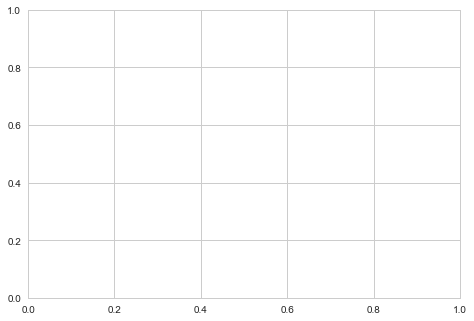

In [191]:
fig=plt.figure()

ax=fig.add_axes([.1,.1,1,1])

colors=clusters.labels_

ax.scatter(data_concat.iloc[:2],data_concat.iloc[data_concat:1],c=colors, s=120)



# Hierachy

In [214]:
from sklearn.datasets import make_blobs,make_circles
from scipy.cluster.hierarchy import linkage,dendrogram,cut_tree

In [216]:
data_concat.head()

,MFCCs_ 1,MFCCs_ 2,MFCCs_ 3,MFCCs_ 4,MFCCs_ 5,MFCCs_ 6,MFCCs_ 7,MFCCs_ 8,MFCCs_ 9,MFCCs_10,MFCCs_11,MFCCs_12,MFCCs_13,MFCCs_14,MFCCs_15,MFCCs_16,MFCCs_17,MFCCs_18,MFCCs_19,MFCCs_20,MFCCs_21,MFCCs_22,Family_Dendrobatidae,Family_Hylidae,Family_Leptodactylidae,Genus_Ameerega,Genus_Dendropsophus,Genus_Hypsiboas,Genus_Leptodactylus,Genus_Osteocephalus,Genus_Rhinella,Genus_Scinax,label
0,1.0,0.152936,-0.105586,0.200722,0.317201,0.260764,0.100945,-0.150063,-0.171128,0.124676,0.188654,-0.075622,-0.156436,0.082245,0.135752,-0.024017,-0.108351,-0.077623,-0.009568,0.057684,0.118680,0.014038,0,0,1,0,0,0,0,0,0,0,8
1,1.0,0.171534,-0.098975,0.268425,0.338672,0.268353,0.060835,-0.222475,-0.207693,0.170883,0.270958,-0.095004,-0.254341,0.022786,0.163320,0.012022,-0.090974,-0.056510,-0.035303,0.020140,0.082263,0.029056,0,0,1,0,0,0,0,0,0,0,8
2,1.0,0.152317,-0.082973,0.287128,0.276014,0.189867,0.008714,-0.242234,-0.219153,0.232538,0.266064,-0.072827,-0.237384,0.050791,0.207338,0.083536,-0.050691,-0.023590,-0.066722,-0.025083,0.099108,0.077162,0,0,1,0,0,0,0,0,0,0,8
3,1.0,0.224392,0.118985,0.329432,0.372088,0.361005,0.015501,-0.194347,-0.098181,0.270375,0.267279,-0.162258,-0.317084,-0.011567,0.100413,-0.050224,-0.136009,-0.177037,-0.130498,-0.054766,-0.018691,0.023954,0,0,1,0,0,0,0,0,0,0,8
4,1.0,0.087817,-0.068345,0.306967,0.330923,0.249144,0.006884,-0.265423,-0.172700,0.266434,0.332695,-0.100749,-0.298524,0.037439,0.219153,0.062837,-0.048885,-0.053074,-0.088550,-0.031346,0.108610,0.079244,0,0,1,0,0,0,0,0,0,0,8


In [218]:
data_concat['label'].unique()

array([8, 1, 3, 2, 5, 0, 6, 4, 9, 7], dtype=int64)

In [219]:
links=linkage(y=data_concat,method='complete')
links

array([[7.03800000e+03, 7.04000000e+03, 6.20064646e-03, 2.00000000e+00],
       [7.03500000e+03, 7.03600000e+03, 8.66237306e-03, 2.00000000e+00],
       [7.04100000e+03, 7.19500000e+03, 9.46156306e-03, 3.00000000e+00],
       ...,
       [1.43820000e+04, 1.43830000e+04, 4.95375832e+00, 2.31000000e+03],
       [1.43850000e+04, 1.43860000e+04, 6.87104413e+00, 2.72500000e+03],
       [1.43840000e+04, 1.43870000e+04, 9.54717735e+00, 7.19500000e+03]])

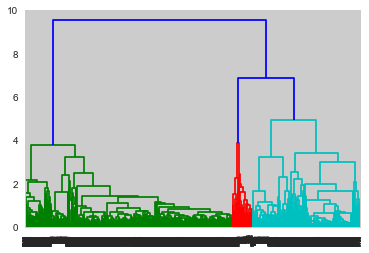

In [221]:
dendrogram(links)
plt.show()


In [239]:
ss=[]
d={}
bb=[]
for i in range(1,10):
    c_=cut_tree(links,height=i)
    c_.shape
    ss.append(silhouette_score(data_concat,c_))
    c_
    cluster_count=pd.DataFrame(c_).iloc[:,0].value_counts()###to get no of cluster
    bb.append(len(cluster_count))
d={"height":range(1,10),'no. of cluster': bb,'silhouette':ss}  
d_df=pd.DataFrame(d)
d_df

,height,no. of cluster,silhouette
0,1,122,0.285310
1,2,23,0.475667
2,3,10,0.710738
3,4,4,0.553279
4,5,3,0.547324
5,6,3,0.547324
6,7,2,0.579814
7,8,2,0.579814
8,9,2,0.579814


In [237]:
cluster_count

1    4470
0    2725
Name: 0, dtype: int64

In [ ]:
links

In [244]:
c_final=cut_tree(links,height=3)

In [245]:
c_final

array([[0],
       [0],
       [0],
       ...,
       [9],
       [9],
       [9]])

In [246]:
data_concat['h_label']=c_final

In [247]:
data_concat.head()

,MFCCs_ 1,MFCCs_ 2,MFCCs_ 3,MFCCs_ 4,MFCCs_ 5,MFCCs_ 6,MFCCs_ 7,MFCCs_ 8,MFCCs_ 9,MFCCs_10,MFCCs_11,MFCCs_12,MFCCs_13,MFCCs_14,MFCCs_15,MFCCs_16,MFCCs_17,MFCCs_18,MFCCs_19,MFCCs_20,MFCCs_21,MFCCs_22,Family_Dendrobatidae,Family_Hylidae,Family_Leptodactylidae,Genus_Ameerega,Genus_Dendropsophus,Genus_Hypsiboas,Genus_Leptodactylus,Genus_Osteocephalus,Genus_Rhinella,Genus_Scinax,label,h_label
0,1.0,0.152936,-0.105586,0.200722,0.317201,0.260764,0.100945,-0.150063,-0.171128,0.124676,0.188654,-0.075622,-0.156436,0.082245,0.135752,-0.024017,-0.108351,-0.077623,-0.009568,0.057684,0.118680,0.014038,0,0,1,0,0,0,0,0,0,0,8,0
1,1.0,0.171534,-0.098975,0.268425,0.338672,0.268353,0.060835,-0.222475,-0.207693,0.170883,0.270958,-0.095004,-0.254341,0.022786,0.163320,0.012022,-0.090974,-0.056510,-0.035303,0.020140,0.082263,0.029056,0,0,1,0,0,0,0,0,0,0,8,0
2,1.0,0.152317,-0.082973,0.287128,0.276014,0.189867,0.008714,-0.242234,-0.219153,0.232538,0.266064,-0.072827,-0.237384,0.050791,0.207338,0.083536,-0.050691,-0.023590,-0.066722,-0.025083,0.099108,0.077162,0,0,1,0,0,0,0,0,0,0,8,0
3,1.0,0.224392,0.118985,0.329432,0.372088,0.361005,0.015501,-0.194347,-0.098181,0.270375,0.267279,-0.162258,-0.317084,-0.011567,0.100413,-0.050224,-0.136009,-0.177037,-0.130498,-0.054766,-0.018691,0.023954,0,0,1,0,0,0,0,0,0,0,8,0
4,1.0,0.087817,-0.068345,0.306967,0.330923,0.249144,0.006884,-0.265423,-0.172700,0.266434,0.332695,-0.100749,-0.298524,0.037439,0.219153,0.062837,-0.048885,-0.053074,-0.088550,-0.031346,0.108610,0.079244,0,0,1,0,0,0,0,0,0,0,8,0


In [248]:
data_concat['h_label'].value_counts()

3    3473
6    1041
5     552
2     542
1     445
4     310
0     301
7     269
9     148
8     114
Name: h_label, dtype: int64

In [238]:
silhouette_score(X=data_concat,labels=c_)

0.5798142188339864

In [249]:
from sklearn.cluster import AgglomerativeClustering

In [ ]:
aggcluster = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
aggcluster.fit_predict(X)

In [8]:
fam_mean=data.groupby(['Family']).mean()
fam_median=data.groupby([])

,MFCCs_ 1,MFCCs_ 2,MFCCs_ 3,MFCCs_ 4,MFCCs_ 5,MFCCs_ 6,MFCCs_ 7,MFCCs_ 8,MFCCs_ 9,MFCCs_10,MFCCs_11,MFCCs_12,MFCCs_13,MFCCs_14,MFCCs_15,MFCCs_16,MFCCs_17,MFCCs_18,MFCCs_19,MFCCs_20,MFCCs_21,MFCCs_22,RecordID
Family,,,,,,,,,,,,,,,,,,,,,,,
Bufonidae,0.971251,0.388735,0.370122,0.290404,-0.052872,0.069686,0.209671,0.043099,-0.085257,0.018355,0.056214,-0.001495,0.023480,0.059155,0.011941,-0.031239,-0.007620,0.011168,0.021527,0.024550,0.005632,-0.010826,52.588235
Dendrobatidae,1.000000,0.285503,0.031864,0.270048,0.241340,0.168099,0.055441,-0.039433,-0.036620,0.067836,0.043783,-0.115525,-0.079658,0.154352,0.122344,-0.102359,-0.123901,0.021660,0.042346,-0.017407,-0.013484,0.003528,11.280443
Hylidae,0.973842,0.378008,0.481619,0.353462,0.077613,0.172123,0.047859,-0.034532,0.071058,0.037973,-0.011157,0.076811,0.028814,-0.045947,0.007826,0.033341,0.006101,0.013294,0.014637,0.010470,-0.008994,-0.015608,40.140878
Leptodactylidae,0.996789,0.300593,0.261112,0.515292,0.140012,0.053434,-0.035740,0.020484,0.179706,0.063955,-0.189080,0.047166,0.241005,-0.061213,-0.184647,0.065171,0.156678,0.003285,-0.093228,-0.090044,0.066712,0.149924,19.199774


In [61]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

In [67]:
pca = PCA(n_components=2).fit_transform(data_num)

In [69]:
X_train1, X_test1, Y_train1, Y_test1 = train_test_split(pca, Species, random_state=0)

In [72]:
def plot_mushroom_boundary(X, y, fitted_model):

    plt.figure(figsize=(9.8,5), dpi=100)
    
    for i, plot_type in enumerate(['Decision Boundary', 'Decision Probabilities']):
        plt.subplot(1,2,i+1)

        mesh_step_size = 0.01  # step size in the mesh
        x_min, x_max = X[:, 0].min() - .1, X[:, 0].max() + .1
        y_min, y_max = X[:, 1].min() - .1, X[:, 1].max() + .1
        xx, yy = np.meshgrid(np.arange(x_min, x_max, mesh_step_size), np.arange(y_min, y_max, mesh_step_size))
        if i == 0:
            Z = fitted_model.predict(np.c_[xx.ravel(), yy.ravel()])
        else:
            try:
                Z = fitted_model.predict_proba(np.c_[xx.ravel(), yy.ravel()])[:,1]
            except:
                plt.text(0.4, 0.5, 'Probabilities Unavailable', horizontalalignment='center',
                     verticalalignment='center', transform = plt.gca().transAxes, fontsize=12)
                plt.axis('off')
                break
        Z = Z.reshape(xx.shape)
        plt.scatter(X[y.values==0,0], X[y.values==0,1], alpha=0.4, label='Edible', s=5)
        plt.scatter(X[y.values==1,0], X[y.values==1,1], alpha=0.4, label='Posionous', s=5)
        plt.imshow(Z, interpolation='nearest', cmap='RdYlBu_r', alpha=0.15, 
                   extent=(x_min, x_max, y_min, y_max), origin='lower')
        plt.title(plot_type + '\n' + 
                  str(fitted_model).split('(')[0]+ ' Test Accuracy: ' + str(np.round(fitted_model.score(X, y), 5)))
        plt.gca().set_aspect('equal');
        
    plt.tight_layout()
    plt.subplots_adjust(top=0.9, bottom=0.08, wspace=0.02)

IndexError: too many indices for array

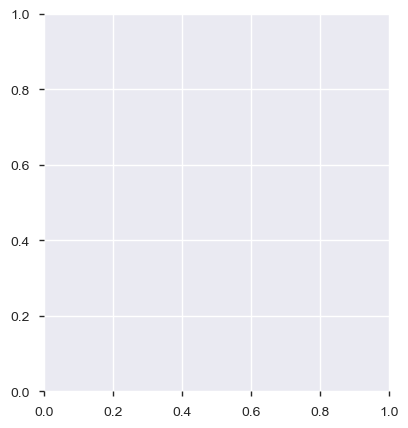

In [73]:
from sklearn.linear_model import LogisticRegression

model = LogisticRegression()
model.fit(X_train1,Y_train1)

plot_mushroom_boundary(X_test1, Y_test1, model)

TypeError: '(slice(None, None, None), 0)' is an invalid key

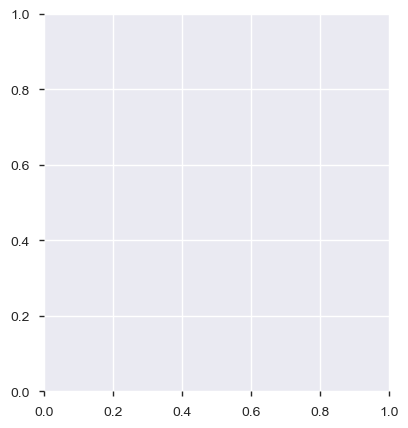

In [66]:
plot_mushroom_boundary(X_test, Y_test, Rf)